In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from gensim.models import KeyedVectors
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import mpld3
import numpy as np
from gensim.models import Word2Vec
import seaborn as sns
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.parsing.preprocessing import remove_stopwords
from tensorflow.keras.preprocessing import image
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from catboost import Pool, CatBoostClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, auc, accuracy_score, roc_auc_score, confusion_matrix, roc_curve
import os
from os import listdir
from os.path import isfile, join
import csv
import operator

In [1100]:
food_train = pd.read_csv("C:/Users/sharony/Documents/school/DS_APPS/data/food_train.csv")
food_train = food_train.replace(np.nan, '', regex=True)
food_nutrients = pd.read_csv("C:/Users/sharony/Documents/school/DS_APPS/data/food_nutrients.csv")
food_nutrients = food_nutrients.replace(np.nan, '', regex=True)
food_nutrients_joined = pd.merge(food_nutrients, food_train, on="idx")
nutrients = pd.read_csv("C:/Users/sharony/Documents/school/DS_APPS/data/nutrients.csv")

### Dividing the Data to Decisions

 Decided to focus on 3 decisions, each get different piece of the data, saving the class balance:<br>
 Feature Engineering - 70% of train data<br>
 Feature Selection - 15% of train data<br>
 Model Tuning - will use Catboost - 15% of train data

In [170]:
categories = ['cakes_cupcakes_snack_cakes',  'chocolate', 'candy', 'cookies_biscuits',
'chips_pretzels_snacks', 'popcorn_peanuts_seeds_related_snacks']
divisions =['feature_engineering','feature_selection','model_tuning']

In [173]:
# read csv's of divisions
data_division_dict ={}
for division in divisions:
    data_division_dict[division] = {}
    for i,category in enumerate(categories):
        path = f'{division}_{category}.csv'
        lst = read_list_from_file(path)
        lst = [a.split('.')[0] for a in lst]
        lst = [int(''.join(f.split(','))) for f in lst]
        data_division_dict[division][category] = lst       
        print(division, category, len(data_division_dict[division][category]))    


feature_engineering cakes_cupcakes_snack_cakes 2651
feature_engineering chocolate 2641
feature_engineering candy 5309
feature_engineering cookies_biscuits 3699
feature_engineering chips_pretzels_snacks 2576
feature_engineering popcorn_peanuts_seeds_related_snacks 5352
feature_selection cakes_cupcakes_snack_cakes 568
feature_selection chocolate 566
feature_selection candy 1138
feature_selection cookies_biscuits 793
feature_selection chips_pretzels_snacks 552
feature_selection popcorn_peanuts_seeds_related_snacks 1147
model_tuning cakes_cupcakes_snack_cakes 567
model_tuning chocolate 565
model_tuning candy 1137
model_tuning cookies_biscuits 792
model_tuning chips_pretzels_snacks 552
model_tuning popcorn_peanuts_seeds_related_snacks 1146


In [174]:
feature_selection_index = sum(data_division_dict['feature_selection'].values(), [])
feature_engineering_index = sum(data_division_dict['feature_engineering'].values(), [])
model_tuning_index = sum(data_division_dict['model_tuning'].values(), [])

In [1450]:
food_train2 = pd.read_csv("C:/Users/sharony/Documents/school/DS_APPS/data/food_train.csv")
food_train_fs =  food_train2.loc[food_train['idx'].isin(feature_selection_index)]
food_train_fe =  food_train2.loc[food_train['idx'].isin(feature_engineering_index)]
food_train_mt =  food_train2.loc[food_train['idx'].isin(model_tuning_index)]
print(food_train_fs.shape, food_train_fe.shape, food_train_mt.shape)

(4764, 8) (22228, 8) (4759, 8)


## Feature Engineering

In this part we will make a feature matrix from 4 data sets: food_train, food_nutrients, nutrients,snacks images.<br>
We use cross validation for features extracted from the following fields:<br>
- household fulltext<br>
- description<br>
- ingredients<br>
- brand<br>

For each these we split into 4 folds and examine meaningful extractable features.<br>

For other sources of data (e.g image, nutrients), we settle for the work done in the exploratory phase, or in one "plain vanilla" option.<br>

After these stages, we merge all resulting features and apply feature selection (see below)



### Slpitting Feature engineering data to decisions

In [ ]:
fold_indices = {}
num_folds = 4
for i in range(num_folds):
    print(i)
    fold_indices[i] = np.asarray([ j%num_folds ==i for j in range(food_train_fe.shape[0])])

### Food Nutrients Data Set

We add all nutrients as features.<br>
Beacuse each decision is taken in additive way we start with nutrients and only then check other features. <br>
We don't need to scale the nutrients becuase we will use Tree model.

In [199]:
def add_nutrients_as_features(data,food_nutrients):
    food_nutrients_joined = pd.merge(pd.get_dummies(food_nutrients.pivot(index='idx', columns='nutrient_id', values='amount').iloc[: ,0:49]).add_prefix('nutrient_'), data, on="idx")
    food_nutrients_joined.fillna(0)
    return food_nutrients_joined

In [1102]:
food_train = add_nutrients_as_features(food_train,food_nutrients)

In [1280]:
food_test = add_nutrients_as_features(food_test,food_nutrients)

####  # nutrients in snack

Let's take a look on #nutrients per category.

In [1103]:
food_train['# nutrients'] = food_train[[col for col in food_train.columns if 'nutrient_' in col]].count(axis=1)

In [1281]:
food_test['# nutrients'] = food_test[[col for col in food_test.columns if 'nutrient_' in col]].count(axis=1)

In [186]:
food_train_fe.groupby('category')['# nutrients'].mean()

category
cakes_cupcakes_snack_cakes              14.428518
candy                                   11.848182
chips_pretzels_snacks                   15.248447
chocolate                               13.709958
cookies_biscuits                        14.591782
popcorn_peanuts_seeds_related_snacks    14.788303
Name: # nutrients, dtype: float64

In [187]:
food_train_fe['# nutrients'].describe()

count    22228.000000
mean        13.935667
std          2.719088
min          3.000000
25%         14.000000
50%         14.000000
75%         14.000000
max         32.000000
Name: # nutrients, dtype: float64

We will add #nutrients as a feature beacuse it seems to have information about the category separation - this feature gets different value by average for each category.

In [200]:
def get_nutrient_amount(data):
    data['# nutrients'] = data[[col for col in data.columns if 'nutrient_' in col]].count(axis=1)
    return data

#### # of nutrients per unit for each snack

We said we don't scale the nutrients because we use tree model and each nutrient compared only to itself.<br>
Let's see if it seems that the unit of each nutrient have information on the categories.<br>
We will count how many nutrients are measured per unit for each snack. <br>

In [1260]:
food_nutrients_full= pd.merge(pd.merge(food_nutrients, nutrients, on="nutrient_id"), food_train_fe, on="idx")

<AxesSubplot:title={'center':'Category per Nutrient Unit'}>

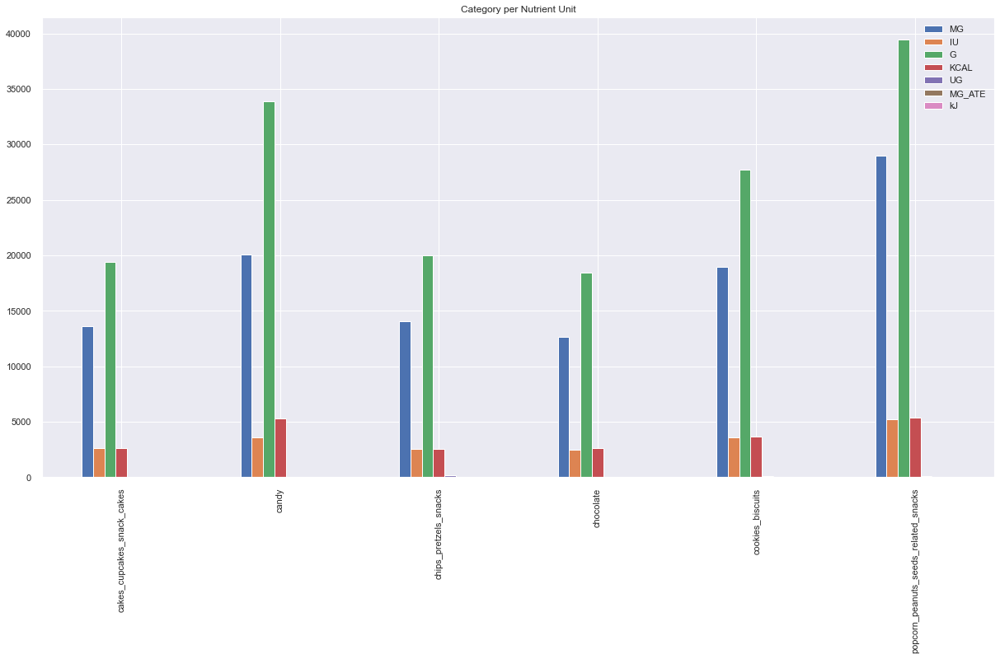

In [1261]:
column_name = 'unit_name'
keywords = food_nutrients_full.unit_name.unique()
keywords_dict = {}
categories = ['cakes_cupcakes_snack_cakes','candy','chips_pretzels_snacks','chocolate','cookies_biscuits','popcorn_peanuts_seeds_related_snacks']
for word in keywords:
    keywords_dict[word] = {}
    word_dict = {}
    for category in categories:
        category_cnt = sum(food_nutrients_full[column_name][food_nutrients_full.category == category].map(lambda a: 1 if a == word else 0))
        keywords_dict[word][category] = category_cnt
df_nutrient_unit = pd.DataFrame(keywords_dict)
df_nutrient_unit_t = df_nutrient_unit.T
df_nutrient_unit.plot(kind = 'bar',title = 'Category per Nutrient Unit')

In [1274]:
def get_nutrient_unit_amount(data,food_nutrients,nutrients):
    food_nutrients_full= pd.merge(pd.merge(food_nutrients, nutrients, on="nutrient_id"), data, on="idx")
    df = pd.DataFrame(food_nutrients_full.groupby(['idx','unit_name'])['nutrient_id'].count()).reset_index()
    return pd.merge(pd.get_dummies(df.pivot(index='idx', columns='unit_name', values='nutrient_id')).add_prefix('nutrient_unit_'), data, on="idx")

In [1275]:
food_train_fe = get_nutrient_unit_amount(food_train_fe,food_nutrients,nutrients)

In [1276]:
units = food_nutrients_full.unit_name.unique()
for unit in units:
    print(f'nutrient_unit_{unit}')
    print(food_train_fe.groupby('category')[f'nutrient_unit_{unit}'].mean())

nutrient_unit_MG
category
cakes_cupcakes_snack_cakes              5.125755
candy                                   3.798033
chips_pretzels_snacks                   5.453945
chocolate                               4.859231
cookies_biscuits                        5.152487
popcorn_peanuts_seeds_related_snacks    5.417227
Name: nutrient_unit_MG, dtype: float64
nutrient_unit_IU
category
cakes_cupcakes_snack_cakes              1.001917
candy                                   1.000837
chips_pretzels_snacks                   1.007171
chocolate                               1.002451
cookies_biscuits                        1.002542
popcorn_peanuts_seeds_related_snacks    1.001929
Name: nutrient_unit_IU, dtype: float64
nutrient_unit_G
category
cakes_cupcakes_snack_cakes              7.306300
candy                                   6.387832
chips_pretzels_snacks                   7.756211
chocolate                               6.989777
cookies_biscuits                        7.484726
popcorn_pean

Looking at the nutrient unit name, it doesn't seem to have the best information about category inside. <br>
Or at least we don't see it... we decide to ignore the nutrients units.


### Household full text

In this part we will use a data devision that allocated for houehold column, first we will focus on cleaning this column.

In [1451]:
household_decision_df = food_train_fe[fold_indices[0]]

In [1454]:
print("#Unique values of household_serving_fulltext:",len(houshold_decision_df.household_serving_fulltext.unique()))

#Unique values of household_serving_fulltext: 971


In [1408]:
household_decision_df.household_serving_fulltext.value_counts()[0:10]

1 onz        957
0.25 cup     368
3 pieces     202
1 cookie     195
2 cookies    152
4 pieces     138
1 piece      100
2 pieces      96
1 package     94
3 cookies     81
Name: household_serving_fulltext, dtype: int64

Checking if there is a meaning to the digits in household_serving_fulltext,<br>
taking a look on values with digits.

In [1409]:
household_decision_df.household_serving_fulltext[household_decision_df.household_serving_fulltext.str.contains('\d+', na=False)].value_counts()[0:20]

1 onz        957
0.25 cup     368
3 pieces     202
1 cookie     195
2 cookies    152
4 pieces     138
1 piece      100
2 pieces      96
1 package     94
3 cookies     81
5 pieces      75
1 bar         71
1/4 cup       59
6 pieces      58
1 slice       56
1.5 onz       54
2 tbsp        52
1.4 onz       52
3 tbsp        51
2 onz         51
Name: household_serving_fulltext, dtype: int64

In [1416]:
def clean_column(data,column):
    data[column] = data[column].str.lower()
    data[column] = data[column].replace(to_replace ='^0[.].*piece.*$', value = '0 pieces', regex = True) # change all '0.% piece%' to 0 pieces
    data[column] = data[column].str.replace('-/','')
    data[column] = data[column].str.replace('\d+', '')
    data[column] = data[column].str.replace('[^\w\s]','')
    data[column] = data[column].str.replace('pcs','pieces')     
    data[column] = data[column].str.replace('pices','pieces')
    data[column] = data[column].str.replace('pkg','pack')
    data[column] = data[column].str.replace('package','pack')
    data[column] = data[column].str.replace('prtzl','pretzel')
    data[column] = data[column].str.replace('cooikie','cookie')
    data[column] = data[column].str.replace('coooike','cookie')
    data[column] = data[column].str.replace('plieces','pieces')
    data[column] = data[column].str.replace('loli','lolli')
    data[column] = data[column].str.replace('lollilpop','lollipop')
    data[column] = data[column].str.replace('doughnut','donut')
    data[column] = data[column].str.replace('macaroon','macaron')
    data[column] = data[column].str.replace('about','')
    data[column] = data[column].str.replace('1 piece','1 pieces')
    data[column] = data[column].str.replace('1 cookie','1 cookies')
    data[column] = data[column].str.replace('cookiess','cookies')
    data[column] = data[column].str.replace('piecess','pieces')
    data[column] = data[column].str.replace('whole','')
    data[column] = data[column].str.replace('full','')
    data[column] = data[column].str.replace('of','')
    data[column] = data[column].str.replace('per container','')
    data[column] = data[column].str.replace('approximately','')
    data[column] = data[column].str.replace('approx','')
    data[column] = data[column].replace('\s+', ' ', regex=True) # remove multiple spaces
    data[column] = data[column].str.strip()
    if data[column].str == 'pc':
        data[column] = 'pieces'
    data[column] = data[column].fillna("")
    return data
    

In [1417]:
household_decision_df = clean_column(household_decision_df,'household_serving_fulltext')

Let's take a look on the values we get after cleaning the column.

In [1419]:
houshold_decision_df.household_serving_fulltext.unique()

array(['onz', 'chip', 'pack', 'cake', 'tbsp', 'pretzel', 'bag', 'cooki',
       'wafer', 'bar', 'piec', 'cup', '', 'block', 'donut', 'grm',
       'pounch', 'crisp', 'peanut', 'biscuit', 'cracker', 'slice', 'oz',
       'pralin', 'pop', 'bag unpop make cup pop serv bag', 'squar',
       'cupcak', 'section', 'pouch', 'pie', 'tube', 'ounc', 'halv',
       'serv', 'hole', 'packet', 'browni', 'bun', 'cane', 'ball',
       'candi cane', 'roll', 'pc', 'piiec', 'egg', 'box', 'unit',
       'cracker sheet', 'chocol', 'kit', 'chick', 'heart', 'decor cooki',
       'pizzel', 'nut', 'caramel', 'lollipop', 'bracelet', 'pieza',
       'candi', 'stick', 'twist', 'pen', 'piecs', 'pack biscuit',
       'cluster', 'macaron', 'bunni', 'portion', 'oc', 'mitchel sweet',
       'necklac bracelet watch', 'candi bracelet', 'tree', 'brittl slice',
       'dot', 'graham', 'pumpkin', 'contain', 'marshmallow pop', 'truffl',
       'thin', 'almond drop', 'donut hole', 'cupcka', 'pouch piec',
       'danish', 'sil

In [741]:
print('# Unique values of household_serving_fulltext after cleaning: ',len(houshold_decision_df.household_serving_fulltext.unique()))

# Unique values of household_serving_fulltext after cleaning:  227


We see 'a cake' when so we will remove 'stop words' of english - words as 'the','a' etc...<br>
We also see that we have pop and pops, pack and packs, cake and cakes and etc..<br>
Therfore we will use stemmimg that will keep us only the root of the words.

In [606]:
# https://github.com/sjhangiani12/reccomendation_poc/blob/master/reccomend.py
def remove_stop_words(data):
    stop_words = stopwords.words('english')
    stop_words.extend(['&','and','in','of','the','without','with','assorted','make','per','aprox','contain'])
    words = word_tokenize(str(data))
    new_text = ""
    for w in words:
        if w not in stop_words and len(w) > 1:
            new_text = new_text + " " + w
    return new_text

def stemming(data):
    stemmer= PorterStemmer()
    
    tokens = word_tokenize(str(data))
    new_text = ""
    for w in tokens:
        if w != '':
            new_text = new_text + " " + stemmer.stem(w)
    return new_text


In [1420]:
household_decision_df['household_serving_fulltext'] = household_decision_df.household_serving_fulltext.map(lambda a: remove_stop_words(a))

In [1424]:
household_decision_df['household_serving_fulltext'] = household_decision_df.household_serving_fulltext.str.strip()

In [1426]:
print('# Unique values of household_serving_fulltext remove stop words: ',len(household_decision_df.household_serving_fulltext.unique()))

# Unique values of household_serving_fulltext remove stop words:  204


In [1427]:
household_decision_df['household_serving_fulltext'] = household_decision_df.household_serving_fulltext.map(lambda a: stemming(a))


In [1428]:
household_decision_df = clean_column(household_decision_df,'household_serving_fulltext')

In [1429]:
print('# Unique values of household_serving_fulltext after cleaning: ',len(household_decision_df.household_serving_fulltext.unique()))

# Unique values of household_serving_fulltext after cleaning:  171


In [1430]:
household_decision_df.household_serving_fulltext.unique()

array(['onz', 'piec', 'slice', 'cracker sheet', 'grm', 'cup', 'tbsp',
       'chip', 'cake', 'cooki', 'cracker', 'sandwich cooki', 'wafer',
       'bar', 'biscuit', 'candi cane', 'ball', '', 'bag', 'gummi', 'pack',
       'pie', 'cane', 'loaf', 'chick', 'bag unpop make cup pop serv bag',
       'browni', 'cupcak', 'pouch', 'pretzel', 'macaron', 'box', 'pc',
       'squar', 'peanut', 'sandwich', 'danish', 'section serv size',
       'section', 'pouch biscuit', 'nut nut kernel', 'ounc', 'kernel',
       'halv', 'ladyfing', 'wafer bite', 'eclair', 'snowmen', 'silc',
       'donut', 'pop', 'bunni', 'cracker serv cracker sheet', 'twist',
       'thin', 'strip', 'roll', 'bean', 'tsp', 'truffl', 'serv', 'galett',
       'bag chip', 'cup cake', 'snack', 'snack pack', 'pounch',
       'peanut butter cup', 'santa face', 'egg', 'stick', 'pack biscuit',
       'heart', 'bag make cup pop', 'puff', 'contain', 'lollipop',
       'tombston', 'dot', 'packet', 'marshmallow pop', 'sachet', 'mlt',
       

We will satisfy for now with this level of cleaning, from 971 unique values to 171.

After cleaning the household column, we want to decrease the number of levels (not by cleaning each string).<br>

We will check if its better to use the option below:<br>
We will count for each category the n top values of houshold column, and those will be our keywords.<br>
If a the houshold column contains one of the keywords -> we will change the column to that word.<br>
It's possible to check different size of n, we will choose 10,20,50,70,90.<br>
We are using top n words from each category so the class imbalance won't neglect any class.


In [652]:
def get_column_top_n_word_count_by_category(column_name,category,data,n):
    
    column_by_category = data.loc[data['category']== category,column_name]
    try:
        lst = ' '.join(column_by_category).replace(',','').split(' ')
    except:
        #print(os.sys_exc())
        print(column_name,category)
        pass
    category_text = pd.DataFrame(lst)
    category_cnt = category_text.value_counts()
    result = category_cnt.index.get_level_values(0).to_list()[0:n]
    if '' in result:
        result.remove('')
    return result

let's get a sense of those keywords with n = 20

In [751]:
houshold_keywords_dict_top_20 = {category: get_column_top_n_word_count_by_category('household_serving_fulltext',category,houshold_decision_df,20) for category in categories}

In [752]:
houshold_keywords_top_20 = set(sum(houshold_keywords_dict_top_20.values(), []))

In [753]:
houshold_keywords_top_20

{'bag',
 'ball',
 'bar',
 'biscuit',
 'bite',
 'block',
 'browni',
 'bun',
 'bunni',
 'cake',
 'candi',
 'cane',
 'chick',
 'chip',
 'chocol',
 'cluster',
 'contain',
 'cook',
 'cooki',
 'cracker',
 'crisp',
 'cup',
 'cupcak',
 'danish',
 'decor',
 'donut',
 'egg',
 'fri',
 'grm',
 'hole',
 'kit',
 'loaf',
 'lollipop',
 'macaron',
 'muffin',
 'onz',
 'ounc',
 'oz',
 'pack',
 'packet',
 'pastri',
 'pc',
 'peanut',
 'pie',
 'piec',
 'pop',
 'pouch',
 'pretzel',
 'roll',
 'salt',
 'section',
 'serv',
 'sheet',
 'shell',
 'slice',
 'squar',
 'stick',
 'straw',
 'tbsp',
 'th',
 'tortilla',
 'truffl',
 'tube',
 'twist',
 'wafer'}

In [754]:
len(houshold_keywords_top_20)

65

In [1431]:
household_decision_df['houshold_manual_top_20'] = household_decision_df.household_serving_fulltext.map(lambda a: replace_to_keyword(houshold_keywords_top_20,a))

In [757]:
household_decision_df['houshold_manual_top_20'].value_counts()[0:20]

onz        1393
piec       1263
cup         610
cooki       560
pack        204
grm         191
bar         146
cake        112
other       102
tbsp         97
slice        81
chip         65
pouch        59
pretzel      56
cupcak       55
pie          54
bag          52
pop          52
squar        40
cracker      35
Name: houshold_manual_top_20, dtype: int64

In [1114]:
#we will do the same for n = [10,20,50,70,90]
houshold_n_list = [10,20,50,70,90]

In [1115]:
houshold_keywords_dict_top_n = {n: set(sum({category: get_column_top_n_word_count_by_category('household_serving_fulltext',category,houshold_decision_df,n) for category in categories}.values(), [])) for n in houshold_n_list}

In [1116]:
#adding those columns to the df
for n in houshold_n_list:
    household_decision_df[f'houshold_manual_top_{n}'] = household_decision_df.household_serving_fulltext.map(lambda a: replace_to_keyword(houshold_keywords_dict_top_n[n],a))

#### Checking the best n with CV

In [1117]:
kf_fe = KFold(n_splits=5)

In [ ]:
kf_fe_dict_houshold = {}
for n in houshold_n_list:
    columns_list = [col for col in household_decision_df.columns if 'nutrient' in col]
    columns_list.append(f'houshold_manual_top_{n}')
#     print(columns_list)
    X = pd.DataFrame(household_decision_df[columns_list])
    y = pd.DataFrame(household_decision_df['category'])
    cat_features = [columns_list.index(f'houshold_manual_top_{n}')]
#     print(cat_features)
#     print(X.shape)
#     print(y.shape)
    kf_fe_dict_houshold[n]=[]
    for train, test in kf_fe.split(household_decision_df):
        train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
        train_dataset = Pool(data=train_data,
                             label=train_label,
                             cat_features=cat_features)

        eval_dataset = Pool(data=eval_data,
                            label=eval_label,
                            cat_features=cat_features)

        # Initialize CatBoostClassifier
        model = CatBoostClassifier(iterations = 1000,learning_rate=0.01,
                                   #depth=3,
                                   loss_function='MultiClass')
        # Fit model
        model.fit(train_dataset, early_stopping_rounds=10)
        # Get predicted classes
        preds_class = model.predict(eval_dataset)
        #Add accuracy to dict
        kf_fe_dict_houshold[n].append(accuracy_score(eval_label, preds_class))
    

In [1120]:
# non manual houshold using
columns_list = [col for col in food_train_fe.columns if f'nutrient_' in col]
columns_list.append('household_serving_fulltext')
X = pd.DataFrame(household_decision_df[columns_list])
y = pd.DataFrame(household_decision_df['category'])

cat_features = [columns_list.index('household_serving_fulltext')]
kf_fe_dict_houshold['household_serving_fulltext'] = []
for train, test in kf_fe.split(household_decision_df):
    train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
#         print("train_data",train_data.shape)
#         print("eval_data",eval_data.shape)
#         print("train_label",train_label.shape)
#         print("eval_label",eval_label.shape)
    train_dataset = Pool(data=train_data,
                         label=train_label,
                         cat_features=cat_features)

    eval_dataset = Pool(data=eval_data,
                        label=eval_label,
                        cat_features=cat_features)

    # Initialize CatBoostClassifier
    model = CatBoostClassifier(iterations=1000,
                               learning_rate=0.01,
                               #one_hot_max_size = n,
                               #depth=3,
                               loss_function='MultiClass')
    # Fit model
    model.fit(train_dataset, early_stopping_rounds=10)
    # Get predicted classes
    preds_class = model.predict(eval_dataset)
    #Add accuracy to dict
    kf_fe_dict_houshold['household_serving_fulltext'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7752172	total: 30ms	remaining: 29.9s
1:	learn: 1.7599748	total: 58.9ms	remaining: 29.4s
2:	learn: 1.7441694	total: 88ms	remaining: 29.2s
3:	learn: 1.7294550	total: 125ms	remaining: 31s
4:	learn: 1.7149548	total: 167ms	remaining: 33.3s
5:	learn: 1.7003957	total: 199ms	remaining: 33s
6:	learn: 1.6867637	total: 230ms	remaining: 32.6s
7:	learn: 1.6732282	total: 280ms	remaining: 34.7s
8:	learn: 1.6596125	total: 320ms	remaining: 35.2s
9:	learn: 1.6479042	total: 352ms	remaining: 34.8s
10:	learn: 1.6359963	total: 384ms	remaining: 34.5s
11:	learn: 1.6247212	total: 427ms	remaining: 35.2s
12:	learn: 1.6132369	total: 461ms	remaining: 35s
13:	learn: 1.6030065	total: 494ms	remaining: 34.8s
14:	learn: 1.5930789	total: 543ms	remaining: 35.7s
15:	learn: 1.5827935	total: 595ms	remaining: 36.6s
16:	learn: 1.5727896	total: 633ms	remaining: 36.6s
17:	learn: 1.5635924	total: 700ms	remaining: 38.2s
18:	learn: 1.5542631	total: 741ms	remaining: 38.2s
19:	learn: 1.5454283	total: 778ms	remaining: 38.

161:	learn: 1.1245031	total: 7.48s	remaining: 38.7s
162:	learn: 1.1235583	total: 7.54s	remaining: 38.7s
163:	learn: 1.1227386	total: 7.59s	remaining: 38.7s
164:	learn: 1.1218416	total: 7.64s	remaining: 38.7s
165:	learn: 1.1208994	total: 7.68s	remaining: 38.6s
166:	learn: 1.1201962	total: 7.71s	remaining: 38.5s
167:	learn: 1.1193151	total: 7.76s	remaining: 38.4s
168:	learn: 1.1185493	total: 7.79s	remaining: 38.3s
169:	learn: 1.1177805	total: 7.85s	remaining: 38.3s
170:	learn: 1.1169891	total: 7.9s	remaining: 38.3s
171:	learn: 1.1161483	total: 7.93s	remaining: 38.2s
172:	learn: 1.1155161	total: 7.99s	remaining: 38.2s
173:	learn: 1.1149145	total: 8.04s	remaining: 38.2s
174:	learn: 1.1141077	total: 8.09s	remaining: 38.1s
175:	learn: 1.1133875	total: 8.15s	remaining: 38.1s
176:	learn: 1.1126884	total: 8.19s	remaining: 38.1s
177:	learn: 1.1120112	total: 8.25s	remaining: 38.1s
178:	learn: 1.1112195	total: 8.28s	remaining: 38s
179:	learn: 1.1105582	total: 8.32s	remaining: 37.9s
180:	learn: 1.1

320:	learn: 1.0607573	total: 14.4s	remaining: 30.5s
321:	learn: 1.0606180	total: 14.5s	remaining: 30.4s
322:	learn: 1.0605043	total: 14.5s	remaining: 30.4s
323:	learn: 1.0603151	total: 14.5s	remaining: 30.3s
324:	learn: 1.0601441	total: 14.5s	remaining: 30.2s
325:	learn: 1.0599605	total: 14.6s	remaining: 30.2s
326:	learn: 1.0598015	total: 14.6s	remaining: 30.1s
327:	learn: 1.0596374	total: 14.7s	remaining: 30.1s
328:	learn: 1.0595120	total: 14.7s	remaining: 30s
329:	learn: 1.0593710	total: 14.7s	remaining: 29.9s
330:	learn: 1.0591511	total: 14.8s	remaining: 29.8s
331:	learn: 1.0589461	total: 14.8s	remaining: 29.8s
332:	learn: 1.0587560	total: 14.8s	remaining: 29.7s
333:	learn: 1.0586140	total: 14.9s	remaining: 29.7s
334:	learn: 1.0584534	total: 14.9s	remaining: 29.6s
335:	learn: 1.0583376	total: 14.9s	remaining: 29.5s
336:	learn: 1.0581881	total: 15s	remaining: 29.5s
337:	learn: 1.0580126	total: 15s	remaining: 29.4s
338:	learn: 1.0578613	total: 15.1s	remaining: 29.3s
339:	learn: 1.0577

483:	learn: 1.0432737	total: 19.9s	remaining: 21.2s
484:	learn: 1.0431692	total: 20s	remaining: 21.2s
485:	learn: 1.0430864	total: 20s	remaining: 21.1s
486:	learn: 1.0430861	total: 20s	remaining: 21.1s
487:	learn: 1.0430417	total: 20s	remaining: 21s
488:	learn: 1.0429872	total: 20.1s	remaining: 21s
489:	learn: 1.0429121	total: 20.1s	remaining: 20.9s
490:	learn: 1.0428592	total: 20.1s	remaining: 20.9s
491:	learn: 1.0427985	total: 20.2s	remaining: 20.8s
492:	learn: 1.0427597	total: 20.2s	remaining: 20.8s
493:	learn: 1.0426932	total: 20.2s	remaining: 20.7s
494:	learn: 1.0425978	total: 20.3s	remaining: 20.7s
495:	learn: 1.0425265	total: 20.3s	remaining: 20.6s
496:	learn: 1.0424357	total: 20.3s	remaining: 20.6s
497:	learn: 1.0423830	total: 20.4s	remaining: 20.5s
498:	learn: 1.0423294	total: 20.4s	remaining: 20.5s
499:	learn: 1.0422785	total: 20.4s	remaining: 20.4s
500:	learn: 1.0422500	total: 20.5s	remaining: 20.4s
501:	learn: 1.0422056	total: 20.5s	remaining: 20.3s
502:	learn: 1.0421498	to

647:	learn: 1.0347854	total: 25.1s	remaining: 13.6s
648:	learn: 1.0347312	total: 25.1s	remaining: 13.6s
649:	learn: 1.0346848	total: 25.2s	remaining: 13.5s
650:	learn: 1.0346623	total: 25.2s	remaining: 13.5s
651:	learn: 1.0346025	total: 25.2s	remaining: 13.5s
652:	learn: 1.0345863	total: 25.3s	remaining: 13.4s
653:	learn: 1.0345237	total: 25.3s	remaining: 13.4s
654:	learn: 1.0344830	total: 25.3s	remaining: 13.3s
655:	learn: 1.0344541	total: 25.4s	remaining: 13.3s
656:	learn: 1.0344160	total: 25.4s	remaining: 13.3s
657:	learn: 1.0343703	total: 25.4s	remaining: 13.2s
658:	learn: 1.0343345	total: 25.5s	remaining: 13.2s
659:	learn: 1.0342970	total: 25.5s	remaining: 13.1s
660:	learn: 1.0342300	total: 25.5s	remaining: 13.1s
661:	learn: 1.0342023	total: 25.6s	remaining: 13.1s
662:	learn: 1.0341904	total: 25.6s	remaining: 13s
663:	learn: 1.0341514	total: 25.6s	remaining: 13s
664:	learn: 1.0340660	total: 25.7s	remaining: 12.9s
665:	learn: 1.0340266	total: 25.7s	remaining: 12.9s
666:	learn: 1.03

808:	learn: 1.0283457	total: 30.2s	remaining: 7.14s
809:	learn: 1.0283182	total: 30.3s	remaining: 7.1s
810:	learn: 1.0282868	total: 30.3s	remaining: 7.06s
811:	learn: 1.0282522	total: 30.3s	remaining: 7.03s
812:	learn: 1.0282076	total: 30.4s	remaining: 6.99s
813:	learn: 1.0281524	total: 30.4s	remaining: 6.95s
814:	learn: 1.0281354	total: 30.4s	remaining: 6.91s
815:	learn: 1.0280881	total: 30.5s	remaining: 6.87s
816:	learn: 1.0280477	total: 30.5s	remaining: 6.83s
817:	learn: 1.0279950	total: 30.5s	remaining: 6.79s
818:	learn: 1.0279402	total: 30.6s	remaining: 6.75s
819:	learn: 1.0278776	total: 30.6s	remaining: 6.72s
820:	learn: 1.0278253	total: 30.6s	remaining: 6.68s
821:	learn: 1.0278084	total: 30.7s	remaining: 6.64s
822:	learn: 1.0277696	total: 30.7s	remaining: 6.6s
823:	learn: 1.0277171	total: 30.7s	remaining: 6.56s
824:	learn: 1.0276754	total: 30.8s	remaining: 6.52s
825:	learn: 1.0276254	total: 30.8s	remaining: 6.48s
826:	learn: 1.0275688	total: 30.8s	remaining: 6.45s
827:	learn: 1.

971:	learn: 1.0219080	total: 35.5s	remaining: 1.02s
972:	learn: 1.0218515	total: 35.5s	remaining: 986ms
973:	learn: 1.0217829	total: 35.6s	remaining: 949ms
974:	learn: 1.0217288	total: 35.6s	remaining: 913ms
975:	learn: 1.0217079	total: 35.6s	remaining: 877ms
976:	learn: 1.0216582	total: 35.7s	remaining: 840ms
977:	learn: 1.0216157	total: 35.7s	remaining: 804ms
978:	learn: 1.0215837	total: 35.8s	remaining: 767ms
979:	learn: 1.0215533	total: 35.8s	remaining: 730ms
980:	learn: 1.0214909	total: 35.8s	remaining: 694ms
981:	learn: 1.0214562	total: 35.9s	remaining: 657ms
982:	learn: 1.0214229	total: 35.9s	remaining: 621ms
983:	learn: 1.0213809	total: 35.9s	remaining: 584ms
984:	learn: 1.0213511	total: 36s	remaining: 548ms
985:	learn: 1.0213176	total: 36s	remaining: 511ms
986:	learn: 1.0212716	total: 36s	remaining: 475ms
987:	learn: 1.0212350	total: 36.1s	remaining: 438ms
988:	learn: 1.0212099	total: 36.1s	remaining: 402ms
989:	learn: 1.0211604	total: 36.2s	remaining: 365ms
990:	learn: 1.0211

137:	learn: 1.0909137	total: 5.53s	remaining: 34.5s
138:	learn: 1.0898013	total: 5.55s	remaining: 34.4s
139:	learn: 1.0885724	total: 5.59s	remaining: 34.3s
140:	learn: 1.0872646	total: 5.64s	remaining: 34.4s
141:	learn: 1.0861246	total: 5.68s	remaining: 34.3s
142:	learn: 1.0848684	total: 5.72s	remaining: 34.3s
143:	learn: 1.0837143	total: 5.75s	remaining: 34.2s
144:	learn: 1.0825024	total: 5.79s	remaining: 34.1s
145:	learn: 1.0814149	total: 5.83s	remaining: 34.1s
146:	learn: 1.0802811	total: 5.86s	remaining: 34s
147:	learn: 1.0791309	total: 5.9s	remaining: 34s
148:	learn: 1.0781318	total: 5.93s	remaining: 33.9s
149:	learn: 1.0769965	total: 5.96s	remaining: 33.8s
150:	learn: 1.0759180	total: 6s	remaining: 33.8s
151:	learn: 1.0749567	total: 6.04s	remaining: 33.7s
152:	learn: 1.0738868	total: 6.1s	remaining: 33.8s
153:	learn: 1.0728554	total: 6.14s	remaining: 33.7s
154:	learn: 1.0719923	total: 6.2s	remaining: 33.8s
155:	learn: 1.0711088	total: 6.26s	remaining: 33.9s
156:	learn: 1.0700702	

299:	learn: 1.0017070	total: 11.1s	remaining: 26s
300:	learn: 1.0015398	total: 11.2s	remaining: 25.9s
301:	learn: 1.0013306	total: 11.2s	remaining: 25.9s
302:	learn: 1.0011330	total: 11.2s	remaining: 25.8s
303:	learn: 1.0009427	total: 11.3s	remaining: 25.8s
304:	learn: 1.0007293	total: 11.3s	remaining: 25.7s
305:	learn: 1.0005154	total: 11.3s	remaining: 25.7s
306:	learn: 1.0002836	total: 11.3s	remaining: 25.6s
307:	learn: 1.0000872	total: 11.4s	remaining: 25.6s
308:	learn: 0.9999123	total: 11.4s	remaining: 25.5s
309:	learn: 0.9997454	total: 11.4s	remaining: 25.5s
310:	learn: 0.9995516	total: 11.5s	remaining: 25.4s
311:	learn: 0.9993748	total: 11.5s	remaining: 25.4s
312:	learn: 0.9991827	total: 11.5s	remaining: 25.3s
313:	learn: 0.9989850	total: 11.6s	remaining: 25.3s
314:	learn: 0.9987896	total: 11.6s	remaining: 25.2s
315:	learn: 0.9986088	total: 11.6s	remaining: 25.2s
316:	learn: 0.9983982	total: 11.7s	remaining: 25.1s
317:	learn: 0.9981850	total: 11.7s	remaining: 25.1s
318:	learn: 0.

462:	learn: 0.9820973	total: 16.3s	remaining: 18.9s
463:	learn: 0.9820338	total: 16.3s	remaining: 18.8s
464:	learn: 0.9819616	total: 16.3s	remaining: 18.8s
465:	learn: 0.9819156	total: 16.4s	remaining: 18.7s
466:	learn: 0.9818185	total: 16.4s	remaining: 18.7s
467:	learn: 0.9817623	total: 16.4s	remaining: 18.7s
468:	learn: 0.9817182	total: 16.5s	remaining: 18.6s
469:	learn: 0.9816364	total: 16.5s	remaining: 18.6s
470:	learn: 0.9815436	total: 16.5s	remaining: 18.6s
471:	learn: 0.9814523	total: 16.6s	remaining: 18.5s
472:	learn: 0.9813647	total: 16.6s	remaining: 18.5s
473:	learn: 0.9812854	total: 16.6s	remaining: 18.4s
474:	learn: 0.9811993	total: 16.6s	remaining: 18.4s
475:	learn: 0.9811347	total: 16.7s	remaining: 18.4s
476:	learn: 0.9810450	total: 16.7s	remaining: 18.3s
477:	learn: 0.9809678	total: 16.7s	remaining: 18.3s
478:	learn: 0.9809141	total: 16.8s	remaining: 18.2s
479:	learn: 0.9808776	total: 16.8s	remaining: 18.2s
480:	learn: 0.9808393	total: 16.8s	remaining: 18.2s
481:	learn: 

622:	learn: 0.9732603	total: 21.9s	remaining: 13.2s
623:	learn: 0.9732312	total: 21.9s	remaining: 13.2s
624:	learn: 0.9731827	total: 22s	remaining: 13.2s
625:	learn: 0.9730935	total: 22s	remaining: 13.1s
626:	learn: 0.9730582	total: 22s	remaining: 13.1s
627:	learn: 0.9730300	total: 22.1s	remaining: 13.1s
628:	learn: 0.9729463	total: 22.1s	remaining: 13s
629:	learn: 0.9729032	total: 22.1s	remaining: 13s
630:	learn: 0.9728228	total: 22.2s	remaining: 13s
631:	learn: 0.9727726	total: 22.2s	remaining: 12.9s
632:	learn: 0.9727257	total: 22.2s	remaining: 12.9s
633:	learn: 0.9726638	total: 22.3s	remaining: 12.8s
634:	learn: 0.9726183	total: 22.3s	remaining: 12.8s
635:	learn: 0.9725749	total: 22.3s	remaining: 12.8s
636:	learn: 0.9725392	total: 22.3s	remaining: 12.7s
637:	learn: 0.9724765	total: 22.4s	remaining: 12.7s
638:	learn: 0.9724239	total: 22.4s	remaining: 12.7s
639:	learn: 0.9723807	total: 22.4s	remaining: 12.6s
640:	learn: 0.9723806	total: 22.4s	remaining: 12.6s
641:	learn: 0.9723066	to

781:	learn: 0.9664000	total: 27.2s	remaining: 7.58s
782:	learn: 0.9663508	total: 27.3s	remaining: 7.56s
783:	learn: 0.9663445	total: 27.3s	remaining: 7.52s
784:	learn: 0.9663068	total: 27.3s	remaining: 7.49s
785:	learn: 0.9662573	total: 27.4s	remaining: 7.45s
786:	learn: 0.9662199	total: 27.4s	remaining: 7.42s
787:	learn: 0.9661739	total: 27.4s	remaining: 7.38s
788:	learn: 0.9661240	total: 27.5s	remaining: 7.35s
789:	learn: 0.9660816	total: 27.5s	remaining: 7.32s
790:	learn: 0.9660447	total: 27.6s	remaining: 7.28s
791:	learn: 0.9659935	total: 27.6s	remaining: 7.24s
792:	learn: 0.9659420	total: 27.6s	remaining: 7.21s
793:	learn: 0.9659034	total: 27.7s	remaining: 7.19s
794:	learn: 0.9658745	total: 27.8s	remaining: 7.16s
795:	learn: 0.9658283	total: 27.8s	remaining: 7.13s
796:	learn: 0.9657714	total: 27.9s	remaining: 7.1s
797:	learn: 0.9657424	total: 27.9s	remaining: 7.06s
798:	learn: 0.9657101	total: 27.9s	remaining: 7.03s
799:	learn: 0.9656599	total: 28s	remaining: 6.99s
800:	learn: 0.9

944:	learn: 0.9595777	total: 34.1s	remaining: 1.98s
945:	learn: 0.9595408	total: 34.1s	remaining: 1.95s
946:	learn: 0.9594889	total: 34.1s	remaining: 1.91s
947:	learn: 0.9594598	total: 34.2s	remaining: 1.87s
948:	learn: 0.9594036	total: 34.2s	remaining: 1.84s
949:	learn: 0.9593604	total: 34.2s	remaining: 1.8s
950:	learn: 0.9593321	total: 34.3s	remaining: 1.77s
951:	learn: 0.9593064	total: 34.3s	remaining: 1.73s
952:	learn: 0.9592649	total: 34.4s	remaining: 1.69s
953:	learn: 0.9592309	total: 34.4s	remaining: 1.66s
954:	learn: 0.9591960	total: 34.4s	remaining: 1.62s
955:	learn: 0.9591721	total: 34.5s	remaining: 1.58s
956:	learn: 0.9591484	total: 34.5s	remaining: 1.55s
957:	learn: 0.9590986	total: 34.5s	remaining: 1.51s
958:	learn: 0.9590704	total: 34.5s	remaining: 1.48s
959:	learn: 0.9589985	total: 34.6s	remaining: 1.44s
960:	learn: 0.9589748	total: 34.6s	remaining: 1.4s
961:	learn: 0.9589311	total: 34.6s	remaining: 1.37s
962:	learn: 0.9588966	total: 34.7s	remaining: 1.33s
963:	learn: 0.

109:	learn: 1.1550526	total: 3.83s	remaining: 31s
110:	learn: 1.1534692	total: 3.86s	remaining: 30.9s
111:	learn: 1.1516760	total: 3.89s	remaining: 30.8s
112:	learn: 1.1500518	total: 3.92s	remaining: 30.8s
113:	learn: 1.1484372	total: 3.96s	remaining: 30.8s
114:	learn: 1.1467915	total: 3.99s	remaining: 30.7s
115:	learn: 1.1449710	total: 4.02s	remaining: 30.6s
116:	learn: 1.1433256	total: 4.05s	remaining: 30.6s
117:	learn: 1.1416944	total: 4.09s	remaining: 30.5s
118:	learn: 1.1401334	total: 4.12s	remaining: 30.5s
119:	learn: 1.1384978	total: 4.15s	remaining: 30.4s
120:	learn: 1.1369688	total: 4.18s	remaining: 30.4s
121:	learn: 1.1353736	total: 4.21s	remaining: 30.3s
122:	learn: 1.1338311	total: 4.24s	remaining: 30.3s
123:	learn: 1.1323945	total: 4.27s	remaining: 30.2s
124:	learn: 1.1310296	total: 4.32s	remaining: 30.2s
125:	learn: 1.1296360	total: 4.36s	remaining: 30.2s
126:	learn: 1.1282837	total: 4.41s	remaining: 30.3s
127:	learn: 1.1269136	total: 4.45s	remaining: 30.3s
128:	learn: 1.

268:	learn: 1.0367776	total: 10.5s	remaining: 28.4s
269:	learn: 1.0365316	total: 10.5s	remaining: 28.4s
270:	learn: 1.0362948	total: 10.5s	remaining: 28.3s
271:	learn: 1.0359857	total: 10.6s	remaining: 28.3s
272:	learn: 1.0357432	total: 10.6s	remaining: 28.3s
273:	learn: 1.0354965	total: 10.6s	remaining: 28.2s
274:	learn: 1.0352523	total: 10.7s	remaining: 28.2s
275:	learn: 1.0349866	total: 10.7s	remaining: 28.1s
276:	learn: 1.0347500	total: 10.8s	remaining: 28.1s
277:	learn: 1.0344338	total: 10.8s	remaining: 28.1s
278:	learn: 1.0341754	total: 10.8s	remaining: 28s
279:	learn: 1.0339337	total: 10.9s	remaining: 28s
280:	learn: 1.0337507	total: 10.9s	remaining: 27.9s
281:	learn: 1.0334766	total: 10.9s	remaining: 27.9s
282:	learn: 1.0332800	total: 11s	remaining: 27.8s
283:	learn: 1.0330113	total: 11s	remaining: 27.8s
284:	learn: 1.0327730	total: 11.1s	remaining: 27.7s
285:	learn: 1.0324958	total: 11.1s	remaining: 27.7s
286:	learn: 1.0322726	total: 11.1s	remaining: 27.7s
287:	learn: 1.032095

429:	learn: 1.0123272	total: 17.2s	remaining: 22.8s
430:	learn: 1.0122227	total: 17.3s	remaining: 22.8s
431:	learn: 1.0120939	total: 17.3s	remaining: 22.8s
432:	learn: 1.0120073	total: 17.4s	remaining: 22.8s
433:	learn: 1.0119325	total: 17.5s	remaining: 22.8s
434:	learn: 1.0118507	total: 17.5s	remaining: 22.8s
435:	learn: 1.0117576	total: 17.5s	remaining: 22.7s
436:	learn: 1.0116756	total: 17.6s	remaining: 22.6s
437:	learn: 1.0116278	total: 17.6s	remaining: 22.6s
438:	learn: 1.0115483	total: 17.7s	remaining: 22.6s
439:	learn: 1.0113901	total: 17.7s	remaining: 22.5s
440:	learn: 1.0112960	total: 17.7s	remaining: 22.5s
441:	learn: 1.0111639	total: 17.7s	remaining: 22.4s
442:	learn: 1.0110807	total: 17.8s	remaining: 22.4s
443:	learn: 1.0110313	total: 17.8s	remaining: 22.3s
444:	learn: 1.0109424	total: 17.9s	remaining: 22.3s
445:	learn: 1.0108220	total: 17.9s	remaining: 22.2s
446:	learn: 1.0107594	total: 17.9s	remaining: 22.2s
447:	learn: 1.0106692	total: 18s	remaining: 22.1s
448:	learn: 1.

589:	learn: 1.0014955	total: 23.7s	remaining: 16.5s
590:	learn: 1.0014702	total: 23.7s	remaining: 16.4s
591:	learn: 1.0014112	total: 23.8s	remaining: 16.4s
592:	learn: 1.0013709	total: 23.9s	remaining: 16.4s
593:	learn: 1.0013354	total: 23.9s	remaining: 16.3s
594:	learn: 1.0012567	total: 23.9s	remaining: 16.3s
595:	learn: 1.0012362	total: 24s	remaining: 16.3s
596:	learn: 1.0012015	total: 24.1s	remaining: 16.2s
597:	learn: 1.0011698	total: 24.1s	remaining: 16.2s
598:	learn: 1.0011077	total: 24.1s	remaining: 16.2s
599:	learn: 1.0010546	total: 24.2s	remaining: 16.1s
600:	learn: 1.0010261	total: 24.2s	remaining: 16.1s
601:	learn: 1.0009896	total: 24.3s	remaining: 16s
602:	learn: 1.0009525	total: 24.3s	remaining: 16s
603:	learn: 1.0008863	total: 24.3s	remaining: 16s
604:	learn: 1.0008705	total: 24.4s	remaining: 15.9s
605:	learn: 1.0008458	total: 24.4s	remaining: 15.9s
606:	learn: 1.0007717	total: 24.5s	remaining: 15.8s
607:	learn: 1.0007060	total: 24.5s	remaining: 15.8s
608:	learn: 1.000638

748:	learn: 0.9941861	total: 30.7s	remaining: 10.3s
749:	learn: 0.9941603	total: 30.8s	remaining: 10.3s
750:	learn: 0.9941011	total: 30.9s	remaining: 10.2s
751:	learn: 0.9940805	total: 30.9s	remaining: 10.2s
752:	learn: 0.9940538	total: 30.9s	remaining: 10.1s
753:	learn: 0.9940321	total: 31s	remaining: 10.1s
754:	learn: 0.9940141	total: 31s	remaining: 10.1s
755:	learn: 0.9939812	total: 31s	remaining: 10s
756:	learn: 0.9939665	total: 31.1s	remaining: 9.97s
757:	learn: 0.9939287	total: 31.1s	remaining: 9.93s
758:	learn: 0.9939062	total: 31.1s	remaining: 9.89s
759:	learn: 0.9938558	total: 31.2s	remaining: 9.85s
760:	learn: 0.9938370	total: 31.2s	remaining: 9.8s
761:	learn: 0.9937967	total: 31.2s	remaining: 9.76s
762:	learn: 0.9937536	total: 31.3s	remaining: 9.71s
763:	learn: 0.9936948	total: 31.3s	remaining: 9.68s
764:	learn: 0.9936567	total: 31.4s	remaining: 9.63s
765:	learn: 0.9936072	total: 31.4s	remaining: 9.59s
766:	learn: 0.9935366	total: 31.5s	remaining: 9.55s
767:	learn: 0.9935034

909:	learn: 0.9881745	total: 36.1s	remaining: 3.57s
910:	learn: 0.9881467	total: 36.2s	remaining: 3.53s
911:	learn: 0.9881283	total: 36.2s	remaining: 3.49s
912:	learn: 0.9880798	total: 36.2s	remaining: 3.45s
913:	learn: 0.9880317	total: 36.3s	remaining: 3.41s
914:	learn: 0.9879694	total: 36.3s	remaining: 3.37s
915:	learn: 0.9879114	total: 36.3s	remaining: 3.33s
916:	learn: 0.9878638	total: 36.4s	remaining: 3.29s
917:	learn: 0.9878430	total: 36.4s	remaining: 3.25s
918:	learn: 0.9878083	total: 36.4s	remaining: 3.21s
919:	learn: 0.9877598	total: 36.5s	remaining: 3.17s
920:	learn: 0.9877258	total: 36.5s	remaining: 3.13s
921:	learn: 0.9876957	total: 36.5s	remaining: 3.09s
922:	learn: 0.9876543	total: 36.6s	remaining: 3.05s
923:	learn: 0.9876278	total: 36.6s	remaining: 3.01s
924:	learn: 0.9875868	total: 36.6s	remaining: 2.97s
925:	learn: 0.9875613	total: 36.7s	remaining: 2.93s
926:	learn: 0.9875322	total: 36.7s	remaining: 2.89s
927:	learn: 0.9874891	total: 36.7s	remaining: 2.85s
928:	learn: 

74:	learn: 1.2414803	total: 2.58s	remaining: 31.9s
75:	learn: 1.2387599	total: 2.63s	remaining: 31.9s
76:	learn: 1.2354465	total: 2.65s	remaining: 31.8s
77:	learn: 1.2323254	total: 2.68s	remaining: 31.7s
78:	learn: 1.2296973	total: 2.72s	remaining: 31.7s
79:	learn: 1.2267363	total: 2.75s	remaining: 31.7s
80:	learn: 1.2237861	total: 2.78s	remaining: 31.5s
81:	learn: 1.2208864	total: 2.81s	remaining: 31.5s
82:	learn: 1.2180403	total: 2.84s	remaining: 31.4s
83:	learn: 1.2154873	total: 2.87s	remaining: 31.3s
84:	learn: 1.2129265	total: 2.9s	remaining: 31.3s
85:	learn: 1.2102609	total: 2.93s	remaining: 31.2s
86:	learn: 1.2075610	total: 2.97s	remaining: 31.1s
87:	learn: 1.2048127	total: 3s	remaining: 31.1s
88:	learn: 1.2022878	total: 3.03s	remaining: 31s
89:	learn: 1.1998409	total: 3.06s	remaining: 30.9s
90:	learn: 1.1974572	total: 3.09s	remaining: 30.9s
91:	learn: 1.1948660	total: 3.12s	remaining: 30.8s
92:	learn: 1.1928017	total: 3.15s	remaining: 30.8s
93:	learn: 1.1905517	total: 3.19s	rem

237:	learn: 1.0444618	total: 8.08s	remaining: 25.9s
238:	learn: 1.0440275	total: 8.12s	remaining: 25.9s
239:	learn: 1.0436722	total: 8.15s	remaining: 25.8s
240:	learn: 1.0433453	total: 8.18s	remaining: 25.8s
241:	learn: 1.0430182	total: 8.21s	remaining: 25.7s
242:	learn: 1.0426924	total: 8.24s	remaining: 25.7s
243:	learn: 1.0423065	total: 8.28s	remaining: 25.6s
244:	learn: 1.0419942	total: 8.31s	remaining: 25.6s
245:	learn: 1.0416204	total: 8.34s	remaining: 25.6s
246:	learn: 1.0411934	total: 8.37s	remaining: 25.5s
247:	learn: 1.0408902	total: 8.4s	remaining: 25.5s
248:	learn: 1.0404895	total: 8.43s	remaining: 25.4s
249:	learn: 1.0401116	total: 8.46s	remaining: 25.4s
250:	learn: 1.0397807	total: 8.5s	remaining: 25.4s
251:	learn: 1.0393100	total: 8.53s	remaining: 25.3s
252:	learn: 1.0390009	total: 8.56s	remaining: 25.3s
253:	learn: 1.0386900	total: 8.59s	remaining: 25.2s
254:	learn: 1.0383173	total: 8.62s	remaining: 25.2s
255:	learn: 1.0379483	total: 8.65s	remaining: 25.1s
256:	learn: 1.

400:	learn: 1.0116377	total: 13.4s	remaining: 20.1s
401:	learn: 1.0115659	total: 13.5s	remaining: 20.1s
402:	learn: 1.0114468	total: 13.5s	remaining: 20s
403:	learn: 1.0113505	total: 13.5s	remaining: 20s
404:	learn: 1.0112429	total: 13.6s	remaining: 19.9s
405:	learn: 1.0110951	total: 13.6s	remaining: 19.9s
406:	learn: 1.0109476	total: 13.6s	remaining: 19.9s
407:	learn: 1.0108262	total: 13.7s	remaining: 19.8s
408:	learn: 1.0108161	total: 13.7s	remaining: 19.8s
409:	learn: 1.0106945	total: 13.7s	remaining: 19.7s
410:	learn: 1.0106028	total: 13.7s	remaining: 19.7s
411:	learn: 1.0105011	total: 13.8s	remaining: 19.7s
412:	learn: 1.0103834	total: 13.8s	remaining: 19.6s
413:	learn: 1.0102673	total: 13.8s	remaining: 19.6s
414:	learn: 1.0101584	total: 13.9s	remaining: 19.6s
415:	learn: 1.0101006	total: 13.9s	remaining: 19.5s
416:	learn: 1.0101000	total: 13.9s	remaining: 19.5s
417:	learn: 1.0099976	total: 14s	remaining: 19.4s
418:	learn: 1.0099059	total: 14s	remaining: 19.4s
419:	learn: 1.009830

560:	learn: 0.9996190	total: 18.7s	remaining: 14.6s
561:	learn: 0.9995773	total: 18.7s	remaining: 14.6s
562:	learn: 0.9995015	total: 18.7s	remaining: 14.5s
563:	learn: 0.9994396	total: 18.7s	remaining: 14.5s
564:	learn: 0.9993650	total: 18.8s	remaining: 14.5s
565:	learn: 0.9992920	total: 18.8s	remaining: 14.4s
566:	learn: 0.9992459	total: 18.9s	remaining: 14.4s
567:	learn: 0.9992052	total: 18.9s	remaining: 14.4s
568:	learn: 0.9991527	total: 18.9s	remaining: 14.3s
569:	learn: 0.9991001	total: 18.9s	remaining: 14.3s
570:	learn: 0.9989884	total: 19s	remaining: 14.3s
571:	learn: 0.9989269	total: 19s	remaining: 14.2s
572:	learn: 0.9988625	total: 19s	remaining: 14.2s
573:	learn: 0.9988341	total: 19.1s	remaining: 14.2s
574:	learn: 0.9987893	total: 19.1s	remaining: 14.1s
575:	learn: 0.9987332	total: 19.1s	remaining: 14.1s
576:	learn: 0.9986720	total: 19.2s	remaining: 14s
577:	learn: 0.9985887	total: 19.2s	remaining: 14s
578:	learn: 0.9985481	total: 19.2s	remaining: 14s
579:	learn: 0.9985038	to

722:	learn: 0.9918657	total: 23.8s	remaining: 9.11s
723:	learn: 0.9918137	total: 23.8s	remaining: 9.07s
724:	learn: 0.9917991	total: 23.8s	remaining: 9.04s
725:	learn: 0.9917457	total: 23.9s	remaining: 9.01s
726:	learn: 0.9916946	total: 23.9s	remaining: 8.98s
727:	learn: 0.9916514	total: 23.9s	remaining: 8.94s
728:	learn: 0.9915944	total: 24s	remaining: 8.91s
729:	learn: 0.9915639	total: 24s	remaining: 8.88s
730:	learn: 0.9914893	total: 24s	remaining: 8.84s
731:	learn: 0.9914628	total: 24.1s	remaining: 8.81s
732:	learn: 0.9913835	total: 24.1s	remaining: 8.77s
733:	learn: 0.9913586	total: 24.1s	remaining: 8.74s
734:	learn: 0.9912967	total: 24.2s	remaining: 8.71s
735:	learn: 0.9912695	total: 24.2s	remaining: 8.68s
736:	learn: 0.9912126	total: 24.2s	remaining: 8.64s
737:	learn: 0.9911959	total: 24.2s	remaining: 8.61s
738:	learn: 0.9911596	total: 24.3s	remaining: 8.57s
739:	learn: 0.9911303	total: 24.3s	remaining: 8.54s
740:	learn: 0.9911006	total: 24.3s	remaining: 8.51s
741:	learn: 0.9910

882:	learn: 0.9855298	total: 29s	remaining: 3.85s
883:	learn: 0.9854911	total: 29.1s	remaining: 3.82s
884:	learn: 0.9854567	total: 29.1s	remaining: 3.78s
885:	learn: 0.9853898	total: 29.1s	remaining: 3.75s
886:	learn: 0.9853110	total: 29.2s	remaining: 3.72s
887:	learn: 0.9852921	total: 29.2s	remaining: 3.68s
888:	learn: 0.9852442	total: 29.2s	remaining: 3.65s
889:	learn: 0.9851856	total: 29.3s	remaining: 3.62s
890:	learn: 0.9851561	total: 29.3s	remaining: 3.58s
891:	learn: 0.9851142	total: 29.3s	remaining: 3.55s
892:	learn: 0.9851088	total: 29.4s	remaining: 3.52s
893:	learn: 0.9850700	total: 29.4s	remaining: 3.48s
894:	learn: 0.9850209	total: 29.4s	remaining: 3.45s
895:	learn: 0.9849767	total: 29.4s	remaining: 3.42s
896:	learn: 0.9849532	total: 29.5s	remaining: 3.38s
897:	learn: 0.9848968	total: 29.5s	remaining: 3.35s
898:	learn: 0.9848473	total: 29.5s	remaining: 3.32s
899:	learn: 0.9848023	total: 29.6s	remaining: 3.29s
900:	learn: 0.9847604	total: 29.6s	remaining: 3.25s
901:	learn: 0.

46:	learn: 1.3550316	total: 1.73s	remaining: 35.1s
47:	learn: 1.3502370	total: 1.76s	remaining: 35s
48:	learn: 1.3451633	total: 1.8s	remaining: 34.9s
49:	learn: 1.3400935	total: 1.83s	remaining: 34.8s
50:	learn: 1.3355045	total: 1.86s	remaining: 34.6s
51:	learn: 1.3313214	total: 1.89s	remaining: 34.5s
52:	learn: 1.3271455	total: 1.93s	remaining: 34.5s
53:	learn: 1.3224582	total: 1.98s	remaining: 34.6s
54:	learn: 1.3180802	total: 2s	remaining: 34.4s
55:	learn: 1.3139995	total: 2.03s	remaining: 34.3s
56:	learn: 1.3100990	total: 2.08s	remaining: 34.5s
57:	learn: 1.3058013	total: 2.13s	remaining: 34.5s
58:	learn: 1.3017932	total: 2.17s	remaining: 34.7s
59:	learn: 1.2978185	total: 2.21s	remaining: 34.7s
60:	learn: 1.2939835	total: 2.25s	remaining: 34.6s
61:	learn: 1.2899590	total: 2.29s	remaining: 34.7s
62:	learn: 1.2859737	total: 2.33s	remaining: 34.6s
63:	learn: 1.2820349	total: 2.36s	remaining: 34.6s
64:	learn: 1.2782058	total: 2.41s	remaining: 34.7s
65:	learn: 1.2745028	total: 2.44s	rem

207:	learn: 1.0638828	total: 7.67s	remaining: 29.2s
208:	learn: 1.0634423	total: 7.73s	remaining: 29.2s
209:	learn: 1.0628588	total: 7.78s	remaining: 29.3s
210:	learn: 1.0625360	total: 7.82s	remaining: 29.2s
211:	learn: 1.0621058	total: 7.86s	remaining: 29.2s
212:	learn: 1.0616530	total: 7.89s	remaining: 29.2s
213:	learn: 1.0614300	total: 7.91s	remaining: 29.1s
214:	learn: 1.0608479	total: 7.95s	remaining: 29s
215:	learn: 1.0604631	total: 7.98s	remaining: 29s
216:	learn: 1.0598569	total: 8.02s	remaining: 28.9s
217:	learn: 1.0593507	total: 8.05s	remaining: 28.9s
218:	learn: 1.0589194	total: 8.09s	remaining: 28.8s
219:	learn: 1.0584893	total: 8.12s	remaining: 28.8s
220:	learn: 1.0579608	total: 8.15s	remaining: 28.7s
221:	learn: 1.0575132	total: 8.19s	remaining: 28.7s
222:	learn: 1.0570332	total: 8.22s	remaining: 28.6s
223:	learn: 1.0565760	total: 8.26s	remaining: 28.6s
224:	learn: 1.0561468	total: 8.32s	remaining: 28.7s
225:	learn: 1.0557729	total: 8.39s	remaining: 28.7s
226:	learn: 1.05

370:	learn: 1.0219184	total: 13.3s	remaining: 22.5s
371:	learn: 1.0218037	total: 13.3s	remaining: 22.4s
372:	learn: 1.0216729	total: 13.3s	remaining: 22.4s
373:	learn: 1.0215951	total: 13.4s	remaining: 22.4s
374:	learn: 1.0214672	total: 13.4s	remaining: 22.3s
375:	learn: 1.0213362	total: 13.4s	remaining: 22.3s
376:	learn: 1.0212102	total: 13.5s	remaining: 22.2s
377:	learn: 1.0211185	total: 13.5s	remaining: 22.2s
378:	learn: 1.0209454	total: 13.5s	remaining: 22.1s
379:	learn: 1.0208447	total: 13.5s	remaining: 22.1s
380:	learn: 1.0207071	total: 13.6s	remaining: 22.1s
381:	learn: 1.0206241	total: 13.6s	remaining: 22s
382:	learn: 1.0205514	total: 13.6s	remaining: 22s
383:	learn: 1.0204430	total: 13.7s	remaining: 21.9s
384:	learn: 1.0202865	total: 13.7s	remaining: 21.9s
385:	learn: 1.0201703	total: 13.7s	remaining: 21.9s
386:	learn: 1.0200519	total: 13.8s	remaining: 21.8s
387:	learn: 1.0199009	total: 13.8s	remaining: 21.8s
388:	learn: 1.0198362	total: 13.8s	remaining: 21.7s
389:	learn: 1.01

530:	learn: 1.0080300	total: 18.9s	remaining: 16.7s
531:	learn: 1.0079372	total: 18.9s	remaining: 16.6s
532:	learn: 1.0078768	total: 19s	remaining: 16.6s
533:	learn: 1.0078156	total: 19s	remaining: 16.6s
534:	learn: 1.0077459	total: 19s	remaining: 16.5s
535:	learn: 1.0076921	total: 19.1s	remaining: 16.5s
536:	learn: 1.0076269	total: 19.1s	remaining: 16.5s
537:	learn: 1.0076062	total: 19.2s	remaining: 16.5s
538:	learn: 1.0075834	total: 19.2s	remaining: 16.4s
539:	learn: 1.0075192	total: 19.3s	remaining: 16.4s
540:	learn: 1.0074707	total: 19.3s	remaining: 16.4s
541:	learn: 1.0074316	total: 19.4s	remaining: 16.4s
542:	learn: 1.0073557	total: 19.4s	remaining: 16.3s
543:	learn: 1.0073182	total: 19.4s	remaining: 16.3s
544:	learn: 1.0072765	total: 19.5s	remaining: 16.2s
545:	learn: 1.0072375	total: 19.5s	remaining: 16.2s
546:	learn: 1.0072002	total: 19.5s	remaining: 16.2s
547:	learn: 1.0071242	total: 19.6s	remaining: 16.1s
548:	learn: 1.0070655	total: 19.6s	remaining: 16.1s
549:	learn: 1.0070

693:	learn: 1.0001955	total: 24.7s	remaining: 10.9s
694:	learn: 1.0001750	total: 24.8s	remaining: 10.9s
695:	learn: 1.0001154	total: 24.8s	remaining: 10.8s
696:	learn: 1.0000736	total: 24.8s	remaining: 10.8s
697:	learn: 1.0000394	total: 24.9s	remaining: 10.8s
698:	learn: 0.9999866	total: 24.9s	remaining: 10.7s
699:	learn: 0.9999532	total: 25s	remaining: 10.7s
700:	learn: 0.9999213	total: 25s	remaining: 10.7s
701:	learn: 0.9998944	total: 25.1s	remaining: 10.6s
702:	learn: 0.9998310	total: 25.1s	remaining: 10.6s
703:	learn: 0.9997998	total: 25.1s	remaining: 10.6s
704:	learn: 0.9997483	total: 25.2s	remaining: 10.5s
705:	learn: 0.9997187	total: 25.2s	remaining: 10.5s
706:	learn: 0.9996851	total: 25.2s	remaining: 10.5s
707:	learn: 0.9996125	total: 25.3s	remaining: 10.4s
708:	learn: 0.9995614	total: 25.3s	remaining: 10.4s
709:	learn: 0.9995111	total: 25.4s	remaining: 10.4s
710:	learn: 0.9994484	total: 25.4s	remaining: 10.3s
711:	learn: 0.9994057	total: 25.4s	remaining: 10.3s
712:	learn: 0.99

854:	learn: 0.9940650	total: 31.2s	remaining: 5.29s
855:	learn: 0.9940442	total: 31.3s	remaining: 5.26s
856:	learn: 0.9940045	total: 31.3s	remaining: 5.22s
857:	learn: 0.9939705	total: 31.4s	remaining: 5.19s
858:	learn: 0.9939329	total: 31.4s	remaining: 5.15s
859:	learn: 0.9938726	total: 31.4s	remaining: 5.12s
860:	learn: 0.9938326	total: 31.5s	remaining: 5.08s
861:	learn: 0.9938007	total: 31.5s	remaining: 5.05s
862:	learn: 0.9937837	total: 31.6s	remaining: 5.01s
863:	learn: 0.9937634	total: 31.6s	remaining: 4.98s
864:	learn: 0.9937161	total: 31.7s	remaining: 4.95s
865:	learn: 0.9936650	total: 31.7s	remaining: 4.91s
866:	learn: 0.9936443	total: 31.8s	remaining: 4.87s
867:	learn: 0.9935907	total: 31.8s	remaining: 4.84s
868:	learn: 0.9935793	total: 31.9s	remaining: 4.8s
869:	learn: 0.9935270	total: 31.9s	remaining: 4.77s
870:	learn: 0.9934818	total: 32s	remaining: 4.73s
871:	learn: 0.9934307	total: 32s	remaining: 4.7s
872:	learn: 0.9934014	total: 32.1s	remaining: 4.67s
873:	learn: 0.9933

In [1121]:
kf_fe_dict_houshold

{10: [0.6906474820143885,
  0.5890287769784173,
  0.6075607560756076,
  0.6075607560756076,
  0.6282628262826283],
 20: [0.6960431654676259,
  0.5908273381294964,
  0.6156615661566157,
  0.6129612961296129,
  0.6327632763276327],
 50: [0.6942446043165468,
  0.5701438848920863,
  0.5985598559855986,
  0.5994599459945995,
  0.6336633663366337],
 70: [0.6933453237410072,
  0.5701438848920863,
  0.5976597659765976,
  0.5985598559855986,
  0.6318631863186318],
 90: [0.6933453237410072,
  0.5701438848920863,
  0.5976597659765976,
  0.5985598559855986,
  0.6318631863186318],
 'household_serving_fulltext': [0.6960431654676259,
  0.5908273381294964,
  0.6084608460846085,
  0.6183618361836184,
  0.6363636363636364]}

In [1122]:
fe_houshold_mean_kf_score = {key: np.array(kf_fe_dict_houshold[key]).mean() for key in kf_fe_dict_houshold.keys()}

In [1123]:
fe_houshold_mean_kf_score

{10: 0.6246121194853298,
 20: 0.6296513284421966,
 50: 0.619214331505093,
 70: 0.6183144033827843,
 90: 0.6183144033827843,
 'household_serving_fulltext': 0.6300113644457971}

-> Decided to leave household_serving_fulltext as it is.

#### houshold unit

As was shown in the exploratory, a known measures in household unit might be a good feature.

In [692]:
def add_is_houshold_unit(data):
    units_keywords = ['onz','cup', 'grm','tbsp','pouch','ounce','tsp']
    is_houshold_unit = data.household_serving_fulltext.map(lambda a: is_keywords_in(units_keywords,a))
    data['is_houshold_unit'] = is_houshold_unit
    return data
    

In [1433]:
household_decision_df = add_is_houshold_unit(household_decision_df)

#### Final treatment for houshold after cv

In [702]:
def process(data,column):
    data = clean_column(data,column)
    data[column] = data[column].map(lambda a: remove_stop_words(a))
    data[column] = data[column].str.strip()
    data[column] = data[column].map(lambda a: stemming(a))
    stemming_lefties = [ "'s",'-/','``','approxim','approx']
    for leftie in stemming_lefties:
        data[column] = data[column].str.replace(leftie, '')
    if data[column].str == 'th':
        data[column] = ''
    data = clean_column(data,column)
    data[column] = data[column].str.strip()
    return data

In [1124]:
food_train = process(food_train,'household_serving_fulltext') 

In [1283]:
food_test= process(food_test,'household_serving_fulltext') 

In [1125]:
food_train = add_is_houshold_unit(food_train)

In [1305]:
food_test = add_is_houshold_unit(food_test)

In [1127]:
food_train_fs =  food_train.loc[food_train['idx'].isin(feature_selection_index)]
food_train_fe =  food_train.loc[food_train['idx'].isin(feature_engineering_index)]
food_train_mt =  food_train.loc[food_train['idx'].isin(model_tuning_index)]

### Description

In this part we will use a data devision that allocated for description column, first we will focus on cleaning this column.

In [1128]:
description_decision_df = food_train_fe[fold_indices[1]]

In [1129]:
description_decision_df = process(description_decision_df,'description')

In [790]:
description_decision_df.description[0:20]

1                                      frost sugar cooki
11                                     plain browni bite
15                                    organ chocol cooki
19                     american golden roast salt pepita
23     essenti everyday chocol sandwich cooki winter ...
27                          kale chip glacier peak green
92     ht trader sir chocolot milk chocol top truffl ...
96                               cinnamon graham cracker
100                                      cinnamon almond
104                     imperi nut salt cashew halv piec
108                          biscotti crisp almond cooki
112                      dad cooki sandwich cooki chocol
116                  casa cardena strawberri cream wafer
120                                 sandwich creme cooki
124           harri teeter organ microwav popcorn butter
128                   cavali belgian chocol milk caramel
132                                 woodstock wasabi pea
136          littl rae bakeri f

 Let's check if there is a difference in the #words between the different categories.

In [1130]:
description_decision_df['# description words'] = description_decision_df.description.str.count(' ') + 1

In [1131]:
description_decision_df['# description words'] = description_decision_df.description.str.count(' ') + 1
description_decision_df[['description','# description words']].sort_values(by='# description words', ascending=True)
description_decision_df.groupby('category')['# description words'].mean()

category
cakes_cupcakes_snack_cakes              3.789474
candy                                   4.019417
chips_pretzels_snacks                   4.460815
chocolate                               4.634494
cookies_biscuits                        4.289700
popcorn_peanuts_seeds_related_snacks    4.033309
Name: # description words, dtype: float64

It's not a big difference but it could be a feature...

In [712]:
def get_full_description_word_list(data):
    descriptions_list = data.description.to_list()
    full_description_word_list_str = ' '.join(descriptions_list)
    full_description_word_list = full_description_word_list_str.split(" ")
    full_description_word_list = [x for x in full_description_word_list if x!= '']
    return full_description_word_list

In [794]:
full_description_word_list = get_full_description_word_list(description_decision_df)
print('# Words in descriptions: ',len(full_description_word_list))
print('# Unique Words in descriptions: ',len(set(full_description_word_list)))

# Words in descriptions:  23124
# Unique Words in descriptions:  2725


We will check 2 options to extract features from description:
1. We will count for each category the top n used words values of description column, and those will be our keywords.
    The features will be if a the description column contain one of the keywords.
    we will check different size of n.
2. using word2vec vectors as features - will check different size of vocabulary by filtering the number of appearences.

#### Manual word count by category

##### Examples for n = 50, code for all n below

In [795]:
description_keywords_dict_top_50 = {category: get_column_top_n_word_count_by_category('description',category,description_decision_df,50) for category in categories}
description_keywords_top_50 = set(sum(description_keywords_dict_top_50.values(), []))


In [796]:
len(description_keywords_top_50)

192

In [797]:
description_keywords_top_50

{'almond',
 'anim',
 'appl',
 'assort',
 'bake',
 'bakeri',
 'ball',
 'banana',
 'bar',
 'barbecu',
 'bark',
 'bbq',
 'bean',
 'bear',
 'belgian',
 'berri',
 'biscuit',
 'bite',
 'blend',
 'blue',
 'blueberri',
 'breakfast',
 'browni',
 'bunni',
 'butter',
 'cacao',
 'cake',
 'candi',
 'cane',
 'caramel',
 'cashew',
 'cfee',
 'cheddar',
 'chees',
 'cheesecak',
 'cherri',
 'chew',
 'chewi',
 'chickpea',
 'chip',
 'chocol',
 'chunk',
 'cinnamon',
 'cluster',
 'cocoa',
 'coconut',
 'collect',
 'cook',
 'cooki',
 'corn',
 'cover',
 'cracker',
 'cranberri',
 'cream',
 'creami',
 'creme',
 'crisp',
 'crispi',
 'crumb',
 'crunchi',
 'cup',
 'cupcak',
 'danish',
 'dark',
 'delux',
 'dessert',
 'donut',
 'doubl',
 'dri',
 'egg',
 'fill',
 'fine',
 'flavor',
 'food',
 'free',
 'fresh',
 'frost',
 'fruit',
 'fudg',
 'ghirardelli',
 'gingerbread',
 'glaze',
 'godiva',
 'gourmet',
 'graham',
 'granola',
 'grape',
 'gummi',
 'halv',
 'hard',
 'hazelnut',
 'heart',
 'holiday',
 'honey',
 'hot',
 'ice

Now we need to make a boolean feature if a description contains a keyword for each of the keywords.

In [798]:
def is_column_contain_exact_keyword(keyword,column):
    if isinstance(column, str):
        column_words = column.replace(',',' ').split(' ')
        for word in column_words:
                #print(p)
                if word == keyword:
                    return 1

    return 0

In [799]:
def add_column_features_according_func(data,func,column_name,keywords,n):
    column = data[column_name]
    for word in keywords:
        feature_name = f'is_{column_name}_contain_exact_keyword'+'_'+str(n)+word
        feature_list = column.map(lambda a: func(word,a))
        data[feature_name] = feature_list
    return data
        

In [800]:
def add_features_from_column(data,column,n):
    print('n = ',n)
    column_keywords_dict_top = {category: get_column_top_n_word_count_by_category(column,category,data,n) for category in categories}
    column_keywords = set(sum(column_keywords_dict_top.values(), []))
    print(f'#{column}_keywords',len(column_keywords))
    data = add_column_features_according_func(data,is_column_contain_exact_keyword,column,column_keywords,n)
    return data
    

In [1132]:
description_n_list = [10,20,50,70,90,110]
for n in description_n_list:
    description_decision_df = add_features_from_column(description_decision_df,'description',n)

n =  10
#description_keywords 46
n =  20
#description_keywords 87
n =  50
#description_keywords 192
n =  70
#description_keywords 249
n =  90
#description_keywords 311
n =  110
#description_keywords 369


#### Word2Vec

We will use word2vec library and check different sizes of vocabulary to use.

In [808]:
def remove_keywords_from_df_column(column,full_list_filterd,delimiter):
    if isinstance(column, str):
        column_list = column.split(delimiter)
        column_new = []
        for element in column_list: # remove non popular elements
            #print(p) 
            for p in full_list_filterd:
                if element == p:
                    column_new.append(element)
                    break
            
        return column_new

    return column

In [809]:
def get_filtered_list(full_list,n): # dropping values since having only n of them
    full_list_df = pd.DataFrame(full_list)
    full_list_df_cnt = full_list_df.value_counts()
    slice_index = (full_list_df_cnt == n).argmax()
    elements_to_drop = full_list_df_cnt.index.get_level_values(0).to_list()[slice_index:]
    full_list_filterd = full_list_df_cnt.index.get_level_values(0).to_list()[0:slice_index]
    if '' in full_list_filterd:
        full_list_filterd.remove('')
    print(f"remove words that have below {n} apperances")    
    print('# Elements to drop', len(elements_to_drop))
    print('# Elements after drop', len(full_list_filterd)) 
    full_list_filterd.sort()
    return full_list_filterd

In [1133]:
n_list = [10,20,25,30,35,40,45]
# Getting the filtered list for minimum apperences of 5,10,20
full_description_filterd_dict = {n: get_filtered_list(full_description_word_list,n) for n in n_list}
# Remove the words in the df that don't appear on that list.
description_for_vec_dict = {n: description_decision_df.description.map(lambda a: remove_keywords_from_df_column(a,full_description_filterd_dict[n]," ")) for n in n_list}
# Getting Word2Vec model for each n
model_description_word2vec_dict = {n:  Word2Vec(description_for_vec_dict[n].to_list(), vector_size=40, window=15, min_count=5, workers=4,epochs=100) for n in n_list}
# Getting words of Word2Vec model for each n
words_description_word2vec_dict = {n: list(model_description_word2vec_dict[n].wv.index_to_key) for n in n_list}
# Getting words of Word2Vec model for each n
vectors_description_word2vec_dict = {n: np.asarray(model_description_word2vec_dict[n].wv.vectors) for n in n_list}
# Create a dictionary of mapping word to vector for each n  
description_word2vec_mapping_dict = {n: {words_description_word2vec_dict[n][i]: vectors_description_word2vec_dict[n][i] for i in range(len(words_description_word2vec_dict[n]))} for n in n_list}
#Map the Word2Vec vectors to each ingredient and calculate the average of each coordinate in the vectors of each sentence. 
description_vectors_dict= {n: description_for_vec_dict[n].map(lambda a: calc_mean_word2vec(a,description_word2vec_mapping_dict[n])) for n in n_list}
# Eventually add each averaged coordinate as a feature.
for n in n_list:
    df = pd.DataFrame(description_vectors_dict[n])
    description_decision_df[[f'description_{n}_filtered_vec_{i}' for i in range(0,40)]]  = pd.DataFrame(df.description.tolist(), columns=['description_'+str(i) for i in range(0,40)])

remove words that have below 10 apperances
# Elements to drop 2400
# Elements after drop 325
remove words that have below 20 apperances
# Elements to drop 2536
# Elements after drop 189
remove words that have below 25 apperances
# Elements to drop 2567
# Elements after drop 158
remove words that have below 30 apperances
# Elements to drop 2588
# Elements after drop 137
remove words that have below 35 apperances
# Elements to drop 2601
# Elements after drop 124
remove words that have below 40 apperances
# Elements to drop 2617
# Elements after drop 108
remove words that have below 45 apperances
# Elements to drop 2628
# Elements after drop 97


#### Check word2vec VS. manual word count with different size of n with CV

In [1136]:
kf_fe = KFold(n_splits=5)
n_list_manual = description_n_list
n_list_word2vec = [10,20,25,30,35,40,45]
kf_fe_dict_description = {}
for n in n_list_manual:
    # add previus features
    columns_list = [col for col in description_decision_df.columns if 'nutrient' in col]
    columns_list.append('household_serving_fulltext')
    columns_list.append('is_houshold_unit')
    #add tested feature
    columns_description = [col for col in description_decision_df.columns if f'is_description_contain_exact_keyword_{n}' in col]
    columns_list.extend(columns_description)
    X = pd.DataFrame(description_decision_df[columns_list])
    y = pd.DataFrame(description_decision_df['category'])
    cat_features = [columns_list.index('household_serving_fulltext')]
#     print(columns_list)
#     print(cat_features)
    
    kf_fe_dict_description[f'manual{n}']=[]
   
    for train, test in kf_fe.split(description_decision_df):
        train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
        train_dataset = Pool(data=train_data,
                             label=train_label,
                             cat_features=cat_features
                            )

        eval_dataset = Pool(data=eval_data,
                            label=eval_label,
                            cat_features=cat_features
                           )

        # Initialize CatBoostClassifier
        model = CatBoostClassifier(iterations=500,
                                   learning_rate=0.01,
                                   #depth=3,
                                   loss_function='MultiClass')
        # Fit model
        model.fit(train_dataset, early_stopping_rounds=10)
        # Get predicted classes
        preds_class = model.predict(eval_dataset)
        #Add accuracy to dict
        kf_fe_dict_description[f'manual{n}'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7678887	total: 49.2ms	remaining: 24.6s
1:	learn: 1.7427919	total: 125ms	remaining: 31.2s
2:	learn: 1.7186539	total: 184ms	remaining: 30.6s
3:	learn: 1.6960184	total: 243ms	remaining: 30.1s
4:	learn: 1.6732780	total: 304ms	remaining: 30.1s
5:	learn: 1.6521748	total: 368ms	remaining: 30.3s
6:	learn: 1.6328000	total: 460ms	remaining: 32.4s
7:	learn: 1.6131876	total: 530ms	remaining: 32.6s
8:	learn: 1.5943425	total: 588ms	remaining: 32.1s
9:	learn: 1.5758916	total: 656ms	remaining: 32.1s
10:	learn: 1.5584117	total: 734ms	remaining: 32.6s
11:	learn: 1.5414573	total: 803ms	remaining: 32.7s
12:	learn: 1.5252879	total: 869ms	remaining: 32.6s
13:	learn: 1.5090134	total: 943ms	remaining: 32.7s
14:	learn: 1.4930542	total: 1.03s	remaining: 33.4s
15:	learn: 1.4775368	total: 1.09s	remaining: 33.1s
16:	learn: 1.4630114	total: 1.16s	remaining: 32.9s
17:	learn: 1.4495109	total: 1.24s	remaining: 33.2s
18:	learn: 1.4359583	total: 1.32s	remaining: 33.4s
19:	learn: 1.4222485	total: 1.39s	remain

163:	learn: 0.6729164	total: 12.3s	remaining: 25.1s
164:	learn: 0.6702807	total: 12.4s	remaining: 25.1s
165:	learn: 0.6676995	total: 12.4s	remaining: 25s
166:	learn: 0.6648079	total: 12.5s	remaining: 25s
167:	learn: 0.6624135	total: 12.6s	remaining: 24.9s
168:	learn: 0.6602071	total: 12.7s	remaining: 24.8s
169:	learn: 0.6577852	total: 12.7s	remaining: 24.7s
170:	learn: 0.6549995	total: 12.8s	remaining: 24.7s
171:	learn: 0.6523684	total: 12.9s	remaining: 24.6s
172:	learn: 0.6497811	total: 13s	remaining: 24.5s
173:	learn: 0.6475473	total: 13s	remaining: 24.4s
174:	learn: 0.6454434	total: 13.1s	remaining: 24.4s
175:	learn: 0.6431528	total: 13.2s	remaining: 24.3s
176:	learn: 0.6405516	total: 13.3s	remaining: 24.2s
177:	learn: 0.6381381	total: 13.3s	remaining: 24.1s
178:	learn: 0.6355097	total: 13.4s	remaining: 24.1s
179:	learn: 0.6334231	total: 13.5s	remaining: 24s
180:	learn: 0.6311859	total: 13.6s	remaining: 23.9s
181:	learn: 0.6290516	total: 13.6s	remaining: 23.8s
182:	learn: 0.6266747	

324:	learn: 0.4573126	total: 25.4s	remaining: 13.7s
325:	learn: 0.4566601	total: 25.5s	remaining: 13.6s
326:	learn: 0.4559189	total: 25.6s	remaining: 13.5s
327:	learn: 0.4552399	total: 25.7s	remaining: 13.5s
328:	learn: 0.4545128	total: 25.7s	remaining: 13.4s
329:	learn: 0.4536690	total: 25.8s	remaining: 13.3s
330:	learn: 0.4528754	total: 25.9s	remaining: 13.2s
331:	learn: 0.4520114	total: 26s	remaining: 13.1s
332:	learn: 0.4514595	total: 26.1s	remaining: 13.1s
333:	learn: 0.4508967	total: 26.1s	remaining: 13s
334:	learn: 0.4502613	total: 26.2s	remaining: 12.9s
335:	learn: 0.4494966	total: 26.3s	remaining: 12.8s
336:	learn: 0.4489436	total: 26.4s	remaining: 12.8s
337:	learn: 0.4481107	total: 26.5s	remaining: 12.7s
338:	learn: 0.4473709	total: 26.6s	remaining: 12.6s
339:	learn: 0.4466550	total: 26.6s	remaining: 12.5s
340:	learn: 0.4457720	total: 26.7s	remaining: 12.5s
341:	learn: 0.4450871	total: 26.8s	remaining: 12.4s
342:	learn: 0.4445240	total: 26.9s	remaining: 12.3s
343:	learn: 0.44

484:	learn: 0.3778019	total: 38.1s	remaining: 1.18s
485:	learn: 0.3774600	total: 38.2s	remaining: 1.1s
486:	learn: 0.3771882	total: 38.2s	remaining: 1.02s
487:	learn: 0.3769093	total: 38.3s	remaining: 942ms
488:	learn: 0.3764294	total: 38.4s	remaining: 864ms
489:	learn: 0.3760827	total: 38.5s	remaining: 785ms
490:	learn: 0.3757401	total: 38.6s	remaining: 707ms
491:	learn: 0.3754753	total: 38.6s	remaining: 628ms
492:	learn: 0.3750932	total: 38.7s	remaining: 550ms
493:	learn: 0.3747671	total: 38.8s	remaining: 471ms
494:	learn: 0.3744981	total: 38.9s	remaining: 393ms
495:	learn: 0.3741323	total: 38.9s	remaining: 314ms
496:	learn: 0.3738423	total: 39s	remaining: 236ms
497:	learn: 0.3735969	total: 39.1s	remaining: 157ms
498:	learn: 0.3732961	total: 39.2s	remaining: 78.5ms
499:	learn: 0.3729629	total: 39.2s	remaining: 0us
0:	learn: 1.7671252	total: 66.1ms	remaining: 33s
1:	learn: 1.7424360	total: 132ms	remaining: 32.8s
2:	learn: 1.7194277	total: 207ms	remaining: 34.3s
3:	learn: 1.6949480	tot

147:	learn: 0.6931120	total: 11.3s	remaining: 26.8s
148:	learn: 0.6902333	total: 11.3s	remaining: 26.7s
149:	learn: 0.6870212	total: 11.4s	remaining: 26.6s
150:	learn: 0.6838023	total: 11.5s	remaining: 26.5s
151:	learn: 0.6808319	total: 11.5s	remaining: 26.4s
152:	learn: 0.6781941	total: 11.6s	remaining: 26.4s
153:	learn: 0.6749331	total: 11.7s	remaining: 26.3s
154:	learn: 0.6720476	total: 11.8s	remaining: 26.2s
155:	learn: 0.6692812	total: 11.8s	remaining: 26.1s
156:	learn: 0.6663433	total: 11.9s	remaining: 26s
157:	learn: 0.6634385	total: 12s	remaining: 25.9s
158:	learn: 0.6605728	total: 12.1s	remaining: 25.9s
159:	learn: 0.6578298	total: 12.1s	remaining: 25.8s
160:	learn: 0.6548944	total: 12.2s	remaining: 25.7s
161:	learn: 0.6523593	total: 12.3s	remaining: 25.6s
162:	learn: 0.6496054	total: 12.4s	remaining: 25.6s
163:	learn: 0.6470271	total: 12.4s	remaining: 25.5s
164:	learn: 0.6441493	total: 12.5s	remaining: 25.4s
165:	learn: 0.6412695	total: 12.6s	remaining: 25.3s
166:	learn: 0.63

307:	learn: 0.4469303	total: 23.3s	remaining: 14.5s
308:	learn: 0.4461658	total: 23.3s	remaining: 14.4s
309:	learn: 0.4453652	total: 23.4s	remaining: 14.3s
310:	learn: 0.4446593	total: 23.5s	remaining: 14.3s
311:	learn: 0.4437327	total: 23.6s	remaining: 14.2s
312:	learn: 0.4430377	total: 23.6s	remaining: 14.1s
313:	learn: 0.4424547	total: 23.7s	remaining: 14s
314:	learn: 0.4416446	total: 23.8s	remaining: 14s
315:	learn: 0.4409267	total: 23.9s	remaining: 13.9s
316:	learn: 0.4403901	total: 23.9s	remaining: 13.8s
317:	learn: 0.4396419	total: 24s	remaining: 13.7s
318:	learn: 0.4388923	total: 24.1s	remaining: 13.7s
319:	learn: 0.4384501	total: 24.1s	remaining: 13.6s
320:	learn: 0.4377389	total: 24.2s	remaining: 13.5s
321:	learn: 0.4371363	total: 24.3s	remaining: 13.4s
322:	learn: 0.4364513	total: 24.3s	remaining: 13.3s
323:	learn: 0.4356947	total: 24.4s	remaining: 13.3s
324:	learn: 0.4349920	total: 24.5s	remaining: 13.2s
325:	learn: 0.4343855	total: 24.6s	remaining: 13.1s
326:	learn: 0.4338

468:	learn: 0.3663514	total: 35.4s	remaining: 2.34s
469:	learn: 0.3661166	total: 35.5s	remaining: 2.27s
470:	learn: 0.3657474	total: 35.6s	remaining: 2.19s
471:	learn: 0.3653765	total: 35.7s	remaining: 2.12s
472:	learn: 0.3651305	total: 35.7s	remaining: 2.04s
473:	learn: 0.3646549	total: 35.8s	remaining: 1.96s
474:	learn: 0.3642010	total: 35.9s	remaining: 1.89s
475:	learn: 0.3637907	total: 36s	remaining: 1.81s
476:	learn: 0.3635567	total: 36s	remaining: 1.74s
477:	learn: 0.3632875	total: 36.1s	remaining: 1.66s
478:	learn: 0.3629902	total: 36.2s	remaining: 1.59s
479:	learn: 0.3626675	total: 36.3s	remaining: 1.51s
480:	learn: 0.3622564	total: 36.3s	remaining: 1.44s
481:	learn: 0.3619204	total: 36.4s	remaining: 1.36s
482:	learn: 0.3617483	total: 36.5s	remaining: 1.28s
483:	learn: 0.3614146	total: 36.5s	remaining: 1.21s
484:	learn: 0.3610145	total: 36.6s	remaining: 1.13s
485:	learn: 0.3606194	total: 36.7s	remaining: 1.06s
486:	learn: 0.3602812	total: 36.8s	remaining: 982ms
487:	learn: 0.35

129:	learn: 0.7560632	total: 10.4s	remaining: 29.5s
130:	learn: 0.7534144	total: 10.5s	remaining: 29.5s
131:	learn: 0.7506277	total: 10.6s	remaining: 29.4s
132:	learn: 0.7478204	total: 10.6s	remaining: 29.4s
133:	learn: 0.7452889	total: 10.7s	remaining: 29.3s
134:	learn: 0.7432141	total: 10.8s	remaining: 29.3s
135:	learn: 0.7403502	total: 10.9s	remaining: 29.2s
136:	learn: 0.7376013	total: 11s	remaining: 29.2s
137:	learn: 0.7350559	total: 11.1s	remaining: 29.1s
138:	learn: 0.7321119	total: 11.2s	remaining: 29s
139:	learn: 0.7293473	total: 11.3s	remaining: 29s
140:	learn: 0.7268180	total: 11.3s	remaining: 28.9s
141:	learn: 0.7244689	total: 11.4s	remaining: 28.8s
142:	learn: 0.7217859	total: 11.5s	remaining: 28.8s
143:	learn: 0.7193520	total: 11.6s	remaining: 28.7s
144:	learn: 0.7168832	total: 11.7s	remaining: 28.6s
145:	learn: 0.7144964	total: 11.8s	remaining: 28.6s
146:	learn: 0.7119239	total: 11.9s	remaining: 28.5s
147:	learn: 0.7092692	total: 11.9s	remaining: 28.4s
148:	learn: 0.7070

289:	learn: 0.4752260	total: 23.6s	remaining: 17.1s
290:	learn: 0.4744698	total: 23.7s	remaining: 17s
291:	learn: 0.4736770	total: 23.8s	remaining: 16.9s
292:	learn: 0.4728405	total: 23.9s	remaining: 16.9s
293:	learn: 0.4721594	total: 23.9s	remaining: 16.8s
294:	learn: 0.4713372	total: 24s	remaining: 16.7s
295:	learn: 0.4706638	total: 24.1s	remaining: 16.6s
296:	learn: 0.4698133	total: 24.2s	remaining: 16.5s
297:	learn: 0.4690506	total: 24.3s	remaining: 16.4s
298:	learn: 0.4682004	total: 24.3s	remaining: 16.4s
299:	learn: 0.4676371	total: 24.4s	remaining: 16.3s
300:	learn: 0.4669130	total: 24.5s	remaining: 16.2s
301:	learn: 0.4660834	total: 24.6s	remaining: 16.1s
302:	learn: 0.4653102	total: 24.7s	remaining: 16s
303:	learn: 0.4646471	total: 24.7s	remaining: 16s
304:	learn: 0.4639006	total: 24.8s	remaining: 15.9s
305:	learn: 0.4631599	total: 24.9s	remaining: 15.8s
306:	learn: 0.4624148	total: 25s	remaining: 15.7s
307:	learn: 0.4616793	total: 25.1s	remaining: 15.6s
308:	learn: 0.4609130	

450:	learn: 0.3844046	total: 35.8s	remaining: 3.89s
451:	learn: 0.3840336	total: 35.9s	remaining: 3.81s
452:	learn: 0.3836910	total: 35.9s	remaining: 3.73s
453:	learn: 0.3833369	total: 36s	remaining: 3.65s
454:	learn: 0.3829501	total: 36.1s	remaining: 3.57s
455:	learn: 0.3825579	total: 36.2s	remaining: 3.49s
456:	learn: 0.3821495	total: 36.2s	remaining: 3.41s
457:	learn: 0.3816760	total: 36.3s	remaining: 3.33s
458:	learn: 0.3813092	total: 36.4s	remaining: 3.25s
459:	learn: 0.3809229	total: 36.4s	remaining: 3.17s
460:	learn: 0.3805156	total: 36.5s	remaining: 3.09s
461:	learn: 0.3801038	total: 36.6s	remaining: 3.01s
462:	learn: 0.3798171	total: 36.7s	remaining: 2.93s
463:	learn: 0.3795576	total: 36.7s	remaining: 2.85s
464:	learn: 0.3791438	total: 36.8s	remaining: 2.77s
465:	learn: 0.3787970	total: 36.9s	remaining: 2.69s
466:	learn: 0.3784187	total: 36.9s	remaining: 2.61s
467:	learn: 0.3780730	total: 37s	remaining: 2.53s
468:	learn: 0.3776790	total: 37.1s	remaining: 2.45s
469:	learn: 0.37

111:	learn: 0.8068342	total: 8.48s	remaining: 29.4s
112:	learn: 0.8034068	total: 8.57s	remaining: 29.4s
113:	learn: 0.7999151	total: 8.65s	remaining: 29.3s
114:	learn: 0.7964100	total: 8.73s	remaining: 29.2s
115:	learn: 0.7931469	total: 8.8s	remaining: 29.1s
116:	learn: 0.7897828	total: 8.88s	remaining: 29.1s
117:	learn: 0.7865092	total: 8.95s	remaining: 29s
118:	learn: 0.7833172	total: 9.02s	remaining: 28.9s
119:	learn: 0.7801432	total: 9.1s	remaining: 28.8s
120:	learn: 0.7769712	total: 9.17s	remaining: 28.7s
121:	learn: 0.7744351	total: 9.25s	remaining: 28.7s
122:	learn: 0.7714673	total: 9.32s	remaining: 28.6s
123:	learn: 0.7683249	total: 9.4s	remaining: 28.5s
124:	learn: 0.7653058	total: 9.47s	remaining: 28.4s
125:	learn: 0.7622665	total: 9.55s	remaining: 28.3s
126:	learn: 0.7593882	total: 9.62s	remaining: 28.2s
127:	learn: 0.7563877	total: 9.69s	remaining: 28.2s
128:	learn: 0.7536736	total: 9.77s	remaining: 28.1s
129:	learn: 0.7509745	total: 9.84s	remaining: 28s
130:	learn: 0.74835

272:	learn: 0.4903122	total: 21.2s	remaining: 17.6s
273:	learn: 0.4893624	total: 21.2s	remaining: 17.5s
274:	learn: 0.4884443	total: 21.3s	remaining: 17.4s
275:	learn: 0.4876890	total: 21.4s	remaining: 17.4s
276:	learn: 0.4867169	total: 21.5s	remaining: 17.3s
277:	learn: 0.4859865	total: 21.5s	remaining: 17.2s
278:	learn: 0.4851429	total: 21.6s	remaining: 17.1s
279:	learn: 0.4841270	total: 21.7s	remaining: 17s
280:	learn: 0.4833130	total: 21.8s	remaining: 17s
281:	learn: 0.4823739	total: 21.8s	remaining: 16.9s
282:	learn: 0.4814658	total: 21.9s	remaining: 16.8s
283:	learn: 0.4808376	total: 22s	remaining: 16.7s
284:	learn: 0.4798561	total: 22.1s	remaining: 16.6s
285:	learn: 0.4789676	total: 22.1s	remaining: 16.6s
286:	learn: 0.4781180	total: 22.2s	remaining: 16.5s
287:	learn: 0.4773338	total: 22.3s	remaining: 16.4s
288:	learn: 0.4763110	total: 22.4s	remaining: 16.3s
289:	learn: 0.4755193	total: 22.4s	remaining: 16.2s
290:	learn: 0.4744884	total: 22.5s	remaining: 16.2s
291:	learn: 0.4737

433:	learn: 0.3911687	total: 33.3s	remaining: 5.06s
434:	learn: 0.3907559	total: 33.4s	remaining: 4.99s
435:	learn: 0.3903332	total: 33.4s	remaining: 4.91s
436:	learn: 0.3898806	total: 33.5s	remaining: 4.83s
437:	learn: 0.3895198	total: 33.6s	remaining: 4.76s
438:	learn: 0.3891857	total: 33.7s	remaining: 4.68s
439:	learn: 0.3887704	total: 33.7s	remaining: 4.6s
440:	learn: 0.3885838	total: 33.8s	remaining: 4.53s
441:	learn: 0.3882446	total: 33.9s	remaining: 4.45s
442:	learn: 0.3879478	total: 34s	remaining: 4.37s
443:	learn: 0.3875163	total: 34s	remaining: 4.29s
444:	learn: 0.3871253	total: 34.1s	remaining: 4.22s
445:	learn: 0.3867385	total: 34.2s	remaining: 4.14s
446:	learn: 0.3864309	total: 34.3s	remaining: 4.06s
447:	learn: 0.3860270	total: 34.3s	remaining: 3.98s
448:	learn: 0.3856343	total: 34.4s	remaining: 3.91s
449:	learn: 0.3852861	total: 34.5s	remaining: 3.83s
450:	learn: 0.3849719	total: 34.6s	remaining: 3.75s
451:	learn: 0.3846295	total: 34.6s	remaining: 3.68s
452:	learn: 0.384

95:	learn: 0.8635954	total: 7.58s	remaining: 31.9s
96:	learn: 0.8595833	total: 7.66s	remaining: 31.8s
97:	learn: 0.8557026	total: 7.73s	remaining: 31.7s
98:	learn: 0.8517989	total: 7.8s	remaining: 31.6s
99:	learn: 0.8479862	total: 7.87s	remaining: 31.5s
100:	learn: 0.8441035	total: 7.95s	remaining: 31.4s
101:	learn: 0.8403707	total: 8.02s	remaining: 31.3s
102:	learn: 0.8366422	total: 8.09s	remaining: 31.2s
103:	learn: 0.8326994	total: 8.16s	remaining: 31.1s
104:	learn: 0.8288176	total: 8.24s	remaining: 31s
105:	learn: 0.8253658	total: 8.31s	remaining: 30.9s
106:	learn: 0.8216075	total: 8.38s	remaining: 30.8s
107:	learn: 0.8178798	total: 8.45s	remaining: 30.7s
108:	learn: 0.8143908	total: 8.53s	remaining: 30.6s
109:	learn: 0.8108453	total: 8.6s	remaining: 30.5s
110:	learn: 0.8075524	total: 8.67s	remaining: 30.4s
111:	learn: 0.8041019	total: 8.75s	remaining: 30.3s
112:	learn: 0.8007723	total: 8.82s	remaining: 30.2s
113:	learn: 0.7971617	total: 8.91s	remaining: 30.2s
114:	learn: 0.7939467

256:	learn: 0.5039261	total: 19.9s	remaining: 18.8s
257:	learn: 0.5029667	total: 20s	remaining: 18.7s
258:	learn: 0.5017785	total: 20.1s	remaining: 18.7s
259:	learn: 0.5006881	total: 20.1s	remaining: 18.6s
260:	learn: 0.4998168	total: 20.2s	remaining: 18.5s
261:	learn: 0.4988517	total: 20.3s	remaining: 18.4s
262:	learn: 0.4975972	total: 20.4s	remaining: 18.3s
263:	learn: 0.4963426	total: 20.4s	remaining: 18.3s
264:	learn: 0.4952329	total: 20.5s	remaining: 18.2s
265:	learn: 0.4942267	total: 20.6s	remaining: 18.1s
266:	learn: 0.4930286	total: 20.6s	remaining: 18s
267:	learn: 0.4922106	total: 20.7s	remaining: 17.9s
268:	learn: 0.4911807	total: 20.8s	remaining: 17.8s
269:	learn: 0.4902440	total: 20.8s	remaining: 17.8s
270:	learn: 0.4893834	total: 20.9s	remaining: 17.7s
271:	learn: 0.4883886	total: 21s	remaining: 17.6s
272:	learn: 0.4871746	total: 21.1s	remaining: 17.5s
273:	learn: 0.4862135	total: 21.1s	remaining: 17.4s
274:	learn: 0.4853715	total: 21.2s	remaining: 17.4s
275:	learn: 0.4843

417:	learn: 0.3944251	total: 32.1s	remaining: 6.3s
418:	learn: 0.3940045	total: 32.2s	remaining: 6.22s
419:	learn: 0.3935500	total: 32.3s	remaining: 6.14s
420:	learn: 0.3930930	total: 32.3s	remaining: 6.07s
421:	learn: 0.3927397	total: 32.4s	remaining: 5.99s
422:	learn: 0.3924231	total: 32.5s	remaining: 5.91s
423:	learn: 0.3919486	total: 32.5s	remaining: 5.83s
424:	learn: 0.3914881	total: 32.6s	remaining: 5.76s
425:	learn: 0.3910720	total: 32.7s	remaining: 5.68s
426:	learn: 0.3906596	total: 32.8s	remaining: 5.6s
427:	learn: 0.3902298	total: 32.8s	remaining: 5.52s
428:	learn: 0.3899167	total: 32.9s	remaining: 5.44s
429:	learn: 0.3895744	total: 33s	remaining: 5.37s
430:	learn: 0.3892420	total: 33s	remaining: 5.29s
431:	learn: 0.3887837	total: 33.1s	remaining: 5.21s
432:	learn: 0.3882488	total: 33.2s	remaining: 5.13s
433:	learn: 0.3878852	total: 33.2s	remaining: 5.05s
434:	learn: 0.3876613	total: 33.3s	remaining: 4.98s
435:	learn: 0.3871727	total: 33.4s	remaining: 4.9s
436:	learn: 0.38661

78:	learn: 0.9463354	total: 6.08s	remaining: 32.4s
79:	learn: 0.9416959	total: 6.16s	remaining: 32.3s
80:	learn: 0.9364660	total: 6.25s	remaining: 32.3s
81:	learn: 0.9318299	total: 6.32s	remaining: 32.2s
82:	learn: 0.9269970	total: 6.4s	remaining: 32.2s
83:	learn: 0.9221299	total: 6.48s	remaining: 32.1s
84:	learn: 0.9171263	total: 6.55s	remaining: 32s
85:	learn: 0.9122968	total: 6.62s	remaining: 31.9s
86:	learn: 0.9075829	total: 6.7s	remaining: 31.8s
87:	learn: 0.9030366	total: 6.77s	remaining: 31.7s
88:	learn: 0.8984024	total: 6.85s	remaining: 31.6s
89:	learn: 0.8938456	total: 6.93s	remaining: 31.6s
90:	learn: 0.8898399	total: 7s	remaining: 31.5s
91:	learn: 0.8853874	total: 7.07s	remaining: 31.4s
92:	learn: 0.8810245	total: 7.15s	remaining: 31.3s
93:	learn: 0.8766211	total: 7.22s	remaining: 31.2s
94:	learn: 0.8724179	total: 7.3s	remaining: 31.1s
95:	learn: 0.8683899	total: 7.38s	remaining: 31s
96:	learn: 0.8643571	total: 7.45s	remaining: 30.9s
97:	learn: 0.8606799	total: 7.53s	remaini

240:	learn: 0.5309807	total: 18.1s	remaining: 19.4s
241:	learn: 0.5299603	total: 18.2s	remaining: 19.4s
242:	learn: 0.5287896	total: 18.2s	remaining: 19.3s
243:	learn: 0.5278301	total: 18.3s	remaining: 19.2s
244:	learn: 0.5268213	total: 18.4s	remaining: 19.1s
245:	learn: 0.5255401	total: 18.5s	remaining: 19.1s
246:	learn: 0.5243799	total: 18.6s	remaining: 19s
247:	learn: 0.5233816	total: 18.7s	remaining: 19s
248:	learn: 0.5224149	total: 18.7s	remaining: 18.9s
249:	learn: 0.5214600	total: 18.8s	remaining: 18.8s
250:	learn: 0.5202728	total: 18.9s	remaining: 18.8s
251:	learn: 0.5193104	total: 19s	remaining: 18.7s
252:	learn: 0.5181592	total: 19.1s	remaining: 18.6s
253:	learn: 0.5171543	total: 19.1s	remaining: 18.5s
254:	learn: 0.5161800	total: 19.2s	remaining: 18.4s
255:	learn: 0.5153322	total: 19.3s	remaining: 18.4s
256:	learn: 0.5143661	total: 19.4s	remaining: 18.3s
257:	learn: 0.5131504	total: 19.4s	remaining: 18.2s
258:	learn: 0.5121828	total: 19.5s	remaining: 18.1s
259:	learn: 0.5110

401:	learn: 0.4124273	total: 30.3s	remaining: 7.39s
402:	learn: 0.4120043	total: 30.4s	remaining: 7.32s
403:	learn: 0.4114841	total: 30.5s	remaining: 7.24s
404:	learn: 0.4109478	total: 30.6s	remaining: 7.17s
405:	learn: 0.4105243	total: 30.6s	remaining: 7.09s
406:	learn: 0.4099463	total: 30.7s	remaining: 7.01s
407:	learn: 0.4094315	total: 30.8s	remaining: 6.94s
408:	learn: 0.4090493	total: 30.9s	remaining: 6.86s
409:	learn: 0.4086245	total: 30.9s	remaining: 6.79s
410:	learn: 0.4082081	total: 31s	remaining: 6.71s
411:	learn: 0.4078131	total: 31.1s	remaining: 6.64s
412:	learn: 0.4074463	total: 31.2s	remaining: 6.56s
413:	learn: 0.4070214	total: 31.2s	remaining: 6.49s
414:	learn: 0.4066022	total: 31.3s	remaining: 6.41s
415:	learn: 0.4061189	total: 31.4s	remaining: 6.33s
416:	learn: 0.4056202	total: 31.4s	remaining: 6.26s
417:	learn: 0.4051526	total: 31.5s	remaining: 6.18s
418:	learn: 0.4046587	total: 31.6s	remaining: 6.11s
419:	learn: 0.4041076	total: 31.7s	remaining: 6.03s
420:	learn: 0.

63:	learn: 1.0182804	total: 4.88s	remaining: 33.2s
64:	learn: 1.0120375	total: 4.95s	remaining: 33.1s
65:	learn: 1.0059819	total: 5.03s	remaining: 33s
66:	learn: 0.9998901	total: 5.09s	remaining: 32.9s
67:	learn: 0.9941016	total: 5.17s	remaining: 32.8s
68:	learn: 0.9882395	total: 5.24s	remaining: 32.8s
69:	learn: 0.9828230	total: 5.32s	remaining: 32.7s
70:	learn: 0.9772626	total: 5.39s	remaining: 32.6s
71:	learn: 0.9714265	total: 5.48s	remaining: 32.6s
72:	learn: 0.9655012	total: 5.55s	remaining: 32.5s
73:	learn: 0.9599267	total: 5.62s	remaining: 32.4s
74:	learn: 0.9539659	total: 5.71s	remaining: 32.3s
75:	learn: 0.9487949	total: 5.78s	remaining: 32.2s
76:	learn: 0.9434751	total: 5.85s	remaining: 32.2s
77:	learn: 0.9382835	total: 5.93s	remaining: 32.1s
78:	learn: 0.9330269	total: 6s	remaining: 32s
79:	learn: 0.9281872	total: 6.08s	remaining: 31.9s
80:	learn: 0.9233508	total: 6.16s	remaining: 31.9s
81:	learn: 0.9181774	total: 6.24s	remaining: 31.8s
82:	learn: 0.9139108	total: 6.31s	rema

225:	learn: 0.5322822	total: 17s	remaining: 20.6s
226:	learn: 0.5308324	total: 17.1s	remaining: 20.6s
227:	learn: 0.5294599	total: 17.2s	remaining: 20.5s
228:	learn: 0.5280302	total: 17.2s	remaining: 20.4s
229:	learn: 0.5265912	total: 17.3s	remaining: 20.3s
230:	learn: 0.5253935	total: 17.4s	remaining: 20.2s
231:	learn: 0.5240452	total: 17.5s	remaining: 20.2s
232:	learn: 0.5227375	total: 17.5s	remaining: 20.1s
233:	learn: 0.5214196	total: 17.6s	remaining: 20s
234:	learn: 0.5200110	total: 17.7s	remaining: 19.9s
235:	learn: 0.5186576	total: 17.7s	remaining: 19.8s
236:	learn: 0.5172382	total: 17.8s	remaining: 19.8s
237:	learn: 0.5161091	total: 17.9s	remaining: 19.7s
238:	learn: 0.5149250	total: 18s	remaining: 19.6s
239:	learn: 0.5136250	total: 18s	remaining: 19.5s
240:	learn: 0.5124879	total: 18.1s	remaining: 19.5s
241:	learn: 0.5110486	total: 18.2s	remaining: 19.4s
242:	learn: 0.5098076	total: 18.2s	remaining: 19.3s
243:	learn: 0.5086374	total: 18.3s	remaining: 19.2s
244:	learn: 0.507282

384:	learn: 0.4016034	total: 28.8s	remaining: 8.6s
385:	learn: 0.4012183	total: 28.9s	remaining: 8.53s
386:	learn: 0.4006760	total: 29s	remaining: 8.45s
387:	learn: 0.4002261	total: 29s	remaining: 8.38s
388:	learn: 0.3997259	total: 29.1s	remaining: 8.31s
389:	learn: 0.3991666	total: 29.2s	remaining: 8.23s
390:	learn: 0.3987689	total: 29.3s	remaining: 8.16s
391:	learn: 0.3982123	total: 29.3s	remaining: 8.08s
392:	learn: 0.3977495	total: 29.4s	remaining: 8.01s
393:	learn: 0.3973382	total: 29.5s	remaining: 7.93s
394:	learn: 0.3968387	total: 29.6s	remaining: 7.86s
395:	learn: 0.3964532	total: 29.6s	remaining: 7.78s
396:	learn: 0.3957769	total: 29.7s	remaining: 7.71s
397:	learn: 0.3953400	total: 29.8s	remaining: 7.63s
398:	learn: 0.3948597	total: 29.9s	remaining: 7.56s
399:	learn: 0.3944067	total: 29.9s	remaining: 7.49s
400:	learn: 0.3941514	total: 30s	remaining: 7.41s
401:	learn: 0.3937582	total: 30.1s	remaining: 7.34s
402:	learn: 0.3934151	total: 30.2s	remaining: 7.26s
403:	learn: 0.39283

44:	learn: 1.1646101	total: 3.48s	remaining: 35.2s
45:	learn: 1.1561113	total: 3.55s	remaining: 35s
46:	learn: 1.1481584	total: 3.63s	remaining: 35s
47:	learn: 1.1399261	total: 3.7s	remaining: 34.9s
48:	learn: 1.1324742	total: 3.77s	remaining: 34.7s
49:	learn: 1.1242297	total: 3.86s	remaining: 34.7s
50:	learn: 1.1167259	total: 3.93s	remaining: 34.6s
51:	learn: 1.1094323	total: 4s	remaining: 34.5s
52:	learn: 1.1026582	total: 4.08s	remaining: 34.4s
53:	learn: 1.0955073	total: 4.16s	remaining: 34.3s
54:	learn: 1.0883205	total: 4.23s	remaining: 34.2s
55:	learn: 1.0817366	total: 4.3s	remaining: 34.1s
56:	learn: 1.0751126	total: 4.38s	remaining: 34s
57:	learn: 1.0686181	total: 4.46s	remaining: 34s
58:	learn: 1.0621227	total: 4.54s	remaining: 34s
59:	learn: 1.0550690	total: 4.63s	remaining: 34s
60:	learn: 1.0488019	total: 4.7s	remaining: 33.9s
61:	learn: 1.0426950	total: 4.78s	remaining: 33.8s
62:	learn: 1.0361226	total: 4.85s	remaining: 33.6s
63:	learn: 1.0298731	total: 4.92s	remaining: 33.5

205:	learn: 0.5742512	total: 15.8s	remaining: 22.5s
206:	learn: 0.5726227	total: 15.9s	remaining: 22.4s
207:	learn: 0.5710430	total: 15.9s	remaining: 22.4s
208:	learn: 0.5695990	total: 16s	remaining: 22.3s
209:	learn: 0.5678447	total: 16.1s	remaining: 22.2s
210:	learn: 0.5663023	total: 16.2s	remaining: 22.2s
211:	learn: 0.5646500	total: 16.2s	remaining: 22.1s
212:	learn: 0.5635251	total: 16.3s	remaining: 22s
213:	learn: 0.5620428	total: 16.4s	remaining: 21.9s
214:	learn: 0.5605478	total: 16.5s	remaining: 21.8s
215:	learn: 0.5592924	total: 16.5s	remaining: 21.7s
216:	learn: 0.5578439	total: 16.6s	remaining: 21.7s
217:	learn: 0.5562521	total: 16.7s	remaining: 21.6s
218:	learn: 0.5548822	total: 16.8s	remaining: 21.5s
219:	learn: 0.5533963	total: 16.8s	remaining: 21.4s
220:	learn: 0.5521002	total: 16.9s	remaining: 21.3s
221:	learn: 0.5509490	total: 17s	remaining: 21.3s
222:	learn: 0.5495607	total: 17.1s	remaining: 21.2s
223:	learn: 0.5482472	total: 17.1s	remaining: 21.1s
224:	learn: 0.5470

365:	learn: 0.4269804	total: 28s	remaining: 10.3s
366:	learn: 0.4264463	total: 28.1s	remaining: 10.2s
367:	learn: 0.4257836	total: 28.2s	remaining: 10.1s
368:	learn: 0.4252611	total: 28.2s	remaining: 10s
369:	learn: 0.4247307	total: 28.3s	remaining: 9.95s
370:	learn: 0.4240665	total: 28.4s	remaining: 9.88s
371:	learn: 0.4235025	total: 28.5s	remaining: 9.8s
372:	learn: 0.4229966	total: 28.6s	remaining: 9.72s
373:	learn: 0.4225751	total: 28.6s	remaining: 9.64s
374:	learn: 0.4220349	total: 28.7s	remaining: 9.57s
375:	learn: 0.4213337	total: 28.8s	remaining: 9.5s
376:	learn: 0.4208292	total: 28.9s	remaining: 9.42s
377:	learn: 0.4202798	total: 28.9s	remaining: 9.34s
378:	learn: 0.4198211	total: 29s	remaining: 9.26s
379:	learn: 0.4192979	total: 29.1s	remaining: 9.19s
380:	learn: 0.4187837	total: 29.2s	remaining: 9.11s
381:	learn: 0.4183167	total: 29.2s	remaining: 9.03s
382:	learn: 0.4178036	total: 29.3s	remaining: 8.95s
383:	learn: 0.4173679	total: 29.4s	remaining: 8.87s
384:	learn: 0.417029

27:	learn: 1.3177286	total: 2.11s	remaining: 35.6s
28:	learn: 1.3066183	total: 2.18s	remaining: 35.5s
29:	learn: 1.2960890	total: 2.27s	remaining: 35.7s
30:	learn: 1.2851773	total: 2.35s	remaining: 35.6s
31:	learn: 1.2747824	total: 2.43s	remaining: 35.5s
32:	learn: 1.2637504	total: 2.5s	remaining: 35.4s
33:	learn: 1.2529745	total: 2.58s	remaining: 35.3s
34:	learn: 1.2429675	total: 2.65s	remaining: 35.2s
35:	learn: 1.2327528	total: 2.73s	remaining: 35.1s
36:	learn: 1.2227384	total: 2.79s	remaining: 35s
37:	learn: 1.2131551	total: 2.87s	remaining: 34.8s
38:	learn: 1.2049973	total: 2.94s	remaining: 34.8s
39:	learn: 1.1959865	total: 3.01s	remaining: 34.6s
40:	learn: 1.1865934	total: 3.09s	remaining: 34.6s
41:	learn: 1.1778635	total: 3.16s	remaining: 34.5s
42:	learn: 1.1693055	total: 3.24s	remaining: 34.4s
43:	learn: 1.1610543	total: 3.31s	remaining: 34.3s
44:	learn: 1.1524863	total: 3.39s	remaining: 34.3s
45:	learn: 1.1443846	total: 3.47s	remaining: 34.2s
46:	learn: 1.1361984	total: 3.54s	

189:	learn: 0.5975652	total: 14.4s	remaining: 23.5s
190:	learn: 0.5956678	total: 14.5s	remaining: 23.5s
191:	learn: 0.5936627	total: 14.6s	remaining: 23.4s
192:	learn: 0.5920639	total: 14.6s	remaining: 23.3s
193:	learn: 0.5902574	total: 14.7s	remaining: 23.2s
194:	learn: 0.5884803	total: 14.8s	remaining: 23.1s
195:	learn: 0.5867902	total: 14.9s	remaining: 23.1s
196:	learn: 0.5850923	total: 14.9s	remaining: 23s
197:	learn: 0.5835032	total: 15s	remaining: 22.9s
198:	learn: 0.5817162	total: 15.1s	remaining: 22.8s
199:	learn: 0.5801301	total: 15.1s	remaining: 22.7s
200:	learn: 0.5783383	total: 15.2s	remaining: 22.6s
201:	learn: 0.5767676	total: 15.3s	remaining: 22.6s
202:	learn: 0.5749903	total: 15.4s	remaining: 22.5s
203:	learn: 0.5733475	total: 15.4s	remaining: 22.4s
204:	learn: 0.5718231	total: 15.5s	remaining: 22.3s
205:	learn: 0.5702277	total: 15.6s	remaining: 22.2s
206:	learn: 0.5688138	total: 15.6s	remaining: 22.1s
207:	learn: 0.5670768	total: 15.7s	remaining: 22.1s
208:	learn: 0.56

348:	learn: 0.4333699	total: 26.3s	remaining: 11.4s
349:	learn: 0.4328217	total: 26.4s	remaining: 11.3s
350:	learn: 0.4324073	total: 26.5s	remaining: 11.2s
351:	learn: 0.4317886	total: 26.6s	remaining: 11.2s
352:	learn: 0.4313115	total: 26.6s	remaining: 11.1s
353:	learn: 0.4305842	total: 26.7s	remaining: 11s
354:	learn: 0.4301542	total: 26.8s	remaining: 11s
355:	learn: 0.4295898	total: 26.9s	remaining: 10.9s
356:	learn: 0.4290789	total: 27s	remaining: 10.8s
357:	learn: 0.4286288	total: 27.1s	remaining: 10.7s
358:	learn: 0.4281033	total: 27.1s	remaining: 10.7s
359:	learn: 0.4273809	total: 27.2s	remaining: 10.6s
360:	learn: 0.4267287	total: 27.3s	remaining: 10.5s
361:	learn: 0.4260562	total: 27.3s	remaining: 10.4s
362:	learn: 0.4256041	total: 27.4s	remaining: 10.3s
363:	learn: 0.4250544	total: 27.5s	remaining: 10.3s
364:	learn: 0.4245434	total: 27.6s	remaining: 10.2s
365:	learn: 0.4240481	total: 27.6s	remaining: 10.1s
366:	learn: 0.4235418	total: 27.7s	remaining: 10s
367:	learn: 0.422975

9:	learn: 1.5740862	total: 697ms	remaining: 34.1s
10:	learn: 1.5560122	total: 768ms	remaining: 34.1s
11:	learn: 1.5383639	total: 841ms	remaining: 34.2s
12:	learn: 1.5218839	total: 924ms	remaining: 34.6s
13:	learn: 1.5063758	total: 1s	remaining: 34.7s
14:	learn: 1.4913952	total: 1.07s	remaining: 34.7s
15:	learn: 1.4761347	total: 1.16s	remaining: 35.2s
16:	learn: 1.4609783	total: 1.24s	remaining: 35.2s
17:	learn: 1.4461807	total: 1.32s	remaining: 35.3s
18:	learn: 1.4312114	total: 1.39s	remaining: 35.2s
19:	learn: 1.4188176	total: 1.47s	remaining: 35.2s
20:	learn: 1.4051620	total: 1.54s	remaining: 35.2s
21:	learn: 1.3929431	total: 1.62s	remaining: 35.1s
22:	learn: 1.3799114	total: 1.69s	remaining: 35s
23:	learn: 1.3682297	total: 1.76s	remaining: 35s
24:	learn: 1.3566697	total: 1.83s	remaining: 34.7s
25:	learn: 1.3446111	total: 1.9s	remaining: 34.7s
26:	learn: 1.3325926	total: 1.98s	remaining: 34.7s
27:	learn: 1.3218130	total: 2.05s	remaining: 34.5s
28:	learn: 1.3105882	total: 2.12s	remain

171:	learn: 0.6311048	total: 12.5s	remaining: 23.8s
172:	learn: 0.6290693	total: 12.6s	remaining: 23.7s
173:	learn: 0.6267737	total: 12.6s	remaining: 23.7s
174:	learn: 0.6245911	total: 12.7s	remaining: 23.6s
175:	learn: 0.6225122	total: 12.8s	remaining: 23.5s
176:	learn: 0.6205174	total: 12.8s	remaining: 23.4s
177:	learn: 0.6186159	total: 12.9s	remaining: 23.3s
178:	learn: 0.6165019	total: 13s	remaining: 23.3s
179:	learn: 0.6143707	total: 13s	remaining: 23.2s
180:	learn: 0.6123627	total: 13.1s	remaining: 23.1s
181:	learn: 0.6105044	total: 13.2s	remaining: 23s
182:	learn: 0.6087236	total: 13.3s	remaining: 23s
183:	learn: 0.6070164	total: 13.3s	remaining: 22.9s
184:	learn: 0.6049687	total: 13.4s	remaining: 22.8s
185:	learn: 0.6029638	total: 13.5s	remaining: 22.7s
186:	learn: 0.6011694	total: 13.5s	remaining: 22.7s
187:	learn: 0.5991959	total: 13.6s	remaining: 22.6s
188:	learn: 0.5977083	total: 13.7s	remaining: 22.5s
189:	learn: 0.5959481	total: 13.8s	remaining: 22.4s
190:	learn: 0.594169

330:	learn: 0.4443998	total: 23.9s	remaining: 12.2s
331:	learn: 0.4437474	total: 24s	remaining: 12.1s
332:	learn: 0.4431339	total: 24.1s	remaining: 12.1s
333:	learn: 0.4425082	total: 24.1s	remaining: 12s
334:	learn: 0.4419767	total: 24.2s	remaining: 11.9s
335:	learn: 0.4413018	total: 24.3s	remaining: 11.9s
336:	learn: 0.4405836	total: 24.4s	remaining: 11.8s
337:	learn: 0.4399393	total: 24.4s	remaining: 11.7s
338:	learn: 0.4393452	total: 24.5s	remaining: 11.6s
339:	learn: 0.4387108	total: 24.6s	remaining: 11.6s
340:	learn: 0.4380965	total: 24.7s	remaining: 11.5s
341:	learn: 0.4374582	total: 24.7s	remaining: 11.4s
342:	learn: 0.4368528	total: 24.8s	remaining: 11.3s
343:	learn: 0.4361266	total: 24.9s	remaining: 11.3s
344:	learn: 0.4356778	total: 24.9s	remaining: 11.2s
345:	learn: 0.4349649	total: 25s	remaining: 11.1s
346:	learn: 0.4344241	total: 25.1s	remaining: 11.1s
347:	learn: 0.4338213	total: 25.2s	remaining: 11s
348:	learn: 0.4331728	total: 25.2s	remaining: 10.9s
349:	learn: 0.432669

489:	learn: 0.3695245	total: 35.5s	remaining: 723ms
490:	learn: 0.3690928	total: 35.5s	remaining: 651ms
491:	learn: 0.3688199	total: 35.6s	remaining: 579ms
492:	learn: 0.3684937	total: 35.7s	remaining: 507ms
493:	learn: 0.3680703	total: 35.7s	remaining: 434ms
494:	learn: 0.3677961	total: 35.8s	remaining: 362ms
495:	learn: 0.3674705	total: 35.9s	remaining: 289ms
496:	learn: 0.3670093	total: 36s	remaining: 217ms
497:	learn: 0.3667036	total: 36s	remaining: 145ms
498:	learn: 0.3663885	total: 36.1s	remaining: 72.3ms
499:	learn: 0.3660024	total: 36.2s	remaining: 0us
0:	learn: 1.7651835	total: 61.5ms	remaining: 30.7s
1:	learn: 1.7428910	total: 146ms	remaining: 36.4s
2:	learn: 1.7188546	total: 212ms	remaining: 35.1s
3:	learn: 1.6958930	total: 295ms	remaining: 36.5s
4:	learn: 1.6736969	total: 368ms	remaining: 36.4s
5:	learn: 1.6541082	total: 442ms	remaining: 36.4s
6:	learn: 1.6353513	total: 513ms	remaining: 36.2s
7:	learn: 1.6167366	total: 588ms	remaining: 36.2s
8:	learn: 1.5978896	total: 669ms

152:	learn: 0.6933790	total: 11.9s	remaining: 27s
153:	learn: 0.6904142	total: 12s	remaining: 26.9s
154:	learn: 0.6874491	total: 12.1s	remaining: 26.8s
155:	learn: 0.6850125	total: 12.1s	remaining: 26.8s
156:	learn: 0.6825326	total: 12.2s	remaining: 26.7s
157:	learn: 0.6798038	total: 12.3s	remaining: 26.6s
158:	learn: 0.6772336	total: 12.3s	remaining: 26.5s
159:	learn: 0.6745552	total: 12.4s	remaining: 26.4s
160:	learn: 0.6716993	total: 12.5s	remaining: 26.3s
161:	learn: 0.6695226	total: 12.6s	remaining: 26.2s
162:	learn: 0.6669470	total: 12.6s	remaining: 26.1s
163:	learn: 0.6644489	total: 12.7s	remaining: 26.1s
164:	learn: 0.6618215	total: 12.8s	remaining: 26s
165:	learn: 0.6591086	total: 12.9s	remaining: 25.9s
166:	learn: 0.6563381	total: 12.9s	remaining: 25.8s
167:	learn: 0.6541364	total: 13s	remaining: 25.7s
168:	learn: 0.6514553	total: 13.1s	remaining: 25.6s
169:	learn: 0.6491150	total: 13.1s	remaining: 25.5s
170:	learn: 0.6470090	total: 13.2s	remaining: 25.4s
171:	learn: 0.644485

312:	learn: 0.4654676	total: 24.3s	remaining: 14.5s
313:	learn: 0.4647384	total: 24.4s	remaining: 14.5s
314:	learn: 0.4640501	total: 24.5s	remaining: 14.4s
315:	learn: 0.4633984	total: 24.6s	remaining: 14.3s
316:	learn: 0.4628609	total: 24.7s	remaining: 14.2s
317:	learn: 0.4622602	total: 24.8s	remaining: 14.2s
318:	learn: 0.4613851	total: 24.9s	remaining: 14.1s
319:	learn: 0.4606871	total: 25s	remaining: 14.1s
320:	learn: 0.4600974	total: 25.1s	remaining: 14s
321:	learn: 0.4593860	total: 25.2s	remaining: 13.9s
322:	learn: 0.4587263	total: 25.3s	remaining: 13.9s
323:	learn: 0.4579799	total: 25.4s	remaining: 13.8s
324:	learn: 0.4570206	total: 25.5s	remaining: 13.7s
325:	learn: 0.4564563	total: 25.6s	remaining: 13.7s
326:	learn: 0.4557496	total: 25.7s	remaining: 13.6s
327:	learn: 0.4550969	total: 25.7s	remaining: 13.5s
328:	learn: 0.4545358	total: 25.8s	remaining: 13.4s
329:	learn: 0.4538426	total: 25.9s	remaining: 13.3s
330:	learn: 0.4531214	total: 26s	remaining: 13.3s
331:	learn: 0.4523

473:	learn: 0.3854337	total: 38.1s	remaining: 2.09s
474:	learn: 0.3850619	total: 38.2s	remaining: 2.01s
475:	learn: 0.3847022	total: 38.3s	remaining: 1.93s
476:	learn: 0.3843903	total: 38.3s	remaining: 1.85s
477:	learn: 0.3840315	total: 38.4s	remaining: 1.77s
478:	learn: 0.3835444	total: 38.5s	remaining: 1.69s
479:	learn: 0.3833367	total: 38.6s	remaining: 1.61s
480:	learn: 0.3830041	total: 38.7s	remaining: 1.53s
481:	learn: 0.3826185	total: 38.7s	remaining: 1.45s
482:	learn: 0.3821975	total: 38.8s	remaining: 1.36s
483:	learn: 0.3818445	total: 38.9s	remaining: 1.28s
484:	learn: 0.3814502	total: 39s	remaining: 1.2s
485:	learn: 0.3809744	total: 39s	remaining: 1.12s
486:	learn: 0.3806659	total: 39.1s	remaining: 1.04s
487:	learn: 0.3803154	total: 39.2s	remaining: 964ms
488:	learn: 0.3800095	total: 39.3s	remaining: 883ms
489:	learn: 0.3797223	total: 39.3s	remaining: 803ms
490:	learn: 0.3793616	total: 39.4s	remaining: 722ms
491:	learn: 0.3789302	total: 39.5s	remaining: 642ms
492:	learn: 0.378

136:	learn: 0.7176885	total: 10.8s	remaining: 28.6s
137:	learn: 0.7142396	total: 10.9s	remaining: 28.5s
138:	learn: 0.7111876	total: 11s	remaining: 28.5s
139:	learn: 0.7077070	total: 11s	remaining: 28.4s
140:	learn: 0.7044526	total: 11.1s	remaining: 28.3s
141:	learn: 0.7016941	total: 11.2s	remaining: 28.2s
142:	learn: 0.6984731	total: 11.2s	remaining: 28.1s
143:	learn: 0.6955669	total: 11.3s	remaining: 28s
144:	learn: 0.6924932	total: 11.4s	remaining: 27.9s
145:	learn: 0.6894782	total: 11.5s	remaining: 27.8s
146:	learn: 0.6865254	total: 11.5s	remaining: 27.7s
147:	learn: 0.6835297	total: 11.6s	remaining: 27.6s
148:	learn: 0.6807570	total: 11.7s	remaining: 27.6s
149:	learn: 0.6778285	total: 11.8s	remaining: 27.5s
150:	learn: 0.6747365	total: 11.8s	remaining: 27.4s
151:	learn: 0.6717995	total: 11.9s	remaining: 27.3s
152:	learn: 0.6688071	total: 12s	remaining: 27.2s
153:	learn: 0.6661846	total: 12.1s	remaining: 27.2s
154:	learn: 0.6635092	total: 12.2s	remaining: 27.1s
155:	learn: 0.660868

295:	learn: 0.4618977	total: 22.7s	remaining: 15.7s
296:	learn: 0.4609307	total: 22.8s	remaining: 15.6s
297:	learn: 0.4600476	total: 22.9s	remaining: 15.5s
298:	learn: 0.4595125	total: 22.9s	remaining: 15.4s
299:	learn: 0.4586262	total: 23s	remaining: 15.3s
300:	learn: 0.4577556	total: 23.1s	remaining: 15.3s
301:	learn: 0.4570379	total: 23.2s	remaining: 15.2s
302:	learn: 0.4561503	total: 23.3s	remaining: 15.1s
303:	learn: 0.4553920	total: 23.3s	remaining: 15s
304:	learn: 0.4548060	total: 23.4s	remaining: 15s
305:	learn: 0.4541468	total: 23.5s	remaining: 14.9s
306:	learn: 0.4533516	total: 23.6s	remaining: 14.8s
307:	learn: 0.4527157	total: 23.6s	remaining: 14.7s
308:	learn: 0.4520607	total: 23.7s	remaining: 14.7s
309:	learn: 0.4513226	total: 23.8s	remaining: 14.6s
310:	learn: 0.4506319	total: 23.9s	remaining: 14.5s
311:	learn: 0.4498512	total: 23.9s	remaining: 14.4s
312:	learn: 0.4491001	total: 24s	remaining: 14.3s
313:	learn: 0.4483013	total: 24.1s	remaining: 14.3s
314:	learn: 0.447752

456:	learn: 0.3783593	total: 35s	remaining: 3.3s
457:	learn: 0.3780396	total: 35.1s	remaining: 3.22s
458:	learn: 0.3776989	total: 35.2s	remaining: 3.14s
459:	learn: 0.3773650	total: 35.3s	remaining: 3.07s
460:	learn: 0.3769275	total: 35.3s	remaining: 2.99s
461:	learn: 0.3765961	total: 35.4s	remaining: 2.91s
462:	learn: 0.3761854	total: 35.5s	remaining: 2.83s
463:	learn: 0.3756867	total: 35.6s	remaining: 2.76s
464:	learn: 0.3753523	total: 35.6s	remaining: 2.68s
465:	learn: 0.3747946	total: 35.7s	remaining: 2.61s
466:	learn: 0.3744621	total: 35.8s	remaining: 2.53s
467:	learn: 0.3742674	total: 35.9s	remaining: 2.45s
468:	learn: 0.3741665	total: 35.9s	remaining: 2.37s
469:	learn: 0.3737520	total: 36s	remaining: 2.3s
470:	learn: 0.3733286	total: 36s	remaining: 2.22s
471:	learn: 0.3729794	total: 36.1s	remaining: 2.14s
472:	learn: 0.3727058	total: 36.2s	remaining: 2.06s
473:	learn: 0.3724027	total: 36.3s	remaining: 1.99s
474:	learn: 0.3720646	total: 36.3s	remaining: 1.91s
475:	learn: 0.371713

117:	learn: 0.7930239	total: 9.01s	remaining: 29.2s
118:	learn: 0.7899497	total: 9.09s	remaining: 29.1s
119:	learn: 0.7867946	total: 9.16s	remaining: 29s
120:	learn: 0.7836208	total: 9.24s	remaining: 28.9s
121:	learn: 0.7805890	total: 9.31s	remaining: 28.8s
122:	learn: 0.7775036	total: 9.39s	remaining: 28.8s
123:	learn: 0.7745150	total: 9.47s	remaining: 28.7s
124:	learn: 0.7718185	total: 9.56s	remaining: 28.7s
125:	learn: 0.7687137	total: 9.64s	remaining: 28.6s
126:	learn: 0.7656481	total: 9.71s	remaining: 28.5s
127:	learn: 0.7629143	total: 9.79s	remaining: 28.4s
128:	learn: 0.7601189	total: 9.87s	remaining: 28.4s
129:	learn: 0.7573356	total: 9.93s	remaining: 28.3s
130:	learn: 0.7547243	total: 10s	remaining: 28.2s
131:	learn: 0.7518172	total: 10.1s	remaining: 28.1s
132:	learn: 0.7491117	total: 10.2s	remaining: 28.1s
133:	learn: 0.7464895	total: 10.2s	remaining: 28s
134:	learn: 0.7438762	total: 10.3s	remaining: 27.9s
135:	learn: 0.7410413	total: 10.4s	remaining: 27.8s
136:	learn: 0.7386

276:	learn: 0.4882858	total: 20.9s	remaining: 16.8s
277:	learn: 0.4873520	total: 21s	remaining: 16.7s
278:	learn: 0.4866035	total: 21s	remaining: 16.7s
279:	learn: 0.4857433	total: 21.1s	remaining: 16.6s
280:	learn: 0.4850201	total: 21.2s	remaining: 16.5s
281:	learn: 0.4841804	total: 21.2s	remaining: 16.4s
282:	learn: 0.4833157	total: 21.3s	remaining: 16.3s
283:	learn: 0.4825736	total: 21.4s	remaining: 16.3s
284:	learn: 0.4817931	total: 21.5s	remaining: 16.2s
285:	learn: 0.4809261	total: 21.5s	remaining: 16.1s
286:	learn: 0.4801683	total: 21.6s	remaining: 16s
287:	learn: 0.4792877	total: 21.7s	remaining: 16s
288:	learn: 0.4784580	total: 21.8s	remaining: 15.9s
289:	learn: 0.4776448	total: 21.9s	remaining: 15.8s
290:	learn: 0.4769767	total: 21.9s	remaining: 15.8s
291:	learn: 0.4760475	total: 22s	remaining: 15.7s
292:	learn: 0.4752070	total: 22.1s	remaining: 15.6s
293:	learn: 0.4746219	total: 22.2s	remaining: 15.5s
294:	learn: 0.4738910	total: 22.2s	remaining: 15.5s
295:	learn: 0.4729334	

435:	learn: 0.3945364	total: 32.9s	remaining: 4.83s
436:	learn: 0.3941330	total: 33s	remaining: 4.75s
437:	learn: 0.3936933	total: 33s	remaining: 4.67s
438:	learn: 0.3932103	total: 33.1s	remaining: 4.6s
439:	learn: 0.3929468	total: 33.2s	remaining: 4.52s
440:	learn: 0.3925939	total: 33.3s	remaining: 4.45s
441:	learn: 0.3922519	total: 33.3s	remaining: 4.37s
442:	learn: 0.3920106	total: 33.4s	remaining: 4.3s
443:	learn: 0.3916354	total: 33.5s	remaining: 4.22s
444:	learn: 0.3913549	total: 33.5s	remaining: 4.15s
445:	learn: 0.3908870	total: 33.6s	remaining: 4.07s
446:	learn: 0.3905588	total: 33.7s	remaining: 4s
447:	learn: 0.3900335	total: 33.8s	remaining: 3.92s
448:	learn: 0.3895334	total: 33.9s	remaining: 3.84s
449:	learn: 0.3891795	total: 33.9s	remaining: 3.77s
450:	learn: 0.3887564	total: 34s	remaining: 3.69s
451:	learn: 0.3884039	total: 34.1s	remaining: 3.62s
452:	learn: 0.3879805	total: 34.2s	remaining: 3.54s
453:	learn: 0.3875073	total: 34.2s	remaining: 3.47s
454:	learn: 0.3871088	t

96:	learn: 0.8599342	total: 7.43s	remaining: 30.9s
97:	learn: 0.8557840	total: 7.51s	remaining: 30.8s
98:	learn: 0.8519307	total: 7.58s	remaining: 30.7s
99:	learn: 0.8478187	total: 7.66s	remaining: 30.6s
100:	learn: 0.8437423	total: 7.73s	remaining: 30.5s
101:	learn: 0.8396706	total: 7.81s	remaining: 30.5s
102:	learn: 0.8357304	total: 7.89s	remaining: 30.4s
103:	learn: 0.8321558	total: 7.97s	remaining: 30.3s
104:	learn: 0.8287722	total: 8.05s	remaining: 30.3s
105:	learn: 0.8248161	total: 8.13s	remaining: 30.2s
106:	learn: 0.8212414	total: 8.2s	remaining: 30.1s
107:	learn: 0.8177042	total: 8.27s	remaining: 30s
108:	learn: 0.8138794	total: 8.35s	remaining: 29.9s
109:	learn: 0.8105961	total: 8.42s	remaining: 29.9s
110:	learn: 0.8074790	total: 8.5s	remaining: 29.8s
111:	learn: 0.8038345	total: 8.58s	remaining: 29.7s
112:	learn: 0.8008168	total: 8.66s	remaining: 29.7s
113:	learn: 0.7979626	total: 8.74s	remaining: 29.6s
114:	learn: 0.7946654	total: 8.81s	remaining: 29.5s
115:	learn: 0.791686

256:	learn: 0.5079598	total: 19.8s	remaining: 18.7s
257:	learn: 0.5068169	total: 19.9s	remaining: 18.6s
258:	learn: 0.5055203	total: 19.9s	remaining: 18.6s
259:	learn: 0.5042616	total: 20s	remaining: 18.5s
260:	learn: 0.5031362	total: 20.1s	remaining: 18.4s
261:	learn: 0.5019947	total: 20.2s	remaining: 18.3s
262:	learn: 0.5009681	total: 20.2s	remaining: 18.2s
263:	learn: 0.5001570	total: 20.3s	remaining: 18.2s
264:	learn: 0.4992499	total: 20.4s	remaining: 18.1s
265:	learn: 0.4981473	total: 20.5s	remaining: 18s
266:	learn: 0.4972493	total: 20.5s	remaining: 17.9s
267:	learn: 0.4962539	total: 20.6s	remaining: 17.8s
268:	learn: 0.4952288	total: 20.7s	remaining: 17.8s
269:	learn: 0.4945091	total: 20.8s	remaining: 17.7s
270:	learn: 0.4934919	total: 20.8s	remaining: 17.6s
271:	learn: 0.4925076	total: 20.9s	remaining: 17.5s
272:	learn: 0.4918693	total: 21s	remaining: 17.5s
273:	learn: 0.4910404	total: 21.1s	remaining: 17.4s
274:	learn: 0.4901822	total: 21.1s	remaining: 17.3s
275:	learn: 0.4891

416:	learn: 0.4039897	total: 32s	remaining: 6.37s
417:	learn: 0.4035334	total: 32.1s	remaining: 6.29s
418:	learn: 0.4031000	total: 32.1s	remaining: 6.21s
419:	learn: 0.4025893	total: 32.2s	remaining: 6.13s
420:	learn: 0.4022025	total: 32.3s	remaining: 6.06s
421:	learn: 0.4018350	total: 32.4s	remaining: 5.98s
422:	learn: 0.4013856	total: 32.4s	remaining: 5.9s
423:	learn: 0.4008592	total: 32.5s	remaining: 5.83s
424:	learn: 0.4004729	total: 32.6s	remaining: 5.75s
425:	learn: 0.4001458	total: 32.7s	remaining: 5.67s
426:	learn: 0.3997820	total: 32.7s	remaining: 5.6s
427:	learn: 0.3993841	total: 32.8s	remaining: 5.52s
428:	learn: 0.3988760	total: 32.9s	remaining: 5.44s
429:	learn: 0.3984242	total: 33s	remaining: 5.36s
430:	learn: 0.3980436	total: 33s	remaining: 5.29s
431:	learn: 0.3975884	total: 33.1s	remaining: 5.21s
432:	learn: 0.3972363	total: 33.2s	remaining: 5.14s
433:	learn: 0.3969251	total: 33.3s	remaining: 5.06s
434:	learn: 0.3965877	total: 33.3s	remaining: 4.98s
435:	learn: 0.396228

78:	learn: 0.9398279	total: 6.89s	remaining: 36.7s
79:	learn: 0.9346738	total: 6.97s	remaining: 36.6s
80:	learn: 0.9295925	total: 7.1s	remaining: 36.8s
81:	learn: 0.9250667	total: 7.18s	remaining: 36.6s
82:	learn: 0.9206468	total: 7.27s	remaining: 36.5s
83:	learn: 0.9157772	total: 7.37s	remaining: 36.5s
84:	learn: 0.9110469	total: 7.45s	remaining: 36.3s
85:	learn: 0.9066448	total: 7.52s	remaining: 36.2s
86:	learn: 0.9019717	total: 7.61s	remaining: 36.1s
87:	learn: 0.8977568	total: 7.69s	remaining: 36s
88:	learn: 0.8933030	total: 7.77s	remaining: 35.9s
89:	learn: 0.8890405	total: 7.84s	remaining: 35.7s
90:	learn: 0.8847408	total: 7.92s	remaining: 35.6s
91:	learn: 0.8803378	total: 8s	remaining: 35.5s
92:	learn: 0.8758857	total: 8.07s	remaining: 35.3s
93:	learn: 0.8720212	total: 8.15s	remaining: 35.2s
94:	learn: 0.8678245	total: 8.23s	remaining: 35.1s
95:	learn: 0.8636043	total: 8.3s	remaining: 34.9s
96:	learn: 0.8594723	total: 8.38s	remaining: 34.8s
97:	learn: 0.8551207	total: 8.46s	rema

239:	learn: 0.5249961	total: 19s	remaining: 20.6s
240:	learn: 0.5239002	total: 19s	remaining: 20.5s
241:	learn: 0.5227250	total: 19.1s	remaining: 20.4s
242:	learn: 0.5215841	total: 19.2s	remaining: 20.3s
243:	learn: 0.5203100	total: 19.3s	remaining: 20.2s
244:	learn: 0.5190582	total: 19.3s	remaining: 20.1s
245:	learn: 0.5180049	total: 19.4s	remaining: 20.1s
246:	learn: 0.5171575	total: 19.5s	remaining: 20s
247:	learn: 0.5160175	total: 19.6s	remaining: 19.9s
248:	learn: 0.5148918	total: 19.6s	remaining: 19.8s
249:	learn: 0.5138060	total: 19.7s	remaining: 19.7s
250:	learn: 0.5127376	total: 19.8s	remaining: 19.6s
251:	learn: 0.5116124	total: 19.9s	remaining: 19.6s
252:	learn: 0.5103509	total: 19.9s	remaining: 19.5s
253:	learn: 0.5091377	total: 20s	remaining: 19.4s
254:	learn: 0.5082435	total: 20.1s	remaining: 19.3s
255:	learn: 0.5071469	total: 20.2s	remaining: 19.2s
256:	learn: 0.5060549	total: 20.2s	remaining: 19.1s
257:	learn: 0.5050415	total: 20.3s	remaining: 19s
258:	learn: 0.5040795	

398:	learn: 0.4077270	total: 30.8s	remaining: 7.79s
399:	learn: 0.4072010	total: 30.8s	remaining: 7.71s
400:	learn: 0.4066216	total: 30.9s	remaining: 7.63s
401:	learn: 0.4061452	total: 31s	remaining: 7.55s
402:	learn: 0.4055036	total: 31s	remaining: 7.47s
403:	learn: 0.4051204	total: 31.1s	remaining: 7.39s
404:	learn: 0.4047096	total: 31.2s	remaining: 7.32s
405:	learn: 0.4043461	total: 31.3s	remaining: 7.24s
406:	learn: 0.4039752	total: 31.3s	remaining: 7.16s
407:	learn: 0.4034035	total: 31.4s	remaining: 7.08s
408:	learn: 0.4029681	total: 31.5s	remaining: 7s
409:	learn: 0.4024549	total: 31.6s	remaining: 6.93s
410:	learn: 0.4021772	total: 31.6s	remaining: 6.85s
411:	learn: 0.4017653	total: 31.7s	remaining: 6.78s
412:	learn: 0.4011847	total: 31.8s	remaining: 6.7s
413:	learn: 0.4006563	total: 31.9s	remaining: 6.62s
414:	learn: 0.4001057	total: 32s	remaining: 6.54s
415:	learn: 0.3997854	total: 32s	remaining: 6.47s
416:	learn: 0.3993529	total: 32.1s	remaining: 6.39s
417:	learn: 0.3990481	to

60:	learn: 1.0490538	total: 4.69s	remaining: 33.7s
61:	learn: 1.0426994	total: 4.76s	remaining: 33.6s
62:	learn: 1.0363837	total: 4.84s	remaining: 33.6s
63:	learn: 1.0299938	total: 4.92s	remaining: 33.5s
64:	learn: 1.0240080	total: 4.99s	remaining: 33.4s
65:	learn: 1.0177552	total: 5.07s	remaining: 33.3s
66:	learn: 1.0115939	total: 5.14s	remaining: 33.2s
67:	learn: 1.0059023	total: 5.21s	remaining: 33.1s
68:	learn: 0.9999724	total: 5.29s	remaining: 33.1s
69:	learn: 0.9943233	total: 5.37s	remaining: 33s
70:	learn: 0.9891401	total: 5.45s	remaining: 32.9s
71:	learn: 0.9838862	total: 5.54s	remaining: 32.9s
72:	learn: 0.9783490	total: 5.61s	remaining: 32.8s
73:	learn: 0.9730734	total: 5.69s	remaining: 32.7s
74:	learn: 0.9675988	total: 5.76s	remaining: 32.7s
75:	learn: 0.9620688	total: 5.83s	remaining: 32.5s
76:	learn: 0.9568692	total: 5.9s	remaining: 32.4s
77:	learn: 0.9518379	total: 5.98s	remaining: 32.4s
78:	learn: 0.9470046	total: 6.05s	remaining: 32.3s
79:	learn: 0.9417108	total: 6.13s	

222:	learn: 0.5560247	total: 16.7s	remaining: 20.8s
223:	learn: 0.5547797	total: 16.8s	remaining: 20.7s
224:	learn: 0.5533702	total: 16.9s	remaining: 20.6s
225:	learn: 0.5522225	total: 16.9s	remaining: 20.6s
226:	learn: 0.5508924	total: 17s	remaining: 20.5s
227:	learn: 0.5496875	total: 17.1s	remaining: 20.4s
228:	learn: 0.5485753	total: 17.2s	remaining: 20.3s
229:	learn: 0.5472362	total: 17.2s	remaining: 20.2s
230:	learn: 0.5461073	total: 17.3s	remaining: 20.2s
231:	learn: 0.5449632	total: 17.4s	remaining: 20.1s
232:	learn: 0.5436294	total: 17.5s	remaining: 20s
233:	learn: 0.5423019	total: 17.5s	remaining: 19.9s
234:	learn: 0.5408475	total: 17.6s	remaining: 19.8s
235:	learn: 0.5396115	total: 17.7s	remaining: 19.8s
236:	learn: 0.5383856	total: 17.8s	remaining: 19.7s
237:	learn: 0.5372781	total: 17.8s	remaining: 19.6s
238:	learn: 0.5361946	total: 17.9s	remaining: 19.5s
239:	learn: 0.5349177	total: 18s	remaining: 19.5s
240:	learn: 0.5337786	total: 18.1s	remaining: 19.4s
241:	learn: 0.5325

383:	learn: 0.4236330	total: 28.9s	remaining: 8.73s
384:	learn: 0.4230226	total: 29s	remaining: 8.65s
385:	learn: 0.4225364	total: 29s	remaining: 8.58s
386:	learn: 0.4221085	total: 29.1s	remaining: 8.5s
387:	learn: 0.4214596	total: 29.2s	remaining: 8.42s
388:	learn: 0.4209660	total: 29.3s	remaining: 8.35s
389:	learn: 0.4205712	total: 29.3s	remaining: 8.27s
390:	learn: 0.4200466	total: 29.4s	remaining: 8.2s
391:	learn: 0.4195797	total: 29.5s	remaining: 8.13s
392:	learn: 0.4189977	total: 29.6s	remaining: 8.05s
393:	learn: 0.4184503	total: 29.6s	remaining: 7.97s
394:	learn: 0.4180523	total: 29.7s	remaining: 7.9s
395:	learn: 0.4176335	total: 29.8s	remaining: 7.82s
396:	learn: 0.4172222	total: 29.9s	remaining: 7.75s
397:	learn: 0.4168804	total: 29.9s	remaining: 7.67s
398:	learn: 0.4163704	total: 30s	remaining: 7.6s
399:	learn: 0.4161004	total: 30.1s	remaining: 7.53s
400:	learn: 0.4156558	total: 30.2s	remaining: 7.45s
401:	learn: 0.4151587	total: 30.2s	remaining: 7.37s
402:	learn: 0.4147270	

43:	learn: 1.1602218	total: 3.69s	remaining: 38.2s
44:	learn: 1.1518271	total: 3.77s	remaining: 38.2s
45:	learn: 1.1436960	total: 3.87s	remaining: 38.2s
46:	learn: 1.1357250	total: 3.94s	remaining: 38s
47:	learn: 1.1281412	total: 4.02s	remaining: 37.9s
48:	learn: 1.1204612	total: 4.1s	remaining: 37.7s
49:	learn: 1.1124739	total: 4.18s	remaining: 37.6s
50:	learn: 1.1046177	total: 4.26s	remaining: 37.5s
51:	learn: 1.0968159	total: 4.33s	remaining: 37.3s
52:	learn: 1.0893882	total: 4.41s	remaining: 37.2s
53:	learn: 1.0821306	total: 4.49s	remaining: 37.1s
54:	learn: 1.0751411	total: 4.57s	remaining: 37s
55:	learn: 1.0684428	total: 4.66s	remaining: 36.9s
56:	learn: 1.0616165	total: 4.73s	remaining: 36.8s
57:	learn: 1.0551538	total: 4.81s	remaining: 36.7s
58:	learn: 1.0490756	total: 4.89s	remaining: 36.5s
59:	learn: 1.0422121	total: 4.96s	remaining: 36.4s
60:	learn: 1.0354848	total: 5.05s	remaining: 36.3s
61:	learn: 1.0288526	total: 5.13s	remaining: 36.2s
62:	learn: 1.0223672	total: 5.2s	rem

204:	learn: 0.5607388	total: 16s	remaining: 23s
205:	learn: 0.5593151	total: 16.1s	remaining: 22.9s
206:	learn: 0.5575377	total: 16.2s	remaining: 22.9s
207:	learn: 0.5563156	total: 16.2s	remaining: 22.8s
208:	learn: 0.5545390	total: 16.3s	remaining: 22.7s
209:	learn: 0.5532757	total: 16.4s	remaining: 22.6s
210:	learn: 0.5518415	total: 16.5s	remaining: 22.6s
211:	learn: 0.5504385	total: 16.6s	remaining: 22.5s
212:	learn: 0.5487921	total: 16.7s	remaining: 22.5s
213:	learn: 0.5473750	total: 16.8s	remaining: 22.4s
214:	learn: 0.5457146	total: 16.9s	remaining: 22.4s
215:	learn: 0.5440907	total: 17s	remaining: 22.3s
216:	learn: 0.5423177	total: 17.1s	remaining: 22.3s
217:	learn: 0.5408202	total: 17.2s	remaining: 22.2s
218:	learn: 0.5393616	total: 17.3s	remaining: 22.1s
219:	learn: 0.5377828	total: 17.3s	remaining: 22.1s
220:	learn: 0.5364402	total: 17.4s	remaining: 22s
221:	learn: 0.5348516	total: 17.5s	remaining: 21.9s
222:	learn: 0.5334770	total: 17.6s	remaining: 21.9s
223:	learn: 0.532137

365:	learn: 0.4146613	total: 28.8s	remaining: 10.5s
366:	learn: 0.4143366	total: 28.8s	remaining: 10.5s
367:	learn: 0.4139204	total: 28.9s	remaining: 10.4s
368:	learn: 0.4134022	total: 29s	remaining: 10.3s
369:	learn: 0.4128482	total: 29.1s	remaining: 10.2s
370:	learn: 0.4124413	total: 29.2s	remaining: 10.1s
371:	learn: 0.4119435	total: 29.2s	remaining: 10.1s
372:	learn: 0.4114931	total: 29.3s	remaining: 9.98s
373:	learn: 0.4110860	total: 29.4s	remaining: 9.9s
374:	learn: 0.4105397	total: 29.5s	remaining: 9.82s
375:	learn: 0.4100354	total: 29.5s	remaining: 9.74s
376:	learn: 0.4095280	total: 29.6s	remaining: 9.66s
377:	learn: 0.4090963	total: 29.7s	remaining: 9.58s
378:	learn: 0.4084954	total: 29.8s	remaining: 9.5s
379:	learn: 0.4079621	total: 29.8s	remaining: 9.42s
380:	learn: 0.4074381	total: 29.9s	remaining: 9.34s
381:	learn: 0.4068119	total: 30s	remaining: 9.26s
382:	learn: 0.4062969	total: 30.1s	remaining: 9.18s
383:	learn: 0.4057855	total: 30.1s	remaining: 9.1s
384:	learn: 0.40518

27:	learn: 1.3314029	total: 2.11s	remaining: 35.6s
28:	learn: 1.3210631	total: 2.18s	remaining: 35.4s
29:	learn: 1.3105303	total: 2.26s	remaining: 35.4s
30:	learn: 1.2992368	total: 2.33s	remaining: 35.2s
31:	learn: 1.2896184	total: 2.4s	remaining: 35.1s
32:	learn: 1.2792239	total: 2.49s	remaining: 35.2s
33:	learn: 1.2696521	total: 2.56s	remaining: 35.1s
34:	learn: 1.2596729	total: 2.64s	remaining: 35.1s
35:	learn: 1.2497826	total: 2.72s	remaining: 35.1s
36:	learn: 1.2401366	total: 2.79s	remaining: 34.9s
37:	learn: 1.2310345	total: 2.87s	remaining: 34.8s
38:	learn: 1.2214181	total: 2.94s	remaining: 34.8s
39:	learn: 1.2121632	total: 3.01s	remaining: 34.6s
40:	learn: 1.2030544	total: 3.08s	remaining: 34.5s
41:	learn: 1.1950931	total: 3.17s	remaining: 34.5s
42:	learn: 1.1862389	total: 3.24s	remaining: 34.4s
43:	learn: 1.1773284	total: 3.31s	remaining: 34.3s
44:	learn: 1.1691338	total: 3.39s	remaining: 34.3s
45:	learn: 1.1607427	total: 3.47s	remaining: 34.2s
46:	learn: 1.1532429	total: 3.54

188:	learn: 0.6086216	total: 14.4s	remaining: 23.7s
189:	learn: 0.6063830	total: 14.5s	remaining: 23.7s
190:	learn: 0.6044522	total: 14.6s	remaining: 23.6s
191:	learn: 0.6023447	total: 14.6s	remaining: 23.5s
192:	learn: 0.6004863	total: 14.7s	remaining: 23.4s
193:	learn: 0.5985400	total: 14.8s	remaining: 23.4s
194:	learn: 0.5969615	total: 14.9s	remaining: 23.3s
195:	learn: 0.5950166	total: 14.9s	remaining: 23.2s
196:	learn: 0.5932785	total: 15s	remaining: 23.1s
197:	learn: 0.5914489	total: 15.1s	remaining: 23s
198:	learn: 0.5897233	total: 15.2s	remaining: 22.9s
199:	learn: 0.5878736	total: 15.2s	remaining: 22.8s
200:	learn: 0.5859595	total: 15.3s	remaining: 22.8s
201:	learn: 0.5842610	total: 15.4s	remaining: 22.7s
202:	learn: 0.5824483	total: 15.4s	remaining: 22.6s
203:	learn: 0.5806137	total: 15.5s	remaining: 22.5s
204:	learn: 0.5788238	total: 15.6s	remaining: 22.4s
205:	learn: 0.5769800	total: 15.7s	remaining: 22.3s
206:	learn: 0.5753488	total: 15.7s	remaining: 22.3s
207:	learn: 0.57

347:	learn: 0.4383488	total: 26.3s	remaining: 11.5s
348:	learn: 0.4377566	total: 26.4s	remaining: 11.4s
349:	learn: 0.4371772	total: 26.5s	remaining: 11.3s
350:	learn: 0.4367117	total: 26.5s	remaining: 11.3s
351:	learn: 0.4362287	total: 26.6s	remaining: 11.2s
352:	learn: 0.4357119	total: 26.7s	remaining: 11.1s
353:	learn: 0.4350230	total: 26.8s	remaining: 11s
354:	learn: 0.4344122	total: 26.8s	remaining: 11s
355:	learn: 0.4340046	total: 26.9s	remaining: 10.9s
356:	learn: 0.4333736	total: 27s	remaining: 10.8s
357:	learn: 0.4328425	total: 27.1s	remaining: 10.7s
358:	learn: 0.4322458	total: 27.1s	remaining: 10.7s
359:	learn: 0.4316602	total: 27.2s	remaining: 10.6s
360:	learn: 0.4312499	total: 27.3s	remaining: 10.5s
361:	learn: 0.4306227	total: 27.4s	remaining: 10.4s
362:	learn: 0.4301033	total: 27.4s	remaining: 10.4s
363:	learn: 0.4294136	total: 27.5s	remaining: 10.3s
364:	learn: 0.4289548	total: 27.6s	remaining: 10.2s
365:	learn: 0.4284000	total: 27.7s	remaining: 10.1s
366:	learn: 0.4279

6:	learn: 1.6386846	total: 493ms	remaining: 34.7s
7:	learn: 1.6189203	total: 570ms	remaining: 35s
8:	learn: 1.5990655	total: 644ms	remaining: 35.1s
9:	learn: 1.5802771	total: 714ms	remaining: 35s
10:	learn: 1.5623922	total: 788ms	remaining: 35s
11:	learn: 1.5464497	total: 874ms	remaining: 35.5s
12:	learn: 1.5301478	total: 950ms	remaining: 35.6s
13:	learn: 1.5143234	total: 1.03s	remaining: 35.8s
14:	learn: 1.4982102	total: 1.1s	remaining: 35.7s
15:	learn: 1.4819455	total: 1.18s	remaining: 35.7s
16:	learn: 1.4689244	total: 1.25s	remaining: 35.7s
17:	learn: 1.4539505	total: 1.33s	remaining: 35.6s
18:	learn: 1.4389349	total: 1.43s	remaining: 36.2s
19:	learn: 1.4254925	total: 1.51s	remaining: 36.1s
20:	learn: 1.4121079	total: 1.58s	remaining: 36.1s
21:	learn: 1.3992557	total: 1.67s	remaining: 36.2s
22:	learn: 1.3860837	total: 1.74s	remaining: 36.1s
23:	learn: 1.3731278	total: 1.82s	remaining: 36.1s
24:	learn: 1.3604554	total: 1.89s	remaining: 36s
25:	learn: 1.3481413	total: 1.97s	remaining:

168:	learn: 0.6465763	total: 12.8s	remaining: 25.1s
169:	learn: 0.6445099	total: 12.9s	remaining: 25s
170:	learn: 0.6421013	total: 13s	remaining: 24.9s
171:	learn: 0.6397611	total: 13s	remaining: 24.9s
172:	learn: 0.6377630	total: 13.1s	remaining: 24.8s
173:	learn: 0.6353865	total: 13.2s	remaining: 24.7s
174:	learn: 0.6329255	total: 13.3s	remaining: 24.6s
175:	learn: 0.6309779	total: 13.3s	remaining: 24.5s
176:	learn: 0.6286564	total: 13.4s	remaining: 24.5s
177:	learn: 0.6263135	total: 13.5s	remaining: 24.4s
178:	learn: 0.6245444	total: 13.5s	remaining: 24.3s
179:	learn: 0.6222583	total: 13.6s	remaining: 24.2s
180:	learn: 0.6200554	total: 13.7s	remaining: 24.1s
181:	learn: 0.6176479	total: 13.8s	remaining: 24.1s
182:	learn: 0.6155979	total: 13.8s	remaining: 24s
183:	learn: 0.6135868	total: 13.9s	remaining: 23.9s
184:	learn: 0.6116718	total: 14s	remaining: 23.8s
185:	learn: 0.6094775	total: 14.1s	remaining: 23.7s
186:	learn: 0.6077854	total: 14.1s	remaining: 23.6s
187:	learn: 0.6056853	

327:	learn: 0.4503695	total: 24.7s	remaining: 12.9s
328:	learn: 0.4497162	total: 24.7s	remaining: 12.9s
329:	learn: 0.4489655	total: 24.8s	remaining: 12.8s
330:	learn: 0.4484565	total: 24.9s	remaining: 12.7s
331:	learn: 0.4479861	total: 25s	remaining: 12.6s
332:	learn: 0.4474180	total: 25.1s	remaining: 12.6s
333:	learn: 0.4467014	total: 25.1s	remaining: 12.5s
334:	learn: 0.4460600	total: 25.2s	remaining: 12.4s
335:	learn: 0.4454361	total: 25.3s	remaining: 12.3s
336:	learn: 0.4447336	total: 25.4s	remaining: 12.3s
337:	learn: 0.4442365	total: 25.4s	remaining: 12.2s
338:	learn: 0.4437191	total: 25.5s	remaining: 12.1s
339:	learn: 0.4432912	total: 25.6s	remaining: 12s
340:	learn: 0.4427119	total: 25.6s	remaining: 12s
341:	learn: 0.4421355	total: 25.7s	remaining: 11.9s
342:	learn: 0.4416377	total: 25.8s	remaining: 11.8s
343:	learn: 0.4411740	total: 25.9s	remaining: 11.7s
344:	learn: 0.4404190	total: 26s	remaining: 11.7s
345:	learn: 0.4397508	total: 26s	remaining: 11.6s
346:	learn: 0.4390620	

487:	learn: 0.3794902	total: 37.9s	remaining: 931ms
488:	learn: 0.3790878	total: 38s	remaining: 854ms
489:	learn: 0.3788372	total: 38s	remaining: 776ms
490:	learn: 0.3785753	total: 38.1s	remaining: 699ms
491:	learn: 0.3781025	total: 38.2s	remaining: 621ms
492:	learn: 0.3778297	total: 38.3s	remaining: 544ms
493:	learn: 0.3775943	total: 38.4s	remaining: 466ms
494:	learn: 0.3771973	total: 38.5s	remaining: 389ms
495:	learn: 0.3769401	total: 38.6s	remaining: 311ms
496:	learn: 0.3765434	total: 38.7s	remaining: 233ms
497:	learn: 0.3761870	total: 38.7s	remaining: 156ms
498:	learn: 0.3758913	total: 38.8s	remaining: 77.8ms
499:	learn: 0.3755445	total: 38.9s	remaining: 0us
0:	learn: 1.7671582	total: 73.1ms	remaining: 36.5s
1:	learn: 1.7431465	total: 155ms	remaining: 38.7s
2:	learn: 1.7189894	total: 228ms	remaining: 37.7s
3:	learn: 1.6973783	total: 305ms	remaining: 37.9s
4:	learn: 1.6760260	total: 388ms	remaining: 38.4s
5:	learn: 1.6542987	total: 480ms	remaining: 39.5s
6:	learn: 1.6346480	total: 5

148:	learn: 0.6989608	total: 12.2s	remaining: 28.8s
149:	learn: 0.6957522	total: 12.3s	remaining: 28.7s
150:	learn: 0.6925025	total: 12.4s	remaining: 28.6s
151:	learn: 0.6896517	total: 12.4s	remaining: 28.4s
152:	learn: 0.6866522	total: 12.5s	remaining: 28.3s
153:	learn: 0.6840742	total: 12.6s	remaining: 28.2s
154:	learn: 0.6811571	total: 12.6s	remaining: 28.1s
155:	learn: 0.6785264	total: 12.7s	remaining: 28s
156:	learn: 0.6756908	total: 12.8s	remaining: 27.9s
157:	learn: 0.6731159	total: 12.9s	remaining: 27.8s
158:	learn: 0.6704654	total: 12.9s	remaining: 27.7s
159:	learn: 0.6677579	total: 13s	remaining: 27.6s
160:	learn: 0.6650361	total: 13.1s	remaining: 27.5s
161:	learn: 0.6624582	total: 13.1s	remaining: 27.4s
162:	learn: 0.6598284	total: 13.2s	remaining: 27.3s
163:	learn: 0.6570754	total: 13.3s	remaining: 27.2s
164:	learn: 0.6546632	total: 13.4s	remaining: 27.1s
165:	learn: 0.6518355	total: 13.4s	remaining: 27s
166:	learn: 0.6492190	total: 13.5s	remaining: 26.9s
167:	learn: 0.6467

307:	learn: 0.4606661	total: 24.1s	remaining: 15s
308:	learn: 0.4601473	total: 24.1s	remaining: 14.9s
309:	learn: 0.4593547	total: 24.2s	remaining: 14.8s
310:	learn: 0.4585876	total: 24.3s	remaining: 14.8s
311:	learn: 0.4579403	total: 24.4s	remaining: 14.7s
312:	learn: 0.4572107	total: 24.4s	remaining: 14.6s
313:	learn: 0.4566501	total: 24.5s	remaining: 14.5s
314:	learn: 0.4560446	total: 24.6s	remaining: 14.4s
315:	learn: 0.4552970	total: 24.7s	remaining: 14.4s
316:	learn: 0.4545924	total: 24.7s	remaining: 14.3s
317:	learn: 0.4538365	total: 24.8s	remaining: 14.2s
318:	learn: 0.4532394	total: 24.9s	remaining: 14.1s
319:	learn: 0.4526201	total: 25s	remaining: 14s
320:	learn: 0.4519070	total: 25s	remaining: 14s
321:	learn: 0.4512508	total: 25.1s	remaining: 13.9s
322:	learn: 0.4506782	total: 25.2s	remaining: 13.8s
323:	learn: 0.4499668	total: 25.3s	remaining: 13.7s
324:	learn: 0.4493353	total: 25.3s	remaining: 13.6s
325:	learn: 0.4486292	total: 25.4s	remaining: 13.6s
326:	learn: 0.4478804	

466:	learn: 0.3797750	total: 36.3s	remaining: 2.56s
467:	learn: 0.3794448	total: 36.4s	remaining: 2.48s
468:	learn: 0.3790150	total: 36.4s	remaining: 2.41s
469:	learn: 0.3786645	total: 36.5s	remaining: 2.33s
470:	learn: 0.3783178	total: 36.6s	remaining: 2.25s
471:	learn: 0.3778501	total: 36.7s	remaining: 2.17s
472:	learn: 0.3774949	total: 36.7s	remaining: 2.1s
473:	learn: 0.3771366	total: 36.8s	remaining: 2.02s
474:	learn: 0.3767184	total: 36.9s	remaining: 1.94s
475:	learn: 0.3763201	total: 37s	remaining: 1.86s
476:	learn: 0.3759891	total: 37.1s	remaining: 1.79s
477:	learn: 0.3756560	total: 37.1s	remaining: 1.71s
478:	learn: 0.3752769	total: 37.2s	remaining: 1.63s
479:	learn: 0.3749697	total: 37.3s	remaining: 1.55s
480:	learn: 0.3747358	total: 37.4s	remaining: 1.48s
481:	learn: 0.3744668	total: 37.4s	remaining: 1.4s
482:	learn: 0.3741159	total: 37.5s	remaining: 1.32s
483:	learn: 0.3738189	total: 37.6s	remaining: 1.24s
484:	learn: 0.3735575	total: 37.7s	remaining: 1.16s
485:	learn: 0.37

127:	learn: 0.7618121	total: 9.96s	remaining: 28.9s
128:	learn: 0.7590099	total: 10s	remaining: 28.8s
129:	learn: 0.7561936	total: 10.1s	remaining: 28.8s
130:	learn: 0.7534868	total: 10.2s	remaining: 28.7s
131:	learn: 0.7507524	total: 10.3s	remaining: 28.6s
132:	learn: 0.7480763	total: 10.4s	remaining: 28.6s
133:	learn: 0.7451818	total: 10.4s	remaining: 28.5s
134:	learn: 0.7424762	total: 10.5s	remaining: 28.4s
135:	learn: 0.7396124	total: 10.6s	remaining: 28.3s
136:	learn: 0.7371073	total: 10.7s	remaining: 28.2s
137:	learn: 0.7344133	total: 10.7s	remaining: 28.1s
138:	learn: 0.7318489	total: 10.8s	remaining: 28.1s
139:	learn: 0.7292566	total: 10.9s	remaining: 28s
140:	learn: 0.7265395	total: 10.9s	remaining: 27.9s
141:	learn: 0.7239852	total: 11s	remaining: 27.8s
142:	learn: 0.7213532	total: 11.1s	remaining: 27.7s
143:	learn: 0.7186800	total: 11.2s	remaining: 27.7s
144:	learn: 0.7163807	total: 11.3s	remaining: 27.6s
145:	learn: 0.7140724	total: 11.3s	remaining: 27.5s
146:	learn: 0.7114

288:	learn: 0.4855144	total: 22s	remaining: 16.1s
289:	learn: 0.4846604	total: 22.1s	remaining: 16s
290:	learn: 0.4837268	total: 22.2s	remaining: 15.9s
291:	learn: 0.4828456	total: 22.3s	remaining: 15.9s
292:	learn: 0.4820517	total: 22.3s	remaining: 15.8s
293:	learn: 0.4811777	total: 22.4s	remaining: 15.7s
294:	learn: 0.4804367	total: 22.5s	remaining: 15.6s
295:	learn: 0.4797122	total: 22.6s	remaining: 15.5s
296:	learn: 0.4788984	total: 22.6s	remaining: 15.5s
297:	learn: 0.4781249	total: 22.7s	remaining: 15.4s
298:	learn: 0.4774031	total: 22.8s	remaining: 15.3s
299:	learn: 0.4766288	total: 22.8s	remaining: 15.2s
300:	learn: 0.4759197	total: 22.9s	remaining: 15.2s
301:	learn: 0.4750598	total: 23s	remaining: 15.1s
302:	learn: 0.4742170	total: 23.1s	remaining: 15s
303:	learn: 0.4733564	total: 23.1s	remaining: 14.9s
304:	learn: 0.4725704	total: 23.2s	remaining: 14.8s
305:	learn: 0.4717704	total: 23.3s	remaining: 14.8s
306:	learn: 0.4709915	total: 23.4s	remaining: 14.7s
307:	learn: 0.470364

447:	learn: 0.3964932	total: 33.9s	remaining: 3.94s
448:	learn: 0.3961494	total: 34s	remaining: 3.87s
449:	learn: 0.3956957	total: 34.1s	remaining: 3.79s
450:	learn: 0.3954952	total: 34.2s	remaining: 3.71s
451:	learn: 0.3950297	total: 34.3s	remaining: 3.64s
452:	learn: 0.3946705	total: 34.3s	remaining: 3.56s
453:	learn: 0.3943134	total: 34.4s	remaining: 3.48s
454:	learn: 0.3938623	total: 34.5s	remaining: 3.41s
455:	learn: 0.3934186	total: 34.5s	remaining: 3.33s
456:	learn: 0.3931269	total: 34.6s	remaining: 3.26s
457:	learn: 0.3926986	total: 34.7s	remaining: 3.18s
458:	learn: 0.3924037	total: 34.8s	remaining: 3.11s
459:	learn: 0.3920062	total: 34.8s	remaining: 3.03s
460:	learn: 0.3916645	total: 34.9s	remaining: 2.95s
461:	learn: 0.3913569	total: 35s	remaining: 2.88s
462:	learn: 0.3911015	total: 35.1s	remaining: 2.8s
463:	learn: 0.3906548	total: 35.1s	remaining: 2.73s
464:	learn: 0.3902537	total: 35.2s	remaining: 2.65s
465:	learn: 0.3900708	total: 35.3s	remaining: 2.57s
466:	learn: 0.389

110:	learn: 0.7995575	total: 8.65s	remaining: 30.3s
111:	learn: 0.7963096	total: 8.73s	remaining: 30.2s
112:	learn: 0.7927307	total: 8.81s	remaining: 30.2s
113:	learn: 0.7894647	total: 8.89s	remaining: 30.1s
114:	learn: 0.7861856	total: 8.97s	remaining: 30s
115:	learn: 0.7829517	total: 9.05s	remaining: 29.9s
116:	learn: 0.7799108	total: 9.12s	remaining: 29.9s
117:	learn: 0.7767237	total: 9.19s	remaining: 29.8s
118:	learn: 0.7732751	total: 9.28s	remaining: 29.7s
119:	learn: 0.7700840	total: 9.35s	remaining: 29.6s
120:	learn: 0.7671044	total: 9.43s	remaining: 29.6s
121:	learn: 0.7640457	total: 9.52s	remaining: 29.5s
122:	learn: 0.7609895	total: 9.6s	remaining: 29.4s
123:	learn: 0.7579872	total: 9.69s	remaining: 29.4s
124:	learn: 0.7552386	total: 9.78s	remaining: 29.3s
125:	learn: 0.7524685	total: 9.86s	remaining: 29.3s
126:	learn: 0.7496462	total: 9.94s	remaining: 29.2s
127:	learn: 0.7467838	total: 10s	remaining: 29.1s
128:	learn: 0.7439257	total: 10.1s	remaining: 29.1s
129:	learn: 0.741

269:	learn: 0.4831286	total: 20.6s	remaining: 17.6s
270:	learn: 0.4821961	total: 20.7s	remaining: 17.5s
271:	learn: 0.4811548	total: 20.8s	remaining: 17.4s
272:	learn: 0.4802792	total: 20.9s	remaining: 17.3s
273:	learn: 0.4794696	total: 20.9s	remaining: 17.3s
274:	learn: 0.4783616	total: 21s	remaining: 17.2s
275:	learn: 0.4776317	total: 21.1s	remaining: 17.1s
276:	learn: 0.4767614	total: 21.2s	remaining: 17s
277:	learn: 0.4759503	total: 21.2s	remaining: 17s
278:	learn: 0.4750972	total: 21.3s	remaining: 16.9s
279:	learn: 0.4740479	total: 21.4s	remaining: 16.8s
280:	learn: 0.4731711	total: 21.5s	remaining: 16.7s
281:	learn: 0.4723159	total: 21.5s	remaining: 16.6s
282:	learn: 0.4715306	total: 21.6s	remaining: 16.6s
283:	learn: 0.4706676	total: 21.7s	remaining: 16.5s
284:	learn: 0.4699766	total: 21.8s	remaining: 16.4s
285:	learn: 0.4691641	total: 21.8s	remaining: 16.3s
286:	learn: 0.4684803	total: 21.9s	remaining: 16.3s
287:	learn: 0.4677884	total: 22s	remaining: 16.2s
288:	learn: 0.466916

428:	learn: 0.3872110	total: 32.5s	remaining: 5.37s
429:	learn: 0.3867067	total: 32.5s	remaining: 5.3s
430:	learn: 0.3861993	total: 32.6s	remaining: 5.22s
431:	learn: 0.3857406	total: 32.7s	remaining: 5.14s
432:	learn: 0.3853146	total: 32.8s	remaining: 5.07s
433:	learn: 0.3848094	total: 32.8s	remaining: 5s
434:	learn: 0.3845435	total: 32.9s	remaining: 4.92s
435:	learn: 0.3840252	total: 33s	remaining: 4.84s
436:	learn: 0.3836216	total: 33.1s	remaining: 4.77s
437:	learn: 0.3832795	total: 33.2s	remaining: 4.69s
438:	learn: 0.3827668	total: 33.2s	remaining: 4.62s
439:	learn: 0.3822302	total: 33.3s	remaining: 4.54s
440:	learn: 0.3817631	total: 33.4s	remaining: 4.46s
441:	learn: 0.3814546	total: 33.5s	remaining: 4.39s
442:	learn: 0.3811716	total: 33.5s	remaining: 4.31s
443:	learn: 0.3809049	total: 33.6s	remaining: 4.24s
444:	learn: 0.3804545	total: 33.7s	remaining: 4.16s
445:	learn: 0.3801192	total: 33.8s	remaining: 4.09s
446:	learn: 0.3796215	total: 33.8s	remaining: 4.01s
447:	learn: 0.3792

91:	learn: 0.8892405	total: 7.25s	remaining: 32.2s
92:	learn: 0.8849595	total: 7.33s	remaining: 32.1s
93:	learn: 0.8808903	total: 7.41s	remaining: 32s
94:	learn: 0.8768651	total: 7.48s	remaining: 31.9s
95:	learn: 0.8729448	total: 7.56s	remaining: 31.8s
96:	learn: 0.8687584	total: 7.64s	remaining: 31.7s
97:	learn: 0.8648061	total: 7.71s	remaining: 31.6s
98:	learn: 0.8607167	total: 7.79s	remaining: 31.5s
99:	learn: 0.8569814	total: 7.87s	remaining: 31.5s
100:	learn: 0.8534853	total: 7.94s	remaining: 31.4s
101:	learn: 0.8494752	total: 8.01s	remaining: 31.3s
102:	learn: 0.8455872	total: 8.09s	remaining: 31.2s
103:	learn: 0.8420284	total: 8.16s	remaining: 31.1s
104:	learn: 0.8381724	total: 8.24s	remaining: 31s
105:	learn: 0.8343739	total: 8.31s	remaining: 30.9s
106:	learn: 0.8308832	total: 8.39s	remaining: 30.8s
107:	learn: 0.8274748	total: 8.47s	remaining: 30.7s
108:	learn: 0.8238120	total: 8.55s	remaining: 30.7s
109:	learn: 0.8205889	total: 8.62s	remaining: 30.6s
110:	learn: 0.8171392	tot

253:	learn: 0.5123099	total: 19.5s	remaining: 18.9s
254:	learn: 0.5113334	total: 19.6s	remaining: 18.8s
255:	learn: 0.5102855	total: 19.7s	remaining: 18.8s
256:	learn: 0.5090918	total: 19.8s	remaining: 18.7s
257:	learn: 0.5082141	total: 19.8s	remaining: 18.6s
258:	learn: 0.5072601	total: 19.9s	remaining: 18.5s
259:	learn: 0.5063332	total: 20s	remaining: 18.5s
260:	learn: 0.5053805	total: 20.1s	remaining: 18.4s
261:	learn: 0.5044052	total: 20.1s	remaining: 18.3s
262:	learn: 0.5035059	total: 20.2s	remaining: 18.2s
263:	learn: 0.5024944	total: 20.3s	remaining: 18.1s
264:	learn: 0.5016342	total: 20.4s	remaining: 18s
265:	learn: 0.5005212	total: 20.4s	remaining: 18s
266:	learn: 0.4994105	total: 20.5s	remaining: 17.9s
267:	learn: 0.4981962	total: 20.6s	remaining: 17.8s
268:	learn: 0.4971780	total: 20.6s	remaining: 17.7s
269:	learn: 0.4963378	total: 20.7s	remaining: 17.7s
270:	learn: 0.4953417	total: 20.8s	remaining: 17.6s
271:	learn: 0.4944193	total: 20.9s	remaining: 17.5s
272:	learn: 0.4936

412:	learn: 0.4059382	total: 31.7s	remaining: 6.67s
413:	learn: 0.4056097	total: 31.8s	remaining: 6.6s
414:	learn: 0.4051581	total: 31.8s	remaining: 6.52s
415:	learn: 0.4045846	total: 31.9s	remaining: 6.44s
416:	learn: 0.4041475	total: 32s	remaining: 6.37s
417:	learn: 0.4035848	total: 32.1s	remaining: 6.29s
418:	learn: 0.4033013	total: 32.1s	remaining: 6.21s
419:	learn: 0.4028924	total: 32.2s	remaining: 6.13s
420:	learn: 0.4023819	total: 32.3s	remaining: 6.06s
421:	learn: 0.4019391	total: 32.3s	remaining: 5.98s
422:	learn: 0.4016593	total: 32.4s	remaining: 5.9s
423:	learn: 0.4012016	total: 32.5s	remaining: 5.82s
424:	learn: 0.4008938	total: 32.6s	remaining: 5.75s
425:	learn: 0.4004307	total: 32.6s	remaining: 5.67s
426:	learn: 0.4000325	total: 32.7s	remaining: 5.59s
427:	learn: 0.3996306	total: 32.8s	remaining: 5.52s
428:	learn: 0.3992262	total: 32.9s	remaining: 5.44s
429:	learn: 0.3988290	total: 32.9s	remaining: 5.36s
430:	learn: 0.3983724	total: 33s	remaining: 5.28s
431:	learn: 0.3979

72:	learn: 0.9718104	total: 5.79s	remaining: 33.9s
73:	learn: 0.9664190	total: 5.87s	remaining: 33.8s
74:	learn: 0.9609760	total: 5.95s	remaining: 33.7s
75:	learn: 0.9557898	total: 6.03s	remaining: 33.6s
76:	learn: 0.9506767	total: 6.11s	remaining: 33.5s
77:	learn: 0.9453553	total: 6.18s	remaining: 33.5s
78:	learn: 0.9399795	total: 6.26s	remaining: 33.3s
79:	learn: 0.9348989	total: 6.34s	remaining: 33.3s
80:	learn: 0.9298939	total: 6.42s	remaining: 33.2s
81:	learn: 0.9248467	total: 6.49s	remaining: 33.1s
82:	learn: 0.9202718	total: 6.56s	remaining: 33s
83:	learn: 0.9155519	total: 6.64s	remaining: 32.9s
84:	learn: 0.9108117	total: 6.73s	remaining: 32.9s
85:	learn: 0.9059611	total: 6.81s	remaining: 32.8s
86:	learn: 0.9014472	total: 6.88s	remaining: 32.7s
87:	learn: 0.8969036	total: 6.96s	remaining: 32.6s
88:	learn: 0.8922083	total: 7.03s	remaining: 32.5s
89:	learn: 0.8875935	total: 7.11s	remaining: 32.4s
90:	learn: 0.8831340	total: 7.2s	remaining: 32.3s
91:	learn: 0.8788820	total: 7.28s	

232:	learn: 0.5386008	total: 18.3s	remaining: 20.9s
233:	learn: 0.5371594	total: 18.3s	remaining: 20.8s
234:	learn: 0.5356799	total: 18.4s	remaining: 20.8s
235:	learn: 0.5342838	total: 18.5s	remaining: 20.7s
236:	learn: 0.5329782	total: 18.5s	remaining: 20.6s
237:	learn: 0.5318085	total: 18.6s	remaining: 20.5s
238:	learn: 0.5304360	total: 18.7s	remaining: 20.4s
239:	learn: 0.5292138	total: 18.8s	remaining: 20.3s
240:	learn: 0.5276864	total: 18.9s	remaining: 20.3s
241:	learn: 0.5264793	total: 18.9s	remaining: 20.2s
242:	learn: 0.5252204	total: 19s	remaining: 20.1s
243:	learn: 0.5239517	total: 19.1s	remaining: 20s
244:	learn: 0.5226764	total: 19.2s	remaining: 20s
245:	learn: 0.5214900	total: 19.2s	remaining: 19.9s
246:	learn: 0.5200672	total: 19.3s	remaining: 19.8s
247:	learn: 0.5186646	total: 19.4s	remaining: 19.7s
248:	learn: 0.5175841	total: 19.5s	remaining: 19.6s
249:	learn: 0.5165501	total: 19.5s	remaining: 19.5s
250:	learn: 0.5155430	total: 19.6s	remaining: 19.5s
251:	learn: 0.5142

391:	learn: 0.4152567	total: 30.6s	remaining: 8.42s
392:	learn: 0.4149088	total: 30.7s	remaining: 8.35s
393:	learn: 0.4145923	total: 30.7s	remaining: 8.27s
394:	learn: 0.4142075	total: 30.8s	remaining: 8.2s
395:	learn: 0.4136791	total: 30.9s	remaining: 8.12s
396:	learn: 0.4130305	total: 31s	remaining: 8.04s
397:	learn: 0.4126890	total: 31.1s	remaining: 7.97s
398:	learn: 0.4122655	total: 31.2s	remaining: 7.89s
399:	learn: 0.4116941	total: 31.3s	remaining: 7.81s
400:	learn: 0.4112191	total: 31.3s	remaining: 7.74s
401:	learn: 0.4106665	total: 31.4s	remaining: 7.66s
402:	learn: 0.4100679	total: 31.5s	remaining: 7.58s
403:	learn: 0.4096128	total: 31.6s	remaining: 7.51s
404:	learn: 0.4089460	total: 31.7s	remaining: 7.43s
405:	learn: 0.4085760	total: 31.8s	remaining: 7.36s
406:	learn: 0.4082513	total: 31.9s	remaining: 7.28s
407:	learn: 0.4076590	total: 32s	remaining: 7.21s
408:	learn: 0.4069957	total: 32s	remaining: 7.13s
409:	learn: 0.4067135	total: 32.1s	remaining: 7.05s
410:	learn: 0.40624

53:	learn: 1.0910171	total: 4.21s	remaining: 34.8s
54:	learn: 1.0838050	total: 4.29s	remaining: 34.7s
55:	learn: 1.0764710	total: 4.37s	remaining: 34.7s
56:	learn: 1.0697867	total: 4.47s	remaining: 34.7s
57:	learn: 1.0631543	total: 4.55s	remaining: 34.7s
58:	learn: 1.0561215	total: 4.63s	remaining: 34.6s
59:	learn: 1.0494554	total: 4.71s	remaining: 34.6s
60:	learn: 1.0424360	total: 4.79s	remaining: 34.5s
61:	learn: 1.0358837	total: 4.88s	remaining: 34.5s
62:	learn: 1.0296857	total: 4.96s	remaining: 34.4s
63:	learn: 1.0229176	total: 5.04s	remaining: 34.3s
64:	learn: 1.0169007	total: 5.12s	remaining: 34.3s
65:	learn: 1.0104617	total: 5.2s	remaining: 34.2s
66:	learn: 1.0042813	total: 5.27s	remaining: 34.1s
67:	learn: 0.9983861	total: 5.35s	remaining: 34s
68:	learn: 0.9926592	total: 5.42s	remaining: 33.9s
69:	learn: 0.9875722	total: 5.5s	remaining: 33.8s
70:	learn: 0.9820341	total: 5.58s	remaining: 33.7s
71:	learn: 0.9768114	total: 5.65s	remaining: 33.6s
72:	learn: 0.9713067	total: 5.73s	r

214:	learn: 0.5580034	total: 16.6s	remaining: 22.1s
215:	learn: 0.5564256	total: 16.7s	remaining: 22s
216:	learn: 0.5551014	total: 16.8s	remaining: 21.9s
217:	learn: 0.5536600	total: 16.9s	remaining: 21.8s
218:	learn: 0.5520399	total: 16.9s	remaining: 21.7s
219:	learn: 0.5504608	total: 17s	remaining: 21.7s
220:	learn: 0.5492117	total: 17.1s	remaining: 21.6s
221:	learn: 0.5480555	total: 17.2s	remaining: 21.5s
222:	learn: 0.5464156	total: 17.3s	remaining: 21.5s
223:	learn: 0.5449061	total: 17.4s	remaining: 21.4s
224:	learn: 0.5436164	total: 17.4s	remaining: 21.3s
225:	learn: 0.5420635	total: 17.5s	remaining: 21.2s
226:	learn: 0.5404991	total: 17.6s	remaining: 21.1s
227:	learn: 0.5391787	total: 17.7s	remaining: 21.1s
228:	learn: 0.5377434	total: 17.7s	remaining: 21s
229:	learn: 0.5364461	total: 17.8s	remaining: 20.9s
230:	learn: 0.5352084	total: 17.9s	remaining: 20.8s
231:	learn: 0.5335640	total: 18s	remaining: 20.7s
232:	learn: 0.5324491	total: 18s	remaining: 20.7s
233:	learn: 0.5311108	

373:	learn: 0.4197180	total: 28.7s	remaining: 9.66s
374:	learn: 0.4192600	total: 28.8s	remaining: 9.58s
375:	learn: 0.4188436	total: 28.8s	remaining: 9.51s
376:	learn: 0.4183349	total: 28.9s	remaining: 9.43s
377:	learn: 0.4177453	total: 29s	remaining: 9.35s
378:	learn: 0.4171374	total: 29.1s	remaining: 9.28s
379:	learn: 0.4166812	total: 29.1s	remaining: 9.2s
380:	learn: 0.4161955	total: 29.2s	remaining: 9.12s
381:	learn: 0.4156518	total: 29.3s	remaining: 9.04s
382:	learn: 0.4151827	total: 29.4s	remaining: 8.97s
383:	learn: 0.4147494	total: 29.4s	remaining: 8.89s
384:	learn: 0.4142332	total: 29.5s	remaining: 8.81s
385:	learn: 0.4137546	total: 29.6s	remaining: 8.74s
386:	learn: 0.4132259	total: 29.7s	remaining: 8.66s
387:	learn: 0.4128262	total: 29.7s	remaining: 8.59s
388:	learn: 0.4125529	total: 29.8s	remaining: 8.51s
389:	learn: 0.4120529	total: 29.9s	remaining: 8.43s
390:	learn: 0.4115420	total: 30s	remaining: 8.36s
391:	learn: 0.4111175	total: 30s	remaining: 8.28s
392:	learn: 0.41073

33:	learn: 1.2600730	total: 2.6s	remaining: 35.7s
34:	learn: 1.2499313	total: 2.68s	remaining: 35.6s
35:	learn: 1.2401136	total: 2.77s	remaining: 35.6s
36:	learn: 1.2308412	total: 2.84s	remaining: 35.6s
37:	learn: 1.2212291	total: 2.92s	remaining: 35.5s
38:	learn: 1.2117783	total: 3.01s	remaining: 35.6s
39:	learn: 1.2022863	total: 3.09s	remaining: 35.5s
40:	learn: 1.1932760	total: 3.17s	remaining: 35.5s
41:	learn: 1.1844009	total: 3.24s	remaining: 35.4s
42:	learn: 1.1765626	total: 3.32s	remaining: 35.3s
43:	learn: 1.1676864	total: 3.4s	remaining: 35.2s
44:	learn: 1.1591361	total: 3.48s	remaining: 35.2s
45:	learn: 1.1509019	total: 3.56s	remaining: 35.2s
46:	learn: 1.1428405	total: 3.64s	remaining: 35.1s
47:	learn: 1.1345745	total: 3.72s	remaining: 35.1s
48:	learn: 1.1278524	total: 3.8s	remaining: 35s
49:	learn: 1.1209596	total: 3.88s	remaining: 34.9s
50:	learn: 1.1143289	total: 3.96s	remaining: 34.8s
51:	learn: 1.1069533	total: 4.03s	remaining: 34.7s
52:	learn: 1.0999309	total: 4.11s	re

194:	learn: 0.6072437	total: 15.1s	remaining: 23.6s
195:	learn: 0.6050612	total: 15.2s	remaining: 23.5s
196:	learn: 0.6030315	total: 15.2s	remaining: 23.4s
197:	learn: 0.6011204	total: 15.3s	remaining: 23.3s
198:	learn: 0.5989471	total: 15.4s	remaining: 23.3s
199:	learn: 0.5970329	total: 15.5s	remaining: 23.2s
200:	learn: 0.5951828	total: 15.5s	remaining: 23.1s
201:	learn: 0.5933687	total: 15.6s	remaining: 23s
202:	learn: 0.5917455	total: 15.7s	remaining: 22.9s
203:	learn: 0.5897671	total: 15.8s	remaining: 22.9s
204:	learn: 0.5878772	total: 15.8s	remaining: 22.8s
205:	learn: 0.5859058	total: 15.9s	remaining: 22.7s
206:	learn: 0.5841053	total: 16s	remaining: 22.6s
207:	learn: 0.5823382	total: 16s	remaining: 22.5s
208:	learn: 0.5805206	total: 16.1s	remaining: 22.4s
209:	learn: 0.5793059	total: 16.2s	remaining: 22.4s
210:	learn: 0.5777379	total: 16.3s	remaining: 22.3s
211:	learn: 0.5759415	total: 16.4s	remaining: 22.2s
212:	learn: 0.5743796	total: 16.4s	remaining: 22.1s
213:	learn: 0.5728

353:	learn: 0.4407878	total: 27.2s	remaining: 11.2s
354:	learn: 0.4402591	total: 27.3s	remaining: 11.1s
355:	learn: 0.4397575	total: 27.4s	remaining: 11.1s
356:	learn: 0.4390234	total: 27.4s	remaining: 11s
357:	learn: 0.4386458	total: 27.5s	remaining: 10.9s
358:	learn: 0.4381625	total: 27.6s	remaining: 10.8s
359:	learn: 0.4374506	total: 27.7s	remaining: 10.8s
360:	learn: 0.4369810	total: 27.7s	remaining: 10.7s
361:	learn: 0.4364316	total: 27.8s	remaining: 10.6s
362:	learn: 0.4358774	total: 27.9s	remaining: 10.5s
363:	learn: 0.4353157	total: 28s	remaining: 10.4s
364:	learn: 0.4346484	total: 28s	remaining: 10.4s
365:	learn: 0.4340956	total: 28.1s	remaining: 10.3s
366:	learn: 0.4334109	total: 28.2s	remaining: 10.2s
367:	learn: 0.4327698	total: 28.3s	remaining: 10.1s
368:	learn: 0.4321999	total: 28.3s	remaining: 10.1s
369:	learn: 0.4315818	total: 28.4s	remaining: 9.99s
370:	learn: 0.4311731	total: 28.5s	remaining: 9.91s
371:	learn: 0.4307126	total: 28.6s	remaining: 9.84s
372:	learn: 0.4300

12:	learn: 1.5282384	total: 962ms	remaining: 36s
13:	learn: 1.5116786	total: 1.04s	remaining: 36.1s
14:	learn: 1.4967805	total: 1.12s	remaining: 36.1s
15:	learn: 1.4833640	total: 1.19s	remaining: 35.9s
16:	learn: 1.4682618	total: 1.27s	remaining: 36s
17:	learn: 1.4533079	total: 1.34s	remaining: 36s
18:	learn: 1.4381325	total: 1.42s	remaining: 35.9s
19:	learn: 1.4247028	total: 1.49s	remaining: 35.8s
20:	learn: 1.4110194	total: 1.57s	remaining: 35.8s
21:	learn: 1.3975913	total: 1.64s	remaining: 35.7s
22:	learn: 1.3847543	total: 1.73s	remaining: 35.9s
23:	learn: 1.3728752	total: 1.81s	remaining: 36s
24:	learn: 1.3610619	total: 1.89s	remaining: 35.9s
25:	learn: 1.3488423	total: 2s	remaining: 36.5s
26:	learn: 1.3370244	total: 2.1s	remaining: 36.7s
27:	learn: 1.3260436	total: 2.19s	remaining: 36.9s
28:	learn: 1.3153057	total: 2.29s	remaining: 37.2s
29:	learn: 1.3036215	total: 2.37s	remaining: 37.1s
30:	learn: 1.2928980	total: 2.48s	remaining: 37.5s
31:	learn: 1.2825394	total: 2.57s	remaining

174:	learn: 0.6191064	total: 13.6s	remaining: 25.3s
175:	learn: 0.6168757	total: 13.7s	remaining: 25.2s
176:	learn: 0.6146550	total: 13.8s	remaining: 25.1s
177:	learn: 0.6124510	total: 13.8s	remaining: 25s
178:	learn: 0.6104011	total: 13.9s	remaining: 24.9s
179:	learn: 0.6081771	total: 14s	remaining: 24.9s
180:	learn: 0.6064098	total: 14.1s	remaining: 24.8s
181:	learn: 0.6041363	total: 14.1s	remaining: 24.7s
182:	learn: 0.6020083	total: 14.2s	remaining: 24.6s
183:	learn: 0.5999245	total: 14.3s	remaining: 24.5s
184:	learn: 0.5976486	total: 14.4s	remaining: 24.5s
185:	learn: 0.5956008	total: 14.4s	remaining: 24.4s
186:	learn: 0.5936051	total: 14.5s	remaining: 24.3s
187:	learn: 0.5915262	total: 14.6s	remaining: 24.2s
188:	learn: 0.5894812	total: 14.7s	remaining: 24.1s
189:	learn: 0.5875895	total: 14.7s	remaining: 24s
190:	learn: 0.5860945	total: 14.8s	remaining: 23.9s
191:	learn: 0.5841371	total: 14.9s	remaining: 23.9s
192:	learn: 0.5821041	total: 15s	remaining: 23.8s
193:	learn: 0.580272

335:	learn: 0.4308513	total: 26.2s	remaining: 12.8s
336:	learn: 0.4301728	total: 26.3s	remaining: 12.7s
337:	learn: 0.4296059	total: 26.4s	remaining: 12.6s
338:	learn: 0.4292594	total: 26.5s	remaining: 12.6s
339:	learn: 0.4287311	total: 26.5s	remaining: 12.5s
340:	learn: 0.4281157	total: 26.6s	remaining: 12.4s
341:	learn: 0.4275604	total: 26.7s	remaining: 12.3s
342:	learn: 0.4270018	total: 26.8s	remaining: 12.3s
343:	learn: 0.4264908	total: 26.8s	remaining: 12.2s
344:	learn: 0.4260341	total: 26.9s	remaining: 12.1s
345:	learn: 0.4254641	total: 27s	remaining: 12s
346:	learn: 0.4249738	total: 27.1s	remaining: 11.9s
347:	learn: 0.4245300	total: 27.1s	remaining: 11.9s
348:	learn: 0.4240995	total: 27.2s	remaining: 11.8s
349:	learn: 0.4235046	total: 27.3s	remaining: 11.7s
350:	learn: 0.4228374	total: 27.4s	remaining: 11.6s
351:	learn: 0.4223373	total: 27.4s	remaining: 11.5s
352:	learn: 0.4217053	total: 27.5s	remaining: 11.5s
353:	learn: 0.4210718	total: 27.6s	remaining: 11.4s
354:	learn: 0.42

495:	learn: 0.3625845	total: 38.8s	remaining: 313ms
496:	learn: 0.3622966	total: 38.9s	remaining: 235ms
497:	learn: 0.3620602	total: 39s	remaining: 157ms
498:	learn: 0.3617350	total: 39.1s	remaining: 78.3ms
499:	learn: 0.3614553	total: 39.2s	remaining: 0us
0:	learn: 1.7680550	total: 60.6ms	remaining: 30.3s
1:	learn: 1.7442993	total: 144ms	remaining: 35.9s
2:	learn: 1.7212451	total: 220ms	remaining: 36.4s
3:	learn: 1.6995087	total: 298ms	remaining: 36.9s
4:	learn: 1.6773679	total: 374ms	remaining: 37s
5:	learn: 1.6568759	total: 465ms	remaining: 38.3s
6:	learn: 1.6372780	total: 548ms	remaining: 38.6s
7:	learn: 1.6183201	total: 627ms	remaining: 38.6s
8:	learn: 1.5985322	total: 711ms	remaining: 38.8s
9:	learn: 1.5802085	total: 795ms	remaining: 39s
10:	learn: 1.5627757	total: 885ms	remaining: 39.4s
11:	learn: 1.5462717	total: 976ms	remaining: 39.7s
12:	learn: 1.5289631	total: 1.06s	remaining: 39.9s
13:	learn: 1.5137738	total: 1.14s	remaining: 39.6s
14:	learn: 1.4980683	total: 1.23s	remainin

157:	learn: 0.6873395	total: 13.7s	remaining: 29.7s
158:	learn: 0.6842761	total: 13.8s	remaining: 29.6s
159:	learn: 0.6822223	total: 13.9s	remaining: 29.6s
160:	learn: 0.6799686	total: 14s	remaining: 29.5s
161:	learn: 0.6778263	total: 14.1s	remaining: 29.4s
162:	learn: 0.6758128	total: 14.2s	remaining: 29.3s
163:	learn: 0.6735042	total: 14.3s	remaining: 29.2s
164:	learn: 0.6715394	total: 14.3s	remaining: 29.1s
165:	learn: 0.6683391	total: 14.4s	remaining: 29s
166:	learn: 0.6652892	total: 14.5s	remaining: 28.9s
167:	learn: 0.6625379	total: 14.6s	remaining: 28.8s
168:	learn: 0.6596909	total: 14.6s	remaining: 28.7s
169:	learn: 0.6570077	total: 14.7s	remaining: 28.6s
170:	learn: 0.6547423	total: 14.8s	remaining: 28.5s
171:	learn: 0.6521436	total: 14.9s	remaining: 28.4s
172:	learn: 0.6497393	total: 14.9s	remaining: 28.2s
173:	learn: 0.6474571	total: 15s	remaining: 28.1s
174:	learn: 0.6450459	total: 15.1s	remaining: 28s
175:	learn: 0.6426280	total: 15.2s	remaining: 27.9s
176:	learn: 0.640092

317:	learn: 0.4571364	total: 25.7s	remaining: 14.7s
318:	learn: 0.4565861	total: 25.8s	remaining: 14.6s
319:	learn: 0.4557570	total: 25.9s	remaining: 14.6s
320:	learn: 0.4550408	total: 26s	remaining: 14.5s
321:	learn: 0.4543810	total: 26s	remaining: 14.4s
322:	learn: 0.4539291	total: 26.1s	remaining: 14.3s
323:	learn: 0.4534150	total: 26.2s	remaining: 14.2s
324:	learn: 0.4528279	total: 26.3s	remaining: 14.1s
325:	learn: 0.4521993	total: 26.3s	remaining: 14.1s
326:	learn: 0.4515555	total: 26.4s	remaining: 14s
327:	learn: 0.4509163	total: 26.5s	remaining: 13.9s
328:	learn: 0.4500488	total: 26.6s	remaining: 13.8s
329:	learn: 0.4494801	total: 26.6s	remaining: 13.7s
330:	learn: 0.4488597	total: 26.7s	remaining: 13.6s
331:	learn: 0.4480217	total: 26.8s	remaining: 13.6s
332:	learn: 0.4473509	total: 26.8s	remaining: 13.5s
333:	learn: 0.4467789	total: 26.9s	remaining: 13.4s
334:	learn: 0.4462914	total: 27s	remaining: 13.3s
335:	learn: 0.4456284	total: 27.1s	remaining: 13.2s
336:	learn: 0.444957

476:	learn: 0.3818233	total: 37.7s	remaining: 1.82s
477:	learn: 0.3814926	total: 37.8s	remaining: 1.74s
478:	learn: 0.3812216	total: 37.9s	remaining: 1.66s
479:	learn: 0.3808376	total: 38s	remaining: 1.58s
480:	learn: 0.3806333	total: 38s	remaining: 1.5s
481:	learn: 0.3804431	total: 38.1s	remaining: 1.42s
482:	learn: 0.3801334	total: 38.2s	remaining: 1.34s
483:	learn: 0.3797401	total: 38.3s	remaining: 1.26s
484:	learn: 0.3795332	total: 38.4s	remaining: 1.19s
485:	learn: 0.3792941	total: 38.4s	remaining: 1.11s
486:	learn: 0.3790742	total: 38.5s	remaining: 1.03s
487:	learn: 0.3787182	total: 38.6s	remaining: 949ms
488:	learn: 0.3782981	total: 38.7s	remaining: 870ms
489:	learn: 0.3779470	total: 38.7s	remaining: 790ms
490:	learn: 0.3777029	total: 38.8s	remaining: 711ms
491:	learn: 0.3774001	total: 38.9s	remaining: 632ms
492:	learn: 0.3772263	total: 39s	remaining: 553ms
493:	learn: 0.3769977	total: 39s	remaining: 474ms
494:	learn: 0.3766778	total: 39.1s	remaining: 395ms
495:	learn: 0.3763351

138:	learn: 0.7220261	total: 10.8s	remaining: 28.1s
139:	learn: 0.7193979	total: 10.9s	remaining: 28s
140:	learn: 0.7172312	total: 11s	remaining: 28s
141:	learn: 0.7150708	total: 11.1s	remaining: 27.9s
142:	learn: 0.7124855	total: 11.2s	remaining: 27.8s
143:	learn: 0.7099233	total: 11.2s	remaining: 27.8s
144:	learn: 0.7074489	total: 11.3s	remaining: 27.7s
145:	learn: 0.7049066	total: 11.4s	remaining: 27.6s
146:	learn: 0.7024455	total: 11.4s	remaining: 27.5s
147:	learn: 0.6999899	total: 11.5s	remaining: 27.4s
148:	learn: 0.6974877	total: 11.6s	remaining: 27.4s
149:	learn: 0.6952094	total: 11.7s	remaining: 27.3s
150:	learn: 0.6928884	total: 11.8s	remaining: 27.2s
151:	learn: 0.6903530	total: 11.8s	remaining: 27.1s
152:	learn: 0.6880506	total: 11.9s	remaining: 27s
153:	learn: 0.6857291	total: 12s	remaining: 26.9s
154:	learn: 0.6827384	total: 12.1s	remaining: 26.9s
155:	learn: 0.6799634	total: 12.1s	remaining: 26.8s
156:	learn: 0.6769712	total: 12.2s	remaining: 26.7s
157:	learn: 0.6742833	

299:	learn: 0.4665976	total: 22.9s	remaining: 15.3s
300:	learn: 0.4660814	total: 23s	remaining: 15.2s
301:	learn: 0.4652301	total: 23.1s	remaining: 15.1s
302:	learn: 0.4645810	total: 23.2s	remaining: 15.1s
303:	learn: 0.4636477	total: 23.2s	remaining: 15s
304:	learn: 0.4628081	total: 23.3s	remaining: 14.9s
305:	learn: 0.4619277	total: 23.4s	remaining: 14.8s
306:	learn: 0.4613839	total: 23.5s	remaining: 14.8s
307:	learn: 0.4605448	total: 23.6s	remaining: 14.7s
308:	learn: 0.4598903	total: 23.6s	remaining: 14.6s
309:	learn: 0.4594738	total: 23.7s	remaining: 14.5s
310:	learn: 0.4588506	total: 23.8s	remaining: 14.5s
311:	learn: 0.4581869	total: 23.9s	remaining: 14.4s
312:	learn: 0.4576549	total: 23.9s	remaining: 14.3s
313:	learn: 0.4569575	total: 24s	remaining: 14.2s
314:	learn: 0.4562880	total: 24.1s	remaining: 14.1s
315:	learn: 0.4555326	total: 24.2s	remaining: 14.1s
316:	learn: 0.4548398	total: 24.2s	remaining: 14s
317:	learn: 0.4541531	total: 24.3s	remaining: 13.9s
318:	learn: 0.453468

458:	learn: 0.3877872	total: 35.1s	remaining: 3.14s
459:	learn: 0.3873842	total: 35.2s	remaining: 3.06s
460:	learn: 0.3871775	total: 35.3s	remaining: 2.98s
461:	learn: 0.3867725	total: 35.4s	remaining: 2.91s
462:	learn: 0.3864869	total: 35.5s	remaining: 2.83s
463:	learn: 0.3859399	total: 35.5s	remaining: 2.76s
464:	learn: 0.3856371	total: 35.6s	remaining: 2.68s
465:	learn: 0.3853205	total: 35.7s	remaining: 2.6s
466:	learn: 0.3850179	total: 35.8s	remaining: 2.53s
467:	learn: 0.3847003	total: 35.8s	remaining: 2.45s
468:	learn: 0.3845149	total: 35.9s	remaining: 2.37s
469:	learn: 0.3842107	total: 36s	remaining: 2.3s
470:	learn: 0.3838895	total: 36.1s	remaining: 2.22s
471:	learn: 0.3836769	total: 36.1s	remaining: 2.14s
472:	learn: 0.3834074	total: 36.2s	remaining: 2.07s
473:	learn: 0.3832226	total: 36.3s	remaining: 1.99s
474:	learn: 0.3828733	total: 36.4s	remaining: 1.91s
475:	learn: 0.3825849	total: 36.4s	remaining: 1.84s
476:	learn: 0.3822632	total: 36.5s	remaining: 1.76s
477:	learn: 0.38

121:	learn: 0.7714637	total: 9.68s	remaining: 30s
122:	learn: 0.7684474	total: 9.75s	remaining: 29.9s
123:	learn: 0.7652183	total: 9.83s	remaining: 29.8s
124:	learn: 0.7620514	total: 9.91s	remaining: 29.7s
125:	learn: 0.7593990	total: 9.99s	remaining: 29.6s
126:	learn: 0.7565390	total: 10.1s	remaining: 29.6s
127:	learn: 0.7535516	total: 10.1s	remaining: 29.5s
128:	learn: 0.7512619	total: 10.2s	remaining: 29.4s
129:	learn: 0.7483632	total: 10.3s	remaining: 29.3s
130:	learn: 0.7455465	total: 10.4s	remaining: 29.2s
131:	learn: 0.7427665	total: 10.4s	remaining: 29.1s
132:	learn: 0.7397678	total: 10.5s	remaining: 29.1s
133:	learn: 0.7372043	total: 10.6s	remaining: 29s
134:	learn: 0.7344984	total: 10.7s	remaining: 28.9s
135:	learn: 0.7317456	total: 10.8s	remaining: 28.8s
136:	learn: 0.7289291	total: 10.8s	remaining: 28.7s
137:	learn: 0.7262388	total: 10.9s	remaining: 28.6s
138:	learn: 0.7237644	total: 11s	remaining: 28.5s
139:	learn: 0.7212062	total: 11.1s	remaining: 28.4s
140:	learn: 0.7179

280:	learn: 0.4811258	total: 21.9s	remaining: 17.1s
281:	learn: 0.4801175	total: 22s	remaining: 17s
282:	learn: 0.4793582	total: 22.1s	remaining: 16.9s
283:	learn: 0.4786886	total: 22.1s	remaining: 16.8s
284:	learn: 0.4778215	total: 22.2s	remaining: 16.8s
285:	learn: 0.4767019	total: 22.3s	remaining: 16.7s
286:	learn: 0.4758994	total: 22.4s	remaining: 16.6s
287:	learn: 0.4751810	total: 22.4s	remaining: 16.5s
288:	learn: 0.4743634	total: 22.5s	remaining: 16.4s
289:	learn: 0.4734481	total: 22.6s	remaining: 16.4s
290:	learn: 0.4727734	total: 22.7s	remaining: 16.3s
291:	learn: 0.4720135	total: 22.8s	remaining: 16.2s
292:	learn: 0.4711691	total: 22.8s	remaining: 16.1s
293:	learn: 0.4703812	total: 22.9s	remaining: 16s
294:	learn: 0.4697153	total: 23s	remaining: 16s
295:	learn: 0.4689970	total: 23.1s	remaining: 15.9s
296:	learn: 0.4682885	total: 23.1s	remaining: 15.8s
297:	learn: 0.4674111	total: 23.2s	remaining: 15.7s
298:	learn: 0.4666025	total: 23.3s	remaining: 15.7s
299:	learn: 0.4657286	

439:	learn: 0.3890332	total: 34s	remaining: 4.64s
440:	learn: 0.3886402	total: 34.1s	remaining: 4.56s
441:	learn: 0.3881704	total: 34.2s	remaining: 4.48s
442:	learn: 0.3879119	total: 34.2s	remaining: 4.41s
443:	learn: 0.3875439	total: 34.3s	remaining: 4.33s
444:	learn: 0.3871366	total: 34.4s	remaining: 4.25s
445:	learn: 0.3867906	total: 34.5s	remaining: 4.17s
446:	learn: 0.3864102	total: 34.5s	remaining: 4.09s
447:	learn: 0.3859023	total: 34.6s	remaining: 4.02s
448:	learn: 0.3855195	total: 34.7s	remaining: 3.94s
449:	learn: 0.3852173	total: 34.8s	remaining: 3.86s
450:	learn: 0.3848891	total: 34.8s	remaining: 3.78s
451:	learn: 0.3845362	total: 34.9s	remaining: 3.71s
452:	learn: 0.3841764	total: 35s	remaining: 3.63s
453:	learn: 0.3838770	total: 35.1s	remaining: 3.55s
454:	learn: 0.3835556	total: 35.1s	remaining: 3.47s
455:	learn: 0.3831622	total: 35.2s	remaining: 3.4s
456:	learn: 0.3828688	total: 35.3s	remaining: 3.32s
457:	learn: 0.3825255	total: 35.4s	remaining: 3.24s
458:	learn: 0.382

In [1441]:
for n in n_list_word2vec:
     # add previus features
    columns_list = [col for col in description_decision_df.columns if 'nutrient' in col]
    columns_list.append('household_serving_fulltext')
    columns_list.append('is_houshold_unit')
    #add tested feature
    columns_description = [col for col in description_decision_df.columns if f'description_{n}_filtered_vec_' in col]
    columns_list.extend(columns_description)
    X = pd.DataFrame(description_decision_df[columns_list])
    y = pd.DataFrame(description_decision_df['category'])
    cat_features = [columns_list.index('household_serving_fulltext')]
#     print(columns_list)
#     print(cat_features)
    
    kf_fe_dict_description[f'word2vec{n}']=[]
    for train, test in kf_fe.split(description_decision_df):
        train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
        train_dataset = Pool(data=train_data,
                             label=train_label,
                             cat_features=cat_features
                            )

        eval_dataset = Pool(data=eval_data,
                            label=eval_label,
                            cat_features=cat_features
                           )

        # Initialize CatBoostClassifier
        model = CatBoostClassifier(iterations=500,
                                   learning_rate=0.01,
                                   #depth=3,
                                   loss_function='MultiClass')
        # Fit model
        model.fit(train_dataset, early_stopping_rounds=10)
        # Get predicted classes
        preds_class = model.predict(eval_dataset)
        #Add accuracy to dict
        kf_fe_dict_description[f'word2vec{n}'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7684216	total: 73.2ms	remaining: 36.5s
1:	learn: 1.7470965	total: 148ms	remaining: 36.7s
2:	learn: 1.7272079	total: 222ms	remaining: 36.8s
3:	learn: 1.7065327	total: 303ms	remaining: 37.5s
4:	learn: 1.6880392	total: 383ms	remaining: 37.9s
5:	learn: 1.6691659	total: 479ms	remaining: 39.4s
6:	learn: 1.6496679	total: 583ms	remaining: 41s
7:	learn: 1.6312376	total: 664ms	remaining: 40.8s
8:	learn: 1.6146392	total: 744ms	remaining: 40.6s
9:	learn: 1.5985920	total: 829ms	remaining: 40.6s
10:	learn: 1.5825789	total: 940ms	remaining: 41.8s
11:	learn: 1.5676095	total: 1.04s	remaining: 42.4s
12:	learn: 1.5525877	total: 1.14s	remaining: 42.8s
13:	learn: 1.5383813	total: 1.23s	remaining: 42.8s
14:	learn: 1.5241367	total: 1.35s	remaining: 43.7s
15:	learn: 1.5095100	total: 1.43s	remaining: 43.4s
16:	learn: 1.4946938	total: 1.52s	remaining: 43.3s
17:	learn: 1.4817676	total: 1.6s	remaining: 42.8s
18:	learn: 1.4690916	total: 1.69s	remaining: 42.7s
19:	learn: 1.4562881	total: 1.8s	remaining:

162:	learn: 0.7003040	total: 14.6s	remaining: 30.3s
163:	learn: 0.6980777	total: 14.7s	remaining: 30.2s
164:	learn: 0.6962411	total: 14.8s	remaining: 30.1s
165:	learn: 0.6939049	total: 14.9s	remaining: 30s
166:	learn: 0.6917055	total: 15s	remaining: 29.8s
167:	learn: 0.6894063	total: 15s	remaining: 29.7s
168:	learn: 0.6872428	total: 15.1s	remaining: 29.6s
169:	learn: 0.6852957	total: 15.2s	remaining: 29.5s
170:	learn: 0.6829236	total: 15.3s	remaining: 29.4s
171:	learn: 0.6807912	total: 15.4s	remaining: 29.3s
172:	learn: 0.6790000	total: 15.4s	remaining: 29.2s
173:	learn: 0.6770758	total: 15.5s	remaining: 29.1s
174:	learn: 0.6753673	total: 15.6s	remaining: 29s
175:	learn: 0.6734822	total: 15.7s	remaining: 28.8s
176:	learn: 0.6716301	total: 15.7s	remaining: 28.7s
177:	learn: 0.6695858	total: 15.8s	remaining: 28.6s
178:	learn: 0.6680275	total: 15.9s	remaining: 28.5s
179:	learn: 0.6661872	total: 16s	remaining: 28.4s
180:	learn: 0.6641882	total: 16.1s	remaining: 28.3s
181:	learn: 0.6622883	

322:	learn: 0.5033814	total: 28.5s	remaining: 15.6s
323:	learn: 0.5026206	total: 28.5s	remaining: 15.5s
324:	learn: 0.5019261	total: 28.6s	remaining: 15.4s
325:	learn: 0.5010039	total: 28.7s	remaining: 15.3s
326:	learn: 0.5002307	total: 28.8s	remaining: 15.2s
327:	learn: 0.4995172	total: 28.9s	remaining: 15.1s
328:	learn: 0.4988668	total: 28.9s	remaining: 15s
329:	learn: 0.4981963	total: 29s	remaining: 14.9s
330:	learn: 0.4975301	total: 29.1s	remaining: 14.9s
331:	learn: 0.4969631	total: 29.2s	remaining: 14.8s
332:	learn: 0.4963286	total: 29.3s	remaining: 14.7s
333:	learn: 0.4954898	total: 29.4s	remaining: 14.6s
334:	learn: 0.4947676	total: 29.4s	remaining: 14.5s
335:	learn: 0.4940747	total: 29.5s	remaining: 14.4s
336:	learn: 0.4935325	total: 29.6s	remaining: 14.3s
337:	learn: 0.4929362	total: 29.7s	remaining: 14.2s
338:	learn: 0.4922237	total: 29.8s	remaining: 14.1s
339:	learn: 0.4915843	total: 29.8s	remaining: 14s
340:	learn: 0.4908542	total: 29.9s	remaining: 14s
341:	learn: 0.490102

481:	learn: 0.4281078	total: 41.1s	remaining: 1.53s
482:	learn: 0.4277707	total: 41.2s	remaining: 1.45s
483:	learn: 0.4274250	total: 41.3s	remaining: 1.36s
484:	learn: 0.4271978	total: 41.3s	remaining: 1.28s
485:	learn: 0.4268915	total: 41.4s	remaining: 1.19s
486:	learn: 0.4265269	total: 41.5s	remaining: 1.11s
487:	learn: 0.4261239	total: 41.6s	remaining: 1.02s
488:	learn: 0.4256585	total: 41.7s	remaining: 937ms
489:	learn: 0.4252526	total: 41.7s	remaining: 852ms
490:	learn: 0.4249306	total: 41.8s	remaining: 767ms
491:	learn: 0.4247211	total: 41.9s	remaining: 681ms
492:	learn: 0.4244284	total: 42s	remaining: 596ms
493:	learn: 0.4241169	total: 42.1s	remaining: 511ms
494:	learn: 0.4237346	total: 42.1s	remaining: 426ms
495:	learn: 0.4233560	total: 42.2s	remaining: 340ms
496:	learn: 0.4230199	total: 42.3s	remaining: 255ms
497:	learn: 0.4226622	total: 42.4s	remaining: 170ms
498:	learn: 0.4223949	total: 42.5s	remaining: 85.1ms
499:	learn: 0.4219816	total: 42.5s	remaining: 0us
0:	learn: 1.768

142:	learn: 0.7247963	total: 17.1s	remaining: 42.8s
143:	learn: 0.7219596	total: 17.3s	remaining: 42.8s
144:	learn: 0.7196949	total: 17.4s	remaining: 42.6s
145:	learn: 0.7172764	total: 17.5s	remaining: 42.4s
146:	learn: 0.7145945	total: 17.6s	remaining: 42.3s
147:	learn: 0.7120378	total: 17.8s	remaining: 42.3s
148:	learn: 0.7096084	total: 17.9s	remaining: 42.1s
149:	learn: 0.7071346	total: 18s	remaining: 41.9s
150:	learn: 0.7048743	total: 18.1s	remaining: 41.8s
151:	learn: 0.7025178	total: 18.2s	remaining: 41.8s
152:	learn: 0.7001550	total: 18.3s	remaining: 41.6s
153:	learn: 0.6974728	total: 18.4s	remaining: 41.4s
154:	learn: 0.6951533	total: 18.5s	remaining: 41.3s
155:	learn: 0.6926774	total: 18.7s	remaining: 41.2s
156:	learn: 0.6903636	total: 18.8s	remaining: 41.1s
157:	learn: 0.6878814	total: 18.9s	remaining: 40.9s
158:	learn: 0.6854757	total: 19s	remaining: 40.7s
159:	learn: 0.6834397	total: 19.2s	remaining: 40.7s
160:	learn: 0.6811990	total: 19.3s	remaining: 40.6s
161:	learn: 0.67

302:	learn: 0.4925202	total: 36.4s	remaining: 23.7s
303:	learn: 0.4919519	total: 36.5s	remaining: 23.5s
304:	learn: 0.4911098	total: 36.6s	remaining: 23.4s
305:	learn: 0.4905038	total: 36.7s	remaining: 23.3s
306:	learn: 0.4898650	total: 36.9s	remaining: 23.2s
307:	learn: 0.4893271	total: 37s	remaining: 23.1s
308:	learn: 0.4886713	total: 37.1s	remaining: 22.9s
309:	learn: 0.4878697	total: 37.2s	remaining: 22.8s
310:	learn: 0.4870927	total: 37.4s	remaining: 22.7s
311:	learn: 0.4865083	total: 37.5s	remaining: 22.6s
312:	learn: 0.4856701	total: 37.6s	remaining: 22.5s
313:	learn: 0.4851382	total: 37.8s	remaining: 22.4s
314:	learn: 0.4843072	total: 37.9s	remaining: 22.2s
315:	learn: 0.4835079	total: 38s	remaining: 22.1s
316:	learn: 0.4829322	total: 38.1s	remaining: 22s
317:	learn: 0.4822031	total: 38.3s	remaining: 21.9s
318:	learn: 0.4814888	total: 38.4s	remaining: 21.8s
319:	learn: 0.4806988	total: 38.5s	remaining: 21.6s
320:	learn: 0.4799645	total: 38.6s	remaining: 21.5s
321:	learn: 0.4791

462:	learn: 0.4148595	total: 57.3s	remaining: 4.58s
463:	learn: 0.4146103	total: 57.4s	remaining: 4.45s
464:	learn: 0.4141588	total: 57.6s	remaining: 4.34s
465:	learn: 0.4138201	total: 57.7s	remaining: 4.21s
466:	learn: 0.4135425	total: 57.9s	remaining: 4.09s
467:	learn: 0.4132092	total: 58s	remaining: 3.96s
468:	learn: 0.4127768	total: 58.1s	remaining: 3.84s
469:	learn: 0.4124319	total: 58.3s	remaining: 3.72s
470:	learn: 0.4122759	total: 58.4s	remaining: 3.6s
471:	learn: 0.4118359	total: 58.6s	remaining: 3.48s
472:	learn: 0.4114746	total: 58.7s	remaining: 3.35s
473:	learn: 0.4112520	total: 58.9s	remaining: 3.23s
474:	learn: 0.4111082	total: 59.1s	remaining: 3.11s
475:	learn: 0.4108427	total: 59.2s	remaining: 2.98s
476:	learn: 0.4105697	total: 59.3s	remaining: 2.86s
477:	learn: 0.4102013	total: 59.5s	remaining: 2.74s
478:	learn: 0.4100833	total: 59.7s	remaining: 2.62s
479:	learn: 0.4097061	total: 59.8s	remaining: 2.49s
480:	learn: 0.4093560	total: 59.9s	remaining: 2.37s
481:	learn: 0.4

125:	learn: 0.7888704	total: 15.8s	remaining: 46.9s
126:	learn: 0.7855322	total: 15.9s	remaining: 46.8s
127:	learn: 0.7825554	total: 16s	remaining: 46.6s
128:	learn: 0.7799808	total: 16.2s	remaining: 46.5s
129:	learn: 0.7767962	total: 16.3s	remaining: 46.4s
130:	learn: 0.7738568	total: 16.4s	remaining: 46.3s
131:	learn: 0.7706855	total: 16.5s	remaining: 46.1s
132:	learn: 0.7680555	total: 16.6s	remaining: 45.9s
133:	learn: 0.7649902	total: 16.8s	remaining: 45.8s
134:	learn: 0.7622160	total: 16.9s	remaining: 45.7s
135:	learn: 0.7589886	total: 17s	remaining: 45.6s
136:	learn: 0.7559815	total: 17.2s	remaining: 45.5s
137:	learn: 0.7529539	total: 17.3s	remaining: 45.4s
138:	learn: 0.7502410	total: 17.4s	remaining: 45.3s
139:	learn: 0.7476046	total: 17.5s	remaining: 45.1s
140:	learn: 0.7446940	total: 17.6s	remaining: 44.9s
141:	learn: 0.7417354	total: 17.8s	remaining: 44.9s
142:	learn: 0.7390120	total: 17.9s	remaining: 44.7s
143:	learn: 0.7363414	total: 18s	remaining: 44.5s
144:	learn: 0.7341

285:	learn: 0.5241934	total: 36.6s	remaining: 27.4s
286:	learn: 0.5232438	total: 36.8s	remaining: 27.3s
287:	learn: 0.5222805	total: 36.9s	remaining: 27.2s
288:	learn: 0.5215453	total: 37s	remaining: 27s
289:	learn: 0.5208036	total: 37.2s	remaining: 26.9s
290:	learn: 0.5201634	total: 37.4s	remaining: 26.8s
291:	learn: 0.5194223	total: 37.6s	remaining: 26.8s
292:	learn: 0.5185217	total: 37.9s	remaining: 26.8s
293:	learn: 0.5176612	total: 38.1s	remaining: 26.7s
294:	learn: 0.5169770	total: 38.3s	remaining: 26.6s
295:	learn: 0.5162158	total: 38.4s	remaining: 26.5s
296:	learn: 0.5154754	total: 38.6s	remaining: 26.4s
297:	learn: 0.5146620	total: 38.8s	remaining: 26.3s
298:	learn: 0.5137618	total: 39.1s	remaining: 26.3s
299:	learn: 0.5129034	total: 39.3s	remaining: 26.2s
300:	learn: 0.5122275	total: 39.5s	remaining: 26.1s
301:	learn: 0.5113732	total: 39.7s	remaining: 26s
302:	learn: 0.5104972	total: 39.8s	remaining: 25.9s
303:	learn: 0.5096339	total: 39.9s	remaining: 25.8s
304:	learn: 0.5086

444:	learn: 0.4356236	total: 57.7s	remaining: 7.13s
445:	learn: 0.4351120	total: 57.8s	remaining: 7s
446:	learn: 0.4347787	total: 58s	remaining: 6.87s
447:	learn: 0.4344083	total: 58.1s	remaining: 6.74s
448:	learn: 0.4340095	total: 58.2s	remaining: 6.61s
449:	learn: 0.4338017	total: 58.3s	remaining: 6.48s
450:	learn: 0.4333517	total: 58.4s	remaining: 6.35s
451:	learn: 0.4330336	total: 58.5s	remaining: 6.22s
452:	learn: 0.4326333	total: 58.6s	remaining: 6.08s
453:	learn: 0.4324369	total: 58.8s	remaining: 5.96s
454:	learn: 0.4319030	total: 59s	remaining: 5.83s
455:	learn: 0.4317333	total: 59.1s	remaining: 5.7s
456:	learn: 0.4313764	total: 59.3s	remaining: 5.58s
457:	learn: 0.4309751	total: 59.4s	remaining: 5.45s
458:	learn: 0.4305341	total: 59.5s	remaining: 5.32s
459:	learn: 0.4301954	total: 59.7s	remaining: 5.19s
460:	learn: 0.4297809	total: 59.8s	remaining: 5.06s
461:	learn: 0.4293234	total: 59.9s	remaining: 4.93s
462:	learn: 0.4289341	total: 1m	remaining: 4.79s
463:	learn: 0.4286696	t

106:	learn: 0.8634590	total: 15.1s	remaining: 55.4s
107:	learn: 0.8590757	total: 15.2s	remaining: 55.2s
108:	learn: 0.8551911	total: 15.3s	remaining: 54.9s
109:	learn: 0.8515456	total: 15.4s	remaining: 54.7s
110:	learn: 0.8476607	total: 15.6s	remaining: 54.7s
111:	learn: 0.8440142	total: 15.8s	remaining: 54.6s
112:	learn: 0.8404288	total: 15.9s	remaining: 54.3s
113:	learn: 0.8369306	total: 16s	remaining: 54s
114:	learn: 0.8331142	total: 16.1s	remaining: 53.9s
115:	learn: 0.8293198	total: 16.2s	remaining: 53.7s
116:	learn: 0.8259493	total: 16.4s	remaining: 53.5s
117:	learn: 0.8223348	total: 16.5s	remaining: 53.3s
118:	learn: 0.8189171	total: 16.6s	remaining: 53.1s
119:	learn: 0.8153160	total: 16.8s	remaining: 53.2s
120:	learn: 0.8113660	total: 16.9s	remaining: 52.9s
121:	learn: 0.8080694	total: 17s	remaining: 52.8s
122:	learn: 0.8047153	total: 17.2s	remaining: 52.6s
123:	learn: 0.8016054	total: 17.3s	remaining: 52.5s
124:	learn: 0.7984371	total: 17.4s	remaining: 52.3s
125:	learn: 0.7950

266:	learn: 0.5436709	total: 33.8s	remaining: 29.5s
267:	learn: 0.5428062	total: 33.9s	remaining: 29.4s
268:	learn: 0.5420414	total: 34s	remaining: 29.2s
269:	learn: 0.5410641	total: 34.1s	remaining: 29.1s
270:	learn: 0.5402978	total: 34.3s	remaining: 29s
271:	learn: 0.5393092	total: 34.4s	remaining: 28.8s
272:	learn: 0.5384983	total: 34.5s	remaining: 28.7s
273:	learn: 0.5374430	total: 34.6s	remaining: 28.5s
274:	learn: 0.5365823	total: 34.7s	remaining: 28.4s
275:	learn: 0.5356752	total: 34.8s	remaining: 28.3s
276:	learn: 0.5348383	total: 34.9s	remaining: 28.1s
277:	learn: 0.5339788	total: 35s	remaining: 28s
278:	learn: 0.5329502	total: 35.2s	remaining: 27.8s
279:	learn: 0.5320894	total: 35.3s	remaining: 27.7s
280:	learn: 0.5311984	total: 35.4s	remaining: 27.6s
281:	learn: 0.5304385	total: 35.5s	remaining: 27.4s
282:	learn: 0.5295434	total: 35.6s	remaining: 27.3s
283:	learn: 0.5286986	total: 35.7s	remaining: 27.2s
284:	learn: 0.5277619	total: 35.8s	remaining: 27s
285:	learn: 0.5266612	

426:	learn: 0.4465372	total: 52.4s	remaining: 8.96s
427:	learn: 0.4461876	total: 52.6s	remaining: 8.84s
428:	learn: 0.4459372	total: 52.8s	remaining: 8.73s
429:	learn: 0.4455419	total: 52.9s	remaining: 8.61s
430:	learn: 0.4451320	total: 53s	remaining: 8.49s
431:	learn: 0.4446663	total: 53.1s	remaining: 8.37s
432:	learn: 0.4444193	total: 53.3s	remaining: 8.25s
433:	learn: 0.4441039	total: 53.5s	remaining: 8.13s
434:	learn: 0.4437738	total: 53.6s	remaining: 8.01s
435:	learn: 0.4434197	total: 53.7s	remaining: 7.88s
436:	learn: 0.4428634	total: 53.9s	remaining: 7.77s
437:	learn: 0.4425108	total: 54s	remaining: 7.64s
438:	learn: 0.4421895	total: 54.1s	remaining: 7.52s
439:	learn: 0.4417418	total: 54.2s	remaining: 7.4s
440:	learn: 0.4413525	total: 54.4s	remaining: 7.28s
441:	learn: 0.4409488	total: 54.6s	remaining: 7.16s
442:	learn: 0.4406180	total: 54.7s	remaining: 7.04s
443:	learn: 0.4403020	total: 54.9s	remaining: 6.92s
444:	learn: 0.4398867	total: 55s	remaining: 6.79s
445:	learn: 0.43961

89:	learn: 0.9473373	total: 11.2s	remaining: 51.1s
90:	learn: 0.9417425	total: 11.3s	remaining: 50.8s
91:	learn: 0.9368984	total: 11.4s	remaining: 50.5s
92:	learn: 0.9317893	total: 11.5s	remaining: 50.2s
93:	learn: 0.9264738	total: 11.6s	remaining: 50s
94:	learn: 0.9214364	total: 11.7s	remaining: 49.9s
95:	learn: 0.9166688	total: 11.8s	remaining: 49.7s
96:	learn: 0.9115558	total: 11.9s	remaining: 49.5s
97:	learn: 0.9068258	total: 12s	remaining: 49.2s
98:	learn: 0.9028411	total: 12.2s	remaining: 49.3s
99:	learn: 0.8979326	total: 12.3s	remaining: 49s
100:	learn: 0.8932007	total: 12.3s	remaining: 48.8s
101:	learn: 0.8883537	total: 12.4s	remaining: 48.6s
102:	learn: 0.8841921	total: 12.5s	remaining: 48.4s
103:	learn: 0.8794743	total: 12.7s	remaining: 48.4s
104:	learn: 0.8747887	total: 12.8s	remaining: 48.1s
105:	learn: 0.8707600	total: 12.9s	remaining: 47.9s
106:	learn: 0.8662555	total: 13s	remaining: 47.7s
107:	learn: 0.8620803	total: 13.1s	remaining: 47.6s
108:	learn: 0.8578440	total: 13

249:	learn: 0.5592770	total: 28.5s	remaining: 28.5s
250:	learn: 0.5581028	total: 28.6s	remaining: 28.4s
251:	learn: 0.5570283	total: 28.7s	remaining: 28.3s
252:	learn: 0.5560177	total: 28.8s	remaining: 28.2s
253:	learn: 0.5547813	total: 29s	remaining: 28.1s
254:	learn: 0.5535257	total: 29.1s	remaining: 28s
255:	learn: 0.5525338	total: 29.2s	remaining: 27.8s
256:	learn: 0.5514905	total: 29.3s	remaining: 27.7s
257:	learn: 0.5503500	total: 29.4s	remaining: 27.6s
258:	learn: 0.5492005	total: 29.6s	remaining: 27.5s
259:	learn: 0.5481349	total: 29.7s	remaining: 27.4s
260:	learn: 0.5473332	total: 29.8s	remaining: 27.3s
261:	learn: 0.5462279	total: 30s	remaining: 27.2s
262:	learn: 0.5450904	total: 30.1s	remaining: 27.1s
263:	learn: 0.5441973	total: 30.2s	remaining: 27s
264:	learn: 0.5430216	total: 30.3s	remaining: 26.9s
265:	learn: 0.5419150	total: 30.5s	remaining: 26.8s
266:	learn: 0.5407639	total: 30.6s	remaining: 26.7s
267:	learn: 0.5396920	total: 30.7s	remaining: 26.6s
268:	learn: 0.538722

409:	learn: 0.4489217	total: 46.8s	remaining: 10.3s
410:	learn: 0.4484833	total: 46.9s	remaining: 10.2s
411:	learn: 0.4480147	total: 47.1s	remaining: 10.1s
412:	learn: 0.4476883	total: 47.2s	remaining: 9.95s
413:	learn: 0.4470602	total: 47.3s	remaining: 9.83s
414:	learn: 0.4465651	total: 47.5s	remaining: 9.73s
415:	learn: 0.4459926	total: 47.6s	remaining: 9.61s
416:	learn: 0.4456874	total: 47.7s	remaining: 9.49s
417:	learn: 0.4453594	total: 47.9s	remaining: 9.39s
418:	learn: 0.4448612	total: 48s	remaining: 9.28s
419:	learn: 0.4444563	total: 48.1s	remaining: 9.16s
420:	learn: 0.4441174	total: 48.2s	remaining: 9.05s
421:	learn: 0.4438743	total: 48.4s	remaining: 8.94s
422:	learn: 0.4434513	total: 48.5s	remaining: 8.82s
423:	learn: 0.4430742	total: 48.5s	remaining: 8.7s
424:	learn: 0.4428879	total: 48.7s	remaining: 8.6s
425:	learn: 0.4424460	total: 48.8s	remaining: 8.48s
426:	learn: 0.4420641	total: 49s	remaining: 8.37s
427:	learn: 0.4415295	total: 49.1s	remaining: 8.26s
428:	learn: 0.4411

72:	learn: 1.0308727	total: 6.35s	remaining: 37.2s
73:	learn: 1.0252754	total: 6.44s	remaining: 37.1s
74:	learn: 1.0202478	total: 6.52s	remaining: 36.9s
75:	learn: 1.0150950	total: 6.6s	remaining: 36.8s
76:	learn: 1.0104009	total: 6.7s	remaining: 36.8s
77:	learn: 1.0054898	total: 6.79s	remaining: 36.7s
78:	learn: 1.0007374	total: 6.87s	remaining: 36.6s
79:	learn: 0.9965124	total: 6.95s	remaining: 36.5s
80:	learn: 0.9919768	total: 7.03s	remaining: 36.4s
81:	learn: 0.9873986	total: 7.1s	remaining: 36.2s
82:	learn: 0.9826927	total: 7.21s	remaining: 36.2s
83:	learn: 0.9780491	total: 7.29s	remaining: 36.1s
84:	learn: 0.9723733	total: 7.38s	remaining: 36.1s
85:	learn: 0.9666821	total: 7.46s	remaining: 35.9s
86:	learn: 0.9612864	total: 7.55s	remaining: 35.8s
87:	learn: 0.9557241	total: 7.62s	remaining: 35.7s
88:	learn: 0.9505132	total: 7.7s	remaining: 35.6s
89:	learn: 0.9449668	total: 7.79s	remaining: 35.5s
90:	learn: 0.9398121	total: 7.88s	remaining: 35.4s
91:	learn: 0.9347972	total: 7.95s	r

233:	learn: 0.5836817	total: 19.9s	remaining: 22.6s
234:	learn: 0.5826142	total: 20s	remaining: 22.5s
235:	learn: 0.5814417	total: 20.1s	remaining: 22.5s
236:	learn: 0.5805878	total: 20.1s	remaining: 22.4s
237:	learn: 0.5794649	total: 20.2s	remaining: 22.3s
238:	learn: 0.5781156	total: 20.3s	remaining: 22.2s
239:	learn: 0.5769150	total: 20.4s	remaining: 22.1s
240:	learn: 0.5755948	total: 20.5s	remaining: 22s
241:	learn: 0.5745227	total: 20.6s	remaining: 21.9s
242:	learn: 0.5732393	total: 20.6s	remaining: 21.8s
243:	learn: 0.5721151	total: 20.7s	remaining: 21.8s
244:	learn: 0.5710809	total: 20.8s	remaining: 21.7s
245:	learn: 0.5701254	total: 20.9s	remaining: 21.6s
246:	learn: 0.5690738	total: 21s	remaining: 21.5s
247:	learn: 0.5679581	total: 21.1s	remaining: 21.4s
248:	learn: 0.5668858	total: 21.2s	remaining: 21.3s
249:	learn: 0.5657607	total: 21.3s	remaining: 21.3s
250:	learn: 0.5646616	total: 21.3s	remaining: 21.2s
251:	learn: 0.5636083	total: 21.4s	remaining: 21.1s
252:	learn: 0.5624

393:	learn: 0.4621253	total: 32.3s	remaining: 8.68s
394:	learn: 0.4616235	total: 32.3s	remaining: 8.6s
395:	learn: 0.4610273	total: 32.4s	remaining: 8.51s
396:	learn: 0.4605900	total: 32.5s	remaining: 8.43s
397:	learn: 0.4602354	total: 32.6s	remaining: 8.35s
398:	learn: 0.4597303	total: 32.6s	remaining: 8.26s
399:	learn: 0.4593874	total: 32.7s	remaining: 8.18s
400:	learn: 0.4589263	total: 32.8s	remaining: 8.09s
401:	learn: 0.4585410	total: 32.9s	remaining: 8.01s
402:	learn: 0.4582040	total: 32.9s	remaining: 7.93s
403:	learn: 0.4577385	total: 33s	remaining: 7.84s
404:	learn: 0.4573206	total: 33.1s	remaining: 7.76s
405:	learn: 0.4568654	total: 33.2s	remaining: 7.68s
406:	learn: 0.4563868	total: 33.2s	remaining: 7.59s
407:	learn: 0.4559550	total: 33.3s	remaining: 7.51s
408:	learn: 0.4554526	total: 33.4s	remaining: 7.43s
409:	learn: 0.4550451	total: 33.5s	remaining: 7.35s
410:	learn: 0.4546918	total: 33.5s	remaining: 7.26s
411:	learn: 0.4543672	total: 33.6s	remaining: 7.18s
412:	learn: 0.4

54:	learn: 1.1307007	total: 6.54s	remaining: 52.9s
55:	learn: 1.1246015	total: 6.65s	remaining: 52.7s
56:	learn: 1.1181017	total: 6.76s	remaining: 52.5s
57:	learn: 1.1113750	total: 6.89s	remaining: 52.5s
58:	learn: 1.1047599	total: 7s	remaining: 52.3s
59:	learn: 1.0983110	total: 7.11s	remaining: 52.1s
60:	learn: 1.0916919	total: 7.26s	remaining: 52.2s
61:	learn: 1.0855891	total: 7.36s	remaining: 52s
62:	learn: 1.0795945	total: 7.45s	remaining: 51.7s
63:	learn: 1.0728900	total: 7.63s	remaining: 52s
64:	learn: 1.0671266	total: 7.73s	remaining: 51.7s
65:	learn: 1.0609114	total: 7.83s	remaining: 51.5s
66:	learn: 1.0554593	total: 7.98s	remaining: 51.6s
67:	learn: 1.0497370	total: 8.08s	remaining: 51.4s
68:	learn: 1.0440697	total: 8.19s	remaining: 51.2s
69:	learn: 1.0378942	total: 8.34s	remaining: 51.2s
70:	learn: 1.0337539	total: 8.43s	remaining: 50.9s
71:	learn: 1.0282608	total: 8.53s	remaining: 50.7s
72:	learn: 1.0223543	total: 8.69s	remaining: 50.8s
73:	learn: 1.0171773	total: 8.79s	rema

215:	learn: 0.5871391	total: 24.9s	remaining: 32.7s
216:	learn: 0.5858586	total: 25s	remaining: 32.5s
217:	learn: 0.5844621	total: 25s	remaining: 32.4s
218:	learn: 0.5827807	total: 25.2s	remaining: 32.3s
219:	learn: 0.5813113	total: 25.3s	remaining: 32.2s
220:	learn: 0.5798502	total: 25.4s	remaining: 32.1s
221:	learn: 0.5784856	total: 25.5s	remaining: 31.9s
222:	learn: 0.5770222	total: 25.6s	remaining: 31.8s
223:	learn: 0.5754572	total: 25.7s	remaining: 31.7s
224:	learn: 0.5742760	total: 25.9s	remaining: 31.6s
225:	learn: 0.5728945	total: 26s	remaining: 31.5s
226:	learn: 0.5717963	total: 26.1s	remaining: 31.4s
227:	learn: 0.5704530	total: 26.2s	remaining: 31.3s
228:	learn: 0.5692367	total: 26.3s	remaining: 31.1s
229:	learn: 0.5678274	total: 26.4s	remaining: 31s
230:	learn: 0.5665908	total: 26.6s	remaining: 30.9s
231:	learn: 0.5653676	total: 26.7s	remaining: 30.8s
232:	learn: 0.5640814	total: 26.8s	remaining: 30.7s
233:	learn: 0.5628328	total: 26.9s	remaining: 30.5s
234:	learn: 0.561828

376:	learn: 0.4524172	total: 43.3s	remaining: 14.1s
377:	learn: 0.4518008	total: 43.5s	remaining: 14s
378:	learn: 0.4512769	total: 43.6s	remaining: 13.9s
379:	learn: 0.4507072	total: 43.7s	remaining: 13.8s
380:	learn: 0.4502787	total: 43.8s	remaining: 13.7s
381:	learn: 0.4499340	total: 43.9s	remaining: 13.6s
382:	learn: 0.4494641	total: 44s	remaining: 13.5s
383:	learn: 0.4491066	total: 44.1s	remaining: 13.3s
384:	learn: 0.4486353	total: 44.2s	remaining: 13.2s
385:	learn: 0.4481163	total: 44.4s	remaining: 13.1s
386:	learn: 0.4476721	total: 44.5s	remaining: 13s
387:	learn: 0.4474435	total: 44.6s	remaining: 12.9s
388:	learn: 0.4469414	total: 44.7s	remaining: 12.8s
389:	learn: 0.4463731	total: 44.8s	remaining: 12.6s
390:	learn: 0.4458201	total: 44.9s	remaining: 12.5s
391:	learn: 0.4453875	total: 45s	remaining: 12.4s
392:	learn: 0.4448143	total: 45.1s	remaining: 12.3s
393:	learn: 0.4444114	total: 45.2s	remaining: 12.2s
394:	learn: 0.4439663	total: 45.3s	remaining: 12s
395:	learn: 0.4436027	

36:	learn: 1.2838964	total: 4.96s	remaining: 1m 2s
37:	learn: 1.2744291	total: 5.06s	remaining: 1m 1s
38:	learn: 1.2656080	total: 5.19s	remaining: 1m 1s
39:	learn: 1.2573462	total: 5.36s	remaining: 1m 1s
40:	learn: 1.2491129	total: 5.46s	remaining: 1m 1s
41:	learn: 1.2402567	total: 5.57s	remaining: 1m
42:	learn: 1.2316125	total: 5.74s	remaining: 1m 1s
43:	learn: 1.2241000	total: 5.85s	remaining: 1m
44:	learn: 1.2154263	total: 5.95s	remaining: 1m
45:	learn: 1.2076212	total: 6.11s	remaining: 1m
46:	learn: 1.1998440	total: 6.23s	remaining: 1m
47:	learn: 1.1923432	total: 6.34s	remaining: 59.7s
48:	learn: 1.1850598	total: 6.5s	remaining: 59.9s
49:	learn: 1.1779544	total: 6.62s	remaining: 59.6s
50:	learn: 1.1701461	total: 6.75s	remaining: 59.5s
51:	learn: 1.1632063	total: 6.93s	remaining: 59.7s
52:	learn: 1.1566490	total: 7.03s	remaining: 59.3s
53:	learn: 1.1492612	total: 7.14s	remaining: 59s
54:	learn: 1.1425832	total: 7.31s	remaining: 59.1s
55:	learn: 1.1357847	total: 7.41s	remaining: 58.8

197:	learn: 0.6256965	total: 23.6s	remaining: 36s
198:	learn: 0.6238734	total: 23.7s	remaining: 35.9s
199:	learn: 0.6222273	total: 23.8s	remaining: 35.7s
200:	learn: 0.6205614	total: 23.9s	remaining: 35.6s
201:	learn: 0.6190580	total: 24.1s	remaining: 35.5s
202:	learn: 0.6178140	total: 24.2s	remaining: 35.4s
203:	learn: 0.6162306	total: 24.3s	remaining: 35.2s
204:	learn: 0.6146650	total: 24.4s	remaining: 35.1s
205:	learn: 0.6129720	total: 24.5s	remaining: 35s
206:	learn: 0.6115088	total: 24.6s	remaining: 34.9s
207:	learn: 0.6099135	total: 24.7s	remaining: 34.7s
208:	learn: 0.6085365	total: 24.8s	remaining: 34.6s
209:	learn: 0.6069352	total: 25s	remaining: 34.5s
210:	learn: 0.6053809	total: 25.1s	remaining: 34.3s
211:	learn: 0.6038710	total: 25.2s	remaining: 34.2s
212:	learn: 0.6022993	total: 25.3s	remaining: 34s
213:	learn: 0.6007679	total: 25.4s	remaining: 34s
214:	learn: 0.5994247	total: 25.5s	remaining: 33.8s
215:	learn: 0.5979751	total: 25.6s	remaining: 33.7s
216:	learn: 0.5966335	

356:	learn: 0.4720209	total: 41.7s	remaining: 16.7s
357:	learn: 0.4716838	total: 41.8s	remaining: 16.6s
358:	learn: 0.4713234	total: 41.9s	remaining: 16.5s
359:	learn: 0.4708697	total: 42s	remaining: 16.3s
360:	learn: 0.4703318	total: 42.1s	remaining: 16.2s
361:	learn: 0.4697395	total: 42.3s	remaining: 16.1s
362:	learn: 0.4691036	total: 42.4s	remaining: 16s
363:	learn: 0.4684563	total: 42.5s	remaining: 15.9s
364:	learn: 0.4678599	total: 42.6s	remaining: 15.8s
365:	learn: 0.4673719	total: 42.8s	remaining: 15.7s
366:	learn: 0.4668179	total: 42.9s	remaining: 15.5s
367:	learn: 0.4663323	total: 43s	remaining: 15.4s
368:	learn: 0.4658874	total: 43.1s	remaining: 15.3s
369:	learn: 0.4652451	total: 43.2s	remaining: 15.2s
370:	learn: 0.4646446	total: 43.3s	remaining: 15.1s
371:	learn: 0.4641567	total: 43.4s	remaining: 14.9s
372:	learn: 0.4635612	total: 43.5s	remaining: 14.8s
373:	learn: 0.4631628	total: 43.6s	remaining: 14.7s
374:	learn: 0.4626283	total: 43.7s	remaining: 14.6s
375:	learn: 0.4623

18:	learn: 1.4663133	total: 2.19s	remaining: 55.4s
19:	learn: 1.4529699	total: 2.3s	remaining: 55.3s
20:	learn: 1.4415694	total: 2.4s	remaining: 54.8s
21:	learn: 1.4291533	total: 2.54s	remaining: 55.2s
22:	learn: 1.4165530	total: 2.64s	remaining: 54.8s
23:	learn: 1.4053490	total: 2.74s	remaining: 54.3s
24:	learn: 1.3951138	total: 2.89s	remaining: 55s
25:	learn: 1.3836710	total: 2.99s	remaining: 54.6s
26:	learn: 1.3727170	total: 3.1s	remaining: 54.2s
27:	learn: 1.3621056	total: 3.24s	remaining: 54.6s
28:	learn: 1.3530117	total: 3.33s	remaining: 54.2s
29:	learn: 1.3423980	total: 3.46s	remaining: 54.2s
30:	learn: 1.3322481	total: 3.6s	remaining: 54.5s
31:	learn: 1.3218432	total: 3.71s	remaining: 54.3s
32:	learn: 1.3118490	total: 3.81s	remaining: 54s
33:	learn: 1.3023304	total: 3.97s	remaining: 54.4s
34:	learn: 1.2935961	total: 4.06s	remaining: 53.9s
35:	learn: 1.2838606	total: 4.16s	remaining: 53.7s
36:	learn: 1.2744642	total: 4.31s	remaining: 54s
37:	learn: 1.2666236	total: 4.41s	remaini

179:	learn: 0.6620719	total: 20.4s	remaining: 36.3s
180:	learn: 0.6601329	total: 20.5s	remaining: 36.2s
181:	learn: 0.6583249	total: 20.6s	remaining: 36s
182:	learn: 0.6567081	total: 20.7s	remaining: 35.9s
183:	learn: 0.6547828	total: 20.9s	remaining: 35.9s
184:	learn: 0.6531431	total: 21s	remaining: 35.7s
185:	learn: 0.6513025	total: 21.1s	remaining: 35.6s
186:	learn: 0.6494763	total: 21.2s	remaining: 35.5s
187:	learn: 0.6477574	total: 21.4s	remaining: 35.5s
188:	learn: 0.6459524	total: 21.5s	remaining: 35.4s
189:	learn: 0.6444355	total: 21.6s	remaining: 35.3s
190:	learn: 0.6428702	total: 21.7s	remaining: 35.2s
191:	learn: 0.6415054	total: 21.9s	remaining: 35.2s
192:	learn: 0.6402076	total: 22s	remaining: 35s
193:	learn: 0.6383151	total: 22.2s	remaining: 35s
194:	learn: 0.6366174	total: 22.3s	remaining: 34.8s
195:	learn: 0.6347323	total: 22.4s	remaining: 34.8s
196:	learn: 0.6330413	total: 22.5s	remaining: 34.6s
197:	learn: 0.6314886	total: 22.6s	remaining: 34.5s
198:	learn: 0.6297806	

338:	learn: 0.4878514	total: 38.7s	remaining: 18.4s
339:	learn: 0.4871694	total: 38.8s	remaining: 18.3s
340:	learn: 0.4866161	total: 38.9s	remaining: 18.2s
341:	learn: 0.4861996	total: 39s	remaining: 18s
342:	learn: 0.4854546	total: 39.1s	remaining: 17.9s
343:	learn: 0.4848929	total: 39.2s	remaining: 17.8s
344:	learn: 0.4841812	total: 39.4s	remaining: 17.7s
345:	learn: 0.4835872	total: 39.5s	remaining: 17.6s
346:	learn: 0.4831007	total: 39.6s	remaining: 17.5s
347:	learn: 0.4824656	total: 39.8s	remaining: 17.4s
348:	learn: 0.4818264	total: 39.8s	remaining: 17.2s
349:	learn: 0.4810953	total: 39.9s	remaining: 17.1s
350:	learn: 0.4805025	total: 40.1s	remaining: 17s
351:	learn: 0.4798983	total: 40.2s	remaining: 16.9s
352:	learn: 0.4793138	total: 40.3s	remaining: 16.8s
353:	learn: 0.4786486	total: 40.4s	remaining: 16.7s
354:	learn: 0.4781239	total: 40.5s	remaining: 16.6s
355:	learn: 0.4775775	total: 40.6s	remaining: 16.4s
356:	learn: 0.4772328	total: 40.8s	remaining: 16.3s
357:	learn: 0.4766

499:	learn: 0.4212287	total: 57.4s	remaining: 0us
0:	learn: 1.7695978	total: 120ms	remaining: 59.8s
1:	learn: 1.7487101	total: 224ms	remaining: 55.8s
2:	learn: 1.7276203	total: 332ms	remaining: 55s
3:	learn: 1.7081636	total: 494ms	remaining: 1m 1s
4:	learn: 1.6891843	total: 603ms	remaining: 59.7s
5:	learn: 1.6695832	total: 702ms	remaining: 57.8s
6:	learn: 1.6512188	total: 868ms	remaining: 1m 1s
7:	learn: 1.6330444	total: 974ms	remaining: 59.9s
8:	learn: 1.6175307	total: 1.07s	remaining: 58.6s
9:	learn: 1.6018446	total: 1.25s	remaining: 1m 1s
10:	learn: 1.5856645	total: 1.36s	remaining: 1m
11:	learn: 1.5688155	total: 1.47s	remaining: 59.7s
12:	learn: 1.5535161	total: 1.67s	remaining: 1m 2s
13:	learn: 1.5386528	total: 1.78s	remaining: 1m 1s
14:	learn: 1.5260142	total: 1.88s	remaining: 1m
15:	learn: 1.5113231	total: 2.02s	remaining: 1m 1s
16:	learn: 1.4974328	total: 2.13s	remaining: 1m
17:	learn: 1.4847184	total: 2.24s	remaining: 60s
18:	learn: 1.4713870	total: 2.39s	remaining: 1m
19:	lea

160:	learn: 0.7004331	total: 18.5s	remaining: 39s
161:	learn: 0.6979462	total: 18.6s	remaining: 38.9s
162:	learn: 0.6957640	total: 18.7s	remaining: 38.7s
163:	learn: 0.6932988	total: 18.8s	remaining: 38.6s
164:	learn: 0.6910498	total: 19s	remaining: 38.6s
165:	learn: 0.6887963	total: 19.1s	remaining: 38.4s
166:	learn: 0.6863916	total: 19.2s	remaining: 38.2s
167:	learn: 0.6841109	total: 19.3s	remaining: 38.1s
168:	learn: 0.6818044	total: 19.4s	remaining: 38s
169:	learn: 0.6797419	total: 19.5s	remaining: 37.9s
170:	learn: 0.6777976	total: 19.6s	remaining: 37.8s
171:	learn: 0.6755735	total: 19.7s	remaining: 37.6s
172:	learn: 0.6733496	total: 19.9s	remaining: 37.6s
173:	learn: 0.6713665	total: 20s	remaining: 37.5s
174:	learn: 0.6693463	total: 20.1s	remaining: 37.4s
175:	learn: 0.6673874	total: 20.2s	remaining: 37.2s
176:	learn: 0.6653493	total: 20.3s	remaining: 37.1s
177:	learn: 0.6635802	total: 20.5s	remaining: 37.1s
178:	learn: 0.6616658	total: 20.6s	remaining: 36.9s
179:	learn: 0.659750

319:	learn: 0.4979322	total: 36.7s	remaining: 20.6s
320:	learn: 0.4972237	total: 36.8s	remaining: 20.5s
321:	learn: 0.4965325	total: 36.9s	remaining: 20.4s
322:	learn: 0.4959491	total: 37.1s	remaining: 20.3s
323:	learn: 0.4951766	total: 37.2s	remaining: 20.2s
324:	learn: 0.4944462	total: 37.3s	remaining: 20.1s
325:	learn: 0.4937093	total: 37.3s	remaining: 19.9s
326:	learn: 0.4929489	total: 37.5s	remaining: 19.8s
327:	learn: 0.4921865	total: 37.6s	remaining: 19.7s
328:	learn: 0.4915707	total: 37.7s	remaining: 19.6s
329:	learn: 0.4911060	total: 37.8s	remaining: 19.5s
330:	learn: 0.4904461	total: 38s	remaining: 19.4s
331:	learn: 0.4896252	total: 38.1s	remaining: 19.3s
332:	learn: 0.4889761	total: 38.2s	remaining: 19.2s
333:	learn: 0.4884003	total: 38.3s	remaining: 19s
334:	learn: 0.4878749	total: 38.4s	remaining: 18.9s
335:	learn: 0.4871891	total: 38.5s	remaining: 18.8s
336:	learn: 0.4867430	total: 38.6s	remaining: 18.7s
337:	learn: 0.4861887	total: 38.8s	remaining: 18.6s
338:	learn: 0.48

478:	learn: 0.4234485	total: 54.8s	remaining: 2.4s
479:	learn: 0.4231157	total: 54.9s	remaining: 2.29s
480:	learn: 0.4228465	total: 55s	remaining: 2.17s
481:	learn: 0.4226395	total: 55.1s	remaining: 2.06s
482:	learn: 0.4223458	total: 55.3s	remaining: 1.95s
483:	learn: 0.4219092	total: 55.4s	remaining: 1.83s
484:	learn: 0.4215071	total: 55.5s	remaining: 1.72s
485:	learn: 0.4211379	total: 55.6s	remaining: 1.6s
486:	learn: 0.4208505	total: 55.7s	remaining: 1.49s
487:	learn: 0.4204929	total: 55.8s	remaining: 1.37s
488:	learn: 0.4202580	total: 56s	remaining: 1.26s
489:	learn: 0.4198544	total: 56.1s	remaining: 1.14s
490:	learn: 0.4195706	total: 56.2s	remaining: 1.03s
491:	learn: 0.4190771	total: 56.3s	remaining: 916ms
492:	learn: 0.4187350	total: 56.4s	remaining: 801ms
493:	learn: 0.4184163	total: 56.5s	remaining: 687ms
494:	learn: 0.4180927	total: 56.6s	remaining: 572ms
495:	learn: 0.4177667	total: 56.8s	remaining: 458ms
496:	learn: 0.4172992	total: 56.9s	remaining: 343ms
497:	learn: 0.4169

141:	learn: 0.7506539	total: 10.6s	remaining: 26.8s
142:	learn: 0.7480007	total: 10.7s	remaining: 26.7s
143:	learn: 0.7450626	total: 10.8s	remaining: 26.6s
144:	learn: 0.7424245	total: 10.8s	remaining: 26.5s
145:	learn: 0.7399642	total: 10.9s	remaining: 26.5s
146:	learn: 0.7374115	total: 11s	remaining: 26.4s
147:	learn: 0.7347994	total: 11.1s	remaining: 26.3s
148:	learn: 0.7324928	total: 11.1s	remaining: 26.2s
149:	learn: 0.7299748	total: 11.2s	remaining: 26.1s
150:	learn: 0.7276171	total: 11.3s	remaining: 26s
151:	learn: 0.7253495	total: 11.3s	remaining: 26s
152:	learn: 0.7225444	total: 11.4s	remaining: 25.9s
153:	learn: 0.7204060	total: 11.5s	remaining: 25.8s
154:	learn: 0.7180530	total: 11.6s	remaining: 25.7s
155:	learn: 0.7158142	total: 11.6s	remaining: 25.7s
156:	learn: 0.7135307	total: 11.7s	remaining: 25.6s
157:	learn: 0.7113764	total: 11.8s	remaining: 25.5s
158:	learn: 0.7091070	total: 11.9s	remaining: 25.4s
159:	learn: 0.7068104	total: 11.9s	remaining: 25.3s
160:	learn: 0.7048

300:	learn: 0.5191411	total: 22.5s	remaining: 14.9s
301:	learn: 0.5184078	total: 22.6s	remaining: 14.8s
302:	learn: 0.5176160	total: 22.7s	remaining: 14.7s
303:	learn: 0.5167788	total: 22.8s	remaining: 14.7s
304:	learn: 0.5162208	total: 22.8s	remaining: 14.6s
305:	learn: 0.5154241	total: 22.9s	remaining: 14.5s
306:	learn: 0.5146954	total: 23s	remaining: 14.4s
307:	learn: 0.5140240	total: 23.1s	remaining: 14.4s
308:	learn: 0.5134691	total: 23.1s	remaining: 14.3s
309:	learn: 0.5127829	total: 23.2s	remaining: 14.2s
310:	learn: 0.5121115	total: 23.3s	remaining: 14.2s
311:	learn: 0.5114594	total: 23.4s	remaining: 14.1s
312:	learn: 0.5105451	total: 23.4s	remaining: 14s
313:	learn: 0.5098068	total: 23.5s	remaining: 13.9s
314:	learn: 0.5091127	total: 23.6s	remaining: 13.9s
315:	learn: 0.5083256	total: 23.7s	remaining: 13.8s
316:	learn: 0.5075464	total: 23.7s	remaining: 13.7s
317:	learn: 0.5069048	total: 23.8s	remaining: 13.6s
318:	learn: 0.5062254	total: 23.9s	remaining: 13.6s
319:	learn: 0.50

459:	learn: 0.4354286	total: 34.5s	remaining: 3s
460:	learn: 0.4350903	total: 34.5s	remaining: 2.92s
461:	learn: 0.4347047	total: 34.6s	remaining: 2.85s
462:	learn: 0.4343293	total: 34.7s	remaining: 2.77s
463:	learn: 0.4339856	total: 34.8s	remaining: 2.7s
464:	learn: 0.4335637	total: 34.8s	remaining: 2.62s
465:	learn: 0.4332256	total: 34.9s	remaining: 2.55s
466:	learn: 0.4329103	total: 35s	remaining: 2.47s
467:	learn: 0.4326469	total: 35.1s	remaining: 2.4s
468:	learn: 0.4323269	total: 35.1s	remaining: 2.32s
469:	learn: 0.4320453	total: 35.2s	remaining: 2.25s
470:	learn: 0.4317166	total: 35.3s	remaining: 2.17s
471:	learn: 0.4313820	total: 35.4s	remaining: 2.1s
472:	learn: 0.4310165	total: 35.4s	remaining: 2.02s
473:	learn: 0.4305780	total: 35.5s	remaining: 1.95s
474:	learn: 0.4303964	total: 35.6s	remaining: 1.87s
475:	learn: 0.4299612	total: 35.7s	remaining: 1.8s
476:	learn: 0.4295379	total: 35.7s	remaining: 1.72s
477:	learn: 0.4294129	total: 35.8s	remaining: 1.65s
478:	learn: 0.4290535

121:	learn: 0.8022409	total: 15.1s	remaining: 46.7s
122:	learn: 0.7986143	total: 15.2s	remaining: 46.5s
123:	learn: 0.7950696	total: 15.3s	remaining: 46.4s
124:	learn: 0.7917191	total: 15.4s	remaining: 46.3s
125:	learn: 0.7882286	total: 15.6s	remaining: 46.3s
126:	learn: 0.7845910	total: 15.7s	remaining: 46.1s
127:	learn: 0.7809575	total: 15.8s	remaining: 46s
128:	learn: 0.7775464	total: 15.9s	remaining: 45.8s
129:	learn: 0.7743127	total: 16.1s	remaining: 45.8s
130:	learn: 0.7710249	total: 16.2s	remaining: 45.6s
131:	learn: 0.7681996	total: 16.3s	remaining: 45.5s
132:	learn: 0.7651285	total: 16.4s	remaining: 45.4s
133:	learn: 0.7619957	total: 16.6s	remaining: 45.4s
134:	learn: 0.7584792	total: 16.7s	remaining: 45.2s
135:	learn: 0.7557140	total: 16.8s	remaining: 45s
136:	learn: 0.7532511	total: 17s	remaining: 44.9s
137:	learn: 0.7501202	total: 17.1s	remaining: 44.9s
138:	learn: 0.7470591	total: 17.2s	remaining: 44.7s
139:	learn: 0.7438747	total: 17.3s	remaining: 44.6s
140:	learn: 0.7408

282:	learn: 0.5117533	total: 35.7s	remaining: 27.4s
283:	learn: 0.5106969	total: 35.8s	remaining: 27.3s
284:	learn: 0.5096305	total: 35.9s	remaining: 27.1s
285:	learn: 0.5087991	total: 36s	remaining: 27s
286:	learn: 0.5079467	total: 36.1s	remaining: 26.8s
287:	learn: 0.5071566	total: 36.3s	remaining: 26.7s
288:	learn: 0.5065564	total: 36.4s	remaining: 26.6s
289:	learn: 0.5055443	total: 36.5s	remaining: 26.4s
290:	learn: 0.5046076	total: 36.6s	remaining: 26.3s
291:	learn: 0.5037343	total: 36.7s	remaining: 26.2s
292:	learn: 0.5029001	total: 36.8s	remaining: 26s
293:	learn: 0.5022127	total: 37s	remaining: 25.9s
294:	learn: 0.5014550	total: 37.1s	remaining: 25.8s
295:	learn: 0.5007308	total: 37.2s	remaining: 25.6s
296:	learn: 0.5000631	total: 37.3s	remaining: 25.5s
297:	learn: 0.4992608	total: 37.4s	remaining: 25.4s
298:	learn: 0.4984287	total: 37.5s	remaining: 25.2s
299:	learn: 0.4976231	total: 37.6s	remaining: 25.1s
300:	learn: 0.4968987	total: 37.7s	remaining: 24.9s
301:	learn: 0.496155

443:	learn: 0.4236007	total: 54.8s	remaining: 6.91s
444:	learn: 0.4231891	total: 54.9s	remaining: 6.78s
445:	learn: 0.4228427	total: 55s	remaining: 6.66s
446:	learn: 0.4224779	total: 55.1s	remaining: 6.54s
447:	learn: 0.4221038	total: 55.2s	remaining: 6.41s
448:	learn: 0.4216647	total: 55.3s	remaining: 6.28s
449:	learn: 0.4212548	total: 55.5s	remaining: 6.16s
450:	learn: 0.4208725	total: 55.6s	remaining: 6.04s
451:	learn: 0.4204685	total: 55.7s	remaining: 5.91s
452:	learn: 0.4201092	total: 55.8s	remaining: 5.79s
453:	learn: 0.4195944	total: 55.9s	remaining: 5.67s
454:	learn: 0.4192200	total: 56s	remaining: 5.54s
455:	learn: 0.4189346	total: 56.2s	remaining: 5.42s
456:	learn: 0.4185843	total: 56.3s	remaining: 5.29s
457:	learn: 0.4184484	total: 56.4s	remaining: 5.17s
458:	learn: 0.4181451	total: 56.5s	remaining: 5.04s
459:	learn: 0.4178063	total: 56.6s	remaining: 4.92s
460:	learn: 0.4174895	total: 56.7s	remaining: 4.8s
461:	learn: 0.4170198	total: 56.8s	remaining: 4.67s
462:	learn: 0.416

105:	learn: 0.8611751	total: 12.8s	remaining: 47.7s
106:	learn: 0.8569272	total: 12.9s	remaining: 47.5s
107:	learn: 0.8529161	total: 13s	remaining: 47.3s
108:	learn: 0.8488361	total: 13.1s	remaining: 47.1s
109:	learn: 0.8448418	total: 13.3s	remaining: 47.2s
110:	learn: 0.8408329	total: 13.4s	remaining: 47s
111:	learn: 0.8367542	total: 13.5s	remaining: 46.8s
112:	learn: 0.8330749	total: 13.6s	remaining: 46.6s
113:	learn: 0.8292619	total: 13.8s	remaining: 46.6s
114:	learn: 0.8260339	total: 13.9s	remaining: 46.4s
115:	learn: 0.8227485	total: 14s	remaining: 46.3s
116:	learn: 0.8191789	total: 14.1s	remaining: 46.1s
117:	learn: 0.8152394	total: 14.2s	remaining: 46.1s
118:	learn: 0.8115034	total: 14.3s	remaining: 45.9s
119:	learn: 0.8082016	total: 14.4s	remaining: 45.7s
120:	learn: 0.8050800	total: 14.6s	remaining: 45.6s
121:	learn: 0.8019026	total: 14.7s	remaining: 45.6s
122:	learn: 0.7985433	total: 14.8s	remaining: 45.4s
123:	learn: 0.7954259	total: 14.9s	remaining: 45.2s
124:	learn: 0.7924

264:	learn: 0.5414851	total: 31.1s	remaining: 27.6s
265:	learn: 0.5406319	total: 31.2s	remaining: 27.4s
266:	learn: 0.5397290	total: 31.3s	remaining: 27.3s
267:	learn: 0.5387136	total: 31.4s	remaining: 27.2s
268:	learn: 0.5377027	total: 31.5s	remaining: 27.1s
269:	learn: 0.5368199	total: 31.6s	remaining: 26.9s
270:	learn: 0.5358198	total: 31.7s	remaining: 26.8s
271:	learn: 0.5349189	total: 31.8s	remaining: 26.7s
272:	learn: 0.5338978	total: 32s	remaining: 26.6s
273:	learn: 0.5330641	total: 32.1s	remaining: 26.5s
274:	learn: 0.5323029	total: 32.2s	remaining: 26.3s
275:	learn: 0.5314646	total: 32.3s	remaining: 26.2s
276:	learn: 0.5306083	total: 32.4s	remaining: 26.1s
277:	learn: 0.5297626	total: 32.5s	remaining: 26s
278:	learn: 0.5289849	total: 32.6s	remaining: 25.8s
279:	learn: 0.5280913	total: 32.7s	remaining: 25.7s
280:	learn: 0.5272069	total: 32.9s	remaining: 25.6s
281:	learn: 0.5264055	total: 33s	remaining: 25.5s
282:	learn: 0.5256165	total: 33.1s	remaining: 25.4s
283:	learn: 0.5245

425:	learn: 0.4424180	total: 49.8s	remaining: 8.64s
426:	learn: 0.4419586	total: 49.9s	remaining: 8.52s
427:	learn: 0.4416541	total: 50s	remaining: 8.41s
428:	learn: 0.4412904	total: 50.1s	remaining: 8.29s
429:	learn: 0.4407653	total: 50.2s	remaining: 8.18s
430:	learn: 0.4402920	total: 50.3s	remaining: 8.06s
431:	learn: 0.4398068	total: 50.5s	remaining: 7.94s
432:	learn: 0.4393965	total: 50.6s	remaining: 7.83s
433:	learn: 0.4390343	total: 50.7s	remaining: 7.71s
434:	learn: 0.4386105	total: 50.8s	remaining: 7.58s
435:	learn: 0.4382209	total: 50.9s	remaining: 7.47s
436:	learn: 0.4378207	total: 51s	remaining: 7.35s
437:	learn: 0.4375574	total: 51.1s	remaining: 7.24s
438:	learn: 0.4372460	total: 51.3s	remaining: 7.13s
439:	learn: 0.4368296	total: 51.4s	remaining: 7.01s
440:	learn: 0.4365204	total: 51.5s	remaining: 6.89s
441:	learn: 0.4361244	total: 51.6s	remaining: 6.78s
442:	learn: 0.4356541	total: 51.7s	remaining: 6.66s
443:	learn: 0.4353454	total: 51.8s	remaining: 6.54s
444:	learn: 0.43

86:	learn: 0.9590016	total: 10.5s	remaining: 50s
87:	learn: 0.9531384	total: 10.6s	remaining: 49.8s
88:	learn: 0.9477414	total: 10.7s	remaining: 49.6s
89:	learn: 0.9421401	total: 10.9s	remaining: 49.6s
90:	learn: 0.9366628	total: 11s	remaining: 49.4s
91:	learn: 0.9312692	total: 11.1s	remaining: 49.1s
92:	learn: 0.9260472	total: 11.2s	remaining: 49s
93:	learn: 0.9211232	total: 11.3s	remaining: 48.9s
94:	learn: 0.9165467	total: 11.4s	remaining: 48.6s
95:	learn: 0.9120256	total: 11.5s	remaining: 48.4s
96:	learn: 0.9072418	total: 11.6s	remaining: 48.2s
97:	learn: 0.9025616	total: 11.7s	remaining: 48s
98:	learn: 0.8983040	total: 11.8s	remaining: 47.9s
99:	learn: 0.8935663	total: 11.9s	remaining: 47.7s
100:	learn: 0.8894720	total: 12s	remaining: 47.5s
101:	learn: 0.8849100	total: 12.1s	remaining: 47.2s
102:	learn: 0.8804733	total: 12.3s	remaining: 47.2s
103:	learn: 0.8763229	total: 12.3s	remaining: 47s
104:	learn: 0.8717991	total: 12.4s	remaining: 46.7s
105:	learn: 0.8675122	total: 12.5s	rem

247:	learn: 0.5633229	total: 29.5s	remaining: 30s
248:	learn: 0.5622650	total: 29.6s	remaining: 29.9s
249:	learn: 0.5612191	total: 29.8s	remaining: 29.8s
250:	learn: 0.5603602	total: 29.9s	remaining: 29.7s
251:	learn: 0.5591604	total: 30s	remaining: 29.5s
252:	learn: 0.5580301	total: 30.1s	remaining: 29.4s
253:	learn: 0.5569840	total: 30.2s	remaining: 29.3s
254:	learn: 0.5558283	total: 30.4s	remaining: 29.2s
255:	learn: 0.5546853	total: 30.5s	remaining: 29.1s
256:	learn: 0.5535691	total: 30.6s	remaining: 28.9s
257:	learn: 0.5524605	total: 30.7s	remaining: 28.8s
258:	learn: 0.5514479	total: 30.8s	remaining: 28.7s
259:	learn: 0.5505943	total: 30.9s	remaining: 28.5s
260:	learn: 0.5496214	total: 31s	remaining: 28.4s
261:	learn: 0.5486444	total: 31.2s	remaining: 28.3s
262:	learn: 0.5475972	total: 31.3s	remaining: 28.2s
263:	learn: 0.5464947	total: 31.4s	remaining: 28.1s
264:	learn: 0.5456295	total: 31.5s	remaining: 27.9s
265:	learn: 0.5446706	total: 31.6s	remaining: 27.8s
266:	learn: 0.5434

406:	learn: 0.4529092	total: 48.6s	remaining: 11.1s
407:	learn: 0.4524358	total: 48.7s	remaining: 11s
408:	learn: 0.4519784	total: 48.9s	remaining: 10.9s
409:	learn: 0.4514999	total: 49s	remaining: 10.8s
410:	learn: 0.4511168	total: 49.1s	remaining: 10.6s
411:	learn: 0.4507054	total: 49.2s	remaining: 10.5s
412:	learn: 0.4504524	total: 49.4s	remaining: 10.4s
413:	learn: 0.4498940	total: 49.5s	remaining: 10.3s
414:	learn: 0.4493990	total: 49.6s	remaining: 10.2s
415:	learn: 0.4489987	total: 49.7s	remaining: 10s
416:	learn: 0.4485445	total: 49.9s	remaining: 9.92s
417:	learn: 0.4480129	total: 50s	remaining: 9.8s
418:	learn: 0.4475529	total: 50.1s	remaining: 9.69s
419:	learn: 0.4471897	total: 50.2s	remaining: 9.57s
420:	learn: 0.4467612	total: 50.3s	remaining: 9.45s
421:	learn: 0.4465602	total: 50.5s	remaining: 9.34s
422:	learn: 0.4463278	total: 50.7s	remaining: 9.22s
423:	learn: 0.4459570	total: 50.8s	remaining: 9.1s
424:	learn: 0.4456313	total: 51s	remaining: 8.99s
425:	learn: 0.4453350	to

67:	learn: 1.0627144	total: 8.49s	remaining: 53.9s
68:	learn: 1.0579161	total: 8.59s	remaining: 53.7s
69:	learn: 1.0527522	total: 8.76s	remaining: 53.8s
70:	learn: 1.0479651	total: 8.85s	remaining: 53.5s
71:	learn: 1.0422166	total: 8.97s	remaining: 53.3s
72:	learn: 1.0366907	total: 9.12s	remaining: 53.4s
73:	learn: 1.0313918	total: 9.22s	remaining: 53.1s
74:	learn: 1.0260729	total: 9.36s	remaining: 53s
75:	learn: 1.0216975	total: 9.5s	remaining: 53s
76:	learn: 1.0171082	total: 9.6s	remaining: 52.7s
77:	learn: 1.0120817	total: 9.7s	remaining: 52.5s
78:	learn: 1.0070693	total: 9.85s	remaining: 52.5s
79:	learn: 1.0027703	total: 9.96s	remaining: 52.3s
80:	learn: 0.9981391	total: 10.1s	remaining: 52s
81:	learn: 0.9932049	total: 10.2s	remaining: 52s
82:	learn: 0.9881768	total: 10.3s	remaining: 51.8s
83:	learn: 0.9818148	total: 10.4s	remaining: 51.6s
84:	learn: 0.9763491	total: 10.5s	remaining: 51.3s
85:	learn: 0.9698155	total: 10.7s	remaining: 51.3s
86:	learn: 0.9636980	total: 10.8s	remainin

227:	learn: 0.5844622	total: 27s	remaining: 32.2s
228:	learn: 0.5832361	total: 27.1s	remaining: 32.1s
229:	learn: 0.5818285	total: 27.3s	remaining: 32s
230:	learn: 0.5807656	total: 27.4s	remaining: 31.9s
231:	learn: 0.5795154	total: 27.6s	remaining: 31.8s
232:	learn: 0.5784813	total: 27.7s	remaining: 31.7s
233:	learn: 0.5770047	total: 27.8s	remaining: 31.6s
234:	learn: 0.5757519	total: 27.9s	remaining: 31.5s
235:	learn: 0.5744756	total: 28s	remaining: 31.4s
236:	learn: 0.5734899	total: 28.2s	remaining: 31.2s
237:	learn: 0.5723930	total: 28.3s	remaining: 31.1s
238:	learn: 0.5712890	total: 28.4s	remaining: 31s
239:	learn: 0.5700035	total: 28.5s	remaining: 30.9s
240:	learn: 0.5687767	total: 28.7s	remaining: 30.8s
241:	learn: 0.5676385	total: 28.8s	remaining: 30.7s
242:	learn: 0.5662200	total: 28.9s	remaining: 30.6s
243:	learn: 0.5651727	total: 29s	remaining: 30.5s
244:	learn: 0.5639226	total: 29.1s	remaining: 30.3s
245:	learn: 0.5628442	total: 29.2s	remaining: 30.2s
246:	learn: 0.5615600	

386:	learn: 0.4574999	total: 45.6s	remaining: 13.3s
387:	learn: 0.4569592	total: 45.7s	remaining: 13.2s
388:	learn: 0.4565924	total: 45.8s	remaining: 13.1s
389:	learn: 0.4562050	total: 45.9s	remaining: 12.9s
390:	learn: 0.4556385	total: 46s	remaining: 12.8s
391:	learn: 0.4552346	total: 46.2s	remaining: 12.7s
392:	learn: 0.4547166	total: 46.3s	remaining: 12.6s
393:	learn: 0.4542020	total: 46.4s	remaining: 12.5s
394:	learn: 0.4536673	total: 46.5s	remaining: 12.3s
395:	learn: 0.4531350	total: 46.6s	remaining: 12.2s
396:	learn: 0.4526650	total: 46.7s	remaining: 12.1s
397:	learn: 0.4522035	total: 46.8s	remaining: 12s
398:	learn: 0.4519275	total: 46.9s	remaining: 11.9s
399:	learn: 0.4516821	total: 47.1s	remaining: 11.8s
400:	learn: 0.4510955	total: 47.2s	remaining: 11.6s
401:	learn: 0.4505362	total: 47.3s	remaining: 11.5s
402:	learn: 0.4500727	total: 47.4s	remaining: 11.4s
403:	learn: 0.4496233	total: 47.5s	remaining: 11.3s
404:	learn: 0.4490809	total: 47.6s	remaining: 11.2s
405:	learn: 0.44

48:	learn: 1.1785675	total: 4.03s	remaining: 37.1s
49:	learn: 1.1707092	total: 4.1s	remaining: 36.9s
50:	learn: 1.1628947	total: 4.19s	remaining: 36.9s
51:	learn: 1.1553544	total: 4.27s	remaining: 36.8s
52:	learn: 1.1492187	total: 4.34s	remaining: 36.6s
53:	learn: 1.1429376	total: 4.42s	remaining: 36.5s
54:	learn: 1.1364712	total: 4.49s	remaining: 36.4s
55:	learn: 1.1297551	total: 4.58s	remaining: 36.3s
56:	learn: 1.1235955	total: 4.64s	remaining: 36.1s
57:	learn: 1.1166234	total: 4.75s	remaining: 36.2s
58:	learn: 1.1100142	total: 4.82s	remaining: 36s
59:	learn: 1.1041025	total: 4.9s	remaining: 35.9s
60:	learn: 1.0978350	total: 4.98s	remaining: 35.8s
61:	learn: 1.0915494	total: 5.06s	remaining: 35.8s
62:	learn: 1.0866281	total: 5.14s	remaining: 35.6s
63:	learn: 1.0806720	total: 5.22s	remaining: 35.6s
64:	learn: 1.0744398	total: 5.3s	remaining: 35.5s
65:	learn: 1.0689579	total: 5.38s	remaining: 35.4s
66:	learn: 1.0634061	total: 5.45s	remaining: 35.2s
67:	learn: 1.0578881	total: 5.53s	re

210:	learn: 0.6140298	total: 16.6s	remaining: 22.7s
211:	learn: 0.6126021	total: 16.7s	remaining: 22.7s
212:	learn: 0.6108649	total: 16.8s	remaining: 22.6s
213:	learn: 0.6093425	total: 16.8s	remaining: 22.5s
214:	learn: 0.6079572	total: 16.9s	remaining: 22.4s
215:	learn: 0.6066435	total: 17s	remaining: 22.3s
216:	learn: 0.6054993	total: 17.1s	remaining: 22.2s
217:	learn: 0.6038838	total: 17.1s	remaining: 22.2s
218:	learn: 0.6023679	total: 17.2s	remaining: 22.1s
219:	learn: 0.6009493	total: 17.3s	remaining: 22s
220:	learn: 0.5995978	total: 17.4s	remaining: 21.9s
221:	learn: 0.5982135	total: 17.5s	remaining: 21.9s
222:	learn: 0.5969427	total: 17.6s	remaining: 21.8s
223:	learn: 0.5957757	total: 17.7s	remaining: 21.8s
224:	learn: 0.5945449	total: 17.7s	remaining: 21.7s
225:	learn: 0.5933915	total: 17.8s	remaining: 21.6s
226:	learn: 0.5921339	total: 17.9s	remaining: 21.5s
227:	learn: 0.5908397	total: 18s	remaining: 21.5s
228:	learn: 0.5896707	total: 18.1s	remaining: 21.4s
229:	learn: 0.5884

370:	learn: 0.4737535	total: 29.5s	remaining: 10.2s
371:	learn: 0.4732366	total: 29.6s	remaining: 10.2s
372:	learn: 0.4725526	total: 29.6s	remaining: 10.1s
373:	learn: 0.4719896	total: 29.7s	remaining: 10s
374:	learn: 0.4714976	total: 29.8s	remaining: 9.93s
375:	learn: 0.4708905	total: 29.9s	remaining: 9.85s
376:	learn: 0.4704052	total: 30s	remaining: 9.77s
377:	learn: 0.4699345	total: 30s	remaining: 9.69s
378:	learn: 0.4693488	total: 30.1s	remaining: 9.61s
379:	learn: 0.4688907	total: 30.2s	remaining: 9.53s
380:	learn: 0.4684678	total: 30.2s	remaining: 9.45s
381:	learn: 0.4678684	total: 30.3s	remaining: 9.37s
382:	learn: 0.4673801	total: 30.4s	remaining: 9.29s
383:	learn: 0.4669057	total: 30.5s	remaining: 9.21s
384:	learn: 0.4663987	total: 30.6s	remaining: 9.13s
385:	learn: 0.4659488	total: 30.6s	remaining: 9.05s
386:	learn: 0.4654323	total: 30.7s	remaining: 8.96s
387:	learn: 0.4649638	total: 30.8s	remaining: 8.89s
388:	learn: 0.4646546	total: 30.9s	remaining: 8.81s
389:	learn: 0.4641

30:	learn: 1.3297159	total: 3.77s	remaining: 57.1s
31:	learn: 1.3194948	total: 3.87s	remaining: 56.5s
32:	learn: 1.3096289	total: 4s	remaining: 56.5s
33:	learn: 1.2990495	total: 4.14s	remaining: 56.7s
34:	learn: 1.2898126	total: 4.24s	remaining: 56.4s
35:	learn: 1.2801659	total: 4.34s	remaining: 56s
36:	learn: 1.2709259	total: 4.48s	remaining: 56.1s
37:	learn: 1.2630264	total: 4.64s	remaining: 56.4s
38:	learn: 1.2543058	total: 4.74s	remaining: 56s
39:	learn: 1.2445675	total: 4.89s	remaining: 56.3s
40:	learn: 1.2363137	total: 5.01s	remaining: 56.1s
41:	learn: 1.2268160	total: 5.15s	remaining: 56.2s
42:	learn: 1.2190259	total: 5.32s	remaining: 56.6s
43:	learn: 1.2102321	total: 5.43s	remaining: 56.3s
44:	learn: 1.2017761	total: 5.54s	remaining: 56s
45:	learn: 1.1934641	total: 5.7s	remaining: 56.2s
46:	learn: 1.1863441	total: 5.8s	remaining: 55.9s
47:	learn: 1.1788204	total: 5.93s	remaining: 55.8s
48:	learn: 1.1711181	total: 6.09s	remaining: 56s
49:	learn: 1.1637927	total: 6.22s	remaining:

191:	learn: 0.6201881	total: 23.2s	remaining: 37.2s
192:	learn: 0.6187393	total: 23.3s	remaining: 37s
193:	learn: 0.6170345	total: 23.4s	remaining: 36.9s
194:	learn: 0.6153732	total: 23.5s	remaining: 36.8s
195:	learn: 0.6137209	total: 23.7s	remaining: 36.7s
196:	learn: 0.6120885	total: 23.8s	remaining: 36.6s
197:	learn: 0.6104261	total: 23.9s	remaining: 36.4s
198:	learn: 0.6086701	total: 24s	remaining: 36.3s
199:	learn: 0.6072458	total: 24.1s	remaining: 36.2s
200:	learn: 0.6054408	total: 24.2s	remaining: 36s
201:	learn: 0.6040065	total: 24.3s	remaining: 35.9s
202:	learn: 0.6029109	total: 24.4s	remaining: 35.7s
203:	learn: 0.6013274	total: 24.6s	remaining: 35.7s
204:	learn: 0.5997658	total: 24.7s	remaining: 35.5s
205:	learn: 0.5982420	total: 24.8s	remaining: 35.4s
206:	learn: 0.5968228	total: 24.9s	remaining: 35.2s
207:	learn: 0.5954599	total: 25s	remaining: 35.1s
208:	learn: 0.5940571	total: 25.1s	remaining: 35s
209:	learn: 0.5925387	total: 25.2s	remaining: 34.8s
210:	learn: 0.5910398	

352:	learn: 0.4621167	total: 42.1s	remaining: 17.5s
353:	learn: 0.4616660	total: 42.3s	remaining: 17.4s
354:	learn: 0.4610694	total: 42.4s	remaining: 17.3s
355:	learn: 0.4606538	total: 42.5s	remaining: 17.2s
356:	learn: 0.4601351	total: 42.6s	remaining: 17.1s
357:	learn: 0.4596086	total: 42.7s	remaining: 16.9s
358:	learn: 0.4592518	total: 42.8s	remaining: 16.8s
359:	learn: 0.4585912	total: 42.9s	remaining: 16.7s
360:	learn: 0.4580472	total: 43.1s	remaining: 16.6s
361:	learn: 0.4574406	total: 43.2s	remaining: 16.5s
362:	learn: 0.4568316	total: 43.3s	remaining: 16.3s
363:	learn: 0.4563446	total: 43.5s	remaining: 16.2s
364:	learn: 0.4558284	total: 43.5s	remaining: 16.1s
365:	learn: 0.4553347	total: 43.6s	remaining: 16s
366:	learn: 0.4547807	total: 43.8s	remaining: 15.9s
367:	learn: 0.4541309	total: 43.9s	remaining: 15.7s
368:	learn: 0.4536641	total: 44s	remaining: 15.6s
369:	learn: 0.4531757	total: 44.1s	remaining: 15.5s
370:	learn: 0.4526662	total: 44.3s	remaining: 15.4s
371:	learn: 0.45

12:	learn: 1.5505038	total: 1.72s	remaining: 1m 4s
13:	learn: 1.5351374	total: 1.83s	remaining: 1m 3s
14:	learn: 1.5211403	total: 1.96s	remaining: 1m 3s
15:	learn: 1.5068267	total: 2.12s	remaining: 1m 4s
16:	learn: 1.4946778	total: 2.24s	remaining: 1m 3s
17:	learn: 1.4815191	total: 2.35s	remaining: 1m 2s
18:	learn: 1.4696081	total: 2.52s	remaining: 1m 3s
19:	learn: 1.4562784	total: 2.63s	remaining: 1m 3s
20:	learn: 1.4433657	total: 2.75s	remaining: 1m 2s
21:	learn: 1.4327775	total: 2.92s	remaining: 1m 3s
22:	learn: 1.4211236	total: 3.05s	remaining: 1m 3s
23:	learn: 1.4098092	total: 3.18s	remaining: 1m 3s
24:	learn: 1.3994696	total: 3.36s	remaining: 1m 3s
25:	learn: 1.3879840	total: 3.46s	remaining: 1m 3s
26:	learn: 1.3778811	total: 3.6s	remaining: 1m 3s
27:	learn: 1.3674792	total: 3.77s	remaining: 1m 3s
28:	learn: 1.3565903	total: 3.89s	remaining: 1m 3s
29:	learn: 1.3471049	total: 4.01s	remaining: 1m 2s
30:	learn: 1.3379646	total: 4.19s	remaining: 1m 3s
31:	learn: 1.3275362	total: 4.3s

174:	learn: 0.6667700	total: 22.2s	remaining: 41.3s
175:	learn: 0.6649207	total: 22.4s	remaining: 41.2s
176:	learn: 0.6628768	total: 22.5s	remaining: 41s
177:	learn: 0.6608030	total: 22.6s	remaining: 40.9s
178:	learn: 0.6587767	total: 22.7s	remaining: 40.7s
179:	learn: 0.6567316	total: 22.8s	remaining: 40.6s
180:	learn: 0.6547456	total: 22.9s	remaining: 40.4s
181:	learn: 0.6530524	total: 23.1s	remaining: 40.3s
182:	learn: 0.6513629	total: 23.2s	remaining: 40.2s
183:	learn: 0.6495607	total: 23.3s	remaining: 40s
184:	learn: 0.6477738	total: 23.4s	remaining: 39.8s
185:	learn: 0.6459547	total: 23.6s	remaining: 39.8s
186:	learn: 0.6442436	total: 23.6s	remaining: 39.6s
187:	learn: 0.6425730	total: 23.8s	remaining: 39.4s
188:	learn: 0.6406986	total: 23.9s	remaining: 39.2s
189:	learn: 0.6389002	total: 24s	remaining: 39.2s
190:	learn: 0.6372055	total: 24.1s	remaining: 39s
191:	learn: 0.6353341	total: 24.2s	remaining: 38.8s
192:	learn: 0.6334507	total: 24.3s	remaining: 38.7s
193:	learn: 0.631650

334:	learn: 0.4850146	total: 41s	remaining: 20.2s
335:	learn: 0.4843956	total: 41.2s	remaining: 20.1s
336:	learn: 0.4837194	total: 41.3s	remaining: 20s
337:	learn: 0.4830191	total: 41.4s	remaining: 19.9s
338:	learn: 0.4825049	total: 41.5s	remaining: 19.7s
339:	learn: 0.4818565	total: 41.7s	remaining: 19.6s
340:	learn: 0.4810131	total: 41.8s	remaining: 19.5s
341:	learn: 0.4803460	total: 41.9s	remaining: 19.4s
342:	learn: 0.4797289	total: 42.1s	remaining: 19.2s
343:	learn: 0.4791892	total: 42.1s	remaining: 19.1s
344:	learn: 0.4785186	total: 42.2s	remaining: 19s
345:	learn: 0.4779276	total: 42.3s	remaining: 18.8s
346:	learn: 0.4773503	total: 42.5s	remaining: 18.7s
347:	learn: 0.4767646	total: 42.6s	remaining: 18.6s
348:	learn: 0.4763709	total: 42.7s	remaining: 18.5s
349:	learn: 0.4758084	total: 42.9s	remaining: 18.4s
350:	learn: 0.4753246	total: 43s	remaining: 18.2s
351:	learn: 0.4747284	total: 43.1s	remaining: 18.1s
352:	learn: 0.4740814	total: 43.2s	remaining: 18s
353:	learn: 0.4735740	

494:	learn: 0.4170687	total: 59.8s	remaining: 605ms
495:	learn: 0.4168382	total: 59.9s	remaining: 483ms
496:	learn: 0.4164403	total: 1m	remaining: 363ms
497:	learn: 0.4162409	total: 1m	remaining: 242ms
498:	learn: 0.4160317	total: 1m	remaining: 121ms
499:	learn: 0.4156797	total: 1m	remaining: 0us
0:	learn: 1.7691074	total: 118ms	remaining: 58.9s
1:	learn: 1.7495902	total: 222ms	remaining: 55.3s
2:	learn: 1.7306751	total: 315ms	remaining: 52.1s
3:	learn: 1.7121170	total: 458ms	remaining: 56.8s
4:	learn: 1.6921161	total: 557ms	remaining: 55.1s
5:	learn: 1.6713441	total: 665ms	remaining: 54.7s
6:	learn: 1.6511822	total: 816ms	remaining: 57.5s
7:	learn: 1.6334449	total: 911ms	remaining: 56.1s
8:	learn: 1.6162757	total: 1.02s	remaining: 55.4s
9:	learn: 1.5990678	total: 1.17s	remaining: 57.5s
10:	learn: 1.5834566	total: 1.28s	remaining: 56.8s
11:	learn: 1.5674854	total: 1.38s	remaining: 56.1s
12:	learn: 1.5526611	total: 1.54s	remaining: 57.9s
13:	learn: 1.5371167	total: 1.65s	remaining: 57.2

156:	learn: 0.7116617	total: 18.4s	remaining: 40.2s
157:	learn: 0.7095151	total: 18.5s	remaining: 40s
158:	learn: 0.7072020	total: 18.6s	remaining: 39.9s
159:	learn: 0.7048588	total: 18.7s	remaining: 39.8s
160:	learn: 0.7026391	total: 18.9s	remaining: 39.7s
161:	learn: 0.7001008	total: 19s	remaining: 39.5s
162:	learn: 0.6976747	total: 19.1s	remaining: 39.4s
163:	learn: 0.6954911	total: 19.2s	remaining: 39.4s
164:	learn: 0.6929501	total: 19.3s	remaining: 39.2s
165:	learn: 0.6908954	total: 19.4s	remaining: 39.1s
166:	learn: 0.6888261	total: 19.5s	remaining: 38.9s
167:	learn: 0.6865538	total: 19.7s	remaining: 38.9s
168:	learn: 0.6845168	total: 19.8s	remaining: 38.7s
169:	learn: 0.6823709	total: 19.9s	remaining: 38.6s
170:	learn: 0.6801673	total: 20s	remaining: 38.4s
171:	learn: 0.6780662	total: 20.1s	remaining: 38.4s
172:	learn: 0.6759310	total: 20.2s	remaining: 38.2s
173:	learn: 0.6739116	total: 20.3s	remaining: 38.1s
174:	learn: 0.6721155	total: 20.4s	remaining: 37.9s
175:	learn: 0.6701

316:	learn: 0.5032022	total: 37.1s	remaining: 21.4s
317:	learn: 0.5025668	total: 37.2s	remaining: 21.3s
318:	learn: 0.5017911	total: 37.4s	remaining: 21.2s
319:	learn: 0.5010453	total: 37.5s	remaining: 21.1s
320:	learn: 0.5002361	total: 37.6s	remaining: 21s
321:	learn: 0.4996404	total: 37.7s	remaining: 20.8s
322:	learn: 0.4989017	total: 37.8s	remaining: 20.7s
323:	learn: 0.4982271	total: 38s	remaining: 20.6s
324:	learn: 0.4975549	total: 38.1s	remaining: 20.5s
325:	learn: 0.4969301	total: 38.2s	remaining: 20.4s
326:	learn: 0.4963557	total: 38.3s	remaining: 20.3s
327:	learn: 0.4956189	total: 38.4s	remaining: 20.1s
328:	learn: 0.4949328	total: 38.5s	remaining: 20s
329:	learn: 0.4942089	total: 38.6s	remaining: 19.9s
330:	learn: 0.4937006	total: 38.8s	remaining: 19.8s
331:	learn: 0.4930118	total: 38.9s	remaining: 19.7s
332:	learn: 0.4924610	total: 39s	remaining: 19.6s
333:	learn: 0.4918887	total: 39.1s	remaining: 19.4s
334:	learn: 0.4912326	total: 39.3s	remaining: 19.3s
335:	learn: 0.490505

476:	learn: 0.4273528	total: 56.3s	remaining: 2.71s
477:	learn: 0.4269553	total: 56.4s	remaining: 2.6s
478:	learn: 0.4267712	total: 56.5s	remaining: 2.48s
479:	learn: 0.4265464	total: 56.6s	remaining: 2.36s
480:	learn: 0.4262319	total: 56.7s	remaining: 2.24s
481:	learn: 0.4259359	total: 56.8s	remaining: 2.12s
482:	learn: 0.4256219	total: 56.9s	remaining: 2s
483:	learn: 0.4252877	total: 57s	remaining: 1.89s
484:	learn: 0.4249513	total: 57.2s	remaining: 1.77s
485:	learn: 0.4246347	total: 57.3s	remaining: 1.65s
486:	learn: 0.4243654	total: 57.4s	remaining: 1.53s
487:	learn: 0.4240512	total: 57.5s	remaining: 1.41s
488:	learn: 0.4237574	total: 57.6s	remaining: 1.29s
489:	learn: 0.4235456	total: 57.7s	remaining: 1.18s
490:	learn: 0.4232464	total: 57.8s	remaining: 1.06s
491:	learn: 0.4228457	total: 58s	remaining: 942ms
492:	learn: 0.4225993	total: 58.1s	remaining: 824ms
493:	learn: 0.4224313	total: 58.2s	remaining: 706ms
494:	learn: 0.4220028	total: 58.3s	remaining: 588ms
495:	learn: 0.421714

139:	learn: 0.7533512	total: 17.1s	remaining: 44.1s
140:	learn: 0.7504876	total: 17.2s	remaining: 43.9s
141:	learn: 0.7475846	total: 17.3s	remaining: 43.7s
142:	learn: 0.7448673	total: 17.5s	remaining: 43.6s
143:	learn: 0.7420371	total: 17.6s	remaining: 43.6s
144:	learn: 0.7394413	total: 17.7s	remaining: 43.4s
145:	learn: 0.7368950	total: 17.8s	remaining: 43.2s
146:	learn: 0.7345091	total: 17.9s	remaining: 43.1s
147:	learn: 0.7321699	total: 18.1s	remaining: 43s
148:	learn: 0.7295808	total: 18.2s	remaining: 42.8s
149:	learn: 0.7269619	total: 18.3s	remaining: 42.7s
150:	learn: 0.7242889	total: 18.4s	remaining: 42.5s
151:	learn: 0.7220140	total: 18.5s	remaining: 42.4s
152:	learn: 0.7194489	total: 18.6s	remaining: 42.2s
153:	learn: 0.7168495	total: 18.7s	remaining: 42.1s
154:	learn: 0.7142484	total: 18.8s	remaining: 41.9s
155:	learn: 0.7119389	total: 19s	remaining: 41.9s
156:	learn: 0.7095487	total: 19.1s	remaining: 41.7s
157:	learn: 0.7072326	total: 19.2s	remaining: 41.5s
158:	learn: 0.70

300:	learn: 0.5125636	total: 35.9s	remaining: 23.7s
301:	learn: 0.5117973	total: 36s	remaining: 23.6s
302:	learn: 0.5111390	total: 36.1s	remaining: 23.5s
303:	learn: 0.5103473	total: 36.2s	remaining: 23.4s
304:	learn: 0.5095779	total: 36.3s	remaining: 23.2s
305:	learn: 0.5086910	total: 36.5s	remaining: 23.1s
306:	learn: 0.5077278	total: 36.6s	remaining: 23s
307:	learn: 0.5069937	total: 36.7s	remaining: 22.9s
308:	learn: 0.5061945	total: 36.8s	remaining: 22.7s
309:	learn: 0.5053380	total: 36.9s	remaining: 22.6s
310:	learn: 0.5046046	total: 37s	remaining: 22.5s
311:	learn: 0.5039428	total: 37.1s	remaining: 22.4s
312:	learn: 0.5031166	total: 37.2s	remaining: 22.2s
313:	learn: 0.5026061	total: 37.4s	remaining: 22.1s
314:	learn: 0.5020226	total: 37.5s	remaining: 22s
315:	learn: 0.5012289	total: 37.6s	remaining: 21.9s
316:	learn: 0.5006028	total: 37.8s	remaining: 21.8s
317:	learn: 0.4998853	total: 37.9s	remaining: 21.7s
318:	learn: 0.4991401	total: 38s	remaining: 21.6s
319:	learn: 0.4983714	

459:	learn: 0.4289409	total: 54.7s	remaining: 4.76s
460:	learn: 0.4286558	total: 54.9s	remaining: 4.64s
461:	learn: 0.4283545	total: 55s	remaining: 4.52s
462:	learn: 0.4280548	total: 55.1s	remaining: 4.4s
463:	learn: 0.4275945	total: 55.2s	remaining: 4.29s
464:	learn: 0.4274009	total: 55.3s	remaining: 4.17s
465:	learn: 0.4268894	total: 55.5s	remaining: 4.04s
466:	learn: 0.4265293	total: 55.6s	remaining: 3.92s
467:	learn: 0.4261660	total: 55.7s	remaining: 3.81s
468:	learn: 0.4258104	total: 55.8s	remaining: 3.69s
469:	learn: 0.4254742	total: 55.9s	remaining: 3.57s
470:	learn: 0.4250649	total: 56s	remaining: 3.45s
471:	learn: 0.4247345	total: 56.2s	remaining: 3.33s
472:	learn: 0.4244048	total: 56.2s	remaining: 3.21s
473:	learn: 0.4241479	total: 56.4s	remaining: 3.09s
474:	learn: 0.4238938	total: 56.5s	remaining: 2.97s
475:	learn: 0.4236707	total: 56.6s	remaining: 2.85s
476:	learn: 0.4232132	total: 56.7s	remaining: 2.73s
477:	learn: 0.4228002	total: 56.8s	remaining: 2.62s
478:	learn: 0.422

121:	learn: 0.8109893	total: 9.55s	remaining: 29.6s
122:	learn: 0.8074582	total: 9.63s	remaining: 29.5s
123:	learn: 0.8044092	total: 9.7s	remaining: 29.4s
124:	learn: 0.8010638	total: 9.77s	remaining: 29.3s
125:	learn: 0.7979615	total: 9.85s	remaining: 29.2s
126:	learn: 0.7950287	total: 9.92s	remaining: 29.1s
127:	learn: 0.7918026	total: 9.99s	remaining: 29s
128:	learn: 0.7889511	total: 10.1s	remaining: 29s
129:	learn: 0.7856756	total: 10.1s	remaining: 28.9s
130:	learn: 0.7823976	total: 10.2s	remaining: 28.8s
131:	learn: 0.7793089	total: 10.3s	remaining: 28.7s
132:	learn: 0.7761169	total: 10.4s	remaining: 28.6s
133:	learn: 0.7729498	total: 10.4s	remaining: 28.5s
134:	learn: 0.7698604	total: 10.5s	remaining: 28.4s
135:	learn: 0.7669761	total: 10.6s	remaining: 28.3s
136:	learn: 0.7643313	total: 10.6s	remaining: 28.2s
137:	learn: 0.7614918	total: 10.7s	remaining: 28.1s
138:	learn: 0.7585317	total: 10.8s	remaining: 28.1s
139:	learn: 0.7560139	total: 10.9s	remaining: 28.1s
140:	learn: 0.753

280:	learn: 0.5356122	total: 22.1s	remaining: 17.2s
281:	learn: 0.5347624	total: 22.1s	remaining: 17.1s
282:	learn: 0.5340614	total: 22.2s	remaining: 17s
283:	learn: 0.5331322	total: 22.3s	remaining: 17s
284:	learn: 0.5321114	total: 22.4s	remaining: 16.9s
285:	learn: 0.5310899	total: 22.5s	remaining: 16.8s
286:	learn: 0.5302906	total: 22.6s	remaining: 16.7s
287:	learn: 0.5294604	total: 22.6s	remaining: 16.7s
288:	learn: 0.5287308	total: 22.7s	remaining: 16.6s
289:	learn: 0.5279229	total: 22.8s	remaining: 16.5s
290:	learn: 0.5271418	total: 22.9s	remaining: 16.4s
291:	learn: 0.5263345	total: 23s	remaining: 16.4s
292:	learn: 0.5255552	total: 23s	remaining: 16.3s
293:	learn: 0.5248478	total: 23.1s	remaining: 16.2s
294:	learn: 0.5239685	total: 23.2s	remaining: 16.1s
295:	learn: 0.5231111	total: 23.3s	remaining: 16.1s
296:	learn: 0.5222595	total: 23.4s	remaining: 16s
297:	learn: 0.5214872	total: 23.4s	remaining: 15.9s
298:	learn: 0.5207463	total: 23.5s	remaining: 15.8s
299:	learn: 0.5199824	

441:	learn: 0.4419296	total: 34.5s	remaining: 4.53s
442:	learn: 0.4416190	total: 34.6s	remaining: 4.45s
443:	learn: 0.4413059	total: 34.7s	remaining: 4.37s
444:	learn: 0.4408977	total: 34.7s	remaining: 4.29s
445:	learn: 0.4404522	total: 34.8s	remaining: 4.22s
446:	learn: 0.4399241	total: 34.9s	remaining: 4.14s
447:	learn: 0.4395443	total: 35s	remaining: 4.06s
448:	learn: 0.4391439	total: 35.1s	remaining: 3.98s
449:	learn: 0.4388151	total: 35.1s	remaining: 3.9s
450:	learn: 0.4384444	total: 35.2s	remaining: 3.83s
451:	learn: 0.4382411	total: 35.3s	remaining: 3.75s
452:	learn: 0.4379262	total: 35.4s	remaining: 3.67s
453:	learn: 0.4374552	total: 35.5s	remaining: 3.59s
454:	learn: 0.4371105	total: 35.5s	remaining: 3.51s
455:	learn: 0.4367983	total: 35.6s	remaining: 3.44s
456:	learn: 0.4364071	total: 35.7s	remaining: 3.36s
457:	learn: 0.4359859	total: 35.8s	remaining: 3.28s
458:	learn: 0.4355280	total: 35.9s	remaining: 3.2s
459:	learn: 0.4354286	total: 35.9s	remaining: 3.12s
460:	learn: 0.43

103:	learn: 0.8786338	total: 12.4s	remaining: 47.2s
104:	learn: 0.8739376	total: 12.6s	remaining: 47.2s
105:	learn: 0.8690061	total: 12.6s	remaining: 47s
106:	learn: 0.8642076	total: 12.7s	remaining: 46.8s
107:	learn: 0.8596457	total: 12.8s	remaining: 46.6s
108:	learn: 0.8553398	total: 12.9s	remaining: 46.4s
109:	learn: 0.8514035	total: 13.1s	remaining: 46.4s
110:	learn: 0.8468623	total: 13.2s	remaining: 46.2s
111:	learn: 0.8423827	total: 13.3s	remaining: 46s
112:	learn: 0.8379991	total: 13.4s	remaining: 45.9s
113:	learn: 0.8342223	total: 13.5s	remaining: 45.8s
114:	learn: 0.8299110	total: 13.6s	remaining: 45.7s
115:	learn: 0.8253989	total: 13.7s	remaining: 45.5s
116:	learn: 0.8215844	total: 13.8s	remaining: 45.3s
117:	learn: 0.8179451	total: 14s	remaining: 45.3s
118:	learn: 0.8141284	total: 14.1s	remaining: 45.1s
119:	learn: 0.8101895	total: 14.2s	remaining: 45s
120:	learn: 0.8064917	total: 14.3s	remaining: 44.8s
121:	learn: 0.8022948	total: 14.4s	remaining: 44.7s
122:	learn: 0.798665

262:	learn: 0.5324905	total: 30.4s	remaining: 27.4s
263:	learn: 0.5315346	total: 30.5s	remaining: 27.3s
264:	learn: 0.5304869	total: 30.6s	remaining: 27.2s
265:	learn: 0.5296592	total: 30.7s	remaining: 27s
266:	learn: 0.5288220	total: 30.9s	remaining: 26.9s
267:	learn: 0.5277316	total: 31s	remaining: 26.8s
268:	learn: 0.5267630	total: 31.1s	remaining: 26.7s
269:	learn: 0.5259247	total: 31.1s	remaining: 26.5s
270:	learn: 0.5248969	total: 31.3s	remaining: 26.5s
271:	learn: 0.5241343	total: 31.4s	remaining: 26.3s
272:	learn: 0.5230487	total: 31.5s	remaining: 26.2s
273:	learn: 0.5219976	total: 31.6s	remaining: 26.1s
274:	learn: 0.5211480	total: 31.8s	remaining: 26s
275:	learn: 0.5200355	total: 31.9s	remaining: 25.9s
276:	learn: 0.5189916	total: 32s	remaining: 25.7s
277:	learn: 0.5182142	total: 32.1s	remaining: 25.6s
278:	learn: 0.5171932	total: 32.2s	remaining: 25.5s
279:	learn: 0.5163982	total: 32.3s	remaining: 25.4s
280:	learn: 0.5156712	total: 32.5s	remaining: 25.3s
281:	learn: 0.514682

421:	learn: 0.4323757	total: 48.7s	remaining: 9s
422:	learn: 0.4320617	total: 48.8s	remaining: 8.88s
423:	learn: 0.4315517	total: 48.9s	remaining: 8.77s
424:	learn: 0.4311284	total: 49s	remaining: 8.65s
425:	learn: 0.4307085	total: 49.1s	remaining: 8.53s
426:	learn: 0.4304377	total: 49.2s	remaining: 8.41s
427:	learn: 0.4303295	total: 49.4s	remaining: 8.3s
428:	learn: 0.4299774	total: 49.4s	remaining: 8.18s
429:	learn: 0.4296861	total: 49.5s	remaining: 8.06s
430:	learn: 0.4292664	total: 49.6s	remaining: 7.95s
431:	learn: 0.4287798	total: 49.8s	remaining: 7.83s
432:	learn: 0.4283167	total: 49.9s	remaining: 7.72s
433:	learn: 0.4278680	total: 50s	remaining: 7.6s
434:	learn: 0.4275961	total: 50.1s	remaining: 7.49s
435:	learn: 0.4270870	total: 50.2s	remaining: 7.37s
436:	learn: 0.4266541	total: 50.3s	remaining: 7.25s
437:	learn: 0.4264349	total: 50.4s	remaining: 7.13s
438:	learn: 0.4260932	total: 50.5s	remaining: 7.02s
439:	learn: 0.4257041	total: 50.6s	remaining: 6.9s
440:	learn: 0.4251887	

82:	learn: 0.9710796	total: 10.2s	remaining: 51s
83:	learn: 0.9655158	total: 10.2s	remaining: 50.8s
84:	learn: 0.9601908	total: 10.3s	remaining: 50.5s
85:	learn: 0.9546060	total: 10.5s	remaining: 50.5s
86:	learn: 0.9493182	total: 10.6s	remaining: 50.2s
87:	learn: 0.9439701	total: 10.7s	remaining: 50s
88:	learn: 0.9387026	total: 10.8s	remaining: 49.7s
89:	learn: 0.9334217	total: 10.9s	remaining: 49.7s
90:	learn: 0.9284161	total: 11s	remaining: 49.4s
91:	learn: 0.9233172	total: 11.1s	remaining: 49.1s
92:	learn: 0.9182334	total: 11.2s	remaining: 48.9s
93:	learn: 0.9129346	total: 11.3s	remaining: 48.8s
94:	learn: 0.9081289	total: 11.4s	remaining: 48.6s
95:	learn: 0.9039756	total: 11.5s	remaining: 48.4s
96:	learn: 0.8992557	total: 11.6s	remaining: 48.2s
97:	learn: 0.8943372	total: 11.7s	remaining: 48.1s
98:	learn: 0.8896241	total: 11.8s	remaining: 47.9s
99:	learn: 0.8856363	total: 11.9s	remaining: 47.6s
100:	learn: 0.8813103	total: 12s	remaining: 47.4s
101:	learn: 0.8772519	total: 12.1s	rem

243:	learn: 0.5642117	total: 28.4s	remaining: 29.8s
244:	learn: 0.5629428	total: 28.5s	remaining: 29.7s
245:	learn: 0.5618834	total: 28.6s	remaining: 29.6s
246:	learn: 0.5607289	total: 28.8s	remaining: 29.5s
247:	learn: 0.5598447	total: 28.9s	remaining: 29.3s
248:	learn: 0.5587538	total: 29s	remaining: 29.2s
249:	learn: 0.5575066	total: 29.1s	remaining: 29.1s
250:	learn: 0.5562826	total: 29.3s	remaining: 29s
251:	learn: 0.5549610	total: 29.4s	remaining: 28.9s
252:	learn: 0.5537901	total: 29.5s	remaining: 28.8s
253:	learn: 0.5528207	total: 29.6s	remaining: 28.6s
254:	learn: 0.5519637	total: 29.7s	remaining: 28.6s
255:	learn: 0.5511449	total: 29.8s	remaining: 28.4s
256:	learn: 0.5502506	total: 29.9s	remaining: 28.3s
257:	learn: 0.5490670	total: 30s	remaining: 28.2s
258:	learn: 0.5482943	total: 30.2s	remaining: 28.1s
259:	learn: 0.5471064	total: 30.3s	remaining: 28s
260:	learn: 0.5461437	total: 30.4s	remaining: 27.8s
261:	learn: 0.5451572	total: 30.5s	remaining: 27.7s
262:	learn: 0.544034

403:	learn: 0.4495085	total: 47.9s	remaining: 11.4s
404:	learn: 0.4490074	total: 48.1s	remaining: 11.3s
405:	learn: 0.4486516	total: 48.2s	remaining: 11.2s
406:	learn: 0.4481474	total: 48.4s	remaining: 11.1s
407:	learn: 0.4477649	total: 48.5s	remaining: 10.9s
408:	learn: 0.4473860	total: 48.6s	remaining: 10.8s
409:	learn: 0.4467971	total: 48.7s	remaining: 10.7s
410:	learn: 0.4465130	total: 48.9s	remaining: 10.6s
411:	learn: 0.4460921	total: 49s	remaining: 10.5s
412:	learn: 0.4456891	total: 49.1s	remaining: 10.3s
413:	learn: 0.4451659	total: 49.3s	remaining: 10.2s
414:	learn: 0.4447924	total: 49.4s	remaining: 10.1s
415:	learn: 0.4444301	total: 49.5s	remaining: 9.99s
416:	learn: 0.4440424	total: 49.6s	remaining: 9.87s
417:	learn: 0.4437513	total: 49.8s	remaining: 9.76s
418:	learn: 0.4435439	total: 49.9s	remaining: 9.64s
419:	learn: 0.4431186	total: 50s	remaining: 9.52s
420:	learn: 0.4426978	total: 50.1s	remaining: 9.41s
421:	learn: 0.4423318	total: 50.3s	remaining: 9.29s
422:	learn: 0.44

65:	learn: 1.0684809	total: 8.49s	remaining: 55.8s
66:	learn: 1.0626474	total: 8.65s	remaining: 55.9s
67:	learn: 1.0571179	total: 8.75s	remaining: 55.6s
68:	learn: 1.0516333	total: 8.85s	remaining: 55.3s
69:	learn: 1.0463400	total: 9s	remaining: 55.3s
70:	learn: 1.0416101	total: 9.11s	remaining: 55s
71:	learn: 1.0362286	total: 9.23s	remaining: 54.8s
72:	learn: 1.0307637	total: 9.39s	remaining: 55s
73:	learn: 1.0259363	total: 9.49s	remaining: 54.6s
74:	learn: 1.0206225	total: 9.6s	remaining: 54.4s
75:	learn: 1.0160479	total: 9.77s	remaining: 54.5s
76:	learn: 1.0109340	total: 9.88s	remaining: 54.3s
77:	learn: 1.0062568	total: 9.98s	remaining: 54s
78:	learn: 1.0015408	total: 10.1s	remaining: 54s
79:	learn: 0.9972202	total: 10.3s	remaining: 53.8s
80:	learn: 0.9922887	total: 10.4s	remaining: 53.7s
81:	learn: 0.9879480	total: 10.5s	remaining: 53.7s
82:	learn: 0.9817738	total: 10.6s	remaining: 53.3s
83:	learn: 0.9760818	total: 10.7s	remaining: 53.1s
84:	learn: 0.9701402	total: 10.8s	remaining

226:	learn: 0.5887251	total: 26.6s	remaining: 32s
227:	learn: 0.5873210	total: 26.8s	remaining: 32s
228:	learn: 0.5859800	total: 26.9s	remaining: 31.8s
229:	learn: 0.5848246	total: 27s	remaining: 31.7s
230:	learn: 0.5834865	total: 27.1s	remaining: 31.6s
231:	learn: 0.5823931	total: 27.3s	remaining: 31.5s
232:	learn: 0.5810359	total: 27.4s	remaining: 31.4s
233:	learn: 0.5799111	total: 27.5s	remaining: 31.2s
234:	learn: 0.5786641	total: 27.6s	remaining: 31.1s
235:	learn: 0.5774751	total: 27.7s	remaining: 31s
236:	learn: 0.5762230	total: 27.8s	remaining: 30.9s
237:	learn: 0.5750150	total: 27.9s	remaining: 30.7s
238:	learn: 0.5736854	total: 28s	remaining: 30.6s
239:	learn: 0.5724746	total: 28.1s	remaining: 30.5s
240:	learn: 0.5712901	total: 28.3s	remaining: 30.4s
241:	learn: 0.5701431	total: 28.4s	remaining: 30.2s
242:	learn: 0.5688725	total: 28.5s	remaining: 30.1s
243:	learn: 0.5676276	total: 28.6s	remaining: 30s
244:	learn: 0.5665394	total: 28.7s	remaining: 29.9s
245:	learn: 0.5653516	to

385:	learn: 0.4627291	total: 45.3s	remaining: 13.4s
386:	learn: 0.4623640	total: 45.4s	remaining: 13.3s
387:	learn: 0.4618886	total: 45.5s	remaining: 13.1s
388:	learn: 0.4613694	total: 45.6s	remaining: 13s
389:	learn: 0.4607463	total: 45.7s	remaining: 12.9s
390:	learn: 0.4603253	total: 45.9s	remaining: 12.8s
391:	learn: 0.4599463	total: 46s	remaining: 12.7s
392:	learn: 0.4595746	total: 46.1s	remaining: 12.5s
393:	learn: 0.4590250	total: 46.2s	remaining: 12.4s
394:	learn: 0.4586121	total: 46.3s	remaining: 12.3s
395:	learn: 0.4581632	total: 46.4s	remaining: 12.2s
396:	learn: 0.4578180	total: 46.5s	remaining: 12.1s
397:	learn: 0.4573183	total: 46.7s	remaining: 12s
398:	learn: 0.4568451	total: 46.8s	remaining: 11.9s
399:	learn: 0.4563690	total: 46.9s	remaining: 11.7s
400:	learn: 0.4559910	total: 47.1s	remaining: 11.6s
401:	learn: 0.4555011	total: 47.2s	remaining: 11.5s
402:	learn: 0.4549621	total: 47.3s	remaining: 11.4s
403:	learn: 0.4544406	total: 47.4s	remaining: 11.3s
404:	learn: 0.4540

48:	learn: 1.1842935	total: 6.41s	remaining: 59s
49:	learn: 1.1767618	total: 6.51s	remaining: 58.6s
50:	learn: 1.1696295	total: 6.6s	remaining: 58.1s
51:	learn: 1.1626175	total: 6.75s	remaining: 58.2s
52:	learn: 1.1551372	total: 6.89s	remaining: 58.1s
53:	learn: 1.1482727	total: 7.02s	remaining: 58s
54:	learn: 1.1420607	total: 7.18s	remaining: 58.1s
55:	learn: 1.1355827	total: 7.29s	remaining: 57.8s
56:	learn: 1.1289480	total: 7.41s	remaining: 57.6s
57:	learn: 1.1222091	total: 7.58s	remaining: 57.8s
58:	learn: 1.1160430	total: 7.7s	remaining: 57.5s
59:	learn: 1.1094585	total: 7.8s	remaining: 57.2s
60:	learn: 1.1033192	total: 7.95s	remaining: 57.2s
61:	learn: 1.0969149	total: 8.06s	remaining: 56.9s
62:	learn: 1.0911459	total: 8.16s	remaining: 56.6s
63:	learn: 1.0851502	total: 8.31s	remaining: 56.6s
64:	learn: 1.0794056	total: 8.4s	remaining: 56.2s
65:	learn: 1.0737250	total: 8.51s	remaining: 56s
66:	learn: 1.0683675	total: 8.66s	remaining: 55.9s
67:	learn: 1.0625361	total: 8.76s	remaini

208:	learn: 0.6124641	total: 24.4s	remaining: 33.9s
209:	learn: 0.6108214	total: 24.5s	remaining: 33.8s
210:	learn: 0.6092936	total: 24.6s	remaining: 33.7s
211:	learn: 0.6076025	total: 24.7s	remaining: 33.6s
212:	learn: 0.6059585	total: 24.8s	remaining: 33.4s
213:	learn: 0.6045880	total: 25s	remaining: 33.3s
214:	learn: 0.6028966	total: 25.1s	remaining: 33.2s
215:	learn: 0.6018135	total: 25.1s	remaining: 33.1s
216:	learn: 0.6003518	total: 25.3s	remaining: 33s
217:	learn: 0.5989089	total: 25.4s	remaining: 32.9s
218:	learn: 0.5974756	total: 25.5s	remaining: 32.7s
219:	learn: 0.5960993	total: 25.6s	remaining: 32.6s
220:	learn: 0.5946126	total: 25.7s	remaining: 32.5s
221:	learn: 0.5932000	total: 25.9s	remaining: 32.5s
222:	learn: 0.5917128	total: 26s	remaining: 32.3s
223:	learn: 0.5902514	total: 26.1s	remaining: 32.2s
224:	learn: 0.5887783	total: 26.2s	remaining: 32.1s
225:	learn: 0.5873545	total: 26.4s	remaining: 32s
226:	learn: 0.5860076	total: 26.5s	remaining: 31.9s
227:	learn: 0.584764

369:	learn: 0.4660345	total: 43.8s	remaining: 15.4s
370:	learn: 0.4654798	total: 44s	remaining: 15.3s
371:	learn: 0.4648499	total: 44.1s	remaining: 15.2s
372:	learn: 0.4642431	total: 44.2s	remaining: 15s
373:	learn: 0.4638431	total: 44.3s	remaining: 14.9s
374:	learn: 0.4635346	total: 44.4s	remaining: 14.8s
375:	learn: 0.4629636	total: 44.5s	remaining: 14.7s
376:	learn: 0.4624539	total: 44.6s	remaining: 14.6s
377:	learn: 0.4618415	total: 44.8s	remaining: 14.5s
378:	learn: 0.4612993	total: 44.9s	remaining: 14.3s
379:	learn: 0.4606905	total: 45.1s	remaining: 14.2s
380:	learn: 0.4602617	total: 45.2s	remaining: 14.1s
381:	learn: 0.4596063	total: 45.3s	remaining: 14s
382:	learn: 0.4592168	total: 45.4s	remaining: 13.9s
383:	learn: 0.4586808	total: 45.6s	remaining: 13.8s
384:	learn: 0.4582122	total: 45.7s	remaining: 13.6s
385:	learn: 0.4579765	total: 45.8s	remaining: 13.5s
386:	learn: 0.4576125	total: 45.9s	remaining: 13.4s
387:	learn: 0.4571861	total: 46s	remaining: 13.3s
388:	learn: 0.456810

30:	learn: 1.3328388	total: 2.43s	remaining: 36.8s
31:	learn: 1.3234078	total: 2.52s	remaining: 36.8s
32:	learn: 1.3141785	total: 2.6s	remaining: 36.9s
33:	learn: 1.3051361	total: 2.69s	remaining: 36.9s
34:	learn: 1.2957504	total: 2.77s	remaining: 36.8s
35:	learn: 1.2872178	total: 2.86s	remaining: 36.9s
36:	learn: 1.2782013	total: 2.94s	remaining: 36.8s
37:	learn: 1.2691260	total: 3.02s	remaining: 36.7s
38:	learn: 1.2602021	total: 3.09s	remaining: 36.6s
39:	learn: 1.2512012	total: 3.18s	remaining: 36.5s
40:	learn: 1.2429588	total: 3.25s	remaining: 36.4s
41:	learn: 1.2341932	total: 3.33s	remaining: 36.3s
42:	learn: 1.2254157	total: 3.42s	remaining: 36.3s
43:	learn: 1.2170693	total: 3.5s	remaining: 36.3s
44:	learn: 1.2089501	total: 3.58s	remaining: 36.2s
45:	learn: 1.2012201	total: 3.66s	remaining: 36.1s
46:	learn: 1.1939744	total: 3.74s	remaining: 36s
47:	learn: 1.1864371	total: 3.82s	remaining: 36s
48:	learn: 1.1785675	total: 3.9s	remaining: 35.9s
49:	learn: 1.1707092	total: 4s	remaini

193:	learn: 0.6408848	total: 15s	remaining: 23.6s
194:	learn: 0.6392344	total: 15s	remaining: 23.5s
195:	learn: 0.6377448	total: 15.1s	remaining: 23.4s
196:	learn: 0.6361893	total: 15.2s	remaining: 23.4s
197:	learn: 0.6344296	total: 15.3s	remaining: 23.3s
198:	learn: 0.6327824	total: 15.3s	remaining: 23.2s
199:	learn: 0.6311963	total: 15.4s	remaining: 23.1s
200:	learn: 0.6295128	total: 15.5s	remaining: 23s
201:	learn: 0.6278123	total: 15.6s	remaining: 23s
202:	learn: 0.6261381	total: 15.6s	remaining: 22.9s
203:	learn: 0.6244798	total: 15.7s	remaining: 22.8s
204:	learn: 0.6231283	total: 15.8s	remaining: 22.7s
205:	learn: 0.6216063	total: 15.9s	remaining: 22.7s
206:	learn: 0.6200267	total: 15.9s	remaining: 22.6s
207:	learn: 0.6184706	total: 16s	remaining: 22.5s
208:	learn: 0.6171159	total: 16.1s	remaining: 22.4s
209:	learn: 0.6155185	total: 16.2s	remaining: 22.3s
210:	learn: 0.6140298	total: 16.2s	remaining: 22.3s
211:	learn: 0.6126021	total: 16.3s	remaining: 22.2s
212:	learn: 0.6108649	

353:	learn: 0.4830409	total: 27.2s	remaining: 11.2s
354:	learn: 0.4825046	total: 27.3s	remaining: 11.1s
355:	learn: 0.4818598	total: 27.4s	remaining: 11.1s
356:	learn: 0.4813672	total: 27.4s	remaining: 11s
357:	learn: 0.4808188	total: 27.5s	remaining: 10.9s
358:	learn: 0.4803727	total: 27.6s	remaining: 10.8s
359:	learn: 0.4797717	total: 27.7s	remaining: 10.8s
360:	learn: 0.4791358	total: 27.8s	remaining: 10.7s
361:	learn: 0.4785366	total: 27.8s	remaining: 10.6s
362:	learn: 0.4781556	total: 27.9s	remaining: 10.5s
363:	learn: 0.4775026	total: 28s	remaining: 10.5s
364:	learn: 0.4769182	total: 28.1s	remaining: 10.4s
365:	learn: 0.4763584	total: 28.1s	remaining: 10.3s
366:	learn: 0.4757060	total: 28.2s	remaining: 10.2s
367:	learn: 0.4751957	total: 28.3s	remaining: 10.1s
368:	learn: 0.4746790	total: 28.4s	remaining: 10.1s
369:	learn: 0.4742676	total: 28.4s	remaining: 9.99s
370:	learn: 0.4737535	total: 28.5s	remaining: 9.91s
371:	learn: 0.4732366	total: 28.6s	remaining: 9.83s
372:	learn: 0.47

14:	learn: 1.5215290	total: 1.79s	remaining: 57.9s
15:	learn: 1.5058208	total: 1.96s	remaining: 59.3s
16:	learn: 1.4916522	total: 2.06s	remaining: 58.5s
17:	learn: 1.4780643	total: 2.16s	remaining: 58s
18:	learn: 1.4652799	total: 2.31s	remaining: 58.5s
19:	learn: 1.4521774	total: 2.42s	remaining: 58.1s
20:	learn: 1.4392730	total: 2.52s	remaining: 57.5s
21:	learn: 1.4277650	total: 2.66s	remaining: 57.9s
22:	learn: 1.4171840	total: 2.76s	remaining: 57.3s
23:	learn: 1.4059154	total: 2.87s	remaining: 57s
24:	learn: 1.3948757	total: 3.04s	remaining: 57.7s
25:	learn: 1.3835992	total: 3.13s	remaining: 57s
26:	learn: 1.3731117	total: 3.22s	remaining: 56.5s
27:	learn: 1.3618370	total: 3.37s	remaining: 56.9s
28:	learn: 1.3522022	total: 3.48s	remaining: 56.5s
29:	learn: 1.3414273	total: 3.58s	remaining: 56.1s
30:	learn: 1.3306964	total: 3.74s	remaining: 56.6s
31:	learn: 1.3204601	total: 3.84s	remaining: 56.1s
32:	learn: 1.3105789	total: 3.95s	remaining: 55.9s
33:	learn: 1.2999849	total: 4.1s	rema

176:	learn: 0.6518816	total: 21s	remaining: 38.3s
177:	learn: 0.6499556	total: 21.1s	remaining: 38.1s
178:	learn: 0.6477749	total: 21.2s	remaining: 38s
179:	learn: 0.6458753	total: 21.3s	remaining: 37.9s
180:	learn: 0.6442989	total: 21.4s	remaining: 37.8s
181:	learn: 0.6425482	total: 21.5s	remaining: 37.6s
182:	learn: 0.6406849	total: 21.7s	remaining: 37.6s
183:	learn: 0.6388081	total: 21.8s	remaining: 37.4s
184:	learn: 0.6368511	total: 21.9s	remaining: 37.3s
185:	learn: 0.6347381	total: 22s	remaining: 37.2s
186:	learn: 0.6329873	total: 22.2s	remaining: 37.2s
187:	learn: 0.6311398	total: 22.3s	remaining: 37s
188:	learn: 0.6292614	total: 22.4s	remaining: 36.9s
189:	learn: 0.6272503	total: 22.5s	remaining: 36.8s
190:	learn: 0.6256743	total: 22.7s	remaining: 36.7s
191:	learn: 0.6239391	total: 22.8s	remaining: 36.6s
192:	learn: 0.6222489	total: 22.9s	remaining: 36.5s
193:	learn: 0.6204452	total: 23s	remaining: 36.3s
194:	learn: 0.6188733	total: 23.2s	remaining: 36.3s
195:	learn: 0.6170465	

335:	learn: 0.4730017	total: 39.9s	remaining: 19.5s
336:	learn: 0.4724716	total: 40s	remaining: 19.4s
337:	learn: 0.4719315	total: 40.1s	remaining: 19.2s
338:	learn: 0.4713952	total: 40.3s	remaining: 19.1s
339:	learn: 0.4707947	total: 40.4s	remaining: 19s
340:	learn: 0.4701334	total: 40.5s	remaining: 18.9s
341:	learn: 0.4695109	total: 40.6s	remaining: 18.7s
342:	learn: 0.4688241	total: 40.7s	remaining: 18.6s
343:	learn: 0.4683732	total: 40.8s	remaining: 18.5s
344:	learn: 0.4678336	total: 40.9s	remaining: 18.4s
345:	learn: 0.4672342	total: 41s	remaining: 18.2s
346:	learn: 0.4666227	total: 41.1s	remaining: 18.1s
347:	learn: 0.4660900	total: 41.2s	remaining: 18s
348:	learn: 0.4655954	total: 41.3s	remaining: 17.9s
349:	learn: 0.4649947	total: 41.4s	remaining: 17.8s
350:	learn: 0.4644337	total: 41.6s	remaining: 17.6s
351:	learn: 0.4638707	total: 41.7s	remaining: 17.5s
352:	learn: 0.4633449	total: 41.8s	remaining: 17.4s
353:	learn: 0.4628702	total: 41.9s	remaining: 17.3s
354:	learn: 0.462211

495:	learn: 0.4059760	total: 57.5s	remaining: 464ms
496:	learn: 0.4057286	total: 57.6s	remaining: 348ms
497:	learn: 0.4053934	total: 57.7s	remaining: 232ms
498:	learn: 0.4049817	total: 57.9s	remaining: 116ms
499:	learn: 0.4044989	total: 57.9s	remaining: 0us
0:	learn: 1.7674611	total: 99.4ms	remaining: 49.6s
1:	learn: 1.7444815	total: 188ms	remaining: 46.7s
2:	learn: 1.7237251	total: 279ms	remaining: 46.3s
3:	learn: 1.7030322	total: 424ms	remaining: 52.6s
4:	learn: 1.6832343	total: 518ms	remaining: 51.3s
5:	learn: 1.6640584	total: 612ms	remaining: 50.4s
6:	learn: 1.6480424	total: 751ms	remaining: 52.9s
7:	learn: 1.6315739	total: 861ms	remaining: 52.9s
8:	learn: 1.6137654	total: 954ms	remaining: 52s
9:	learn: 1.5967519	total: 1.09s	remaining: 53.3s
10:	learn: 1.5815715	total: 1.19s	remaining: 53.1s
11:	learn: 1.5659591	total: 1.29s	remaining: 52.6s
12:	learn: 1.5504921	total: 1.43s	remaining: 53.7s
13:	learn: 1.5351257	total: 1.53s	remaining: 53s
14:	learn: 1.5211286	total: 1.62s	remaini

157:	learn: 0.7027820	total: 19.2s	remaining: 41.6s
158:	learn: 0.7004733	total: 19.4s	remaining: 41.6s
159:	learn: 0.6983171	total: 19.5s	remaining: 41.4s
160:	learn: 0.6959465	total: 19.6s	remaining: 41.3s
161:	learn: 0.6933918	total: 19.8s	remaining: 41.2s
162:	learn: 0.6912421	total: 19.9s	remaining: 41.1s
163:	learn: 0.6889389	total: 20s	remaining: 40.9s
164:	learn: 0.6870302	total: 20.1s	remaining: 40.7s
165:	learn: 0.6848294	total: 20.2s	remaining: 40.7s
166:	learn: 0.6825855	total: 20.3s	remaining: 40.5s
167:	learn: 0.6808456	total: 20.4s	remaining: 40.3s
168:	learn: 0.6788120	total: 20.5s	remaining: 40.2s
169:	learn: 0.6767824	total: 20.6s	remaining: 40.1s
170:	learn: 0.6746178	total: 20.7s	remaining: 39.9s
171:	learn: 0.6725350	total: 20.8s	remaining: 39.7s
172:	learn: 0.6706736	total: 20.9s	remaining: 39.5s
173:	learn: 0.6687421	total: 21.1s	remaining: 39.5s
174:	learn: 0.6671662	total: 21.2s	remaining: 39.3s
175:	learn: 0.6649268	total: 21.3s	remaining: 39.1s
176:	learn: 0.

316:	learn: 0.4981269	total: 37.5s	remaining: 21.7s
317:	learn: 0.4973933	total: 37.7s	remaining: 21.6s
318:	learn: 0.4969995	total: 37.8s	remaining: 21.4s
319:	learn: 0.4963535	total: 37.9s	remaining: 21.3s
320:	learn: 0.4955638	total: 38.1s	remaining: 21.3s
321:	learn: 0.4949456	total: 38.2s	remaining: 21.1s
322:	learn: 0.4942326	total: 38.3s	remaining: 21s
323:	learn: 0.4934982	total: 38.5s	remaining: 20.9s
324:	learn: 0.4928278	total: 38.7s	remaining: 20.8s
325:	learn: 0.4922490	total: 38.8s	remaining: 20.7s
326:	learn: 0.4915324	total: 38.9s	remaining: 20.6s
327:	learn: 0.4909693	total: 39s	remaining: 20.5s
328:	learn: 0.4902911	total: 39.2s	remaining: 20.4s
329:	learn: 0.4896942	total: 39.3s	remaining: 20.2s
330:	learn: 0.4889774	total: 39.4s	remaining: 20.1s
331:	learn: 0.4882585	total: 39.6s	remaining: 20s
332:	learn: 0.4874579	total: 39.7s	remaining: 19.9s
333:	learn: 0.4868936	total: 39.8s	remaining: 19.8s
334:	learn: 0.4863644	total: 39.9s	remaining: 19.6s
335:	learn: 0.4856

475:	learn: 0.4232933	total: 57.1s	remaining: 2.88s
476:	learn: 0.4228708	total: 57.3s	remaining: 2.76s
477:	learn: 0.4225931	total: 57.4s	remaining: 2.64s
478:	learn: 0.4224219	total: 57.5s	remaining: 2.52s
479:	learn: 0.4221773	total: 57.6s	remaining: 2.4s
480:	learn: 0.4217629	total: 57.7s	remaining: 2.28s
481:	learn: 0.4213632	total: 57.8s	remaining: 2.16s
482:	learn: 0.4209927	total: 58s	remaining: 2.04s
483:	learn: 0.4208367	total: 58.1s	remaining: 1.92s
484:	learn: 0.4204716	total: 58.2s	remaining: 1.8s
485:	learn: 0.4200654	total: 58.3s	remaining: 1.68s
486:	learn: 0.4197574	total: 58.4s	remaining: 1.56s
487:	learn: 0.4194694	total: 58.6s	remaining: 1.44s
488:	learn: 0.4191867	total: 58.7s	remaining: 1.32s
489:	learn: 0.4190188	total: 58.8s	remaining: 1.2s
490:	learn: 0.4189059	total: 58.9s	remaining: 1.08s
491:	learn: 0.4186497	total: 59s	remaining: 960ms
492:	learn: 0.4182110	total: 59.1s	remaining: 840ms
493:	learn: 0.4178579	total: 59.3s	remaining: 720ms
494:	learn: 0.41738

137:	learn: 0.7594246	total: 16.6s	remaining: 43.6s
138:	learn: 0.7565838	total: 16.8s	remaining: 43.5s
139:	learn: 0.7540560	total: 16.9s	remaining: 43.6s
140:	learn: 0.7511495	total: 17.1s	remaining: 43.5s
141:	learn: 0.7482058	total: 17.2s	remaining: 43.3s
142:	learn: 0.7453428	total: 17.3s	remaining: 43.2s
143:	learn: 0.7424759	total: 17.4s	remaining: 43.1s
144:	learn: 0.7404224	total: 17.5s	remaining: 42.9s
145:	learn: 0.7380338	total: 17.6s	remaining: 42.8s
146:	learn: 0.7354427	total: 17.8s	remaining: 42.6s
147:	learn: 0.7331086	total: 17.9s	remaining: 42.6s
148:	learn: 0.7305164	total: 18s	remaining: 42.5s
149:	learn: 0.7285789	total: 18.1s	remaining: 42.3s
150:	learn: 0.7260956	total: 18.2s	remaining: 42.1s
151:	learn: 0.7236007	total: 18.4s	remaining: 42.1s
152:	learn: 0.7209876	total: 18.5s	remaining: 41.9s
153:	learn: 0.7184869	total: 18.6s	remaining: 41.7s
154:	learn: 0.7159842	total: 18.7s	remaining: 41.5s
155:	learn: 0.7137640	total: 18.8s	remaining: 41.5s
156:	learn: 0.

296:	learn: 0.5169791	total: 36.5s	remaining: 24.9s
297:	learn: 0.5160990	total: 36.6s	remaining: 24.8s
298:	learn: 0.5152820	total: 36.7s	remaining: 24.7s
299:	learn: 0.5145499	total: 36.9s	remaining: 24.6s
300:	learn: 0.5138753	total: 37s	remaining: 24.5s
301:	learn: 0.5132125	total: 37.1s	remaining: 24.3s
302:	learn: 0.5124474	total: 37.2s	remaining: 24.2s
303:	learn: 0.5116234	total: 37.4s	remaining: 24.1s
304:	learn: 0.5110203	total: 37.5s	remaining: 24s
305:	learn: 0.5102057	total: 37.6s	remaining: 23.9s
306:	learn: 0.5094533	total: 37.8s	remaining: 23.7s
307:	learn: 0.5087093	total: 37.9s	remaining: 23.6s
308:	learn: 0.5079288	total: 38s	remaining: 23.5s
309:	learn: 0.5070121	total: 38.2s	remaining: 23.4s
310:	learn: 0.5065877	total: 38.3s	remaining: 23.3s
311:	learn: 0.5057834	total: 38.4s	remaining: 23.2s
312:	learn: 0.5052413	total: 38.5s	remaining: 23s
313:	learn: 0.5045455	total: 38.7s	remaining: 22.9s
314:	learn: 0.5037518	total: 38.8s	remaining: 22.8s
315:	learn: 0.502934

456:	learn: 0.4340525	total: 55.4s	remaining: 5.22s
457:	learn: 0.4337026	total: 55.6s	remaining: 5.1s
458:	learn: 0.4333977	total: 55.7s	remaining: 4.98s
459:	learn: 0.4331628	total: 55.8s	remaining: 4.86s
460:	learn: 0.4327233	total: 56s	remaining: 4.74s
461:	learn: 0.4324007	total: 56.1s	remaining: 4.61s
462:	learn: 0.4321867	total: 56.2s	remaining: 4.49s
463:	learn: 0.4318178	total: 56.4s	remaining: 4.37s
464:	learn: 0.4314344	total: 56.5s	remaining: 4.25s
465:	learn: 0.4309452	total: 56.6s	remaining: 4.13s
466:	learn: 0.4307592	total: 56.7s	remaining: 4.01s
467:	learn: 0.4306013	total: 56.8s	remaining: 3.88s
468:	learn: 0.4302400	total: 56.9s	remaining: 3.76s
469:	learn: 0.4299813	total: 57.1s	remaining: 3.64s
470:	learn: 0.4295888	total: 57.2s	remaining: 3.52s
471:	learn: 0.4293428	total: 57.3s	remaining: 3.4s
472:	learn: 0.4288997	total: 57.4s	remaining: 3.27s
473:	learn: 0.4284946	total: 57.5s	remaining: 3.15s
474:	learn: 0.4281898	total: 57.6s	remaining: 3.03s
475:	learn: 0.42

118:	learn: 0.8198821	total: 13.7s	remaining: 43.7s
119:	learn: 0.8167920	total: 13.8s	remaining: 43.7s
120:	learn: 0.8134102	total: 13.9s	remaining: 43.6s
121:	learn: 0.8102269	total: 14s	remaining: 43.4s
122:	learn: 0.8069378	total: 14.1s	remaining: 43.3s
123:	learn: 0.8033004	total: 14.3s	remaining: 43.3s
124:	learn: 0.8000069	total: 14.4s	remaining: 43.1s
125:	learn: 0.7967575	total: 14.5s	remaining: 42.9s
126:	learn: 0.7932459	total: 14.6s	remaining: 42.8s
127:	learn: 0.7898710	total: 14.7s	remaining: 42.8s
128:	learn: 0.7864634	total: 14.8s	remaining: 42.7s
129:	learn: 0.7835479	total: 14.9s	remaining: 42.5s
130:	learn: 0.7804829	total: 15s	remaining: 42.3s
131:	learn: 0.7774051	total: 15.2s	remaining: 42.3s
132:	learn: 0.7749468	total: 15.3s	remaining: 42.1s
133:	learn: 0.7716750	total: 15.4s	remaining: 42s
134:	learn: 0.7688010	total: 15.5s	remaining: 41.9s
135:	learn: 0.7657242	total: 15.6s	remaining: 41.8s
136:	learn: 0.7628384	total: 15.7s	remaining: 41.7s
137:	learn: 0.7597

277:	learn: 0.5316050	total: 31s	remaining: 24.8s
278:	learn: 0.5308251	total: 31.1s	remaining: 24.6s
279:	learn: 0.5298245	total: 31.2s	remaining: 24.5s
280:	learn: 0.5289418	total: 31.3s	remaining: 24.4s
281:	learn: 0.5279672	total: 31.4s	remaining: 24.3s
282:	learn: 0.5270228	total: 31.5s	remaining: 24.2s
283:	learn: 0.5260981	total: 31.6s	remaining: 24s
284:	learn: 0.5252225	total: 31.7s	remaining: 23.9s
285:	learn: 0.5243396	total: 31.8s	remaining: 23.8s
286:	learn: 0.5234835	total: 31.9s	remaining: 23.7s
287:	learn: 0.5226541	total: 32s	remaining: 23.6s
288:	learn: 0.5216926	total: 32.1s	remaining: 23.5s
289:	learn: 0.5205735	total: 32.3s	remaining: 23.4s
290:	learn: 0.5198126	total: 32.4s	remaining: 23.3s
291:	learn: 0.5190712	total: 32.5s	remaining: 23.2s
292:	learn: 0.5181513	total: 32.6s	remaining: 23s
293:	learn: 0.5174153	total: 32.8s	remaining: 23s
294:	learn: 0.5166297	total: 32.9s	remaining: 22.8s
295:	learn: 0.5155493	total: 33s	remaining: 22.7s
296:	learn: 0.5147028	to

437:	learn: 0.4361526	total: 48.9s	remaining: 6.93s
438:	learn: 0.4359404	total: 49.1s	remaining: 6.82s
439:	learn: 0.4355913	total: 49.2s	remaining: 6.71s
440:	learn: 0.4352018	total: 49.3s	remaining: 6.59s
441:	learn: 0.4348630	total: 49.4s	remaining: 6.48s
442:	learn: 0.4345612	total: 49.5s	remaining: 6.37s
443:	learn: 0.4341365	total: 49.6s	remaining: 6.26s
444:	learn: 0.4336544	total: 49.8s	remaining: 6.15s
445:	learn: 0.4332264	total: 49.9s	remaining: 6.04s
446:	learn: 0.4329020	total: 50s	remaining: 5.93s
447:	learn: 0.4324497	total: 50.1s	remaining: 5.82s
448:	learn: 0.4320473	total: 50.2s	remaining: 5.7s
449:	learn: 0.4316077	total: 50.3s	remaining: 5.59s
450:	learn: 0.4313477	total: 50.4s	remaining: 5.48s
451:	learn: 0.4311642	total: 50.5s	remaining: 5.37s
452:	learn: 0.4308799	total: 50.6s	remaining: 5.25s
453:	learn: 0.4304774	total: 50.8s	remaining: 5.14s
454:	learn: 0.4302147	total: 50.9s	remaining: 5.03s
455:	learn: 0.4300056	total: 51s	remaining: 4.92s
456:	learn: 0.429

98:	learn: 0.9013745	total: 7.44s	remaining: 30.1s
99:	learn: 0.8968514	total: 7.52s	remaining: 30.1s
100:	learn: 0.8924248	total: 7.6s	remaining: 30s
101:	learn: 0.8878396	total: 7.67s	remaining: 29.9s
102:	learn: 0.8837401	total: 7.74s	remaining: 29.8s
103:	learn: 0.8793661	total: 7.82s	remaining: 29.8s
104:	learn: 0.8753950	total: 7.89s	remaining: 29.7s
105:	learn: 0.8711542	total: 7.97s	remaining: 29.6s
106:	learn: 0.8668583	total: 8.04s	remaining: 29.5s
107:	learn: 0.8627690	total: 8.11s	remaining: 29.4s
108:	learn: 0.8583859	total: 8.19s	remaining: 29.4s
109:	learn: 0.8546584	total: 8.25s	remaining: 29.3s
110:	learn: 0.8508730	total: 8.32s	remaining: 29.2s
111:	learn: 0.8471646	total: 8.41s	remaining: 29.1s
112:	learn: 0.8434060	total: 8.48s	remaining: 29s
113:	learn: 0.8400599	total: 8.55s	remaining: 28.9s
114:	learn: 0.8362391	total: 8.62s	remaining: 28.9s
115:	learn: 0.8329195	total: 8.69s	remaining: 28.8s
116:	learn: 0.8292914	total: 8.76s	remaining: 28.7s
117:	learn: 0.82527

257:	learn: 0.5572400	total: 19.4s	remaining: 18.2s
258:	learn: 0.5564859	total: 19.5s	remaining: 18.1s
259:	learn: 0.5555068	total: 19.5s	remaining: 18s
260:	learn: 0.5544519	total: 19.6s	remaining: 17.9s
261:	learn: 0.5534451	total: 19.7s	remaining: 17.9s
262:	learn: 0.5524720	total: 19.7s	remaining: 17.8s
263:	learn: 0.5514028	total: 19.8s	remaining: 17.7s
264:	learn: 0.5504512	total: 19.9s	remaining: 17.6s
265:	learn: 0.5493788	total: 19.9s	remaining: 17.5s
266:	learn: 0.5484579	total: 20s	remaining: 17.5s
267:	learn: 0.5475403	total: 20.1s	remaining: 17.4s
268:	learn: 0.5466406	total: 20.2s	remaining: 17.3s
269:	learn: 0.5456801	total: 20.2s	remaining: 17.2s
270:	learn: 0.5445570	total: 20.3s	remaining: 17.2s
271:	learn: 0.5436452	total: 20.4s	remaining: 17.1s
272:	learn: 0.5426151	total: 20.4s	remaining: 17s
273:	learn: 0.5418810	total: 20.5s	remaining: 16.9s
274:	learn: 0.5409098	total: 20.6s	remaining: 16.8s
275:	learn: 0.5400604	total: 20.7s	remaining: 16.8s
276:	learn: 0.5391

417:	learn: 0.4522392	total: 31.8s	remaining: 6.23s
418:	learn: 0.4518179	total: 31.8s	remaining: 6.15s
419:	learn: 0.4513448	total: 31.9s	remaining: 6.08s
420:	learn: 0.4508573	total: 32s	remaining: 6s
421:	learn: 0.4503861	total: 32.1s	remaining: 5.93s
422:	learn: 0.4499632	total: 32.1s	remaining: 5.85s
423:	learn: 0.4494810	total: 32.2s	remaining: 5.78s
424:	learn: 0.4490679	total: 32.3s	remaining: 5.7s
425:	learn: 0.4485722	total: 32.4s	remaining: 5.62s
426:	learn: 0.4481159	total: 32.4s	remaining: 5.55s
427:	learn: 0.4476250	total: 32.5s	remaining: 5.47s
428:	learn: 0.4473497	total: 32.6s	remaining: 5.4s
429:	learn: 0.4469513	total: 32.7s	remaining: 5.32s
430:	learn: 0.4467200	total: 32.8s	remaining: 5.24s
431:	learn: 0.4461993	total: 32.8s	remaining: 5.17s
432:	learn: 0.4456759	total: 32.9s	remaining: 5.09s
433:	learn: 0.4452901	total: 33s	remaining: 5.01s
434:	learn: 0.4448843	total: 33.1s	remaining: 4.94s
435:	learn: 0.4443793	total: 33.1s	remaining: 4.86s
436:	learn: 0.4439359

79:	learn: 0.9875787	total: 9.49s	remaining: 49.8s
80:	learn: 0.9827654	total: 9.59s	remaining: 49.6s
81:	learn: 0.9779421	total: 9.76s	remaining: 49.7s
82:	learn: 0.9733875	total: 9.86s	remaining: 49.5s
83:	learn: 0.9673100	total: 9.96s	remaining: 49.4s
84:	learn: 0.9611730	total: 10.1s	remaining: 49.4s
85:	learn: 0.9550380	total: 10.2s	remaining: 49.1s
86:	learn: 0.9488667	total: 10.4s	remaining: 49.2s
87:	learn: 0.9431207	total: 10.5s	remaining: 49.1s
88:	learn: 0.9381345	total: 10.6s	remaining: 49.1s
89:	learn: 0.9326736	total: 10.7s	remaining: 48.9s
90:	learn: 0.9274628	total: 10.8s	remaining: 48.7s
91:	learn: 0.9218404	total: 10.9s	remaining: 48.5s
92:	learn: 0.9166632	total: 11.1s	remaining: 48.6s
93:	learn: 0.9112143	total: 11.2s	remaining: 48.3s
94:	learn: 0.9065541	total: 11.3s	remaining: 48.1s
95:	learn: 0.9013115	total: 11.4s	remaining: 48s
96:	learn: 0.8964714	total: 11.5s	remaining: 48s
97:	learn: 0.8912822	total: 11.6s	remaining: 47.7s
98:	learn: 0.8864125	total: 11.7s	r

239:	learn: 0.5552257	total: 27.1s	remaining: 29.3s
240:	learn: 0.5540821	total: 27.2s	remaining: 29.2s
241:	learn: 0.5531032	total: 27.3s	remaining: 29.1s
242:	learn: 0.5517957	total: 27.4s	remaining: 29s
243:	learn: 0.5508523	total: 27.5s	remaining: 28.8s
244:	learn: 0.5496409	total: 27.6s	remaining: 28.8s
245:	learn: 0.5486745	total: 27.7s	remaining: 28.6s
246:	learn: 0.5476038	total: 27.8s	remaining: 28.5s
247:	learn: 0.5464532	total: 27.9s	remaining: 28.4s
248:	learn: 0.5452453	total: 28s	remaining: 28.3s
249:	learn: 0.5441242	total: 28.1s	remaining: 28.1s
250:	learn: 0.5431483	total: 28.2s	remaining: 28s
251:	learn: 0.5418491	total: 28.3s	remaining: 27.9s
252:	learn: 0.5406920	total: 28.5s	remaining: 27.8s
253:	learn: 0.5395774	total: 28.6s	remaining: 27.7s
254:	learn: 0.5385597	total: 28.7s	remaining: 27.5s
255:	learn: 0.5375818	total: 28.8s	remaining: 27.4s
256:	learn: 0.5365630	total: 28.9s	remaining: 27.3s
257:	learn: 0.5356584	total: 29s	remaining: 27.2s
258:	learn: 0.534619

398:	learn: 0.4400724	total: 44.9s	remaining: 11.4s
399:	learn: 0.4394811	total: 45s	remaining: 11.3s
400:	learn: 0.4389977	total: 45.2s	remaining: 11.2s
401:	learn: 0.4386124	total: 45.3s	remaining: 11s
402:	learn: 0.4381944	total: 45.3s	remaining: 10.9s
403:	learn: 0.4376951	total: 45.5s	remaining: 10.8s
404:	learn: 0.4373700	total: 45.6s	remaining: 10.7s
405:	learn: 0.4368581	total: 45.7s	remaining: 10.6s
406:	learn: 0.4364238	total: 45.8s	remaining: 10.5s
407:	learn: 0.4361246	total: 45.9s	remaining: 10.4s
408:	learn: 0.4356699	total: 46s	remaining: 10.2s
409:	learn: 0.4352274	total: 46.1s	remaining: 10.1s
410:	learn: 0.4346458	total: 46.3s	remaining: 10s
411:	learn: 0.4343121	total: 46.3s	remaining: 9.9s
412:	learn: 0.4339934	total: 46.4s	remaining: 9.78s
413:	learn: 0.4335473	total: 46.6s	remaining: 9.68s
414:	learn: 0.4330763	total: 46.7s	remaining: 9.56s
415:	learn: 0.4327662	total: 46.8s	remaining: 9.45s
416:	learn: 0.4324485	total: 46.9s	remaining: 9.33s
417:	learn: 0.4321543

60:	learn: 1.1044554	total: 6.79s	remaining: 48.8s
61:	learn: 1.0981302	total: 6.88s	remaining: 48.6s
62:	learn: 1.0916885	total: 6.97s	remaining: 48.3s
63:	learn: 1.0860852	total: 7.12s	remaining: 48.5s
64:	learn: 1.0807726	total: 7.2s	remaining: 48.2s
65:	learn: 1.0747320	total: 7.29s	remaining: 47.9s
66:	learn: 1.0686760	total: 7.43s	remaining: 48s
67:	learn: 1.0629142	total: 7.52s	remaining: 47.8s
68:	learn: 1.0566776	total: 7.6s	remaining: 47.5s
69:	learn: 1.0503102	total: 7.73s	remaining: 47.5s
70:	learn: 1.0430755	total: 7.81s	remaining: 47.2s
71:	learn: 1.0362892	total: 7.9s	remaining: 47s
72:	learn: 1.0299412	total: 7.99s	remaining: 46.7s
73:	learn: 1.0241481	total: 8.12s	remaining: 46.7s
74:	learn: 1.0182734	total: 8.21s	remaining: 46.5s
75:	learn: 1.0120069	total: 8.29s	remaining: 46.3s
76:	learn: 1.0059989	total: 8.39s	remaining: 46.1s
77:	learn: 1.0000411	total: 8.52s	remaining: 46.1s
78:	learn: 0.9938513	total: 8.61s	remaining: 45.9s
79:	learn: 0.9880476	total: 8.69s	rema

221:	learn: 0.5913511	total: 23.7s	remaining: 29.6s
222:	learn: 0.5901079	total: 23.8s	remaining: 29.5s
223:	learn: 0.5887451	total: 23.9s	remaining: 29.4s
224:	learn: 0.5873905	total: 24s	remaining: 29.3s
225:	learn: 0.5861040	total: 24.1s	remaining: 29.2s
226:	learn: 0.5846452	total: 24.2s	remaining: 29.1s
227:	learn: 0.5833494	total: 24.3s	remaining: 29s
228:	learn: 0.5820014	total: 24.4s	remaining: 28.9s
229:	learn: 0.5805371	total: 24.6s	remaining: 28.8s
230:	learn: 0.5795148	total: 24.6s	remaining: 28.7s
231:	learn: 0.5783552	total: 24.7s	remaining: 28.6s
232:	learn: 0.5771194	total: 24.8s	remaining: 28.5s
233:	learn: 0.5760391	total: 25s	remaining: 28.4s
234:	learn: 0.5747855	total: 25.1s	remaining: 28.3s
235:	learn: 0.5734591	total: 25.2s	remaining: 28.2s
236:	learn: 0.5723361	total: 25.3s	remaining: 28s
237:	learn: 0.5710184	total: 25.4s	remaining: 28s
238:	learn: 0.5698234	total: 25.5s	remaining: 27.9s
239:	learn: 0.5685637	total: 25.6s	remaining: 27.7s
240:	learn: 0.5673683	

380:	learn: 0.4595567	total: 41.3s	remaining: 12.9s
381:	learn: 0.4589623	total: 41.4s	remaining: 12.8s
382:	learn: 0.4585955	total: 41.5s	remaining: 12.7s
383:	learn: 0.4581066	total: 41.6s	remaining: 12.6s
384:	learn: 0.4576844	total: 41.7s	remaining: 12.5s
385:	learn: 0.4572965	total: 41.8s	remaining: 12.4s
386:	learn: 0.4566894	total: 41.9s	remaining: 12.2s
387:	learn: 0.4563480	total: 42.1s	remaining: 12.1s
388:	learn: 0.4559350	total: 42.2s	remaining: 12s
389:	learn: 0.4554732	total: 42.3s	remaining: 11.9s
390:	learn: 0.4549501	total: 42.4s	remaining: 11.8s
391:	learn: 0.4545191	total: 42.5s	remaining: 11.7s
392:	learn: 0.4539535	total: 42.6s	remaining: 11.6s
393:	learn: 0.4535808	total: 42.8s	remaining: 11.5s
394:	learn: 0.4532176	total: 42.8s	remaining: 11.4s
395:	learn: 0.4527997	total: 42.9s	remaining: 11.3s
396:	learn: 0.4522581	total: 43s	remaining: 11.2s
397:	learn: 0.4518153	total: 43.2s	remaining: 11.1s
398:	learn: 0.4513734	total: 43.3s	remaining: 11s
399:	learn: 0.4509

42:	learn: 1.2237133	total: 4.95s	remaining: 52.6s
43:	learn: 1.2152192	total: 5.04s	remaining: 52.2s
44:	learn: 1.2074658	total: 5.14s	remaining: 52s
45:	learn: 1.1994032	total: 5.29s	remaining: 52.2s
46:	learn: 1.1922240	total: 5.39s	remaining: 52s
47:	learn: 1.1844631	total: 5.49s	remaining: 51.7s
48:	learn: 1.1765822	total: 5.62s	remaining: 51.7s
49:	learn: 1.1692838	total: 5.72s	remaining: 51.5s
50:	learn: 1.1624764	total: 5.81s	remaining: 51.2s
51:	learn: 1.1558256	total: 5.97s	remaining: 51.4s
52:	learn: 1.1481806	total: 6.07s	remaining: 51.2s
53:	learn: 1.1416510	total: 6.16s	remaining: 50.9s
54:	learn: 1.1349716	total: 6.3s	remaining: 51s
55:	learn: 1.1290489	total: 6.4s	remaining: 50.7s
56:	learn: 1.1226213	total: 6.51s	remaining: 50.6s
57:	learn: 1.1160907	total: 6.65s	remaining: 50.7s
58:	learn: 1.1099678	total: 6.74s	remaining: 50.4s
59:	learn: 1.1039283	total: 6.83s	remaining: 50.1s
60:	learn: 1.0974550	total: 6.99s	remaining: 50.3s
61:	learn: 1.0916627	total: 7.08s	remai

203:	learn: 0.6213533	total: 22.6s	remaining: 32.8s
204:	learn: 0.6198763	total: 22.7s	remaining: 32.7s
205:	learn: 0.6183355	total: 22.8s	remaining: 32.5s
206:	learn: 0.6171169	total: 22.9s	remaining: 32.4s
207:	learn: 0.6157014	total: 23.1s	remaining: 32.4s
208:	learn: 0.6139895	total: 23.1s	remaining: 32.2s
209:	learn: 0.6126029	total: 23.2s	remaining: 32.1s
210:	learn: 0.6112861	total: 23.3s	remaining: 32s
211:	learn: 0.6097619	total: 23.5s	remaining: 31.9s
212:	learn: 0.6082471	total: 23.6s	remaining: 31.8s
213:	learn: 0.6066794	total: 23.7s	remaining: 31.6s
214:	learn: 0.6052258	total: 23.8s	remaining: 31.5s
215:	learn: 0.6038378	total: 23.9s	remaining: 31.4s
216:	learn: 0.6022318	total: 24s	remaining: 31.3s
217:	learn: 0.6009960	total: 24.1s	remaining: 31.2s
218:	learn: 0.5995360	total: 24.2s	remaining: 31.1s
219:	learn: 0.5980367	total: 24.3s	remaining: 31s
220:	learn: 0.5968650	total: 24.4s	remaining: 30.8s
221:	learn: 0.5954985	total: 24.5s	remaining: 30.7s
222:	learn: 0.5940

362:	learn: 0.4742642	total: 39.7s	remaining: 15s
363:	learn: 0.4737457	total: 39.8s	remaining: 14.9s
364:	learn: 0.4731519	total: 40s	remaining: 14.8s
365:	learn: 0.4726624	total: 40.1s	remaining: 14.7s
366:	learn: 0.4720670	total: 40.2s	remaining: 14.6s
367:	learn: 0.4716099	total: 40.3s	remaining: 14.5s
368:	learn: 0.4710318	total: 40.4s	remaining: 14.3s
369:	learn: 0.4706136	total: 40.5s	remaining: 14.2s
370:	learn: 0.4699934	total: 40.6s	remaining: 14.1s
371:	learn: 0.4694676	total: 40.8s	remaining: 14s
372:	learn: 0.4688901	total: 40.8s	remaining: 13.9s
373:	learn: 0.4682594	total: 40.9s	remaining: 13.8s
374:	learn: 0.4678687	total: 41s	remaining: 13.7s
375:	learn: 0.4673956	total: 41.2s	remaining: 13.6s
376:	learn: 0.4669186	total: 41.3s	remaining: 13.5s
377:	learn: 0.4665217	total: 41.4s	remaining: 13.4s
378:	learn: 0.4659184	total: 41.5s	remaining: 13.3s
379:	learn: 0.4653876	total: 41.6s	remaining: 13.2s
380:	learn: 0.4647808	total: 41.7s	remaining: 13s
381:	learn: 0.4642112	

22:	learn: 1.4221594	total: 2.64s	remaining: 54.7s
23:	learn: 1.4101645	total: 2.74s	remaining: 54.4s
24:	learn: 1.3995905	total: 2.88s	remaining: 54.8s
25:	learn: 1.3886297	total: 2.99s	remaining: 54.6s
26:	learn: 1.3775565	total: 3.1s	remaining: 54.3s
27:	learn: 1.3666191	total: 3.23s	remaining: 54.5s
28:	learn: 1.3570980	total: 3.34s	remaining: 54.2s
29:	learn: 1.3465505	total: 3.44s	remaining: 53.8s
30:	learn: 1.3365556	total: 3.59s	remaining: 54.3s
31:	learn: 1.3265640	total: 3.7s	remaining: 54.1s
32:	learn: 1.3165416	total: 3.8s	remaining: 53.7s
33:	learn: 1.3075427	total: 3.93s	remaining: 53.9s
34:	learn: 1.2988277	total: 4.02s	remaining: 53.4s
35:	learn: 1.2905235	total: 4.14s	remaining: 53.3s
36:	learn: 1.2826726	total: 4.27s	remaining: 53.5s
37:	learn: 1.2734550	total: 4.36s	remaining: 53.1s
38:	learn: 1.2645689	total: 4.46s	remaining: 52.8s
39:	learn: 1.2561185	total: 4.62s	remaining: 53.2s
40:	learn: 1.2477733	total: 4.72s	remaining: 52.9s
41:	learn: 1.2387024	total: 4.82s	

184:	learn: 0.6506160	total: 19.9s	remaining: 33.9s
185:	learn: 0.6489037	total: 20s	remaining: 33.8s
186:	learn: 0.6473164	total: 20.1s	remaining: 33.7s
187:	learn: 0.6454495	total: 20.2s	remaining: 33.6s
188:	learn: 0.6435549	total: 20.3s	remaining: 33.5s
189:	learn: 0.6420176	total: 20.5s	remaining: 33.4s
190:	learn: 0.6403155	total: 20.6s	remaining: 33.4s
191:	learn: 0.6387632	total: 20.8s	remaining: 33.3s
192:	learn: 0.6370458	total: 20.9s	remaining: 33.2s
193:	learn: 0.6355463	total: 21s	remaining: 33.1s
194:	learn: 0.6337883	total: 21.1s	remaining: 33s
195:	learn: 0.6320142	total: 21.2s	remaining: 32.9s
196:	learn: 0.6303799	total: 21.3s	remaining: 32.8s
197:	learn: 0.6288716	total: 21.4s	remaining: 32.7s
198:	learn: 0.6271371	total: 21.5s	remaining: 32.6s
199:	learn: 0.6254311	total: 21.6s	remaining: 32.4s
200:	learn: 0.6238537	total: 21.7s	remaining: 32.3s
201:	learn: 0.6224138	total: 21.9s	remaining: 32.3s
202:	learn: 0.6209082	total: 22s	remaining: 32.1s
203:	learn: 0.619141

344:	learn: 0.4815307	total: 38.2s	remaining: 17.2s
345:	learn: 0.4808238	total: 38.3s	remaining: 17s
346:	learn: 0.4801704	total: 38.4s	remaining: 16.9s
347:	learn: 0.4794589	total: 38.6s	remaining: 16.8s
348:	learn: 0.4786800	total: 38.7s	remaining: 16.7s
349:	learn: 0.4781531	total: 38.8s	remaining: 16.6s
350:	learn: 0.4775595	total: 38.9s	remaining: 16.5s
351:	learn: 0.4769529	total: 39s	remaining: 16.4s
352:	learn: 0.4763955	total: 39.1s	remaining: 16.3s
353:	learn: 0.4756724	total: 39.2s	remaining: 16.2s
354:	learn: 0.4750913	total: 39.3s	remaining: 16.1s
355:	learn: 0.4745300	total: 39.5s	remaining: 16s
356:	learn: 0.4740308	total: 39.6s	remaining: 15.9s
357:	learn: 0.4734436	total: 39.7s	remaining: 15.7s
358:	learn: 0.4728660	total: 39.8s	remaining: 15.7s
359:	learn: 0.4722142	total: 40s	remaining: 15.5s
360:	learn: 0.4716505	total: 40.1s	remaining: 15.4s
361:	learn: 0.4713271	total: 40.2s	remaining: 15.3s
362:	learn: 0.4707833	total: 40.3s	remaining: 15.2s
363:	learn: 0.470200

In [1137]:
# regular description 
columns_list = [col for col in description_decision_df.columns if 'nutrient' in col]
columns_list.append('household_serving_fulltext')
columns_list.append('is_houshold_unit')
#add tested feature
columns_list.append('description')
X = pd.DataFrame(description_decision_df[columns_list])
y = pd.DataFrame(description_decision_df['category'])
cat_features = [columns_list.index('household_serving_fulltext'),columns_list.index('description')]
#     print(columns_list)
#     print(cat_features)

kf_fe_dict_description['description']=[]
for train, test in kf_fe.split(description_decision_df):
    train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
    train_dataset = Pool(data=train_data,
                         label=train_label,
                         cat_features=cat_features
                        )

    eval_dataset = Pool(data=eval_data,
                        label=eval_label,
                        cat_features=cat_features
                       )

    # Initialize CatBoostClassifier
    model = CatBoostClassifier(iterations=500,
                               learning_rate=0.01,
                               #depth=3,
                               loss_function='MultiClass')
    # Fit model
    model.fit(train_dataset, early_stopping_rounds=10)
    # Get predicted classes
    preds_class = model.predict(eval_dataset)
    #Add accuracy to dict
    kf_fe_dict_description['description'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7670874	total: 62.8ms	remaining: 31.3s
1:	learn: 1.7432410	total: 139ms	remaining: 34.7s
2:	learn: 1.7216447	total: 216ms	remaining: 35.8s
3:	learn: 1.7011578	total: 291ms	remaining: 36.1s
4:	learn: 1.6792643	total: 372ms	remaining: 36.9s
5:	learn: 1.6593538	total: 449ms	remaining: 36.9s
6:	learn: 1.6411171	total: 535ms	remaining: 37.7s
7:	learn: 1.6234462	total: 628ms	remaining: 38.6s
8:	learn: 1.6046244	total: 714ms	remaining: 39s
9:	learn: 1.5888542	total: 796ms	remaining: 39s
10:	learn: 1.5727542	total: 883ms	remaining: 39.3s
11:	learn: 1.5557087	total: 977ms	remaining: 39.7s
12:	learn: 1.5403375	total: 1.06s	remaining: 39.7s
13:	learn: 1.5244975	total: 1.14s	remaining: 39.6s
14:	learn: 1.5093850	total: 1.25s	remaining: 40.4s
15:	learn: 1.4938883	total: 1.34s	remaining: 40.5s
16:	learn: 1.4785173	total: 1.43s	remaining: 40.6s
17:	learn: 1.4635319	total: 1.52s	remaining: 40.9s
18:	learn: 1.4498219	total: 1.61s	remaining: 40.8s
19:	learn: 1.4365642	total: 1.7s	remaining: 

162:	learn: 0.6889267	total: 14.3s	remaining: 29.5s
163:	learn: 0.6869935	total: 14.4s	remaining: 29.4s
164:	learn: 0.6848640	total: 14.4s	remaining: 29.3s
165:	learn: 0.6825680	total: 14.5s	remaining: 29.2s
166:	learn: 0.6804794	total: 14.6s	remaining: 29.1s
167:	learn: 0.6784681	total: 14.7s	remaining: 29s
168:	learn: 0.6764060	total: 14.8s	remaining: 28.9s
169:	learn: 0.6744880	total: 14.9s	remaining: 28.8s
170:	learn: 0.6723173	total: 14.9s	remaining: 28.7s
171:	learn: 0.6704472	total: 15s	remaining: 28.6s
172:	learn: 0.6687304	total: 15.1s	remaining: 28.5s
173:	learn: 0.6667145	total: 15.2s	remaining: 28.5s
174:	learn: 0.6649415	total: 15.3s	remaining: 28.3s
175:	learn: 0.6632810	total: 15.3s	remaining: 28.2s
176:	learn: 0.6612600	total: 15.4s	remaining: 28.2s
177:	learn: 0.6592824	total: 15.5s	remaining: 28.1s
178:	learn: 0.6575016	total: 15.6s	remaining: 28s
179:	learn: 0.6556805	total: 15.7s	remaining: 27.9s
180:	learn: 0.6538328	total: 15.8s	remaining: 27.8s
181:	learn: 0.6521

321:	learn: 0.4967061	total: 27.7s	remaining: 15.3s
322:	learn: 0.4961264	total: 27.7s	remaining: 15.2s
323:	learn: 0.4953492	total: 27.8s	remaining: 15.1s
324:	learn: 0.4947789	total: 27.9s	remaining: 15s
325:	learn: 0.4941501	total: 28s	remaining: 15s
326:	learn: 0.4935553	total: 28.1s	remaining: 14.9s
327:	learn: 0.4929236	total: 28.2s	remaining: 14.8s
328:	learn: 0.4922624	total: 28.3s	remaining: 14.7s
329:	learn: 0.4916905	total: 28.3s	remaining: 14.6s
330:	learn: 0.4909040	total: 28.4s	remaining: 14.5s
331:	learn: 0.4901943	total: 28.5s	remaining: 14.4s
332:	learn: 0.4896821	total: 28.6s	remaining: 14.3s
333:	learn: 0.4890922	total: 28.7s	remaining: 14.3s
334:	learn: 0.4885066	total: 28.8s	remaining: 14.2s
335:	learn: 0.4878990	total: 28.9s	remaining: 14.1s
336:	learn: 0.4873149	total: 28.9s	remaining: 14s
337:	learn: 0.4866218	total: 29s	remaining: 13.9s
338:	learn: 0.4859745	total: 29.1s	remaining: 13.8s
339:	learn: 0.4852188	total: 29.2s	remaining: 13.7s
340:	learn: 0.4847202	

480:	learn: 0.4250666	total: 41s	remaining: 1.62s
481:	learn: 0.4247545	total: 41.1s	remaining: 1.53s
482:	learn: 0.4245329	total: 41.1s	remaining: 1.45s
483:	learn: 0.4242197	total: 41.2s	remaining: 1.36s
484:	learn: 0.4239894	total: 41.3s	remaining: 1.28s
485:	learn: 0.4237259	total: 41.4s	remaining: 1.19s
486:	learn: 0.4234243	total: 41.5s	remaining: 1.11s
487:	learn: 0.4231472	total: 41.5s	remaining: 1.02s
488:	learn: 0.4227409	total: 41.6s	remaining: 936ms
489:	learn: 0.4225837	total: 41.7s	remaining: 851ms
490:	learn: 0.4222665	total: 41.8s	remaining: 766ms
491:	learn: 0.4219783	total: 41.9s	remaining: 681ms
492:	learn: 0.4216953	total: 42s	remaining: 596ms
493:	learn: 0.4213247	total: 42s	remaining: 511ms
494:	learn: 0.4209499	total: 42.1s	remaining: 425ms
495:	learn: 0.4205606	total: 42.2s	remaining: 340ms
496:	learn: 0.4202440	total: 42.3s	remaining: 255ms
497:	learn: 0.4200030	total: 42.4s	remaining: 170ms
498:	learn: 0.4196436	total: 42.5s	remaining: 85.1ms
499:	learn: 0.419

142:	learn: 0.7082092	total: 12.1s	remaining: 30.3s
143:	learn: 0.7057411	total: 12.2s	remaining: 30.3s
144:	learn: 0.7033576	total: 12.3s	remaining: 30.2s
145:	learn: 0.7010104	total: 12.4s	remaining: 30.1s
146:	learn: 0.6984521	total: 12.5s	remaining: 30s
147:	learn: 0.6963440	total: 12.6s	remaining: 29.9s
148:	learn: 0.6935300	total: 12.7s	remaining: 29.8s
149:	learn: 0.6911287	total: 12.7s	remaining: 29.7s
150:	learn: 0.6889208	total: 12.8s	remaining: 29.6s
151:	learn: 0.6866974	total: 12.9s	remaining: 29.6s
152:	learn: 0.6842985	total: 13s	remaining: 29.5s
153:	learn: 0.6822788	total: 13.1s	remaining: 29.4s
154:	learn: 0.6805081	total: 13.2s	remaining: 29.3s
155:	learn: 0.6781732	total: 13.2s	remaining: 29.2s
156:	learn: 0.6760945	total: 13.3s	remaining: 29.1s
157:	learn: 0.6738886	total: 13.4s	remaining: 29s
158:	learn: 0.6714918	total: 13.5s	remaining: 28.9s
159:	learn: 0.6694022	total: 13.6s	remaining: 28.8s
160:	learn: 0.6671176	total: 13.7s	remaining: 28.8s
161:	learn: 0.6650

303:	learn: 0.4847850	total: 25.7s	remaining: 16.6s
304:	learn: 0.4839380	total: 25.8s	remaining: 16.5s
305:	learn: 0.4832269	total: 25.9s	remaining: 16.4s
306:	learn: 0.4824107	total: 26s	remaining: 16.3s
307:	learn: 0.4817695	total: 26.1s	remaining: 16.3s
308:	learn: 0.4812383	total: 26.2s	remaining: 16.2s
309:	learn: 0.4804948	total: 26.3s	remaining: 16.1s
310:	learn: 0.4798199	total: 26.3s	remaining: 16s
311:	learn: 0.4791045	total: 26.4s	remaining: 15.9s
312:	learn: 0.4782557	total: 26.5s	remaining: 15.8s
313:	learn: 0.4775934	total: 26.6s	remaining: 15.8s
314:	learn: 0.4769341	total: 26.7s	remaining: 15.7s
315:	learn: 0.4762285	total: 26.8s	remaining: 15.6s
316:	learn: 0.4755641	total: 26.9s	remaining: 15.5s
317:	learn: 0.4748509	total: 26.9s	remaining: 15.4s
318:	learn: 0.4743378	total: 27s	remaining: 15.3s
319:	learn: 0.4737342	total: 27.1s	remaining: 15.2s
320:	learn: 0.4729677	total: 27.2s	remaining: 15.2s
321:	learn: 0.4722483	total: 27.3s	remaining: 15.1s
322:	learn: 0.4717

464:	learn: 0.4060911	total: 39.4s	remaining: 2.97s
465:	learn: 0.4057180	total: 39.5s	remaining: 2.88s
466:	learn: 0.4053694	total: 39.6s	remaining: 2.8s
467:	learn: 0.4049734	total: 39.7s	remaining: 2.71s
468:	learn: 0.4046387	total: 39.8s	remaining: 2.63s
469:	learn: 0.4043365	total: 39.8s	remaining: 2.54s
470:	learn: 0.4039245	total: 39.9s	remaining: 2.46s
471:	learn: 0.4034731	total: 40s	remaining: 2.37s
472:	learn: 0.4031445	total: 40.1s	remaining: 2.29s
473:	learn: 0.4028427	total: 40.2s	remaining: 2.2s
474:	learn: 0.4027429	total: 40.3s	remaining: 2.12s
475:	learn: 0.4024766	total: 40.3s	remaining: 2.03s
476:	learn: 0.4019796	total: 40.4s	remaining: 1.95s
477:	learn: 0.4015988	total: 40.5s	remaining: 1.86s
478:	learn: 0.4012293	total: 40.6s	remaining: 1.78s
479:	learn: 0.4008597	total: 40.7s	remaining: 1.69s
480:	learn: 0.4005532	total: 40.8s	remaining: 1.61s
481:	learn: 0.4003965	total: 40.8s	remaining: 1.52s
482:	learn: 0.4001307	total: 40.9s	remaining: 1.44s
483:	learn: 0.39

126:	learn: 0.7657641	total: 10.6s	remaining: 31.1s
127:	learn: 0.7625760	total: 10.7s	remaining: 31s
128:	learn: 0.7595728	total: 10.7s	remaining: 30.9s
129:	learn: 0.7569290	total: 10.8s	remaining: 30.8s
130:	learn: 0.7538384	total: 10.9s	remaining: 30.7s
131:	learn: 0.7506937	total: 11s	remaining: 30.6s
132:	learn: 0.7475976	total: 11.1s	remaining: 30.5s
133:	learn: 0.7452144	total: 11.2s	remaining: 30.5s
134:	learn: 0.7422614	total: 11.2s	remaining: 30.4s
135:	learn: 0.7393688	total: 11.3s	remaining: 30.3s
136:	learn: 0.7369110	total: 11.4s	remaining: 30.2s
137:	learn: 0.7340855	total: 11.5s	remaining: 30.1s
138:	learn: 0.7314744	total: 11.6s	remaining: 30s
139:	learn: 0.7287819	total: 11.6s	remaining: 29.9s
140:	learn: 0.7267237	total: 11.7s	remaining: 29.8s
141:	learn: 0.7240233	total: 11.8s	remaining: 29.7s
142:	learn: 0.7215563	total: 11.9s	remaining: 29.7s
143:	learn: 0.7190649	total: 12s	remaining: 29.6s
144:	learn: 0.7166915	total: 12.1s	remaining: 29.5s
145:	learn: 0.714081

287:	learn: 0.5094988	total: 24.1s	remaining: 17.7s
288:	learn: 0.5086678	total: 24.2s	remaining: 17.7s
289:	learn: 0.5078048	total: 24.3s	remaining: 17.6s
290:	learn: 0.5069490	total: 24.3s	remaining: 17.5s
291:	learn: 0.5060695	total: 24.4s	remaining: 17.4s
292:	learn: 0.5053071	total: 24.5s	remaining: 17.3s
293:	learn: 0.5046008	total: 24.6s	remaining: 17.2s
294:	learn: 0.5040061	total: 24.7s	remaining: 17.1s
295:	learn: 0.5032880	total: 24.8s	remaining: 17.1s
296:	learn: 0.5025042	total: 24.8s	remaining: 17s
297:	learn: 0.5016919	total: 24.9s	remaining: 16.9s
298:	learn: 0.5009766	total: 25s	remaining: 16.8s
299:	learn: 0.5001572	total: 25.1s	remaining: 16.7s
300:	learn: 0.4996577	total: 25.2s	remaining: 16.6s
301:	learn: 0.4989152	total: 25.3s	remaining: 16.6s
302:	learn: 0.4981159	total: 25.3s	remaining: 16.5s
303:	learn: 0.4972450	total: 25.4s	remaining: 16.4s
304:	learn: 0.4966093	total: 25.5s	remaining: 16.3s
305:	learn: 0.4957764	total: 25.6s	remaining: 16.2s
306:	learn: 0.49

448:	learn: 0.4241776	total: 37.5s	remaining: 4.26s
449:	learn: 0.4239019	total: 37.6s	remaining: 4.18s
450:	learn: 0.4235255	total: 37.7s	remaining: 4.09s
451:	learn: 0.4231082	total: 37.8s	remaining: 4.01s
452:	learn: 0.4226925	total: 37.9s	remaining: 3.93s
453:	learn: 0.4223285	total: 37.9s	remaining: 3.84s
454:	learn: 0.4219018	total: 38s	remaining: 3.76s
455:	learn: 0.4214299	total: 38.1s	remaining: 3.68s
456:	learn: 0.4210835	total: 38.2s	remaining: 3.59s
457:	learn: 0.4207361	total: 38.3s	remaining: 3.51s
458:	learn: 0.4205023	total: 38.4s	remaining: 3.43s
459:	learn: 0.4203139	total: 38.4s	remaining: 3.34s
460:	learn: 0.4200096	total: 38.5s	remaining: 3.26s
461:	learn: 0.4195613	total: 38.6s	remaining: 3.17s
462:	learn: 0.4191997	total: 38.7s	remaining: 3.09s
463:	learn: 0.4186964	total: 38.8s	remaining: 3.01s
464:	learn: 0.4183767	total: 38.8s	remaining: 2.92s
465:	learn: 0.4179061	total: 38.9s	remaining: 2.84s
466:	learn: 0.4176119	total: 39s	remaining: 2.76s
467:	learn: 0.41

109:	learn: 0.8265693	total: 9.4s	remaining: 33.3s
110:	learn: 0.8228228	total: 9.48s	remaining: 33.2s
111:	learn: 0.8191458	total: 9.56s	remaining: 33.1s
112:	learn: 0.8155327	total: 9.66s	remaining: 33.1s
113:	learn: 0.8122010	total: 9.75s	remaining: 33s
114:	learn: 0.8088565	total: 9.84s	remaining: 32.9s
115:	learn: 0.8057453	total: 9.91s	remaining: 32.8s
116:	learn: 0.8022613	total: 10s	remaining: 32.7s
117:	learn: 0.7995493	total: 10.1s	remaining: 32.7s
118:	learn: 0.7964265	total: 10.2s	remaining: 32.5s
119:	learn: 0.7930510	total: 10.3s	remaining: 32.5s
120:	learn: 0.7900157	total: 10.3s	remaining: 32.4s
121:	learn: 0.7868562	total: 10.4s	remaining: 32.3s
122:	learn: 0.7837238	total: 10.5s	remaining: 32.2s
123:	learn: 0.7807235	total: 10.6s	remaining: 32.1s
124:	learn: 0.7780287	total: 10.7s	remaining: 32s
125:	learn: 0.7754084	total: 10.8s	remaining: 32s
126:	learn: 0.7723792	total: 10.8s	remaining: 31.9s
127:	learn: 0.7693243	total: 10.9s	remaining: 31.8s
128:	learn: 0.7659779

269:	learn: 0.5316085	total: 23s	remaining: 19.6s
270:	learn: 0.5307012	total: 23s	remaining: 19.5s
271:	learn: 0.5300095	total: 23.1s	remaining: 19.4s
272:	learn: 0.5291458	total: 23.2s	remaining: 19.3s
273:	learn: 0.5282721	total: 23.3s	remaining: 19.2s
274:	learn: 0.5272508	total: 23.4s	remaining: 19.1s
275:	learn: 0.5262897	total: 23.5s	remaining: 19s
276:	learn: 0.5254994	total: 23.5s	remaining: 19s
277:	learn: 0.5245789	total: 23.6s	remaining: 18.9s
278:	learn: 0.5235470	total: 23.7s	remaining: 18.8s
279:	learn: 0.5226692	total: 23.8s	remaining: 18.7s
280:	learn: 0.5219709	total: 23.9s	remaining: 18.6s
281:	learn: 0.5211915	total: 24s	remaining: 18.5s
282:	learn: 0.5201351	total: 24s	remaining: 18.4s
283:	learn: 0.5194858	total: 24.1s	remaining: 18.4s
284:	learn: 0.5186808	total: 24.2s	remaining: 18.3s
285:	learn: 0.5178895	total: 24.3s	remaining: 18.2s
286:	learn: 0.5169917	total: 24.4s	remaining: 18.1s
287:	learn: 0.5163874	total: 24.5s	remaining: 18s
288:	learn: 0.5153838	tota

428:	learn: 0.4358672	total: 36.5s	remaining: 6.04s
429:	learn: 0.4355002	total: 36.6s	remaining: 5.95s
430:	learn: 0.4351912	total: 36.7s	remaining: 5.87s
431:	learn: 0.4348036	total: 36.8s	remaining: 5.79s
432:	learn: 0.4344365	total: 36.9s	remaining: 5.7s
433:	learn: 0.4340352	total: 36.9s	remaining: 5.62s
434:	learn: 0.4334973	total: 37s	remaining: 5.53s
435:	learn: 0.4332455	total: 37.1s	remaining: 5.45s
436:	learn: 0.4328666	total: 37.2s	remaining: 5.36s
437:	learn: 0.4324296	total: 37.3s	remaining: 5.28s
438:	learn: 0.4322348	total: 37.4s	remaining: 5.19s
439:	learn: 0.4318980	total: 37.4s	remaining: 5.11s
440:	learn: 0.4315284	total: 37.5s	remaining: 5.02s
441:	learn: 0.4311330	total: 37.6s	remaining: 4.93s
442:	learn: 0.4307943	total: 37.7s	remaining: 4.85s
443:	learn: 0.4303063	total: 37.8s	remaining: 4.76s
444:	learn: 0.4299705	total: 37.9s	remaining: 4.68s
445:	learn: 0.4294518	total: 37.9s	remaining: 4.59s
446:	learn: 0.4291123	total: 38s	remaining: 4.51s
447:	learn: 0.428

90:	learn: 0.8993704	total: 7.74s	remaining: 34.8s
91:	learn: 0.8954082	total: 7.82s	remaining: 34.7s
92:	learn: 0.8912284	total: 7.9s	remaining: 34.6s
93:	learn: 0.8868140	total: 7.98s	remaining: 34.5s
94:	learn: 0.8824155	total: 8.06s	remaining: 34.4s
95:	learn: 0.8780613	total: 8.15s	remaining: 34.3s
96:	learn: 0.8739051	total: 8.23s	remaining: 34.2s
97:	learn: 0.8695648	total: 8.31s	remaining: 34.1s
98:	learn: 0.8654183	total: 8.41s	remaining: 34.1s
99:	learn: 0.8613381	total: 8.49s	remaining: 34s
100:	learn: 0.8572640	total: 8.6s	remaining: 34s
101:	learn: 0.8531396	total: 8.7s	remaining: 33.9s
102:	learn: 0.8494126	total: 8.8s	remaining: 33.9s
103:	learn: 0.8455474	total: 8.89s	remaining: 33.9s
104:	learn: 0.8417483	total: 9s	remaining: 33.9s
105:	learn: 0.8377880	total: 9.09s	remaining: 33.8s
106:	learn: 0.8339873	total: 9.18s	remaining: 33.7s
107:	learn: 0.8300630	total: 9.26s	remaining: 33.6s
108:	learn: 0.8266169	total: 9.34s	remaining: 33.5s
109:	learn: 0.8228999	total: 9.42

250:	learn: 0.5452234	total: 21.2s	remaining: 21s
251:	learn: 0.5443244	total: 21.3s	remaining: 20.9s
252:	learn: 0.5431811	total: 21.3s	remaining: 20.8s
253:	learn: 0.5420349	total: 21.4s	remaining: 20.8s
254:	learn: 0.5409809	total: 21.5s	remaining: 20.7s
255:	learn: 0.5400327	total: 21.6s	remaining: 20.6s
256:	learn: 0.5389440	total: 21.7s	remaining: 20.5s
257:	learn: 0.5378641	total: 21.8s	remaining: 20.4s
258:	learn: 0.5370024	total: 21.8s	remaining: 20.3s
259:	learn: 0.5362237	total: 21.9s	remaining: 20.2s
260:	learn: 0.5352205	total: 22s	remaining: 20.1s
261:	learn: 0.5341976	total: 22.1s	remaining: 20.1s
262:	learn: 0.5332348	total: 22.2s	remaining: 20s
263:	learn: 0.5322900	total: 22.2s	remaining: 19.9s
264:	learn: 0.5315370	total: 22.3s	remaining: 19.8s
265:	learn: 0.5307881	total: 22.4s	remaining: 19.7s
266:	learn: 0.5300165	total: 22.5s	remaining: 19.6s
267:	learn: 0.5290531	total: 22.6s	remaining: 19.5s
268:	learn: 0.5280651	total: 22.6s	remaining: 19.4s
269:	learn: 0.5270

409:	learn: 0.4371583	total: 35.9s	remaining: 7.89s
410:	learn: 0.4367626	total: 36s	remaining: 7.8s
411:	learn: 0.4362883	total: 36.1s	remaining: 7.72s
412:	learn: 0.4358845	total: 36.2s	remaining: 7.63s
413:	learn: 0.4355472	total: 36.3s	remaining: 7.55s
414:	learn: 0.4351147	total: 36.4s	remaining: 7.46s
415:	learn: 0.4345789	total: 36.5s	remaining: 7.38s
416:	learn: 0.4342017	total: 36.6s	remaining: 7.29s
417:	learn: 0.4338223	total: 36.7s	remaining: 7.2s
418:	learn: 0.4333842	total: 36.8s	remaining: 7.12s
419:	learn: 0.4330497	total: 36.9s	remaining: 7.04s
420:	learn: 0.4326742	total: 37s	remaining: 6.95s
421:	learn: 0.4322002	total: 37.2s	remaining: 6.87s
422:	learn: 0.4317559	total: 37.3s	remaining: 6.78s
423:	learn: 0.4314053	total: 37.4s	remaining: 6.7s
424:	learn: 0.4310618	total: 37.5s	remaining: 6.61s
425:	learn: 0.4306293	total: 37.6s	remaining: 6.53s
426:	learn: 0.4300839	total: 37.7s	remaining: 6.44s
427:	learn: 0.4297800	total: 37.8s	remaining: 6.35s
428:	learn: 0.42947

In [1444]:
kf_fe_dict_description_mean = {key: np.array(kf_fe_dict_description[key]).mean() for key in kf_fe_dict_description.keys()}

In [1445]:
kf_fe_dict_description_mean

{'manual10': 0.8855522602619974,
 'manual20': 0.8889709834292783,
 'manual50': 0.8878920086253231,
 'manual70': 0.8862715228357368,
 'manual90': 0.8868117387278296,
 'manual110': 0.8880717028537386,
 'description': 0.8527991827959773,
 'word2vec10': 0.853878967033394,
 'word2vec20': 0.8547788951557026,
 'word2vec25': 0.855498157729442,
 'word2vec30': 0.8549587512708106,
 'word2vec35': 0.8547785713823182,
 'word2vec40': 0.8553186253877186,
 'word2vec45': 0.8544185353787178}

The description as it is got the lowest score.

In [1447]:
max(kf_fe_dict_description_mean.items(), key=operator.itemgetter(1))[0]

'manual20'

In [ ]:
# manual 20 won!

#### Final Treatment In Description

In [308]:
def add_features_from_fe_column(food_train_fe,data,column,n):
    print('n = ',n)
    column_keywords_dict_top = {category: get_column_top_n_word_count_by_category(column,category,food_train_fe,n) for category in categories}
    column_keywords = set(sum(column_keywords_dict_top.values(), []))
    print(f'#{column}_keywords',len(column_keywords))
    data = add_column_features_according_func(data,is_column_contain_exact_keyword,column,column_keywords,n)
    return data
    

In [309]:
def add_features_from_description(food_train_fe,data):
    # Add fixed features from food_train_fe
    food_train_fe = process(food_train_fe,'description')
    data = add_features_from_fe_column(food_train_fe,data,'description',20)
    # Add '# description words' column
    data = process(data,'description')
    data['# description words'] = data.description.str.count(' ') + 1
    data = data.drop(columns = ['description'])
    return data

In [336]:
# Add fixed features from food_train_fe
#food_train_fe = process(food_train_fe,'description')
#food_train_fs = process(food_train_fs,'description')
#food_train_fs = add_features_from_fe_column(food_train_fe,food_train_fs,'description',70)
# Add '# description words' column

#food_train_fs['# description words'] = food_train_fs.description.str.count(' ') + 1
food_train_fs = food_train_fs.drop(columns = ['description'])

In [827]:
food_train = process(food_train,'description')

In [1298]:
food_test = process(food_test,'description')

In [1142]:
description_keywords_dict_top_20 = {category: get_column_top_n_word_count_by_category('description',category,description_decision_df,20) for category in categories}
description_keywords_top_20 = set(sum(description_keywords_dict_top_20.values(), []))
food_train = add_column_features_according_func(food_train,is_column_contain_exact_keyword,'description',description_keywords_top_20,20)

In [1300]:
food_test = add_column_features_according_func(food_test,is_column_contain_exact_keyword,'description',description_keywords_top_20,20)

### Ingredients

In this part we will use a data devision that allocated for ingredients column, first we will focus on cleaning this column.

In [1144]:
ingredients_decision_df = food_train_fe[fold_indices[2]]

In [872]:
ingredients_decision_df.ingredients[0:20]

2      sugar, enriched bleached wheat flour (flour, n...
12     sugar, enriched bleached flour (wheat flour, n...
16     organic wheat flour, organic whole wheat graha...
20                           ginger, sugar, citric acid.
24     a blend of root vegetables (sweet potato, taro...
89     stone ground corn, water, lime, one of the fol...
93                      california pistachios, sea salt.
97     sugar, enriched flour (wheat flour, niacin, re...
101                    peanuts, sugar, corn syrup, salt.
105    chocolate (cocoa liquor, cocoa butter, fat-red...
109    wheat flour, sugar, egg 26%, leavening agents ...
113    gluten free flour (brown rice flour, potato st...
117    wheat flour, sugar, coconut oil, vegetable sho...
121                                       almonds, salt.
125    enriched flour (wheat flour, niacin, reduced i...
129    popcorn, canola oil, seasoning (whey [milk], c...
133    dark chocolate (*chocolate liquor,m cane sugar...
137    cream cheese (pasteurize

After moving hence and forth with the ingredients cleaning, we decided to:<br>
    - remove all text indise all brackets<br>
    - take the string that comes after "of:", "following:", "icing:", "including:", "less:", "ingredients:"<br>
    - group flour values that seems to be wheat flour<br>
    - more technical decisions

We ran word2vec on the ingredients and used kmeans for clustering on the vectors and got this as similiar group (without 'unbleach flour','bleach flour').<br>
So it strenghened our intuition from the exploratory to combine those words as 'flour'.

In [874]:
flour_group = ['wheat flour',
 'enriched flour',
 'unbleach flour',
'unbleached flour',
'enriched flour',
 'bleach flour', 
 'enriched wheat flour',
 'enriched bleached wheat flour',
 'enriched bleached flour',
 'unbleached enriched flour',
 'bleached enriched wheat flour',
 'bleached wheat flour',
 'unbleached wheat flour',
 'bleached enriched flour',
 'flour',
 'enriched wheat flour bleached',
 'enriched flour bleached',
 'enriched unbleached flour',
 'unbleached enriched wheat flour',
 'enriched unbleached wheat flour',
 'enriched bleached and unbleached flour',
 'enriched unbleached and bleached flour']

In [875]:
def clean_ingredients(ingredients): # keeping only comma and colon : ':,;'
    remove_words = ['or less of','approximately ','contain','organic','','total','without',
                    'or ','less ','&','in ' ,
                       'of ','the ','with ','per ','','all ','s ','a ',
                    'assorted ','make ' ]
    if isinstance(ingredients, str):
        punc = '''!'"\/<>.?@#$%^*_~+:;&-{}[]()'''
        digits = '0123456789'

        # resultant string
        result = ''

        # paren counts the number of brackets encountered
        paren= 0
        for ch in ingredients:
            if ch in digits:
                    continue

            # if the character is ( then increment the paren
            # and add ( to the resultant string.
            if (ch == '(' or ch == '[' or ch == '{'):
                paren =paren+ 1
                result = result 

            # if the character is ) and paren is greater than 0, 
            # then increment the paren and 
            # add ) to the resultant string.
            elif (ch == ')' or ch == ']' or ch == '}') and paren:
                result = result
                paren =paren- 1

            # if the character neither ( nor  then add it to
            # resultant string.
            elif not paren:
                result += ch
     
        result = re.sub(" and[\\\/]or ", ",", result)
        if any(x in result for x in ["of:", "following:", "icing:", "including:", "less:", "ingredients:"]):
                result= result.split(':')[1]
        result = re.sub(" and ", ",", result)
        for word in remove_words:
            result = result.replace(word,'')
        for ch in punc:
            result = result.replace(ch,',')
        result = result.replace(' ,',',')
        result = result.replace(', ',',')
        result = result.replace(",,,",",")
        result = result.replace(",,",",")
        result = result.strip()
        for p in flour_group:
            result = result.replace(p,'flour')

        
        return result
    return ''

In [876]:
def procces_ingredients(data): # returns a list of cleaned ingredients
    data.ingredients = data.ingredients.map(lambda a: clean_ingredients(a))
    data.ingredients = data.ingredients.str.strip()
    data.ingredients = data.ingredients.str.replace(' ,',',')
    data.ingredients = data.ingredients.str.replace(', ',',')
    data.ingredients = data.ingredients.replace('\s+', ' ', regex=True) # remove multiple spaces
    return data

In [1146]:
ingredients_decision_df = procces_ingredients(ingredients_decision_df)

In [347]:
def get_full_ingredients_list(data):
    ingredients_list = data.ingredients.to_list()
    full_ingredients_str = ''.join(ingredients_list)
    full_ingredients = full_ingredients_str.split(",")    
    return full_ingredients

In [878]:
full_ingredients = get_full_ingredients_list(ingredients_decision_df)
print('#Ingredients in all snacks: ',len(full_ingredients))
print('# Unique Ingredients in all snacks: ',len(set(full_ingredients)))

#Ingredients in all snacks:  58087
# Unique Ingredients in all snacks:  5715


In [1457]:
set(full_ingredients)

{'pre',
 'kiwi',
 'cocobutton',
 'cajun voodoo dry blend',
 'roasted peanut oil',
 'lemon peel infusion',
 'thompson raisin',
 'natural melon flavorings',
 'soy lecith',
 'srirachflour',
 'ingredienticing',
 'lime juice',
 'expeller pressed canola',
 'titanium dioxde',
 'dried breweryeast',
 'gum acacia',
 'mediterranean sesalt',
 'modified palm kernel',
 'salt mm candy',
 'each following',
 'belgian unsweetened chocolate',
 'green peas',
 'calcium carbonate',
 'egg concentrated strawberry juice agar',
 'pure almond extractsugar',
 'ferrousulfate',
 'konjac flour',
 'partially hydrogenated palm kernel oil',
 'ice cream',
 'rice syrup solids',
 'breakfast cocobutter',
 'vegetable oil sugar',
 'potassium citrate',
 'ammonium alginate',
 'white vinegar',
 'cinnamon raspberry',
 'bbq seasoningpopcorn',
 'toffeeflour',
 'quinoflakes',
 'donut coating',
 'cocobeans',
 'sour cream',
 'salted peanut butter',
 'blueberry flavored filling',
 'malt syrup',
 'dehydrated garlic',
 'watermelon',
 'b

for Ingredients we will extract:<br> 
1. All ingredients embedded with word2vec- will check different size of vocabulary by filtering number of appearences.<br>
2.We will count for each category the top n used words values of ingredients column, and those will be our keywords.<br>
    The features will be if a the houshold ingredients contain one of the keywords.<br>
    we will check different size of n.<br>
3. The first ingredient as a feature<br>
We will check by CV what is the best feature to extract.<br>
In addition we will add the number of ingredients as a feature as seen in the exploratory.

#### Manual count

In [1147]:
# Do the same with n = 10,20,50
n_list = [10,20,50,70,90]
for n in n_list:
    ingredients_decision_df = add_features_from_column(ingredients_decision_df,'ingredients',n)

n =  10
#ingredients_keywords 38
n =  20
#ingredients_keywords 78
n =  50
#ingredients_keywords 196
n =  70
#ingredients_keywords 259
n =  90
#ingredients_keywords 345


#### First Ingredient

In [881]:
ingredients_decision_df.ingredients

2        corn starch,eggs,vegetable oil,leavening,natur...
12       sugar,flour,soybean oil,eggs,water,milk,modifi...
16       flour,whole wheat graham flour,cane sugar,vege...
20                               ginger,sugar,citric acid,
24       blend root vegetable,expeller pressed canoloil...
                               ...                        
30312    corn syrup,high oleic canoloil,soybean oil,bar...
30317                         potatoes,vegetable oil,salt,
30364                         potatoes,vegetable oil,salt,
30401               roasted chickpea,wasabi soy seasoning,
30439               native andean potatoe,palm oil,sesalt,
Name: ingredients, Length: 5557, dtype: object

In [1148]:
ingredients_decision_df['first_ingredient'] = ingredients_decision_df.ingredients.str.split(',',n=1,expand=True)[0]

In [884]:
print('unique first ingredient values in the dataset: ',len(set(ingredients_decision_df['first_ingredient'])))

unique first ingredient values in the dataset:  943


#### Top First Ingredient

In [885]:
ingredients_decision_df['first_ingredient'].value_counts()[0:10]

sugar             874
flour             496
corn syrup        305
milk chocolate    291
potatoes          197
peanuts           174
almonds           137
cashews           135
dark chocolate    121
popcorn            84
Name: first_ingredient, dtype: int64

#### Top First Ingredient By Category

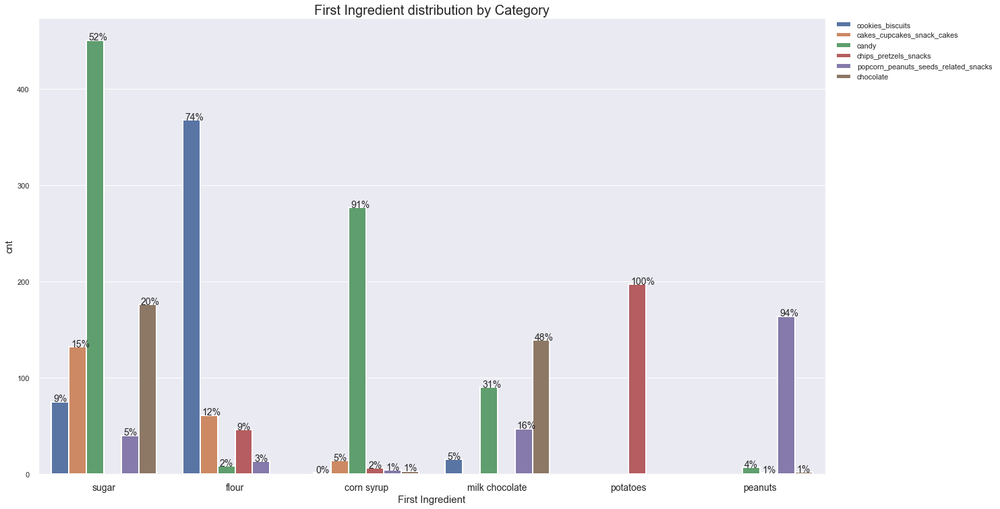

In [888]:
sns.set(rc={'figure.figsize':(20.7,10.27)})

ax = sns.countplot(x='first_ingredient', data=ingredients_decision_df,
                  # facecolor=(0, 0, 0, 0),
                   linewidth=2,
                   hue = ingredients_decision_df.category,
                   order=ingredients_decision_df.first_ingredient.value_counts().iloc[:6].index
                   #,legend=False
                  )
#ax.despine(left=True)
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)
plt.tight_layout()
plt.title("First Ingredient distribution by Category",fontsize=20)
ax.set_xlabel('First Ingredient',fontsize=15)
ax.set_ylabel('cnt',fontsize=15)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)

with_hue(ax, ingredients_decision_df.first_ingredient, 6, 6)    


It could be a good feature but probably has to many levels. We will examine few n top values to keep.

In [1149]:
n_first_ingredient_list = [50,100,150,200,250]
for n in n_first_ingredient_list:
    top_values = get_top_values_by_categories(n,'first_ingredient',ingredients_decision_df)
    ingredients_decision_df[f'first_ingredient_{n}'] = ingredients_decision_df.first_ingredient.map(lambda a: 'other' if a not in top_values else a) 

n =  50
# values 231
n =  100
# values 470
n =  150
# values 694
n =  200
# values 852
n =  250
# values 905


#### Word2Vec on all ingredients

First we filter all ingredients by minimum amount of appereances.<br>
We will perform Word2Vec for minimum apperences of 5,10,20 and check by cross validation what gives the best result.

In [859]:
def calc_mean_word2vec(column,word2vec_mapping_dict):  
    if column != []:
        result = [word2vec_mapping_dict[i].astype('float') for i in column]
        result =  np.mean(result,axis = 0 ).astype('float')
        return result
    return [np.nan for i in range(0,40)]

In [1150]:
n_list = [5,10,20,25,30,35,40,45,50]
# Getting the filtered list for minimum apperences of 5,10,20
full_ingredients_filterd_dict = {n: get_filtered_list(full_ingredients,n) for n in n_list}
# Remove the words in the df that don't appear on that list.
ingredients_for_vec_dict = {n: ingredients_decision_df.ingredients.map(lambda a: remove_keywords_from_df_column(a,full_ingredients_filterd_dict[n],",")) for n in n_list}
# Getting Word2Vec model for each n
model_ingredients_word2vec_dict = {n:  Word2Vec(ingredients_for_vec_dict[n].to_list(), vector_size=40, window=15, min_count=5, workers=4,epochs=100) for n in n_list}
# Getting words of Word2Vec model for each n
words_ingredients_word2vec_dict = {n: list(model_ingredients_word2vec_dict[n].wv.index_to_key) for n in n_list}
# Getting words of Word2Vec model for each n
vectors_ingredients_word2vec_dict = {n: np.asarray(model_ingredients_word2vec_dict[n].wv.vectors) for n in n_list}
# Create a dictionary of mapping word to vector for each n  
ingredients_word2vec_mapping_dict = {n: {words_ingredients_word2vec_dict[n][i]: vectors_ingredients_word2vec_dict[n][i] for i in range(len(words_ingredients_word2vec_dict[n]))} for n in n_list}
#Map the Word2Vec vectors to each ingredient and calculate the average of each coordinate in the vectors of each sentence. 
ingredients_vectors_dict= {n: ingredients_for_vec_dict[n].map(lambda a: calc_mean_word2vec(a,ingredients_word2vec_mapping_dict[n])) for n in n_list}
# Eventually add each averaged coordinate as a feature.
for n in n_list:
    df = pd.DataFrame(ingredients_vectors_dict[n])
    ingredients_decision_df[[f'ingredients_{n}_filtered_vec_{i}' for i in range(0,40)]]  = pd.DataFrame(df.ingredients.tolist(), columns=['ingredients_'+str(i) for i in range(0,40)])

remove words that have below 5 apperances
# Elements to drop 4877
# Elements after drop 837
remove words that have below 10 apperances
# Elements to drop 5194
# Elements after drop 520
remove words that have below 20 apperances
# Elements to drop 5384
# Elements after drop 330
remove words that have below 25 apperances
# Elements to drop 5428
# Elements after drop 286
remove words that have below 30 apperances
# Elements to drop 5457
# Elements after drop 257
remove words that have below 35 apperances
# Elements to drop 5481
# Elements after drop 234
remove words that have below 40 apperances
# Elements to drop 5492
# Elements after drop 223
remove words that have below 45 apperances
# Elements to drop 5513
# Elements after drop 202
remove words that have below 50 apperances
# Elements to drop 5525
# Elements after drop 190


#### CV between ingredients options

In [1156]:
kf_fe = KFold(n_splits=5)
# manual word count
n_list_manual = [10,20,50,70,90]
n_list_word2vec = [5,10,20,25,30,35,40,45,50]
kf_fe_dict_ingredients = {}
for n in n_list_manual:
    columns_list = [col for col in ingredients_decision_df.columns if 'nutrient' in col]
    columns_list.append('household_serving_fulltext')
    columns_list.append('is_houshold_unit')
    columns_list.extend([col for col in ingredients_decision_df.columns if 'description' in col])
    #add tested feature
    columns_list.extend([col for col in ingredients_decision_df.columns if f'is_ingredients_contain_exact_keyword_{n}' in col])
    X = pd.DataFrame(ingredients_decision_df[columns_list])
    y = pd.DataFrame(ingredients_decision_df['category'])
    cat_features = [columns_list.index('household_serving_fulltext')]
#     print(columns_list)
#     print(cat_features)
    kf_fe_dict_ingredients[f'manual{n}']=[]
    for train, test in kf_fe.split(ingredients_decision_df):
        train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
        train_dataset = Pool(data=train_data,
                             label=train_label,
                             cat_features=cat_features
                            )

        eval_dataset = Pool(data=eval_data,
                            label=eval_label,
                            cat_features=cat_features
                           )

        # Initialize CatBoostClassifier
        model = CatBoostClassifier(iterations=500,
                                   learning_rate=0.01,
                                   #depth=3,
                                   loss_function='MultiClass')
        # Fit model
        model.fit(train_dataset, early_stopping_rounds=10)
        # Get predicted classes
        preds_class = model.predict(eval_dataset)
        #Add accuracy to dict
        kf_fe_dict_ingredients[f'manual{n}'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7696650	total: 63ms	remaining: 31.4s
1:	learn: 1.7476327	total: 128ms	remaining: 31.8s
2:	learn: 1.7269683	total: 191ms	remaining: 31.6s
3:	learn: 1.7085078	total: 255ms	remaining: 31.6s
4:	learn: 1.6893506	total: 318ms	remaining: 31.4s
5:	learn: 1.6715836	total: 393ms	remaining: 32.4s
6:	learn: 1.6552172	total: 495ms	remaining: 34.8s
7:	learn: 1.6374738	total: 559ms	remaining: 34.4s
8:	learn: 1.6195488	total: 619ms	remaining: 33.8s
9:	learn: 1.6013535	total: 691ms	remaining: 33.9s
10:	learn: 1.5848198	total: 777ms	remaining: 34.5s
11:	learn: 1.5676060	total: 837ms	remaining: 34.1s
12:	learn: 1.5511994	total: 909ms	remaining: 34.1s
13:	learn: 1.5359870	total: 1.01s	remaining: 35.2s
14:	learn: 1.5225128	total: 1.09s	remaining: 35.4s
15:	learn: 1.5093767	total: 1.16s	remaining: 35.2s
16:	learn: 1.4949825	total: 1.23s	remaining: 34.9s
17:	learn: 1.4815887	total: 1.31s	remaining: 35s
18:	learn: 1.4695904	total: 1.37s	remaining: 34.7s
19:	learn: 1.4565340	total: 1.44s	remaining:

161:	learn: 0.6999001	total: 11.4s	remaining: 23.7s
162:	learn: 0.6976163	total: 11.4s	remaining: 23.6s
163:	learn: 0.6953287	total: 11.5s	remaining: 23.6s
164:	learn: 0.6933092	total: 11.6s	remaining: 23.5s
165:	learn: 0.6911520	total: 11.6s	remaining: 23.4s
166:	learn: 0.6895331	total: 11.7s	remaining: 23.3s
167:	learn: 0.6872633	total: 11.8s	remaining: 23.2s
168:	learn: 0.6852904	total: 11.8s	remaining: 23.2s
169:	learn: 0.6834589	total: 11.9s	remaining: 23.1s
170:	learn: 0.6815218	total: 11.9s	remaining: 23s
171:	learn: 0.6793777	total: 12s	remaining: 22.9s
172:	learn: 0.6770534	total: 12.1s	remaining: 22.8s
173:	learn: 0.6750919	total: 12.1s	remaining: 22.7s
174:	learn: 0.6733043	total: 12.2s	remaining: 22.7s
175:	learn: 0.6716092	total: 12.3s	remaining: 22.6s
176:	learn: 0.6697716	total: 12.4s	remaining: 22.6s
177:	learn: 0.6680127	total: 12.4s	remaining: 22.5s
178:	learn: 0.6661729	total: 12.5s	remaining: 22.4s
179:	learn: 0.6643769	total: 12.6s	remaining: 22.4s
180:	learn: 0.66

322:	learn: 0.4992847	total: 23.1s	remaining: 12.6s
323:	learn: 0.4984138	total: 23.1s	remaining: 12.6s
324:	learn: 0.4978474	total: 23.2s	remaining: 12.5s
325:	learn: 0.4970457	total: 23.3s	remaining: 12.4s
326:	learn: 0.4962928	total: 23.4s	remaining: 12.4s
327:	learn: 0.4956776	total: 23.4s	remaining: 12.3s
328:	learn: 0.4948586	total: 23.5s	remaining: 12.2s
329:	learn: 0.4941648	total: 23.6s	remaining: 12.1s
330:	learn: 0.4934781	total: 23.6s	remaining: 12.1s
331:	learn: 0.4928104	total: 23.7s	remaining: 12s
332:	learn: 0.4919943	total: 23.8s	remaining: 11.9s
333:	learn: 0.4913368	total: 23.8s	remaining: 11.8s
334:	learn: 0.4906113	total: 23.9s	remaining: 11.8s
335:	learn: 0.4899705	total: 24s	remaining: 11.7s
336:	learn: 0.4891896	total: 24s	remaining: 11.6s
337:	learn: 0.4884867	total: 24.1s	remaining: 11.5s
338:	learn: 0.4878883	total: 24.1s	remaining: 11.5s
339:	learn: 0.4872367	total: 24.2s	remaining: 11.4s
340:	learn: 0.4867848	total: 24.3s	remaining: 11.3s
341:	learn: 0.4860

483:	learn: 0.4213296	total: 33.9s	remaining: 1.12s
484:	learn: 0.4208926	total: 33.9s	remaining: 1.05s
485:	learn: 0.4207186	total: 34s	remaining: 979ms
486:	learn: 0.4203936	total: 34.1s	remaining: 909ms
487:	learn: 0.4199131	total: 34.1s	remaining: 839ms
488:	learn: 0.4195724	total: 34.2s	remaining: 769ms
489:	learn: 0.4191830	total: 34.3s	remaining: 699ms
490:	learn: 0.4189812	total: 34.3s	remaining: 629ms
491:	learn: 0.4186180	total: 34.4s	remaining: 559ms
492:	learn: 0.4182175	total: 34.5s	remaining: 489ms
493:	learn: 0.4179974	total: 34.5s	remaining: 419ms
494:	learn: 0.4177162	total: 34.6s	remaining: 349ms
495:	learn: 0.4173152	total: 34.7s	remaining: 279ms
496:	learn: 0.4170050	total: 34.7s	remaining: 210ms
497:	learn: 0.4167755	total: 34.8s	remaining: 140ms
498:	learn: 0.4164396	total: 34.9s	remaining: 69.9ms
499:	learn: 0.4161771	total: 34.9s	remaining: 0us
0:	learn: 1.7681036	total: 51.1ms	remaining: 25.5s
1:	learn: 1.7464344	total: 111ms	remaining: 27.5s
2:	learn: 1.725034

145:	learn: 0.7240228	total: 10.1s	remaining: 24.6s
146:	learn: 0.7208451	total: 10.3s	remaining: 24.7s
147:	learn: 0.7180822	total: 10.4s	remaining: 24.7s
148:	learn: 0.7151540	total: 10.5s	remaining: 24.8s
149:	learn: 0.7125233	total: 10.6s	remaining: 24.8s
150:	learn: 0.7098816	total: 10.8s	remaining: 24.9s
151:	learn: 0.7074932	total: 10.9s	remaining: 24.9s
152:	learn: 0.7049362	total: 11s	remaining: 24.9s
153:	learn: 0.7028088	total: 11.1s	remaining: 24.9s
154:	learn: 0.7002276	total: 11.2s	remaining: 24.8s
155:	learn: 0.6979254	total: 11.2s	remaining: 24.8s
156:	learn: 0.6956712	total: 11.3s	remaining: 24.7s
157:	learn: 0.6934086	total: 11.4s	remaining: 24.6s
158:	learn: 0.6912635	total: 11.4s	remaining: 24.6s
159:	learn: 0.6889694	total: 11.5s	remaining: 24.5s
160:	learn: 0.6866004	total: 11.6s	remaining: 24.5s
161:	learn: 0.6841890	total: 11.7s	remaining: 24.4s
162:	learn: 0.6823811	total: 11.8s	remaining: 24.3s
163:	learn: 0.6800668	total: 11.8s	remaining: 24.2s
164:	learn: 0.

304:	learn: 0.4920692	total: 21.8s	remaining: 13.9s
305:	learn: 0.4912050	total: 21.9s	remaining: 13.9s
306:	learn: 0.4904382	total: 21.9s	remaining: 13.8s
307:	learn: 0.4897752	total: 22s	remaining: 13.7s
308:	learn: 0.4890535	total: 22.1s	remaining: 13.7s
309:	learn: 0.4883649	total: 22.2s	remaining: 13.6s
310:	learn: 0.4876957	total: 22.3s	remaining: 13.5s
311:	learn: 0.4870263	total: 22.3s	remaining: 13.4s
312:	learn: 0.4862367	total: 22.4s	remaining: 13.4s
313:	learn: 0.4854967	total: 22.5s	remaining: 13.3s
314:	learn: 0.4846898	total: 22.5s	remaining: 13.2s
315:	learn: 0.4839979	total: 22.6s	remaining: 13.2s
316:	learn: 0.4833839	total: 22.7s	remaining: 13.1s
317:	learn: 0.4825391	total: 22.8s	remaining: 13s
318:	learn: 0.4816877	total: 22.9s	remaining: 13s
319:	learn: 0.4809461	total: 22.9s	remaining: 12.9s
320:	learn: 0.4802159	total: 23s	remaining: 12.8s
321:	learn: 0.4794416	total: 23.1s	remaining: 12.8s
322:	learn: 0.4785907	total: 23.2s	remaining: 12.7s
323:	learn: 0.478036

464:	learn: 0.4079516	total: 32.9s	remaining: 2.48s
465:	learn: 0.4075011	total: 33s	remaining: 2.4s
466:	learn: 0.4070586	total: 33s	remaining: 2.33s
467:	learn: 0.4067150	total: 33.1s	remaining: 2.26s
468:	learn: 0.4064484	total: 33.2s	remaining: 2.19s
469:	learn: 0.4060513	total: 33.2s	remaining: 2.12s
470:	learn: 0.4057622	total: 33.3s	remaining: 2.05s
471:	learn: 0.4053244	total: 33.4s	remaining: 1.98s
472:	learn: 0.4050134	total: 33.5s	remaining: 1.91s
473:	learn: 0.4046251	total: 33.5s	remaining: 1.84s
474:	learn: 0.4042957	total: 33.6s	remaining: 1.77s
475:	learn: 0.4039404	total: 33.7s	remaining: 1.7s
476:	learn: 0.4036194	total: 33.8s	remaining: 1.63s
477:	learn: 0.4033650	total: 33.8s	remaining: 1.56s
478:	learn: 0.4030139	total: 33.9s	remaining: 1.49s
479:	learn: 0.4026912	total: 34s	remaining: 1.42s
480:	learn: 0.4022858	total: 34s	remaining: 1.34s
481:	learn: 0.4019027	total: 34.1s	remaining: 1.27s
482:	learn: 0.4014826	total: 34.2s	remaining: 1.2s
483:	learn: 0.4012223	t

126:	learn: 0.7856175	total: 9.49s	remaining: 27.9s
127:	learn: 0.7825208	total: 9.56s	remaining: 27.8s
128:	learn: 0.7792796	total: 9.63s	remaining: 27.7s
129:	learn: 0.7757953	total: 9.72s	remaining: 27.7s
130:	learn: 0.7725683	total: 9.79s	remaining: 27.6s
131:	learn: 0.7696185	total: 9.86s	remaining: 27.5s
132:	learn: 0.7666827	total: 9.93s	remaining: 27.4s
133:	learn: 0.7637378	total: 9.99s	remaining: 27.3s
134:	learn: 0.7608561	total: 10.1s	remaining: 27.2s
135:	learn: 0.7580239	total: 10.1s	remaining: 27.1s
136:	learn: 0.7548716	total: 10.2s	remaining: 27s
137:	learn: 0.7519961	total: 10.3s	remaining: 27.1s
138:	learn: 0.7488518	total: 10.4s	remaining: 27s
139:	learn: 0.7457482	total: 10.5s	remaining: 26.9s
140:	learn: 0.7431186	total: 10.5s	remaining: 26.9s
141:	learn: 0.7400202	total: 10.6s	remaining: 26.7s
142:	learn: 0.7371221	total: 10.7s	remaining: 26.6s
143:	learn: 0.7340216	total: 10.7s	remaining: 26.5s
144:	learn: 0.7314369	total: 10.8s	remaining: 26.5s
145:	learn: 0.72

286:	learn: 0.5144478	total: 22.9s	remaining: 17s
287:	learn: 0.5134909	total: 23s	remaining: 16.9s
288:	learn: 0.5125493	total: 23.1s	remaining: 16.9s
289:	learn: 0.5116573	total: 23.2s	remaining: 16.8s
290:	learn: 0.5106496	total: 23.2s	remaining: 16.7s
291:	learn: 0.5098114	total: 23.3s	remaining: 16.6s
292:	learn: 0.5088797	total: 23.4s	remaining: 16.5s
293:	learn: 0.5078624	total: 23.5s	remaining: 16.4s
294:	learn: 0.5069471	total: 23.6s	remaining: 16.4s
295:	learn: 0.5061248	total: 23.6s	remaining: 16.3s
296:	learn: 0.5054262	total: 23.8s	remaining: 16.2s
297:	learn: 0.5045429	total: 23.9s	remaining: 16.2s
298:	learn: 0.5037075	total: 24s	remaining: 16.1s
299:	learn: 0.5028010	total: 24s	remaining: 16s
300:	learn: 0.5020977	total: 24.1s	remaining: 16s
301:	learn: 0.5013317	total: 24.2s	remaining: 15.9s
302:	learn: 0.5003720	total: 24.3s	remaining: 15.8s
303:	learn: 0.4996793	total: 24.4s	remaining: 15.7s
304:	learn: 0.4989313	total: 24.5s	remaining: 15.6s
305:	learn: 0.4980728	to

447:	learn: 0.4214901	total: 35.5s	remaining: 4.12s
448:	learn: 0.4211309	total: 35.5s	remaining: 4.04s
449:	learn: 0.4207977	total: 35.6s	remaining: 3.96s
450:	learn: 0.4203876	total: 35.7s	remaining: 3.88s
451:	learn: 0.4198825	total: 35.8s	remaining: 3.8s
452:	learn: 0.4195346	total: 35.8s	remaining: 3.72s
453:	learn: 0.4191439	total: 35.9s	remaining: 3.64s
454:	learn: 0.4187137	total: 36s	remaining: 3.56s
455:	learn: 0.4182458	total: 36s	remaining: 3.48s
456:	learn: 0.4178739	total: 36.1s	remaining: 3.4s
457:	learn: 0.4175326	total: 36.2s	remaining: 3.32s
458:	learn: 0.4171596	total: 36.3s	remaining: 3.24s
459:	learn: 0.4167763	total: 36.3s	remaining: 3.16s
460:	learn: 0.4164690	total: 36.4s	remaining: 3.08s
461:	learn: 0.4161147	total: 36.5s	remaining: 3s
462:	learn: 0.4157601	total: 36.6s	remaining: 2.92s
463:	learn: 0.4154133	total: 36.6s	remaining: 2.84s
464:	learn: 0.4151190	total: 36.7s	remaining: 2.76s
465:	learn: 0.4147795	total: 36.8s	remaining: 2.69s
466:	learn: 0.4144360

109:	learn: 0.8320768	total: 8.84s	remaining: 31.4s
110:	learn: 0.8282228	total: 8.92s	remaining: 31.3s
111:	learn: 0.8239576	total: 8.99s	remaining: 31.1s
112:	learn: 0.8200057	total: 9.08s	remaining: 31.1s
113:	learn: 0.8163805	total: 9.15s	remaining: 31s
114:	learn: 0.8129801	total: 9.23s	remaining: 30.9s
115:	learn: 0.8094012	total: 9.31s	remaining: 30.8s
116:	learn: 0.8058825	total: 9.4s	remaining: 30.8s
117:	learn: 0.8024416	total: 9.49s	remaining: 30.7s
118:	learn: 0.7988564	total: 9.6s	remaining: 30.8s
119:	learn: 0.7951885	total: 9.71s	remaining: 30.7s
120:	learn: 0.7914961	total: 9.78s	remaining: 30.6s
121:	learn: 0.7877998	total: 9.86s	remaining: 30.5s
122:	learn: 0.7843535	total: 9.94s	remaining: 30.5s
123:	learn: 0.7808794	total: 10s	remaining: 30.4s
124:	learn: 0.7772876	total: 10.1s	remaining: 30.2s
125:	learn: 0.7737799	total: 10.2s	remaining: 30.2s
126:	learn: 0.7708237	total: 10.2s	remaining: 30s
127:	learn: 0.7672950	total: 10.3s	remaining: 29.9s
128:	learn: 0.763901

269:	learn: 0.5127973	total: 21.2s	remaining: 18.1s
270:	learn: 0.5118014	total: 21.3s	remaining: 18s
271:	learn: 0.5110311	total: 21.4s	remaining: 17.9s
272:	learn: 0.5099999	total: 21.5s	remaining: 17.8s
273:	learn: 0.5090968	total: 21.5s	remaining: 17.8s
274:	learn: 0.5080054	total: 21.6s	remaining: 17.7s
275:	learn: 0.5069891	total: 21.7s	remaining: 17.6s
276:	learn: 0.5060612	total: 21.7s	remaining: 17.5s
277:	learn: 0.5051238	total: 21.8s	remaining: 17.4s
278:	learn: 0.5043157	total: 21.9s	remaining: 17.3s
279:	learn: 0.5035560	total: 21.9s	remaining: 17.2s
280:	learn: 0.5026628	total: 22s	remaining: 17.1s
281:	learn: 0.5018521	total: 22.1s	remaining: 17.1s
282:	learn: 0.5010513	total: 22.1s	remaining: 17s
283:	learn: 0.5001531	total: 22.2s	remaining: 16.9s
284:	learn: 0.4992844	total: 22.3s	remaining: 16.8s
285:	learn: 0.4983364	total: 22.3s	remaining: 16.7s
286:	learn: 0.4974351	total: 22.4s	remaining: 16.6s
287:	learn: 0.4964246	total: 22.5s	remaining: 16.6s
288:	learn: 0.4955

428:	learn: 0.4134993	total: 33.8s	remaining: 5.59s
429:	learn: 0.4131440	total: 33.8s	remaining: 5.51s
430:	learn: 0.4127931	total: 33.9s	remaining: 5.43s
431:	learn: 0.4123540	total: 34s	remaining: 5.35s
432:	learn: 0.4119655	total: 34s	remaining: 5.27s
433:	learn: 0.4113536	total: 34.1s	remaining: 5.19s
434:	learn: 0.4109675	total: 34.2s	remaining: 5.11s
435:	learn: 0.4106684	total: 34.3s	remaining: 5.03s
436:	learn: 0.4103065	total: 34.3s	remaining: 4.95s
437:	learn: 0.4097990	total: 34.4s	remaining: 4.87s
438:	learn: 0.4094100	total: 34.5s	remaining: 4.79s
439:	learn: 0.4090337	total: 34.6s	remaining: 4.71s
440:	learn: 0.4086013	total: 34.6s	remaining: 4.63s
441:	learn: 0.4082976	total: 34.7s	remaining: 4.55s
442:	learn: 0.4079141	total: 34.8s	remaining: 4.47s
443:	learn: 0.4075809	total: 34.8s	remaining: 4.39s
444:	learn: 0.4072053	total: 34.9s	remaining: 4.32s
445:	learn: 0.4068502	total: 35s	remaining: 4.24s
446:	learn: 0.4065968	total: 35.1s	remaining: 4.16s
447:	learn: 0.4062

90:	learn: 0.9299431	total: 7.96s	remaining: 35.8s
91:	learn: 0.9256841	total: 8.07s	remaining: 35.8s
92:	learn: 0.9216573	total: 8.18s	remaining: 35.8s
93:	learn: 0.9176701	total: 8.26s	remaining: 35.7s
94:	learn: 0.9135309	total: 8.35s	remaining: 35.6s
95:	learn: 0.9098000	total: 8.45s	remaining: 35.6s
96:	learn: 0.9056628	total: 8.54s	remaining: 35.5s
97:	learn: 0.9019139	total: 8.61s	remaining: 35.3s
98:	learn: 0.8980664	total: 8.68s	remaining: 35.2s
99:	learn: 0.8941732	total: 8.76s	remaining: 35s
100:	learn: 0.8888100	total: 8.83s	remaining: 34.9s
101:	learn: 0.8837511	total: 8.9s	remaining: 34.7s
102:	learn: 0.8789291	total: 8.98s	remaining: 34.6s
103:	learn: 0.8740181	total: 9.13s	remaining: 34.7s
104:	learn: 0.8695574	total: 9.25s	remaining: 34.8s
105:	learn: 0.8652153	total: 9.33s	remaining: 34.7s
106:	learn: 0.8601927	total: 9.39s	remaining: 34.5s
107:	learn: 0.8555090	total: 9.47s	remaining: 34.4s
108:	learn: 0.8508609	total: 9.54s	remaining: 34.2s
109:	learn: 0.8464338	tot

250:	learn: 0.5382116	total: 20.8s	remaining: 20.7s
251:	learn: 0.5370683	total: 20.9s	remaining: 20.6s
252:	learn: 0.5359563	total: 21s	remaining: 20.5s
253:	learn: 0.5348261	total: 21s	remaining: 20.4s
254:	learn: 0.5337966	total: 21.1s	remaining: 20.3s
255:	learn: 0.5328700	total: 21.2s	remaining: 20.2s
256:	learn: 0.5317809	total: 21.3s	remaining: 20.1s
257:	learn: 0.5309487	total: 21.4s	remaining: 20.1s
258:	learn: 0.5298528	total: 21.5s	remaining: 20s
259:	learn: 0.5288193	total: 21.6s	remaining: 19.9s
260:	learn: 0.5278308	total: 21.7s	remaining: 19.9s
261:	learn: 0.5266244	total: 21.8s	remaining: 19.8s
262:	learn: 0.5254734	total: 21.9s	remaining: 19.7s
263:	learn: 0.5247203	total: 22s	remaining: 19.6s
264:	learn: 0.5236785	total: 22s	remaining: 19.6s
265:	learn: 0.5225027	total: 22.1s	remaining: 19.5s
266:	learn: 0.5214012	total: 22.2s	remaining: 19.4s
267:	learn: 0.5203456	total: 22.3s	remaining: 19.3s
268:	learn: 0.5193246	total: 22.4s	remaining: 19.2s
269:	learn: 0.5181878	

409:	learn: 0.4270939	total: 33.7s	remaining: 7.39s
410:	learn: 0.4266637	total: 33.8s	remaining: 7.32s
411:	learn: 0.4263613	total: 33.9s	remaining: 7.24s
412:	learn: 0.4259994	total: 34s	remaining: 7.16s
413:	learn: 0.4256365	total: 34.1s	remaining: 7.08s
414:	learn: 0.4252553	total: 34.2s	remaining: 7s
415:	learn: 0.4247707	total: 34.2s	remaining: 6.92s
416:	learn: 0.4243178	total: 34.3s	remaining: 6.83s
417:	learn: 0.4238871	total: 34.4s	remaining: 6.75s
418:	learn: 0.4233201	total: 34.5s	remaining: 6.67s
419:	learn: 0.4227817	total: 34.6s	remaining: 6.58s
420:	learn: 0.4223364	total: 34.6s	remaining: 6.5s
421:	learn: 0.4218408	total: 34.7s	remaining: 6.42s
422:	learn: 0.4215725	total: 34.8s	remaining: 6.33s
423:	learn: 0.4210511	total: 34.9s	remaining: 6.25s
424:	learn: 0.4207649	total: 35s	remaining: 6.17s
425:	learn: 0.4203003	total: 35s	remaining: 6.08s
426:	learn: 0.4199346	total: 35.1s	remaining: 6s
427:	learn: 0.4195105	total: 35.2s	remaining: 5.92s
428:	learn: 0.4191823	tot

70:	learn: 1.0406410	total: 5.95s	remaining: 36s
71:	learn: 1.0356386	total: 6.02s	remaining: 35.8s
72:	learn: 1.0306080	total: 6.11s	remaining: 35.8s
73:	learn: 1.0253194	total: 6.19s	remaining: 35.6s
74:	learn: 1.0200320	total: 6.27s	remaining: 35.5s
75:	learn: 1.0154282	total: 6.35s	remaining: 35.4s
76:	learn: 1.0098949	total: 6.43s	remaining: 35.3s
77:	learn: 1.0047644	total: 6.5s	remaining: 35.2s
78:	learn: 1.0003638	total: 6.59s	remaining: 35.1s
79:	learn: 0.9957745	total: 6.66s	remaining: 35s
80:	learn: 0.9909235	total: 6.74s	remaining: 34.8s
81:	learn: 0.9862628	total: 6.8s	remaining: 34.7s
82:	learn: 0.9817419	total: 6.88s	remaining: 34.6s
83:	learn: 0.9772634	total: 6.95s	remaining: 34.4s
84:	learn: 0.9730258	total: 7.05s	remaining: 34.4s
85:	learn: 0.9684538	total: 7.13s	remaining: 34.3s
86:	learn: 0.9638368	total: 7.23s	remaining: 34.3s
87:	learn: 0.9594590	total: 7.3s	remaining: 34.2s
88:	learn: 0.9549617	total: 7.38s	remaining: 34.1s
89:	learn: 0.9508096	total: 7.47s	rema

231:	learn: 0.5833706	total: 18.9s	remaining: 21.8s
232:	learn: 0.5821201	total: 19s	remaining: 21.7s
233:	learn: 0.5808548	total: 19s	remaining: 21.6s
234:	learn: 0.5793891	total: 19.1s	remaining: 21.6s
235:	learn: 0.5783408	total: 19.2s	remaining: 21.5s
236:	learn: 0.5770042	total: 19.3s	remaining: 21.4s
237:	learn: 0.5757679	total: 19.3s	remaining: 21.3s
238:	learn: 0.5745341	total: 19.4s	remaining: 21.2s
239:	learn: 0.5732074	total: 19.5s	remaining: 21.1s
240:	learn: 0.5719616	total: 19.6s	remaining: 21s
241:	learn: 0.5705291	total: 19.7s	remaining: 21s
242:	learn: 0.5695886	total: 19.7s	remaining: 20.9s
243:	learn: 0.5685333	total: 19.8s	remaining: 20.8s
244:	learn: 0.5675523	total: 19.9s	remaining: 20.7s
245:	learn: 0.5662869	total: 20s	remaining: 20.6s
246:	learn: 0.5649971	total: 20s	remaining: 20.5s
247:	learn: 0.5637986	total: 20.1s	remaining: 20.4s
248:	learn: 0.5626877	total: 20.2s	remaining: 20.3s
249:	learn: 0.5615644	total: 20.3s	remaining: 20.3s
250:	learn: 0.5604018	to

391:	learn: 0.4579013	total: 31.2s	remaining: 8.59s
392:	learn: 0.4573603	total: 31.2s	remaining: 8.5s
393:	learn: 0.4567761	total: 31.3s	remaining: 8.43s
394:	learn: 0.4563490	total: 31.4s	remaining: 8.35s
395:	learn: 0.4557881	total: 31.5s	remaining: 8.27s
396:	learn: 0.4551938	total: 31.6s	remaining: 8.19s
397:	learn: 0.4547149	total: 31.6s	remaining: 8.11s
398:	learn: 0.4543053	total: 31.7s	remaining: 8.03s
399:	learn: 0.4537982	total: 31.8s	remaining: 7.95s
400:	learn: 0.4532369	total: 31.9s	remaining: 7.87s
401:	learn: 0.4526373	total: 32s	remaining: 7.79s
402:	learn: 0.4520958	total: 32s	remaining: 7.71s
403:	learn: 0.4516660	total: 32.1s	remaining: 7.63s
404:	learn: 0.4511526	total: 32.2s	remaining: 7.55s
405:	learn: 0.4505635	total: 32.3s	remaining: 7.47s
406:	learn: 0.4501176	total: 32.4s	remaining: 7.39s
407:	learn: 0.4496543	total: 32.4s	remaining: 7.31s
408:	learn: 0.4492900	total: 32.5s	remaining: 7.24s
409:	learn: 0.4487408	total: 32.6s	remaining: 7.16s
410:	learn: 0.448

52:	learn: 1.1422378	total: 4.93s	remaining: 41.6s
53:	learn: 1.1357499	total: 5.04s	remaining: 41.6s
54:	learn: 1.1281971	total: 5.14s	remaining: 41.6s
55:	learn: 1.1221946	total: 5.24s	remaining: 41.5s
56:	learn: 1.1156855	total: 5.34s	remaining: 41.5s
57:	learn: 1.1083218	total: 5.43s	remaining: 41.4s
58:	learn: 1.1018987	total: 5.53s	remaining: 41.3s
59:	learn: 1.0954584	total: 5.6s	remaining: 41.1s
60:	learn: 1.0890709	total: 5.68s	remaining: 40.9s
61:	learn: 1.0839116	total: 5.75s	remaining: 40.7s
62:	learn: 1.0773544	total: 5.83s	remaining: 40.4s
63:	learn: 1.0711680	total: 5.9s	remaining: 40.2s
64:	learn: 1.0651834	total: 5.97s	remaining: 40s
65:	learn: 1.0589477	total: 6.05s	remaining: 39.8s
66:	learn: 1.0531442	total: 6.13s	remaining: 39.6s
67:	learn: 1.0478177	total: 6.2s	remaining: 39.4s
68:	learn: 1.0416269	total: 6.28s	remaining: 39.2s
69:	learn: 1.0365753	total: 6.36s	remaining: 39s
70:	learn: 1.0309484	total: 6.46s	remaining: 39.1s
71:	learn: 1.0255507	total: 6.58s	rema

214:	learn: 0.5904020	total: 19s	remaining: 25.2s
215:	learn: 0.5888735	total: 19.1s	remaining: 25.1s
216:	learn: 0.5874367	total: 19.2s	remaining: 25s
217:	learn: 0.5861844	total: 19.2s	remaining: 24.9s
218:	learn: 0.5850110	total: 19.3s	remaining: 24.8s
219:	learn: 0.5838757	total: 19.4s	remaining: 24.7s
220:	learn: 0.5826025	total: 19.5s	remaining: 24.6s
221:	learn: 0.5810393	total: 19.6s	remaining: 24.5s
222:	learn: 0.5798232	total: 19.7s	remaining: 24.4s
223:	learn: 0.5782968	total: 19.7s	remaining: 24.3s
224:	learn: 0.5768585	total: 19.8s	remaining: 24.2s
225:	learn: 0.5751959	total: 19.9s	remaining: 24.1s
226:	learn: 0.5739444	total: 20s	remaining: 24.1s
227:	learn: 0.5725624	total: 20.1s	remaining: 24s
228:	learn: 0.5712564	total: 20.2s	remaining: 24s
229:	learn: 0.5701569	total: 20.3s	remaining: 23.9s
230:	learn: 0.5690006	total: 20.4s	remaining: 23.8s
231:	learn: 0.5677229	total: 20.5s	remaining: 23.7s
232:	learn: 0.5663137	total: 20.6s	remaining: 23.6s
233:	learn: 0.5650807	

373:	learn: 0.4485588	total: 32.2s	remaining: 10.9s
374:	learn: 0.4480298	total: 32.3s	remaining: 10.8s
375:	learn: 0.4473952	total: 32.4s	remaining: 10.7s
376:	learn: 0.4468804	total: 32.5s	remaining: 10.6s
377:	learn: 0.4462556	total: 32.6s	remaining: 10.5s
378:	learn: 0.4456538	total: 32.6s	remaining: 10.4s
379:	learn: 0.4452244	total: 32.7s	remaining: 10.3s
380:	learn: 0.4447801	total: 32.8s	remaining: 10.2s
381:	learn: 0.4441033	total: 32.9s	remaining: 10.2s
382:	learn: 0.4436372	total: 33s	remaining: 10.1s
383:	learn: 0.4431329	total: 33.1s	remaining: 9.99s
384:	learn: 0.4425116	total: 33.2s	remaining: 9.9s
385:	learn: 0.4419009	total: 33.2s	remaining: 9.82s
386:	learn: 0.4413981	total: 33.3s	remaining: 9.73s
387:	learn: 0.4409482	total: 33.4s	remaining: 9.64s
388:	learn: 0.4405548	total: 33.5s	remaining: 9.55s
389:	learn: 0.4401045	total: 33.6s	remaining: 9.46s
390:	learn: 0.4395964	total: 33.7s	remaining: 9.38s
391:	learn: 0.4391046	total: 33.7s	remaining: 9.29s
392:	learn: 0.4

33:	learn: 1.2929090	total: 2.46s	remaining: 33.7s
34:	learn: 1.2832142	total: 2.53s	remaining: 33.6s
35:	learn: 1.2743962	total: 2.62s	remaining: 33.8s
36:	learn: 1.2651741	total: 2.73s	remaining: 34.1s
37:	learn: 1.2554917	total: 2.81s	remaining: 34.2s
38:	learn: 1.2465558	total: 2.88s	remaining: 34.1s
39:	learn: 1.2378492	total: 2.96s	remaining: 34s
40:	learn: 1.2288988	total: 3.04s	remaining: 34s
41:	learn: 1.2206811	total: 3.11s	remaining: 33.9s
42:	learn: 1.2123796	total: 3.19s	remaining: 33.9s
43:	learn: 1.2050365	total: 3.26s	remaining: 33.8s
44:	learn: 1.1973791	total: 3.36s	remaining: 34s
45:	learn: 1.1891799	total: 3.46s	remaining: 34.2s
46:	learn: 1.1817209	total: 3.54s	remaining: 34.2s
47:	learn: 1.1747102	total: 3.62s	remaining: 34.1s
48:	learn: 1.1666810	total: 3.71s	remaining: 34.1s
49:	learn: 1.1588914	total: 3.8s	remaining: 34.2s
50:	learn: 1.1512235	total: 3.87s	remaining: 34.1s
51:	learn: 1.1438097	total: 3.95s	remaining: 34s
52:	learn: 1.1368323	total: 4.03s	remain

195:	learn: 0.6182017	total: 15.5s	remaining: 24s
196:	learn: 0.6164116	total: 15.6s	remaining: 23.9s
197:	learn: 0.6145853	total: 15.6s	remaining: 23.9s
198:	learn: 0.6129768	total: 15.7s	remaining: 23.8s
199:	learn: 0.6115847	total: 15.8s	remaining: 23.7s
200:	learn: 0.6099232	total: 15.9s	remaining: 23.7s
201:	learn: 0.6085772	total: 16s	remaining: 23.6s
202:	learn: 0.6068876	total: 16.1s	remaining: 23.5s
203:	learn: 0.6055337	total: 16.2s	remaining: 23.5s
204:	learn: 0.6040233	total: 16.2s	remaining: 23.4s
205:	learn: 0.6023024	total: 16.3s	remaining: 23.3s
206:	learn: 0.6007285	total: 16.4s	remaining: 23.2s
207:	learn: 0.5995067	total: 16.5s	remaining: 23.1s
208:	learn: 0.5979608	total: 16.6s	remaining: 23.1s
209:	learn: 0.5967433	total: 16.6s	remaining: 23s
210:	learn: 0.5953727	total: 16.7s	remaining: 22.9s
211:	learn: 0.5938933	total: 16.8s	remaining: 22.8s
212:	learn: 0.5925921	total: 16.9s	remaining: 22.8s
213:	learn: 0.5909032	total: 17s	remaining: 22.8s
214:	learn: 0.589496

355:	learn: 0.4638551	total: 29.7s	remaining: 12s
356:	learn: 0.4631872	total: 29.8s	remaining: 11.9s
357:	learn: 0.4625992	total: 29.9s	remaining: 11.9s
358:	learn: 0.4618854	total: 30s	remaining: 11.8s
359:	learn: 0.4613527	total: 30.1s	remaining: 11.7s
360:	learn: 0.4607638	total: 30.2s	remaining: 11.6s
361:	learn: 0.4601004	total: 30.3s	remaining: 11.5s
362:	learn: 0.4593899	total: 30.4s	remaining: 11.5s
363:	learn: 0.4586458	total: 30.5s	remaining: 11.4s
364:	learn: 0.4582544	total: 30.5s	remaining: 11.3s
365:	learn: 0.4576457	total: 30.6s	remaining: 11.2s
366:	learn: 0.4570311	total: 30.7s	remaining: 11.1s
367:	learn: 0.4564602	total: 30.8s	remaining: 11s
368:	learn: 0.4558478	total: 30.8s	remaining: 10.9s
369:	learn: 0.4554972	total: 30.9s	remaining: 10.9s
370:	learn: 0.4549569	total: 31s	remaining: 10.8s
371:	learn: 0.4544198	total: 31.1s	remaining: 10.7s
372:	learn: 0.4539087	total: 31.1s	remaining: 10.6s
373:	learn: 0.4534306	total: 31.2s	remaining: 10.5s
374:	learn: 0.452884

14:	learn: 1.5075996	total: 1.27s	remaining: 41s
15:	learn: 1.4936663	total: 1.38s	remaining: 41.9s
16:	learn: 1.4789870	total: 1.47s	remaining: 41.8s
17:	learn: 1.4647282	total: 1.55s	remaining: 41.5s
18:	learn: 1.4507666	total: 1.64s	remaining: 41.6s
19:	learn: 1.4373868	total: 1.74s	remaining: 41.8s
20:	learn: 1.4248498	total: 1.83s	remaining: 41.8s
21:	learn: 1.4136703	total: 1.92s	remaining: 41.8s
22:	learn: 1.4022273	total: 2.01s	remaining: 41.7s
23:	learn: 1.3894041	total: 2.09s	remaining: 41.5s
24:	learn: 1.3784120	total: 2.17s	remaining: 41.3s
25:	learn: 1.3671215	total: 2.26s	remaining: 41.2s
26:	learn: 1.3553721	total: 2.35s	remaining: 41.1s
27:	learn: 1.3449202	total: 2.44s	remaining: 41.1s
28:	learn: 1.3341210	total: 2.51s	remaining: 40.8s
29:	learn: 1.3239833	total: 2.59s	remaining: 40.6s
30:	learn: 1.3129893	total: 2.67s	remaining: 40.4s
31:	learn: 1.3031450	total: 2.75s	remaining: 40.2s
32:	learn: 1.2924269	total: 2.82s	remaining: 39.9s
33:	learn: 1.2826669	total: 2.9s	

175:	learn: 0.6439411	total: 15.6s	remaining: 28.7s
176:	learn: 0.6419203	total: 15.7s	remaining: 28.6s
177:	learn: 0.6400337	total: 15.8s	remaining: 28.5s
178:	learn: 0.6378093	total: 15.9s	remaining: 28.4s
179:	learn: 0.6361759	total: 15.9s	remaining: 28.3s
180:	learn: 0.6346106	total: 16s	remaining: 28.2s
181:	learn: 0.6327195	total: 16.1s	remaining: 28.1s
182:	learn: 0.6309267	total: 16.2s	remaining: 28s
183:	learn: 0.6290731	total: 16.3s	remaining: 27.9s
184:	learn: 0.6271927	total: 16.3s	remaining: 27.8s
185:	learn: 0.6255309	total: 16.4s	remaining: 27.7s
186:	learn: 0.6237147	total: 16.5s	remaining: 27.6s
187:	learn: 0.6217510	total: 16.6s	remaining: 27.6s
188:	learn: 0.6199888	total: 16.7s	remaining: 27.5s
189:	learn: 0.6181425	total: 16.8s	remaining: 27.4s
190:	learn: 0.6161927	total: 16.9s	remaining: 27.3s
191:	learn: 0.6145646	total: 16.9s	remaining: 27.1s
192:	learn: 0.6128314	total: 17s	remaining: 27.1s
193:	learn: 0.6112670	total: 17.1s	remaining: 26.9s
194:	learn: 0.6093

336:	learn: 0.4601315	total: 28.7s	remaining: 13.9s
337:	learn: 0.4595168	total: 28.7s	remaining: 13.8s
338:	learn: 0.4589154	total: 28.8s	remaining: 13.7s
339:	learn: 0.4581439	total: 28.9s	remaining: 13.6s
340:	learn: 0.4573040	total: 29s	remaining: 13.5s
341:	learn: 0.4566693	total: 29s	remaining: 13.4s
342:	learn: 0.4559935	total: 29.1s	remaining: 13.3s
343:	learn: 0.4552474	total: 29.2s	remaining: 13.2s
344:	learn: 0.4546365	total: 29.3s	remaining: 13.2s
345:	learn: 0.4541535	total: 29.4s	remaining: 13.1s
346:	learn: 0.4534682	total: 29.4s	remaining: 13s
347:	learn: 0.4529037	total: 29.5s	remaining: 12.9s
348:	learn: 0.4522360	total: 29.6s	remaining: 12.8s
349:	learn: 0.4517471	total: 29.7s	remaining: 12.7s
350:	learn: 0.4511506	total: 29.8s	remaining: 12.6s
351:	learn: 0.4503911	total: 29.9s	remaining: 12.6s
352:	learn: 0.4498549	total: 29.9s	remaining: 12.5s
353:	learn: 0.4492368	total: 30s	remaining: 12.4s
354:	learn: 0.4486899	total: 30.1s	remaining: 12.3s
355:	learn: 0.447973

495:	learn: 0.3881200	total: 41.6s	remaining: 336ms
496:	learn: 0.3879214	total: 41.7s	remaining: 252ms
497:	learn: 0.3876597	total: 41.8s	remaining: 168ms
498:	learn: 0.3873359	total: 41.9s	remaining: 83.9ms
499:	learn: 0.3870200	total: 42s	remaining: 0us
0:	learn: 1.7683100	total: 61.3ms	remaining: 30.6s
1:	learn: 1.7453595	total: 130ms	remaining: 32.4s
2:	learn: 1.7236491	total: 215ms	remaining: 35.7s
3:	learn: 1.7030066	total: 314ms	remaining: 38.9s
4:	learn: 1.6808786	total: 392ms	remaining: 38.8s
5:	learn: 1.6624162	total: 477ms	remaining: 39.2s
6:	learn: 1.6430684	total: 561ms	remaining: 39.5s
7:	learn: 1.6242439	total: 633ms	remaining: 38.9s
8:	learn: 1.6058465	total: 724ms	remaining: 39.5s
9:	learn: 1.5884042	total: 814ms	remaining: 39.9s
10:	learn: 1.5711595	total: 896ms	remaining: 39.8s
11:	learn: 1.5553836	total: 987ms	remaining: 40.1s
12:	learn: 1.5401835	total: 1.06s	remaining: 39.8s
13:	learn: 1.5238150	total: 1.14s	remaining: 39.5s
14:	learn: 1.5094750	total: 1.22s	rema

158:	learn: 0.6932321	total: 14.1s	remaining: 30.3s
159:	learn: 0.6912325	total: 14.2s	remaining: 30.2s
160:	learn: 0.6887558	total: 14.3s	remaining: 30.1s
161:	learn: 0.6865949	total: 14.3s	remaining: 29.9s
162:	learn: 0.6842177	total: 14.4s	remaining: 29.8s
163:	learn: 0.6820150	total: 14.5s	remaining: 29.7s
164:	learn: 0.6797347	total: 14.6s	remaining: 29.5s
165:	learn: 0.6775344	total: 14.6s	remaining: 29.4s
166:	learn: 0.6752352	total: 14.7s	remaining: 29.3s
167:	learn: 0.6729728	total: 14.8s	remaining: 29.2s
168:	learn: 0.6710032	total: 14.8s	remaining: 29s
169:	learn: 0.6686502	total: 14.9s	remaining: 28.9s
170:	learn: 0.6664923	total: 15s	remaining: 28.8s
171:	learn: 0.6643866	total: 15.1s	remaining: 28.7s
172:	learn: 0.6623442	total: 15.1s	remaining: 28.6s
173:	learn: 0.6601776	total: 15.2s	remaining: 28.5s
174:	learn: 0.6583075	total: 15.3s	remaining: 28.4s
175:	learn: 0.6561894	total: 15.3s	remaining: 28.2s
176:	learn: 0.6540515	total: 15.4s	remaining: 28.1s
177:	learn: 0.65

317:	learn: 0.4809641	total: 27.8s	remaining: 15.9s
318:	learn: 0.4801269	total: 27.9s	remaining: 15.8s
319:	learn: 0.4794696	total: 28s	remaining: 15.7s
320:	learn: 0.4787198	total: 28.1s	remaining: 15.6s
321:	learn: 0.4781503	total: 28.1s	remaining: 15.6s
322:	learn: 0.4775863	total: 28.2s	remaining: 15.5s
323:	learn: 0.4769383	total: 28.3s	remaining: 15.4s
324:	learn: 0.4762585	total: 28.3s	remaining: 15.3s
325:	learn: 0.4753768	total: 28.4s	remaining: 15.2s
326:	learn: 0.4748031	total: 28.5s	remaining: 15.1s
327:	learn: 0.4743438	total: 28.6s	remaining: 15s
328:	learn: 0.4737527	total: 28.6s	remaining: 14.9s
329:	learn: 0.4729326	total: 28.7s	remaining: 14.8s
330:	learn: 0.4720835	total: 28.8s	remaining: 14.7s
331:	learn: 0.4714487	total: 28.9s	remaining: 14.6s
332:	learn: 0.4709097	total: 28.9s	remaining: 14.5s
333:	learn: 0.4704247	total: 29s	remaining: 14.4s
334:	learn: 0.4697260	total: 29.1s	remaining: 14.3s
335:	learn: 0.4692211	total: 29.1s	remaining: 14.2s
336:	learn: 0.4686

477:	learn: 0.4025828	total: 39.9s	remaining: 1.84s
478:	learn: 0.4022443	total: 40s	remaining: 1.75s
479:	learn: 0.4019093	total: 40s	remaining: 1.67s
480:	learn: 0.4015470	total: 40.1s	remaining: 1.58s
481:	learn: 0.4013667	total: 40.2s	remaining: 1.5s
482:	learn: 0.4010148	total: 40.2s	remaining: 1.42s
483:	learn: 0.4006745	total: 40.3s	remaining: 1.33s
484:	learn: 0.4003827	total: 40.4s	remaining: 1.25s
485:	learn: 0.4000178	total: 40.5s	remaining: 1.17s
486:	learn: 0.3996565	total: 40.5s	remaining: 1.08s
487:	learn: 0.3993387	total: 40.6s	remaining: 999ms
488:	learn: 0.3989195	total: 40.7s	remaining: 915ms
489:	learn: 0.3984764	total: 40.8s	remaining: 832ms
490:	learn: 0.3981372	total: 40.8s	remaining: 748ms
491:	learn: 0.3978563	total: 40.9s	remaining: 665ms
492:	learn: 0.3975112	total: 41s	remaining: 582ms
493:	learn: 0.3971242	total: 41.1s	remaining: 499ms
494:	learn: 0.3967959	total: 41.1s	remaining: 415ms
495:	learn: 0.3965875	total: 41.2s	remaining: 332ms
496:	learn: 0.39626

139:	learn: 0.7433466	total: 13.1s	remaining: 33.6s
140:	learn: 0.7398377	total: 13.2s	remaining: 33.5s
141:	learn: 0.7367472	total: 13.2s	remaining: 33.4s
142:	learn: 0.7337773	total: 13.3s	remaining: 33.3s
143:	learn: 0.7307439	total: 13.4s	remaining: 33.1s
144:	learn: 0.7277303	total: 13.5s	remaining: 33s
145:	learn: 0.7251678	total: 13.6s	remaining: 32.9s
146:	learn: 0.7226704	total: 13.7s	remaining: 32.8s
147:	learn: 0.7198253	total: 13.7s	remaining: 32.7s
148:	learn: 0.7171558	total: 13.8s	remaining: 32.6s
149:	learn: 0.7145259	total: 13.9s	remaining: 32.4s
150:	learn: 0.7121680	total: 14s	remaining: 32.3s
151:	learn: 0.7096838	total: 14.1s	remaining: 32.2s
152:	learn: 0.7071592	total: 14.1s	remaining: 32s
153:	learn: 0.7047217	total: 14.2s	remaining: 31.9s
154:	learn: 0.7024303	total: 14.3s	remaining: 31.8s
155:	learn: 0.6997554	total: 14.4s	remaining: 31.7s
156:	learn: 0.6974170	total: 14.4s	remaining: 31.6s
157:	learn: 0.6950976	total: 14.5s	remaining: 31.4s
158:	learn: 0.6927

299:	learn: 0.4925970	total: 32.1s	remaining: 21.4s
300:	learn: 0.4918984	total: 32.2s	remaining: 21.3s
301:	learn: 0.4911657	total: 32.2s	remaining: 21.1s
302:	learn: 0.4902861	total: 32.3s	remaining: 21s
303:	learn: 0.4894511	total: 32.4s	remaining: 20.9s
304:	learn: 0.4887126	total: 32.5s	remaining: 20.8s
305:	learn: 0.4879884	total: 32.5s	remaining: 20.6s
306:	learn: 0.4870842	total: 32.6s	remaining: 20.5s
307:	learn: 0.4864175	total: 32.7s	remaining: 20.4s
308:	learn: 0.4856446	total: 32.8s	remaining: 20.3s
309:	learn: 0.4847804	total: 32.9s	remaining: 20.2s
310:	learn: 0.4839716	total: 33s	remaining: 20s
311:	learn: 0.4832000	total: 33s	remaining: 19.9s
312:	learn: 0.4824522	total: 33.1s	remaining: 19.8s
313:	learn: 0.4817703	total: 33.2s	remaining: 19.7s
314:	learn: 0.4810874	total: 33.3s	remaining: 19.5s
315:	learn: 0.4802927	total: 33.4s	remaining: 19.4s
316:	learn: 0.4795244	total: 33.4s	remaining: 19.3s
317:	learn: 0.4788613	total: 33.5s	remaining: 19.2s
318:	learn: 0.478065

460:	learn: 0.4055198	total: 45.1s	remaining: 3.81s
461:	learn: 0.4052346	total: 45.2s	remaining: 3.72s
462:	learn: 0.4049356	total: 45.3s	remaining: 3.62s
463:	learn: 0.4044591	total: 45.3s	remaining: 3.52s
464:	learn: 0.4041853	total: 45.4s	remaining: 3.42s
465:	learn: 0.4038605	total: 45.5s	remaining: 3.32s
466:	learn: 0.4034684	total: 45.6s	remaining: 3.22s
467:	learn: 0.4031904	total: 45.7s	remaining: 3.12s
468:	learn: 0.4029624	total: 45.7s	remaining: 3.02s
469:	learn: 0.4026051	total: 45.8s	remaining: 2.92s
470:	learn: 0.4022715	total: 45.9s	remaining: 2.83s
471:	learn: 0.4019031	total: 46s	remaining: 2.73s
472:	learn: 0.4015989	total: 46s	remaining: 2.63s
473:	learn: 0.4012749	total: 46.1s	remaining: 2.53s
474:	learn: 0.4008127	total: 46.2s	remaining: 2.43s
475:	learn: 0.4004802	total: 46.3s	remaining: 2.33s
476:	learn: 0.4002584	total: 46.3s	remaining: 2.23s
477:	learn: 0.3998376	total: 46.4s	remaining: 2.14s
478:	learn: 0.3995784	total: 46.5s	remaining: 2.04s
479:	learn: 0.39

122:	learn: 0.7716633	total: 11s	remaining: 33.8s
123:	learn: 0.7684513	total: 11.1s	remaining: 33.7s
124:	learn: 0.7649820	total: 11.5s	remaining: 34.5s
125:	learn: 0.7616353	total: 11.6s	remaining: 34.6s
126:	learn: 0.7583074	total: 11.9s	remaining: 34.9s
127:	learn: 0.7551047	total: 12s	remaining: 35s
128:	learn: 0.7517619	total: 12.1s	remaining: 34.9s
129:	learn: 0.7485472	total: 12.3s	remaining: 34.9s
130:	learn: 0.7454498	total: 12.4s	remaining: 34.8s
131:	learn: 0.7425469	total: 12.5s	remaining: 34.8s
132:	learn: 0.7395584	total: 12.6s	remaining: 34.7s
133:	learn: 0.7366473	total: 12.7s	remaining: 34.6s
134:	learn: 0.7338235	total: 12.8s	remaining: 34.5s
135:	learn: 0.7310922	total: 12.9s	remaining: 34.5s
136:	learn: 0.7281797	total: 13.3s	remaining: 35.3s
137:	learn: 0.7254769	total: 13.5s	remaining: 35.3s
138:	learn: 0.7227722	total: 13.6s	remaining: 35.2s
139:	learn: 0.7198597	total: 13.7s	remaining: 35.1s
140:	learn: 0.7172188	total: 13.8s	remaining: 35.1s
141:	learn: 0.7144

282:	learn: 0.4927364	total: 26.9s	remaining: 20.6s
283:	learn: 0.4917858	total: 27s	remaining: 20.5s
284:	learn: 0.4908095	total: 27s	remaining: 20.4s
285:	learn: 0.4900169	total: 27.1s	remaining: 20.3s
286:	learn: 0.4890915	total: 27.2s	remaining: 20.2s
287:	learn: 0.4881269	total: 27.3s	remaining: 20.1s
288:	learn: 0.4873353	total: 27.4s	remaining: 20s
289:	learn: 0.4862773	total: 27.4s	remaining: 19.9s
290:	learn: 0.4856050	total: 27.5s	remaining: 19.8s
291:	learn: 0.4847550	total: 27.6s	remaining: 19.7s
292:	learn: 0.4837519	total: 27.7s	remaining: 19.6s
293:	learn: 0.4829350	total: 27.8s	remaining: 19.5s
294:	learn: 0.4820299	total: 27.9s	remaining: 19.4s
295:	learn: 0.4811182	total: 27.9s	remaining: 19.3s
296:	learn: 0.4802382	total: 28s	remaining: 19.1s
297:	learn: 0.4795122	total: 28.1s	remaining: 19s
298:	learn: 0.4786405	total: 28.2s	remaining: 18.9s
299:	learn: 0.4777214	total: 28.3s	remaining: 18.8s
300:	learn: 0.4768612	total: 28.3s	remaining: 18.7s
301:	learn: 0.4764300	

442:	learn: 0.3976572	total: 40.5s	remaining: 5.21s
443:	learn: 0.3973858	total: 40.6s	remaining: 5.12s
444:	learn: 0.3970747	total: 40.6s	remaining: 5.02s
445:	learn: 0.3967079	total: 40.7s	remaining: 4.93s
446:	learn: 0.3961437	total: 40.8s	remaining: 4.84s
447:	learn: 0.3957250	total: 40.9s	remaining: 4.75s
448:	learn: 0.3954489	total: 41s	remaining: 4.66s
449:	learn: 0.3950384	total: 41.1s	remaining: 4.57s
450:	learn: 0.3947205	total: 41.2s	remaining: 4.48s
451:	learn: 0.3943304	total: 41.3s	remaining: 4.39s
452:	learn: 0.3940170	total: 41.4s	remaining: 4.3s
453:	learn: 0.3936696	total: 41.6s	remaining: 4.21s
454:	learn: 0.3933358	total: 41.7s	remaining: 4.13s
455:	learn: 0.3930058	total: 42s	remaining: 4.05s
456:	learn: 0.3927213	total: 42.2s	remaining: 3.97s
457:	learn: 0.3922935	total: 42.4s	remaining: 3.88s
458:	learn: 0.3919353	total: 42.5s	remaining: 3.8s
459:	learn: 0.3914909	total: 42.6s	remaining: 3.71s
460:	learn: 0.3910372	total: 42.7s	remaining: 3.61s
461:	learn: 0.3906

102:	learn: 0.8608120	total: 12s	remaining: 46.2s
103:	learn: 0.8569660	total: 12.1s	remaining: 46s
104:	learn: 0.8533357	total: 12.2s	remaining: 45.8s
105:	learn: 0.8498021	total: 12.2s	remaining: 45.5s
106:	learn: 0.8464821	total: 12.3s	remaining: 45.3s
107:	learn: 0.8429563	total: 12.4s	remaining: 45.1s
108:	learn: 0.8392744	total: 12.5s	remaining: 44.9s
109:	learn: 0.8356521	total: 12.6s	remaining: 44.7s
110:	learn: 0.8320679	total: 12.7s	remaining: 44.5s
111:	learn: 0.8286766	total: 12.8s	remaining: 44.3s
112:	learn: 0.8251514	total: 12.9s	remaining: 44.1s
113:	learn: 0.8215792	total: 12.9s	remaining: 43.8s
114:	learn: 0.8180191	total: 13s	remaining: 43.6s
115:	learn: 0.8150640	total: 13.1s	remaining: 43.4s
116:	learn: 0.8113264	total: 13.2s	remaining: 43.2s
117:	learn: 0.8071429	total: 13.3s	remaining: 43s
118:	learn: 0.8033158	total: 13.4s	remaining: 42.8s
119:	learn: 0.7994180	total: 13.4s	remaining: 42.6s
120:	learn: 0.7950783	total: 13.5s	remaining: 42.4s
121:	learn: 0.791305

262:	learn: 0.5134475	total: 25.7s	remaining: 23.2s
263:	learn: 0.5124772	total: 25.8s	remaining: 23.1s
264:	learn: 0.5113640	total: 25.9s	remaining: 22.9s
265:	learn: 0.5104908	total: 26s	remaining: 22.8s
266:	learn: 0.5094641	total: 26s	remaining: 22.7s
267:	learn: 0.5084823	total: 26.1s	remaining: 22.6s
268:	learn: 0.5074013	total: 26.2s	remaining: 22.5s
269:	learn: 0.5064472	total: 26.3s	remaining: 22.4s
270:	learn: 0.5054326	total: 26.4s	remaining: 22.3s
271:	learn: 0.5047381	total: 26.5s	remaining: 22.2s
272:	learn: 0.5039005	total: 26.6s	remaining: 22.1s
273:	learn: 0.5028457	total: 26.6s	remaining: 22s
274:	learn: 0.5018736	total: 26.7s	remaining: 21.9s
275:	learn: 0.5008784	total: 26.8s	remaining: 21.8s
276:	learn: 0.4998429	total: 26.9s	remaining: 21.6s
277:	learn: 0.4989328	total: 27s	remaining: 21.5s
278:	learn: 0.4981072	total: 27.1s	remaining: 21.4s
279:	learn: 0.4970515	total: 27.1s	remaining: 21.3s
280:	learn: 0.4962727	total: 27.2s	remaining: 21.2s
281:	learn: 0.495523

423:	learn: 0.4085402	total: 39.8s	remaining: 7.14s
424:	learn: 0.4081146	total: 39.9s	remaining: 7.04s
425:	learn: 0.4074832	total: 40s	remaining: 6.95s
426:	learn: 0.4070716	total: 40.1s	remaining: 6.86s
427:	learn: 0.4065873	total: 40.2s	remaining: 6.77s
428:	learn: 0.4060939	total: 40.3s	remaining: 6.67s
429:	learn: 0.4056414	total: 40.4s	remaining: 6.58s
430:	learn: 0.4053212	total: 40.5s	remaining: 6.49s
431:	learn: 0.4049184	total: 40.6s	remaining: 6.39s
432:	learn: 0.4044580	total: 40.7s	remaining: 6.3s
433:	learn: 0.4039355	total: 40.8s	remaining: 6.21s
434:	learn: 0.4035845	total: 40.9s	remaining: 6.12s
435:	learn: 0.4031754	total: 41s	remaining: 6.02s
436:	learn: 0.4026881	total: 41.1s	remaining: 5.93s
437:	learn: 0.4022180	total: 41.2s	remaining: 5.84s
438:	learn: 0.4017937	total: 41.3s	remaining: 5.74s
439:	learn: 0.4014714	total: 41.4s	remaining: 5.65s
440:	learn: 0.4011275	total: 41.5s	remaining: 5.56s
441:	learn: 0.4008686	total: 41.6s	remaining: 5.46s
442:	learn: 0.400

85:	learn: 0.9255642	total: 7.94s	remaining: 38.2s
86:	learn: 0.9209433	total: 8.08s	remaining: 38.4s
87:	learn: 0.9164096	total: 8.2s	remaining: 38.4s
88:	learn: 0.9122261	total: 8.31s	remaining: 38.4s
89:	learn: 0.9082555	total: 8.43s	remaining: 38.4s
90:	learn: 0.9039253	total: 8.63s	remaining: 38.8s
91:	learn: 0.8995836	total: 8.81s	remaining: 39.1s
92:	learn: 0.8952313	total: 8.96s	remaining: 39.2s
93:	learn: 0.8910350	total: 9.12s	remaining: 39.4s
94:	learn: 0.8865034	total: 9.34s	remaining: 39.8s
95:	learn: 0.8822939	total: 9.48s	remaining: 39.9s
96:	learn: 0.8781721	total: 9.64s	remaining: 40s
97:	learn: 0.8741092	total: 9.88s	remaining: 40.5s
98:	learn: 0.8700993	total: 10s	remaining: 40.6s
99:	learn: 0.8662308	total: 10.1s	remaining: 40.6s
100:	learn: 0.8610654	total: 10.3s	remaining: 40.5s
101:	learn: 0.8562186	total: 10.4s	remaining: 40.6s
102:	learn: 0.8519224	total: 10.7s	remaining: 41.1s
103:	learn: 0.8474140	total: 10.8s	remaining: 41.2s
104:	learn: 0.8425175	total: 10.

245:	learn: 0.5201332	total: 26.2s	remaining: 27s
246:	learn: 0.5187842	total: 26.3s	remaining: 26.9s
247:	learn: 0.5175055	total: 26.4s	remaining: 26.8s
248:	learn: 0.5164272	total: 26.5s	remaining: 26.7s
249:	learn: 0.5153401	total: 26.6s	remaining: 26.6s
250:	learn: 0.5142466	total: 26.8s	remaining: 26.5s
251:	learn: 0.5130279	total: 26.9s	remaining: 26.4s
252:	learn: 0.5118703	total: 27s	remaining: 26.3s
253:	learn: 0.5107125	total: 27.1s	remaining: 26.2s
254:	learn: 0.5096293	total: 27.2s	remaining: 26.1s
255:	learn: 0.5084336	total: 27.3s	remaining: 26s
256:	learn: 0.5072612	total: 27.4s	remaining: 25.9s
257:	learn: 0.5059507	total: 27.5s	remaining: 25.8s
258:	learn: 0.5049223	total: 27.6s	remaining: 25.7s
259:	learn: 0.5036571	total: 27.7s	remaining: 25.6s
260:	learn: 0.5028301	total: 27.8s	remaining: 25.5s
261:	learn: 0.5021398	total: 27.9s	remaining: 25.4s
262:	learn: 0.5011732	total: 28s	remaining: 25.2s
263:	learn: 0.5001347	total: 28.1s	remaining: 25.1s
264:	learn: 0.499127

405:	learn: 0.4024745	total: 42.9s	remaining: 9.92s
406:	learn: 0.4020088	total: 43s	remaining: 9.82s
407:	learn: 0.4016749	total: 43.1s	remaining: 9.71s
408:	learn: 0.4011191	total: 43.2s	remaining: 9.61s
409:	learn: 0.4007085	total: 43.3s	remaining: 9.5s
410:	learn: 0.4001504	total: 43.4s	remaining: 9.39s
411:	learn: 0.3996304	total: 43.5s	remaining: 9.29s
412:	learn: 0.3992908	total: 43.6s	remaining: 9.18s
413:	learn: 0.3987074	total: 43.7s	remaining: 9.07s
414:	learn: 0.3982577	total: 43.8s	remaining: 8.96s
415:	learn: 0.3978101	total: 43.9s	remaining: 8.86s
416:	learn: 0.3972910	total: 44s	remaining: 8.75s
417:	learn: 0.3968907	total: 44.1s	remaining: 8.65s
418:	learn: 0.3963295	total: 44.2s	remaining: 8.54s
419:	learn: 0.3958583	total: 44.3s	remaining: 8.44s
420:	learn: 0.3954054	total: 44.4s	remaining: 8.33s
421:	learn: 0.3950208	total: 44.5s	remaining: 8.23s
422:	learn: 0.3946577	total: 44.6s	remaining: 8.12s
423:	learn: 0.3942252	total: 44.7s	remaining: 8.01s
424:	learn: 0.393

65:	learn: 1.0318242	total: 8.26s	remaining: 54.3s
66:	learn: 1.0258435	total: 8.37s	remaining: 54.1s
67:	learn: 1.0199121	total: 8.49s	remaining: 54s
68:	learn: 1.0146999	total: 8.61s	remaining: 53.8s
69:	learn: 1.0087426	total: 8.74s	remaining: 53.7s
70:	learn: 1.0031675	total: 8.86s	remaining: 53.5s
71:	learn: 0.9982977	total: 8.97s	remaining: 53.3s
72:	learn: 0.9932097	total: 9.09s	remaining: 53.2s
73:	learn: 0.9881145	total: 9.21s	remaining: 53s
74:	learn: 0.9833766	total: 9.35s	remaining: 53s
75:	learn: 0.9782284	total: 9.47s	remaining: 52.9s
76:	learn: 0.9727984	total: 9.6s	remaining: 52.7s
77:	learn: 0.9677071	total: 9.76s	remaining: 52.8s
78:	learn: 0.9629651	total: 9.89s	remaining: 52.7s
79:	learn: 0.9580701	total: 10s	remaining: 52.5s
80:	learn: 0.9532286	total: 10.1s	remaining: 52.4s
81:	learn: 0.9477283	total: 10.2s	remaining: 52.1s
82:	learn: 0.9429556	total: 10.3s	remaining: 51.9s
83:	learn: 0.9383220	total: 10.4s	remaining: 51.7s
84:	learn: 0.9332636	total: 10.5s	remain

226:	learn: 0.5493319	total: 27.7s	remaining: 33.3s
227:	learn: 0.5478490	total: 27.8s	remaining: 33.1s
228:	learn: 0.5464707	total: 27.9s	remaining: 33s
229:	learn: 0.5451674	total: 28s	remaining: 32.9s
230:	learn: 0.5439192	total: 28.1s	remaining: 32.7s
231:	learn: 0.5427307	total: 28.2s	remaining: 32.6s
232:	learn: 0.5413355	total: 28.3s	remaining: 32.4s
233:	learn: 0.5400474	total: 28.4s	remaining: 32.3s
234:	learn: 0.5386432	total: 28.5s	remaining: 32.2s
235:	learn: 0.5373430	total: 28.6s	remaining: 32s
236:	learn: 0.5358547	total: 28.7s	remaining: 31.9s
237:	learn: 0.5345748	total: 28.9s	remaining: 31.8s
238:	learn: 0.5335085	total: 29s	remaining: 31.6s
239:	learn: 0.5322273	total: 29.1s	remaining: 31.5s
240:	learn: 0.5309537	total: 29.2s	remaining: 31.3s
241:	learn: 0.5299119	total: 29.3s	remaining: 31.2s
242:	learn: 0.5287384	total: 29.4s	remaining: 31.1s
243:	learn: 0.5276212	total: 29.5s	remaining: 30.9s
244:	learn: 0.5264677	total: 29.6s	remaining: 30.8s
245:	learn: 0.525250

385:	learn: 0.4200556	total: 43.3s	remaining: 12.8s
386:	learn: 0.4195835	total: 43.4s	remaining: 12.7s
387:	learn: 0.4189391	total: 43.5s	remaining: 12.5s
388:	learn: 0.4184095	total: 43.5s	remaining: 12.4s
389:	learn: 0.4179920	total: 43.6s	remaining: 12.3s
390:	learn: 0.4174750	total: 43.7s	remaining: 12.2s
391:	learn: 0.4170784	total: 43.8s	remaining: 12.1s
392:	learn: 0.4165938	total: 43.9s	remaining: 11.9s
393:	learn: 0.4161361	total: 44s	remaining: 11.8s
394:	learn: 0.4157351	total: 44s	remaining: 11.7s
395:	learn: 0.4151614	total: 44.1s	remaining: 11.6s
396:	learn: 0.4147429	total: 44.2s	remaining: 11.5s
397:	learn: 0.4143754	total: 44.3s	remaining: 11.3s
398:	learn: 0.4140026	total: 44.4s	remaining: 11.2s
399:	learn: 0.4134130	total: 44.4s	remaining: 11.1s
400:	learn: 0.4129026	total: 44.5s	remaining: 11s
401:	learn: 0.4125354	total: 44.6s	remaining: 10.9s
402:	learn: 0.4121187	total: 44.7s	remaining: 10.8s
403:	learn: 0.4115676	total: 44.8s	remaining: 10.6s
404:	learn: 0.4111

45:	learn: 1.1833809	total: 5.2s	remaining: 51.3s
46:	learn: 1.1753617	total: 5.36s	remaining: 51.7s
47:	learn: 1.1675232	total: 5.5s	remaining: 51.7s
48:	learn: 1.1594826	total: 5.62s	remaining: 51.7s
49:	learn: 1.1518910	total: 5.74s	remaining: 51.7s
50:	learn: 1.1448096	total: 5.87s	remaining: 51.7s
51:	learn: 1.1376487	total: 5.99s	remaining: 51.6s
52:	learn: 1.1308903	total: 6.12s	remaining: 51.6s
53:	learn: 1.1244499	total: 6.26s	remaining: 51.7s
54:	learn: 1.1178323	total: 6.39s	remaining: 51.7s
55:	learn: 1.1107408	total: 6.5s	remaining: 51.6s
56:	learn: 1.1040417	total: 6.61s	remaining: 51.4s
57:	learn: 1.0974248	total: 6.73s	remaining: 51.3s
58:	learn: 1.0906400	total: 6.89s	remaining: 51.5s
59:	learn: 1.0842764	total: 7.02s	remaining: 51.5s
60:	learn: 1.0777011	total: 7.15s	remaining: 51.5s
61:	learn: 1.0720740	total: 7.28s	remaining: 51.4s
62:	learn: 1.0659664	total: 7.38s	remaining: 51.2s
63:	learn: 1.0606115	total: 7.49s	remaining: 51.1s
64:	learn: 1.0543742	total: 7.61s	

207:	learn: 0.5971563	total: 23.2s	remaining: 32.6s
208:	learn: 0.5955136	total: 23.3s	remaining: 32.5s
209:	learn: 0.5939884	total: 23.4s	remaining: 32.3s
210:	learn: 0.5921924	total: 23.5s	remaining: 32.2s
211:	learn: 0.5905101	total: 23.6s	remaining: 32s
212:	learn: 0.5891742	total: 23.7s	remaining: 31.9s
213:	learn: 0.5875722	total: 23.8s	remaining: 31.7s
214:	learn: 0.5863860	total: 23.8s	remaining: 31.6s
215:	learn: 0.5850540	total: 23.9s	remaining: 31.5s
216:	learn: 0.5837104	total: 24s	remaining: 31.3s
217:	learn: 0.5820528	total: 24.1s	remaining: 31.2s
218:	learn: 0.5806031	total: 24.2s	remaining: 31s
219:	learn: 0.5791864	total: 24.3s	remaining: 30.9s
220:	learn: 0.5779334	total: 24.4s	remaining: 30.8s
221:	learn: 0.5764663	total: 24.5s	remaining: 30.7s
222:	learn: 0.5750058	total: 24.6s	remaining: 30.6s
223:	learn: 0.5734865	total: 24.7s	remaining: 30.4s
224:	learn: 0.5721217	total: 24.8s	remaining: 30.3s
225:	learn: 0.5705921	total: 24.9s	remaining: 30.2s
226:	learn: 0.5694

367:	learn: 0.4471851	total: 38s	remaining: 13.6s
368:	learn: 0.4466621	total: 38.1s	remaining: 13.5s
369:	learn: 0.4461822	total: 38.2s	remaining: 13.4s
370:	learn: 0.4456887	total: 38.3s	remaining: 13.3s
371:	learn: 0.4451244	total: 38.5s	remaining: 13.2s
372:	learn: 0.4447047	total: 38.6s	remaining: 13.1s
373:	learn: 0.4441396	total: 38.7s	remaining: 13s
374:	learn: 0.4437269	total: 38.8s	remaining: 12.9s
375:	learn: 0.4430713	total: 38.8s	remaining: 12.8s
376:	learn: 0.4425896	total: 38.9s	remaining: 12.7s
377:	learn: 0.4420223	total: 39s	remaining: 12.6s
378:	learn: 0.4416257	total: 39.1s	remaining: 12.5s
379:	learn: 0.4411149	total: 39.2s	remaining: 12.4s
380:	learn: 0.4405867	total: 39.2s	remaining: 12.3s
381:	learn: 0.4402026	total: 39.3s	remaining: 12.1s
382:	learn: 0.4396950	total: 39.4s	remaining: 12s
383:	learn: 0.4390981	total: 39.5s	remaining: 11.9s
384:	learn: 0.4384693	total: 39.6s	remaining: 11.8s
385:	learn: 0.4379082	total: 39.7s	remaining: 11.7s
386:	learn: 0.437419

27:	learn: 1.3384012	total: 2.78s	remaining: 46.9s
28:	learn: 1.3284329	total: 2.9s	remaining: 47s
29:	learn: 1.3178350	total: 3.02s	remaining: 47.2s
30:	learn: 1.3073616	total: 3.12s	remaining: 47.1s
31:	learn: 1.2974651	total: 3.21s	remaining: 47s
32:	learn: 1.2874439	total: 3.33s	remaining: 47.1s
33:	learn: 1.2778776	total: 3.43s	remaining: 47s
34:	learn: 1.2689693	total: 3.52s	remaining: 46.8s
35:	learn: 1.2588812	total: 3.63s	remaining: 46.8s
36:	learn: 1.2493537	total: 3.73s	remaining: 46.7s
37:	learn: 1.2396369	total: 3.84s	remaining: 46.7s
38:	learn: 1.2302929	total: 3.93s	remaining: 46.5s
39:	learn: 1.2212154	total: 4.02s	remaining: 46.3s
40:	learn: 1.2130558	total: 4.12s	remaining: 46.1s
41:	learn: 1.2047190	total: 4.21s	remaining: 45.9s
42:	learn: 1.1960454	total: 4.29s	remaining: 45.7s
43:	learn: 1.1875097	total: 4.38s	remaining: 45.4s
44:	learn: 1.1785356	total: 4.49s	remaining: 45.4s
45:	learn: 1.1707045	total: 4.59s	remaining: 45.3s
46:	learn: 1.1625696	total: 4.68s	rema

187:	learn: 0.6130418	total: 18.8s	remaining: 31.2s
188:	learn: 0.6112411	total: 18.9s	remaining: 31.1s
189:	learn: 0.6094507	total: 19s	remaining: 31.1s
190:	learn: 0.6076275	total: 19.1s	remaining: 31s
191:	learn: 0.6061522	total: 19.3s	remaining: 30.9s
192:	learn: 0.6044418	total: 19.4s	remaining: 30.9s
193:	learn: 0.6024943	total: 19.5s	remaining: 30.8s
194:	learn: 0.6010552	total: 19.7s	remaining: 30.8s
195:	learn: 0.5991983	total: 19.8s	remaining: 30.7s
196:	learn: 0.5976991	total: 19.9s	remaining: 30.7s
197:	learn: 0.5960616	total: 20.1s	remaining: 30.6s
198:	learn: 0.5945490	total: 20.2s	remaining: 30.5s
199:	learn: 0.5927964	total: 20.3s	remaining: 30.5s
200:	learn: 0.5914365	total: 20.5s	remaining: 30.4s
201:	learn: 0.5896948	total: 20.6s	remaining: 30.4s
202:	learn: 0.5881455	total: 20.7s	remaining: 30.3s
203:	learn: 0.5864305	total: 20.8s	remaining: 30.2s
204:	learn: 0.5848522	total: 21s	remaining: 30.2s
205:	learn: 0.5829823	total: 21.1s	remaining: 30.1s
206:	learn: 0.5812

347:	learn: 0.4412830	total: 35.6s	remaining: 15.5s
348:	learn: 0.4407209	total: 35.7s	remaining: 15.4s
349:	learn: 0.4400815	total: 35.8s	remaining: 15.4s
350:	learn: 0.4394409	total: 35.9s	remaining: 15.2s
351:	learn: 0.4388449	total: 36s	remaining: 15.2s
352:	learn: 0.4383323	total: 36.1s	remaining: 15.1s
353:	learn: 0.4376777	total: 36.2s	remaining: 14.9s
354:	learn: 0.4370833	total: 36.3s	remaining: 14.8s
355:	learn: 0.4366222	total: 36.5s	remaining: 14.7s
356:	learn: 0.4360935	total: 36.6s	remaining: 14.6s
357:	learn: 0.4355626	total: 36.7s	remaining: 14.6s
358:	learn: 0.4349381	total: 36.8s	remaining: 14.5s
359:	learn: 0.4344099	total: 36.9s	remaining: 14.4s
360:	learn: 0.4336876	total: 37s	remaining: 14.3s
361:	learn: 0.4332591	total: 37.1s	remaining: 14.2s
362:	learn: 0.4326054	total: 37.3s	remaining: 14.1s
363:	learn: 0.4320544	total: 37.4s	remaining: 14s
364:	learn: 0.4314751	total: 37.5s	remaining: 13.9s
365:	learn: 0.4310157	total: 37.5s	remaining: 13.7s
366:	learn: 0.4304

9:	learn: 1.5873412	total: 777ms	remaining: 38.1s
10:	learn: 1.5719915	total: 860ms	remaining: 38.2s
11:	learn: 1.5548663	total: 937ms	remaining: 38.1s
12:	learn: 1.5389585	total: 1.05s	remaining: 39.2s
13:	learn: 1.5233660	total: 1.13s	remaining: 39.1s
14:	learn: 1.5078305	total: 1.22s	remaining: 39.5s
15:	learn: 1.4931892	total: 1.3s	remaining: 39.4s
16:	learn: 1.4792744	total: 1.38s	remaining: 39.2s
17:	learn: 1.4673250	total: 1.49s	remaining: 39.8s
18:	learn: 1.4524092	total: 1.58s	remaining: 40s
19:	learn: 1.4391605	total: 1.67s	remaining: 40.1s
20:	learn: 1.4257071	total: 1.76s	remaining: 40.1s
21:	learn: 1.4136477	total: 1.84s	remaining: 40s
22:	learn: 1.4017004	total: 1.91s	remaining: 39.7s
23:	learn: 1.3899655	total: 1.99s	remaining: 39.4s
24:	learn: 1.3776633	total: 2.06s	remaining: 39.2s
25:	learn: 1.3653477	total: 2.17s	remaining: 39.5s
26:	learn: 1.3549707	total: 2.24s	remaining: 39.3s
27:	learn: 1.3445965	total: 2.32s	remaining: 39.1s
28:	learn: 1.3332417	total: 2.39s	rem

172:	learn: 0.6457363	total: 15.5s	remaining: 29.2s
173:	learn: 0.6433280	total: 15.6s	remaining: 29.2s
174:	learn: 0.6411331	total: 15.7s	remaining: 29.1s
175:	learn: 0.6388094	total: 15.7s	remaining: 29s
176:	learn: 0.6367652	total: 15.8s	remaining: 28.9s
177:	learn: 0.6346802	total: 15.9s	remaining: 28.8s
178:	learn: 0.6325956	total: 16s	remaining: 28.8s
179:	learn: 0.6305423	total: 16.1s	remaining: 28.7s
180:	learn: 0.6284113	total: 16.2s	remaining: 28.6s
181:	learn: 0.6264888	total: 16.3s	remaining: 28.5s
182:	learn: 0.6246640	total: 16.4s	remaining: 28.5s
183:	learn: 0.6225012	total: 16.5s	remaining: 28.4s
184:	learn: 0.6203357	total: 16.6s	remaining: 28.3s
185:	learn: 0.6185927	total: 16.7s	remaining: 28.2s
186:	learn: 0.6169582	total: 16.8s	remaining: 28.2s
187:	learn: 0.6149534	total: 17s	remaining: 28.2s
188:	learn: 0.6128990	total: 17.1s	remaining: 28.1s
189:	learn: 0.6109808	total: 17.2s	remaining: 28s
190:	learn: 0.6091218	total: 17.3s	remaining: 27.9s
191:	learn: 0.607274

331:	learn: 0.4563540	total: 32s	remaining: 16.2s
332:	learn: 0.4557057	total: 32.1s	remaining: 16.1s
333:	learn: 0.4551472	total: 32.2s	remaining: 16s
334:	learn: 0.4545589	total: 32.3s	remaining: 15.9s
335:	learn: 0.4538354	total: 32.4s	remaining: 15.8s
336:	learn: 0.4531930	total: 32.6s	remaining: 15.7s
337:	learn: 0.4525118	total: 32.7s	remaining: 15.7s
338:	learn: 0.4518868	total: 32.8s	remaining: 15.6s
339:	learn: 0.4512682	total: 32.9s	remaining: 15.5s
340:	learn: 0.4505624	total: 33s	remaining: 15.4s
341:	learn: 0.4497800	total: 33.1s	remaining: 15.3s
342:	learn: 0.4491887	total: 33.2s	remaining: 15.2s
343:	learn: 0.4485526	total: 33.3s	remaining: 15.1s
344:	learn: 0.4479690	total: 33.4s	remaining: 15s
345:	learn: 0.4472555	total: 33.5s	remaining: 14.9s
346:	learn: 0.4466592	total: 33.6s	remaining: 14.8s
347:	learn: 0.4462509	total: 33.7s	remaining: 14.7s
348:	learn: 0.4454953	total: 33.8s	remaining: 14.6s
349:	learn: 0.4448570	total: 33.9s	remaining: 14.5s
350:	learn: 0.444325

491:	learn: 0.3842211	total: 47.1s	remaining: 766ms
492:	learn: 0.3839143	total: 47.2s	remaining: 670ms
493:	learn: 0.3835936	total: 47.3s	remaining: 574ms
494:	learn: 0.3833556	total: 47.4s	remaining: 479ms
495:	learn: 0.3830555	total: 47.5s	remaining: 383ms
496:	learn: 0.3827764	total: 47.5s	remaining: 287ms
497:	learn: 0.3824754	total: 47.6s	remaining: 191ms
498:	learn: 0.3822234	total: 47.7s	remaining: 95.6ms
499:	learn: 0.3819283	total: 47.8s	remaining: 0us
0:	learn: 1.7657282	total: 81.8ms	remaining: 40.8s
1:	learn: 1.7438380	total: 169ms	remaining: 42s
2:	learn: 1.7216161	total: 257ms	remaining: 42.7s
3:	learn: 1.7009297	total: 348ms	remaining: 43.1s
4:	learn: 1.6810472	total: 444ms	remaining: 43.9s
5:	learn: 1.6609213	total: 544ms	remaining: 44.8s
6:	learn: 1.6409885	total: 635ms	remaining: 44.7s
7:	learn: 1.6214071	total: 723ms	remaining: 44.5s
8:	learn: 1.6040107	total: 821ms	remaining: 44.8s
9:	learn: 1.5857861	total: 912ms	remaining: 44.7s
10:	learn: 1.5679198	total: 1s	rem

152:	learn: 0.6791359	total: 13.5s	remaining: 30.6s
153:	learn: 0.6765452	total: 13.6s	remaining: 30.6s
154:	learn: 0.6740800	total: 13.7s	remaining: 30.5s
155:	learn: 0.6713432	total: 13.8s	remaining: 30.4s
156:	learn: 0.6689488	total: 13.9s	remaining: 30.4s
157:	learn: 0.6664815	total: 14s	remaining: 30.3s
158:	learn: 0.6642278	total: 14.1s	remaining: 30.3s
159:	learn: 0.6617345	total: 14.2s	remaining: 30.2s
160:	learn: 0.6593130	total: 14.3s	remaining: 30.1s
161:	learn: 0.6568818	total: 14.4s	remaining: 30s
162:	learn: 0.6544892	total: 14.5s	remaining: 29.9s
163:	learn: 0.6521318	total: 14.6s	remaining: 29.9s
164:	learn: 0.6499996	total: 14.7s	remaining: 29.7s
165:	learn: 0.6476266	total: 14.7s	remaining: 29.7s
166:	learn: 0.6456595	total: 14.8s	remaining: 29.5s
167:	learn: 0.6433133	total: 14.9s	remaining: 29.4s
168:	learn: 0.6409182	total: 15s	remaining: 29.4s
169:	learn: 0.6389696	total: 15.1s	remaining: 29.2s
170:	learn: 0.6369399	total: 15.1s	remaining: 29.1s
171:	learn: 0.6344

313:	learn: 0.4544492	total: 27.4s	remaining: 16.2s
314:	learn: 0.4538428	total: 27.5s	remaining: 16.1s
315:	learn: 0.4531790	total: 27.5s	remaining: 16s
316:	learn: 0.4523694	total: 27.6s	remaining: 15.9s
317:	learn: 0.4518015	total: 27.7s	remaining: 15.9s
318:	learn: 0.4510700	total: 27.8s	remaining: 15.8s
319:	learn: 0.4505043	total: 27.9s	remaining: 15.7s
320:	learn: 0.4498115	total: 28s	remaining: 15.6s
321:	learn: 0.4490895	total: 28s	remaining: 15.5s
322:	learn: 0.4485408	total: 28.1s	remaining: 15.4s
323:	learn: 0.4478856	total: 28.2s	remaining: 15.3s
324:	learn: 0.4471954	total: 28.3s	remaining: 15.2s
325:	learn: 0.4463991	total: 28.4s	remaining: 15.2s
326:	learn: 0.4456582	total: 28.5s	remaining: 15.1s
327:	learn: 0.4451109	total: 28.6s	remaining: 15s
328:	learn: 0.4444614	total: 28.7s	remaining: 14.9s
329:	learn: 0.4436769	total: 28.8s	remaining: 14.8s
330:	learn: 0.4430886	total: 28.8s	remaining: 14.7s
331:	learn: 0.4424936	total: 28.9s	remaining: 14.6s
332:	learn: 0.441882

472:	learn: 0.3759101	total: 40.8s	remaining: 2.33s
473:	learn: 0.3755442	total: 40.9s	remaining: 2.24s
474:	learn: 0.3751289	total: 41s	remaining: 2.16s
475:	learn: 0.3747426	total: 41.1s	remaining: 2.07s
476:	learn: 0.3744313	total: 41.2s	remaining: 1.99s
477:	learn: 0.3740616	total: 41.3s	remaining: 1.9s
478:	learn: 0.3736633	total: 41.4s	remaining: 1.81s
479:	learn: 0.3731550	total: 41.5s	remaining: 1.73s
480:	learn: 0.3727916	total: 41.6s	remaining: 1.64s
481:	learn: 0.3724744	total: 41.8s	remaining: 1.56s
482:	learn: 0.3721011	total: 41.9s	remaining: 1.47s
483:	learn: 0.3716324	total: 42s	remaining: 1.39s
484:	learn: 0.3713190	total: 42.1s	remaining: 1.3s
485:	learn: 0.3709916	total: 42.2s	remaining: 1.22s
486:	learn: 0.3706353	total: 42.3s	remaining: 1.13s
487:	learn: 0.3702537	total: 42.5s	remaining: 1.04s
488:	learn: 0.3698932	total: 42.6s	remaining: 957ms
489:	learn: 0.3695728	total: 42.7s	remaining: 871ms
490:	learn: 0.3691832	total: 42.8s	remaining: 784ms
491:	learn: 0.3688

134:	learn: 0.7451196	total: 12.6s	remaining: 34.2s
135:	learn: 0.7414633	total: 12.7s	remaining: 34.1s
136:	learn: 0.7380430	total: 12.8s	remaining: 33.9s
137:	learn: 0.7347088	total: 12.9s	remaining: 33.8s
138:	learn: 0.7313781	total: 13s	remaining: 33.6s
139:	learn: 0.7285474	total: 13s	remaining: 33.5s
140:	learn: 0.7254573	total: 13.1s	remaining: 33.4s
141:	learn: 0.7226529	total: 13.2s	remaining: 33.2s
142:	learn: 0.7195671	total: 13.3s	remaining: 33.1s
143:	learn: 0.7168721	total: 13.4s	remaining: 33s
144:	learn: 0.7139928	total: 13.4s	remaining: 32.9s
145:	learn: 0.7110834	total: 13.5s	remaining: 32.7s
146:	learn: 0.7083030	total: 13.6s	remaining: 32.6s
147:	learn: 0.7057070	total: 13.7s	remaining: 32.5s
148:	learn: 0.7027677	total: 13.8s	remaining: 32.5s
149:	learn: 0.6999243	total: 13.9s	remaining: 32.4s
150:	learn: 0.6973479	total: 14s	remaining: 32.3s
151:	learn: 0.6945483	total: 14.1s	remaining: 32.3s
152:	learn: 0.6917392	total: 14.2s	remaining: 32.1s
153:	learn: 0.688773

295:	learn: 0.4809876	total: 26.1s	remaining: 18s
296:	learn: 0.4801395	total: 26.2s	remaining: 17.9s
297:	learn: 0.4792681	total: 26.3s	remaining: 17.8s
298:	learn: 0.4783153	total: 26.4s	remaining: 17.7s
299:	learn: 0.4775335	total: 26.4s	remaining: 17.6s
300:	learn: 0.4765921	total: 26.5s	remaining: 17.5s
301:	learn: 0.4757250	total: 26.6s	remaining: 17.5s
302:	learn: 0.4748326	total: 26.7s	remaining: 17.4s
303:	learn: 0.4739619	total: 26.8s	remaining: 17.3s
304:	learn: 0.4730275	total: 26.9s	remaining: 17.2s
305:	learn: 0.4722870	total: 26.9s	remaining: 17.1s
306:	learn: 0.4715477	total: 27s	remaining: 17s
307:	learn: 0.4707846	total: 27.1s	remaining: 16.9s
308:	learn: 0.4699598	total: 27.2s	remaining: 16.8s
309:	learn: 0.4690848	total: 27.3s	remaining: 16.7s
310:	learn: 0.4682165	total: 27.4s	remaining: 16.7s
311:	learn: 0.4675021	total: 27.5s	remaining: 16.6s
312:	learn: 0.4669392	total: 27.6s	remaining: 16.5s
313:	learn: 0.4662936	total: 27.7s	remaining: 16.4s
314:	learn: 0.4654

454:	learn: 0.3912850	total: 41.5s	remaining: 4.11s
455:	learn: 0.3909735	total: 41.7s	remaining: 4.02s
456:	learn: 0.3905504	total: 41.8s	remaining: 3.94s
457:	learn: 0.3901012	total: 41.9s	remaining: 3.84s
458:	learn: 0.3896093	total: 42s	remaining: 3.75s
459:	learn: 0.3892667	total: 42.2s	remaining: 3.67s
460:	learn: 0.3889411	total: 42.3s	remaining: 3.58s
461:	learn: 0.3886018	total: 42.4s	remaining: 3.49s
462:	learn: 0.3882489	total: 42.5s	remaining: 3.4s
463:	learn: 0.3878684	total: 42.6s	remaining: 3.3s
464:	learn: 0.3874998	total: 42.7s	remaining: 3.21s
465:	learn: 0.3871040	total: 42.8s	remaining: 3.12s
466:	learn: 0.3866949	total: 42.9s	remaining: 3.03s
467:	learn: 0.3863322	total: 43s	remaining: 2.94s
468:	learn: 0.3859301	total: 43s	remaining: 2.84s
469:	learn: 0.3856856	total: 43.1s	remaining: 2.75s
470:	learn: 0.3853246	total: 43.2s	remaining: 2.66s
471:	learn: 0.3849336	total: 43.3s	remaining: 2.57s
472:	learn: 0.3846206	total: 43.4s	remaining: 2.48s
473:	learn: 0.384326

115:	learn: 0.8201475	total: 10.6s	remaining: 35.1s
116:	learn: 0.8162663	total: 10.7s	remaining: 34.9s
117:	learn: 0.8125346	total: 10.8s	remaining: 34.8s
118:	learn: 0.8085874	total: 10.8s	remaining: 34.7s
119:	learn: 0.8046653	total: 10.9s	remaining: 34.6s
120:	learn: 0.8017259	total: 11s	remaining: 34.5s
121:	learn: 0.7976202	total: 11.1s	remaining: 34.3s
122:	learn: 0.7935537	total: 11.2s	remaining: 34.2s
123:	learn: 0.7897337	total: 11.2s	remaining: 34.1s
124:	learn: 0.7862946	total: 11.3s	remaining: 33.9s
125:	learn: 0.7829214	total: 11.4s	remaining: 33.8s
126:	learn: 0.7796705	total: 11.5s	remaining: 33.7s
127:	learn: 0.7765123	total: 11.5s	remaining: 33.6s
128:	learn: 0.7734644	total: 11.6s	remaining: 33.5s
129:	learn: 0.7700273	total: 11.7s	remaining: 33.4s
130:	learn: 0.7663111	total: 11.8s	remaining: 33.3s
131:	learn: 0.7626611	total: 11.9s	remaining: 33.2s
132:	learn: 0.7594717	total: 12s	remaining: 33.2s
133:	learn: 0.7565292	total: 12.2s	remaining: 33.2s
134:	learn: 0.75

274:	learn: 0.5146806	total: 26.2s	remaining: 21.4s
275:	learn: 0.5138162	total: 26.3s	remaining: 21.3s
276:	learn: 0.5130963	total: 26.3s	remaining: 21.2s
277:	learn: 0.5121199	total: 26.4s	remaining: 21.1s
278:	learn: 0.5110875	total: 26.5s	remaining: 21s
279:	learn: 0.5102214	total: 26.6s	remaining: 20.9s
280:	learn: 0.5092774	total: 26.7s	remaining: 20.8s
281:	learn: 0.5082720	total: 26.7s	remaining: 20.7s
282:	learn: 0.5074108	total: 26.8s	remaining: 20.6s
283:	learn: 0.5065082	total: 26.9s	remaining: 20.5s
284:	learn: 0.5055465	total: 27s	remaining: 20.4s
285:	learn: 0.5046325	total: 27.1s	remaining: 20.3s
286:	learn: 0.5039413	total: 27.2s	remaining: 20.2s
287:	learn: 0.5031504	total: 27.3s	remaining: 20.1s
288:	learn: 0.5022733	total: 27.4s	remaining: 20s
289:	learn: 0.5012459	total: 27.5s	remaining: 19.9s
290:	learn: 0.5003519	total: 27.6s	remaining: 19.8s
291:	learn: 0.4993914	total: 27.7s	remaining: 19.7s
292:	learn: 0.4987000	total: 27.7s	remaining: 19.6s
293:	learn: 0.4979

434:	learn: 0.4166526	total: 42.1s	remaining: 6.28s
435:	learn: 0.4163221	total: 42.1s	remaining: 6.18s
436:	learn: 0.4158941	total: 42.2s	remaining: 6.09s
437:	learn: 0.4155727	total: 42.3s	remaining: 5.99s
438:	learn: 0.4151866	total: 42.4s	remaining: 5.89s
439:	learn: 0.4149501	total: 42.5s	remaining: 5.79s
440:	learn: 0.4145185	total: 42.6s	remaining: 5.7s
441:	learn: 0.4141479	total: 42.7s	remaining: 5.6s
442:	learn: 0.4137403	total: 42.9s	remaining: 5.52s
443:	learn: 0.4133627	total: 43s	remaining: 5.42s
444:	learn: 0.4129769	total: 43.1s	remaining: 5.33s
445:	learn: 0.4125123	total: 43.3s	remaining: 5.24s
446:	learn: 0.4123333	total: 43.4s	remaining: 5.14s
447:	learn: 0.4120184	total: 43.5s	remaining: 5.05s
448:	learn: 0.4116109	total: 43.6s	remaining: 4.95s
449:	learn: 0.4111202	total: 43.7s	remaining: 4.86s
450:	learn: 0.4107924	total: 43.8s	remaining: 4.76s
451:	learn: 0.4103719	total: 43.9s	remaining: 4.67s
452:	learn: 0.4098375	total: 44s	remaining: 4.57s
453:	learn: 0.4095

95:	learn: 0.8865635	total: 12.4s	remaining: 52.1s
96:	learn: 0.8825250	total: 12.5s	remaining: 52s
97:	learn: 0.8773097	total: 12.6s	remaining: 51.9s
98:	learn: 0.8724029	total: 12.8s	remaining: 51.7s
99:	learn: 0.8675535	total: 12.9s	remaining: 51.6s
100:	learn: 0.8627340	total: 13s	remaining: 51.4s
101:	learn: 0.8583048	total: 13.2s	remaining: 51.3s
102:	learn: 0.8536608	total: 13.3s	remaining: 51.2s
103:	learn: 0.8492410	total: 13.4s	remaining: 51.1s
104:	learn: 0.8449939	total: 13.6s	remaining: 51.2s
105:	learn: 0.8406818	total: 13.7s	remaining: 51.1s
106:	learn: 0.8365581	total: 13.9s	remaining: 50.9s
107:	learn: 0.8318542	total: 14s	remaining: 50.8s
108:	learn: 0.8283803	total: 14.1s	remaining: 50.7s
109:	learn: 0.8242187	total: 14.3s	remaining: 50.6s
110:	learn: 0.8201255	total: 14.4s	remaining: 50.4s
111:	learn: 0.8159924	total: 14.5s	remaining: 50.3s
112:	learn: 0.8119937	total: 14.7s	remaining: 50.2s
113:	learn: 0.8080851	total: 14.8s	remaining: 50s
114:	learn: 0.8040575	tot

255:	learn: 0.5191205	total: 30.9s	remaining: 29.4s
256:	learn: 0.5182696	total: 31s	remaining: 29.3s
257:	learn: 0.5171050	total: 31.1s	remaining: 29.2s
258:	learn: 0.5161749	total: 31.2s	remaining: 29.1s
259:	learn: 0.5151467	total: 31.4s	remaining: 28.9s
260:	learn: 0.5142236	total: 31.5s	remaining: 28.8s
261:	learn: 0.5132135	total: 31.6s	remaining: 28.7s
262:	learn: 0.5122366	total: 31.7s	remaining: 28.5s
263:	learn: 0.5114237	total: 31.8s	remaining: 28.4s
264:	learn: 0.5101579	total: 31.9s	remaining: 28.3s
265:	learn: 0.5091788	total: 32s	remaining: 28.1s
266:	learn: 0.5082668	total: 32.1s	remaining: 28s
267:	learn: 0.5071810	total: 32.3s	remaining: 28s
268:	learn: 0.5061423	total: 32.4s	remaining: 27.9s
269:	learn: 0.5051809	total: 32.5s	remaining: 27.7s
270:	learn: 0.5040444	total: 32.7s	remaining: 27.6s
271:	learn: 0.5031066	total: 32.8s	remaining: 27.5s
272:	learn: 0.5021791	total: 32.9s	remaining: 27.4s
273:	learn: 0.5011492	total: 33.1s	remaining: 27.3s
274:	learn: 0.500077

415:	learn: 0.4082004	total: 48s	remaining: 9.7s
416:	learn: 0.4077551	total: 48.1s	remaining: 9.58s
417:	learn: 0.4073841	total: 48.2s	remaining: 9.46s
418:	learn: 0.4070838	total: 48.3s	remaining: 9.33s
419:	learn: 0.4067160	total: 48.4s	remaining: 9.21s
420:	learn: 0.4062239	total: 48.4s	remaining: 9.09s
421:	learn: 0.4058293	total: 48.5s	remaining: 8.97s
422:	learn: 0.4052749	total: 48.6s	remaining: 8.85s
423:	learn: 0.4048998	total: 48.7s	remaining: 8.73s
424:	learn: 0.4045950	total: 48.8s	remaining: 8.61s
425:	learn: 0.4043898	total: 48.9s	remaining: 8.49s
426:	learn: 0.4039972	total: 49s	remaining: 8.37s
427:	learn: 0.4036339	total: 49.1s	remaining: 8.25s
428:	learn: 0.4033122	total: 49.2s	remaining: 8.14s
429:	learn: 0.4028376	total: 49.3s	remaining: 8.02s
430:	learn: 0.4024935	total: 49.4s	remaining: 7.91s
431:	learn: 0.4021071	total: 49.5s	remaining: 7.79s
432:	learn: 0.4016428	total: 49.6s	remaining: 7.67s
433:	learn: 0.4011237	total: 49.7s	remaining: 7.56s
434:	learn: 0.400

78:	learn: 0.9647735	total: 6.93s	remaining: 36.9s
79:	learn: 0.9596098	total: 7.01s	remaining: 36.8s
80:	learn: 0.9547033	total: 7.09s	remaining: 36.7s
81:	learn: 0.9496580	total: 7.17s	remaining: 36.6s
82:	learn: 0.9451163	total: 7.25s	remaining: 36.4s
83:	learn: 0.9407056	total: 7.33s	remaining: 36.3s
84:	learn: 0.9362529	total: 7.41s	remaining: 36.2s
85:	learn: 0.9312932	total: 7.49s	remaining: 36.1s
86:	learn: 0.9265317	total: 7.57s	remaining: 35.9s
87:	learn: 0.9219163	total: 7.65s	remaining: 35.8s
88:	learn: 0.9175149	total: 7.75s	remaining: 35.8s
89:	learn: 0.9133978	total: 7.83s	remaining: 35.7s
90:	learn: 0.9092388	total: 7.91s	remaining: 35.6s
91:	learn: 0.9049338	total: 8s	remaining: 35.5s
92:	learn: 0.9005571	total: 8.08s	remaining: 35.3s
93:	learn: 0.8968328	total: 8.15s	remaining: 35.2s
94:	learn: 0.8925947	total: 8.24s	remaining: 35.1s
95:	learn: 0.8883228	total: 8.31s	remaining: 35s
96:	learn: 0.8840992	total: 8.39s	remaining: 34.9s
97:	learn: 0.8802128	total: 8.47s	re

238:	learn: 0.5410413	total: 21s	remaining: 22.9s
239:	learn: 0.5396209	total: 21.1s	remaining: 22.8s
240:	learn: 0.5385085	total: 21.2s	remaining: 22.7s
241:	learn: 0.5373922	total: 21.3s	remaining: 22.7s
242:	learn: 0.5361478	total: 21.4s	remaining: 22.7s
243:	learn: 0.5349078	total: 21.5s	remaining: 22.6s
244:	learn: 0.5337370	total: 21.7s	remaining: 22.6s
245:	learn: 0.5325431	total: 21.8s	remaining: 22.5s
246:	learn: 0.5313341	total: 21.9s	remaining: 22.4s
247:	learn: 0.5300749	total: 22s	remaining: 22.3s
248:	learn: 0.5290918	total: 22.1s	remaining: 22.3s
249:	learn: 0.5279126	total: 22.2s	remaining: 22.2s
250:	learn: 0.5268852	total: 22.3s	remaining: 22.1s
251:	learn: 0.5257803	total: 22.4s	remaining: 22s
252:	learn: 0.5248391	total: 22.5s	remaining: 22s
253:	learn: 0.5237719	total: 22.6s	remaining: 21.9s
254:	learn: 0.5227963	total: 22.7s	remaining: 21.8s
255:	learn: 0.5217883	total: 22.8s	remaining: 21.7s
256:	learn: 0.5206762	total: 22.9s	remaining: 21.6s
257:	learn: 0.519640

399:	learn: 0.4207672	total: 36s	remaining: 9s
400:	learn: 0.4203344	total: 36.1s	remaining: 8.9s
401:	learn: 0.4199666	total: 36.2s	remaining: 8.82s
402:	learn: 0.4194675	total: 36.3s	remaining: 8.74s
403:	learn: 0.4188493	total: 36.4s	remaining: 8.65s
404:	learn: 0.4184350	total: 36.5s	remaining: 8.57s
405:	learn: 0.4180601	total: 36.6s	remaining: 8.47s
406:	learn: 0.4176784	total: 36.7s	remaining: 8.38s
407:	learn: 0.4172277	total: 36.8s	remaining: 8.29s
408:	learn: 0.4167559	total: 36.9s	remaining: 8.2s
409:	learn: 0.4163072	total: 36.9s	remaining: 8.11s
410:	learn: 0.4158364	total: 37s	remaining: 8.02s
411:	learn: 0.4153821	total: 37.1s	remaining: 7.93s
412:	learn: 0.4148805	total: 37.2s	remaining: 7.84s
413:	learn: 0.4145126	total: 37.3s	remaining: 7.75s
414:	learn: 0.4141956	total: 37.5s	remaining: 7.67s
415:	learn: 0.4137539	total: 37.6s	remaining: 7.59s
416:	learn: 0.4132993	total: 37.7s	remaining: 7.5s
417:	learn: 0.4128208	total: 37.8s	remaining: 7.41s
418:	learn: 0.4124228	

61:	learn: 1.0579315	total: 6.33s	remaining: 44.7s
62:	learn: 1.0521361	total: 6.42s	remaining: 44.6s
63:	learn: 1.0462225	total: 6.51s	remaining: 44.4s
64:	learn: 1.0400575	total: 6.61s	remaining: 44.2s
65:	learn: 1.0337920	total: 6.72s	remaining: 44.2s
66:	learn: 1.0277050	total: 6.84s	remaining: 44.2s
67:	learn: 1.0223928	total: 6.93s	remaining: 44s
68:	learn: 1.0168277	total: 7.02s	remaining: 43.8s
69:	learn: 1.0108733	total: 7.12s	remaining: 43.7s
70:	learn: 1.0050019	total: 7.21s	remaining: 43.5s
71:	learn: 0.9999120	total: 7.33s	remaining: 43.6s
72:	learn: 0.9944601	total: 7.43s	remaining: 43.4s
73:	learn: 0.9890922	total: 7.51s	remaining: 43.3s
74:	learn: 0.9839998	total: 7.6s	remaining: 43.1s
75:	learn: 0.9787175	total: 7.69s	remaining: 42.9s
76:	learn: 0.9730888	total: 7.78s	remaining: 42.7s
77:	learn: 0.9676813	total: 7.87s	remaining: 42.6s
78:	learn: 0.9626071	total: 7.96s	remaining: 42.4s
79:	learn: 0.9573565	total: 8.05s	remaining: 42.2s
80:	learn: 0.9521746	total: 8.13s	

222:	learn: 0.5497856	total: 22.4s	remaining: 27.9s
223:	learn: 0.5483669	total: 22.5s	remaining: 27.8s
224:	learn: 0.5471792	total: 22.6s	remaining: 27.6s
225:	learn: 0.5458781	total: 22.7s	remaining: 27.5s
226:	learn: 0.5448178	total: 22.8s	remaining: 27.4s
227:	learn: 0.5435893	total: 22.9s	remaining: 27.3s
228:	learn: 0.5421429	total: 23s	remaining: 27.2s
229:	learn: 0.5408186	total: 23s	remaining: 27.1s
230:	learn: 0.5394272	total: 23.1s	remaining: 26.9s
231:	learn: 0.5380391	total: 23.2s	remaining: 26.8s
232:	learn: 0.5369323	total: 23.3s	remaining: 26.7s
233:	learn: 0.5358516	total: 23.4s	remaining: 26.6s
234:	learn: 0.5346364	total: 23.5s	remaining: 26.5s
235:	learn: 0.5335292	total: 23.6s	remaining: 26.4s
236:	learn: 0.5321618	total: 23.7s	remaining: 26.2s
237:	learn: 0.5310511	total: 23.8s	remaining: 26.2s
238:	learn: 0.5298001	total: 23.8s	remaining: 26s
239:	learn: 0.5282828	total: 23.9s	remaining: 25.9s
240:	learn: 0.5268752	total: 24s	remaining: 25.8s
241:	learn: 0.525574

382:	learn: 0.4145951	total: 38.2s	remaining: 11.7s
383:	learn: 0.4141225	total: 38.3s	remaining: 11.6s
384:	learn: 0.4135180	total: 38.4s	remaining: 11.5s
385:	learn: 0.4129945	total: 38.5s	remaining: 11.4s
386:	learn: 0.4124671	total: 38.6s	remaining: 11.3s
387:	learn: 0.4118331	total: 38.7s	remaining: 11.2s
388:	learn: 0.4114347	total: 38.8s	remaining: 11.1s
389:	learn: 0.4108854	total: 38.9s	remaining: 11s
390:	learn: 0.4103833	total: 39.1s	remaining: 10.9s
391:	learn: 0.4097195	total: 39.2s	remaining: 10.8s
392:	learn: 0.4091782	total: 39.3s	remaining: 10.7s
393:	learn: 0.4088806	total: 39.4s	remaining: 10.6s
394:	learn: 0.4085267	total: 39.6s	remaining: 10.5s
395:	learn: 0.4079960	total: 39.7s	remaining: 10.4s
396:	learn: 0.4073785	total: 39.8s	remaining: 10.3s
397:	learn: 0.4067704	total: 39.9s	remaining: 10.2s
398:	learn: 0.4061007	total: 40s	remaining: 10.1s
399:	learn: 0.4056078	total: 40.1s	remaining: 10s
400:	learn: 0.4051037	total: 40.3s	remaining: 9.94s
401:	learn: 0.4044

43:	learn: 1.1958358	total: 4.5s	remaining: 46.6s
44:	learn: 1.1883682	total: 4.58s	remaining: 46.3s
45:	learn: 1.1801881	total: 4.67s	remaining: 46.1s
46:	learn: 1.1721472	total: 4.75s	remaining: 45.8s
47:	learn: 1.1642170	total: 4.84s	remaining: 45.6s
48:	learn: 1.1564141	total: 4.93s	remaining: 45.4s
49:	learn: 1.1485672	total: 5.04s	remaining: 45.3s
50:	learn: 1.1416008	total: 5.13s	remaining: 45.2s
51:	learn: 1.1347094	total: 5.26s	remaining: 45.3s
52:	learn: 1.1275896	total: 5.39s	remaining: 45.4s
53:	learn: 1.1203605	total: 5.5s	remaining: 45.4s
54:	learn: 1.1134058	total: 5.61s	remaining: 45.4s
55:	learn: 1.1061282	total: 5.71s	remaining: 45.3s
56:	learn: 1.0987848	total: 5.82s	remaining: 45.2s
57:	learn: 1.0919854	total: 5.91s	remaining: 45.1s
58:	learn: 1.0855134	total: 6.01s	remaining: 45s
59:	learn: 1.0791975	total: 6.13s	remaining: 45s
60:	learn: 1.0723356	total: 6.22s	remaining: 44.8s
61:	learn: 1.0668144	total: 6.33s	remaining: 44.7s
62:	learn: 1.0611423	total: 6.43s	rem

204:	learn: 0.5839383	total: 23.9s	remaining: 34.4s
205:	learn: 0.5821496	total: 24.1s	remaining: 34.4s
206:	learn: 0.5806064	total: 24.2s	remaining: 34.3s
207:	learn: 0.5789052	total: 24.3s	remaining: 34.1s
208:	learn: 0.5774035	total: 24.4s	remaining: 34s
209:	learn: 0.5758232	total: 24.5s	remaining: 33.9s
210:	learn: 0.5742183	total: 24.7s	remaining: 33.9s
211:	learn: 0.5725181	total: 24.9s	remaining: 33.9s
212:	learn: 0.5711153	total: 25.1s	remaining: 33.9s
213:	learn: 0.5698209	total: 25.3s	remaining: 33.8s
214:	learn: 0.5682224	total: 25.5s	remaining: 33.8s
215:	learn: 0.5665272	total: 25.6s	remaining: 33.7s
216:	learn: 0.5651948	total: 25.8s	remaining: 33.6s
217:	learn: 0.5638230	total: 25.9s	remaining: 33.5s
218:	learn: 0.5622165	total: 26s	remaining: 33.4s
219:	learn: 0.5609844	total: 26.1s	remaining: 33.2s
220:	learn: 0.5595285	total: 26.2s	remaining: 33.1s
221:	learn: 0.5580992	total: 26.4s	remaining: 33.1s
222:	learn: 0.5567471	total: 26.5s	remaining: 33s
223:	learn: 0.5554

365:	learn: 0.4308670	total: 41s	remaining: 15s
366:	learn: 0.4302343	total: 41.1s	remaining: 14.9s
367:	learn: 0.4295858	total: 41.2s	remaining: 14.8s
368:	learn: 0.4291850	total: 41.3s	remaining: 14.7s
369:	learn: 0.4286680	total: 41.4s	remaining: 14.5s
370:	learn: 0.4280761	total: 41.5s	remaining: 14.4s
371:	learn: 0.4274913	total: 41.6s	remaining: 14.3s
372:	learn: 0.4271026	total: 41.7s	remaining: 14.2s
373:	learn: 0.4265590	total: 41.7s	remaining: 14.1s
374:	learn: 0.4260318	total: 41.8s	remaining: 13.9s
375:	learn: 0.4255752	total: 41.9s	remaining: 13.8s
376:	learn: 0.4250739	total: 42s	remaining: 13.7s
377:	learn: 0.4243319	total: 42.1s	remaining: 13.6s
378:	learn: 0.4238328	total: 42.2s	remaining: 13.5s
379:	learn: 0.4234044	total: 42.3s	remaining: 13.3s
380:	learn: 0.4227736	total: 42.3s	remaining: 13.2s
381:	learn: 0.4223801	total: 42.4s	remaining: 13.1s
382:	learn: 0.4218056	total: 42.5s	remaining: 13s
383:	learn: 0.4212390	total: 42.6s	remaining: 12.9s
384:	learn: 0.420775

In [1157]:
#word2vec
for n in n_list_word2vec:
    columns_list = [col for col in ingredients_decision_df.columns if 'nutrient' in col]
    columns_list.append('household_serving_fulltext')
    columns_list.append('is_houshold_unit')
    columns_list.extend([col for col in ingredients_decision_df.columns if 'description' in col])
    #add tested feature
    columns_list.extend([col for col in ingredients_decision_df.columns if f'ingredients_{n}_filtered_vec_' in col])
    X = pd.DataFrame(ingredients_decision_df[columns_list])
    y = pd.DataFrame(ingredients_decision_df['category'])
    cat_features = [columns_list.index('household_serving_fulltext')]
    
    kf_fe_dict_ingredients[f'word2vec{n}']=[]
    for train, test in kf_fe.split(ingredients_decision_df):
        train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
        train_dataset = Pool(data=train_data,
                             label=train_label,
                             cat_features=cat_features
                            )

        eval_dataset = Pool(data=eval_data,
                            label=eval_label,
                            cat_features=cat_features
                           )

        # Initialize CatBoostClassifier
        model = CatBoostClassifier(iterations=500,
                                   learning_rate=0.01,
                                   #depth=3,
                                   loss_function='MultiClass')
        # Fit model
        model.fit(train_dataset, early_stopping_rounds=10)
        # Get predicted classes
        preds_class = model.predict(eval_dataset)
        #Add accuracy to dict
        kf_fe_dict_ingredients[f'word2vec{n}'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7680275	total: 60.6ms	remaining: 30.3s
1:	learn: 1.7463953	total: 148ms	remaining: 36.9s
2:	learn: 1.7251657	total: 226ms	remaining: 37.4s
3:	learn: 1.7061250	total: 318ms	remaining: 39.4s
4:	learn: 1.6869050	total: 406ms	remaining: 40.2s
5:	learn: 1.6681536	total: 512ms	remaining: 42.2s
6:	learn: 1.6507236	total: 590ms	remaining: 41.5s
7:	learn: 1.6330587	total: 683ms	remaining: 42s
8:	learn: 1.6149378	total: 788ms	remaining: 43s
9:	learn: 1.5973998	total: 881ms	remaining: 43.2s
10:	learn: 1.5813700	total: 959ms	remaining: 42.6s
11:	learn: 1.5667935	total: 1.06s	remaining: 43s
12:	learn: 1.5517692	total: 1.16s	remaining: 43.4s
13:	learn: 1.5355984	total: 1.24s	remaining: 43s
14:	learn: 1.5214882	total: 1.32s	remaining: 42.8s
15:	learn: 1.5068406	total: 1.4s	remaining: 42.5s
16:	learn: 1.4927476	total: 1.53s	remaining: 43.5s
17:	learn: 1.4798717	total: 1.61s	remaining: 43.1s
18:	learn: 1.4669360	total: 1.74s	remaining: 44s
19:	learn: 1.4553642	total: 1.82s	remaining: 43.7s


163:	learn: 0.6959726	total: 12.6s	remaining: 25.7s
164:	learn: 0.6938686	total: 12.6s	remaining: 25.6s
165:	learn: 0.6918906	total: 12.7s	remaining: 25.5s
166:	learn: 0.6895335	total: 12.8s	remaining: 25.4s
167:	learn: 0.6875035	total: 12.8s	remaining: 25.3s
168:	learn: 0.6853441	total: 12.9s	remaining: 25.2s
169:	learn: 0.6832926	total: 12.9s	remaining: 25.1s
170:	learn: 0.6810534	total: 13s	remaining: 25s
171:	learn: 0.6793272	total: 13.1s	remaining: 25s
172:	learn: 0.6775974	total: 13.2s	remaining: 24.9s
173:	learn: 0.6756062	total: 13.2s	remaining: 24.8s
174:	learn: 0.6734631	total: 13.3s	remaining: 24.7s
175:	learn: 0.6714639	total: 13.4s	remaining: 24.6s
176:	learn: 0.6695539	total: 13.4s	remaining: 24.5s
177:	learn: 0.6676560	total: 13.5s	remaining: 24.4s
178:	learn: 0.6657445	total: 13.6s	remaining: 24.4s
179:	learn: 0.6639348	total: 13.7s	remaining: 24.3s
180:	learn: 0.6619068	total: 13.7s	remaining: 24.2s
181:	learn: 0.6600530	total: 13.8s	remaining: 24.1s
182:	learn: 0.6581

323:	learn: 0.4997351	total: 24s	remaining: 13.1s
324:	learn: 0.4989530	total: 24.1s	remaining: 13s
325:	learn: 0.4983716	total: 24.2s	remaining: 12.9s
326:	learn: 0.4978122	total: 24.3s	remaining: 12.8s
327:	learn: 0.4973882	total: 24.3s	remaining: 12.8s
328:	learn: 0.4966828	total: 24.4s	remaining: 12.7s
329:	learn: 0.4958270	total: 24.5s	remaining: 12.6s
330:	learn: 0.4950857	total: 24.5s	remaining: 12.5s
331:	learn: 0.4943831	total: 24.6s	remaining: 12.4s
332:	learn: 0.4938028	total: 24.7s	remaining: 12.4s
333:	learn: 0.4932509	total: 24.7s	remaining: 12.3s
334:	learn: 0.4925252	total: 24.8s	remaining: 12.2s
335:	learn: 0.4919285	total: 24.9s	remaining: 12.1s
336:	learn: 0.4912873	total: 24.9s	remaining: 12.1s
337:	learn: 0.4906704	total: 25s	remaining: 12s
338:	learn: 0.4900605	total: 25.1s	remaining: 11.9s
339:	learn: 0.4892303	total: 25.2s	remaining: 11.8s
340:	learn: 0.4887000	total: 25.2s	remaining: 11.8s
341:	learn: 0.4880765	total: 25.3s	remaining: 11.7s
342:	learn: 0.487678

483:	learn: 0.4262106	total: 35.8s	remaining: 1.18s
484:	learn: 0.4258834	total: 35.9s	remaining: 1.11s
485:	learn: 0.4254956	total: 36s	remaining: 1.04s
486:	learn: 0.4252793	total: 36.1s	remaining: 963ms
487:	learn: 0.4251025	total: 36.1s	remaining: 889ms
488:	learn: 0.4248983	total: 36.2s	remaining: 815ms
489:	learn: 0.4246682	total: 36.3s	remaining: 741ms
490:	learn: 0.4242703	total: 36.4s	remaining: 667ms
491:	learn: 0.4239439	total: 36.5s	remaining: 593ms
492:	learn: 0.4236139	total: 36.5s	remaining: 519ms
493:	learn: 0.4233708	total: 36.6s	remaining: 444ms
494:	learn: 0.4230668	total: 36.7s	remaining: 370ms
495:	learn: 0.4228756	total: 36.7s	remaining: 296ms
496:	learn: 0.4225622	total: 36.8s	remaining: 222ms
497:	learn: 0.4223332	total: 36.9s	remaining: 148ms
498:	learn: 0.4221188	total: 36.9s	remaining: 74ms
499:	learn: 0.4218854	total: 37s	remaining: 0us
0:	learn: 1.7717595	total: 87.4ms	remaining: 43.6s
1:	learn: 1.7493713	total: 165ms	remaining: 41.1s
2:	learn: 1.7284342	to

145:	learn: 0.7289691	total: 17.8s	remaining: 43.1s
146:	learn: 0.7263900	total: 17.9s	remaining: 42.9s
147:	learn: 0.7239631	total: 17.9s	remaining: 42.7s
148:	learn: 0.7211785	total: 18.1s	remaining: 42.7s
149:	learn: 0.7185140	total: 18.2s	remaining: 42.6s
150:	learn: 0.7158951	total: 18.4s	remaining: 42.4s
151:	learn: 0.7135891	total: 18.5s	remaining: 42.3s
152:	learn: 0.7110352	total: 18.6s	remaining: 42.2s
153:	learn: 0.7086045	total: 18.7s	remaining: 42s
154:	learn: 0.7059928	total: 18.8s	remaining: 41.9s
155:	learn: 0.7036864	total: 18.9s	remaining: 41.7s
156:	learn: 0.7016028	total: 19s	remaining: 41.6s
157:	learn: 0.6988491	total: 19.1s	remaining: 41.4s
158:	learn: 0.6967193	total: 19.2s	remaining: 41.2s
159:	learn: 0.6945095	total: 19.3s	remaining: 41.1s
160:	learn: 0.6922128	total: 19.5s	remaining: 41s
161:	learn: 0.6899077	total: 19.6s	remaining: 40.8s
162:	learn: 0.6875564	total: 19.7s	remaining: 40.6s
163:	learn: 0.6855248	total: 19.7s	remaining: 40.4s
164:	learn: 0.6830

304:	learn: 0.4969494	total: 35.1s	remaining: 22.4s
305:	learn: 0.4962569	total: 35.2s	remaining: 22.3s
306:	learn: 0.4954248	total: 35.3s	remaining: 22.2s
307:	learn: 0.4946497	total: 35.4s	remaining: 22.1s
308:	learn: 0.4937652	total: 35.5s	remaining: 21.9s
309:	learn: 0.4929486	total: 35.6s	remaining: 21.8s
310:	learn: 0.4921361	total: 35.7s	remaining: 21.7s
311:	learn: 0.4914601	total: 35.8s	remaining: 21.6s
312:	learn: 0.4907093	total: 35.9s	remaining: 21.5s
313:	learn: 0.4902475	total: 36s	remaining: 21.4s
314:	learn: 0.4895100	total: 36.2s	remaining: 21.3s
315:	learn: 0.4888136	total: 36.3s	remaining: 21.1s
316:	learn: 0.4882479	total: 36.4s	remaining: 21s
317:	learn: 0.4875881	total: 36.5s	remaining: 20.9s
318:	learn: 0.4867990	total: 36.6s	remaining: 20.8s
319:	learn: 0.4862924	total: 36.7s	remaining: 20.6s
320:	learn: 0.4855253	total: 36.8s	remaining: 20.5s
321:	learn: 0.4847166	total: 36.9s	remaining: 20.4s
322:	learn: 0.4838137	total: 37s	remaining: 20.3s
323:	learn: 0.4832

463:	learn: 0.4173682	total: 53.5s	remaining: 4.15s
464:	learn: 0.4170026	total: 53.6s	remaining: 4.04s
465:	learn: 0.4165454	total: 53.7s	remaining: 3.92s
466:	learn: 0.4162959	total: 53.8s	remaining: 3.8s
467:	learn: 0.4161076	total: 53.9s	remaining: 3.69s
468:	learn: 0.4158708	total: 54.1s	remaining: 3.57s
469:	learn: 0.4155463	total: 54.1s	remaining: 3.46s
470:	learn: 0.4150995	total: 54.3s	remaining: 3.34s
471:	learn: 0.4146986	total: 54.4s	remaining: 3.23s
472:	learn: 0.4143713	total: 54.5s	remaining: 3.11s
473:	learn: 0.4140958	total: 54.7s	remaining: 3s
474:	learn: 0.4136392	total: 54.7s	remaining: 2.88s
475:	learn: 0.4132205	total: 54.9s	remaining: 2.77s
476:	learn: 0.4128307	total: 55s	remaining: 2.65s
477:	learn: 0.4124719	total: 55.1s	remaining: 2.54s
478:	learn: 0.4120251	total: 55.2s	remaining: 2.42s
479:	learn: 0.4117763	total: 55.3s	remaining: 2.3s
480:	learn: 0.4114919	total: 55.4s	remaining: 2.19s
481:	learn: 0.4110165	total: 55.5s	remaining: 2.07s
482:	learn: 0.41075

125:	learn: 0.7882046	total: 19.8s	remaining: 58.9s
126:	learn: 0.7851155	total: 19.9s	remaining: 58.5s
127:	learn: 0.7817047	total: 20.1s	remaining: 58.3s
128:	learn: 0.7788289	total: 20.2s	remaining: 58s
129:	learn: 0.7760342	total: 20.4s	remaining: 57.9s
130:	learn: 0.7729280	total: 20.5s	remaining: 57.7s
131:	learn: 0.7700065	total: 20.6s	remaining: 57.5s
132:	learn: 0.7673630	total: 20.7s	remaining: 57.2s
133:	learn: 0.7646304	total: 20.9s	remaining: 57.2s
134:	learn: 0.7615488	total: 21.1s	remaining: 57s
135:	learn: 0.7585751	total: 21.2s	remaining: 56.8s
136:	learn: 0.7552747	total: 21.3s	remaining: 56.5s
137:	learn: 0.7521751	total: 21.5s	remaining: 56.5s
138:	learn: 0.7493127	total: 21.7s	remaining: 56.3s
139:	learn: 0.7464369	total: 21.8s	remaining: 56.1s
140:	learn: 0.7432668	total: 22s	remaining: 55.9s
141:	learn: 0.7406286	total: 22.2s	remaining: 55.9s
142:	learn: 0.7380622	total: 22.3s	remaining: 55.7s
143:	learn: 0.7357060	total: 22.4s	remaining: 55.4s
144:	learn: 0.7329

284:	learn: 0.5197688	total: 42.4s	remaining: 32s
285:	learn: 0.5189906	total: 42.5s	remaining: 31.8s
286:	learn: 0.5182706	total: 42.6s	remaining: 31.6s
287:	learn: 0.5175101	total: 42.7s	remaining: 31.4s
288:	learn: 0.5167234	total: 42.8s	remaining: 31.3s
289:	learn: 0.5158413	total: 42.9s	remaining: 31.1s
290:	learn: 0.5150771	total: 43s	remaining: 30.9s
291:	learn: 0.5144379	total: 43.1s	remaining: 30.7s
292:	learn: 0.5136328	total: 43.2s	remaining: 30.5s
293:	learn: 0.5129473	total: 43.3s	remaining: 30.4s
294:	learn: 0.5122555	total: 43.4s	remaining: 30.2s
295:	learn: 0.5113326	total: 43.6s	remaining: 30s
296:	learn: 0.5104251	total: 43.7s	remaining: 29.9s
297:	learn: 0.5096115	total: 43.8s	remaining: 29.7s
298:	learn: 0.5086417	total: 43.9s	remaining: 29.5s
299:	learn: 0.5078188	total: 44s	remaining: 29.4s
300:	learn: 0.5071045	total: 44.1s	remaining: 29.2s
301:	learn: 0.5064724	total: 44.3s	remaining: 29s
302:	learn: 0.5058292	total: 44.4s	remaining: 28.9s
303:	learn: 0.5049237	

443:	learn: 0.4333175	total: 59.8s	remaining: 7.54s
444:	learn: 0.4330413	total: 59.9s	remaining: 7.4s
445:	learn: 0.4326951	total: 1m	remaining: 7.26s
446:	learn: 0.4322946	total: 1m	remaining: 7.13s
447:	learn: 0.4319214	total: 1m	remaining: 6.99s
448:	learn: 0.4315690	total: 1m	remaining: 6.85s
449:	learn: 0.4313076	total: 1m	remaining: 6.71s
450:	learn: 0.4310932	total: 1m	remaining: 6.57s
451:	learn: 0.4307226	total: 1m	remaining: 6.43s
452:	learn: 0.4303969	total: 1m	remaining: 6.3s
453:	learn: 0.4300918	total: 1m	remaining: 6.16s
454:	learn: 0.4297833	total: 1m	remaining: 6.02s
455:	learn: 0.4292644	total: 1m	remaining: 5.88s
456:	learn: 0.4289130	total: 1m 1s	remaining: 5.74s
457:	learn: 0.4286036	total: 1m 1s	remaining: 5.61s
458:	learn: 0.4281499	total: 1m 1s	remaining: 5.47s
459:	learn: 0.4278383	total: 1m 1s	remaining: 5.34s
460:	learn: 0.4275011	total: 1m 1s	remaining: 5.2s
461:	learn: 0.4271433	total: 1m 1s	remaining: 5.06s
462:	learn: 0.4269706	total: 1m 1s	remaining: 4.

106:	learn: 0.8468250	total: 12.7s	remaining: 46.5s
107:	learn: 0.8432285	total: 12.8s	remaining: 46.5s
108:	learn: 0.8392358	total: 13s	remaining: 46.8s
109:	learn: 0.8348995	total: 13.2s	remaining: 46.8s
110:	learn: 0.8309791	total: 13.3s	remaining: 46.8s
111:	learn: 0.8271231	total: 13.5s	remaining: 46.8s
112:	learn: 0.8230072	total: 13.7s	remaining: 46.8s
113:	learn: 0.8192679	total: 13.9s	remaining: 46.9s
114:	learn: 0.8149519	total: 14s	remaining: 46.8s
115:	learn: 0.8113429	total: 14.1s	remaining: 46.7s
116:	learn: 0.8070303	total: 14.2s	remaining: 46.5s
117:	learn: 0.8031706	total: 14.4s	remaining: 46.6s
118:	learn: 0.7991766	total: 14.5s	remaining: 46.4s
119:	learn: 0.7955484	total: 14.6s	remaining: 46.2s
120:	learn: 0.7924840	total: 14.7s	remaining: 46s
121:	learn: 0.7894316	total: 14.8s	remaining: 45.9s
122:	learn: 0.7858619	total: 14.9s	remaining: 45.8s
123:	learn: 0.7821098	total: 15s	remaining: 45.5s
124:	learn: 0.7785190	total: 15.1s	remaining: 45.3s
125:	learn: 0.775273

265:	learn: 0.5228094	total: 29.4s	remaining: 25.9s
266:	learn: 0.5218896	total: 29.5s	remaining: 25.7s
267:	learn: 0.5207940	total: 29.6s	remaining: 25.6s
268:	learn: 0.5199639	total: 29.7s	remaining: 25.5s
269:	learn: 0.5188272	total: 29.8s	remaining: 25.4s
270:	learn: 0.5178124	total: 29.9s	remaining: 25.3s
271:	learn: 0.5169811	total: 30s	remaining: 25.2s
272:	learn: 0.5160277	total: 30.1s	remaining: 25s
273:	learn: 0.5151475	total: 30.2s	remaining: 24.9s
274:	learn: 0.5144254	total: 30.3s	remaining: 24.8s
275:	learn: 0.5136650	total: 30.4s	remaining: 24.7s
276:	learn: 0.5127776	total: 30.5s	remaining: 24.6s
277:	learn: 0.5119671	total: 30.6s	remaining: 24.5s
278:	learn: 0.5113852	total: 30.8s	remaining: 24.4s
279:	learn: 0.5103391	total: 30.9s	remaining: 24.2s
280:	learn: 0.5094743	total: 30.9s	remaining: 24.1s
281:	learn: 0.5086525	total: 31.1s	remaining: 24s
282:	learn: 0.5077721	total: 31.2s	remaining: 23.9s
283:	learn: 0.5068411	total: 31.3s	remaining: 23.8s
284:	learn: 0.5059

426:	learn: 0.4221547	total: 45.7s	remaining: 7.81s
427:	learn: 0.4217927	total: 45.8s	remaining: 7.7s
428:	learn: 0.4213628	total: 45.9s	remaining: 7.59s
429:	learn: 0.4210591	total: 46s	remaining: 7.48s
430:	learn: 0.4206718	total: 46.1s	remaining: 7.38s
431:	learn: 0.4203757	total: 46.2s	remaining: 7.27s
432:	learn: 0.4201670	total: 46.3s	remaining: 7.16s
433:	learn: 0.4198061	total: 46.4s	remaining: 7.05s
434:	learn: 0.4193653	total: 46.5s	remaining: 6.94s
435:	learn: 0.4190868	total: 46.6s	remaining: 6.83s
436:	learn: 0.4187547	total: 46.7s	remaining: 6.73s
437:	learn: 0.4182766	total: 46.8s	remaining: 6.62s
438:	learn: 0.4178285	total: 46.9s	remaining: 6.51s
439:	learn: 0.4176052	total: 47s	remaining: 6.41s
440:	learn: 0.4172798	total: 47.1s	remaining: 6.3s
441:	learn: 0.4169842	total: 47.2s	remaining: 6.19s
442:	learn: 0.4165867	total: 47.3s	remaining: 6.09s
443:	learn: 0.4161465	total: 47.4s	remaining: 5.98s
444:	learn: 0.4158128	total: 47.5s	remaining: 5.87s
445:	learn: 0.4155

87:	learn: 0.9452292	total: 9.25s	remaining: 43.3s
88:	learn: 0.9408969	total: 9.33s	remaining: 43.1s
89:	learn: 0.9362214	total: 9.43s	remaining: 43s
90:	learn: 0.9317552	total: 9.56s	remaining: 43s
91:	learn: 0.9276552	total: 9.64s	remaining: 42.8s
92:	learn: 0.9233824	total: 9.74s	remaining: 42.6s
93:	learn: 0.9195162	total: 9.86s	remaining: 42.6s
94:	learn: 0.9152372	total: 9.94s	remaining: 42.4s
95:	learn: 0.9114716	total: 10s	remaining: 42.2s
96:	learn: 0.9077759	total: 10.2s	remaining: 42.2s
97:	learn: 0.9036367	total: 10.3s	remaining: 42.1s
98:	learn: 0.8997564	total: 10.3s	remaining: 41.9s
99:	learn: 0.8957858	total: 10.5s	remaining: 41.9s
100:	learn: 0.8924418	total: 10.5s	remaining: 41.7s
101:	learn: 0.8875630	total: 10.6s	remaining: 41.5s
102:	learn: 0.8826212	total: 10.7s	remaining: 41.4s
103:	learn: 0.8778029	total: 10.9s	remaining: 41.3s
104:	learn: 0.8729967	total: 10.9s	remaining: 41.1s
105:	learn: 0.8683889	total: 11s	remaining: 40.9s
106:	learn: 0.8636993	total: 11.1

247:	learn: 0.5477261	total: 25s	remaining: 25.4s
248:	learn: 0.5468368	total: 25.1s	remaining: 25.3s
249:	learn: 0.5455344	total: 25.2s	remaining: 25.2s
250:	learn: 0.5442539	total: 25.3s	remaining: 25.1s
251:	learn: 0.5433397	total: 25.3s	remaining: 24.9s
252:	learn: 0.5423307	total: 25.5s	remaining: 24.9s
253:	learn: 0.5411851	total: 25.6s	remaining: 24.8s
254:	learn: 0.5401809	total: 25.6s	remaining: 24.6s
255:	learn: 0.5390344	total: 25.7s	remaining: 24.5s
256:	learn: 0.5381860	total: 25.9s	remaining: 24.5s
257:	learn: 0.5371245	total: 25.9s	remaining: 24.3s
258:	learn: 0.5360865	total: 26s	remaining: 24.2s
259:	learn: 0.5347866	total: 26.1s	remaining: 24.1s
260:	learn: 0.5337421	total: 26.3s	remaining: 24s
261:	learn: 0.5328473	total: 26.3s	remaining: 23.9s
262:	learn: 0.5319905	total: 26.4s	remaining: 23.8s
263:	learn: 0.5309990	total: 26.5s	remaining: 23.7s
264:	learn: 0.5300879	total: 26.6s	remaining: 23.6s
265:	learn: 0.5290103	total: 26.7s	remaining: 23.5s
266:	learn: 0.5281

407:	learn: 0.4358400	total: 40.8s	remaining: 9.2s
408:	learn: 0.4353750	total: 40.9s	remaining: 9.1s
409:	learn: 0.4348883	total: 41s	remaining: 8.99s
410:	learn: 0.4343405	total: 41s	remaining: 8.89s
411:	learn: 0.4338678	total: 41.2s	remaining: 8.79s
412:	learn: 0.4335945	total: 41.3s	remaining: 8.69s
413:	learn: 0.4330371	total: 41.4s	remaining: 8.59s
414:	learn: 0.4327492	total: 41.5s	remaining: 8.49s
415:	learn: 0.4324108	total: 41.6s	remaining: 8.39s
416:	learn: 0.4318984	total: 41.6s	remaining: 8.29s
417:	learn: 0.4314810	total: 41.8s	remaining: 8.2s
418:	learn: 0.4310712	total: 41.9s	remaining: 8.09s
419:	learn: 0.4308317	total: 42s	remaining: 7.99s
420:	learn: 0.4305748	total: 42.1s	remaining: 7.9s
421:	learn: 0.4301464	total: 42.2s	remaining: 7.79s
422:	learn: 0.4298193	total: 42.3s	remaining: 7.69s
423:	learn: 0.4294345	total: 42.4s	remaining: 7.6s
424:	learn: 0.4290947	total: 42.5s	remaining: 7.49s
425:	learn: 0.4286079	total: 42.6s	remaining: 7.39s
426:	learn: 0.4281401	t

69:	learn: 1.0458912	total: 4.86s	remaining: 29.9s
70:	learn: 1.0405998	total: 4.93s	remaining: 29.8s
71:	learn: 1.0355420	total: 5s	remaining: 29.7s
72:	learn: 1.0301350	total: 5.07s	remaining: 29.7s
73:	learn: 1.0249658	total: 5.15s	remaining: 29.7s
74:	learn: 1.0199571	total: 5.21s	remaining: 29.5s
75:	learn: 1.0147894	total: 5.28s	remaining: 29.4s
76:	learn: 1.0097580	total: 5.34s	remaining: 29.3s
77:	learn: 1.0050566	total: 5.4s	remaining: 29.2s
78:	learn: 1.0002980	total: 5.47s	remaining: 29.1s
79:	learn: 0.9955978	total: 5.54s	remaining: 29.1s
80:	learn: 0.9910034	total: 5.61s	remaining: 29s
81:	learn: 0.9859252	total: 5.69s	remaining: 29s
82:	learn: 0.9811715	total: 5.75s	remaining: 28.9s
83:	learn: 0.9765404	total: 5.81s	remaining: 28.8s
84:	learn: 0.9725365	total: 5.89s	remaining: 28.7s
85:	learn: 0.9683301	total: 5.95s	remaining: 28.6s
86:	learn: 0.9638753	total: 6.02s	remaining: 28.6s
87:	learn: 0.9593585	total: 6.08s	remaining: 28.5s
88:	learn: 0.9549195	total: 6.15s	remai

229:	learn: 0.5869253	total: 16s	remaining: 18.7s
230:	learn: 0.5853388	total: 16s	remaining: 18.7s
231:	learn: 0.5838921	total: 16.1s	remaining: 18.6s
232:	learn: 0.5825498	total: 16.1s	remaining: 18.5s
233:	learn: 0.5813407	total: 16.2s	remaining: 18.4s
234:	learn: 0.5800861	total: 16.3s	remaining: 18.4s
235:	learn: 0.5785760	total: 16.3s	remaining: 18.3s
236:	learn: 0.5773802	total: 16.5s	remaining: 18.3s
237:	learn: 0.5761073	total: 16.5s	remaining: 18.2s
238:	learn: 0.5749920	total: 16.6s	remaining: 18.1s
239:	learn: 0.5740920	total: 16.7s	remaining: 18.1s
240:	learn: 0.5730391	total: 16.8s	remaining: 18s
241:	learn: 0.5718731	total: 16.8s	remaining: 18s
242:	learn: 0.5708580	total: 16.9s	remaining: 17.9s
243:	learn: 0.5699275	total: 17s	remaining: 17.8s
244:	learn: 0.5688109	total: 17.1s	remaining: 17.7s
245:	learn: 0.5677960	total: 17.1s	remaining: 17.7s
246:	learn: 0.5668909	total: 17.2s	remaining: 17.6s
247:	learn: 0.5659896	total: 17.2s	remaining: 17.5s
248:	learn: 0.5650603	

389:	learn: 0.4618674	total: 27.7s	remaining: 7.82s
390:	learn: 0.4614189	total: 27.8s	remaining: 7.75s
391:	learn: 0.4610371	total: 27.9s	remaining: 7.69s
392:	learn: 0.4605863	total: 28s	remaining: 7.62s
393:	learn: 0.4600874	total: 28.1s	remaining: 7.56s
394:	learn: 0.4595956	total: 28.2s	remaining: 7.48s
395:	learn: 0.4590277	total: 28.2s	remaining: 7.42s
396:	learn: 0.4586187	total: 28.3s	remaining: 7.35s
397:	learn: 0.4581341	total: 28.4s	remaining: 7.29s
398:	learn: 0.4576928	total: 28.6s	remaining: 7.23s
399:	learn: 0.4571293	total: 28.6s	remaining: 7.16s
400:	learn: 0.4568518	total: 28.7s	remaining: 7.08s
401:	learn: 0.4564398	total: 28.8s	remaining: 7.01s
402:	learn: 0.4561584	total: 28.8s	remaining: 6.94s
403:	learn: 0.4557003	total: 28.9s	remaining: 6.87s
404:	learn: 0.4552237	total: 29s	remaining: 6.79s
405:	learn: 0.4548784	total: 29s	remaining: 6.72s
406:	learn: 0.4545009	total: 29.1s	remaining: 6.65s
407:	learn: 0.4541225	total: 29.2s	remaining: 6.58s
408:	learn: 0.4538

50:	learn: 1.1562955	total: 5.45s	remaining: 48s
51:	learn: 1.1493435	total: 5.58s	remaining: 48.1s
52:	learn: 1.1423318	total: 5.69s	remaining: 48s
53:	learn: 1.1348853	total: 5.79s	remaining: 47.8s
54:	learn: 1.1277675	total: 5.94s	remaining: 48.1s
55:	learn: 1.1215315	total: 6.02s	remaining: 47.7s
56:	learn: 1.1143583	total: 6.13s	remaining: 47.6s
57:	learn: 1.1073378	total: 6.28s	remaining: 47.8s
58:	learn: 1.1010590	total: 6.37s	remaining: 47.6s
59:	learn: 1.0948891	total: 6.48s	remaining: 47.5s
60:	learn: 1.0894885	total: 6.61s	remaining: 47.6s
61:	learn: 1.0837127	total: 6.73s	remaining: 47.6s
62:	learn: 1.0775779	total: 6.83s	remaining: 47.4s
63:	learn: 1.0715281	total: 7.02s	remaining: 47.8s
64:	learn: 1.0655810	total: 7.12s	remaining: 47.7s
65:	learn: 1.0595103	total: 7.21s	remaining: 47.4s
66:	learn: 1.0536024	total: 7.39s	remaining: 47.7s
67:	learn: 1.0477127	total: 7.48s	remaining: 47.5s
68:	learn: 1.0421417	total: 7.58s	remaining: 47.4s
69:	learn: 1.0367408	total: 7.72s	r

212:	learn: 0.5975319	total: 23s	remaining: 31s
213:	learn: 0.5961347	total: 23.1s	remaining: 30.9s
214:	learn: 0.5948670	total: 23.2s	remaining: 30.7s
215:	learn: 0.5932987	total: 23.3s	remaining: 30.6s
216:	learn: 0.5916723	total: 23.4s	remaining: 30.5s
217:	learn: 0.5901293	total: 23.5s	remaining: 30.4s
218:	learn: 0.5887946	total: 23.6s	remaining: 30.3s
219:	learn: 0.5872976	total: 23.7s	remaining: 30.1s
220:	learn: 0.5859178	total: 23.8s	remaining: 30s
221:	learn: 0.5843694	total: 23.9s	remaining: 29.9s
222:	learn: 0.5830664	total: 24s	remaining: 29.8s
223:	learn: 0.5816873	total: 24.1s	remaining: 29.7s
224:	learn: 0.5801210	total: 24.2s	remaining: 29.6s
225:	learn: 0.5790678	total: 24.3s	remaining: 29.5s
226:	learn: 0.5775842	total: 24.4s	remaining: 29.3s
227:	learn: 0.5762290	total: 24.5s	remaining: 29.2s
228:	learn: 0.5750706	total: 24.6s	remaining: 29.1s
229:	learn: 0.5738475	total: 24.7s	remaining: 29s
230:	learn: 0.5728814	total: 24.8s	remaining: 28.8s
231:	learn: 0.5714359	

373:	learn: 0.4539209	total: 39.2s	remaining: 13.2s
374:	learn: 0.4533572	total: 39.4s	remaining: 13.1s
375:	learn: 0.4527444	total: 39.5s	remaining: 13s
376:	learn: 0.4520397	total: 39.6s	remaining: 12.9s
377:	learn: 0.4515175	total: 39.7s	remaining: 12.8s
378:	learn: 0.4508831	total: 39.8s	remaining: 12.7s
379:	learn: 0.4504562	total: 39.9s	remaining: 12.6s
380:	learn: 0.4499826	total: 40s	remaining: 12.5s
381:	learn: 0.4494063	total: 40.1s	remaining: 12.4s
382:	learn: 0.4488802	total: 40.2s	remaining: 12.3s
383:	learn: 0.4484841	total: 40.3s	remaining: 12.2s
384:	learn: 0.4479125	total: 40.5s	remaining: 12.1s
385:	learn: 0.4473471	total: 40.5s	remaining: 12s
386:	learn: 0.4469239	total: 40.6s	remaining: 11.9s
387:	learn: 0.4465253	total: 40.8s	remaining: 11.8s
388:	learn: 0.4460863	total: 40.9s	remaining: 11.7s
389:	learn: 0.4456532	total: 40.9s	remaining: 11.5s
390:	learn: 0.4453100	total: 41.1s	remaining: 11.4s
391:	learn: 0.4447100	total: 41.1s	remaining: 11.3s
392:	learn: 0.4442

33:	learn: 1.2981034	total: 3.48s	remaining: 47.7s
34:	learn: 1.2893979	total: 3.57s	remaining: 47.5s
35:	learn: 1.2802174	total: 3.67s	remaining: 47.3s
36:	learn: 1.2701593	total: 3.81s	remaining: 47.6s
37:	learn: 1.2610262	total: 3.9s	remaining: 47.4s
38:	learn: 1.2520880	total: 3.98s	remaining: 47.1s
39:	learn: 1.2437618	total: 4.11s	remaining: 47.3s
40:	learn: 1.2350768	total: 4.2s	remaining: 47s
41:	learn: 1.2267920	total: 4.28s	remaining: 46.7s
42:	learn: 1.2190812	total: 4.41s	remaining: 46.9s
43:	learn: 1.2107970	total: 4.5s	remaining: 46.6s
44:	learn: 1.2028775	total: 4.58s	remaining: 46.3s
45:	learn: 1.1953770	total: 4.71s	remaining: 46.5s
46:	learn: 1.1877896	total: 4.79s	remaining: 46.2s
47:	learn: 1.1798023	total: 4.9s	remaining: 46.1s
48:	learn: 1.1731779	total: 5.02s	remaining: 46.3s
49:	learn: 1.1666550	total: 5.11s	remaining: 46s
50:	learn: 1.1598628	total: 5.19s	remaining: 45.7s
51:	learn: 1.1520634	total: 5.34s	remaining: 46s
52:	learn: 1.1448656	total: 5.43s	remaini

194:	learn: 0.6260939	total: 19.8s	remaining: 30.9s
195:	learn: 0.6243558	total: 19.9s	remaining: 30.8s
196:	learn: 0.6227654	total: 20s	remaining: 30.7s
197:	learn: 0.6211513	total: 20.1s	remaining: 30.6s
198:	learn: 0.6196218	total: 20.2s	remaining: 30.6s
199:	learn: 0.6178064	total: 20.3s	remaining: 30.4s
200:	learn: 0.6166151	total: 20.4s	remaining: 30.3s
201:	learn: 0.6148938	total: 20.5s	remaining: 30.3s
202:	learn: 0.6132269	total: 20.6s	remaining: 30.2s
203:	learn: 0.6116481	total: 20.7s	remaining: 30.1s
204:	learn: 0.6101046	total: 20.8s	remaining: 29.9s
205:	learn: 0.6087288	total: 21s	remaining: 29.9s
206:	learn: 0.6071225	total: 21s	remaining: 29.8s
207:	learn: 0.6056076	total: 21.1s	remaining: 29.7s
208:	learn: 0.6040538	total: 21.2s	remaining: 29.6s
209:	learn: 0.6026394	total: 21.4s	remaining: 29.5s
210:	learn: 0.6009660	total: 21.4s	remaining: 29.4s
211:	learn: 0.5996343	total: 21.5s	remaining: 29.2s
212:	learn: 0.5979996	total: 21.6s	remaining: 29.1s
213:	learn: 0.5963

353:	learn: 0.4714219	total: 36.2s	remaining: 14.9s
354:	learn: 0.4709546	total: 36.3s	remaining: 14.8s
355:	learn: 0.4705647	total: 36.4s	remaining: 14.7s
356:	learn: 0.4698800	total: 36.5s	remaining: 14.6s
357:	learn: 0.4693665	total: 36.6s	remaining: 14.5s
358:	learn: 0.4687989	total: 36.7s	remaining: 14.4s
359:	learn: 0.4683045	total: 36.8s	remaining: 14.3s
360:	learn: 0.4677493	total: 36.9s	remaining: 14.2s
361:	learn: 0.4673378	total: 37s	remaining: 14.1s
362:	learn: 0.4668699	total: 37.1s	remaining: 14s
363:	learn: 0.4662357	total: 37.2s	remaining: 13.9s
364:	learn: 0.4656572	total: 37.3s	remaining: 13.8s
365:	learn: 0.4650597	total: 37.4s	remaining: 13.7s
366:	learn: 0.4645261	total: 37.5s	remaining: 13.6s
367:	learn: 0.4641086	total: 37.6s	remaining: 13.5s
368:	learn: 0.4636241	total: 37.7s	remaining: 13.4s
369:	learn: 0.4629815	total: 37.8s	remaining: 13.3s
370:	learn: 0.4626103	total: 37.9s	remaining: 13.2s
371:	learn: 0.4622037	total: 38s	remaining: 13.1s
372:	learn: 0.4617

12:	learn: 1.5448424	total: 1.57s	remaining: 58.8s
13:	learn: 1.5303097	total: 1.69s	remaining: 58.6s
14:	learn: 1.5167830	total: 1.78s	remaining: 57.5s
15:	learn: 1.5016981	total: 1.93s	remaining: 58.5s
16:	learn: 1.4879119	total: 2.04s	remaining: 58s
17:	learn: 1.4732208	total: 2.15s	remaining: 57.5s
18:	learn: 1.4585302	total: 2.31s	remaining: 58.4s
19:	learn: 1.4446620	total: 2.42s	remaining: 58.2s
20:	learn: 1.4307745	total: 2.52s	remaining: 57.6s
21:	learn: 1.4177667	total: 2.66s	remaining: 57.8s
22:	learn: 1.4062568	total: 2.76s	remaining: 57.3s
23:	learn: 1.3939466	total: 2.85s	remaining: 56.5s
24:	learn: 1.3820811	total: 2.98s	remaining: 56.7s
25:	learn: 1.3698641	total: 3.08s	remaining: 56.3s
26:	learn: 1.3584903	total: 3.17s	remaining: 55.6s
27:	learn: 1.3472471	total: 3.3s	remaining: 55.7s
28:	learn: 1.3380664	total: 3.39s	remaining: 55s
29:	learn: 1.3277247	total: 3.47s	remaining: 54.4s
30:	learn: 1.3173751	total: 3.62s	remaining: 54.8s
31:	learn: 1.3072384	total: 3.71s	re

174:	learn: 0.6502078	total: 18.5s	remaining: 34.4s
175:	learn: 0.6481011	total: 18.6s	remaining: 34.3s
176:	learn: 0.6461502	total: 18.7s	remaining: 34.1s
177:	learn: 0.6442006	total: 18.8s	remaining: 34s
178:	learn: 0.6425653	total: 18.9s	remaining: 33.9s
179:	learn: 0.6406263	total: 19s	remaining: 33.8s
180:	learn: 0.6388134	total: 19.1s	remaining: 33.7s
181:	learn: 0.6369547	total: 19.2s	remaining: 33.6s
182:	learn: 0.6351956	total: 19.3s	remaining: 33.5s
183:	learn: 0.6333267	total: 19.4s	remaining: 33.4s
184:	learn: 0.6313210	total: 19.5s	remaining: 33.3s
185:	learn: 0.6294813	total: 19.7s	remaining: 33.2s
186:	learn: 0.6275516	total: 19.7s	remaining: 33.1s
187:	learn: 0.6254959	total: 19.8s	remaining: 32.9s
188:	learn: 0.6238976	total: 19.9s	remaining: 32.8s
189:	learn: 0.6221873	total: 20.1s	remaining: 32.7s
190:	learn: 0.6201971	total: 20.1s	remaining: 32.6s
191:	learn: 0.6187489	total: 20.2s	remaining: 32.5s
192:	learn: 0.6169341	total: 20.3s	remaining: 32.3s
193:	learn: 0.61

333:	learn: 0.4690336	total: 37s	remaining: 18.4s
334:	learn: 0.4684343	total: 37.1s	remaining: 18.3s
335:	learn: 0.4676592	total: 37.3s	remaining: 18.2s
336:	learn: 0.4669096	total: 37.4s	remaining: 18.1s
337:	learn: 0.4664148	total: 37.5s	remaining: 18s
338:	learn: 0.4658671	total: 37.6s	remaining: 17.9s
339:	learn: 0.4651646	total: 37.8s	remaining: 17.8s
340:	learn: 0.4644071	total: 37.9s	remaining: 17.7s
341:	learn: 0.4636757	total: 38s	remaining: 17.6s
342:	learn: 0.4631016	total: 38.2s	remaining: 17.5s
343:	learn: 0.4624982	total: 38.3s	remaining: 17.3s
344:	learn: 0.4619453	total: 38.4s	remaining: 17.2s
345:	learn: 0.4612638	total: 38.5s	remaining: 17.1s
346:	learn: 0.4607473	total: 38.6s	remaining: 17s
347:	learn: 0.4599726	total: 38.7s	remaining: 16.9s
348:	learn: 0.4594486	total: 38.8s	remaining: 16.8s
349:	learn: 0.4586726	total: 38.9s	remaining: 16.7s
350:	learn: 0.4580613	total: 39.1s	remaining: 16.6s
351:	learn: 0.4573890	total: 39.2s	remaining: 16.5s
352:	learn: 0.456689

493:	learn: 0.4005296	total: 54.1s	remaining: 657ms
494:	learn: 0.4002716	total: 54.2s	remaining: 547ms
495:	learn: 0.4000012	total: 54.3s	remaining: 438ms
496:	learn: 0.3996479	total: 54.4s	remaining: 328ms
497:	learn: 0.3992811	total: 54.5s	remaining: 219ms
498:	learn: 0.3989981	total: 54.6s	remaining: 109ms
499:	learn: 0.3985384	total: 54.7s	remaining: 0us
0:	learn: 1.7681786	total: 87.3ms	remaining: 43.6s
1:	learn: 1.7460892	total: 177ms	remaining: 44.1s
2:	learn: 1.7255397	total: 271ms	remaining: 45s
3:	learn: 1.7059538	total: 395ms	remaining: 49s
4:	learn: 1.6847573	total: 489ms	remaining: 48.4s
5:	learn: 1.6658800	total: 576ms	remaining: 47.4s
6:	learn: 1.6452313	total: 708ms	remaining: 49.8s
7:	learn: 1.6291727	total: 796ms	remaining: 49s
8:	learn: 1.6126868	total: 889ms	remaining: 48.5s
9:	learn: 1.5962811	total: 1.02s	remaining: 50.1s
10:	learn: 1.5788415	total: 1.11s	remaining: 49.3s
11:	learn: 1.5622294	total: 1.2s	remaining: 48.9s
12:	learn: 1.5470470	total: 1.33s	remainin

156:	learn: 0.6986111	total: 16.1s	remaining: 35.1s
157:	learn: 0.6960057	total: 16.2s	remaining: 35.1s
158:	learn: 0.6936361	total: 16.3s	remaining: 34.9s
159:	learn: 0.6914435	total: 16.4s	remaining: 34.8s
160:	learn: 0.6891402	total: 16.4s	remaining: 34.6s
161:	learn: 0.6864725	total: 16.6s	remaining: 34.6s
162:	learn: 0.6841982	total: 16.7s	remaining: 34.4s
163:	learn: 0.6821583	total: 16.8s	remaining: 34.3s
164:	learn: 0.6801599	total: 16.9s	remaining: 34.2s
165:	learn: 0.6777867	total: 17s	remaining: 34.2s
166:	learn: 0.6758734	total: 17.1s	remaining: 34.1s
167:	learn: 0.6736120	total: 17.2s	remaining: 33.9s
168:	learn: 0.6715392	total: 17.3s	remaining: 33.8s
169:	learn: 0.6694224	total: 17.4s	remaining: 33.8s
170:	learn: 0.6673967	total: 17.5s	remaining: 33.6s
171:	learn: 0.6652057	total: 17.6s	remaining: 33.5s
172:	learn: 0.6630030	total: 17.7s	remaining: 33.4s
173:	learn: 0.6611477	total: 17.8s	remaining: 33.3s
174:	learn: 0.6588247	total: 17.9s	remaining: 33.2s
175:	learn: 0.

316:	learn: 0.4852078	total: 31.8s	remaining: 18.4s
317:	learn: 0.4845602	total: 31.9s	remaining: 18.2s
318:	learn: 0.4838263	total: 32s	remaining: 18.1s
319:	learn: 0.4832125	total: 32.1s	remaining: 18.1s
320:	learn: 0.4826091	total: 32.2s	remaining: 17.9s
321:	learn: 0.4820278	total: 32.3s	remaining: 17.8s
322:	learn: 0.4812241	total: 32.4s	remaining: 17.8s
323:	learn: 0.4804617	total: 32.5s	remaining: 17.6s
324:	learn: 0.4798428	total: 32.6s	remaining: 17.5s
325:	learn: 0.4792947	total: 32.6s	remaining: 17.4s
326:	learn: 0.4786408	total: 32.8s	remaining: 17.3s
327:	learn: 0.4779623	total: 32.9s	remaining: 17.2s
328:	learn: 0.4773063	total: 33s	remaining: 17.1s
329:	learn: 0.4766904	total: 33s	remaining: 17s
330:	learn: 0.4761293	total: 33.2s	remaining: 16.9s
331:	learn: 0.4754405	total: 33.3s	remaining: 16.8s
332:	learn: 0.4749345	total: 33.3s	remaining: 16.7s
333:	learn: 0.4743672	total: 33.4s	remaining: 16.6s
334:	learn: 0.4737427	total: 33.5s	remaining: 16.5s
335:	learn: 0.473133

475:	learn: 0.4089927	total: 47.4s	remaining: 2.39s
476:	learn: 0.4086527	total: 47.4s	remaining: 2.29s
477:	learn: 0.4083589	total: 47.5s	remaining: 2.19s
478:	learn: 0.4080954	total: 47.7s	remaining: 2.09s
479:	learn: 0.4076859	total: 47.8s	remaining: 1.99s
480:	learn: 0.4071937	total: 47.9s	remaining: 1.89s
481:	learn: 0.4068207	total: 47.9s	remaining: 1.79s
482:	learn: 0.4066048	total: 48.1s	remaining: 1.69s
483:	learn: 0.4062030	total: 48.1s	remaining: 1.59s
484:	learn: 0.4058156	total: 48.2s	remaining: 1.49s
485:	learn: 0.4053661	total: 48.4s	remaining: 1.39s
486:	learn: 0.4050053	total: 48.4s	remaining: 1.29s
487:	learn: 0.4046128	total: 48.5s	remaining: 1.19s
488:	learn: 0.4043150	total: 48.6s	remaining: 1.09s
489:	learn: 0.4039554	total: 48.7s	remaining: 994ms
490:	learn: 0.4035403	total: 48.8s	remaining: 895ms
491:	learn: 0.4031233	total: 48.9s	remaining: 796ms
492:	learn: 0.4028746	total: 49s	remaining: 696ms
493:	learn: 0.4025448	total: 49.1s	remaining: 596ms
494:	learn: 0.

138:	learn: 0.7588468	total: 9.24s	remaining: 24s
139:	learn: 0.7559464	total: 9.32s	remaining: 24s
140:	learn: 0.7531382	total: 9.39s	remaining: 23.9s
141:	learn: 0.7503960	total: 9.47s	remaining: 23.9s
142:	learn: 0.7472850	total: 9.53s	remaining: 23.8s
143:	learn: 0.7444574	total: 9.59s	remaining: 23.7s
144:	learn: 0.7419280	total: 9.68s	remaining: 23.7s
145:	learn: 0.7390220	total: 9.76s	remaining: 23.7s
146:	learn: 0.7364644	total: 9.83s	remaining: 23.6s
147:	learn: 0.7336997	total: 9.89s	remaining: 23.5s
148:	learn: 0.7311945	total: 9.96s	remaining: 23.5s
149:	learn: 0.7286444	total: 10s	remaining: 23.4s
150:	learn: 0.7260871	total: 10.1s	remaining: 23.3s
151:	learn: 0.7238691	total: 10.2s	remaining: 23.3s
152:	learn: 0.7213428	total: 10.2s	remaining: 23.2s
153:	learn: 0.7187295	total: 10.3s	remaining: 23.1s
154:	learn: 0.7164162	total: 10.4s	remaining: 23.1s
155:	learn: 0.7141544	total: 10.4s	remaining: 23s
156:	learn: 0.7118494	total: 10.5s	remaining: 22.9s
157:	learn: 0.709326

297:	learn: 0.5189046	total: 20.7s	remaining: 14s
298:	learn: 0.5181009	total: 20.8s	remaining: 14s
299:	learn: 0.5173743	total: 20.8s	remaining: 13.9s
300:	learn: 0.5166445	total: 20.9s	remaining: 13.8s
301:	learn: 0.5156218	total: 21s	remaining: 13.7s
302:	learn: 0.5147266	total: 21s	remaining: 13.7s
303:	learn: 0.5139393	total: 21.1s	remaining: 13.6s
304:	learn: 0.5132193	total: 21.2s	remaining: 13.5s
305:	learn: 0.5124254	total: 21.2s	remaining: 13.4s
306:	learn: 0.5116584	total: 21.3s	remaining: 13.4s
307:	learn: 0.5107141	total: 21.3s	remaining: 13.3s
308:	learn: 0.5099332	total: 21.4s	remaining: 13.2s
309:	learn: 0.5092840	total: 21.5s	remaining: 13.2s
310:	learn: 0.5084700	total: 21.5s	remaining: 13.1s
311:	learn: 0.5077005	total: 21.6s	remaining: 13s
312:	learn: 0.5071167	total: 21.6s	remaining: 12.9s
313:	learn: 0.5063154	total: 21.7s	remaining: 12.9s
314:	learn: 0.5056724	total: 21.8s	remaining: 12.8s
315:	learn: 0.5049504	total: 21.9s	remaining: 12.7s
316:	learn: 0.5043439	

459:	learn: 0.4341462	total: 33.1s	remaining: 2.88s
460:	learn: 0.4338738	total: 33.2s	remaining: 2.81s
461:	learn: 0.4335122	total: 33.3s	remaining: 2.73s
462:	learn: 0.4332838	total: 33.3s	remaining: 2.66s
463:	learn: 0.4330538	total: 33.4s	remaining: 2.59s
464:	learn: 0.4326427	total: 33.4s	remaining: 2.52s
465:	learn: 0.4322182	total: 33.5s	remaining: 2.44s
466:	learn: 0.4319097	total: 33.6s	remaining: 2.37s
467:	learn: 0.4316944	total: 33.6s	remaining: 2.3s
468:	learn: 0.4312463	total: 33.7s	remaining: 2.23s
469:	learn: 0.4309343	total: 33.8s	remaining: 2.15s
470:	learn: 0.4305583	total: 33.8s	remaining: 2.08s
471:	learn: 0.4302488	total: 33.9s	remaining: 2.01s
472:	learn: 0.4299398	total: 34s	remaining: 1.94s
473:	learn: 0.4297767	total: 34s	remaining: 1.87s
474:	learn: 0.4294452	total: 34.1s	remaining: 1.79s
475:	learn: 0.4290930	total: 34.2s	remaining: 1.72s
476:	learn: 0.4287323	total: 34.2s	remaining: 1.65s
477:	learn: 0.4283341	total: 34.3s	remaining: 1.58s
478:	learn: 0.427

120:	learn: 0.8040882	total: 12.5s	remaining: 39s
121:	learn: 0.8005433	total: 12.5s	remaining: 38.9s
122:	learn: 0.7971424	total: 12.6s	remaining: 38.7s
123:	learn: 0.7939012	total: 12.7s	remaining: 38.6s
124:	learn: 0.7904395	total: 12.8s	remaining: 38.5s
125:	learn: 0.7869121	total: 12.9s	remaining: 38.4s
126:	learn: 0.7837787	total: 13s	remaining: 38.2s
127:	learn: 0.7805914	total: 13.1s	remaining: 38.1s
128:	learn: 0.7772664	total: 13.2s	remaining: 38s
129:	learn: 0.7743799	total: 13.3s	remaining: 37.9s
130:	learn: 0.7715740	total: 13.4s	remaining: 37.7s
131:	learn: 0.7683177	total: 13.5s	remaining: 37.6s
132:	learn: 0.7650428	total: 13.6s	remaining: 37.6s
133:	learn: 0.7619407	total: 13.7s	remaining: 37.4s
134:	learn: 0.7588356	total: 13.8s	remaining: 37.3s
135:	learn: 0.7561435	total: 13.9s	remaining: 37.2s
136:	learn: 0.7531494	total: 14s	remaining: 37.2s
137:	learn: 0.7501903	total: 14.1s	remaining: 37.1s
138:	learn: 0.7472073	total: 14.2s	remaining: 36.9s
139:	learn: 0.744259

279:	learn: 0.5188799	total: 28.7s	remaining: 22.5s
280:	learn: 0.5178954	total: 28.8s	remaining: 22.4s
281:	learn: 0.5169815	total: 28.9s	remaining: 22.3s
282:	learn: 0.5163476	total: 29s	remaining: 22.2s
283:	learn: 0.5154153	total: 29.1s	remaining: 22.1s
284:	learn: 0.5145704	total: 29.2s	remaining: 22s
285:	learn: 0.5135705	total: 29.3s	remaining: 21.9s
286:	learn: 0.5126154	total: 29.4s	remaining: 21.8s
287:	learn: 0.5116979	total: 29.5s	remaining: 21.7s
288:	learn: 0.5108469	total: 29.5s	remaining: 21.6s
289:	learn: 0.5099832	total: 29.6s	remaining: 21.5s
290:	learn: 0.5091565	total: 29.8s	remaining: 21.4s
291:	learn: 0.5081380	total: 29.9s	remaining: 21.3s
292:	learn: 0.5072174	total: 29.9s	remaining: 21.2s
293:	learn: 0.5062273	total: 30.1s	remaining: 21.1s
294:	learn: 0.5054151	total: 30.2s	remaining: 21s
295:	learn: 0.5046941	total: 30.2s	remaining: 20.8s
296:	learn: 0.5039366	total: 30.4s	remaining: 20.8s
297:	learn: 0.5029814	total: 30.5s	remaining: 20.7s
298:	learn: 0.5020

439:	learn: 0.4247653	total: 45.3s	remaining: 6.18s
440:	learn: 0.4245438	total: 45.4s	remaining: 6.08s
441:	learn: 0.4241535	total: 45.5s	remaining: 5.97s
442:	learn: 0.4238946	total: 45.6s	remaining: 5.87s
443:	learn: 0.4235912	total: 45.7s	remaining: 5.77s
444:	learn: 0.4230339	total: 45.8s	remaining: 5.67s
445:	learn: 0.4227134	total: 45.9s	remaining: 5.56s
446:	learn: 0.4222001	total: 46.1s	remaining: 5.46s
447:	learn: 0.4218622	total: 46.1s	remaining: 5.36s
448:	learn: 0.4215237	total: 46.2s	remaining: 5.25s
449:	learn: 0.4211977	total: 46.3s	remaining: 5.14s
450:	learn: 0.4207447	total: 46.4s	remaining: 5.04s
451:	learn: 0.4204696	total: 46.5s	remaining: 4.94s
452:	learn: 0.4199845	total: 46.6s	remaining: 4.83s
453:	learn: 0.4195840	total: 46.7s	remaining: 4.73s
454:	learn: 0.4193040	total: 46.8s	remaining: 4.63s
455:	learn: 0.4188695	total: 46.9s	remaining: 4.53s
456:	learn: 0.4185402	total: 47s	remaining: 4.42s
457:	learn: 0.4183297	total: 47.1s	remaining: 4.32s
458:	learn: 0.

100:	learn: 0.8846120	total: 10.4s	remaining: 41s
101:	learn: 0.8804057	total: 10.5s	remaining: 40.8s
102:	learn: 0.8759694	total: 10.5s	remaining: 40.6s
103:	learn: 0.8717055	total: 10.6s	remaining: 40.4s
104:	learn: 0.8672754	total: 10.7s	remaining: 40.3s
105:	learn: 0.8625679	total: 10.8s	remaining: 40.3s
106:	learn: 0.8581371	total: 10.9s	remaining: 40.1s
107:	learn: 0.8539460	total: 11s	remaining: 39.9s
108:	learn: 0.8495893	total: 11.1s	remaining: 39.8s
109:	learn: 0.8457292	total: 11.2s	remaining: 39.8s
110:	learn: 0.8420303	total: 11.3s	remaining: 39.7s
111:	learn: 0.8383574	total: 11.4s	remaining: 39.5s
112:	learn: 0.8345118	total: 11.5s	remaining: 39.4s
113:	learn: 0.8309042	total: 11.6s	remaining: 39.4s
114:	learn: 0.8272155	total: 11.7s	remaining: 39.2s
115:	learn: 0.8233666	total: 11.8s	remaining: 39.1s
116:	learn: 0.8197433	total: 11.9s	remaining: 38.9s
117:	learn: 0.8158981	total: 12s	remaining: 38.9s
118:	learn: 0.8120560	total: 12.1s	remaining: 38.7s
119:	learn: 0.8087

259:	learn: 0.5432864	total: 25.9s	remaining: 23.9s
260:	learn: 0.5420652	total: 26s	remaining: 23.8s
261:	learn: 0.5410229	total: 26.1s	remaining: 23.7s
262:	learn: 0.5399613	total: 26.2s	remaining: 23.6s
263:	learn: 0.5388806	total: 26.3s	remaining: 23.5s
264:	learn: 0.5380024	total: 26.4s	remaining: 23.4s
265:	learn: 0.5369950	total: 26.5s	remaining: 23.3s
266:	learn: 0.5361105	total: 26.6s	remaining: 23.2s
267:	learn: 0.5350993	total: 26.7s	remaining: 23.1s
268:	learn: 0.5343342	total: 26.8s	remaining: 23.1s
269:	learn: 0.5332655	total: 26.9s	remaining: 22.9s
270:	learn: 0.5322686	total: 27s	remaining: 22.8s
271:	learn: 0.5311706	total: 27.2s	remaining: 22.8s
272:	learn: 0.5302257	total: 27.3s	remaining: 22.7s
273:	learn: 0.5292568	total: 27.4s	remaining: 22.6s
274:	learn: 0.5285573	total: 27.5s	remaining: 22.5s
275:	learn: 0.5277202	total: 27.6s	remaining: 22.4s
276:	learn: 0.5268581	total: 27.7s	remaining: 22.3s
277:	learn: 0.5258674	total: 27.8s	remaining: 22.2s
278:	learn: 0.52

420:	learn: 0.4407147	total: 42.9s	remaining: 8.05s
421:	learn: 0.4403345	total: 43s	remaining: 7.94s
422:	learn: 0.4398943	total: 43.1s	remaining: 7.84s
423:	learn: 0.4394976	total: 43.2s	remaining: 7.75s
424:	learn: 0.4390663	total: 43.3s	remaining: 7.64s
425:	learn: 0.4385886	total: 43.4s	remaining: 7.54s
426:	learn: 0.4382809	total: 43.5s	remaining: 7.44s
427:	learn: 0.4377635	total: 43.6s	remaining: 7.34s
428:	learn: 0.4374562	total: 43.7s	remaining: 7.23s
429:	learn: 0.4371118	total: 43.9s	remaining: 7.14s
430:	learn: 0.4367558	total: 43.9s	remaining: 7.03s
431:	learn: 0.4362089	total: 44s	remaining: 6.93s
432:	learn: 0.4356839	total: 44.2s	remaining: 6.83s
433:	learn: 0.4353075	total: 44.3s	remaining: 6.73s
434:	learn: 0.4349167	total: 44.3s	remaining: 6.63s
435:	learn: 0.4346392	total: 44.5s	remaining: 6.53s
436:	learn: 0.4342926	total: 44.6s	remaining: 6.43s
437:	learn: 0.4339370	total: 44.7s	remaining: 6.32s
438:	learn: 0.4336419	total: 44.8s	remaining: 6.23s
439:	learn: 0.43

81:	learn: 0.9648274	total: 8.9s	remaining: 45.4s
82:	learn: 0.9610756	total: 8.98s	remaining: 45.1s
83:	learn: 0.9565558	total: 9.07s	remaining: 44.9s
84:	learn: 0.9516678	total: 9.2s	remaining: 44.9s
85:	learn: 0.9469980	total: 9.28s	remaining: 44.7s
86:	learn: 0.9424226	total: 9.37s	remaining: 44.5s
87:	learn: 0.9382292	total: 9.49s	remaining: 44.4s
88:	learn: 0.9341638	total: 9.57s	remaining: 44.2s
89:	learn: 0.9284921	total: 9.66s	remaining: 44s
90:	learn: 0.9235377	total: 9.78s	remaining: 44s
91:	learn: 0.9179377	total: 9.86s	remaining: 43.7s
92:	learn: 0.9125593	total: 9.94s	remaining: 43.5s
93:	learn: 0.9074117	total: 10s	remaining: 43.3s
94:	learn: 0.9024748	total: 10.2s	remaining: 43.3s
95:	learn: 0.8973366	total: 10.2s	remaining: 43.1s
96:	learn: 0.8922556	total: 10.3s	remaining: 42.9s
97:	learn: 0.8873073	total: 10.4s	remaining: 42.7s
98:	learn: 0.8825333	total: 10.5s	remaining: 42.6s
99:	learn: 0.8778746	total: 10.6s	remaining: 42.6s
100:	learn: 0.8734005	total: 10.7s	rema

241:	learn: 0.5480868	total: 24.2s	remaining: 25.8s
242:	learn: 0.5470469	total: 24.3s	remaining: 25.7s
243:	learn: 0.5460842	total: 24.4s	remaining: 25.6s
244:	learn: 0.5451905	total: 24.4s	remaining: 25.4s
245:	learn: 0.5441752	total: 24.6s	remaining: 25.4s
246:	learn: 0.5431590	total: 24.7s	remaining: 25.3s
247:	learn: 0.5421924	total: 24.7s	remaining: 25.1s
248:	learn: 0.5410166	total: 24.8s	remaining: 25s
249:	learn: 0.5396444	total: 25s	remaining: 25s
250:	learn: 0.5385557	total: 25s	remaining: 24.8s
251:	learn: 0.5373086	total: 25.1s	remaining: 24.7s
252:	learn: 0.5360842	total: 25.2s	remaining: 24.6s
253:	learn: 0.5349875	total: 25.3s	remaining: 24.5s
254:	learn: 0.5340072	total: 25.4s	remaining: 24.4s
255:	learn: 0.5328776	total: 25.5s	remaining: 24.3s
256:	learn: 0.5318800	total: 25.6s	remaining: 24.2s
257:	learn: 0.5308473	total: 25.7s	remaining: 24.1s
258:	learn: 0.5297535	total: 25.8s	remaining: 24s
259:	learn: 0.5287241	total: 25.9s	remaining: 23.9s
260:	learn: 0.5277405	

400:	learn: 0.4336341	total: 39.7s	remaining: 9.79s
401:	learn: 0.4330273	total: 39.8s	remaining: 9.69s
402:	learn: 0.4327003	total: 39.8s	remaining: 9.59s
403:	learn: 0.4323147	total: 40s	remaining: 9.5s
404:	learn: 0.4319604	total: 40.1s	remaining: 9.4s
405:	learn: 0.4316357	total: 40.2s	remaining: 9.3s
406:	learn: 0.4313167	total: 40.3s	remaining: 9.21s
407:	learn: 0.4309367	total: 40.4s	remaining: 9.1s
408:	learn: 0.4305497	total: 40.5s	remaining: 9s
409:	learn: 0.4302155	total: 40.6s	remaining: 8.91s
410:	learn: 0.4298923	total: 40.7s	remaining: 8.81s
411:	learn: 0.4293701	total: 40.8s	remaining: 8.7s
412:	learn: 0.4290472	total: 40.9s	remaining: 8.61s
413:	learn: 0.4285732	total: 41s	remaining: 8.51s
414:	learn: 0.4281669	total: 41.1s	remaining: 8.41s
415:	learn: 0.4277050	total: 41.2s	remaining: 8.31s
416:	learn: 0.4273206	total: 41.3s	remaining: 8.21s
417:	learn: 0.4268113	total: 41.3s	remaining: 8.11s
418:	learn: 0.4264546	total: 41.5s	remaining: 8.02s
419:	learn: 0.4262206	to

60:	learn: 1.0863834	total: 6.29s	remaining: 45.3s
61:	learn: 1.0810407	total: 6.37s	remaining: 45s
62:	learn: 1.0749209	total: 6.46s	remaining: 44.8s
63:	learn: 1.0689892	total: 6.58s	remaining: 44.8s
64:	learn: 1.0625324	total: 6.67s	remaining: 44.6s
65:	learn: 1.0564536	total: 6.75s	remaining: 44.4s
66:	learn: 1.0505348	total: 6.88s	remaining: 44.5s
67:	learn: 1.0447431	total: 6.96s	remaining: 44.2s
68:	learn: 1.0394858	total: 7.05s	remaining: 44s
69:	learn: 1.0335336	total: 7.19s	remaining: 44.2s
70:	learn: 1.0276437	total: 7.29s	remaining: 44.1s
71:	learn: 1.0219360	total: 7.38s	remaining: 43.9s
72:	learn: 1.0169008	total: 7.51s	remaining: 44s
73:	learn: 1.0116944	total: 7.64s	remaining: 44s
74:	learn: 1.0062471	total: 7.73s	remaining: 43.8s
75:	learn: 1.0013886	total: 7.86s	remaining: 43.9s
76:	learn: 0.9964384	total: 7.95s	remaining: 43.7s
77:	learn: 0.9920585	total: 8.05s	remaining: 43.5s
78:	learn: 0.9870845	total: 8.18s	remaining: 43.6s
79:	learn: 0.9824308	total: 8.27s	remai

220:	learn: 0.5801249	total: 22.4s	remaining: 28.2s
221:	learn: 0.5790059	total: 22.4s	remaining: 28.1s
222:	learn: 0.5779356	total: 22.5s	remaining: 28s
223:	learn: 0.5766026	total: 22.6s	remaining: 27.9s
224:	learn: 0.5752900	total: 22.8s	remaining: 27.8s
225:	learn: 0.5738162	total: 22.9s	remaining: 27.7s
226:	learn: 0.5722800	total: 23s	remaining: 27.6s
227:	learn: 0.5711000	total: 23.1s	remaining: 27.5s
228:	learn: 0.5698664	total: 23.2s	remaining: 27.4s
229:	learn: 0.5683945	total: 23.3s	remaining: 27.3s
230:	learn: 0.5672797	total: 23.4s	remaining: 27.2s
231:	learn: 0.5659017	total: 23.4s	remaining: 27.1s
232:	learn: 0.5644443	total: 23.6s	remaining: 27s
233:	learn: 0.5633845	total: 23.6s	remaining: 26.9s
234:	learn: 0.5622247	total: 23.7s	remaining: 26.8s
235:	learn: 0.5611272	total: 23.8s	remaining: 26.6s
236:	learn: 0.5599987	total: 24s	remaining: 26.6s
237:	learn: 0.5586550	total: 24s	remaining: 26.5s
238:	learn: 0.5575084	total: 24.1s	remaining: 26.3s
239:	learn: 0.5561253	

380:	learn: 0.4487042	total: 38.7s	remaining: 12.1s
381:	learn: 0.4483332	total: 38.8s	remaining: 12s
382:	learn: 0.4478587	total: 38.9s	remaining: 11.9s
383:	learn: 0.4474403	total: 39.1s	remaining: 11.8s
384:	learn: 0.4469602	total: 39.2s	remaining: 11.7s
385:	learn: 0.4464368	total: 39.3s	remaining: 11.6s
386:	learn: 0.4457077	total: 39.4s	remaining: 11.5s
387:	learn: 0.4450212	total: 39.5s	remaining: 11.4s
388:	learn: 0.4447297	total: 39.6s	remaining: 11.3s
389:	learn: 0.4442975	total: 39.7s	remaining: 11.2s
390:	learn: 0.4438525	total: 39.8s	remaining: 11.1s
391:	learn: 0.4432786	total: 39.9s	remaining: 11s
392:	learn: 0.4427399	total: 40.1s	remaining: 10.9s
393:	learn: 0.4422859	total: 40.2s	remaining: 10.8s
394:	learn: 0.4417948	total: 40.3s	remaining: 10.7s
395:	learn: 0.4411361	total: 40.4s	remaining: 10.6s
396:	learn: 0.4405585	total: 40.5s	remaining: 10.5s
397:	learn: 0.4401621	total: 40.6s	remaining: 10.4s
398:	learn: 0.4396094	total: 40.8s	remaining: 10.3s
399:	learn: 0.43

41:	learn: 1.2338182	total: 3.18s	remaining: 34.7s
42:	learn: 1.2262691	total: 3.26s	remaining: 34.6s
43:	learn: 1.2179897	total: 3.34s	remaining: 34.7s
44:	learn: 1.2101065	total: 3.41s	remaining: 34.5s
45:	learn: 1.2024450	total: 3.5s	remaining: 34.5s
46:	learn: 1.1942086	total: 3.57s	remaining: 34.4s
47:	learn: 1.1863531	total: 3.65s	remaining: 34.4s
48:	learn: 1.1788344	total: 3.73s	remaining: 34.3s
49:	learn: 1.1714682	total: 3.8s	remaining: 34.2s
50:	learn: 1.1639788	total: 3.87s	remaining: 34.1s
51:	learn: 1.1565657	total: 3.96s	remaining: 34.1s
52:	learn: 1.1496997	total: 4.04s	remaining: 34s
53:	learn: 1.1424749	total: 4.12s	remaining: 34s
54:	learn: 1.1348972	total: 4.19s	remaining: 33.9s
55:	learn: 1.1289394	total: 4.26s	remaining: 33.8s
56:	learn: 1.1220020	total: 4.33s	remaining: 33.7s
57:	learn: 1.1160441	total: 4.41s	remaining: 33.6s
58:	learn: 1.1106141	total: 4.49s	remaining: 33.5s
59:	learn: 1.1046884	total: 4.57s	remaining: 33.5s
60:	learn: 1.0987993	total: 4.63s	rem

202:	learn: 0.6239057	total: 15.1s	remaining: 22.1s
203:	learn: 0.6223598	total: 15.2s	remaining: 22s
204:	learn: 0.6208034	total: 15.2s	remaining: 21.9s
205:	learn: 0.6191001	total: 15.3s	remaining: 21.8s
206:	learn: 0.6177291	total: 15.4s	remaining: 21.7s
207:	learn: 0.6162018	total: 15.4s	remaining: 21.7s
208:	learn: 0.6149153	total: 15.5s	remaining: 21.6s
209:	learn: 0.6133717	total: 15.6s	remaining: 21.5s
210:	learn: 0.6121309	total: 15.6s	remaining: 21.4s
211:	learn: 0.6106557	total: 15.7s	remaining: 21.3s
212:	learn: 0.6093631	total: 15.8s	remaining: 21.2s
213:	learn: 0.6079083	total: 15.8s	remaining: 21.2s
214:	learn: 0.6065600	total: 15.9s	remaining: 21.1s
215:	learn: 0.6048918	total: 16s	remaining: 21s
216:	learn: 0.6035097	total: 16s	remaining: 20.9s
217:	learn: 0.6020895	total: 16.1s	remaining: 20.8s
218:	learn: 0.6008315	total: 16.2s	remaining: 20.8s
219:	learn: 0.5995617	total: 16.2s	remaining: 20.7s
220:	learn: 0.5983693	total: 16.3s	remaining: 20.6s
221:	learn: 0.597134

362:	learn: 0.4757908	total: 26.3s	remaining: 9.94s
363:	learn: 0.4752219	total: 26.4s	remaining: 9.86s
364:	learn: 0.4747074	total: 26.5s	remaining: 9.78s
365:	learn: 0.4740956	total: 26.5s	remaining: 9.71s
366:	learn: 0.4735873	total: 26.6s	remaining: 9.63s
367:	learn: 0.4730328	total: 26.7s	remaining: 9.56s
368:	learn: 0.4724408	total: 26.7s	remaining: 9.49s
369:	learn: 0.4719192	total: 26.8s	remaining: 9.41s
370:	learn: 0.4714693	total: 26.9s	remaining: 9.35s
371:	learn: 0.4709135	total: 27s	remaining: 9.29s
372:	learn: 0.4703399	total: 27.1s	remaining: 9.22s
373:	learn: 0.4698155	total: 27.2s	remaining: 9.16s
374:	learn: 0.4692822	total: 27.3s	remaining: 9.08s
375:	learn: 0.4687867	total: 27.3s	remaining: 9.01s
376:	learn: 0.4681492	total: 27.4s	remaining: 8.94s
377:	learn: 0.4676714	total: 27.5s	remaining: 8.87s
378:	learn: 0.4671821	total: 27.5s	remaining: 8.79s
379:	learn: 0.4665441	total: 27.6s	remaining: 8.72s
380:	learn: 0.4660588	total: 27.7s	remaining: 8.65s
381:	learn: 0.

24:	learn: 1.3939636	total: 2.64s	remaining: 50.2s
25:	learn: 1.3819072	total: 2.72s	remaining: 49.6s
26:	learn: 1.3700543	total: 2.83s	remaining: 49.5s
27:	learn: 1.3589278	total: 2.96s	remaining: 50s
28:	learn: 1.3477541	total: 3.05s	remaining: 49.5s
29:	learn: 1.3371434	total: 3.13s	remaining: 49.1s
30:	learn: 1.3264672	total: 3.26s	remaining: 49.3s
31:	learn: 1.3166710	total: 3.34s	remaining: 48.9s
32:	learn: 1.3073569	total: 3.43s	remaining: 48.5s
33:	learn: 1.2989471	total: 3.57s	remaining: 49s
34:	learn: 1.2891939	total: 3.66s	remaining: 48.6s
35:	learn: 1.2790776	total: 3.75s	remaining: 48.3s
36:	learn: 1.2701867	total: 3.88s	remaining: 48.5s
37:	learn: 1.2607429	total: 3.98s	remaining: 48.4s
38:	learn: 1.2522843	total: 4.08s	remaining: 48.3s
39:	learn: 1.2432580	total: 4.21s	remaining: 48.4s
40:	learn: 1.2344739	total: 4.3s	remaining: 48.1s
41:	learn: 1.2267135	total: 4.38s	remaining: 47.8s
42:	learn: 1.2182641	total: 4.52s	remaining: 48.1s
43:	learn: 1.2093688	total: 4.61s	re

185:	learn: 0.6414210	total: 19.1s	remaining: 32.2s
186:	learn: 0.6395508	total: 19.2s	remaining: 32.1s
187:	learn: 0.6375658	total: 19.3s	remaining: 32s
188:	learn: 0.6358342	total: 19.4s	remaining: 31.9s
189:	learn: 0.6342396	total: 19.5s	remaining: 31.9s
190:	learn: 0.6323826	total: 19.6s	remaining: 31.7s
191:	learn: 0.6309461	total: 19.7s	remaining: 31.6s
192:	learn: 0.6291303	total: 19.8s	remaining: 31.5s
193:	learn: 0.6273613	total: 19.9s	remaining: 31.5s
194:	learn: 0.6256344	total: 20s	remaining: 31.3s
195:	learn: 0.6239601	total: 20.1s	remaining: 31.2s
196:	learn: 0.6224849	total: 20.2s	remaining: 31.1s
197:	learn: 0.6208385	total: 20.3s	remaining: 31s
198:	learn: 0.6190794	total: 20.4s	remaining: 30.9s
199:	learn: 0.6174165	total: 20.5s	remaining: 30.8s
200:	learn: 0.6161388	total: 20.6s	remaining: 30.6s
201:	learn: 0.6143456	total: 20.7s	remaining: 30.6s
202:	learn: 0.6128070	total: 20.8s	remaining: 30.5s
203:	learn: 0.6116051	total: 20.9s	remaining: 30.4s
204:	learn: 0.6098

345:	learn: 0.4692640	total: 38s	remaining: 16.9s
346:	learn: 0.4686624	total: 38.1s	remaining: 16.8s
347:	learn: 0.4679777	total: 38.2s	remaining: 16.7s
348:	learn: 0.4674782	total: 38.3s	remaining: 16.6s
349:	learn: 0.4669784	total: 38.4s	remaining: 16.4s
350:	learn: 0.4664384	total: 38.5s	remaining: 16.3s
351:	learn: 0.4658399	total: 38.6s	remaining: 16.2s
352:	learn: 0.4653658	total: 38.7s	remaining: 16.1s
353:	learn: 0.4647234	total: 38.8s	remaining: 16s
354:	learn: 0.4642469	total: 38.9s	remaining: 15.9s
355:	learn: 0.4635081	total: 39s	remaining: 15.8s
356:	learn: 0.4630101	total: 39.1s	remaining: 15.6s
357:	learn: 0.4623171	total: 39.2s	remaining: 15.5s
358:	learn: 0.4616988	total: 39.3s	remaining: 15.4s
359:	learn: 0.4612140	total: 39.4s	remaining: 15.3s
360:	learn: 0.4607455	total: 39.5s	remaining: 15.2s
361:	learn: 0.4602279	total: 39.6s	remaining: 15.1s
362:	learn: 0.4596138	total: 39.7s	remaining: 15s
363:	learn: 0.4588690	total: 39.9s	remaining: 14.9s
364:	learn: 0.458522

4:	learn: 1.6879117	total: 578ms	remaining: 57.2s
5:	learn: 1.6679732	total: 666ms	remaining: 54.9s
6:	learn: 1.6516415	total: 797ms	remaining: 56.1s
7:	learn: 1.6331340	total: 906ms	remaining: 55.7s
8:	learn: 1.6167400	total: 997ms	remaining: 54.4s
9:	learn: 1.6012658	total: 1.12s	remaining: 55.1s
10:	learn: 1.5844825	total: 1.21s	remaining: 53.9s
11:	learn: 1.5690608	total: 1.3s	remaining: 52.8s
12:	learn: 1.5529059	total: 1.44s	remaining: 54.1s
13:	learn: 1.5377669	total: 1.52s	remaining: 52.8s
14:	learn: 1.5238749	total: 1.61s	remaining: 52s
15:	learn: 1.5097463	total: 1.74s	remaining: 52.5s
16:	learn: 1.4956567	total: 1.82s	remaining: 51.7s
17:	learn: 1.4818214	total: 1.9s	remaining: 51s
18:	learn: 1.4669712	total: 2.03s	remaining: 51.5s
19:	learn: 1.4527004	total: 2.13s	remaining: 51.2s
20:	learn: 1.4397834	total: 2.21s	remaining: 50.5s
21:	learn: 1.4270592	total: 2.35s	remaining: 51.1s
22:	learn: 1.4144598	total: 2.45s	remaining: 50.8s
23:	learn: 1.4023362	total: 2.54s	remaining

165:	learn: 0.6813649	total: 18s	remaining: 36.2s
166:	learn: 0.6790987	total: 18.1s	remaining: 36.1s
167:	learn: 0.6769847	total: 18.2s	remaining: 36s
168:	learn: 0.6749889	total: 18.3s	remaining: 35.9s
169:	learn: 0.6727519	total: 18.5s	remaining: 35.9s
170:	learn: 0.6707692	total: 18.6s	remaining: 35.8s
171:	learn: 0.6686733	total: 18.7s	remaining: 35.7s
172:	learn: 0.6667569	total: 18.8s	remaining: 35.5s
173:	learn: 0.6648612	total: 18.9s	remaining: 35.5s
174:	learn: 0.6628960	total: 19s	remaining: 35.4s
175:	learn: 0.6608080	total: 19.2s	remaining: 35.3s
176:	learn: 0.6593040	total: 19.2s	remaining: 35.1s
177:	learn: 0.6573774	total: 19.4s	remaining: 35.1s
178:	learn: 0.6552744	total: 19.5s	remaining: 35s
179:	learn: 0.6532617	total: 19.6s	remaining: 34.9s
180:	learn: 0.6512768	total: 19.7s	remaining: 34.8s
181:	learn: 0.6493407	total: 19.9s	remaining: 34.7s
182:	learn: 0.6473405	total: 20s	remaining: 34.6s
183:	learn: 0.6453362	total: 20.1s	remaining: 34.5s
184:	learn: 0.6433806	

324:	learn: 0.4880885	total: 34.5s	remaining: 18.6s
325:	learn: 0.4874192	total: 34.7s	remaining: 18.5s
326:	learn: 0.4867360	total: 34.7s	remaining: 18.4s
327:	learn: 0.4861219	total: 34.8s	remaining: 18.3s
328:	learn: 0.4854763	total: 35s	remaining: 18.2s
329:	learn: 0.4848379	total: 35.1s	remaining: 18.1s
330:	learn: 0.4842672	total: 35.1s	remaining: 17.9s
331:	learn: 0.4836174	total: 35.2s	remaining: 17.8s
332:	learn: 0.4829415	total: 35.4s	remaining: 17.7s
333:	learn: 0.4822396	total: 35.4s	remaining: 17.6s
334:	learn: 0.4816420	total: 35.5s	remaining: 17.5s
335:	learn: 0.4810918	total: 35.6s	remaining: 17.4s
336:	learn: 0.4804916	total: 35.7s	remaining: 17.3s
337:	learn: 0.4799764	total: 35.8s	remaining: 17.2s
338:	learn: 0.4793885	total: 35.9s	remaining: 17s
339:	learn: 0.4788288	total: 36s	remaining: 16.9s
340:	learn: 0.4781127	total: 36.1s	remaining: 16.8s
341:	learn: 0.4773935	total: 36.2s	remaining: 16.7s
342:	learn: 0.4770138	total: 36.3s	remaining: 16.6s
343:	learn: 0.4764

483:	learn: 0.4180279	total: 51.8s	remaining: 1.71s
484:	learn: 0.4177494	total: 51.9s	remaining: 1.6s
485:	learn: 0.4174357	total: 52s	remaining: 1.5s
486:	learn: 0.4172124	total: 52.1s	remaining: 1.39s
487:	learn: 0.4169282	total: 52.2s	remaining: 1.28s
488:	learn: 0.4166811	total: 52.3s	remaining: 1.18s
489:	learn: 0.4164033	total: 52.4s	remaining: 1.07s
490:	learn: 0.4161327	total: 52.5s	remaining: 962ms
491:	learn: 0.4156449	total: 52.5s	remaining: 854ms
492:	learn: 0.4152599	total: 52.7s	remaining: 748ms
493:	learn: 0.4150502	total: 52.8s	remaining: 641ms
494:	learn: 0.4147123	total: 52.8s	remaining: 534ms
495:	learn: 0.4143610	total: 52.9s	remaining: 427ms
496:	learn: 0.4141028	total: 53s	remaining: 320ms
497:	learn: 0.4138643	total: 53.1s	remaining: 213ms
498:	learn: 0.4137061	total: 53.2s	remaining: 107ms
499:	learn: 0.4134978	total: 53.4s	remaining: 0us
0:	learn: 1.7677430	total: 86.8ms	remaining: 43.3s
1:	learn: 1.7460458	total: 167ms	remaining: 41.6s
2:	learn: 1.7244818	tot

145:	learn: 0.7173845	total: 15.7s	remaining: 38.2s
146:	learn: 0.7147014	total: 15.9s	remaining: 38.2s
147:	learn: 0.7121329	total: 16s	remaining: 38s
148:	learn: 0.7095245	total: 16.1s	remaining: 37.9s
149:	learn: 0.7069672	total: 16.2s	remaining: 37.8s
150:	learn: 0.7044129	total: 16.4s	remaining: 37.8s
151:	learn: 0.7019325	total: 16.4s	remaining: 37.6s
152:	learn: 0.6998135	total: 16.5s	remaining: 37.5s
153:	learn: 0.6971990	total: 16.6s	remaining: 37.3s
154:	learn: 0.6950658	total: 16.8s	remaining: 37.3s
155:	learn: 0.6925285	total: 16.8s	remaining: 37.1s
156:	learn: 0.6898448	total: 16.9s	remaining: 37s
157:	learn: 0.6876055	total: 17s	remaining: 36.8s
158:	learn: 0.6852645	total: 17.1s	remaining: 36.8s
159:	learn: 0.6829362	total: 17.2s	remaining: 36.6s
160:	learn: 0.6804745	total: 17.3s	remaining: 36.5s
161:	learn: 0.6781987	total: 17.4s	remaining: 36.3s
162:	learn: 0.6757457	total: 17.5s	remaining: 36.3s
163:	learn: 0.6734737	total: 17.6s	remaining: 36.1s
164:	learn: 0.671242

305:	learn: 0.4885806	total: 32.6s	remaining: 20.7s
306:	learn: 0.4879601	total: 32.7s	remaining: 20.5s
307:	learn: 0.4871217	total: 32.8s	remaining: 20.5s
308:	learn: 0.4863615	total: 33s	remaining: 20.4s
309:	learn: 0.4857106	total: 33s	remaining: 20.3s
310:	learn: 0.4849500	total: 33.1s	remaining: 20.1s
311:	learn: 0.4841698	total: 33.2s	remaining: 20s
312:	learn: 0.4833123	total: 33.4s	remaining: 19.9s
313:	learn: 0.4827376	total: 33.4s	remaining: 19.8s
314:	learn: 0.4818623	total: 33.5s	remaining: 19.7s
315:	learn: 0.4810349	total: 33.6s	remaining: 19.6s
316:	learn: 0.4801826	total: 33.8s	remaining: 19.5s
317:	learn: 0.4793647	total: 33.8s	remaining: 19.4s
318:	learn: 0.4785850	total: 33.9s	remaining: 19.2s
319:	learn: 0.4779660	total: 34s	remaining: 19.1s
320:	learn: 0.4774265	total: 34.1s	remaining: 19s
321:	learn: 0.4766721	total: 34.2s	remaining: 18.9s
322:	learn: 0.4757984	total: 34.3s	remaining: 18.8s
323:	learn: 0.4750973	total: 34.4s	remaining: 18.7s
324:	learn: 0.4743497	

466:	learn: 0.4079642	total: 49.6s	remaining: 3.5s
467:	learn: 0.4075146	total: 49.7s	remaining: 3.4s
468:	learn: 0.4070152	total: 49.8s	remaining: 3.29s
469:	learn: 0.4067553	total: 49.9s	remaining: 3.18s
470:	learn: 0.4062842	total: 50s	remaining: 3.08s
471:	learn: 0.4060651	total: 50.1s	remaining: 2.97s
472:	learn: 0.4058408	total: 50.2s	remaining: 2.87s
473:	learn: 0.4055675	total: 50.3s	remaining: 2.76s
474:	learn: 0.4053135	total: 50.4s	remaining: 2.65s
475:	learn: 0.4049499	total: 50.5s	remaining: 2.54s
476:	learn: 0.4046714	total: 50.6s	remaining: 2.44s
477:	learn: 0.4044588	total: 50.6s	remaining: 2.33s
478:	learn: 0.4040747	total: 50.8s	remaining: 2.23s
479:	learn: 0.4036336	total: 50.8s	remaining: 2.12s
480:	learn: 0.4032844	total: 50.9s	remaining: 2.01s
481:	learn: 0.4028059	total: 51s	remaining: 1.9s
482:	learn: 0.4025588	total: 51.1s	remaining: 1.8s
483:	learn: 0.4022661	total: 51.2s	remaining: 1.69s
484:	learn: 0.4019615	total: 51.3s	remaining: 1.59s
485:	learn: 0.401622

127:	learn: 0.7825587	total: 13.7s	remaining: 39.8s
128:	learn: 0.7790317	total: 13.9s	remaining: 39.9s
129:	learn: 0.7758231	total: 13.9s	remaining: 39.7s
130:	learn: 0.7726701	total: 14s	remaining: 39.6s
131:	learn: 0.7692530	total: 14.1s	remaining: 39.4s
132:	learn: 0.7661418	total: 14.3s	remaining: 39.4s
133:	learn: 0.7626347	total: 14.4s	remaining: 39.3s
134:	learn: 0.7594159	total: 14.5s	remaining: 39.2s
135:	learn: 0.7561534	total: 14.6s	remaining: 39s
136:	learn: 0.7529842	total: 14.7s	remaining: 39s
137:	learn: 0.7503682	total: 14.8s	remaining: 38.9s
138:	learn: 0.7471949	total: 14.9s	remaining: 38.7s
139:	learn: 0.7441309	total: 15s	remaining: 38.6s
140:	learn: 0.7411727	total: 15.1s	remaining: 38.5s
141:	learn: 0.7384559	total: 15.3s	remaining: 38.5s
142:	learn: 0.7357355	total: 15.3s	remaining: 38.3s
143:	learn: 0.7327025	total: 15.4s	remaining: 38.1s
144:	learn: 0.7298917	total: 15.5s	remaining: 38s
145:	learn: 0.7269391	total: 15.6s	remaining: 37.9s
146:	learn: 0.7240322	

287:	learn: 0.5081110	total: 30.8s	remaining: 22.7s
288:	learn: 0.5071244	total: 30.9s	remaining: 22.5s
289:	learn: 0.5062096	total: 31s	remaining: 22.4s
290:	learn: 0.5052987	total: 31.1s	remaining: 22.3s
291:	learn: 0.5045028	total: 31.2s	remaining: 22.2s
292:	learn: 0.5037126	total: 31.3s	remaining: 22.1s
293:	learn: 0.5032282	total: 31.3s	remaining: 22s
294:	learn: 0.5023677	total: 31.5s	remaining: 21.9s
295:	learn: 0.5015464	total: 31.5s	remaining: 21.7s
296:	learn: 0.5007708	total: 31.6s	remaining: 21.6s
297:	learn: 0.5000810	total: 31.7s	remaining: 21.5s
298:	learn: 0.4992777	total: 31.8s	remaining: 21.4s
299:	learn: 0.4984620	total: 31.9s	remaining: 21.3s
300:	learn: 0.4975835	total: 32s	remaining: 21.2s
301:	learn: 0.4967961	total: 32.1s	remaining: 21.1s
302:	learn: 0.4961959	total: 32.2s	remaining: 21s
303:	learn: 0.4954873	total: 32.3s	remaining: 20.8s
304:	learn: 0.4947576	total: 32.4s	remaining: 20.7s
305:	learn: 0.4937880	total: 32.5s	remaining: 20.6s
306:	learn: 0.493164

446:	learn: 0.4204900	total: 46.7s	remaining: 5.53s
447:	learn: 0.4202709	total: 46.7s	remaining: 5.42s
448:	learn: 0.4197931	total: 46.9s	remaining: 5.32s
449:	learn: 0.4195355	total: 47s	remaining: 5.22s
450:	learn: 0.4193615	total: 47.1s	remaining: 5.11s
451:	learn: 0.4190055	total: 47.2s	remaining: 5.01s
452:	learn: 0.4186749	total: 47.3s	remaining: 4.91s
453:	learn: 0.4183382	total: 47.4s	remaining: 4.8s
454:	learn: 0.4179525	total: 47.5s	remaining: 4.69s
455:	learn: 0.4176064	total: 47.6s	remaining: 4.59s
456:	learn: 0.4172611	total: 47.7s	remaining: 4.49s
457:	learn: 0.4169688	total: 47.8s	remaining: 4.38s
458:	learn: 0.4168137	total: 47.9s	remaining: 4.28s
459:	learn: 0.4165718	total: 48s	remaining: 4.18s
460:	learn: 0.4162581	total: 48.1s	remaining: 4.07s
461:	learn: 0.4160061	total: 48.3s	remaining: 3.97s
462:	learn: 0.4155977	total: 48.4s	remaining: 3.87s
463:	learn: 0.4152767	total: 48.5s	remaining: 3.76s
464:	learn: 0.4148713	total: 48.6s	remaining: 3.66s
465:	learn: 0.414

107:	learn: 0.8669585	total: 7.34s	remaining: 26.7s
108:	learn: 0.8628589	total: 7.4s	remaining: 26.6s
109:	learn: 0.8586036	total: 7.47s	remaining: 26.5s
110:	learn: 0.8543310	total: 7.52s	remaining: 26.4s
111:	learn: 0.8502870	total: 7.59s	remaining: 26.3s
112:	learn: 0.8463105	total: 7.65s	remaining: 26.2s
113:	learn: 0.8428422	total: 7.71s	remaining: 26.1s
114:	learn: 0.8388907	total: 7.8s	remaining: 26.1s
115:	learn: 0.8351238	total: 7.88s	remaining: 26.1s
116:	learn: 0.8313329	total: 7.95s	remaining: 26s
117:	learn: 0.8275879	total: 8.01s	remaining: 25.9s
118:	learn: 0.8237299	total: 8.08s	remaining: 25.9s
119:	learn: 0.8202476	total: 8.16s	remaining: 25.8s
120:	learn: 0.8168362	total: 8.22s	remaining: 25.7s
121:	learn: 0.8131361	total: 8.28s	remaining: 25.6s
122:	learn: 0.8093349	total: 8.34s	remaining: 25.5s
123:	learn: 0.8058786	total: 8.39s	remaining: 25.5s
124:	learn: 0.8023234	total: 8.46s	remaining: 25.4s
125:	learn: 0.7987980	total: 8.53s	remaining: 25.3s
126:	learn: 0.79

268:	learn: 0.5444026	total: 18.6s	remaining: 16s
269:	learn: 0.5435525	total: 18.7s	remaining: 15.9s
270:	learn: 0.5424508	total: 18.8s	remaining: 15.8s
271:	learn: 0.5414424	total: 18.8s	remaining: 15.8s
272:	learn: 0.5405960	total: 18.9s	remaining: 15.7s
273:	learn: 0.5396968	total: 19s	remaining: 15.7s
274:	learn: 0.5386272	total: 19.1s	remaining: 15.6s
275:	learn: 0.5377656	total: 19.1s	remaining: 15.5s
276:	learn: 0.5368072	total: 19.2s	remaining: 15.5s
277:	learn: 0.5358459	total: 19.3s	remaining: 15.4s
278:	learn: 0.5349127	total: 19.3s	remaining: 15.3s
279:	learn: 0.5340318	total: 19.4s	remaining: 15.2s
280:	learn: 0.5330284	total: 19.5s	remaining: 15.2s
281:	learn: 0.5321406	total: 19.6s	remaining: 15.1s
282:	learn: 0.5311459	total: 19.6s	remaining: 15.1s
283:	learn: 0.5303540	total: 19.7s	remaining: 15s
284:	learn: 0.5295033	total: 19.8s	remaining: 14.9s
285:	learn: 0.5288029	total: 19.9s	remaining: 14.9s
286:	learn: 0.5279688	total: 20s	remaining: 14.8s
287:	learn: 0.527165

429:	learn: 0.4455265	total: 30.6s	remaining: 4.97s
430:	learn: 0.4450064	total: 30.6s	remaining: 4.91s
431:	learn: 0.4446180	total: 30.7s	remaining: 4.84s
432:	learn: 0.4441237	total: 30.8s	remaining: 4.76s
433:	learn: 0.4437041	total: 30.9s	remaining: 4.69s
434:	learn: 0.4432404	total: 30.9s	remaining: 4.62s
435:	learn: 0.4428852	total: 31s	remaining: 4.55s
436:	learn: 0.4424410	total: 31.1s	remaining: 4.48s
437:	learn: 0.4421332	total: 31.1s	remaining: 4.41s
438:	learn: 0.4417285	total: 31.2s	remaining: 4.33s
439:	learn: 0.4413628	total: 31.3s	remaining: 4.27s
440:	learn: 0.4411027	total: 31.4s	remaining: 4.2s
441:	learn: 0.4407537	total: 31.5s	remaining: 4.13s
442:	learn: 0.4403624	total: 31.6s	remaining: 4.06s
443:	learn: 0.4398919	total: 31.6s	remaining: 3.99s
444:	learn: 0.4396119	total: 31.7s	remaining: 3.92s
445:	learn: 0.4393298	total: 31.8s	remaining: 3.85s
446:	learn: 0.4389333	total: 31.9s	remaining: 3.78s
447:	learn: 0.4386486	total: 31.9s	remaining: 3.71s
448:	learn: 0.4

91:	learn: 0.9298280	total: 10s	remaining: 44.6s
92:	learn: 0.9255067	total: 10.1s	remaining: 44.3s
93:	learn: 0.9211429	total: 10.3s	remaining: 44.4s
94:	learn: 0.9170243	total: 10.4s	remaining: 44.2s
95:	learn: 0.9129575	total: 10.5s	remaining: 44s
96:	learn: 0.9077186	total: 10.6s	remaining: 44s
97:	learn: 0.9025727	total: 10.7s	remaining: 43.7s
98:	learn: 0.8976639	total: 10.8s	remaining: 43.6s
99:	learn: 0.8927321	total: 10.9s	remaining: 43.4s
100:	learn: 0.8879229	total: 11s	remaining: 43.4s
101:	learn: 0.8831483	total: 11.1s	remaining: 43.2s
102:	learn: 0.8785615	total: 11.2s	remaining: 43.1s
103:	learn: 0.8738072	total: 11.3s	remaining: 43s
104:	learn: 0.8691198	total: 11.4s	remaining: 42.9s
105:	learn: 0.8646532	total: 11.5s	remaining: 42.8s
106:	learn: 0.8604779	total: 11.6s	remaining: 42.6s
107:	learn: 0.8560451	total: 11.7s	remaining: 42.5s
108:	learn: 0.8520132	total: 11.9s	remaining: 42.5s
109:	learn: 0.8476649	total: 11.9s	remaining: 42.4s
110:	learn: 0.8431565	total: 12

251:	learn: 0.5458705	total: 27.1s	remaining: 26.7s
252:	learn: 0.5448072	total: 27.2s	remaining: 26.5s
253:	learn: 0.5436415	total: 27.3s	remaining: 26.4s
254:	learn: 0.5425683	total: 27.5s	remaining: 26.4s
255:	learn: 0.5416176	total: 27.6s	remaining: 26.3s
256:	learn: 0.5404553	total: 27.7s	remaining: 26.2s
257:	learn: 0.5391499	total: 27.8s	remaining: 26.1s
258:	learn: 0.5383412	total: 27.9s	remaining: 26s
259:	learn: 0.5371990	total: 28s	remaining: 25.9s
260:	learn: 0.5362168	total: 28.1s	remaining: 25.8s
261:	learn: 0.5352909	total: 28.3s	remaining: 25.7s
262:	learn: 0.5343031	total: 28.4s	remaining: 25.6s
263:	learn: 0.5331683	total: 28.5s	remaining: 25.5s
264:	learn: 0.5320831	total: 28.6s	remaining: 25.3s
265:	learn: 0.5312861	total: 28.7s	remaining: 25.3s
266:	learn: 0.5305055	total: 28.8s	remaining: 25.1s
267:	learn: 0.5295441	total: 28.9s	remaining: 25s
268:	learn: 0.5286078	total: 29.1s	remaining: 24.9s
269:	learn: 0.5275553	total: 29.2s	remaining: 24.8s
270:	learn: 0.5263

410:	learn: 0.4364138	total: 45.2s	remaining: 9.78s
411:	learn: 0.4359088	total: 45.3s	remaining: 9.67s
412:	learn: 0.4353596	total: 45.4s	remaining: 9.56s
413:	learn: 0.4349812	total: 45.5s	remaining: 9.45s
414:	learn: 0.4345589	total: 45.6s	remaining: 9.34s
415:	learn: 0.4340610	total: 45.7s	remaining: 9.23s
416:	learn: 0.4335364	total: 45.8s	remaining: 9.13s
417:	learn: 0.4329682	total: 46s	remaining: 9.02s
418:	learn: 0.4325942	total: 46.1s	remaining: 8.9s
419:	learn: 0.4323186	total: 46.2s	remaining: 8.8s
420:	learn: 0.4319643	total: 46.3s	remaining: 8.69s
421:	learn: 0.4315134	total: 46.4s	remaining: 8.58s
422:	learn: 0.4310593	total: 46.6s	remaining: 8.47s
423:	learn: 0.4307136	total: 46.7s	remaining: 8.36s
424:	learn: 0.4302412	total: 46.8s	remaining: 8.25s
425:	learn: 0.4297035	total: 46.9s	remaining: 8.14s
426:	learn: 0.4292065	total: 47s	remaining: 8.04s
427:	learn: 0.4287861	total: 47.1s	remaining: 7.92s
428:	learn: 0.4283914	total: 47.2s	remaining: 7.81s
429:	learn: 0.4280

72:	learn: 1.0248871	total: 7.78s	remaining: 45.5s
73:	learn: 1.0201097	total: 7.86s	remaining: 45.3s
74:	learn: 1.0147708	total: 7.95s	remaining: 45s
75:	learn: 1.0095936	total: 8.08s	remaining: 45.1s
76:	learn: 1.0043256	total: 8.16s	remaining: 44.9s
77:	learn: 0.9995856	total: 8.26s	remaining: 44.7s
78:	learn: 0.9942900	total: 8.4s	remaining: 44.8s
79:	learn: 0.9892204	total: 8.49s	remaining: 44.6s
80:	learn: 0.9846275	total: 8.58s	remaining: 44.4s
81:	learn: 0.9797870	total: 8.71s	remaining: 44.4s
82:	learn: 0.9752070	total: 8.81s	remaining: 44.3s
83:	learn: 0.9705411	total: 8.9s	remaining: 44.1s
84:	learn: 0.9661388	total: 9.04s	remaining: 44.1s
85:	learn: 0.9613285	total: 9.13s	remaining: 43.9s
86:	learn: 0.9554361	total: 9.21s	remaining: 43.7s
87:	learn: 0.9498916	total: 9.34s	remaining: 43.7s
88:	learn: 0.9446535	total: 9.42s	remaining: 43.5s
89:	learn: 0.9392105	total: 9.5s	remaining: 43.3s
90:	learn: 0.9339242	total: 9.6s	remaining: 43.2s
91:	learn: 0.9284245	total: 9.69s	rem

233:	learn: 0.5711217	total: 23.8s	remaining: 27s
234:	learn: 0.5699452	total: 23.9s	remaining: 26.9s
235:	learn: 0.5686830	total: 24s	remaining: 26.8s
236:	learn: 0.5673623	total: 24.1s	remaining: 26.8s
237:	learn: 0.5662219	total: 24.2s	remaining: 26.6s
238:	learn: 0.5653037	total: 24.3s	remaining: 26.5s
239:	learn: 0.5640299	total: 24.4s	remaining: 26.4s
240:	learn: 0.5627972	total: 24.5s	remaining: 26.3s
241:	learn: 0.5618634	total: 24.6s	remaining: 26.2s
242:	learn: 0.5607745	total: 24.7s	remaining: 26.1s
243:	learn: 0.5598356	total: 24.8s	remaining: 26s
244:	learn: 0.5588176	total: 24.9s	remaining: 25.9s
245:	learn: 0.5576604	total: 25s	remaining: 25.8s
246:	learn: 0.5566799	total: 25.1s	remaining: 25.7s
247:	learn: 0.5557175	total: 25.1s	remaining: 25.6s
248:	learn: 0.5546374	total: 25.3s	remaining: 25.5s
249:	learn: 0.5534470	total: 25.4s	remaining: 25.4s
250:	learn: 0.5520982	total: 25.4s	remaining: 25.2s
251:	learn: 0.5511365	total: 25.5s	remaining: 25.1s
252:	learn: 0.550059

394:	learn: 0.4514607	total: 40.7s	remaining: 10.8s
395:	learn: 0.4511020	total: 40.8s	remaining: 10.7s
396:	learn: 0.4505909	total: 40.9s	remaining: 10.6s
397:	learn: 0.4500997	total: 41s	remaining: 10.5s
398:	learn: 0.4497593	total: 41.1s	remaining: 10.4s
399:	learn: 0.4492005	total: 41.2s	remaining: 10.3s
400:	learn: 0.4488889	total: 41.3s	remaining: 10.2s
401:	learn: 0.4484208	total: 41.4s	remaining: 10.1s
402:	learn: 0.4480373	total: 41.5s	remaining: 9.98s
403:	learn: 0.4475721	total: 41.6s	remaining: 9.88s
404:	learn: 0.4469892	total: 41.7s	remaining: 9.78s
405:	learn: 0.4464228	total: 41.8s	remaining: 9.67s
406:	learn: 0.4460206	total: 41.9s	remaining: 9.58s
407:	learn: 0.4456761	total: 42s	remaining: 9.48s
408:	learn: 0.4451259	total: 42.1s	remaining: 9.37s
409:	learn: 0.4446439	total: 42.2s	remaining: 9.27s
410:	learn: 0.4443379	total: 42.4s	remaining: 9.17s
411:	learn: 0.4440509	total: 42.5s	remaining: 9.07s
412:	learn: 0.4436210	total: 42.5s	remaining: 8.96s
413:	learn: 0.44

54:	learn: 1.1166553	total: 5.51s	remaining: 44.6s
55:	learn: 1.1096994	total: 5.6s	remaining: 44.4s
56:	learn: 1.1028430	total: 5.68s	remaining: 44.1s
57:	learn: 1.0955631	total: 5.8s	remaining: 44.2s
58:	learn: 1.0893742	total: 5.9s	remaining: 44.1s
59:	learn: 1.0833960	total: 5.98s	remaining: 43.9s
60:	learn: 1.0777485	total: 6.12s	remaining: 44s
61:	learn: 1.0715481	total: 6.2s	remaining: 43.8s
62:	learn: 1.0656501	total: 6.29s	remaining: 43.7s
63:	learn: 1.0598480	total: 6.43s	remaining: 43.8s
64:	learn: 1.0542884	total: 6.51s	remaining: 43.6s
65:	learn: 1.0485201	total: 6.59s	remaining: 43.3s
66:	learn: 1.0427875	total: 6.71s	remaining: 43.4s
67:	learn: 1.0373428	total: 6.79s	remaining: 43.2s
68:	learn: 1.0312794	total: 6.9s	remaining: 43.1s
69:	learn: 1.0254659	total: 7.03s	remaining: 43.2s
70:	learn: 1.0209033	total: 7.12s	remaining: 43s
71:	learn: 1.0155152	total: 7.21s	remaining: 42.9s
72:	learn: 1.0103498	total: 7.33s	remaining: 42.9s
73:	learn: 1.0052339	total: 7.43s	remain

214:	learn: 0.5819769	total: 20.8s	remaining: 27.6s
215:	learn: 0.5807166	total: 20.9s	remaining: 27.5s
216:	learn: 0.5794469	total: 21s	remaining: 27.4s
217:	learn: 0.5778989	total: 21.2s	remaining: 27.4s
218:	learn: 0.5766291	total: 21.2s	remaining: 27.2s
219:	learn: 0.5752695	total: 21.3s	remaining: 27.1s
220:	learn: 0.5739172	total: 21.4s	remaining: 27.1s
221:	learn: 0.5726221	total: 21.6s	remaining: 27s
222:	learn: 0.5711061	total: 21.6s	remaining: 26.9s
223:	learn: 0.5696683	total: 21.7s	remaining: 26.8s
224:	learn: 0.5681316	total: 21.8s	remaining: 26.7s
225:	learn: 0.5667610	total: 21.9s	remaining: 26.6s
226:	learn: 0.5653281	total: 22s	remaining: 26.5s
227:	learn: 0.5639351	total: 22.1s	remaining: 26.3s
228:	learn: 0.5627942	total: 22.2s	remaining: 26.3s
229:	learn: 0.5613933	total: 22.3s	remaining: 26.1s
230:	learn: 0.5601595	total: 22.4s	remaining: 26s
231:	learn: 0.5587733	total: 22.4s	remaining: 25.9s
232:	learn: 0.5575891	total: 22.6s	remaining: 25.9s
233:	learn: 0.556249

375:	learn: 0.4446075	total: 36.3s	remaining: 12s
376:	learn: 0.4441081	total: 36.4s	remaining: 11.9s
377:	learn: 0.4437923	total: 36.5s	remaining: 11.8s
378:	learn: 0.4434094	total: 36.6s	remaining: 11.7s
379:	learn: 0.4428638	total: 36.7s	remaining: 11.6s
380:	learn: 0.4423914	total: 36.8s	remaining: 11.5s
381:	learn: 0.4419636	total: 36.9s	remaining: 11.4s
382:	learn: 0.4414839	total: 37s	remaining: 11.3s
383:	learn: 0.4409246	total: 37.1s	remaining: 11.2s
384:	learn: 0.4404273	total: 37.2s	remaining: 11.1s
385:	learn: 0.4400174	total: 37.3s	remaining: 11s
386:	learn: 0.4396021	total: 37.4s	remaining: 10.9s
387:	learn: 0.4390796	total: 37.5s	remaining: 10.8s
388:	learn: 0.4386204	total: 37.5s	remaining: 10.7s
389:	learn: 0.4382277	total: 37.7s	remaining: 10.6s
390:	learn: 0.4378856	total: 37.8s	remaining: 10.5s
391:	learn: 0.4374107	total: 37.8s	remaining: 10.4s
392:	learn: 0.4369905	total: 38s	remaining: 10.3s
393:	learn: 0.4364180	total: 38s	remaining: 10.2s
394:	learn: 0.4360432	

35:	learn: 1.2738310	total: 4.14s	remaining: 53.4s
36:	learn: 1.2653861	total: 4.31s	remaining: 54s
37:	learn: 1.2558542	total: 4.42s	remaining: 53.7s
38:	learn: 1.2475347	total: 4.52s	remaining: 53.5s
39:	learn: 1.2389115	total: 4.66s	remaining: 53.6s
40:	learn: 1.2306610	total: 4.75s	remaining: 53.1s
41:	learn: 1.2223495	total: 4.85s	remaining: 52.9s
42:	learn: 1.2137909	total: 4.99s	remaining: 53.1s
43:	learn: 1.2060309	total: 5.13s	remaining: 53.1s
44:	learn: 1.1985507	total: 5.25s	remaining: 53.1s
45:	learn: 1.1917199	total: 5.39s	remaining: 53.2s
46:	learn: 1.1836901	total: 5.49s	remaining: 52.9s
47:	learn: 1.1754964	total: 5.58s	remaining: 52.6s
48:	learn: 1.1689286	total: 5.71s	remaining: 52.6s
49:	learn: 1.1615895	total: 5.81s	remaining: 52.3s
50:	learn: 1.1540149	total: 5.96s	remaining: 52.5s
51:	learn: 1.1471691	total: 6.23s	remaining: 53.7s
52:	learn: 1.1400236	total: 6.33s	remaining: 53.4s
53:	learn: 1.1326129	total: 6.42s	remaining: 53s
54:	learn: 1.1251863	total: 6.56s	r

197:	learn: 0.6152725	total: 20.5s	remaining: 31.2s
198:	learn: 0.6137553	total: 20.6s	remaining: 31.1s
199:	learn: 0.6120837	total: 20.7s	remaining: 31s
200:	learn: 0.6106750	total: 20.8s	remaining: 30.9s
201:	learn: 0.6092313	total: 20.9s	remaining: 30.8s
202:	learn: 0.6073172	total: 20.9s	remaining: 30.7s
203:	learn: 0.6057680	total: 21s	remaining: 30.5s
204:	learn: 0.6039474	total: 21.1s	remaining: 30.4s
205:	learn: 0.6025099	total: 21.2s	remaining: 30.3s
206:	learn: 0.6009247	total: 21.3s	remaining: 30.2s
207:	learn: 0.5993262	total: 21.4s	remaining: 30.1s
208:	learn: 0.5977378	total: 21.5s	remaining: 29.9s
209:	learn: 0.5964437	total: 21.6s	remaining: 29.8s
210:	learn: 0.5950216	total: 21.7s	remaining: 29.7s
211:	learn: 0.5935103	total: 21.8s	remaining: 29.6s
212:	learn: 0.5922008	total: 21.8s	remaining: 29.4s
213:	learn: 0.5909487	total: 21.9s	remaining: 29.3s
214:	learn: 0.5893004	total: 22s	remaining: 29.2s
215:	learn: 0.5879540	total: 22.1s	remaining: 29.1s
216:	learn: 0.5863

356:	learn: 0.4620619	total: 37.3s	remaining: 14.9s
357:	learn: 0.4614827	total: 37.4s	remaining: 14.8s
358:	learn: 0.4610320	total: 37.5s	remaining: 14.7s
359:	learn: 0.4604182	total: 37.6s	remaining: 14.6s
360:	learn: 0.4598131	total: 37.7s	remaining: 14.5s
361:	learn: 0.4592880	total: 37.8s	remaining: 14.4s
362:	learn: 0.4587793	total: 37.9s	remaining: 14.3s
363:	learn: 0.4582860	total: 38s	remaining: 14.2s
364:	learn: 0.4575300	total: 38.2s	remaining: 14.1s
365:	learn: 0.4569331	total: 38.3s	remaining: 14s
366:	learn: 0.4563556	total: 38.4s	remaining: 13.9s
367:	learn: 0.4559053	total: 38.5s	remaining: 13.8s
368:	learn: 0.4554506	total: 38.6s	remaining: 13.7s
369:	learn: 0.4550198	total: 38.7s	remaining: 13.6s
370:	learn: 0.4544132	total: 38.9s	remaining: 13.5s
371:	learn: 0.4538425	total: 39s	remaining: 13.4s
372:	learn: 0.4534283	total: 39.1s	remaining: 13.3s
373:	learn: 0.4529130	total: 39.3s	remaining: 13.2s
374:	learn: 0.4523651	total: 39.4s	remaining: 13.1s
375:	learn: 0.4518

16:	learn: 1.4927476	total: 1.15s	remaining: 32.7s
17:	learn: 1.4798717	total: 1.21s	remaining: 32.5s
18:	learn: 1.4669360	total: 1.28s	remaining: 32.4s
19:	learn: 1.4553642	total: 1.35s	remaining: 32.4s
20:	learn: 1.4429375	total: 1.41s	remaining: 32.3s
21:	learn: 1.4316855	total: 1.48s	remaining: 32.2s
22:	learn: 1.4202376	total: 1.55s	remaining: 32.1s
23:	learn: 1.4086515	total: 1.61s	remaining: 31.9s
24:	learn: 1.3970514	total: 1.67s	remaining: 31.7s
25:	learn: 1.3856646	total: 1.73s	remaining: 31.5s
26:	learn: 1.3751220	total: 1.79s	remaining: 31.4s
27:	learn: 1.3640926	total: 1.85s	remaining: 31.2s
28:	learn: 1.3543517	total: 1.92s	remaining: 31.2s
29:	learn: 1.3438489	total: 1.98s	remaining: 31.1s
30:	learn: 1.3333373	total: 2.04s	remaining: 30.9s
31:	learn: 1.3233573	total: 2.12s	remaining: 30.9s
32:	learn: 1.3139190	total: 2.18s	remaining: 30.8s
33:	learn: 1.3044505	total: 2.24s	remaining: 30.7s
34:	learn: 1.2951894	total: 2.31s	remaining: 30.7s
35:	learn: 1.2859006	total: 2.3

178:	learn: 0.6657445	total: 11.4s	remaining: 20.5s
179:	learn: 0.6639348	total: 11.5s	remaining: 20.4s
180:	learn: 0.6619068	total: 11.6s	remaining: 20.4s
181:	learn: 0.6600530	total: 11.6s	remaining: 20.3s
182:	learn: 0.6581654	total: 11.7s	remaining: 20.2s
183:	learn: 0.6565230	total: 11.7s	remaining: 20.1s
184:	learn: 0.6547444	total: 11.8s	remaining: 20.1s
185:	learn: 0.6529322	total: 11.9s	remaining: 20.1s
186:	learn: 0.6511172	total: 12s	remaining: 20s
187:	learn: 0.6491224	total: 12s	remaining: 20s
188:	learn: 0.6473718	total: 12.1s	remaining: 19.9s
189:	learn: 0.6455306	total: 12.1s	remaining: 19.8s
190:	learn: 0.6439801	total: 12.2s	remaining: 19.8s
191:	learn: 0.6424527	total: 12.3s	remaining: 19.7s
192:	learn: 0.6406220	total: 12.3s	remaining: 19.6s
193:	learn: 0.6389242	total: 12.4s	remaining: 19.5s
194:	learn: 0.6370985	total: 12.4s	remaining: 19.5s
195:	learn: 0.6354914	total: 12.5s	remaining: 19.4s
196:	learn: 0.6338052	total: 12.6s	remaining: 19.3s
197:	learn: 0.632001

339:	learn: 0.4892303	total: 21.4s	remaining: 10s
340:	learn: 0.4887000	total: 21.4s	remaining: 9.98s
341:	learn: 0.4880765	total: 21.5s	remaining: 9.92s
342:	learn: 0.4876789	total: 21.5s	remaining: 9.86s
343:	learn: 0.4870935	total: 21.6s	remaining: 9.8s
344:	learn: 0.4863972	total: 21.7s	remaining: 9.73s
345:	learn: 0.4857162	total: 21.7s	remaining: 9.67s
346:	learn: 0.4851315	total: 21.8s	remaining: 9.6s
347:	learn: 0.4845311	total: 21.8s	remaining: 9.54s
348:	learn: 0.4839062	total: 21.9s	remaining: 9.47s
349:	learn: 0.4830857	total: 22s	remaining: 9.41s
350:	learn: 0.4827088	total: 22s	remaining: 9.35s
351:	learn: 0.4819674	total: 22.1s	remaining: 9.28s
352:	learn: 0.4813169	total: 22.1s	remaining: 9.22s
353:	learn: 0.4808361	total: 22.2s	remaining: 9.16s
354:	learn: 0.4801120	total: 22.3s	remaining: 9.1s
355:	learn: 0.4794719	total: 22.3s	remaining: 9.03s
356:	learn: 0.4789166	total: 22.4s	remaining: 8.96s
357:	learn: 0.4785562	total: 22.4s	remaining: 8.9s
358:	learn: 0.4778189	

0:	learn: 1.7717664	total: 82.6ms	remaining: 41.2s
1:	learn: 1.7493781	total: 165ms	remaining: 41.2s
2:	learn: 1.7284410	total: 245ms	remaining: 40.5s
3:	learn: 1.7069448	total: 363ms	remaining: 45s
4:	learn: 1.6884065	total: 442ms	remaining: 43.8s
5:	learn: 1.6693970	total: 527ms	remaining: 43.4s
6:	learn: 1.6506063	total: 695ms	remaining: 48.9s
7:	learn: 1.6312357	total: 806ms	remaining: 49.6s
8:	learn: 1.6159327	total: 943ms	remaining: 51.5s
9:	learn: 1.5999127	total: 1.09s	remaining: 53.6s
10:	learn: 1.5823479	total: 1.17s	remaining: 52.2s
11:	learn: 1.5675906	total: 1.26s	remaining: 51.1s
12:	learn: 1.5526373	total: 1.4s	remaining: 52.5s
13:	learn: 1.5379074	total: 1.51s	remaining: 52.3s
14:	learn: 1.5217545	total: 1.64s	remaining: 52.9s
15:	learn: 1.5085810	total: 1.8s	remaining: 54.6s
16:	learn: 1.4958910	total: 1.92s	remaining: 54.4s
17:	learn: 1.4811694	total: 2s	remaining: 53.6s
18:	learn: 1.4679424	total: 2.13s	remaining: 54s
19:	learn: 1.4551856	total: 2.21s	remaining: 53.1

162:	learn: 0.6859859	total: 16.1s	remaining: 33.3s
163:	learn: 0.6836407	total: 16.2s	remaining: 33.1s
164:	learn: 0.6815255	total: 16.3s	remaining: 33s
165:	learn: 0.6794938	total: 16.4s	remaining: 33s
166:	learn: 0.6774988	total: 16.5s	remaining: 32.9s
167:	learn: 0.6755645	total: 16.6s	remaining: 32.7s
168:	learn: 0.6732341	total: 16.7s	remaining: 32.6s
169:	learn: 0.6714289	total: 16.8s	remaining: 32.6s
170:	learn: 0.6695414	total: 16.9s	remaining: 32.4s
171:	learn: 0.6671494	total: 16.9s	remaining: 32.3s
172:	learn: 0.6651327	total: 17s	remaining: 32.2s
173:	learn: 0.6630292	total: 17.2s	remaining: 32.1s
174:	learn: 0.6610963	total: 17.2s	remaining: 32s
175:	learn: 0.6591172	total: 17.4s	remaining: 32s
176:	learn: 0.6570290	total: 17.6s	remaining: 32.1s
177:	learn: 0.6550483	total: 17.8s	remaining: 32.1s
178:	learn: 0.6532396	total: 17.9s	remaining: 32s
179:	learn: 0.6512804	total: 18s	remaining: 32s
180:	learn: 0.6493937	total: 18.2s	remaining: 32.1s
181:	learn: 0.6475807	total:

321:	learn: 0.4849090	total: 31.6s	remaining: 17.4s
322:	learn: 0.4842573	total: 31.6s	remaining: 17.3s
323:	learn: 0.4835566	total: 31.7s	remaining: 17.2s
324:	learn: 0.4829963	total: 31.8s	remaining: 17.1s
325:	learn: 0.4824335	total: 31.9s	remaining: 17s
326:	learn: 0.4816787	total: 32s	remaining: 16.9s
327:	learn: 0.4809641	total: 32.1s	remaining: 16.8s
328:	learn: 0.4801750	total: 32.2s	remaining: 16.7s
329:	learn: 0.4794608	total: 32.3s	remaining: 16.6s
330:	learn: 0.4787345	total: 32.4s	remaining: 16.5s
331:	learn: 0.4782018	total: 32.4s	remaining: 16.4s
332:	learn: 0.4776416	total: 32.6s	remaining: 16.3s
333:	learn: 0.4770496	total: 32.6s	remaining: 16.2s
334:	learn: 0.4764413	total: 32.7s	remaining: 16.1s
335:	learn: 0.4758077	total: 32.8s	remaining: 16s
336:	learn: 0.4751526	total: 32.9s	remaining: 15.9s
337:	learn: 0.4743651	total: 33s	remaining: 15.8s
338:	learn: 0.4737308	total: 33.1s	remaining: 15.7s
339:	learn: 0.4731504	total: 33.2s	remaining: 15.6s
340:	learn: 0.472452

480:	learn: 0.4111703	total: 46.3s	remaining: 1.83s
481:	learn: 0.4107264	total: 46.5s	remaining: 1.74s
482:	learn: 0.4104192	total: 46.6s	remaining: 1.64s
483:	learn: 0.4102267	total: 46.7s	remaining: 1.54s
484:	learn: 0.4098733	total: 46.8s	remaining: 1.45s
485:	learn: 0.4095655	total: 46.9s	remaining: 1.35s
486:	learn: 0.4092606	total: 46.9s	remaining: 1.25s
487:	learn: 0.4089172	total: 47.1s	remaining: 1.16s
488:	learn: 0.4086911	total: 47.1s	remaining: 1.06s
489:	learn: 0.4083363	total: 47.2s	remaining: 963ms
490:	learn: 0.4079773	total: 47.3s	remaining: 868ms
491:	learn: 0.4077179	total: 47.4s	remaining: 771ms
492:	learn: 0.4073474	total: 47.5s	remaining: 674ms
493:	learn: 0.4072626	total: 47.6s	remaining: 578ms
494:	learn: 0.4069602	total: 47.7s	remaining: 482ms
495:	learn: 0.4066792	total: 47.8s	remaining: 385ms
496:	learn: 0.4062934	total: 47.9s	remaining: 289ms
497:	learn: 0.4061139	total: 48s	remaining: 193ms
498:	learn: 0.4058760	total: 48s	remaining: 96.3ms
499:	learn: 0.4

142:	learn: 0.7380938	total: 14.2s	remaining: 35.6s
143:	learn: 0.7357378	total: 14.3s	remaining: 35.4s
144:	learn: 0.7330147	total: 14.4s	remaining: 35.3s
145:	learn: 0.7302702	total: 14.5s	remaining: 35.3s
146:	learn: 0.7277989	total: 14.6s	remaining: 35.1s
147:	learn: 0.7250295	total: 14.7s	remaining: 35s
148:	learn: 0.7226461	total: 14.8s	remaining: 34.8s
149:	learn: 0.7202181	total: 14.9s	remaining: 34.8s
150:	learn: 0.7173635	total: 15s	remaining: 34.7s
151:	learn: 0.7147101	total: 15.1s	remaining: 34.5s
152:	learn: 0.7122107	total: 15.2s	remaining: 34.4s
153:	learn: 0.7096089	total: 15.3s	remaining: 34.3s
154:	learn: 0.7072826	total: 15.4s	remaining: 34.2s
155:	learn: 0.7051380	total: 15.4s	remaining: 34s
156:	learn: 0.7026780	total: 15.5s	remaining: 33.9s
157:	learn: 0.7002761	total: 15.7s	remaining: 33.9s
158:	learn: 0.6979365	total: 15.7s	remaining: 33.7s
159:	learn: 0.6956027	total: 15.8s	remaining: 33.6s
160:	learn: 0.6929685	total: 15.9s	remaining: 33.5s
161:	learn: 0.6905

302:	learn: 0.5055329	total: 29.3s	remaining: 19.1s
303:	learn: 0.5048034	total: 29.4s	remaining: 18.9s
304:	learn: 0.5039905	total: 29.5s	remaining: 18.9s
305:	learn: 0.5032832	total: 29.6s	remaining: 18.8s
306:	learn: 0.5025148	total: 29.7s	remaining: 18.6s
307:	learn: 0.5017040	total: 29.8s	remaining: 18.6s
308:	learn: 0.5011269	total: 29.9s	remaining: 18.5s
309:	learn: 0.5005413	total: 29.9s	remaining: 18.4s
310:	learn: 0.5000071	total: 30s	remaining: 18.3s
311:	learn: 0.4991540	total: 30.2s	remaining: 18.2s
312:	learn: 0.4984964	total: 30.3s	remaining: 18.1s
313:	learn: 0.4977108	total: 30.3s	remaining: 18s
314:	learn: 0.4971599	total: 30.4s	remaining: 17.9s
315:	learn: 0.4964284	total: 30.6s	remaining: 17.8s
316:	learn: 0.4957091	total: 30.6s	remaining: 17.7s
317:	learn: 0.4949800	total: 30.7s	remaining: 17.6s
318:	learn: 0.4943570	total: 30.8s	remaining: 17.5s
319:	learn: 0.4934482	total: 30.9s	remaining: 17.4s
320:	learn: 0.4925841	total: 31s	remaining: 17.3s
321:	learn: 0.4916

462:	learn: 0.4246882	total: 45s	remaining: 3.6s
463:	learn: 0.4244128	total: 45.1s	remaining: 3.5s
464:	learn: 0.4240358	total: 45.2s	remaining: 3.4s
465:	learn: 0.4236545	total: 45.3s	remaining: 3.31s
466:	learn: 0.4233346	total: 45.4s	remaining: 3.21s
467:	learn: 0.4231222	total: 45.5s	remaining: 3.11s
468:	learn: 0.4229168	total: 45.6s	remaining: 3.01s
469:	learn: 0.4226517	total: 45.6s	remaining: 2.91s
470:	learn: 0.4223068	total: 45.7s	remaining: 2.81s
471:	learn: 0.4219903	total: 45.8s	remaining: 2.72s
472:	learn: 0.4215887	total: 45.9s	remaining: 2.62s
473:	learn: 0.4213762	total: 46s	remaining: 2.52s
474:	learn: 0.4210525	total: 46.1s	remaining: 2.43s
475:	learn: 0.4207826	total: 46.2s	remaining: 2.33s
476:	learn: 0.4205609	total: 46.3s	remaining: 2.23s
477:	learn: 0.4202672	total: 46.4s	remaining: 2.14s
478:	learn: 0.4198551	total: 46.5s	remaining: 2.04s
479:	learn: 0.4196373	total: 46.6s	remaining: 1.94s
480:	learn: 0.4192576	total: 46.7s	remaining: 1.84s
481:	learn: 0.41894

125:	learn: 0.7752068	total: 12.2s	remaining: 36.1s
126:	learn: 0.7722854	total: 12.3s	remaining: 36s
127:	learn: 0.7691879	total: 12.3s	remaining: 35.9s
128:	learn: 0.7659944	total: 12.4s	remaining: 35.8s
129:	learn: 0.7629893	total: 12.6s	remaining: 35.8s
130:	learn: 0.7600434	total: 12.7s	remaining: 35.7s
131:	learn: 0.7568974	total: 12.8s	remaining: 35.6s
132:	learn: 0.7539438	total: 12.9s	remaining: 35.6s
133:	learn: 0.7510152	total: 13s	remaining: 35.6s
134:	learn: 0.7483534	total: 13.1s	remaining: 35.5s
135:	learn: 0.7451810	total: 13.2s	remaining: 35.3s
136:	learn: 0.7423931	total: 13.3s	remaining: 35.2s
137:	learn: 0.7394307	total: 13.4s	remaining: 35.2s
138:	learn: 0.7365603	total: 13.5s	remaining: 35.1s
139:	learn: 0.7338870	total: 13.6s	remaining: 35s
140:	learn: 0.7310364	total: 13.7s	remaining: 34.8s
141:	learn: 0.7283477	total: 13.8s	remaining: 34.8s
142:	learn: 0.7255635	total: 13.9s	remaining: 34.7s
143:	learn: 0.7225870	total: 14s	remaining: 34.6s
144:	learn: 0.720007

284:	learn: 0.5039631	total: 28.4s	remaining: 21.4s
285:	learn: 0.5031296	total: 28.5s	remaining: 21.3s
286:	learn: 0.5023812	total: 28.6s	remaining: 21.2s
287:	learn: 0.5016378	total: 28.7s	remaining: 21.1s
288:	learn: 0.5008050	total: 28.8s	remaining: 21s
289:	learn: 0.4998582	total: 28.9s	remaining: 20.9s
290:	learn: 0.4990368	total: 28.9s	remaining: 20.8s
291:	learn: 0.4983577	total: 29.1s	remaining: 20.7s
292:	learn: 0.4977725	total: 29.2s	remaining: 20.6s
293:	learn: 0.4969083	total: 29.3s	remaining: 20.5s
294:	learn: 0.4960213	total: 29.4s	remaining: 20.5s
295:	learn: 0.4951680	total: 29.5s	remaining: 20.4s
296:	learn: 0.4942768	total: 29.6s	remaining: 20.2s
297:	learn: 0.4937127	total: 29.7s	remaining: 20.2s
298:	learn: 0.4929695	total: 29.9s	remaining: 20.1s
299:	learn: 0.4922401	total: 30s	remaining: 20s
300:	learn: 0.4914782	total: 30.1s	remaining: 19.9s
301:	learn: 0.4906139	total: 30.2s	remaining: 19.8s
302:	learn: 0.4898738	total: 30.3s	remaining: 19.7s
303:	learn: 0.4892

443:	learn: 0.4155838	total: 43.7s	remaining: 5.51s
444:	learn: 0.4151226	total: 43.7s	remaining: 5.41s
445:	learn: 0.4147040	total: 43.8s	remaining: 5.31s
446:	learn: 0.4144070	total: 44s	remaining: 5.21s
447:	learn: 0.4141333	total: 44s	remaining: 5.11s
448:	learn: 0.4136337	total: 44.1s	remaining: 5.01s
449:	learn: 0.4132623	total: 44.2s	remaining: 4.92s
450:	learn: 0.4128103	total: 44.3s	remaining: 4.81s
451:	learn: 0.4123706	total: 44.4s	remaining: 4.71s
452:	learn: 0.4121999	total: 44.5s	remaining: 4.62s
453:	learn: 0.4117712	total: 44.6s	remaining: 4.52s
454:	learn: 0.4113769	total: 44.7s	remaining: 4.42s
455:	learn: 0.4109676	total: 44.8s	remaining: 4.32s
456:	learn: 0.4105850	total: 44.9s	remaining: 4.22s
457:	learn: 0.4102064	total: 45s	remaining: 4.12s
458:	learn: 0.4098510	total: 45.1s	remaining: 4.03s
459:	learn: 0.4096064	total: 45.2s	remaining: 3.93s
460:	learn: 0.4092370	total: 45.3s	remaining: 3.83s
461:	learn: 0.4088488	total: 45.4s	remaining: 3.73s
462:	learn: 0.4085

104:	learn: 0.8734242	total: 10.1s	remaining: 38.1s
105:	learn: 0.8688136	total: 10.2s	remaining: 37.9s
106:	learn: 0.8641213	total: 10.3s	remaining: 37.7s
107:	learn: 0.8595045	total: 10.4s	remaining: 37.7s
108:	learn: 0.8552025	total: 10.5s	remaining: 37.5s
109:	learn: 0.8505849	total: 10.5s	remaining: 37.3s
110:	learn: 0.8462284	total: 10.6s	remaining: 37.2s
111:	learn: 0.8419322	total: 10.7s	remaining: 37.2s
112:	learn: 0.8377103	total: 10.8s	remaining: 37.1s
113:	learn: 0.8339477	total: 10.9s	remaining: 36.9s
114:	learn: 0.8298714	total: 11s	remaining: 36.8s
115:	learn: 0.8254438	total: 11.1s	remaining: 36.7s
116:	learn: 0.8216803	total: 11.2s	remaining: 36.6s
117:	learn: 0.8176148	total: 11.3s	remaining: 36.5s
118:	learn: 0.8140437	total: 11.3s	remaining: 36.3s
119:	learn: 0.8098758	total: 11.4s	remaining: 36.1s
120:	learn: 0.8061764	total: 11.5s	remaining: 36.2s
121:	learn: 0.8027026	total: 11.6s	remaining: 36s
122:	learn: 0.7993595	total: 11.7s	remaining: 35.9s
123:	learn: 0.79

265:	learn: 0.5287264	total: 24.7s	remaining: 21.7s
266:	learn: 0.5279540	total: 24.8s	remaining: 21.6s
267:	learn: 0.5269572	total: 24.9s	remaining: 21.5s
268:	learn: 0.5259578	total: 25s	remaining: 21.4s
269:	learn: 0.5249266	total: 25.1s	remaining: 21.4s
270:	learn: 0.5239507	total: 25.2s	remaining: 21.3s
271:	learn: 0.5231976	total: 25.2s	remaining: 21.2s
272:	learn: 0.5222378	total: 25.3s	remaining: 21.1s
273:	learn: 0.5213685	total: 25.5s	remaining: 21s
274:	learn: 0.5205842	total: 25.5s	remaining: 20.9s
275:	learn: 0.5198369	total: 25.6s	remaining: 20.8s
276:	learn: 0.5190134	total: 25.7s	remaining: 20.7s
277:	learn: 0.5181670	total: 25.8s	remaining: 20.6s
278:	learn: 0.5172843	total: 25.9s	remaining: 20.5s
279:	learn: 0.5164582	total: 26s	remaining: 20.4s
280:	learn: 0.5157156	total: 26s	remaining: 20.3s
281:	learn: 0.5148398	total: 26.2s	remaining: 20.2s
282:	learn: 0.5140347	total: 26.2s	remaining: 20.1s
283:	learn: 0.5130935	total: 26.3s	remaining: 20s
284:	learn: 0.5123130	

426:	learn: 0.4277506	total: 39.4s	remaining: 6.74s
427:	learn: 0.4272727	total: 39.5s	remaining: 6.65s
428:	learn: 0.4267808	total: 39.6s	remaining: 6.55s
429:	learn: 0.4263419	total: 39.7s	remaining: 6.47s
430:	learn: 0.4259534	total: 39.8s	remaining: 6.37s
431:	learn: 0.4255252	total: 39.9s	remaining: 6.28s
432:	learn: 0.4251595	total: 40s	remaining: 6.19s
433:	learn: 0.4246607	total: 40.1s	remaining: 6.1s
434:	learn: 0.4242558	total: 40.2s	remaining: 6s
435:	learn: 0.4237555	total: 40.3s	remaining: 5.92s
436:	learn: 0.4233407	total: 40.4s	remaining: 5.82s
437:	learn: 0.4231004	total: 40.5s	remaining: 5.73s
438:	learn: 0.4227600	total: 40.6s	remaining: 5.64s
439:	learn: 0.4223660	total: 40.7s	remaining: 5.54s
440:	learn: 0.4221038	total: 40.7s	remaining: 5.45s
441:	learn: 0.4216969	total: 40.9s	remaining: 5.36s
442:	learn: 0.4212967	total: 40.9s	remaining: 5.27s
443:	learn: 0.4210608	total: 41s	remaining: 5.17s
444:	learn: 0.4207575	total: 41.2s	remaining: 5.09s
445:	learn: 0.420337

87:	learn: 0.9593585	total: 7.22s	remaining: 33.8s
88:	learn: 0.9549195	total: 7.29s	remaining: 33.7s
89:	learn: 0.9508723	total: 7.36s	remaining: 33.5s
90:	learn: 0.9463986	total: 7.43s	remaining: 33.4s
91:	learn: 0.9421944	total: 7.5s	remaining: 33.3s
92:	learn: 0.9379770	total: 7.57s	remaining: 33.1s
93:	learn: 0.9337428	total: 7.64s	remaining: 33s
94:	learn: 0.9283184	total: 7.71s	remaining: 32.9s
95:	learn: 0.9231672	total: 7.78s	remaining: 32.7s
96:	learn: 0.9177105	total: 7.85s	remaining: 32.6s
97:	learn: 0.9125278	total: 7.92s	remaining: 32.5s
98:	learn: 0.9075952	total: 7.98s	remaining: 32.3s
99:	learn: 0.9027383	total: 8.05s	remaining: 32.2s
100:	learn: 0.8979900	total: 8.14s	remaining: 32.2s
101:	learn: 0.8935450	total: 8.23s	remaining: 32.1s
102:	learn: 0.8887962	total: 8.32s	remaining: 32.1s
103:	learn: 0.8840827	total: 8.38s	remaining: 31.9s
104:	learn: 0.8791933	total: 8.45s	remaining: 31.8s
105:	learn: 0.8755222	total: 8.52s	remaining: 31.7s
106:	learn: 0.8713686	total:

247:	learn: 0.5659896	total: 19.3s	remaining: 19.6s
248:	learn: 0.5650603	total: 19.4s	remaining: 19.6s
249:	learn: 0.5640278	total: 19.5s	remaining: 19.5s
250:	learn: 0.5629633	total: 19.6s	remaining: 19.4s
251:	learn: 0.5616270	total: 19.6s	remaining: 19.3s
252:	learn: 0.5605249	total: 19.7s	remaining: 19.2s
253:	learn: 0.5594100	total: 19.8s	remaining: 19.1s
254:	learn: 0.5582683	total: 19.9s	remaining: 19.1s
255:	learn: 0.5571844	total: 19.9s	remaining: 19s
256:	learn: 0.5559363	total: 20s	remaining: 18.9s
257:	learn: 0.5549144	total: 20s	remaining: 18.8s
258:	learn: 0.5538294	total: 20.1s	remaining: 18.7s
259:	learn: 0.5528102	total: 20.2s	remaining: 18.6s
260:	learn: 0.5518667	total: 20.2s	remaining: 18.5s
261:	learn: 0.5509261	total: 20.3s	remaining: 18.4s
262:	learn: 0.5500939	total: 20.4s	remaining: 18.4s
263:	learn: 0.5490708	total: 20.4s	remaining: 18.3s
264:	learn: 0.5481122	total: 20.5s	remaining: 18.2s
265:	learn: 0.5472642	total: 20.6s	remaining: 18.1s
266:	learn: 0.5463

408:	learn: 0.4538015	total: 29.4s	remaining: 6.55s
409:	learn: 0.4534063	total: 29.5s	remaining: 6.47s
410:	learn: 0.4529944	total: 29.6s	remaining: 6.41s
411:	learn: 0.4525174	total: 29.7s	remaining: 6.33s
412:	learn: 0.4520260	total: 29.7s	remaining: 6.26s
413:	learn: 0.4514573	total: 29.8s	remaining: 6.19s
414:	learn: 0.4510202	total: 29.9s	remaining: 6.12s
415:	learn: 0.4507133	total: 29.9s	remaining: 6.04s
416:	learn: 0.4503218	total: 30s	remaining: 5.97s
417:	learn: 0.4500353	total: 30.1s	remaining: 5.9s
418:	learn: 0.4497070	total: 30.1s	remaining: 5.83s
419:	learn: 0.4492209	total: 30.2s	remaining: 5.75s
420:	learn: 0.4489207	total: 30.3s	remaining: 5.68s
421:	learn: 0.4486355	total: 30.4s	remaining: 5.61s
422:	learn: 0.4483195	total: 30.4s	remaining: 5.54s
423:	learn: 0.4480740	total: 30.5s	remaining: 5.46s
424:	learn: 0.4476050	total: 30.5s	remaining: 5.39s
425:	learn: 0.4471492	total: 30.6s	remaining: 5.32s
426:	learn: 0.4466677	total: 30.7s	remaining: 5.25s
427:	learn: 0.4

69:	learn: 1.0367092	total: 6.95s	remaining: 42.7s
70:	learn: 1.0310822	total: 7.02s	remaining: 42.4s
71:	learn: 1.0258831	total: 7.1s	remaining: 42.2s
72:	learn: 1.0204112	total: 7.22s	remaining: 42.2s
73:	learn: 1.0150594	total: 7.3s	remaining: 42.1s
74:	learn: 1.0096620	total: 7.39s	remaining: 41.9s
75:	learn: 1.0041889	total: 7.53s	remaining: 42s
76:	learn: 0.9993078	total: 7.64s	remaining: 42s
77:	learn: 0.9939637	total: 7.73s	remaining: 41.8s
78:	learn: 0.9885555	total: 7.86s	remaining: 41.9s
79:	learn: 0.9834914	total: 7.94s	remaining: 41.7s
80:	learn: 0.9787689	total: 8.02s	remaining: 41.5s
81:	learn: 0.9742274	total: 8.15s	remaining: 41.5s
82:	learn: 0.9697003	total: 8.23s	remaining: 41.4s
83:	learn: 0.9653090	total: 8.31s	remaining: 41.2s
84:	learn: 0.9607769	total: 8.44s	remaining: 41.2s
85:	learn: 0.9562186	total: 8.52s	remaining: 41s
86:	learn: 0.9517311	total: 8.6s	remaining: 40.8s
87:	learn: 0.9469290	total: 8.72s	remaining: 40.8s
88:	learn: 0.9424465	total: 8.8s	remaini

229:	learn: 0.5730460	total: 22.2s	remaining: 26.1s
230:	learn: 0.5717172	total: 22.4s	remaining: 26.1s
231:	learn: 0.5702117	total: 22.5s	remaining: 25.9s
232:	learn: 0.5688836	total: 22.5s	remaining: 25.8s
233:	learn: 0.5675808	total: 22.7s	remaining: 25.8s
234:	learn: 0.5663856	total: 22.8s	remaining: 25.7s
235:	learn: 0.5652681	total: 22.9s	remaining: 25.6s
236:	learn: 0.5640226	total: 22.9s	remaining: 25.4s
237:	learn: 0.5629451	total: 23.1s	remaining: 25.4s
238:	learn: 0.5617208	total: 23.1s	remaining: 25.3s
239:	learn: 0.5606096	total: 23.2s	remaining: 25.1s
240:	learn: 0.5593584	total: 23.3s	remaining: 25s
241:	learn: 0.5582017	total: 23.4s	remaining: 25s
242:	learn: 0.5572322	total: 23.5s	remaining: 24.8s
243:	learn: 0.5559819	total: 23.6s	remaining: 24.7s
244:	learn: 0.5546379	total: 23.6s	remaining: 24.6s
245:	learn: 0.5535178	total: 23.8s	remaining: 24.6s
246:	learn: 0.5522670	total: 23.9s	remaining: 24.5s
247:	learn: 0.5511201	total: 24s	remaining: 24.4s
248:	learn: 0.5499

388:	learn: 0.4471270	total: 37s	remaining: 10.6s
389:	learn: 0.4466705	total: 37.1s	remaining: 10.5s
390:	learn: 0.4461497	total: 37.2s	remaining: 10.4s
391:	learn: 0.4455420	total: 37.3s	remaining: 10.3s
392:	learn: 0.4449894	total: 37.4s	remaining: 10.2s
393:	learn: 0.4445982	total: 37.5s	remaining: 10.1s
394:	learn: 0.4440469	total: 37.5s	remaining: 9.98s
395:	learn: 0.4435139	total: 37.7s	remaining: 9.89s
396:	learn: 0.4430234	total: 37.7s	remaining: 9.79s
397:	learn: 0.4422884	total: 37.8s	remaining: 9.69s
398:	learn: 0.4418722	total: 37.9s	remaining: 9.59s
399:	learn: 0.4414694	total: 38s	remaining: 9.5s
400:	learn: 0.4409628	total: 38.1s	remaining: 9.4s
401:	learn: 0.4404570	total: 38.2s	remaining: 9.3s
402:	learn: 0.4400335	total: 38.3s	remaining: 9.21s
403:	learn: 0.4394667	total: 38.4s	remaining: 9.12s
404:	learn: 0.4389543	total: 38.4s	remaining: 9.02s
405:	learn: 0.4387467	total: 38.5s	remaining: 8.92s
406:	learn: 0.4383675	total: 38.6s	remaining: 8.83s
407:	learn: 0.43793

48:	learn: 1.1728753	total: 4.91s	remaining: 45.2s
49:	learn: 1.1663563	total: 5s	remaining: 45s
50:	learn: 1.1595668	total: 5.08s	remaining: 44.8s
51:	learn: 1.1517750	total: 5.22s	remaining: 44.9s
52:	learn: 1.1445802	total: 5.29s	remaining: 44.7s
53:	learn: 1.1383200	total: 5.38s	remaining: 44.4s
54:	learn: 1.1309784	total: 5.5s	remaining: 44.5s
55:	learn: 1.1239073	total: 5.58s	remaining: 44.2s
56:	learn: 1.1169085	total: 5.66s	remaining: 44s
57:	learn: 1.1099378	total: 5.78s	remaining: 44.1s
58:	learn: 1.1039108	total: 5.86s	remaining: 43.8s
59:	learn: 1.0983264	total: 5.95s	remaining: 43.6s
60:	learn: 1.0916537	total: 6.08s	remaining: 43.8s
61:	learn: 1.0855283	total: 6.16s	remaining: 43.5s
62:	learn: 1.0797885	total: 6.26s	remaining: 43.4s
63:	learn: 1.0741930	total: 6.39s	remaining: 43.5s
64:	learn: 1.0681868	total: 6.47s	remaining: 43.3s
65:	learn: 1.0628716	total: 6.55s	remaining: 43.1s
66:	learn: 1.0569244	total: 6.68s	remaining: 43.1s
67:	learn: 1.0512910	total: 6.76s	remai

208:	learn: 0.6042404	total: 19.7s	remaining: 27.4s
209:	learn: 0.6028251	total: 19.8s	remaining: 27.4s
210:	learn: 0.6011508	total: 19.9s	remaining: 27.2s
211:	learn: 0.5998182	total: 20s	remaining: 27.1s
212:	learn: 0.5981813	total: 20.1s	remaining: 27s
213:	learn: 0.5965561	total: 20.2s	remaining: 27s
214:	learn: 0.5950548	total: 20.3s	remaining: 26.9s
215:	learn: 0.5935147	total: 20.3s	remaining: 26.8s
216:	learn: 0.5922324	total: 20.4s	remaining: 26.6s
217:	learn: 0.5909898	total: 20.5s	remaining: 26.6s
218:	learn: 0.5896811	total: 20.6s	remaining: 26.5s
219:	learn: 0.5882755	total: 20.7s	remaining: 26.3s
220:	learn: 0.5869887	total: 20.8s	remaining: 26.3s
221:	learn: 0.5856623	total: 20.9s	remaining: 26.2s
222:	learn: 0.5842893	total: 21s	remaining: 26.1s
223:	learn: 0.5828500	total: 21.1s	remaining: 26s
224:	learn: 0.5813095	total: 21.2s	remaining: 25.9s
225:	learn: 0.5803650	total: 21.3s	remaining: 25.8s
226:	learn: 0.5791764	total: 21.4s	remaining: 25.7s
227:	learn: 0.5780205	

368:	learn: 0.4648562	total: 35s	remaining: 12.4s
369:	learn: 0.4644001	total: 35.1s	remaining: 12.3s
370:	learn: 0.4639722	total: 35.2s	remaining: 12.2s
371:	learn: 0.4634225	total: 35.3s	remaining: 12.1s
372:	learn: 0.4630628	total: 35.4s	remaining: 12s
373:	learn: 0.4624877	total: 35.5s	remaining: 11.9s
374:	learn: 0.4620336	total: 35.6s	remaining: 11.9s
375:	learn: 0.4614945	total: 35.6s	remaining: 11.8s
376:	learn: 0.4609129	total: 35.7s	remaining: 11.7s
377:	learn: 0.4605195	total: 35.8s	remaining: 11.6s
378:	learn: 0.4601046	total: 35.9s	remaining: 11.5s
379:	learn: 0.4595101	total: 36s	remaining: 11.4s
380:	learn: 0.4590918	total: 36.1s	remaining: 11.3s
381:	learn: 0.4586589	total: 36.2s	remaining: 11.2s
382:	learn: 0.4580566	total: 36.3s	remaining: 11.1s
383:	learn: 0.4577175	total: 36.4s	remaining: 11s
384:	learn: 0.4571643	total: 36.5s	remaining: 10.9s
385:	learn: 0.4565624	total: 36.6s	remaining: 10.8s
386:	learn: 0.4561159	total: 36.7s	remaining: 10.7s
387:	learn: 0.455779

30:	learn: 1.3173198	total: 3.08s	remaining: 46.6s
31:	learn: 1.3071837	total: 3.17s	remaining: 46.3s
32:	learn: 1.2970755	total: 3.25s	remaining: 46s
33:	learn: 1.2868556	total: 3.38s	remaining: 46.3s
34:	learn: 1.2773212	total: 3.46s	remaining: 45.9s
35:	learn: 1.2682346	total: 3.54s	remaining: 45.6s
36:	learn: 1.2594690	total: 3.67s	remaining: 46s
37:	learn: 1.2502662	total: 3.76s	remaining: 45.7s
38:	learn: 1.2408489	total: 3.84s	remaining: 45.4s
39:	learn: 1.2321077	total: 3.97s	remaining: 45.6s
40:	learn: 1.2231849	total: 4.05s	remaining: 45.3s
41:	learn: 1.2146483	total: 4.13s	remaining: 45.1s
42:	learn: 1.2063075	total: 4.26s	remaining: 45.3s
43:	learn: 1.1980299	total: 4.34s	remaining: 45s
44:	learn: 1.1901278	total: 4.43s	remaining: 44.8s
45:	learn: 1.1822087	total: 4.56s	remaining: 45s
46:	learn: 1.1740819	total: 4.64s	remaining: 44.7s
47:	learn: 1.1668978	total: 4.74s	remaining: 44.7s
48:	learn: 1.1593686	total: 4.88s	remaining: 44.9s
49:	learn: 1.1513787	total: 4.96s	remai

190:	learn: 0.6203400	total: 18.3s	remaining: 29.6s
191:	learn: 0.6188949	total: 18.4s	remaining: 29.5s
192:	learn: 0.6170777	total: 18.5s	remaining: 29.4s
193:	learn: 0.6152985	total: 18.6s	remaining: 29.3s
194:	learn: 0.6133666	total: 18.7s	remaining: 29.2s
195:	learn: 0.6117723	total: 18.8s	remaining: 29.1s
196:	learn: 0.6102965	total: 18.9s	remaining: 29s
197:	learn: 0.6084251	total: 19s	remaining: 29s
198:	learn: 0.6067730	total: 19.1s	remaining: 28.8s
199:	learn: 0.6053212	total: 19.1s	remaining: 28.7s
200:	learn: 0.6036166	total: 19.2s	remaining: 28.6s
201:	learn: 0.6021215	total: 19.4s	remaining: 28.6s
202:	learn: 0.6005579	total: 19.4s	remaining: 28.4s
203:	learn: 0.5989216	total: 19.5s	remaining: 28.3s
204:	learn: 0.5974451	total: 19.6s	remaining: 28.2s
205:	learn: 0.5958689	total: 19.7s	remaining: 28.2s
206:	learn: 0.5942881	total: 19.8s	remaining: 28.1s
207:	learn: 0.5926368	total: 19.9s	remaining: 27.9s
208:	learn: 0.5910216	total: 20s	remaining: 27.9s
209:	learn: 0.589672

350:	learn: 0.4583941	total: 33.4s	remaining: 14.2s
351:	learn: 0.4578379	total: 33.5s	remaining: 14.1s
352:	learn: 0.4572070	total: 33.6s	remaining: 14s
353:	learn: 0.4566655	total: 33.7s	remaining: 13.9s
354:	learn: 0.4561690	total: 33.8s	remaining: 13.8s
355:	learn: 0.4555910	total: 33.9s	remaining: 13.7s
356:	learn: 0.4549724	total: 34s	remaining: 13.6s
357:	learn: 0.4544287	total: 34.1s	remaining: 13.5s
358:	learn: 0.4539950	total: 34.2s	remaining: 13.4s
359:	learn: 0.4535154	total: 34.2s	remaining: 13.3s
360:	learn: 0.4529891	total: 34.3s	remaining: 13.2s
361:	learn: 0.4525223	total: 34.4s	remaining: 13.1s
362:	learn: 0.4520497	total: 34.5s	remaining: 13s
363:	learn: 0.4512549	total: 34.6s	remaining: 12.9s
364:	learn: 0.4508319	total: 34.7s	remaining: 12.8s
365:	learn: 0.4503653	total: 34.8s	remaining: 12.7s
366:	learn: 0.4498279	total: 34.9s	remaining: 12.6s
367:	learn: 0.4493148	total: 35s	remaining: 12.5s
368:	learn: 0.4487200	total: 35s	remaining: 12.4s
369:	learn: 0.4480639	

9:	learn: 1.5963090	total: 976ms	remaining: 47.8s
10:	learn: 1.5788699	total: 1.06s	remaining: 47s
11:	learn: 1.5622580	total: 1.14s	remaining: 46.4s
12:	learn: 1.5470756	total: 1.26s	remaining: 47.2s
13:	learn: 1.5324365	total: 1.34s	remaining: 46.5s
14:	learn: 1.5167524	total: 1.42s	remaining: 46s
15:	learn: 1.5027663	total: 1.54s	remaining: 46.6s
16:	learn: 1.4887693	total: 1.62s	remaining: 45.9s
17:	learn: 1.4746017	total: 1.7s	remaining: 45.5s
18:	learn: 1.4606464	total: 1.82s	remaining: 46s
19:	learn: 1.4469861	total: 1.89s	remaining: 45.4s
20:	learn: 1.4344105	total: 1.97s	remaining: 45s
21:	learn: 1.4226068	total: 2.09s	remaining: 45.4s
22:	learn: 1.4099174	total: 2.17s	remaining: 45s
23:	learn: 1.3979213	total: 2.25s	remaining: 44.6s
24:	learn: 1.3864733	total: 2.37s	remaining: 45s
25:	learn: 1.3760725	total: 2.44s	remaining: 44.5s
26:	learn: 1.3646137	total: 2.52s	remaining: 44.2s
27:	learn: 1.3539141	total: 2.64s	remaining: 44.4s
28:	learn: 1.3429324	total: 2.71s	remaining: 

170:	learn: 0.6655375	total: 16.4s	remaining: 31.5s
171:	learn: 0.6633810	total: 16.5s	remaining: 31.4s
172:	learn: 0.6612005	total: 16.5s	remaining: 31.3s
173:	learn: 0.6593554	total: 16.6s	remaining: 31.2s
174:	learn: 0.6572703	total: 16.8s	remaining: 31.1s
175:	learn: 0.6550731	total: 16.8s	remaining: 31s
176:	learn: 0.6528447	total: 16.9s	remaining: 30.9s
177:	learn: 0.6510140	total: 17s	remaining: 30.8s
178:	learn: 0.6488946	total: 17.1s	remaining: 30.7s
179:	learn: 0.6469009	total: 17.2s	remaining: 30.6s
180:	learn: 0.6449691	total: 17.3s	remaining: 30.5s
181:	learn: 0.6427894	total: 17.4s	remaining: 30.4s
182:	learn: 0.6409263	total: 17.5s	remaining: 30.4s
183:	learn: 0.6390386	total: 17.6s	remaining: 30.3s
184:	learn: 0.6372419	total: 17.7s	remaining: 30.1s
185:	learn: 0.6356019	total: 17.8s	remaining: 30s
186:	learn: 0.6335927	total: 17.9s	remaining: 30s
187:	learn: 0.6318848	total: 18s	remaining: 29.9s
188:	learn: 0.6298967	total: 18.1s	remaining: 29.7s
189:	learn: 0.6282056	

329:	learn: 0.4766395	total: 31.3s	remaining: 16.1s
330:	learn: 0.4760431	total: 31.4s	remaining: 16s
331:	learn: 0.4751975	total: 31.5s	remaining: 15.9s
332:	learn: 0.4746418	total: 31.6s	remaining: 15.8s
333:	learn: 0.4740398	total: 31.7s	remaining: 15.7s
334:	learn: 0.4734509	total: 31.8s	remaining: 15.7s
335:	learn: 0.4729224	total: 31.9s	remaining: 15.6s
336:	learn: 0.4722532	total: 32s	remaining: 15.5s
337:	learn: 0.4717172	total: 32.1s	remaining: 15.4s
338:	learn: 0.4710536	total: 32.1s	remaining: 15.3s
339:	learn: 0.4704155	total: 32.3s	remaining: 15.2s
340:	learn: 0.4696437	total: 32.3s	remaining: 15.1s
341:	learn: 0.4689813	total: 32.4s	remaining: 15s
342:	learn: 0.4684879	total: 32.5s	remaining: 14.9s
343:	learn: 0.4677883	total: 32.6s	remaining: 14.8s
344:	learn: 0.4673035	total: 32.7s	remaining: 14.7s
345:	learn: 0.4667717	total: 32.8s	remaining: 14.6s
346:	learn: 0.4659987	total: 32.9s	remaining: 14.5s
347:	learn: 0.4656101	total: 33s	remaining: 14.4s
348:	learn: 0.465062

490:	learn: 0.4054053	total: 46.5s	remaining: 852ms
491:	learn: 0.4050886	total: 46.5s	remaining: 757ms
492:	learn: 0.4048070	total: 46.6s	remaining: 662ms
493:	learn: 0.4044021	total: 46.7s	remaining: 567ms
494:	learn: 0.4040528	total: 46.8s	remaining: 473ms
495:	learn: 0.4037864	total: 46.9s	remaining: 378ms
496:	learn: 0.4035499	total: 47s	remaining: 284ms
497:	learn: 0.4031985	total: 47.1s	remaining: 189ms
498:	learn: 0.4028595	total: 47.2s	remaining: 94.6ms
499:	learn: 0.4026559	total: 47.3s	remaining: 0us
0:	learn: 1.7680275	total: 57ms	remaining: 28.4s
1:	learn: 1.7463953	total: 122ms	remaining: 30.3s
2:	learn: 1.7251657	total: 185ms	remaining: 30.7s
3:	learn: 1.7061250	total: 258ms	remaining: 32s
4:	learn: 1.6869050	total: 318ms	remaining: 31.5s
5:	learn: 1.6681536	total: 389ms	remaining: 32.1s
6:	learn: 1.6507236	total: 450ms	remaining: 31.7s
7:	learn: 1.6330587	total: 509ms	remaining: 31.3s
8:	learn: 1.6149378	total: 577ms	remaining: 31.5s
9:	learn: 1.5973998	total: 636ms	rem

153:	learn: 0.7187295	total: 10.8s	remaining: 24.2s
154:	learn: 0.7164162	total: 10.9s	remaining: 24.2s
155:	learn: 0.7141544	total: 10.9s	remaining: 24.1s
156:	learn: 0.7118494	total: 11s	remaining: 24s
157:	learn: 0.7093269	total: 11.1s	remaining: 23.9s
158:	learn: 0.7070453	total: 11.1s	remaining: 23.9s
159:	learn: 0.7046961	total: 11.2s	remaining: 23.8s
160:	learn: 0.7025049	total: 11.3s	remaining: 23.7s
161:	learn: 0.7005831	total: 11.3s	remaining: 23.7s
162:	learn: 0.6981528	total: 11.4s	remaining: 23.6s
163:	learn: 0.6959726	total: 11.5s	remaining: 23.5s
164:	learn: 0.6938686	total: 11.5s	remaining: 23.4s
165:	learn: 0.6918906	total: 11.6s	remaining: 23.3s
166:	learn: 0.6895335	total: 11.7s	remaining: 23.3s
167:	learn: 0.6875035	total: 11.7s	remaining: 23.2s
168:	learn: 0.6853441	total: 11.8s	remaining: 23.2s
169:	learn: 0.6832926	total: 11.9s	remaining: 23.1s
170:	learn: 0.6810534	total: 12s	remaining: 23.1s
171:	learn: 0.6793272	total: 12.1s	remaining: 23s
172:	learn: 0.677597

314:	learn: 0.5056724	total: 22.8s	remaining: 13.4s
315:	learn: 0.5049504	total: 22.9s	remaining: 13.3s
316:	learn: 0.5043439	total: 22.9s	remaining: 13.2s
317:	learn: 0.5036134	total: 23s	remaining: 13.2s
318:	learn: 0.5029240	total: 23.1s	remaining: 13.1s
319:	learn: 0.5021818	total: 23.2s	remaining: 13s
320:	learn: 0.5015339	total: 23.3s	remaining: 13s
321:	learn: 0.5007654	total: 23.4s	remaining: 12.9s
322:	learn: 0.5002371	total: 23.4s	remaining: 12.8s
323:	learn: 0.4997351	total: 23.5s	remaining: 12.8s
324:	learn: 0.4989530	total: 23.6s	remaining: 12.7s
325:	learn: 0.4983716	total: 23.7s	remaining: 12.6s
326:	learn: 0.4978122	total: 23.8s	remaining: 12.6s
327:	learn: 0.4973882	total: 23.8s	remaining: 12.5s
328:	learn: 0.4966828	total: 23.9s	remaining: 12.4s
329:	learn: 0.4958270	total: 24s	remaining: 12.4s
330:	learn: 0.4950857	total: 24.1s	remaining: 12.3s
331:	learn: 0.4943831	total: 24.2s	remaining: 12.2s
332:	learn: 0.4938028	total: 24.2s	remaining: 12.2s
333:	learn: 0.493250

473:	learn: 0.4297767	total: 33.6s	remaining: 1.84s
474:	learn: 0.4294452	total: 33.7s	remaining: 1.77s
475:	learn: 0.4290930	total: 33.7s	remaining: 1.7s
476:	learn: 0.4287323	total: 33.8s	remaining: 1.63s
477:	learn: 0.4283341	total: 33.9s	remaining: 1.56s
478:	learn: 0.4279575	total: 33.9s	remaining: 1.49s
479:	learn: 0.4277278	total: 34s	remaining: 1.42s
480:	learn: 0.4272871	total: 34s	remaining: 1.34s
481:	learn: 0.4269766	total: 34.1s	remaining: 1.27s
482:	learn: 0.4265325	total: 34.2s	remaining: 1.2s
483:	learn: 0.4262106	total: 34.2s	remaining: 1.13s
484:	learn: 0.4258834	total: 34.3s	remaining: 1.06s
485:	learn: 0.4254956	total: 34.4s	remaining: 990ms
486:	learn: 0.4252793	total: 34.4s	remaining: 919ms
487:	learn: 0.4251025	total: 34.5s	remaining: 848ms
488:	learn: 0.4248983	total: 34.5s	remaining: 777ms
489:	learn: 0.4246682	total: 34.6s	remaining: 706ms
490:	learn: 0.4242703	total: 34.6s	remaining: 635ms
491:	learn: 0.4239439	total: 34.7s	remaining: 564ms
492:	learn: 0.4236

136:	learn: 0.7524762	total: 13.1s	remaining: 34.8s
137:	learn: 0.7494588	total: 13.2s	remaining: 34.7s
138:	learn: 0.7465466	total: 13.3s	remaining: 34.6s
139:	learn: 0.7436788	total: 13.4s	remaining: 34.4s
140:	learn: 0.7408892	total: 13.5s	remaining: 34.3s
141:	learn: 0.7381409	total: 13.6s	remaining: 34.3s
142:	learn: 0.7354054	total: 13.7s	remaining: 34.1s
143:	learn: 0.7326229	total: 13.7s	remaining: 34s
144:	learn: 0.7298113	total: 13.8s	remaining: 33.9s
145:	learn: 0.7273357	total: 13.9s	remaining: 33.8s
146:	learn: 0.7243669	total: 14s	remaining: 33.7s
147:	learn: 0.7216218	total: 14.1s	remaining: 33.5s
148:	learn: 0.7190348	total: 14.2s	remaining: 33.4s
149:	learn: 0.7162510	total: 14.3s	remaining: 33.3s
150:	learn: 0.7135578	total: 14.4s	remaining: 33.2s
151:	learn: 0.7115966	total: 14.4s	remaining: 33s
152:	learn: 0.7090729	total: 14.5s	remaining: 32.9s
153:	learn: 0.7065461	total: 14.6s	remaining: 32.8s
154:	learn: 0.7044145	total: 14.7s	remaining: 32.7s
155:	learn: 0.7020

295:	learn: 0.5035114	total: 27.7s	remaining: 19.1s
296:	learn: 0.5027470	total: 27.9s	remaining: 19s
297:	learn: 0.5019497	total: 27.9s	remaining: 18.9s
298:	learn: 0.5010624	total: 28s	remaining: 18.8s
299:	learn: 0.5004161	total: 28.1s	remaining: 18.7s
300:	learn: 0.4995921	total: 28.2s	remaining: 18.7s
301:	learn: 0.4987978	total: 28.3s	remaining: 18.6s
302:	learn: 0.4981728	total: 28.4s	remaining: 18.4s
303:	learn: 0.4974788	total: 28.5s	remaining: 18.3s
304:	learn: 0.4966675	total: 28.6s	remaining: 18.3s
305:	learn: 0.4960604	total: 28.6s	remaining: 18.2s
306:	learn: 0.4953051	total: 28.7s	remaining: 18.1s
307:	learn: 0.4944244	total: 28.8s	remaining: 18s
308:	learn: 0.4935852	total: 28.9s	remaining: 17.9s
309:	learn: 0.4928922	total: 29s	remaining: 17.8s
310:	learn: 0.4921319	total: 29.1s	remaining: 17.7s
311:	learn: 0.4913321	total: 29.2s	remaining: 17.6s
312:	learn: 0.4906623	total: 29.3s	remaining: 17.5s
313:	learn: 0.4900376	total: 29.4s	remaining: 17.4s
314:	learn: 0.489398

454:	learn: 0.4205913	total: 42.4s	remaining: 4.2s
455:	learn: 0.4202421	total: 42.6s	remaining: 4.11s
456:	learn: 0.4199187	total: 42.6s	remaining: 4.01s
457:	learn: 0.4195122	total: 42.7s	remaining: 3.92s
458:	learn: 0.4190968	total: 42.8s	remaining: 3.83s
459:	learn: 0.4187105	total: 43s	remaining: 3.73s
460:	learn: 0.4183427	total: 43s	remaining: 3.64s
461:	learn: 0.4180384	total: 43.1s	remaining: 3.54s
462:	learn: 0.4176458	total: 43.2s	remaining: 3.45s
463:	learn: 0.4174275	total: 43.3s	remaining: 3.36s
464:	learn: 0.4171515	total: 43.4s	remaining: 3.27s
465:	learn: 0.4166601	total: 43.5s	remaining: 3.17s
466:	learn: 0.4163745	total: 43.6s	remaining: 3.08s
467:	learn: 0.4161059	total: 43.7s	remaining: 2.98s
468:	learn: 0.4157467	total: 43.8s	remaining: 2.89s
469:	learn: 0.4153434	total: 43.9s	remaining: 2.8s
470:	learn: 0.4149982	total: 43.9s	remaining: 2.71s
471:	learn: 0.4146720	total: 44.1s	remaining: 2.61s
472:	learn: 0.4142237	total: 44.1s	remaining: 2.52s
473:	learn: 0.4137

115:	learn: 0.8226865	total: 11.2s	remaining: 37s
116:	learn: 0.8190646	total: 11.3s	remaining: 37s
117:	learn: 0.8152369	total: 11.4s	remaining: 36.8s
118:	learn: 0.8114018	total: 11.4s	remaining: 36.7s
119:	learn: 0.8081214	total: 11.5s	remaining: 36.5s
120:	learn: 0.8045917	total: 11.6s	remaining: 36.5s
121:	learn: 0.8012628	total: 11.7s	remaining: 36.3s
122:	learn: 0.7978602	total: 11.8s	remaining: 36.2s
123:	learn: 0.7946650	total: 11.9s	remaining: 36.1s
124:	learn: 0.7912035	total: 12s	remaining: 36.1s
125:	learn: 0.7878025	total: 12.1s	remaining: 36s
126:	learn: 0.7847144	total: 12.2s	remaining: 35.8s
127:	learn: 0.7814972	total: 12.3s	remaining: 35.7s
128:	learn: 0.7785560	total: 12.4s	remaining: 35.7s
129:	learn: 0.7757740	total: 12.5s	remaining: 35.6s
130:	learn: 0.7726748	total: 12.6s	remaining: 35.4s
131:	learn: 0.7696040	total: 12.7s	remaining: 35.3s
132:	learn: 0.7665664	total: 12.8s	remaining: 35.3s
133:	learn: 0.7634000	total: 12.9s	remaining: 35.1s
134:	learn: 0.760482

276:	learn: 0.5262926	total: 26.2s	remaining: 21.1s
277:	learn: 0.5256386	total: 26.3s	remaining: 21s
278:	learn: 0.5247125	total: 26.4s	remaining: 20.9s
279:	learn: 0.5237824	total: 26.5s	remaining: 20.8s
280:	learn: 0.5226761	total: 26.6s	remaining: 20.8s
281:	learn: 0.5220743	total: 26.7s	remaining: 20.7s
282:	learn: 0.5209824	total: 26.8s	remaining: 20.5s
283:	learn: 0.5201345	total: 26.9s	remaining: 20.4s
284:	learn: 0.5191479	total: 27s	remaining: 20.4s
285:	learn: 0.5180774	total: 27.1s	remaining: 20.3s
286:	learn: 0.5171713	total: 27.2s	remaining: 20.2s
287:	learn: 0.5164726	total: 27.3s	remaining: 20.1s
288:	learn: 0.5156920	total: 27.3s	remaining: 20s
289:	learn: 0.5149351	total: 27.4s	remaining: 19.9s
290:	learn: 0.5141505	total: 27.5s	remaining: 19.8s
291:	learn: 0.5132392	total: 27.6s	remaining: 19.7s
292:	learn: 0.5125203	total: 27.7s	remaining: 19.6s
293:	learn: 0.5117646	total: 27.8s	remaining: 19.5s
294:	learn: 0.5108907	total: 27.9s	remaining: 19.4s
295:	learn: 0.5102

436:	learn: 0.4331379	total: 41.4s	remaining: 5.96s
437:	learn: 0.4328338	total: 41.4s	remaining: 5.87s
438:	learn: 0.4324498	total: 41.5s	remaining: 5.77s
439:	learn: 0.4320532	total: 41.6s	remaining: 5.67s
440:	learn: 0.4317105	total: 41.7s	remaining: 5.58s
441:	learn: 0.4313995	total: 41.8s	remaining: 5.49s
442:	learn: 0.4310601	total: 41.9s	remaining: 5.39s
443:	learn: 0.4308282	total: 42s	remaining: 5.3s
444:	learn: 0.4304675	total: 42.1s	remaining: 5.21s
445:	learn: 0.4300677	total: 42.2s	remaining: 5.11s
446:	learn: 0.4297483	total: 42.3s	remaining: 5.02s
447:	learn: 0.4294567	total: 42.4s	remaining: 4.92s
448:	learn: 0.4291469	total: 42.5s	remaining: 4.83s
449:	learn: 0.4288150	total: 42.6s	remaining: 4.74s
450:	learn: 0.4285192	total: 42.7s	remaining: 4.64s
451:	learn: 0.4281040	total: 42.8s	remaining: 4.54s
452:	learn: 0.4277390	total: 42.9s	remaining: 4.45s
453:	learn: 0.4273444	total: 43s	remaining: 4.36s
454:	learn: 0.4271128	total: 43.1s	remaining: 4.26s
455:	learn: 0.426

97:	learn: 0.8869306	total: 9.78s	remaining: 40.1s
98:	learn: 0.8821594	total: 9.89s	remaining: 40.1s
99:	learn: 0.8775041	total: 10s	remaining: 40s
100:	learn: 0.8730359	total: 10.1s	remaining: 39.8s
101:	learn: 0.8684316	total: 10.2s	remaining: 39.6s
102:	learn: 0.8641340	total: 10.2s	remaining: 39.5s
103:	learn: 0.8599407	total: 10.4s	remaining: 39.5s
104:	learn: 0.8556456	total: 10.5s	remaining: 39.4s
105:	learn: 0.8512224	total: 10.6s	remaining: 39.2s
106:	learn: 0.8467697	total: 10.7s	remaining: 39.2s
107:	learn: 0.8431780	total: 10.8s	remaining: 39.1s
108:	learn: 0.8391855	total: 10.9s	remaining: 39.1s
109:	learn: 0.8348500	total: 11s	remaining: 39.1s
110:	learn: 0.8309295	total: 11.1s	remaining: 38.9s
111:	learn: 0.8270729	total: 11.2s	remaining: 38.8s
112:	learn: 0.8229580	total: 11.3s	remaining: 38.7s
113:	learn: 0.8192147	total: 11.4s	remaining: 38.8s
114:	learn: 0.8148983	total: 11.5s	remaining: 38.6s
115:	learn: 0.8112896	total: 11.6s	remaining: 38.5s
116:	learn: 0.8069776

256:	learn: 0.5314263	total: 25.2s	remaining: 23.8s
257:	learn: 0.5304181	total: 25.3s	remaining: 23.7s
258:	learn: 0.5294925	total: 25.4s	remaining: 23.6s
259:	learn: 0.5284274	total: 25.5s	remaining: 23.5s
260:	learn: 0.5273363	total: 25.6s	remaining: 23.4s
261:	learn: 0.5260670	total: 25.6s	remaining: 23.3s
262:	learn: 0.5250410	total: 25.7s	remaining: 23.2s
263:	learn: 0.5238088	total: 25.8s	remaining: 23.1s
264:	learn: 0.5225678	total: 25.9s	remaining: 23s
265:	learn: 0.5216592	total: 26s	remaining: 22.9s
266:	learn: 0.5204930	total: 26.1s	remaining: 22.8s
267:	learn: 0.5195205	total: 26.2s	remaining: 22.7s
268:	learn: 0.5184454	total: 26.3s	remaining: 22.6s
269:	learn: 0.5174870	total: 26.4s	remaining: 22.5s
270:	learn: 0.5164876	total: 26.5s	remaining: 22.4s
271:	learn: 0.5153804	total: 26.6s	remaining: 22.3s
272:	learn: 0.5144738	total: 26.7s	remaining: 22.2s
273:	learn: 0.5136404	total: 26.8s	remaining: 22.1s
274:	learn: 0.5128080	total: 26.9s	remaining: 22s
275:	learn: 0.5119

415:	learn: 0.4253411	total: 40.2s	remaining: 8.12s
416:	learn: 0.4250655	total: 40.3s	remaining: 8.03s
417:	learn: 0.4247548	total: 40.4s	remaining: 7.92s
418:	learn: 0.4243088	total: 40.5s	remaining: 7.84s
419:	learn: 0.4238977	total: 40.6s	remaining: 7.74s
420:	learn: 0.4235140	total: 40.7s	remaining: 7.64s
421:	learn: 0.4231129	total: 40.8s	remaining: 7.54s
422:	learn: 0.4227963	total: 40.9s	remaining: 7.44s
423:	learn: 0.4226376	total: 41s	remaining: 7.34s
424:	learn: 0.4222637	total: 41s	remaining: 7.24s
425:	learn: 0.4218615	total: 41.1s	remaining: 7.14s
426:	learn: 0.4214718	total: 41.3s	remaining: 7.05s
427:	learn: 0.4210431	total: 41.3s	remaining: 6.95s
428:	learn: 0.4207329	total: 41.4s	remaining: 6.86s
429:	learn: 0.4203964	total: 41.6s	remaining: 6.76s
430:	learn: 0.4200780	total: 41.6s	remaining: 6.67s
431:	learn: 0.4196900	total: 41.7s	remaining: 6.57s
432:	learn: 0.4193150	total: 41.9s	remaining: 6.47s
433:	learn: 0.4189981	total: 41.9s	remaining: 6.38s
434:	learn: 0.41

76:	learn: 0.9943135	total: 7.55s	remaining: 41.5s
77:	learn: 0.9899626	total: 7.64s	remaining: 41.3s
78:	learn: 0.9850282	total: 7.77s	remaining: 41.4s
79:	learn: 0.9803936	total: 7.85s	remaining: 41.2s
80:	learn: 0.9757144	total: 7.95s	remaining: 41.1s
81:	learn: 0.9709245	total: 8.07s	remaining: 41.1s
82:	learn: 0.9666369	total: 8.14s	remaining: 40.9s
83:	learn: 0.9622420	total: 8.23s	remaining: 40.8s
84:	learn: 0.9576860	total: 8.36s	remaining: 40.8s
85:	learn: 0.9534127	total: 8.44s	remaining: 40.6s
86:	learn: 0.9489784	total: 8.53s	remaining: 40.5s
87:	learn: 0.9441689	total: 8.65s	remaining: 40.5s
88:	learn: 0.9398519	total: 8.74s	remaining: 40.4s
89:	learn: 0.9351817	total: 8.82s	remaining: 40.2s
90:	learn: 0.9307669	total: 8.94s	remaining: 40.2s
91:	learn: 0.9266737	total: 9.02s	remaining: 40s
92:	learn: 0.9224100	total: 9.1s	remaining: 39.8s
93:	learn: 0.9185542	total: 9.23s	remaining: 39.9s
94:	learn: 0.9142901	total: 9.3s	remaining: 39.7s
95:	learn: 0.9105356	total: 9.39s	r

236:	learn: 0.5602223	total: 22.4s	remaining: 24.9s
237:	learn: 0.5588343	total: 22.5s	remaining: 24.8s
238:	learn: 0.5576251	total: 22.6s	remaining: 24.7s
239:	learn: 0.5564224	total: 22.7s	remaining: 24.6s
240:	learn: 0.5551092	total: 22.8s	remaining: 24.5s
241:	learn: 0.5539249	total: 22.9s	remaining: 24.4s
242:	learn: 0.5528008	total: 23s	remaining: 24.3s
243:	learn: 0.5513337	total: 23.1s	remaining: 24.2s
244:	learn: 0.5499695	total: 23.2s	remaining: 24.1s
245:	learn: 0.5487599	total: 23.3s	remaining: 24s
246:	learn: 0.5476069	total: 23.3s	remaining: 23.9s
247:	learn: 0.5465692	total: 23.4s	remaining: 23.8s
248:	learn: 0.5455440	total: 23.5s	remaining: 23.7s
249:	learn: 0.5446806	total: 23.6s	remaining: 23.6s
250:	learn: 0.5435848	total: 23.7s	remaining: 23.5s
251:	learn: 0.5426087	total: 23.8s	remaining: 23.4s
252:	learn: 0.5418286	total: 23.9s	remaining: 23.4s
253:	learn: 0.5406577	total: 24s	remaining: 23.3s
254:	learn: 0.5396703	total: 24.1s	remaining: 23.2s
255:	learn: 0.5384

397:	learn: 0.4384575	total: 37.7s	remaining: 9.66s
398:	learn: 0.4379657	total: 37.8s	remaining: 9.57s
399:	learn: 0.4374601	total: 37.9s	remaining: 9.47s
400:	learn: 0.4368992	total: 38s	remaining: 9.37s
401:	learn: 0.4364485	total: 38s	remaining: 9.27s
402:	learn: 0.4360282	total: 38.1s	remaining: 9.18s
403:	learn: 0.4357236	total: 38.2s	remaining: 9.08s
404:	learn: 0.4351231	total: 38.3s	remaining: 8.98s
405:	learn: 0.4347365	total: 38.4s	remaining: 8.9s
406:	learn: 0.4344238	total: 38.5s	remaining: 8.8s
407:	learn: 0.4338961	total: 38.6s	remaining: 8.7s
408:	learn: 0.4335872	total: 38.7s	remaining: 8.61s
409:	learn: 0.4330656	total: 38.8s	remaining: 8.51s
410:	learn: 0.4326320	total: 38.9s	remaining: 8.41s
411:	learn: 0.4321660	total: 39s	remaining: 8.32s
412:	learn: 0.4318201	total: 39.1s	remaining: 8.23s
413:	learn: 0.4313863	total: 39.2s	remaining: 8.13s
414:	learn: 0.4309323	total: 39.2s	remaining: 8.04s
415:	learn: 0.4305522	total: 39.4s	remaining: 7.95s
416:	learn: 0.4300602

57:	learn: 1.1160441	total: 3.71s	remaining: 28.2s
58:	learn: 1.1106141	total: 3.78s	remaining: 28.3s
59:	learn: 1.1046884	total: 3.86s	remaining: 28.3s
60:	learn: 1.0987993	total: 3.92s	remaining: 28.2s
61:	learn: 1.0923615	total: 4s	remaining: 28.3s
62:	learn: 1.0860672	total: 4.08s	remaining: 28.3s
63:	learn: 1.0798708	total: 4.14s	remaining: 28.2s
64:	learn: 1.0738819	total: 4.22s	remaining: 28.2s
65:	learn: 1.0685310	total: 4.28s	remaining: 28.2s
66:	learn: 1.0623366	total: 4.35s	remaining: 28.1s
67:	learn: 1.0569122	total: 4.41s	remaining: 28s
68:	learn: 1.0515857	total: 4.48s	remaining: 28s
69:	learn: 1.0458912	total: 4.54s	remaining: 27.9s
70:	learn: 1.0405998	total: 4.62s	remaining: 27.9s
71:	learn: 1.0355420	total: 4.69s	remaining: 27.9s
72:	learn: 1.0301350	total: 4.76s	remaining: 27.8s
73:	learn: 1.0249658	total: 4.82s	remaining: 27.8s
74:	learn: 1.0199571	total: 4.89s	remaining: 27.7s
75:	learn: 1.0147894	total: 4.96s	remaining: 27.7s
76:	learn: 1.0097580	total: 5.03s	rema

217:	learn: 0.6020895	total: 16.1s	remaining: 20.8s
218:	learn: 0.6008315	total: 16.2s	remaining: 20.7s
219:	learn: 0.5995617	total: 16.2s	remaining: 20.6s
220:	learn: 0.5983693	total: 16.3s	remaining: 20.6s
221:	learn: 0.5971340	total: 16.3s	remaining: 20.5s
222:	learn: 0.5957191	total: 16.4s	remaining: 20.4s
223:	learn: 0.5943169	total: 16.5s	remaining: 20.3s
224:	learn: 0.5930484	total: 16.5s	remaining: 20.2s
225:	learn: 0.5918861	total: 16.6s	remaining: 20.1s
226:	learn: 0.5907493	total: 16.6s	remaining: 20s
227:	learn: 0.5893212	total: 16.7s	remaining: 19.9s
228:	learn: 0.5879495	total: 16.8s	remaining: 19.8s
229:	learn: 0.5869253	total: 16.8s	remaining: 19.8s
230:	learn: 0.5853388	total: 16.9s	remaining: 19.7s
231:	learn: 0.5838921	total: 16.9s	remaining: 19.6s
232:	learn: 0.5825498	total: 17s	remaining: 19.5s
233:	learn: 0.5813407	total: 17.1s	remaining: 19.4s
234:	learn: 0.5800861	total: 17.1s	remaining: 19.3s
235:	learn: 0.5785760	total: 17.2s	remaining: 19.2s
236:	learn: 0.57

378:	learn: 0.4671821	total: 28s	remaining: 8.95s
379:	learn: 0.4665441	total: 28.1s	remaining: 8.87s
380:	learn: 0.4660588	total: 28.1s	remaining: 8.79s
381:	learn: 0.4656343	total: 28.2s	remaining: 8.71s
382:	learn: 0.4650303	total: 28.3s	remaining: 8.64s
383:	learn: 0.4645373	total: 28.3s	remaining: 8.56s
384:	learn: 0.4641504	total: 28.4s	remaining: 8.48s
385:	learn: 0.4637906	total: 28.5s	remaining: 8.41s
386:	learn: 0.4632012	total: 28.5s	remaining: 8.33s
387:	learn: 0.4627671	total: 28.6s	remaining: 8.26s
388:	learn: 0.4621820	total: 28.7s	remaining: 8.18s
389:	learn: 0.4618674	total: 28.7s	remaining: 8.1s
390:	learn: 0.4614189	total: 28.8s	remaining: 8.02s
391:	learn: 0.4610371	total: 28.8s	remaining: 7.95s
392:	learn: 0.4605863	total: 28.9s	remaining: 7.87s
393:	learn: 0.4600874	total: 29s	remaining: 7.79s
394:	learn: 0.4595956	total: 29s	remaining: 7.71s
395:	learn: 0.4590277	total: 29.1s	remaining: 7.64s
396:	learn: 0.4586187	total: 29.2s	remaining: 7.56s
397:	learn: 0.45813

39:	learn: 1.2441103	total: 4.15s	remaining: 47.7s
40:	learn: 1.2353130	total: 4.23s	remaining: 47.4s
41:	learn: 1.2275438	total: 4.33s	remaining: 47.2s
42:	learn: 1.2190742	total: 4.46s	remaining: 47.4s
43:	learn: 1.2101584	total: 4.55s	remaining: 47.2s
44:	learn: 1.2027367	total: 4.64s	remaining: 47s
45:	learn: 1.1942483	total: 4.77s	remaining: 47.1s
46:	learn: 1.1871184	total: 4.85s	remaining: 46.7s
47:	learn: 1.1792080	total: 4.94s	remaining: 46.5s
48:	learn: 1.1712015	total: 5.08s	remaining: 46.7s
49:	learn: 1.1631289	total: 5.17s	remaining: 46.6s
50:	learn: 1.1568518	total: 5.26s	remaining: 46.4s
51:	learn: 1.1498860	total: 5.39s	remaining: 46.5s
52:	learn: 1.1428609	total: 5.5s	remaining: 46.4s
53:	learn: 1.1354023	total: 5.59s	remaining: 46.2s
54:	learn: 1.1282692	total: 5.72s	remaining: 46.3s
55:	learn: 1.1220250	total: 5.82s	remaining: 46.1s
56:	learn: 1.1148418	total: 5.91s	remaining: 45.9s
57:	learn: 1.1078096	total: 6.04s	remaining: 46s
58:	learn: 1.1015255	total: 6.14s	re

199:	learn: 0.6158912	total: 20.1s	remaining: 30.1s
200:	learn: 0.6142592	total: 20.2s	remaining: 30.1s
201:	learn: 0.6127050	total: 20.3s	remaining: 29.9s
202:	learn: 0.6109371	total: 20.4s	remaining: 29.8s
203:	learn: 0.6092530	total: 20.5s	remaining: 29.7s
204:	learn: 0.6078002	total: 20.6s	remaining: 29.6s
205:	learn: 0.6061411	total: 20.7s	remaining: 29.5s
206:	learn: 0.6043781	total: 20.7s	remaining: 29.4s
207:	learn: 0.6026214	total: 20.8s	remaining: 29.2s
208:	learn: 0.6008864	total: 20.9s	remaining: 29.2s
209:	learn: 0.5993546	total: 21s	remaining: 29s
210:	learn: 0.5978073	total: 21.1s	remaining: 28.9s
211:	learn: 0.5964095	total: 21.2s	remaining: 28.8s
212:	learn: 0.5949924	total: 21.3s	remaining: 28.7s
213:	learn: 0.5935511	total: 21.4s	remaining: 28.6s
214:	learn: 0.5922718	total: 21.5s	remaining: 28.5s
215:	learn: 0.5907919	total: 21.6s	remaining: 28.4s
216:	learn: 0.5895535	total: 21.7s	remaining: 28.3s
217:	learn: 0.5884877	total: 21.8s	remaining: 28.2s
218:	learn: 0.58

358:	learn: 0.4633268	total: 35.1s	remaining: 13.8s
359:	learn: 0.4628380	total: 35.2s	remaining: 13.7s
360:	learn: 0.4620972	total: 35.3s	remaining: 13.6s
361:	learn: 0.4614133	total: 35.4s	remaining: 13.5s
362:	learn: 0.4608145	total: 35.5s	remaining: 13.4s
363:	learn: 0.4602174	total: 35.6s	remaining: 13.3s
364:	learn: 0.4599067	total: 35.7s	remaining: 13.2s
365:	learn: 0.4593993	total: 35.8s	remaining: 13.1s
366:	learn: 0.4590052	total: 35.9s	remaining: 13s
367:	learn: 0.4583424	total: 36s	remaining: 12.9s
368:	learn: 0.4577266	total: 36.1s	remaining: 12.8s
369:	learn: 0.4570802	total: 36.2s	remaining: 12.7s
370:	learn: 0.4567361	total: 36.3s	remaining: 12.6s
371:	learn: 0.4561537	total: 36.4s	remaining: 12.5s
372:	learn: 0.4554775	total: 36.5s	remaining: 12.4s
373:	learn: 0.4550538	total: 36.6s	remaining: 12.3s
374:	learn: 0.4545811	total: 36.7s	remaining: 12.2s
375:	learn: 0.4538614	total: 36.8s	remaining: 12.1s
376:	learn: 0.4533362	total: 36.9s	remaining: 12s
377:	learn: 0.4527

18:	learn: 1.4669989	total: 1.8s	remaining: 45.6s
19:	learn: 1.4527280	total: 1.89s	remaining: 45.3s
20:	learn: 1.4398108	total: 1.98s	remaining: 45.2s
21:	learn: 1.4270861	total: 2.1s	remaining: 45.7s
22:	learn: 1.4144869	total: 2.18s	remaining: 45.2s
23:	learn: 1.4023634	total: 2.27s	remaining: 45s
24:	learn: 1.3901276	total: 2.4s	remaining: 45.7s
25:	learn: 1.3786278	total: 2.49s	remaining: 45.4s
26:	learn: 1.3666189	total: 2.58s	remaining: 45.3s
27:	learn: 1.3569408	total: 2.7s	remaining: 45.6s
28:	learn: 1.3472518	total: 2.78s	remaining: 45.2s
29:	learn: 1.3362564	total: 2.87s	remaining: 44.9s
30:	learn: 1.3255652	total: 3s	remaining: 45.4s
31:	learn: 1.3161844	total: 3.08s	remaining: 45s
32:	learn: 1.3065243	total: 3.16s	remaining: 44.8s
33:	learn: 1.2978735	total: 3.29s	remaining: 45.1s
34:	learn: 1.2891702	total: 3.38s	remaining: 45s
35:	learn: 1.2799917	total: 3.47s	remaining: 44.8s
36:	learn: 1.2699361	total: 3.61s	remaining: 45.1s
37:	learn: 1.2608051	total: 3.69s	remaining:

179:	learn: 0.6536884	total: 17.4s	remaining: 31s
180:	learn: 0.6519182	total: 17.6s	remaining: 31s
181:	learn: 0.6497187	total: 17.7s	remaining: 30.9s
182:	learn: 0.6477806	total: 17.7s	remaining: 30.7s
183:	learn: 0.6460150	total: 17.8s	remaining: 30.6s
184:	learn: 0.6440688	total: 18s	remaining: 30.6s
185:	learn: 0.6423542	total: 18.1s	remaining: 30.5s
186:	learn: 0.6406238	total: 18.1s	remaining: 30.4s
187:	learn: 0.6385208	total: 18.2s	remaining: 30.3s
188:	learn: 0.6370167	total: 18.4s	remaining: 30.2s
189:	learn: 0.6352371	total: 18.4s	remaining: 30.1s
190:	learn: 0.6334205	total: 18.5s	remaining: 30s
191:	learn: 0.6318471	total: 18.6s	remaining: 29.9s
192:	learn: 0.6301905	total: 18.8s	remaining: 29.8s
193:	learn: 0.6287736	total: 18.8s	remaining: 29.7s
194:	learn: 0.6273023	total: 18.9s	remaining: 29.6s
195:	learn: 0.6256613	total: 19s	remaining: 29.5s
196:	learn: 0.6239130	total: 19.2s	remaining: 29.5s
197:	learn: 0.6222693	total: 19.2s	remaining: 29.3s
198:	learn: 0.6206772	

339:	learn: 0.4800355	total: 34.2s	remaining: 16.1s
340:	learn: 0.4792608	total: 34.3s	remaining: 16s
341:	learn: 0.4787260	total: 34.4s	remaining: 15.9s
342:	learn: 0.4780109	total: 34.5s	remaining: 15.8s
343:	learn: 0.4773048	total: 34.6s	remaining: 15.7s
344:	learn: 0.4764850	total: 34.7s	remaining: 15.6s
345:	learn: 0.4758106	total: 34.8s	remaining: 15.5s
346:	learn: 0.4753219	total: 34.9s	remaining: 15.4s
347:	learn: 0.4746141	total: 35s	remaining: 15.3s
348:	learn: 0.4740531	total: 35.1s	remaining: 15.2s
349:	learn: 0.4735049	total: 35.2s	remaining: 15.1s
350:	learn: 0.4730932	total: 35.2s	remaining: 15s
351:	learn: 0.4726102	total: 35.3s	remaining: 14.9s
352:	learn: 0.4720720	total: 35.4s	remaining: 14.8s
353:	learn: 0.4718325	total: 35.5s	remaining: 14.6s
354:	learn: 0.4714506	total: 35.6s	remaining: 14.5s
355:	learn: 0.4709978	total: 35.6s	remaining: 14.4s
356:	learn: 0.4704152	total: 35.8s	remaining: 14.3s
357:	learn: 0.4697807	total: 35.8s	remaining: 14.2s
358:	learn: 0.4691

499:	learn: 0.4137201	total: 50.6s	remaining: 0us
0:	learn: 1.7677430	total: 128ms	remaining: 1m 3s
1:	learn: 1.7460593	total: 231ms	remaining: 57.4s
2:	learn: 1.7244947	total: 330ms	remaining: 54.6s
3:	learn: 1.7048410	total: 470ms	remaining: 58.3s
4:	learn: 1.6844729	total: 563ms	remaining: 55.7s
5:	learn: 1.6658951	total: 674ms	remaining: 55.5s
6:	learn: 1.6464007	total: 824ms	remaining: 58s
7:	learn: 1.6283777	total: 930ms	remaining: 57.2s
8:	learn: 1.6116010	total: 1.03s	remaining: 56s
9:	learn: 1.5937368	total: 1.16s	remaining: 57.1s
10:	learn: 1.5762518	total: 1.27s	remaining: 56.5s
11:	learn: 1.5602404	total: 1.37s	remaining: 55.8s
12:	learn: 1.5448342	total: 1.52s	remaining: 56.9s
13:	learn: 1.5303008	total: 1.61s	remaining: 55.9s
14:	learn: 1.5167737	total: 1.7s	remaining: 54.9s
15:	learn: 1.5016890	total: 1.82s	remaining: 55.2s
16:	learn: 1.4879028	total: 1.92s	remaining: 54.6s
17:	learn: 1.4732113	total: 2.03s	remaining: 54.5s
18:	learn: 1.4585202	total: 2.17s	remaining: 55

160:	learn: 0.6803638	total: 18s	remaining: 37.9s
161:	learn: 0.6780868	total: 18.2s	remaining: 37.9s
162:	learn: 0.6756326	total: 18.3s	remaining: 37.8s
163:	learn: 0.6733452	total: 18.4s	remaining: 37.6s
164:	learn: 0.6711141	total: 18.4s	remaining: 37.4s
165:	learn: 0.6687817	total: 18.6s	remaining: 37.4s
166:	learn: 0.6669000	total: 18.6s	remaining: 37.2s
167:	learn: 0.6647993	total: 18.7s	remaining: 37s
168:	learn: 0.6626229	total: 18.8s	remaining: 36.9s
169:	learn: 0.6605549	total: 18.9s	remaining: 36.8s
170:	learn: 0.6583145	total: 19s	remaining: 36.6s
171:	learn: 0.6561226	total: 19.1s	remaining: 36.5s
172:	learn: 0.6542641	total: 19.2s	remaining: 36.3s
173:	learn: 0.6520187	total: 19.4s	remaining: 36.3s
174:	learn: 0.6500557	total: 19.5s	remaining: 36.1s
175:	learn: 0.6479509	total: 19.6s	remaining: 36s
176:	learn: 0.6460036	total: 19.7s	remaining: 35.9s
177:	learn: 0.6440560	total: 19.8s	remaining: 35.9s
178:	learn: 0.6424235	total: 19.9s	remaining: 35.7s
179:	learn: 0.640489

321:	learn: 0.4760774	total: 35.6s	remaining: 19.7s
322:	learn: 0.4754789	total: 35.8s	remaining: 19.6s
323:	learn: 0.4748879	total: 36s	remaining: 19.5s
324:	learn: 0.4740605	total: 36.1s	remaining: 19.5s
325:	learn: 0.4735600	total: 36.3s	remaining: 19.4s
326:	learn: 0.4726703	total: 36.5s	remaining: 19.3s
327:	learn: 0.4719308	total: 36.6s	remaining: 19.2s
328:	learn: 0.4713445	total: 36.8s	remaining: 19.1s
329:	learn: 0.4707946	total: 36.9s	remaining: 19s
330:	learn: 0.4700183	total: 37.1s	remaining: 18.9s
331:	learn: 0.4692451	total: 37.2s	remaining: 18.8s
332:	learn: 0.4684811	total: 37.3s	remaining: 18.7s
333:	learn: 0.4679601	total: 37.4s	remaining: 18.6s
334:	learn: 0.4673609	total: 37.5s	remaining: 18.5s
335:	learn: 0.4667999	total: 37.5s	remaining: 18.3s
336:	learn: 0.4660403	total: 37.6s	remaining: 18.2s
337:	learn: 0.4654326	total: 37.8s	remaining: 18.1s
338:	learn: 0.4647487	total: 37.9s	remaining: 18s
339:	learn: 0.4641198	total: 37.9s	remaining: 17.9s
340:	learn: 0.4636

480:	learn: 0.4034932	total: 51.8s	remaining: 2.05s
481:	learn: 0.4031411	total: 52s	remaining: 1.94s
482:	learn: 0.4028832	total: 52s	remaining: 1.83s
483:	learn: 0.4025266	total: 52.1s	remaining: 1.72s
484:	learn: 0.4020792	total: 52.3s	remaining: 1.62s
485:	learn: 0.4018743	total: 52.3s	remaining: 1.51s
486:	learn: 0.4015060	total: 52.4s	remaining: 1.4s
487:	learn: 0.4012824	total: 52.5s	remaining: 1.29s
488:	learn: 0.4009119	total: 52.6s	remaining: 1.18s
489:	learn: 0.4006881	total: 52.7s	remaining: 1.08s
490:	learn: 0.4003841	total: 52.8s	remaining: 968ms
491:	learn: 0.4000973	total: 52.9s	remaining: 861ms
492:	learn: 0.3998557	total: 53s	remaining: 753ms
493:	learn: 0.3995562	total: 53.1s	remaining: 645ms
494:	learn: 0.3992560	total: 53.2s	remaining: 538ms
495:	learn: 0.3990545	total: 53.3s	remaining: 430ms
496:	learn: 0.3987113	total: 53.4s	remaining: 322ms
497:	learn: 0.3983551	total: 53.5s	remaining: 215ms
498:	learn: 0.3980260	total: 53.6s	remaining: 107ms
499:	learn: 0.39784

142:	learn: 0.7345575	total: 13.5s	remaining: 33.6s
143:	learn: 0.7315377	total: 13.5s	remaining: 33.5s
144:	learn: 0.7287351	total: 13.7s	remaining: 33.4s
145:	learn: 0.7257900	total: 13.7s	remaining: 33.3s
146:	learn: 0.7228878	total: 13.8s	remaining: 33.2s
147:	learn: 0.7201333	total: 13.9s	remaining: 33.1s
148:	learn: 0.7172157	total: 14s	remaining: 33s
149:	learn: 0.7145680	total: 14.1s	remaining: 33s
150:	learn: 0.7121364	total: 14.2s	remaining: 32.8s
151:	learn: 0.7096729	total: 14.3s	remaining: 32.7s
152:	learn: 0.7074504	total: 14.4s	remaining: 32.6s
153:	learn: 0.7046099	total: 14.5s	remaining: 32.6s
154:	learn: 0.7017880	total: 14.6s	remaining: 32.4s
155:	learn: 0.6995516	total: 14.6s	remaining: 32.3s
156:	learn: 0.6975611	total: 14.7s	remaining: 32.2s
157:	learn: 0.6949608	total: 14.9s	remaining: 32.2s
158:	learn: 0.6925168	total: 14.9s	remaining: 32s
159:	learn: 0.6903248	total: 15s	remaining: 31.9s
160:	learn: 0.6880292	total: 15.1s	remaining: 31.8s
161:	learn: 0.6853778	

302:	learn: 0.4936947	total: 28.5s	remaining: 18.6s
303:	learn: 0.4928194	total: 28.6s	remaining: 18.5s
304:	learn: 0.4921892	total: 28.7s	remaining: 18.4s
305:	learn: 0.4916177	total: 28.8s	remaining: 18.3s
306:	learn: 0.4909002	total: 28.9s	remaining: 18.2s
307:	learn: 0.4900121	total: 29s	remaining: 18.1s
308:	learn: 0.4893810	total: 29.1s	remaining: 18s
309:	learn: 0.4887935	total: 29.2s	remaining: 17.9s
310:	learn: 0.4879948	total: 29.3s	remaining: 17.8s
311:	learn: 0.4871256	total: 29.4s	remaining: 17.7s
312:	learn: 0.4862469	total: 29.5s	remaining: 17.6s
313:	learn: 0.4855716	total: 29.6s	remaining: 17.5s
314:	learn: 0.4847943	total: 29.7s	remaining: 17.4s
315:	learn: 0.4841098	total: 29.8s	remaining: 17.3s
316:	learn: 0.4833386	total: 29.8s	remaining: 17.2s
317:	learn: 0.4827697	total: 30s	remaining: 17.1s
318:	learn: 0.4822710	total: 30s	remaining: 17s
319:	learn: 0.4816591	total: 30.1s	remaining: 16.9s
320:	learn: 0.4808721	total: 30.3s	remaining: 16.9s
321:	learn: 0.4802913	

463:	learn: 0.4127812	total: 43.7s	remaining: 3.39s
464:	learn: 0.4124406	total: 43.8s	remaining: 3.29s
465:	learn: 0.4122690	total: 43.8s	remaining: 3.2s
466:	learn: 0.4120129	total: 43.9s	remaining: 3.1s
467:	learn: 0.4117005	total: 44s	remaining: 3.01s
468:	learn: 0.4113132	total: 44.1s	remaining: 2.92s
469:	learn: 0.4109535	total: 44.2s	remaining: 2.82s
470:	learn: 0.4106808	total: 44.3s	remaining: 2.73s
471:	learn: 0.4104161	total: 44.4s	remaining: 2.63s
472:	learn: 0.4102105	total: 44.4s	remaining: 2.54s
473:	learn: 0.4097204	total: 44.5s	remaining: 2.44s
474:	learn: 0.4092835	total: 44.6s	remaining: 2.35s
475:	learn: 0.4090503	total: 44.7s	remaining: 2.25s
476:	learn: 0.4087634	total: 44.8s	remaining: 2.16s
477:	learn: 0.4085546	total: 44.9s	remaining: 2.07s
478:	learn: 0.4081270	total: 45s	remaining: 1.97s
479:	learn: 0.4077122	total: 45.1s	remaining: 1.88s
480:	learn: 0.4073508	total: 45.2s	remaining: 1.78s
481:	learn: 0.4068541	total: 45.3s	remaining: 1.69s
482:	learn: 0.4066

In [1159]:
n_first_ingredient_list = [50,100,150,200,250]
for n in n_first_ingredient_list:
    columns_list = [col for col in ingredients_decision_df.columns if 'nutrient' in col]
    columns_list.append('household_serving_fulltext')
    columns_list.append('is_houshold_unit')
    columns_list.extend([col for col in ingredients_decision_df.columns if 'description' in col])
    #add tested feature
    columns_list.append(f'first_ingredient_{n}')
    X = pd.DataFrame(ingredients_decision_df[columns_list])
    y = pd.DataFrame(ingredients_decision_df['category'])
    cat_features = [columns_list.index('household_serving_fulltext'),columns_list.index(f'first_ingredient_{n}')]
#     print(columns_list)
#     print(cat_features)
    kf_fe_dict_ingredients[f'first_ingredient_{n}']=[]
    for train, test in kf_fe.split(ingredients_decision_df):
        train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
        train_dataset = Pool(data=train_data,
                             label=train_label,
                             cat_features=cat_features
                            )

        eval_dataset = Pool(data=eval_data,
                            label=eval_label,
                            cat_features=cat_features
                           )

        # Initialize CatBoostClassifier
        model = CatBoostClassifier(iterations=500,
                                   learning_rate=0.01,
                                   #depth=3,
                                   loss_function='MultiClass')
        # Fit model
        model.fit(train_dataset, early_stopping_rounds=10)
        # Get predicted classes
        preds_class = model.predict(eval_dataset)
        #Add accuracy to dict
        kf_fe_dict_ingredients[f'first_ingredient_{n}'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7697232	total: 62.4ms	remaining: 31.2s
1:	learn: 1.7468133	total: 141ms	remaining: 35s
2:	learn: 1.7252302	total: 225ms	remaining: 37.2s
3:	learn: 1.7051160	total: 297ms	remaining: 36.8s
4:	learn: 1.6857621	total: 366ms	remaining: 36.2s
5:	learn: 1.6658349	total: 445ms	remaining: 36.6s
6:	learn: 1.6468172	total: 518ms	remaining: 36.5s
7:	learn: 1.6283132	total: 589ms	remaining: 36.2s
8:	learn: 1.6105605	total: 659ms	remaining: 36s
9:	learn: 1.5933181	total: 727ms	remaining: 35.6s
10:	learn: 1.5779324	total: 798ms	remaining: 35.5s
11:	learn: 1.5639876	total: 870ms	remaining: 35.4s
12:	learn: 1.5489759	total: 941ms	remaining: 35.3s
13:	learn: 1.5343250	total: 1.01s	remaining: 35.2s
14:	learn: 1.5198944	total: 1.1s	remaining: 35.5s
15:	learn: 1.5049404	total: 1.17s	remaining: 35.3s
16:	learn: 1.4908165	total: 1.25s	remaining: 35.5s
17:	learn: 1.4780793	total: 1.33s	remaining: 35.5s
18:	learn: 1.4642516	total: 1.41s	remaining: 35.6s
19:	learn: 1.4516520	total: 1.48s	remaining: 

161:	learn: 0.6765872	total: 11.8s	remaining: 24.5s
162:	learn: 0.6743641	total: 11.8s	remaining: 24.4s
163:	learn: 0.6721575	total: 11.9s	remaining: 24.4s
164:	learn: 0.6701286	total: 12s	remaining: 24.4s
165:	learn: 0.6681801	total: 12.1s	remaining: 24.3s
166:	learn: 0.6659748	total: 12.1s	remaining: 24.2s
167:	learn: 0.6636130	total: 12.2s	remaining: 24.1s
168:	learn: 0.6614337	total: 12.3s	remaining: 24s
169:	learn: 0.6594606	total: 12.3s	remaining: 23.9s
170:	learn: 0.6575261	total: 12.4s	remaining: 23.9s
171:	learn: 0.6554158	total: 12.5s	remaining: 23.8s
172:	learn: 0.6534975	total: 12.5s	remaining: 23.7s
173:	learn: 0.6514840	total: 12.6s	remaining: 23.6s
174:	learn: 0.6494194	total: 12.7s	remaining: 23.5s
175:	learn: 0.6474701	total: 12.7s	remaining: 23.4s
176:	learn: 0.6454801	total: 12.8s	remaining: 23.4s
177:	learn: 0.6437948	total: 12.9s	remaining: 23.3s
178:	learn: 0.6417806	total: 13s	remaining: 23.2s
179:	learn: 0.6399685	total: 13s	remaining: 23.2s
180:	learn: 0.638036

322:	learn: 0.4764436	total: 26.1s	remaining: 14.3s
323:	learn: 0.4758690	total: 26.2s	remaining: 14.2s
324:	learn: 0.4751913	total: 26.3s	remaining: 14.2s
325:	learn: 0.4746970	total: 26.4s	remaining: 14.1s
326:	learn: 0.4741089	total: 26.4s	remaining: 14s
327:	learn: 0.4735186	total: 26.5s	remaining: 13.9s
328:	learn: 0.4727490	total: 26.6s	remaining: 13.8s
329:	learn: 0.4723302	total: 26.6s	remaining: 13.7s
330:	learn: 0.4715299	total: 26.7s	remaining: 13.6s
331:	learn: 0.4710134	total: 26.8s	remaining: 13.6s
332:	learn: 0.4703513	total: 26.9s	remaining: 13.5s
333:	learn: 0.4696080	total: 26.9s	remaining: 13.4s
334:	learn: 0.4691173	total: 27s	remaining: 13.3s
335:	learn: 0.4684112	total: 27.1s	remaining: 13.2s
336:	learn: 0.4677946	total: 27.2s	remaining: 13.1s
337:	learn: 0.4671791	total: 27.2s	remaining: 13s
338:	learn: 0.4664772	total: 27.3s	remaining: 13s
339:	learn: 0.4657811	total: 27.4s	remaining: 12.9s
340:	learn: 0.4650707	total: 27.4s	remaining: 12.8s
341:	learn: 0.464309

483:	learn: 0.4009273	total: 39.1s	remaining: 1.29s
484:	learn: 0.4006091	total: 39.2s	remaining: 1.21s
485:	learn: 0.4003856	total: 39.3s	remaining: 1.13s
486:	learn: 0.4001425	total: 39.3s	remaining: 1.05s
487:	learn: 0.3999075	total: 39.4s	remaining: 969ms
488:	learn: 0.3995723	total: 39.5s	remaining: 889ms
489:	learn: 0.3992953	total: 39.6s	remaining: 808ms
490:	learn: 0.3991386	total: 39.7s	remaining: 727ms
491:	learn: 0.3988180	total: 39.7s	remaining: 646ms
492:	learn: 0.3985132	total: 39.8s	remaining: 566ms
493:	learn: 0.3982516	total: 39.9s	remaining: 485ms
494:	learn: 0.3980129	total: 40s	remaining: 404ms
495:	learn: 0.3977969	total: 40.1s	remaining: 323ms
496:	learn: 0.3974196	total: 40.2s	remaining: 242ms
497:	learn: 0.3970556	total: 40.3s	remaining: 162ms
498:	learn: 0.3967380	total: 40.3s	remaining: 80.8ms
499:	learn: 0.3963722	total: 40.4s	remaining: 0us
0:	learn: 1.7693003	total: 67.2ms	remaining: 33.5s
1:	learn: 1.7451599	total: 145ms	remaining: 36.1s
2:	learn: 1.723735

146:	learn: 0.7002817	total: 12.6s	remaining: 30.3s
147:	learn: 0.6976684	total: 12.7s	remaining: 30.3s
148:	learn: 0.6949497	total: 12.8s	remaining: 30.2s
149:	learn: 0.6925761	total: 12.9s	remaining: 30.1s
150:	learn: 0.6900502	total: 13s	remaining: 30s
151:	learn: 0.6875575	total: 13.1s	remaining: 29.9s
152:	learn: 0.6852043	total: 13.2s	remaining: 29.8s
153:	learn: 0.6827313	total: 13.2s	remaining: 29.8s
154:	learn: 0.6804444	total: 13.3s	remaining: 29.7s
155:	learn: 0.6782048	total: 13.4s	remaining: 29.6s
156:	learn: 0.6758365	total: 13.5s	remaining: 29.6s
157:	learn: 0.6734005	total: 13.6s	remaining: 29.5s
158:	learn: 0.6709415	total: 13.7s	remaining: 29.4s
159:	learn: 0.6688089	total: 13.8s	remaining: 29.3s
160:	learn: 0.6665756	total: 13.9s	remaining: 29.2s
161:	learn: 0.6643527	total: 13.9s	remaining: 29.1s
162:	learn: 0.6622484	total: 14s	remaining: 29s
163:	learn: 0.6602036	total: 14.1s	remaining: 28.9s
164:	learn: 0.6578696	total: 14.2s	remaining: 28.8s
165:	learn: 0.655663

306:	learn: 0.4753284	total: 25.9s	remaining: 16.3s
307:	learn: 0.4745767	total: 26s	remaining: 16.2s
308:	learn: 0.4737570	total: 26s	remaining: 16.1s
309:	learn: 0.4729700	total: 26.1s	remaining: 16s
310:	learn: 0.4720652	total: 26.2s	remaining: 15.9s
311:	learn: 0.4714064	total: 26.3s	remaining: 15.8s
312:	learn: 0.4707083	total: 26.3s	remaining: 15.7s
313:	learn: 0.4697954	total: 26.4s	remaining: 15.6s
314:	learn: 0.4690458	total: 26.5s	remaining: 15.5s
315:	learn: 0.4683653	total: 26.6s	remaining: 15.5s
316:	learn: 0.4676054	total: 26.6s	remaining: 15.4s
317:	learn: 0.4669158	total: 26.7s	remaining: 15.3s
318:	learn: 0.4660898	total: 26.8s	remaining: 15.2s
319:	learn: 0.4653239	total: 26.8s	remaining: 15.1s
320:	learn: 0.4646081	total: 26.9s	remaining: 15s
321:	learn: 0.4638066	total: 27s	remaining: 14.9s
322:	learn: 0.4631259	total: 27s	remaining: 14.8s
323:	learn: 0.4623800	total: 27.1s	remaining: 14.7s
324:	learn: 0.4615662	total: 27.2s	remaining: 14.6s
325:	learn: 0.4609172	to

467:	learn: 0.3914405	total: 39.5s	remaining: 2.7s
468:	learn: 0.3911436	total: 39.6s	remaining: 2.62s
469:	learn: 0.3909140	total: 39.7s	remaining: 2.53s
470:	learn: 0.3906382	total: 39.8s	remaining: 2.45s
471:	learn: 0.3902899	total: 39.8s	remaining: 2.36s
472:	learn: 0.3898649	total: 39.9s	remaining: 2.28s
473:	learn: 0.3893998	total: 40s	remaining: 2.2s
474:	learn: 0.3891097	total: 40.1s	remaining: 2.11s
475:	learn: 0.3887711	total: 40.3s	remaining: 2.03s
476:	learn: 0.3883901	total: 40.4s	remaining: 1.95s
477:	learn: 0.3880538	total: 40.5s	remaining: 1.86s
478:	learn: 0.3877163	total: 40.5s	remaining: 1.78s
479:	learn: 0.3873747	total: 40.6s	remaining: 1.69s
480:	learn: 0.3870778	total: 40.7s	remaining: 1.61s
481:	learn: 0.3867112	total: 40.8s	remaining: 1.52s
482:	learn: 0.3864720	total: 40.9s	remaining: 1.44s
483:	learn: 0.3861594	total: 41s	remaining: 1.35s
484:	learn: 0.3859230	total: 41.1s	remaining: 1.27s
485:	learn: 0.3855973	total: 41.2s	remaining: 1.19s
486:	learn: 0.3853

129:	learn: 0.7524210	total: 11.9s	remaining: 33.9s
130:	learn: 0.7491151	total: 12s	remaining: 33.8s
131:	learn: 0.7459743	total: 12.1s	remaining: 33.6s
132:	learn: 0.7429720	total: 12.1s	remaining: 33.5s
133:	learn: 0.7399072	total: 12.2s	remaining: 33.4s
134:	learn: 0.7370764	total: 12.3s	remaining: 33.2s
135:	learn: 0.7340401	total: 12.4s	remaining: 33.1s
136:	learn: 0.7312843	total: 12.4s	remaining: 32.9s
137:	learn: 0.7282887	total: 12.5s	remaining: 32.8s
138:	learn: 0.7252852	total: 12.6s	remaining: 32.7s
139:	learn: 0.7226935	total: 12.7s	remaining: 32.5s
140:	learn: 0.7199302	total: 12.7s	remaining: 32.4s
141:	learn: 0.7169303	total: 12.8s	remaining: 32.3s
142:	learn: 0.7142227	total: 12.9s	remaining: 32.2s
143:	learn: 0.7114523	total: 13s	remaining: 32s
144:	learn: 0.7089418	total: 13s	remaining: 31.9s
145:	learn: 0.7061711	total: 13.1s	remaining: 31.8s
146:	learn: 0.7037206	total: 13.2s	remaining: 31.7s
147:	learn: 0.7007220	total: 13.3s	remaining: 31.6s
148:	learn: 0.698041

290:	learn: 0.4898495	total: 24.7s	remaining: 17.8s
291:	learn: 0.4891166	total: 24.8s	remaining: 17.7s
292:	learn: 0.4884393	total: 24.9s	remaining: 17.6s
293:	learn: 0.4877473	total: 25s	remaining: 17.5s
294:	learn: 0.4868788	total: 25.1s	remaining: 17.4s
295:	learn: 0.4859484	total: 25.1s	remaining: 17.3s
296:	learn: 0.4851874	total: 25.2s	remaining: 17.2s
297:	learn: 0.4844013	total: 25.3s	remaining: 17.1s
298:	learn: 0.4836123	total: 25.3s	remaining: 17s
299:	learn: 0.4829090	total: 25.4s	remaining: 16.9s
300:	learn: 0.4820274	total: 25.5s	remaining: 16.9s
301:	learn: 0.4811245	total: 25.6s	remaining: 16.8s
302:	learn: 0.4803985	total: 25.7s	remaining: 16.7s
303:	learn: 0.4796463	total: 25.7s	remaining: 16.6s
304:	learn: 0.4789978	total: 25.8s	remaining: 16.5s
305:	learn: 0.4782593	total: 25.9s	remaining: 16.4s
306:	learn: 0.4776380	total: 26s	remaining: 16.3s
307:	learn: 0.4770281	total: 26s	remaining: 16.2s
308:	learn: 0.4762233	total: 26.1s	remaining: 16.1s
309:	learn: 0.475519

450:	learn: 0.4022277	total: 37.4s	remaining: 4.06s
451:	learn: 0.4018445	total: 37.5s	remaining: 3.98s
452:	learn: 0.4014628	total: 37.6s	remaining: 3.9s
453:	learn: 0.4009731	total: 37.6s	remaining: 3.81s
454:	learn: 0.4006277	total: 37.7s	remaining: 3.73s
455:	learn: 0.4002518	total: 37.8s	remaining: 3.65s
456:	learn: 0.3999218	total: 37.9s	remaining: 3.56s
457:	learn: 0.3995376	total: 37.9s	remaining: 3.48s
458:	learn: 0.3992045	total: 38s	remaining: 3.4s
459:	learn: 0.3988060	total: 38.1s	remaining: 3.31s
460:	learn: 0.3985173	total: 38.2s	remaining: 3.23s
461:	learn: 0.3982155	total: 38.2s	remaining: 3.15s
462:	learn: 0.3978643	total: 38.3s	remaining: 3.06s
463:	learn: 0.3975098	total: 38.4s	remaining: 2.98s
464:	learn: 0.3971208	total: 38.5s	remaining: 2.9s
465:	learn: 0.3967731	total: 38.5s	remaining: 2.81s
466:	learn: 0.3963791	total: 38.6s	remaining: 2.73s
467:	learn: 0.3961118	total: 38.7s	remaining: 2.65s
468:	learn: 0.3957286	total: 38.8s	remaining: 2.56s
469:	learn: 0.395

113:	learn: 0.7885220	total: 9.32s	remaining: 31.5s
114:	learn: 0.7847860	total: 9.4s	remaining: 31.5s
115:	learn: 0.7815020	total: 9.47s	remaining: 31.4s
116:	learn: 0.7778689	total: 9.61s	remaining: 31.4s
117:	learn: 0.7743903	total: 9.74s	remaining: 31.5s
118:	learn: 0.7708103	total: 9.85s	remaining: 31.5s
119:	learn: 0.7674955	total: 9.96s	remaining: 31.5s
120:	learn: 0.7644477	total: 10.1s	remaining: 31.6s
121:	learn: 0.7612672	total: 10.2s	remaining: 31.6s
122:	learn: 0.7579637	total: 10.3s	remaining: 31.5s
123:	learn: 0.7544130	total: 10.4s	remaining: 31.5s
124:	learn: 0.7512257	total: 10.5s	remaining: 31.5s
125:	learn: 0.7480569	total: 10.6s	remaining: 31.5s
126:	learn: 0.7447428	total: 10.7s	remaining: 31.4s
127:	learn: 0.7418719	total: 10.8s	remaining: 31.4s
128:	learn: 0.7386501	total: 10.9s	remaining: 31.3s
129:	learn: 0.7355167	total: 11s	remaining: 31.2s
130:	learn: 0.7325452	total: 11.1s	remaining: 31.2s
131:	learn: 0.7291194	total: 11.2s	remaining: 31.1s
132:	learn: 0.7

274:	learn: 0.4890392	total: 23.2s	remaining: 19s
275:	learn: 0.4881341	total: 23.3s	remaining: 18.9s
276:	learn: 0.4873720	total: 23.4s	remaining: 18.8s
277:	learn: 0.4865221	total: 23.5s	remaining: 18.7s
278:	learn: 0.4855862	total: 23.5s	remaining: 18.6s
279:	learn: 0.4845464	total: 23.6s	remaining: 18.6s
280:	learn: 0.4834781	total: 23.7s	remaining: 18.5s
281:	learn: 0.4827284	total: 23.8s	remaining: 18.4s
282:	learn: 0.4818203	total: 23.9s	remaining: 18.3s
283:	learn: 0.4810250	total: 24s	remaining: 18.2s
284:	learn: 0.4802261	total: 24.1s	remaining: 18.1s
285:	learn: 0.4793067	total: 24.1s	remaining: 18.1s
286:	learn: 0.4783855	total: 24.2s	remaining: 18s
287:	learn: 0.4774260	total: 24.3s	remaining: 17.9s
288:	learn: 0.4764767	total: 24.4s	remaining: 17.8s
289:	learn: 0.4756032	total: 24.5s	remaining: 17.7s
290:	learn: 0.4748871	total: 24.5s	remaining: 17.6s
291:	learn: 0.4740806	total: 24.6s	remaining: 17.5s
292:	learn: 0.4734284	total: 24.7s	remaining: 17.5s
293:	learn: 0.4726

433:	learn: 0.3932217	total: 37.2s	remaining: 5.65s
434:	learn: 0.3928262	total: 37.2s	remaining: 5.57s
435:	learn: 0.3924638	total: 37.4s	remaining: 5.49s
436:	learn: 0.3921517	total: 37.5s	remaining: 5.41s
437:	learn: 0.3917813	total: 37.6s	remaining: 5.33s
438:	learn: 0.3913746	total: 37.7s	remaining: 5.24s
439:	learn: 0.3910109	total: 37.9s	remaining: 5.16s
440:	learn: 0.3907442	total: 38s	remaining: 5.08s
441:	learn: 0.3903135	total: 38s	remaining: 4.99s
442:	learn: 0.3899458	total: 38.1s	remaining: 4.9s
443:	learn: 0.3895044	total: 38.2s	remaining: 4.82s
444:	learn: 0.3891793	total: 38.3s	remaining: 4.73s
445:	learn: 0.3888104	total: 38.4s	remaining: 4.64s
446:	learn: 0.3885182	total: 38.4s	remaining: 4.56s
447:	learn: 0.3881859	total: 38.5s	remaining: 4.47s
448:	learn: 0.3877588	total: 38.6s	remaining: 4.39s
449:	learn: 0.3873058	total: 38.7s	remaining: 4.3s
450:	learn: 0.3870265	total: 38.8s	remaining: 4.22s
451:	learn: 0.3867361	total: 38.9s	remaining: 4.13s
452:	learn: 0.3864

94:	learn: 0.8746052	total: 7.86s	remaining: 33.5s
95:	learn: 0.8700965	total: 7.99s	remaining: 33.6s
96:	learn: 0.8660975	total: 8.13s	remaining: 33.8s
97:	learn: 0.8623696	total: 8.23s	remaining: 33.8s
98:	learn: 0.8579991	total: 8.34s	remaining: 33.8s
99:	learn: 0.8540106	total: 8.45s	remaining: 33.8s
100:	learn: 0.8503752	total: 8.55s	remaining: 33.8s
101:	learn: 0.8463451	total: 8.65s	remaining: 33.7s
102:	learn: 0.8422825	total: 8.75s	remaining: 33.7s
103:	learn: 0.8387255	total: 8.85s	remaining: 33.7s
104:	learn: 0.8351049	total: 8.95s	remaining: 33.7s
105:	learn: 0.8311720	total: 9.05s	remaining: 33.6s
106:	learn: 0.8276447	total: 9.13s	remaining: 33.6s
107:	learn: 0.8239968	total: 9.22s	remaining: 33.5s
108:	learn: 0.8200565	total: 9.31s	remaining: 33.4s
109:	learn: 0.8163375	total: 9.4s	remaining: 33.3s
110:	learn: 0.8125516	total: 9.48s	remaining: 33.2s
111:	learn: 0.8084665	total: 9.56s	remaining: 33.1s
112:	learn: 0.8050618	total: 9.64s	remaining: 33s
113:	learn: 0.8015708

255:	learn: 0.5143742	total: 22.1s	remaining: 21.1s
256:	learn: 0.5133923	total: 22.2s	remaining: 21s
257:	learn: 0.5122017	total: 22.3s	remaining: 20.9s
258:	learn: 0.5112045	total: 22.4s	remaining: 20.8s
259:	learn: 0.5102447	total: 22.5s	remaining: 20.7s
260:	learn: 0.5093082	total: 22.5s	remaining: 20.6s
261:	learn: 0.5083102	total: 22.6s	remaining: 20.6s
262:	learn: 0.5072133	total: 22.7s	remaining: 20.5s
263:	learn: 0.5062491	total: 22.8s	remaining: 20.4s
264:	learn: 0.5053224	total: 22.9s	remaining: 20.3s
265:	learn: 0.5043746	total: 23s	remaining: 20.2s
266:	learn: 0.5033432	total: 23.1s	remaining: 20.1s
267:	learn: 0.5024354	total: 23.1s	remaining: 20s
268:	learn: 0.5016369	total: 23.2s	remaining: 19.9s
269:	learn: 0.5006369	total: 23.3s	remaining: 19.9s
270:	learn: 0.4996483	total: 23.4s	remaining: 19.8s
271:	learn: 0.4986781	total: 23.5s	remaining: 19.7s
272:	learn: 0.4976840	total: 23.6s	remaining: 19.6s
273:	learn: 0.4968743	total: 23.7s	remaining: 19.5s
274:	learn: 0.4960

415:	learn: 0.4068423	total: 35s	remaining: 7.07s
416:	learn: 0.4063696	total: 35.1s	remaining: 6.99s
417:	learn: 0.4059121	total: 35.2s	remaining: 6.9s
418:	learn: 0.4054099	total: 35.3s	remaining: 6.82s
419:	learn: 0.4049568	total: 35.3s	remaining: 6.73s
420:	learn: 0.4044286	total: 35.4s	remaining: 6.64s
421:	learn: 0.4040261	total: 35.5s	remaining: 6.56s
422:	learn: 0.4035962	total: 35.6s	remaining: 6.47s
423:	learn: 0.4032278	total: 35.7s	remaining: 6.39s
424:	learn: 0.4027063	total: 35.7s	remaining: 6.3s
425:	learn: 0.4021878	total: 35.8s	remaining: 6.22s
426:	learn: 0.4017882	total: 35.9s	remaining: 6.13s
427:	learn: 0.4013857	total: 35.9s	remaining: 6.04s
428:	learn: 0.4009707	total: 36s	remaining: 5.96s
429:	learn: 0.4005623	total: 36.1s	remaining: 5.87s
430:	learn: 0.4001997	total: 36.1s	remaining: 5.79s
431:	learn: 0.3997687	total: 36.2s	remaining: 5.7s
432:	learn: 0.3994594	total: 36.3s	remaining: 5.61s
433:	learn: 0.3990335	total: 36.4s	remaining: 5.53s
434:	learn: 0.39862

77:	learn: 0.9632448	total: 6.07s	remaining: 32.8s
78:	learn: 0.9580637	total: 6.15s	remaining: 32.8s
79:	learn: 0.9526508	total: 6.22s	remaining: 32.6s
80:	learn: 0.9476647	total: 6.29s	remaining: 32.5s
81:	learn: 0.9428212	total: 6.36s	remaining: 32.4s
82:	learn: 0.9377306	total: 6.43s	remaining: 32.3s
83:	learn: 0.9327767	total: 6.51s	remaining: 32.2s
84:	learn: 0.9282503	total: 6.58s	remaining: 32.1s
85:	learn: 0.9238096	total: 6.66s	remaining: 32s
86:	learn: 0.9190951	total: 6.74s	remaining: 32s
87:	learn: 0.9141235	total: 6.83s	remaining: 32s
88:	learn: 0.9096130	total: 6.91s	remaining: 31.9s
89:	learn: 0.9051753	total: 6.97s	remaining: 31.8s
90:	learn: 0.9012103	total: 7.05s	remaining: 31.7s
91:	learn: 0.8968406	total: 7.13s	remaining: 31.6s
92:	learn: 0.8922750	total: 7.2s	remaining: 31.5s
93:	learn: 0.8878682	total: 7.27s	remaining: 31.4s
94:	learn: 0.8838745	total: 7.35s	remaining: 31.3s
95:	learn: 0.8800487	total: 7.42s	remaining: 31.2s
96:	learn: 0.8764090	total: 7.49s	rema

237:	learn: 0.5469681	total: 17.8s	remaining: 19.6s
238:	learn: 0.5458098	total: 17.9s	remaining: 19.5s
239:	learn: 0.5445964	total: 17.9s	remaining: 19.4s
240:	learn: 0.5434553	total: 18s	remaining: 19.4s
241:	learn: 0.5423206	total: 18.1s	remaining: 19.3s
242:	learn: 0.5411881	total: 18.2s	remaining: 19.2s
243:	learn: 0.5401525	total: 18.3s	remaining: 19.2s
244:	learn: 0.5390572	total: 18.3s	remaining: 19.1s
245:	learn: 0.5381861	total: 18.4s	remaining: 19s
246:	learn: 0.5370931	total: 18.5s	remaining: 18.9s
247:	learn: 0.5358688	total: 18.6s	remaining: 18.9s
248:	learn: 0.5347346	total: 18.6s	remaining: 18.8s
249:	learn: 0.5337033	total: 18.7s	remaining: 18.7s
250:	learn: 0.5326083	total: 18.8s	remaining: 18.6s
251:	learn: 0.5315968	total: 18.8s	remaining: 18.5s
252:	learn: 0.5305577	total: 18.9s	remaining: 18.4s
253:	learn: 0.5295686	total: 19s	remaining: 18.4s
254:	learn: 0.5284478	total: 19s	remaining: 18.3s
255:	learn: 0.5273741	total: 19.1s	remaining: 18.2s
256:	learn: 0.526113

398:	learn: 0.4267282	total: 29.8s	remaining: 7.54s
399:	learn: 0.4262391	total: 29.9s	remaining: 7.47s
400:	learn: 0.4258643	total: 29.9s	remaining: 7.39s
401:	learn: 0.4254286	total: 30s	remaining: 7.32s
402:	learn: 0.4248032	total: 30.1s	remaining: 7.25s
403:	learn: 0.4244333	total: 30.2s	remaining: 7.17s
404:	learn: 0.4240322	total: 30.2s	remaining: 7.09s
405:	learn: 0.4234518	total: 30.3s	remaining: 7.02s
406:	learn: 0.4229493	total: 30.4s	remaining: 6.94s
407:	learn: 0.4225032	total: 30.5s	remaining: 6.87s
408:	learn: 0.4219782	total: 30.5s	remaining: 6.79s
409:	learn: 0.4215937	total: 30.6s	remaining: 6.72s
410:	learn: 0.4211471	total: 30.7s	remaining: 6.64s
411:	learn: 0.4206830	total: 30.7s	remaining: 6.56s
412:	learn: 0.4201990	total: 30.8s	remaining: 6.49s
413:	learn: 0.4197210	total: 30.9s	remaining: 6.42s
414:	learn: 0.4191401	total: 31s	remaining: 6.35s
415:	learn: 0.4187184	total: 31.1s	remaining: 6.28s
416:	learn: 0.4183585	total: 31.2s	remaining: 6.2s
417:	learn: 0.417

58:	learn: 1.0738285	total: 4.09s	remaining: 30.6s
59:	learn: 1.0665549	total: 4.17s	remaining: 30.5s
60:	learn: 1.0604837	total: 4.23s	remaining: 30.5s
61:	learn: 1.0537819	total: 4.3s	remaining: 30.4s
62:	learn: 1.0478255	total: 4.36s	remaining: 30.3s
63:	learn: 1.0416462	total: 4.43s	remaining: 30.2s
64:	learn: 1.0350996	total: 4.5s	remaining: 30.1s
65:	learn: 1.0287372	total: 4.57s	remaining: 30s
66:	learn: 1.0223500	total: 4.64s	remaining: 30s
67:	learn: 1.0157278	total: 4.71s	remaining: 29.9s
68:	learn: 1.0101897	total: 4.78s	remaining: 29.9s
69:	learn: 1.0047718	total: 4.85s	remaining: 29.8s
70:	learn: 0.9989742	total: 4.93s	remaining: 29.8s
71:	learn: 0.9932627	total: 5s	remaining: 29.7s
72:	learn: 0.9876687	total: 5.07s	remaining: 29.7s
73:	learn: 0.9822473	total: 5.14s	remaining: 29.6s
74:	learn: 0.9773943	total: 5.2s	remaining: 29.5s
75:	learn: 0.9719701	total: 5.27s	remaining: 29.4s
76:	learn: 0.9673086	total: 5.34s	remaining: 29.3s
77:	learn: 0.9625017	total: 5.41s	remaini

218:	learn: 0.5607282	total: 15.8s	remaining: 20.3s
219:	learn: 0.5595037	total: 15.9s	remaining: 20.2s
220:	learn: 0.5580481	total: 16s	remaining: 20.2s
221:	learn: 0.5567011	total: 16s	remaining: 20.1s
222:	learn: 0.5551736	total: 16.1s	remaining: 20s
223:	learn: 0.5537279	total: 16.2s	remaining: 19.9s
224:	learn: 0.5524131	total: 16.2s	remaining: 19.8s
225:	learn: 0.5510489	total: 16.3s	remaining: 19.8s
226:	learn: 0.5498698	total: 16.4s	remaining: 19.7s
227:	learn: 0.5485225	total: 16.4s	remaining: 19.6s
228:	learn: 0.5472971	total: 16.5s	remaining: 19.6s
229:	learn: 0.5458658	total: 16.6s	remaining: 19.5s
230:	learn: 0.5444968	total: 16.7s	remaining: 19.4s
231:	learn: 0.5432923	total: 16.7s	remaining: 19.3s
232:	learn: 0.5419006	total: 16.8s	remaining: 19.3s
233:	learn: 0.5406856	total: 16.9s	remaining: 19.2s
234:	learn: 0.5393677	total: 16.9s	remaining: 19.1s
235:	learn: 0.5379521	total: 17s	remaining: 19s
236:	learn: 0.5368597	total: 17.1s	remaining: 19s
237:	learn: 0.5355024	to

378:	learn: 0.4231757	total: 27.9s	remaining: 8.9s
379:	learn: 0.4225830	total: 28s	remaining: 8.83s
380:	learn: 0.4220565	total: 28s	remaining: 8.76s
381:	learn: 0.4215964	total: 28.1s	remaining: 8.69s
382:	learn: 0.4212355	total: 28.2s	remaining: 8.61s
383:	learn: 0.4207099	total: 28.3s	remaining: 8.54s
384:	learn: 0.4202100	total: 28.3s	remaining: 8.47s
385:	learn: 0.4198288	total: 28.4s	remaining: 8.39s
386:	learn: 0.4193448	total: 28.5s	remaining: 8.32s
387:	learn: 0.4189277	total: 28.6s	remaining: 8.25s
388:	learn: 0.4184187	total: 28.7s	remaining: 8.18s
389:	learn: 0.4179464	total: 28.7s	remaining: 8.11s
390:	learn: 0.4174030	total: 28.8s	remaining: 8.03s
391:	learn: 0.4169296	total: 28.9s	remaining: 7.96s
392:	learn: 0.4164767	total: 29s	remaining: 7.89s
393:	learn: 0.4160139	total: 29s	remaining: 7.81s
394:	learn: 0.4154586	total: 29.1s	remaining: 7.74s
395:	learn: 0.4149667	total: 29.2s	remaining: 7.67s
396:	learn: 0.4145912	total: 29.3s	remaining: 7.6s
397:	learn: 0.4139800	

39:	learn: 1.2274414	total: 2.85s	remaining: 32.7s
40:	learn: 1.2180866	total: 2.91s	remaining: 32.6s
41:	learn: 1.2094332	total: 2.98s	remaining: 32.5s
42:	learn: 1.1995821	total: 3.05s	remaining: 32.4s
43:	learn: 1.1906403	total: 3.12s	remaining: 32.4s
44:	learn: 1.1815290	total: 3.19s	remaining: 32.3s
45:	learn: 1.1729219	total: 3.27s	remaining: 32.2s
46:	learn: 1.1644333	total: 3.33s	remaining: 32.2s
47:	learn: 1.1562392	total: 3.41s	remaining: 32.1s
48:	learn: 1.1476250	total: 3.48s	remaining: 32s
49:	learn: 1.1400992	total: 3.55s	remaining: 31.9s
50:	learn: 1.1331758	total: 3.64s	remaining: 32s
51:	learn: 1.1259850	total: 3.7s	remaining: 31.9s
52:	learn: 1.1183350	total: 3.77s	remaining: 31.8s
53:	learn: 1.1108275	total: 3.84s	remaining: 31.7s
54:	learn: 1.1043292	total: 3.9s	remaining: 31.6s
55:	learn: 1.0968772	total: 3.97s	remaining: 31.5s
56:	learn: 1.0895784	total: 4.05s	remaining: 31.5s
57:	learn: 1.0828406	total: 4.13s	remaining: 31.5s
58:	learn: 1.0760486	total: 4.2s	rema

200:	learn: 0.5909047	total: 15.2s	remaining: 22.7s
201:	learn: 0.5891390	total: 15.3s	remaining: 22.6s
202:	learn: 0.5875706	total: 15.4s	remaining: 22.5s
203:	learn: 0.5859965	total: 15.5s	remaining: 22.4s
204:	learn: 0.5846143	total: 15.5s	remaining: 22.4s
205:	learn: 0.5828598	total: 15.6s	remaining: 22.3s
206:	learn: 0.5812107	total: 15.7s	remaining: 22.2s
207:	learn: 0.5797810	total: 15.8s	remaining: 22.1s
208:	learn: 0.5783234	total: 15.8s	remaining: 22s
209:	learn: 0.5768320	total: 15.9s	remaining: 22s
210:	learn: 0.5751952	total: 16s	remaining: 21.9s
211:	learn: 0.5736438	total: 16.1s	remaining: 21.8s
212:	learn: 0.5721421	total: 16.1s	remaining: 21.7s
213:	learn: 0.5709459	total: 16.2s	remaining: 21.6s
214:	learn: 0.5697294	total: 16.3s	remaining: 21.5s
215:	learn: 0.5681051	total: 16.3s	remaining: 21.5s
216:	learn: 0.5667514	total: 16.4s	remaining: 21.4s
217:	learn: 0.5653234	total: 16.5s	remaining: 21.3s
218:	learn: 0.5639544	total: 16.5s	remaining: 21.2s
219:	learn: 0.5625

361:	learn: 0.4380055	total: 27.4s	remaining: 10.4s
362:	learn: 0.4374989	total: 27.5s	remaining: 10.4s
363:	learn: 0.4369972	total: 27.5s	remaining: 10.3s
364:	learn: 0.4363536	total: 27.6s	remaining: 10.2s
365:	learn: 0.4359246	total: 27.7s	remaining: 10.2s
366:	learn: 0.4352152	total: 27.8s	remaining: 10.1s
367:	learn: 0.4347488	total: 27.9s	remaining: 10s
368:	learn: 0.4343574	total: 28.1s	remaining: 9.96s
369:	learn: 0.4338092	total: 28.1s	remaining: 9.89s
370:	learn: 0.4333793	total: 28.2s	remaining: 9.81s
371:	learn: 0.4327361	total: 28.3s	remaining: 9.74s
372:	learn: 0.4322273	total: 28.4s	remaining: 9.67s
373:	learn: 0.4318355	total: 28.5s	remaining: 9.6s
374:	learn: 0.4311831	total: 28.6s	remaining: 9.53s
375:	learn: 0.4306163	total: 28.7s	remaining: 9.46s
376:	learn: 0.4300838	total: 28.7s	remaining: 9.38s
377:	learn: 0.4296803	total: 28.8s	remaining: 9.3s
378:	learn: 0.4290881	total: 28.9s	remaining: 9.22s
379:	learn: 0.4284376	total: 29s	remaining: 9.15s
380:	learn: 0.4279

22:	learn: 1.4120236	total: 1.82s	remaining: 37.9s
23:	learn: 1.3998975	total: 1.9s	remaining: 37.7s
24:	learn: 1.3875733	total: 1.99s	remaining: 37.7s
25:	learn: 1.3741549	total: 2.07s	remaining: 37.7s
26:	learn: 1.3615228	total: 2.14s	remaining: 37.5s
27:	learn: 1.3490742	total: 2.21s	remaining: 37.2s
28:	learn: 1.3371183	total: 2.28s	remaining: 37s
29:	learn: 1.3236875	total: 2.35s	remaining: 36.8s
30:	learn: 1.3123582	total: 2.42s	remaining: 36.7s
31:	learn: 1.2998260	total: 2.49s	remaining: 36.5s
32:	learn: 1.2896978	total: 2.57s	remaining: 36.4s
33:	learn: 1.2785209	total: 2.65s	remaining: 36.4s
34:	learn: 1.2686356	total: 2.74s	remaining: 36.4s
35:	learn: 1.2577739	total: 2.81s	remaining: 36.2s
36:	learn: 1.2485189	total: 2.88s	remaining: 36s
37:	learn: 1.2384016	total: 2.94s	remaining: 35.8s
38:	learn: 1.2272722	total: 3.01s	remaining: 35.6s
39:	learn: 1.2174636	total: 3.08s	remaining: 35.5s
40:	learn: 1.2078490	total: 3.16s	remaining: 35.4s
41:	learn: 1.1986263	total: 3.23s	re

183:	learn: 0.6115389	total: 14s	remaining: 24.1s
184:	learn: 0.6095948	total: 14.1s	remaining: 24s
185:	learn: 0.6073916	total: 14.2s	remaining: 23.9s
186:	learn: 0.6055379	total: 14.2s	remaining: 23.8s
187:	learn: 0.6036261	total: 14.3s	remaining: 23.7s
188:	learn: 0.6016576	total: 14.4s	remaining: 23.6s
189:	learn: 0.5996353	total: 14.4s	remaining: 23.5s
190:	learn: 0.5976894	total: 14.5s	remaining: 23.5s
191:	learn: 0.5956079	total: 14.6s	remaining: 23.4s
192:	learn: 0.5937627	total: 14.6s	remaining: 23.3s
193:	learn: 0.5917907	total: 14.7s	remaining: 23.2s
194:	learn: 0.5900504	total: 14.8s	remaining: 23.1s
195:	learn: 0.5884298	total: 14.8s	remaining: 23s
196:	learn: 0.5867139	total: 14.9s	remaining: 22.9s
197:	learn: 0.5848684	total: 15s	remaining: 22.8s
198:	learn: 0.5828616	total: 15s	remaining: 22.7s
199:	learn: 0.5810869	total: 15.1s	remaining: 22.7s
200:	learn: 0.5793087	total: 15.2s	remaining: 22.6s
201:	learn: 0.5777574	total: 15.2s	remaining: 22.5s
202:	learn: 0.5759637	

344:	learn: 0.4320286	total: 25.9s	remaining: 11.6s
345:	learn: 0.4312851	total: 26s	remaining: 11.6s
346:	learn: 0.4307532	total: 26s	remaining: 11.5s
347:	learn: 0.4301537	total: 26.1s	remaining: 11.4s
348:	learn: 0.4296953	total: 26.2s	remaining: 11.3s
349:	learn: 0.4290734	total: 26.3s	remaining: 11.3s
350:	learn: 0.4286255	total: 26.3s	remaining: 11.2s
351:	learn: 0.4281305	total: 26.4s	remaining: 11.1s
352:	learn: 0.4275625	total: 26.5s	remaining: 11s
353:	learn: 0.4269552	total: 26.6s	remaining: 11s
354:	learn: 0.4264720	total: 26.6s	remaining: 10.9s
355:	learn: 0.4259180	total: 26.7s	remaining: 10.8s
356:	learn: 0.4252747	total: 26.8s	remaining: 10.7s
357:	learn: 0.4247269	total: 26.9s	remaining: 10.7s
358:	learn: 0.4241493	total: 27s	remaining: 10.6s
359:	learn: 0.4234312	total: 27.1s	remaining: 10.5s
360:	learn: 0.4229106	total: 27.2s	remaining: 10.5s
361:	learn: 0.4223509	total: 27.2s	remaining: 10.4s
362:	learn: 0.4217029	total: 27.3s	remaining: 10.3s
363:	learn: 0.4210686	

3:	learn: 1.6967015	total: 352ms	remaining: 43.6s
4:	learn: 1.6738850	total: 433ms	remaining: 42.8s
5:	learn: 1.6529815	total: 513ms	remaining: 42.2s
6:	learn: 1.6321992	total: 606ms	remaining: 42.7s
7:	learn: 1.6125963	total: 677ms	remaining: 41.6s
8:	learn: 1.5943624	total: 755ms	remaining: 41.2s
9:	learn: 1.5766002	total: 824ms	remaining: 40.4s
10:	learn: 1.5585157	total: 897ms	remaining: 39.9s
11:	learn: 1.5407294	total: 975ms	remaining: 39.7s
12:	learn: 1.5229615	total: 1.05s	remaining: 39.5s
13:	learn: 1.5062122	total: 1.12s	remaining: 39s
14:	learn: 1.4899184	total: 1.19s	remaining: 38.6s
15:	learn: 1.4740148	total: 1.27s	remaining: 38.5s
16:	learn: 1.4591388	total: 1.34s	remaining: 38.2s
17:	learn: 1.4449645	total: 1.41s	remaining: 37.8s
18:	learn: 1.4303353	total: 1.48s	remaining: 37.5s
19:	learn: 1.4164931	total: 1.57s	remaining: 37.7s
20:	learn: 1.4036670	total: 1.65s	remaining: 37.5s
21:	learn: 1.3903713	total: 1.72s	remaining: 37.4s
22:	learn: 1.3776039	total: 1.82s	remain

165:	learn: 0.6436989	total: 13.3s	remaining: 26.8s
166:	learn: 0.6413853	total: 13.4s	remaining: 26.7s
167:	learn: 0.6389465	total: 13.4s	remaining: 26.6s
168:	learn: 0.6369956	total: 13.5s	remaining: 26.5s
169:	learn: 0.6347752	total: 13.6s	remaining: 26.4s
170:	learn: 0.6329571	total: 13.7s	remaining: 26.3s
171:	learn: 0.6309594	total: 13.8s	remaining: 26.3s
172:	learn: 0.6289379	total: 13.9s	remaining: 26.2s
173:	learn: 0.6269477	total: 14s	remaining: 26.2s
174:	learn: 0.6248905	total: 14s	remaining: 26.1s
175:	learn: 0.6228027	total: 14.1s	remaining: 26s
176:	learn: 0.6209523	total: 14.2s	remaining: 25.9s
177:	learn: 0.6188412	total: 14.3s	remaining: 25.8s
178:	learn: 0.6168239	total: 14.4s	remaining: 25.7s
179:	learn: 0.6150150	total: 14.4s	remaining: 25.6s
180:	learn: 0.6130697	total: 14.5s	remaining: 25.6s
181:	learn: 0.6110679	total: 14.6s	remaining: 25.5s
182:	learn: 0.6090485	total: 14.7s	remaining: 25.5s
183:	learn: 0.6071599	total: 14.8s	remaining: 25.4s
184:	learn: 0.6054

324:	learn: 0.4496276	total: 25.7s	remaining: 13.8s
325:	learn: 0.4489404	total: 25.8s	remaining: 13.8s
326:	learn: 0.4483757	total: 25.8s	remaining: 13.7s
327:	learn: 0.4475971	total: 25.9s	remaining: 13.6s
328:	learn: 0.4469818	total: 26s	remaining: 13.5s
329:	learn: 0.4463693	total: 26.1s	remaining: 13.5s
330:	learn: 0.4458841	total: 26.2s	remaining: 13.4s
331:	learn: 0.4451220	total: 26.3s	remaining: 13.3s
332:	learn: 0.4445335	total: 26.4s	remaining: 13.2s
333:	learn: 0.4437980	total: 26.4s	remaining: 13.1s
334:	learn: 0.4431748	total: 26.5s	remaining: 13.1s
335:	learn: 0.4426300	total: 26.6s	remaining: 13s
336:	learn: 0.4419720	total: 26.7s	remaining: 12.9s
337:	learn: 0.4412519	total: 26.7s	remaining: 12.8s
338:	learn: 0.4407106	total: 26.8s	remaining: 12.7s
339:	learn: 0.4401004	total: 26.9s	remaining: 12.7s
340:	learn: 0.4393864	total: 27s	remaining: 12.6s
341:	learn: 0.4388770	total: 27s	remaining: 12.5s
342:	learn: 0.4382834	total: 27.1s	remaining: 12.4s
343:	learn: 0.437679

484:	learn: 0.3772251	total: 38.9s	remaining: 1.2s
485:	learn: 0.3768390	total: 39s	remaining: 1.12s
486:	learn: 0.3764772	total: 39.1s	remaining: 1.04s
487:	learn: 0.3761923	total: 39.2s	remaining: 963ms
488:	learn: 0.3758636	total: 39.2s	remaining: 882ms
489:	learn: 0.3755424	total: 39.3s	remaining: 802ms
490:	learn: 0.3752007	total: 39.4s	remaining: 722ms
491:	learn: 0.3749174	total: 39.5s	remaining: 642ms
492:	learn: 0.3746711	total: 39.5s	remaining: 561ms
493:	learn: 0.3743273	total: 39.6s	remaining: 481ms
494:	learn: 0.3740324	total: 39.7s	remaining: 401ms
495:	learn: 0.3737116	total: 39.7s	remaining: 321ms
496:	learn: 0.3734118	total: 39.8s	remaining: 240ms
497:	learn: 0.3732091	total: 39.9s	remaining: 160ms
498:	learn: 0.3728500	total: 40s	remaining: 80.1ms
499:	learn: 0.3725962	total: 40s	remaining: 0us
0:	learn: 1.7697232	total: 56.1ms	remaining: 28s
1:	learn: 1.7468133	total: 128ms	remaining: 31.8s
2:	learn: 1.7252302	total: 197ms	remaining: 32.7s
3:	learn: 1.7051160	total: 

145:	learn: 0.7181668	total: 11.5s	remaining: 27.8s
146:	learn: 0.7151936	total: 11.6s	remaining: 27.8s
147:	learn: 0.7123876	total: 11.6s	remaining: 27.6s
148:	learn: 0.7095321	total: 11.7s	remaining: 27.5s
149:	learn: 0.7065867	total: 11.8s	remaining: 27.4s
150:	learn: 0.7038456	total: 11.8s	remaining: 27.3s
151:	learn: 0.7010897	total: 11.9s	remaining: 27.3s
152:	learn: 0.6983102	total: 12s	remaining: 27.2s
153:	learn: 0.6962883	total: 12s	remaining: 27.1s
154:	learn: 0.6935953	total: 12.1s	remaining: 27s
155:	learn: 0.6913131	total: 12.2s	remaining: 26.9s
156:	learn: 0.6889609	total: 12.3s	remaining: 26.8s
157:	learn: 0.6861589	total: 12.3s	remaining: 26.7s
158:	learn: 0.6833547	total: 12.4s	remaining: 26.6s
159:	learn: 0.6806957	total: 12.5s	remaining: 26.5s
160:	learn: 0.6783535	total: 12.6s	remaining: 26.4s
161:	learn: 0.6757140	total: 12.6s	remaining: 26.3s
162:	learn: 0.6732458	total: 12.7s	remaining: 26.2s
163:	learn: 0.6709181	total: 12.8s	remaining: 26.1s
164:	learn: 0.6686

304:	learn: 0.4830535	total: 23.3s	remaining: 14.9s
305:	learn: 0.4823477	total: 23.4s	remaining: 14.8s
306:	learn: 0.4817712	total: 23.5s	remaining: 14.8s
307:	learn: 0.4810352	total: 23.5s	remaining: 14.7s
308:	learn: 0.4802886	total: 23.6s	remaining: 14.6s
309:	learn: 0.4795828	total: 23.7s	remaining: 14.5s
310:	learn: 0.4787297	total: 23.8s	remaining: 14.5s
311:	learn: 0.4780294	total: 23.8s	remaining: 14.4s
312:	learn: 0.4774281	total: 23.9s	remaining: 14.3s
313:	learn: 0.4766677	total: 24s	remaining: 14.2s
314:	learn: 0.4759555	total: 24.1s	remaining: 14.1s
315:	learn: 0.4751458	total: 24.1s	remaining: 14.1s
316:	learn: 0.4744808	total: 24.2s	remaining: 14s
317:	learn: 0.4737063	total: 24.3s	remaining: 13.9s
318:	learn: 0.4730889	total: 24.3s	remaining: 13.8s
319:	learn: 0.4723335	total: 24.4s	remaining: 13.7s
320:	learn: 0.4716429	total: 24.5s	remaining: 13.7s
321:	learn: 0.4707422	total: 24.6s	remaining: 13.6s
322:	learn: 0.4700831	total: 24.7s	remaining: 13.5s
323:	learn: 0.46

465:	learn: 0.4006872	total: 35.2s	remaining: 2.57s
466:	learn: 0.4004064	total: 35.3s	remaining: 2.49s
467:	learn: 0.4002327	total: 35.3s	remaining: 2.42s
468:	learn: 0.3999402	total: 35.4s	remaining: 2.34s
469:	learn: 0.3996911	total: 35.5s	remaining: 2.27s
470:	learn: 0.3993771	total: 35.6s	remaining: 2.19s
471:	learn: 0.3989240	total: 35.7s	remaining: 2.12s
472:	learn: 0.3984005	total: 35.7s	remaining: 2.04s
473:	learn: 0.3980690	total: 35.8s	remaining: 1.96s
474:	learn: 0.3978428	total: 35.9s	remaining: 1.89s
475:	learn: 0.3975639	total: 36s	remaining: 1.81s
476:	learn: 0.3972869	total: 36s	remaining: 1.74s
477:	learn: 0.3969976	total: 36.1s	remaining: 1.66s
478:	learn: 0.3967193	total: 36.2s	remaining: 1.59s
479:	learn: 0.3964563	total: 36.3s	remaining: 1.51s
480:	learn: 0.3961559	total: 36.3s	remaining: 1.44s
481:	learn: 0.3959030	total: 36.4s	remaining: 1.36s
482:	learn: 0.3955687	total: 36.5s	remaining: 1.28s
483:	learn: 0.3952735	total: 36.6s	remaining: 1.21s
484:	learn: 0.39

126:	learn: 0.7595406	total: 9.49s	remaining: 27.9s
127:	learn: 0.7565476	total: 9.56s	remaining: 27.8s
128:	learn: 0.7539076	total: 9.64s	remaining: 27.7s
129:	learn: 0.7507755	total: 9.73s	remaining: 27.7s
130:	learn: 0.7479337	total: 9.81s	remaining: 27.6s
131:	learn: 0.7449676	total: 9.89s	remaining: 27.6s
132:	learn: 0.7415595	total: 9.97s	remaining: 27.5s
133:	learn: 0.7381333	total: 10s	remaining: 27.4s
134:	learn: 0.7352774	total: 10.1s	remaining: 27.3s
135:	learn: 0.7322537	total: 10.2s	remaining: 27.3s
136:	learn: 0.7289859	total: 10.3s	remaining: 27.2s
137:	learn: 0.7258311	total: 10.3s	remaining: 27.1s
138:	learn: 0.7230927	total: 10.4s	remaining: 27s
139:	learn: 0.7200465	total: 10.5s	remaining: 27s
140:	learn: 0.7169129	total: 10.6s	remaining: 26.9s
141:	learn: 0.7140148	total: 10.6s	remaining: 26.8s
142:	learn: 0.7109729	total: 10.7s	remaining: 26.8s
143:	learn: 0.7079864	total: 10.8s	remaining: 26.8s
144:	learn: 0.7049169	total: 10.9s	remaining: 26.8s
145:	learn: 0.7022

286:	learn: 0.4808541	total: 20.8s	remaining: 15.4s
287:	learn: 0.4800669	total: 20.8s	remaining: 15.3s
288:	learn: 0.4791344	total: 20.9s	remaining: 15.3s
289:	learn: 0.4784478	total: 21s	remaining: 15.2s
290:	learn: 0.4776692	total: 21.1s	remaining: 15.1s
291:	learn: 0.4767473	total: 21.1s	remaining: 15s
292:	learn: 0.4760340	total: 21.2s	remaining: 15s
293:	learn: 0.4751539	total: 21.3s	remaining: 14.9s
294:	learn: 0.4744471	total: 21.3s	remaining: 14.8s
295:	learn: 0.4735829	total: 21.4s	remaining: 14.8s
296:	learn: 0.4727394	total: 21.5s	remaining: 14.7s
297:	learn: 0.4718517	total: 21.5s	remaining: 14.6s
298:	learn: 0.4710727	total: 21.6s	remaining: 14.5s
299:	learn: 0.4703023	total: 21.7s	remaining: 14.4s
300:	learn: 0.4695706	total: 21.7s	remaining: 14.4s
301:	learn: 0.4686632	total: 21.8s	remaining: 14.3s
302:	learn: 0.4678265	total: 21.9s	remaining: 14.2s
303:	learn: 0.4671542	total: 22s	remaining: 14.2s
304:	learn: 0.4664355	total: 22s	remaining: 14.1s
305:	learn: 0.4656061	

445:	learn: 0.3930377	total: 33.4s	remaining: 4.04s
446:	learn: 0.3926386	total: 33.5s	remaining: 3.97s
447:	learn: 0.3923042	total: 33.5s	remaining: 3.89s
448:	learn: 0.3919576	total: 33.6s	remaining: 3.82s
449:	learn: 0.3915368	total: 33.7s	remaining: 3.74s
450:	learn: 0.3913624	total: 33.8s	remaining: 3.67s
451:	learn: 0.3911120	total: 33.8s	remaining: 3.59s
452:	learn: 0.3907492	total: 33.9s	remaining: 3.52s
453:	learn: 0.3904750	total: 34s	remaining: 3.44s
454:	learn: 0.3900693	total: 34.1s	remaining: 3.37s
455:	learn: 0.3896686	total: 34.2s	remaining: 3.29s
456:	learn: 0.3892501	total: 34.2s	remaining: 3.22s
457:	learn: 0.3889298	total: 34.3s	remaining: 3.15s
458:	learn: 0.3885753	total: 34.4s	remaining: 3.08s
459:	learn: 0.3881105	total: 34.5s	remaining: 3s
460:	learn: 0.3877140	total: 34.6s	remaining: 2.93s
461:	learn: 0.3873039	total: 34.7s	remaining: 2.85s
462:	learn: 0.3869706	total: 34.8s	remaining: 2.78s
463:	learn: 0.3864948	total: 34.9s	remaining: 2.7s
464:	learn: 0.3860

107:	learn: 0.8212120	total: 8.38s	remaining: 30.4s
108:	learn: 0.8173636	total: 8.46s	remaining: 30.4s
109:	learn: 0.8129761	total: 8.55s	remaining: 30.3s
110:	learn: 0.8091224	total: 8.64s	remaining: 30.3s
111:	learn: 0.8049908	total: 8.75s	remaining: 30.3s
112:	learn: 0.8010323	total: 8.84s	remaining: 30.3s
113:	learn: 0.7968600	total: 8.92s	remaining: 30.2s
114:	learn: 0.7932154	total: 9.02s	remaining: 30.2s
115:	learn: 0.7893224	total: 9.11s	remaining: 30.1s
116:	learn: 0.7858459	total: 9.19s	remaining: 30.1s
117:	learn: 0.7820662	total: 9.26s	remaining: 30s
118:	learn: 0.7786752	total: 9.35s	remaining: 29.9s
119:	learn: 0.7753747	total: 9.43s	remaining: 29.9s
120:	learn: 0.7716765	total: 9.55s	remaining: 29.9s
121:	learn: 0.7681528	total: 9.66s	remaining: 29.9s
122:	learn: 0.7647301	total: 9.73s	remaining: 29.8s
123:	learn: 0.7609979	total: 9.8s	remaining: 29.7s
124:	learn: 0.7576931	total: 9.88s	remaining: 29.6s
125:	learn: 0.7540577	total: 9.97s	remaining: 29.6s
126:	learn: 0.7

268:	learn: 0.5014778	total: 20.4s	remaining: 17.6s
269:	learn: 0.5005452	total: 20.5s	remaining: 17.5s
270:	learn: 0.4995014	total: 20.6s	remaining: 17.4s
271:	learn: 0.4985337	total: 20.7s	remaining: 17.3s
272:	learn: 0.4975418	total: 20.7s	remaining: 17.2s
273:	learn: 0.4966287	total: 20.8s	remaining: 17.2s
274:	learn: 0.4958330	total: 20.9s	remaining: 17.1s
275:	learn: 0.4949843	total: 20.9s	remaining: 17s
276:	learn: 0.4940753	total: 21s	remaining: 16.9s
277:	learn: 0.4931449	total: 21.1s	remaining: 16.8s
278:	learn: 0.4922813	total: 21.2s	remaining: 16.8s
279:	learn: 0.4914751	total: 21.2s	remaining: 16.7s
280:	learn: 0.4906115	total: 21.3s	remaining: 16.6s
281:	learn: 0.4897948	total: 21.4s	remaining: 16.5s
282:	learn: 0.4888293	total: 21.5s	remaining: 16.5s
283:	learn: 0.4879113	total: 21.5s	remaining: 16.4s
284:	learn: 0.4869246	total: 21.6s	remaining: 16.3s
285:	learn: 0.4861571	total: 21.7s	remaining: 16.2s
286:	learn: 0.4853055	total: 21.8s	remaining: 16.2s
287:	learn: 0.48

429:	learn: 0.4045064	total: 33.4s	remaining: 5.44s
430:	learn: 0.4041671	total: 33.5s	remaining: 5.37s
431:	learn: 0.4037758	total: 33.6s	remaining: 5.29s
432:	learn: 0.4033627	total: 33.7s	remaining: 5.21s
433:	learn: 0.4029560	total: 33.7s	remaining: 5.13s
434:	learn: 0.4026686	total: 33.8s	remaining: 5.05s
435:	learn: 0.4022285	total: 33.9s	remaining: 4.98s
436:	learn: 0.4018513	total: 34s	remaining: 4.9s
437:	learn: 0.4015338	total: 34.1s	remaining: 4.82s
438:	learn: 0.4010428	total: 34.1s	remaining: 4.74s
439:	learn: 0.4005204	total: 34.2s	remaining: 4.67s
440:	learn: 0.4002125	total: 34.3s	remaining: 4.59s
441:	learn: 0.3999242	total: 34.4s	remaining: 4.51s
442:	learn: 0.3993839	total: 34.5s	remaining: 4.43s
443:	learn: 0.3989492	total: 34.6s	remaining: 4.36s
444:	learn: 0.3986128	total: 34.6s	remaining: 4.28s
445:	learn: 0.3982379	total: 34.7s	remaining: 4.21s
446:	learn: 0.3979082	total: 34.8s	remaining: 4.13s
447:	learn: 0.3975935	total: 34.9s	remaining: 4.05s
448:	learn: 0.3

91:	learn: 0.8765806	total: 7s	remaining: 31.1s
92:	learn: 0.8720137	total: 7.08s	remaining: 31s
93:	learn: 0.8679665	total: 7.15s	remaining: 30.9s
94:	learn: 0.8637785	total: 7.23s	remaining: 30.8s
95:	learn: 0.8595190	total: 7.3s	remaining: 30.7s
96:	learn: 0.8555656	total: 7.37s	remaining: 30.6s
97:	learn: 0.8509357	total: 7.45s	remaining: 30.6s
98:	learn: 0.8472036	total: 7.52s	remaining: 30.5s
99:	learn: 0.8431936	total: 7.59s	remaining: 30.4s
100:	learn: 0.8389226	total: 7.69s	remaining: 30.4s
101:	learn: 0.8349906	total: 7.77s	remaining: 30.3s
102:	learn: 0.8311755	total: 7.85s	remaining: 30.3s
103:	learn: 0.8273062	total: 7.93s	remaining: 30.2s
104:	learn: 0.8230079	total: 8.02s	remaining: 30.2s
105:	learn: 0.8191677	total: 8.11s	remaining: 30.1s
106:	learn: 0.8160142	total: 8.2s	remaining: 30.1s
107:	learn: 0.8124784	total: 8.29s	remaining: 30.1s
108:	learn: 0.8088853	total: 8.36s	remaining: 30s
109:	learn: 0.8052471	total: 8.45s	remaining: 30s
110:	learn: 0.8017499	total: 8.5

251:	learn: 0.5052702	total: 19s	remaining: 18.7s
252:	learn: 0.5041684	total: 19s	remaining: 18.6s
253:	learn: 0.5031120	total: 19.1s	remaining: 18.5s
254:	learn: 0.5022222	total: 19.2s	remaining: 18.4s
255:	learn: 0.5011582	total: 19.3s	remaining: 18.4s
256:	learn: 0.4999737	total: 19.3s	remaining: 18.3s
257:	learn: 0.4988018	total: 19.4s	remaining: 18.2s
258:	learn: 0.4977567	total: 19.5s	remaining: 18.1s
259:	learn: 0.4967234	total: 19.6s	remaining: 18.1s
260:	learn: 0.4955754	total: 19.7s	remaining: 18s
261:	learn: 0.4946428	total: 19.7s	remaining: 17.9s
262:	learn: 0.4936884	total: 19.8s	remaining: 17.8s
263:	learn: 0.4926020	total: 19.9s	remaining: 17.8s
264:	learn: 0.4916213	total: 19.9s	remaining: 17.7s
265:	learn: 0.4907701	total: 20s	remaining: 17.6s
266:	learn: 0.4898349	total: 20.1s	remaining: 17.5s
267:	learn: 0.4887661	total: 20.1s	remaining: 17.4s
268:	learn: 0.4877900	total: 20.2s	remaining: 17.4s
269:	learn: 0.4868646	total: 20.3s	remaining: 17.3s
270:	learn: 0.485766

413:	learn: 0.3960298	total: 31.5s	remaining: 6.55s
414:	learn: 0.3955181	total: 31.6s	remaining: 6.48s
415:	learn: 0.3951289	total: 31.7s	remaining: 6.4s
416:	learn: 0.3946784	total: 31.8s	remaining: 6.32s
417:	learn: 0.3942939	total: 31.8s	remaining: 6.24s
418:	learn: 0.3938659	total: 31.9s	remaining: 6.17s
419:	learn: 0.3935300	total: 32s	remaining: 6.09s
420:	learn: 0.3931308	total: 32s	remaining: 6.01s
421:	learn: 0.3929107	total: 32.1s	remaining: 5.93s
422:	learn: 0.3924904	total: 32.2s	remaining: 5.86s
423:	learn: 0.3921701	total: 32.2s	remaining: 5.78s
424:	learn: 0.3917990	total: 32.3s	remaining: 5.7s
425:	learn: 0.3912936	total: 32.4s	remaining: 5.62s
426:	learn: 0.3909008	total: 32.5s	remaining: 5.55s
427:	learn: 0.3905636	total: 32.5s	remaining: 5.47s
428:	learn: 0.3900952	total: 32.6s	remaining: 5.39s
429:	learn: 0.3897622	total: 32.7s	remaining: 5.32s
430:	learn: 0.3893024	total: 32.7s	remaining: 5.24s
431:	learn: 0.3889273	total: 32.8s	remaining: 5.16s
432:	learn: 0.3885

74:	learn: 0.9558278	total: 5.49s	remaining: 31.1s
75:	learn: 0.9509245	total: 5.56s	remaining: 31s
76:	learn: 0.9461712	total: 5.63s	remaining: 30.9s
77:	learn: 0.9414378	total: 5.7s	remaining: 30.8s
78:	learn: 0.9366362	total: 5.77s	remaining: 30.7s
79:	learn: 0.9317269	total: 5.86s	remaining: 30.8s
80:	learn: 0.9273593	total: 5.93s	remaining: 30.7s
81:	learn: 0.9223725	total: 6s	remaining: 30.6s
82:	learn: 0.9172537	total: 6.11s	remaining: 30.7s
83:	learn: 0.9120712	total: 6.19s	remaining: 30.7s
84:	learn: 0.9073533	total: 6.27s	remaining: 30.6s
85:	learn: 0.9026914	total: 6.34s	remaining: 30.5s
86:	learn: 0.8981804	total: 6.43s	remaining: 30.5s
87:	learn: 0.8939155	total: 6.5s	remaining: 30.4s
88:	learn: 0.8897607	total: 6.57s	remaining: 30.3s
89:	learn: 0.8854618	total: 6.64s	remaining: 30.3s
90:	learn: 0.8811852	total: 6.74s	remaining: 30.3s
91:	learn: 0.8771060	total: 6.8s	remaining: 30.2s
92:	learn: 0.8726447	total: 6.9s	remaining: 30.2s
93:	learn: 0.8683198	total: 7.04s	remain

236:	learn: 0.5260662	total: 17.5s	remaining: 19.5s
237:	learn: 0.5249504	total: 17.6s	remaining: 19.4s
238:	learn: 0.5236831	total: 17.7s	remaining: 19.3s
239:	learn: 0.5223920	total: 17.7s	remaining: 19.2s
240:	learn: 0.5211944	total: 17.8s	remaining: 19.1s
241:	learn: 0.5200689	total: 17.9s	remaining: 19.1s
242:	learn: 0.5189621	total: 17.9s	remaining: 19s
243:	learn: 0.5178122	total: 18s	remaining: 18.9s
244:	learn: 0.5167761	total: 18.1s	remaining: 18.8s
245:	learn: 0.5155553	total: 18.2s	remaining: 18.8s
246:	learn: 0.5142896	total: 18.2s	remaining: 18.7s
247:	learn: 0.5131614	total: 18.3s	remaining: 18.6s
248:	learn: 0.5121805	total: 18.4s	remaining: 18.6s
249:	learn: 0.5110329	total: 18.5s	remaining: 18.5s
250:	learn: 0.5101039	total: 18.6s	remaining: 18.4s
251:	learn: 0.5089357	total: 18.7s	remaining: 18.4s
252:	learn: 0.5081124	total: 18.7s	remaining: 18.3s
253:	learn: 0.5069590	total: 18.8s	remaining: 18.2s
254:	learn: 0.5058001	total: 18.9s	remaining: 18.1s
255:	learn: 0.50

395:	learn: 0.4083820	total: 29.2s	remaining: 7.66s
396:	learn: 0.4079870	total: 29.2s	remaining: 7.58s
397:	learn: 0.4075663	total: 29.3s	remaining: 7.51s
398:	learn: 0.4070349	total: 29.4s	remaining: 7.44s
399:	learn: 0.4066859	total: 29.5s	remaining: 7.36s
400:	learn: 0.4062551	total: 29.5s	remaining: 7.29s
401:	learn: 0.4058649	total: 29.6s	remaining: 7.21s
402:	learn: 0.4053666	total: 29.7s	remaining: 7.14s
403:	learn: 0.4048744	total: 29.7s	remaining: 7.07s
404:	learn: 0.4043912	total: 29.8s	remaining: 6.99s
405:	learn: 0.4039866	total: 29.9s	remaining: 6.92s
406:	learn: 0.4036093	total: 30s	remaining: 6.85s
407:	learn: 0.4032143	total: 30s	remaining: 6.77s
408:	learn: 0.4027431	total: 30.1s	remaining: 6.7s
409:	learn: 0.4021679	total: 30.2s	remaining: 6.63s
410:	learn: 0.4017364	total: 30.3s	remaining: 6.56s
411:	learn: 0.4013613	total: 30.4s	remaining: 6.49s
412:	learn: 0.4008160	total: 30.4s	remaining: 6.41s
413:	learn: 0.4003938	total: 30.5s	remaining: 6.34s
414:	learn: 0.399

55:	learn: 1.0955556	total: 4.22s	remaining: 33.5s
56:	learn: 1.0887919	total: 4.3s	remaining: 33.4s
57:	learn: 1.0819502	total: 4.38s	remaining: 33.3s
58:	learn: 1.0751847	total: 4.46s	remaining: 33.3s
59:	learn: 1.0686553	total: 4.54s	remaining: 33.3s
60:	learn: 1.0617817	total: 4.63s	remaining: 33.3s
61:	learn: 1.0553790	total: 4.71s	remaining: 33.3s
62:	learn: 1.0487950	total: 4.78s	remaining: 33.2s
63:	learn: 1.0425815	total: 4.85s	remaining: 33s
64:	learn: 1.0358298	total: 4.94s	remaining: 33.1s
65:	learn: 1.0298363	total: 5.01s	remaining: 33s
66:	learn: 1.0240147	total: 5.1s	remaining: 33s
67:	learn: 1.0183443	total: 5.18s	remaining: 32.9s
68:	learn: 1.0120978	total: 5.25s	remaining: 32.8s
69:	learn: 1.0067355	total: 5.31s	remaining: 32.6s
70:	learn: 1.0010107	total: 5.38s	remaining: 32.5s
71:	learn: 0.9952352	total: 5.45s	remaining: 32.4s
72:	learn: 0.9896056	total: 5.52s	remaining: 32.3s
73:	learn: 0.9839025	total: 5.6s	remaining: 32.3s
74:	learn: 0.9786368	total: 5.69s	remain

215:	learn: 0.5716282	total: 16s	remaining: 21s
216:	learn: 0.5701239	total: 16s	remaining: 20.9s
217:	learn: 0.5687073	total: 16.1s	remaining: 20.8s
218:	learn: 0.5673036	total: 16.2s	remaining: 20.8s
219:	learn: 0.5660419	total: 16.2s	remaining: 20.7s
220:	learn: 0.5645263	total: 16.3s	remaining: 20.6s
221:	learn: 0.5630613	total: 16.4s	remaining: 20.6s
222:	learn: 0.5617268	total: 16.5s	remaining: 20.5s
223:	learn: 0.5604586	total: 16.6s	remaining: 20.4s
224:	learn: 0.5592887	total: 16.6s	remaining: 20.3s
225:	learn: 0.5578227	total: 16.7s	remaining: 20.3s
226:	learn: 0.5563953	total: 16.8s	remaining: 20.2s
227:	learn: 0.5551744	total: 16.9s	remaining: 20.1s
228:	learn: 0.5537956	total: 17s	remaining: 20.1s
229:	learn: 0.5524635	total: 17s	remaining: 20s
230:	learn: 0.5512870	total: 17.1s	remaining: 19.9s
231:	learn: 0.5501552	total: 17.2s	remaining: 19.8s
232:	learn: 0.5489368	total: 17.3s	remaining: 19.8s
233:	learn: 0.5477392	total: 17.3s	remaining: 19.7s
234:	learn: 0.5464674	to

376:	learn: 0.4364322	total: 27.9s	remaining: 9.12s
377:	learn: 0.4359137	total: 28s	remaining: 9.04s
378:	learn: 0.4354040	total: 28.1s	remaining: 8.97s
379:	learn: 0.4349368	total: 28.2s	remaining: 8.9s
380:	learn: 0.4344649	total: 28.3s	remaining: 8.83s
381:	learn: 0.4339507	total: 28.4s	remaining: 8.76s
382:	learn: 0.4335811	total: 28.4s	remaining: 8.69s
383:	learn: 0.4330421	total: 28.5s	remaining: 8.61s
384:	learn: 0.4324379	total: 28.6s	remaining: 8.54s
385:	learn: 0.4318787	total: 28.7s	remaining: 8.46s
386:	learn: 0.4312837	total: 28.7s	remaining: 8.39s
387:	learn: 0.4308248	total: 28.8s	remaining: 8.32s
388:	learn: 0.4302532	total: 28.9s	remaining: 8.24s
389:	learn: 0.4296485	total: 29s	remaining: 8.16s
390:	learn: 0.4291476	total: 29s	remaining: 8.09s
391:	learn: 0.4287148	total: 29.1s	remaining: 8.02s
392:	learn: 0.4282940	total: 29.2s	remaining: 7.94s
393:	learn: 0.4276725	total: 29.2s	remaining: 7.87s
394:	learn: 0.4272167	total: 29.3s	remaining: 7.8s
395:	learn: 0.426726

38:	learn: 1.2202509	total: 3.06s	remaining: 36.1s
39:	learn: 1.2105413	total: 3.13s	remaining: 36s
40:	learn: 1.2013624	total: 3.21s	remaining: 36s
41:	learn: 1.1932894	total: 3.3s	remaining: 35.9s
42:	learn: 1.1847983	total: 3.37s	remaining: 35.9s
43:	learn: 1.1761109	total: 3.46s	remaining: 35.9s
44:	learn: 1.1673899	total: 3.55s	remaining: 35.9s
45:	learn: 1.1589343	total: 3.69s	remaining: 36.4s
46:	learn: 1.1511408	total: 3.78s	remaining: 36.4s
47:	learn: 1.1429706	total: 3.87s	remaining: 36.4s
48:	learn: 1.1354231	total: 3.95s	remaining: 36.4s
49:	learn: 1.1284499	total: 4.04s	remaining: 36.4s
50:	learn: 1.1209921	total: 4.12s	remaining: 36.3s
51:	learn: 1.1139029	total: 4.2s	remaining: 36.2s
52:	learn: 1.1064314	total: 4.28s	remaining: 36.1s
53:	learn: 1.0998630	total: 4.36s	remaining: 36s
54:	learn: 1.0926838	total: 4.45s	remaining: 36s
55:	learn: 1.0856961	total: 4.55s	remaining: 36s
56:	learn: 1.0784556	total: 4.63s	remaining: 36s
57:	learn: 1.0718832	total: 4.71s	remaining: 

200:	learn: 0.5778650	total: 15.4s	remaining: 22.9s
201:	learn: 0.5764974	total: 15.4s	remaining: 22.8s
202:	learn: 0.5747414	total: 15.5s	remaining: 22.7s
203:	learn: 0.5730708	total: 15.6s	remaining: 22.6s
204:	learn: 0.5714848	total: 15.7s	remaining: 22.5s
205:	learn: 0.5699450	total: 15.7s	remaining: 22.5s
206:	learn: 0.5686136	total: 15.8s	remaining: 22.4s
207:	learn: 0.5668743	total: 15.9s	remaining: 22.3s
208:	learn: 0.5652845	total: 16s	remaining: 22.2s
209:	learn: 0.5636380	total: 16s	remaining: 22.1s
210:	learn: 0.5622488	total: 16.1s	remaining: 22.1s
211:	learn: 0.5608059	total: 16.2s	remaining: 22s
212:	learn: 0.5593851	total: 16.3s	remaining: 21.9s
213:	learn: 0.5579597	total: 16.3s	remaining: 21.8s
214:	learn: 0.5564453	total: 16.4s	remaining: 21.7s
215:	learn: 0.5550419	total: 16.5s	remaining: 21.7s
216:	learn: 0.5536341	total: 16.5s	remaining: 21.6s
217:	learn: 0.5524648	total: 16.6s	remaining: 21.5s
218:	learn: 0.5511487	total: 16.7s	remaining: 21.4s
219:	learn: 0.5497

360:	learn: 0.4278421	total: 27.3s	remaining: 10.5s
361:	learn: 0.4272505	total: 27.3s	remaining: 10.4s
362:	learn: 0.4268324	total: 27.4s	remaining: 10.3s
363:	learn: 0.4261564	total: 27.5s	remaining: 10.3s
364:	learn: 0.4255145	total: 27.5s	remaining: 10.2s
365:	learn: 0.4250484	total: 27.6s	remaining: 10.1s
366:	learn: 0.4243749	total: 27.7s	remaining: 10s
367:	learn: 0.4239039	total: 27.8s	remaining: 9.96s
368:	learn: 0.4233161	total: 27.8s	remaining: 9.88s
369:	learn: 0.4228705	total: 27.9s	remaining: 9.8s
370:	learn: 0.4222525	total: 28s	remaining: 9.72s
371:	learn: 0.4216918	total: 28s	remaining: 9.65s
372:	learn: 0.4212891	total: 28.1s	remaining: 9.57s
373:	learn: 0.4207381	total: 28.2s	remaining: 9.49s
374:	learn: 0.4202323	total: 28.2s	remaining: 9.41s
375:	learn: 0.4196745	total: 28.3s	remaining: 9.34s
376:	learn: 0.4191972	total: 28.4s	remaining: 9.26s
377:	learn: 0.4187360	total: 28.5s	remaining: 9.19s
378:	learn: 0.4180713	total: 28.6s	remaining: 9.12s
379:	learn: 0.41747

21:	learn: 1.4005429	total: 1.6s	remaining: 34.9s
22:	learn: 1.3875822	total: 1.69s	remaining: 35.1s
23:	learn: 1.3744713	total: 1.77s	remaining: 35.1s
24:	learn: 1.3620529	total: 1.85s	remaining: 35.2s
25:	learn: 1.3502669	total: 1.92s	remaining: 35s
26:	learn: 1.3391794	total: 1.99s	remaining: 34.9s
27:	learn: 1.3282882	total: 2.06s	remaining: 34.8s
28:	learn: 1.3167739	total: 2.14s	remaining: 34.8s
29:	learn: 1.3054700	total: 2.21s	remaining: 34.7s
30:	learn: 1.2958551	total: 2.31s	remaining: 35s
31:	learn: 1.2847710	total: 2.39s	remaining: 35s
32:	learn: 1.2744599	total: 2.48s	remaining: 35.1s
33:	learn: 1.2649362	total: 2.55s	remaining: 34.9s
34:	learn: 1.2551217	total: 2.63s	remaining: 34.9s
35:	learn: 1.2458142	total: 2.71s	remaining: 35s
36:	learn: 1.2362171	total: 2.79s	remaining: 34.9s
37:	learn: 1.2275490	total: 2.88s	remaining: 35s
38:	learn: 1.2178241	total: 2.96s	remaining: 35s
39:	learn: 1.2082344	total: 3.05s	remaining: 35s
40:	learn: 1.1993992	total: 3.13s	remaining: 3

182:	learn: 0.6114833	total: 13.3s	remaining: 23.1s
183:	learn: 0.6096217	total: 13.4s	remaining: 23s
184:	learn: 0.6077799	total: 13.5s	remaining: 23s
185:	learn: 0.6063136	total: 13.6s	remaining: 22.9s
186:	learn: 0.6045843	total: 13.6s	remaining: 22.8s
187:	learn: 0.6027937	total: 13.7s	remaining: 22.7s
188:	learn: 0.6010376	total: 13.8s	remaining: 22.7s
189:	learn: 0.5992523	total: 13.8s	remaining: 22.6s
190:	learn: 0.5977075	total: 13.9s	remaining: 22.5s
191:	learn: 0.5961054	total: 14s	remaining: 22.4s
192:	learn: 0.5944813	total: 14s	remaining: 22.3s
193:	learn: 0.5928550	total: 14.1s	remaining: 22.3s
194:	learn: 0.5912693	total: 14.2s	remaining: 22.2s
195:	learn: 0.5893964	total: 14.3s	remaining: 22.1s
196:	learn: 0.5876335	total: 14.3s	remaining: 22s
197:	learn: 0.5859909	total: 14.4s	remaining: 22s
198:	learn: 0.5844412	total: 14.5s	remaining: 21.9s
199:	learn: 0.5826233	total: 14.6s	remaining: 21.9s
200:	learn: 0.5810412	total: 14.7s	remaining: 21.8s
201:	learn: 0.5796388	to

343:	learn: 0.4434937	total: 25.4s	remaining: 11.5s
344:	learn: 0.4429051	total: 25.5s	remaining: 11.5s
345:	learn: 0.4423146	total: 25.6s	remaining: 11.4s
346:	learn: 0.4418419	total: 25.7s	remaining: 11.3s
347:	learn: 0.4414240	total: 25.7s	remaining: 11.2s
348:	learn: 0.4409086	total: 25.8s	remaining: 11.2s
349:	learn: 0.4402249	total: 25.9s	remaining: 11.1s
350:	learn: 0.4396490	total: 26s	remaining: 11s
351:	learn: 0.4390172	total: 26.1s	remaining: 11s
352:	learn: 0.4383222	total: 26.1s	remaining: 10.9s
353:	learn: 0.4378959	total: 26.2s	remaining: 10.8s
354:	learn: 0.4372935	total: 26.3s	remaining: 10.8s
355:	learn: 0.4367759	total: 26.4s	remaining: 10.7s
356:	learn: 0.4362259	total: 26.5s	remaining: 10.6s
357:	learn: 0.4355285	total: 26.5s	remaining: 10.5s
358:	learn: 0.4348770	total: 26.6s	remaining: 10.5s
359:	learn: 0.4344314	total: 26.7s	remaining: 10.4s
360:	learn: 0.4338815	total: 26.8s	remaining: 10.3s
361:	learn: 0.4333131	total: 26.8s	remaining: 10.2s
362:	learn: 0.4326

3:	learn: 1.6962064	total: 292ms	remaining: 36.2s
4:	learn: 1.6736590	total: 365ms	remaining: 36.2s
5:	learn: 1.6523412	total: 449ms	remaining: 37s
6:	learn: 1.6322934	total: 517ms	remaining: 36.4s
7:	learn: 1.6121689	total: 588ms	remaining: 36.2s
8:	learn: 1.5945082	total: 676ms	remaining: 36.9s
9:	learn: 1.5789617	total: 744ms	remaining: 36.5s
10:	learn: 1.5604777	total: 823ms	remaining: 36.6s
11:	learn: 1.5430448	total: 913ms	remaining: 37.1s
12:	learn: 1.5258116	total: 987ms	remaining: 37s
13:	learn: 1.5099021	total: 1.06s	remaining: 36.7s
14:	learn: 1.4937813	total: 1.14s	remaining: 36.7s
15:	learn: 1.4778512	total: 1.21s	remaining: 36.5s
16:	learn: 1.4636156	total: 1.29s	remaining: 36.5s
17:	learn: 1.4495872	total: 1.36s	remaining: 36.3s
18:	learn: 1.4349937	total: 1.44s	remaining: 36.4s
19:	learn: 1.4209880	total: 1.51s	remaining: 36.2s
20:	learn: 1.4080437	total: 1.58s	remaining: 36s
21:	learn: 1.3945646	total: 1.66s	remaining: 36s
22:	learn: 1.3814929	total: 1.73s	remaining: 3

164:	learn: 0.6433937	total: 12.4s	remaining: 25.3s
165:	learn: 0.6410187	total: 12.5s	remaining: 25.2s
166:	learn: 0.6387164	total: 12.6s	remaining: 25.1s
167:	learn: 0.6362674	total: 12.6s	remaining: 25s
168:	learn: 0.6339198	total: 12.7s	remaining: 24.9s
169:	learn: 0.6314957	total: 12.8s	remaining: 24.9s
170:	learn: 0.6293352	total: 12.9s	remaining: 24.8s
171:	learn: 0.6271715	total: 12.9s	remaining: 24.7s
172:	learn: 0.6248789	total: 13s	remaining: 24.6s
173:	learn: 0.6228217	total: 13.1s	remaining: 24.5s
174:	learn: 0.6206612	total: 13.2s	remaining: 24.4s
175:	learn: 0.6184190	total: 13.2s	remaining: 24.3s
176:	learn: 0.6163359	total: 13.3s	remaining: 24.3s
177:	learn: 0.6140967	total: 13.4s	remaining: 24.2s
178:	learn: 0.6120083	total: 13.4s	remaining: 24.1s
179:	learn: 0.6098888	total: 13.5s	remaining: 24s
180:	learn: 0.6076076	total: 13.6s	remaining: 23.9s
181:	learn: 0.6057415	total: 13.7s	remaining: 23.9s
182:	learn: 0.6035456	total: 13.7s	remaining: 23.8s
183:	learn: 0.6016

324:	learn: 0.4388551	total: 25s	remaining: 13.5s
325:	learn: 0.4381770	total: 25.1s	remaining: 13.4s
326:	learn: 0.4374397	total: 25.2s	remaining: 13.3s
327:	learn: 0.4368388	total: 25.2s	remaining: 13.2s
328:	learn: 0.4362317	total: 25.3s	remaining: 13.2s
329:	learn: 0.4354256	total: 25.4s	remaining: 13.1s
330:	learn: 0.4347329	total: 25.5s	remaining: 13s
331:	learn: 0.4342005	total: 25.6s	remaining: 12.9s
332:	learn: 0.4336231	total: 25.6s	remaining: 12.9s
333:	learn: 0.4330560	total: 25.7s	remaining: 12.8s
334:	learn: 0.4325225	total: 25.8s	remaining: 12.7s
335:	learn: 0.4319560	total: 25.9s	remaining: 12.6s
336:	learn: 0.4314449	total: 26s	remaining: 12.6s
337:	learn: 0.4307244	total: 26s	remaining: 12.5s
338:	learn: 0.4300643	total: 26.1s	remaining: 12.4s
339:	learn: 0.4293347	total: 26.2s	remaining: 12.3s
340:	learn: 0.4287296	total: 26.2s	remaining: 12.2s
341:	learn: 0.4281423	total: 26.3s	remaining: 12.2s
342:	learn: 0.4276138	total: 26.4s	remaining: 12.1s
343:	learn: 0.427018

483:	learn: 0.3676731	total: 37.1s	remaining: 1.23s
484:	learn: 0.3674267	total: 37.2s	remaining: 1.15s
485:	learn: 0.3670325	total: 37.2s	remaining: 1.07s
486:	learn: 0.3667549	total: 37.3s	remaining: 996ms
487:	learn: 0.3664407	total: 37.4s	remaining: 919ms
488:	learn: 0.3661792	total: 37.4s	remaining: 842ms
489:	learn: 0.3659315	total: 37.5s	remaining: 766ms
490:	learn: 0.3656583	total: 37.6s	remaining: 689ms
491:	learn: 0.3653618	total: 37.6s	remaining: 612ms
492:	learn: 0.3650871	total: 37.7s	remaining: 536ms
493:	learn: 0.3648531	total: 37.8s	remaining: 459ms
494:	learn: 0.3645813	total: 37.9s	remaining: 383ms
495:	learn: 0.3642745	total: 38s	remaining: 306ms
496:	learn: 0.3639572	total: 38s	remaining: 230ms
497:	learn: 0.3636662	total: 38.1s	remaining: 153ms
498:	learn: 0.3633860	total: 38.2s	remaining: 76.5ms
499:	learn: 0.3631191	total: 38.3s	remaining: 0us
0:	learn: 1.7669700	total: 69.1ms	remaining: 34.5s
1:	learn: 1.7425759	total: 138ms	remaining: 34.5s
2:	learn: 1.7182139	

144:	learn: 0.6978960	total: 11s	remaining: 27s
145:	learn: 0.6951694	total: 11.1s	remaining: 26.9s
146:	learn: 0.6923466	total: 11.2s	remaining: 26.8s
147:	learn: 0.6895404	total: 11.2s	remaining: 26.8s
148:	learn: 0.6867625	total: 11.3s	remaining: 26.6s
149:	learn: 0.6837085	total: 11.4s	remaining: 26.6s
150:	learn: 0.6808633	total: 11.5s	remaining: 26.5s
151:	learn: 0.6780001	total: 11.5s	remaining: 26.4s
152:	learn: 0.6751873	total: 11.6s	remaining: 26.3s
153:	learn: 0.6722564	total: 11.7s	remaining: 26.3s
154:	learn: 0.6697623	total: 11.8s	remaining: 26.2s
155:	learn: 0.6669550	total: 11.8s	remaining: 26.1s
156:	learn: 0.6645241	total: 11.9s	remaining: 26s
157:	learn: 0.6620409	total: 12s	remaining: 25.9s
158:	learn: 0.6595418	total: 12.1s	remaining: 25.9s
159:	learn: 0.6569056	total: 12.1s	remaining: 25.8s
160:	learn: 0.6544288	total: 12.2s	remaining: 25.7s
161:	learn: 0.6521476	total: 12.3s	remaining: 25.6s
162:	learn: 0.6498551	total: 12.4s	remaining: 25.5s
163:	learn: 0.647615

304:	learn: 0.4599256	total: 23s	remaining: 14.7s
305:	learn: 0.4592683	total: 23s	remaining: 14.6s
306:	learn: 0.4585722	total: 23.1s	remaining: 14.5s
307:	learn: 0.4578989	total: 23.2s	remaining: 14.5s
308:	learn: 0.4570375	total: 23.3s	remaining: 14.4s
309:	learn: 0.4562737	total: 23.3s	remaining: 14.3s
310:	learn: 0.4556793	total: 23.4s	remaining: 14.2s
311:	learn: 0.4550288	total: 23.5s	remaining: 14.2s
312:	learn: 0.4543714	total: 23.6s	remaining: 14.1s
313:	learn: 0.4538300	total: 23.7s	remaining: 14s
314:	learn: 0.4531182	total: 23.7s	remaining: 13.9s
315:	learn: 0.4524755	total: 23.8s	remaining: 13.9s
316:	learn: 0.4517583	total: 23.9s	remaining: 13.8s
317:	learn: 0.4510350	total: 23.9s	remaining: 13.7s
318:	learn: 0.4502154	total: 24s	remaining: 13.6s
319:	learn: 0.4495713	total: 24.1s	remaining: 13.5s
320:	learn: 0.4488425	total: 24.1s	remaining: 13.5s
321:	learn: 0.4483042	total: 24.2s	remaining: 13.4s
322:	learn: 0.4476411	total: 24.3s	remaining: 13.3s
323:	learn: 0.446961

463:	learn: 0.3799575	total: 34.8s	remaining: 2.7s
464:	learn: 0.3795873	total: 34.9s	remaining: 2.63s
465:	learn: 0.3792448	total: 35s	remaining: 2.55s
466:	learn: 0.3789558	total: 35.1s	remaining: 2.48s
467:	learn: 0.3785684	total: 35.2s	remaining: 2.4s
468:	learn: 0.3782516	total: 35.2s	remaining: 2.33s
469:	learn: 0.3780806	total: 35.3s	remaining: 2.25s
470:	learn: 0.3776496	total: 35.4s	remaining: 2.18s
471:	learn: 0.3772794	total: 35.5s	remaining: 2.1s
472:	learn: 0.3769532	total: 35.5s	remaining: 2.03s
473:	learn: 0.3766212	total: 35.6s	remaining: 1.95s
474:	learn: 0.3763234	total: 35.7s	remaining: 1.88s
475:	learn: 0.3759156	total: 35.7s	remaining: 1.8s
476:	learn: 0.3756323	total: 35.8s	remaining: 1.73s
477:	learn: 0.3752631	total: 35.9s	remaining: 1.65s
478:	learn: 0.3749442	total: 36s	remaining: 1.58s
479:	learn: 0.3746108	total: 36s	remaining: 1.5s
480:	learn: 0.3743395	total: 36.1s	remaining: 1.43s
481:	learn: 0.3738641	total: 36.2s	remaining: 1.35s
482:	learn: 0.3734909	t

126:	learn: 0.7718507	total: 9.4s	remaining: 27.6s
127:	learn: 0.7682779	total: 9.47s	remaining: 27.5s
128:	learn: 0.7646438	total: 9.54s	remaining: 27.4s
129:	learn: 0.7610770	total: 9.6s	remaining: 27.3s
130:	learn: 0.7580522	total: 9.67s	remaining: 27.2s
131:	learn: 0.7548044	total: 9.74s	remaining: 27.1s
132:	learn: 0.7513961	total: 9.81s	remaining: 27.1s
133:	learn: 0.7484191	total: 9.87s	remaining: 27s
134:	learn: 0.7451992	total: 9.94s	remaining: 26.9s
135:	learn: 0.7418971	total: 10s	remaining: 26.8s
136:	learn: 0.7386921	total: 10.1s	remaining: 26.7s
137:	learn: 0.7355288	total: 10.1s	remaining: 26.6s
138:	learn: 0.7324835	total: 10.2s	remaining: 26.5s
139:	learn: 0.7296373	total: 10.3s	remaining: 26.4s
140:	learn: 0.7266813	total: 10.3s	remaining: 26.3s
141:	learn: 0.7238096	total: 10.4s	remaining: 26.3s
142:	learn: 0.7209431	total: 10.5s	remaining: 26.2s
143:	learn: 0.7181202	total: 10.6s	remaining: 26.1s
144:	learn: 0.7152815	total: 10.6s	remaining: 26s
145:	learn: 0.712446

287:	learn: 0.4988168	total: 21.1s	remaining: 15.6s
288:	learn: 0.4979034	total: 21.2s	remaining: 15.5s
289:	learn: 0.4971106	total: 21.3s	remaining: 15.4s
290:	learn: 0.4964438	total: 21.4s	remaining: 15.3s
291:	learn: 0.4955378	total: 21.4s	remaining: 15.3s
292:	learn: 0.4947682	total: 21.5s	remaining: 15.2s
293:	learn: 0.4937978	total: 21.6s	remaining: 15.1s
294:	learn: 0.4929588	total: 21.7s	remaining: 15.1s
295:	learn: 0.4923214	total: 21.7s	remaining: 15s
296:	learn: 0.4914450	total: 21.8s	remaining: 14.9s
297:	learn: 0.4905368	total: 21.9s	remaining: 14.8s
298:	learn: 0.4898300	total: 21.9s	remaining: 14.8s
299:	learn: 0.4891915	total: 22s	remaining: 14.7s
300:	learn: 0.4885547	total: 22.1s	remaining: 14.6s
301:	learn: 0.4878313	total: 22.2s	remaining: 14.5s
302:	learn: 0.4872230	total: 22.2s	remaining: 14.5s
303:	learn: 0.4864335	total: 22.3s	remaining: 14.4s
304:	learn: 0.4858063	total: 22.4s	remaining: 14.3s
305:	learn: 0.4851161	total: 22.5s	remaining: 14.2s
306:	learn: 0.48

446:	learn: 0.4106336	total: 33s	remaining: 3.91s
447:	learn: 0.4102745	total: 33.1s	remaining: 3.84s
448:	learn: 0.4100071	total: 33.1s	remaining: 3.76s
449:	learn: 0.4095712	total: 33.2s	remaining: 3.69s
450:	learn: 0.4091845	total: 33.3s	remaining: 3.62s
451:	learn: 0.4087918	total: 33.4s	remaining: 3.54s
452:	learn: 0.4085309	total: 33.4s	remaining: 3.47s
453:	learn: 0.4081396	total: 33.5s	remaining: 3.4s
454:	learn: 0.4077274	total: 33.6s	remaining: 3.32s
455:	learn: 0.4074261	total: 33.7s	remaining: 3.25s
456:	learn: 0.4070842	total: 33.8s	remaining: 3.18s
457:	learn: 0.4068096	total: 33.8s	remaining: 3.1s
458:	learn: 0.4063272	total: 33.9s	remaining: 3.03s
459:	learn: 0.4060665	total: 34s	remaining: 2.96s
460:	learn: 0.4057597	total: 34.1s	remaining: 2.88s
461:	learn: 0.4054133	total: 34.2s	remaining: 2.81s
462:	learn: 0.4050076	total: 34.2s	remaining: 2.73s
463:	learn: 0.4046304	total: 34.3s	remaining: 2.66s
464:	learn: 0.4043273	total: 34.4s	remaining: 2.59s
465:	learn: 0.4039

107:	learn: 0.8227303	total: 8.92s	remaining: 32.4s
108:	learn: 0.8189521	total: 9.01s	remaining: 32.3s
109:	learn: 0.8152684	total: 9.09s	remaining: 32.2s
110:	learn: 0.8114544	total: 9.19s	remaining: 32.2s
111:	learn: 0.8081790	total: 9.28s	remaining: 32.2s
112:	learn: 0.8044207	total: 9.39s	remaining: 32.2s
113:	learn: 0.8005593	total: 9.49s	remaining: 32.1s
114:	learn: 0.7970801	total: 9.57s	remaining: 32s
115:	learn: 0.7933710	total: 9.65s	remaining: 32s
116:	learn: 0.7903665	total: 9.77s	remaining: 32s
117:	learn: 0.7870221	total: 9.89s	remaining: 32s
118:	learn: 0.7838964	total: 9.96s	remaining: 31.9s
119:	learn: 0.7805942	total: 10.1s	remaining: 31.9s
120:	learn: 0.7772946	total: 10.2s	remaining: 31.9s
121:	learn: 0.7744296	total: 10.3s	remaining: 31.9s
122:	learn: 0.7712450	total: 10.4s	remaining: 31.8s
123:	learn: 0.7680433	total: 10.5s	remaining: 31.7s
124:	learn: 0.7651208	total: 10.5s	remaining: 31.6s
125:	learn: 0.7621814	total: 10.7s	remaining: 31.7s
126:	learn: 0.759540

268:	learn: 0.4966826	total: 21.5s	remaining: 18.5s
269:	learn: 0.4956484	total: 21.6s	remaining: 18.4s
270:	learn: 0.4948548	total: 21.7s	remaining: 18.3s
271:	learn: 0.4938554	total: 21.8s	remaining: 18.2s
272:	learn: 0.4928669	total: 21.8s	remaining: 18.1s
273:	learn: 0.4920145	total: 21.9s	remaining: 18.1s
274:	learn: 0.4910682	total: 22s	remaining: 18s
275:	learn: 0.4902796	total: 22s	remaining: 17.9s
276:	learn: 0.4892943	total: 22.1s	remaining: 17.8s
277:	learn: 0.4883269	total: 22.2s	remaining: 17.7s
278:	learn: 0.4875543	total: 22.3s	remaining: 17.6s
279:	learn: 0.4865082	total: 22.3s	remaining: 17.5s
280:	learn: 0.4855829	total: 22.4s	remaining: 17.5s
281:	learn: 0.4848065	total: 22.5s	remaining: 17.4s
282:	learn: 0.4840015	total: 22.5s	remaining: 17.3s
283:	learn: 0.4831939	total: 22.6s	remaining: 17.2s
284:	learn: 0.4823390	total: 22.7s	remaining: 17.1s
285:	learn: 0.4814461	total: 22.8s	remaining: 17.1s
286:	learn: 0.4807304	total: 22.9s	remaining: 17s
287:	learn: 0.479819

428:	learn: 0.3987506	total: 33.6s	remaining: 5.57s
429:	learn: 0.3983972	total: 33.7s	remaining: 5.49s
430:	learn: 0.3979843	total: 33.8s	remaining: 5.41s
431:	learn: 0.3977168	total: 33.9s	remaining: 5.33s
432:	learn: 0.3973190	total: 33.9s	remaining: 5.25s
433:	learn: 0.3969589	total: 34s	remaining: 5.17s
434:	learn: 0.3964966	total: 34.1s	remaining: 5.09s
435:	learn: 0.3962423	total: 34.1s	remaining: 5.01s
436:	learn: 0.3958951	total: 34.2s	remaining: 4.93s
437:	learn: 0.3954218	total: 34.3s	remaining: 4.85s
438:	learn: 0.3948535	total: 34.4s	remaining: 4.78s
439:	learn: 0.3943975	total: 34.4s	remaining: 4.7s
440:	learn: 0.3939336	total: 34.5s	remaining: 4.62s
441:	learn: 0.3935635	total: 34.6s	remaining: 4.54s
442:	learn: 0.3931024	total: 34.7s	remaining: 4.46s
443:	learn: 0.3926947	total: 34.8s	remaining: 4.39s
444:	learn: 0.3924456	total: 34.9s	remaining: 4.31s
445:	learn: 0.3921191	total: 34.9s	remaining: 4.23s
446:	learn: 0.3917827	total: 35s	remaining: 4.15s
447:	learn: 0.391

91:	learn: 0.8860948	total: 7s	remaining: 31s
92:	learn: 0.8818127	total: 7.07s	remaining: 30.9s
93:	learn: 0.8775602	total: 7.15s	remaining: 30.9s
94:	learn: 0.8731516	total: 7.22s	remaining: 30.8s
95:	learn: 0.8695437	total: 7.3s	remaining: 30.7s
96:	learn: 0.8652353	total: 7.38s	remaining: 30.7s
97:	learn: 0.8608345	total: 7.46s	remaining: 30.6s
98:	learn: 0.8563046	total: 7.54s	remaining: 30.5s
99:	learn: 0.8526512	total: 7.62s	remaining: 30.5s
100:	learn: 0.8492433	total: 7.69s	remaining: 30.4s
101:	learn: 0.8449694	total: 7.76s	remaining: 30.3s
102:	learn: 0.8408902	total: 7.85s	remaining: 30.3s
103:	learn: 0.8371629	total: 7.93s	remaining: 30.2s
104:	learn: 0.8337464	total: 8.01s	remaining: 30.1s
105:	learn: 0.8301747	total: 8.09s	remaining: 30.1s
106:	learn: 0.8265383	total: 8.17s	remaining: 30s
107:	learn: 0.8228665	total: 8.24s	remaining: 29.9s
108:	learn: 0.8190053	total: 8.31s	remaining: 29.8s
109:	learn: 0.8154658	total: 8.39s	remaining: 29.8s
110:	learn: 0.8118090	total: 

250:	learn: 0.5179675	total: 19s	remaining: 18.8s
251:	learn: 0.5168218	total: 19.1s	remaining: 18.8s
252:	learn: 0.5157540	total: 19.1s	remaining: 18.7s
253:	learn: 0.5147431	total: 19.2s	remaining: 18.6s
254:	learn: 0.5138013	total: 19.3s	remaining: 18.5s
255:	learn: 0.5127097	total: 19.4s	remaining: 18.4s
256:	learn: 0.5115665	total: 19.4s	remaining: 18.4s
257:	learn: 0.5105030	total: 19.5s	remaining: 18.3s
258:	learn: 0.5094362	total: 19.6s	remaining: 18.2s
259:	learn: 0.5086669	total: 19.7s	remaining: 18.2s
260:	learn: 0.5076515	total: 19.7s	remaining: 18.1s
261:	learn: 0.5065012	total: 19.8s	remaining: 18s
262:	learn: 0.5055960	total: 19.9s	remaining: 17.9s
263:	learn: 0.5044293	total: 20s	remaining: 17.9s
264:	learn: 0.5033387	total: 20.1s	remaining: 17.8s
265:	learn: 0.5024882	total: 20.2s	remaining: 17.7s
266:	learn: 0.5014920	total: 20.3s	remaining: 17.7s
267:	learn: 0.5005560	total: 20.4s	remaining: 17.6s
268:	learn: 0.4994810	total: 20.5s	remaining: 17.6s
269:	learn: 0.4986

409:	learn: 0.4130705	total: 31.6s	remaining: 6.94s
410:	learn: 0.4126761	total: 31.7s	remaining: 6.86s
411:	learn: 0.4122444	total: 31.8s	remaining: 6.78s
412:	learn: 0.4117951	total: 31.8s	remaining: 6.7s
413:	learn: 0.4114684	total: 31.9s	remaining: 6.63s
414:	learn: 0.4109525	total: 32s	remaining: 6.55s
415:	learn: 0.4105360	total: 32.1s	remaining: 6.48s
416:	learn: 0.4102566	total: 32.1s	remaining: 6.4s
417:	learn: 0.4099173	total: 32.2s	remaining: 6.32s
418:	learn: 0.4095832	total: 32.3s	remaining: 6.24s
419:	learn: 0.4091576	total: 32.4s	remaining: 6.17s
420:	learn: 0.4087718	total: 32.5s	remaining: 6.09s
421:	learn: 0.4081560	total: 32.5s	remaining: 6.01s
422:	learn: 0.4078334	total: 32.6s	remaining: 5.93s
423:	learn: 0.4073728	total: 32.7s	remaining: 5.86s
424:	learn: 0.4070109	total: 32.8s	remaining: 5.78s
425:	learn: 0.4066495	total: 32.8s	remaining: 5.7s
426:	learn: 0.4063137	total: 32.9s	remaining: 5.63s
427:	learn: 0.4059317	total: 33s	remaining: 5.55s
428:	learn: 0.40558

70:	learn: 0.9790830	total: 5.13s	remaining: 31s
71:	learn: 0.9733490	total: 5.2s	remaining: 30.9s
72:	learn: 0.9681149	total: 5.27s	remaining: 30.8s
73:	learn: 0.9625929	total: 5.33s	remaining: 30.7s
74:	learn: 0.9569943	total: 5.4s	remaining: 30.6s
75:	learn: 0.9515721	total: 5.47s	remaining: 30.5s
76:	learn: 0.9462964	total: 5.54s	remaining: 30.4s
77:	learn: 0.9411585	total: 5.6s	remaining: 30.3s
78:	learn: 0.9360124	total: 5.67s	remaining: 30.2s
79:	learn: 0.9312776	total: 5.73s	remaining: 30.1s
80:	learn: 0.9258584	total: 5.83s	remaining: 30.2s
81:	learn: 0.9209069	total: 5.9s	remaining: 30.1s
82:	learn: 0.9165122	total: 5.96s	remaining: 30s
83:	learn: 0.9124969	total: 6.05s	remaining: 30s
84:	learn: 0.9079011	total: 6.12s	remaining: 29.9s
85:	learn: 0.9031031	total: 6.19s	remaining: 29.8s
86:	learn: 0.8984760	total: 6.26s	remaining: 29.7s
87:	learn: 0.8935364	total: 6.33s	remaining: 29.6s
88:	learn: 0.8890433	total: 6.39s	remaining: 29.5s
89:	learn: 0.8847020	total: 6.46s	remaini

230:	learn: 0.5304529	total: 16.7s	remaining: 19.5s
231:	learn: 0.5289262	total: 16.8s	remaining: 19.4s
232:	learn: 0.5276618	total: 16.9s	remaining: 19.3s
233:	learn: 0.5264609	total: 17s	remaining: 19.3s
234:	learn: 0.5251973	total: 17s	remaining: 19.2s
235:	learn: 0.5239526	total: 17.2s	remaining: 19.2s
236:	learn: 0.5226734	total: 17.3s	remaining: 19.1s
237:	learn: 0.5215792	total: 17.4s	remaining: 19.1s
238:	learn: 0.5206135	total: 17.5s	remaining: 19.1s
239:	learn: 0.5194943	total: 17.6s	remaining: 19s
240:	learn: 0.5182449	total: 17.6s	remaining: 18.9s
241:	learn: 0.5168850	total: 17.7s	remaining: 18.9s
242:	learn: 0.5158014	total: 17.8s	remaining: 18.8s
243:	learn: 0.5145194	total: 17.9s	remaining: 18.8s
244:	learn: 0.5133830	total: 18s	remaining: 18.7s
245:	learn: 0.5122767	total: 18.1s	remaining: 18.7s
246:	learn: 0.5109918	total: 18.2s	remaining: 18.6s
247:	learn: 0.5100101	total: 18.2s	remaining: 18.5s
248:	learn: 0.5089146	total: 18.3s	remaining: 18.4s
249:	learn: 0.508040

391:	learn: 0.4063908	total: 29.7s	remaining: 8.19s
392:	learn: 0.4060347	total: 29.8s	remaining: 8.11s
393:	learn: 0.4055663	total: 29.9s	remaining: 8.04s
394:	learn: 0.4051748	total: 29.9s	remaining: 7.96s
395:	learn: 0.4047194	total: 30s	remaining: 7.88s
396:	learn: 0.4043792	total: 30.1s	remaining: 7.8s
397:	learn: 0.4039192	total: 30.1s	remaining: 7.72s
398:	learn: 0.4035654	total: 30.2s	remaining: 7.65s
399:	learn: 0.4032650	total: 30.3s	remaining: 7.57s
400:	learn: 0.4029321	total: 30.4s	remaining: 7.5s
401:	learn: 0.4025996	total: 30.4s	remaining: 7.42s
402:	learn: 0.4022448	total: 30.5s	remaining: 7.34s
403:	learn: 0.4017236	total: 30.6s	remaining: 7.26s
404:	learn: 0.4012432	total: 30.6s	remaining: 7.18s
405:	learn: 0.4007159	total: 30.7s	remaining: 7.11s
406:	learn: 0.4003249	total: 30.8s	remaining: 7.03s
407:	learn: 0.3999412	total: 30.9s	remaining: 6.96s
408:	learn: 0.3995187	total: 30.9s	remaining: 6.88s
409:	learn: 0.3989646	total: 31s	remaining: 6.8s
410:	learn: 0.39847

52:	learn: 1.0907956	total: 3.75s	remaining: 31.6s
53:	learn: 1.0841371	total: 3.82s	remaining: 31.6s
54:	learn: 1.0773313	total: 3.9s	remaining: 31.6s
55:	learn: 1.0704485	total: 3.97s	remaining: 31.5s
56:	learn: 1.0634499	total: 4.04s	remaining: 31.4s
57:	learn: 1.0567555	total: 4.11s	remaining: 31.3s
58:	learn: 1.0500984	total: 4.18s	remaining: 31.2s
59:	learn: 1.0434675	total: 4.24s	remaining: 31.1s
60:	learn: 1.0376231	total: 4.31s	remaining: 31s
61:	learn: 1.0309991	total: 4.38s	remaining: 30.9s
62:	learn: 1.0248670	total: 4.45s	remaining: 30.9s
63:	learn: 1.0186750	total: 4.52s	remaining: 30.8s
64:	learn: 1.0122177	total: 4.61s	remaining: 30.8s
65:	learn: 1.0060602	total: 4.68s	remaining: 30.8s
66:	learn: 1.0005045	total: 4.75s	remaining: 30.7s
67:	learn: 0.9949158	total: 4.82s	remaining: 30.6s
68:	learn: 0.9901941	total: 4.93s	remaining: 30.8s
69:	learn: 0.9846251	total: 5.02s	remaining: 30.9s
70:	learn: 0.9786232	total: 5.1s	remaining: 30.8s
71:	learn: 0.9724736	total: 5.18s	r

213:	learn: 0.5569055	total: 15.6s	remaining: 20.9s
214:	learn: 0.5554722	total: 15.7s	remaining: 20.8s
215:	learn: 0.5540265	total: 15.8s	remaining: 20.7s
216:	learn: 0.5525655	total: 15.8s	remaining: 20.7s
217:	learn: 0.5510063	total: 15.9s	remaining: 20.6s
218:	learn: 0.5496153	total: 16s	remaining: 20.5s
219:	learn: 0.5482190	total: 16.1s	remaining: 20.4s
220:	learn: 0.5469277	total: 16.1s	remaining: 20.4s
221:	learn: 0.5458430	total: 16.2s	remaining: 20.3s
222:	learn: 0.5444985	total: 16.3s	remaining: 20.2s
223:	learn: 0.5433098	total: 16.3s	remaining: 20.1s
224:	learn: 0.5417202	total: 16.4s	remaining: 20.1s
225:	learn: 0.5405005	total: 16.5s	remaining: 20s
226:	learn: 0.5390857	total: 16.6s	remaining: 19.9s
227:	learn: 0.5378324	total: 16.6s	remaining: 19.8s
228:	learn: 0.5365382	total: 16.7s	remaining: 19.8s
229:	learn: 0.5352519	total: 16.8s	remaining: 19.7s
230:	learn: 0.5340232	total: 16.9s	remaining: 19.6s
231:	learn: 0.5326792	total: 16.9s	remaining: 19.6s
232:	learn: 0.53

374:	learn: 0.4195201	total: 27.5s	remaining: 9.18s
375:	learn: 0.4191893	total: 27.6s	remaining: 9.1s
376:	learn: 0.4186635	total: 27.7s	remaining: 9.03s
377:	learn: 0.4181964	total: 27.7s	remaining: 8.96s
378:	learn: 0.4176954	total: 27.8s	remaining: 8.88s
379:	learn: 0.4172276	total: 27.9s	remaining: 8.81s
380:	learn: 0.4166226	total: 28s	remaining: 8.73s
381:	learn: 0.4162369	total: 28s	remaining: 8.66s
382:	learn: 0.4157701	total: 28.1s	remaining: 8.58s
383:	learn: 0.4151583	total: 28.2s	remaining: 8.51s
384:	learn: 0.4146497	total: 28.3s	remaining: 8.44s
385:	learn: 0.4141531	total: 28.3s	remaining: 8.37s
386:	learn: 0.4135932	total: 28.4s	remaining: 8.29s
387:	learn: 0.4131119	total: 28.5s	remaining: 8.22s
388:	learn: 0.4125836	total: 28.5s	remaining: 8.14s
389:	learn: 0.4119597	total: 28.6s	remaining: 8.07s
390:	learn: 0.4114685	total: 28.7s	remaining: 8s
391:	learn: 0.4109730	total: 28.8s	remaining: 7.92s
392:	learn: 0.4104772	total: 28.8s	remaining: 7.85s
393:	learn: 0.409972

In [1160]:
kf_fe_dict_ingredients

{'manual10': [0.8938848920863309,
  0.85431654676259,
  0.8712871287128713,
  0.8487848784878488,
  0.8316831683168316],
 'manual20': [0.8893884892086331,
  0.8606115107913669,
  0.8748874887488749,
  0.8415841584158416,
  0.8307830783078308],
 'manual50': [0.9001798561151079,
  0.8723021582733813,
  0.8892889288928892,
  0.8514851485148515,
  0.8424842484248425],
 'manual70': [0.9019784172661871,
  0.8678057553956835,
  0.8883888388838884,
  0.8514851485148515,
  0.8415841584158416],
 'manual90': [0.9001798561151079,
  0.8705035971223022,
  0.8865886588658866,
  0.8532853285328533,
  0.8451845184518452],
 'word2vec5': [0.8884892086330936,
  0.85431654676259,
  0.8676867686768677,
  0.8478847884788479,
  0.8307830783078308],
 'word2vec10': [0.8884892086330936,
  0.8561151079136691,
  0.8667866786678667,
  0.8433843384338434,
  0.8307830783078308],
 'word2vec20': [0.8884892086330936,
  0.85431654676259,
  0.8685868586858686,
  0.8442844284428442,
  0.8352835283528353],
 'word2vec25': [0

In [1161]:
fe_ingredients_mean_kf_score = {key: np.array(kf_fe_dict_ingredients[key]).mean() for key in kf_fe_dict_ingredients.keys()}

In [1162]:
fe_ingredients_mean_kf_score

{'manual10': 0.8599913228732946,
 'manual20': 0.8594509450945095,
 'manual50': 0.8711480680442145,
 'manual70': 0.8702484636952905,
 'manual90': 0.871148391817599,
 'word2vec5': 0.857832078171846,
 'word2vec10': 0.8571116823912608,
 'word2vec20': 0.8581921141754464,
 'word2vec25': 0.8581922760621387,
 'word2vec30': 0.858191952288754,
 'word2vec35': 0.8571128155981066,
 'word2vec40': 0.8576518982833535,
 'word2vec45': 0.8571126537114143,
 'word2vec50': 0.8587320062941546,
 'first_ingredient_50': 0.8718681400514153,
 'first_ingredient_100': 0.8729472767420626,
 'first_ingredient_150': 0.8718674925046461,
 'first_ingredient_200': 0.8738480142978327,
 'first_ingredient_250': 0.8720483199399076}

In [1163]:
max(fe_ingredients_mean_kf_score.items(), key=operator.itemgetter(1))[0]

'first_ingredient_200'

First Ingredient with 200 top levels is chosen!

#### Number of ingredients

In [895]:
ingredients_decision_df['# ingredients'] = ingredients_decision_df.ingredients.str.count(',') + 1

In [896]:
ingredients_decision_df.groupby('category')['# ingredients'].mean()

category
cakes_cupcakes_snack_cakes              22.611360
candy                                   11.420659
chips_pretzels_snacks                    9.390578
chocolate                                9.889236
cookies_biscuits                        13.334812
popcorn_peanuts_seeds_related_snacks     6.448557
Name: # ingredients, dtype: float64

It could be a good feature, we can see clearly difference in # ingredients between the categories.

#### final treatment for ingredients

In [537]:
def add_features_from_ingredients(food_train_fe,data):
    data = procces_ingredients(data)
    #add #ingredients feature
    data['# ingredients'] = data.ingredients.str.count(',') + 1
    # Add fixed features from food_train_fe
    ingredients_decision_df = procces_ingredients(ingredients_decision_df)
    full_ingredients = get_full_ingredients_list(ingredients_decision_df)
    #creating first ingredient feature according to ingredients_decision_df
    ingredients_decision_df['first_ingredient'] = ingredients_decision_df.ingredients.str.split(',',n=1,expand=True)[0]
    top_values = get_top_values_by_categories(200,'first_ingredient',ingredients_decision_df)
    if '' in top_values:
            top_values.remove('')
    # Creating 'first ingredient' feature accoreing to top values in ingredients_decision_df
    data['first_ingredient'] = data.ingredients.str[0]
    data['first_ingredient'] = data.first_ingredient.map(lambda a: 'other' if a not in top_values else a) 
    # removing ingredients column
    data = data.drop(columns=['ingredients'])
    return data

### Brand

In this part we will use a data devision that allocated for brand column, first we will focus on cleaning this column.

In [ ]:
brand_decision_df = food_train_fe[fold_indices[3]]

In [945]:
brand_decision_df.brand.value_counts()[0:20]

wal-mart stores, inc.               130
target stores                        84
meijer, inc.                         81
ferrara candy company                80
mars chocolate north america llc     65
cvs pharmacy, inc.                   65
not a branded item                   63
walgreens co.                        58
ahold usa, inc.                      55
hy-vee, inc.                         51
tops markets, llc                    47
russell stover candies inc.          43
wegmans food markets, inc.           42
the kroger co.                       40
nabisco biscuit company              40
topco associates, inc.               39
supervalu, inc.                      37
weis markets, inc.                   35
safeway, inc.                        34
whole foods market, inc.             33
Name: brand, dtype: int64

In [946]:
def clean_brand(data):
    brand = data.brand
    # removing these words for manual word count and beacuse it won't change the result for top n brands
    brand = brand.str.replace('inc','')
    brand = brand.str.replace(' co','')
    brand = brand.str.replace('llc','')
    brand = brand.str.replace('company','')
    brand = brand.str.replace(' shop','')
    brand = brand.str.replace('corporation','')
    brand = brand.str.replace(' corp','')
    brand = brand.str.replace(' stores','')
    brand = brand.str.replace(' store','')
    brand = brand.str.replace(' group','') 
    brand = brand.str.replace(' markets','') 
    brand = brand.str.replace(' market','') 
    brand = brand.str.replace('[^\w\s]','')
    brand = brand.str.replace('.','')
    brand = brand.str.replace(',','')
    brand = brand.replace('\s+', ' ', regex=True) # remove multiple spaces
    brand = brand.str.strip()
    brand = brand.fillna("")
    data['brand'] = brand
    return data

In [1179]:
brand_decision_df = clean_brand(brand_decision_df)

In [948]:
print("# Unique Brands:", len(brand_decision_df.brand.unique()))

# Unique Brands: 1900


We will examine 2 options to extract featurs out of brand:<br>

1. we will change all the brands that are not in the top n of each category, all other brands will go to 'other' category to decrease the number of levels.<br>
we will check different size of n.<br>
2. We will produce keywords by top n words appearences from each category.<br>
The motivation for that is repeating words as chocolate, bakery and candy inside the brand names.<br>
we will check different size of n.<br>

#### Top Values

In [949]:
def get_top_values_by_categories(n,column,data):
    print("n = ", n)
    result = []
    for category in categories:
        result.extend(data[column][data.category == category].value_counts().index.get_level_values(0).to_list()[0:n])
    result = list(set(result))
    print("# values", len(result))
    return result

In [950]:
n_brand_list = [50,100,150,200,250]

In [951]:
n_brand_list

[50, 100, 150, 200, 250]

In [1180]:
n_brand_list = [50,100,150,200,250]
for n in n_brand_list:
    top_values = get_top_values_by_categories(n,'brand',brand_decision_df)
    brand_decision_df[f'brand_top_{n}'] = brand_decision_df.brand.map(lambda a: 'other' if a not in top_values else a) 

n =  50
# values 211
n =  100
# values 452
n =  150
# values 677
n =  200
# values 910
n =  250
# values 1155


#### Manual Word Count

We see words as candy and chocolate on the brand names the might imply the snack.
In order to do word count we have to clean better the brand column - with stemming and remove stop words
We will use our 'process' function.

In [1181]:
brand_decision_df = process(brand_decision_df,'brand')

let's see the results for n = 10

In [957]:
brand_keywords_dict_top = {category: get_column_top_n_word_count_by_category('brand',category,brand_decision_df,10) for category in categories}
brand_keywords = set(sum(brand_keywords_dict_top.values(), []))

In [958]:
brand_keywords

{'acquisit',
 'america',
 'associ',
 'bake',
 'bakeri',
 'bakingmpani',
 'biscuitmpani',
 'brand',
 'candi',
 'candympani',
 'chip',
 'chocol',
 'chocolatempani',
 'chocolati',
 'cv',
 'ferrara',
 'food',
 'foodmpani',
 'good',
 'keeblermpani',
 'kroger',
 'mar',
 'meijer',
 'nabisco',
 'natur',
 'north',
 'nut',
 'pharmaci',
 'potato',
 'product',
 'qualiti',
 'ross',
 'russel',
 'snack',
 'stover',
 'target',
 'tasti',
 'topco',
 'usa',
 'utz',
 'walmart'}

In [1183]:
brand_top_n_list = [10,20,50,70,90,110]
for n in brand_top_n_list:
    food_train_fe = add_features_from_column(brand_decision_df,'brand',n)

n =  10
#brand_keywords 41
n =  20
#brand_keywords 82
n =  50
#brand_keywords 188
n =  70
#brand_keywords 267
n =  90
#brand_keywords 341
n =  110
#brand_keywords 408


#### Check top n brands VS. top n word count in CV

In [1184]:
n_top_brand_list = [50,100,150,200,250]
word_count_n_list = [10,20,50,70,90,110]
kf_fe_dict_brand = {}
for n in n_top_brand_list:
    columns_list = [col for col in brand_decision_df.columns if 'nutrient' in col]
    columns_list.append('household_serving_fulltext')
    columns_list.append('is_houshold_unit')
    columns_list.extend([col for col in brand_decision_df.columns if 'description' in col])
    columns_list.extend([col for col in brand_decision_df.columns if 'ingredient' in col])
    #add tested feature
    columns_list.append(f'brand_top_{n}')
    X = pd.DataFrame(brand_decision_df[columns_list])
    y = pd.DataFrame(brand_decision_df['category'])
    cat_features = [columns_list.index('household_serving_fulltext'),columns_list.index('first_ingredient'),
                   columns_list.index(f'brand_top_{n}')]
#     print(columns_list)
#     print(cat_features)

    kf_fe_dict_brand[f'brand_top_{n}']=[]
    for train, test in kf_fe.split(brand_decision_df):
        train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
        train_dataset = Pool(data=train_data,
                             label=train_label,
                             cat_features=cat_features
                            )

        eval_dataset = Pool(data=eval_data,
                            label=eval_label,
                            cat_features=cat_features
                           )

        # Initialize CatBoostClassifier
        model = CatBoostClassifier(iterations=500,
                                   learning_rate=0.01,
                                   #depth=3,
                                   loss_function='MultiClass')
        # Fit model
        model.fit(train_dataset, early_stopping_rounds=10)
        # Get predicted classes
        preds_class = model.predict(eval_dataset)
        #Add accuracy to dict
        kf_fe_dict_brand[f'brand_top_{n}'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7679929	total: 68.7ms	remaining: 34.3s
1:	learn: 1.7469262	total: 137ms	remaining: 34.1s
2:	learn: 1.7265707	total: 215ms	remaining: 35.6s
3:	learn: 1.7050852	total: 276ms	remaining: 34.2s
4:	learn: 1.6866279	total: 366ms	remaining: 36.3s
5:	learn: 1.6686641	total: 452ms	remaining: 37.2s
6:	learn: 1.6500573	total: 546ms	remaining: 38.5s
7:	learn: 1.6333172	total: 610ms	remaining: 37.5s
8:	learn: 1.6157048	total: 706ms	remaining: 38.5s
9:	learn: 1.5991829	total: 784ms	remaining: 38.4s
10:	learn: 1.5848663	total: 871ms	remaining: 38.7s
11:	learn: 1.5694414	total: 941ms	remaining: 38.3s
12:	learn: 1.5536518	total: 1.05s	remaining: 39.4s
13:	learn: 1.5391462	total: 1.12s	remaining: 38.8s
14:	learn: 1.5260502	total: 1.21s	remaining: 39.2s
15:	learn: 1.5140379	total: 1.28s	remaining: 38.7s
16:	learn: 1.4996518	total: 1.38s	remaining: 39.1s
17:	learn: 1.4858431	total: 1.44s	remaining: 38.6s
18:	learn: 1.4723996	total: 1.53s	remaining: 38.8s
19:	learn: 1.4587531	total: 1.61s	remain

162:	learn: 0.7025023	total: 13.4s	remaining: 27.8s
163:	learn: 0.7004312	total: 13.5s	remaining: 27.7s
164:	learn: 0.6981846	total: 13.6s	remaining: 27.6s
165:	learn: 0.6958328	total: 13.7s	remaining: 27.5s
166:	learn: 0.6936537	total: 13.8s	remaining: 27.5s
167:	learn: 0.6915217	total: 13.8s	remaining: 27.4s
168:	learn: 0.6893270	total: 13.9s	remaining: 27.3s
169:	learn: 0.6873304	total: 14s	remaining: 27.2s
170:	learn: 0.6854153	total: 14.1s	remaining: 27.1s
171:	learn: 0.6835541	total: 14.2s	remaining: 27s
172:	learn: 0.6816832	total: 14.2s	remaining: 26.9s
173:	learn: 0.6796182	total: 14.3s	remaining: 26.8s
174:	learn: 0.6775441	total: 14.4s	remaining: 26.7s
175:	learn: 0.6757458	total: 14.5s	remaining: 26.7s
176:	learn: 0.6738804	total: 14.6s	remaining: 26.6s
177:	learn: 0.6721291	total: 14.6s	remaining: 26.5s
178:	learn: 0.6700825	total: 14.7s	remaining: 26.4s
179:	learn: 0.6685090	total: 14.8s	remaining: 26.3s
180:	learn: 0.6666915	total: 14.9s	remaining: 26.2s
181:	learn: 0.66

321:	learn: 0.5054941	total: 27.3s	remaining: 15.1s
322:	learn: 0.5049118	total: 27.4s	remaining: 15s
323:	learn: 0.5043270	total: 27.4s	remaining: 14.9s
324:	learn: 0.5036911	total: 27.5s	remaining: 14.8s
325:	learn: 0.5029545	total: 27.6s	remaining: 14.7s
326:	learn: 0.5022461	total: 27.7s	remaining: 14.7s
327:	learn: 0.5017013	total: 27.8s	remaining: 14.6s
328:	learn: 0.5011340	total: 27.9s	remaining: 14.5s
329:	learn: 0.5005625	total: 28s	remaining: 14.4s
330:	learn: 0.4999807	total: 28.1s	remaining: 14.3s
331:	learn: 0.4992208	total: 28.1s	remaining: 14.2s
332:	learn: 0.4985809	total: 28.2s	remaining: 14.2s
333:	learn: 0.4980363	total: 28.3s	remaining: 14.1s
334:	learn: 0.4972072	total: 28.4s	remaining: 14s
335:	learn: 0.4964399	total: 28.5s	remaining: 13.9s
336:	learn: 0.4956192	total: 28.6s	remaining: 13.8s
337:	learn: 0.4950502	total: 28.7s	remaining: 13.7s
338:	learn: 0.4943779	total: 28.8s	remaining: 13.7s
339:	learn: 0.4937810	total: 28.9s	remaining: 13.6s
340:	learn: 0.4931

481:	learn: 0.4271156	total: 41.1s	remaining: 1.53s
482:	learn: 0.4268061	total: 41.2s	remaining: 1.45s
483:	learn: 0.4263869	total: 41.3s	remaining: 1.36s
484:	learn: 0.4259874	total: 41.4s	remaining: 1.28s
485:	learn: 0.4257027	total: 41.5s	remaining: 1.19s
486:	learn: 0.4253923	total: 41.6s	remaining: 1.11s
487:	learn: 0.4250611	total: 41.6s	remaining: 1.02s
488:	learn: 0.4247952	total: 41.7s	remaining: 939ms
489:	learn: 0.4244022	total: 41.8s	remaining: 853ms
490:	learn: 0.4241428	total: 41.9s	remaining: 768ms
491:	learn: 0.4238368	total: 42s	remaining: 683ms
492:	learn: 0.4233720	total: 42.1s	remaining: 597ms
493:	learn: 0.4231264	total: 42.1s	remaining: 512ms
494:	learn: 0.4227975	total: 42.2s	remaining: 427ms
495:	learn: 0.4224304	total: 42.3s	remaining: 341ms
496:	learn: 0.4220016	total: 42.4s	remaining: 256ms
497:	learn: 0.4217174	total: 42.5s	remaining: 171ms
498:	learn: 0.4214026	total: 42.6s	remaining: 85.3ms
499:	learn: 0.4210268	total: 42.7s	remaining: 0us
0:	learn: 1.768

144:	learn: 0.7246193	total: 13s	remaining: 31.8s
145:	learn: 0.7220435	total: 13.1s	remaining: 31.7s
146:	learn: 0.7198317	total: 13.2s	remaining: 31.6s
147:	learn: 0.7172054	total: 13.2s	remaining: 31.5s
148:	learn: 0.7145457	total: 13.3s	remaining: 31.4s
149:	learn: 0.7117057	total: 13.4s	remaining: 31.3s
150:	learn: 0.7090312	total: 13.5s	remaining: 31.2s
151:	learn: 0.7060730	total: 13.6s	remaining: 31.2s
152:	learn: 0.7035526	total: 13.7s	remaining: 31.1s
153:	learn: 0.7012537	total: 13.8s	remaining: 31s
154:	learn: 0.6987168	total: 13.9s	remaining: 30.9s
155:	learn: 0.6962986	total: 14s	remaining: 30.8s
156:	learn: 0.6938230	total: 14.1s	remaining: 30.7s
157:	learn: 0.6918697	total: 14.1s	remaining: 30.6s
158:	learn: 0.6897922	total: 14.2s	remaining: 30.5s
159:	learn: 0.6873399	total: 14.3s	remaining: 30.4s
160:	learn: 0.6851133	total: 14.4s	remaining: 30.3s
161:	learn: 0.6829660	total: 14.5s	remaining: 30.2s
162:	learn: 0.6807303	total: 14.6s	remaining: 30.1s
163:	learn: 0.6783

304:	learn: 0.4959747	total: 27.1s	remaining: 17.3s
305:	learn: 0.4953258	total: 27.2s	remaining: 17.2s
306:	learn: 0.4944718	total: 27.3s	remaining: 17.1s
307:	learn: 0.4935840	total: 27.4s	remaining: 17.1s
308:	learn: 0.4929856	total: 27.5s	remaining: 17s
309:	learn: 0.4922116	total: 27.5s	remaining: 16.9s
310:	learn: 0.4914514	total: 27.6s	remaining: 16.8s
311:	learn: 0.4906003	total: 27.7s	remaining: 16.7s
312:	learn: 0.4899723	total: 27.8s	remaining: 16.6s
313:	learn: 0.4892591	total: 27.9s	remaining: 16.5s
314:	learn: 0.4885827	total: 28s	remaining: 16.4s
315:	learn: 0.4879555	total: 28.1s	remaining: 16.3s
316:	learn: 0.4871926	total: 28.1s	remaining: 16.2s
317:	learn: 0.4863492	total: 28.3s	remaining: 16.2s
318:	learn: 0.4856985	total: 28.3s	remaining: 16.1s
319:	learn: 0.4849783	total: 28.4s	remaining: 16s
320:	learn: 0.4843625	total: 28.5s	remaining: 15.9s
321:	learn: 0.4837933	total: 28.6s	remaining: 15.8s
322:	learn: 0.4830149	total: 28.7s	remaining: 15.7s
323:	learn: 0.4824

463:	learn: 0.4109017	total: 41.4s	remaining: 3.21s
464:	learn: 0.4106073	total: 41.4s	remaining: 3.12s
465:	learn: 0.4102254	total: 41.5s	remaining: 3.03s
466:	learn: 0.4098416	total: 41.6s	remaining: 2.94s
467:	learn: 0.4094804	total: 41.7s	remaining: 2.85s
468:	learn: 0.4090476	total: 41.8s	remaining: 2.76s
469:	learn: 0.4085910	total: 41.9s	remaining: 2.67s
470:	learn: 0.4080153	total: 41.9s	remaining: 2.58s
471:	learn: 0.4076429	total: 42s	remaining: 2.49s
472:	learn: 0.4072796	total: 42.1s	remaining: 2.4s
473:	learn: 0.4069251	total: 42.2s	remaining: 2.32s
474:	learn: 0.4065242	total: 42.3s	remaining: 2.23s
475:	learn: 0.4060917	total: 42.4s	remaining: 2.14s
476:	learn: 0.4057413	total: 42.5s	remaining: 2.05s
477:	learn: 0.4052731	total: 42.6s	remaining: 1.96s
478:	learn: 0.4048641	total: 42.7s	remaining: 1.87s
479:	learn: 0.4044984	total: 42.8s	remaining: 1.78s
480:	learn: 0.4042010	total: 42.8s	remaining: 1.69s
481:	learn: 0.4039770	total: 42.9s	remaining: 1.6s
482:	learn: 0.40

125:	learn: 0.7806393	total: 11.2s	remaining: 33.2s
126:	learn: 0.7776454	total: 11.3s	remaining: 33.1s
127:	learn: 0.7745603	total: 11.3s	remaining: 33s
128:	learn: 0.7714101	total: 11.4s	remaining: 32.9s
129:	learn: 0.7684574	total: 11.5s	remaining: 32.8s
130:	learn: 0.7658055	total: 11.6s	remaining: 32.7s
131:	learn: 0.7629822	total: 11.7s	remaining: 32.7s
132:	learn: 0.7601876	total: 11.8s	remaining: 32.6s
133:	learn: 0.7571125	total: 11.9s	remaining: 32.5s
134:	learn: 0.7544748	total: 12s	remaining: 32.4s
135:	learn: 0.7513776	total: 12.1s	remaining: 32.3s
136:	learn: 0.7484539	total: 12.1s	remaining: 32.2s
137:	learn: 0.7458040	total: 12.2s	remaining: 32.1s
138:	learn: 0.7430251	total: 12.3s	remaining: 31.9s
139:	learn: 0.7405107	total: 12.4s	remaining: 31.9s
140:	learn: 0.7379337	total: 12.5s	remaining: 31.8s
141:	learn: 0.7352570	total: 12.6s	remaining: 31.7s
142:	learn: 0.7329755	total: 12.6s	remaining: 31.5s
143:	learn: 0.7306297	total: 12.7s	remaining: 31.5s
144:	learn: 0.72

284:	learn: 0.5227298	total: 25s	remaining: 18.9s
285:	learn: 0.5218726	total: 25.1s	remaining: 18.8s
286:	learn: 0.5210752	total: 25.2s	remaining: 18.7s
287:	learn: 0.5202677	total: 25.3s	remaining: 18.6s
288:	learn: 0.5195068	total: 25.4s	remaining: 18.5s
289:	learn: 0.5186855	total: 25.5s	remaining: 18.4s
290:	learn: 0.5178069	total: 25.5s	remaining: 18.3s
291:	learn: 0.5170662	total: 25.6s	remaining: 18.3s
292:	learn: 0.5162477	total: 25.7s	remaining: 18.2s
293:	learn: 0.5154059	total: 25.8s	remaining: 18.1s
294:	learn: 0.5144592	total: 25.9s	remaining: 18s
295:	learn: 0.5136263	total: 26s	remaining: 17.9s
296:	learn: 0.5129627	total: 26.1s	remaining: 17.8s
297:	learn: 0.5121447	total: 26.1s	remaining: 17.7s
298:	learn: 0.5114633	total: 26.2s	remaining: 17.6s
299:	learn: 0.5105771	total: 26.3s	remaining: 17.5s
300:	learn: 0.5097419	total: 26.4s	remaining: 17.4s
301:	learn: 0.5088669	total: 26.5s	remaining: 17.3s
302:	learn: 0.5079020	total: 26.5s	remaining: 17.3s
303:	learn: 0.5071

443:	learn: 0.4303959	total: 38.2s	remaining: 4.82s
444:	learn: 0.4299484	total: 38.3s	remaining: 4.73s
445:	learn: 0.4295566	total: 38.4s	remaining: 4.64s
446:	learn: 0.4291545	total: 38.4s	remaining: 4.55s
447:	learn: 0.4286741	total: 38.5s	remaining: 4.47s
448:	learn: 0.4282740	total: 38.6s	remaining: 4.38s
449:	learn: 0.4279834	total: 38.7s	remaining: 4.3s
450:	learn: 0.4276658	total: 38.7s	remaining: 4.21s
451:	learn: 0.4272246	total: 38.8s	remaining: 4.12s
452:	learn: 0.4269077	total: 38.9s	remaining: 4.04s
453:	learn: 0.4263996	total: 39s	remaining: 3.95s
454:	learn: 0.4259909	total: 39.1s	remaining: 3.87s
455:	learn: 0.4255977	total: 39.2s	remaining: 3.78s
456:	learn: 0.4252027	total: 39.3s	remaining: 3.69s
457:	learn: 0.4248974	total: 39.3s	remaining: 3.61s
458:	learn: 0.4245001	total: 39.4s	remaining: 3.52s
459:	learn: 0.4241705	total: 39.5s	remaining: 3.44s
460:	learn: 0.4237625	total: 39.6s	remaining: 3.35s
461:	learn: 0.4233975	total: 39.7s	remaining: 3.26s
462:	learn: 0.4

106:	learn: 0.8485191	total: 9.04s	remaining: 33.2s
107:	learn: 0.8451994	total: 9.12s	remaining: 33.1s
108:	learn: 0.8416721	total: 9.24s	remaining: 33.1s
109:	learn: 0.8379440	total: 9.34s	remaining: 33.1s
110:	learn: 0.8347290	total: 9.41s	remaining: 33s
111:	learn: 0.8311924	total: 9.51s	remaining: 32.9s
112:	learn: 0.8275420	total: 9.6s	remaining: 32.9s
113:	learn: 0.8243374	total: 9.71s	remaining: 32.9s
114:	learn: 0.8209866	total: 9.79s	remaining: 32.8s
115:	learn: 0.8172507	total: 9.91s	remaining: 32.8s
116:	learn: 0.8137312	total: 9.98s	remaining: 32.7s
117:	learn: 0.8106220	total: 10.1s	remaining: 32.7s
118:	learn: 0.8076042	total: 10.2s	remaining: 32.6s
119:	learn: 0.8044446	total: 10.3s	remaining: 32.6s
120:	learn: 0.8015876	total: 10.4s	remaining: 32.5s
121:	learn: 0.7986701	total: 10.5s	remaining: 32.5s
122:	learn: 0.7957164	total: 10.6s	remaining: 32.4s
123:	learn: 0.7923942	total: 10.7s	remaining: 32.4s
124:	learn: 0.7896370	total: 10.8s	remaining: 32.3s
125:	learn: 0.7

265:	learn: 0.5331901	total: 24.8s	remaining: 21.8s
266:	learn: 0.5322092	total: 24.8s	remaining: 21.7s
267:	learn: 0.5312622	total: 24.9s	remaining: 21.6s
268:	learn: 0.5302501	total: 25.1s	remaining: 21.5s
269:	learn: 0.5291847	total: 25.1s	remaining: 21.4s
270:	learn: 0.5283078	total: 25.2s	remaining: 21.3s
271:	learn: 0.5274747	total: 25.3s	remaining: 21.2s
272:	learn: 0.5263618	total: 25.4s	remaining: 21.1s
273:	learn: 0.5253866	total: 25.5s	remaining: 21.1s
274:	learn: 0.5245401	total: 25.6s	remaining: 21s
275:	learn: 0.5235929	total: 25.7s	remaining: 20.9s
276:	learn: 0.5226026	total: 25.8s	remaining: 20.8s
277:	learn: 0.5217471	total: 25.9s	remaining: 20.7s
278:	learn: 0.5208218	total: 26s	remaining: 20.6s
279:	learn: 0.5198810	total: 26s	remaining: 20.5s
280:	learn: 0.5191133	total: 26.1s	remaining: 20.4s
281:	learn: 0.5182832	total: 26.2s	remaining: 20.3s
282:	learn: 0.5174184	total: 26.3s	remaining: 20.2s
283:	learn: 0.5163916	total: 26.4s	remaining: 20.1s
284:	learn: 0.5156

425:	learn: 0.4322001	total: 38.7s	remaining: 6.72s
426:	learn: 0.4319662	total: 38.8s	remaining: 6.63s
427:	learn: 0.4315797	total: 38.8s	remaining: 6.53s
428:	learn: 0.4312562	total: 38.9s	remaining: 6.44s
429:	learn: 0.4307755	total: 39s	remaining: 6.35s
430:	learn: 0.4304812	total: 39.1s	remaining: 6.26s
431:	learn: 0.4301634	total: 39.2s	remaining: 6.17s
432:	learn: 0.4297308	total: 39.3s	remaining: 6.08s
433:	learn: 0.4293741	total: 39.4s	remaining: 5.99s
434:	learn: 0.4290400	total: 39.5s	remaining: 5.9s
435:	learn: 0.4285044	total: 39.5s	remaining: 5.8s
436:	learn: 0.4281622	total: 39.6s	remaining: 5.71s
437:	learn: 0.4277366	total: 39.7s	remaining: 5.62s
438:	learn: 0.4273543	total: 39.8s	remaining: 5.53s
439:	learn: 0.4268134	total: 39.9s	remaining: 5.44s
440:	learn: 0.4263191	total: 40s	remaining: 5.34s
441:	learn: 0.4259687	total: 40s	remaining: 5.25s
442:	learn: 0.4255849	total: 40.1s	remaining: 5.16s
443:	learn: 0.4251564	total: 40.2s	remaining: 5.07s
444:	learn: 0.424755

86:	learn: 0.9267484	total: 7.87s	remaining: 37.3s
87:	learn: 0.9221638	total: 7.95s	remaining: 37.2s
88:	learn: 0.9174978	total: 8.01s	remaining: 37s
89:	learn: 0.9132090	total: 8.1s	remaining: 36.9s
90:	learn: 0.9091740	total: 8.18s	remaining: 36.8s
91:	learn: 0.9045349	total: 8.25s	remaining: 36.6s
92:	learn: 0.9001443	total: 8.34s	remaining: 36.5s
93:	learn: 0.8958064	total: 8.41s	remaining: 36.3s
94:	learn: 0.8919852	total: 8.49s	remaining: 36.2s
95:	learn: 0.8885239	total: 8.57s	remaining: 36.1s
96:	learn: 0.8843297	total: 8.64s	remaining: 35.9s
97:	learn: 0.8809209	total: 8.72s	remaining: 35.8s
98:	learn: 0.8775389	total: 8.78s	remaining: 35.6s
99:	learn: 0.8736561	total: 8.87s	remaining: 35.5s
100:	learn: 0.8699109	total: 8.93s	remaining: 35.3s
101:	learn: 0.8660949	total: 9.02s	remaining: 35.2s
102:	learn: 0.8623891	total: 9.09s	remaining: 35s
103:	learn: 0.8589206	total: 9.17s	remaining: 34.9s
104:	learn: 0.8553583	total: 9.25s	remaining: 34.8s
105:	learn: 0.8520976	total: 9.

248:	learn: 0.5508907	total: 20.6s	remaining: 20.7s
249:	learn: 0.5499934	total: 20.6s	remaining: 20.6s
250:	learn: 0.5488026	total: 20.7s	remaining: 20.6s
251:	learn: 0.5476554	total: 20.8s	remaining: 20.5s
252:	learn: 0.5466959	total: 20.9s	remaining: 20.4s
253:	learn: 0.5457447	total: 21s	remaining: 20.3s
254:	learn: 0.5446985	total: 21s	remaining: 20.2s
255:	learn: 0.5435381	total: 21.1s	remaining: 20.1s
256:	learn: 0.5424427	total: 21.2s	remaining: 20s
257:	learn: 0.5412910	total: 21.3s	remaining: 20s
258:	learn: 0.5401714	total: 21.3s	remaining: 19.9s
259:	learn: 0.5391668	total: 21.4s	remaining: 19.8s
260:	learn: 0.5382882	total: 21.5s	remaining: 19.7s
261:	learn: 0.5372209	total: 21.6s	remaining: 19.6s
262:	learn: 0.5362493	total: 21.7s	remaining: 19.5s
263:	learn: 0.5350222	total: 21.7s	remaining: 19.4s
264:	learn: 0.5341890	total: 21.8s	remaining: 19.4s
265:	learn: 0.5330115	total: 21.9s	remaining: 19.3s
266:	learn: 0.5319952	total: 22s	remaining: 19.2s
267:	learn: 0.5309909	

408:	learn: 0.4378915	total: 33.2s	remaining: 7.38s
409:	learn: 0.4374174	total: 33.3s	remaining: 7.31s
410:	learn: 0.4368926	total: 33.4s	remaining: 7.22s
411:	learn: 0.4363803	total: 33.4s	remaining: 7.14s
412:	learn: 0.4357962	total: 33.5s	remaining: 7.06s
413:	learn: 0.4352867	total: 33.6s	remaining: 6.98s
414:	learn: 0.4348459	total: 33.7s	remaining: 6.9s
415:	learn: 0.4344253	total: 33.8s	remaining: 6.82s
416:	learn: 0.4340098	total: 33.8s	remaining: 6.73s
417:	learn: 0.4336120	total: 33.9s	remaining: 6.65s
418:	learn: 0.4332453	total: 34s	remaining: 6.57s
419:	learn: 0.4326887	total: 34.1s	remaining: 6.49s
420:	learn: 0.4323151	total: 34.1s	remaining: 6.4s
421:	learn: 0.4319113	total: 34.2s	remaining: 6.33s
422:	learn: 0.4313569	total: 34.3s	remaining: 6.24s
423:	learn: 0.4308291	total: 34.4s	remaining: 6.16s
424:	learn: 0.4303063	total: 34.4s	remaining: 6.08s
425:	learn: 0.4298830	total: 34.5s	remaining: 6s
426:	learn: 0.4293857	total: 34.6s	remaining: 5.92s
427:	learn: 0.42882

69:	learn: 1.0268329	total: 6.07s	remaining: 37.3s
70:	learn: 1.0214817	total: 6.13s	remaining: 37s
71:	learn: 1.0161465	total: 6.23s	remaining: 37s
72:	learn: 1.0114046	total: 6.31s	remaining: 36.9s
73:	learn: 1.0059552	total: 6.41s	remaining: 36.9s
74:	learn: 1.0008694	total: 6.5s	remaining: 36.8s
75:	learn: 0.9959662	total: 6.6s	remaining: 36.8s
76:	learn: 0.9906850	total: 6.69s	remaining: 36.7s
77:	learn: 0.9857595	total: 6.79s	remaining: 36.8s
78:	learn: 0.9803594	total: 6.88s	remaining: 36.7s
79:	learn: 0.9752945	total: 6.95s	remaining: 36.5s
80:	learn: 0.9710555	total: 7.05s	remaining: 36.5s
81:	learn: 0.9661286	total: 7.14s	remaining: 36.4s
82:	learn: 0.9610262	total: 7.22s	remaining: 36.3s
83:	learn: 0.9568226	total: 7.32s	remaining: 36.3s
84:	learn: 0.9524150	total: 7.42s	remaining: 36.2s
85:	learn: 0.9482324	total: 7.51s	remaining: 36.1s
86:	learn: 0.9441050	total: 7.59s	remaining: 36s
87:	learn: 0.9394700	total: 7.69s	remaining: 36s
88:	learn: 0.9346649	total: 7.78s	remaini

231:	learn: 0.5888516	total: 19.9s	remaining: 22.9s
232:	learn: 0.5876717	total: 19.9s	remaining: 22.9s
233:	learn: 0.5863481	total: 20s	remaining: 22.8s
234:	learn: 0.5851326	total: 20.1s	remaining: 22.7s
235:	learn: 0.5840685	total: 20.2s	remaining: 22.6s
236:	learn: 0.5829380	total: 20.3s	remaining: 22.5s
237:	learn: 0.5818587	total: 20.3s	remaining: 22.4s
238:	learn: 0.5804836	total: 20.4s	remaining: 22.3s
239:	learn: 0.5792865	total: 20.5s	remaining: 22.2s
240:	learn: 0.5781310	total: 20.6s	remaining: 22.1s
241:	learn: 0.5771011	total: 20.7s	remaining: 22s
242:	learn: 0.5758557	total: 20.7s	remaining: 21.9s
243:	learn: 0.5746776	total: 20.8s	remaining: 21.8s
244:	learn: 0.5736153	total: 20.9s	remaining: 21.8s
245:	learn: 0.5723925	total: 21s	remaining: 21.7s
246:	learn: 0.5712240	total: 21.1s	remaining: 21.6s
247:	learn: 0.5699382	total: 21.2s	remaining: 21.5s
248:	learn: 0.5687999	total: 21.2s	remaining: 21.4s
249:	learn: 0.5679139	total: 21.3s	remaining: 21.3s
250:	learn: 0.5667

392:	learn: 0.4640159	total: 33.5s	remaining: 9.12s
393:	learn: 0.4635389	total: 33.6s	remaining: 9.03s
394:	learn: 0.4630050	total: 33.6s	remaining: 8.94s
395:	learn: 0.4624289	total: 33.7s	remaining: 8.85s
396:	learn: 0.4618617	total: 33.8s	remaining: 8.77s
397:	learn: 0.4614142	total: 33.9s	remaining: 8.68s
398:	learn: 0.4609076	total: 34s	remaining: 8.6s
399:	learn: 0.4604113	total: 34s	remaining: 8.51s
400:	learn: 0.4598735	total: 34.1s	remaining: 8.43s
401:	learn: 0.4593494	total: 34.2s	remaining: 8.34s
402:	learn: 0.4588916	total: 34.3s	remaining: 8.25s
403:	learn: 0.4583034	total: 34.4s	remaining: 8.16s
404:	learn: 0.4578175	total: 34.5s	remaining: 8.08s
405:	learn: 0.4573751	total: 34.5s	remaining: 7.99s
406:	learn: 0.4569576	total: 34.6s	remaining: 7.91s
407:	learn: 0.4564569	total: 34.7s	remaining: 7.82s
408:	learn: 0.4559076	total: 34.8s	remaining: 7.73s
409:	learn: 0.4553856	total: 34.8s	remaining: 7.65s
410:	learn: 0.4548628	total: 34.9s	remaining: 7.56s
411:	learn: 0.454

53:	learn: 1.1036070	total: 4.41s	remaining: 36.4s
54:	learn: 1.0965577	total: 4.5s	remaining: 36.4s
55:	learn: 1.0895821	total: 4.57s	remaining: 36.2s
56:	learn: 1.0820558	total: 4.66s	remaining: 36.2s
57:	learn: 1.0759000	total: 4.74s	remaining: 36.2s
58:	learn: 1.0691123	total: 4.83s	remaining: 36.1s
59:	learn: 1.0627056	total: 4.91s	remaining: 36s
60:	learn: 1.0562643	total: 5s	remaining: 35.9s
61:	learn: 1.0508429	total: 5.07s	remaining: 35.9s
62:	learn: 1.0452992	total: 5.16s	remaining: 35.8s
63:	learn: 1.0390565	total: 5.25s	remaining: 35.7s
64:	learn: 1.0331420	total: 5.31s	remaining: 35.6s
65:	learn: 1.0274214	total: 5.41s	remaining: 35.6s
66:	learn: 1.0216948	total: 5.49s	remaining: 35.5s
67:	learn: 1.0165225	total: 5.56s	remaining: 35.3s
68:	learn: 1.0102019	total: 5.64s	remaining: 35.2s
69:	learn: 1.0043243	total: 5.71s	remaining: 35.1s
70:	learn: 0.9988656	total: 5.81s	remaining: 35.1s
71:	learn: 0.9933165	total: 5.88s	remaining: 34.9s
72:	learn: 0.9878993	total: 5.97s	rem

214:	learn: 0.5874992	total: 17.8s	remaining: 23.6s
215:	learn: 0.5859428	total: 17.9s	remaining: 23.5s
216:	learn: 0.5846256	total: 18s	remaining: 23.4s
217:	learn: 0.5833732	total: 18s	remaining: 23.3s
218:	learn: 0.5819810	total: 18.1s	remaining: 23.3s
219:	learn: 0.5804421	total: 18.2s	remaining: 23.2s
220:	learn: 0.5788200	total: 18.3s	remaining: 23.1s
221:	learn: 0.5774158	total: 18.4s	remaining: 23s
222:	learn: 0.5762241	total: 18.4s	remaining: 22.9s
223:	learn: 0.5749135	total: 18.5s	remaining: 22.8s
224:	learn: 0.5737580	total: 18.6s	remaining: 22.7s
225:	learn: 0.5725606	total: 18.7s	remaining: 22.6s
226:	learn: 0.5712538	total: 18.7s	remaining: 22.5s
227:	learn: 0.5700609	total: 18.8s	remaining: 22.5s
228:	learn: 0.5687757	total: 18.9s	remaining: 22.4s
229:	learn: 0.5677094	total: 19s	remaining: 22.3s
230:	learn: 0.5666068	total: 19s	remaining: 22.2s
231:	learn: 0.5654168	total: 19.1s	remaining: 22.1s
232:	learn: 0.5639465	total: 19.2s	remaining: 22s
233:	learn: 0.5626167	to

374:	learn: 0.4489357	total: 31s	remaining: 10.3s
375:	learn: 0.4485703	total: 31.1s	remaining: 10.3s
376:	learn: 0.4480678	total: 31.2s	remaining: 10.2s
377:	learn: 0.4476482	total: 31.3s	remaining: 10.1s
378:	learn: 0.4471596	total: 31.3s	remaining: 10s
379:	learn: 0.4466875	total: 31.4s	remaining: 9.92s
380:	learn: 0.4461371	total: 31.5s	remaining: 9.84s
381:	learn: 0.4455563	total: 31.6s	remaining: 9.75s
382:	learn: 0.4449904	total: 31.7s	remaining: 9.67s
383:	learn: 0.4443997	total: 31.7s	remaining: 9.59s
384:	learn: 0.4439764	total: 31.8s	remaining: 9.5s
385:	learn: 0.4434890	total: 31.9s	remaining: 9.42s
386:	learn: 0.4430375	total: 32s	remaining: 9.33s
387:	learn: 0.4425131	total: 32.1s	remaining: 9.25s
388:	learn: 0.4420335	total: 32.1s	remaining: 9.16s
389:	learn: 0.4415065	total: 32.2s	remaining: 9.08s
390:	learn: 0.4409796	total: 32.3s	remaining: 9s
391:	learn: 0.4404832	total: 32.3s	remaining: 8.91s
392:	learn: 0.4400084	total: 32.4s	remaining: 8.83s
393:	learn: 0.4395598	

35:	learn: 1.2689432	total: 3s	remaining: 38.7s
36:	learn: 1.2591073	total: 3.07s	remaining: 38.4s
37:	learn: 1.2494675	total: 3.17s	remaining: 38.5s
38:	learn: 1.2398707	total: 3.24s	remaining: 38.3s
39:	learn: 1.2317263	total: 3.35s	remaining: 38.5s
40:	learn: 1.2226573	total: 3.43s	remaining: 38.4s
41:	learn: 1.2143136	total: 3.52s	remaining: 38.4s
42:	learn: 1.2073821	total: 3.6s	remaining: 38.3s
43:	learn: 1.1992362	total: 3.71s	remaining: 38.4s
44:	learn: 1.1916434	total: 3.77s	remaining: 38.1s
45:	learn: 1.1834765	total: 3.87s	remaining: 38.1s
46:	learn: 1.1753742	total: 3.93s	remaining: 37.9s
47:	learn: 1.1673307	total: 4.03s	remaining: 37.9s
48:	learn: 1.1606984	total: 4.11s	remaining: 37.9s
49:	learn: 1.1528007	total: 4.2s	remaining: 37.8s
50:	learn: 1.1454100	total: 4.3s	remaining: 37.8s
51:	learn: 1.1384552	total: 4.36s	remaining: 37.6s
52:	learn: 1.1313650	total: 4.46s	remaining: 37.6s
53:	learn: 1.1240127	total: 4.56s	remaining: 37.6s
54:	learn: 1.1179102	total: 4.62s	rem

196:	learn: 0.6257131	total: 16.4s	remaining: 25.2s
197:	learn: 0.6240307	total: 16.5s	remaining: 25.1s
198:	learn: 0.6224288	total: 16.6s	remaining: 25s
199:	learn: 0.6208048	total: 16.6s	remaining: 25s
200:	learn: 0.6190633	total: 16.7s	remaining: 24.9s
201:	learn: 0.6175922	total: 16.8s	remaining: 24.8s
202:	learn: 0.6159221	total: 16.9s	remaining: 24.7s
203:	learn: 0.6144375	total: 17s	remaining: 24.7s
204:	learn: 0.6129848	total: 17.1s	remaining: 24.6s
205:	learn: 0.6113942	total: 17.2s	remaining: 24.5s
206:	learn: 0.6098646	total: 17.3s	remaining: 24.4s
207:	learn: 0.6082992	total: 17.4s	remaining: 24.4s
208:	learn: 0.6067587	total: 17.4s	remaining: 24.3s
209:	learn: 0.6051068	total: 17.5s	remaining: 24.2s
210:	learn: 0.6036454	total: 17.6s	remaining: 24.1s
211:	learn: 0.6024178	total: 17.7s	remaining: 24s
212:	learn: 0.6009202	total: 17.8s	remaining: 23.9s
213:	learn: 0.5995236	total: 17.9s	remaining: 23.9s
214:	learn: 0.5981467	total: 17.9s	remaining: 23.8s
215:	learn: 0.596656

355:	learn: 0.4696329	total: 29.8s	remaining: 12s
356:	learn: 0.4691080	total: 29.8s	remaining: 12s
357:	learn: 0.4687192	total: 29.9s	remaining: 11.9s
358:	learn: 0.4680322	total: 30s	remaining: 11.8s
359:	learn: 0.4673977	total: 30.1s	remaining: 11.7s
360:	learn: 0.4668953	total: 30.1s	remaining: 11.6s
361:	learn: 0.4662704	total: 30.2s	remaining: 11.5s
362:	learn: 0.4656394	total: 30.3s	remaining: 11.4s
363:	learn: 0.4650973	total: 30.4s	remaining: 11.4s
364:	learn: 0.4645864	total: 30.5s	remaining: 11.3s
365:	learn: 0.4640522	total: 30.6s	remaining: 11.2s
366:	learn: 0.4633774	total: 30.6s	remaining: 11.1s
367:	learn: 0.4628524	total: 30.7s	remaining: 11s
368:	learn: 0.4622023	total: 30.8s	remaining: 10.9s
369:	learn: 0.4617335	total: 30.9s	remaining: 10.9s
370:	learn: 0.4611839	total: 31s	remaining: 10.8s
371:	learn: 0.4608488	total: 31.1s	remaining: 10.7s
372:	learn: 0.4603300	total: 31.1s	remaining: 10.6s
373:	learn: 0.4597743	total: 31.2s	remaining: 10.5s
374:	learn: 0.4591886	

14:	learn: 1.5146916	total: 1.22s	remaining: 39.4s
15:	learn: 1.5001529	total: 1.3s	remaining: 39.4s
16:	learn: 1.4844895	total: 1.38s	remaining: 39.3s
17:	learn: 1.4698301	total: 1.46s	remaining: 39s
18:	learn: 1.4565668	total: 1.55s	remaining: 39.2s
19:	learn: 1.4436356	total: 1.62s	remaining: 38.8s
20:	learn: 1.4327695	total: 1.7s	remaining: 38.9s
21:	learn: 1.4210302	total: 1.78s	remaining: 38.6s
22:	learn: 1.4082698	total: 1.86s	remaining: 38.5s
23:	learn: 1.3948076	total: 1.94s	remaining: 38.5s
24:	learn: 1.3832249	total: 2.02s	remaining: 38.4s
25:	learn: 1.3715371	total: 2.09s	remaining: 38s
26:	learn: 1.3607833	total: 2.2s	remaining: 38.5s
27:	learn: 1.3496860	total: 2.27s	remaining: 38.3s
28:	learn: 1.3380969	total: 2.37s	remaining: 38.4s
29:	learn: 1.3277782	total: 2.46s	remaining: 38.6s
30:	learn: 1.3176263	total: 2.54s	remaining: 38.5s
31:	learn: 1.3074487	total: 2.63s	remaining: 38.4s
32:	learn: 1.2961560	total: 2.71s	remaining: 38.3s
33:	learn: 1.2860932	total: 2.79s	rema

176:	learn: 0.6620771	total: 14.9s	remaining: 27.2s
177:	learn: 0.6602376	total: 15s	remaining: 27.1s
178:	learn: 0.6582072	total: 15s	remaining: 27s
179:	learn: 0.6562887	total: 15.1s	remaining: 26.9s
180:	learn: 0.6543569	total: 15.2s	remaining: 26.8s
181:	learn: 0.6522312	total: 15.3s	remaining: 26.8s
182:	learn: 0.6503532	total: 15.4s	remaining: 26.7s
183:	learn: 0.6484485	total: 15.5s	remaining: 26.6s
184:	learn: 0.6463999	total: 15.6s	remaining: 26.5s
185:	learn: 0.6444601	total: 15.6s	remaining: 26.4s
186:	learn: 0.6426440	total: 15.7s	remaining: 26.3s
187:	learn: 0.6408511	total: 15.8s	remaining: 26.2s
188:	learn: 0.6390985	total: 15.9s	remaining: 26.1s
189:	learn: 0.6370752	total: 15.9s	remaining: 26s
190:	learn: 0.6352650	total: 16s	remaining: 25.9s
191:	learn: 0.6331912	total: 16.1s	remaining: 25.8s
192:	learn: 0.6313870	total: 16.2s	remaining: 25.8s
193:	learn: 0.6293468	total: 16.3s	remaining: 25.7s
194:	learn: 0.6274877	total: 16.4s	remaining: 25.6s
195:	learn: 0.6257292	

336:	learn: 0.4782009	total: 28.1s	remaining: 13.6s
337:	learn: 0.4775469	total: 28.2s	remaining: 13.5s
338:	learn: 0.4766552	total: 28.3s	remaining: 13.4s
339:	learn: 0.4760864	total: 28.3s	remaining: 13.3s
340:	learn: 0.4755874	total: 28.4s	remaining: 13.3s
341:	learn: 0.4748885	total: 28.5s	remaining: 13.2s
342:	learn: 0.4743256	total: 28.6s	remaining: 13.1s
343:	learn: 0.4737398	total: 28.7s	remaining: 13s
344:	learn: 0.4731034	total: 28.8s	remaining: 12.9s
345:	learn: 0.4725484	total: 28.8s	remaining: 12.8s
346:	learn: 0.4719283	total: 28.9s	remaining: 12.8s
347:	learn: 0.4713072	total: 29s	remaining: 12.7s
348:	learn: 0.4706178	total: 29.1s	remaining: 12.6s
349:	learn: 0.4699488	total: 29.2s	remaining: 12.5s
350:	learn: 0.4694052	total: 29.2s	remaining: 12.4s
351:	learn: 0.4687872	total: 29.3s	remaining: 12.3s
352:	learn: 0.4681512	total: 29.4s	remaining: 12.2s
353:	learn: 0.4674776	total: 29.5s	remaining: 12.2s
354:	learn: 0.4668161	total: 29.6s	remaining: 12.1s
355:	learn: 0.46

495:	learn: 0.4055247	total: 41.7s	remaining: 336ms
496:	learn: 0.4051282	total: 41.8s	remaining: 252ms
497:	learn: 0.4048571	total: 41.9s	remaining: 168ms
498:	learn: 0.4045722	total: 41.9s	remaining: 84ms
499:	learn: 0.4042248	total: 42s	remaining: 0us
0:	learn: 1.7668243	total: 60.7ms	remaining: 30.3s
1:	learn: 1.7450834	total: 145ms	remaining: 36.2s
2:	learn: 1.7242379	total: 224ms	remaining: 37s
3:	learn: 1.7057072	total: 295ms	remaining: 36.6s
4:	learn: 1.6839195	total: 370ms	remaining: 36.6s
5:	learn: 1.6638100	total: 443ms	remaining: 36.5s
6:	learn: 1.6440625	total: 521ms	remaining: 36.7s
7:	learn: 1.6276027	total: 593ms	remaining: 36.5s
8:	learn: 1.6107180	total: 680ms	remaining: 37.1s
9:	learn: 1.5925828	total: 770ms	remaining: 37.7s
10:	learn: 1.5755730	total: 834ms	remaining: 37.1s
11:	learn: 1.5583664	total: 933ms	remaining: 38s
12:	learn: 1.5430330	total: 996ms	remaining: 37.3s
13:	learn: 1.5273784	total: 1.08s	remaining: 37.5s
14:	learn: 1.5125039	total: 1.16s	remaining:

158:	learn: 0.6992703	total: 12.7s	remaining: 27.2s
159:	learn: 0.6968959	total: 12.8s	remaining: 27.1s
160:	learn: 0.6947616	total: 12.8s	remaining: 27s
161:	learn: 0.6925682	total: 12.9s	remaining: 27s
162:	learn: 0.6900194	total: 13s	remaining: 26.9s
163:	learn: 0.6875816	total: 13.1s	remaining: 26.8s
164:	learn: 0.6854141	total: 13.2s	remaining: 26.7s
165:	learn: 0.6832699	total: 13.2s	remaining: 26.6s
166:	learn: 0.6810217	total: 13.3s	remaining: 26.6s
167:	learn: 0.6789184	total: 13.4s	remaining: 26.5s
168:	learn: 0.6763196	total: 13.5s	remaining: 26.4s
169:	learn: 0.6739808	total: 13.6s	remaining: 26.3s
170:	learn: 0.6717207	total: 13.6s	remaining: 26.3s
171:	learn: 0.6695249	total: 13.7s	remaining: 26.2s
172:	learn: 0.6674195	total: 13.8s	remaining: 26.1s
173:	learn: 0.6653577	total: 13.9s	remaining: 26s
174:	learn: 0.6631721	total: 14s	remaining: 25.9s
175:	learn: 0.6607415	total: 14.1s	remaining: 25.9s
176:	learn: 0.6585832	total: 14.1s	remaining: 25.8s
177:	learn: 0.6563943	

319:	learn: 0.4864005	total: 26.1s	remaining: 14.7s
320:	learn: 0.4857172	total: 26.2s	remaining: 14.6s
321:	learn: 0.4850354	total: 26.3s	remaining: 14.5s
322:	learn: 0.4845212	total: 26.4s	remaining: 14.4s
323:	learn: 0.4837696	total: 26.5s	remaining: 14.4s
324:	learn: 0.4830377	total: 26.6s	remaining: 14.3s
325:	learn: 0.4823228	total: 26.7s	remaining: 14.2s
326:	learn: 0.4817595	total: 26.8s	remaining: 14.2s
327:	learn: 0.4809285	total: 26.8s	remaining: 14.1s
328:	learn: 0.4802423	total: 26.9s	remaining: 14s
329:	learn: 0.4795924	total: 27s	remaining: 13.9s
330:	learn: 0.4787625	total: 27.1s	remaining: 13.8s
331:	learn: 0.4781141	total: 27.2s	remaining: 13.8s
332:	learn: 0.4773979	total: 27.3s	remaining: 13.7s
333:	learn: 0.4766953	total: 27.4s	remaining: 13.6s
334:	learn: 0.4759637	total: 27.5s	remaining: 13.5s
335:	learn: 0.4752405	total: 27.6s	remaining: 13.4s
336:	learn: 0.4747956	total: 27.6s	remaining: 13.4s
337:	learn: 0.4741409	total: 27.7s	remaining: 13.3s
338:	learn: 0.47

479:	learn: 0.4049835	total: 39.2s	remaining: 1.63s
480:	learn: 0.4045625	total: 39.3s	remaining: 1.55s
481:	learn: 0.4042037	total: 39.4s	remaining: 1.47s
482:	learn: 0.4038823	total: 39.4s	remaining: 1.39s
483:	learn: 0.4035280	total: 39.5s	remaining: 1.31s
484:	learn: 0.4031548	total: 39.6s	remaining: 1.22s
485:	learn: 0.4028528	total: 39.7s	remaining: 1.14s
486:	learn: 0.4025062	total: 39.8s	remaining: 1.06s
487:	learn: 0.4021882	total: 39.8s	remaining: 980ms
488:	learn: 0.4018678	total: 39.9s	remaining: 898ms
489:	learn: 0.4015207	total: 40s	remaining: 816ms
490:	learn: 0.4011260	total: 40.1s	remaining: 734ms
491:	learn: 0.4007914	total: 40.1s	remaining: 653ms
492:	learn: 0.4005223	total: 40.2s	remaining: 571ms
493:	learn: 0.4002880	total: 40.3s	remaining: 490ms
494:	learn: 0.3998782	total: 40.4s	remaining: 408ms
495:	learn: 0.3995785	total: 40.5s	remaining: 326ms
496:	learn: 0.3991974	total: 40.6s	remaining: 245ms
497:	learn: 0.3988982	total: 40.6s	remaining: 163ms
498:	learn: 0.

142:	learn: 0.7446176	total: 12.1s	remaining: 30.1s
143:	learn: 0.7420826	total: 12.1s	remaining: 30s
144:	learn: 0.7394506	total: 12.2s	remaining: 29.9s
145:	learn: 0.7372926	total: 12.3s	remaining: 29.8s
146:	learn: 0.7348782	total: 12.4s	remaining: 29.7s
147:	learn: 0.7322419	total: 12.5s	remaining: 29.6s
148:	learn: 0.7298258	total: 12.5s	remaining: 29.5s
149:	learn: 0.7272088	total: 12.6s	remaining: 29.5s
150:	learn: 0.7247999	total: 12.7s	remaining: 29.4s
151:	learn: 0.7225875	total: 12.8s	remaining: 29.3s
152:	learn: 0.7204199	total: 12.8s	remaining: 29.1s
153:	learn: 0.7180268	total: 12.9s	remaining: 29.1s
154:	learn: 0.7159144	total: 13s	remaining: 29s
155:	learn: 0.7134156	total: 13.1s	remaining: 28.9s
156:	learn: 0.7110632	total: 13.2s	remaining: 28.8s
157:	learn: 0.7089674	total: 13.3s	remaining: 28.7s
158:	learn: 0.7068268	total: 13.4s	remaining: 28.7s
159:	learn: 0.7045812	total: 13.4s	remaining: 28.6s
160:	learn: 0.7022701	total: 13.5s	remaining: 28.5s
161:	learn: 0.7001

303:	learn: 0.5180163	total: 25.6s	remaining: 16.5s
304:	learn: 0.5172644	total: 25.6s	remaining: 16.4s
305:	learn: 0.5163874	total: 25.7s	remaining: 16.3s
306:	learn: 0.5156947	total: 25.8s	remaining: 16.2s
307:	learn: 0.5148887	total: 25.9s	remaining: 16.1s
308:	learn: 0.5141445	total: 26s	remaining: 16s
309:	learn: 0.5135079	total: 26.1s	remaining: 16s
310:	learn: 0.5126854	total: 26.1s	remaining: 15.9s
311:	learn: 0.5120035	total: 26.2s	remaining: 15.8s
312:	learn: 0.5113592	total: 26.3s	remaining: 15.7s
313:	learn: 0.5105439	total: 26.3s	remaining: 15.6s
314:	learn: 0.5096769	total: 26.4s	remaining: 15.5s
315:	learn: 0.5089430	total: 26.5s	remaining: 15.4s
316:	learn: 0.5083078	total: 26.6s	remaining: 15.4s
317:	learn: 0.5076798	total: 26.7s	remaining: 15.3s
318:	learn: 0.5069730	total: 26.8s	remaining: 15.2s
319:	learn: 0.5063649	total: 26.9s	remaining: 15.1s
320:	learn: 0.5058297	total: 26.9s	remaining: 15s
321:	learn: 0.5050250	total: 27s	remaining: 14.9s
322:	learn: 0.5041209	

463:	learn: 0.4282238	total: 40s	remaining: 3.1s
464:	learn: 0.4279315	total: 40.1s	remaining: 3.02s
465:	learn: 0.4274892	total: 40.2s	remaining: 2.93s
466:	learn: 0.4271164	total: 40.2s	remaining: 2.84s
467:	learn: 0.4267922	total: 40.3s	remaining: 2.76s
468:	learn: 0.4264170	total: 40.4s	remaining: 2.67s
469:	learn: 0.4260718	total: 40.5s	remaining: 2.59s
470:	learn: 0.4257543	total: 40.6s	remaining: 2.5s
471:	learn: 0.4253175	total: 40.7s	remaining: 2.42s
472:	learn: 0.4249303	total: 40.8s	remaining: 2.33s
473:	learn: 0.4246297	total: 40.9s	remaining: 2.24s
474:	learn: 0.4243623	total: 41s	remaining: 2.16s
475:	learn: 0.4239313	total: 41.1s	remaining: 2.07s
476:	learn: 0.4235508	total: 41.2s	remaining: 1.98s
477:	learn: 0.4233358	total: 41.3s	remaining: 1.9s
478:	learn: 0.4229882	total: 41.3s	remaining: 1.81s
479:	learn: 0.4226480	total: 41.4s	remaining: 1.73s
480:	learn: 0.4223415	total: 41.5s	remaining: 1.64s
481:	learn: 0.4220053	total: 41.6s	remaining: 1.55s
482:	learn: 0.42161

126:	learn: 0.7710591	total: 11.1s	remaining: 32.6s
127:	learn: 0.7680103	total: 11.2s	remaining: 32.6s
128:	learn: 0.7649176	total: 11.3s	remaining: 32.5s
129:	learn: 0.7620897	total: 11.4s	remaining: 32.3s
130:	learn: 0.7589819	total: 11.5s	remaining: 32.3s
131:	learn: 0.7557764	total: 11.5s	remaining: 32.1s
132:	learn: 0.7529676	total: 11.6s	remaining: 32.1s
133:	learn: 0.7500657	total: 11.7s	remaining: 32s
134:	learn: 0.7476606	total: 11.8s	remaining: 31.9s
135:	learn: 0.7446550	total: 11.9s	remaining: 31.8s
136:	learn: 0.7418441	total: 11.9s	remaining: 31.7s
137:	learn: 0.7392481	total: 12.1s	remaining: 31.6s
138:	learn: 0.7366534	total: 12.1s	remaining: 31.5s
139:	learn: 0.7344778	total: 12.2s	remaining: 31.5s
140:	learn: 0.7317860	total: 12.3s	remaining: 31.3s
141:	learn: 0.7291926	total: 12.4s	remaining: 31.3s
142:	learn: 0.7262445	total: 12.5s	remaining: 31.2s
143:	learn: 0.7237775	total: 12.6s	remaining: 31.1s
144:	learn: 0.7208836	total: 12.7s	remaining: 31s
145:	learn: 0.71

285:	learn: 0.5089904	total: 24.3s	remaining: 18.2s
286:	learn: 0.5079361	total: 24.4s	remaining: 18.1s
287:	learn: 0.5070186	total: 24.5s	remaining: 18s
288:	learn: 0.5061352	total: 24.6s	remaining: 17.9s
289:	learn: 0.5053928	total: 24.6s	remaining: 17.8s
290:	learn: 0.5044765	total: 24.7s	remaining: 17.8s
291:	learn: 0.5036544	total: 24.8s	remaining: 17.7s
292:	learn: 0.5028586	total: 24.9s	remaining: 17.6s
293:	learn: 0.5020921	total: 25s	remaining: 17.5s
294:	learn: 0.5013468	total: 25.1s	remaining: 17.4s
295:	learn: 0.5005598	total: 25.1s	remaining: 17.3s
296:	learn: 0.4996838	total: 25.2s	remaining: 17.2s
297:	learn: 0.4989734	total: 25.3s	remaining: 17.1s
298:	learn: 0.4981978	total: 25.4s	remaining: 17.1s
299:	learn: 0.4973662	total: 25.5s	remaining: 17s
300:	learn: 0.4966253	total: 25.5s	remaining: 16.9s
301:	learn: 0.4957308	total: 25.6s	remaining: 16.8s
302:	learn: 0.4947640	total: 25.7s	remaining: 16.7s
303:	learn: 0.4940284	total: 25.8s	remaining: 16.6s
304:	learn: 0.4933

446:	learn: 0.4137946	total: 37.9s	remaining: 4.49s
447:	learn: 0.4132109	total: 37.9s	remaining: 4.4s
448:	learn: 0.4128908	total: 38s	remaining: 4.32s
449:	learn: 0.4124176	total: 38.1s	remaining: 4.23s
450:	learn: 0.4120198	total: 38.2s	remaining: 4.14s
451:	learn: 0.4116863	total: 38.2s	remaining: 4.06s
452:	learn: 0.4112191	total: 38.3s	remaining: 3.98s
453:	learn: 0.4109332	total: 38.4s	remaining: 3.89s
454:	learn: 0.4104725	total: 38.5s	remaining: 3.81s
455:	learn: 0.4100844	total: 38.5s	remaining: 3.72s
456:	learn: 0.4097565	total: 38.6s	remaining: 3.63s
457:	learn: 0.4093912	total: 38.7s	remaining: 3.55s
458:	learn: 0.4089214	total: 38.8s	remaining: 3.47s
459:	learn: 0.4084690	total: 38.9s	remaining: 3.38s
460:	learn: 0.4080928	total: 39s	remaining: 3.3s
461:	learn: 0.4076314	total: 39s	remaining: 3.21s
462:	learn: 0.4072454	total: 39.1s	remaining: 3.13s
463:	learn: 0.4068905	total: 39.2s	remaining: 3.04s
464:	learn: 0.4065929	total: 39.3s	remaining: 2.95s
465:	learn: 0.406244

108:	learn: 0.8457093	total: 9.61s	remaining: 34.5s
109:	learn: 0.8414790	total: 9.71s	remaining: 34.4s
110:	learn: 0.8375044	total: 9.8s	remaining: 34.4s
111:	learn: 0.8333707	total: 9.9s	remaining: 34.3s
112:	learn: 0.8296443	total: 10s	remaining: 34.3s
113:	learn: 0.8259025	total: 10.1s	remaining: 34.2s
114:	learn: 0.8219263	total: 10.2s	remaining: 34.1s
115:	learn: 0.8181847	total: 10.3s	remaining: 34s
116:	learn: 0.8148388	total: 10.4s	remaining: 34s
117:	learn: 0.8109986	total: 10.5s	remaining: 33.9s
118:	learn: 0.8079166	total: 10.5s	remaining: 33.8s
119:	learn: 0.8047853	total: 10.6s	remaining: 33.7s
120:	learn: 0.8012265	total: 10.7s	remaining: 33.6s
121:	learn: 0.7981888	total: 10.8s	remaining: 33.5s
122:	learn: 0.7948577	total: 10.9s	remaining: 33.3s
123:	learn: 0.7918426	total: 11s	remaining: 33.3s
124:	learn: 0.7886365	total: 11.1s	remaining: 33.2s
125:	learn: 0.7854073	total: 11.1s	remaining: 33.1s
126:	learn: 0.7825394	total: 11.2s	remaining: 33s
127:	learn: 0.7793386	to

267:	learn: 0.5355576	total: 22.8s	remaining: 19.7s
268:	learn: 0.5345200	total: 22.8s	remaining: 19.6s
269:	learn: 0.5334831	total: 22.9s	remaining: 19.5s
270:	learn: 0.5324792	total: 23s	remaining: 19.4s
271:	learn: 0.5314875	total: 23.1s	remaining: 19.3s
272:	learn: 0.5306265	total: 23.2s	remaining: 19.3s
273:	learn: 0.5296402	total: 23.2s	remaining: 19.2s
274:	learn: 0.5286951	total: 23.3s	remaining: 19.1s
275:	learn: 0.5275789	total: 23.4s	remaining: 19s
276:	learn: 0.5266891	total: 23.5s	remaining: 18.9s
277:	learn: 0.5257591	total: 23.5s	remaining: 18.8s
278:	learn: 0.5249614	total: 23.6s	remaining: 18.7s
279:	learn: 0.5241725	total: 23.7s	remaining: 18.6s
280:	learn: 0.5234121	total: 23.8s	remaining: 18.5s
281:	learn: 0.5225697	total: 23.8s	remaining: 18.4s
282:	learn: 0.5217528	total: 23.9s	remaining: 18.3s
283:	learn: 0.5208381	total: 24s	remaining: 18.3s
284:	learn: 0.5199584	total: 24.1s	remaining: 18.2s
285:	learn: 0.5190518	total: 24.2s	remaining: 18.1s
286:	learn: 0.5183

427:	learn: 0.4329079	total: 35.1s	remaining: 5.91s
428:	learn: 0.4323844	total: 35.2s	remaining: 5.83s
429:	learn: 0.4319147	total: 35.3s	remaining: 5.74s
430:	learn: 0.4314353	total: 35.4s	remaining: 5.66s
431:	learn: 0.4310610	total: 35.4s	remaining: 5.58s
432:	learn: 0.4306600	total: 35.5s	remaining: 5.5s
433:	learn: 0.4302664	total: 35.6s	remaining: 5.41s
434:	learn: 0.4297854	total: 35.7s	remaining: 5.33s
435:	learn: 0.4292954	total: 35.7s	remaining: 5.25s
436:	learn: 0.4289809	total: 35.8s	remaining: 5.16s
437:	learn: 0.4285777	total: 35.9s	remaining: 5.08s
438:	learn: 0.4281974	total: 36s	remaining: 5s
439:	learn: 0.4276873	total: 36s	remaining: 4.92s
440:	learn: 0.4273068	total: 36.1s	remaining: 4.83s
441:	learn: 0.4267616	total: 36.2s	remaining: 4.75s
442:	learn: 0.4263428	total: 36.3s	remaining: 4.67s
443:	learn: 0.4260464	total: 36.3s	remaining: 4.58s
444:	learn: 0.4255828	total: 36.4s	remaining: 4.5s
445:	learn: 0.4250760	total: 36.5s	remaining: 4.42s
446:	learn: 0.4247555

89:	learn: 0.9137930	total: 7.5s	remaining: 34.2s
90:	learn: 0.9095779	total: 7.59s	remaining: 34.1s
91:	learn: 0.9054729	total: 7.7s	remaining: 34.2s
92:	learn: 0.9014571	total: 7.79s	remaining: 34.1s
93:	learn: 0.8970830	total: 7.87s	remaining: 34s
94:	learn: 0.8928947	total: 7.96s	remaining: 33.9s
95:	learn: 0.8887867	total: 8.05s	remaining: 33.9s
96:	learn: 0.8846287	total: 8.13s	remaining: 33.8s
97:	learn: 0.8810839	total: 8.2s	remaining: 33.6s
98:	learn: 0.8767992	total: 8.29s	remaining: 33.6s
99:	learn: 0.8729705	total: 8.36s	remaining: 33.4s
100:	learn: 0.8691352	total: 8.46s	remaining: 33.4s
101:	learn: 0.8653692	total: 8.55s	remaining: 33.4s
102:	learn: 0.8612139	total: 8.66s	remaining: 33.4s
103:	learn: 0.8575972	total: 8.73s	remaining: 33.2s
104:	learn: 0.8542576	total: 8.82s	remaining: 33.2s
105:	learn: 0.8504667	total: 8.9s	remaining: 33.1s
106:	learn: 0.8470439	total: 8.99s	remaining: 33s
107:	learn: 0.8431817	total: 9.08s	remaining: 33s
108:	learn: 0.8389861	total: 9.17

248:	learn: 0.5497428	total: 21.4s	remaining: 21.5s
249:	learn: 0.5485882	total: 21.4s	remaining: 21.4s
250:	learn: 0.5475463	total: 21.5s	remaining: 21.3s
251:	learn: 0.5466001	total: 21.6s	remaining: 21.3s
252:	learn: 0.5455178	total: 21.7s	remaining: 21.2s
253:	learn: 0.5442061	total: 21.8s	remaining: 21.1s
254:	learn: 0.5431803	total: 21.8s	remaining: 21s
255:	learn: 0.5419313	total: 21.9s	remaining: 20.9s
256:	learn: 0.5410626	total: 22s	remaining: 20.8s
257:	learn: 0.5400549	total: 22.1s	remaining: 20.7s
258:	learn: 0.5392177	total: 22.2s	remaining: 20.6s
259:	learn: 0.5383411	total: 22.2s	remaining: 20.5s
260:	learn: 0.5374559	total: 22.3s	remaining: 20.4s
261:	learn: 0.5364477	total: 22.4s	remaining: 20.3s
262:	learn: 0.5353684	total: 22.4s	remaining: 20.2s
263:	learn: 0.5342734	total: 22.5s	remaining: 20.1s
264:	learn: 0.5333191	total: 22.6s	remaining: 20s
265:	learn: 0.5323697	total: 22.7s	remaining: 20s
266:	learn: 0.5312600	total: 22.8s	remaining: 19.9s
267:	learn: 0.530362

407:	learn: 0.4367585	total: 34.9s	remaining: 7.88s
408:	learn: 0.4363316	total: 35s	remaining: 7.79s
409:	learn: 0.4359225	total: 35.1s	remaining: 7.71s
410:	learn: 0.4353694	total: 35.2s	remaining: 7.62s
411:	learn: 0.4350321	total: 35.3s	remaining: 7.53s
412:	learn: 0.4345622	total: 35.3s	remaining: 7.44s
413:	learn: 0.4339713	total: 35.4s	remaining: 7.36s
414:	learn: 0.4334888	total: 35.5s	remaining: 7.27s
415:	learn: 0.4332036	total: 35.6s	remaining: 7.18s
416:	learn: 0.4326748	total: 35.7s	remaining: 7.1s
417:	learn: 0.4321642	total: 35.8s	remaining: 7.03s
418:	learn: 0.4317069	total: 35.9s	remaining: 6.94s
419:	learn: 0.4312226	total: 36s	remaining: 6.86s
420:	learn: 0.4308327	total: 36.1s	remaining: 6.77s
421:	learn: 0.4302326	total: 36.2s	remaining: 6.68s
422:	learn: 0.4297326	total: 36.3s	remaining: 6.6s
423:	learn: 0.4292179	total: 36.3s	remaining: 6.51s
424:	learn: 0.4287015	total: 36.4s	remaining: 6.42s
425:	learn: 0.4283163	total: 36.5s	remaining: 6.34s
426:	learn: 0.4279

68:	learn: 1.0185015	total: 5.49s	remaining: 34.3s
69:	learn: 1.0138163	total: 5.55s	remaining: 34.1s
70:	learn: 1.0080616	total: 5.65s	remaining: 34.2s
71:	learn: 1.0027397	total: 5.71s	remaining: 34s
72:	learn: 0.9979643	total: 5.8s	remaining: 33.9s
73:	learn: 0.9925554	total: 5.88s	remaining: 33.8s
74:	learn: 0.9872758	total: 5.95s	remaining: 33.7s
75:	learn: 0.9812574	total: 6.05s	remaining: 33.8s
76:	learn: 0.9760166	total: 6.12s	remaining: 33.6s
77:	learn: 0.9718025	total: 6.22s	remaining: 33.7s
78:	learn: 0.9669649	total: 6.3s	remaining: 33.6s
79:	learn: 0.9623649	total: 6.36s	remaining: 33.4s
80:	learn: 0.9581296	total: 6.44s	remaining: 33.3s
81:	learn: 0.9526235	total: 6.51s	remaining: 33.2s
82:	learn: 0.9471853	total: 6.59s	remaining: 33.1s
83:	learn: 0.9425398	total: 6.67s	remaining: 33s
84:	learn: 0.9381707	total: 6.75s	remaining: 33s
85:	learn: 0.9343932	total: 6.82s	remaining: 32.8s
86:	learn: 0.9295999	total: 6.9s	remaining: 32.8s
87:	learn: 0.9251233	total: 6.97s	remain

228:	learn: 0.5730662	total: 18.2s	remaining: 21.5s
229:	learn: 0.5719651	total: 18.2s	remaining: 21.4s
230:	learn: 0.5708457	total: 18.3s	remaining: 21.4s
231:	learn: 0.5697704	total: 18.4s	remaining: 21.3s
232:	learn: 0.5684550	total: 18.5s	remaining: 21.2s
233:	learn: 0.5671762	total: 18.6s	remaining: 21.1s
234:	learn: 0.5659642	total: 18.7s	remaining: 21.1s
235:	learn: 0.5647253	total: 18.8s	remaining: 21s
236:	learn: 0.5634907	total: 18.8s	remaining: 20.9s
237:	learn: 0.5624194	total: 18.9s	remaining: 20.8s
238:	learn: 0.5611672	total: 19s	remaining: 20.8s
239:	learn: 0.5600307	total: 19.1s	remaining: 20.7s
240:	learn: 0.5588763	total: 19.2s	remaining: 20.6s
241:	learn: 0.5578893	total: 19.2s	remaining: 20.5s
242:	learn: 0.5566346	total: 19.3s	remaining: 20.4s
243:	learn: 0.5556265	total: 19.4s	remaining: 20.3s
244:	learn: 0.5546026	total: 19.5s	remaining: 20.3s
245:	learn: 0.5535717	total: 19.6s	remaining: 20.2s
246:	learn: 0.5525860	total: 19.6s	remaining: 20.1s
247:	learn: 0.55

389:	learn: 0.4457323	total: 31s	remaining: 8.75s
390:	learn: 0.4452036	total: 31.1s	remaining: 8.67s
391:	learn: 0.4446788	total: 31.2s	remaining: 8.59s
392:	learn: 0.4441560	total: 31.2s	remaining: 8.51s
393:	learn: 0.4436384	total: 31.3s	remaining: 8.43s
394:	learn: 0.4430902	total: 31.4s	remaining: 8.35s
395:	learn: 0.4426508	total: 31.5s	remaining: 8.27s
396:	learn: 0.4420512	total: 31.6s	remaining: 8.19s
397:	learn: 0.4414745	total: 31.6s	remaining: 8.11s
398:	learn: 0.4409556	total: 31.7s	remaining: 8.03s
399:	learn: 0.4404617	total: 31.8s	remaining: 7.95s
400:	learn: 0.4398378	total: 31.9s	remaining: 7.87s
401:	learn: 0.4392840	total: 31.9s	remaining: 7.79s
402:	learn: 0.4387861	total: 32s	remaining: 7.71s
403:	learn: 0.4382939	total: 32.1s	remaining: 7.63s
404:	learn: 0.4377695	total: 32.2s	remaining: 7.55s
405:	learn: 0.4372431	total: 32.3s	remaining: 7.47s
406:	learn: 0.4367588	total: 32.3s	remaining: 7.38s
407:	learn: 0.4363768	total: 32.4s	remaining: 7.31s
408:	learn: 0.43

51:	learn: 1.1410147	total: 3.93s	remaining: 33.9s
52:	learn: 1.1338083	total: 4.02s	remaining: 33.9s
53:	learn: 1.1271238	total: 4.1s	remaining: 33.8s
54:	learn: 1.1204683	total: 4.16s	remaining: 33.6s
55:	learn: 1.1130558	total: 4.25s	remaining: 33.7s
56:	learn: 1.1061777	total: 4.31s	remaining: 33.5s
57:	learn: 1.1005146	total: 4.39s	remaining: 33.5s
58:	learn: 1.0943191	total: 4.47s	remaining: 33.4s
59:	learn: 1.0879407	total: 4.55s	remaining: 33.4s
60:	learn: 1.0823932	total: 4.62s	remaining: 33.3s
61:	learn: 1.0761258	total: 4.71s	remaining: 33.3s
62:	learn: 1.0697611	total: 4.77s	remaining: 33.1s
63:	learn: 1.0641181	total: 4.86s	remaining: 33.1s
64:	learn: 1.0580520	total: 4.94s	remaining: 33.1s
65:	learn: 1.0520270	total: 5s	remaining: 32.9s
66:	learn: 1.0460206	total: 5.09s	remaining: 32.9s
67:	learn: 1.0395170	total: 5.17s	remaining: 32.8s
68:	learn: 1.0337597	total: 5.24s	remaining: 32.7s
69:	learn: 1.0278322	total: 5.34s	remaining: 32.8s
70:	learn: 1.0226271	total: 5.42s	r

213:	learn: 0.6117420	total: 16.9s	remaining: 22.6s
214:	learn: 0.6104517	total: 17s	remaining: 22.5s
215:	learn: 0.6087825	total: 17.1s	remaining: 22.4s
216:	learn: 0.6074687	total: 17.2s	remaining: 22.4s
217:	learn: 0.6060310	total: 17.2s	remaining: 22.3s
218:	learn: 0.6048046	total: 17.3s	remaining: 22.2s
219:	learn: 0.6033210	total: 17.4s	remaining: 22.2s
220:	learn: 0.6020620	total: 17.5s	remaining: 22s
221:	learn: 0.6010441	total: 17.6s	remaining: 22s
222:	learn: 0.5996225	total: 17.6s	remaining: 21.9s
223:	learn: 0.5983092	total: 17.7s	remaining: 21.8s
224:	learn: 0.5971551	total: 17.8s	remaining: 21.7s
225:	learn: 0.5957992	total: 17.9s	remaining: 21.7s
226:	learn: 0.5944929	total: 17.9s	remaining: 21.6s
227:	learn: 0.5934527	total: 18s	remaining: 21.5s
228:	learn: 0.5922994	total: 18.1s	remaining: 21.4s
229:	learn: 0.5910653	total: 18.2s	remaining: 21.3s
230:	learn: 0.5898607	total: 18.2s	remaining: 21.2s
231:	learn: 0.5886275	total: 18.3s	remaining: 21.1s
232:	learn: 0.587357

374:	learn: 0.4684200	total: 29.2s	remaining: 9.75s
375:	learn: 0.4677777	total: 29.3s	remaining: 9.67s
376:	learn: 0.4672321	total: 29.4s	remaining: 9.59s
377:	learn: 0.4667210	total: 29.5s	remaining: 9.51s
378:	learn: 0.4661878	total: 29.6s	remaining: 9.43s
379:	learn: 0.4656068	total: 29.6s	remaining: 9.35s
380:	learn: 0.4651512	total: 29.7s	remaining: 9.28s
381:	learn: 0.4645459	total: 29.8s	remaining: 9.19s
382:	learn: 0.4640490	total: 29.9s	remaining: 9.12s
383:	learn: 0.4635055	total: 29.9s	remaining: 9.04s
384:	learn: 0.4630960	total: 30s	remaining: 8.96s
385:	learn: 0.4626078	total: 30.1s	remaining: 8.88s
386:	learn: 0.4621935	total: 30.2s	remaining: 8.8s
387:	learn: 0.4615712	total: 30.2s	remaining: 8.73s
388:	learn: 0.4609053	total: 30.3s	remaining: 8.64s
389:	learn: 0.4603563	total: 30.4s	remaining: 8.57s
390:	learn: 0.4597461	total: 30.5s	remaining: 8.49s
391:	learn: 0.4592386	total: 30.5s	remaining: 8.41s
392:	learn: 0.4588226	total: 30.6s	remaining: 8.34s
393:	learn: 0.4

35:	learn: 1.2600496	total: 3s	remaining: 38.6s
36:	learn: 1.2506582	total: 3.08s	remaining: 38.5s
37:	learn: 1.2408079	total: 3.15s	remaining: 38.3s
38:	learn: 1.2314304	total: 3.24s	remaining: 38.3s
39:	learn: 1.2227686	total: 3.3s	remaining: 38s
40:	learn: 1.2142981	total: 3.39s	remaining: 37.9s
41:	learn: 1.2060934	total: 3.47s	remaining: 37.9s
42:	learn: 1.1977246	total: 3.54s	remaining: 37.6s
43:	learn: 1.1897398	total: 3.62s	remaining: 37.5s
44:	learn: 1.1821431	total: 3.71s	remaining: 37.6s
45:	learn: 1.1742752	total: 3.82s	remaining: 37.7s
46:	learn: 1.1667797	total: 3.9s	remaining: 37.6s
47:	learn: 1.1592185	total: 3.97s	remaining: 37.4s
48:	learn: 1.1508413	total: 4.09s	remaining: 37.6s
49:	learn: 1.1435627	total: 4.15s	remaining: 37.4s
50:	learn: 1.1367698	total: 4.24s	remaining: 37.3s
51:	learn: 1.1294623	total: 4.32s	remaining: 37.2s
52:	learn: 1.1226080	total: 4.38s	remaining: 36.9s
53:	learn: 1.1150361	total: 4.47s	remaining: 37s
54:	learn: 1.1080857	total: 4.54s	remain

197:	learn: 0.6149977	total: 16.3s	remaining: 24.8s
198:	learn: 0.6136696	total: 16.4s	remaining: 24.8s
199:	learn: 0.6121459	total: 16.4s	remaining: 24.7s
200:	learn: 0.6104612	total: 16.5s	remaining: 24.6s
201:	learn: 0.6087016	total: 16.6s	remaining: 24.5s
202:	learn: 0.6073164	total: 16.7s	remaining: 24.4s
203:	learn: 0.6056962	total: 16.8s	remaining: 24.3s
204:	learn: 0.6045092	total: 16.8s	remaining: 24.2s
205:	learn: 0.6030558	total: 16.9s	remaining: 24.2s
206:	learn: 0.6015930	total: 17s	remaining: 24.1s
207:	learn: 0.6000745	total: 17.1s	remaining: 24s
208:	learn: 0.5985453	total: 17.2s	remaining: 24s
209:	learn: 0.5973873	total: 17.3s	remaining: 23.9s
210:	learn: 0.5958400	total: 17.4s	remaining: 23.8s
211:	learn: 0.5944970	total: 17.5s	remaining: 23.8s
212:	learn: 0.5929058	total: 17.6s	remaining: 23.6s
213:	learn: 0.5915488	total: 17.6s	remaining: 23.6s
214:	learn: 0.5900597	total: 17.7s	remaining: 23.5s
215:	learn: 0.5887226	total: 17.8s	remaining: 23.4s
216:	learn: 0.5873

356:	learn: 0.4635361	total: 29.1s	remaining: 11.7s
357:	learn: 0.4630801	total: 29.2s	remaining: 11.6s
358:	learn: 0.4624219	total: 29.3s	remaining: 11.5s
359:	learn: 0.4619138	total: 29.4s	remaining: 11.4s
360:	learn: 0.4614005	total: 29.4s	remaining: 11.3s
361:	learn: 0.4609112	total: 29.5s	remaining: 11.2s
362:	learn: 0.4603109	total: 29.6s	remaining: 11.2s
363:	learn: 0.4597287	total: 29.7s	remaining: 11.1s
364:	learn: 0.4592356	total: 29.7s	remaining: 11s
365:	learn: 0.4585954	total: 29.8s	remaining: 10.9s
366:	learn: 0.4580951	total: 29.9s	remaining: 10.8s
367:	learn: 0.4576195	total: 30s	remaining: 10.8s
368:	learn: 0.4568973	total: 30s	remaining: 10.7s
369:	learn: 0.4564463	total: 30.1s	remaining: 10.6s
370:	learn: 0.4559360	total: 30.2s	remaining: 10.5s
371:	learn: 0.4554031	total: 30.3s	remaining: 10.4s
372:	learn: 0.4548914	total: 30.4s	remaining: 10.3s
373:	learn: 0.4543116	total: 30.4s	remaining: 10.3s
374:	learn: 0.4536982	total: 30.5s	remaining: 10.2s
375:	learn: 0.4532

15:	learn: 1.4940827	total: 1.27s	remaining: 38.5s
16:	learn: 1.4815108	total: 1.34s	remaining: 38.1s
17:	learn: 1.4671754	total: 1.43s	remaining: 38.3s
18:	learn: 1.4526303	total: 1.53s	remaining: 38.7s
19:	learn: 1.4399392	total: 1.64s	remaining: 39.3s
20:	learn: 1.4273163	total: 1.73s	remaining: 39.4s
21:	learn: 1.4144566	total: 1.83s	remaining: 39.7s
22:	learn: 1.4015637	total: 1.92s	remaining: 39.9s
23:	learn: 1.3903888	total: 2.06s	remaining: 40.8s
24:	learn: 1.3782007	total: 2.22s	remaining: 42.2s
25:	learn: 1.3665751	total: 2.38s	remaining: 43.3s
26:	learn: 1.3553453	total: 2.5s	remaining: 43.7s
27:	learn: 1.3450008	total: 2.59s	remaining: 43.7s
28:	learn: 1.3344663	total: 2.69s	remaining: 43.6s
29:	learn: 1.3236717	total: 2.78s	remaining: 43.5s
30:	learn: 1.3133433	total: 2.9s	remaining: 43.8s
31:	learn: 1.3032220	total: 3.02s	remaining: 44.2s
32:	learn: 1.2931897	total: 3.1s	remaining: 44s
33:	learn: 1.2835288	total: 3.22s	remaining: 44.1s
34:	learn: 1.2739780	total: 3.3s	rem

177:	learn: 0.6579121	total: 15.8s	remaining: 28.6s
178:	learn: 0.6559596	total: 15.9s	remaining: 28.5s
179:	learn: 0.6539797	total: 16s	remaining: 28.5s
180:	learn: 0.6524724	total: 16.1s	remaining: 28.4s
181:	learn: 0.6505501	total: 16.2s	remaining: 28.3s
182:	learn: 0.6487061	total: 16.3s	remaining: 28.2s
183:	learn: 0.6470283	total: 16.4s	remaining: 28.1s
184:	learn: 0.6452209	total: 16.5s	remaining: 28.1s
185:	learn: 0.6435298	total: 16.6s	remaining: 28s
186:	learn: 0.6415575	total: 16.7s	remaining: 27.9s
187:	learn: 0.6397576	total: 16.7s	remaining: 27.8s
188:	learn: 0.6379083	total: 16.8s	remaining: 27.6s
189:	learn: 0.6364711	total: 16.9s	remaining: 27.5s
190:	learn: 0.6351090	total: 17s	remaining: 27.4s
191:	learn: 0.6336637	total: 17s	remaining: 27.3s
192:	learn: 0.6320596	total: 17.1s	remaining: 27.3s
193:	learn: 0.6306018	total: 17.3s	remaining: 27.2s
194:	learn: 0.6289565	total: 17.4s	remaining: 27.2s
195:	learn: 0.6271685	total: 17.5s	remaining: 27.1s
196:	learn: 0.625444

336:	learn: 0.4829575	total: 30.3s	remaining: 14.6s
337:	learn: 0.4822714	total: 30.3s	remaining: 14.5s
338:	learn: 0.4816221	total: 30.4s	remaining: 14.4s
339:	learn: 0.4810677	total: 30.5s	remaining: 14.4s
340:	learn: 0.4804150	total: 30.6s	remaining: 14.3s
341:	learn: 0.4797380	total: 30.7s	remaining: 14.2s
342:	learn: 0.4789303	total: 30.7s	remaining: 14.1s
343:	learn: 0.4781592	total: 30.8s	remaining: 14s
344:	learn: 0.4775764	total: 30.9s	remaining: 13.9s
345:	learn: 0.4768583	total: 31s	remaining: 13.8s
346:	learn: 0.4759683	total: 31s	remaining: 13.7s
347:	learn: 0.4753203	total: 31.1s	remaining: 13.6s
348:	learn: 0.4746309	total: 31.2s	remaining: 13.5s
349:	learn: 0.4739435	total: 31.3s	remaining: 13.4s
350:	learn: 0.4730609	total: 31.4s	remaining: 13.3s
351:	learn: 0.4722757	total: 31.4s	remaining: 13.2s
352:	learn: 0.4716297	total: 31.5s	remaining: 13.1s
353:	learn: 0.4709959	total: 31.6s	remaining: 13s
354:	learn: 0.4703561	total: 31.7s	remaining: 12.9s
355:	learn: 0.469787

495:	learn: 0.4053084	total: 44.2s	remaining: 357ms
496:	learn: 0.4049824	total: 44.3s	remaining: 267ms
497:	learn: 0.4046927	total: 44.4s	remaining: 178ms
498:	learn: 0.4043373	total: 44.6s	remaining: 89.3ms
499:	learn: 0.4040006	total: 44.7s	remaining: 0us
0:	learn: 1.7658833	total: 94.2ms	remaining: 47s
1:	learn: 1.7443979	total: 236ms	remaining: 58.9s
2:	learn: 1.7240994	total: 402ms	remaining: 1m 6s
3:	learn: 1.7023879	total: 522ms	remaining: 1m 4s
4:	learn: 1.6818406	total: 650ms	remaining: 1m 4s
5:	learn: 1.6614535	total: 762ms	remaining: 1m 2s
6:	learn: 1.6403553	total: 907ms	remaining: 1m 3s
7:	learn: 1.6230511	total: 1s	remaining: 1m 1s
8:	learn: 1.6048518	total: 1.09s	remaining: 59.7s
9:	learn: 1.5884782	total: 1.19s	remaining: 58.3s
10:	learn: 1.5710860	total: 1.34s	remaining: 59.6s
11:	learn: 1.5536582	total: 1.47s	remaining: 59.6s
12:	learn: 1.5385842	total: 1.59s	remaining: 59.6s
13:	learn: 1.5222767	total: 1.69s	remaining: 58.8s
14:	learn: 1.5074854	total: 1.8s	remainin

156:	learn: 0.6957154	total: 14.4s	remaining: 31.4s
157:	learn: 0.6934027	total: 14.4s	remaining: 31.2s
158:	learn: 0.6913453	total: 14.5s	remaining: 31.2s
159:	learn: 0.6892401	total: 14.6s	remaining: 31.1s
160:	learn: 0.6869876	total: 14.7s	remaining: 31s
161:	learn: 0.6847043	total: 14.8s	remaining: 30.9s
162:	learn: 0.6826306	total: 14.9s	remaining: 30.8s
163:	learn: 0.6805544	total: 15s	remaining: 30.7s
164:	learn: 0.6783465	total: 15.1s	remaining: 30.7s
165:	learn: 0.6760620	total: 15.2s	remaining: 30.6s
166:	learn: 0.6736935	total: 15.3s	remaining: 30.5s
167:	learn: 0.6715378	total: 15.3s	remaining: 30.3s
168:	learn: 0.6694777	total: 15.5s	remaining: 30.3s
169:	learn: 0.6676761	total: 15.6s	remaining: 30.2s
170:	learn: 0.6662698	total: 15.7s	remaining: 30.1s
171:	learn: 0.6644843	total: 15.7s	remaining: 30s
172:	learn: 0.6626265	total: 15.8s	remaining: 29.9s
173:	learn: 0.6605206	total: 15.9s	remaining: 29.9s
174:	learn: 0.6584813	total: 16s	remaining: 29.8s
175:	learn: 0.656532

317:	learn: 0.4911739	total: 28.9s	remaining: 16.5s
318:	learn: 0.4904870	total: 28.9s	remaining: 16.4s
319:	learn: 0.4897373	total: 29s	remaining: 16.3s
320:	learn: 0.4890478	total: 29.1s	remaining: 16.2s
321:	learn: 0.4882114	total: 29.2s	remaining: 16.1s
322:	learn: 0.4875110	total: 29.3s	remaining: 16s
323:	learn: 0.4868728	total: 29.4s	remaining: 15.9s
324:	learn: 0.4861527	total: 29.4s	remaining: 15.8s
325:	learn: 0.4854351	total: 29.5s	remaining: 15.7s
326:	learn: 0.4847768	total: 29.6s	remaining: 15.7s
327:	learn: 0.4841222	total: 29.7s	remaining: 15.6s
328:	learn: 0.4833575	total: 29.7s	remaining: 15.5s
329:	learn: 0.4828850	total: 29.8s	remaining: 15.4s
330:	learn: 0.4824211	total: 29.9s	remaining: 15.3s
331:	learn: 0.4818375	total: 30s	remaining: 15.2s
332:	learn: 0.4813459	total: 30.1s	remaining: 15.1s
333:	learn: 0.4807837	total: 30.1s	remaining: 15s
334:	learn: 0.4800760	total: 30.2s	remaining: 14.9s
335:	learn: 0.4794124	total: 30.3s	remaining: 14.8s
336:	learn: 0.478770

476:	learn: 0.4082863	total: 41.3s	remaining: 1.99s
477:	learn: 0.4079078	total: 41.4s	remaining: 1.9s
478:	learn: 0.4075761	total: 41.4s	remaining: 1.82s
479:	learn: 0.4072021	total: 41.5s	remaining: 1.73s
480:	learn: 0.4068838	total: 41.6s	remaining: 1.64s
481:	learn: 0.4065828	total: 41.7s	remaining: 1.56s
482:	learn: 0.4062392	total: 41.8s	remaining: 1.47s
483:	learn: 0.4059700	total: 41.8s	remaining: 1.38s
484:	learn: 0.4056309	total: 41.9s	remaining: 1.29s
485:	learn: 0.4050969	total: 42s	remaining: 1.21s
486:	learn: 0.4047455	total: 42.1s	remaining: 1.12s
487:	learn: 0.4043559	total: 42.1s	remaining: 1.04s
488:	learn: 0.4040084	total: 42.2s	remaining: 950ms
489:	learn: 0.4037493	total: 42.3s	remaining: 863ms
490:	learn: 0.4033909	total: 42.4s	remaining: 777ms
491:	learn: 0.4030847	total: 42.5s	remaining: 690ms
492:	learn: 0.4026530	total: 42.5s	remaining: 604ms
493:	learn: 0.4023060	total: 42.6s	remaining: 517ms
494:	learn: 0.4019862	total: 42.7s	remaining: 431ms
495:	learn: 0.4

138:	learn: 0.7404419	total: 10.9s	remaining: 28.4s
139:	learn: 0.7378833	total: 11s	remaining: 28.4s
140:	learn: 0.7352485	total: 11.1s	remaining: 28.3s
141:	learn: 0.7327648	total: 11.2s	remaining: 28.2s
142:	learn: 0.7303302	total: 11.3s	remaining: 28.1s
143:	learn: 0.7275099	total: 11.3s	remaining: 28s
144:	learn: 0.7251700	total: 11.4s	remaining: 28s
145:	learn: 0.7225922	total: 11.6s	remaining: 28s
146:	learn: 0.7201034	total: 11.7s	remaining: 28s
147:	learn: 0.7176500	total: 11.7s	remaining: 27.9s
148:	learn: 0.7153083	total: 11.8s	remaining: 27.9s
149:	learn: 0.7129916	total: 11.9s	remaining: 27.8s
150:	learn: 0.7104317	total: 12s	remaining: 27.7s
151:	learn: 0.7079965	total: 12.1s	remaining: 27.7s
152:	learn: 0.7055738	total: 12.2s	remaining: 27.6s
153:	learn: 0.7032573	total: 12.2s	remaining: 27.5s
154:	learn: 0.7013135	total: 12.3s	remaining: 27.4s
155:	learn: 0.6987801	total: 12.4s	remaining: 27.4s
156:	learn: 0.6964574	total: 12.5s	remaining: 27.3s
157:	learn: 0.6944393	to

298:	learn: 0.5054154	total: 23.5s	remaining: 15.8s
299:	learn: 0.5045072	total: 23.5s	remaining: 15.7s
300:	learn: 0.5037404	total: 23.6s	remaining: 15.6s
301:	learn: 0.5029920	total: 23.7s	remaining: 15.5s
302:	learn: 0.5022793	total: 23.8s	remaining: 15.5s
303:	learn: 0.5015529	total: 23.8s	remaining: 15.4s
304:	learn: 0.5007324	total: 23.9s	remaining: 15.3s
305:	learn: 0.5000612	total: 24s	remaining: 15.2s
306:	learn: 0.4993498	total: 24.1s	remaining: 15.1s
307:	learn: 0.4985594	total: 24.2s	remaining: 15.1s
308:	learn: 0.4978598	total: 24.2s	remaining: 15s
309:	learn: 0.4972615	total: 24.3s	remaining: 14.9s
310:	learn: 0.4965210	total: 24.4s	remaining: 14.8s
311:	learn: 0.4956828	total: 24.5s	remaining: 14.8s
312:	learn: 0.4949785	total: 24.6s	remaining: 14.7s
313:	learn: 0.4942847	total: 24.6s	remaining: 14.6s
314:	learn: 0.4935029	total: 24.7s	remaining: 14.5s
315:	learn: 0.4927203	total: 24.8s	remaining: 14.4s
316:	learn: 0.4919965	total: 24.9s	remaining: 14.3s
317:	learn: 0.49

457:	learn: 0.4160469	total: 35.9s	remaining: 3.29s
458:	learn: 0.4155249	total: 35.9s	remaining: 3.21s
459:	learn: 0.4151807	total: 36s	remaining: 3.13s
460:	learn: 0.4148162	total: 36.1s	remaining: 3.05s
461:	learn: 0.4143554	total: 36.2s	remaining: 2.97s
462:	learn: 0.4138930	total: 36.2s	remaining: 2.9s
463:	learn: 0.4134761	total: 36.3s	remaining: 2.82s
464:	learn: 0.4130496	total: 36.4s	remaining: 2.74s
465:	learn: 0.4125697	total: 36.5s	remaining: 2.66s
466:	learn: 0.4121726	total: 36.6s	remaining: 2.58s
467:	learn: 0.4118368	total: 36.7s	remaining: 2.51s
468:	learn: 0.4114251	total: 36.8s	remaining: 2.43s
469:	learn: 0.4110047	total: 36.8s	remaining: 2.35s
470:	learn: 0.4106805	total: 36.9s	remaining: 2.27s
471:	learn: 0.4102416	total: 37s	remaining: 2.19s
472:	learn: 0.4098516	total: 37.1s	remaining: 2.12s
473:	learn: 0.4094669	total: 37.1s	remaining: 2.04s
474:	learn: 0.4091301	total: 37.2s	remaining: 1.96s
475:	learn: 0.4086593	total: 37.3s	remaining: 1.88s
476:	learn: 0.408

118:	learn: 0.8129604	total: 9.72s	remaining: 31.1s
119:	learn: 0.8100617	total: 9.79s	remaining: 31s
120:	learn: 0.8071561	total: 9.87s	remaining: 30.9s
121:	learn: 0.8040128	total: 9.95s	remaining: 30.8s
122:	learn: 0.8008607	total: 10s	remaining: 30.7s
123:	learn: 0.7976308	total: 10.1s	remaining: 30.6s
124:	learn: 0.7950151	total: 10.2s	remaining: 30.5s
125:	learn: 0.7922239	total: 10.3s	remaining: 30.5s
126:	learn: 0.7890738	total: 10.3s	remaining: 30.4s
127:	learn: 0.7864188	total: 10.4s	remaining: 30.3s
128:	learn: 0.7834773	total: 10.5s	remaining: 30.2s
129:	learn: 0.7805593	total: 10.6s	remaining: 30.1s
130:	learn: 0.7781836	total: 10.7s	remaining: 30s
131:	learn: 0.7752624	total: 10.7s	remaining: 30s
132:	learn: 0.7724436	total: 10.8s	remaining: 29.9s
133:	learn: 0.7699949	total: 10.9s	remaining: 29.8s
134:	learn: 0.7671536	total: 11s	remaining: 29.6s
135:	learn: 0.7644467	total: 11s	remaining: 29.6s
136:	learn: 0.7615583	total: 11.1s	remaining: 29.4s
137:	learn: 0.7587929	to

279:	learn: 0.5400294	total: 22.6s	remaining: 17.8s
280:	learn: 0.5393363	total: 22.7s	remaining: 17.7s
281:	learn: 0.5385497	total: 22.8s	remaining: 17.6s
282:	learn: 0.5376247	total: 22.9s	remaining: 17.6s
283:	learn: 0.5368504	total: 23s	remaining: 17.5s
284:	learn: 0.5359183	total: 23.1s	remaining: 17.4s
285:	learn: 0.5350555	total: 23.2s	remaining: 17.3s
286:	learn: 0.5342190	total: 23.3s	remaining: 17.3s
287:	learn: 0.5333055	total: 23.3s	remaining: 17.2s
288:	learn: 0.5325049	total: 23.4s	remaining: 17.1s
289:	learn: 0.5317646	total: 23.5s	remaining: 17s
290:	learn: 0.5308537	total: 23.6s	remaining: 16.9s
291:	learn: 0.5300560	total: 23.7s	remaining: 16.9s
292:	learn: 0.5293332	total: 23.8s	remaining: 16.8s
293:	learn: 0.5286131	total: 23.9s	remaining: 16.7s
294:	learn: 0.5280065	total: 24s	remaining: 16.7s
295:	learn: 0.5270983	total: 24.1s	remaining: 16.6s
296:	learn: 0.5262697	total: 24.2s	remaining: 16.5s
297:	learn: 0.5256470	total: 24.3s	remaining: 16.5s
298:	learn: 0.5248

440:	learn: 0.4341839	total: 35.6s	remaining: 4.77s
441:	learn: 0.4336447	total: 35.7s	remaining: 4.68s
442:	learn: 0.4332029	total: 35.8s	remaining: 4.6s
443:	learn: 0.4328296	total: 35.9s	remaining: 4.52s
444:	learn: 0.4325034	total: 35.9s	remaining: 4.44s
445:	learn: 0.4320702	total: 36s	remaining: 4.36s
446:	learn: 0.4316483	total: 36.1s	remaining: 4.28s
447:	learn: 0.4311836	total: 36.2s	remaining: 4.2s
448:	learn: 0.4307187	total: 36.2s	remaining: 4.12s
449:	learn: 0.4303948	total: 36.3s	remaining: 4.03s
450:	learn: 0.4300296	total: 36.4s	remaining: 3.95s
451:	learn: 0.4295167	total: 36.5s	remaining: 3.87s
452:	learn: 0.4290699	total: 36.5s	remaining: 3.79s
453:	learn: 0.4287852	total: 36.6s	remaining: 3.71s
454:	learn: 0.4283565	total: 36.7s	remaining: 3.63s
455:	learn: 0.4280567	total: 36.8s	remaining: 3.55s
456:	learn: 0.4277946	total: 36.8s	remaining: 3.47s
457:	learn: 0.4273865	total: 36.9s	remaining: 3.38s
458:	learn: 0.4270274	total: 37s	remaining: 3.31s
459:	learn: 0.4266

103:	learn: 0.8481424	total: 8.39s	remaining: 31.9s
104:	learn: 0.8441898	total: 8.47s	remaining: 31.9s
105:	learn: 0.8407021	total: 8.54s	remaining: 31.7s
106:	learn: 0.8367626	total: 8.63s	remaining: 31.7s
107:	learn: 0.8332335	total: 8.7s	remaining: 31.6s
108:	learn: 0.8296420	total: 8.79s	remaining: 31.5s
109:	learn: 0.8262473	total: 8.85s	remaining: 31.4s
110:	learn: 0.8226546	total: 8.94s	remaining: 31.3s
111:	learn: 0.8191891	total: 9.03s	remaining: 31.3s
112:	learn: 0.8156389	total: 9.14s	remaining: 31.3s
113:	learn: 0.8124867	total: 9.24s	remaining: 31.3s
114:	learn: 0.8094209	total: 9.32s	remaining: 31.2s
115:	learn: 0.8059191	total: 9.39s	remaining: 31.1s
116:	learn: 0.8027159	total: 9.48s	remaining: 31s
117:	learn: 0.7997686	total: 9.54s	remaining: 30.9s
118:	learn: 0.7963643	total: 9.63s	remaining: 30.8s
119:	learn: 0.7929691	total: 9.71s	remaining: 30.7s
120:	learn: 0.7892984	total: 9.77s	remaining: 30.6s
121:	learn: 0.7863558	total: 9.86s	remaining: 30.5s
122:	learn: 0.7

262:	learn: 0.5348991	total: 20.7s	remaining: 18.7s
263:	learn: 0.5339005	total: 20.8s	remaining: 18.6s
264:	learn: 0.5328843	total: 20.9s	remaining: 18.5s
265:	learn: 0.5317052	total: 21s	remaining: 18.5s
266:	learn: 0.5305751	total: 21s	remaining: 18.4s
267:	learn: 0.5295794	total: 21.1s	remaining: 18.3s
268:	learn: 0.5287031	total: 21.2s	remaining: 18.2s
269:	learn: 0.5280645	total: 21.3s	remaining: 18.1s
270:	learn: 0.5270057	total: 21.4s	remaining: 18.1s
271:	learn: 0.5258740	total: 21.4s	remaining: 18s
272:	learn: 0.5248880	total: 21.5s	remaining: 17.9s
273:	learn: 0.5238514	total: 21.6s	remaining: 17.8s
274:	learn: 0.5228778	total: 21.7s	remaining: 17.7s
275:	learn: 0.5221335	total: 21.7s	remaining: 17.6s
276:	learn: 0.5211461	total: 21.8s	remaining: 17.6s
277:	learn: 0.5202175	total: 21.9s	remaining: 17.5s
278:	learn: 0.5193107	total: 22s	remaining: 17.4s
279:	learn: 0.5184964	total: 22.1s	remaining: 17.3s
280:	learn: 0.5175515	total: 22.1s	remaining: 17.2s
281:	learn: 0.516825

422:	learn: 0.4238936	total: 33.1s	remaining: 6.02s
423:	learn: 0.4232952	total: 33.2s	remaining: 5.95s
424:	learn: 0.4227379	total: 33.2s	remaining: 5.86s
425:	learn: 0.4223994	total: 33.3s	remaining: 5.79s
426:	learn: 0.4219102	total: 33.4s	remaining: 5.71s
427:	learn: 0.4214764	total: 33.5s	remaining: 5.63s
428:	learn: 0.4211217	total: 33.5s	remaining: 5.55s
429:	learn: 0.4207747	total: 33.6s	remaining: 5.47s
430:	learn: 0.4202413	total: 33.7s	remaining: 5.39s
431:	learn: 0.4196317	total: 33.8s	remaining: 5.32s
432:	learn: 0.4191919	total: 33.9s	remaining: 5.24s
433:	learn: 0.4187084	total: 33.9s	remaining: 5.16s
434:	learn: 0.4181968	total: 34s	remaining: 5.08s
435:	learn: 0.4176045	total: 34.1s	remaining: 5s
436:	learn: 0.4170319	total: 34.2s	remaining: 4.92s
437:	learn: 0.4165975	total: 34.2s	remaining: 4.85s
438:	learn: 0.4162380	total: 34.3s	remaining: 4.77s
439:	learn: 0.4158075	total: 34.4s	remaining: 4.69s
440:	learn: 0.4152439	total: 34.5s	remaining: 4.61s
441:	learn: 0.414

84:	learn: 0.9392270	total: 6.63s	remaining: 32.4s
85:	learn: 0.9342133	total: 6.69s	remaining: 32.2s
86:	learn: 0.9292600	total: 6.78s	remaining: 32.2s
87:	learn: 0.9243247	total: 6.87s	remaining: 32.2s
88:	learn: 0.9196526	total: 6.95s	remaining: 32.1s
89:	learn: 0.9153272	total: 7.03s	remaining: 32s
90:	learn: 0.9101978	total: 7.11s	remaining: 32s
91:	learn: 0.9056409	total: 7.19s	remaining: 31.9s
92:	learn: 0.9017102	total: 7.27s	remaining: 31.8s
93:	learn: 0.8971525	total: 7.34s	remaining: 31.7s
94:	learn: 0.8926665	total: 7.42s	remaining: 31.7s
95:	learn: 0.8883004	total: 7.49s	remaining: 31.5s
96:	learn: 0.8838529	total: 7.58s	remaining: 31.5s
97:	learn: 0.8795313	total: 7.66s	remaining: 31.4s
98:	learn: 0.8752289	total: 7.74s	remaining: 31.4s
99:	learn: 0.8711731	total: 7.81s	remaining: 31.2s
100:	learn: 0.8673282	total: 7.89s	remaining: 31.2s
101:	learn: 0.8633692	total: 7.97s	remaining: 31.1s
102:	learn: 0.8594589	total: 8.04s	remaining: 31s
103:	learn: 0.8552191	total: 8.13s

243:	learn: 0.5615109	total: 18.9s	remaining: 19.9s
244:	learn: 0.5602333	total: 19s	remaining: 19.8s
245:	learn: 0.5588745	total: 19.1s	remaining: 19.7s
246:	learn: 0.5578570	total: 19.2s	remaining: 19.6s
247:	learn: 0.5569980	total: 19.3s	remaining: 19.6s
248:	learn: 0.5559338	total: 19.3s	remaining: 19.5s
249:	learn: 0.5549746	total: 19.4s	remaining: 19.4s
250:	learn: 0.5540390	total: 19.5s	remaining: 19.3s
251:	learn: 0.5530773	total: 19.6s	remaining: 19.2s
252:	learn: 0.5521548	total: 19.6s	remaining: 19.2s
253:	learn: 0.5511666	total: 19.7s	remaining: 19.1s
254:	learn: 0.5500446	total: 19.8s	remaining: 19s
255:	learn: 0.5490121	total: 19.9s	remaining: 18.9s
256:	learn: 0.5480308	total: 19.9s	remaining: 18.9s
257:	learn: 0.5469835	total: 20s	remaining: 18.8s
258:	learn: 0.5458626	total: 20.1s	remaining: 18.7s
259:	learn: 0.5448039	total: 20.2s	remaining: 18.6s
260:	learn: 0.5440078	total: 20.2s	remaining: 18.5s
261:	learn: 0.5431630	total: 20.3s	remaining: 18.5s
262:	learn: 0.5420

402:	learn: 0.4430132	total: 31.1s	remaining: 7.49s
403:	learn: 0.4425425	total: 31.2s	remaining: 7.41s
404:	learn: 0.4421731	total: 31.3s	remaining: 7.34s
405:	learn: 0.4417079	total: 31.3s	remaining: 7.25s
406:	learn: 0.4411544	total: 31.4s	remaining: 7.18s
407:	learn: 0.4406293	total: 31.5s	remaining: 7.1s
408:	learn: 0.4401296	total: 31.6s	remaining: 7.03s
409:	learn: 0.4396775	total: 31.6s	remaining: 6.95s
410:	learn: 0.4391464	total: 31.7s	remaining: 6.87s
411:	learn: 0.4387444	total: 31.8s	remaining: 6.79s
412:	learn: 0.4383006	total: 31.9s	remaining: 6.71s
413:	learn: 0.4378813	total: 32s	remaining: 6.64s
414:	learn: 0.4375302	total: 32s	remaining: 6.56s
415:	learn: 0.4369992	total: 32.1s	remaining: 6.48s
416:	learn: 0.4364008	total: 32.2s	remaining: 6.4s
417:	learn: 0.4359973	total: 32.3s	remaining: 6.33s
418:	learn: 0.4356746	total: 32.3s	remaining: 6.25s
419:	learn: 0.4351731	total: 32.4s	remaining: 6.17s
420:	learn: 0.4347526	total: 32.5s	remaining: 6.09s
421:	learn: 0.4343

64:	learn: 1.0414226	total: 4.91s	remaining: 32.8s
65:	learn: 1.0348258	total: 4.99s	remaining: 32.8s
66:	learn: 1.0291659	total: 5.06s	remaining: 32.7s
67:	learn: 1.0233520	total: 5.14s	remaining: 32.7s
68:	learn: 1.0173763	total: 5.23s	remaining: 32.7s
69:	learn: 1.0116109	total: 5.31s	remaining: 32.6s
70:	learn: 1.0058750	total: 5.38s	remaining: 32.5s
71:	learn: 0.9997398	total: 5.46s	remaining: 32.5s
72:	learn: 0.9943757	total: 5.54s	remaining: 32.4s
73:	learn: 0.9885898	total: 5.61s	remaining: 32.3s
74:	learn: 0.9831471	total: 5.69s	remaining: 32.2s
75:	learn: 0.9779596	total: 5.76s	remaining: 32.2s
76:	learn: 0.9726650	total: 5.84s	remaining: 32.1s
77:	learn: 0.9673807	total: 5.92s	remaining: 32s
78:	learn: 0.9624851	total: 5.99s	remaining: 31.9s
79:	learn: 0.9568214	total: 6.07s	remaining: 31.9s
80:	learn: 0.9516941	total: 6.15s	remaining: 31.8s
81:	learn: 0.9461689	total: 6.24s	remaining: 31.8s
82:	learn: 0.9409176	total: 6.32s	remaining: 31.8s
83:	learn: 0.9360355	total: 6.38s

226:	learn: 0.5773780	total: 17.4s	remaining: 21s
227:	learn: 0.5761156	total: 17.5s	remaining: 20.9s
228:	learn: 0.5747793	total: 17.6s	remaining: 20.8s
229:	learn: 0.5732606	total: 17.7s	remaining: 20.8s
230:	learn: 0.5718335	total: 17.8s	remaining: 20.7s
231:	learn: 0.5706498	total: 17.8s	remaining: 20.6s
232:	learn: 0.5692327	total: 17.9s	remaining: 20.5s
233:	learn: 0.5682006	total: 18s	remaining: 20.4s
234:	learn: 0.5670073	total: 18.1s	remaining: 20.4s
235:	learn: 0.5659084	total: 18.1s	remaining: 20.3s
236:	learn: 0.5646220	total: 18.2s	remaining: 20.2s
237:	learn: 0.5634202	total: 18.3s	remaining: 20.1s
238:	learn: 0.5622987	total: 18.4s	remaining: 20.1s
239:	learn: 0.5611215	total: 18.4s	remaining: 20s
240:	learn: 0.5598491	total: 18.5s	remaining: 19.9s
241:	learn: 0.5586480	total: 18.6s	remaining: 19.8s
242:	learn: 0.5574591	total: 18.7s	remaining: 19.7s
243:	learn: 0.5564021	total: 18.7s	remaining: 19.7s
244:	learn: 0.5549766	total: 18.8s	remaining: 19.6s
245:	learn: 0.5537

386:	learn: 0.4467010	total: 29.8s	remaining: 8.69s
387:	learn: 0.4461631	total: 29.8s	remaining: 8.61s
388:	learn: 0.4456542	total: 29.9s	remaining: 8.54s
389:	learn: 0.4450477	total: 30s	remaining: 8.46s
390:	learn: 0.4444012	total: 30.1s	remaining: 8.38s
391:	learn: 0.4438387	total: 30.2s	remaining: 8.31s
392:	learn: 0.4432943	total: 30.2s	remaining: 8.23s
393:	learn: 0.4427232	total: 30.3s	remaining: 8.15s
394:	learn: 0.4421656	total: 30.4s	remaining: 8.08s
395:	learn: 0.4416424	total: 30.5s	remaining: 8s
396:	learn: 0.4410022	total: 30.5s	remaining: 7.92s
397:	learn: 0.4405588	total: 30.6s	remaining: 7.85s
398:	learn: 0.4400405	total: 30.7s	remaining: 7.77s
399:	learn: 0.4395285	total: 30.8s	remaining: 7.69s
400:	learn: 0.4390155	total: 30.9s	remaining: 7.62s
401:	learn: 0.4384649	total: 30.9s	remaining: 7.54s
402:	learn: 0.4380244	total: 31s	remaining: 7.46s
403:	learn: 0.4374768	total: 31.1s	remaining: 7.39s
404:	learn: 0.4369230	total: 31.2s	remaining: 7.31s
405:	learn: 0.43647

48:	learn: 1.1516692	total: 3.72s	remaining: 34.2s
49:	learn: 1.1442456	total: 3.78s	remaining: 34s
50:	learn: 1.1367692	total: 3.87s	remaining: 34s
51:	learn: 1.1295363	total: 3.96s	remaining: 34.1s
52:	learn: 1.1217075	total: 4.05s	remaining: 34.2s
53:	learn: 1.1147027	total: 4.15s	remaining: 34.3s
54:	learn: 1.1078123	total: 4.24s	remaining: 34.3s
55:	learn: 1.1008813	total: 4.31s	remaining: 34.2s
56:	learn: 1.0938609	total: 4.41s	remaining: 34.3s
57:	learn: 1.0869498	total: 4.51s	remaining: 34.3s
58:	learn: 1.0808457	total: 4.6s	remaining: 34.4s
59:	learn: 1.0747368	total: 4.69s	remaining: 34.4s
60:	learn: 1.0687944	total: 4.78s	remaining: 34.4s
61:	learn: 1.0619855	total: 4.87s	remaining: 34.4s
62:	learn: 1.0556725	total: 4.95s	remaining: 34.3s
63:	learn: 1.0496163	total: 5.04s	remaining: 34.3s
64:	learn: 1.0431267	total: 5.12s	remaining: 34.3s
65:	learn: 1.0372452	total: 5.19s	remaining: 34.1s
66:	learn: 1.0314756	total: 5.29s	remaining: 34.2s
67:	learn: 1.0249565	total: 5.37s	re

209:	learn: 0.5994173	total: 16.6s	remaining: 22.9s
210:	learn: 0.5981395	total: 16.6s	remaining: 22.8s
211:	learn: 0.5967667	total: 16.7s	remaining: 22.7s
212:	learn: 0.5954188	total: 16.8s	remaining: 22.6s
213:	learn: 0.5939564	total: 16.9s	remaining: 22.5s
214:	learn: 0.5924209	total: 16.9s	remaining: 22.5s
215:	learn: 0.5911940	total: 17s	remaining: 22.4s
216:	learn: 0.5898075	total: 17.1s	remaining: 22.3s
217:	learn: 0.5885261	total: 17.1s	remaining: 22.2s
218:	learn: 0.5873160	total: 17.2s	remaining: 22.1s
219:	learn: 0.5860302	total: 17.3s	remaining: 22s
220:	learn: 0.5848282	total: 17.4s	remaining: 22s
221:	learn: 0.5837600	total: 17.4s	remaining: 21.9s
222:	learn: 0.5823932	total: 17.5s	remaining: 21.8s
223:	learn: 0.5810543	total: 17.6s	remaining: 21.7s
224:	learn: 0.5799813	total: 17.7s	remaining: 21.6s
225:	learn: 0.5786901	total: 17.8s	remaining: 21.5s
226:	learn: 0.5774832	total: 17.9s	remaining: 21.5s
227:	learn: 0.5763937	total: 17.9s	remaining: 21.4s
228:	learn: 0.5751

368:	learn: 0.4564119	total: 29.9s	remaining: 10.6s
369:	learn: 0.4558187	total: 30s	remaining: 10.5s
370:	learn: 0.4550671	total: 30s	remaining: 10.4s
371:	learn: 0.4544452	total: 30.1s	remaining: 10.4s
372:	learn: 0.4538305	total: 30.2s	remaining: 10.3s
373:	learn: 0.4532876	total: 30.3s	remaining: 10.2s
374:	learn: 0.4526704	total: 30.3s	remaining: 10.1s
375:	learn: 0.4520032	total: 30.4s	remaining: 10s
376:	learn: 0.4514913	total: 30.5s	remaining: 9.95s
377:	learn: 0.4507589	total: 30.6s	remaining: 9.87s
378:	learn: 0.4503239	total: 30.6s	remaining: 9.78s
379:	learn: 0.4497354	total: 30.7s	remaining: 9.7s
380:	learn: 0.4491904	total: 30.8s	remaining: 9.63s
381:	learn: 0.4486849	total: 30.9s	remaining: 9.56s
382:	learn: 0.4480580	total: 31.1s	remaining: 9.49s
383:	learn: 0.4474999	total: 31.2s	remaining: 9.41s
384:	learn: 0.4469738	total: 31.3s	remaining: 9.34s
385:	learn: 0.4462842	total: 31.3s	remaining: 9.26s
386:	learn: 0.4458332	total: 31.4s	remaining: 9.18s
387:	learn: 0.44523

In [1185]:
for n in word_count_n_list:
    columns_list = [col for col in brand_decision_df.columns if 'nutrient' in col]
    columns_list.append('household_serving_fulltext')
    columns_list.append('is_houshold_unit')
    columns_list.extend([col for col in brand_decision_df.columns if 'description' in col])
    columns_list.extend([col for col in brand_decision_df.columns if 'ingredient' in col])
    #add tested feature
    columns_list.extend([col for col in brand_decision_df.columns if f'is_brand_contain_exact_keyword_{n}' in col])
    X = pd.DataFrame(brand_decision_df[columns_list])
    y = pd.DataFrame(brand_decision_df['category'])
    cat_features = [columns_list.index('household_serving_fulltext'),columns_list.index('first_ingredient')]
#     print(columns_list)
#     print(cat_features)

    kf_fe_dict_brand[f'word_count_top_{n}']=[]
    for train, test in kf_fe.split(brand_decision_df):
        train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
        train_dataset = Pool(data=train_data,
                             label=train_label,
                             cat_features=cat_features
                            )

        eval_dataset = Pool(data=eval_data,
                            label=eval_label,
                            cat_features=cat_features
                           )

        # Initialize CatBoostClassifier
        model = CatBoostClassifier(iterations=500,
                                   learning_rate=0.01,
                                   #depth=3,
                                   loss_function='MultiClass')
        # Fit model
        model.fit(train_dataset, early_stopping_rounds=10)
        # Get predicted classes
        preds_class = model.predict(eval_dataset)
        #Add accuracy to dict
        kf_fe_dict_brand[f'word_count_top_{n}'].append(accuracy_score(eval_label, preds_class))

0:	learn: 1.7704196	total: 65.2ms	remaining: 32.5s
1:	learn: 1.7501193	total: 146ms	remaining: 36.5s
2:	learn: 1.7300581	total: 221ms	remaining: 36.6s
3:	learn: 1.7103573	total: 292ms	remaining: 36.2s
4:	learn: 1.6917534	total: 372ms	remaining: 36.8s
5:	learn: 1.6729709	total: 448ms	remaining: 36.9s
6:	learn: 1.6544549	total: 523ms	remaining: 36.8s
7:	learn: 1.6357904	total: 602ms	remaining: 37s
8:	learn: 1.6166315	total: 678ms	remaining: 37s
9:	learn: 1.5986735	total: 759ms	remaining: 37.2s
10:	learn: 1.5830454	total: 836ms	remaining: 37.1s
11:	learn: 1.5676108	total: 910ms	remaining: 37s
12:	learn: 1.5515686	total: 984ms	remaining: 36.9s
13:	learn: 1.5365107	total: 1.06s	remaining: 37s
14:	learn: 1.5208014	total: 1.15s	remaining: 37.3s
15:	learn: 1.5070883	total: 1.24s	remaining: 37.4s
16:	learn: 1.4924113	total: 1.31s	remaining: 37.3s
17:	learn: 1.4799952	total: 1.38s	remaining: 37.1s
18:	learn: 1.4658933	total: 1.46s	remaining: 36.9s
19:	learn: 1.4529747	total: 1.53s	remaining: 36.

162:	learn: 0.7042796	total: 13.1s	remaining: 27s
163:	learn: 0.7021842	total: 13.1s	remaining: 26.9s
164:	learn: 0.6999806	total: 13.2s	remaining: 26.8s
165:	learn: 0.6976788	total: 13.3s	remaining: 26.7s
166:	learn: 0.6953497	total: 13.3s	remaining: 26.6s
167:	learn: 0.6932504	total: 13.4s	remaining: 26.5s
168:	learn: 0.6908827	total: 13.5s	remaining: 26.4s
169:	learn: 0.6888084	total: 13.6s	remaining: 26.4s
170:	learn: 0.6870243	total: 13.6s	remaining: 26.3s
171:	learn: 0.6849797	total: 13.7s	remaining: 26.2s
172:	learn: 0.6828617	total: 13.8s	remaining: 26.1s
173:	learn: 0.6808371	total: 13.9s	remaining: 26s
174:	learn: 0.6789119	total: 14s	remaining: 25.9s
175:	learn: 0.6772616	total: 14s	remaining: 25.8s
176:	learn: 0.6752015	total: 14.1s	remaining: 25.7s
177:	learn: 0.6734107	total: 14.2s	remaining: 25.6s
178:	learn: 0.6714861	total: 14.2s	remaining: 25.6s
179:	learn: 0.6696294	total: 14.3s	remaining: 25.5s
180:	learn: 0.6677495	total: 14.4s	remaining: 25.4s
181:	learn: 0.665932

322:	learn: 0.5029482	total: 24.9s	remaining: 13.6s
323:	learn: 0.5022452	total: 25s	remaining: 13.6s
324:	learn: 0.5014480	total: 25.1s	remaining: 13.5s
325:	learn: 0.5007765	total: 25.1s	remaining: 13.4s
326:	learn: 0.5001075	total: 25.2s	remaining: 13.3s
327:	learn: 0.4993406	total: 25.3s	remaining: 13.3s
328:	learn: 0.4987154	total: 25.3s	remaining: 13.2s
329:	learn: 0.4980580	total: 25.4s	remaining: 13.1s
330:	learn: 0.4974424	total: 25.5s	remaining: 13s
331:	learn: 0.4966808	total: 25.6s	remaining: 12.9s
332:	learn: 0.4961486	total: 25.6s	remaining: 12.9s
333:	learn: 0.4955522	total: 25.7s	remaining: 12.8s
334:	learn: 0.4948303	total: 25.8s	remaining: 12.7s
335:	learn: 0.4941500	total: 25.9s	remaining: 12.6s
336:	learn: 0.4934911	total: 25.9s	remaining: 12.5s
337:	learn: 0.4929149	total: 26s	remaining: 12.5s
338:	learn: 0.4922882	total: 26.1s	remaining: 12.4s
339:	learn: 0.4917095	total: 26.2s	remaining: 12.3s
340:	learn: 0.4909827	total: 26.2s	remaining: 12.2s
341:	learn: 0.4902

482:	learn: 0.4250834	total: 36.9s	remaining: 1.3s
483:	learn: 0.4247746	total: 36.9s	remaining: 1.22s
484:	learn: 0.4245765	total: 37s	remaining: 1.14s
485:	learn: 0.4241986	total: 37.1s	remaining: 1.07s
486:	learn: 0.4239690	total: 37.2s	remaining: 992ms
487:	learn: 0.4236750	total: 37.2s	remaining: 916ms
488:	learn: 0.4234403	total: 37.3s	remaining: 839ms
489:	learn: 0.4231709	total: 37.4s	remaining: 763ms
490:	learn: 0.4228620	total: 37.5s	remaining: 686ms
491:	learn: 0.4225692	total: 37.5s	remaining: 610ms
492:	learn: 0.4222241	total: 37.6s	remaining: 534ms
493:	learn: 0.4219241	total: 37.7s	remaining: 457ms
494:	learn: 0.4215869	total: 37.8s	remaining: 381ms
495:	learn: 0.4213267	total: 37.8s	remaining: 305ms
496:	learn: 0.4210863	total: 37.9s	remaining: 229ms
497:	learn: 0.4208089	total: 38s	remaining: 152ms
498:	learn: 0.4205472	total: 38s	remaining: 76.2ms
499:	learn: 0.4201638	total: 38.1s	remaining: 0us
0:	learn: 1.7691069	total: 58.2ms	remaining: 29s
1:	learn: 1.7494222	tot

145:	learn: 0.7254034	total: 11.3s	remaining: 27.5s
146:	learn: 0.7232579	total: 11.4s	remaining: 27.4s
147:	learn: 0.7206434	total: 11.5s	remaining: 27.4s
148:	learn: 0.7181329	total: 11.6s	remaining: 27.3s
149:	learn: 0.7159586	total: 11.7s	remaining: 27.3s
150:	learn: 0.7138498	total: 11.8s	remaining: 27.2s
151:	learn: 0.7117456	total: 11.9s	remaining: 27.1s
152:	learn: 0.7092583	total: 11.9s	remaining: 27.1s
153:	learn: 0.7067357	total: 12s	remaining: 27s
154:	learn: 0.7039326	total: 12.1s	remaining: 26.9s
155:	learn: 0.7014159	total: 12.2s	remaining: 26.8s
156:	learn: 0.6992628	total: 12.3s	remaining: 26.8s
157:	learn: 0.6967067	total: 12.4s	remaining: 26.8s
158:	learn: 0.6942160	total: 12.4s	remaining: 26.7s
159:	learn: 0.6917192	total: 12.5s	remaining: 26.6s
160:	learn: 0.6890652	total: 12.6s	remaining: 26.5s
161:	learn: 0.6865237	total: 12.7s	remaining: 26.5s
162:	learn: 0.6844102	total: 12.8s	remaining: 26.4s
163:	learn: 0.6819789	total: 12.9s	remaining: 26.4s
164:	learn: 0.67

304:	learn: 0.4955418	total: 24.8s	remaining: 15.9s
305:	learn: 0.4947283	total: 24.9s	remaining: 15.8s
306:	learn: 0.4939321	total: 25s	remaining: 15.7s
307:	learn: 0.4930749	total: 25.1s	remaining: 15.6s
308:	learn: 0.4922883	total: 25.1s	remaining: 15.5s
309:	learn: 0.4916387	total: 25.2s	remaining: 15.5s
310:	learn: 0.4910564	total: 25.3s	remaining: 15.4s
311:	learn: 0.4905141	total: 25.4s	remaining: 15.3s
312:	learn: 0.4896641	total: 25.5s	remaining: 15.2s
313:	learn: 0.4889358	total: 25.6s	remaining: 15.1s
314:	learn: 0.4882474	total: 25.6s	remaining: 15.1s
315:	learn: 0.4876049	total: 25.7s	remaining: 15s
316:	learn: 0.4868435	total: 25.8s	remaining: 14.9s
317:	learn: 0.4861111	total: 25.9s	remaining: 14.8s
318:	learn: 0.4855379	total: 25.9s	remaining: 14.7s
319:	learn: 0.4847181	total: 26s	remaining: 14.6s
320:	learn: 0.4840200	total: 26.1s	remaining: 14.6s
321:	learn: 0.4832469	total: 26.2s	remaining: 14.5s
322:	learn: 0.4824794	total: 26.3s	remaining: 14.4s
323:	learn: 0.4818

464:	learn: 0.4119877	total: 37s	remaining: 2.78s
465:	learn: 0.4116159	total: 37s	remaining: 2.7s
466:	learn: 0.4112716	total: 37.1s	remaining: 2.62s
467:	learn: 0.4109887	total: 37.2s	remaining: 2.54s
468:	learn: 0.4106200	total: 37.3s	remaining: 2.46s
469:	learn: 0.4103045	total: 37.3s	remaining: 2.38s
470:	learn: 0.4099146	total: 37.4s	remaining: 2.3s
471:	learn: 0.4095943	total: 37.5s	remaining: 2.22s
472:	learn: 0.4091910	total: 37.5s	remaining: 2.14s
473:	learn: 0.4088758	total: 37.6s	remaining: 2.06s
474:	learn: 0.4084543	total: 37.7s	remaining: 1.98s
475:	learn: 0.4081193	total: 37.8s	remaining: 1.9s
476:	learn: 0.4077123	total: 37.8s	remaining: 1.82s
477:	learn: 0.4074118	total: 37.9s	remaining: 1.74s
478:	learn: 0.4070985	total: 38s	remaining: 1.66s
479:	learn: 0.4068288	total: 38s	remaining: 1.58s
480:	learn: 0.4065928	total: 38.1s	remaining: 1.5s
481:	learn: 0.4062735	total: 38.2s	remaining: 1.43s
482:	learn: 0.4059103	total: 38.3s	remaining: 1.35s
483:	learn: 0.4056594	to

126:	learn: 0.7883392	total: 9.76s	remaining: 28.7s
127:	learn: 0.7854598	total: 9.83s	remaining: 28.6s
128:	learn: 0.7826353	total: 9.91s	remaining: 28.5s
129:	learn: 0.7796953	total: 9.99s	remaining: 28.4s
130:	learn: 0.7766482	total: 10.1s	remaining: 28.4s
131:	learn: 0.7735704	total: 10.1s	remaining: 28.3s
132:	learn: 0.7703687	total: 10.2s	remaining: 28.2s
133:	learn: 0.7674449	total: 10.3s	remaining: 28.1s
134:	learn: 0.7641972	total: 10.4s	remaining: 28s
135:	learn: 0.7612301	total: 10.4s	remaining: 27.9s
136:	learn: 0.7584471	total: 10.5s	remaining: 27.9s
137:	learn: 0.7553796	total: 10.6s	remaining: 27.7s
138:	learn: 0.7523788	total: 10.6s	remaining: 27.7s
139:	learn: 0.7493695	total: 10.7s	remaining: 27.6s
140:	learn: 0.7463663	total: 10.8s	remaining: 27.5s
141:	learn: 0.7436799	total: 10.9s	remaining: 27.4s
142:	learn: 0.7408028	total: 10.9s	remaining: 27.3s
143:	learn: 0.7381324	total: 11s	remaining: 27.2s
144:	learn: 0.7351329	total: 11.1s	remaining: 27.1s
145:	learn: 0.73

285:	learn: 0.5185962	total: 21.6s	remaining: 16.1s
286:	learn: 0.5176218	total: 21.7s	remaining: 16.1s
287:	learn: 0.5168438	total: 21.7s	remaining: 16s
288:	learn: 0.5161609	total: 21.8s	remaining: 15.9s
289:	learn: 0.5153310	total: 21.9s	remaining: 15.8s
290:	learn: 0.5146793	total: 22s	remaining: 15.8s
291:	learn: 0.5138322	total: 22s	remaining: 15.7s
292:	learn: 0.5128847	total: 22.1s	remaining: 15.6s
293:	learn: 0.5121091	total: 22.2s	remaining: 15.5s
294:	learn: 0.5112820	total: 22.3s	remaining: 15.5s
295:	learn: 0.5104165	total: 22.3s	remaining: 15.4s
296:	learn: 0.5095615	total: 22.4s	remaining: 15.3s
297:	learn: 0.5087305	total: 22.5s	remaining: 15.2s
298:	learn: 0.5078091	total: 22.6s	remaining: 15.2s
299:	learn: 0.5069225	total: 22.6s	remaining: 15.1s
300:	learn: 0.5062560	total: 22.7s	remaining: 15s
301:	learn: 0.5055171	total: 22.8s	remaining: 15s
302:	learn: 0.5045751	total: 22.9s	remaining: 14.9s
303:	learn: 0.5037718	total: 22.9s	remaining: 14.8s
304:	learn: 0.5030487	

446:	learn: 0.4264661	total: 34.8s	remaining: 4.13s
447:	learn: 0.4260254	total: 34.9s	remaining: 4.05s
448:	learn: 0.4256657	total: 35s	remaining: 3.97s
449:	learn: 0.4252227	total: 35.1s	remaining: 3.9s
450:	learn: 0.4248259	total: 35.2s	remaining: 3.82s
451:	learn: 0.4244317	total: 35.3s	remaining: 3.75s
452:	learn: 0.4239884	total: 35.4s	remaining: 3.67s
453:	learn: 0.4234847	total: 35.5s	remaining: 3.6s
454:	learn: 0.4231073	total: 35.6s	remaining: 3.52s
455:	learn: 0.4228806	total: 35.7s	remaining: 3.44s
456:	learn: 0.4226199	total: 35.7s	remaining: 3.36s
457:	learn: 0.4222456	total: 35.8s	remaining: 3.29s
458:	learn: 0.4218383	total: 35.9s	remaining: 3.21s
459:	learn: 0.4213608	total: 36s	remaining: 3.13s
460:	learn: 0.4210379	total: 36.1s	remaining: 3.05s
461:	learn: 0.4207279	total: 36.2s	remaining: 2.97s
462:	learn: 0.4203929	total: 36.2s	remaining: 2.89s
463:	learn: 0.4200661	total: 36.3s	remaining: 2.82s
464:	learn: 0.4197756	total: 36.4s	remaining: 2.74s
465:	learn: 0.4194

108:	learn: 0.8410991	total: 8.04s	remaining: 28.8s
109:	learn: 0.8376754	total: 8.11s	remaining: 28.8s
110:	learn: 0.8341788	total: 8.2s	remaining: 28.7s
111:	learn: 0.8306821	total: 8.28s	remaining: 28.7s
112:	learn: 0.8269936	total: 8.35s	remaining: 28.6s
113:	learn: 0.8239259	total: 8.43s	remaining: 28.5s
114:	learn: 0.8205932	total: 8.5s	remaining: 28.4s
115:	learn: 0.8167958	total: 8.57s	remaining: 28.4s
116:	learn: 0.8134901	total: 8.64s	remaining: 28.3s
117:	learn: 0.8107185	total: 8.71s	remaining: 28.2s
118:	learn: 0.8074237	total: 8.78s	remaining: 28.1s
119:	learn: 0.8039093	total: 8.86s	remaining: 28s
120:	learn: 0.8005431	total: 8.93s	remaining: 28s
121:	learn: 0.7975010	total: 9.01s	remaining: 27.9s
122:	learn: 0.7940580	total: 9.08s	remaining: 27.8s
123:	learn: 0.7909081	total: 9.16s	remaining: 27.8s
124:	learn: 0.7876797	total: 9.23s	remaining: 27.7s
125:	learn: 0.7846678	total: 9.3s	remaining: 27.6s
126:	learn: 0.7820971	total: 9.39s	remaining: 27.6s
127:	learn: 0.77914

267:	learn: 0.5326214	total: 19.7s	remaining: 17.1s
268:	learn: 0.5315345	total: 19.8s	remaining: 17s
269:	learn: 0.5305545	total: 19.9s	remaining: 16.9s
270:	learn: 0.5295545	total: 20s	remaining: 16.9s
271:	learn: 0.5287372	total: 20s	remaining: 16.8s
272:	learn: 0.5276839	total: 20.1s	remaining: 16.7s
273:	learn: 0.5266755	total: 20.2s	remaining: 16.6s
274:	learn: 0.5258134	total: 20.2s	remaining: 16.6s
275:	learn: 0.5249098	total: 20.3s	remaining: 16.5s
276:	learn: 0.5240302	total: 20.4s	remaining: 16.4s
277:	learn: 0.5230337	total: 20.5s	remaining: 16.3s
278:	learn: 0.5222224	total: 20.5s	remaining: 16.3s
279:	learn: 0.5213655	total: 20.6s	remaining: 16.2s
280:	learn: 0.5204954	total: 20.7s	remaining: 16.1s
281:	learn: 0.5196278	total: 20.7s	remaining: 16s
282:	learn: 0.5185771	total: 20.8s	remaining: 16s
283:	learn: 0.5176922	total: 20.9s	remaining: 15.9s
284:	learn: 0.5167750	total: 21s	remaining: 15.8s
285:	learn: 0.5158576	total: 21s	remaining: 15.7s
286:	learn: 0.5149826	tota

426:	learn: 0.4318598	total: 31.7s	remaining: 5.42s
427:	learn: 0.4314642	total: 31.8s	remaining: 5.34s
428:	learn: 0.4309249	total: 31.8s	remaining: 5.27s
429:	learn: 0.4305591	total: 31.9s	remaining: 5.19s
430:	learn: 0.4300808	total: 32s	remaining: 5.12s
431:	learn: 0.4296761	total: 32.1s	remaining: 5.05s
432:	learn: 0.4292747	total: 32.1s	remaining: 4.97s
433:	learn: 0.4289737	total: 32.2s	remaining: 4.9s
434:	learn: 0.4287013	total: 32.3s	remaining: 4.82s
435:	learn: 0.4283385	total: 32.4s	remaining: 4.75s
436:	learn: 0.4279372	total: 32.4s	remaining: 4.67s
437:	learn: 0.4275480	total: 32.5s	remaining: 4.6s
438:	learn: 0.4272102	total: 32.6s	remaining: 4.53s
439:	learn: 0.4267776	total: 32.6s	remaining: 4.45s
440:	learn: 0.4263272	total: 32.7s	remaining: 4.38s
441:	learn: 0.4259222	total: 32.8s	remaining: 4.3s
442:	learn: 0.4255306	total: 32.9s	remaining: 4.23s
443:	learn: 0.4250935	total: 32.9s	remaining: 4.15s
444:	learn: 0.4247090	total: 33s	remaining: 4.08s
445:	learn: 0.42444

89:	learn: 0.9157175	total: 6.62s	remaining: 30.2s
90:	learn: 0.9115247	total: 6.7s	remaining: 30.1s
91:	learn: 0.9069214	total: 6.83s	remaining: 30.3s
92:	learn: 0.9027658	total: 6.95s	remaining: 30.4s
93:	learn: 0.8984802	total: 7.04s	remaining: 30.4s
94:	learn: 0.8942671	total: 7.11s	remaining: 30.3s
95:	learn: 0.8902538	total: 7.18s	remaining: 30.2s
96:	learn: 0.8859116	total: 7.26s	remaining: 30.2s
97:	learn: 0.8823648	total: 7.34s	remaining: 30.1s
98:	learn: 0.8785490	total: 7.42s	remaining: 30.1s
99:	learn: 0.8743692	total: 7.51s	remaining: 30.1s
100:	learn: 0.8702161	total: 7.58s	remaining: 30s
101:	learn: 0.8665267	total: 7.65s	remaining: 29.8s
102:	learn: 0.8627138	total: 7.75s	remaining: 29.9s
103:	learn: 0.8588421	total: 7.85s	remaining: 29.9s
104:	learn: 0.8549770	total: 7.94s	remaining: 29.9s
105:	learn: 0.8515189	total: 8.02s	remaining: 29.8s
106:	learn: 0.8479419	total: 8.09s	remaining: 29.7s
107:	learn: 0.8445217	total: 8.17s	remaining: 29.7s
108:	learn: 0.8407196	tota

249:	learn: 0.5501922	total: 18.7s	remaining: 18.7s
250:	learn: 0.5491870	total: 18.8s	remaining: 18.6s
251:	learn: 0.5481370	total: 18.8s	remaining: 18.5s
252:	learn: 0.5471328	total: 18.9s	remaining: 18.5s
253:	learn: 0.5461025	total: 19s	remaining: 18.4s
254:	learn: 0.5449203	total: 19.1s	remaining: 18.3s
255:	learn: 0.5439757	total: 19.1s	remaining: 18.2s
256:	learn: 0.5427738	total: 19.2s	remaining: 18.2s
257:	learn: 0.5417598	total: 19.3s	remaining: 18.1s
258:	learn: 0.5406644	total: 19.4s	remaining: 18s
259:	learn: 0.5396596	total: 19.4s	remaining: 17.9s
260:	learn: 0.5386507	total: 19.5s	remaining: 17.9s
261:	learn: 0.5376129	total: 19.6s	remaining: 17.8s
262:	learn: 0.5363664	total: 19.6s	remaining: 17.7s
263:	learn: 0.5352419	total: 19.7s	remaining: 17.6s
264:	learn: 0.5343152	total: 19.8s	remaining: 17.6s
265:	learn: 0.5332488	total: 19.9s	remaining: 17.5s
266:	learn: 0.5323983	total: 20s	remaining: 17.4s
267:	learn: 0.5313458	total: 20s	remaining: 17.3s
268:	learn: 0.530365

408:	learn: 0.4392110	total: 30.4s	remaining: 6.77s
409:	learn: 0.4387409	total: 30.5s	remaining: 6.7s
410:	learn: 0.4383845	total: 30.6s	remaining: 6.62s
411:	learn: 0.4378910	total: 30.7s	remaining: 6.55s
412:	learn: 0.4373778	total: 30.7s	remaining: 6.47s
413:	learn: 0.4369375	total: 30.8s	remaining: 6.4s
414:	learn: 0.4364903	total: 30.9s	remaining: 6.32s
415:	learn: 0.4360457	total: 31s	remaining: 6.25s
416:	learn: 0.4357326	total: 31s	remaining: 6.17s
417:	learn: 0.4354083	total: 31.1s	remaining: 6.1s
418:	learn: 0.4350213	total: 31.2s	remaining: 6.03s
419:	learn: 0.4346751	total: 31.3s	remaining: 5.95s
420:	learn: 0.4341563	total: 31.3s	remaining: 5.88s
421:	learn: 0.4338289	total: 31.4s	remaining: 5.81s
422:	learn: 0.4333501	total: 31.5s	remaining: 5.73s
423:	learn: 0.4330225	total: 31.6s	remaining: 5.66s
424:	learn: 0.4326080	total: 31.6s	remaining: 5.58s
425:	learn: 0.4322402	total: 31.7s	remaining: 5.51s
426:	learn: 0.4318155	total: 31.8s	remaining: 5.43s
427:	learn: 0.43141

69:	learn: 1.0268956	total: 5.16s	remaining: 31.7s
70:	learn: 1.0211432	total: 5.24s	remaining: 31.7s
71:	learn: 1.0161389	total: 5.33s	remaining: 31.7s
72:	learn: 1.0108458	total: 5.4s	remaining: 31.6s
73:	learn: 1.0059880	total: 5.47s	remaining: 31.5s
74:	learn: 1.0006056	total: 5.55s	remaining: 31.4s
75:	learn: 0.9952762	total: 5.62s	remaining: 31.3s
76:	learn: 0.9902874	total: 5.69s	remaining: 31.3s
77:	learn: 0.9851113	total: 5.77s	remaining: 31.2s
78:	learn: 0.9796215	total: 5.84s	remaining: 31.1s
79:	learn: 0.9748498	total: 5.91s	remaining: 31s
80:	learn: 0.9697226	total: 5.98s	remaining: 30.9s
81:	learn: 0.9654175	total: 6.05s	remaining: 30.9s
82:	learn: 0.9607965	total: 6.12s	remaining: 30.8s
83:	learn: 0.9563873	total: 6.2s	remaining: 30.7s
84:	learn: 0.9515868	total: 6.29s	remaining: 30.7s
85:	learn: 0.9469761	total: 6.37s	remaining: 30.7s
86:	learn: 0.9420419	total: 6.44s	remaining: 30.6s
87:	learn: 0.9378116	total: 6.51s	remaining: 30.5s
88:	learn: 0.9333876	total: 6.59s	r

231:	learn: 0.5883886	total: 17.6s	remaining: 20.4s
232:	learn: 0.5870899	total: 17.7s	remaining: 20.3s
233:	learn: 0.5858105	total: 17.8s	remaining: 20.2s
234:	learn: 0.5848454	total: 17.9s	remaining: 20.2s
235:	learn: 0.5834890	total: 17.9s	remaining: 20.1s
236:	learn: 0.5822858	total: 18s	remaining: 20s
237:	learn: 0.5810359	total: 18.1s	remaining: 19.9s
238:	learn: 0.5798320	total: 18.2s	remaining: 19.8s
239:	learn: 0.5785036	total: 18.2s	remaining: 19.8s
240:	learn: 0.5773631	total: 18.3s	remaining: 19.7s
241:	learn: 0.5761487	total: 18.4s	remaining: 19.6s
242:	learn: 0.5749390	total: 18.5s	remaining: 19.5s
243:	learn: 0.5738671	total: 18.5s	remaining: 19.4s
244:	learn: 0.5726146	total: 18.6s	remaining: 19.4s
245:	learn: 0.5714009	total: 18.7s	remaining: 19.3s
246:	learn: 0.5704065	total: 18.8s	remaining: 19.2s
247:	learn: 0.5692945	total: 18.8s	remaining: 19.1s
248:	learn: 0.5681515	total: 18.9s	remaining: 19.1s
249:	learn: 0.5670239	total: 19s	remaining: 19s
250:	learn: 0.566022

390:	learn: 0.4637733	total: 29.6s	remaining: 8.25s
391:	learn: 0.4631459	total: 29.7s	remaining: 8.18s
392:	learn: 0.4627872	total: 29.7s	remaining: 8.1s
393:	learn: 0.4622139	total: 29.8s	remaining: 8.02s
394:	learn: 0.4615794	total: 29.9s	remaining: 7.94s
395:	learn: 0.4610021	total: 30s	remaining: 7.87s
396:	learn: 0.4606781	total: 30s	remaining: 7.79s
397:	learn: 0.4599704	total: 30.1s	remaining: 7.72s
398:	learn: 0.4595229	total: 30.2s	remaining: 7.64s
399:	learn: 0.4591144	total: 30.3s	remaining: 7.56s
400:	learn: 0.4587118	total: 30.3s	remaining: 7.49s
401:	learn: 0.4582471	total: 30.4s	remaining: 7.41s
402:	learn: 0.4578303	total: 30.5s	remaining: 7.33s
403:	learn: 0.4575212	total: 30.5s	remaining: 7.26s
404:	learn: 0.4571863	total: 30.6s	remaining: 7.18s
405:	learn: 0.4568079	total: 30.7s	remaining: 7.11s
406:	learn: 0.4564155	total: 30.8s	remaining: 7.03s
407:	learn: 0.4559555	total: 30.8s	remaining: 6.95s
408:	learn: 0.4555972	total: 30.9s	remaining: 6.88s
409:	learn: 0.455

51:	learn: 1.1309050	total: 3.83s	remaining: 33s
52:	learn: 1.1235945	total: 3.9s	remaining: 32.9s
53:	learn: 1.1166462	total: 3.97s	remaining: 32.8s
54:	learn: 1.1092326	total: 4.04s	remaining: 32.7s
55:	learn: 1.1026674	total: 4.13s	remaining: 32.7s
56:	learn: 1.0953096	total: 4.2s	remaining: 32.6s
57:	learn: 1.0893454	total: 4.27s	remaining: 32.6s
58:	learn: 1.0829288	total: 4.34s	remaining: 32.5s
59:	learn: 1.0759165	total: 4.41s	remaining: 32.3s
60:	learn: 1.0698474	total: 4.48s	remaining: 32.2s
61:	learn: 1.0633436	total: 4.55s	remaining: 32.1s
62:	learn: 1.0574498	total: 4.62s	remaining: 32s
63:	learn: 1.0510576	total: 4.69s	remaining: 32s
64:	learn: 1.0448997	total: 4.77s	remaining: 31.9s
65:	learn: 1.0386402	total: 4.84s	remaining: 31.8s
66:	learn: 1.0323947	total: 4.91s	remaining: 31.8s
67:	learn: 1.0261639	total: 4.99s	remaining: 31.7s
68:	learn: 1.0202376	total: 5.05s	remaining: 31.6s
69:	learn: 1.0135058	total: 5.13s	remaining: 31.5s
70:	learn: 1.0077866	total: 5.21s	remai

213:	learn: 0.5921393	total: 15.9s	remaining: 21.2s
214:	learn: 0.5906201	total: 15.9s	remaining: 21.1s
215:	learn: 0.5893649	total: 16s	remaining: 21s
216:	learn: 0.5878769	total: 16.1s	remaining: 21s
217:	learn: 0.5864605	total: 16.2s	remaining: 20.9s
218:	learn: 0.5851155	total: 16.2s	remaining: 20.8s
219:	learn: 0.5837382	total: 16.3s	remaining: 20.8s
220:	learn: 0.5823655	total: 16.4s	remaining: 20.7s
221:	learn: 0.5809231	total: 16.5s	remaining: 20.6s
222:	learn: 0.5798415	total: 16.5s	remaining: 20.5s
223:	learn: 0.5788231	total: 16.6s	remaining: 20.5s
224:	learn: 0.5776083	total: 16.7s	remaining: 20.4s
225:	learn: 0.5762076	total: 16.8s	remaining: 20.3s
226:	learn: 0.5750235	total: 16.8s	remaining: 20.2s
227:	learn: 0.5736712	total: 16.9s	remaining: 20.2s
228:	learn: 0.5724207	total: 17s	remaining: 20.1s
229:	learn: 0.5712499	total: 17s	remaining: 20s
230:	learn: 0.5701560	total: 17.1s	remaining: 19.9s
231:	learn: 0.5688565	total: 17.2s	remaining: 19.9s
232:	learn: 0.5677000	to

372:	learn: 0.4537002	total: 27.7s	remaining: 9.42s
373:	learn: 0.4530779	total: 27.8s	remaining: 9.35s
374:	learn: 0.4525859	total: 27.8s	remaining: 9.28s
375:	learn: 0.4519532	total: 27.9s	remaining: 9.2s
376:	learn: 0.4513146	total: 28s	remaining: 9.13s
377:	learn: 0.4508672	total: 28.1s	remaining: 9.05s
378:	learn: 0.4504015	total: 28.1s	remaining: 8.98s
379:	learn: 0.4498666	total: 28.2s	remaining: 8.91s
380:	learn: 0.4493614	total: 28.3s	remaining: 8.83s
381:	learn: 0.4489337	total: 28.3s	remaining: 8.75s
382:	learn: 0.4484481	total: 28.4s	remaining: 8.68s
383:	learn: 0.4479747	total: 28.5s	remaining: 8.61s
384:	learn: 0.4475791	total: 28.6s	remaining: 8.54s
385:	learn: 0.4471183	total: 28.7s	remaining: 8.46s
386:	learn: 0.4466409	total: 28.7s	remaining: 8.39s
387:	learn: 0.4461155	total: 28.8s	remaining: 8.31s
388:	learn: 0.4455591	total: 28.9s	remaining: 8.24s
389:	learn: 0.4450672	total: 29s	remaining: 8.17s
390:	learn: 0.4446861	total: 29s	remaining: 8.09s
391:	learn: 0.44419

34:	learn: 1.2724467	total: 2.57s	remaining: 34.1s
35:	learn: 1.2624267	total: 2.64s	remaining: 34s
36:	learn: 1.2532958	total: 2.72s	remaining: 34.1s
37:	learn: 1.2441250	total: 2.8s	remaining: 34.1s
38:	learn: 1.2354214	total: 2.88s	remaining: 34s
39:	learn: 1.2276448	total: 2.96s	remaining: 34.1s
40:	learn: 1.2182411	total: 3.03s	remaining: 33.9s
41:	learn: 1.2099919	total: 3.11s	remaining: 33.9s
42:	learn: 1.2010940	total: 3.18s	remaining: 33.8s
43:	learn: 1.1929393	total: 3.27s	remaining: 33.9s
44:	learn: 1.1855779	total: 3.34s	remaining: 33.8s
45:	learn: 1.1776157	total: 3.41s	remaining: 33.6s
46:	learn: 1.1703733	total: 3.48s	remaining: 33.5s
47:	learn: 1.1624612	total: 3.55s	remaining: 33.5s
48:	learn: 1.1552426	total: 3.62s	remaining: 33.4s
49:	learn: 1.1472853	total: 3.71s	remaining: 33.4s
50:	learn: 1.1401657	total: 3.79s	remaining: 33.3s
51:	learn: 1.1330661	total: 3.86s	remaining: 33.3s
52:	learn: 1.1260018	total: 3.93s	remaining: 33.2s
53:	learn: 1.1188102	total: 4s	remai

196:	learn: 0.6236463	total: 15.1s	remaining: 23.2s
197:	learn: 0.6220539	total: 15.1s	remaining: 23.1s
198:	learn: 0.6205290	total: 15.2s	remaining: 23s
199:	learn: 0.6188518	total: 15.3s	remaining: 22.9s
200:	learn: 0.6175416	total: 15.4s	remaining: 22.8s
201:	learn: 0.6159140	total: 15.4s	remaining: 22.8s
202:	learn: 0.6142079	total: 15.5s	remaining: 22.7s
203:	learn: 0.6127831	total: 15.6s	remaining: 22.6s
204:	learn: 0.6114556	total: 15.7s	remaining: 22.6s
205:	learn: 0.6098746	total: 15.8s	remaining: 22.5s
206:	learn: 0.6083416	total: 15.8s	remaining: 22.4s
207:	learn: 0.6066529	total: 15.9s	remaining: 22.3s
208:	learn: 0.6052606	total: 16s	remaining: 22.3s
209:	learn: 0.6037141	total: 16.1s	remaining: 22.2s
210:	learn: 0.6021649	total: 16.1s	remaining: 22.1s
211:	learn: 0.6010792	total: 16.2s	remaining: 22s
212:	learn: 0.5995100	total: 16.3s	remaining: 22s
213:	learn: 0.5980569	total: 16.4s	remaining: 21.9s
214:	learn: 0.5965371	total: 16.5s	remaining: 21.8s
215:	learn: 0.595171

356:	learn: 0.4687458	total: 27s	remaining: 10.8s
357:	learn: 0.4682917	total: 27.1s	remaining: 10.8s
358:	learn: 0.4678534	total: 27.2s	remaining: 10.7s
359:	learn: 0.4672804	total: 27.3s	remaining: 10.6s
360:	learn: 0.4667652	total: 27.3s	remaining: 10.5s
361:	learn: 0.4662382	total: 27.4s	remaining: 10.4s
362:	learn: 0.4655981	total: 27.5s	remaining: 10.4s
363:	learn: 0.4649098	total: 27.6s	remaining: 10.3s
364:	learn: 0.4642422	total: 27.6s	remaining: 10.2s
365:	learn: 0.4636556	total: 27.7s	remaining: 10.1s
366:	learn: 0.4631657	total: 27.8s	remaining: 10.1s
367:	learn: 0.4627742	total: 27.8s	remaining: 9.98s
368:	learn: 0.4621902	total: 27.9s	remaining: 9.91s
369:	learn: 0.4617675	total: 28s	remaining: 9.83s
370:	learn: 0.4612875	total: 28.1s	remaining: 9.75s
371:	learn: 0.4606115	total: 28.1s	remaining: 9.68s
372:	learn: 0.4599454	total: 28.2s	remaining: 9.6s
373:	learn: 0.4593078	total: 28.3s	remaining: 9.52s
374:	learn: 0.4586978	total: 28.3s	remaining: 9.44s
375:	learn: 0.458

17:	learn: 1.4679604	total: 1.43s	remaining: 38.2s
18:	learn: 1.4550560	total: 1.54s	remaining: 38.9s
19:	learn: 1.4403945	total: 1.61s	remaining: 38.7s
20:	learn: 1.4275733	total: 1.68s	remaining: 38.3s
21:	learn: 1.4138901	total: 1.75s	remaining: 38s
22:	learn: 1.4009270	total: 1.82s	remaining: 37.8s
23:	learn: 1.3883338	total: 1.89s	remaining: 37.6s
24:	learn: 1.3766375	total: 1.97s	remaining: 37.4s
25:	learn: 1.3646683	total: 2.05s	remaining: 37.4s
26:	learn: 1.3528238	total: 2.12s	remaining: 37.1s
27:	learn: 1.3406822	total: 2.19s	remaining: 36.9s
28:	learn: 1.3299837	total: 2.27s	remaining: 36.9s
29:	learn: 1.3193596	total: 2.34s	remaining: 36.7s
30:	learn: 1.3086635	total: 2.41s	remaining: 36.5s
31:	learn: 1.2978331	total: 2.49s	remaining: 36.4s
32:	learn: 1.2877080	total: 2.56s	remaining: 36.3s
33:	learn: 1.2783242	total: 2.63s	remaining: 36.1s
34:	learn: 1.2688441	total: 2.7s	remaining: 35.9s
35:	learn: 1.2583920	total: 2.77s	remaining: 35.8s
36:	learn: 1.2487194	total: 2.86s	

180:	learn: 0.6502643	total: 13.8s	remaining: 24.3s
181:	learn: 0.6480995	total: 13.8s	remaining: 24.2s
182:	learn: 0.6464616	total: 13.9s	remaining: 24.1s
183:	learn: 0.6445104	total: 14s	remaining: 24s
184:	learn: 0.6425037	total: 14.1s	remaining: 23.9s
185:	learn: 0.6406127	total: 14.1s	remaining: 23.9s
186:	learn: 0.6386102	total: 14.2s	remaining: 23.8s
187:	learn: 0.6371210	total: 14.3s	remaining: 23.7s
188:	learn: 0.6354756	total: 14.4s	remaining: 23.6s
189:	learn: 0.6337474	total: 14.4s	remaining: 23.5s
190:	learn: 0.6319010	total: 14.5s	remaining: 23.5s
191:	learn: 0.6304996	total: 14.6s	remaining: 23.4s
192:	learn: 0.6288664	total: 14.6s	remaining: 23.3s
193:	learn: 0.6269304	total: 14.7s	remaining: 23.2s
194:	learn: 0.6252028	total: 14.8s	remaining: 23.2s
195:	learn: 0.6236595	total: 14.9s	remaining: 23.1s
196:	learn: 0.6221013	total: 14.9s	remaining: 23s
197:	learn: 0.6205036	total: 15s	remaining: 22.9s
198:	learn: 0.6185199	total: 15.1s	remaining: 22.9s
199:	learn: 0.616881

339:	learn: 0.4768757	total: 26s	remaining: 12.2s
340:	learn: 0.4762140	total: 26s	remaining: 12.1s
341:	learn: 0.4756577	total: 26.1s	remaining: 12.1s
342:	learn: 0.4749794	total: 26.2s	remaining: 12s
343:	learn: 0.4744616	total: 26.3s	remaining: 11.9s
344:	learn: 0.4738043	total: 26.3s	remaining: 11.8s
345:	learn: 0.4733140	total: 26.4s	remaining: 11.8s
346:	learn: 0.4726840	total: 26.5s	remaining: 11.7s
347:	learn: 0.4722219	total: 26.6s	remaining: 11.6s
348:	learn: 0.4715601	total: 26.7s	remaining: 11.5s
349:	learn: 0.4709062	total: 26.7s	remaining: 11.5s
350:	learn: 0.4702717	total: 26.8s	remaining: 11.4s
351:	learn: 0.4696259	total: 26.9s	remaining: 11.3s
352:	learn: 0.4691223	total: 27s	remaining: 11.2s
353:	learn: 0.4684479	total: 27s	remaining: 11.2s
354:	learn: 0.4679313	total: 27.1s	remaining: 11.1s
355:	learn: 0.4673199	total: 27.2s	remaining: 11s
356:	learn: 0.4668587	total: 27.3s	remaining: 10.9s
357:	learn: 0.4662674	total: 27.3s	remaining: 10.8s
358:	learn: 0.4657337	to

0:	learn: 1.7693208	total: 56.7ms	remaining: 28.3s
1:	learn: 1.7489733	total: 125ms	remaining: 31.1s
2:	learn: 1.7264327	total: 190ms	remaining: 31.4s
3:	learn: 1.7076532	total: 263ms	remaining: 32.6s
4:	learn: 1.6910493	total: 331ms	remaining: 32.8s
5:	learn: 1.6718753	total: 420ms	remaining: 34.6s
6:	learn: 1.6519736	total: 496ms	remaining: 35s
7:	learn: 1.6345285	total: 567ms	remaining: 34.9s
8:	learn: 1.6169989	total: 638ms	remaining: 34.8s
9:	learn: 1.6013857	total: 722ms	remaining: 35.4s
10:	learn: 1.5845092	total: 791ms	remaining: 35.2s
11:	learn: 1.5696040	total: 869ms	remaining: 35.3s
12:	learn: 1.5532092	total: 939ms	remaining: 35.2s
13:	learn: 1.5377927	total: 1.01s	remaining: 35.2s
14:	learn: 1.5228455	total: 1.09s	remaining: 35.2s
15:	learn: 1.5077077	total: 1.17s	remaining: 35.4s
16:	learn: 1.4938936	total: 1.24s	remaining: 35.3s
17:	learn: 1.4806800	total: 1.32s	remaining: 35.4s
18:	learn: 1.4657192	total: 1.39s	remaining: 35.2s
19:	learn: 1.4515529	total: 1.46s	remainin

162:	learn: 0.6867113	total: 11.9s	remaining: 24.7s
163:	learn: 0.6843216	total: 12s	remaining: 24.6s
164:	learn: 0.6817995	total: 12.1s	remaining: 24.5s
165:	learn: 0.6795187	total: 12.2s	remaining: 24.4s
166:	learn: 0.6771923	total: 12.2s	remaining: 24.4s
167:	learn: 0.6749650	total: 12.3s	remaining: 24.4s
168:	learn: 0.6730851	total: 12.4s	remaining: 24.3s
169:	learn: 0.6708490	total: 12.5s	remaining: 24.2s
170:	learn: 0.6686133	total: 12.5s	remaining: 24.1s
171:	learn: 0.6666842	total: 12.6s	remaining: 24s
172:	learn: 0.6649274	total: 12.7s	remaining: 23.9s
173:	learn: 0.6626918	total: 12.7s	remaining: 23.9s
174:	learn: 0.6605648	total: 12.8s	remaining: 23.8s
175:	learn: 0.6584772	total: 12.9s	remaining: 23.7s
176:	learn: 0.6562481	total: 13s	remaining: 23.6s
177:	learn: 0.6543953	total: 13s	remaining: 23.6s
178:	learn: 0.6524236	total: 13.1s	remaining: 23.5s
179:	learn: 0.6504350	total: 13.2s	remaining: 23.4s
180:	learn: 0.6486860	total: 13.2s	remaining: 23.3s
181:	learn: 0.646999

323:	learn: 0.4869886	total: 24.5s	remaining: 13.3s
324:	learn: 0.4864146	total: 24.6s	remaining: 13.2s
325:	learn: 0.4857228	total: 24.7s	remaining: 13.2s
326:	learn: 0.4849322	total: 24.7s	remaining: 13.1s
327:	learn: 0.4841843	total: 24.8s	remaining: 13s
328:	learn: 0.4837055	total: 24.9s	remaining: 12.9s
329:	learn: 0.4829951	total: 25s	remaining: 12.9s
330:	learn: 0.4824160	total: 25.1s	remaining: 12.8s
331:	learn: 0.4819696	total: 25.1s	remaining: 12.7s
332:	learn: 0.4814041	total: 25.2s	remaining: 12.7s
333:	learn: 0.4808056	total: 25.3s	remaining: 12.6s
334:	learn: 0.4803341	total: 25.4s	remaining: 12.5s
335:	learn: 0.4795330	total: 25.5s	remaining: 12.4s
336:	learn: 0.4788159	total: 25.6s	remaining: 12.4s
337:	learn: 0.4781656	total: 25.7s	remaining: 12.3s
338:	learn: 0.4775790	total: 25.7s	remaining: 12.2s
339:	learn: 0.4769061	total: 25.8s	remaining: 12.2s
340:	learn: 0.4762577	total: 25.9s	remaining: 12.1s
341:	learn: 0.4756810	total: 26s	remaining: 12s
342:	learn: 0.475113

483:	learn: 0.4114089	total: 38.1s	remaining: 1.26s
484:	learn: 0.4110663	total: 38.2s	remaining: 1.18s
485:	learn: 0.4106106	total: 38.2s	remaining: 1.1s
486:	learn: 0.4102636	total: 38.3s	remaining: 1.02s
487:	learn: 0.4098667	total: 38.4s	remaining: 944ms
488:	learn: 0.4095522	total: 38.5s	remaining: 865ms
489:	learn: 0.4091938	total: 38.5s	remaining: 786ms
490:	learn: 0.4088202	total: 38.6s	remaining: 708ms
491:	learn: 0.4084444	total: 38.7s	remaining: 629ms
492:	learn: 0.4080572	total: 38.7s	remaining: 550ms
493:	learn: 0.4077238	total: 38.8s	remaining: 471ms
494:	learn: 0.4074446	total: 38.9s	remaining: 393ms
495:	learn: 0.4070649	total: 39s	remaining: 314ms
496:	learn: 0.4068003	total: 39.1s	remaining: 236ms
497:	learn: 0.4064861	total: 39.1s	remaining: 157ms
498:	learn: 0.4061630	total: 39.2s	remaining: 78.5ms
499:	learn: 0.4057764	total: 39.3s	remaining: 0us
0:	learn: 1.7696549	total: 59.5ms	remaining: 29.7s
1:	learn: 1.7484644	total: 131ms	remaining: 32.5s
2:	learn: 1.7289133

145:	learn: 0.7494120	total: 11s	remaining: 26.6s
146:	learn: 0.7472565	total: 11s	remaining: 26.5s
147:	learn: 0.7448421	total: 11.1s	remaining: 26.4s
148:	learn: 0.7423613	total: 11.2s	remaining: 26.4s
149:	learn: 0.7396541	total: 11.3s	remaining: 26.3s
150:	learn: 0.7370856	total: 11.3s	remaining: 26.2s
151:	learn: 0.7346730	total: 11.4s	remaining: 26.1s
152:	learn: 0.7327382	total: 11.5s	remaining: 26.1s
153:	learn: 0.7306887	total: 11.6s	remaining: 26s
154:	learn: 0.7283588	total: 11.6s	remaining: 25.9s
155:	learn: 0.7258778	total: 11.7s	remaining: 25.8s
156:	learn: 0.7239419	total: 11.8s	remaining: 25.8s
157:	learn: 0.7216017	total: 11.9s	remaining: 25.7s
158:	learn: 0.7197697	total: 12s	remaining: 25.6s
159:	learn: 0.7173921	total: 12s	remaining: 25.6s
160:	learn: 0.7153647	total: 12.1s	remaining: 25.5s
161:	learn: 0.7131319	total: 12.2s	remaining: 25.4s
162:	learn: 0.7108624	total: 12.3s	remaining: 25.3s
163:	learn: 0.7086851	total: 12.3s	remaining: 25.3s
164:	learn: 0.7069178	

305:	learn: 0.5184938	total: 23.1s	remaining: 14.7s
306:	learn: 0.5176613	total: 23.2s	remaining: 14.6s
307:	learn: 0.5170192	total: 23.3s	remaining: 14.5s
308:	learn: 0.5163174	total: 23.4s	remaining: 14.5s
309:	learn: 0.5154788	total: 23.4s	remaining: 14.4s
310:	learn: 0.5147151	total: 23.5s	remaining: 14.3s
311:	learn: 0.5139020	total: 23.6s	remaining: 14.2s
312:	learn: 0.5132643	total: 23.7s	remaining: 14.1s
313:	learn: 0.5125540	total: 23.7s	remaining: 14.1s
314:	learn: 0.5116899	total: 23.8s	remaining: 14s
315:	learn: 0.5108716	total: 23.9s	remaining: 13.9s
316:	learn: 0.5102645	total: 24s	remaining: 13.8s
317:	learn: 0.5094855	total: 24s	remaining: 13.8s
318:	learn: 0.5085859	total: 24.1s	remaining: 13.7s
319:	learn: 0.5078605	total: 24.2s	remaining: 13.6s
320:	learn: 0.5071893	total: 24.3s	remaining: 13.5s
321:	learn: 0.5064863	total: 24.3s	remaining: 13.4s
322:	learn: 0.5056458	total: 24.4s	remaining: 13.4s
323:	learn: 0.5050027	total: 24.5s	remaining: 13.3s
324:	learn: 0.5041

466:	learn: 0.4330646	total: 35.3s	remaining: 2.49s
467:	learn: 0.4326992	total: 35.4s	remaining: 2.42s
468:	learn: 0.4323290	total: 35.5s	remaining: 2.34s
469:	learn: 0.4319253	total: 35.5s	remaining: 2.27s
470:	learn: 0.4315401	total: 35.6s	remaining: 2.19s
471:	learn: 0.4311675	total: 35.7s	remaining: 2.12s
472:	learn: 0.4308261	total: 35.8s	remaining: 2.04s
473:	learn: 0.4304193	total: 35.8s	remaining: 1.97s
474:	learn: 0.4301394	total: 35.9s	remaining: 1.89s
475:	learn: 0.4296750	total: 36s	remaining: 1.81s
476:	learn: 0.4292978	total: 36.1s	remaining: 1.74s
477:	learn: 0.4289742	total: 36.2s	remaining: 1.66s
478:	learn: 0.4288120	total: 36.2s	remaining: 1.59s
479:	learn: 0.4284348	total: 36.3s	remaining: 1.51s
480:	learn: 0.4280506	total: 36.4s	remaining: 1.44s
481:	learn: 0.4277255	total: 36.5s	remaining: 1.36s
482:	learn: 0.4273902	total: 36.6s	remaining: 1.29s
483:	learn: 0.4269806	total: 36.7s	remaining: 1.21s
484:	learn: 0.4266415	total: 36.7s	remaining: 1.14s
485:	learn: 0.

127:	learn: 0.7749026	total: 9.84s	remaining: 28.6s
128:	learn: 0.7719695	total: 9.91s	remaining: 28.5s
129:	learn: 0.7693151	total: 9.98s	remaining: 28.4s
130:	learn: 0.7666349	total: 10.1s	remaining: 28.3s
131:	learn: 0.7638217	total: 10.1s	remaining: 28.2s
132:	learn: 0.7608333	total: 10.2s	remaining: 28.2s
133:	learn: 0.7579223	total: 10.3s	remaining: 28.1s
134:	learn: 0.7551750	total: 10.4s	remaining: 28.1s
135:	learn: 0.7521409	total: 10.4s	remaining: 28s
136:	learn: 0.7495949	total: 10.5s	remaining: 27.9s
137:	learn: 0.7471422	total: 10.6s	remaining: 27.8s
138:	learn: 0.7450515	total: 10.7s	remaining: 27.7s
139:	learn: 0.7429880	total: 10.7s	remaining: 27.6s
140:	learn: 0.7401684	total: 10.8s	remaining: 27.6s
141:	learn: 0.7372727	total: 10.9s	remaining: 27.5s
142:	learn: 0.7347368	total: 11s	remaining: 27.4s
143:	learn: 0.7325066	total: 11.1s	remaining: 27.3s
144:	learn: 0.7295604	total: 11.1s	remaining: 27.2s
145:	learn: 0.7267326	total: 11.2s	remaining: 27.1s
146:	learn: 0.72

287:	learn: 0.5090605	total: 22.1s	remaining: 16.3s
288:	learn: 0.5080734	total: 22.2s	remaining: 16.2s
289:	learn: 0.5071672	total: 22.2s	remaining: 16.1s
290:	learn: 0.5062557	total: 22.3s	remaining: 16s
291:	learn: 0.5054977	total: 22.4s	remaining: 15.9s
292:	learn: 0.5047062	total: 22.5s	remaining: 15.9s
293:	learn: 0.5038612	total: 22.5s	remaining: 15.8s
294:	learn: 0.5030407	total: 22.6s	remaining: 15.7s
295:	learn: 0.5023603	total: 22.7s	remaining: 15.6s
296:	learn: 0.5014886	total: 22.8s	remaining: 15.6s
297:	learn: 0.5005939	total: 22.8s	remaining: 15.5s
298:	learn: 0.4998975	total: 22.9s	remaining: 15.4s
299:	learn: 0.4991419	total: 23s	remaining: 15.3s
300:	learn: 0.4984023	total: 23.1s	remaining: 15.3s
301:	learn: 0.4974467	total: 23.2s	remaining: 15.2s
302:	learn: 0.4967024	total: 23.2s	remaining: 15.1s
303:	learn: 0.4958787	total: 23.3s	remaining: 15s
304:	learn: 0.4950318	total: 23.4s	remaining: 14.9s
305:	learn: 0.4943736	total: 23.4s	remaining: 14.9s
306:	learn: 0.4936

446:	learn: 0.4210044	total: 34.4s	remaining: 4.08s
447:	learn: 0.4206549	total: 34.5s	remaining: 4s
448:	learn: 0.4201361	total: 34.5s	remaining: 3.92s
449:	learn: 0.4197443	total: 34.6s	remaining: 3.85s
450:	learn: 0.4192740	total: 34.7s	remaining: 3.77s
451:	learn: 0.4188974	total: 34.8s	remaining: 3.7s
452:	learn: 0.4186683	total: 34.9s	remaining: 3.62s
453:	learn: 0.4183893	total: 35s	remaining: 3.55s
454:	learn: 0.4180316	total: 35.1s	remaining: 3.47s
455:	learn: 0.4177183	total: 35.2s	remaining: 3.39s
456:	learn: 0.4173705	total: 35.2s	remaining: 3.31s
457:	learn: 0.4168299	total: 35.3s	remaining: 3.24s
458:	learn: 0.4163721	total: 35.4s	remaining: 3.16s
459:	learn: 0.4159265	total: 35.4s	remaining: 3.08s
460:	learn: 0.4155598	total: 35.5s	remaining: 3s
461:	learn: 0.4153106	total: 35.6s	remaining: 2.93s
462:	learn: 0.4149446	total: 35.7s	remaining: 2.85s
463:	learn: 0.4144239	total: 35.8s	remaining: 2.77s
464:	learn: 0.4140519	total: 35.9s	remaining: 2.7s
465:	learn: 0.4136425	

107:	learn: 0.8495857	total: 7.91s	remaining: 28.7s
108:	learn: 0.8461010	total: 7.98s	remaining: 28.6s
109:	learn: 0.8427069	total: 8.05s	remaining: 28.6s
110:	learn: 0.8393414	total: 8.12s	remaining: 28.5s
111:	learn: 0.8358244	total: 8.19s	remaining: 28.4s
112:	learn: 0.8327581	total: 8.26s	remaining: 28.3s
113:	learn: 0.8293119	total: 8.33s	remaining: 28.2s
114:	learn: 0.8259905	total: 8.41s	remaining: 28.2s
115:	learn: 0.8225290	total: 8.51s	remaining: 28.2s
116:	learn: 0.8190478	total: 8.59s	remaining: 28.1s
117:	learn: 0.8160632	total: 8.67s	remaining: 28.1s
118:	learn: 0.8131523	total: 8.76s	remaining: 28s
119:	learn: 0.8097486	total: 8.83s	remaining: 28s
120:	learn: 0.8066455	total: 8.9s	remaining: 27.9s
121:	learn: 0.8032840	total: 9.01s	remaining: 27.9s
122:	learn: 0.8000152	total: 9.09s	remaining: 27.9s
123:	learn: 0.7970119	total: 9.16s	remaining: 27.8s
124:	learn: 0.7932348	total: 9.25s	remaining: 27.7s
125:	learn: 0.7899297	total: 9.32s	remaining: 27.7s
126:	learn: 0.786

267:	learn: 0.5351838	total: 20.3s	remaining: 17.5s
268:	learn: 0.5342261	total: 20.4s	remaining: 17.5s
269:	learn: 0.5333381	total: 20.4s	remaining: 17.4s
270:	learn: 0.5323214	total: 20.5s	remaining: 17.4s
271:	learn: 0.5311505	total: 20.6s	remaining: 17.3s
272:	learn: 0.5300693	total: 20.7s	remaining: 17.2s
273:	learn: 0.5291204	total: 20.8s	remaining: 17.1s
274:	learn: 0.5280177	total: 20.8s	remaining: 17.1s
275:	learn: 0.5271684	total: 20.9s	remaining: 17s
276:	learn: 0.5263453	total: 21s	remaining: 16.9s
277:	learn: 0.5254685	total: 21s	remaining: 16.8s
278:	learn: 0.5245410	total: 21.1s	remaining: 16.7s
279:	learn: 0.5237472	total: 21.2s	remaining: 16.6s
280:	learn: 0.5228096	total: 21.3s	remaining: 16.6s
281:	learn: 0.5217955	total: 21.3s	remaining: 16.5s
282:	learn: 0.5208429	total: 21.4s	remaining: 16.4s
283:	learn: 0.5199546	total: 21.5s	remaining: 16.3s
284:	learn: 0.5190582	total: 21.5s	remaining: 16.3s
285:	learn: 0.5181984	total: 21.6s	remaining: 16.2s
286:	learn: 0.5173

428:	learn: 0.4347349	total: 32.2s	remaining: 5.32s
429:	learn: 0.4342874	total: 32.2s	remaining: 5.25s
430:	learn: 0.4337607	total: 32.3s	remaining: 5.17s
431:	learn: 0.4333487	total: 32.4s	remaining: 5.09s
432:	learn: 0.4329325	total: 32.4s	remaining: 5.02s
433:	learn: 0.4325004	total: 32.5s	remaining: 4.94s
434:	learn: 0.4321180	total: 32.6s	remaining: 4.87s
435:	learn: 0.4318125	total: 32.6s	remaining: 4.79s
436:	learn: 0.4313833	total: 32.7s	remaining: 4.71s
437:	learn: 0.4309491	total: 32.8s	remaining: 4.64s
438:	learn: 0.4304947	total: 32.9s	remaining: 4.56s
439:	learn: 0.4300715	total: 32.9s	remaining: 4.49s
440:	learn: 0.4296501	total: 33s	remaining: 4.41s
441:	learn: 0.4292653	total: 33.1s	remaining: 4.34s
442:	learn: 0.4288754	total: 33.1s	remaining: 4.26s
443:	learn: 0.4284796	total: 33.2s	remaining: 4.19s
444:	learn: 0.4281169	total: 33.3s	remaining: 4.12s
445:	learn: 0.4278606	total: 33.4s	remaining: 4.04s
446:	learn: 0.4274861	total: 33.4s	remaining: 3.96s
447:	learn: 0.

89:	learn: 0.9163758	total: 7.55s	remaining: 34.4s
90:	learn: 0.9115681	total: 7.62s	remaining: 34.3s
91:	learn: 0.9071287	total: 7.69s	remaining: 34.1s
92:	learn: 0.9025884	total: 7.76s	remaining: 34s
93:	learn: 0.8983716	total: 7.83s	remaining: 33.8s
94:	learn: 0.8939004	total: 7.9s	remaining: 33.7s
95:	learn: 0.8894701	total: 7.97s	remaining: 33.5s
96:	learn: 0.8852820	total: 8.04s	remaining: 33.4s
97:	learn: 0.8818494	total: 8.11s	remaining: 33.3s
98:	learn: 0.8775153	total: 8.18s	remaining: 33.1s
99:	learn: 0.8733197	total: 8.25s	remaining: 33s
100:	learn: 0.8695164	total: 8.32s	remaining: 32.9s
101:	learn: 0.8654969	total: 8.39s	remaining: 32.8s
102:	learn: 0.8615287	total: 8.47s	remaining: 32.6s
103:	learn: 0.8579431	total: 8.54s	remaining: 32.5s
104:	learn: 0.8544013	total: 8.61s	remaining: 32.4s
105:	learn: 0.8513042	total: 8.68s	remaining: 32.3s
106:	learn: 0.8476012	total: 8.77s	remaining: 32.2s
107:	learn: 0.8437867	total: 8.85s	remaining: 32.1s
108:	learn: 0.8404113	total:

249:	learn: 0.5517431	total: 20.1s	remaining: 20.1s
250:	learn: 0.5506081	total: 20.2s	remaining: 20s
251:	learn: 0.5494268	total: 20.3s	remaining: 19.9s
252:	learn: 0.5483729	total: 20.4s	remaining: 19.9s
253:	learn: 0.5473524	total: 20.4s	remaining: 19.8s
254:	learn: 0.5462977	total: 20.5s	remaining: 19.7s
255:	learn: 0.5451672	total: 20.6s	remaining: 19.6s
256:	learn: 0.5440581	total: 20.6s	remaining: 19.5s
257:	learn: 0.5430856	total: 20.7s	remaining: 19.4s
258:	learn: 0.5420723	total: 20.8s	remaining: 19.3s
259:	learn: 0.5409853	total: 20.8s	remaining: 19.2s
260:	learn: 0.5401494	total: 20.9s	remaining: 19.1s
261:	learn: 0.5391500	total: 21s	remaining: 19.1s
262:	learn: 0.5382835	total: 21.1s	remaining: 19s
263:	learn: 0.5373777	total: 21.1s	remaining: 18.9s
264:	learn: 0.5364182	total: 21.2s	remaining: 18.8s
265:	learn: 0.5354700	total: 21.3s	remaining: 18.7s
266:	learn: 0.5343687	total: 21.4s	remaining: 18.6s
267:	learn: 0.5334691	total: 21.4s	remaining: 18.6s
268:	learn: 0.5323

409:	learn: 0.4393543	total: 32.6s	remaining: 7.15s
410:	learn: 0.4388953	total: 32.7s	remaining: 7.07s
411:	learn: 0.4384460	total: 32.7s	remaining: 6.99s
412:	learn: 0.4379723	total: 32.8s	remaining: 6.91s
413:	learn: 0.4376061	total: 32.9s	remaining: 6.83s
414:	learn: 0.4372544	total: 33s	remaining: 6.75s
415:	learn: 0.4369302	total: 33s	remaining: 6.67s
416:	learn: 0.4364190	total: 33.1s	remaining: 6.59s
417:	learn: 0.4360385	total: 33.2s	remaining: 6.52s
418:	learn: 0.4357511	total: 33.3s	remaining: 6.45s
419:	learn: 0.4352259	total: 33.5s	remaining: 6.37s
420:	learn: 0.4348203	total: 33.6s	remaining: 6.3s
421:	learn: 0.4344045	total: 33.7s	remaining: 6.23s
422:	learn: 0.4339079	total: 33.8s	remaining: 6.15s
423:	learn: 0.4334929	total: 33.8s	remaining: 6.07s
424:	learn: 0.4330436	total: 33.9s	remaining: 5.99s
425:	learn: 0.4325429	total: 34s	remaining: 5.91s
426:	learn: 0.4322353	total: 34.1s	remaining: 5.84s
427:	learn: 0.4320421	total: 34.2s	remaining: 5.76s
428:	learn: 0.43160

70:	learn: 1.0144405	total: 5.7s	remaining: 34.5s
71:	learn: 1.0086067	total: 5.78s	remaining: 34.3s
72:	learn: 1.0034541	total: 5.86s	remaining: 34.3s
73:	learn: 0.9986543	total: 5.93s	remaining: 34.1s
74:	learn: 0.9939962	total: 6s	remaining: 34s
75:	learn: 0.9882243	total: 6.1s	remaining: 34s
76:	learn: 0.9826910	total: 6.19s	remaining: 34s
77:	learn: 0.9773902	total: 6.26s	remaining: 33.9s
78:	learn: 0.9727098	total: 6.33s	remaining: 33.8s
79:	learn: 0.9675729	total: 6.41s	remaining: 33.6s
80:	learn: 0.9626237	total: 6.48s	remaining: 33.5s
81:	learn: 0.9575763	total: 6.55s	remaining: 33.4s
82:	learn: 0.9525807	total: 6.62s	remaining: 33.2s
83:	learn: 0.9481446	total: 6.71s	remaining: 33.2s
84:	learn: 0.9437295	total: 6.79s	remaining: 33.2s
85:	learn: 0.9392019	total: 6.89s	remaining: 33.2s
86:	learn: 0.9341159	total: 6.99s	remaining: 33.2s
87:	learn: 0.9294007	total: 7.1s	remaining: 33.2s
88:	learn: 0.9251399	total: 7.18s	remaining: 33.1s
89:	learn: 0.9201234	total: 7.25s	remaining

231:	learn: 0.5736673	total: 18.2s	remaining: 21s
232:	learn: 0.5724145	total: 18.3s	remaining: 20.9s
233:	learn: 0.5710995	total: 18.4s	remaining: 20.9s
234:	learn: 0.5698629	total: 18.4s	remaining: 20.8s
235:	learn: 0.5685406	total: 18.5s	remaining: 20.7s
236:	learn: 0.5673446	total: 18.6s	remaining: 20.6s
237:	learn: 0.5662601	total: 18.6s	remaining: 20.5s
238:	learn: 0.5652920	total: 18.7s	remaining: 20.4s
239:	learn: 0.5641422	total: 18.8s	remaining: 20.3s
240:	learn: 0.5630534	total: 18.9s	remaining: 20.3s
241:	learn: 0.5621446	total: 18.9s	remaining: 20.2s
242:	learn: 0.5611450	total: 19s	remaining: 20.1s
243:	learn: 0.5598415	total: 19.1s	remaining: 20s
244:	learn: 0.5587612	total: 19.1s	remaining: 19.9s
245:	learn: 0.5574793	total: 19.2s	remaining: 19.9s
246:	learn: 0.5561393	total: 19.3s	remaining: 19.8s
247:	learn: 0.5550609	total: 19.4s	remaining: 19.7s
248:	learn: 0.5538658	total: 19.5s	remaining: 19.6s
249:	learn: 0.5527079	total: 19.6s	remaining: 19.6s
250:	learn: 0.5517

390:	learn: 0.4493835	total: 31.3s	remaining: 8.73s
391:	learn: 0.4488455	total: 31.4s	remaining: 8.66s
392:	learn: 0.4483156	total: 31.5s	remaining: 8.59s
393:	learn: 0.4477425	total: 31.6s	remaining: 8.51s
394:	learn: 0.4472575	total: 31.7s	remaining: 8.43s
395:	learn: 0.4467951	total: 31.8s	remaining: 8.35s
396:	learn: 0.4463053	total: 31.9s	remaining: 8.28s
397:	learn: 0.4459911	total: 32s	remaining: 8.19s
398:	learn: 0.4453842	total: 32.1s	remaining: 8.11s
399:	learn: 0.4449259	total: 32.1s	remaining: 8.04s
400:	learn: 0.4444285	total: 32.2s	remaining: 7.96s
401:	learn: 0.4438560	total: 32.3s	remaining: 7.88s
402:	learn: 0.4433731	total: 32.4s	remaining: 7.79s
403:	learn: 0.4428436	total: 32.5s	remaining: 7.71s
404:	learn: 0.4423185	total: 32.5s	remaining: 7.63s
405:	learn: 0.4418700	total: 32.6s	remaining: 7.55s
406:	learn: 0.4415224	total: 32.7s	remaining: 7.47s
407:	learn: 0.4410710	total: 32.8s	remaining: 7.4s
408:	learn: 0.4406701	total: 32.9s	remaining: 7.32s
409:	learn: 0.4

52:	learn: 1.1385906	total: 4.37s	remaining: 36.8s
53:	learn: 1.1323896	total: 4.44s	remaining: 36.6s
54:	learn: 1.1255924	total: 4.51s	remaining: 36.5s
55:	learn: 1.1192104	total: 4.58s	remaining: 36.3s
56:	learn: 1.1123962	total: 4.65s	remaining: 36.2s
57:	learn: 1.1061368	total: 4.73s	remaining: 36s
58:	learn: 1.0990430	total: 4.8s	remaining: 35.9s
59:	learn: 1.0922942	total: 4.87s	remaining: 35.7s
60:	learn: 1.0853485	total: 4.95s	remaining: 35.6s
61:	learn: 1.0792353	total: 5.05s	remaining: 35.7s
62:	learn: 1.0730653	total: 5.12s	remaining: 35.5s
63:	learn: 1.0669947	total: 5.2s	remaining: 35.4s
64:	learn: 1.0608417	total: 5.27s	remaining: 35.3s
65:	learn: 1.0546924	total: 5.36s	remaining: 35.2s
66:	learn: 1.0488782	total: 5.43s	remaining: 35.1s
67:	learn: 1.0430149	total: 5.5s	remaining: 35s
68:	learn: 1.0375147	total: 5.57s	remaining: 34.8s
69:	learn: 1.0319665	total: 5.64s	remaining: 34.7s
70:	learn: 1.0259786	total: 5.72s	remaining: 34.6s
71:	learn: 1.0209463	total: 5.8s	remai

213:	learn: 0.6141549	total: 16.7s	remaining: 22.3s
214:	learn: 0.6126424	total: 16.8s	remaining: 22.2s
215:	learn: 0.6111365	total: 16.8s	remaining: 22.1s
216:	learn: 0.6097539	total: 16.9s	remaining: 22.1s
217:	learn: 0.6082200	total: 17s	remaining: 22s
218:	learn: 0.6068704	total: 17s	remaining: 21.9s
219:	learn: 0.6055089	total: 17.1s	remaining: 21.8s
220:	learn: 0.6042711	total: 17.2s	remaining: 21.7s
221:	learn: 0.6028695	total: 17.3s	remaining: 21.6s
222:	learn: 0.6016396	total: 17.3s	remaining: 21.5s
223:	learn: 0.6003401	total: 17.4s	remaining: 21.5s
224:	learn: 0.5991721	total: 17.5s	remaining: 21.4s
225:	learn: 0.5979344	total: 17.6s	remaining: 21.3s
226:	learn: 0.5965037	total: 17.6s	remaining: 21.2s
227:	learn: 0.5950925	total: 17.7s	remaining: 21.1s
228:	learn: 0.5937754	total: 17.8s	remaining: 21s
229:	learn: 0.5926923	total: 17.8s	remaining: 21s
230:	learn: 0.5914548	total: 17.9s	remaining: 20.9s
231:	learn: 0.5902571	total: 18s	remaining: 20.8s
232:	learn: 0.5890671	to

374:	learn: 0.4747693	total: 29.5s	remaining: 9.82s
375:	learn: 0.4742181	total: 29.5s	remaining: 9.74s
376:	learn: 0.4736154	total: 29.6s	remaining: 9.66s
377:	learn: 0.4732509	total: 29.7s	remaining: 9.58s
378:	learn: 0.4726848	total: 29.8s	remaining: 9.5s
379:	learn: 0.4721621	total: 29.9s	remaining: 9.43s
380:	learn: 0.4715527	total: 29.9s	remaining: 9.35s
381:	learn: 0.4710324	total: 30s	remaining: 9.27s
382:	learn: 0.4705824	total: 30.1s	remaining: 9.19s
383:	learn: 0.4700750	total: 30.1s	remaining: 9.11s
384:	learn: 0.4694370	total: 30.2s	remaining: 9.03s
385:	learn: 0.4691441	total: 30.3s	remaining: 8.95s
386:	learn: 0.4687519	total: 30.4s	remaining: 8.87s
387:	learn: 0.4681201	total: 30.4s	remaining: 8.78s
388:	learn: 0.4676334	total: 30.5s	remaining: 8.71s
389:	learn: 0.4671048	total: 30.6s	remaining: 8.63s
390:	learn: 0.4666258	total: 30.7s	remaining: 8.55s
391:	learn: 0.4660981	total: 30.7s	remaining: 8.47s
392:	learn: 0.4656245	total: 30.8s	remaining: 8.38s
393:	learn: 0.4

34:	learn: 1.2724702	total: 2.85s	remaining: 37.9s
35:	learn: 1.2623347	total: 2.95s	remaining: 38.1s
36:	learn: 1.2534291	total: 3.05s	remaining: 38.2s
37:	learn: 1.2441946	total: 3.16s	remaining: 38.5s
38:	learn: 1.2344635	total: 3.26s	remaining: 38.6s
39:	learn: 1.2254525	total: 3.35s	remaining: 38.5s
40:	learn: 1.2167206	total: 3.44s	remaining: 38.5s
41:	learn: 1.2080753	total: 3.51s	remaining: 38.3s
42:	learn: 1.1987843	total: 3.59s	remaining: 38.2s
43:	learn: 1.1904246	total: 3.71s	remaining: 38.4s
44:	learn: 1.1816876	total: 3.81s	remaining: 38.6s
45:	learn: 1.1734729	total: 3.88s	remaining: 38.3s
46:	learn: 1.1663866	total: 3.96s	remaining: 38.1s
47:	learn: 1.1576238	total: 4.05s	remaining: 38.2s
48:	learn: 1.1501860	total: 4.15s	remaining: 38.2s
49:	learn: 1.1424784	total: 4.25s	remaining: 38.2s
50:	learn: 1.1349201	total: 4.33s	remaining: 38.1s
51:	learn: 1.1274016	total: 4.4s	remaining: 37.9s
52:	learn: 1.1201950	total: 4.49s	remaining: 37.9s
53:	learn: 1.1131854	total: 4.58

195:	learn: 0.6207285	total: 15.8s	remaining: 24.5s
196:	learn: 0.6193206	total: 15.9s	remaining: 24.4s
197:	learn: 0.6178955	total: 15.9s	remaining: 24.3s
198:	learn: 0.6163003	total: 16s	remaining: 24.2s
199:	learn: 0.6146717	total: 16.1s	remaining: 24.2s
200:	learn: 0.6130524	total: 16.2s	remaining: 24.1s
201:	learn: 0.6113726	total: 16.3s	remaining: 24s
202:	learn: 0.6098463	total: 16.4s	remaining: 24s
203:	learn: 0.6083338	total: 16.5s	remaining: 23.9s
204:	learn: 0.6067433	total: 16.6s	remaining: 23.8s
205:	learn: 0.6050036	total: 16.6s	remaining: 23.7s
206:	learn: 0.6036448	total: 16.7s	remaining: 23.7s
207:	learn: 0.6020459	total: 16.8s	remaining: 23.6s
208:	learn: 0.6004919	total: 16.8s	remaining: 23.5s
209:	learn: 0.5989092	total: 16.9s	remaining: 23.4s
210:	learn: 0.5975723	total: 17s	remaining: 23.3s
211:	learn: 0.5958143	total: 17.1s	remaining: 23.2s
212:	learn: 0.5943004	total: 17.2s	remaining: 23.1s
213:	learn: 0.5928188	total: 17.3s	remaining: 23.1s
214:	learn: 0.591368

355:	learn: 0.4617354	total: 28.1s	remaining: 11.4s
356:	learn: 0.4609843	total: 28.2s	remaining: 11.3s
357:	learn: 0.4604267	total: 28.3s	remaining: 11.2s
358:	learn: 0.4598463	total: 28.3s	remaining: 11.1s
359:	learn: 0.4592487	total: 28.4s	remaining: 11.1s
360:	learn: 0.4588025	total: 28.5s	remaining: 11s
361:	learn: 0.4582281	total: 28.6s	remaining: 10.9s
362:	learn: 0.4577432	total: 28.6s	remaining: 10.8s
363:	learn: 0.4572080	total: 28.7s	remaining: 10.7s
364:	learn: 0.4566267	total: 28.8s	remaining: 10.6s
365:	learn: 0.4559870	total: 28.9s	remaining: 10.6s
366:	learn: 0.4553885	total: 28.9s	remaining: 10.5s
367:	learn: 0.4548379	total: 29s	remaining: 10.4s
368:	learn: 0.4542267	total: 29.1s	remaining: 10.3s
369:	learn: 0.4538344	total: 29.2s	remaining: 10.2s
370:	learn: 0.4532113	total: 29.2s	remaining: 10.2s
371:	learn: 0.4527783	total: 29.3s	remaining: 10.1s
372:	learn: 0.4522418	total: 29.4s	remaining: 10s
373:	learn: 0.4515790	total: 29.5s	remaining: 9.92s
374:	learn: 0.4510

15:	learn: 1.5126274	total: 1.19s	remaining: 35.9s
16:	learn: 1.4968271	total: 1.25s	remaining: 35.6s
17:	learn: 1.4812627	total: 1.32s	remaining: 35.5s
18:	learn: 1.4672121	total: 1.4s	remaining: 35.5s
19:	learn: 1.4542973	total: 1.48s	remaining: 35.4s
20:	learn: 1.4408772	total: 1.54s	remaining: 35.2s
21:	learn: 1.4284869	total: 1.61s	remaining: 35s
22:	learn: 1.4154951	total: 1.68s	remaining: 34.9s
23:	learn: 1.4022676	total: 1.75s	remaining: 34.8s
24:	learn: 1.3894544	total: 1.82s	remaining: 34.7s
25:	learn: 1.3775836	total: 1.9s	remaining: 34.6s
26:	learn: 1.3659422	total: 1.97s	remaining: 34.5s
27:	learn: 1.3548824	total: 2.04s	remaining: 34.5s
28:	learn: 1.3440112	total: 2.11s	remaining: 34.3s
29:	learn: 1.3324910	total: 2.19s	remaining: 34.4s
30:	learn: 1.3227740	total: 2.27s	remaining: 34.3s
31:	learn: 1.3125632	total: 2.33s	remaining: 34.2s
32:	learn: 1.3013930	total: 2.4s	remaining: 34s
33:	learn: 1.2920490	total: 2.48s	remaining: 33.9s
34:	learn: 1.2818509	total: 2.54s	rema

178:	learn: 0.6589528	total: 13.4s	remaining: 24.1s
179:	learn: 0.6570880	total: 13.5s	remaining: 24s
180:	learn: 0.6552465	total: 13.6s	remaining: 24s
181:	learn: 0.6534498	total: 13.7s	remaining: 24s
182:	learn: 0.6514665	total: 13.8s	remaining: 23.9s
183:	learn: 0.6493191	total: 13.9s	remaining: 23.9s
184:	learn: 0.6475968	total: 14s	remaining: 23.8s
185:	learn: 0.6457283	total: 14.1s	remaining: 23.7s
186:	learn: 0.6440246	total: 14.1s	remaining: 23.6s
187:	learn: 0.6426151	total: 14.2s	remaining: 23.6s
188:	learn: 0.6407587	total: 14.3s	remaining: 23.5s
189:	learn: 0.6390527	total: 14.3s	remaining: 23.4s
190:	learn: 0.6372922	total: 14.4s	remaining: 23.3s
191:	learn: 0.6355565	total: 14.5s	remaining: 23.2s
192:	learn: 0.6337806	total: 14.5s	remaining: 23.1s
193:	learn: 0.6321513	total: 14.6s	remaining: 23.1s
194:	learn: 0.6307556	total: 14.7s	remaining: 23s
195:	learn: 0.6292317	total: 14.8s	remaining: 22.9s
196:	learn: 0.6273944	total: 14.8s	remaining: 22.8s
197:	learn: 0.6258939	

339:	learn: 0.4830838	total: 26.4s	remaining: 12.4s
340:	learn: 0.4824222	total: 26.5s	remaining: 12.3s
341:	learn: 0.4819297	total: 26.5s	remaining: 12.3s
342:	learn: 0.4812446	total: 26.6s	remaining: 12.2s
343:	learn: 0.4806051	total: 26.7s	remaining: 12.1s
344:	learn: 0.4800154	total: 26.8s	remaining: 12s
345:	learn: 0.4793995	total: 26.9s	remaining: 12s
346:	learn: 0.4786960	total: 27s	remaining: 11.9s
347:	learn: 0.4780000	total: 27s	remaining: 11.8s
348:	learn: 0.4774411	total: 27.1s	remaining: 11.7s
349:	learn: 0.4767486	total: 27.2s	remaining: 11.7s
350:	learn: 0.4761009	total: 27.3s	remaining: 11.6s
351:	learn: 0.4753488	total: 27.4s	remaining: 11.5s
352:	learn: 0.4746735	total: 27.5s	remaining: 11.5s
353:	learn: 0.4740092	total: 27.6s	remaining: 11.4s
354:	learn: 0.4734114	total: 27.7s	remaining: 11.3s
355:	learn: 0.4727835	total: 27.8s	remaining: 11.2s
356:	learn: 0.4722375	total: 27.9s	remaining: 11.2s
357:	learn: 0.4716375	total: 27.9s	remaining: 11.1s
358:	learn: 0.471048

498:	learn: 0.4133838	total: 40.5s	remaining: 81.2ms
499:	learn: 0.4131219	total: 40.6s	remaining: 0us
0:	learn: 1.7701157	total: 65.3ms	remaining: 32.6s
1:	learn: 1.7502423	total: 152ms	remaining: 37.8s
2:	learn: 1.7300847	total: 232ms	remaining: 38.4s
3:	learn: 1.7099402	total: 307ms	remaining: 38.1s
4:	learn: 1.6905414	total: 378ms	remaining: 37.5s
5:	learn: 1.6717812	total: 450ms	remaining: 37s
6:	learn: 1.6535712	total: 521ms	remaining: 36.7s
7:	learn: 1.6360297	total: 591ms	remaining: 36.4s
8:	learn: 1.6210407	total: 661ms	remaining: 36.1s
9:	learn: 1.6050558	total: 735ms	remaining: 36s
10:	learn: 1.5886049	total: 809ms	remaining: 36s
11:	learn: 1.5733835	total: 889ms	remaining: 36.2s
12:	learn: 1.5584146	total: 972ms	remaining: 36.4s
13:	learn: 1.5441828	total: 1.04s	remaining: 36.2s
14:	learn: 1.5298875	total: 1.12s	remaining: 36.3s
15:	learn: 1.5157611	total: 1.19s	remaining: 36.1s
16:	learn: 1.5000541	total: 1.27s	remaining: 36s
17:	learn: 1.4847413	total: 1.34s	remaining: 35

161:	learn: 0.6942476	total: 13s	remaining: 27.1s
162:	learn: 0.6922551	total: 13.1s	remaining: 27s
163:	learn: 0.6899560	total: 13.1s	remaining: 26.9s
164:	learn: 0.6877207	total: 13.2s	remaining: 26.8s
165:	learn: 0.6853819	total: 13.3s	remaining: 26.8s
166:	learn: 0.6831001	total: 13.4s	remaining: 26.6s
167:	learn: 0.6807155	total: 13.4s	remaining: 26.6s
168:	learn: 0.6784384	total: 13.5s	remaining: 26.5s
169:	learn: 0.6762784	total: 13.6s	remaining: 26.4s
170:	learn: 0.6740097	total: 13.7s	remaining: 26.3s
171:	learn: 0.6717995	total: 13.7s	remaining: 26.2s
172:	learn: 0.6696867	total: 13.8s	remaining: 26.1s
173:	learn: 0.6676854	total: 13.9s	remaining: 26s
174:	learn: 0.6653879	total: 14s	remaining: 25.9s
175:	learn: 0.6634909	total: 14s	remaining: 25.9s
176:	learn: 0.6614678	total: 14.1s	remaining: 25.8s
177:	learn: 0.6594188	total: 14.2s	remaining: 25.7s
178:	learn: 0.6574272	total: 14.3s	remaining: 25.6s
179:	learn: 0.6554930	total: 14.3s	remaining: 25.5s
180:	learn: 0.6533549	

321:	learn: 0.4872736	total: 25.3s	remaining: 14s
322:	learn: 0.4865658	total: 25.3s	remaining: 13.9s
323:	learn: 0.4859028	total: 25.4s	remaining: 13.8s
324:	learn: 0.4852122	total: 25.5s	remaining: 13.7s
325:	learn: 0.4845668	total: 25.5s	remaining: 13.6s
326:	learn: 0.4839530	total: 25.6s	remaining: 13.6s
327:	learn: 0.4832045	total: 25.7s	remaining: 13.5s
328:	learn: 0.4826411	total: 25.8s	remaining: 13.4s
329:	learn: 0.4821085	total: 25.8s	remaining: 13.3s
330:	learn: 0.4814388	total: 25.9s	remaining: 13.2s
331:	learn: 0.4806765	total: 26s	remaining: 13.1s
332:	learn: 0.4800307	total: 26s	remaining: 13.1s
333:	learn: 0.4795036	total: 26.1s	remaining: 13s
334:	learn: 0.4788796	total: 26.2s	remaining: 12.9s
335:	learn: 0.4782896	total: 26.3s	remaining: 12.8s
336:	learn: 0.4777366	total: 26.3s	remaining: 12.7s
337:	learn: 0.4771302	total: 26.4s	remaining: 12.7s
338:	learn: 0.4764719	total: 26.5s	remaining: 12.6s
339:	learn: 0.4758493	total: 26.6s	remaining: 12.5s
340:	learn: 0.475218

480:	learn: 0.4134004	total: 37.2s	remaining: 1.47s
481:	learn: 0.4131480	total: 37.3s	remaining: 1.39s
482:	learn: 0.4128139	total: 37.3s	remaining: 1.31s
483:	learn: 0.4124904	total: 37.4s	remaining: 1.24s
484:	learn: 0.4122972	total: 37.5s	remaining: 1.16s
485:	learn: 0.4119874	total: 37.6s	remaining: 1.08s
486:	learn: 0.4116640	total: 37.7s	remaining: 1s
487:	learn: 0.4114264	total: 37.7s	remaining: 928ms
488:	learn: 0.4111838	total: 37.8s	remaining: 850ms
489:	learn: 0.4109336	total: 37.9s	remaining: 773ms
490:	learn: 0.4106289	total: 37.9s	remaining: 696ms
491:	learn: 0.4102799	total: 38s	remaining: 618ms
492:	learn: 0.4099610	total: 38.1s	remaining: 541ms
493:	learn: 0.4097476	total: 38.2s	remaining: 464ms
494:	learn: 0.4094974	total: 38.2s	remaining: 386ms
495:	learn: 0.4092724	total: 38.3s	remaining: 309ms
496:	learn: 0.4091254	total: 38.4s	remaining: 232ms
497:	learn: 0.4087882	total: 38.5s	remaining: 155ms
498:	learn: 0.4085341	total: 38.6s	remaining: 77.3ms
499:	learn: 0.40

142:	learn: 0.7394949	total: 11.1s	remaining: 27.7s
143:	learn: 0.7368923	total: 11.2s	remaining: 27.6s
144:	learn: 0.7348615	total: 11.2s	remaining: 27.5s
145:	learn: 0.7322858	total: 11.3s	remaining: 27.5s
146:	learn: 0.7299973	total: 11.4s	remaining: 27.4s
147:	learn: 0.7276212	total: 11.5s	remaining: 27.3s
148:	learn: 0.7251189	total: 11.6s	remaining: 27.3s
149:	learn: 0.7224548	total: 11.6s	remaining: 27.2s
150:	learn: 0.7196320	total: 11.7s	remaining: 27.1s
151:	learn: 0.7167780	total: 11.8s	remaining: 27s
152:	learn: 0.7141502	total: 11.9s	remaining: 26.9s
153:	learn: 0.7118330	total: 11.9s	remaining: 26.8s
154:	learn: 0.7092043	total: 12s	remaining: 26.7s
155:	learn: 0.7066633	total: 12.1s	remaining: 26.7s
156:	learn: 0.7039727	total: 12.2s	remaining: 26.6s
157:	learn: 0.7015869	total: 12.2s	remaining: 26.5s
158:	learn: 0.6994883	total: 12.3s	remaining: 26.4s
159:	learn: 0.6971374	total: 12.4s	remaining: 26.3s
160:	learn: 0.6948475	total: 12.5s	remaining: 26.3s
161:	learn: 0.69

301:	learn: 0.5028350	total: 23.2s	remaining: 15.2s
302:	learn: 0.5019636	total: 23.3s	remaining: 15.1s
303:	learn: 0.5011142	total: 23.4s	remaining: 15.1s
304:	learn: 0.5003869	total: 23.4s	remaining: 15s
305:	learn: 0.4996931	total: 23.5s	remaining: 14.9s
306:	learn: 0.4989395	total: 23.6s	remaining: 14.8s
307:	learn: 0.4981631	total: 23.7s	remaining: 14.7s
308:	learn: 0.4974493	total: 23.8s	remaining: 14.7s
309:	learn: 0.4965813	total: 23.8s	remaining: 14.6s
310:	learn: 0.4959805	total: 23.9s	remaining: 14.5s
311:	learn: 0.4951875	total: 24s	remaining: 14.5s
312:	learn: 0.4945693	total: 24.1s	remaining: 14.4s
313:	learn: 0.4939439	total: 24.1s	remaining: 14.3s
314:	learn: 0.4932700	total: 24.2s	remaining: 14.2s
315:	learn: 0.4924406	total: 24.3s	remaining: 14.2s
316:	learn: 0.4919310	total: 24.4s	remaining: 14.1s
317:	learn: 0.4913908	total: 24.5s	remaining: 14s
318:	learn: 0.4906008	total: 24.6s	remaining: 14s
319:	learn: 0.4900444	total: 24.7s	remaining: 13.9s
320:	learn: 0.489311

461:	learn: 0.4185482	total: 36.1s	remaining: 2.97s
462:	learn: 0.4182429	total: 36.2s	remaining: 2.89s
463:	learn: 0.4178645	total: 36.2s	remaining: 2.81s
464:	learn: 0.4174283	total: 36.3s	remaining: 2.73s
465:	learn: 0.4170331	total: 36.4s	remaining: 2.65s
466:	learn: 0.4166127	total: 36.5s	remaining: 2.58s
467:	learn: 0.4161764	total: 36.5s	remaining: 2.5s
468:	learn: 0.4158087	total: 36.7s	remaining: 2.42s
469:	learn: 0.4155181	total: 36.8s	remaining: 2.35s
470:	learn: 0.4151857	total: 36.9s	remaining: 2.27s
471:	learn: 0.4147997	total: 37s	remaining: 2.19s
472:	learn: 0.4143420	total: 37s	remaining: 2.11s
473:	learn: 0.4140481	total: 37.1s	remaining: 2.04s
474:	learn: 0.4137448	total: 37.2s	remaining: 1.96s
475:	learn: 0.4133923	total: 37.3s	remaining: 1.88s
476:	learn: 0.4129536	total: 37.4s	remaining: 1.8s
477:	learn: 0.4126662	total: 37.5s	remaining: 1.72s
478:	learn: 0.4124229	total: 37.5s	remaining: 1.65s
479:	learn: 0.4120227	total: 37.6s	remaining: 1.57s
480:	learn: 0.4115

123:	learn: 0.8071482	total: 10.8s	remaining: 32.7s
124:	learn: 0.8041249	total: 10.9s	remaining: 32.6s
125:	learn: 0.8009082	total: 10.9s	remaining: 32.4s
126:	learn: 0.7978059	total: 11s	remaining: 32.3s
127:	learn: 0.7947163	total: 11.1s	remaining: 32.2s
128:	learn: 0.7923077	total: 11.1s	remaining: 32s
129:	learn: 0.7895913	total: 11.2s	remaining: 31.9s
130:	learn: 0.7865591	total: 11.3s	remaining: 31.8s
131:	learn: 0.7841089	total: 11.4s	remaining: 31.7s
132:	learn: 0.7812826	total: 11.4s	remaining: 31.5s
133:	learn: 0.7786539	total: 11.6s	remaining: 31.6s
134:	learn: 0.7759630	total: 11.7s	remaining: 31.5s
135:	learn: 0.7732155	total: 11.7s	remaining: 31.4s
136:	learn: 0.7705724	total: 11.8s	remaining: 31.4s
137:	learn: 0.7679298	total: 11.9s	remaining: 31.3s
138:	learn: 0.7653580	total: 12s	remaining: 31.2s
139:	learn: 0.7626031	total: 12.1s	remaining: 31.1s
140:	learn: 0.7598571	total: 12.2s	remaining: 31s
141:	learn: 0.7572992	total: 12.2s	remaining: 30.8s
142:	learn: 0.754937

282:	learn: 0.5353588	total: 24.3s	remaining: 18.6s
283:	learn: 0.5344110	total: 24.4s	remaining: 18.6s
284:	learn: 0.5336472	total: 24.5s	remaining: 18.5s
285:	learn: 0.5327881	total: 24.6s	remaining: 18.4s
286:	learn: 0.5319943	total: 24.7s	remaining: 18.3s
287:	learn: 0.5313297	total: 24.8s	remaining: 18.2s
288:	learn: 0.5306973	total: 24.8s	remaining: 18.1s
289:	learn: 0.5299118	total: 24.9s	remaining: 18s
290:	learn: 0.5291263	total: 25s	remaining: 17.9s
291:	learn: 0.5281674	total: 25.1s	remaining: 17.9s
292:	learn: 0.5272276	total: 25.2s	remaining: 17.8s
293:	learn: 0.5263414	total: 25.3s	remaining: 17.7s
294:	learn: 0.5255050	total: 25.4s	remaining: 17.6s
295:	learn: 0.5248255	total: 25.4s	remaining: 17.5s
296:	learn: 0.5241461	total: 25.5s	remaining: 17.4s
297:	learn: 0.5232935	total: 25.6s	remaining: 17.4s
298:	learn: 0.5226388	total: 25.7s	remaining: 17.3s
299:	learn: 0.5216958	total: 25.8s	remaining: 17.2s
300:	learn: 0.5209415	total: 25.9s	remaining: 17.1s
301:	learn: 0.52

442:	learn: 0.4416577	total: 38s	remaining: 4.89s
443:	learn: 0.4412470	total: 38.2s	remaining: 4.81s
444:	learn: 0.4407941	total: 38.3s	remaining: 4.73s
445:	learn: 0.4404423	total: 38.4s	remaining: 4.65s
446:	learn: 0.4400000	total: 38.5s	remaining: 4.57s
447:	learn: 0.4395781	total: 38.6s	remaining: 4.48s
448:	learn: 0.4390711	total: 38.7s	remaining: 4.4s
449:	learn: 0.4387543	total: 38.8s	remaining: 4.32s
450:	learn: 0.4384548	total: 38.9s	remaining: 4.23s
451:	learn: 0.4380748	total: 39s	remaining: 4.14s
452:	learn: 0.4376885	total: 39.1s	remaining: 4.06s
453:	learn: 0.4372977	total: 39.2s	remaining: 3.97s
454:	learn: 0.4369307	total: 39.2s	remaining: 3.88s
455:	learn: 0.4365790	total: 39.3s	remaining: 3.79s
456:	learn: 0.4361854	total: 39.4s	remaining: 3.71s
457:	learn: 0.4357619	total: 39.5s	remaining: 3.62s
458:	learn: 0.4354540	total: 39.6s	remaining: 3.54s
459:	learn: 0.4351272	total: 39.7s	remaining: 3.45s
460:	learn: 0.4346083	total: 39.8s	remaining: 3.37s
461:	learn: 0.434

105:	learn: 0.8446245	total: 9.1s	remaining: 33.8s
106:	learn: 0.8408224	total: 9.21s	remaining: 33.8s
107:	learn: 0.8372696	total: 9.31s	remaining: 33.8s
108:	learn: 0.8340811	total: 9.41s	remaining: 33.7s
109:	learn: 0.8308401	total: 9.5s	remaining: 33.7s
110:	learn: 0.8274975	total: 9.57s	remaining: 33.5s
111:	learn: 0.8237514	total: 9.65s	remaining: 33.4s
112:	learn: 0.8203793	total: 9.73s	remaining: 33.3s
113:	learn: 0.8169082	total: 9.81s	remaining: 33.2s
114:	learn: 0.8136137	total: 9.88s	remaining: 33.1s
115:	learn: 0.8102000	total: 9.95s	remaining: 33s
116:	learn: 0.8068211	total: 10s	remaining: 32.8s
117:	learn: 0.8038786	total: 10.1s	remaining: 32.7s
118:	learn: 0.8008557	total: 10.2s	remaining: 32.5s
119:	learn: 0.7979131	total: 10.2s	remaining: 32.5s
120:	learn: 0.7945553	total: 10.4s	remaining: 32.4s
121:	learn: 0.7913334	total: 10.4s	remaining: 32.4s
122:	learn: 0.7882428	total: 10.5s	remaining: 32.2s
123:	learn: 0.7852198	total: 10.6s	remaining: 32.2s
124:	learn: 0.7823

265:	learn: 0.5303944	total: 22.7s	remaining: 20s
266:	learn: 0.5293320	total: 22.8s	remaining: 19.9s
267:	learn: 0.5286496	total: 22.8s	remaining: 19.8s
268:	learn: 0.5276881	total: 22.9s	remaining: 19.7s
269:	learn: 0.5268978	total: 23s	remaining: 19.6s
270:	learn: 0.5261516	total: 23.1s	remaining: 19.5s
271:	learn: 0.5251265	total: 23.1s	remaining: 19.4s
272:	learn: 0.5240753	total: 23.2s	remaining: 19.3s
273:	learn: 0.5230740	total: 23.3s	remaining: 19.2s
274:	learn: 0.5221287	total: 23.4s	remaining: 19.1s
275:	learn: 0.5213558	total: 23.4s	remaining: 19s
276:	learn: 0.5205017	total: 23.6s	remaining: 19s
277:	learn: 0.5195263	total: 23.7s	remaining: 18.9s
278:	learn: 0.5186066	total: 23.8s	remaining: 18.8s
279:	learn: 0.5178184	total: 23.9s	remaining: 18.8s
280:	learn: 0.5168830	total: 24s	remaining: 18.7s
281:	learn: 0.5160821	total: 24.1s	remaining: 18.6s
282:	learn: 0.5149899	total: 24.2s	remaining: 18.5s
283:	learn: 0.5140144	total: 24.3s	remaining: 18.4s
284:	learn: 0.5131183	

425:	learn: 0.4288594	total: 36.1s	remaining: 6.27s
426:	learn: 0.4285463	total: 36.2s	remaining: 6.19s
427:	learn: 0.4280572	total: 36.3s	remaining: 6.1s
428:	learn: 0.4277428	total: 36.4s	remaining: 6.02s
429:	learn: 0.4274158	total: 36.5s	remaining: 5.94s
430:	learn: 0.4269797	total: 36.6s	remaining: 5.85s
431:	learn: 0.4266508	total: 36.7s	remaining: 5.77s
432:	learn: 0.4263407	total: 36.8s	remaining: 5.69s
433:	learn: 0.4259392	total: 36.9s	remaining: 5.61s
434:	learn: 0.4255772	total: 37s	remaining: 5.53s
435:	learn: 0.4252001	total: 37.1s	remaining: 5.44s
436:	learn: 0.4247672	total: 37.2s	remaining: 5.36s
437:	learn: 0.4244949	total: 37.2s	remaining: 5.27s
438:	learn: 0.4241141	total: 37.3s	remaining: 5.18s
439:	learn: 0.4237765	total: 37.4s	remaining: 5.1s
440:	learn: 0.4232972	total: 37.5s	remaining: 5.01s
441:	learn: 0.4229856	total: 37.6s	remaining: 4.93s
442:	learn: 0.4225817	total: 37.7s	remaining: 4.85s
443:	learn: 0.4221629	total: 37.8s	remaining: 4.76s
444:	learn: 0.42

87:	learn: 0.9359350	total: 8.71s	remaining: 40.8s
88:	learn: 0.9317439	total: 8.8s	remaining: 40.6s
89:	learn: 0.9276292	total: 8.91s	remaining: 40.6s
90:	learn: 0.9231783	total: 8.99s	remaining: 40.4s
91:	learn: 0.9186778	total: 9.08s	remaining: 40.3s
92:	learn: 0.9142815	total: 9.17s	remaining: 40.1s
93:	learn: 0.9097184	total: 9.24s	remaining: 39.9s
94:	learn: 0.9053474	total: 9.31s	remaining: 39.7s
95:	learn: 0.9014398	total: 9.39s	remaining: 39.5s
96:	learn: 0.8969604	total: 9.46s	remaining: 39.3s
97:	learn: 0.8924381	total: 9.53s	remaining: 39.1s
98:	learn: 0.8882880	total: 9.61s	remaining: 38.9s
99:	learn: 0.8842979	total: 9.71s	remaining: 38.9s
100:	learn: 0.8799834	total: 9.8s	remaining: 38.7s
101:	learn: 0.8758623	total: 9.89s	remaining: 38.6s
102:	learn: 0.8717314	total: 9.99s	remaining: 38.5s
103:	learn: 0.8683990	total: 10.1s	remaining: 38.4s
104:	learn: 0.8646556	total: 10.2s	remaining: 38.3s
105:	learn: 0.8608667	total: 10.3s	remaining: 38.1s
106:	learn: 0.8571159	total

247:	learn: 0.5564302	total: 23.4s	remaining: 23.8s
248:	learn: 0.5553618	total: 23.5s	remaining: 23.7s
249:	learn: 0.5540932	total: 23.6s	remaining: 23.6s
250:	learn: 0.5529420	total: 23.7s	remaining: 23.5s
251:	learn: 0.5518661	total: 23.8s	remaining: 23.4s
252:	learn: 0.5506855	total: 23.9s	remaining: 23.4s
253:	learn: 0.5495153	total: 24s	remaining: 23.3s
254:	learn: 0.5483699	total: 24.1s	remaining: 23.2s
255:	learn: 0.5472704	total: 24.2s	remaining: 23.1s
256:	learn: 0.5463359	total: 24.3s	remaining: 23s
257:	learn: 0.5454771	total: 24.4s	remaining: 22.9s
258:	learn: 0.5443472	total: 24.5s	remaining: 22.8s
259:	learn: 0.5430804	total: 24.6s	remaining: 22.7s
260:	learn: 0.5421936	total: 24.7s	remaining: 22.6s
261:	learn: 0.5413829	total: 24.8s	remaining: 22.6s
262:	learn: 0.5403678	total: 24.9s	remaining: 22.5s
263:	learn: 0.5391766	total: 25s	remaining: 22.4s
264:	learn: 0.5381380	total: 25.1s	remaining: 22.3s
265:	learn: 0.5373073	total: 25.2s	remaining: 22.2s
266:	learn: 0.5363

407:	learn: 0.4427530	total: 37.3s	remaining: 8.4s
408:	learn: 0.4422653	total: 37.3s	remaining: 8.31s
409:	learn: 0.4416847	total: 37.4s	remaining: 8.21s
410:	learn: 0.4413426	total: 37.5s	remaining: 8.12s
411:	learn: 0.4410248	total: 37.6s	remaining: 8.03s
412:	learn: 0.4405537	total: 37.7s	remaining: 7.93s
413:	learn: 0.4401614	total: 37.7s	remaining: 7.84s
414:	learn: 0.4397645	total: 37.8s	remaining: 7.74s
415:	learn: 0.4392294	total: 37.9s	remaining: 7.65s
416:	learn: 0.4390254	total: 37.9s	remaining: 7.55s
417:	learn: 0.4385064	total: 38s	remaining: 7.46s
418:	learn: 0.4381637	total: 38.1s	remaining: 7.36s
419:	learn: 0.4377177	total: 38.2s	remaining: 7.27s
420:	learn: 0.4373364	total: 38.2s	remaining: 7.17s
421:	learn: 0.4370408	total: 38.3s	remaining: 7.08s
422:	learn: 0.4365980	total: 38.4s	remaining: 6.99s
423:	learn: 0.4362086	total: 38.5s	remaining: 6.89s
424:	learn: 0.4357276	total: 38.5s	remaining: 6.8s
425:	learn: 0.4354006	total: 38.6s	remaining: 6.7s
426:	learn: 0.434

69:	learn: 1.0153181	total: 6.21s	remaining: 38.1s
70:	learn: 1.0098080	total: 6.29s	remaining: 38s
71:	learn: 1.0047218	total: 6.38s	remaining: 37.9s
72:	learn: 0.9990779	total: 6.5s	remaining: 38s
73:	learn: 0.9943666	total: 6.6s	remaining: 38s
74:	learn: 0.9886690	total: 6.71s	remaining: 38s
75:	learn: 0.9833081	total: 6.81s	remaining: 38s
76:	learn: 0.9778790	total: 6.9s	remaining: 37.9s
77:	learn: 0.9738391	total: 7s	remaining: 37.9s
78:	learn: 0.9692316	total: 7.08s	remaining: 37.7s
79:	learn: 0.9642063	total: 7.15s	remaining: 37.5s
80:	learn: 0.9591944	total: 7.23s	remaining: 37.4s
81:	learn: 0.9545999	total: 7.37s	remaining: 37.6s
82:	learn: 0.9498531	total: 7.47s	remaining: 37.5s
83:	learn: 0.9449153	total: 7.56s	remaining: 37.4s
84:	learn: 0.9397879	total: 7.67s	remaining: 37.4s
85:	learn: 0.9345492	total: 7.77s	remaining: 37.4s
86:	learn: 0.9299296	total: 7.87s	remaining: 37.3s
87:	learn: 0.9252948	total: 7.94s	remaining: 37.2s
88:	learn: 0.9207166	total: 8.03s	remaining: 37

231:	learn: 0.5705391	total: 20.1s	remaining: 23.2s
232:	learn: 0.5694623	total: 20.2s	remaining: 23.1s
233:	learn: 0.5681362	total: 20.2s	remaining: 23s
234:	learn: 0.5667146	total: 20.3s	remaining: 22.9s
235:	learn: 0.5655161	total: 20.4s	remaining: 22.8s
236:	learn: 0.5645255	total: 20.4s	remaining: 22.7s
237:	learn: 0.5632391	total: 20.5s	remaining: 22.6s
238:	learn: 0.5619265	total: 20.6s	remaining: 22.5s
239:	learn: 0.5606893	total: 20.7s	remaining: 22.4s
240:	learn: 0.5594899	total: 20.7s	remaining: 22.3s
241:	learn: 0.5585125	total: 20.8s	remaining: 22.2s
242:	learn: 0.5574343	total: 20.9s	remaining: 22.1s
243:	learn: 0.5563141	total: 20.9s	remaining: 22s
244:	learn: 0.5551603	total: 21s	remaining: 21.9s
245:	learn: 0.5540705	total: 21.1s	remaining: 21.8s
246:	learn: 0.5529758	total: 21.2s	remaining: 21.7s
247:	learn: 0.5519008	total: 21.2s	remaining: 21.6s
248:	learn: 0.5508856	total: 21.3s	remaining: 21.5s
249:	learn: 0.5497490	total: 21.4s	remaining: 21.4s
250:	learn: 0.5488

390:	learn: 0.4482540	total: 33s	remaining: 9.19s
391:	learn: 0.4477393	total: 33.1s	remaining: 9.11s
392:	learn: 0.4472462	total: 33.1s	remaining: 9.02s
393:	learn: 0.4467644	total: 33.2s	remaining: 8.94s
394:	learn: 0.4464492	total: 33.3s	remaining: 8.85s
395:	learn: 0.4459228	total: 33.4s	remaining: 8.76s
396:	learn: 0.4453878	total: 33.4s	remaining: 8.68s
397:	learn: 0.4449737	total: 33.5s	remaining: 8.59s
398:	learn: 0.4444917	total: 33.6s	remaining: 8.51s
399:	learn: 0.4440967	total: 33.7s	remaining: 8.42s
400:	learn: 0.4436100	total: 33.8s	remaining: 8.34s
401:	learn: 0.4431580	total: 33.9s	remaining: 8.25s
402:	learn: 0.4426851	total: 33.9s	remaining: 8.17s
403:	learn: 0.4421608	total: 34s	remaining: 8.09s
404:	learn: 0.4417178	total: 34.2s	remaining: 8.01s
405:	learn: 0.4413676	total: 34.3s	remaining: 7.93s
406:	learn: 0.4410033	total: 34.3s	remaining: 7.85s
407:	learn: 0.4407401	total: 34.4s	remaining: 7.76s
408:	learn: 0.4403491	total: 34.5s	remaining: 7.68s
409:	learn: 0.44

52:	learn: 1.1409036	total: 5.59s	remaining: 47.1s
53:	learn: 1.1331274	total: 5.67s	remaining: 46.8s
54:	learn: 1.1262098	total: 5.78s	remaining: 46.8s
55:	learn: 1.1191070	total: 5.87s	remaining: 46.5s
56:	learn: 1.1119400	total: 5.96s	remaining: 46.3s
57:	learn: 1.1046587	total: 6.04s	remaining: 46s
58:	learn: 1.0970425	total: 6.13s	remaining: 45.8s
59:	learn: 1.0903413	total: 6.22s	remaining: 45.6s
60:	learn: 1.0843065	total: 6.32s	remaining: 45.5s
61:	learn: 1.0772986	total: 6.42s	remaining: 45.3s
62:	learn: 1.0704045	total: 6.51s	remaining: 45.2s
63:	learn: 1.0635240	total: 6.62s	remaining: 45.1s
64:	learn: 1.0575090	total: 6.73s	remaining: 45.1s
65:	learn: 1.0512345	total: 6.83s	remaining: 44.9s
66:	learn: 1.0448436	total: 6.92s	remaining: 44.7s
67:	learn: 1.0392616	total: 7.01s	remaining: 44.6s
68:	learn: 1.0334426	total: 7.1s	remaining: 44.4s
69:	learn: 1.0272065	total: 7.19s	remaining: 44.1s
70:	learn: 1.0213291	total: 7.27s	remaining: 44s
71:	learn: 1.0157171	total: 7.36s	re

214:	learn: 0.5971228	total: 20.2s	remaining: 26.7s
215:	learn: 0.5955579	total: 20.2s	remaining: 26.6s
216:	learn: 0.5939656	total: 20.3s	remaining: 26.5s
217:	learn: 0.5924629	total: 20.4s	remaining: 26.4s
218:	learn: 0.5909270	total: 20.5s	remaining: 26.3s
219:	learn: 0.5896339	total: 20.5s	remaining: 26.1s
220:	learn: 0.5882709	total: 20.6s	remaining: 26s
221:	learn: 0.5869043	total: 20.7s	remaining: 25.9s
222:	learn: 0.5857240	total: 20.8s	remaining: 25.8s
223:	learn: 0.5842238	total: 20.9s	remaining: 25.7s
224:	learn: 0.5827083	total: 20.9s	remaining: 25.6s
225:	learn: 0.5816246	total: 21s	remaining: 25.5s
226:	learn: 0.5802703	total: 21.1s	remaining: 25.4s
227:	learn: 0.5790263	total: 21.2s	remaining: 25.3s
228:	learn: 0.5776385	total: 21.3s	remaining: 25.2s
229:	learn: 0.5763485	total: 21.4s	remaining: 25.1s
230:	learn: 0.5751501	total: 21.4s	remaining: 25s
231:	learn: 0.5737207	total: 21.5s	remaining: 24.9s
232:	learn: 0.5722883	total: 21.6s	remaining: 24.8s
233:	learn: 0.5708

375:	learn: 0.4556388	total: 34.1s	remaining: 11.3s
376:	learn: 0.4552348	total: 34.2s	remaining: 11.2s
377:	learn: 0.4546826	total: 34.3s	remaining: 11.1s
378:	learn: 0.4540662	total: 34.4s	remaining: 11s
379:	learn: 0.4535901	total: 34.4s	remaining: 10.9s
380:	learn: 0.4531287	total: 34.5s	remaining: 10.8s
381:	learn: 0.4526354	total: 34.6s	remaining: 10.7s
382:	learn: 0.4521168	total: 34.7s	remaining: 10.6s
383:	learn: 0.4516266	total: 34.8s	remaining: 10.5s
384:	learn: 0.4511284	total: 34.8s	remaining: 10.4s
385:	learn: 0.4507160	total: 34.9s	remaining: 10.3s
386:	learn: 0.4502398	total: 35s	remaining: 10.2s
387:	learn: 0.4496655	total: 35.1s	remaining: 10.1s
388:	learn: 0.4492757	total: 35.1s	remaining: 10s
389:	learn: 0.4487708	total: 35.2s	remaining: 9.94s
390:	learn: 0.4481276	total: 35.3s	remaining: 9.85s
391:	learn: 0.4477056	total: 35.4s	remaining: 9.75s
392:	learn: 0.4472597	total: 35.5s	remaining: 9.66s
393:	learn: 0.4468553	total: 35.6s	remaining: 9.57s
394:	learn: 0.4464

35:	learn: 1.2734901	total: 3.52s	remaining: 45.4s
36:	learn: 1.2645676	total: 3.63s	remaining: 45.4s
37:	learn: 1.2559995	total: 3.73s	remaining: 45.4s
38:	learn: 1.2466488	total: 3.86s	remaining: 45.7s
39:	learn: 1.2380721	total: 4.01s	remaining: 46.1s
40:	learn: 1.2290890	total: 4.18s	remaining: 46.8s
41:	learn: 1.2205308	total: 4.33s	remaining: 47.2s
42:	learn: 1.2118739	total: 4.45s	remaining: 47.3s
43:	learn: 1.2041833	total: 4.6s	remaining: 47.6s
44:	learn: 1.1961299	total: 4.7s	remaining: 47.5s
45:	learn: 1.1876655	total: 4.81s	remaining: 47.5s
46:	learn: 1.1793648	total: 4.9s	remaining: 47.3s
47:	learn: 1.1721799	total: 5s	remaining: 47s
48:	learn: 1.1645098	total: 5.08s	remaining: 46.8s
49:	learn: 1.1570031	total: 5.17s	remaining: 46.6s
50:	learn: 1.1493363	total: 5.27s	remaining: 46.4s
51:	learn: 1.1419544	total: 5.35s	remaining: 46.1s
52:	learn: 1.1342279	total: 5.44s	remaining: 45.9s
53:	learn: 1.1278620	total: 5.53s	remaining: 45.7s
54:	learn: 1.1211886	total: 5.61s	remai

197:	learn: 0.6372760	total: 18.9s	remaining: 28.9s
198:	learn: 0.6356251	total: 19.1s	remaining: 28.8s
199:	learn: 0.6340018	total: 19.2s	remaining: 28.8s
200:	learn: 0.6324216	total: 19.3s	remaining: 28.8s
201:	learn: 0.6309029	total: 19.4s	remaining: 28.7s
202:	learn: 0.6292553	total: 19.6s	remaining: 28.6s
203:	learn: 0.6278011	total: 19.6s	remaining: 28.5s
204:	learn: 0.6261191	total: 19.7s	remaining: 28.4s
205:	learn: 0.6245701	total: 19.8s	remaining: 28.3s
206:	learn: 0.6227903	total: 19.9s	remaining: 28.2s
207:	learn: 0.6211879	total: 20s	remaining: 28.1s
208:	learn: 0.6197317	total: 20.1s	remaining: 28s
209:	learn: 0.6182312	total: 20.2s	remaining: 27.9s
210:	learn: 0.6167707	total: 20.2s	remaining: 27.7s
211:	learn: 0.6153329	total: 20.3s	remaining: 27.6s
212:	learn: 0.6136762	total: 20.4s	remaining: 27.5s
213:	learn: 0.6121526	total: 20.5s	remaining: 27.4s
214:	learn: 0.6109043	total: 20.6s	remaining: 27.3s
215:	learn: 0.6096984	total: 20.6s	remaining: 27.1s
216:	learn: 0.60

357:	learn: 0.4837192	total: 33.3s	remaining: 13.2s
358:	learn: 0.4831913	total: 33.4s	remaining: 13.1s
359:	learn: 0.4827047	total: 33.5s	remaining: 13s
360:	learn: 0.4819931	total: 33.6s	remaining: 12.9s
361:	learn: 0.4815061	total: 33.6s	remaining: 12.8s
362:	learn: 0.4809392	total: 33.7s	remaining: 12.7s
363:	learn: 0.4804216	total: 33.8s	remaining: 12.6s
364:	learn: 0.4797381	total: 33.9s	remaining: 12.5s
365:	learn: 0.4791142	total: 34s	remaining: 12.5s
366:	learn: 0.4786105	total: 34.1s	remaining: 12.4s
367:	learn: 0.4780368	total: 34.3s	remaining: 12.3s
368:	learn: 0.4774627	total: 34.4s	remaining: 12.2s
369:	learn: 0.4767584	total: 34.4s	remaining: 12.1s
370:	learn: 0.4762278	total: 34.5s	remaining: 12s
371:	learn: 0.4756815	total: 34.6s	remaining: 11.9s
372:	learn: 0.4752540	total: 34.8s	remaining: 11.8s
373:	learn: 0.4747382	total: 34.9s	remaining: 11.7s
374:	learn: 0.4742689	total: 34.9s	remaining: 11.6s
375:	learn: 0.4737632	total: 35s	remaining: 11.6s
376:	learn: 0.473159

18:	learn: 1.4440233	total: 1.53s	remaining: 38.8s
19:	learn: 1.4305829	total: 1.61s	remaining: 38.8s
20:	learn: 1.4183396	total: 1.69s	remaining: 38.6s
21:	learn: 1.4046783	total: 1.81s	remaining: 39.4s
22:	learn: 1.3921033	total: 1.94s	remaining: 40.2s
23:	learn: 1.3802582	total: 2.04s	remaining: 40.4s
24:	learn: 1.3684406	total: 2.13s	remaining: 40.4s
25:	learn: 1.3575290	total: 2.2s	remaining: 40.2s
26:	learn: 1.3455796	total: 2.28s	remaining: 40s
27:	learn: 1.3337419	total: 2.44s	remaining: 41.1s
28:	learn: 1.3229049	total: 2.54s	remaining: 41.2s
29:	learn: 1.3122838	total: 2.63s	remaining: 41.3s
30:	learn: 1.3013934	total: 2.71s	remaining: 41.1s
31:	learn: 1.2907743	total: 2.79s	remaining: 40.9s
32:	learn: 1.2811070	total: 2.87s	remaining: 40.6s
33:	learn: 1.2711374	total: 2.95s	remaining: 40.4s
34:	learn: 1.2614699	total: 3.04s	remaining: 40.4s
35:	learn: 1.2527122	total: 3.13s	remaining: 40.4s
36:	learn: 1.2427151	total: 3.22s	remaining: 40.3s
37:	learn: 1.2335541	total: 3.31s	

178:	learn: 0.6499689	total: 15.8s	remaining: 28.3s
179:	learn: 0.6479906	total: 15.9s	remaining: 28.3s
180:	learn: 0.6459736	total: 16s	remaining: 28.1s
181:	learn: 0.6441369	total: 16.1s	remaining: 28.1s
182:	learn: 0.6423470	total: 16.2s	remaining: 28s
183:	learn: 0.6405153	total: 16.2s	remaining: 27.9s
184:	learn: 0.6387922	total: 16.4s	remaining: 27.8s
185:	learn: 0.6370788	total: 16.4s	remaining: 27.7s
186:	learn: 0.6351996	total: 16.5s	remaining: 27.7s
187:	learn: 0.6335205	total: 16.6s	remaining: 27.6s
188:	learn: 0.6319293	total: 16.7s	remaining: 27.6s
189:	learn: 0.6301445	total: 16.8s	remaining: 27.5s
190:	learn: 0.6282657	total: 16.9s	remaining: 27.4s
191:	learn: 0.6265568	total: 17.1s	remaining: 27.4s
192:	learn: 0.6247123	total: 17.1s	remaining: 27.3s
193:	learn: 0.6227913	total: 17.2s	remaining: 27.2s
194:	learn: 0.6209208	total: 17.3s	remaining: 27s
195:	learn: 0.6192055	total: 17.4s	remaining: 26.9s
196:	learn: 0.6176019	total: 17.5s	remaining: 26.8s
197:	learn: 0.6162

339:	learn: 0.4715955	total: 30.2s	remaining: 14.2s
340:	learn: 0.4709949	total: 30.3s	remaining: 14.1s
341:	learn: 0.4704352	total: 30.4s	remaining: 14.1s
342:	learn: 0.4697963	total: 30.5s	remaining: 14s
343:	learn: 0.4691541	total: 30.6s	remaining: 13.9s
344:	learn: 0.4686211	total: 30.7s	remaining: 13.8s
345:	learn: 0.4680470	total: 30.7s	remaining: 13.7s
346:	learn: 0.4673797	total: 30.8s	remaining: 13.6s
347:	learn: 0.4667829	total: 30.9s	remaining: 13.5s
348:	learn: 0.4661926	total: 31s	remaining: 13.4s
349:	learn: 0.4655572	total: 31s	remaining: 13.3s
350:	learn: 0.4650754	total: 31.1s	remaining: 13.2s
351:	learn: 0.4643341	total: 31.2s	remaining: 13.1s
352:	learn: 0.4636089	total: 31.3s	remaining: 13s
353:	learn: 0.4629591	total: 31.3s	remaining: 12.9s
354:	learn: 0.4623908	total: 31.4s	remaining: 12.8s
355:	learn: 0.4616872	total: 31.5s	remaining: 12.8s
356:	learn: 0.4611924	total: 31.7s	remaining: 12.7s
357:	learn: 0.4605607	total: 31.7s	remaining: 12.6s
358:	learn: 0.460098

498:	learn: 0.4024440	total: 44.4s	remaining: 89ms
499:	learn: 0.4021693	total: 44.5s	remaining: 0us
0:	learn: 1.7706150	total: 57.5ms	remaining: 28.7s
1:	learn: 1.7501965	total: 124ms	remaining: 30.8s
2:	learn: 1.7297055	total: 196ms	remaining: 32.5s
3:	learn: 1.7106597	total: 270ms	remaining: 33.5s
4:	learn: 1.6933988	total: 339ms	remaining: 33.6s
5:	learn: 1.6733816	total: 413ms	remaining: 34s
6:	learn: 1.6554160	total: 485ms	remaining: 34.2s
7:	learn: 1.6378104	total: 556ms	remaining: 34.2s
8:	learn: 1.6230640	total: 628ms	remaining: 34.3s
9:	learn: 1.6071469	total: 711ms	remaining: 34.8s
10:	learn: 1.5925198	total: 780ms	remaining: 34.7s
11:	learn: 1.5756283	total: 854ms	remaining: 34.7s
12:	learn: 1.5597822	total: 924ms	remaining: 34.6s
13:	learn: 1.5440889	total: 1s	remaining: 34.8s
14:	learn: 1.5277611	total: 1.07s	remaining: 34.7s
15:	learn: 1.5135355	total: 1.15s	remaining: 34.7s
16:	learn: 1.4994334	total: 1.22s	remaining: 34.7s
17:	learn: 1.4846191	total: 1.29s	remaining: 3

159:	learn: 0.6951180	total: 11.5s	remaining: 24.5s
160:	learn: 0.6925928	total: 11.6s	remaining: 24.4s
161:	learn: 0.6902212	total: 11.7s	remaining: 24.4s
162:	learn: 0.6879995	total: 11.8s	remaining: 24.3s
163:	learn: 0.6859001	total: 11.8s	remaining: 24.2s
164:	learn: 0.6838446	total: 11.9s	remaining: 24.2s
165:	learn: 0.6818886	total: 12s	remaining: 24.1s
166:	learn: 0.6796201	total: 12s	remaining: 24s
167:	learn: 0.6774943	total: 12.1s	remaining: 23.9s
168:	learn: 0.6752437	total: 12.2s	remaining: 23.9s
169:	learn: 0.6735916	total: 12.3s	remaining: 23.8s
170:	learn: 0.6714130	total: 12.3s	remaining: 23.7s
171:	learn: 0.6695662	total: 12.4s	remaining: 23.7s
172:	learn: 0.6674710	total: 12.5s	remaining: 23.6s
173:	learn: 0.6655479	total: 12.5s	remaining: 23.5s
174:	learn: 0.6634687	total: 12.6s	remaining: 23.4s
175:	learn: 0.6612978	total: 12.7s	remaining: 23.4s
176:	learn: 0.6596585	total: 12.8s	remaining: 23.3s
177:	learn: 0.6578124	total: 12.8s	remaining: 23.2s
178:	learn: 0.6558

319:	learn: 0.4937798	total: 24.1s	remaining: 13.5s
320:	learn: 0.4930537	total: 24.2s	remaining: 13.5s
321:	learn: 0.4921858	total: 24.3s	remaining: 13.4s
322:	learn: 0.4916374	total: 24.4s	remaining: 13.4s
323:	learn: 0.4909613	total: 24.5s	remaining: 13.3s
324:	learn: 0.4901771	total: 24.6s	remaining: 13.3s
325:	learn: 0.4894836	total: 24.7s	remaining: 13.2s
326:	learn: 0.4886171	total: 24.9s	remaining: 13.2s
327:	learn: 0.4879605	total: 25s	remaining: 13.1s
328:	learn: 0.4873722	total: 25.1s	remaining: 13s
329:	learn: 0.4867740	total: 25.1s	remaining: 12.9s
330:	learn: 0.4861900	total: 25.2s	remaining: 12.9s
331:	learn: 0.4853336	total: 25.3s	remaining: 12.8s
332:	learn: 0.4847791	total: 25.4s	remaining: 12.7s
333:	learn: 0.4842317	total: 25.4s	remaining: 12.6s
334:	learn: 0.4835570	total: 25.5s	remaining: 12.6s
335:	learn: 0.4829042	total: 25.6s	remaining: 12.5s
336:	learn: 0.4823510	total: 25.7s	remaining: 12.4s
337:	learn: 0.4816116	total: 25.8s	remaining: 12.4s
338:	learn: 0.48

479:	learn: 0.4158100	total: 36.7s	remaining: 1.53s
480:	learn: 0.4154973	total: 36.8s	remaining: 1.45s
481:	learn: 0.4152218	total: 36.9s	remaining: 1.38s
482:	learn: 0.4148785	total: 37s	remaining: 1.3s
483:	learn: 0.4145416	total: 37s	remaining: 1.22s
484:	learn: 0.4141994	total: 37.1s	remaining: 1.15s
485:	learn: 0.4138471	total: 37.2s	remaining: 1.07s
486:	learn: 0.4134615	total: 37.3s	remaining: 995ms
487:	learn: 0.4132448	total: 37.3s	remaining: 918ms
488:	learn: 0.4130694	total: 37.4s	remaining: 841ms
489:	learn: 0.4128502	total: 37.5s	remaining: 765ms
490:	learn: 0.4125142	total: 37.5s	remaining: 688ms
491:	learn: 0.4121839	total: 37.6s	remaining: 612ms
492:	learn: 0.4118972	total: 37.7s	remaining: 535ms
493:	learn: 0.4116320	total: 37.8s	remaining: 459ms
494:	learn: 0.4114275	total: 37.8s	remaining: 382ms
495:	learn: 0.4110797	total: 37.9s	remaining: 306ms
496:	learn: 0.4107450	total: 38s	remaining: 229ms
497:	learn: 0.4104879	total: 38s	remaining: 153ms
498:	learn: 0.4100784

140:	learn: 0.7418331	total: 11.1s	remaining: 28.3s
141:	learn: 0.7392082	total: 11.2s	remaining: 28.3s
142:	learn: 0.7365214	total: 11.3s	remaining: 28.2s
143:	learn: 0.7336945	total: 11.4s	remaining: 28.1s
144:	learn: 0.7308267	total: 11.4s	remaining: 28s
145:	learn: 0.7280321	total: 11.5s	remaining: 27.9s
146:	learn: 0.7254780	total: 11.6s	remaining: 27.8s
147:	learn: 0.7226188	total: 11.7s	remaining: 27.7s
148:	learn: 0.7199916	total: 11.7s	remaining: 27.7s
149:	learn: 0.7174416	total: 11.8s	remaining: 27.6s
150:	learn: 0.7149023	total: 11.9s	remaining: 27.5s
151:	learn: 0.7123545	total: 12s	remaining: 27.4s
152:	learn: 0.7101262	total: 12s	remaining: 27.3s
153:	learn: 0.7079654	total: 12.1s	remaining: 27.2s
154:	learn: 0.7056153	total: 12.2s	remaining: 27.1s
155:	learn: 0.7031303	total: 12.3s	remaining: 27s
156:	learn: 0.7009301	total: 12.4s	remaining: 27s
157:	learn: 0.6983089	total: 12.4s	remaining: 26.9s
158:	learn: 0.6957512	total: 12.5s	remaining: 26.9s
159:	learn: 0.6933445	

299:	learn: 0.5061845	total: 25.1s	remaining: 16.7s
300:	learn: 0.5055136	total: 25.2s	remaining: 16.7s
301:	learn: 0.5046345	total: 25.3s	remaining: 16.6s
302:	learn: 0.5040097	total: 25.4s	remaining: 16.5s
303:	learn: 0.5033492	total: 25.5s	remaining: 16.4s
304:	learn: 0.5025985	total: 25.6s	remaining: 16.4s
305:	learn: 0.5019801	total: 25.7s	remaining: 16.3s
306:	learn: 0.5011668	total: 25.8s	remaining: 16.2s
307:	learn: 0.5002276	total: 25.9s	remaining: 16.2s
308:	learn: 0.4994918	total: 26s	remaining: 16.1s
309:	learn: 0.4987252	total: 26.1s	remaining: 16s
310:	learn: 0.4981273	total: 26.3s	remaining: 16s
311:	learn: 0.4974286	total: 26.4s	remaining: 15.9s
312:	learn: 0.4966516	total: 26.5s	remaining: 15.8s
313:	learn: 0.4959778	total: 26.6s	remaining: 15.8s
314:	learn: 0.4953782	total: 26.7s	remaining: 15.7s
315:	learn: 0.4947294	total: 26.8s	remaining: 15.6s
316:	learn: 0.4940193	total: 26.9s	remaining: 15.5s
317:	learn: 0.4932628	total: 27s	remaining: 15.5s
318:	learn: 0.492604

459:	learn: 0.4221182	total: 38s	remaining: 3.31s
460:	learn: 0.4218717	total: 38.1s	remaining: 3.22s
461:	learn: 0.4215147	total: 38.2s	remaining: 3.14s
462:	learn: 0.4212493	total: 38.3s	remaining: 3.06s
463:	learn: 0.4209018	total: 38.4s	remaining: 2.98s
464:	learn: 0.4205708	total: 38.4s	remaining: 2.89s
465:	learn: 0.4202092	total: 38.5s	remaining: 2.81s
466:	learn: 0.4199724	total: 38.6s	remaining: 2.73s
467:	learn: 0.4195596	total: 38.6s	remaining: 2.64s
468:	learn: 0.4192188	total: 38.7s	remaining: 2.56s
469:	learn: 0.4188329	total: 38.8s	remaining: 2.48s
470:	learn: 0.4185897	total: 38.9s	remaining: 2.39s
471:	learn: 0.4183068	total: 38.9s	remaining: 2.31s
472:	learn: 0.4179728	total: 39s	remaining: 2.23s
473:	learn: 0.4176828	total: 39.1s	remaining: 2.14s
474:	learn: 0.4172720	total: 39.2s	remaining: 2.06s
475:	learn: 0.4169935	total: 39.3s	remaining: 1.98s
476:	learn: 0.4166444	total: 39.3s	remaining: 1.9s
477:	learn: 0.4163777	total: 39.4s	remaining: 1.81s
478:	learn: 0.415

121:	learn: 0.7972685	total: 9.64s	remaining: 29.9s
122:	learn: 0.7937313	total: 9.71s	remaining: 29.8s
123:	learn: 0.7902363	total: 9.79s	remaining: 29.7s
124:	learn: 0.7869424	total: 9.87s	remaining: 29.6s
125:	learn: 0.7838722	total: 9.95s	remaining: 29.5s
126:	learn: 0.7811613	total: 10s	remaining: 29.4s
127:	learn: 0.7782943	total: 10.1s	remaining: 29.3s
128:	learn: 0.7751612	total: 10.2s	remaining: 29.2s
129:	learn: 0.7721047	total: 10.2s	remaining: 29.1s
130:	learn: 0.7689444	total: 10.3s	remaining: 29s
131:	learn: 0.7659355	total: 10.4s	remaining: 29s
132:	learn: 0.7627189	total: 10.5s	remaining: 28.9s
133:	learn: 0.7597328	total: 10.6s	remaining: 28.9s
134:	learn: 0.7566963	total: 10.6s	remaining: 28.8s
135:	learn: 0.7536916	total: 10.7s	remaining: 28.7s
136:	learn: 0.7508896	total: 10.8s	remaining: 28.6s
137:	learn: 0.7481529	total: 10.9s	remaining: 28.5s
138:	learn: 0.7455550	total: 10.9s	remaining: 28.4s
139:	learn: 0.7428526	total: 11s	remaining: 28.4s
140:	learn: 0.740095

281:	learn: 0.5208818	total: 21.7s	remaining: 16.8s
282:	learn: 0.5201223	total: 21.8s	remaining: 16.7s
283:	learn: 0.5192402	total: 21.9s	remaining: 16.6s
284:	learn: 0.5183954	total: 22s	remaining: 16.6s
285:	learn: 0.5176089	total: 22s	remaining: 16.5s
286:	learn: 0.5167684	total: 22.1s	remaining: 16.4s
287:	learn: 0.5159823	total: 22.2s	remaining: 16.3s
288:	learn: 0.5150168	total: 22.3s	remaining: 16.3s
289:	learn: 0.5141275	total: 22.3s	remaining: 16.2s
290:	learn: 0.5133726	total: 22.4s	remaining: 16.1s
291:	learn: 0.5126673	total: 22.5s	remaining: 16s
292:	learn: 0.5117817	total: 22.6s	remaining: 16s
293:	learn: 0.5108424	total: 22.7s	remaining: 15.9s
294:	learn: 0.5102001	total: 22.7s	remaining: 15.8s
295:	learn: 0.5095307	total: 22.8s	remaining: 15.7s
296:	learn: 0.5088081	total: 22.9s	remaining: 15.6s
297:	learn: 0.5080441	total: 22.9s	remaining: 15.6s
298:	learn: 0.5072042	total: 23s	remaining: 15.5s
299:	learn: 0.5064834	total: 23.1s	remaining: 15.4s
300:	learn: 0.5057658	

442:	learn: 0.4261844	total: 35s	remaining: 4.5s
443:	learn: 0.4257075	total: 35.1s	remaining: 4.43s
444:	learn: 0.4252954	total: 35.2s	remaining: 4.35s
445:	learn: 0.4249826	total: 35.3s	remaining: 4.28s
446:	learn: 0.4247568	total: 35.4s	remaining: 4.2s
447:	learn: 0.4243209	total: 35.5s	remaining: 4.12s
448:	learn: 0.4239840	total: 35.6s	remaining: 4.04s
449:	learn: 0.4236060	total: 35.7s	remaining: 3.97s
450:	learn: 0.4232443	total: 35.8s	remaining: 3.89s
451:	learn: 0.4229811	total: 35.9s	remaining: 3.81s
452:	learn: 0.4224850	total: 36s	remaining: 3.73s
453:	learn: 0.4221824	total: 36s	remaining: 3.65s
454:	learn: 0.4218998	total: 36.1s	remaining: 3.57s
455:	learn: 0.4214899	total: 36.2s	remaining: 3.49s
456:	learn: 0.4210989	total: 36.3s	remaining: 3.41s
457:	learn: 0.4207382	total: 36.3s	remaining: 3.33s
458:	learn: 0.4204200	total: 36.4s	remaining: 3.25s
459:	learn: 0.4200328	total: 36.5s	remaining: 3.17s
460:	learn: 0.4196594	total: 36.6s	remaining: 3.09s
461:	learn: 0.419275

In [1186]:
kf_fe_dict_brand

{'brand_top_50': [0.9001798561151079,
  0.8588129496402878,
  0.8622862286228623,
  0.8595859585958596,
  0.855985598559856],
 'brand_top_100': [0.9019784172661871,
  0.862410071942446,
  0.8676867686768677,
  0.8613861386138614,
  0.8640864086408641],
 'brand_top_150': [0.9046762589928058,
  0.8615107913669064,
  0.8685868586858686,
  0.8604860486048604,
  0.8595859585958596],
 'brand_top_200': [0.9055755395683454,
  0.8606115107913669,
  0.8667866786678667,
  0.8577857785778578,
  0.8577857785778578],
 'brand_top_250': [0.9073741007194245,
  0.8669064748201439,
  0.8658865886588659,
  0.8604860486048604,
  0.8586858685868587],
 'word_count_top_10': [0.89568345323741,
  0.8579136690647482,
  0.8613861386138614,
  0.8532853285328533,
  0.8577857785778578],
 'word_count_top_20': [0.9001798561151079,
  0.8570143884892086,
  0.8667866786678667,
  0.855985598559856,
  0.8577857785778578],
 'word_count_top_50': [0.8965827338129496,
  0.8561151079136691,
  0.8622862286228623,
  0.85688568856

In [1187]:
fe_brand_mean_kf_score = {key: np.array(kf_fe_dict_brand[key]).mean() for key in kf_fe_dict_brand.keys()}

In [1188]:
fe_brand_mean_kf_score

{'brand_top_50': 0.8673701183067948,
 'brand_top_100': 0.8715095610280452,
 'brand_top_150': 0.8709691832492602,
 'brand_top_200': 0.8697090572366589,
 'brand_top_250': 0.8718678162780307,
 'word_count_top_10': 0.8652108736053462,
 'word_count_top_20': 0.8675504600819794,
 'word_count_top_50': 0.8659311074992392,
 'word_count_top_70': 0.8657501181772854,
 'word_count_top_90': 0.8675501363085949,
 'word_count_top_110': 0.8668303880747785}

In [1189]:
max(fe_brand_mean_kf_score.items(), key=operator.itemgetter(1))[0]

'brand_top_250'

Top 250 values from each category of brand is chosen.

#### Final treatment brand

In [520]:
def add_features_from_brand(brand_decision_df,data):
    brand_decision_df = clean_brand(brand_decision_df)
    brand_decision_df = clean_brand(brand_decision_df)
    data = process(data,'brand')
    brand_decision_df = process(brand_decision_df,'brand')
    data = add_features_from_fe_column(brand_decision_df,data,'brand',250)
    data = data.drop(columns = ['brand'])
    return data

### grm Serving Size 

We will create serving_size column by grm, we will multiply the serving size with serving size unit of ml by 1000. <br>
There is no need to scale the data becuase we use tree model.

In [516]:
def add_serving_size_feature(data):
    data['serving_size'] = data.apply((lambda a: 1000*a.serving_size if a.serving_size_unit == 'ml' else a.serving_size),axis=1)
    data = data.drop(columns = ['serving_size_unit'])
    return data

### Image feature extraction

In order to extract features from the given images of snacks (per category), we chose to train an independent CNN model on the portion of the train set dedicated for feature engineering (this portion was selected to preserve the class proportion in the entire set).<br> The stand alone model's last layer contains a 128-sized vector that is the input to the last layer's softmax decision function.<br> This layer represents important information contained in the image that is useful for the required classification.<br> We will use this representation as additional features in the top-level model.

#### CNN Implementation

We use keras ImageDataGenerator feature to load the data used for training.<br> We use a default network architecture shown below, with 0.001 learning rate, 128 batch size and an RMSProp optimizer.<br>
 All these are model hyperparameters that might be optimized. However we restrict ourselves to one option.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
batch_size = 128
pic_dim = 140
train_datagen = ImageDataGenerator(rescale=1/255)
train_generator = train_datagen.flow_from_directory(
        fe_train_dir,  
        target_size=(pic_dim, pic_dim),  
        batch_size=batch_size,        
        classes = categories,
        class_mode='categorical')

In [ ]:
import tensorflow as tf
model = tf.keras.models.Sequential([

    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=(pic_dim, pic_dim, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fifth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a dense layer
    tf.keras.layers.Flatten(),
    # 128 neuron in the fully-connected layer
    tf.keras.layers.Dense(128, activation='relu'),
    # 5 output neurons for 5 classes with the softmax activation
    tf.keras.layers.Dense(6, activation='softmax')
])

In [ ]:
model.summary()

In [ ]:
from tensorflow.keras.optimizers import RMSprop
total_sample=train_generator.n
n_epochs = 30
import scipy
print (scipy.__version__)
if scipy is None:
    print('no scipy')

model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(learning_rate=0.001),
              metrics=['acc'])
history = model.fit(
        train_generator, 
        steps_per_epoch=int(total_sample/batch_size),  
        epochs=n_epochs,
        verbose=1)


The resulting model is then cropped using keras's pop method, leaving a model whose output is a 128-sized vector.<br> We then use this new model to extract features on the test set.

In [ ]:
from keras.models import Model
from keras.models import load_model
from keras import layers

model.pop()
model.summary()
# Model(inputs=model.inputs, outputs=model.layers[-1].output).summary()

Some of the images are black and white, hence we use keras augmentation functions to stnadardaize the input to the best possible manner (make sure all images are converted to valid dimension tensors).


In [ ]:
from PIL import Image
import numpy as np
import pandas as pd
image_features = []

def is_good_image_shape(image):
    shape = image.shape
    return (len(shape) == 4) and (shape[0]==1) and (shape[3]==3)

for i,cat in enumerate(categories):
    cat_dir = os.path.join(train_dir,cat)
    all_train_names = os.listdir(cat_dir)
    print(cat)
    for i, image_name in enumerate(all_train_names):    
        idx = os.path.basename(image_name).split('.')[0]
        image = np.expand_dims(Image.open(os.path.join(cat_dir, image_name)),axis=0)
        shape = list(image.shape)
        if not is_good_image_shape(image):
            #attempting a fix
            if len(image.shape)==3 and image.shape[0]==1:
                image = tf.expand_dims(image, -1)
                image = tf.image.grayscale_to_rgb(image)
            if not is_good_image_shape(image):
#                 image = tf.expand_dims(image, axis=0)
                print('#2 bad image shape', cat, i, image_name, image.shape, ' image file might be corrupted')
                continue
        image = tf.image.resize_with_crop_or_pad(image, 140, 140)            
        if i % 5000 == 0 and i > 0:
            print(cat, i, image.shape)        
        try:
            image = tf.reshape(image, [1, 140, 140, 3])
            features = model.predict(image)[0].tolist()
        except:
            print('bad image shape', cat, i, image_name, image.shape, 
                  ' image file might be corrupted and fixiting attempts failed')
            continue
        image_features.append([idx] + features)
    
image_features_df = pd.DataFrame(image_features)
image_features_df.to_csv('image_features.csv',header = False)   

In [ ]:
model.save('model.sav')
model2.save('model2.sav')

#### Final treatment pictures

In [1319]:
def add_features_from_pictures(data):
    image_features_fe = pd.read_csv(f"C:/Users/sharony/Documents/school/DS_APPS/image_features.csv", header = None,index_col = 1)
    image_features_fe = image_features_fe.drop(columns = [0])
    image_features_fe.columns = [ 'image_feature_'+str(i) for i in range(0,128)]
    image_features_fe.index.rename('idx',inplace = True)
    data = pd.merge(image_features_fe, data, on="idx")
    return data

### Final treatment feature engineering

In [447]:
def add_features_from_data(food_train_fe,data,nutrients,food_nutrients):
    data = add_nutrients_as_features(data,food_nutrients)
    data = get_nutrient_amount(data)
    data = get_nutrient_unit_amount(data,food_nutrients,nutrients)
    data = add_houshold_features(food_train_fe,data)
    data = add_features_from_description(food_train_fe,data)
    data = add_features_from_ingredients(food_train_fe,data)
    data = add_features_from_brand(food_train_fe,data)
    data = add_serving_size_feature(data)
    data = add_features_from_pictures(data)
#     if 'category' in data.columns:
#         data = data.drop(colums = ['category'])
    return data

## Feature Selection

At this point we have 270 features and we would like to examine their importance.<br> We will perform 5 fold CV on a new training set dedicated for this decision with the features we created on the feture engineering part.<br> We will use the feature importance of catbooat.

In [1210]:
food_train_fs =  food_train.loc[food_train['idx'].isin(feature_selection_index)]
food_train_mt =  food_train.loc[food_train['idx'].isin(model_tuning_index)]

In [1211]:
food_train_fs.shape # contain category and idx

(4764, 272)

In [1214]:
kf_fs = KFold(n_splits=5)
report_dict = {}

columns_list = [col for col in food_train_fs.columns if col not in ['category','idx'  ]]
X = pd.DataFrame(food_train_fs[columns_list])
y = pd.DataFrame(food_train_fs['category'])
cat_features = [columns_list.index('household_serving_fulltext'),columns_list.index('first_ingredient'),
               columns_list.index('brand_top_250')]
# print(cat_features)
# print(columns_list)
i = 0
for train, test in kf_fs.split(food_train_fs):
    report_dict[i] = {}
    train_data, eval_data, train_label, eval_label = X.iloc[train], X.iloc[test], y.iloc[train], y.iloc[test]
    train_dataset = Pool(data=train_data,
                         label=train_label,
                         cat_features=cat_features)

    eval_dataset = Pool(data=eval_data,
                        label=eval_label,
                        cat_features=cat_features)

    # Initialize CatBoostClassifier
    model = CatBoostClassifier(iterations=500,
                               learning_rate=0.01,
                               #depth=3,
                               loss_function='MultiClass')
    # Fit model
    model.fit(train_dataset, early_stopping_rounds=10)
    # Get predicted classes
    preds_class = model.predict(eval_dataset)
    #Add accuracy to dict
    report_dict[i]['accuracy'] = accuracy_score(eval_label, preds_class)
    report_dict[i]['confusion'] = confusion_matrix(eval_label, preds_class).tolist()
    report_dict[i]['model_features'] = train_data.columns.to_list()
    importances = model.get_feature_importance()
    # std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0).tolist()
    indices = np.argsort(importances)[::-1]
    report_dict[i]['feature_importance'] = {train_data.columns[idx]: float(importances[idx]) for idx in indices}
    i = i+1

    

0:	learn: 1.5869846	total: 133ms	remaining: 1m 6s
1:	learn: 1.5663382	total: 255ms	remaining: 1m 3s
2:	learn: 1.5444355	total: 410ms	remaining: 1m 7s
3:	learn: 1.5267526	total: 597ms	remaining: 1m 14s
4:	learn: 1.5075222	total: 752ms	remaining: 1m 14s
5:	learn: 1.4891238	total: 885ms	remaining: 1m 12s
6:	learn: 1.4702135	total: 1.11s	remaining: 1m 18s
7:	learn: 1.4533101	total: 1.26s	remaining: 1m 17s
8:	learn: 1.4357211	total: 1.39s	remaining: 1m 15s
9:	learn: 1.4190987	total: 1.58s	remaining: 1m 17s
10:	learn: 1.4040538	total: 1.71s	remaining: 1m 15s
11:	learn: 1.3867201	total: 1.83s	remaining: 1m 14s
12:	learn: 1.3714986	total: 2.03s	remaining: 1m 16s
13:	learn: 1.3568780	total: 2.15s	remaining: 1m 14s
14:	learn: 1.3414340	total: 2.29s	remaining: 1m 13s
15:	learn: 1.3279474	total: 2.49s	remaining: 1m 15s
16:	learn: 1.3137951	total: 2.61s	remaining: 1m 14s
17:	learn: 1.3011407	total: 2.8s	remaining: 1m 14s
18:	learn: 1.2893808	total: 3s	remaining: 1m 15s
19:	learn: 1.2771176	total: 3

160:	learn: 0.5384552	total: 25.1s	remaining: 52.9s
161:	learn: 0.5364122	total: 25.3s	remaining: 52.9s
162:	learn: 0.5343484	total: 25.5s	remaining: 52.7s
163:	learn: 0.5323108	total: 25.6s	remaining: 52.5s
164:	learn: 0.5303636	total: 25.7s	remaining: 52.2s
165:	learn: 0.5281705	total: 25.9s	remaining: 52.2s
166:	learn: 0.5262242	total: 26.1s	remaining: 52s
167:	learn: 0.5240269	total: 26.2s	remaining: 51.8s
168:	learn: 0.5222218	total: 26.4s	remaining: 51.7s
169:	learn: 0.5201097	total: 26.5s	remaining: 51.4s
170:	learn: 0.5184269	total: 26.6s	remaining: 51.2s
171:	learn: 0.5163817	total: 26.8s	remaining: 51.2s
172:	learn: 0.5145976	total: 27s	remaining: 50.9s
173:	learn: 0.5126559	total: 27.1s	remaining: 50.7s
174:	learn: 0.5107782	total: 27.3s	remaining: 50.7s
175:	learn: 0.5090453	total: 27.4s	remaining: 50.5s
176:	learn: 0.5072289	total: 27.6s	remaining: 50.3s
177:	learn: 0.5055073	total: 27.8s	remaining: 50.2s
178:	learn: 0.5038603	total: 27.9s	remaining: 50s
179:	learn: 0.5023

319:	learn: 0.3568315	total: 49.6s	remaining: 27.9s
320:	learn: 0.3563425	total: 49.7s	remaining: 27.7s
321:	learn: 0.3557079	total: 49.9s	remaining: 27.6s
322:	learn: 0.3551487	total: 50.1s	remaining: 27.4s
323:	learn: 0.3545433	total: 50.2s	remaining: 27.3s
324:	learn: 0.3538040	total: 50.4s	remaining: 27.1s
325:	learn: 0.3532866	total: 50.5s	remaining: 27s
326:	learn: 0.3527623	total: 50.7s	remaining: 26.8s
327:	learn: 0.3522371	total: 50.9s	remaining: 26.7s
328:	learn: 0.3517069	total: 51s	remaining: 26.5s
329:	learn: 0.3511593	total: 51.1s	remaining: 26.3s
330:	learn: 0.3505153	total: 51.3s	remaining: 26.2s
331:	learn: 0.3500082	total: 51.4s	remaining: 26s
332:	learn: 0.3494479	total: 51.6s	remaining: 25.9s
333:	learn: 0.3490554	total: 51.8s	remaining: 25.7s
334:	learn: 0.3485556	total: 51.9s	remaining: 25.6s
335:	learn: 0.3480148	total: 52s	remaining: 25.4s
336:	learn: 0.3475675	total: 52.2s	remaining: 25.3s
337:	learn: 0.3470757	total: 52.4s	remaining: 25.1s
338:	learn: 0.346534

479:	learn: 0.2920581	total: 1m 14s	remaining: 3.11s
480:	learn: 0.2919081	total: 1m 14s	remaining: 2.96s
481:	learn: 0.2916490	total: 1m 14s	remaining: 2.8s
482:	learn: 0.2914655	total: 1m 15s	remaining: 2.64s
483:	learn: 0.2912103	total: 1m 15s	remaining: 2.49s
484:	learn: 0.2907867	total: 1m 15s	remaining: 2.33s
485:	learn: 0.2905432	total: 1m 15s	remaining: 2.18s
486:	learn: 0.2903307	total: 1m 15s	remaining: 2.02s
487:	learn: 0.2898847	total: 1m 15s	remaining: 1.87s
488:	learn: 0.2896137	total: 1m 16s	remaining: 1.71s
489:	learn: 0.2893555	total: 1m 16s	remaining: 1.55s
490:	learn: 0.2891757	total: 1m 16s	remaining: 1.4s
491:	learn: 0.2889166	total: 1m 16s	remaining: 1.24s
492:	learn: 0.2885970	total: 1m 16s	remaining: 1.09s
493:	learn: 0.2883066	total: 1m 16s	remaining: 933ms
494:	learn: 0.2879359	total: 1m 16s	remaining: 778ms
495:	learn: 0.2876528	total: 1m 17s	remaining: 622ms
496:	learn: 0.2874642	total: 1m 17s	remaining: 467ms
497:	learn: 0.2872461	total: 1m 17s	remaining: 3

137:	learn: 0.6841601	total: 29s	remaining: 1m 16s
138:	learn: 0.6809610	total: 29.2s	remaining: 1m 15s
139:	learn: 0.6782084	total: 29.4s	remaining: 1m 15s
140:	learn: 0.6752130	total: 29.7s	remaining: 1m 15s
141:	learn: 0.6722481	total: 29.9s	remaining: 1m 15s
142:	learn: 0.6690011	total: 30.2s	remaining: 1m 15s
143:	learn: 0.6659066	total: 30.4s	remaining: 1m 15s
144:	learn: 0.6635705	total: 30.6s	remaining: 1m 14s
145:	learn: 0.6609850	total: 30.8s	remaining: 1m 14s
146:	learn: 0.6584049	total: 30.9s	remaining: 1m 14s
147:	learn: 0.6557446	total: 31.2s	remaining: 1m 14s
148:	learn: 0.6527578	total: 31.3s	remaining: 1m 13s
149:	learn: 0.6501923	total: 31.6s	remaining: 1m 13s
150:	learn: 0.6475578	total: 31.7s	remaining: 1m 13s
151:	learn: 0.6448400	total: 32s	remaining: 1m 13s
152:	learn: 0.6420860	total: 32.1s	remaining: 1m 12s
153:	learn: 0.6392653	total: 32.3s	remaining: 1m 12s
154:	learn: 0.6365122	total: 32.6s	remaining: 1m 12s
155:	learn: 0.6341111	total: 32.7s	remaining: 1m 1

296:	learn: 0.4257667	total: 1m 3s	remaining: 43.5s
297:	learn: 0.4246152	total: 1m 3s	remaining: 43.3s
298:	learn: 0.4238192	total: 1m 4s	remaining: 43.1s
299:	learn: 0.4229773	total: 1m 4s	remaining: 43s
300:	learn: 0.4221388	total: 1m 4s	remaining: 42.7s
301:	learn: 0.4211826	total: 1m 4s	remaining: 42.6s
302:	learn: 0.4207187	total: 1m 5s	remaining: 42.4s
303:	learn: 0.4198412	total: 1m 5s	remaining: 42.2s
304:	learn: 0.4191776	total: 1m 5s	remaining: 42s
305:	learn: 0.4183807	total: 1m 5s	remaining: 41.8s
306:	learn: 0.4174673	total: 1m 6s	remaining: 41.6s
307:	learn: 0.4167347	total: 1m 6s	remaining: 41.4s
308:	learn: 0.4157357	total: 1m 6s	remaining: 41.1s
309:	learn: 0.4149569	total: 1m 6s	remaining: 41s
310:	learn: 0.4141143	total: 1m 7s	remaining: 40.8s
311:	learn: 0.4134686	total: 1m 7s	remaining: 40.6s
312:	learn: 0.4127193	total: 1m 7s	remaining: 40.4s
313:	learn: 0.4119180	total: 1m 7s	remaining: 40.2s
314:	learn: 0.4111807	total: 1m 8s	remaining: 40s
315:	learn: 0.410419

453:	learn: 0.3365032	total: 1m 42s	remaining: 10.4s
454:	learn: 0.3362022	total: 1m 42s	remaining: 10.1s
455:	learn: 0.3357571	total: 1m 42s	remaining: 9.91s
456:	learn: 0.3354261	total: 1m 42s	remaining: 9.69s
457:	learn: 0.3350315	total: 1m 43s	remaining: 9.47s
458:	learn: 0.3345642	total: 1m 43s	remaining: 9.24s
459:	learn: 0.3340385	total: 1m 43s	remaining: 9.02s
460:	learn: 0.3337024	total: 1m 43s	remaining: 8.79s
461:	learn: 0.3332991	total: 1m 44s	remaining: 8.56s
462:	learn: 0.3330280	total: 1m 44s	remaining: 8.34s
463:	learn: 0.3324890	total: 1m 44s	remaining: 8.12s
464:	learn: 0.3320653	total: 1m 44s	remaining: 7.89s
465:	learn: 0.3317390	total: 1m 45s	remaining: 7.67s
466:	learn: 0.3313515	total: 1m 45s	remaining: 7.44s
467:	learn: 0.3310728	total: 1m 45s	remaining: 7.22s
468:	learn: 0.3306820	total: 1m 45s	remaining: 7s
469:	learn: 0.3302654	total: 1m 46s	remaining: 6.77s
470:	learn: 0.3300573	total: 1m 46s	remaining: 6.55s
471:	learn: 0.3297220	total: 1m 46s	remaining: 6.

112:	learn: 0.7561684	total: 25.1s	remaining: 1m 25s
113:	learn: 0.7523014	total: 25.2s	remaining: 1m 25s
114:	learn: 0.7489471	total: 25.5s	remaining: 1m 25s
115:	learn: 0.7452881	total: 25.6s	remaining: 1m 24s
116:	learn: 0.7419388	total: 25.8s	remaining: 1m 24s
117:	learn: 0.7381596	total: 26s	remaining: 1m 24s
118:	learn: 0.7348153	total: 26.3s	remaining: 1m 24s
119:	learn: 0.7314875	total: 26.4s	remaining: 1m 23s
120:	learn: 0.7281411	total: 26.6s	remaining: 1m 23s
121:	learn: 0.7246712	total: 26.9s	remaining: 1m 23s
122:	learn: 0.7213030	total: 27.1s	remaining: 1m 23s
123:	learn: 0.7179117	total: 27.4s	remaining: 1m 22s
124:	learn: 0.7146008	total: 27.6s	remaining: 1m 22s
125:	learn: 0.7114706	total: 27.9s	remaining: 1m 22s
126:	learn: 0.7083624	total: 28.1s	remaining: 1m 22s
127:	learn: 0.7059994	total: 28.3s	remaining: 1m 22s
128:	learn: 0.7026844	total: 28.6s	remaining: 1m 22s
129:	learn: 0.6999560	total: 28.7s	remaining: 1m 21s
130:	learn: 0.6971328	total: 29s	remaining: 1m 2

270:	learn: 0.4548670	total: 1m	remaining: 50.9s
271:	learn: 0.4542942	total: 1m	remaining: 50.7s
272:	learn: 0.4535828	total: 1m	remaining: 50.5s
273:	learn: 0.4526682	total: 1m	remaining: 50.3s
274:	learn: 0.4516826	total: 1m 1s	remaining: 50.1s
275:	learn: 0.4506888	total: 1m 1s	remaining: 49.8s
276:	learn: 0.4498691	total: 1m 1s	remaining: 49.6s
277:	learn: 0.4489039	total: 1m 1s	remaining: 49.4s
278:	learn: 0.4481636	total: 1m 1s	remaining: 49.1s
279:	learn: 0.4472518	total: 1m 2s	remaining: 48.9s
280:	learn: 0.4465091	total: 1m 2s	remaining: 48.6s
281:	learn: 0.4456642	total: 1m 2s	remaining: 48.4s
282:	learn: 0.4450143	total: 1m 2s	remaining: 48.2s
283:	learn: 0.4441812	total: 1m 3s	remaining: 48s
284:	learn: 0.4433210	total: 1m 3s	remaining: 47.8s
285:	learn: 0.4424848	total: 1m 3s	remaining: 47.6s
286:	learn: 0.4416731	total: 1m 3s	remaining: 47.4s
287:	learn: 0.4407796	total: 1m 4s	remaining: 47.1s
288:	learn: 0.4399305	total: 1m 4s	remaining: 47s
289:	learn: 0.4390801	total:

427:	learn: 0.3641609	total: 1m 39s	remaining: 16.8s
428:	learn: 0.3638191	total: 1m 39s	remaining: 16.5s
429:	learn: 0.3634713	total: 1m 40s	remaining: 16.3s
430:	learn: 0.3629003	total: 1m 40s	remaining: 16.1s
431:	learn: 0.3626417	total: 1m 40s	remaining: 15.9s
432:	learn: 0.3623677	total: 1m 41s	remaining: 15.6s
433:	learn: 0.3620538	total: 1m 41s	remaining: 15.4s
434:	learn: 0.3615649	total: 1m 41s	remaining: 15.2s
435:	learn: 0.3611917	total: 1m 41s	remaining: 15s
436:	learn: 0.3609574	total: 1m 42s	remaining: 14.7s
437:	learn: 0.3604940	total: 1m 42s	remaining: 14.5s
438:	learn: 0.3601768	total: 1m 42s	remaining: 14.3s
439:	learn: 0.3598808	total: 1m 42s	remaining: 14s
440:	learn: 0.3596505	total: 1m 43s	remaining: 13.8s
441:	learn: 0.3594410	total: 1m 43s	remaining: 13.6s
442:	learn: 0.3591417	total: 1m 43s	remaining: 13.3s
443:	learn: 0.3587392	total: 1m 44s	remaining: 13.1s
444:	learn: 0.3583310	total: 1m 44s	remaining: 12.9s
445:	learn: 0.3578861	total: 1m 44s	remaining: 12.

84:	learn: 0.8094729	total: 14.8s	remaining: 1m 12s
85:	learn: 0.8054603	total: 14.9s	remaining: 1m 11s
86:	learn: 0.8013213	total: 15.1s	remaining: 1m 11s
87:	learn: 0.7972922	total: 15.4s	remaining: 1m 11s
88:	learn: 0.7931196	total: 15.5s	remaining: 1m 11s
89:	learn: 0.7897496	total: 15.7s	remaining: 1m 11s
90:	learn: 0.7857715	total: 15.9s	remaining: 1m 11s
91:	learn: 0.7815498	total: 16s	remaining: 1m 11s
92:	learn: 0.7774704	total: 16.2s	remaining: 1m 10s
93:	learn: 0.7736629	total: 16.4s	remaining: 1m 10s
94:	learn: 0.7699378	total: 16.5s	remaining: 1m 10s
95:	learn: 0.7661427	total: 16.7s	remaining: 1m 10s
96:	learn: 0.7621864	total: 16.9s	remaining: 1m 10s
97:	learn: 0.7582629	total: 17.1s	remaining: 1m 10s
98:	learn: 0.7547756	total: 17.3s	remaining: 1m 9s
99:	learn: 0.7507121	total: 17.5s	remaining: 1m 9s
100:	learn: 0.7470221	total: 17.6s	remaining: 1m 9s
101:	learn: 0.7429943	total: 17.8s	remaining: 1m 9s
102:	learn: 0.7390835	total: 18s	remaining: 1m 9s
103:	learn: 0.7357

244:	learn: 0.4623876	total: 42.4s	remaining: 44.1s
245:	learn: 0.4614206	total: 42.6s	remaining: 44s
246:	learn: 0.4603568	total: 42.8s	remaining: 43.8s
247:	learn: 0.4592202	total: 42.9s	remaining: 43.6s
248:	learn: 0.4581695	total: 43.1s	remaining: 43.5s
249:	learn: 0.4571365	total: 43.3s	remaining: 43.3s
250:	learn: 0.4560966	total: 43.5s	remaining: 43.1s
251:	learn: 0.4552833	total: 43.7s	remaining: 43.1s
252:	learn: 0.4543058	total: 43.9s	remaining: 42.9s
253:	learn: 0.4533323	total: 44.1s	remaining: 42.7s
254:	learn: 0.4523495	total: 44.3s	remaining: 42.6s
255:	learn: 0.4515475	total: 44.5s	remaining: 42.4s
256:	learn: 0.4507614	total: 44.7s	remaining: 42.2s
257:	learn: 0.4499420	total: 44.9s	remaining: 42.1s
258:	learn: 0.4488987	total: 45.1s	remaining: 41.9s
259:	learn: 0.4479355	total: 45.2s	remaining: 41.7s
260:	learn: 0.4471418	total: 45.4s	remaining: 41.6s
261:	learn: 0.4461826	total: 45.6s	remaining: 41.4s
262:	learn: 0.4451984	total: 45.7s	remaining: 41.2s
263:	learn: 0.

404:	learn: 0.3583117	total: 1m 11s	remaining: 16.7s
405:	learn: 0.3578138	total: 1m 11s	remaining: 16.5s
406:	learn: 0.3574433	total: 1m 11s	remaining: 16.4s
407:	learn: 0.3569485	total: 1m 11s	remaining: 16.2s
408:	learn: 0.3566507	total: 1m 11s	remaining: 16s
409:	learn: 0.3562012	total: 1m 12s	remaining: 15.8s
410:	learn: 0.3558810	total: 1m 12s	remaining: 15.6s
411:	learn: 0.3554901	total: 1m 12s	remaining: 15.5s
412:	learn: 0.3551495	total: 1m 12s	remaining: 15.3s
413:	learn: 0.3548113	total: 1m 12s	remaining: 15.1s
414:	learn: 0.3545361	total: 1m 12s	remaining: 15s
415:	learn: 0.3542176	total: 1m 13s	remaining: 14.8s
416:	learn: 0.3538418	total: 1m 13s	remaining: 14.6s
417:	learn: 0.3535245	total: 1m 13s	remaining: 14.4s
418:	learn: 0.3532224	total: 1m 13s	remaining: 14.2s
419:	learn: 0.3527216	total: 1m 13s	remaining: 14.1s
420:	learn: 0.3524384	total: 1m 14s	remaining: 13.9s
421:	learn: 0.3522845	total: 1m 14s	remaining: 13.7s
422:	learn: 0.3519243	total: 1m 14s	remaining: 13.

62:	learn: 0.9986895	total: 16.3s	remaining: 1m 52s
63:	learn: 0.9927122	total: 16.5s	remaining: 1m 52s
64:	learn: 0.9868153	total: 16.8s	remaining: 1m 52s
65:	learn: 0.9804289	total: 17.1s	remaining: 1m 52s
66:	learn: 0.9743423	total: 17.3s	remaining: 1m 52s
67:	learn: 0.9677589	total: 17.6s	remaining: 1m 52s
68:	learn: 0.9620097	total: 17.9s	remaining: 1m 51s
69:	learn: 0.9558235	total: 18.2s	remaining: 1m 51s
70:	learn: 0.9498444	total: 18.4s	remaining: 1m 51s
71:	learn: 0.9439294	total: 18.7s	remaining: 1m 51s
72:	learn: 0.9380690	total: 19s	remaining: 1m 51s
73:	learn: 0.9322994	total: 19.2s	remaining: 1m 50s
74:	learn: 0.9272305	total: 19.5s	remaining: 1m 50s
75:	learn: 0.9222266	total: 19.7s	remaining: 1m 50s
76:	learn: 0.9169296	total: 20s	remaining: 1m 50s
77:	learn: 0.9114400	total: 20.3s	remaining: 1m 49s
78:	learn: 0.9059874	total: 20.6s	remaining: 1m 49s
79:	learn: 0.9008314	total: 20.9s	remaining: 1m 49s
80:	learn: 0.8956828	total: 21.2s	remaining: 1m 49s
81:	learn: 0.890

218:	learn: 0.5227795	total: 57.2s	remaining: 1m 13s
219:	learn: 0.5211610	total: 57.4s	remaining: 1m 13s
220:	learn: 0.5195854	total: 57.7s	remaining: 1m 12s
221:	learn: 0.5185449	total: 57.9s	remaining: 1m 12s
222:	learn: 0.5170265	total: 58.2s	remaining: 1m 12s
223:	learn: 0.5154262	total: 58.4s	remaining: 1m 11s
224:	learn: 0.5140703	total: 58.7s	remaining: 1m 11s
225:	learn: 0.5125803	total: 58.8s	remaining: 1m 11s
226:	learn: 0.5110221	total: 59.1s	remaining: 1m 11s
227:	learn: 0.5095859	total: 59.3s	remaining: 1m 10s
228:	learn: 0.5084133	total: 59.6s	remaining: 1m 10s
229:	learn: 0.5071132	total: 59.8s	remaining: 1m 10s
230:	learn: 0.5058731	total: 1m	remaining: 1m 9s
231:	learn: 0.5046024	total: 1m	remaining: 1m 9s
232:	learn: 0.5034258	total: 1m	remaining: 1m 9s
233:	learn: 0.5021629	total: 1m	remaining: 1m 8s
234:	learn: 0.5007393	total: 1m	remaining: 1m 8s
235:	learn: 0.4993037	total: 1m 1s	remaining: 1m 8s
236:	learn: 0.4978837	total: 1m 1s	remaining: 1m 8s
237:	learn: 0.4

375:	learn: 0.3920035	total: 1m 38s	remaining: 32.6s
376:	learn: 0.3914492	total: 1m 39s	remaining: 32.3s
377:	learn: 0.3909808	total: 1m 39s	remaining: 32.1s
378:	learn: 0.3905632	total: 1m 39s	remaining: 31.8s
379:	learn: 0.3901740	total: 1m 39s	remaining: 31.6s
380:	learn: 0.3898296	total: 1m 40s	remaining: 31.3s
381:	learn: 0.3892146	total: 1m 40s	remaining: 31.1s
382:	learn: 0.3889034	total: 1m 40s	remaining: 30.8s
383:	learn: 0.3884809	total: 1m 41s	remaining: 30.6s
384:	learn: 0.3879684	total: 1m 41s	remaining: 30.3s
385:	learn: 0.3874101	total: 1m 41s	remaining: 30s
386:	learn: 0.3871004	total: 1m 42s	remaining: 29.8s
387:	learn: 0.3865180	total: 1m 42s	remaining: 29.5s
388:	learn: 0.3859038	total: 1m 42s	remaining: 29.2s
389:	learn: 0.3854746	total: 1m 42s	remaining: 29s
390:	learn: 0.3849307	total: 1m 43s	remaining: 28.7s
391:	learn: 0.3844694	total: 1m 43s	remaining: 28.5s
392:	learn: 0.3840025	total: 1m 43s	remaining: 28.2s
393:	learn: 0.3835782	total: 1m 43s	remaining: 28s

The Averaged accuracy we got over the 5 folds of the data for feature selection:

In [1215]:
np.mean([report_dict[i]['accuracy'] for i in range(0,5)])

0.5619503205269515

In [1216]:
[report_dict[i]['accuracy'] for i in range(0,5)]

[0.18782791185729275,
 0.8048268625393494,
 0.7565582371458552,
 0.3672612801678909,
 0.6932773109243697]

In [1217]:
print("# Features:", len(columns_list))

# Features: 270


We got pretty bad accuracy, probably had overfitting in the feature engineering decisions.<br>
Maybe it has to do with the order of our additive decisions also that kind of canceling here - we are not assuming to have any feature in advanced and we choose the best features, but in feature engineering part, on each decision we assumed to have the features we added before.<br>

We will choose n features out of all the features by counting how many times each feature appered on the top 100 features the folds.<br> we will choose features that appeared in at least 3 folds.
We know 100 is chosen without any approval, but we want to avoid of making few decisions on the same data set, so we take this guess.

In [1218]:
sorted_fe_dicts = [dict(sorted(report_dict[i]['feature_importance'].items(), key=lambda item: item[1])) for i in range(0,5)]

In [1219]:
lists_of_most_important_features_per_fold = [list(sorted_fe_dicts[i].keys())[0:100] for i in range(0,5)]

In [1220]:
merged = [l for f in lists_of_most_important_features_per_fold  for l in f]

In [1221]:
from collections import Counter
fe_count = Counter(merged)

In [1230]:
top_features = [i[0] for i in fe_count.most_common(100) if i[1] > 3] #no more than 100 features that appear in at least 4 folds

In [1343]:
# top_features_beyoned_2 = [i[0] for i in fe_count.most_common(100) if i[1] > 2]
# pd.DataFrame(top_features_beyoned_2).to_csv('top_features_beyoned_2.csv')

In [1231]:
len(top_features)

79

In [1235]:
pd.DataFrame(top_features).to_csv('top_features_14_8_final.csv')

This feature list seems to be ok, let's see the result on the model tuning part.

### Final Treatment Feature Selection

In [ ]:
def select_features(data):
    top_features = pd.read_csv('top_features_14_8_final.csv')['0'].tolist()
    data = data[top_100_features]
    return data

## Model Tuning

On this part we will apply grid search on the catboost parameters. We will use GridSearchCV and choost the best parameters on new training set, with the features selected on feature selection part.

In [1233]:
food_train_mt.shape

(4759, 272)

In [1234]:
mt_columns = top_features + ['category','idx']

In [1238]:
food_train_mt = food_train_mt[[col for col in food_train_mt.columns if col in mt_columns ]]

In [1239]:
food_train_mt.shape

(4759, 81)

In [1091]:
from sklearn import datasets
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV

In [1244]:
#https://medium.com/aiplusoau/hyperparameter-tuning-a5fe69d2a6c7

# target
y = food_train_mt.category

# features
X = food_train_mt[top_features]

#Instantiate CatBoostClassifier
cbc = CatBoostClassifier(loss_function='MultiClass')

#create the grid
grid = {'max_depth': [5,6,7,8],'n_estimators':[200, 300, 400, 500],'learning_rate':[0.01,0.03,0.05,0.1,0.2,0.3]}

#Instantiate GridSearchCV
gscv = GridSearchCV (estimator = cbc, param_grid = grid, scoring ='accuracy', cv = 5,)

#fit the model
gscv.fit(X,y, early_stopping_rounds=10)

#returns the estimator with the best performance
print(gscv.best_estimator_)

#returns the best score
print(gscv.best_score_)

#returns the best parameters
print(gscv.best_params_)

0:	learn: 1.7886761	total: 3.69ms	remaining: 735ms
1:	learn: 1.7857778	total: 7.19ms	remaining: 712ms
2:	learn: 1.7833756	total: 10.7ms	remaining: 699ms
3:	learn: 1.7805847	total: 13.7ms	remaining: 669ms
4:	learn: 1.7776790	total: 16.7ms	remaining: 651ms
5:	learn: 1.7750599	total: 19.9ms	remaining: 645ms
6:	learn: 1.7728685	total: 23.2ms	remaining: 640ms
7:	learn: 1.7701865	total: 26.7ms	remaining: 641ms
8:	learn: 1.7681630	total: 29.9ms	remaining: 635ms
9:	learn: 1.7659550	total: 33.1ms	remaining: 628ms
10:	learn: 1.7637622	total: 36.2ms	remaining: 623ms
11:	learn: 1.7612698	total: 39.7ms	remaining: 621ms
12:	learn: 1.7594466	total: 43ms	remaining: 618ms
13:	learn: 1.7572165	total: 46.4ms	remaining: 616ms
14:	learn: 1.7550143	total: 50.3ms	remaining: 621ms
15:	learn: 1.7529918	total: 53.7ms	remaining: 618ms
16:	learn: 1.7505898	total: 57.6ms	remaining: 620ms
17:	learn: 1.7488087	total: 61ms	remaining: 617ms
18:	learn: 1.7466753	total: 64.2ms	remaining: 612ms
19:	learn: 1.7448586	total

198:	learn: 1.6122910	total: 653ms	remaining: 3.28ms
199:	learn: 1.6118761	total: 657ms	remaining: 0us
0:	learn: 1.7893287	total: 4.54ms	remaining: 903ms
1:	learn: 1.7867411	total: 7.71ms	remaining: 763ms
2:	learn: 1.7845272	total: 10.9ms	remaining: 714ms
3:	learn: 1.7819573	total: 13.5ms	remaining: 661ms
4:	learn: 1.7793201	total: 16.5ms	remaining: 642ms
5:	learn: 1.7772328	total: 19.5ms	remaining: 630ms
6:	learn: 1.7747267	total: 22.3ms	remaining: 614ms
7:	learn: 1.7725577	total: 25.2ms	remaining: 605ms
8:	learn: 1.7701659	total: 28.1ms	remaining: 597ms
9:	learn: 1.7677601	total: 31.3ms	remaining: 594ms
10:	learn: 1.7657815	total: 34.6ms	remaining: 594ms
11:	learn: 1.7637806	total: 37.6ms	remaining: 590ms
12:	learn: 1.7612721	total: 40.9ms	remaining: 588ms
13:	learn: 1.7588983	total: 44.1ms	remaining: 585ms
14:	learn: 1.7570729	total: 47.5ms	remaining: 586ms
15:	learn: 1.7547832	total: 51.4ms	remaining: 591ms
16:	learn: 1.7524211	total: 54.9ms	remaining: 591ms
17:	learn: 1.7503108	to

168:	learn: 1.6209094	total: 924ms	remaining: 169ms
169:	learn: 1.6204878	total: 927ms	remaining: 164ms
170:	learn: 1.6199879	total: 930ms	remaining: 158ms
171:	learn: 1.6195073	total: 933ms	remaining: 152ms
172:	learn: 1.6191842	total: 935ms	remaining: 146ms
173:	learn: 1.6188180	total: 939ms	remaining: 140ms
174:	learn: 1.6184501	total: 942ms	remaining: 135ms
175:	learn: 1.6179763	total: 946ms	remaining: 129ms
176:	learn: 1.6176378	total: 949ms	remaining: 123ms
177:	learn: 1.6170645	total: 952ms	remaining: 118ms
178:	learn: 1.6167134	total: 955ms	remaining: 112ms
179:	learn: 1.6162686	total: 959ms	remaining: 107ms
180:	learn: 1.6158222	total: 962ms	remaining: 101ms
181:	learn: 1.6155056	total: 966ms	remaining: 95.5ms
182:	learn: 1.6151889	total: 969ms	remaining: 90ms
183:	learn: 1.6146521	total: 973ms	remaining: 84.6ms
184:	learn: 1.6143335	total: 976ms	remaining: 79.1ms
185:	learn: 1.6139609	total: 981ms	remaining: 73.9ms
186:	learn: 1.6134557	total: 985ms	remaining: 68.5ms
187:	lea

135:	learn: 1.6431727	total: 491ms	remaining: 231ms
136:	learn: 1.6426969	total: 501ms	remaining: 230ms
137:	learn: 1.6422251	total: 507ms	remaining: 228ms
138:	learn: 1.6417490	total: 511ms	remaining: 224ms
139:	learn: 1.6413542	total: 515ms	remaining: 221ms
140:	learn: 1.6406921	total: 518ms	remaining: 217ms
141:	learn: 1.6402461	total: 521ms	remaining: 213ms
142:	learn: 1.6397489	total: 524ms	remaining: 209ms
143:	learn: 1.6392864	total: 527ms	remaining: 205ms
144:	learn: 1.6387574	total: 532ms	remaining: 202ms
145:	learn: 1.6383259	total: 535ms	remaining: 198ms
146:	learn: 1.6379841	total: 538ms	remaining: 194ms
147:	learn: 1.6375098	total: 541ms	remaining: 190ms
148:	learn: 1.6372049	total: 545ms	remaining: 186ms
149:	learn: 1.6367230	total: 548ms	remaining: 183ms
150:	learn: 1.6362607	total: 551ms	remaining: 179ms
151:	learn: 1.6358523	total: 555ms	remaining: 175ms
152:	learn: 1.6354360	total: 558ms	remaining: 171ms
153:	learn: 1.6350841	total: 561ms	remaining: 168ms
154:	learn: 

117:	learn: 1.6454123	total: 510ms	remaining: 354ms
118:	learn: 1.6447678	total: 513ms	remaining: 349ms
119:	learn: 1.6439915	total: 516ms	remaining: 344ms
120:	learn: 1.6436287	total: 521ms	remaining: 340ms
121:	learn: 1.6432088	total: 524ms	remaining: 335ms
122:	learn: 1.6428357	total: 528ms	remaining: 331ms
123:	learn: 1.6423121	total: 533ms	remaining: 327ms
124:	learn: 1.6416719	total: 538ms	remaining: 323ms
125:	learn: 1.6411722	total: 541ms	remaining: 318ms
126:	learn: 1.6406044	total: 545ms	remaining: 313ms
127:	learn: 1.6399618	total: 549ms	remaining: 309ms
128:	learn: 1.6395799	total: 552ms	remaining: 304ms
129:	learn: 1.6389998	total: 555ms	remaining: 299ms
130:	learn: 1.6385160	total: 558ms	remaining: 294ms
131:	learn: 1.6380225	total: 563ms	remaining: 290ms
132:	learn: 1.6374425	total: 567ms	remaining: 286ms
133:	learn: 1.6368886	total: 571ms	remaining: 281ms
134:	learn: 1.6364451	total: 574ms	remaining: 277ms
135:	learn: 1.6359480	total: 578ms	remaining: 272ms
136:	learn: 

101:	learn: 1.6501310	total: 331ms	remaining: 318ms
102:	learn: 1.6496664	total: 334ms	remaining: 314ms
103:	learn: 1.6491283	total: 337ms	remaining: 312ms
104:	learn: 1.6485082	total: 341ms	remaining: 308ms
105:	learn: 1.6477454	total: 345ms	remaining: 306ms
106:	learn: 1.6473351	total: 348ms	remaining: 303ms
107:	learn: 1.6466015	total: 351ms	remaining: 299ms
108:	learn: 1.6459847	total: 354ms	remaining: 296ms
109:	learn: 1.6454135	total: 358ms	remaining: 293ms
110:	learn: 1.6445447	total: 361ms	remaining: 289ms
111:	learn: 1.6441556	total: 363ms	remaining: 286ms
112:	learn: 1.6435068	total: 366ms	remaining: 282ms
113:	learn: 1.6430945	total: 369ms	remaining: 278ms
114:	learn: 1.6427042	total: 372ms	remaining: 275ms
115:	learn: 1.6423469	total: 375ms	remaining: 272ms
116:	learn: 1.6417017	total: 378ms	remaining: 268ms
117:	learn: 1.6410102	total: 381ms	remaining: 264ms
118:	learn: 1.6405256	total: 383ms	remaining: 261ms
119:	learn: 1.6398943	total: 387ms	remaining: 258ms
120:	learn: 

110:	learn: 1.6495898	total: 328ms	remaining: 558ms
111:	learn: 1.6490749	total: 331ms	remaining: 556ms
112:	learn: 1.6484182	total: 334ms	remaining: 552ms
113:	learn: 1.6478563	total: 337ms	remaining: 549ms
114:	learn: 1.6474628	total: 339ms	remaining: 546ms
115:	learn: 1.6471099	total: 342ms	remaining: 542ms
116:	learn: 1.6463984	total: 345ms	remaining: 539ms
117:	learn: 1.6459055	total: 347ms	remaining: 536ms
118:	learn: 1.6454071	total: 350ms	remaining: 533ms
119:	learn: 1.6445468	total: 353ms	remaining: 530ms
120:	learn: 1.6441227	total: 356ms	remaining: 526ms
121:	learn: 1.6438115	total: 358ms	remaining: 523ms
122:	learn: 1.6432538	total: 361ms	remaining: 520ms
123:	learn: 1.6425756	total: 364ms	remaining: 517ms
124:	learn: 1.6418549	total: 367ms	remaining: 514ms
125:	learn: 1.6414363	total: 370ms	remaining: 511ms
126:	learn: 1.6410796	total: 373ms	remaining: 508ms
127:	learn: 1.6404514	total: 376ms	remaining: 506ms
128:	learn: 1.6398474	total: 379ms	remaining: 503ms
129:	learn: 

279:	learn: 1.5896892	total: 821ms	remaining: 58.6ms
280:	learn: 1.5893520	total: 824ms	remaining: 55.7ms
281:	learn: 1.5891693	total: 827ms	remaining: 52.8ms
282:	learn: 1.5890224	total: 830ms	remaining: 49.9ms
283:	learn: 1.5888706	total: 832ms	remaining: 46.9ms
284:	learn: 1.5886531	total: 836ms	remaining: 44ms
285:	learn: 1.5883997	total: 839ms	remaining: 41ms
286:	learn: 1.5881720	total: 841ms	remaining: 38.1ms
287:	learn: 1.5879303	total: 844ms	remaining: 35.2ms
288:	learn: 1.5876597	total: 847ms	remaining: 32.2ms
289:	learn: 1.5874784	total: 850ms	remaining: 29.3ms
290:	learn: 1.5870974	total: 853ms	remaining: 26.4ms
291:	learn: 1.5868975	total: 856ms	remaining: 23.5ms
292:	learn: 1.5865895	total: 860ms	remaining: 20.5ms
293:	learn: 1.5863764	total: 862ms	remaining: 17.6ms
294:	learn: 1.5861562	total: 865ms	remaining: 14.7ms
295:	learn: 1.5859911	total: 868ms	remaining: 11.7ms
296:	learn: 1.5856760	total: 871ms	remaining: 8.8ms
297:	learn: 1.5854992	total: 874ms	remaining: 5.87m

185:	learn: 1.6139609	total: 553ms	remaining: 339ms
186:	learn: 1.6134557	total: 555ms	remaining: 336ms
187:	learn: 1.6132739	total: 558ms	remaining: 333ms
188:	learn: 1.6128685	total: 561ms	remaining: 330ms
189:	learn: 1.6125677	total: 564ms	remaining: 327ms
190:	learn: 1.6123505	total: 567ms	remaining: 324ms
191:	learn: 1.6120849	total: 570ms	remaining: 321ms
192:	learn: 1.6118349	total: 573ms	remaining: 318ms
193:	learn: 1.6115196	total: 576ms	remaining: 315ms
194:	learn: 1.6111362	total: 579ms	remaining: 312ms
195:	learn: 1.6108346	total: 582ms	remaining: 309ms
196:	learn: 1.6105167	total: 585ms	remaining: 306ms
197:	learn: 1.6102124	total: 588ms	remaining: 303ms
198:	learn: 1.6098947	total: 591ms	remaining: 300ms
199:	learn: 1.6095096	total: 594ms	remaining: 297ms
200:	learn: 1.6090332	total: 597ms	remaining: 294ms
201:	learn: 1.6086580	total: 600ms	remaining: 291ms
202:	learn: 1.6084039	total: 602ms	remaining: 288ms
203:	learn: 1.6081723	total: 606ms	remaining: 285ms
204:	learn: 

93:	learn: 1.6670993	total: 276ms	remaining: 604ms
94:	learn: 1.6664076	total: 279ms	remaining: 601ms
95:	learn: 1.6657303	total: 282ms	remaining: 599ms
96:	learn: 1.6649730	total: 285ms	remaining: 596ms
97:	learn: 1.6640961	total: 288ms	remaining: 594ms
98:	learn: 1.6634699	total: 291ms	remaining: 591ms
99:	learn: 1.6629169	total: 294ms	remaining: 588ms
100:	learn: 1.6624219	total: 297ms	remaining: 586ms
101:	learn: 1.6617342	total: 300ms	remaining: 583ms
102:	learn: 1.6614264	total: 302ms	remaining: 578ms
103:	learn: 1.6608660	total: 305ms	remaining: 575ms
104:	learn: 1.6601926	total: 308ms	remaining: 572ms
105:	learn: 1.6595741	total: 311ms	remaining: 570ms
106:	learn: 1.6591063	total: 315ms	remaining: 568ms
107:	learn: 1.6584291	total: 318ms	remaining: 565ms
108:	learn: 1.6578813	total: 322ms	remaining: 564ms
109:	learn: 1.6573868	total: 325ms	remaining: 561ms
110:	learn: 1.6567482	total: 328ms	remaining: 559ms
111:	learn: 1.6563097	total: 331ms	remaining: 556ms
112:	learn: 1.65583

278:	learn: 1.5946389	total: 931ms	remaining: 70.1ms
279:	learn: 1.5944511	total: 935ms	remaining: 66.8ms
280:	learn: 1.5941451	total: 940ms	remaining: 63.5ms
281:	learn: 1.5938407	total: 944ms	remaining: 60.3ms
282:	learn: 1.5934258	total: 949ms	remaining: 57ms
283:	learn: 1.5931360	total: 953ms	remaining: 53.7ms
284:	learn: 1.5929651	total: 958ms	remaining: 50.4ms
285:	learn: 1.5926602	total: 963ms	remaining: 47.1ms
286:	learn: 1.5922875	total: 967ms	remaining: 43.8ms
287:	learn: 1.5921036	total: 972ms	remaining: 40.5ms
288:	learn: 1.5920437	total: 974ms	remaining: 37.1ms
289:	learn: 1.5917862	total: 979ms	remaining: 33.7ms
290:	learn: 1.5914979	total: 983ms	remaining: 30.4ms
291:	learn: 1.5912737	total: 986ms	remaining: 27ms
292:	learn: 1.5910619	total: 990ms	remaining: 23.7ms
293:	learn: 1.5908530	total: 994ms	remaining: 20.3ms
294:	learn: 1.5906246	total: 998ms	remaining: 16.9ms
295:	learn: 1.5903376	total: 1s	remaining: 13.5ms
296:	learn: 1.5900306	total: 1.01s	remaining: 10.2ms


165:	learn: 1.6221385	total: 680ms	remaining: 549ms
166:	learn: 1.6216806	total: 683ms	remaining: 544ms
167:	learn: 1.6212842	total: 687ms	remaining: 539ms
168:	learn: 1.6207515	total: 691ms	remaining: 535ms
169:	learn: 1.6204707	total: 694ms	remaining: 531ms
170:	learn: 1.6199660	total: 698ms	remaining: 527ms
171:	learn: 1.6195242	total: 702ms	remaining: 523ms
172:	learn: 1.6191308	total: 706ms	remaining: 518ms
173:	learn: 1.6186822	total: 710ms	remaining: 514ms
174:	learn: 1.6183874	total: 714ms	remaining: 510ms
175:	learn: 1.6178588	total: 718ms	remaining: 506ms
176:	learn: 1.6175243	total: 722ms	remaining: 502ms
177:	learn: 1.6172474	total: 726ms	remaining: 498ms
178:	learn: 1.6167696	total: 730ms	remaining: 493ms
179:	learn: 1.6163553	total: 734ms	remaining: 489ms
180:	learn: 1.6159110	total: 738ms	remaining: 485ms
181:	learn: 1.6155535	total: 742ms	remaining: 481ms
182:	learn: 1.6153466	total: 745ms	remaining: 476ms
183:	learn: 1.6149476	total: 749ms	remaining: 472ms
184:	learn: 

53:	learn: 1.6911651	total: 225ms	remaining: 1.03s
54:	learn: 1.6899512	total: 229ms	remaining: 1.02s
55:	learn: 1.6888154	total: 234ms	remaining: 1.02s
56:	learn: 1.6877878	total: 238ms	remaining: 1.01s
57:	learn: 1.6866606	total: 242ms	remaining: 1.01s
58:	learn: 1.6853997	total: 246ms	remaining: 1s
59:	learn: 1.6845124	total: 250ms	remaining: 999ms
60:	learn: 1.6833566	total: 254ms	remaining: 995ms
61:	learn: 1.6823118	total: 258ms	remaining: 990ms
62:	learn: 1.6814484	total: 264ms	remaining: 992ms
63:	learn: 1.6807302	total: 268ms	remaining: 988ms
64:	learn: 1.6798955	total: 271ms	remaining: 982ms
65:	learn: 1.6790435	total: 276ms	remaining: 979ms
66:	learn: 1.6780509	total: 280ms	remaining: 973ms
67:	learn: 1.6768975	total: 284ms	remaining: 968ms
68:	learn: 1.6759052	total: 288ms	remaining: 963ms
69:	learn: 1.6751541	total: 292ms	remaining: 959ms
70:	learn: 1.6741674	total: 296ms	remaining: 953ms
71:	learn: 1.6733495	total: 300ms	remaining: 949ms
72:	learn: 1.6723567	total: 304ms	

215:	learn: 1.6016240	total: 885ms	remaining: 344ms
216:	learn: 1.6012394	total: 888ms	remaining: 340ms
217:	learn: 1.6010721	total: 892ms	remaining: 336ms
218:	learn: 1.6009067	total: 896ms	remaining: 331ms
219:	learn: 1.6006269	total: 900ms	remaining: 327ms
220:	learn: 1.6002848	total: 904ms	remaining: 323ms
221:	learn: 1.5999378	total: 908ms	remaining: 319ms
222:	learn: 1.5996127	total: 912ms	remaining: 315ms
223:	learn: 1.5993264	total: 916ms	remaining: 311ms
224:	learn: 1.5989867	total: 920ms	remaining: 307ms
225:	learn: 1.5985841	total: 925ms	remaining: 303ms
226:	learn: 1.5982323	total: 930ms	remaining: 299ms
227:	learn: 1.5979784	total: 934ms	remaining: 295ms
228:	learn: 1.5976119	total: 938ms	remaining: 291ms
229:	learn: 1.5973633	total: 943ms	remaining: 287ms
230:	learn: 1.5971248	total: 947ms	remaining: 283ms
231:	learn: 1.5968341	total: 952ms	remaining: 279ms
232:	learn: 1.5966662	total: 956ms	remaining: 275ms
233:	learn: 1.5962735	total: 960ms	remaining: 271ms
234:	learn: 

99:	learn: 1.6562889	total: 402ms	remaining: 1.21s
100:	learn: 1.6558078	total: 408ms	remaining: 1.21s
101:	learn: 1.6550537	total: 413ms	remaining: 1.21s
102:	learn: 1.6545109	total: 417ms	remaining: 1.2s
103:	learn: 1.6538120	total: 422ms	remaining: 1.2s
104:	learn: 1.6533362	total: 426ms	remaining: 1.2s
105:	learn: 1.6527484	total: 430ms	remaining: 1.19s
106:	learn: 1.6522501	total: 434ms	remaining: 1.19s
107:	learn: 1.6515778	total: 438ms	remaining: 1.18s
108:	learn: 1.6509209	total: 442ms	remaining: 1.18s
109:	learn: 1.6503301	total: 446ms	remaining: 1.18s
110:	learn: 1.6495898	total: 450ms	remaining: 1.17s
111:	learn: 1.6490749	total: 454ms	remaining: 1.17s
112:	learn: 1.6484182	total: 457ms	remaining: 1.16s
113:	learn: 1.6478563	total: 461ms	remaining: 1.16s
114:	learn: 1.6474628	total: 465ms	remaining: 1.15s
115:	learn: 1.6471099	total: 468ms	remaining: 1.15s
116:	learn: 1.6463984	total: 473ms	remaining: 1.14s
117:	learn: 1.6459055	total: 477ms	remaining: 1.14s
118:	learn: 1.64

259:	learn: 1.5943552	total: 1.06s	remaining: 570ms
260:	learn: 1.5941651	total: 1.06s	remaining: 566ms
261:	learn: 1.5939431	total: 1.07s	remaining: 562ms
262:	learn: 1.5936636	total: 1.07s	remaining: 558ms
263:	learn: 1.5934787	total: 1.07s	remaining: 554ms
264:	learn: 1.5933040	total: 1.08s	remaining: 549ms
265:	learn: 1.5930633	total: 1.08s	remaining: 545ms
266:	learn: 1.5928685	total: 1.08s	remaining: 541ms
267:	learn: 1.5926363	total: 1.09s	remaining: 537ms
268:	learn: 1.5924535	total: 1.09s	remaining: 533ms
269:	learn: 1.5921302	total: 1.1s	remaining: 528ms
270:	learn: 1.5918910	total: 1.1s	remaining: 524ms
271:	learn: 1.5916386	total: 1.1s	remaining: 520ms
272:	learn: 1.5914225	total: 1.11s	remaining: 516ms
273:	learn: 1.5911338	total: 1.11s	remaining: 512ms
274:	learn: 1.5910371	total: 1.12s	remaining: 508ms
275:	learn: 1.5907373	total: 1.12s	remaining: 503ms
276:	learn: 1.5903619	total: 1.12s	remaining: 499ms
277:	learn: 1.5901249	total: 1.13s	remaining: 495ms
278:	learn: 1.5

46:	learn: 1.7063692	total: 196ms	remaining: 1.47s
47:	learn: 1.7050927	total: 200ms	remaining: 1.47s
48:	learn: 1.7038516	total: 204ms	remaining: 1.46s
49:	learn: 1.7029217	total: 208ms	remaining: 1.46s
50:	learn: 1.7015900	total: 213ms	remaining: 1.46s
51:	learn: 1.7004721	total: 217ms	remaining: 1.45s
52:	learn: 1.6994983	total: 221ms	remaining: 1.45s
53:	learn: 1.6982478	total: 225ms	remaining: 1.44s
54:	learn: 1.6971215	total: 229ms	remaining: 1.44s
55:	learn: 1.6960723	total: 233ms	remaining: 1.43s
56:	learn: 1.6954638	total: 236ms	remaining: 1.42s
57:	learn: 1.6943494	total: 241ms	remaining: 1.42s
58:	learn: 1.6931681	total: 245ms	remaining: 1.41s
59:	learn: 1.6920380	total: 249ms	remaining: 1.41s
60:	learn: 1.6911364	total: 254ms	remaining: 1.41s
61:	learn: 1.6899415	total: 258ms	remaining: 1.41s
62:	learn: 1.6889715	total: 262ms	remaining: 1.4s
63:	learn: 1.6878203	total: 266ms	remaining: 1.4s
64:	learn: 1.6867637	total: 271ms	remaining: 1.4s
65:	learn: 1.6858901	total: 275ms	

218:	learn: 1.6029009	total: 1.02s	remaining: 842ms
219:	learn: 1.6025761	total: 1.02s	remaining: 838ms
220:	learn: 1.6022253	total: 1.03s	remaining: 836ms
221:	learn: 1.6019067	total: 1.04s	remaining: 831ms
222:	learn: 1.6015050	total: 1.04s	remaining: 826ms
223:	learn: 1.6012492	total: 1.05s	remaining: 823ms
224:	learn: 1.6009924	total: 1.05s	remaining: 818ms
225:	learn: 1.6008554	total: 1.06s	remaining: 813ms
226:	learn: 1.6005209	total: 1.06s	remaining: 809ms
227:	learn: 1.6002720	total: 1.07s	remaining: 804ms
228:	learn: 1.6000119	total: 1.07s	remaining: 799ms
229:	learn: 1.5997560	total: 1.07s	remaining: 794ms
230:	learn: 1.5994358	total: 1.08s	remaining: 790ms
231:	learn: 1.5993086	total: 1.08s	remaining: 784ms
232:	learn: 1.5991657	total: 1.09s	remaining: 779ms
233:	learn: 1.5988715	total: 1.09s	remaining: 774ms
234:	learn: 1.5986123	total: 1.09s	remaining: 769ms
235:	learn: 1.5982587	total: 1.1s	remaining: 765ms
236:	learn: 1.5979720	total: 1.1s	remaining: 760ms
237:	learn: 1.

387:	learn: 1.5642839	total: 2.01s	remaining: 62.2ms
388:	learn: 1.5640322	total: 2.02s	remaining: 57ms
389:	learn: 1.5639033	total: 2.02s	remaining: 51.8ms
390:	learn: 1.5636756	total: 2.03s	remaining: 46.7ms
391:	learn: 1.5635274	total: 2.03s	remaining: 41.5ms
392:	learn: 1.5633787	total: 2.04s	remaining: 36.3ms
393:	learn: 1.5632903	total: 2.04s	remaining: 31.1ms
394:	learn: 1.5630842	total: 2.04s	remaining: 25.9ms
395:	learn: 1.5629132	total: 2.05s	remaining: 20.7ms
396:	learn: 1.5627601	total: 2.05s	remaining: 15.5ms
397:	learn: 1.5625449	total: 2.06s	remaining: 10.3ms
398:	learn: 1.5623409	total: 2.06s	remaining: 5.17ms
399:	learn: 1.5621518	total: 2.07s	remaining: 0us
0:	learn: 1.7890843	total: 8.67ms	remaining: 3.46s
1:	learn: 1.7866606	total: 12.8ms	remaining: 2.54s
2:	learn: 1.7844018	total: 18.6ms	remaining: 2.46s
3:	learn: 1.7823235	total: 23.7ms	remaining: 2.34s
4:	learn: 1.7802520	total: 32.9ms	remaining: 2.6s
5:	learn: 1.7783330	total: 42.4ms	remaining: 2.79s
6:	learn: 1

163:	learn: 1.6309016	total: 851ms	remaining: 1.22s
164:	learn: 1.6305681	total: 855ms	remaining: 1.22s
165:	learn: 1.6300646	total: 860ms	remaining: 1.21s
166:	learn: 1.6296062	total: 866ms	remaining: 1.21s
167:	learn: 1.6291618	total: 870ms	remaining: 1.2s
168:	learn: 1.6287771	total: 876ms	remaining: 1.2s
169:	learn: 1.6282526	total: 880ms	remaining: 1.19s
170:	learn: 1.6278776	total: 885ms	remaining: 1.18s
171:	learn: 1.6273589	total: 890ms	remaining: 1.18s
172:	learn: 1.6269233	total: 895ms	remaining: 1.17s
173:	learn: 1.6265796	total: 899ms	remaining: 1.17s
174:	learn: 1.6262832	total: 904ms	remaining: 1.16s
175:	learn: 1.6258547	total: 908ms	remaining: 1.16s
176:	learn: 1.6254280	total: 912ms	remaining: 1.15s
177:	learn: 1.6249557	total: 917ms	remaining: 1.14s
178:	learn: 1.6244782	total: 924ms	remaining: 1.14s
179:	learn: 1.6240287	total: 928ms	remaining: 1.13s
180:	learn: 1.6237066	total: 933ms	remaining: 1.13s
181:	learn: 1.6233435	total: 937ms	remaining: 1.12s
182:	learn: 1.

336:	learn: 1.5817309	total: 1.69s	remaining: 316ms
337:	learn: 1.5814823	total: 1.69s	remaining: 311ms
338:	learn: 1.5812763	total: 1.7s	remaining: 306ms
339:	learn: 1.5810807	total: 1.7s	remaining: 301ms
340:	learn: 1.5808920	total: 1.71s	remaining: 296ms
341:	learn: 1.5807375	total: 1.72s	remaining: 291ms
342:	learn: 1.5805529	total: 1.72s	remaining: 286ms
343:	learn: 1.5803748	total: 1.73s	remaining: 282ms
344:	learn: 1.5801267	total: 1.74s	remaining: 277ms
345:	learn: 1.5799816	total: 1.74s	remaining: 272ms
346:	learn: 1.5799078	total: 1.75s	remaining: 267ms
347:	learn: 1.5796558	total: 1.75s	remaining: 262ms
348:	learn: 1.5795084	total: 1.76s	remaining: 257ms
349:	learn: 1.5792428	total: 1.76s	remaining: 252ms
350:	learn: 1.5790705	total: 1.77s	remaining: 247ms
351:	learn: 1.5789471	total: 1.77s	remaining: 242ms
352:	learn: 1.5787637	total: 1.77s	remaining: 236ms
353:	learn: 1.5786389	total: 1.78s	remaining: 231ms
354:	learn: 1.5784518	total: 1.78s	remaining: 226ms
355:	learn: 1.

123:	learn: 1.6423121	total: 663ms	remaining: 1.48s
124:	learn: 1.6416719	total: 669ms	remaining: 1.47s
125:	learn: 1.6411722	total: 673ms	remaining: 1.46s
126:	learn: 1.6406044	total: 678ms	remaining: 1.46s
127:	learn: 1.6399618	total: 683ms	remaining: 1.45s
128:	learn: 1.6395799	total: 690ms	remaining: 1.45s
129:	learn: 1.6389998	total: 695ms	remaining: 1.44s
130:	learn: 1.6385160	total: 703ms	remaining: 1.44s
131:	learn: 1.6380225	total: 707ms	remaining: 1.44s
132:	learn: 1.6374425	total: 711ms	remaining: 1.43s
133:	learn: 1.6368886	total: 716ms	remaining: 1.42s
134:	learn: 1.6364451	total: 720ms	remaining: 1.41s
135:	learn: 1.6359480	total: 725ms	remaining: 1.41s
136:	learn: 1.6355337	total: 729ms	remaining: 1.4s
137:	learn: 1.6350730	total: 733ms	remaining: 1.39s
138:	learn: 1.6345805	total: 737ms	remaining: 1.38s
139:	learn: 1.6340222	total: 741ms	remaining: 1.38s
140:	learn: 1.6335811	total: 746ms	remaining: 1.37s
141:	learn: 1.6329953	total: 750ms	remaining: 1.36s
142:	learn: 1

294:	learn: 1.5821304	total: 1.48s	remaining: 528ms
295:	learn: 1.5818373	total: 1.49s	remaining: 524ms
296:	learn: 1.5816530	total: 1.5s	remaining: 520ms
297:	learn: 1.5813577	total: 1.5s	remaining: 515ms
298:	learn: 1.5811544	total: 1.51s	remaining: 510ms
299:	learn: 1.5809857	total: 1.52s	remaining: 506ms
300:	learn: 1.5807389	total: 1.52s	remaining: 501ms
301:	learn: 1.5805776	total: 1.53s	remaining: 495ms
302:	learn: 1.5803394	total: 1.53s	remaining: 490ms
303:	learn: 1.5801543	total: 1.53s	remaining: 485ms
304:	learn: 1.5799129	total: 1.54s	remaining: 479ms
305:	learn: 1.5797060	total: 1.54s	remaining: 474ms
306:	learn: 1.5794079	total: 1.55s	remaining: 469ms
307:	learn: 1.5790891	total: 1.55s	remaining: 464ms
308:	learn: 1.5789191	total: 1.55s	remaining: 458ms
309:	learn: 1.5787344	total: 1.56s	remaining: 453ms
310:	learn: 1.5786028	total: 1.56s	remaining: 447ms
311:	learn: 1.5783990	total: 1.57s	remaining: 442ms
312:	learn: 1.5781692	total: 1.57s	remaining: 438ms
313:	learn: 1.

64:	learn: 1.6798955	total: 355ms	remaining: 1.83s
65:	learn: 1.6790435	total: 360ms	remaining: 1.82s
66:	learn: 1.6780509	total: 364ms	remaining: 1.81s
67:	learn: 1.6768975	total: 369ms	remaining: 1.8s
68:	learn: 1.6759052	total: 374ms	remaining: 1.8s
69:	learn: 1.6751541	total: 380ms	remaining: 1.79s
70:	learn: 1.6741674	total: 385ms	remaining: 1.78s
71:	learn: 1.6733495	total: 392ms	remaining: 1.79s
72:	learn: 1.6723567	total: 397ms	remaining: 1.78s
73:	learn: 1.6716710	total: 402ms	remaining: 1.77s
74:	learn: 1.6708882	total: 406ms	remaining: 1.76s
75:	learn: 1.6699498	total: 412ms	remaining: 1.76s
76:	learn: 1.6689960	total: 417ms	remaining: 1.75s
77:	learn: 1.6681175	total: 422ms	remaining: 1.74s
78:	learn: 1.6672571	total: 427ms	remaining: 1.73s
79:	learn: 1.6666402	total: 432ms	remaining: 1.73s
80:	learn: 1.6659094	total: 436ms	remaining: 1.72s
81:	learn: 1.6650463	total: 440ms	remaining: 1.71s
82:	learn: 1.6640617	total: 445ms	remaining: 1.7s
83:	learn: 1.6633940	total: 449ms	

250:	learn: 1.5919506	total: 1.34s	remaining: 798ms
251:	learn: 1.5916885	total: 1.35s	remaining: 792ms
252:	learn: 1.5914179	total: 1.35s	remaining: 787ms
253:	learn: 1.5911261	total: 1.36s	remaining: 784ms
254:	learn: 1.5908527	total: 1.37s	remaining: 779ms
255:	learn: 1.5905599	total: 1.38s	remaining: 774ms
256:	learn: 1.5902851	total: 1.38s	remaining: 770ms
257:	learn: 1.5900823	total: 1.39s	remaining: 765ms
258:	learn: 1.5897570	total: 1.4s	remaining: 760ms
259:	learn: 1.5896315	total: 1.4s	remaining: 754ms
260:	learn: 1.5892921	total: 1.4s	remaining: 748ms
261:	learn: 1.5891030	total: 1.41s	remaining: 742ms
262:	learn: 1.5887930	total: 1.42s	remaining: 738ms
263:	learn: 1.5884603	total: 1.42s	remaining: 732ms
264:	learn: 1.5882764	total: 1.42s	remaining: 726ms
265:	learn: 1.5879436	total: 1.43s	remaining: 720ms
266:	learn: 1.5877002	total: 1.43s	remaining: 714ms
267:	learn: 1.5874146	total: 1.44s	remaining: 708ms
268:	learn: 1.5871603	total: 1.44s	remaining: 702ms
269:	learn: 1.5

39:	learn: 1.7135040	total: 178ms	remaining: 2.04s
40:	learn: 1.7120199	total: 182ms	remaining: 2.04s
41:	learn: 1.7107980	total: 186ms	remaining: 2.03s
42:	learn: 1.7097447	total: 190ms	remaining: 2.02s
43:	learn: 1.7088646	total: 194ms	remaining: 2.01s
44:	learn: 1.7074452	total: 198ms	remaining: 2s
45:	learn: 1.7061154	total: 202ms	remaining: 2s
46:	learn: 1.7049248	total: 207ms	remaining: 1.99s
47:	learn: 1.7037749	total: 211ms	remaining: 1.99s
48:	learn: 1.7022880	total: 216ms	remaining: 1.98s
49:	learn: 1.7007845	total: 220ms	remaining: 1.98s
50:	learn: 1.6996884	total: 224ms	remaining: 1.98s
51:	learn: 1.6982627	total: 229ms	remaining: 1.97s
52:	learn: 1.6973140	total: 233ms	remaining: 1.96s
53:	learn: 1.6962131	total: 237ms	remaining: 1.96s
54:	learn: 1.6950608	total: 241ms	remaining: 1.95s
55:	learn: 1.6939682	total: 245ms	remaining: 1.94s
56:	learn: 1.6929956	total: 249ms	remaining: 1.94s
57:	learn: 1.6919277	total: 254ms	remaining: 1.93s
58:	learn: 1.6907392	total: 258ms	rem

204:	learn: 1.6102855	total: 990ms	remaining: 1.42s
205:	learn: 1.6099784	total: 994ms	remaining: 1.42s
206:	learn: 1.6095840	total: 998ms	remaining: 1.41s
207:	learn: 1.6092152	total: 1s	remaining: 1.41s
208:	learn: 1.6089203	total: 1.01s	remaining: 1.4s
209:	learn: 1.6085814	total: 1.01s	remaining: 1.4s
210:	learn: 1.6082684	total: 1.02s	remaining: 1.39s
211:	learn: 1.6079165	total: 1.02s	remaining: 1.39s
212:	learn: 1.6075563	total: 1.03s	remaining: 1.39s
213:	learn: 1.6072933	total: 1.03s	remaining: 1.38s
214:	learn: 1.6068991	total: 1.04s	remaining: 1.38s
215:	learn: 1.6065892	total: 1.04s	remaining: 1.37s
216:	learn: 1.6063983	total: 1.05s	remaining: 1.36s
217:	learn: 1.6061026	total: 1.05s	remaining: 1.36s
218:	learn: 1.6058018	total: 1.05s	remaining: 1.35s
219:	learn: 1.6055179	total: 1.06s	remaining: 1.35s
220:	learn: 1.6051722	total: 1.06s	remaining: 1.34s
221:	learn: 1.6049419	total: 1.07s	remaining: 1.34s
222:	learn: 1.6047081	total: 1.07s	remaining: 1.33s
223:	learn: 1.604

377:	learn: 1.5705595	total: 1.81s	remaining: 583ms
378:	learn: 1.5702934	total: 1.81s	remaining: 578ms
379:	learn: 1.5701689	total: 1.82s	remaining: 573ms
380:	learn: 1.5699805	total: 1.82s	remaining: 569ms
381:	learn: 1.5697994	total: 1.83s	remaining: 565ms
382:	learn: 1.5695901	total: 1.83s	remaining: 560ms
383:	learn: 1.5694332	total: 1.84s	remaining: 555ms
384:	learn: 1.5692502	total: 1.84s	remaining: 550ms
385:	learn: 1.5691031	total: 1.85s	remaining: 545ms
386:	learn: 1.5689744	total: 1.85s	remaining: 540ms
387:	learn: 1.5687716	total: 1.85s	remaining: 535ms
388:	learn: 1.5686166	total: 1.86s	remaining: 531ms
389:	learn: 1.5684762	total: 1.86s	remaining: 526ms
390:	learn: 1.5683240	total: 1.87s	remaining: 521ms
391:	learn: 1.5681493	total: 1.87s	remaining: 516ms
392:	learn: 1.5679473	total: 1.88s	remaining: 511ms
393:	learn: 1.5677957	total: 1.88s	remaining: 506ms
394:	learn: 1.5676178	total: 1.89s	remaining: 501ms
395:	learn: 1.5674905	total: 1.89s	remaining: 497ms
396:	learn: 

66:	learn: 1.6850076	total: 337ms	remaining: 2.18s
67:	learn: 1.6841235	total: 341ms	remaining: 2.17s
68:	learn: 1.6830186	total: 345ms	remaining: 2.16s
69:	learn: 1.6819856	total: 350ms	remaining: 2.15s
70:	learn: 1.6809695	total: 354ms	remaining: 2.14s
71:	learn: 1.6801214	total: 359ms	remaining: 2.13s
72:	learn: 1.6793199	total: 363ms	remaining: 2.13s
73:	learn: 1.6783336	total: 368ms	remaining: 2.12s
74:	learn: 1.6774309	total: 372ms	remaining: 2.11s
75:	learn: 1.6763642	total: 377ms	remaining: 2.1s
76:	learn: 1.6758622	total: 380ms	remaining: 2.09s
77:	learn: 1.6751195	total: 384ms	remaining: 2.08s
78:	learn: 1.6740565	total: 389ms	remaining: 2.07s
79:	learn: 1.6731759	total: 393ms	remaining: 2.06s
80:	learn: 1.6723199	total: 396ms	remaining: 2.05s
81:	learn: 1.6714138	total: 401ms	remaining: 2.04s
82:	learn: 1.6704523	total: 405ms	remaining: 2.03s
83:	learn: 1.6697052	total: 409ms	remaining: 2.02s
84:	learn: 1.6690080	total: 412ms	remaining: 2.01s
85:	learn: 1.6681504	total: 417m

259:	learn: 1.5920556	total: 1.15s	remaining: 1.06s
260:	learn: 1.5917879	total: 1.15s	remaining: 1.06s
261:	learn: 1.5915649	total: 1.16s	remaining: 1.05s
262:	learn: 1.5913527	total: 1.16s	remaining: 1.05s
263:	learn: 1.5910578	total: 1.16s	remaining: 1.04s
264:	learn: 1.5907147	total: 1.17s	remaining: 1.04s
265:	learn: 1.5903515	total: 1.17s	remaining: 1.03s
266:	learn: 1.5900315	total: 1.18s	remaining: 1.02s
267:	learn: 1.5897681	total: 1.18s	remaining: 1.02s
268:	learn: 1.5895232	total: 1.18s	remaining: 1.01s
269:	learn: 1.5892569	total: 1.19s	remaining: 1.01s
270:	learn: 1.5888919	total: 1.19s	remaining: 1s
271:	learn: 1.5886382	total: 1.19s	remaining: 1s
272:	learn: 1.5884021	total: 1.2s	remaining: 996ms
273:	learn: 1.5882269	total: 1.21s	remaining: 995ms
274:	learn: 1.5879558	total: 1.21s	remaining: 992ms
275:	learn: 1.5877627	total: 1.22s	remaining: 987ms
276:	learn: 1.5874287	total: 1.22s	remaining: 982ms
277:	learn: 1.5871624	total: 1.22s	remaining: 978ms
278:	learn: 1.58689

454:	learn: 1.5527731	total: 1.97s	remaining: 195ms
455:	learn: 1.5525878	total: 1.98s	remaining: 191ms
456:	learn: 1.5524429	total: 1.98s	remaining: 186ms
457:	learn: 1.5522251	total: 1.99s	remaining: 182ms
458:	learn: 1.5520808	total: 1.99s	remaining: 178ms
459:	learn: 1.5519036	total: 1.99s	remaining: 173ms
460:	learn: 1.5517934	total: 2s	remaining: 169ms
461:	learn: 1.5516667	total: 2s	remaining: 164ms
462:	learn: 1.5515378	total: 2s	remaining: 160ms
463:	learn: 1.5514086	total: 2.01s	remaining: 156ms
464:	learn: 1.5512535	total: 2.01s	remaining: 152ms
465:	learn: 1.5511309	total: 2.02s	remaining: 147ms
466:	learn: 1.5509173	total: 2.02s	remaining: 143ms
467:	learn: 1.5507514	total: 2.03s	remaining: 139ms
468:	learn: 1.5505928	total: 2.03s	remaining: 134ms
469:	learn: 1.5504148	total: 2.03s	remaining: 130ms
470:	learn: 1.5502865	total: 2.04s	remaining: 125ms
471:	learn: 1.5502168	total: 2.04s	remaining: 121ms
472:	learn: 1.5500550	total: 2.04s	remaining: 117ms
473:	learn: 1.5498995

114:	learn: 1.6546947	total: 435ms	remaining: 1.46s
115:	learn: 1.6542350	total: 439ms	remaining: 1.45s
116:	learn: 1.6535880	total: 444ms	remaining: 1.45s
117:	learn: 1.6530207	total: 448ms	remaining: 1.45s
118:	learn: 1.6523833	total: 452ms	remaining: 1.45s
119:	learn: 1.6517785	total: 455ms	remaining: 1.44s
120:	learn: 1.6511782	total: 459ms	remaining: 1.44s
121:	learn: 1.6505923	total: 463ms	remaining: 1.43s
122:	learn: 1.6501297	total: 466ms	remaining: 1.43s
123:	learn: 1.6494552	total: 470ms	remaining: 1.43s
124:	learn: 1.6489003	total: 474ms	remaining: 1.42s
125:	learn: 1.6483296	total: 478ms	remaining: 1.42s
126:	learn: 1.6477298	total: 481ms	remaining: 1.41s
127:	learn: 1.6472294	total: 485ms	remaining: 1.41s
128:	learn: 1.6466867	total: 489ms	remaining: 1.41s
129:	learn: 1.6461346	total: 493ms	remaining: 1.4s
130:	learn: 1.6456678	total: 497ms	remaining: 1.4s
131:	learn: 1.6452173	total: 500ms	remaining: 1.39s
132:	learn: 1.6447208	total: 504ms	remaining: 1.39s
133:	learn: 1.

289:	learn: 1.5917862	total: 1.1s	remaining: 798ms
290:	learn: 1.5914979	total: 1.1s	remaining: 794ms
291:	learn: 1.5912737	total: 1.11s	remaining: 790ms
292:	learn: 1.5910619	total: 1.11s	remaining: 786ms
293:	learn: 1.5908530	total: 1.12s	remaining: 782ms
294:	learn: 1.5906246	total: 1.12s	remaining: 778ms
295:	learn: 1.5903376	total: 1.12s	remaining: 774ms
296:	learn: 1.5900306	total: 1.13s	remaining: 770ms
297:	learn: 1.5898201	total: 1.13s	remaining: 766ms
298:	learn: 1.5895696	total: 1.13s	remaining: 762ms
299:	learn: 1.5894951	total: 1.14s	remaining: 758ms
300:	learn: 1.5892723	total: 1.14s	remaining: 754ms
301:	learn: 1.5891699	total: 1.14s	remaining: 750ms
302:	learn: 1.5890370	total: 1.15s	remaining: 746ms
303:	learn: 1.5888225	total: 1.15s	remaining: 742ms
304:	learn: 1.5886649	total: 1.15s	remaining: 738ms
305:	learn: 1.5885836	total: 1.16s	remaining: 734ms
306:	learn: 1.5883104	total: 1.16s	remaining: 730ms
307:	learn: 1.5880358	total: 1.17s	remaining: 726ms
308:	learn: 1.

472:	learn: 1.5584946	total: 1.77s	remaining: 101ms
473:	learn: 1.5584012	total: 1.77s	remaining: 97.2ms
474:	learn: 1.5582394	total: 1.77s	remaining: 93.5ms
475:	learn: 1.5582129	total: 1.78s	remaining: 89.7ms
476:	learn: 1.5581448	total: 1.78s	remaining: 85.9ms
477:	learn: 1.5579805	total: 1.78s	remaining: 82.2ms
478:	learn: 1.5577841	total: 1.79s	remaining: 78.4ms
479:	learn: 1.5576720	total: 1.79s	remaining: 74.7ms
480:	learn: 1.5575098	total: 1.79s	remaining: 70.9ms
481:	learn: 1.5574491	total: 1.8s	remaining: 67.2ms
482:	learn: 1.5572285	total: 1.8s	remaining: 63.5ms
483:	learn: 1.5570936	total: 1.81s	remaining: 59.8ms
484:	learn: 1.5569653	total: 1.81s	remaining: 56ms
485:	learn: 1.5568374	total: 1.81s	remaining: 52.3ms
486:	learn: 1.5567900	total: 1.82s	remaining: 48.5ms
487:	learn: 1.5566599	total: 1.82s	remaining: 44.8ms
488:	learn: 1.5565648	total: 1.82s	remaining: 41.1ms
489:	learn: 1.5564285	total: 1.83s	remaining: 37.3ms
490:	learn: 1.5562950	total: 1.83s	remaining: 33.6m

143:	learn: 1.6318178	total: 511ms	remaining: 1.26s
144:	learn: 1.6313946	total: 515ms	remaining: 1.26s
145:	learn: 1.6307879	total: 518ms	remaining: 1.25s
146:	learn: 1.6303004	total: 521ms	remaining: 1.25s
147:	learn: 1.6299249	total: 525ms	remaining: 1.25s
148:	learn: 1.6293551	total: 528ms	remaining: 1.24s
149:	learn: 1.6288756	total: 532ms	remaining: 1.24s
150:	learn: 1.6283496	total: 536ms	remaining: 1.24s
151:	learn: 1.6278230	total: 540ms	remaining: 1.24s
152:	learn: 1.6273185	total: 544ms	remaining: 1.23s
153:	learn: 1.6268282	total: 547ms	remaining: 1.23s
154:	learn: 1.6264136	total: 551ms	remaining: 1.23s
155:	learn: 1.6260627	total: 555ms	remaining: 1.22s
156:	learn: 1.6256433	total: 559ms	remaining: 1.22s
157:	learn: 1.6253128	total: 562ms	remaining: 1.22s
158:	learn: 1.6247352	total: 566ms	remaining: 1.21s
159:	learn: 1.6242872	total: 570ms	remaining: 1.21s
160:	learn: 1.6241368	total: 572ms	remaining: 1.2s
161:	learn: 1.6236857	total: 576ms	remaining: 1.2s
162:	learn: 1.

322:	learn: 1.5758734	total: 1.18s	remaining: 646ms
323:	learn: 1.5757522	total: 1.18s	remaining: 642ms
324:	learn: 1.5755846	total: 1.19s	remaining: 639ms
325:	learn: 1.5753505	total: 1.19s	remaining: 635ms
326:	learn: 1.5751789	total: 1.19s	remaining: 631ms
327:	learn: 1.5750106	total: 1.2s	remaining: 628ms
328:	learn: 1.5746769	total: 1.2s	remaining: 625ms
329:	learn: 1.5744263	total: 1.21s	remaining: 622ms
330:	learn: 1.5742317	total: 1.21s	remaining: 618ms
331:	learn: 1.5740050	total: 1.21s	remaining: 615ms
332:	learn: 1.5737491	total: 1.22s	remaining: 611ms
333:	learn: 1.5736365	total: 1.22s	remaining: 607ms
334:	learn: 1.5734235	total: 1.23s	remaining: 604ms
335:	learn: 1.5732268	total: 1.23s	remaining: 600ms
336:	learn: 1.5731026	total: 1.24s	remaining: 598ms
337:	learn: 1.5728873	total: 1.24s	remaining: 594ms
338:	learn: 1.5725966	total: 1.24s	remaining: 590ms
339:	learn: 1.5723955	total: 1.25s	remaining: 587ms
340:	learn: 1.5722374	total: 1.25s	remaining: 583ms
341:	learn: 1.

0:	learn: 1.7890249	total: 3.52ms	remaining: 1.76s
1:	learn: 1.7856215	total: 6.7ms	remaining: 1.67s
2:	learn: 1.7825976	total: 10.2ms	remaining: 1.69s
3:	learn: 1.7798581	total: 13.3ms	remaining: 1.64s
4:	learn: 1.7769735	total: 16.5ms	remaining: 1.64s
5:	learn: 1.7754045	total: 18.8ms	remaining: 1.55s
6:	learn: 1.7731955	total: 21.9ms	remaining: 1.54s
7:	learn: 1.7704142	total: 25.5ms	remaining: 1.57s
8:	learn: 1.7678793	total: 28.7ms	remaining: 1.56s
9:	learn: 1.7657437	total: 32ms	remaining: 1.57s
10:	learn: 1.7629024	total: 35.5ms	remaining: 1.58s
11:	learn: 1.7604179	total: 39ms	remaining: 1.59s
12:	learn: 1.7581488	total: 42.4ms	remaining: 1.59s
13:	learn: 1.7564744	total: 45.1ms	remaining: 1.57s
14:	learn: 1.7544059	total: 48.4ms	remaining: 1.57s
15:	learn: 1.7518190	total: 51.6ms	remaining: 1.56s
16:	learn: 1.7491552	total: 55.3ms	remaining: 1.57s
17:	learn: 1.7468496	total: 58.7ms	remaining: 1.57s
18:	learn: 1.7451210	total: 62.2ms	remaining: 1.57s
19:	learn: 1.7434169	total:

185:	learn: 1.6113411	total: 664ms	remaining: 1.12s
186:	learn: 1.6109331	total: 667ms	remaining: 1.12s
187:	learn: 1.6105741	total: 671ms	remaining: 1.11s
188:	learn: 1.6101728	total: 674ms	remaining: 1.11s
189:	learn: 1.6099225	total: 678ms	remaining: 1.11s
190:	learn: 1.6095912	total: 681ms	remaining: 1.1s
191:	learn: 1.6092180	total: 685ms	remaining: 1.1s
192:	learn: 1.6088452	total: 688ms	remaining: 1.09s
193:	learn: 1.6084048	total: 692ms	remaining: 1.09s
194:	learn: 1.6081389	total: 695ms	remaining: 1.09s
195:	learn: 1.6078510	total: 699ms	remaining: 1.08s
196:	learn: 1.6075557	total: 702ms	remaining: 1.08s
197:	learn: 1.6072800	total: 705ms	remaining: 1.07s
198:	learn: 1.6070361	total: 709ms	remaining: 1.07s
199:	learn: 1.6066961	total: 712ms	remaining: 1.07s
200:	learn: 1.6064915	total: 715ms	remaining: 1.06s
201:	learn: 1.6061497	total: 718ms	remaining: 1.06s
202:	learn: 1.6057159	total: 721ms	remaining: 1.05s
203:	learn: 1.6054380	total: 725ms	remaining: 1.05s
204:	learn: 1.

368:	learn: 1.5662520	total: 1.33s	remaining: 473ms
369:	learn: 1.5660899	total: 1.34s	remaining: 470ms
370:	learn: 1.5658596	total: 1.34s	remaining: 466ms
371:	learn: 1.5656301	total: 1.34s	remaining: 463ms
372:	learn: 1.5653731	total: 1.35s	remaining: 459ms
373:	learn: 1.5650704	total: 1.35s	remaining: 455ms
374:	learn: 1.5649213	total: 1.35s	remaining: 452ms
375:	learn: 1.5647107	total: 1.36s	remaining: 448ms
376:	learn: 1.5646214	total: 1.36s	remaining: 444ms
377:	learn: 1.5644304	total: 1.36s	remaining: 441ms
378:	learn: 1.5642668	total: 1.37s	remaining: 437ms
379:	learn: 1.5640659	total: 1.37s	remaining: 434ms
380:	learn: 1.5638460	total: 1.38s	remaining: 430ms
381:	learn: 1.5637111	total: 1.38s	remaining: 426ms
382:	learn: 1.5634374	total: 1.38s	remaining: 423ms
383:	learn: 1.5633124	total: 1.39s	remaining: 419ms
384:	learn: 1.5631581	total: 1.39s	remaining: 415ms
385:	learn: 1.5628921	total: 1.39s	remaining: 412ms
386:	learn: 1.5627369	total: 1.4s	remaining: 408ms
387:	learn: 1

42:	learn: 1.7056431	total: 176ms	remaining: 642ms
43:	learn: 1.7040817	total: 180ms	remaining: 640ms
44:	learn: 1.7027390	total: 185ms	remaining: 636ms
45:	learn: 1.7013714	total: 188ms	remaining: 631ms
46:	learn: 1.6999287	total: 193ms	remaining: 628ms
47:	learn: 1.6985530	total: 197ms	remaining: 625ms
48:	learn: 1.6973129	total: 202ms	remaining: 621ms
49:	learn: 1.6960449	total: 206ms	remaining: 617ms
50:	learn: 1.6946753	total: 210ms	remaining: 613ms
51:	learn: 1.6933317	total: 214ms	remaining: 609ms
52:	learn: 1.6920914	total: 218ms	remaining: 604ms
53:	learn: 1.6907692	total: 222ms	remaining: 601ms
54:	learn: 1.6897171	total: 227ms	remaining: 597ms
55:	learn: 1.6881976	total: 231ms	remaining: 594ms
56:	learn: 1.6873229	total: 235ms	remaining: 590ms
57:	learn: 1.6864212	total: 239ms	remaining: 586ms
58:	learn: 1.6853375	total: 243ms	remaining: 582ms
59:	learn: 1.6845415	total: 247ms	remaining: 576ms
60:	learn: 1.6834659	total: 251ms	remaining: 572ms
61:	learn: 1.6822857	total: 255

26:	learn: 1.7312343	total: 117ms	remaining: 747ms
27:	learn: 1.7299821	total: 121ms	remaining: 741ms
28:	learn: 1.7284131	total: 125ms	remaining: 735ms
29:	learn: 1.7267019	total: 129ms	remaining: 733ms
30:	learn: 1.7250230	total: 133ms	remaining: 727ms
31:	learn: 1.7239871	total: 136ms	remaining: 716ms
32:	learn: 1.7221984	total: 140ms	remaining: 711ms
33:	learn: 1.7208490	total: 145ms	remaining: 707ms
34:	learn: 1.7190140	total: 149ms	remaining: 702ms
35:	learn: 1.7170190	total: 153ms	remaining: 697ms
36:	learn: 1.7154424	total: 157ms	remaining: 691ms
37:	learn: 1.7140765	total: 161ms	remaining: 686ms
38:	learn: 1.7127132	total: 165ms	remaining: 682ms
39:	learn: 1.7112970	total: 169ms	remaining: 677ms
40:	learn: 1.7097794	total: 174ms	remaining: 675ms
41:	learn: 1.7084084	total: 179ms	remaining: 672ms
42:	learn: 1.7071108	total: 183ms	remaining: 668ms
43:	learn: 1.7058360	total: 187ms	remaining: 664ms
44:	learn: 1.7042722	total: 192ms	remaining: 661ms
45:	learn: 1.7030810	total: 196

0:	learn: 1.7889645	total: 9.44ms	remaining: 1.88s
1:	learn: 1.7862217	total: 13.7ms	remaining: 1.36s
2:	learn: 1.7839349	total: 17.8ms	remaining: 1.17s
3:	learn: 1.7812935	total: 22.8ms	remaining: 1.12s
4:	learn: 1.7791771	total: 27ms	remaining: 1.05s
5:	learn: 1.7769114	total: 31.3ms	remaining: 1.01s
6:	learn: 1.7744331	total: 35.4ms	remaining: 977ms
7:	learn: 1.7723156	total: 39.6ms	remaining: 950ms
8:	learn: 1.7704415	total: 43.6ms	remaining: 926ms
9:	learn: 1.7682966	total: 47.6ms	remaining: 905ms
10:	learn: 1.7660181	total: 52.1ms	remaining: 896ms
11:	learn: 1.7636024	total: 56.4ms	remaining: 883ms
12:	learn: 1.7606815	total: 61.1ms	remaining: 879ms
13:	learn: 1.7582505	total: 65.6ms	remaining: 872ms
14:	learn: 1.7561384	total: 70ms	remaining: 863ms
15:	learn: 1.7541068	total: 74.6ms	remaining: 858ms
16:	learn: 1.7517778	total: 78.6ms	remaining: 846ms
17:	learn: 1.7493079	total: 82.6ms	remaining: 835ms
18:	learn: 1.7477847	total: 85.5ms	remaining: 815ms
19:	learn: 1.7461306	total

186:	learn: 1.6133048	total: 851ms	remaining: 59.2ms
187:	learn: 1.6130177	total: 856ms	remaining: 54.7ms
188:	learn: 1.6127026	total: 861ms	remaining: 50.1ms
189:	learn: 1.6123915	total: 866ms	remaining: 45.6ms
190:	learn: 1.6121397	total: 870ms	remaining: 41ms
191:	learn: 1.6115991	total: 875ms	remaining: 36.4ms
192:	learn: 1.6111734	total: 879ms	remaining: 31.9ms
193:	learn: 1.6109098	total: 883ms	remaining: 27.3ms
194:	learn: 1.6105364	total: 888ms	remaining: 22.8ms
195:	learn: 1.6102604	total: 893ms	remaining: 18.2ms
196:	learn: 1.6102179	total: 895ms	remaining: 13.6ms
197:	learn: 1.6099454	total: 898ms	remaining: 9.07ms
198:	learn: 1.6095243	total: 903ms	remaining: 4.54ms
199:	learn: 1.6091028	total: 907ms	remaining: 0us
0:	learn: 1.7891400	total: 4.84ms	remaining: 963ms
1:	learn: 1.7864481	total: 9.45ms	remaining: 935ms
2:	learn: 1.7837545	total: 14ms	remaining: 920ms
3:	learn: 1.7813340	total: 18.3ms	remaining: 896ms
4:	learn: 1.7786160	total: 22.7ms	remaining: 885ms
5:	learn: 

167:	learn: 1.6128288	total: 744ms	remaining: 142ms
168:	learn: 1.6123395	total: 748ms	remaining: 137ms
169:	learn: 1.6119416	total: 752ms	remaining: 133ms
170:	learn: 1.6113844	total: 757ms	remaining: 128ms
171:	learn: 1.6109384	total: 761ms	remaining: 124ms
172:	learn: 1.6104390	total: 765ms	remaining: 119ms
173:	learn: 1.6101296	total: 769ms	remaining: 115ms
174:	learn: 1.6097543	total: 774ms	remaining: 111ms
175:	learn: 1.6092933	total: 778ms	remaining: 106ms
176:	learn: 1.6089065	total: 782ms	remaining: 102ms
177:	learn: 1.6086053	total: 785ms	remaining: 97ms
178:	learn: 1.6082874	total: 790ms	remaining: 92.6ms
179:	learn: 1.6078346	total: 794ms	remaining: 88.3ms
180:	learn: 1.6075632	total: 800ms	remaining: 84ms
181:	learn: 1.6071743	total: 805ms	remaining: 79.6ms
182:	learn: 1.6067757	total: 809ms	remaining: 75.2ms
183:	learn: 1.6065238	total: 813ms	remaining: 70.7ms
184:	learn: 1.6061184	total: 819ms	remaining: 66.4ms
185:	learn: 1.6057732	total: 824ms	remaining: 62ms
186:	lear

149:	learn: 1.6183498	total: 690ms	remaining: 230ms
150:	learn: 1.6179472	total: 695ms	remaining: 226ms
151:	learn: 1.6174863	total: 701ms	remaining: 221ms
152:	learn: 1.6172801	total: 704ms	remaining: 216ms
153:	learn: 1.6166951	total: 708ms	remaining: 212ms
154:	learn: 1.6162497	total: 713ms	remaining: 207ms
155:	learn: 1.6156010	total: 717ms	remaining: 202ms
156:	learn: 1.6152998	total: 721ms	remaining: 197ms
157:	learn: 1.6148004	total: 725ms	remaining: 193ms
158:	learn: 1.6144492	total: 729ms	remaining: 188ms
159:	learn: 1.6141857	total: 733ms	remaining: 183ms
160:	learn: 1.6139285	total: 738ms	remaining: 179ms
161:	learn: 1.6134475	total: 742ms	remaining: 174ms
162:	learn: 1.6129944	total: 747ms	remaining: 169ms
163:	learn: 1.6124367	total: 751ms	remaining: 165ms
164:	learn: 1.6120328	total: 756ms	remaining: 160ms
165:	learn: 1.6117456	total: 760ms	remaining: 156ms
166:	learn: 1.6113646	total: 764ms	remaining: 151ms
167:	learn: 1.6108895	total: 768ms	remaining: 146ms
168:	learn: 

109:	learn: 1.6421969	total: 566ms	remaining: 978ms
110:	learn: 1.6414042	total: 570ms	remaining: 971ms
111:	learn: 1.6408297	total: 575ms	remaining: 965ms
112:	learn: 1.6399838	total: 580ms	remaining: 960ms
113:	learn: 1.6393492	total: 585ms	remaining: 955ms
114:	learn: 1.6387194	total: 590ms	remaining: 949ms
115:	learn: 1.6383758	total: 593ms	remaining: 940ms
116:	learn: 1.6376148	total: 597ms	remaining: 934ms
117:	learn: 1.6368980	total: 601ms	remaining: 927ms
118:	learn: 1.6363523	total: 606ms	remaining: 921ms
119:	learn: 1.6358082	total: 611ms	remaining: 916ms
120:	learn: 1.6352754	total: 615ms	remaining: 910ms
121:	learn: 1.6346148	total: 620ms	remaining: 905ms
122:	learn: 1.6340330	total: 625ms	remaining: 899ms
123:	learn: 1.6334710	total: 629ms	remaining: 893ms
124:	learn: 1.6330680	total: 634ms	remaining: 888ms
125:	learn: 1.6325577	total: 638ms	remaining: 882ms
126:	learn: 1.6320952	total: 642ms	remaining: 875ms
127:	learn: 1.6315485	total: 647ms	remaining: 869ms
128:	learn: 

296:	learn: 1.5764992	total: 1.41s	remaining: 14.2ms
297:	learn: 1.5762042	total: 1.41s	remaining: 9.46ms
298:	learn: 1.5759102	total: 1.42s	remaining: 4.74ms
299:	learn: 1.5756860	total: 1.42s	remaining: 0us
0:	learn: 1.7887949	total: 5.37ms	remaining: 1.6s
1:	learn: 1.7859555	total: 9.96ms	remaining: 1.48s
2:	learn: 1.7833808	total: 14.9ms	remaining: 1.48s
3:	learn: 1.7810972	total: 18.1ms	remaining: 1.34s
4:	learn: 1.7794598	total: 20.7ms	remaining: 1.22s
5:	learn: 1.7765300	total: 25.1ms	remaining: 1.23s
6:	learn: 1.7736593	total: 29.2ms	remaining: 1.22s
7:	learn: 1.7718653	total: 32.4ms	remaining: 1.18s
8:	learn: 1.7690566	total: 36.8ms	remaining: 1.19s
9:	learn: 1.7664871	total: 41.3ms	remaining: 1.2s
10:	learn: 1.7644525	total: 46.2ms	remaining: 1.21s
11:	learn: 1.7620299	total: 50.6ms	remaining: 1.21s
12:	learn: 1.7596796	total: 54.9ms	remaining: 1.21s
13:	learn: 1.7574187	total: 59.8ms	remaining: 1.22s
14:	learn: 1.7559416	total: 66ms	remaining: 1.25s
15:	learn: 1.7537506	tota

161:	learn: 1.6145418	total: 924ms	remaining: 787ms
162:	learn: 1.6141355	total: 930ms	remaining: 781ms
163:	learn: 1.6136119	total: 935ms	remaining: 775ms
164:	learn: 1.6132323	total: 941ms	remaining: 770ms
165:	learn: 1.6127240	total: 946ms	remaining: 764ms
166:	learn: 1.6123040	total: 951ms	remaining: 757ms
167:	learn: 1.6119887	total: 956ms	remaining: 751ms
168:	learn: 1.6115608	total: 960ms	remaining: 744ms
169:	learn: 1.6111158	total: 965ms	remaining: 738ms
170:	learn: 1.6106739	total: 970ms	remaining: 732ms
171:	learn: 1.6102649	total: 974ms	remaining: 725ms
172:	learn: 1.6097492	total: 981ms	remaining: 720ms
173:	learn: 1.6093451	total: 987ms	remaining: 715ms
174:	learn: 1.6087225	total: 996ms	remaining: 712ms
175:	learn: 1.6083325	total: 1.01s	remaining: 713ms
176:	learn: 1.6078346	total: 1.02s	remaining: 708ms
177:	learn: 1.6073954	total: 1.03s	remaining: 703ms
178:	learn: 1.6070389	total: 1.03s	remaining: 698ms
179:	learn: 1.6065725	total: 1.04s	remaining: 693ms
180:	learn: 

42:	learn: 1.7098905	total: 245ms	remaining: 1.47s
43:	learn: 1.7086322	total: 251ms	remaining: 1.46s
44:	learn: 1.7072379	total: 257ms	remaining: 1.45s
45:	learn: 1.7058064	total: 262ms	remaining: 1.45s
46:	learn: 1.7045655	total: 271ms	remaining: 1.46s
47:	learn: 1.7033823	total: 279ms	remaining: 1.46s
48:	learn: 1.7021492	total: 285ms	remaining: 1.46s
49:	learn: 1.7010612	total: 291ms	remaining: 1.45s
50:	learn: 1.6996010	total: 297ms	remaining: 1.45s
51:	learn: 1.6984588	total: 303ms	remaining: 1.44s
52:	learn: 1.6973364	total: 308ms	remaining: 1.43s
53:	learn: 1.6963600	total: 313ms	remaining: 1.42s
54:	learn: 1.6951877	total: 319ms	remaining: 1.42s
55:	learn: 1.6940071	total: 324ms	remaining: 1.41s
56:	learn: 1.6930601	total: 331ms	remaining: 1.41s
57:	learn: 1.6920346	total: 336ms	remaining: 1.4s
58:	learn: 1.6908370	total: 341ms	remaining: 1.39s
59:	learn: 1.6898295	total: 347ms	remaining: 1.39s
60:	learn: 1.6889544	total: 353ms	remaining: 1.38s
61:	learn: 1.6877026	total: 359m

209:	learn: 1.6058201	total: 1.09s	remaining: 469ms
210:	learn: 1.6054427	total: 1.1s	remaining: 463ms
211:	learn: 1.6051046	total: 1.1s	remaining: 458ms
212:	learn: 1.6046988	total: 1.11s	remaining: 452ms
213:	learn: 1.6044628	total: 1.11s	remaining: 447ms
214:	learn: 1.6041715	total: 1.11s	remaining: 441ms
215:	learn: 1.6039266	total: 1.12s	remaining: 436ms
216:	learn: 1.6035221	total: 1.12s	remaining: 430ms
217:	learn: 1.6030438	total: 1.13s	remaining: 425ms
218:	learn: 1.6027688	total: 1.13s	remaining: 419ms
219:	learn: 1.6025476	total: 1.14s	remaining: 414ms
220:	learn: 1.6022707	total: 1.14s	remaining: 409ms
221:	learn: 1.6020106	total: 1.15s	remaining: 403ms
222:	learn: 1.6016093	total: 1.15s	remaining: 398ms
223:	learn: 1.6012806	total: 1.16s	remaining: 393ms
224:	learn: 1.6009260	total: 1.16s	remaining: 388ms
225:	learn: 1.6004855	total: 1.17s	remaining: 383ms
226:	learn: 1.6002297	total: 1.17s	remaining: 377ms
227:	learn: 1.5998790	total: 1.18s	remaining: 372ms
228:	learn: 1.

80:	learn: 1.6637456	total: 373ms	remaining: 1.01s
81:	learn: 1.6631672	total: 378ms	remaining: 1s
82:	learn: 1.6622602	total: 383ms	remaining: 1s
83:	learn: 1.6612759	total: 387ms	remaining: 995ms
84:	learn: 1.6604868	total: 391ms	remaining: 990ms
85:	learn: 1.6598466	total: 395ms	remaining: 983ms
86:	learn: 1.6590124	total: 399ms	remaining: 978ms
87:	learn: 1.6581776	total: 404ms	remaining: 972ms
88:	learn: 1.6574231	total: 408ms	remaining: 968ms
89:	learn: 1.6566654	total: 413ms	remaining: 963ms
90:	learn: 1.6557616	total: 418ms	remaining: 959ms
91:	learn: 1.6548570	total: 422ms	remaining: 954ms
92:	learn: 1.6539512	total: 427ms	remaining: 950ms
93:	learn: 1.6532563	total: 431ms	remaining: 945ms
94:	learn: 1.6525102	total: 437ms	remaining: 944ms
95:	learn: 1.6519305	total: 443ms	remaining: 942ms
96:	learn: 1.6512945	total: 448ms	remaining: 937ms
97:	learn: 1.6506114	total: 452ms	remaining: 932ms
98:	learn: 1.6499608	total: 457ms	remaining: 927ms
99:	learn: 1.6492297	total: 461ms	rem

265:	learn: 1.5802772	total: 1.22s	remaining: 155ms
266:	learn: 1.5800864	total: 1.22s	remaining: 151ms
267:	learn: 1.5798058	total: 1.22s	remaining: 146ms
268:	learn: 1.5794743	total: 1.23s	remaining: 142ms
269:	learn: 1.5792790	total: 1.23s	remaining: 137ms
270:	learn: 1.5790649	total: 1.24s	remaining: 133ms
271:	learn: 1.5786852	total: 1.24s	remaining: 128ms
272:	learn: 1.5784304	total: 1.25s	remaining: 123ms
273:	learn: 1.5782736	total: 1.25s	remaining: 119ms
274:	learn: 1.5780208	total: 1.26s	remaining: 114ms
275:	learn: 1.5777367	total: 1.26s	remaining: 110ms
276:	learn: 1.5775470	total: 1.27s	remaining: 105ms
277:	learn: 1.5771744	total: 1.27s	remaining: 101ms
278:	learn: 1.5768872	total: 1.28s	remaining: 96.1ms
279:	learn: 1.5765858	total: 1.28s	remaining: 91.5ms
280:	learn: 1.5763249	total: 1.28s	remaining: 86.9ms
281:	learn: 1.5760732	total: 1.29s	remaining: 82.3ms
282:	learn: 1.5757756	total: 1.29s	remaining: 77.8ms
283:	learn: 1.5754536	total: 1.3s	remaining: 73.2ms
284:	le

152:	learn: 1.6172801	total: 683ms	remaining: 657ms
153:	learn: 1.6166951	total: 688ms	remaining: 653ms
154:	learn: 1.6162497	total: 694ms	remaining: 649ms
155:	learn: 1.6156010	total: 699ms	remaining: 645ms
156:	learn: 1.6152998	total: 704ms	remaining: 642ms
157:	learn: 1.6148004	total: 710ms	remaining: 638ms
158:	learn: 1.6144492	total: 715ms	remaining: 634ms
159:	learn: 1.6141857	total: 720ms	remaining: 630ms
160:	learn: 1.6139285	total: 726ms	remaining: 627ms
161:	learn: 1.6134475	total: 731ms	remaining: 623ms
162:	learn: 1.6129944	total: 738ms	remaining: 620ms
163:	learn: 1.6124367	total: 743ms	remaining: 616ms
164:	learn: 1.6120328	total: 748ms	remaining: 612ms
165:	learn: 1.6117456	total: 753ms	remaining: 608ms
166:	learn: 1.6113646	total: 758ms	remaining: 604ms
167:	learn: 1.6108895	total: 763ms	remaining: 600ms
168:	learn: 1.6104394	total: 768ms	remaining: 595ms
169:	learn: 1.6101957	total: 773ms	remaining: 591ms
170:	learn: 1.6097648	total: 778ms	remaining: 587ms
171:	learn: 

15:	learn: 1.7497379	total: 71.4ms	remaining: 1.71s
16:	learn: 1.7478431	total: 76.7ms	remaining: 1.73s
17:	learn: 1.7456593	total: 81.1ms	remaining: 1.72s
18:	learn: 1.7440623	total: 86.7ms	remaining: 1.74s
19:	learn: 1.7422302	total: 90.9ms	remaining: 1.73s
20:	learn: 1.7407920	total: 93.6ms	remaining: 1.69s
21:	learn: 1.7390117	total: 97.4ms	remaining: 1.67s
22:	learn: 1.7371796	total: 101ms	remaining: 1.66s
23:	learn: 1.7351063	total: 105ms	remaining: 1.65s
24:	learn: 1.7337605	total: 109ms	remaining: 1.63s
25:	learn: 1.7315282	total: 115ms	remaining: 1.66s
26:	learn: 1.7302589	total: 120ms	remaining: 1.66s
27:	learn: 1.7285826	total: 125ms	remaining: 1.66s
28:	learn: 1.7267441	total: 129ms	remaining: 1.65s
29:	learn: 1.7250931	total: 133ms	remaining: 1.65s
30:	learn: 1.7235894	total: 138ms	remaining: 1.64s
31:	learn: 1.7222275	total: 142ms	remaining: 1.64s
32:	learn: 1.7205342	total: 146ms	remaining: 1.63s
33:	learn: 1.7189804	total: 151ms	remaining: 1.62s
34:	learn: 1.7173114	tot

206:	learn: 1.5998414	total: 913ms	remaining: 851ms
207:	learn: 1.5995835	total: 917ms	remaining: 846ms
208:	learn: 1.5991782	total: 921ms	remaining: 842ms
209:	learn: 1.5988539	total: 925ms	remaining: 837ms
210:	learn: 1.5985510	total: 930ms	remaining: 833ms
211:	learn: 1.5982681	total: 935ms	remaining: 829ms
212:	learn: 1.5978898	total: 939ms	remaining: 824ms
213:	learn: 1.5976811	total: 945ms	remaining: 821ms
214:	learn: 1.5975184	total: 948ms	remaining: 816ms
215:	learn: 1.5973610	total: 951ms	remaining: 810ms
216:	learn: 1.5970575	total: 956ms	remaining: 807ms
217:	learn: 1.5967331	total: 961ms	remaining: 803ms
218:	learn: 1.5965187	total: 966ms	remaining: 798ms
219:	learn: 1.5961918	total: 970ms	remaining: 794ms
220:	learn: 1.5958360	total: 976ms	remaining: 790ms
221:	learn: 1.5956161	total: 981ms	remaining: 787ms
222:	learn: 1.5953462	total: 986ms	remaining: 783ms
223:	learn: 1.5951629	total: 991ms	remaining: 778ms
224:	learn: 1.5949291	total: 995ms	remaining: 774ms
225:	learn: 

381:	learn: 1.5595349	total: 1.75s	remaining: 82.3ms
382:	learn: 1.5594161	total: 1.75s	remaining: 77.7ms
383:	learn: 1.5591502	total: 1.76s	remaining: 73.2ms
384:	learn: 1.5590500	total: 1.76s	remaining: 68.6ms
385:	learn: 1.5588730	total: 1.76s	remaining: 64ms
386:	learn: 1.5587062	total: 1.77s	remaining: 59.5ms
387:	learn: 1.5584839	total: 1.77s	remaining: 54.9ms
388:	learn: 1.5583217	total: 1.78s	remaining: 50.3ms
389:	learn: 1.5581292	total: 1.78s	remaining: 45.7ms
390:	learn: 1.5579181	total: 1.79s	remaining: 41.2ms
391:	learn: 1.5577237	total: 1.79s	remaining: 36.6ms
392:	learn: 1.5575747	total: 1.8s	remaining: 32ms
393:	learn: 1.5574299	total: 1.8s	remaining: 27.4ms
394:	learn: 1.5572421	total: 1.81s	remaining: 22.9ms
395:	learn: 1.5570062	total: 1.81s	remaining: 18.3ms
396:	learn: 1.5568988	total: 1.81s	remaining: 13.7ms
397:	learn: 1.5567719	total: 1.82s	remaining: 9.14ms
398:	learn: 1.5565983	total: 1.82s	remaining: 4.57ms
399:	learn: 1.5564612	total: 1.83s	remaining: 0us
0:

143:	learn: 1.6230938	total: 704ms	remaining: 1.25s
144:	learn: 1.6225757	total: 709ms	remaining: 1.25s
145:	learn: 1.6221129	total: 713ms	remaining: 1.24s
146:	learn: 1.6215916	total: 718ms	remaining: 1.24s
147:	learn: 1.6212134	total: 723ms	remaining: 1.23s
148:	learn: 1.6208074	total: 727ms	remaining: 1.22s
149:	learn: 1.6202737	total: 731ms	remaining: 1.22s
150:	learn: 1.6196935	total: 736ms	remaining: 1.21s
151:	learn: 1.6191612	total: 740ms	remaining: 1.21s
152:	learn: 1.6187012	total: 744ms	remaining: 1.2s
153:	learn: 1.6182769	total: 749ms	remaining: 1.2s
154:	learn: 1.6178354	total: 753ms	remaining: 1.19s
155:	learn: 1.6173388	total: 759ms	remaining: 1.19s
156:	learn: 1.6168651	total: 763ms	remaining: 1.18s
157:	learn: 1.6163971	total: 768ms	remaining: 1.18s
158:	learn: 1.6159540	total: 772ms	remaining: 1.17s
159:	learn: 1.6154382	total: 777ms	remaining: 1.17s
160:	learn: 1.6150542	total: 781ms	remaining: 1.16s
161:	learn: 1.6145418	total: 786ms	remaining: 1.15s
162:	learn: 1.

330:	learn: 1.5636232	total: 1.55s	remaining: 324ms
331:	learn: 1.5634513	total: 1.56s	remaining: 319ms
332:	learn: 1.5632414	total: 1.56s	remaining: 314ms
333:	learn: 1.5629969	total: 1.56s	remaining: 309ms
334:	learn: 1.5627135	total: 1.57s	remaining: 305ms
335:	learn: 1.5625219	total: 1.57s	remaining: 300ms
336:	learn: 1.5622540	total: 1.58s	remaining: 295ms
337:	learn: 1.5619533	total: 1.58s	remaining: 290ms
338:	learn: 1.5616797	total: 1.59s	remaining: 286ms
339:	learn: 1.5615483	total: 1.59s	remaining: 281ms
340:	learn: 1.5612985	total: 1.6s	remaining: 276ms
341:	learn: 1.5611141	total: 1.6s	remaining: 272ms
342:	learn: 1.5609120	total: 1.6s	remaining: 267ms
343:	learn: 1.5606663	total: 1.61s	remaining: 262ms
344:	learn: 1.5603957	total: 1.61s	remaining: 257ms
345:	learn: 1.5601701	total: 1.62s	remaining: 253ms
346:	learn: 1.5599054	total: 1.62s	remaining: 248ms
347:	learn: 1.5597538	total: 1.63s	remaining: 243ms
348:	learn: 1.5595417	total: 1.63s	remaining: 239ms
349:	learn: 1.5

102:	learn: 1.6546903	total: 520ms	remaining: 1.5s
103:	learn: 1.6541329	total: 526ms	remaining: 1.5s
104:	learn: 1.6535876	total: 531ms	remaining: 1.49s
105:	learn: 1.6528797	total: 537ms	remaining: 1.49s
106:	learn: 1.6524568	total: 541ms	remaining: 1.48s
107:	learn: 1.6517392	total: 547ms	remaining: 1.48s
108:	learn: 1.6510433	total: 552ms	remaining: 1.47s
109:	learn: 1.6503979	total: 558ms	remaining: 1.47s
110:	learn: 1.6499779	total: 563ms	remaining: 1.46s
111:	learn: 1.6492848	total: 569ms	remaining: 1.46s
112:	learn: 1.6488254	total: 574ms	remaining: 1.46s
113:	learn: 1.6480723	total: 579ms	remaining: 1.45s
114:	learn: 1.6472769	total: 585ms	remaining: 1.45s
115:	learn: 1.6465685	total: 590ms	remaining: 1.45s
116:	learn: 1.6462022	total: 594ms	remaining: 1.44s
117:	learn: 1.6454258	total: 599ms	remaining: 1.43s
118:	learn: 1.6448198	total: 605ms	remaining: 1.43s
119:	learn: 1.6442277	total: 612ms	remaining: 1.43s
120:	learn: 1.6436246	total: 617ms	remaining: 1.42s
121:	learn: 1.

270:	learn: 1.5887941	total: 1.37s	remaining: 652ms
271:	learn: 1.5884383	total: 1.38s	remaining: 647ms
272:	learn: 1.5881367	total: 1.38s	remaining: 642ms
273:	learn: 1.5878143	total: 1.39s	remaining: 637ms
274:	learn: 1.5875595	total: 1.39s	remaining: 632ms
275:	learn: 1.5873099	total: 1.4s	remaining: 627ms
276:	learn: 1.5869664	total: 1.4s	remaining: 622ms
277:	learn: 1.5867591	total: 1.41s	remaining: 617ms
278:	learn: 1.5864734	total: 1.41s	remaining: 612ms
279:	learn: 1.5861013	total: 1.42s	remaining: 606ms
280:	learn: 1.5858538	total: 1.42s	remaining: 601ms
281:	learn: 1.5856125	total: 1.43s	remaining: 596ms
282:	learn: 1.5854306	total: 1.43s	remaining: 591ms
283:	learn: 1.5851081	total: 1.43s	remaining: 586ms
284:	learn: 1.5849398	total: 1.44s	remaining: 581ms
285:	learn: 1.5846517	total: 1.45s	remaining: 576ms
286:	learn: 1.5844324	total: 1.45s	remaining: 572ms
287:	learn: 1.5842621	total: 1.46s	remaining: 566ms
288:	learn: 1.5840133	total: 1.46s	remaining: 561ms
289:	learn: 1.

44:	learn: 1.7017106	total: 209ms	remaining: 1.65s
45:	learn: 1.7003503	total: 214ms	remaining: 1.65s
46:	learn: 1.6990925	total: 219ms	remaining: 1.64s
47:	learn: 1.6977524	total: 224ms	remaining: 1.64s
48:	learn: 1.6965739	total: 229ms	remaining: 1.64s
49:	learn: 1.6952583	total: 233ms	remaining: 1.63s
50:	learn: 1.6938803	total: 239ms	remaining: 1.63s
51:	learn: 1.6925024	total: 244ms	remaining: 1.63s
52:	learn: 1.6918180	total: 246ms	remaining: 1.61s
53:	learn: 1.6908006	total: 251ms	remaining: 1.61s
54:	learn: 1.6898588	total: 255ms	remaining: 1.6s
55:	learn: 1.6886230	total: 260ms	remaining: 1.6s
56:	learn: 1.6870348	total: 265ms	remaining: 1.59s
57:	learn: 1.6859191	total: 270ms	remaining: 1.59s
58:	learn: 1.6847618	total: 276ms	remaining: 1.59s
59:	learn: 1.6838280	total: 281ms	remaining: 1.59s
60:	learn: 1.6827311	total: 286ms	remaining: 1.59s
61:	learn: 1.6816876	total: 290ms	remaining: 1.58s
62:	learn: 1.6806496	total: 296ms	remaining: 1.58s
63:	learn: 1.6793725	total: 301ms

212:	learn: 1.5961953	total: 1.06s	remaining: 930ms
213:	learn: 1.5958500	total: 1.06s	remaining: 924ms
214:	learn: 1.5955435	total: 1.07s	remaining: 919ms
215:	learn: 1.5951139	total: 1.07s	remaining: 913ms
216:	learn: 1.5947497	total: 1.08s	remaining: 908ms
217:	learn: 1.5944136	total: 1.08s	remaining: 903ms
218:	learn: 1.5941024	total: 1.08s	remaining: 897ms
219:	learn: 1.5937906	total: 1.09s	remaining: 892ms
220:	learn: 1.5934557	total: 1.09s	remaining: 887ms
221:	learn: 1.5930350	total: 1.1s	remaining: 882ms
222:	learn: 1.5926043	total: 1.1s	remaining: 876ms
223:	learn: 1.5923753	total: 1.11s	remaining: 870ms
224:	learn: 1.5920463	total: 1.11s	remaining: 865ms
225:	learn: 1.5916898	total: 1.12s	remaining: 860ms
226:	learn: 1.5914262	total: 1.12s	remaining: 855ms
227:	learn: 1.5911798	total: 1.12s	remaining: 849ms
228:	learn: 1.5908345	total: 1.13s	remaining: 843ms
229:	learn: 1.5905299	total: 1.13s	remaining: 838ms
230:	learn: 1.5903171	total: 1.14s	remaining: 833ms
231:	learn: 1.

382:	learn: 1.5527520	total: 1.91s	remaining: 84.6ms
383:	learn: 1.5525424	total: 1.91s	remaining: 79.6ms
384:	learn: 1.5523781	total: 1.92s	remaining: 74.7ms
385:	learn: 1.5522206	total: 1.92s	remaining: 69.7ms
386:	learn: 1.5519805	total: 1.93s	remaining: 64.7ms
387:	learn: 1.5518675	total: 1.93s	remaining: 59.8ms
388:	learn: 1.5515910	total: 1.94s	remaining: 54.8ms
389:	learn: 1.5514045	total: 1.94s	remaining: 49.8ms
390:	learn: 1.5511824	total: 1.95s	remaining: 44.8ms
391:	learn: 1.5509795	total: 1.95s	remaining: 39.8ms
392:	learn: 1.5508518	total: 1.96s	remaining: 34.8ms
393:	learn: 1.5506377	total: 1.96s	remaining: 29.9ms
394:	learn: 1.5505061	total: 1.96s	remaining: 24.9ms
395:	learn: 1.5502843	total: 1.97s	remaining: 19.9ms
396:	learn: 1.5501671	total: 1.97s	remaining: 14.9ms
397:	learn: 1.5499877	total: 1.98s	remaining: 9.94ms
398:	learn: 1.5498914	total: 1.98s	remaining: 4.97ms
399:	learn: 1.5497050	total: 1.99s	remaining: 0us
0:	learn: 1.7889852	total: 6.15ms	remaining: 2.45

161:	learn: 1.6134475	total: 708ms	remaining: 1.04s
162:	learn: 1.6129944	total: 712ms	remaining: 1.03s
163:	learn: 1.6124367	total: 716ms	remaining: 1.03s
164:	learn: 1.6120328	total: 721ms	remaining: 1.03s
165:	learn: 1.6117456	total: 725ms	remaining: 1.02s
166:	learn: 1.6113646	total: 729ms	remaining: 1.02s
167:	learn: 1.6108895	total: 733ms	remaining: 1.01s
168:	learn: 1.6104394	total: 738ms	remaining: 1.01s
169:	learn: 1.6101957	total: 742ms	remaining: 1s
170:	learn: 1.6097648	total: 746ms	remaining: 999ms
171:	learn: 1.6092913	total: 750ms	remaining: 995ms
172:	learn: 1.6088508	total: 755ms	remaining: 990ms
173:	learn: 1.6083682	total: 759ms	remaining: 986ms
174:	learn: 1.6078572	total: 763ms	remaining: 981ms
175:	learn: 1.6076504	total: 768ms	remaining: 977ms
176:	learn: 1.6072356	total: 772ms	remaining: 973ms
177:	learn: 1.6067825	total: 777ms	remaining: 969ms
178:	learn: 1.6065021	total: 781ms	remaining: 965ms
179:	learn: 1.6063889	total: 784ms	remaining: 958ms
180:	learn: 1.6

342:	learn: 1.5615005	total: 1.55s	remaining: 257ms
343:	learn: 1.5612985	total: 1.55s	remaining: 253ms
344:	learn: 1.5611288	total: 1.56s	remaining: 248ms
345:	learn: 1.5608920	total: 1.56s	remaining: 244ms
346:	learn: 1.5607060	total: 1.57s	remaining: 240ms
347:	learn: 1.5604614	total: 1.57s	remaining: 235ms
348:	learn: 1.5602958	total: 1.58s	remaining: 231ms
349:	learn: 1.5601216	total: 1.58s	remaining: 226ms
350:	learn: 1.5600095	total: 1.59s	remaining: 222ms
351:	learn: 1.5598315	total: 1.6s	remaining: 218ms
352:	learn: 1.5595830	total: 1.6s	remaining: 213ms
353:	learn: 1.5594477	total: 1.61s	remaining: 209ms
354:	learn: 1.5593220	total: 1.61s	remaining: 204ms
355:	learn: 1.5590995	total: 1.61s	remaining: 200ms
356:	learn: 1.5587889	total: 1.62s	remaining: 195ms
357:	learn: 1.5585884	total: 1.62s	remaining: 191ms
358:	learn: 1.5584005	total: 1.63s	remaining: 186ms
359:	learn: 1.5582420	total: 1.63s	remaining: 181ms
360:	learn: 1.5579673	total: 1.64s	remaining: 177ms
361:	learn: 1.

111:	learn: 1.6408297	total: 514ms	remaining: 1.78s
112:	learn: 1.6399838	total: 519ms	remaining: 1.77s
113:	learn: 1.6393492	total: 523ms	remaining: 1.77s
114:	learn: 1.6387194	total: 527ms	remaining: 1.76s
115:	learn: 1.6383758	total: 530ms	remaining: 1.75s
116:	learn: 1.6376148	total: 535ms	remaining: 1.75s
117:	learn: 1.6368980	total: 541ms	remaining: 1.75s
118:	learn: 1.6363523	total: 545ms	remaining: 1.74s
119:	learn: 1.6358082	total: 549ms	remaining: 1.74s
120:	learn: 1.6352754	total: 554ms	remaining: 1.73s
121:	learn: 1.6346148	total: 558ms	remaining: 1.73s
122:	learn: 1.6340330	total: 562ms	remaining: 1.72s
123:	learn: 1.6334710	total: 568ms	remaining: 1.72s
124:	learn: 1.6330680	total: 573ms	remaining: 1.72s
125:	learn: 1.6325577	total: 578ms	remaining: 1.72s
126:	learn: 1.6320952	total: 583ms	remaining: 1.71s
127:	learn: 1.6315485	total: 587ms	remaining: 1.71s
128:	learn: 1.6311858	total: 591ms	remaining: 1.7s
129:	learn: 1.6307692	total: 596ms	remaining: 1.7s
130:	learn: 1.

295:	learn: 1.5767039	total: 1.35s	remaining: 933ms
296:	learn: 1.5764992	total: 1.36s	remaining: 928ms
297:	learn: 1.5762042	total: 1.36s	remaining: 923ms
298:	learn: 1.5759102	total: 1.37s	remaining: 919ms
299:	learn: 1.5756860	total: 1.37s	remaining: 914ms
300:	learn: 1.5754897	total: 1.38s	remaining: 910ms
301:	learn: 1.5753040	total: 1.38s	remaining: 906ms
302:	learn: 1.5750792	total: 1.39s	remaining: 901ms
303:	learn: 1.5748463	total: 1.39s	remaining: 896ms
304:	learn: 1.5746558	total: 1.39s	remaining: 892ms
305:	learn: 1.5744448	total: 1.4s	remaining: 887ms
306:	learn: 1.5742426	total: 1.4s	remaining: 882ms
307:	learn: 1.5739566	total: 1.41s	remaining: 878ms
308:	learn: 1.5737859	total: 1.41s	remaining: 873ms
309:	learn: 1.5736227	total: 1.42s	remaining: 868ms
310:	learn: 1.5733204	total: 1.42s	remaining: 864ms
311:	learn: 1.5730791	total: 1.43s	remaining: 859ms
312:	learn: 1.5727822	total: 1.43s	remaining: 854ms
313:	learn: 1.5725138	total: 1.43s	remaining: 850ms
314:	learn: 1.

482:	learn: 1.5447077	total: 2.19s	remaining: 77.1ms
483:	learn: 1.5445542	total: 2.19s	remaining: 72.5ms
484:	learn: 1.5445050	total: 2.2s	remaining: 68ms
485:	learn: 1.5443615	total: 2.2s	remaining: 63.4ms
486:	learn: 1.5442465	total: 2.21s	remaining: 58.9ms
487:	learn: 1.5441391	total: 2.21s	remaining: 54.4ms
488:	learn: 1.5440500	total: 2.22s	remaining: 49.9ms
489:	learn: 1.5439612	total: 2.23s	remaining: 45.4ms
490:	learn: 1.5437791	total: 2.23s	remaining: 40.9ms
491:	learn: 1.5435909	total: 2.23s	remaining: 36.3ms
492:	learn: 1.5434855	total: 2.24s	remaining: 31.8ms
493:	learn: 1.5434109	total: 2.24s	remaining: 27.2ms
494:	learn: 1.5433363	total: 2.25s	remaining: 22.7ms
495:	learn: 1.5431788	total: 2.25s	remaining: 18.1ms
496:	learn: 1.5430284	total: 2.25s	remaining: 13.6ms
497:	learn: 1.5428819	total: 2.26s	remaining: 9.07ms
498:	learn: 1.5427433	total: 2.26s	remaining: 4.53ms
499:	learn: 1.5426510	total: 2.27s	remaining: 0us
0:	learn: 1.7887949	total: 6.13ms	remaining: 3.06s
1:

150:	learn: 1.6196935	total: 703ms	remaining: 1.62s
151:	learn: 1.6191612	total: 707ms	remaining: 1.62s
152:	learn: 1.6187012	total: 711ms	remaining: 1.61s
153:	learn: 1.6182769	total: 716ms	remaining: 1.61s
154:	learn: 1.6178354	total: 721ms	remaining: 1.6s
155:	learn: 1.6173388	total: 726ms	remaining: 1.6s
156:	learn: 1.6168651	total: 731ms	remaining: 1.6s
157:	learn: 1.6163971	total: 735ms	remaining: 1.59s
158:	learn: 1.6159540	total: 740ms	remaining: 1.59s
159:	learn: 1.6154382	total: 745ms	remaining: 1.58s
160:	learn: 1.6150542	total: 749ms	remaining: 1.58s
161:	learn: 1.6145418	total: 754ms	remaining: 1.57s
162:	learn: 1.6141355	total: 760ms	remaining: 1.57s
163:	learn: 1.6136119	total: 766ms	remaining: 1.57s
164:	learn: 1.6132323	total: 773ms	remaining: 1.57s
165:	learn: 1.6127240	total: 780ms	remaining: 1.57s
166:	learn: 1.6123040	total: 784ms	remaining: 1.56s
167:	learn: 1.6119887	total: 789ms	remaining: 1.56s
168:	learn: 1.6115608	total: 794ms	remaining: 1.55s
169:	learn: 1.6

327:	learn: 1.5642874	total: 1.54s	remaining: 810ms
328:	learn: 1.5640085	total: 1.55s	remaining: 805ms
329:	learn: 1.5637581	total: 1.55s	remaining: 801ms
330:	learn: 1.5636232	total: 1.56s	remaining: 796ms
331:	learn: 1.5634513	total: 1.56s	remaining: 791ms
332:	learn: 1.5632414	total: 1.57s	remaining: 786ms
333:	learn: 1.5629969	total: 1.57s	remaining: 781ms
334:	learn: 1.5627135	total: 1.57s	remaining: 776ms
335:	learn: 1.5625219	total: 1.58s	remaining: 771ms
336:	learn: 1.5622540	total: 1.58s	remaining: 766ms
337:	learn: 1.5619533	total: 1.59s	remaining: 762ms
338:	learn: 1.5616797	total: 1.59s	remaining: 757ms
339:	learn: 1.5615483	total: 1.6s	remaining: 752ms
340:	learn: 1.5612985	total: 1.6s	remaining: 747ms
341:	learn: 1.5611141	total: 1.61s	remaining: 742ms
342:	learn: 1.5609120	total: 1.61s	remaining: 737ms
343:	learn: 1.5606663	total: 1.61s	remaining: 733ms
344:	learn: 1.5603957	total: 1.62s	remaining: 728ms
345:	learn: 1.5601701	total: 1.62s	remaining: 723ms
346:	learn: 1.

2:	learn: 1.7839349	total: 18.2ms	remaining: 3.01s
3:	learn: 1.7812935	total: 23.1ms	remaining: 2.87s
4:	learn: 1.7791771	total: 28.3ms	remaining: 2.81s
5:	learn: 1.7769114	total: 33.6ms	remaining: 2.76s
6:	learn: 1.7744331	total: 38ms	remaining: 2.67s
7:	learn: 1.7723156	total: 43.1ms	remaining: 2.65s
8:	learn: 1.7704415	total: 47.6ms	remaining: 2.6s
9:	learn: 1.7682966	total: 52.7ms	remaining: 2.58s
10:	learn: 1.7660181	total: 57.5ms	remaining: 2.56s
11:	learn: 1.7636024	total: 62.2ms	remaining: 2.53s
12:	learn: 1.7606815	total: 66.6ms	remaining: 2.5s
13:	learn: 1.7582505	total: 71.4ms	remaining: 2.48s
14:	learn: 1.7561384	total: 78.4ms	remaining: 2.54s
15:	learn: 1.7541068	total: 84.8ms	remaining: 2.56s
16:	learn: 1.7517778	total: 89.5ms	remaining: 2.54s
17:	learn: 1.7493079	total: 94ms	remaining: 2.52s
18:	learn: 1.7477847	total: 96.8ms	remaining: 2.45s
19:	learn: 1.7461306	total: 102ms	remaining: 2.45s
20:	learn: 1.7442785	total: 107ms	remaining: 2.43s
21:	learn: 1.7425518	total: 

181:	learn: 1.6152440	total: 866ms	remaining: 1.51s
182:	learn: 1.6148594	total: 871ms	remaining: 1.51s
183:	learn: 1.6145241	total: 875ms	remaining: 1.5s
184:	learn: 1.6141748	total: 880ms	remaining: 1.5s
185:	learn: 1.6136884	total: 884ms	remaining: 1.49s
186:	learn: 1.6133048	total: 889ms	remaining: 1.49s
187:	learn: 1.6130177	total: 893ms	remaining: 1.48s
188:	learn: 1.6127026	total: 898ms	remaining: 1.48s
189:	learn: 1.6123915	total: 902ms	remaining: 1.47s
190:	learn: 1.6121397	total: 906ms	remaining: 1.47s
191:	learn: 1.6115991	total: 911ms	remaining: 1.46s
192:	learn: 1.6111734	total: 915ms	remaining: 1.46s
193:	learn: 1.6109098	total: 919ms	remaining: 1.45s
194:	learn: 1.6105364	total: 924ms	remaining: 1.45s
195:	learn: 1.6102604	total: 928ms	remaining: 1.44s
196:	learn: 1.6102179	total: 931ms	remaining: 1.43s
197:	learn: 1.6099454	total: 934ms	remaining: 1.43s
198:	learn: 1.6095243	total: 939ms	remaining: 1.42s
199:	learn: 1.6091028	total: 944ms	remaining: 1.42s
200:	learn: 1.

361:	learn: 1.5684417	total: 1.7s	remaining: 648ms
362:	learn: 1.5682467	total: 1.71s	remaining: 644ms
363:	learn: 1.5680111	total: 1.71s	remaining: 639ms
364:	learn: 1.5678785	total: 1.71s	remaining: 634ms
365:	learn: 1.5675689	total: 1.72s	remaining: 629ms
366:	learn: 1.5672876	total: 1.72s	remaining: 624ms
367:	learn: 1.5670733	total: 1.73s	remaining: 620ms
368:	learn: 1.5669141	total: 1.73s	remaining: 615ms
369:	learn: 1.5667633	total: 1.74s	remaining: 610ms
370:	learn: 1.5665445	total: 1.74s	remaining: 606ms
371:	learn: 1.5663269	total: 1.75s	remaining: 601ms
372:	learn: 1.5661030	total: 1.75s	remaining: 596ms
373:	learn: 1.5659329	total: 1.76s	remaining: 592ms
374:	learn: 1.5657425	total: 1.76s	remaining: 587ms
375:	learn: 1.5656463	total: 1.76s	remaining: 582ms
376:	learn: 1.5654628	total: 1.77s	remaining: 577ms
377:	learn: 1.5652727	total: 1.77s	remaining: 572ms
378:	learn: 1.5651585	total: 1.78s	remaining: 567ms
379:	learn: 1.5649640	total: 1.78s	remaining: 563ms
380:	learn: 1

37:	learn: 1.7119619	total: 179ms	remaining: 2.18s
38:	learn: 1.7104184	total: 184ms	remaining: 2.17s
39:	learn: 1.7094081	total: 187ms	remaining: 2.15s
40:	learn: 1.7075876	total: 193ms	remaining: 2.16s
41:	learn: 1.7059207	total: 200ms	remaining: 2.18s
42:	learn: 1.7042814	total: 205ms	remaining: 2.18s
43:	learn: 1.7031180	total: 210ms	remaining: 2.17s
44:	learn: 1.7017106	total: 215ms	remaining: 2.17s
45:	learn: 1.7003503	total: 220ms	remaining: 2.17s
46:	learn: 1.6990925	total: 224ms	remaining: 2.16s
47:	learn: 1.6977524	total: 229ms	remaining: 2.16s
48:	learn: 1.6965739	total: 234ms	remaining: 2.15s
49:	learn: 1.6952583	total: 238ms	remaining: 2.15s
50:	learn: 1.6938803	total: 243ms	remaining: 2.14s
51:	learn: 1.6925024	total: 248ms	remaining: 2.13s
52:	learn: 1.6918180	total: 250ms	remaining: 2.11s
53:	learn: 1.6908006	total: 255ms	remaining: 2.11s
54:	learn: 1.6898588	total: 260ms	remaining: 2.11s
55:	learn: 1.6886230	total: 265ms	remaining: 2.1s
56:	learn: 1.6870348	total: 270m

215:	learn: 1.5951139	total: 1.02s	remaining: 1.34s
216:	learn: 1.5947497	total: 1.02s	remaining: 1.33s
217:	learn: 1.5944136	total: 1.03s	remaining: 1.33s
218:	learn: 1.5941024	total: 1.03s	remaining: 1.33s
219:	learn: 1.5937906	total: 1.04s	remaining: 1.32s
220:	learn: 1.5934557	total: 1.04s	remaining: 1.32s
221:	learn: 1.5930350	total: 1.05s	remaining: 1.31s
222:	learn: 1.5926043	total: 1.05s	remaining: 1.31s
223:	learn: 1.5923753	total: 1.06s	remaining: 1.3s
224:	learn: 1.5920463	total: 1.06s	remaining: 1.3s
225:	learn: 1.5916898	total: 1.07s	remaining: 1.29s
226:	learn: 1.5914262	total: 1.07s	remaining: 1.29s
227:	learn: 1.5911798	total: 1.07s	remaining: 1.28s
228:	learn: 1.5908345	total: 1.08s	remaining: 1.28s
229:	learn: 1.5905299	total: 1.08s	remaining: 1.27s
230:	learn: 1.5903171	total: 1.09s	remaining: 1.27s
231:	learn: 1.5899898	total: 1.09s	remaining: 1.26s
232:	learn: 1.5897885	total: 1.1s	remaining: 1.26s
233:	learn: 1.5894842	total: 1.1s	remaining: 1.26s
234:	learn: 1.58

396:	learn: 1.5501671	total: 1.86s	remaining: 483ms
397:	learn: 1.5499877	total: 1.87s	remaining: 479ms
398:	learn: 1.5498914	total: 1.87s	remaining: 473ms
399:	learn: 1.5497050	total: 1.87s	remaining: 469ms
400:	learn: 1.5494787	total: 1.88s	remaining: 464ms
401:	learn: 1.5493335	total: 1.88s	remaining: 459ms
402:	learn: 1.5492055	total: 1.89s	remaining: 454ms
403:	learn: 1.5490551	total: 1.89s	remaining: 450ms
404:	learn: 1.5488708	total: 1.9s	remaining: 445ms
405:	learn: 1.5487653	total: 1.9s	remaining: 440ms
406:	learn: 1.5486033	total: 1.9s	remaining: 435ms
407:	learn: 1.5483770	total: 1.91s	remaining: 431ms
408:	learn: 1.5481179	total: 1.91s	remaining: 426ms
409:	learn: 1.5479208	total: 1.92s	remaining: 421ms
410:	learn: 1.5477976	total: 1.92s	remaining: 416ms
411:	learn: 1.5475411	total: 1.93s	remaining: 412ms
412:	learn: 1.5474533	total: 1.93s	remaining: 406ms
413:	learn: 1.5471704	total: 1.93s	remaining: 402ms
414:	learn: 1.5470985	total: 1.94s	remaining: 397ms
415:	learn: 1.5

73:	learn: 1.6678163	total: 347ms	remaining: 2s
74:	learn: 1.6670304	total: 350ms	remaining: 1.98s
75:	learn: 1.6660135	total: 355ms	remaining: 1.98s
76:	learn: 1.6652643	total: 361ms	remaining: 1.98s
77:	learn: 1.6642061	total: 367ms	remaining: 1.98s
78:	learn: 1.6631116	total: 372ms	remaining: 1.98s
79:	learn: 1.6620335	total: 377ms	remaining: 1.98s
80:	learn: 1.6609981	total: 383ms	remaining: 1.98s
81:	learn: 1.6603189	total: 388ms	remaining: 1.98s
82:	learn: 1.6592874	total: 394ms	remaining: 1.98s
83:	learn: 1.6587014	total: 399ms	remaining: 1.98s
84:	learn: 1.6578413	total: 404ms	remaining: 1.97s
85:	learn: 1.6571099	total: 409ms	remaining: 1.97s
86:	learn: 1.6561252	total: 415ms	remaining: 1.97s
87:	learn: 1.6555559	total: 420ms	remaining: 1.97s
88:	learn: 1.6547372	total: 426ms	remaining: 1.97s
89:	learn: 1.6538227	total: 433ms	remaining: 1.97s
90:	learn: 1.6533363	total: 437ms	remaining: 1.96s
91:	learn: 1.6525266	total: 445ms	remaining: 1.97s
92:	learn: 1.6519908	total: 451ms	

249:	learn: 1.5832398	total: 1.19s	remaining: 1.19s
250:	learn: 1.5829023	total: 1.2s	remaining: 1.19s
251:	learn: 1.5825191	total: 1.2s	remaining: 1.18s
252:	learn: 1.5823226	total: 1.21s	remaining: 1.18s
253:	learn: 1.5820450	total: 1.21s	remaining: 1.17s
254:	learn: 1.5817986	total: 1.22s	remaining: 1.17s
255:	learn: 1.5815377	total: 1.22s	remaining: 1.17s
256:	learn: 1.5812401	total: 1.23s	remaining: 1.16s
257:	learn: 1.5810607	total: 1.23s	remaining: 1.16s
258:	learn: 1.5807867	total: 1.24s	remaining: 1.15s
259:	learn: 1.5806073	total: 1.24s	remaining: 1.15s
260:	learn: 1.5803810	total: 1.25s	remaining: 1.14s
261:	learn: 1.5801561	total: 1.25s	remaining: 1.14s
262:	learn: 1.5798777	total: 1.26s	remaining: 1.13s
263:	learn: 1.5796160	total: 1.26s	remaining: 1.13s
264:	learn: 1.5795011	total: 1.26s	remaining: 1.12s
265:	learn: 1.5792803	total: 1.27s	remaining: 1.12s
266:	learn: 1.5789634	total: 1.27s	remaining: 1.11s
267:	learn: 1.5786801	total: 1.28s	remaining: 1.11s
268:	learn: 1.

435:	learn: 1.5450805	total: 2.21s	remaining: 324ms
436:	learn: 1.5448754	total: 2.21s	remaining: 319ms
437:	learn: 1.5446694	total: 2.22s	remaining: 314ms
438:	learn: 1.5445252	total: 2.22s	remaining: 309ms
439:	learn: 1.5443661	total: 2.23s	remaining: 304ms
440:	learn: 1.5442019	total: 2.23s	remaining: 298ms
441:	learn: 1.5440332	total: 2.23s	remaining: 293ms
442:	learn: 1.5438604	total: 2.24s	remaining: 288ms
443:	learn: 1.5436788	total: 2.25s	remaining: 283ms
444:	learn: 1.5435137	total: 2.25s	remaining: 278ms
445:	learn: 1.5432987	total: 2.26s	remaining: 273ms
446:	learn: 1.5431385	total: 2.26s	remaining: 268ms
447:	learn: 1.5428232	total: 2.27s	remaining: 263ms
448:	learn: 1.5426725	total: 2.27s	remaining: 258ms
449:	learn: 1.5425119	total: 2.28s	remaining: 253ms
450:	learn: 1.5423635	total: 2.28s	remaining: 248ms
451:	learn: 1.5421908	total: 2.29s	remaining: 243ms
452:	learn: 1.5420259	total: 2.29s	remaining: 238ms
453:	learn: 1.5418746	total: 2.3s	remaining: 233ms
454:	learn: 1

115:	learn: 1.6319571	total: 795ms	remaining: 576ms
116:	learn: 1.6314315	total: 799ms	remaining: 567ms
117:	learn: 1.6307579	total: 807ms	remaining: 561ms
118:	learn: 1.6300985	total: 814ms	remaining: 554ms
119:	learn: 1.6293884	total: 821ms	remaining: 548ms
120:	learn: 1.6287901	total: 829ms	remaining: 541ms
121:	learn: 1.6283079	total: 836ms	remaining: 534ms
122:	learn: 1.6277822	total: 842ms	remaining: 527ms
123:	learn: 1.6270792	total: 850ms	remaining: 521ms
124:	learn: 1.6264753	total: 857ms	remaining: 514ms
125:	learn: 1.6258902	total: 864ms	remaining: 507ms
126:	learn: 1.6254185	total: 870ms	remaining: 500ms
127:	learn: 1.6248982	total: 878ms	remaining: 494ms
128:	learn: 1.6244544	total: 886ms	remaining: 487ms
129:	learn: 1.6241038	total: 890ms	remaining: 479ms
130:	learn: 1.6236347	total: 896ms	remaining: 472ms
131:	learn: 1.6231525	total: 905ms	remaining: 466ms
132:	learn: 1.6224792	total: 911ms	remaining: 459ms
133:	learn: 1.6219742	total: 917ms	remaining: 452ms
134:	learn: 

81:	learn: 1.6596635	total: 571ms	remaining: 821ms
82:	learn: 1.6586875	total: 580ms	remaining: 817ms
83:	learn: 1.6583710	total: 583ms	remaining: 805ms
84:	learn: 1.6574299	total: 593ms	remaining: 802ms
85:	learn: 1.6567552	total: 598ms	remaining: 793ms
86:	learn: 1.6557931	total: 606ms	remaining: 786ms
87:	learn: 1.6553616	total: 609ms	remaining: 775ms
88:	learn: 1.6543111	total: 618ms	remaining: 770ms
89:	learn: 1.6536600	total: 624ms	remaining: 762ms
90:	learn: 1.6533482	total: 627ms	remaining: 751ms
91:	learn: 1.6525172	total: 636ms	remaining: 747ms
92:	learn: 1.6516395	total: 644ms	remaining: 741ms
93:	learn: 1.6509445	total: 655ms	remaining: 739ms
94:	learn: 1.6499528	total: 664ms	remaining: 734ms
95:	learn: 1.6490784	total: 673ms	remaining: 729ms
96:	learn: 1.6481951	total: 682ms	remaining: 724ms
97:	learn: 1.6475007	total: 689ms	remaining: 717ms
98:	learn: 1.6470860	total: 693ms	remaining: 707ms
99:	learn: 1.6461285	total: 699ms	remaining: 699ms
100:	learn: 1.6454211	total: 70

51:	learn: 1.6944765	total: 356ms	remaining: 1.01s
52:	learn: 1.6934776	total: 364ms	remaining: 1.01s
53:	learn: 1.6921211	total: 372ms	remaining: 1s
54:	learn: 1.6910928	total: 380ms	remaining: 1s
55:	learn: 1.6900666	total: 385ms	remaining: 990ms
56:	learn: 1.6888892	total: 391ms	remaining: 982ms
57:	learn: 1.6878387	total: 398ms	remaining: 975ms
58:	learn: 1.6866169	total: 407ms	remaining: 973ms
59:	learn: 1.6852806	total: 414ms	remaining: 966ms
60:	learn: 1.6845137	total: 417ms	remaining: 951ms
61:	learn: 1.6831007	total: 424ms	remaining: 943ms
62:	learn: 1.6819650	total: 430ms	remaining: 935ms
63:	learn: 1.6809833	total: 437ms	remaining: 928ms
64:	learn: 1.6798609	total: 443ms	remaining: 920ms
65:	learn: 1.6792578	total: 446ms	remaining: 905ms
66:	learn: 1.6780400	total: 452ms	remaining: 897ms
67:	learn: 1.6770624	total: 459ms	remaining: 890ms
68:	learn: 1.6760320	total: 465ms	remaining: 883ms
69:	learn: 1.6750178	total: 473ms	remaining: 878ms
70:	learn: 1.6740345	total: 481ms	rem

26:	learn: 1.7289076	total: 182ms	remaining: 1.16s
27:	learn: 1.7269410	total: 189ms	remaining: 1.16s
28:	learn: 1.7249186	total: 196ms	remaining: 1.15s
29:	learn: 1.7229705	total: 202ms	remaining: 1.15s
30:	learn: 1.7212657	total: 209ms	remaining: 1.14s
31:	learn: 1.7194785	total: 215ms	remaining: 1.13s
32:	learn: 1.7178545	total: 222ms	remaining: 1.12s
33:	learn: 1.7159835	total: 230ms	remaining: 1.12s
34:	learn: 1.7146860	total: 237ms	remaining: 1.12s
35:	learn: 1.7133394	total: 245ms	remaining: 1.11s
36:	learn: 1.7115508	total: 252ms	remaining: 1.11s
37:	learn: 1.7098405	total: 259ms	remaining: 1.1s
38:	learn: 1.7082606	total: 266ms	remaining: 1.1s
39:	learn: 1.7065475	total: 273ms	remaining: 1.09s
40:	learn: 1.7049436	total: 279ms	remaining: 1.08s
41:	learn: 1.7036619	total: 286ms	remaining: 1.08s
42:	learn: 1.7025571	total: 295ms	remaining: 1.08s
43:	learn: 1.7013330	total: 301ms	remaining: 1.07s
44:	learn: 1.6997422	total: 308ms	remaining: 1.06s
45:	learn: 1.6986559	total: 312ms

0:	learn: 1.7889916	total: 6.55ms	remaining: 1.3s
1:	learn: 1.7858221	total: 13.3ms	remaining: 1.32s
2:	learn: 1.7829809	total: 19.6ms	remaining: 1.29s
3:	learn: 1.7794706	total: 25.6ms	remaining: 1.25s
4:	learn: 1.7766301	total: 31ms	remaining: 1.21s
5:	learn: 1.7739266	total: 37.5ms	remaining: 1.21s
6:	learn: 1.7712492	total: 43.8ms	remaining: 1.21s
7:	learn: 1.7682626	total: 50.2ms	remaining: 1.21s
8:	learn: 1.7660669	total: 56.3ms	remaining: 1.2s
9:	learn: 1.7634282	total: 62ms	remaining: 1.18s
10:	learn: 1.7606730	total: 68.5ms	remaining: 1.18s
11:	learn: 1.7584663	total: 75.6ms	remaining: 1.18s
12:	learn: 1.7559370	total: 80.8ms	remaining: 1.16s
13:	learn: 1.7532676	total: 87.8ms	remaining: 1.17s
14:	learn: 1.7513006	total: 91.6ms	remaining: 1.13s
15:	learn: 1.7485203	total: 97.7ms	remaining: 1.12s
16:	learn: 1.7460382	total: 104ms	remaining: 1.12s
17:	learn: 1.7433364	total: 110ms	remaining: 1.11s
18:	learn: 1.7410930	total: 117ms	remaining: 1.11s
19:	learn: 1.7396975	total: 121

164:	learn: 1.6050938	total: 1.17s	remaining: 249ms
165:	learn: 1.6046265	total: 1.18s	remaining: 241ms
166:	learn: 1.6041746	total: 1.18s	remaining: 234ms
167:	learn: 1.6037871	total: 1.19s	remaining: 227ms
168:	learn: 1.6033282	total: 1.2s	remaining: 220ms
169:	learn: 1.6028140	total: 1.2s	remaining: 212ms
170:	learn: 1.6024462	total: 1.21s	remaining: 205ms
171:	learn: 1.6020183	total: 1.22s	remaining: 198ms
172:	learn: 1.6015143	total: 1.22s	remaining: 191ms
173:	learn: 1.6010819	total: 1.23s	remaining: 184ms
174:	learn: 1.6005814	total: 1.23s	remaining: 176ms
175:	learn: 1.6002866	total: 1.24s	remaining: 169ms
176:	learn: 1.5998522	total: 1.25s	remaining: 162ms
177:	learn: 1.5996639	total: 1.25s	remaining: 155ms
178:	learn: 1.5990075	total: 1.26s	remaining: 148ms
179:	learn: 1.5985190	total: 1.27s	remaining: 141ms
180:	learn: 1.5980861	total: 1.27s	remaining: 134ms
181:	learn: 1.5976126	total: 1.28s	remaining: 127ms
182:	learn: 1.5972583	total: 1.29s	remaining: 120ms
183:	learn: 1.

139:	learn: 1.6192343	total: 911ms	remaining: 1.04s
140:	learn: 1.6186719	total: 917ms	remaining: 1.03s
141:	learn: 1.6181733	total: 923ms	remaining: 1.03s
142:	learn: 1.6177900	total: 929ms	remaining: 1.02s
143:	learn: 1.6172330	total: 935ms	remaining: 1.01s
144:	learn: 1.6168094	total: 942ms	remaining: 1.01s
145:	learn: 1.6163104	total: 949ms	remaining: 1s
146:	learn: 1.6158177	total: 956ms	remaining: 995ms
147:	learn: 1.6154661	total: 964ms	remaining: 990ms
148:	learn: 1.6150956	total: 970ms	remaining: 983ms
149:	learn: 1.6147450	total: 974ms	remaining: 974ms
150:	learn: 1.6144468	total: 980ms	remaining: 967ms
151:	learn: 1.6140701	total: 986ms	remaining: 960ms
152:	learn: 1.6136472	total: 992ms	remaining: 953ms
153:	learn: 1.6131471	total: 998ms	remaining: 947ms
154:	learn: 1.6125829	total: 1s	remaining: 940ms
155:	learn: 1.6122098	total: 1.01s	remaining: 933ms
156:	learn: 1.6116674	total: 1.02s	remaining: 928ms
157:	learn: 1.6111706	total: 1.02s	remaining: 921ms
158:	learn: 1.6105

13:	learn: 1.7557819	total: 80.3ms	remaining: 1.64s
14:	learn: 1.7535351	total: 86.9ms	remaining: 1.65s
15:	learn: 1.7518141	total: 94.4ms	remaining: 1.68s
16:	learn: 1.7496118	total: 102ms	remaining: 1.7s
17:	learn: 1.7472450	total: 109ms	remaining: 1.7s
18:	learn: 1.7446885	total: 115ms	remaining: 1.7s
19:	learn: 1.7422526	total: 121ms	remaining: 1.7s
20:	learn: 1.7404790	total: 127ms	remaining: 1.69s
21:	learn: 1.7389015	total: 134ms	remaining: 1.69s
22:	learn: 1.7370456	total: 140ms	remaining: 1.69s
23:	learn: 1.7348646	total: 146ms	remaining: 1.68s
24:	learn: 1.7326414	total: 153ms	remaining: 1.68s
25:	learn: 1.7306408	total: 159ms	remaining: 1.68s
26:	learn: 1.7286711	total: 166ms	remaining: 1.68s
27:	learn: 1.7270560	total: 171ms	remaining: 1.66s
28:	learn: 1.7251514	total: 177ms	remaining: 1.65s
29:	learn: 1.7233532	total: 184ms	remaining: 1.65s
30:	learn: 1.7218976	total: 191ms	remaining: 1.66s
31:	learn: 1.7199416	total: 199ms	remaining: 1.66s
32:	learn: 1.7180955	total: 206m

182:	learn: 1.6006342	total: 1.3s	remaining: 831ms
183:	learn: 1.6001811	total: 1.3s	remaining: 823ms
184:	learn: 1.5997772	total: 1.31s	remaining: 816ms
185:	learn: 1.5993108	total: 1.32s	remaining: 809ms
186:	learn: 1.5988168	total: 1.32s	remaining: 801ms
187:	learn: 1.5983937	total: 1.33s	remaining: 794ms
188:	learn: 1.5979553	total: 1.34s	remaining: 786ms
189:	learn: 1.5974868	total: 1.34s	remaining: 779ms
190:	learn: 1.5972711	total: 1.35s	remaining: 769ms
191:	learn: 1.5968157	total: 1.35s	remaining: 762ms
192:	learn: 1.5963527	total: 1.36s	remaining: 754ms
193:	learn: 1.5960464	total: 1.37s	remaining: 747ms
194:	learn: 1.5957930	total: 1.37s	remaining: 739ms
195:	learn: 1.5955172	total: 1.38s	remaining: 732ms
196:	learn: 1.5950466	total: 1.39s	remaining: 725ms
197:	learn: 1.5948641	total: 1.39s	remaining: 716ms
198:	learn: 1.5945723	total: 1.4s	remaining: 709ms
199:	learn: 1.5942086	total: 1.41s	remaining: 703ms
200:	learn: 1.5938811	total: 1.41s	remaining: 695ms
201:	learn: 1.5

50:	learn: 1.6956281	total: 356ms	remaining: 1.74s
51:	learn: 1.6944765	total: 363ms	remaining: 1.73s
52:	learn: 1.6934776	total: 370ms	remaining: 1.72s
53:	learn: 1.6921211	total: 377ms	remaining: 1.72s
54:	learn: 1.6910928	total: 387ms	remaining: 1.72s
55:	learn: 1.6900666	total: 394ms	remaining: 1.71s
56:	learn: 1.6888892	total: 402ms	remaining: 1.71s
57:	learn: 1.6878387	total: 408ms	remaining: 1.7s
58:	learn: 1.6866169	total: 416ms	remaining: 1.7s
59:	learn: 1.6852806	total: 423ms	remaining: 1.69s
60:	learn: 1.6845137	total: 427ms	remaining: 1.67s
61:	learn: 1.6831007	total: 438ms	remaining: 1.68s
62:	learn: 1.6819650	total: 447ms	remaining: 1.68s
63:	learn: 1.6809833	total: 454ms	remaining: 1.67s
64:	learn: 1.6798609	total: 461ms	remaining: 1.67s
65:	learn: 1.6792578	total: 464ms	remaining: 1.65s
66:	learn: 1.6780400	total: 471ms	remaining: 1.64s
67:	learn: 1.6770624	total: 478ms	remaining: 1.63s
68:	learn: 1.6760320	total: 485ms	remaining: 1.62s
69:	learn: 1.6750178	total: 492ms

220:	learn: 1.5968026	total: 1.57s	remaining: 561ms
221:	learn: 1.5965493	total: 1.58s	remaining: 554ms
222:	learn: 1.5962403	total: 1.58s	remaining: 546ms
223:	learn: 1.5959478	total: 1.59s	remaining: 539ms
224:	learn: 1.5955910	total: 1.6s	remaining: 532ms
225:	learn: 1.5953317	total: 1.6s	remaining: 525ms
226:	learn: 1.5951312	total: 1.61s	remaining: 517ms
227:	learn: 1.5947644	total: 1.61s	remaining: 510ms
228:	learn: 1.5943366	total: 1.62s	remaining: 503ms
229:	learn: 1.5940391	total: 1.63s	remaining: 495ms
230:	learn: 1.5937094	total: 1.63s	remaining: 488ms
231:	learn: 1.5934412	total: 1.64s	remaining: 480ms
232:	learn: 1.5929850	total: 1.65s	remaining: 473ms
233:	learn: 1.5926847	total: 1.65s	remaining: 466ms
234:	learn: 1.5922373	total: 1.66s	remaining: 459ms
235:	learn: 1.5920357	total: 1.66s	remaining: 451ms
236:	learn: 1.5917385	total: 1.67s	remaining: 444ms
237:	learn: 1.5915039	total: 1.68s	remaining: 438ms
238:	learn: 1.5911618	total: 1.69s	remaining: 431ms
239:	learn: 1.

86:	learn: 1.6563322	total: 596ms	remaining: 1.46s
87:	learn: 1.6555638	total: 603ms	remaining: 1.45s
88:	learn: 1.6547123	total: 610ms	remaining: 1.45s
89:	learn: 1.6540444	total: 617ms	remaining: 1.44s
90:	learn: 1.6533263	total: 624ms	remaining: 1.43s
91:	learn: 1.6525025	total: 632ms	remaining: 1.43s
92:	learn: 1.6517900	total: 637ms	remaining: 1.42s
93:	learn: 1.6511926	total: 644ms	remaining: 1.41s
94:	learn: 1.6502464	total: 651ms	remaining: 1.4s
95:	learn: 1.6493891	total: 657ms	remaining: 1.4s
96:	learn: 1.6488485	total: 665ms	remaining: 1.39s
97:	learn: 1.6481104	total: 672ms	remaining: 1.39s
98:	learn: 1.6473747	total: 680ms	remaining: 1.38s
99:	learn: 1.6467357	total: 684ms	remaining: 1.37s
100:	learn: 1.6457312	total: 691ms	remaining: 1.36s
101:	learn: 1.6449335	total: 697ms	remaining: 1.35s
102:	learn: 1.6440828	total: 704ms	remaining: 1.34s
103:	learn: 1.6432979	total: 710ms	remaining: 1.34s
104:	learn: 1.6426662	total: 717ms	remaining: 1.33s
105:	learn: 1.6419489	total:

261:	learn: 1.5747059	total: 1.81s	remaining: 262ms
262:	learn: 1.5743968	total: 1.81s	remaining: 255ms
263:	learn: 1.5740839	total: 1.82s	remaining: 248ms
264:	learn: 1.5737808	total: 1.83s	remaining: 242ms
265:	learn: 1.5734301	total: 1.84s	remaining: 235ms
266:	learn: 1.5733809	total: 1.84s	remaining: 227ms
267:	learn: 1.5731208	total: 1.85s	remaining: 221ms
268:	learn: 1.5728144	total: 1.86s	remaining: 214ms
269:	learn: 1.5725400	total: 1.86s	remaining: 207ms
270:	learn: 1.5723404	total: 1.87s	remaining: 200ms
271:	learn: 1.5720397	total: 1.88s	remaining: 193ms
272:	learn: 1.5716829	total: 1.89s	remaining: 187ms
273:	learn: 1.5714143	total: 1.9s	remaining: 180ms
274:	learn: 1.5711238	total: 1.9s	remaining: 173ms
275:	learn: 1.5709577	total: 1.91s	remaining: 166ms
276:	learn: 1.5705423	total: 1.92s	remaining: 159ms
277:	learn: 1.5702252	total: 1.92s	remaining: 152ms
278:	learn: 1.5699223	total: 1.93s	remaining: 146ms
279:	learn: 1.5697442	total: 1.94s	remaining: 139ms
280:	learn: 1.

127:	learn: 1.6230018	total: 899ms	remaining: 1.21s
128:	learn: 1.6226112	total: 904ms	remaining: 1.2s
129:	learn: 1.6219487	total: 914ms	remaining: 1.2s
130:	learn: 1.6214909	total: 918ms	remaining: 1.18s
131:	learn: 1.6210175	total: 925ms	remaining: 1.18s
132:	learn: 1.6204959	total: 934ms	remaining: 1.17s
133:	learn: 1.6201501	total: 943ms	remaining: 1.17s
134:	learn: 1.6194824	total: 949ms	remaining: 1.16s
135:	learn: 1.6189209	total: 957ms	remaining: 1.15s
136:	learn: 1.6182982	total: 966ms	remaining: 1.15s
137:	learn: 1.6177194	total: 976ms	remaining: 1.15s
138:	learn: 1.6171278	total: 985ms	remaining: 1.14s
139:	learn: 1.6166945	total: 992ms	remaining: 1.13s
140:	learn: 1.6163052	total: 1000ms	remaining: 1.13s
141:	learn: 1.6161856	total: 1s	remaining: 1.12s
142:	learn: 1.6157377	total: 1.01s	remaining: 1.11s
143:	learn: 1.6150993	total: 1.02s	remaining: 1.1s
144:	learn: 1.6146624	total: 1.03s	remaining: 1.1s
145:	learn: 1.6140702	total: 1.03s	remaining: 1.09s
146:	learn: 1.6136

1:	learn: 1.7851261	total: 14.9ms	remaining: 2.97s
2:	learn: 1.7823416	total: 20.9ms	remaining: 2.77s
3:	learn: 1.7792689	total: 26.3ms	remaining: 2.61s
4:	learn: 1.7764165	total: 32.6ms	remaining: 2.57s
5:	learn: 1.7736102	total: 38.4ms	remaining: 2.52s
6:	learn: 1.7703904	total: 44.1ms	remaining: 2.47s
7:	learn: 1.7675740	total: 49.9ms	remaining: 2.45s
8:	learn: 1.7651975	total: 55.6ms	remaining: 2.42s
9:	learn: 1.7625932	total: 61.8ms	remaining: 2.41s
10:	learn: 1.7594344	total: 67.5ms	remaining: 2.39s
11:	learn: 1.7567646	total: 73.2ms	remaining: 2.37s
12:	learn: 1.7546417	total: 79.2ms	remaining: 2.36s
13:	learn: 1.7520290	total: 85ms	remaining: 2.34s
14:	learn: 1.7496456	total: 90.5ms	remaining: 2.32s
15:	learn: 1.7470300	total: 96.5ms	remaining: 2.32s
16:	learn: 1.7453307	total: 102ms	remaining: 2.3s
17:	learn: 1.7436098	total: 108ms	remaining: 2.29s
18:	learn: 1.7410846	total: 115ms	remaining: 2.3s
19:	learn: 1.7386622	total: 121ms	remaining: 2.3s
20:	learn: 1.7365147	total: 12

184:	learn: 1.6006113	total: 1.22s	remaining: 1.42s
185:	learn: 1.6004276	total: 1.23s	remaining: 1.41s
186:	learn: 1.6002592	total: 1.23s	remaining: 1.4s
187:	learn: 1.5998911	total: 1.24s	remaining: 1.4s
188:	learn: 1.5994907	total: 1.24s	remaining: 1.39s
189:	learn: 1.5992280	total: 1.25s	remaining: 1.38s
190:	learn: 1.5989289	total: 1.25s	remaining: 1.37s
191:	learn: 1.5985206	total: 1.26s	remaining: 1.37s
192:	learn: 1.5983802	total: 1.26s	remaining: 1.35s
193:	learn: 1.5979291	total: 1.27s	remaining: 1.35s
194:	learn: 1.5975315	total: 1.28s	remaining: 1.34s
195:	learn: 1.5970835	total: 1.28s	remaining: 1.33s
196:	learn: 1.5967769	total: 1.29s	remaining: 1.33s
197:	learn: 1.5964139	total: 1.3s	remaining: 1.32s
198:	learn: 1.5961865	total: 1.3s	remaining: 1.31s
199:	learn: 1.5958408	total: 1.31s	remaining: 1.31s
200:	learn: 1.5955960	total: 1.31s	remaining: 1.3s
201:	learn: 1.5953225	total: 1.32s	remaining: 1.29s
202:	learn: 1.5949875	total: 1.33s	remaining: 1.29s
203:	learn: 1.594

343:	learn: 1.5600161	total: 2.25s	remaining: 367ms
344:	learn: 1.5597536	total: 2.26s	remaining: 361ms
345:	learn: 1.5595071	total: 2.27s	remaining: 354ms
346:	learn: 1.5592693	total: 2.28s	remaining: 348ms
347:	learn: 1.5591317	total: 2.28s	remaining: 341ms
348:	learn: 1.5589501	total: 2.29s	remaining: 335ms
349:	learn: 1.5588494	total: 2.29s	remaining: 328ms
350:	learn: 1.5586745	total: 2.31s	remaining: 322ms
351:	learn: 1.5584285	total: 2.32s	remaining: 316ms
352:	learn: 1.5582944	total: 2.32s	remaining: 309ms
353:	learn: 1.5581084	total: 2.33s	remaining: 303ms
354:	learn: 1.5579966	total: 2.34s	remaining: 296ms
355:	learn: 1.5578058	total: 2.34s	remaining: 290ms
356:	learn: 1.5576666	total: 2.35s	remaining: 283ms
357:	learn: 1.5574821	total: 2.36s	remaining: 277ms
358:	learn: 1.5573582	total: 2.37s	remaining: 270ms
359:	learn: 1.5571424	total: 2.37s	remaining: 264ms
360:	learn: 1.5569626	total: 2.38s	remaining: 257ms
361:	learn: 1.5567689	total: 2.39s	remaining: 251ms
362:	learn: 

114:	learn: 1.6351134	total: 790ms	remaining: 1.96s
115:	learn: 1.6344445	total: 797ms	remaining: 1.95s
116:	learn: 1.6338896	total: 804ms	remaining: 1.94s
117:	learn: 1.6330217	total: 811ms	remaining: 1.94s
118:	learn: 1.6323103	total: 817ms	remaining: 1.93s
119:	learn: 1.6316269	total: 823ms	remaining: 1.92s
120:	learn: 1.6310022	total: 828ms	remaining: 1.91s
121:	learn: 1.6304472	total: 835ms	remaining: 1.9s
122:	learn: 1.6300017	total: 840ms	remaining: 1.89s
123:	learn: 1.6292441	total: 848ms	remaining: 1.89s
124:	learn: 1.6286082	total: 855ms	remaining: 1.88s
125:	learn: 1.6280455	total: 863ms	remaining: 1.88s
126:	learn: 1.6274260	total: 872ms	remaining: 1.88s
127:	learn: 1.6266623	total: 880ms	remaining: 1.87s
128:	learn: 1.6261914	total: 885ms	remaining: 1.86s
129:	learn: 1.6255708	total: 894ms	remaining: 1.85s
130:	learn: 1.6249485	total: 900ms	remaining: 1.85s
131:	learn: 1.6244074	total: 906ms	remaining: 1.84s
132:	learn: 1.6239610	total: 910ms	remaining: 1.83s
133:	learn: 1

290:	learn: 1.5661235	total: 2.02s	remaining: 757ms
291:	learn: 1.5657592	total: 2.03s	remaining: 750ms
292:	learn: 1.5654550	total: 2.04s	remaining: 745ms
293:	learn: 1.5651769	total: 2.05s	remaining: 739ms
294:	learn: 1.5649936	total: 2.06s	remaining: 733ms
295:	learn: 1.5647537	total: 2.07s	remaining: 727ms
296:	learn: 1.5645463	total: 2.07s	remaining: 719ms
297:	learn: 1.5642019	total: 2.08s	remaining: 713ms
298:	learn: 1.5639236	total: 2.09s	remaining: 705ms
299:	learn: 1.5636423	total: 2.1s	remaining: 699ms
300:	learn: 1.5633648	total: 2.1s	remaining: 692ms
301:	learn: 1.5631807	total: 2.11s	remaining: 685ms
302:	learn: 1.5629648	total: 2.12s	remaining: 678ms
303:	learn: 1.5626919	total: 2.13s	remaining: 671ms
304:	learn: 1.5625174	total: 2.13s	remaining: 664ms
305:	learn: 1.5622619	total: 2.14s	remaining: 657ms
306:	learn: 1.5620763	total: 2.15s	remaining: 650ms
307:	learn: 1.5618632	total: 2.15s	remaining: 643ms
308:	learn: 1.5616578	total: 2.16s	remaining: 636ms
309:	learn: 1.

52:	learn: 1.6934776	total: 357ms	remaining: 2.34s
53:	learn: 1.6921211	total: 363ms	remaining: 2.33s
54:	learn: 1.6910928	total: 370ms	remaining: 2.32s
55:	learn: 1.6900666	total: 374ms	remaining: 2.3s
56:	learn: 1.6888892	total: 381ms	remaining: 2.29s
57:	learn: 1.6878387	total: 387ms	remaining: 2.28s
58:	learn: 1.6866169	total: 396ms	remaining: 2.29s
59:	learn: 1.6852806	total: 403ms	remaining: 2.29s
60:	learn: 1.6845137	total: 407ms	remaining: 2.26s
61:	learn: 1.6831007	total: 415ms	remaining: 2.26s
62:	learn: 1.6819650	total: 421ms	remaining: 2.25s
63:	learn: 1.6809833	total: 428ms	remaining: 2.25s
64:	learn: 1.6798609	total: 435ms	remaining: 2.24s
65:	learn: 1.6792578	total: 438ms	remaining: 2.21s
66:	learn: 1.6780400	total: 444ms	remaining: 2.21s
67:	learn: 1.6770624	total: 451ms	remaining: 2.2s
68:	learn: 1.6760320	total: 458ms	remaining: 2.2s
69:	learn: 1.6750178	total: 465ms	remaining: 2.19s
70:	learn: 1.6740345	total: 470ms	remaining: 2.18s
71:	learn: 1.6736668	total: 473ms	

235:	learn: 1.5920357	total: 1.58s	remaining: 1.1s
236:	learn: 1.5917385	total: 1.58s	remaining: 1.09s
237:	learn: 1.5915039	total: 1.59s	remaining: 1.08s
238:	learn: 1.5911618	total: 1.6s	remaining: 1.08s
239:	learn: 1.5907851	total: 1.61s	remaining: 1.07s
240:	learn: 1.5904546	total: 1.61s	remaining: 1.06s
241:	learn: 1.5901157	total: 1.62s	remaining: 1.06s
242:	learn: 1.5898261	total: 1.63s	remaining: 1.05s
243:	learn: 1.5895023	total: 1.64s	remaining: 1.05s
244:	learn: 1.5891728	total: 1.64s	remaining: 1.04s
245:	learn: 1.5888926	total: 1.65s	remaining: 1.03s
246:	learn: 1.5885844	total: 1.66s	remaining: 1.03s
247:	learn: 1.5882850	total: 1.67s	remaining: 1.02s
248:	learn: 1.5880604	total: 1.67s	remaining: 1.01s
249:	learn: 1.5879681	total: 1.68s	remaining: 1s
250:	learn: 1.5876678	total: 1.68s	remaining: 999ms
251:	learn: 1.5873753	total: 1.69s	remaining: 993ms
252:	learn: 1.5870405	total: 1.7s	remaining: 987ms
253:	learn: 1.5867079	total: 1.71s	remaining: 981ms
254:	learn: 1.5864

4:	learn: 1.7774958	total: 34.3ms	remaining: 2.71s
5:	learn: 1.7748477	total: 40.6ms	remaining: 2.67s
6:	learn: 1.7720619	total: 46.8ms	remaining: 2.63s
7:	learn: 1.7699016	total: 54.1ms	remaining: 2.65s
8:	learn: 1.7672454	total: 61ms	remaining: 2.65s
9:	learn: 1.7646123	total: 67.8ms	remaining: 2.64s
10:	learn: 1.7620828	total: 73.9ms	remaining: 2.61s
11:	learn: 1.7594810	total: 80.7ms	remaining: 2.61s
12:	learn: 1.7575717	total: 85.1ms	remaining: 2.53s
13:	learn: 1.7554782	total: 91.3ms	remaining: 2.52s
14:	learn: 1.7527882	total: 97.5ms	remaining: 2.5s
15:	learn: 1.7507213	total: 104ms	remaining: 2.5s
16:	learn: 1.7483300	total: 110ms	remaining: 2.47s
17:	learn: 1.7467766	total: 114ms	remaining: 2.42s
18:	learn: 1.7444448	total: 122ms	remaining: 2.44s
19:	learn: 1.7426736	total: 125ms	remaining: 2.37s
20:	learn: 1.7407138	total: 131ms	remaining: 2.37s
21:	learn: 1.7386827	total: 138ms	remaining: 2.37s
22:	learn: 1.7368462	total: 145ms	remaining: 2.37s
23:	learn: 1.7354757	total: 15

186:	learn: 1.6007793	total: 1.25s	remaining: 1.42s
187:	learn: 1.6004847	total: 1.26s	remaining: 1.42s
188:	learn: 1.6003206	total: 1.26s	remaining: 1.41s
189:	learn: 1.5999891	total: 1.27s	remaining: 1.4s
190:	learn: 1.5995939	total: 1.27s	remaining: 1.39s
191:	learn: 1.5993582	total: 1.28s	remaining: 1.39s
192:	learn: 1.5988607	total: 1.29s	remaining: 1.38s
193:	learn: 1.5985411	total: 1.3s	remaining: 1.38s
194:	learn: 1.5980200	total: 1.3s	remaining: 1.37s
195:	learn: 1.5976421	total: 1.31s	remaining: 1.36s
196:	learn: 1.5973385	total: 1.31s	remaining: 1.35s
197:	learn: 1.5969901	total: 1.32s	remaining: 1.35s
198:	learn: 1.5964890	total: 1.33s	remaining: 1.34s
199:	learn: 1.5959860	total: 1.34s	remaining: 1.34s
200:	learn: 1.5955435	total: 1.34s	remaining: 1.33s
201:	learn: 1.5951780	total: 1.35s	remaining: 1.32s
202:	learn: 1.5947406	total: 1.36s	remaining: 1.31s
203:	learn: 1.5943335	total: 1.36s	remaining: 1.31s
204:	learn: 1.5940904	total: 1.37s	remaining: 1.3s
205:	learn: 1.59

358:	learn: 1.5518734	total: 2.47s	remaining: 282ms
359:	learn: 1.5517442	total: 2.48s	remaining: 275ms
360:	learn: 1.5514915	total: 2.49s	remaining: 269ms
361:	learn: 1.5514173	total: 2.49s	remaining: 261ms
362:	learn: 1.5512193	total: 2.5s	remaining: 254ms
363:	learn: 1.5509965	total: 2.5s	remaining: 248ms
364:	learn: 1.5508459	total: 2.51s	remaining: 241ms
365:	learn: 1.5506748	total: 2.52s	remaining: 234ms
366:	learn: 1.5503766	total: 2.52s	remaining: 227ms
367:	learn: 1.5501553	total: 2.53s	remaining: 220ms
368:	learn: 1.5499907	total: 2.54s	remaining: 213ms
369:	learn: 1.5497227	total: 2.54s	remaining: 206ms
370:	learn: 1.5495421	total: 2.55s	remaining: 199ms
371:	learn: 1.5493878	total: 2.56s	remaining: 192ms
372:	learn: 1.5492751	total: 2.56s	remaining: 185ms
373:	learn: 1.5491515	total: 2.56s	remaining: 178ms
374:	learn: 1.5489585	total: 2.57s	remaining: 172ms
375:	learn: 1.5487114	total: 2.58s	remaining: 165ms
376:	learn: 1.5484076	total: 2.59s	remaining: 158ms
377:	learn: 1.

137:	learn: 1.6177194	total: 1.08s	remaining: 2.05s
138:	learn: 1.6171278	total: 1.09s	remaining: 2.04s
139:	learn: 1.6166945	total: 1.09s	remaining: 2.03s
140:	learn: 1.6163052	total: 1.1s	remaining: 2.02s
141:	learn: 1.6161856	total: 1.1s	remaining: 2s
142:	learn: 1.6157377	total: 1.11s	remaining: 1.99s
143:	learn: 1.6150993	total: 1.11s	remaining: 1.98s
144:	learn: 1.6146624	total: 1.12s	remaining: 1.97s
145:	learn: 1.6140702	total: 1.13s	remaining: 1.96s
146:	learn: 1.6136559	total: 1.13s	remaining: 1.95s
147:	learn: 1.6130008	total: 1.14s	remaining: 1.94s
148:	learn: 1.6126271	total: 1.14s	remaining: 1.93s
149:	learn: 1.6122812	total: 1.15s	remaining: 1.92s
150:	learn: 1.6117053	total: 1.16s	remaining: 1.91s
151:	learn: 1.6111381	total: 1.17s	remaining: 1.9s
152:	learn: 1.6106143	total: 1.17s	remaining: 1.89s
153:	learn: 1.6102017	total: 1.18s	remaining: 1.88s
154:	learn: 1.6097543	total: 1.19s	remaining: 1.87s
155:	learn: 1.6091634	total: 1.19s	remaining: 1.86s
156:	learn: 1.6087

296:	learn: 1.5631066	total: 2.12s	remaining: 735ms
297:	learn: 1.5628410	total: 2.12s	remaining: 727ms
298:	learn: 1.5626490	total: 2.13s	remaining: 721ms
299:	learn: 1.5625621	total: 2.14s	remaining: 713ms
300:	learn: 1.5623882	total: 2.15s	remaining: 706ms
301:	learn: 1.5622051	total: 2.15s	remaining: 699ms
302:	learn: 1.5620232	total: 2.16s	remaining: 692ms
303:	learn: 1.5617493	total: 2.17s	remaining: 685ms
304:	learn: 1.5615405	total: 2.17s	remaining: 677ms
305:	learn: 1.5614202	total: 2.18s	remaining: 669ms
306:	learn: 1.5611282	total: 2.19s	remaining: 662ms
307:	learn: 1.5608958	total: 2.19s	remaining: 655ms
308:	learn: 1.5606733	total: 2.2s	remaining: 647ms
309:	learn: 1.5604798	total: 2.21s	remaining: 640ms
310:	learn: 1.5601926	total: 2.21s	remaining: 633ms
311:	learn: 1.5600053	total: 2.22s	remaining: 627ms
312:	learn: 1.5596529	total: 2.23s	remaining: 619ms
313:	learn: 1.5594737	total: 2.23s	remaining: 612ms
314:	learn: 1.5592162	total: 2.24s	remaining: 605ms
315:	learn: 1

56:	learn: 1.6812956	total: 366ms	remaining: 2.84s
57:	learn: 1.6800256	total: 373ms	remaining: 2.84s
58:	learn: 1.6788356	total: 379ms	remaining: 2.83s
59:	learn: 1.6778364	total: 385ms	remaining: 2.82s
60:	learn: 1.6767331	total: 392ms	remaining: 2.82s
61:	learn: 1.6756487	total: 401ms	remaining: 2.83s
62:	learn: 1.6744914	total: 408ms	remaining: 2.83s
63:	learn: 1.6732194	total: 414ms	remaining: 2.82s
64:	learn: 1.6722401	total: 420ms	remaining: 2.81s
65:	learn: 1.6714291	total: 426ms	remaining: 2.8s
66:	learn: 1.6701331	total: 433ms	remaining: 2.8s
67:	learn: 1.6693140	total: 439ms	remaining: 2.79s
68:	learn: 1.6682184	total: 445ms	remaining: 2.78s
69:	learn: 1.6672399	total: 451ms	remaining: 2.77s
70:	learn: 1.6662503	total: 457ms	remaining: 2.76s
71:	learn: 1.6648991	total: 464ms	remaining: 2.76s
72:	learn: 1.6639571	total: 470ms	remaining: 2.75s
73:	learn: 1.6628217	total: 476ms	remaining: 2.74s
74:	learn: 1.6616927	total: 482ms	remaining: 2.73s
75:	learn: 1.6609126	total: 489ms

221:	learn: 1.5888329	total: 1.4s	remaining: 1.76s
222:	learn: 1.5884066	total: 1.41s	remaining: 1.75s
223:	learn: 1.5880186	total: 1.42s	remaining: 1.75s
224:	learn: 1.5878349	total: 1.42s	remaining: 1.74s
225:	learn: 1.5875849	total: 1.43s	remaining: 1.73s
226:	learn: 1.5872805	total: 1.44s	remaining: 1.73s
227:	learn: 1.5868869	total: 1.44s	remaining: 1.72s
228:	learn: 1.5866947	total: 1.45s	remaining: 1.72s
229:	learn: 1.5863476	total: 1.46s	remaining: 1.71s
230:	learn: 1.5861947	total: 1.46s	remaining: 1.7s
231:	learn: 1.5859491	total: 1.46s	remaining: 1.69s
232:	learn: 1.5855682	total: 1.47s	remaining: 1.69s
233:	learn: 1.5852479	total: 1.48s	remaining: 1.68s
234:	learn: 1.5849499	total: 1.48s	remaining: 1.67s
235:	learn: 1.5847543	total: 1.49s	remaining: 1.67s
236:	learn: 1.5845199	total: 1.5s	remaining: 1.66s
237:	learn: 1.5841666	total: 1.5s	remaining: 1.65s
238:	learn: 1.5839176	total: 1.51s	remaining: 1.65s
239:	learn: 1.5835552	total: 1.51s	remaining: 1.64s
240:	learn: 1.58

387:	learn: 1.5519002	total: 2.45s	remaining: 707ms
388:	learn: 1.5516840	total: 2.46s	remaining: 701ms
389:	learn: 1.5515275	total: 2.46s	remaining: 694ms
390:	learn: 1.5513801	total: 2.47s	remaining: 688ms
391:	learn: 1.5512283	total: 2.48s	remaining: 682ms
392:	learn: 1.5510007	total: 2.48s	remaining: 676ms
393:	learn: 1.5509418	total: 2.49s	remaining: 669ms
394:	learn: 1.5508080	total: 2.49s	remaining: 663ms
395:	learn: 1.5506849	total: 2.5s	remaining: 657ms
396:	learn: 1.5505299	total: 2.51s	remaining: 651ms
397:	learn: 1.5504162	total: 2.51s	remaining: 644ms
398:	learn: 1.5503303	total: 2.52s	remaining: 638ms
399:	learn: 1.5501361	total: 2.53s	remaining: 632ms
400:	learn: 1.5499516	total: 2.53s	remaining: 625ms
401:	learn: 1.5497742	total: 2.54s	remaining: 619ms
402:	learn: 1.5495387	total: 2.54s	remaining: 612ms
403:	learn: 1.5493099	total: 2.55s	remaining: 606ms
404:	learn: 1.5491638	total: 2.56s	remaining: 600ms
405:	learn: 1.5489831	total: 2.56s	remaining: 594ms
406:	learn: 1

62:	learn: 1.6780982	total: 424ms	remaining: 2.94s
63:	learn: 1.6769671	total: 433ms	remaining: 2.95s
64:	learn: 1.6758789	total: 439ms	remaining: 2.94s
65:	learn: 1.6745551	total: 446ms	remaining: 2.93s
66:	learn: 1.6738086	total: 449ms	remaining: 2.9s
67:	learn: 1.6727441	total: 457ms	remaining: 2.9s
68:	learn: 1.6724752	total: 459ms	remaining: 2.87s
69:	learn: 1.6710905	total: 466ms	remaining: 2.86s
70:	learn: 1.6702415	total: 473ms	remaining: 2.86s
71:	learn: 1.6692222	total: 479ms	remaining: 2.85s
72:	learn: 1.6683937	total: 485ms	remaining: 2.83s
73:	learn: 1.6674087	total: 492ms	remaining: 2.83s
74:	learn: 1.6663664	total: 499ms	remaining: 2.83s
75:	learn: 1.6652432	total: 507ms	remaining: 2.83s
76:	learn: 1.6642329	total: 516ms	remaining: 2.83s
77:	learn: 1.6632030	total: 523ms	remaining: 2.83s
78:	learn: 1.6622878	total: 530ms	remaining: 2.83s
79:	learn: 1.6614469	total: 537ms	remaining: 2.82s
80:	learn: 1.6606387	total: 544ms	remaining: 2.81s
81:	learn: 1.6596635	total: 551ms

245:	learn: 1.5786090	total: 1.64s	remaining: 1.69s
246:	learn: 1.5784144	total: 1.64s	remaining: 1.68s
247:	learn: 1.5780877	total: 1.65s	remaining: 1.68s
248:	learn: 1.5776935	total: 1.66s	remaining: 1.67s
249:	learn: 1.5773253	total: 1.67s	remaining: 1.67s
250:	learn: 1.5770978	total: 1.67s	remaining: 1.66s
251:	learn: 1.5767491	total: 1.68s	remaining: 1.66s
252:	learn: 1.5764413	total: 1.69s	remaining: 1.65s
253:	learn: 1.5762594	total: 1.7s	remaining: 1.64s
254:	learn: 1.5759705	total: 1.7s	remaining: 1.64s
255:	learn: 1.5756179	total: 1.71s	remaining: 1.63s
256:	learn: 1.5753021	total: 1.72s	remaining: 1.62s
257:	learn: 1.5750725	total: 1.72s	remaining: 1.62s
258:	learn: 1.5749574	total: 1.73s	remaining: 1.61s
259:	learn: 1.5747771	total: 1.73s	remaining: 1.6s
260:	learn: 1.5743108	total: 1.74s	remaining: 1.59s
261:	learn: 1.5740218	total: 1.75s	remaining: 1.59s
262:	learn: 1.5737143	total: 1.75s	remaining: 1.58s
263:	learn: 1.5733604	total: 1.76s	remaining: 1.58s
264:	learn: 1.5

417:	learn: 1.5391580	total: 2.85s	remaining: 560ms
418:	learn: 1.5390340	total: 2.86s	remaining: 553ms
419:	learn: 1.5388775	total: 2.87s	remaining: 546ms
420:	learn: 1.5387489	total: 2.88s	remaining: 540ms
421:	learn: 1.5384920	total: 2.88s	remaining: 533ms
422:	learn: 1.5383535	total: 2.89s	remaining: 526ms
423:	learn: 1.5381827	total: 2.9s	remaining: 519ms
424:	learn: 1.5379931	total: 2.9s	remaining: 512ms
425:	learn: 1.5378427	total: 2.91s	remaining: 506ms
426:	learn: 1.5377099	total: 2.92s	remaining: 499ms
427:	learn: 1.5375769	total: 2.92s	remaining: 491ms
428:	learn: 1.5373153	total: 2.93s	remaining: 484ms
429:	learn: 1.5371386	total: 2.93s	remaining: 478ms
430:	learn: 1.5369310	total: 2.94s	remaining: 471ms
431:	learn: 1.5368097	total: 2.95s	remaining: 464ms
432:	learn: 1.5366918	total: 2.96s	remaining: 457ms
433:	learn: 1.5364726	total: 2.96s	remaining: 451ms
434:	learn: 1.5362892	total: 2.97s	remaining: 444ms
435:	learn: 1.5360352	total: 2.98s	remaining: 437ms
436:	learn: 1.

93:	learn: 1.6561269	total: 594ms	remaining: 2.56s
94:	learn: 1.6552973	total: 601ms	remaining: 2.56s
95:	learn: 1.6545731	total: 608ms	remaining: 2.56s
96:	learn: 1.6537663	total: 616ms	remaining: 2.56s
97:	learn: 1.6528389	total: 622ms	remaining: 2.55s
98:	learn: 1.6522534	total: 629ms	remaining: 2.55s
99:	learn: 1.6514309	total: 636ms	remaining: 2.54s
100:	learn: 1.6507548	total: 643ms	remaining: 2.54s
101:	learn: 1.6499259	total: 650ms	remaining: 2.54s
102:	learn: 1.6490413	total: 658ms	remaining: 2.54s
103:	learn: 1.6483367	total: 665ms	remaining: 2.53s
104:	learn: 1.6475250	total: 673ms	remaining: 2.53s
105:	learn: 1.6467301	total: 680ms	remaining: 2.53s
106:	learn: 1.6461508	total: 687ms	remaining: 2.52s
107:	learn: 1.6459152	total: 692ms	remaining: 2.51s
108:	learn: 1.6453762	total: 696ms	remaining: 2.5s
109:	learn: 1.6448536	total: 703ms	remaining: 2.49s
110:	learn: 1.6443656	total: 709ms	remaining: 2.48s
111:	learn: 1.6436265	total: 716ms	remaining: 2.48s
112:	learn: 1.643102

263:	learn: 1.5839798	total: 1.8s	remaining: 1.61s
264:	learn: 1.5837361	total: 1.81s	remaining: 1.6s
265:	learn: 1.5834537	total: 1.82s	remaining: 1.6s
266:	learn: 1.5831219	total: 1.82s	remaining: 1.59s
267:	learn: 1.5829425	total: 1.83s	remaining: 1.58s
268:	learn: 1.5826400	total: 1.84s	remaining: 1.58s
269:	learn: 1.5822615	total: 1.84s	remaining: 1.57s
270:	learn: 1.5819510	total: 1.85s	remaining: 1.56s
271:	learn: 1.5815954	total: 1.86s	remaining: 1.56s
272:	learn: 1.5815583	total: 1.86s	remaining: 1.55s
273:	learn: 1.5812954	total: 1.87s	remaining: 1.54s
274:	learn: 1.5809993	total: 1.87s	remaining: 1.53s
275:	learn: 1.5808070	total: 1.88s	remaining: 1.52s
276:	learn: 1.5805304	total: 1.89s	remaining: 1.52s
277:	learn: 1.5802937	total: 1.89s	remaining: 1.51s
278:	learn: 1.5800049	total: 1.9s	remaining: 1.5s
279:	learn: 1.5799052	total: 1.9s	remaining: 1.49s
280:	learn: 1.5797839	total: 1.91s	remaining: 1.49s
281:	learn: 1.5795535	total: 1.92s	remaining: 1.48s
282:	learn: 1.5792

422:	learn: 1.5499793	total: 2.84s	remaining: 518ms
423:	learn: 1.5498659	total: 2.85s	remaining: 511ms
424:	learn: 1.5497155	total: 2.86s	remaining: 504ms
425:	learn: 1.5494989	total: 2.87s	remaining: 498ms
426:	learn: 1.5493557	total: 2.87s	remaining: 491ms
427:	learn: 1.5490516	total: 2.88s	remaining: 484ms
428:	learn: 1.5489827	total: 2.88s	remaining: 478ms
429:	learn: 1.5488712	total: 2.89s	remaining: 471ms
430:	learn: 1.5487230	total: 2.9s	remaining: 464ms
431:	learn: 1.5485657	total: 2.91s	remaining: 458ms
432:	learn: 1.5483453	total: 2.91s	remaining: 451ms
433:	learn: 1.5482192	total: 2.92s	remaining: 444ms
434:	learn: 1.5480301	total: 2.93s	remaining: 437ms
435:	learn: 1.5479190	total: 2.93s	remaining: 431ms
436:	learn: 1.5477772	total: 2.94s	remaining: 424ms
437:	learn: 1.5477680	total: 2.94s	remaining: 417ms
438:	learn: 1.5475735	total: 2.95s	remaining: 410ms
439:	learn: 1.5473614	total: 2.96s	remaining: 403ms
440:	learn: 1.5471619	total: 2.96s	remaining: 397ms
441:	learn: 1

105:	learn: 1.6419489	total: 701ms	remaining: 2.6s
106:	learn: 1.6413529	total: 707ms	remaining: 2.6s
107:	learn: 1.6407966	total: 714ms	remaining: 2.59s
108:	learn: 1.6403334	total: 720ms	remaining: 2.58s
109:	learn: 1.6397838	total: 727ms	remaining: 2.58s
110:	learn: 1.6392346	total: 733ms	remaining: 2.57s
111:	learn: 1.6387534	total: 740ms	remaining: 2.56s
112:	learn: 1.6381732	total: 747ms	remaining: 2.56s
113:	learn: 1.6375548	total: 755ms	remaining: 2.56s
114:	learn: 1.6368557	total: 763ms	remaining: 2.56s
115:	learn: 1.6363598	total: 769ms	remaining: 2.54s
116:	learn: 1.6356192	total: 775ms	remaining: 2.54s
117:	learn: 1.6347797	total: 781ms	remaining: 2.53s
118:	learn: 1.6339089	total: 788ms	remaining: 2.52s
119:	learn: 1.6336806	total: 790ms	remaining: 2.5s
120:	learn: 1.6329487	total: 797ms	remaining: 2.49s
121:	learn: 1.6322816	total: 803ms	remaining: 2.49s
122:	learn: 1.6316738	total: 810ms	remaining: 2.48s
123:	learn: 1.6309603	total: 816ms	remaining: 2.48s
124:	learn: 1.6

287:	learn: 1.5679374	total: 1.92s	remaining: 1.41s
288:	learn: 1.5677708	total: 1.93s	remaining: 1.41s
289:	learn: 1.5675280	total: 1.93s	remaining: 1.4s
290:	learn: 1.5672778	total: 1.94s	remaining: 1.39s
291:	learn: 1.5671688	total: 1.94s	remaining: 1.39s
292:	learn: 1.5669247	total: 1.95s	remaining: 1.38s
293:	learn: 1.5666137	total: 1.96s	remaining: 1.37s
294:	learn: 1.5663056	total: 1.96s	remaining: 1.36s
295:	learn: 1.5660940	total: 1.97s	remaining: 1.36s
296:	learn: 1.5658555	total: 1.98s	remaining: 1.35s
297:	learn: 1.5654168	total: 1.98s	remaining: 1.34s
298:	learn: 1.5652077	total: 1.99s	remaining: 1.34s
299:	learn: 1.5649054	total: 2s	remaining: 1.33s
300:	learn: 1.5646703	total: 2s	remaining: 1.32s
301:	learn: 1.5643717	total: 2.01s	remaining: 1.32s
302:	learn: 1.5642133	total: 2.02s	remaining: 1.31s
303:	learn: 1.5639178	total: 2.02s	remaining: 1.3s
304:	learn: 1.5635659	total: 2.03s	remaining: 1.3s
305:	learn: 1.5633336	total: 2.04s	remaining: 1.29s
306:	learn: 1.5630628

467:	learn: 1.5329911	total: 3.13s	remaining: 214ms
468:	learn: 1.5328106	total: 3.14s	remaining: 208ms
469:	learn: 1.5326677	total: 3.15s	remaining: 201ms
470:	learn: 1.5325708	total: 3.16s	remaining: 194ms
471:	learn: 1.5324190	total: 3.17s	remaining: 188ms
472:	learn: 1.5322369	total: 3.17s	remaining: 181ms
473:	learn: 1.5320628	total: 3.18s	remaining: 174ms
474:	learn: 1.5319109	total: 3.19s	remaining: 168ms
475:	learn: 1.5317203	total: 3.19s	remaining: 161ms
476:	learn: 1.5315647	total: 3.2s	remaining: 154ms
477:	learn: 1.5315288	total: 3.21s	remaining: 148ms
478:	learn: 1.5313790	total: 3.22s	remaining: 141ms
479:	learn: 1.5312104	total: 3.22s	remaining: 134ms
480:	learn: 1.5311140	total: 3.23s	remaining: 128ms
481:	learn: 1.5309925	total: 3.23s	remaining: 121ms
482:	learn: 1.5308387	total: 3.24s	remaining: 114ms
483:	learn: 1.5307138	total: 3.25s	remaining: 107ms
484:	learn: 1.5305019	total: 3.25s	remaining: 101ms
485:	learn: 1.5303562	total: 3.26s	remaining: 94ms
486:	learn: 1.

136:	learn: 1.6182982	total: 919ms	remaining: 2.43s
137:	learn: 1.6177194	total: 926ms	remaining: 2.43s
138:	learn: 1.6171278	total: 932ms	remaining: 2.42s
139:	learn: 1.6166945	total: 939ms	remaining: 2.42s
140:	learn: 1.6163052	total: 947ms	remaining: 2.41s
141:	learn: 1.6161856	total: 950ms	remaining: 2.4s
142:	learn: 1.6157377	total: 959ms	remaining: 2.39s
143:	learn: 1.6150993	total: 966ms	remaining: 2.39s
144:	learn: 1.6146624	total: 974ms	remaining: 2.38s
145:	learn: 1.6140702	total: 980ms	remaining: 2.38s
146:	learn: 1.6136559	total: 984ms	remaining: 2.36s
147:	learn: 1.6130008	total: 991ms	remaining: 2.36s
148:	learn: 1.6126271	total: 998ms	remaining: 2.35s
149:	learn: 1.6122812	total: 1s	remaining: 2.34s
150:	learn: 1.6117053	total: 1.01s	remaining: 2.34s
151:	learn: 1.6111381	total: 1.02s	remaining: 2.33s
152:	learn: 1.6106143	total: 1.02s	remaining: 2.32s
153:	learn: 1.6102017	total: 1.03s	remaining: 2.31s
154:	learn: 1.6097543	total: 1.03s	remaining: 2.3s
155:	learn: 1.609

308:	learn: 1.5606733	total: 2.14s	remaining: 1.32s
309:	learn: 1.5604798	total: 2.15s	remaining: 1.32s
310:	learn: 1.5601926	total: 2.16s	remaining: 1.31s
311:	learn: 1.5600053	total: 2.17s	remaining: 1.31s
312:	learn: 1.5596529	total: 2.18s	remaining: 1.3s
313:	learn: 1.5594737	total: 2.19s	remaining: 1.3s
314:	learn: 1.5592162	total: 2.2s	remaining: 1.29s
315:	learn: 1.5589597	total: 2.21s	remaining: 1.28s
316:	learn: 1.5587658	total: 2.22s	remaining: 1.28s
317:	learn: 1.5585554	total: 2.23s	remaining: 1.27s
318:	learn: 1.5582139	total: 2.24s	remaining: 1.27s
319:	learn: 1.5579259	total: 2.25s	remaining: 1.26s
320:	learn: 1.5577016	total: 2.26s	remaining: 1.26s
321:	learn: 1.5575639	total: 2.26s	remaining: 1.25s
322:	learn: 1.5573715	total: 2.27s	remaining: 1.24s
323:	learn: 1.5571793	total: 2.27s	remaining: 1.24s
324:	learn: 1.5569589	total: 2.28s	remaining: 1.23s
325:	learn: 1.5568169	total: 2.29s	remaining: 1.22s
326:	learn: 1.5566342	total: 2.29s	remaining: 1.21s
327:	learn: 1.5

477:	learn: 1.5305921	total: 3.36s	remaining: 154ms
478:	learn: 1.5304184	total: 3.36s	remaining: 147ms
479:	learn: 1.5302937	total: 3.37s	remaining: 140ms
480:	learn: 1.5301352	total: 3.38s	remaining: 133ms
481:	learn: 1.5299554	total: 3.38s	remaining: 126ms
482:	learn: 1.5298355	total: 3.39s	remaining: 119ms
483:	learn: 1.5297112	total: 3.4s	remaining: 112ms
484:	learn: 1.5297111	total: 3.4s	remaining: 105ms
485:	learn: 1.5296255	total: 3.4s	remaining: 98.1ms
486:	learn: 1.5295215	total: 3.41s	remaining: 91.1ms
487:	learn: 1.5294043	total: 3.42s	remaining: 84.1ms
488:	learn: 1.5292314	total: 3.43s	remaining: 77.1ms
489:	learn: 1.5291347	total: 3.43s	remaining: 70.1ms
490:	learn: 1.5290540	total: 3.44s	remaining: 63ms
491:	learn: 1.5290032	total: 3.44s	remaining: 56ms
492:	learn: 1.5288297	total: 3.45s	remaining: 49ms
493:	learn: 1.5286643	total: 3.46s	remaining: 42ms
494:	learn: 1.5284631	total: 3.47s	remaining: 35ms
495:	learn: 1.5282625	total: 3.48s	remaining: 28ms
496:	learn: 1.52

149:	learn: 1.6131666	total: 1.24s	remaining: 413ms
150:	learn: 1.6128023	total: 1.24s	remaining: 404ms
151:	learn: 1.6122246	total: 1.25s	remaining: 395ms
152:	learn: 1.6117705	total: 1.26s	remaining: 387ms
153:	learn: 1.6113885	total: 1.27s	remaining: 380ms
154:	learn: 1.6109038	total: 1.28s	remaining: 372ms
155:	learn: 1.6103313	total: 1.29s	remaining: 364ms
156:	learn: 1.6097871	total: 1.3s	remaining: 356ms
157:	learn: 1.6094491	total: 1.31s	remaining: 348ms
158:	learn: 1.6089287	total: 1.31s	remaining: 339ms
159:	learn: 1.6083362	total: 1.32s	remaining: 331ms
160:	learn: 1.6079313	total: 1.33s	remaining: 323ms
161:	learn: 1.6076406	total: 1.34s	remaining: 315ms
162:	learn: 1.6071605	total: 1.35s	remaining: 307ms
163:	learn: 1.6068159	total: 1.36s	remaining: 299ms
164:	learn: 1.6062790	total: 1.37s	remaining: 290ms
165:	learn: 1.6059350	total: 1.38s	remaining: 282ms
166:	learn: 1.6055782	total: 1.39s	remaining: 274ms
167:	learn: 1.6053044	total: 1.39s	remaining: 265ms
168:	learn: 1

126:	learn: 1.6212317	total: 1.12s	remaining: 645ms
127:	learn: 1.6205622	total: 1.13s	remaining: 637ms
128:	learn: 1.6197202	total: 1.15s	remaining: 631ms
129:	learn: 1.6193854	total: 1.15s	remaining: 619ms
130:	learn: 1.6186936	total: 1.16s	remaining: 611ms
131:	learn: 1.6180950	total: 1.17s	remaining: 603ms
132:	learn: 1.6175359	total: 1.18s	remaining: 594ms
133:	learn: 1.6168784	total: 1.19s	remaining: 586ms
134:	learn: 1.6163451	total: 1.2s	remaining: 577ms
135:	learn: 1.6159310	total: 1.2s	remaining: 565ms
136:	learn: 1.6154743	total: 1.21s	remaining: 556ms
137:	learn: 1.6149719	total: 1.22s	remaining: 547ms
138:	learn: 1.6145499	total: 1.23s	remaining: 538ms
139:	learn: 1.6140092	total: 1.24s	remaining: 530ms
140:	learn: 1.6133802	total: 1.25s	remaining: 521ms
141:	learn: 1.6126713	total: 1.25s	remaining: 512ms
142:	learn: 1.6122345	total: 1.26s	remaining: 504ms
143:	learn: 1.6115275	total: 1.27s	remaining: 495ms
144:	learn: 1.6109850	total: 1.28s	remaining: 486ms
145:	learn: 1.

86:	learn: 1.6584522	total: 722ms	remaining: 938ms
87:	learn: 1.6574255	total: 732ms	remaining: 932ms
88:	learn: 1.6566772	total: 741ms	remaining: 925ms
89:	learn: 1.6556978	total: 751ms	remaining: 917ms
90:	learn: 1.6549121	total: 761ms	remaining: 912ms
91:	learn: 1.6540862	total: 771ms	remaining: 905ms
92:	learn: 1.6532043	total: 782ms	remaining: 899ms
93:	learn: 1.6524583	total: 792ms	remaining: 893ms
94:	learn: 1.6514650	total: 802ms	remaining: 886ms
95:	learn: 1.6506848	total: 811ms	remaining: 879ms
96:	learn: 1.6498383	total: 821ms	remaining: 871ms
97:	learn: 1.6492152	total: 830ms	remaining: 864ms
98:	learn: 1.6484050	total: 840ms	remaining: 857ms
99:	learn: 1.6475305	total: 849ms	remaining: 849ms
100:	learn: 1.6468320	total: 858ms	remaining: 841ms
101:	learn: 1.6464547	total: 862ms	remaining: 828ms
102:	learn: 1.6456373	total: 872ms	remaining: 821ms
103:	learn: 1.6447526	total: 881ms	remaining: 813ms
104:	learn: 1.6441180	total: 891ms	remaining: 806ms
105:	learn: 1.6433661	tota

60:	learn: 1.6761421	total: 541ms	remaining: 1.23s
61:	learn: 1.6753624	total: 550ms	remaining: 1.23s
62:	learn: 1.6741393	total: 560ms	remaining: 1.22s
63:	learn: 1.6728305	total: 569ms	remaining: 1.21s
64:	learn: 1.6717159	total: 578ms	remaining: 1.2s
65:	learn: 1.6707305	total: 588ms	remaining: 1.19s
66:	learn: 1.6702116	total: 591ms	remaining: 1.17s
67:	learn: 1.6691740	total: 600ms	remaining: 1.16s
68:	learn: 1.6679628	total: 610ms	remaining: 1.16s
69:	learn: 1.6669860	total: 621ms	remaining: 1.15s
70:	learn: 1.6660249	total: 631ms	remaining: 1.15s
71:	learn: 1.6648543	total: 640ms	remaining: 1.14s
72:	learn: 1.6637341	total: 650ms	remaining: 1.13s
73:	learn: 1.6628146	total: 659ms	remaining: 1.12s
74:	learn: 1.6616624	total: 668ms	remaining: 1.11s
75:	learn: 1.6607731	total: 677ms	remaining: 1.1s
76:	learn: 1.6598228	total: 687ms	remaining: 1.1s
77:	learn: 1.6588739	total: 696ms	remaining: 1.09s
78:	learn: 1.6581185	total: 705ms	remaining: 1.08s
79:	learn: 1.6570645	total: 714ms	

22:	learn: 1.7308387	total: 221ms	remaining: 1.7s
23:	learn: 1.7288470	total: 230ms	remaining: 1.69s
24:	learn: 1.7265790	total: 239ms	remaining: 1.67s
25:	learn: 1.7243126	total: 248ms	remaining: 1.66s
26:	learn: 1.7222407	total: 258ms	remaining: 1.65s
27:	learn: 1.7200563	total: 266ms	remaining: 1.63s
28:	learn: 1.7176602	total: 274ms	remaining: 1.62s
29:	learn: 1.7161734	total: 278ms	remaining: 1.58s
30:	learn: 1.7140613	total: 287ms	remaining: 1.56s
31:	learn: 1.7122366	total: 295ms	remaining: 1.55s
32:	learn: 1.7108315	total: 300ms	remaining: 1.52s
33:	learn: 1.7092501	total: 309ms	remaining: 1.51s
34:	learn: 1.7080257	total: 318ms	remaining: 1.5s
35:	learn: 1.7066299	total: 327ms	remaining: 1.49s
36:	learn: 1.7051220	total: 336ms	remaining: 1.48s
37:	learn: 1.7035251	total: 344ms	remaining: 1.47s
38:	learn: 1.7020923	total: 354ms	remaining: 1.46s
39:	learn: 1.7000137	total: 365ms	remaining: 1.46s
40:	learn: 1.6985883	total: 376ms	remaining: 1.46s
41:	learn: 1.6970643	total: 385ms

190:	learn: 1.5875406	total: 1.81s	remaining: 85.5ms
191:	learn: 1.5871840	total: 1.83s	remaining: 76.1ms
192:	learn: 1.5865945	total: 1.84s	remaining: 66.6ms
193:	learn: 1.5864052	total: 1.84s	remaining: 56.9ms
194:	learn: 1.5860651	total: 1.84s	remaining: 47.3ms
195:	learn: 1.5857064	total: 1.85s	remaining: 37.8ms
196:	learn: 1.5852601	total: 1.86s	remaining: 28.4ms
197:	learn: 1.5847996	total: 1.87s	remaining: 18.9ms
198:	learn: 1.5845555	total: 1.88s	remaining: 9.45ms
199:	learn: 1.5843235	total: 1.89s	remaining: 0us
0:	learn: 1.7886127	total: 8.37ms	remaining: 2.5s
1:	learn: 1.7856163	total: 16.9ms	remaining: 2.52s
2:	learn: 1.7823972	total: 25.9ms	remaining: 2.56s
3:	learn: 1.7795216	total: 31ms	remaining: 2.3s
4:	learn: 1.7768678	total: 39.2ms	remaining: 2.31s
5:	learn: 1.7734525	total: 47.1ms	remaining: 2.31s
6:	learn: 1.7704988	total: 55.2ms	remaining: 2.31s
7:	learn: 1.7678183	total: 63.6ms	remaining: 2.32s
8:	learn: 1.7653227	total: 73.4ms	remaining: 2.37s
9:	learn: 1.762168

158:	learn: 1.6089287	total: 1.45s	remaining: 1.28s
159:	learn: 1.6083362	total: 1.46s	remaining: 1.27s
160:	learn: 1.6079313	total: 1.47s	remaining: 1.27s
161:	learn: 1.6076406	total: 1.48s	remaining: 1.26s
162:	learn: 1.6071605	total: 1.49s	remaining: 1.25s
163:	learn: 1.6068159	total: 1.49s	remaining: 1.24s
164:	learn: 1.6062790	total: 1.5s	remaining: 1.23s
165:	learn: 1.6059350	total: 1.51s	remaining: 1.22s
166:	learn: 1.6055782	total: 1.52s	remaining: 1.21s
167:	learn: 1.6053044	total: 1.52s	remaining: 1.2s
168:	learn: 1.6048707	total: 1.53s	remaining: 1.19s
169:	learn: 1.6043101	total: 1.54s	remaining: 1.18s
170:	learn: 1.6041085	total: 1.55s	remaining: 1.17s
171:	learn: 1.6035469	total: 1.56s	remaining: 1.16s
172:	learn: 1.6030083	total: 1.57s	remaining: 1.15s
173:	learn: 1.6026152	total: 1.58s	remaining: 1.14s
174:	learn: 1.6019751	total: 1.59s	remaining: 1.14s
175:	learn: 1.6015701	total: 1.6s	remaining: 1.13s
176:	learn: 1.6011628	total: 1.61s	remaining: 1.12s
177:	learn: 1.6

20:	learn: 1.7391247	total: 204ms	remaining: 2.71s
21:	learn: 1.7365772	total: 213ms	remaining: 2.69s
22:	learn: 1.7344688	total: 222ms	remaining: 2.67s
23:	learn: 1.7321048	total: 233ms	remaining: 2.68s
24:	learn: 1.7300609	total: 243ms	remaining: 2.67s
25:	learn: 1.7278864	total: 254ms	remaining: 2.67s
26:	learn: 1.7264559	total: 263ms	remaining: 2.66s
27:	learn: 1.7246378	total: 272ms	remaining: 2.64s
28:	learn: 1.7226295	total: 281ms	remaining: 2.62s
29:	learn: 1.7211700	total: 285ms	remaining: 2.57s
30:	learn: 1.7193036	total: 294ms	remaining: 2.56s
31:	learn: 1.7175708	total: 303ms	remaining: 2.54s
32:	learn: 1.7156703	total: 314ms	remaining: 2.54s
33:	learn: 1.7137152	total: 323ms	remaining: 2.52s
34:	learn: 1.7117806	total: 332ms	remaining: 2.51s
35:	learn: 1.7098704	total: 341ms	remaining: 2.5s
36:	learn: 1.7083354	total: 351ms	remaining: 2.49s
37:	learn: 1.7065923	total: 360ms	remaining: 2.48s
38:	learn: 1.7050522	total: 370ms	remaining: 2.48s
39:	learn: 1.7032702	total: 380m

189:	learn: 1.5890766	total: 1.79s	remaining: 1.04s
190:	learn: 1.5887585	total: 1.81s	remaining: 1.03s
191:	learn: 1.5882921	total: 1.82s	remaining: 1.02s
192:	learn: 1.5878873	total: 1.83s	remaining: 1.01s
193:	learn: 1.5874375	total: 1.84s	remaining: 1s
194:	learn: 1.5871357	total: 1.85s	remaining: 995ms
195:	learn: 1.5867958	total: 1.86s	remaining: 985ms
196:	learn: 1.5863902	total: 1.86s	remaining: 975ms
197:	learn: 1.5860832	total: 1.87s	remaining: 966ms
198:	learn: 1.5856798	total: 1.88s	remaining: 956ms
199:	learn: 1.5852734	total: 1.89s	remaining: 946ms
200:	learn: 1.5848274	total: 1.9s	remaining: 936ms
201:	learn: 1.5844336	total: 1.91s	remaining: 927ms
202:	learn: 1.5843203	total: 1.91s	remaining: 915ms
203:	learn: 1.5841195	total: 1.93s	remaining: 906ms
204:	learn: 1.5837695	total: 1.94s	remaining: 897ms
205:	learn: 1.5833573	total: 1.94s	remaining: 886ms
206:	learn: 1.5830019	total: 1.95s	remaining: 876ms
207:	learn: 1.5826013	total: 1.96s	remaining: 867ms
208:	learn: 1.58

60:	learn: 1.6821155	total: 553ms	remaining: 2.17s
61:	learn: 1.6809469	total: 562ms	remaining: 2.16s
62:	learn: 1.6799040	total: 573ms	remaining: 2.15s
63:	learn: 1.6788774	total: 581ms	remaining: 2.14s
64:	learn: 1.6776772	total: 592ms	remaining: 2.14s
65:	learn: 1.6769740	total: 602ms	remaining: 2.13s
66:	learn: 1.6761854	total: 609ms	remaining: 2.12s
67:	learn: 1.6753567	total: 618ms	remaining: 2.11s
68:	learn: 1.6744018	total: 630ms	remaining: 2.11s
69:	learn: 1.6733308	total: 642ms	remaining: 2.11s
70:	learn: 1.6725354	total: 648ms	remaining: 2.09s
71:	learn: 1.6713459	total: 657ms	remaining: 2.08s
72:	learn: 1.6704122	total: 667ms	remaining: 2.07s
73:	learn: 1.6693304	total: 676ms	remaining: 2.06s
74:	learn: 1.6684642	total: 687ms	remaining: 2.06s
75:	learn: 1.6679676	total: 690ms	remaining: 2.04s
76:	learn: 1.6668428	total: 702ms	remaining: 2.03s
77:	learn: 1.6657552	total: 714ms	remaining: 2.03s
78:	learn: 1.6648956	total: 725ms	remaining: 2.03s
79:	learn: 1.6641436	total: 734

229:	learn: 1.5873268	total: 2.14s	remaining: 653ms
230:	learn: 1.5869797	total: 2.15s	remaining: 643ms
231:	learn: 1.5865637	total: 2.16s	remaining: 634ms
232:	learn: 1.5861706	total: 2.17s	remaining: 625ms
233:	learn: 1.5857944	total: 2.18s	remaining: 616ms
234:	learn: 1.5855388	total: 2.19s	remaining: 607ms
235:	learn: 1.5852137	total: 2.2s	remaining: 597ms
236:	learn: 1.5848606	total: 2.21s	remaining: 588ms
237:	learn: 1.5845473	total: 2.22s	remaining: 579ms
238:	learn: 1.5843807	total: 2.23s	remaining: 568ms
239:	learn: 1.5842837	total: 2.23s	remaining: 558ms
240:	learn: 1.5839496	total: 2.24s	remaining: 548ms
241:	learn: 1.5836258	total: 2.25s	remaining: 539ms
242:	learn: 1.5833093	total: 2.26s	remaining: 530ms
243:	learn: 1.5830895	total: 2.27s	remaining: 520ms
244:	learn: 1.5827194	total: 2.28s	remaining: 511ms
245:	learn: 1.5824039	total: 2.29s	remaining: 502ms
246:	learn: 1.5820987	total: 2.3s	remaining: 493ms
247:	learn: 1.5818015	total: 2.31s	remaining: 483ms
248:	learn: 1.

106:	learn: 1.6361638	total: 1.09s	remaining: 1.96s
107:	learn: 1.6355078	total: 1.1s	remaining: 1.95s
108:	learn: 1.6346865	total: 1.11s	remaining: 1.94s
109:	learn: 1.6340771	total: 1.12s	remaining: 1.93s
110:	learn: 1.6333863	total: 1.13s	remaining: 1.92s
111:	learn: 1.6326523	total: 1.14s	remaining: 1.91s
112:	learn: 1.6321520	total: 1.14s	remaining: 1.89s
113:	learn: 1.6315843	total: 1.15s	remaining: 1.88s
114:	learn: 1.6310162	total: 1.16s	remaining: 1.87s
115:	learn: 1.6305574	total: 1.17s	remaining: 1.86s
116:	learn: 1.6298192	total: 1.18s	remaining: 1.85s
117:	learn: 1.6293233	total: 1.19s	remaining: 1.83s
118:	learn: 1.6286511	total: 1.2s	remaining: 1.82s
119:	learn: 1.6280092	total: 1.21s	remaining: 1.81s
120:	learn: 1.6273232	total: 1.22s	remaining: 1.8s
121:	learn: 1.6266524	total: 1.22s	remaining: 1.79s
122:	learn: 1.6261334	total: 1.23s	remaining: 1.77s
123:	learn: 1.6254772	total: 1.24s	remaining: 1.76s
124:	learn: 1.6247735	total: 1.25s	remaining: 1.75s
125:	learn: 1.6

280:	learn: 1.5616346	total: 2.85s	remaining: 193ms
281:	learn: 1.5614460	total: 2.86s	remaining: 182ms
282:	learn: 1.5611084	total: 2.87s	remaining: 172ms
283:	learn: 1.5607900	total: 2.88s	remaining: 162ms
284:	learn: 1.5605663	total: 2.89s	remaining: 152ms
285:	learn: 1.5604422	total: 2.89s	remaining: 142ms
286:	learn: 1.5600980	total: 2.9s	remaining: 131ms
287:	learn: 1.5599138	total: 2.92s	remaining: 122ms
288:	learn: 1.5596851	total: 2.93s	remaining: 112ms
289:	learn: 1.5593921	total: 2.94s	remaining: 101ms
290:	learn: 1.5591632	total: 2.95s	remaining: 91.3ms
291:	learn: 1.5589663	total: 2.96s	remaining: 81ms
292:	learn: 1.5587096	total: 2.96s	remaining: 70.9ms
293:	learn: 1.5584740	total: 2.98s	remaining: 60.7ms
294:	learn: 1.5581612	total: 2.99s	remaining: 50.6ms
295:	learn: 1.5580349	total: 3s	remaining: 40.5ms
296:	learn: 1.5577691	total: 3.01s	remaining: 30.4ms
297:	learn: 1.5576465	total: 3.01s	remaining: 20.2ms
298:	learn: 1.5573305	total: 3.02s	remaining: 10.1ms
299:	lear

148:	learn: 1.6050934	total: 1.36s	remaining: 1.38s
149:	learn: 1.6046159	total: 1.37s	remaining: 1.37s
150:	learn: 1.6042103	total: 1.38s	remaining: 1.36s
151:	learn: 1.6036627	total: 1.39s	remaining: 1.35s
152:	learn: 1.6032780	total: 1.4s	remaining: 1.34s
153:	learn: 1.6027588	total: 1.41s	remaining: 1.34s
154:	learn: 1.6021295	total: 1.42s	remaining: 1.33s
155:	learn: 1.6016506	total: 1.43s	remaining: 1.32s
156:	learn: 1.6011284	total: 1.44s	remaining: 1.31s
157:	learn: 1.6007817	total: 1.45s	remaining: 1.3s
158:	learn: 1.6004232	total: 1.46s	remaining: 1.29s
159:	learn: 1.6000150	total: 1.47s	remaining: 1.29s
160:	learn: 1.5995777	total: 1.48s	remaining: 1.28s
161:	learn: 1.5991175	total: 1.49s	remaining: 1.27s
162:	learn: 1.5986533	total: 1.5s	remaining: 1.26s
163:	learn: 1.5982562	total: 1.51s	remaining: 1.25s
164:	learn: 1.5979049	total: 1.52s	remaining: 1.24s
165:	learn: 1.5975045	total: 1.53s	remaining: 1.23s
166:	learn: 1.5971134	total: 1.54s	remaining: 1.23s
167:	learn: 1.5

22:	learn: 1.7330320	total: 187ms	remaining: 3.06s
23:	learn: 1.7303496	total: 196ms	remaining: 3.08s
24:	learn: 1.7285958	total: 205ms	remaining: 3.08s
25:	learn: 1.7270901	total: 214ms	remaining: 3.08s
26:	learn: 1.7255553	total: 223ms	remaining: 3.08s
27:	learn: 1.7244539	total: 225ms	remaining: 2.99s
28:	learn: 1.7230317	total: 235ms	remaining: 3s
29:	learn: 1.7212354	total: 244ms	remaining: 3s
30:	learn: 1.7195241	total: 252ms	remaining: 3s
31:	learn: 1.7175064	total: 261ms	remaining: 3s
32:	learn: 1.7160135	total: 270ms	remaining: 3s
33:	learn: 1.7143917	total: 278ms	remaining: 3s
34:	learn: 1.7126594	total: 288ms	remaining: 3s
35:	learn: 1.7110489	total: 297ms	remaining: 3.01s
36:	learn: 1.7094973	total: 307ms	remaining: 3.01s
37:	learn: 1.7081874	total: 312ms	remaining: 2.97s
38:	learn: 1.7063877	total: 321ms	remaining: 2.97s
39:	learn: 1.7045634	total: 331ms	remaining: 2.98s
40:	learn: 1.7025131	total: 340ms	remaining: 2.97s
41:	learn: 1.7012356	total: 344ms	remaining: 2.93s
4

182:	learn: 1.5990944	total: 1.6s	remaining: 1.89s
183:	learn: 1.5985864	total: 1.61s	remaining: 1.89s
184:	learn: 1.5982009	total: 1.62s	remaining: 1.88s
185:	learn: 1.5980217	total: 1.62s	remaining: 1.87s
186:	learn: 1.5977407	total: 1.63s	remaining: 1.86s
187:	learn: 1.5973098	total: 1.64s	remaining: 1.85s
188:	learn: 1.5968366	total: 1.65s	remaining: 1.84s
189:	learn: 1.5964531	total: 1.66s	remaining: 1.84s
190:	learn: 1.5959971	total: 1.67s	remaining: 1.83s
191:	learn: 1.5957114	total: 1.68s	remaining: 1.82s
192:	learn: 1.5952024	total: 1.69s	remaining: 1.81s
193:	learn: 1.5951018	total: 1.69s	remaining: 1.8s
194:	learn: 1.5948059	total: 1.7s	remaining: 1.79s
195:	learn: 1.5944066	total: 1.71s	remaining: 1.78s
196:	learn: 1.5942362	total: 1.72s	remaining: 1.77s
197:	learn: 1.5939729	total: 1.73s	remaining: 1.76s
198:	learn: 1.5935118	total: 1.74s	remaining: 1.75s
199:	learn: 1.5929977	total: 1.74s	remaining: 1.74s
200:	learn: 1.5926223	total: 1.76s	remaining: 1.74s
201:	learn: 1.5

346:	learn: 1.5561011	total: 3s	remaining: 459ms
347:	learn: 1.5558551	total: 3.01s	remaining: 450ms
348:	learn: 1.5556951	total: 3.02s	remaining: 441ms
349:	learn: 1.5554781	total: 3.03s	remaining: 433ms
350:	learn: 1.5552603	total: 3.04s	remaining: 424ms
351:	learn: 1.5550184	total: 3.05s	remaining: 415ms
352:	learn: 1.5548594	total: 3.06s	remaining: 407ms
353:	learn: 1.5545755	total: 3.07s	remaining: 398ms
354:	learn: 1.5543531	total: 3.08s	remaining: 390ms
355:	learn: 1.5542240	total: 3.08s	remaining: 381ms
356:	learn: 1.5539737	total: 3.09s	remaining: 372ms
357:	learn: 1.5537742	total: 3.11s	remaining: 364ms
358:	learn: 1.5536025	total: 3.12s	remaining: 356ms
359:	learn: 1.5533770	total: 3.12s	remaining: 347ms
360:	learn: 1.5531324	total: 3.13s	remaining: 339ms
361:	learn: 1.5530181	total: 3.14s	remaining: 330ms
362:	learn: 1.5527458	total: 3.15s	remaining: 321ms
363:	learn: 1.5525517	total: 3.16s	remaining: 313ms
364:	learn: 1.5523609	total: 3.17s	remaining: 304ms
365:	learn: 1.5

120:	learn: 1.6240979	total: 1.27s	remaining: 2.93s
121:	learn: 1.6234985	total: 1.28s	remaining: 2.91s
122:	learn: 1.6232243	total: 1.28s	remaining: 2.88s
123:	learn: 1.6225205	total: 1.29s	remaining: 2.87s
124:	learn: 1.6218783	total: 1.3s	remaining: 2.87s
125:	learn: 1.6213187	total: 1.31s	remaining: 2.85s
126:	learn: 1.6212317	total: 1.31s	remaining: 2.83s
127:	learn: 1.6205622	total: 1.32s	remaining: 2.81s
128:	learn: 1.6197202	total: 1.33s	remaining: 2.8s
129:	learn: 1.6193854	total: 1.34s	remaining: 2.78s
130:	learn: 1.6186936	total: 1.35s	remaining: 2.77s
131:	learn: 1.6180950	total: 1.36s	remaining: 2.76s
132:	learn: 1.6175359	total: 1.37s	remaining: 2.75s
133:	learn: 1.6168784	total: 1.38s	remaining: 2.75s
134:	learn: 1.6163451	total: 1.39s	remaining: 2.73s
135:	learn: 1.6159310	total: 1.4s	remaining: 2.71s
136:	learn: 1.6154743	total: 1.41s	remaining: 2.7s
137:	learn: 1.6149719	total: 1.42s	remaining: 2.69s
138:	learn: 1.6145499	total: 1.43s	remaining: 2.68s
139:	learn: 1.61

283:	learn: 1.5597114	total: 3.05s	remaining: 1.25s
284:	learn: 1.5594069	total: 3.06s	remaining: 1.24s
285:	learn: 1.5590927	total: 3.08s	remaining: 1.23s
286:	learn: 1.5588299	total: 3.09s	remaining: 1.22s
287:	learn: 1.5585825	total: 3.1s	remaining: 1.21s
288:	learn: 1.5583280	total: 3.12s	remaining: 1.2s
289:	learn: 1.5580009	total: 3.13s	remaining: 1.19s
290:	learn: 1.5577279	total: 3.14s	remaining: 1.18s
291:	learn: 1.5575294	total: 3.16s	remaining: 1.17s
292:	learn: 1.5573935	total: 3.16s	remaining: 1.16s
293:	learn: 1.5569996	total: 3.18s	remaining: 1.15s
294:	learn: 1.5566247	total: 3.19s	remaining: 1.13s
295:	learn: 1.5563600	total: 3.2s	remaining: 1.13s
296:	learn: 1.5561708	total: 3.22s	remaining: 1.11s
297:	learn: 1.5559249	total: 3.23s	remaining: 1.1s
298:	learn: 1.5558504	total: 3.23s	remaining: 1.09s
299:	learn: 1.5556197	total: 3.25s	remaining: 1.08s
300:	learn: 1.5553762	total: 3.26s	remaining: 1.07s
301:	learn: 1.5551514	total: 3.26s	remaining: 1.06s
302:	learn: 1.55

45:	learn: 1.7011981	total: 408ms	remaining: 3.14s
46:	learn: 1.6994910	total: 419ms	remaining: 3.14s
47:	learn: 1.6982056	total: 428ms	remaining: 3.14s
48:	learn: 1.6971932	total: 436ms	remaining: 3.12s
49:	learn: 1.6956901	total: 446ms	remaining: 3.12s
50:	learn: 1.6943494	total: 455ms	remaining: 3.12s
51:	learn: 1.6933484	total: 461ms	remaining: 3.08s
52:	learn: 1.6920344	total: 470ms	remaining: 3.08s
53:	learn: 1.6906635	total: 480ms	remaining: 3.08s
54:	learn: 1.6893370	total: 489ms	remaining: 3.07s
55:	learn: 1.6880193	total: 499ms	remaining: 3.06s
56:	learn: 1.6868010	total: 508ms	remaining: 3.06s
57:	learn: 1.6855359	total: 518ms	remaining: 3.05s
58:	learn: 1.6841929	total: 527ms	remaining: 3.04s
59:	learn: 1.6833006	total: 535ms	remaining: 3.03s
60:	learn: 1.6821155	total: 546ms	remaining: 3.04s
61:	learn: 1.6809469	total: 557ms	remaining: 3.03s
62:	learn: 1.6799040	total: 567ms	remaining: 3.03s
63:	learn: 1.6788774	total: 575ms	remaining: 3.02s
64:	learn: 1.6776772	total: 589

207:	learn: 1.5936416	total: 2.01s	remaining: 1.86s
208:	learn: 1.5933046	total: 2.02s	remaining: 1.85s
209:	learn: 1.5931586	total: 2.04s	remaining: 1.84s
210:	learn: 1.5927839	total: 2.05s	remaining: 1.83s
211:	learn: 1.5924281	total: 2.06s	remaining: 1.82s
212:	learn: 1.5920968	total: 2.06s	remaining: 1.81s
213:	learn: 1.5916495	total: 2.08s	remaining: 1.81s
214:	learn: 1.5912325	total: 2.1s	remaining: 1.8s
215:	learn: 1.5909884	total: 2.11s	remaining: 1.79s
216:	learn: 1.5906127	total: 2.12s	remaining: 1.79s
217:	learn: 1.5904091	total: 2.13s	remaining: 1.78s
218:	learn: 1.5901243	total: 2.14s	remaining: 1.77s
219:	learn: 1.5898219	total: 2.15s	remaining: 1.76s
220:	learn: 1.5894880	total: 2.16s	remaining: 1.75s
221:	learn: 1.5893399	total: 2.17s	remaining: 1.74s
222:	learn: 1.5890630	total: 2.17s	remaining: 1.73s
223:	learn: 1.5887371	total: 2.19s	remaining: 1.72s
224:	learn: 1.5884442	total: 2.19s	remaining: 1.71s
225:	learn: 1.5883175	total: 2.2s	remaining: 1.69s
226:	learn: 1.5

367:	learn: 1.5537197	total: 3.77s	remaining: 328ms
368:	learn: 1.5535567	total: 3.78s	remaining: 317ms
369:	learn: 1.5533555	total: 3.79s	remaining: 307ms
370:	learn: 1.5531457	total: 3.8s	remaining: 297ms
371:	learn: 1.5529807	total: 3.81s	remaining: 287ms
372:	learn: 1.5527951	total: 3.83s	remaining: 277ms
373:	learn: 1.5526112	total: 3.84s	remaining: 267ms
374:	learn: 1.5523684	total: 3.85s	remaining: 257ms
375:	learn: 1.5521367	total: 3.87s	remaining: 247ms
376:	learn: 1.5519999	total: 3.88s	remaining: 236ms
377:	learn: 1.5516788	total: 3.89s	remaining: 226ms
378:	learn: 1.5514385	total: 3.9s	remaining: 216ms
379:	learn: 1.5511639	total: 3.91s	remaining: 206ms
380:	learn: 1.5509681	total: 3.92s	remaining: 196ms
381:	learn: 1.5508089	total: 3.93s	remaining: 185ms
382:	learn: 1.5506330	total: 3.94s	remaining: 175ms
383:	learn: 1.5504291	total: 3.95s	remaining: 165ms
384:	learn: 1.5502212	total: 3.97s	remaining: 155ms
385:	learn: 1.5498941	total: 3.98s	remaining: 144ms
386:	learn: 1.

129:	learn: 1.6216222	total: 1.32s	remaining: 2.73s
130:	learn: 1.6209874	total: 1.33s	remaining: 2.72s
131:	learn: 1.6204072	total: 1.33s	remaining: 2.71s
132:	learn: 1.6197852	total: 1.34s	remaining: 2.7s
133:	learn: 1.6193585	total: 1.35s	remaining: 2.69s
134:	learn: 1.6188851	total: 1.36s	remaining: 2.68s
135:	learn: 1.6183106	total: 1.37s	remaining: 2.67s
136:	learn: 1.6177488	total: 1.38s	remaining: 2.66s
137:	learn: 1.6171992	total: 1.39s	remaining: 2.65s
138:	learn: 1.6166098	total: 1.4s	remaining: 2.64s
139:	learn: 1.6161534	total: 1.41s	remaining: 2.63s
140:	learn: 1.6154614	total: 1.42s	remaining: 2.62s
141:	learn: 1.6149580	total: 1.43s	remaining: 2.6s
142:	learn: 1.6145125	total: 1.44s	remaining: 2.6s
143:	learn: 1.6138273	total: 1.46s	remaining: 2.59s
144:	learn: 1.6129666	total: 1.47s	remaining: 2.59s
145:	learn: 1.6122797	total: 1.48s	remaining: 2.58s
146:	learn: 1.6115988	total: 1.49s	remaining: 2.57s
147:	learn: 1.6109899	total: 1.5s	remaining: 2.56s
148:	learn: 1.610

293:	learn: 1.5584740	total: 2.95s	remaining: 1.06s
294:	learn: 1.5581612	total: 2.96s	remaining: 1.05s
295:	learn: 1.5580349	total: 2.97s	remaining: 1.04s
296:	learn: 1.5577691	total: 2.98s	remaining: 1.03s
297:	learn: 1.5576465	total: 2.98s	remaining: 1.02s
298:	learn: 1.5573305	total: 3s	remaining: 1.01s
299:	learn: 1.5571068	total: 3.01s	remaining: 1s
300:	learn: 1.5568873	total: 3.02s	remaining: 992ms
301:	learn: 1.5566478	total: 3.02s	remaining: 982ms
302:	learn: 1.5564016	total: 3.04s	remaining: 972ms
303:	learn: 1.5561833	total: 3.04s	remaining: 962ms
304:	learn: 1.5559765	total: 3.05s	remaining: 951ms
305:	learn: 1.5556415	total: 3.06s	remaining: 941ms
306:	learn: 1.5555051	total: 3.07s	remaining: 929ms
307:	learn: 1.5552864	total: 3.08s	remaining: 919ms
308:	learn: 1.5549298	total: 3.08s	remaining: 908ms
309:	learn: 1.5547367	total: 3.09s	remaining: 898ms
310:	learn: 1.5545615	total: 3.1s	remaining: 888ms
311:	learn: 1.5543010	total: 3.11s	remaining: 878ms
312:	learn: 1.55411

65:	learn: 1.6661200	total: 730ms	remaining: 3.69s
66:	learn: 1.6654004	total: 733ms	remaining: 3.64s
67:	learn: 1.6643744	total: 744ms	remaining: 3.63s
68:	learn: 1.6633794	total: 753ms	remaining: 3.61s
69:	learn: 1.6624084	total: 762ms	remaining: 3.59s
70:	learn: 1.6609679	total: 771ms	remaining: 3.57s
71:	learn: 1.6596832	total: 780ms	remaining: 3.55s
72:	learn: 1.6586035	total: 791ms	remaining: 3.54s
73:	learn: 1.6577164	total: 800ms	remaining: 3.52s
74:	learn: 1.6565295	total: 809ms	remaining: 3.5s
75:	learn: 1.6555620	total: 817ms	remaining: 3.48s
76:	learn: 1.6547268	total: 826ms	remaining: 3.47s
77:	learn: 1.6537677	total: 835ms	remaining: 3.45s
78:	learn: 1.6528934	total: 848ms	remaining: 3.45s
79:	learn: 1.6519418	total: 860ms	remaining: 3.44s
80:	learn: 1.6508328	total: 870ms	remaining: 3.43s
81:	learn: 1.6499214	total: 881ms	remaining: 3.42s
82:	learn: 1.6489752	total: 891ms	remaining: 3.4s
83:	learn: 1.6481738	total: 903ms	remaining: 3.4s
84:	learn: 1.6471344	total: 913ms	

225:	learn: 1.5757617	total: 2.32s	remaining: 1.78s
226:	learn: 1.5753271	total: 2.33s	remaining: 1.78s
227:	learn: 1.5750038	total: 2.34s	remaining: 1.77s
228:	learn: 1.5745924	total: 2.35s	remaining: 1.76s
229:	learn: 1.5744008	total: 2.36s	remaining: 1.75s
230:	learn: 1.5740989	total: 2.38s	remaining: 1.74s
231:	learn: 1.5738706	total: 2.38s	remaining: 1.73s
232:	learn: 1.5736246	total: 2.4s	remaining: 1.72s
233:	learn: 1.5731175	total: 2.41s	remaining: 1.71s
234:	learn: 1.5729106	total: 2.42s	remaining: 1.7s
235:	learn: 1.5724907	total: 2.43s	remaining: 1.69s
236:	learn: 1.5722397	total: 2.44s	remaining: 1.68s
237:	learn: 1.5720735	total: 2.45s	remaining: 1.67s
238:	learn: 1.5718091	total: 2.46s	remaining: 1.66s
239:	learn: 1.5715212	total: 2.47s	remaining: 1.65s
240:	learn: 1.5711005	total: 2.48s	remaining: 1.64s
241:	learn: 1.5709383	total: 2.49s	remaining: 1.63s
242:	learn: 1.5706381	total: 2.5s	remaining: 1.61s
243:	learn: 1.5702191	total: 2.51s	remaining: 1.61s
244:	learn: 1.5

399:	learn: 1.5359362	total: 4.09s	remaining: 0us
0:	learn: 1.7886127	total: 8.18ms	remaining: 4.08s
1:	learn: 1.7856163	total: 19.3ms	remaining: 4.8s
2:	learn: 1.7823972	total: 32.5ms	remaining: 5.38s
3:	learn: 1.7795216	total: 38.4ms	remaining: 4.76s
4:	learn: 1.7768678	total: 47.1ms	remaining: 4.66s
5:	learn: 1.7734525	total: 56.5ms	remaining: 4.66s
6:	learn: 1.7704988	total: 67ms	remaining: 4.72s
7:	learn: 1.7678183	total: 76ms	remaining: 4.67s
8:	learn: 1.7653227	total: 84ms	remaining: 4.58s
9:	learn: 1.7621680	total: 92.8ms	remaining: 4.54s
10:	learn: 1.7594961	total: 98.3ms	remaining: 4.37s
11:	learn: 1.7566746	total: 107ms	remaining: 4.36s
12:	learn: 1.7541195	total: 115ms	remaining: 4.32s
13:	learn: 1.7514780	total: 123ms	remaining: 4.28s
14:	learn: 1.7489777	total: 131ms	remaining: 4.24s
15:	learn: 1.7468706	total: 140ms	remaining: 4.22s
16:	learn: 1.7443010	total: 148ms	remaining: 4.2s
17:	learn: 1.7423330	total: 157ms	remaining: 4.19s
18:	learn: 1.7403516	total: 165ms	remai

170:	learn: 1.6041085	total: 1.47s	remaining: 2.84s
171:	learn: 1.6035469	total: 1.49s	remaining: 2.83s
172:	learn: 1.6030083	total: 1.5s	remaining: 2.83s
173:	learn: 1.6026152	total: 1.5s	remaining: 2.82s
174:	learn: 1.6019751	total: 1.51s	remaining: 2.81s
175:	learn: 1.6015701	total: 1.52s	remaining: 2.8s
176:	learn: 1.6011628	total: 1.53s	remaining: 2.79s
177:	learn: 1.6009666	total: 1.53s	remaining: 2.77s
178:	learn: 1.6005299	total: 1.54s	remaining: 2.77s
179:	learn: 1.6001960	total: 1.55s	remaining: 2.75s
180:	learn: 1.5998483	total: 1.56s	remaining: 2.74s
181:	learn: 1.5993545	total: 1.56s	remaining: 2.73s
182:	learn: 1.5990944	total: 1.57s	remaining: 2.73s
183:	learn: 1.5985864	total: 1.58s	remaining: 2.72s
184:	learn: 1.5982009	total: 1.59s	remaining: 2.71s
185:	learn: 1.5980217	total: 1.6s	remaining: 2.7s
186:	learn: 1.5977407	total: 1.6s	remaining: 2.69s
187:	learn: 1.5973098	total: 1.61s	remaining: 2.68s
188:	learn: 1.5968366	total: 1.62s	remaining: 2.67s
189:	learn: 1.5964

340:	learn: 1.5574021	total: 2.88s	remaining: 1.34s
341:	learn: 1.5571440	total: 2.89s	remaining: 1.33s
342:	learn: 1.5569717	total: 2.9s	remaining: 1.33s
343:	learn: 1.5567442	total: 2.9s	remaining: 1.32s
344:	learn: 1.5565107	total: 2.92s	remaining: 1.31s
345:	learn: 1.5563150	total: 2.92s	remaining: 1.3s
346:	learn: 1.5561011	total: 2.93s	remaining: 1.29s
347:	learn: 1.5558551	total: 2.94s	remaining: 1.28s
348:	learn: 1.5556951	total: 2.95s	remaining: 1.28s
349:	learn: 1.5554781	total: 2.96s	remaining: 1.27s
350:	learn: 1.5552603	total: 2.97s	remaining: 1.26s
351:	learn: 1.5550184	total: 2.98s	remaining: 1.25s
352:	learn: 1.5548594	total: 2.98s	remaining: 1.24s
353:	learn: 1.5545755	total: 2.99s	remaining: 1.24s
354:	learn: 1.5543531	total: 3s	remaining: 1.23s
355:	learn: 1.5542240	total: 3.01s	remaining: 1.22s
356:	learn: 1.5539737	total: 3.02s	remaining: 1.21s
357:	learn: 1.5537742	total: 3.02s	remaining: 1.2s
358:	learn: 1.5536025	total: 3.04s	remaining: 1.19s
359:	learn: 1.55337

0:	learn: 1.7887858	total: 8.75ms	remaining: 4.37s
1:	learn: 1.7860359	total: 17.5ms	remaining: 4.37s
2:	learn: 1.7832812	total: 24.1ms	remaining: 3.99s
3:	learn: 1.7816780	total: 27ms	remaining: 3.35s
4:	learn: 1.7783584	total: 36.5ms	remaining: 3.61s
5:	learn: 1.7752570	total: 45ms	remaining: 3.7s
6:	learn: 1.7722803	total: 54.5ms	remaining: 3.84s
7:	learn: 1.7694393	total: 63.1ms	remaining: 3.88s
8:	learn: 1.7668862	total: 73.4ms	remaining: 4s
9:	learn: 1.7641595	total: 81.8ms	remaining: 4.01s
10:	learn: 1.7614959	total: 90.7ms	remaining: 4.03s
11:	learn: 1.7589438	total: 99.4ms	remaining: 4.04s
12:	learn: 1.7565641	total: 108ms	remaining: 4.06s
13:	learn: 1.7540700	total: 117ms	remaining: 4.07s
14:	learn: 1.7517435	total: 125ms	remaining: 4.05s
15:	learn: 1.7493525	total: 134ms	remaining: 4.05s
16:	learn: 1.7468028	total: 144ms	remaining: 4.08s
17:	learn: 1.7445859	total: 155ms	remaining: 4.14s
18:	learn: 1.7429104	total: 159ms	remaining: 4.03s
19:	learn: 1.7408320	total: 169ms	rem

167:	learn: 1.5988104	total: 1.61s	remaining: 3.19s
168:	learn: 1.5984830	total: 1.62s	remaining: 3.18s
169:	learn: 1.5981310	total: 1.63s	remaining: 3.16s
170:	learn: 1.5977555	total: 1.63s	remaining: 3.15s
171:	learn: 1.5972929	total: 1.64s	remaining: 3.13s
172:	learn: 1.5967033	total: 1.65s	remaining: 3.12s
173:	learn: 1.5965243	total: 1.66s	remaining: 3.11s
174:	learn: 1.5959941	total: 1.67s	remaining: 3.1s
175:	learn: 1.5955352	total: 1.68s	remaining: 3.08s
176:	learn: 1.5952328	total: 1.68s	remaining: 3.07s
177:	learn: 1.5946876	total: 1.69s	remaining: 3.06s
178:	learn: 1.5940805	total: 1.7s	remaining: 3.05s
179:	learn: 1.5935145	total: 1.71s	remaining: 3.04s
180:	learn: 1.5931313	total: 1.72s	remaining: 3.03s
181:	learn: 1.5925241	total: 1.73s	remaining: 3.02s
182:	learn: 1.5920838	total: 1.74s	remaining: 3.01s
183:	learn: 1.5916535	total: 1.75s	remaining: 3s
184:	learn: 1.5911561	total: 1.75s	remaining: 2.99s
185:	learn: 1.5907838	total: 1.76s	remaining: 2.98s
186:	learn: 1.590

340:	learn: 1.5465340	total: 3.39s	remaining: 1.58s
341:	learn: 1.5462693	total: 3.41s	remaining: 1.57s
342:	learn: 1.5460624	total: 3.42s	remaining: 1.57s
343:	learn: 1.5458131	total: 3.43s	remaining: 1.56s
344:	learn: 1.5455634	total: 3.45s	remaining: 1.55s
345:	learn: 1.5453369	total: 3.46s	remaining: 1.54s
346:	learn: 1.5451371	total: 3.47s	remaining: 1.53s
347:	learn: 1.5447933	total: 3.48s	remaining: 1.52s
348:	learn: 1.5445168	total: 3.49s	remaining: 1.51s
349:	learn: 1.5442779	total: 3.5s	remaining: 1.5s
350:	learn: 1.5441109	total: 3.51s	remaining: 1.49s
351:	learn: 1.5439932	total: 3.52s	remaining: 1.48s
352:	learn: 1.5437868	total: 3.54s	remaining: 1.47s
353:	learn: 1.5435604	total: 3.55s	remaining: 1.46s
354:	learn: 1.5433762	total: 3.57s	remaining: 1.46s
355:	learn: 1.5432323	total: 3.57s	remaining: 1.44s
356:	learn: 1.5430604	total: 3.58s	remaining: 1.43s
357:	learn: 1.5429626	total: 3.58s	remaining: 1.42s
358:	learn: 1.5427041	total: 3.59s	remaining: 1.41s
359:	learn: 1.

0:	learn: 1.7889740	total: 9.39ms	remaining: 4.69s
1:	learn: 1.7861373	total: 19.6ms	remaining: 4.89s
2:	learn: 1.7830293	total: 27.6ms	remaining: 4.57s
3:	learn: 1.7802533	total: 36.6ms	remaining: 4.54s
4:	learn: 1.7780517	total: 42.3ms	remaining: 4.19s
5:	learn: 1.7749233	total: 50.9ms	remaining: 4.19s
6:	learn: 1.7718599	total: 60.3ms	remaining: 4.25s
7:	learn: 1.7697421	total: 70.3ms	remaining: 4.32s
8:	learn: 1.7676024	total: 75.6ms	remaining: 4.12s
9:	learn: 1.7647757	total: 87.1ms	remaining: 4.27s
10:	learn: 1.7621510	total: 99.4ms	remaining: 4.42s
11:	learn: 1.7594162	total: 108ms	remaining: 4.41s
12:	learn: 1.7572573	total: 117ms	remaining: 4.4s
13:	learn: 1.7547123	total: 127ms	remaining: 4.41s
14:	learn: 1.7528942	total: 131ms	remaining: 4.24s
15:	learn: 1.7508043	total: 140ms	remaining: 4.24s
16:	learn: 1.7484526	total: 149ms	remaining: 4.24s
17:	learn: 1.7463957	total: 158ms	remaining: 4.23s
18:	learn: 1.7446868	total: 166ms	remaining: 4.21s
19:	learn: 1.7428823	total: 176

176:	learn: 1.6054056	total: 1.59s	remaining: 2.9s
177:	learn: 1.6049335	total: 1.6s	remaining: 2.9s
178:	learn: 1.6045246	total: 1.61s	remaining: 2.89s
179:	learn: 1.6040763	total: 1.63s	remaining: 2.89s
180:	learn: 1.6036234	total: 1.64s	remaining: 2.88s
181:	learn: 1.6033297	total: 1.65s	remaining: 2.88s
182:	learn: 1.6029094	total: 1.66s	remaining: 2.87s
183:	learn: 1.6026340	total: 1.66s	remaining: 2.85s
184:	learn: 1.6021079	total: 1.67s	remaining: 2.84s
185:	learn: 1.6016593	total: 1.68s	remaining: 2.83s
186:	learn: 1.6013616	total: 1.69s	remaining: 2.83s
187:	learn: 1.6008769	total: 1.7s	remaining: 2.82s
188:	learn: 1.6004734	total: 1.71s	remaining: 2.81s
189:	learn: 1.6001857	total: 1.72s	remaining: 2.8s
190:	learn: 1.5998074	total: 1.73s	remaining: 2.79s
191:	learn: 1.5994641	total: 1.74s	remaining: 2.79s
192:	learn: 1.5990786	total: 1.75s	remaining: 2.78s
193:	learn: 1.5985633	total: 1.76s	remaining: 2.78s
194:	learn: 1.5980484	total: 1.77s	remaining: 2.77s
195:	learn: 1.597

353:	learn: 1.5562489	total: 3.18s	remaining: 1.31s
354:	learn: 1.5560318	total: 3.19s	remaining: 1.3s
355:	learn: 1.5560041	total: 3.19s	remaining: 1.29s
356:	learn: 1.5557059	total: 3.2s	remaining: 1.28s
357:	learn: 1.5555087	total: 3.21s	remaining: 1.27s
358:	learn: 1.5553271	total: 3.22s	remaining: 1.26s
359:	learn: 1.5550386	total: 3.23s	remaining: 1.26s
360:	learn: 1.5548439	total: 3.24s	remaining: 1.25s
361:	learn: 1.5546038	total: 3.25s	remaining: 1.24s
362:	learn: 1.5544552	total: 3.26s	remaining: 1.23s
363:	learn: 1.5542289	total: 3.27s	remaining: 1.22s
364:	learn: 1.5540860	total: 3.28s	remaining: 1.21s
365:	learn: 1.5540333	total: 3.28s	remaining: 1.2s
366:	learn: 1.5537587	total: 3.29s	remaining: 1.19s
367:	learn: 1.5537197	total: 3.3s	remaining: 1.18s
368:	learn: 1.5535567	total: 3.31s	remaining: 1.17s
369:	learn: 1.5533555	total: 3.32s	remaining: 1.17s
370:	learn: 1.5531457	total: 3.33s	remaining: 1.16s
371:	learn: 1.5529807	total: 3.34s	remaining: 1.15s
372:	learn: 1.55

19:	learn: 1.7388694	total: 196ms	remaining: 4.7s
20:	learn: 1.7367598	total: 205ms	remaining: 4.67s
21:	learn: 1.7349611	total: 215ms	remaining: 4.66s
22:	learn: 1.7329488	total: 225ms	remaining: 4.66s
23:	learn: 1.7306172	total: 235ms	remaining: 4.67s
24:	learn: 1.7285395	total: 245ms	remaining: 4.66s
25:	learn: 1.7266465	total: 255ms	remaining: 4.65s
26:	learn: 1.7245046	total: 265ms	remaining: 4.64s
27:	learn: 1.7227178	total: 275ms	remaining: 4.63s
28:	learn: 1.7210719	total: 285ms	remaining: 4.62s
29:	learn: 1.7195481	total: 291ms	remaining: 4.56s
30:	learn: 1.7181713	total: 296ms	remaining: 4.48s
31:	learn: 1.7170517	total: 299ms	remaining: 4.37s
32:	learn: 1.7153463	total: 308ms	remaining: 4.36s
33:	learn: 1.7137601	total: 317ms	remaining: 4.35s
34:	learn: 1.7116622	total: 327ms	remaining: 4.34s
35:	learn: 1.7098181	total: 336ms	remaining: 4.33s
36:	learn: 1.7079749	total: 347ms	remaining: 4.34s
37:	learn: 1.7067630	total: 355ms	remaining: 4.31s
38:	learn: 1.7055401	total: 364m

192:	learn: 1.5910778	total: 1.97s	remaining: 3.14s
193:	learn: 1.5906452	total: 1.98s	remaining: 3.13s
194:	learn: 1.5901739	total: 1.99s	remaining: 3.12s
195:	learn: 1.5898047	total: 2s	remaining: 3.1s
196:	learn: 1.5894609	total: 2.01s	remaining: 3.09s
197:	learn: 1.5890491	total: 2.02s	remaining: 3.09s
198:	learn: 1.5887635	total: 2.04s	remaining: 3.08s
199:	learn: 1.5884050	total: 2.05s	remaining: 3.08s
200:	learn: 1.5879180	total: 2.07s	remaining: 3.08s
201:	learn: 1.5874724	total: 2.08s	remaining: 3.07s
202:	learn: 1.5870573	total: 2.1s	remaining: 3.07s
203:	learn: 1.5866906	total: 2.11s	remaining: 3.06s
204:	learn: 1.5864598	total: 2.12s	remaining: 3.05s
205:	learn: 1.5861012	total: 2.13s	remaining: 3.04s
206:	learn: 1.5857915	total: 2.14s	remaining: 3.03s
207:	learn: 1.5853110	total: 2.15s	remaining: 3.02s
208:	learn: 1.5849989	total: 2.17s	remaining: 3.02s
209:	learn: 1.5846674	total: 2.18s	remaining: 3.01s
210:	learn: 1.5844556	total: 2.18s	remaining: 2.99s
211:	learn: 1.584

357:	learn: 1.5440001	total: 3.75s	remaining: 1.49s
358:	learn: 1.5437939	total: 3.77s	remaining: 1.48s
359:	learn: 1.5437356	total: 3.77s	remaining: 1.47s
360:	learn: 1.5436676	total: 3.78s	remaining: 1.46s
361:	learn: 1.5434687	total: 3.79s	remaining: 1.45s
362:	learn: 1.5432106	total: 3.81s	remaining: 1.44s
363:	learn: 1.5430856	total: 3.82s	remaining: 1.43s
364:	learn: 1.5430294	total: 3.82s	remaining: 1.41s
365:	learn: 1.5427964	total: 3.83s	remaining: 1.4s
366:	learn: 1.5425730	total: 3.84s	remaining: 1.39s
367:	learn: 1.5423755	total: 3.85s	remaining: 1.38s
368:	learn: 1.5422291	total: 3.87s	remaining: 1.37s
369:	learn: 1.5420021	total: 3.88s	remaining: 1.36s
370:	learn: 1.5418147	total: 3.89s	remaining: 1.35s
371:	learn: 1.5416011	total: 3.9s	remaining: 1.34s
372:	learn: 1.5414485	total: 3.92s	remaining: 1.33s
373:	learn: 1.5411486	total: 3.93s	remaining: 1.32s
374:	learn: 1.5409838	total: 3.94s	remaining: 1.31s
375:	learn: 1.5407060	total: 3.95s	remaining: 1.3s
376:	learn: 1.5

29:	learn: 1.7161734	total: 267ms	remaining: 4.18s
30:	learn: 1.7140613	total: 276ms	remaining: 4.17s
31:	learn: 1.7122366	total: 284ms	remaining: 4.16s
32:	learn: 1.7108315	total: 290ms	remaining: 4.1s
33:	learn: 1.7092501	total: 304ms	remaining: 4.17s
34:	learn: 1.7080257	total: 313ms	remaining: 4.16s
35:	learn: 1.7066299	total: 323ms	remaining: 4.17s
36:	learn: 1.7051220	total: 332ms	remaining: 4.15s
37:	learn: 1.7035251	total: 340ms	remaining: 4.13s
38:	learn: 1.7020923	total: 349ms	remaining: 4.13s
39:	learn: 1.7000137	total: 358ms	remaining: 4.11s
40:	learn: 1.6985883	total: 366ms	remaining: 4.1s
41:	learn: 1.6970643	total: 376ms	remaining: 4.1s
42:	learn: 1.6955352	total: 387ms	remaining: 4.11s
43:	learn: 1.6940707	total: 397ms	remaining: 4.12s
44:	learn: 1.6923350	total: 406ms	remaining: 4.11s
45:	learn: 1.6909933	total: 415ms	remaining: 4.09s
46:	learn: 1.6896059	total: 423ms	remaining: 4.08s
47:	learn: 1.6879059	total: 432ms	remaining: 4.07s
48:	learn: 1.6868052	total: 442ms	

200:	learn: 1.5838600	total: 1.86s	remaining: 2.77s
201:	learn: 1.5833882	total: 1.88s	remaining: 2.77s
202:	learn: 1.5830134	total: 1.89s	remaining: 2.76s
203:	learn: 1.5827161	total: 1.9s	remaining: 2.76s
204:	learn: 1.5825811	total: 1.91s	remaining: 2.74s
205:	learn: 1.5822567	total: 1.92s	remaining: 2.74s
206:	learn: 1.5819621	total: 1.93s	remaining: 2.73s
207:	learn: 1.5816390	total: 1.94s	remaining: 2.73s
208:	learn: 1.5813535	total: 1.95s	remaining: 2.72s
209:	learn: 1.5808302	total: 1.97s	remaining: 2.71s
210:	learn: 1.5806233	total: 1.98s	remaining: 2.71s
211:	learn: 1.5801886	total: 1.99s	remaining: 2.7s
212:	learn: 1.5798419	total: 2s	remaining: 2.7s
213:	learn: 1.5795471	total: 2.01s	remaining: 2.69s
214:	learn: 1.5791927	total: 2.02s	remaining: 2.68s
215:	learn: 1.5787252	total: 2.03s	remaining: 2.67s
216:	learn: 1.5783347	total: 2.04s	remaining: 2.66s
217:	learn: 1.5781594	total: 2.05s	remaining: 2.65s
218:	learn: 1.5778447	total: 2.06s	remaining: 2.64s
219:	learn: 1.5776

366:	learn: 1.5419513	total: 3.44s	remaining: 1.25s
367:	learn: 1.5418385	total: 3.45s	remaining: 1.24s
368:	learn: 1.5416516	total: 3.46s	remaining: 1.23s
369:	learn: 1.5415128	total: 3.47s	remaining: 1.22s
370:	learn: 1.5414166	total: 3.47s	remaining: 1.21s
371:	learn: 1.5412740	total: 3.48s	remaining: 1.2s
372:	learn: 1.5410243	total: 3.49s	remaining: 1.19s
373:	learn: 1.5408673	total: 3.5s	remaining: 1.18s
374:	learn: 1.5405805	total: 3.51s	remaining: 1.17s
375:	learn: 1.5404583	total: 3.52s	remaining: 1.16s
376:	learn: 1.5402911	total: 3.52s	remaining: 1.15s
377:	learn: 1.5401205	total: 3.53s	remaining: 1.14s
378:	learn: 1.5399503	total: 3.54s	remaining: 1.13s
379:	learn: 1.5397453	total: 3.55s	remaining: 1.12s
380:	learn: 1.5396000	total: 3.56s	remaining: 1.11s
381:	learn: 1.5394815	total: 3.56s	remaining: 1.1s
382:	learn: 1.5392139	total: 3.57s	remaining: 1.09s
383:	learn: 1.5389906	total: 3.58s	remaining: 1.08s
384:	learn: 1.5387573	total: 3.59s	remaining: 1.07s
385:	learn: 1.5

48:	learn: 1.6296328	total: 181ms	remaining: 558ms
49:	learn: 1.6285304	total: 185ms	remaining: 554ms
50:	learn: 1.6273157	total: 188ms	remaining: 550ms
51:	learn: 1.6258095	total: 192ms	remaining: 546ms
52:	learn: 1.6246485	total: 195ms	remaining: 542ms
53:	learn: 1.6235008	total: 199ms	remaining: 538ms
54:	learn: 1.6223989	total: 202ms	remaining: 534ms
55:	learn: 1.6209672	total: 207ms	remaining: 532ms
56:	learn: 1.6198356	total: 212ms	remaining: 532ms
57:	learn: 1.6186042	total: 216ms	remaining: 528ms
58:	learn: 1.6176742	total: 219ms	remaining: 523ms
59:	learn: 1.6167042	total: 223ms	remaining: 519ms
60:	learn: 1.6156492	total: 226ms	remaining: 516ms
61:	learn: 1.6145690	total: 230ms	remaining: 512ms
62:	learn: 1.6136471	total: 234ms	remaining: 509ms
63:	learn: 1.6126212	total: 238ms	remaining: 506ms
64:	learn: 1.6116427	total: 242ms	remaining: 502ms
65:	learn: 1.6107096	total: 246ms	remaining: 499ms
66:	learn: 1.6099621	total: 250ms	remaining: 495ms
67:	learn: 1.6092311	total: 253

16:	learn: 1.6996266	total: 60.3ms	remaining: 649ms
17:	learn: 1.6957129	total: 63.9ms	remaining: 646ms
18:	learn: 1.6917994	total: 67.1ms	remaining: 639ms
19:	learn: 1.6880682	total: 70.5ms	remaining: 635ms
20:	learn: 1.6846656	total: 73.7ms	remaining: 628ms
21:	learn: 1.6813547	total: 77.2ms	remaining: 625ms
22:	learn: 1.6784548	total: 80.4ms	remaining: 619ms
23:	learn: 1.6757144	total: 83.7ms	remaining: 614ms
24:	learn: 1.6728968	total: 87.2ms	remaining: 610ms
25:	learn: 1.6707737	total: 90ms	remaining: 602ms
26:	learn: 1.6680642	total: 93.2ms	remaining: 597ms
27:	learn: 1.6658848	total: 96.4ms	remaining: 592ms
28:	learn: 1.6634322	total: 99.7ms	remaining: 588ms
29:	learn: 1.6611162	total: 103ms	remaining: 584ms
30:	learn: 1.6588047	total: 107ms	remaining: 582ms
31:	learn: 1.6572426	total: 110ms	remaining: 579ms
32:	learn: 1.6555977	total: 114ms	remaining: 576ms
33:	learn: 1.6540157	total: 117ms	remaining: 573ms
34:	learn: 1.6523700	total: 121ms	remaining: 571ms
35:	learn: 1.6499274

197:	learn: 1.5316271	total: 725ms	remaining: 7.33ms
198:	learn: 1.5310983	total: 729ms	remaining: 3.66ms
199:	learn: 1.5307209	total: 732ms	remaining: 0us
0:	learn: 1.7838009	total: 5.86ms	remaining: 1.17s
1:	learn: 1.7769059	total: 8.77ms	remaining: 868ms
2:	learn: 1.7706372	total: 12.3ms	remaining: 808ms
3:	learn: 1.7650960	total: 15.9ms	remaining: 778ms
4:	learn: 1.7595751	total: 19.4ms	remaining: 757ms
5:	learn: 1.7548608	total: 23ms	remaining: 744ms
6:	learn: 1.7481003	total: 26.8ms	remaining: 740ms
7:	learn: 1.7423818	total: 30.4ms	remaining: 731ms
8:	learn: 1.7373775	total: 34.2ms	remaining: 726ms
9:	learn: 1.7331734	total: 37.1ms	remaining: 705ms
10:	learn: 1.7287251	total: 40.7ms	remaining: 699ms
11:	learn: 1.7253702	total: 44.5ms	remaining: 698ms
12:	learn: 1.7213607	total: 48.1ms	remaining: 692ms
13:	learn: 1.7183102	total: 51.7ms	remaining: 687ms
14:	learn: 1.7143426	total: 55ms	remaining: 679ms
15:	learn: 1.7094986	total: 58.7ms	remaining: 675ms
16:	learn: 1.7057477	total

164:	learn: 1.5563055	total: 606ms	remaining: 129ms
165:	learn: 1.5559604	total: 610ms	remaining: 125ms
166:	learn: 1.5554587	total: 613ms	remaining: 121ms
167:	learn: 1.5549069	total: 617ms	remaining: 118ms
168:	learn: 1.5543916	total: 621ms	remaining: 114ms
169:	learn: 1.5540946	total: 625ms	remaining: 110ms
170:	learn: 1.5534498	total: 628ms	remaining: 107ms
171:	learn: 1.5532802	total: 631ms	remaining: 103ms
172:	learn: 1.5528847	total: 634ms	remaining: 99ms
173:	learn: 1.5525696	total: 638ms	remaining: 95.3ms
174:	learn: 1.5520912	total: 642ms	remaining: 91.7ms
175:	learn: 1.5516023	total: 646ms	remaining: 88.1ms
176:	learn: 1.5512281	total: 650ms	remaining: 84.4ms
177:	learn: 1.5510116	total: 654ms	remaining: 80.8ms
178:	learn: 1.5505814	total: 657ms	remaining: 77.1ms
179:	learn: 1.5503182	total: 661ms	remaining: 73.5ms
180:	learn: 1.5498319	total: 665ms	remaining: 69.8ms
181:	learn: 1.5494701	total: 668ms	remaining: 66.1ms
182:	learn: 1.5490641	total: 672ms	remaining: 62.4ms
183

133:	learn: 1.5595827	total: 513ms	remaining: 252ms
134:	learn: 1.5590210	total: 517ms	remaining: 249ms
135:	learn: 1.5585010	total: 522ms	remaining: 246ms
136:	learn: 1.5581609	total: 527ms	remaining: 242ms
137:	learn: 1.5576804	total: 531ms	remaining: 239ms
138:	learn: 1.5569787	total: 535ms	remaining: 235ms
139:	learn: 1.5565551	total: 538ms	remaining: 231ms
140:	learn: 1.5561336	total: 542ms	remaining: 227ms
141:	learn: 1.5557182	total: 545ms	remaining: 223ms
142:	learn: 1.5552007	total: 549ms	remaining: 219ms
143:	learn: 1.5546371	total: 552ms	remaining: 215ms
144:	learn: 1.5542734	total: 556ms	remaining: 211ms
145:	learn: 1.5536058	total: 560ms	remaining: 207ms
146:	learn: 1.5530144	total: 563ms	remaining: 203ms
147:	learn: 1.5528023	total: 567ms	remaining: 199ms
148:	learn: 1.5522221	total: 571ms	remaining: 195ms
149:	learn: 1.5516851	total: 575ms	remaining: 192ms
150:	learn: 1.5512726	total: 578ms	remaining: 188ms
151:	learn: 1.5504986	total: 582ms	remaining: 184ms
152:	learn: 

131:	learn: 1.5588531	total: 520ms	remaining: 268ms
132:	learn: 1.5583270	total: 523ms	remaining: 264ms
133:	learn: 1.5578553	total: 527ms	remaining: 259ms
134:	learn: 1.5571637	total: 530ms	remaining: 255ms
135:	learn: 1.5564393	total: 534ms	remaining: 251ms
136:	learn: 1.5557591	total: 538ms	remaining: 247ms
137:	learn: 1.5554268	total: 541ms	remaining: 243ms
138:	learn: 1.5548634	total: 544ms	remaining: 239ms
139:	learn: 1.5541578	total: 548ms	remaining: 235ms
140:	learn: 1.5537802	total: 552ms	remaining: 231ms
141:	learn: 1.5531669	total: 555ms	remaining: 227ms
142:	learn: 1.5528091	total: 559ms	remaining: 223ms
143:	learn: 1.5522949	total: 563ms	remaining: 219ms
144:	learn: 1.5519034	total: 568ms	remaining: 215ms
145:	learn: 1.5513220	total: 573ms	remaining: 212ms
146:	learn: 1.5510391	total: 579ms	remaining: 209ms
147:	learn: 1.5504756	total: 585ms	remaining: 205ms
148:	learn: 1.5500159	total: 589ms	remaining: 202ms
149:	learn: 1.5496169	total: 593ms	remaining: 198ms
150:	learn: 

136:	learn: 1.5635085	total: 508ms	remaining: 604ms
137:	learn: 1.5629172	total: 511ms	remaining: 600ms
138:	learn: 1.5622340	total: 514ms	remaining: 596ms
139:	learn: 1.5621093	total: 516ms	remaining: 590ms
140:	learn: 1.5617217	total: 520ms	remaining: 587ms
141:	learn: 1.5611264	total: 525ms	remaining: 584ms
142:	learn: 1.5607054	total: 528ms	remaining: 580ms
143:	learn: 1.5602271	total: 532ms	remaining: 576ms
144:	learn: 1.5596500	total: 535ms	remaining: 572ms
145:	learn: 1.5592467	total: 539ms	remaining: 568ms
146:	learn: 1.5589424	total: 542ms	remaining: 564ms
147:	learn: 1.5585663	total: 545ms	remaining: 560ms
148:	learn: 1.5580285	total: 549ms	remaining: 556ms
149:	learn: 1.5573672	total: 552ms	remaining: 552ms
150:	learn: 1.5570063	total: 556ms	remaining: 549ms
151:	learn: 1.5565404	total: 559ms	remaining: 545ms
152:	learn: 1.5563073	total: 563ms	remaining: 541ms
153:	learn: 1.5559555	total: 566ms	remaining: 537ms
154:	learn: 1.5555319	total: 569ms	remaining: 533ms
155:	learn: 

5:	learn: 1.7510195	total: 22.7ms	remaining: 1.11s
6:	learn: 1.7455352	total: 26.7ms	remaining: 1.12s
7:	learn: 1.7404618	total: 30.2ms	remaining: 1.1s
8:	learn: 1.7349746	total: 34ms	remaining: 1.1s
9:	learn: 1.7296294	total: 37.8ms	remaining: 1.1s
10:	learn: 1.7260021	total: 41.9ms	remaining: 1.1s
11:	learn: 1.7222323	total: 45.8ms	remaining: 1.1s
12:	learn: 1.7167598	total: 50.2ms	remaining: 1.11s
13:	learn: 1.7119440	total: 54ms	remaining: 1.1s
14:	learn: 1.7083939	total: 58ms	remaining: 1.1s
15:	learn: 1.7039856	total: 61.5ms	remaining: 1.09s
16:	learn: 1.6996266	total: 65.8ms	remaining: 1.09s
17:	learn: 1.6957129	total: 69.4ms	remaining: 1.09s
18:	learn: 1.6917994	total: 72.8ms	remaining: 1.08s
19:	learn: 1.6880682	total: 76.3ms	remaining: 1.07s
20:	learn: 1.6846656	total: 80.1ms	remaining: 1.06s
21:	learn: 1.6813547	total: 83.7ms	remaining: 1.06s
22:	learn: 1.6784548	total: 87.5ms	remaining: 1.05s
23:	learn: 1.6757144	total: 91ms	remaining: 1.05s
24:	learn: 1.6728968	total: 94.7

188:	learn: 1.5345750	total: 697ms	remaining: 409ms
189:	learn: 1.5344350	total: 699ms	remaining: 405ms
190:	learn: 1.5340733	total: 703ms	remaining: 401ms
191:	learn: 1.5335574	total: 707ms	remaining: 398ms
192:	learn: 1.5333133	total: 711ms	remaining: 394ms
193:	learn: 1.5327293	total: 715ms	remaining: 391ms
194:	learn: 1.5323940	total: 719ms	remaining: 387ms
195:	learn: 1.5321896	total: 723ms	remaining: 383ms
196:	learn: 1.5318980	total: 727ms	remaining: 380ms
197:	learn: 1.5316271	total: 730ms	remaining: 376ms
198:	learn: 1.5310983	total: 734ms	remaining: 372ms
199:	learn: 1.5307209	total: 738ms	remaining: 369ms
200:	learn: 1.5304068	total: 741ms	remaining: 365ms
201:	learn: 1.5297726	total: 745ms	remaining: 361ms
202:	learn: 1.5295397	total: 749ms	remaining: 358ms
203:	learn: 1.5291194	total: 753ms	remaining: 354ms
204:	learn: 1.5287932	total: 756ms	remaining: 350ms
205:	learn: 1.5285113	total: 760ms	remaining: 347ms
206:	learn: 1.5281614	total: 765ms	remaining: 344ms
207:	learn: 

85:	learn: 1.6003450	total: 338ms	remaining: 841ms
86:	learn: 1.5995377	total: 342ms	remaining: 838ms
87:	learn: 1.5989363	total: 346ms	remaining: 834ms
88:	learn: 1.5984798	total: 351ms	remaining: 833ms
89:	learn: 1.5976237	total: 355ms	remaining: 828ms
90:	learn: 1.5969801	total: 359ms	remaining: 824ms
91:	learn: 1.5959239	total: 363ms	remaining: 820ms
92:	learn: 1.5953709	total: 366ms	remaining: 815ms
93:	learn: 1.5945987	total: 370ms	remaining: 811ms
94:	learn: 1.5937994	total: 374ms	remaining: 806ms
95:	learn: 1.5931699	total: 377ms	remaining: 802ms
96:	learn: 1.5924485	total: 381ms	remaining: 798ms
97:	learn: 1.5922446	total: 385ms	remaining: 793ms
98:	learn: 1.5915163	total: 388ms	remaining: 789ms
99:	learn: 1.5909968	total: 392ms	remaining: 785ms
100:	learn: 1.5902416	total: 397ms	remaining: 783ms
101:	learn: 1.5895913	total: 401ms	remaining: 779ms
102:	learn: 1.5887237	total: 405ms	remaining: 774ms
103:	learn: 1.5881080	total: 408ms	remaining: 770ms
104:	learn: 1.5873411	total

246:	learn: 1.5285765	total: 998ms	remaining: 214ms
247:	learn: 1.5283189	total: 1s	remaining: 210ms
248:	learn: 1.5280992	total: 1s	remaining: 206ms
249:	learn: 1.5278068	total: 1.01s	remaining: 202ms
250:	learn: 1.5276013	total: 1.01s	remaining: 198ms
251:	learn: 1.5270664	total: 1.02s	remaining: 194ms
252:	learn: 1.5267939	total: 1.02s	remaining: 189ms
253:	learn: 1.5265155	total: 1.02s	remaining: 185ms
254:	learn: 1.5262631	total: 1.03s	remaining: 181ms
255:	learn: 1.5260235	total: 1.03s	remaining: 177ms
256:	learn: 1.5256117	total: 1.04s	remaining: 174ms
257:	learn: 1.5254498	total: 1.04s	remaining: 170ms
258:	learn: 1.5251574	total: 1.05s	remaining: 166ms
259:	learn: 1.5248797	total: 1.05s	remaining: 162ms
260:	learn: 1.5246242	total: 1.05s	remaining: 158ms
261:	learn: 1.5243562	total: 1.06s	remaining: 154ms
262:	learn: 1.5240780	total: 1.06s	remaining: 150ms
263:	learn: 1.5237990	total: 1.07s	remaining: 146ms
264:	learn: 1.5235427	total: 1.07s	remaining: 141ms
265:	learn: 1.5232

146:	learn: 1.5530144	total: 560ms	remaining: 582ms
147:	learn: 1.5528023	total: 564ms	remaining: 579ms
148:	learn: 1.5522221	total: 567ms	remaining: 575ms
149:	learn: 1.5516851	total: 571ms	remaining: 571ms
150:	learn: 1.5512726	total: 575ms	remaining: 567ms
151:	learn: 1.5504986	total: 579ms	remaining: 564ms
152:	learn: 1.5499850	total: 583ms	remaining: 560ms
153:	learn: 1.5495110	total: 586ms	remaining: 556ms
154:	learn: 1.5490679	total: 590ms	remaining: 552ms
155:	learn: 1.5486592	total: 593ms	remaining: 548ms
156:	learn: 1.5485015	total: 596ms	remaining: 543ms
157:	learn: 1.5482073	total: 599ms	remaining: 539ms
158:	learn: 1.5479411	total: 603ms	remaining: 535ms
159:	learn: 1.5474903	total: 606ms	remaining: 531ms
160:	learn: 1.5470098	total: 610ms	remaining: 527ms
161:	learn: 1.5465147	total: 614ms	remaining: 523ms
162:	learn: 1.5462415	total: 617ms	remaining: 519ms
163:	learn: 1.5458780	total: 621ms	remaining: 515ms
164:	learn: 1.5455843	total: 624ms	remaining: 511ms
165:	learn: 

10:	learn: 1.7213999	total: 40.6ms	remaining: 1.07s
11:	learn: 1.7162492	total: 44.5ms	remaining: 1.07s
12:	learn: 1.7117287	total: 48.1ms	remaining: 1.06s
13:	learn: 1.7087914	total: 52ms	remaining: 1.06s
14:	learn: 1.7059544	total: 56.3ms	remaining: 1.07s
15:	learn: 1.7015540	total: 59.6ms	remaining: 1.06s
16:	learn: 1.6968849	total: 62.9ms	remaining: 1.05s
17:	learn: 1.6939747	total: 66.4ms	remaining: 1.04s
18:	learn: 1.6909676	total: 69.6ms	remaining: 1.03s
19:	learn: 1.6869126	total: 72.9ms	remaining: 1.02s
20:	learn: 1.6842140	total: 76.4ms	remaining: 1.01s
21:	learn: 1.6811297	total: 79.9ms	remaining: 1.01s
22:	learn: 1.6774913	total: 83.7ms	remaining: 1.01s
23:	learn: 1.6741645	total: 88.1ms	remaining: 1.01s
24:	learn: 1.6706215	total: 92.7ms	remaining: 1.02s
25:	learn: 1.6678829	total: 95.9ms	remaining: 1.01s
26:	learn: 1.6658753	total: 99.2ms	remaining: 1s
27:	learn: 1.6630400	total: 103ms	remaining: 997ms
28:	learn: 1.6608966	total: 106ms	remaining: 991ms
29:	learn: 1.658826

193:	learn: 1.5334950	total: 710ms	remaining: 388ms
194:	learn: 1.5332003	total: 717ms	remaining: 386ms
195:	learn: 1.5328564	total: 723ms	remaining: 383ms
196:	learn: 1.5324629	total: 727ms	remaining: 380ms
197:	learn: 1.5320399	total: 731ms	remaining: 377ms
198:	learn: 1.5317968	total: 735ms	remaining: 373ms
199:	learn: 1.5314369	total: 738ms	remaining: 369ms
200:	learn: 1.5312621	total: 742ms	remaining: 365ms
201:	learn: 1.5310356	total: 745ms	remaining: 361ms
202:	learn: 1.5307107	total: 749ms	remaining: 358ms
203:	learn: 1.5301670	total: 753ms	remaining: 354ms
204:	learn: 1.5295819	total: 757ms	remaining: 351ms
205:	learn: 1.5292706	total: 760ms	remaining: 347ms
206:	learn: 1.5289539	total: 763ms	remaining: 343ms
207:	learn: 1.5287266	total: 767ms	remaining: 339ms
208:	learn: 1.5283368	total: 770ms	remaining: 335ms
209:	learn: 1.5279506	total: 774ms	remaining: 332ms
210:	learn: 1.5275065	total: 777ms	remaining: 328ms
211:	learn: 1.5271380	total: 781ms	remaining: 324ms
212:	learn: 

58:	learn: 1.6176742	total: 214ms	remaining: 1.23s
59:	learn: 1.6167042	total: 218ms	remaining: 1.23s
60:	learn: 1.6156492	total: 222ms	remaining: 1.23s
61:	learn: 1.6145690	total: 225ms	remaining: 1.23s
62:	learn: 1.6136471	total: 230ms	remaining: 1.23s
63:	learn: 1.6126212	total: 233ms	remaining: 1.22s
64:	learn: 1.6116427	total: 237ms	remaining: 1.22s
65:	learn: 1.6107096	total: 240ms	remaining: 1.21s
66:	learn: 1.6099621	total: 243ms	remaining: 1.21s
67:	learn: 1.6092311	total: 246ms	remaining: 1.2s
68:	learn: 1.6084807	total: 250ms	remaining: 1.2s
69:	learn: 1.6077506	total: 253ms	remaining: 1.19s
70:	learn: 1.6070325	total: 257ms	remaining: 1.19s
71:	learn: 1.6060957	total: 260ms	remaining: 1.18s
72:	learn: 1.6050922	total: 263ms	remaining: 1.18s
73:	learn: 1.6042384	total: 267ms	remaining: 1.17s
74:	learn: 1.6032702	total: 270ms	remaining: 1.17s
75:	learn: 1.6026076	total: 273ms	remaining: 1.17s
76:	learn: 1.6017101	total: 277ms	remaining: 1.16s
77:	learn: 1.6006891	total: 280ms

243:	learn: 1.5268284	total: 880ms	remaining: 563ms
244:	learn: 1.5266921	total: 883ms	remaining: 559ms
245:	learn: 1.5262297	total: 887ms	remaining: 555ms
246:	learn: 1.5260041	total: 891ms	remaining: 552ms
247:	learn: 1.5258085	total: 895ms	remaining: 548ms
248:	learn: 1.5255490	total: 899ms	remaining: 545ms
249:	learn: 1.5252935	total: 902ms	remaining: 541ms
250:	learn: 1.5250686	total: 906ms	remaining: 538ms
251:	learn: 1.5249106	total: 909ms	remaining: 534ms
252:	learn: 1.5246855	total: 913ms	remaining: 530ms
253:	learn: 1.5245114	total: 916ms	remaining: 526ms
254:	learn: 1.5243683	total: 918ms	remaining: 522ms
255:	learn: 1.5241414	total: 922ms	remaining: 519ms
256:	learn: 1.5238757	total: 926ms	remaining: 515ms
257:	learn: 1.5235917	total: 929ms	remaining: 511ms
258:	learn: 1.5234866	total: 932ms	remaining: 507ms
259:	learn: 1.5232216	total: 935ms	remaining: 504ms
260:	learn: 1.5230165	total: 939ms	remaining: 500ms
261:	learn: 1.5229209	total: 942ms	remaining: 496ms
262:	learn: 

10:	learn: 1.7260021	total: 43ms	remaining: 1.52s
11:	learn: 1.7222323	total: 46.8ms	remaining: 1.51s
12:	learn: 1.7167598	total: 50.8ms	remaining: 1.51s
13:	learn: 1.7119440	total: 55.2ms	remaining: 1.52s
14:	learn: 1.7083939	total: 58.8ms	remaining: 1.51s
15:	learn: 1.7039856	total: 63.1ms	remaining: 1.51s
16:	learn: 1.6996266	total: 67.9ms	remaining: 1.53s
17:	learn: 1.6957129	total: 72.9ms	remaining: 1.55s
18:	learn: 1.6917994	total: 77.2ms	remaining: 1.55s
19:	learn: 1.6880682	total: 81.3ms	remaining: 1.54s
20:	learn: 1.6846656	total: 84.6ms	remaining: 1.53s
21:	learn: 1.6813547	total: 87.8ms	remaining: 1.51s
22:	learn: 1.6784548	total: 91.9ms	remaining: 1.51s
23:	learn: 1.6757144	total: 95.5ms	remaining: 1.5s
24:	learn: 1.6728968	total: 99ms	remaining: 1.48s
25:	learn: 1.6707737	total: 102ms	remaining: 1.46s
26:	learn: 1.6680642	total: 105ms	remaining: 1.45s
27:	learn: 1.6658848	total: 108ms	remaining: 1.44s
28:	learn: 1.6634322	total: 111ms	remaining: 1.43s
29:	learn: 1.6611162	

180:	learn: 1.5379610	total: 711ms	remaining: 860ms
181:	learn: 1.5374542	total: 715ms	remaining: 856ms
182:	learn: 1.5371088	total: 720ms	remaining: 854ms
183:	learn: 1.5367408	total: 724ms	remaining: 849ms
184:	learn: 1.5364225	total: 727ms	remaining: 845ms
185:	learn: 1.5361760	total: 732ms	remaining: 842ms
186:	learn: 1.5358028	total: 735ms	remaining: 837ms
187:	learn: 1.5351538	total: 739ms	remaining: 833ms
188:	learn: 1.5345750	total: 743ms	remaining: 830ms
189:	learn: 1.5344350	total: 746ms	remaining: 824ms
190:	learn: 1.5340733	total: 749ms	remaining: 820ms
191:	learn: 1.5335574	total: 754ms	remaining: 816ms
192:	learn: 1.5333133	total: 758ms	remaining: 813ms
193:	learn: 1.5327293	total: 762ms	remaining: 809ms
194:	learn: 1.5323940	total: 766ms	remaining: 806ms
195:	learn: 1.5321896	total: 770ms	remaining: 801ms
196:	learn: 1.5318980	total: 773ms	remaining: 797ms
197:	learn: 1.5316271	total: 777ms	remaining: 792ms
198:	learn: 1.5310983	total: 780ms	remaining: 788ms
199:	learn: 

350:	learn: 1.4854995	total: 1.38s	remaining: 192ms
351:	learn: 1.4852888	total: 1.38s	remaining: 188ms
352:	learn: 1.4851055	total: 1.39s	remaining: 185ms
353:	learn: 1.4847787	total: 1.39s	remaining: 181ms
354:	learn: 1.4846023	total: 1.39s	remaining: 177ms
355:	learn: 1.4844116	total: 1.4s	remaining: 173ms
356:	learn: 1.4840513	total: 1.4s	remaining: 169ms
357:	learn: 1.4838542	total: 1.41s	remaining: 165ms
358:	learn: 1.4835902	total: 1.41s	remaining: 161ms
359:	learn: 1.4833349	total: 1.41s	remaining: 157ms
360:	learn: 1.4830996	total: 1.42s	remaining: 153ms
361:	learn: 1.4828916	total: 1.42s	remaining: 149ms
362:	learn: 1.4826887	total: 1.43s	remaining: 145ms
363:	learn: 1.4824971	total: 1.43s	remaining: 141ms
364:	learn: 1.4821407	total: 1.43s	remaining: 137ms
365:	learn: 1.4819528	total: 1.44s	remaining: 133ms
366:	learn: 1.4817967	total: 1.44s	remaining: 130ms
367:	learn: 1.4816182	total: 1.45s	remaining: 126ms
368:	learn: 1.4814554	total: 1.45s	remaining: 122ms
369:	learn: 1.

151:	learn: 1.5611099	total: 558ms	remaining: 911ms
152:	learn: 1.5608916	total: 562ms	remaining: 908ms
153:	learn: 1.5604844	total: 566ms	remaining: 904ms
154:	learn: 1.5599707	total: 570ms	remaining: 900ms
155:	learn: 1.5596412	total: 573ms	remaining: 897ms
156:	learn: 1.5592285	total: 577ms	remaining: 893ms
157:	learn: 1.5587392	total: 581ms	remaining: 889ms
158:	learn: 1.5584150	total: 584ms	remaining: 886ms
159:	learn: 1.5581299	total: 588ms	remaining: 882ms
160:	learn: 1.5576891	total: 591ms	remaining: 878ms
161:	learn: 1.5574273	total: 595ms	remaining: 874ms
162:	learn: 1.5571836	total: 598ms	remaining: 870ms
163:	learn: 1.5568772	total: 602ms	remaining: 866ms
164:	learn: 1.5563055	total: 606ms	remaining: 863ms
165:	learn: 1.5559604	total: 609ms	remaining: 859ms
166:	learn: 1.5554587	total: 613ms	remaining: 855ms
167:	learn: 1.5549069	total: 617ms	remaining: 852ms
168:	learn: 1.5543916	total: 620ms	remaining: 848ms
169:	learn: 1.5540946	total: 624ms	remaining: 844ms
170:	learn: 

328:	learn: 1.5047260	total: 1.23s	remaining: 265ms
329:	learn: 1.5044436	total: 1.23s	remaining: 261ms
330:	learn: 1.5042279	total: 1.23s	remaining: 257ms
331:	learn: 1.5039645	total: 1.24s	remaining: 253ms
332:	learn: 1.5036557	total: 1.24s	remaining: 250ms
333:	learn: 1.5034606	total: 1.25s	remaining: 246ms
334:	learn: 1.5031652	total: 1.25s	remaining: 243ms
335:	learn: 1.5029490	total: 1.26s	remaining: 239ms
336:	learn: 1.5027042	total: 1.26s	remaining: 236ms
337:	learn: 1.5025138	total: 1.26s	remaining: 232ms
338:	learn: 1.5022765	total: 1.27s	remaining: 228ms
339:	learn: 1.5020114	total: 1.27s	remaining: 225ms
340:	learn: 1.5017745	total: 1.28s	remaining: 221ms
341:	learn: 1.5016537	total: 1.28s	remaining: 217ms
342:	learn: 1.5014814	total: 1.29s	remaining: 214ms
343:	learn: 1.5012523	total: 1.29s	remaining: 210ms
344:	learn: 1.5009140	total: 1.3s	remaining: 207ms
345:	learn: 1.5006511	total: 1.3s	remaining: 203ms
346:	learn: 1.5003958	total: 1.3s	remaining: 199ms
347:	learn: 1.5

93:	learn: 1.5850764	total: 348ms	remaining: 1.13s
94:	learn: 1.5846167	total: 351ms	remaining: 1.13s
95:	learn: 1.5836689	total: 355ms	remaining: 1.12s
96:	learn: 1.5830572	total: 359ms	remaining: 1.12s
97:	learn: 1.5827440	total: 362ms	remaining: 1.12s
98:	learn: 1.5815870	total: 366ms	remaining: 1.11s
99:	learn: 1.5806357	total: 370ms	remaining: 1.11s
100:	learn: 1.5800004	total: 373ms	remaining: 1.1s
101:	learn: 1.5794059	total: 377ms	remaining: 1.1s
102:	learn: 1.5783985	total: 381ms	remaining: 1.1s
103:	learn: 1.5778623	total: 384ms	remaining: 1.09s
104:	learn: 1.5771050	total: 388ms	remaining: 1.09s
105:	learn: 1.5765826	total: 391ms	remaining: 1.08s
106:	learn: 1.5757834	total: 395ms	remaining: 1.08s
107:	learn: 1.5747384	total: 399ms	remaining: 1.08s
108:	learn: 1.5739214	total: 403ms	remaining: 1.08s
109:	learn: 1.5734769	total: 407ms	remaining: 1.07s
110:	learn: 1.5728449	total: 411ms	remaining: 1.07s
111:	learn: 1.5721527	total: 415ms	remaining: 1.07s
112:	learn: 1.5715310	

273:	learn: 1.5087948	total: 1.01s	remaining: 467ms
274:	learn: 1.5085261	total: 1.02s	remaining: 463ms
275:	learn: 1.5081087	total: 1.02s	remaining: 459ms
276:	learn: 1.5079125	total: 1.02s	remaining: 455ms
277:	learn: 1.5077105	total: 1.03s	remaining: 452ms
278:	learn: 1.5073472	total: 1.03s	remaining: 448ms
279:	learn: 1.5070356	total: 1.04s	remaining: 444ms
280:	learn: 1.5067584	total: 1.04s	remaining: 441ms
281:	learn: 1.5064153	total: 1.04s	remaining: 437ms
282:	learn: 1.5062814	total: 1.05s	remaining: 433ms
283:	learn: 1.5057801	total: 1.05s	remaining: 430ms
284:	learn: 1.5053109	total: 1.05s	remaining: 426ms
285:	learn: 1.5050612	total: 1.06s	remaining: 422ms
286:	learn: 1.5048389	total: 1.06s	remaining: 419ms
287:	learn: 1.5046021	total: 1.07s	remaining: 415ms
288:	learn: 1.5043335	total: 1.07s	remaining: 411ms
289:	learn: 1.5040360	total: 1.07s	remaining: 408ms
290:	learn: 1.5038008	total: 1.08s	remaining: 404ms
291:	learn: 1.5034998	total: 1.08s	remaining: 400ms
292:	learn: 

53:	learn: 1.6165417	total: 171ms	remaining: 1.09s
54:	learn: 1.6156578	total: 174ms	remaining: 1.09s
55:	learn: 1.6141776	total: 177ms	remaining: 1.09s
56:	learn: 1.6132711	total: 181ms	remaining: 1.09s
57:	learn: 1.6122213	total: 184ms	remaining: 1.08s
58:	learn: 1.6108405	total: 188ms	remaining: 1.08s
59:	learn: 1.6095905	total: 192ms	remaining: 1.08s
60:	learn: 1.6084700	total: 195ms	remaining: 1.08s
61:	learn: 1.6076462	total: 199ms	remaining: 1.08s
62:	learn: 1.6064419	total: 202ms	remaining: 1.08s
63:	learn: 1.6051579	total: 205ms	remaining: 1.08s
64:	learn: 1.6040116	total: 209ms	remaining: 1.08s
65:	learn: 1.6024378	total: 212ms	remaining: 1.07s
66:	learn: 1.6014331	total: 215ms	remaining: 1.07s
67:	learn: 1.6008431	total: 219ms	remaining: 1.07s
68:	learn: 1.5997819	total: 222ms	remaining: 1.06s
69:	learn: 1.5987974	total: 225ms	remaining: 1.06s
70:	learn: 1.5977978	total: 229ms	remaining: 1.06s
71:	learn: 1.5970171	total: 232ms	remaining: 1.05s
72:	learn: 1.5962048	total: 235

239:	learn: 1.5183936	total: 841ms	remaining: 561ms
240:	learn: 1.5181190	total: 845ms	remaining: 557ms
241:	learn: 1.5177287	total: 848ms	remaining: 554ms
242:	learn: 1.5172723	total: 852ms	remaining: 550ms
243:	learn: 1.5170623	total: 855ms	remaining: 547ms
244:	learn: 1.5166695	total: 859ms	remaining: 544ms
245:	learn: 1.5164226	total: 863ms	remaining: 540ms
246:	learn: 1.5159631	total: 867ms	remaining: 537ms
247:	learn: 1.5156359	total: 871ms	remaining: 534ms
248:	learn: 1.5154477	total: 875ms	remaining: 530ms
249:	learn: 1.5151219	total: 878ms	remaining: 527ms
250:	learn: 1.5148134	total: 882ms	remaining: 523ms
251:	learn: 1.5143956	total: 888ms	remaining: 521ms
252:	learn: 1.5141969	total: 892ms	remaining: 518ms
253:	learn: 1.5139212	total: 897ms	remaining: 515ms
254:	learn: 1.5137150	total: 900ms	remaining: 512ms
255:	learn: 1.5133501	total: 904ms	remaining: 508ms
256:	learn: 1.5130678	total: 907ms	remaining: 505ms
257:	learn: 1.5128094	total: 912ms	remaining: 502ms
258:	learn: 

1:	learn: 1.7746501	total: 7.35ms	remaining: 1.83s
2:	learn: 1.7680362	total: 10.5ms	remaining: 1.75s
3:	learn: 1.7607257	total: 13.9ms	remaining: 1.73s
4:	learn: 1.7532175	total: 17.4ms	remaining: 1.73s
5:	learn: 1.7469781	total: 21.2ms	remaining: 1.75s
6:	learn: 1.7422772	total: 24.8ms	remaining: 1.74s
7:	learn: 1.7358942	total: 28.2ms	remaining: 1.73s
8:	learn: 1.7312540	total: 31.6ms	remaining: 1.72s
9:	learn: 1.7264287	total: 34.9ms	remaining: 1.71s
10:	learn: 1.7217082	total: 38.2ms	remaining: 1.7s
11:	learn: 1.7171425	total: 41.4ms	remaining: 1.69s
12:	learn: 1.7135054	total: 44.8ms	remaining: 1.68s
13:	learn: 1.7091365	total: 48.6ms	remaining: 1.69s
14:	learn: 1.7056648	total: 52.2ms	remaining: 1.69s
15:	learn: 1.7021718	total: 55.9ms	remaining: 1.69s
16:	learn: 1.6974392	total: 59.4ms	remaining: 1.69s
17:	learn: 1.6942386	total: 62.9ms	remaining: 1.68s
18:	learn: 1.6909623	total: 66.8ms	remaining: 1.69s
19:	learn: 1.6878943	total: 72.8ms	remaining: 1.75s
20:	learn: 1.6850607	t

187:	learn: 1.5430787	total: 669ms	remaining: 1.11s
188:	learn: 1.5428832	total: 672ms	remaining: 1.1s
189:	learn: 1.5425418	total: 676ms	remaining: 1.1s
190:	learn: 1.5421276	total: 680ms	remaining: 1.1s
191:	learn: 1.5416587	total: 684ms	remaining: 1.1s
192:	learn: 1.5412102	total: 687ms	remaining: 1.09s
193:	learn: 1.5410141	total: 691ms	remaining: 1.09s
194:	learn: 1.5405850	total: 695ms	remaining: 1.09s
195:	learn: 1.5402794	total: 698ms	remaining: 1.08s
196:	learn: 1.5399508	total: 702ms	remaining: 1.08s
197:	learn: 1.5396343	total: 706ms	remaining: 1.08s
198:	learn: 1.5392826	total: 709ms	remaining: 1.07s
199:	learn: 1.5390224	total: 712ms	remaining: 1.07s
200:	learn: 1.5386478	total: 716ms	remaining: 1.06s
201:	learn: 1.5383831	total: 720ms	remaining: 1.06s
202:	learn: 1.5379809	total: 723ms	remaining: 1.06s
203:	learn: 1.5377780	total: 726ms	remaining: 1.05s
204:	learn: 1.5375469	total: 730ms	remaining: 1.05s
205:	learn: 1.5373611	total: 733ms	remaining: 1.05s
206:	learn: 1.53

365:	learn: 1.4978291	total: 1.33s	remaining: 487ms
366:	learn: 1.4976155	total: 1.33s	remaining: 484ms
367:	learn: 1.4974409	total: 1.34s	remaining: 480ms
368:	learn: 1.4971913	total: 1.34s	remaining: 477ms
369:	learn: 1.4970352	total: 1.35s	remaining: 473ms
370:	learn: 1.4968178	total: 1.35s	remaining: 470ms
371:	learn: 1.4966722	total: 1.35s	remaining: 466ms
372:	learn: 1.4964989	total: 1.36s	remaining: 463ms
373:	learn: 1.4962803	total: 1.36s	remaining: 459ms
374:	learn: 1.4960787	total: 1.36s	remaining: 455ms
375:	learn: 1.4959325	total: 1.37s	remaining: 452ms
376:	learn: 1.4957465	total: 1.37s	remaining: 448ms
377:	learn: 1.4955414	total: 1.38s	remaining: 444ms
378:	learn: 1.4953637	total: 1.38s	remaining: 441ms
379:	learn: 1.4952509	total: 1.38s	remaining: 437ms
380:	learn: 1.4950564	total: 1.39s	remaining: 433ms
381:	learn: 1.4948965	total: 1.39s	remaining: 430ms
382:	learn: 1.4947654	total: 1.39s	remaining: 426ms
383:	learn: 1.4946074	total: 1.4s	remaining: 422ms
384:	learn: 1

43:	learn: 1.6363873	total: 163ms	remaining: 1.69s
44:	learn: 1.6348278	total: 168ms	remaining: 1.7s
45:	learn: 1.6332323	total: 172ms	remaining: 1.69s
46:	learn: 1.6317013	total: 176ms	remaining: 1.69s
47:	learn: 1.6303577	total: 180ms	remaining: 1.69s
48:	learn: 1.6290053	total: 183ms	remaining: 1.68s
49:	learn: 1.6271650	total: 187ms	remaining: 1.68s
50:	learn: 1.6259038	total: 190ms	remaining: 1.68s
51:	learn: 1.6244055	total: 194ms	remaining: 1.67s
52:	learn: 1.6227116	total: 198ms	remaining: 1.67s
53:	learn: 1.6211804	total: 202ms	remaining: 1.67s
54:	learn: 1.6197382	total: 207ms	remaining: 1.68s
55:	learn: 1.6184148	total: 211ms	remaining: 1.67s
56:	learn: 1.6170463	total: 214ms	remaining: 1.67s
57:	learn: 1.6158679	total: 218ms	remaining: 1.66s
58:	learn: 1.6149166	total: 222ms	remaining: 1.66s
59:	learn: 1.6138823	total: 225ms	remaining: 1.65s
60:	learn: 1.6129964	total: 229ms	remaining: 1.65s
61:	learn: 1.6115509	total: 232ms	remaining: 1.64s
62:	learn: 1.6105449	total: 236m

223:	learn: 1.5225820	total: 829ms	remaining: 1.02s
224:	learn: 1.5224044	total: 833ms	remaining: 1.02s
225:	learn: 1.5218650	total: 837ms	remaining: 1.01s
226:	learn: 1.5216878	total: 840ms	remaining: 1.01s
227:	learn: 1.5213309	total: 844ms	remaining: 1.01s
228:	learn: 1.5210047	total: 848ms	remaining: 1s
229:	learn: 1.5206511	total: 852ms	remaining: 1s
230:	learn: 1.5203315	total: 856ms	remaining: 997ms
231:	learn: 1.5198438	total: 860ms	remaining: 994ms
232:	learn: 1.5194529	total: 866ms	remaining: 992ms
233:	learn: 1.5193378	total: 871ms	remaining: 990ms
234:	learn: 1.5190357	total: 875ms	remaining: 986ms
235:	learn: 1.5185998	total: 878ms	remaining: 982ms
236:	learn: 1.5181840	total: 882ms	remaining: 979ms
237:	learn: 1.5178038	total: 886ms	remaining: 975ms
238:	learn: 1.5173773	total: 890ms	remaining: 972ms
239:	learn: 1.5171038	total: 893ms	remaining: 968ms
240:	learn: 1.5168191	total: 897ms	remaining: 964ms
241:	learn: 1.5162777	total: 901ms	remaining: 961ms
242:	learn: 1.5158

404:	learn: 1.4742338	total: 1.5s	remaining: 351ms
405:	learn: 1.4739544	total: 1.5s	remaining: 348ms
406:	learn: 1.4737888	total: 1.5s	remaining: 344ms
407:	learn: 1.4735712	total: 1.51s	remaining: 340ms
408:	learn: 1.4734457	total: 1.51s	remaining: 337ms
409:	learn: 1.4732446	total: 1.52s	remaining: 333ms
410:	learn: 1.4730254	total: 1.52s	remaining: 329ms
411:	learn: 1.4727925	total: 1.52s	remaining: 325ms
412:	learn: 1.4726453	total: 1.53s	remaining: 322ms
413:	learn: 1.4724285	total: 1.53s	remaining: 318ms
414:	learn: 1.4722280	total: 1.53s	remaining: 314ms
415:	learn: 1.4720733	total: 1.54s	remaining: 311ms
416:	learn: 1.4719013	total: 1.54s	remaining: 307ms
417:	learn: 1.4717290	total: 1.54s	remaining: 303ms
418:	learn: 1.4715725	total: 1.55s	remaining: 300ms
419:	learn: 1.4712976	total: 1.55s	remaining: 296ms
420:	learn: 1.4711481	total: 1.56s	remaining: 292ms
421:	learn: 1.4709583	total: 1.56s	remaining: 288ms
422:	learn: 1.4707584	total: 1.56s	remaining: 285ms
423:	learn: 1.4

65:	learn: 1.6168200	total: 245ms	remaining: 1.61s
66:	learn: 1.6162144	total: 247ms	remaining: 1.6s
67:	learn: 1.6154646	total: 251ms	remaining: 1.59s
68:	learn: 1.6145660	total: 255ms	remaining: 1.59s
69:	learn: 1.6133237	total: 258ms	remaining: 1.59s
70:	learn: 1.6124152	total: 262ms	remaining: 1.58s
71:	learn: 1.6116123	total: 266ms	remaining: 1.58s
72:	learn: 1.6110773	total: 270ms	remaining: 1.58s
73:	learn: 1.6103351	total: 274ms	remaining: 1.57s
74:	learn: 1.6091720	total: 277ms	remaining: 1.57s
75:	learn: 1.6086664	total: 281ms	remaining: 1.57s
76:	learn: 1.6077993	total: 285ms	remaining: 1.56s
77:	learn: 1.6070128	total: 289ms	remaining: 1.56s
78:	learn: 1.6060966	total: 292ms	remaining: 1.56s
79:	learn: 1.6054701	total: 296ms	remaining: 1.55s
80:	learn: 1.6045428	total: 300ms	remaining: 1.55s
81:	learn: 1.6035250	total: 303ms	remaining: 1.55s
82:	learn: 1.6027775	total: 307ms	remaining: 1.54s
83:	learn: 1.6020849	total: 311ms	remaining: 1.54s
84:	learn: 1.6008877	total: 316m

239:	learn: 1.5305126	total: 912ms	remaining: 988ms
240:	learn: 1.5302116	total: 916ms	remaining: 984ms
241:	learn: 1.5300253	total: 919ms	remaining: 980ms
242:	learn: 1.5297031	total: 922ms	remaining: 976ms
243:	learn: 1.5293586	total: 926ms	remaining: 971ms
244:	learn: 1.5291584	total: 929ms	remaining: 967ms
245:	learn: 1.5289209	total: 933ms	remaining: 963ms
246:	learn: 1.5285765	total: 937ms	remaining: 959ms
247:	learn: 1.5283189	total: 940ms	remaining: 955ms
248:	learn: 1.5280992	total: 943ms	remaining: 951ms
249:	learn: 1.5278068	total: 947ms	remaining: 947ms
250:	learn: 1.5276013	total: 950ms	remaining: 943ms
251:	learn: 1.5270664	total: 954ms	remaining: 939ms
252:	learn: 1.5267939	total: 957ms	remaining: 934ms
253:	learn: 1.5265155	total: 960ms	remaining: 930ms
254:	learn: 1.5262631	total: 964ms	remaining: 926ms
255:	learn: 1.5260235	total: 967ms	remaining: 921ms
256:	learn: 1.5256117	total: 970ms	remaining: 917ms
257:	learn: 1.5254498	total: 974ms	remaining: 913ms
258:	learn: 

420:	learn: 1.4852092	total: 1.58s	remaining: 296ms
421:	learn: 1.4849434	total: 1.58s	remaining: 293ms
422:	learn: 1.4847302	total: 1.59s	remaining: 289ms
423:	learn: 1.4845717	total: 1.59s	remaining: 285ms
424:	learn: 1.4844615	total: 1.59s	remaining: 281ms
425:	learn: 1.4842551	total: 1.6s	remaining: 277ms
426:	learn: 1.4840708	total: 1.6s	remaining: 274ms
427:	learn: 1.4839224	total: 1.6s	remaining: 270ms
428:	learn: 1.4836585	total: 1.61s	remaining: 266ms
429:	learn: 1.4833859	total: 1.61s	remaining: 262ms
430:	learn: 1.4832844	total: 1.61s	remaining: 258ms
431:	learn: 1.4830711	total: 1.62s	remaining: 255ms
432:	learn: 1.4829118	total: 1.62s	remaining: 251ms
433:	learn: 1.4827601	total: 1.62s	remaining: 247ms
434:	learn: 1.4825665	total: 1.63s	remaining: 243ms
435:	learn: 1.4823682	total: 1.63s	remaining: 240ms
436:	learn: 1.4822709	total: 1.64s	remaining: 236ms
437:	learn: 1.4821043	total: 1.64s	remaining: 232ms
438:	learn: 1.4820186	total: 1.64s	remaining: 228ms
439:	learn: 1.4

87:	learn: 1.5894880	total: 345ms	remaining: 1.62s
88:	learn: 1.5887214	total: 349ms	remaining: 1.61s
89:	learn: 1.5880245	total: 352ms	remaining: 1.6s
90:	learn: 1.5874187	total: 357ms	remaining: 1.6s
91:	learn: 1.5864912	total: 364ms	remaining: 1.61s
92:	learn: 1.5857200	total: 369ms	remaining: 1.61s
93:	learn: 1.5850764	total: 374ms	remaining: 1.61s
94:	learn: 1.5846167	total: 378ms	remaining: 1.61s
95:	learn: 1.5836689	total: 382ms	remaining: 1.61s
96:	learn: 1.5830572	total: 386ms	remaining: 1.6s
97:	learn: 1.5827440	total: 390ms	remaining: 1.6s
98:	learn: 1.5815870	total: 395ms	remaining: 1.6s
99:	learn: 1.5806357	total: 398ms	remaining: 1.59s
100:	learn: 1.5800004	total: 402ms	remaining: 1.59s
101:	learn: 1.5794059	total: 406ms	remaining: 1.58s
102:	learn: 1.5783985	total: 409ms	remaining: 1.58s
103:	learn: 1.5778623	total: 414ms	remaining: 1.58s
104:	learn: 1.5771050	total: 420ms	remaining: 1.58s
105:	learn: 1.5765826	total: 423ms	remaining: 1.57s
106:	learn: 1.5757834	total: 4

259:	learn: 1.5123968	total: 1.01s	remaining: 934ms
260:	learn: 1.5121744	total: 1.01s	remaining: 930ms
261:	learn: 1.5119646	total: 1.02s	remaining: 926ms
262:	learn: 1.5117309	total: 1.02s	remaining: 923ms
263:	learn: 1.5114692	total: 1.03s	remaining: 920ms
264:	learn: 1.5111827	total: 1.03s	remaining: 916ms
265:	learn: 1.5106425	total: 1.04s	remaining: 912ms
266:	learn: 1.5105440	total: 1.04s	remaining: 908ms
267:	learn: 1.5101436	total: 1.04s	remaining: 904ms
268:	learn: 1.5099601	total: 1.05s	remaining: 900ms
269:	learn: 1.5097468	total: 1.05s	remaining: 896ms
270:	learn: 1.5094525	total: 1.05s	remaining: 892ms
271:	learn: 1.5092135	total: 1.06s	remaining: 888ms
272:	learn: 1.5089131	total: 1.06s	remaining: 884ms
273:	learn: 1.5087948	total: 1.07s	remaining: 880ms
274:	learn: 1.5085261	total: 1.07s	remaining: 875ms
275:	learn: 1.5081087	total: 1.07s	remaining: 871ms
276:	learn: 1.5079125	total: 1.08s	remaining: 867ms
277:	learn: 1.5077105	total: 1.08s	remaining: 863ms
278:	learn: 

438:	learn: 1.4713626	total: 1.68s	remaining: 233ms
439:	learn: 1.4711702	total: 1.68s	remaining: 230ms
440:	learn: 1.4709010	total: 1.69s	remaining: 226ms
441:	learn: 1.4708095	total: 1.69s	remaining: 222ms
442:	learn: 1.4707109	total: 1.69s	remaining: 218ms
443:	learn: 1.4704274	total: 1.7s	remaining: 214ms
444:	learn: 1.4703176	total: 1.7s	remaining: 210ms
445:	learn: 1.4701797	total: 1.71s	remaining: 207ms
446:	learn: 1.4700673	total: 1.71s	remaining: 203ms
447:	learn: 1.4699597	total: 1.71s	remaining: 199ms
448:	learn: 1.4697911	total: 1.72s	remaining: 195ms
449:	learn: 1.4697338	total: 1.72s	remaining: 191ms
450:	learn: 1.4695757	total: 1.72s	remaining: 187ms
451:	learn: 1.4694855	total: 1.73s	remaining: 184ms
452:	learn: 1.4693099	total: 1.73s	remaining: 180ms
453:	learn: 1.4691882	total: 1.73s	remaining: 176ms
454:	learn: 1.4691092	total: 1.74s	remaining: 172ms
455:	learn: 1.4689549	total: 1.74s	remaining: 168ms
456:	learn: 1.4688180	total: 1.75s	remaining: 164ms
457:	learn: 1.

130:	learn: 1.5592783	total: 557ms	remaining: 1.57s
131:	learn: 1.5588531	total: 561ms	remaining: 1.56s
132:	learn: 1.5583270	total: 564ms	remaining: 1.56s
133:	learn: 1.5578553	total: 568ms	remaining: 1.55s
134:	learn: 1.5571637	total: 572ms	remaining: 1.54s
135:	learn: 1.5564393	total: 576ms	remaining: 1.54s
136:	learn: 1.5557591	total: 579ms	remaining: 1.53s
137:	learn: 1.5554268	total: 583ms	remaining: 1.53s
138:	learn: 1.5548634	total: 587ms	remaining: 1.52s
139:	learn: 1.5541578	total: 591ms	remaining: 1.52s
140:	learn: 1.5537802	total: 595ms	remaining: 1.51s
141:	learn: 1.5531669	total: 599ms	remaining: 1.51s
142:	learn: 1.5528091	total: 603ms	remaining: 1.5s
143:	learn: 1.5522949	total: 607ms	remaining: 1.5s
144:	learn: 1.5519034	total: 611ms	remaining: 1.49s
145:	learn: 1.5513220	total: 614ms	remaining: 1.49s
146:	learn: 1.5510391	total: 617ms	remaining: 1.48s
147:	learn: 1.5504756	total: 622ms	remaining: 1.48s
148:	learn: 1.5500159	total: 627ms	remaining: 1.48s
149:	learn: 1.

295:	learn: 1.5016315	total: 1.23s	remaining: 846ms
296:	learn: 1.5014485	total: 1.23s	remaining: 842ms
297:	learn: 1.5011777	total: 1.24s	remaining: 838ms
298:	learn: 1.5008019	total: 1.24s	remaining: 834ms
299:	learn: 1.5005993	total: 1.24s	remaining: 829ms
300:	learn: 1.5000902	total: 1.25s	remaining: 825ms
301:	learn: 1.4999034	total: 1.25s	remaining: 820ms
302:	learn: 1.4996126	total: 1.25s	remaining: 816ms
303:	learn: 1.4993440	total: 1.26s	remaining: 812ms
304:	learn: 1.4990360	total: 1.26s	remaining: 807ms
305:	learn: 1.4986960	total: 1.26s	remaining: 803ms
306:	learn: 1.4984487	total: 1.27s	remaining: 798ms
307:	learn: 1.4982290	total: 1.27s	remaining: 794ms
308:	learn: 1.4979541	total: 1.28s	remaining: 789ms
309:	learn: 1.4977461	total: 1.28s	remaining: 785ms
310:	learn: 1.4975184	total: 1.28s	remaining: 781ms
311:	learn: 1.4971150	total: 1.29s	remaining: 776ms
312:	learn: 1.4968667	total: 1.29s	remaining: 772ms
313:	learn: 1.4966541	total: 1.3s	remaining: 768ms
314:	learn: 1

466:	learn: 1.4669642	total: 1.9s	remaining: 134ms
467:	learn: 1.4668606	total: 1.9s	remaining: 130ms
468:	learn: 1.4667723	total: 1.91s	remaining: 126ms
469:	learn: 1.4666381	total: 1.91s	remaining: 122ms
470:	learn: 1.4664821	total: 1.92s	remaining: 118ms
471:	learn: 1.4662945	total: 1.92s	remaining: 114ms
472:	learn: 1.4661599	total: 1.93s	remaining: 110ms
473:	learn: 1.4660061	total: 1.93s	remaining: 106ms
474:	learn: 1.4659047	total: 1.94s	remaining: 102ms
475:	learn: 1.4657739	total: 1.94s	remaining: 97.8ms
476:	learn: 1.4656613	total: 1.94s	remaining: 93.8ms
477:	learn: 1.4655015	total: 1.95s	remaining: 89.7ms
478:	learn: 1.4654092	total: 1.95s	remaining: 85.6ms
479:	learn: 1.4652639	total: 1.96s	remaining: 81.5ms
480:	learn: 1.4651284	total: 1.96s	remaining: 77.4ms
481:	learn: 1.4649924	total: 1.96s	remaining: 73.3ms
482:	learn: 1.4647636	total: 1.97s	remaining: 69.2ms
483:	learn: 1.4646300	total: 1.97s	remaining: 65.1ms
484:	learn: 1.4645466	total: 1.97s	remaining: 61.1ms
485:

146:	learn: 1.5500181	total: 679ms	remaining: 245ms
147:	learn: 1.5497505	total: 683ms	remaining: 240ms
148:	learn: 1.5492872	total: 688ms	remaining: 236ms
149:	learn: 1.5489079	total: 693ms	remaining: 231ms
150:	learn: 1.5485194	total: 697ms	remaining: 226ms
151:	learn: 1.5483774	total: 700ms	remaining: 221ms
152:	learn: 1.5481972	total: 703ms	remaining: 216ms
153:	learn: 1.5477485	total: 708ms	remaining: 211ms
154:	learn: 1.5474428	total: 713ms	remaining: 207ms
155:	learn: 1.5470005	total: 718ms	remaining: 202ms
156:	learn: 1.5465612	total: 723ms	remaining: 198ms
157:	learn: 1.5463852	total: 727ms	remaining: 193ms
158:	learn: 1.5459492	total: 732ms	remaining: 189ms
159:	learn: 1.5456114	total: 736ms	remaining: 184ms
160:	learn: 1.5452486	total: 740ms	remaining: 179ms
161:	learn: 1.5446994	total: 745ms	remaining: 175ms
162:	learn: 1.5443355	total: 750ms	remaining: 170ms
163:	learn: 1.5440264	total: 754ms	remaining: 166ms
164:	learn: 1.5438870	total: 758ms	remaining: 161ms
165:	learn: 

135:	learn: 1.5503864	total: 698ms	remaining: 329ms
136:	learn: 1.5496935	total: 703ms	remaining: 323ms
137:	learn: 1.5494276	total: 708ms	remaining: 318ms
138:	learn: 1.5486214	total: 713ms	remaining: 313ms
139:	learn: 1.5482566	total: 719ms	remaining: 308ms
140:	learn: 1.5479605	total: 724ms	remaining: 303ms
141:	learn: 1.5471253	total: 731ms	remaining: 299ms
142:	learn: 1.5465636	total: 736ms	remaining: 294ms
143:	learn: 1.5457369	total: 742ms	remaining: 289ms
144:	learn: 1.5453368	total: 751ms	remaining: 285ms
145:	learn: 1.5445842	total: 756ms	remaining: 280ms
146:	learn: 1.5440568	total: 761ms	remaining: 274ms
147:	learn: 1.5435696	total: 767ms	remaining: 269ms
148:	learn: 1.5429919	total: 773ms	remaining: 265ms
149:	learn: 1.5425603	total: 778ms	remaining: 259ms
150:	learn: 1.5423257	total: 784ms	remaining: 254ms
151:	learn: 1.5416189	total: 791ms	remaining: 250ms
152:	learn: 1.5412316	total: 797ms	remaining: 245ms
153:	learn: 1.5408995	total: 806ms	remaining: 241ms
154:	learn: 

115:	learn: 1.5718912	total: 607ms	remaining: 440ms
116:	learn: 1.5714080	total: 611ms	remaining: 434ms
117:	learn: 1.5705669	total: 616ms	remaining: 428ms
118:	learn: 1.5698888	total: 620ms	remaining: 422ms
119:	learn: 1.5691421	total: 626ms	remaining: 417ms
120:	learn: 1.5685889	total: 631ms	remaining: 412ms
121:	learn: 1.5678907	total: 636ms	remaining: 407ms
122:	learn: 1.5675533	total: 641ms	remaining: 401ms
123:	learn: 1.5673043	total: 645ms	remaining: 395ms
124:	learn: 1.5667194	total: 649ms	remaining: 389ms
125:	learn: 1.5662995	total: 653ms	remaining: 384ms
126:	learn: 1.5658737	total: 658ms	remaining: 378ms
127:	learn: 1.5651765	total: 663ms	remaining: 373ms
128:	learn: 1.5646730	total: 667ms	remaining: 367ms
129:	learn: 1.5642142	total: 671ms	remaining: 362ms
130:	learn: 1.5638596	total: 676ms	remaining: 356ms
131:	learn: 1.5631209	total: 681ms	remaining: 351ms
132:	learn: 1.5624156	total: 685ms	remaining: 345ms
133:	learn: 1.5618679	total: 690ms	remaining: 340ms
134:	learn: 

97:	learn: 1.5731373	total: 539ms	remaining: 561ms
98:	learn: 1.5723869	total: 548ms	remaining: 559ms
99:	learn: 1.5714824	total: 555ms	remaining: 555ms
100:	learn: 1.5707433	total: 560ms	remaining: 549ms
101:	learn: 1.5698944	total: 565ms	remaining: 543ms
102:	learn: 1.5689571	total: 571ms	remaining: 538ms
103:	learn: 1.5681068	total: 577ms	remaining: 532ms
104:	learn: 1.5674089	total: 582ms	remaining: 527ms
105:	learn: 1.5666069	total: 588ms	remaining: 522ms
106:	learn: 1.5656035	total: 595ms	remaining: 517ms
107:	learn: 1.5649149	total: 600ms	remaining: 511ms
108:	learn: 1.5641592	total: 605ms	remaining: 505ms
109:	learn: 1.5636216	total: 610ms	remaining: 499ms
110:	learn: 1.5632861	total: 615ms	remaining: 493ms
111:	learn: 1.5628502	total: 620ms	remaining: 487ms
112:	learn: 1.5622587	total: 626ms	remaining: 482ms
113:	learn: 1.5615582	total: 631ms	remaining: 476ms
114:	learn: 1.5610366	total: 636ms	remaining: 470ms
115:	learn: 1.5604174	total: 642ms	remaining: 465ms
116:	learn: 1.5

85:	learn: 1.5816609	total: 413ms	remaining: 548ms
86:	learn: 1.5808187	total: 419ms	remaining: 545ms
87:	learn: 1.5800666	total: 425ms	remaining: 541ms
88:	learn: 1.5793509	total: 430ms	remaining: 537ms
89:	learn: 1.5787329	total: 436ms	remaining: 533ms
90:	learn: 1.5781328	total: 442ms	remaining: 529ms
91:	learn: 1.5773303	total: 447ms	remaining: 525ms
92:	learn: 1.5762653	total: 453ms	remaining: 521ms
93:	learn: 1.5757975	total: 459ms	remaining: 517ms
94:	learn: 1.5749300	total: 464ms	remaining: 513ms
95:	learn: 1.5741938	total: 471ms	remaining: 510ms
96:	learn: 1.5738457	total: 478ms	remaining: 507ms
97:	learn: 1.5734115	total: 486ms	remaining: 505ms
98:	learn: 1.5728148	total: 492ms	remaining: 502ms
99:	learn: 1.5723037	total: 497ms	remaining: 497ms
100:	learn: 1.5712135	total: 503ms	remaining: 493ms
101:	learn: 1.5704764	total: 509ms	remaining: 489ms
102:	learn: 1.5700546	total: 515ms	remaining: 485ms
103:	learn: 1.5693958	total: 520ms	remaining: 480ms
104:	learn: 1.5689738	total

69:	learn: 1.5999457	total: 338ms	remaining: 1.11s
70:	learn: 1.5989790	total: 342ms	remaining: 1.1s
71:	learn: 1.5985924	total: 345ms	remaining: 1.09s
72:	learn: 1.5973770	total: 350ms	remaining: 1.09s
73:	learn: 1.5966333	total: 355ms	remaining: 1.08s
74:	learn: 1.5958000	total: 359ms	remaining: 1.08s
75:	learn: 1.5946859	total: 364ms	remaining: 1.07s
76:	learn: 1.5938532	total: 369ms	remaining: 1.07s
77:	learn: 1.5932170	total: 373ms	remaining: 1.06s
78:	learn: 1.5922554	total: 378ms	remaining: 1.06s
79:	learn: 1.5917810	total: 383ms	remaining: 1.05s
80:	learn: 1.5909783	total: 388ms	remaining: 1.05s
81:	learn: 1.5903328	total: 393ms	remaining: 1.04s
82:	learn: 1.5895537	total: 398ms	remaining: 1.04s
83:	learn: 1.5888246	total: 404ms	remaining: 1.04s
84:	learn: 1.5882240	total: 408ms	remaining: 1.03s
85:	learn: 1.5872473	total: 413ms	remaining: 1.03s
86:	learn: 1.5861070	total: 418ms	remaining: 1.02s
87:	learn: 1.5851870	total: 423ms	remaining: 1.02s
88:	learn: 1.5843906	total: 428m

234:	learn: 1.5205121	total: 1.18s	remaining: 328ms
235:	learn: 1.5201818	total: 1.19s	remaining: 323ms
236:	learn: 1.5199303	total: 1.2s	remaining: 318ms
237:	learn: 1.5196525	total: 1.2s	remaining: 313ms
238:	learn: 1.5193621	total: 1.2s	remaining: 308ms
239:	learn: 1.5190152	total: 1.21s	remaining: 303ms
240:	learn: 1.5188376	total: 1.21s	remaining: 297ms
241:	learn: 1.5184617	total: 1.22s	remaining: 292ms
242:	learn: 1.5180513	total: 1.22s	remaining: 287ms
243:	learn: 1.5177123	total: 1.23s	remaining: 282ms
244:	learn: 1.5175280	total: 1.23s	remaining: 277ms
245:	learn: 1.5173686	total: 1.24s	remaining: 272ms
246:	learn: 1.5170655	total: 1.24s	remaining: 267ms
247:	learn: 1.5168227	total: 1.25s	remaining: 262ms
248:	learn: 1.5165067	total: 1.25s	remaining: 257ms
249:	learn: 1.5163238	total: 1.26s	remaining: 252ms
250:	learn: 1.5159745	total: 1.26s	remaining: 246ms
251:	learn: 1.5156676	total: 1.27s	remaining: 241ms
252:	learn: 1.5153955	total: 1.27s	remaining: 236ms
253:	learn: 1.5

94:	learn: 1.5774151	total: 520ms	remaining: 1.12s
95:	learn: 1.5769915	total: 524ms	remaining: 1.11s
96:	learn: 1.5759532	total: 530ms	remaining: 1.11s
97:	learn: 1.5753594	total: 534ms	remaining: 1.1s
98:	learn: 1.5743575	total: 541ms	remaining: 1.1s
99:	learn: 1.5735055	total: 549ms	remaining: 1.1s
100:	learn: 1.5725718	total: 557ms	remaining: 1.1s
101:	learn: 1.5721135	total: 561ms	remaining: 1.09s
102:	learn: 1.5716447	total: 566ms	remaining: 1.08s
103:	learn: 1.5708455	total: 571ms	remaining: 1.08s
104:	learn: 1.5701494	total: 577ms	remaining: 1.07s
105:	learn: 1.5695771	total: 583ms	remaining: 1.07s
106:	learn: 1.5687887	total: 588ms	remaining: 1.06s
107:	learn: 1.5676614	total: 594ms	remaining: 1.05s
108:	learn: 1.5667023	total: 599ms	remaining: 1.05s
109:	learn: 1.5662923	total: 605ms	remaining: 1.04s
110:	learn: 1.5656825	total: 610ms	remaining: 1.04s
111:	learn: 1.5648326	total: 616ms	remaining: 1.03s
112:	learn: 1.5641801	total: 621ms	remaining: 1.03s
113:	learn: 1.5636201	

276:	learn: 1.4970997	total: 1.54s	remaining: 128ms
277:	learn: 1.4967870	total: 1.54s	remaining: 122ms
278:	learn: 1.4963687	total: 1.55s	remaining: 116ms
279:	learn: 1.4962058	total: 1.55s	remaining: 111ms
280:	learn: 1.4959630	total: 1.56s	remaining: 105ms
281:	learn: 1.4956041	total: 1.56s	remaining: 99.7ms
282:	learn: 1.4954116	total: 1.57s	remaining: 94.1ms
283:	learn: 1.4950256	total: 1.57s	remaining: 88.6ms
284:	learn: 1.4946344	total: 1.58s	remaining: 83ms
285:	learn: 1.4944211	total: 1.58s	remaining: 77.4ms
286:	learn: 1.4941564	total: 1.59s	remaining: 72ms
287:	learn: 1.4936710	total: 1.6s	remaining: 66.5ms
288:	learn: 1.4934297	total: 1.6s	remaining: 61.1ms
289:	learn: 1.4931033	total: 1.61s	remaining: 55.6ms
290:	learn: 1.4928573	total: 1.62s	remaining: 50.1ms
291:	learn: 1.4923642	total: 1.62s	remaining: 44.5ms
292:	learn: 1.4920913	total: 1.63s	remaining: 38.9ms
293:	learn: 1.4917761	total: 1.63s	remaining: 33.4ms
294:	learn: 1.4912792	total: 1.64s	remaining: 27.8ms
295:

136:	learn: 1.5603982	total: 690ms	remaining: 821ms
137:	learn: 1.5598687	total: 695ms	remaining: 816ms
138:	learn: 1.5595289	total: 700ms	remaining: 810ms
139:	learn: 1.5585766	total: 705ms	remaining: 806ms
140:	learn: 1.5582216	total: 710ms	remaining: 800ms
141:	learn: 1.5579991	total: 713ms	remaining: 793ms
142:	learn: 1.5573515	total: 718ms	remaining: 788ms
143:	learn: 1.5566335	total: 723ms	remaining: 783ms
144:	learn: 1.5560139	total: 728ms	remaining: 778ms
145:	learn: 1.5555085	total: 733ms	remaining: 773ms
146:	learn: 1.5550854	total: 737ms	remaining: 768ms
147:	learn: 1.5546156	total: 742ms	remaining: 763ms
148:	learn: 1.5542217	total: 747ms	remaining: 757ms
149:	learn: 1.5540172	total: 751ms	remaining: 751ms
150:	learn: 1.5532902	total: 757ms	remaining: 747ms
151:	learn: 1.5528945	total: 762ms	remaining: 742ms
152:	learn: 1.5523409	total: 769ms	remaining: 739ms
153:	learn: 1.5518383	total: 775ms	remaining: 734ms
154:	learn: 1.5512741	total: 780ms	remaining: 730ms
155:	learn: 

12:	learn: 1.7121546	total: 70.5ms	remaining: 1.55s
13:	learn: 1.7074477	total: 76ms	remaining: 1.55s
14:	learn: 1.7039115	total: 81.4ms	remaining: 1.55s
15:	learn: 1.6985667	total: 86.7ms	remaining: 1.54s
16:	learn: 1.6951201	total: 95.4ms	remaining: 1.59s
17:	learn: 1.6898224	total: 102ms	remaining: 1.6s
18:	learn: 1.6851186	total: 107ms	remaining: 1.59s
19:	learn: 1.6818044	total: 112ms	remaining: 1.57s
20:	learn: 1.6788344	total: 116ms	remaining: 1.55s
21:	learn: 1.6769185	total: 122ms	remaining: 1.54s
22:	learn: 1.6741224	total: 127ms	remaining: 1.53s
23:	learn: 1.6719418	total: 132ms	remaining: 1.52s
24:	learn: 1.6697349	total: 137ms	remaining: 1.51s
25:	learn: 1.6675175	total: 142ms	remaining: 1.5s
26:	learn: 1.6647857	total: 147ms	remaining: 1.49s
27:	learn: 1.6634609	total: 150ms	remaining: 1.46s
28:	learn: 1.6608937	total: 155ms	remaining: 1.44s
29:	learn: 1.6580615	total: 160ms	remaining: 1.44s
30:	learn: 1.6559833	total: 165ms	remaining: 1.43s
31:	learn: 1.6538464	total: 17

202:	learn: 1.5198050	total: 1.09s	remaining: 521ms
203:	learn: 1.5194321	total: 1.09s	remaining: 516ms
204:	learn: 1.5189794	total: 1.1s	remaining: 510ms
205:	learn: 1.5185755	total: 1.11s	remaining: 505ms
206:	learn: 1.5183450	total: 1.11s	remaining: 501ms
207:	learn: 1.5179020	total: 1.12s	remaining: 495ms
208:	learn: 1.5176331	total: 1.12s	remaining: 490ms
209:	learn: 1.5172390	total: 1.13s	remaining: 484ms
210:	learn: 1.5166334	total: 1.14s	remaining: 479ms
211:	learn: 1.5163890	total: 1.14s	remaining: 473ms
212:	learn: 1.5160596	total: 1.15s	remaining: 468ms
213:	learn: 1.5157648	total: 1.15s	remaining: 464ms
214:	learn: 1.5154172	total: 1.16s	remaining: 459ms
215:	learn: 1.5152340	total: 1.16s	remaining: 453ms
216:	learn: 1.5149589	total: 1.17s	remaining: 447ms
217:	learn: 1.5145079	total: 1.17s	remaining: 442ms
218:	learn: 1.5144573	total: 1.18s	remaining: 436ms
219:	learn: 1.5141856	total: 1.19s	remaining: 431ms
220:	learn: 1.5139174	total: 1.19s	remaining: 426ms
221:	learn: 1

86:	learn: 1.5808187	total: 559ms	remaining: 1.37s
87:	learn: 1.5800666	total: 567ms	remaining: 1.36s
88:	learn: 1.5793509	total: 573ms	remaining: 1.36s
89:	learn: 1.5787329	total: 580ms	remaining: 1.35s
90:	learn: 1.5781328	total: 586ms	remaining: 1.35s
91:	learn: 1.5773303	total: 593ms	remaining: 1.34s
92:	learn: 1.5762653	total: 599ms	remaining: 1.33s
93:	learn: 1.5757975	total: 605ms	remaining: 1.33s
94:	learn: 1.5749300	total: 612ms	remaining: 1.32s
95:	learn: 1.5741938	total: 619ms	remaining: 1.31s
96:	learn: 1.5738457	total: 624ms	remaining: 1.31s
97:	learn: 1.5734115	total: 630ms	remaining: 1.3s
98:	learn: 1.5728148	total: 637ms	remaining: 1.29s
99:	learn: 1.5723037	total: 644ms	remaining: 1.29s
100:	learn: 1.5712135	total: 651ms	remaining: 1.28s
101:	learn: 1.5704764	total: 658ms	remaining: 1.28s
102:	learn: 1.5700546	total: 663ms	remaining: 1.27s
103:	learn: 1.5693958	total: 670ms	remaining: 1.26s
104:	learn: 1.5689738	total: 677ms	remaining: 1.26s
105:	learn: 1.5680547	total

262:	learn: 1.5027048	total: 1.58s	remaining: 222ms
263:	learn: 1.5026287	total: 1.58s	remaining: 216ms
264:	learn: 1.5023532	total: 1.59s	remaining: 210ms
265:	learn: 1.5020607	total: 1.59s	remaining: 204ms
266:	learn: 1.5018092	total: 1.6s	remaining: 198ms
267:	learn: 1.5015703	total: 1.6s	remaining: 191ms
268:	learn: 1.5011899	total: 1.61s	remaining: 185ms
269:	learn: 1.5010361	total: 1.61s	remaining: 179ms
270:	learn: 1.5006811	total: 1.62s	remaining: 173ms
271:	learn: 1.5004289	total: 1.63s	remaining: 167ms
272:	learn: 1.5002335	total: 1.63s	remaining: 161ms
273:	learn: 1.4999750	total: 1.64s	remaining: 155ms
274:	learn: 1.4997050	total: 1.64s	remaining: 149ms
275:	learn: 1.4994772	total: 1.65s	remaining: 143ms
276:	learn: 1.4993677	total: 1.65s	remaining: 137ms
277:	learn: 1.4990693	total: 1.66s	remaining: 131ms
278:	learn: 1.4987589	total: 1.66s	remaining: 125ms
279:	learn: 1.4984351	total: 1.67s	remaining: 119ms
280:	learn: 1.4981130	total: 1.67s	remaining: 113ms
281:	learn: 1.

149:	learn: 1.5489079	total: 770ms	remaining: 1.28s
150:	learn: 1.5485194	total: 775ms	remaining: 1.28s
151:	learn: 1.5483774	total: 778ms	remaining: 1.27s
152:	learn: 1.5481972	total: 782ms	remaining: 1.26s
153:	learn: 1.5477485	total: 787ms	remaining: 1.26s
154:	learn: 1.5474428	total: 791ms	remaining: 1.25s
155:	learn: 1.5470005	total: 796ms	remaining: 1.25s
156:	learn: 1.5465612	total: 801ms	remaining: 1.24s
157:	learn: 1.5463852	total: 806ms	remaining: 1.23s
158:	learn: 1.5459492	total: 811ms	remaining: 1.23s
159:	learn: 1.5456114	total: 814ms	remaining: 1.22s
160:	learn: 1.5452486	total: 819ms	remaining: 1.22s
161:	learn: 1.5446994	total: 825ms	remaining: 1.21s
162:	learn: 1.5443355	total: 835ms	remaining: 1.21s
163:	learn: 1.5440264	total: 849ms	remaining: 1.22s
164:	learn: 1.5438870	total: 855ms	remaining: 1.22s
165:	learn: 1.5436792	total: 860ms	remaining: 1.21s
166:	learn: 1.5434004	total: 866ms	remaining: 1.21s
167:	learn: 1.5430047	total: 872ms	remaining: 1.2s
168:	learn: 1

308:	learn: 1.5011365	total: 1.62s	remaining: 477ms
309:	learn: 1.5008277	total: 1.62s	remaining: 471ms
310:	learn: 1.5005254	total: 1.63s	remaining: 466ms
311:	learn: 1.5001995	total: 1.63s	remaining: 461ms
312:	learn: 1.4999578	total: 1.64s	remaining: 456ms
313:	learn: 1.4996513	total: 1.65s	remaining: 451ms
314:	learn: 1.4993979	total: 1.65s	remaining: 445ms
315:	learn: 1.4991734	total: 1.66s	remaining: 440ms
316:	learn: 1.4988093	total: 1.66s	remaining: 435ms
317:	learn: 1.4986332	total: 1.67s	remaining: 430ms
318:	learn: 1.4983591	total: 1.67s	remaining: 425ms
319:	learn: 1.4982050	total: 1.68s	remaining: 419ms
320:	learn: 1.4979702	total: 1.68s	remaining: 414ms
321:	learn: 1.4978081	total: 1.69s	remaining: 409ms
322:	learn: 1.4976366	total: 1.69s	remaining: 403ms
323:	learn: 1.4973200	total: 1.7s	remaining: 398ms
324:	learn: 1.4970689	total: 1.7s	remaining: 393ms
325:	learn: 1.4968372	total: 1.71s	remaining: 388ms
326:	learn: 1.4966204	total: 1.71s	remaining: 382ms
327:	learn: 1.

86:	learn: 1.5833868	total: 518ms	remaining: 1.86s
87:	learn: 1.5825148	total: 524ms	remaining: 1.86s
88:	learn: 1.5816153	total: 530ms	remaining: 1.85s
89:	learn: 1.5807918	total: 536ms	remaining: 1.85s
90:	learn: 1.5803580	total: 541ms	remaining: 1.84s
91:	learn: 1.5796186	total: 548ms	remaining: 1.83s
92:	learn: 1.5785528	total: 553ms	remaining: 1.82s
93:	learn: 1.5779544	total: 558ms	remaining: 1.82s
94:	learn: 1.5774151	total: 564ms	remaining: 1.81s
95:	learn: 1.5769915	total: 567ms	remaining: 1.79s
96:	learn: 1.5759532	total: 573ms	remaining: 1.79s
97:	learn: 1.5753594	total: 577ms	remaining: 1.78s
98:	learn: 1.5743575	total: 582ms	remaining: 1.77s
99:	learn: 1.5735055	total: 587ms	remaining: 1.76s
100:	learn: 1.5725718	total: 592ms	remaining: 1.75s
101:	learn: 1.5721135	total: 596ms	remaining: 1.74s
102:	learn: 1.5716447	total: 602ms	remaining: 1.74s
103:	learn: 1.5708455	total: 607ms	remaining: 1.73s
104:	learn: 1.5701494	total: 612ms	remaining: 1.72s
105:	learn: 1.5695771	tota

262:	learn: 1.5007297	total: 1.55s	remaining: 808ms
263:	learn: 1.5005768	total: 1.56s	remaining: 802ms
264:	learn: 1.5001458	total: 1.56s	remaining: 797ms
265:	learn: 1.5000204	total: 1.57s	remaining: 791ms
266:	learn: 1.4998306	total: 1.58s	remaining: 785ms
267:	learn: 1.4996434	total: 1.58s	remaining: 780ms
268:	learn: 1.4993250	total: 1.59s	remaining: 774ms
269:	learn: 1.4989983	total: 1.59s	remaining: 768ms
270:	learn: 1.4987527	total: 1.6s	remaining: 762ms
271:	learn: 1.4985433	total: 1.61s	remaining: 756ms
272:	learn: 1.4982001	total: 1.61s	remaining: 750ms
273:	learn: 1.4978499	total: 1.62s	remaining: 744ms
274:	learn: 1.4975251	total: 1.62s	remaining: 738ms
275:	learn: 1.4974517	total: 1.63s	remaining: 731ms
276:	learn: 1.4970997	total: 1.63s	remaining: 724ms
277:	learn: 1.4967870	total: 1.64s	remaining: 719ms
278:	learn: 1.4963687	total: 1.64s	remaining: 713ms
279:	learn: 1.4962058	total: 1.65s	remaining: 707ms
280:	learn: 1.4959630	total: 1.66s	remaining: 701ms
281:	learn: 1

37:	learn: 1.6465349	total: 175ms	remaining: 1.67s
38:	learn: 1.6441990	total: 180ms	remaining: 1.66s
39:	learn: 1.6427026	total: 184ms	remaining: 1.66s
40:	learn: 1.6409861	total: 189ms	remaining: 1.65s
41:	learn: 1.6398391	total: 193ms	remaining: 1.64s
42:	learn: 1.6391716	total: 195ms	remaining: 1.62s
43:	learn: 1.6374920	total: 200ms	remaining: 1.62s
44:	learn: 1.6361993	total: 203ms	remaining: 1.6s
45:	learn: 1.6343046	total: 208ms	remaining: 1.6s
46:	learn: 1.6324315	total: 213ms	remaining: 1.6s
47:	learn: 1.6314061	total: 217ms	remaining: 1.59s
48:	learn: 1.6300640	total: 221ms	remaining: 1.58s
49:	learn: 1.6283260	total: 226ms	remaining: 1.58s
50:	learn: 1.6268033	total: 231ms	remaining: 1.58s
51:	learn: 1.6257226	total: 236ms	remaining: 1.58s
52:	learn: 1.6244010	total: 240ms	remaining: 1.57s
53:	learn: 1.6231373	total: 245ms	remaining: 1.57s
54:	learn: 1.6214919	total: 249ms	remaining: 1.56s
55:	learn: 1.6202550	total: 254ms	remaining: 1.56s
56:	learn: 1.6198162	total: 256ms	

219:	learn: 1.5263081	total: 1.02s	remaining: 832ms
220:	learn: 1.5259719	total: 1.02s	remaining: 828ms
221:	learn: 1.5256796	total: 1.03s	remaining: 823ms
222:	learn: 1.5254283	total: 1.03s	remaining: 818ms
223:	learn: 1.5251192	total: 1.03s	remaining: 813ms
224:	learn: 1.5248057	total: 1.04s	remaining: 808ms
225:	learn: 1.5244168	total: 1.04s	remaining: 804ms
226:	learn: 1.5239555	total: 1.05s	remaining: 799ms
227:	learn: 1.5237103	total: 1.05s	remaining: 794ms
228:	learn: 1.5235070	total: 1.06s	remaining: 789ms
229:	learn: 1.5232277	total: 1.06s	remaining: 784ms
230:	learn: 1.5231666	total: 1.07s	remaining: 782ms
231:	learn: 1.5229833	total: 1.07s	remaining: 779ms
232:	learn: 1.5227586	total: 1.08s	remaining: 774ms
233:	learn: 1.5223398	total: 1.08s	remaining: 770ms
234:	learn: 1.5220913	total: 1.09s	remaining: 766ms
235:	learn: 1.5217800	total: 1.09s	remaining: 761ms
236:	learn: 1.5215543	total: 1.1s	remaining: 757ms
237:	learn: 1.5210554	total: 1.1s	remaining: 752ms
238:	learn: 1.

0:	learn: 1.7839689	total: 4.53ms	remaining: 1.81s
1:	learn: 1.7761538	total: 8.75ms	remaining: 1.74s
2:	learn: 1.7693005	total: 13.2ms	remaining: 1.74s
3:	learn: 1.7628564	total: 17.4ms	remaining: 1.72s
4:	learn: 1.7559346	total: 21.8ms	remaining: 1.72s
5:	learn: 1.7498585	total: 26.1ms	remaining: 1.71s
6:	learn: 1.7453178	total: 30.6ms	remaining: 1.72s
7:	learn: 1.7401034	total: 37.2ms	remaining: 1.82s
8:	learn: 1.7340964	total: 43.1ms	remaining: 1.87s
9:	learn: 1.7291920	total: 47.8ms	remaining: 1.86s
10:	learn: 1.7248149	total: 52.1ms	remaining: 1.84s
11:	learn: 1.7185267	total: 56.5ms	remaining: 1.83s
12:	learn: 1.7121546	total: 60.9ms	remaining: 1.81s
13:	learn: 1.7074477	total: 66.6ms	remaining: 1.83s
14:	learn: 1.7039115	total: 71.1ms	remaining: 1.83s
15:	learn: 1.6985667	total: 76ms	remaining: 1.82s
16:	learn: 1.6951201	total: 80.8ms	remaining: 1.82s
17:	learn: 1.6898224	total: 85.5ms	remaining: 1.81s
18:	learn: 1.6851186	total: 89.7ms	remaining: 1.8s
19:	learn: 1.6818044	tota

183:	learn: 1.5263538	total: 857ms	remaining: 1.01s
184:	learn: 1.5258719	total: 863ms	remaining: 1s
185:	learn: 1.5256011	total: 868ms	remaining: 999ms
186:	learn: 1.5252258	total: 873ms	remaining: 995ms
187:	learn: 1.5249698	total: 878ms	remaining: 990ms
188:	learn: 1.5246739	total: 882ms	remaining: 985ms
189:	learn: 1.5242660	total: 888ms	remaining: 982ms
190:	learn: 1.5239193	total: 894ms	remaining: 978ms
191:	learn: 1.5237628	total: 899ms	remaining: 974ms
192:	learn: 1.5234387	total: 904ms	remaining: 969ms
193:	learn: 1.5230536	total: 908ms	remaining: 964ms
194:	learn: 1.5223946	total: 912ms	remaining: 959ms
195:	learn: 1.5220589	total: 918ms	remaining: 956ms
196:	learn: 1.5218319	total: 922ms	remaining: 951ms
197:	learn: 1.5213988	total: 927ms	remaining: 946ms
198:	learn: 1.5210680	total: 931ms	remaining: 940ms
199:	learn: 1.5207559	total: 935ms	remaining: 935ms
200:	learn: 1.5204914	total: 940ms	remaining: 930ms
201:	learn: 1.5201892	total: 944ms	remaining: 925ms
202:	learn: 1.5

359:	learn: 1.4760761	total: 1.7s	remaining: 188ms
360:	learn: 1.4759225	total: 1.7s	remaining: 184ms
361:	learn: 1.4757325	total: 1.7s	remaining: 179ms
362:	learn: 1.4754698	total: 1.71s	remaining: 174ms
363:	learn: 1.4752861	total: 1.71s	remaining: 169ms
364:	learn: 1.4750337	total: 1.72s	remaining: 165ms
365:	learn: 1.4748836	total: 1.72s	remaining: 160ms
366:	learn: 1.4746964	total: 1.73s	remaining: 155ms
367:	learn: 1.4744902	total: 1.73s	remaining: 151ms
368:	learn: 1.4742380	total: 1.74s	remaining: 146ms
369:	learn: 1.4740186	total: 1.74s	remaining: 141ms
370:	learn: 1.4739018	total: 1.74s	remaining: 136ms
371:	learn: 1.4735980	total: 1.75s	remaining: 132ms
372:	learn: 1.4734184	total: 1.75s	remaining: 127ms
373:	learn: 1.4732379	total: 1.76s	remaining: 122ms
374:	learn: 1.4730767	total: 1.77s	remaining: 118ms
375:	learn: 1.4728284	total: 1.77s	remaining: 113ms
376:	learn: 1.4726309	total: 1.78s	remaining: 109ms
377:	learn: 1.4724684	total: 1.78s	remaining: 104ms
378:	learn: 1.4

153:	learn: 1.5397853	total: 781ms	remaining: 1.25s
154:	learn: 1.5394915	total: 784ms	remaining: 1.24s
155:	learn: 1.5388990	total: 788ms	remaining: 1.23s
156:	learn: 1.5385062	total: 793ms	remaining: 1.23s
157:	learn: 1.5381398	total: 800ms	remaining: 1.23s
158:	learn: 1.5377246	total: 806ms	remaining: 1.22s
159:	learn: 1.5373273	total: 811ms	remaining: 1.22s
160:	learn: 1.5369654	total: 816ms	remaining: 1.21s
161:	learn: 1.5365703	total: 821ms	remaining: 1.21s
162:	learn: 1.5362496	total: 826ms	remaining: 1.2s
163:	learn: 1.5358597	total: 831ms	remaining: 1.2s
164:	learn: 1.5353505	total: 836ms	remaining: 1.19s
165:	learn: 1.5347876	total: 840ms	remaining: 1.18s
166:	learn: 1.5341602	total: 846ms	remaining: 1.18s
167:	learn: 1.5340585	total: 849ms	remaining: 1.17s
168:	learn: 1.5335979	total: 854ms	remaining: 1.17s
169:	learn: 1.5331514	total: 859ms	remaining: 1.16s
170:	learn: 1.5327930	total: 863ms	remaining: 1.16s
171:	learn: 1.5326578	total: 866ms	remaining: 1.15s
172:	learn: 1.

326:	learn: 1.4852425	total: 1.63s	remaining: 363ms
327:	learn: 1.4848441	total: 1.63s	remaining: 359ms
328:	learn: 1.4845648	total: 1.64s	remaining: 353ms
329:	learn: 1.4843137	total: 1.64s	remaining: 349ms
330:	learn: 1.4840465	total: 1.65s	remaining: 344ms
331:	learn: 1.4838472	total: 1.66s	remaining: 340ms
332:	learn: 1.4836399	total: 1.67s	remaining: 335ms
333:	learn: 1.4833714	total: 1.67s	remaining: 330ms
334:	learn: 1.4831261	total: 1.67s	remaining: 325ms
335:	learn: 1.4828452	total: 1.68s	remaining: 320ms
336:	learn: 1.4826307	total: 1.68s	remaining: 315ms
337:	learn: 1.4823369	total: 1.69s	remaining: 310ms
338:	learn: 1.4821980	total: 1.7s	remaining: 305ms
339:	learn: 1.4818969	total: 1.7s	remaining: 300ms
340:	learn: 1.4816603	total: 1.71s	remaining: 295ms
341:	learn: 1.4813909	total: 1.71s	remaining: 290ms
342:	learn: 1.4811370	total: 1.72s	remaining: 285ms
343:	learn: 1.4807459	total: 1.72s	remaining: 280ms
344:	learn: 1.4805144	total: 1.73s	remaining: 275ms
345:	learn: 1.

93:	learn: 1.5810442	total: 395ms	remaining: 1.71s
94:	learn: 1.5804967	total: 399ms	remaining: 1.7s
95:	learn: 1.5796080	total: 403ms	remaining: 1.7s
96:	learn: 1.5787728	total: 407ms	remaining: 1.69s
97:	learn: 1.5780217	total: 411ms	remaining: 1.69s
98:	learn: 1.5775026	total: 415ms	remaining: 1.68s
99:	learn: 1.5766390	total: 420ms	remaining: 1.68s
100:	learn: 1.5759771	total: 424ms	remaining: 1.67s
101:	learn: 1.5753081	total: 428ms	remaining: 1.67s
102:	learn: 1.5747776	total: 432ms	remaining: 1.66s
103:	learn: 1.5741023	total: 437ms	remaining: 1.66s
104:	learn: 1.5732812	total: 442ms	remaining: 1.66s
105:	learn: 1.5728184	total: 447ms	remaining: 1.66s
106:	learn: 1.5722566	total: 451ms	remaining: 1.66s
107:	learn: 1.5717765	total: 455ms	remaining: 1.65s
108:	learn: 1.5710738	total: 459ms	remaining: 1.65s
109:	learn: 1.5704941	total: 463ms	remaining: 1.64s
110:	learn: 1.5701142	total: 468ms	remaining: 1.64s
111:	learn: 1.5693802	total: 473ms	remaining: 1.64s
112:	learn: 1.5686970

252:	learn: 1.5153955	total: 1.08s	remaining: 1.05s
253:	learn: 1.5151264	total: 1.08s	remaining: 1.05s
254:	learn: 1.5147353	total: 1.09s	remaining: 1.04s
255:	learn: 1.5144762	total: 1.09s	remaining: 1.04s
256:	learn: 1.5142150	total: 1.1s	remaining: 1.04s
257:	learn: 1.5140116	total: 1.1s	remaining: 1.03s
258:	learn: 1.5138221	total: 1.1s	remaining: 1.03s
259:	learn: 1.5136957	total: 1.11s	remaining: 1.02s
260:	learn: 1.5133489	total: 1.11s	remaining: 1.02s
261:	learn: 1.5131136	total: 1.12s	remaining: 1.01s
262:	learn: 1.5128830	total: 1.12s	remaining: 1.01s
263:	learn: 1.5126557	total: 1.13s	remaining: 1.01s
264:	learn: 1.5122308	total: 1.13s	remaining: 1s
265:	learn: 1.5119378	total: 1.13s	remaining: 998ms
266:	learn: 1.5116497	total: 1.14s	remaining: 994ms
267:	learn: 1.5114186	total: 1.14s	remaining: 990ms
268:	learn: 1.5112012	total: 1.15s	remaining: 986ms
269:	learn: 1.5110122	total: 1.15s	remaining: 982ms
270:	learn: 1.5108076	total: 1.16s	remaining: 978ms
271:	learn: 1.5104

442:	learn: 1.4763692	total: 1.92s	remaining: 247ms
443:	learn: 1.4762306	total: 1.92s	remaining: 242ms
444:	learn: 1.4760832	total: 1.93s	remaining: 238ms
445:	learn: 1.4759942	total: 1.93s	remaining: 234ms
446:	learn: 1.4758194	total: 1.94s	remaining: 229ms
447:	learn: 1.4756616	total: 1.94s	remaining: 225ms
448:	learn: 1.4755458	total: 1.94s	remaining: 221ms
449:	learn: 1.4754008	total: 1.95s	remaining: 216ms
450:	learn: 1.4752767	total: 1.95s	remaining: 212ms
451:	learn: 1.4751577	total: 1.96s	remaining: 208ms
452:	learn: 1.4750293	total: 1.96s	remaining: 203ms
453:	learn: 1.4749432	total: 1.96s	remaining: 199ms
454:	learn: 1.4748535	total: 1.97s	remaining: 195ms
455:	learn: 1.4747296	total: 1.97s	remaining: 191ms
456:	learn: 1.4746590	total: 1.98s	remaining: 186ms
457:	learn: 1.4745646	total: 1.98s	remaining: 182ms
458:	learn: 1.4743786	total: 1.99s	remaining: 178ms
459:	learn: 1.4742551	total: 1.99s	remaining: 173ms
460:	learn: 1.4741287	total: 2s	remaining: 169ms
461:	learn: 1.4

119:	learn: 1.5594593	total: 523ms	remaining: 1.66s
120:	learn: 1.5585897	total: 528ms	remaining: 1.65s
121:	learn: 1.5578080	total: 532ms	remaining: 1.65s
122:	learn: 1.5572730	total: 537ms	remaining: 1.65s
123:	learn: 1.5567632	total: 540ms	remaining: 1.64s
124:	learn: 1.5564230	total: 543ms	remaining: 1.63s
125:	learn: 1.5559157	total: 548ms	remaining: 1.63s
126:	learn: 1.5553955	total: 552ms	remaining: 1.62s
127:	learn: 1.5546846	total: 557ms	remaining: 1.62s
128:	learn: 1.5539982	total: 562ms	remaining: 1.61s
129:	learn: 1.5532655	total: 566ms	remaining: 1.61s
130:	learn: 1.5531542	total: 569ms	remaining: 1.6s
131:	learn: 1.5526419	total: 574ms	remaining: 1.6s
132:	learn: 1.5519998	total: 581ms	remaining: 1.6s
133:	learn: 1.5515384	total: 586ms	remaining: 1.6s
134:	learn: 1.5509312	total: 591ms	remaining: 1.6s
135:	learn: 1.5503864	total: 596ms	remaining: 1.59s
136:	learn: 1.5496935	total: 600ms	remaining: 1.59s
137:	learn: 1.5494276	total: 604ms	remaining: 1.58s
138:	learn: 1.548

300:	learn: 1.4896862	total: 1.37s	remaining: 909ms
301:	learn: 1.4893622	total: 1.38s	remaining: 904ms
302:	learn: 1.4890491	total: 1.38s	remaining: 900ms
303:	learn: 1.4887446	total: 1.39s	remaining: 896ms
304:	learn: 1.4885293	total: 1.39s	remaining: 891ms
305:	learn: 1.4882150	total: 1.4s	remaining: 887ms
306:	learn: 1.4880943	total: 1.4s	remaining: 882ms
307:	learn: 1.4877930	total: 1.41s	remaining: 877ms
308:	learn: 1.4875820	total: 1.41s	remaining: 873ms
309:	learn: 1.4873778	total: 1.42s	remaining: 868ms
310:	learn: 1.4870240	total: 1.42s	remaining: 864ms
311:	learn: 1.4867995	total: 1.43s	remaining: 859ms
312:	learn: 1.4865984	total: 1.43s	remaining: 854ms
313:	learn: 1.4864024	total: 1.44s	remaining: 850ms
314:	learn: 1.4860072	total: 1.44s	remaining: 845ms
315:	learn: 1.4857343	total: 1.44s	remaining: 841ms
316:	learn: 1.4854256	total: 1.45s	remaining: 836ms
317:	learn: 1.4851097	total: 1.45s	remaining: 832ms
318:	learn: 1.4848134	total: 1.46s	remaining: 827ms
319:	learn: 1.

471:	learn: 1.4549055	total: 2.23s	remaining: 132ms
472:	learn: 1.4547634	total: 2.23s	remaining: 127ms
473:	learn: 1.4546302	total: 2.23s	remaining: 123ms
474:	learn: 1.4545208	total: 2.24s	remaining: 118ms
475:	learn: 1.4544108	total: 2.25s	remaining: 113ms
476:	learn: 1.4542478	total: 2.25s	remaining: 109ms
477:	learn: 1.4541174	total: 2.25s	remaining: 104ms
478:	learn: 1.4538800	total: 2.26s	remaining: 99.1ms
479:	learn: 1.4537607	total: 2.27s	remaining: 94.4ms
480:	learn: 1.4535753	total: 2.27s	remaining: 89.7ms
481:	learn: 1.4534735	total: 2.27s	remaining: 84.9ms
482:	learn: 1.4532984	total: 2.28s	remaining: 80.2ms
483:	learn: 1.4531658	total: 2.29s	remaining: 75.5ms
484:	learn: 1.4530303	total: 2.29s	remaining: 70.8ms
485:	learn: 1.4529593	total: 2.29s	remaining: 66.1ms
486:	learn: 1.4528389	total: 2.3s	remaining: 61.4ms
487:	learn: 1.4527355	total: 2.3s	remaining: 56.7ms
488:	learn: 1.4526601	total: 2.31s	remaining: 51.9ms
489:	learn: 1.4524760	total: 2.31s	remaining: 47.2ms
49

144:	learn: 1.5560139	total: 688ms	remaining: 1.68s
145:	learn: 1.5555085	total: 692ms	remaining: 1.68s
146:	learn: 1.5550854	total: 696ms	remaining: 1.67s
147:	learn: 1.5546156	total: 701ms	remaining: 1.67s
148:	learn: 1.5542217	total: 707ms	remaining: 1.67s
149:	learn: 1.5540172	total: 711ms	remaining: 1.66s
150:	learn: 1.5532902	total: 717ms	remaining: 1.66s
151:	learn: 1.5528945	total: 721ms	remaining: 1.65s
152:	learn: 1.5523409	total: 726ms	remaining: 1.65s
153:	learn: 1.5518383	total: 730ms	remaining: 1.64s
154:	learn: 1.5512741	total: 735ms	remaining: 1.64s
155:	learn: 1.5507593	total: 740ms	remaining: 1.63s
156:	learn: 1.5501166	total: 748ms	remaining: 1.63s
157:	learn: 1.5497561	total: 752ms	remaining: 1.63s
158:	learn: 1.5491400	total: 757ms	remaining: 1.62s
159:	learn: 1.5488154	total: 762ms	remaining: 1.62s
160:	learn: 1.5483789	total: 767ms	remaining: 1.61s
161:	learn: 1.5478541	total: 772ms	remaining: 1.61s
162:	learn: 1.5472622	total: 777ms	remaining: 1.61s
163:	learn: 

321:	learn: 1.4974317	total: 1.53s	remaining: 848ms
322:	learn: 1.4971230	total: 1.54s	remaining: 844ms
323:	learn: 1.4968474	total: 1.54s	remaining: 839ms
324:	learn: 1.4964328	total: 1.55s	remaining: 834ms
325:	learn: 1.4961413	total: 1.55s	remaining: 830ms
326:	learn: 1.4958599	total: 1.56s	remaining: 825ms
327:	learn: 1.4955667	total: 1.56s	remaining: 821ms
328:	learn: 1.4952213	total: 1.57s	remaining: 816ms
329:	learn: 1.4949558	total: 1.57s	remaining: 812ms
330:	learn: 1.4946939	total: 1.58s	remaining: 807ms
331:	learn: 1.4945002	total: 1.58s	remaining: 802ms
332:	learn: 1.4942289	total: 1.59s	remaining: 797ms
333:	learn: 1.4940512	total: 1.59s	remaining: 792ms
334:	learn: 1.4938469	total: 1.6s	remaining: 787ms
335:	learn: 1.4935487	total: 1.6s	remaining: 782ms
336:	learn: 1.4933502	total: 1.61s	remaining: 778ms
337:	learn: 1.4931101	total: 1.61s	remaining: 774ms
338:	learn: 1.4928629	total: 1.62s	remaining: 770ms
339:	learn: 1.4926334	total: 1.63s	remaining: 766ms
340:	learn: 1.

491:	learn: 1.4659207	total: 2.39s	remaining: 38.9ms
492:	learn: 1.4657823	total: 2.4s	remaining: 34ms
493:	learn: 1.4655939	total: 2.4s	remaining: 29.2ms
494:	learn: 1.4655359	total: 2.4s	remaining: 24.3ms
495:	learn: 1.4654150	total: 2.41s	remaining: 19.4ms
496:	learn: 1.4653102	total: 2.41s	remaining: 14.6ms
497:	learn: 1.4652277	total: 2.42s	remaining: 9.71ms
498:	learn: 1.4650825	total: 2.42s	remaining: 4.85ms
499:	learn: 1.4649449	total: 2.43s	remaining: 0us
0:	learn: 1.7839689	total: 6.48ms	remaining: 3.23s
1:	learn: 1.7761538	total: 11ms	remaining: 2.75s
2:	learn: 1.7693005	total: 15.1ms	remaining: 2.5s
3:	learn: 1.7628564	total: 19.4ms	remaining: 2.41s
4:	learn: 1.7559346	total: 24.1ms	remaining: 2.39s
5:	learn: 1.7498585	total: 28.4ms	remaining: 2.34s
6:	learn: 1.7453178	total: 32.6ms	remaining: 2.29s
7:	learn: 1.7401034	total: 36.7ms	remaining: 2.26s
8:	learn: 1.7340964	total: 40.9ms	remaining: 2.23s
9:	learn: 1.7291920	total: 45ms	remaining: 2.2s
10:	learn: 1.7248149	total:

163:	learn: 1.5359450	total: 752ms	remaining: 1.54s
164:	learn: 1.5356314	total: 756ms	remaining: 1.53s
165:	learn: 1.5350766	total: 761ms	remaining: 1.53s
166:	learn: 1.5345980	total: 768ms	remaining: 1.53s
167:	learn: 1.5341104	total: 773ms	remaining: 1.53s
168:	learn: 1.5336892	total: 778ms	remaining: 1.52s
169:	learn: 1.5332185	total: 783ms	remaining: 1.52s
170:	learn: 1.5329111	total: 788ms	remaining: 1.52s
171:	learn: 1.5323521	total: 793ms	remaining: 1.51s
172:	learn: 1.5316564	total: 798ms	remaining: 1.51s
173:	learn: 1.5309730	total: 803ms	remaining: 1.5s
174:	learn: 1.5304738	total: 808ms	remaining: 1.5s
175:	learn: 1.5300468	total: 813ms	remaining: 1.5s
176:	learn: 1.5294411	total: 818ms	remaining: 1.49s
177:	learn: 1.5289410	total: 823ms	remaining: 1.49s
178:	learn: 1.5286592	total: 828ms	remaining: 1.49s
179:	learn: 1.5281619	total: 833ms	remaining: 1.48s
180:	learn: 1.5276312	total: 838ms	remaining: 1.48s
181:	learn: 1.5272201	total: 843ms	remaining: 1.47s
182:	learn: 1.5

333:	learn: 1.4820166	total: 1.59s	remaining: 792ms
334:	learn: 1.4817543	total: 1.6s	remaining: 787ms
335:	learn: 1.4815589	total: 1.6s	remaining: 782ms
336:	learn: 1.4812842	total: 1.61s	remaining: 777ms
337:	learn: 1.4810130	total: 1.61s	remaining: 773ms
338:	learn: 1.4808303	total: 1.62s	remaining: 769ms
339:	learn: 1.4806553	total: 1.62s	remaining: 765ms
340:	learn: 1.4804179	total: 1.63s	remaining: 760ms
341:	learn: 1.4802208	total: 1.63s	remaining: 755ms
342:	learn: 1.4800381	total: 1.64s	remaining: 751ms
343:	learn: 1.4798448	total: 1.65s	remaining: 747ms
344:	learn: 1.4796842	total: 1.65s	remaining: 742ms
345:	learn: 1.4793611	total: 1.66s	remaining: 738ms
346:	learn: 1.4790915	total: 1.66s	remaining: 733ms
347:	learn: 1.4788213	total: 1.67s	remaining: 728ms
348:	learn: 1.4785405	total: 1.67s	remaining: 724ms
349:	learn: 1.4782724	total: 1.68s	remaining: 719ms
350:	learn: 1.4780825	total: 1.68s	remaining: 715ms
351:	learn: 1.4777165	total: 1.69s	remaining: 711ms
352:	learn: 1.

496:	learn: 1.4543760	total: 2.44s	remaining: 14.7ms
497:	learn: 1.4542812	total: 2.44s	remaining: 9.81ms
498:	learn: 1.4541153	total: 2.45s	remaining: 4.9ms
499:	learn: 1.4539535	total: 2.45s	remaining: 0us
0:	learn: 1.7835092	total: 6.55ms	remaining: 3.27s
1:	learn: 1.7751063	total: 11.5ms	remaining: 2.87s
2:	learn: 1.7671000	total: 16.2ms	remaining: 2.68s
3:	learn: 1.7590296	total: 21.6ms	remaining: 2.68s
4:	learn: 1.7513184	total: 27.3ms	remaining: 2.71s
5:	learn: 1.7429793	total: 32.9ms	remaining: 2.71s
6:	learn: 1.7380208	total: 37.9ms	remaining: 2.67s
7:	learn: 1.7327998	total: 42.1ms	remaining: 2.59s
8:	learn: 1.7258734	total: 47.6ms	remaining: 2.6s
9:	learn: 1.7205939	total: 52.3ms	remaining: 2.56s
10:	learn: 1.7160485	total: 58ms	remaining: 2.58s
11:	learn: 1.7144602	total: 60.6ms	remaining: 2.46s
12:	learn: 1.7099680	total: 65.8ms	remaining: 2.46s
13:	learn: 1.7044618	total: 71ms	remaining: 2.46s
14:	learn: 1.7004990	total: 75.6ms	remaining: 2.44s
15:	learn: 1.6958197	total:

176:	learn: 1.5307205	total: 943ms	remaining: 1.72s
177:	learn: 1.5303197	total: 947ms	remaining: 1.71s
178:	learn: 1.5297979	total: 951ms	remaining: 1.71s
179:	learn: 1.5293603	total: 956ms	remaining: 1.7s
180:	learn: 1.5289496	total: 960ms	remaining: 1.69s
181:	learn: 1.5287088	total: 964ms	remaining: 1.68s
182:	learn: 1.5283259	total: 968ms	remaining: 1.68s
183:	learn: 1.5280235	total: 972ms	remaining: 1.67s
184:	learn: 1.5277693	total: 977ms	remaining: 1.66s
185:	learn: 1.5275699	total: 980ms	remaining: 1.66s
186:	learn: 1.5269370	total: 985ms	remaining: 1.65s
187:	learn: 1.5264838	total: 990ms	remaining: 1.64s
188:	learn: 1.5260936	total: 994ms	remaining: 1.64s
189:	learn: 1.5257813	total: 998ms	remaining: 1.63s
190:	learn: 1.5254316	total: 1s	remaining: 1.62s
191:	learn: 1.5252119	total: 1.01s	remaining: 1.61s
192:	learn: 1.5248974	total: 1.01s	remaining: 1.61s
193:	learn: 1.5244630	total: 1.01s	remaining: 1.6s
194:	learn: 1.5243990	total: 1.02s	remaining: 1.59s
195:	learn: 1.523

349:	learn: 1.4790566	total: 1.79s	remaining: 769ms
350:	learn: 1.4788526	total: 1.8s	remaining: 764ms
351:	learn: 1.4786002	total: 1.8s	remaining: 759ms
352:	learn: 1.4784560	total: 1.81s	remaining: 753ms
353:	learn: 1.4782385	total: 1.81s	remaining: 748ms
354:	learn: 1.4781039	total: 1.82s	remaining: 743ms
355:	learn: 1.4778474	total: 1.82s	remaining: 738ms
356:	learn: 1.4776012	total: 1.83s	remaining: 733ms
357:	learn: 1.4773487	total: 1.84s	remaining: 728ms
358:	learn: 1.4771384	total: 1.84s	remaining: 723ms
359:	learn: 1.4769216	total: 1.85s	remaining: 719ms
360:	learn: 1.4767403	total: 1.85s	remaining: 714ms
361:	learn: 1.4765641	total: 1.86s	remaining: 708ms
362:	learn: 1.4763899	total: 1.86s	remaining: 704ms
363:	learn: 1.4761774	total: 1.87s	remaining: 699ms
364:	learn: 1.4759628	total: 1.88s	remaining: 694ms
365:	learn: 1.4757789	total: 1.88s	remaining: 689ms
366:	learn: 1.4756058	total: 1.89s	remaining: 684ms
367:	learn: 1.4753721	total: 1.89s	remaining: 679ms
368:	learn: 1.

28:	learn: 1.6558689	total: 189ms	remaining: 1.11s
29:	learn: 1.6534625	total: 194ms	remaining: 1.1s
30:	learn: 1.6526735	total: 197ms	remaining: 1.07s
31:	learn: 1.6508687	total: 207ms	remaining: 1.09s
32:	learn: 1.6477415	total: 213ms	remaining: 1.08s
33:	learn: 1.6467654	total: 215ms	remaining: 1.05s
34:	learn: 1.6449978	total: 220ms	remaining: 1.04s
35:	learn: 1.6429911	total: 226ms	remaining: 1.03s
36:	learn: 1.6407287	total: 232ms	remaining: 1.02s
37:	learn: 1.6378569	total: 238ms	remaining: 1.01s
38:	learn: 1.6358371	total: 245ms	remaining: 1.01s
39:	learn: 1.6339359	total: 252ms	remaining: 1.01s
40:	learn: 1.6314829	total: 258ms	remaining: 1000ms
41:	learn: 1.6298678	total: 267ms	remaining: 1s
42:	learn: 1.6280180	total: 281ms	remaining: 1.03s
43:	learn: 1.6267072	total: 289ms	remaining: 1.02s
44:	learn: 1.6253333	total: 296ms	remaining: 1.02s
45:	learn: 1.6239506	total: 305ms	remaining: 1.02s
46:	learn: 1.6226653	total: 314ms	remaining: 1.02s
47:	learn: 1.6212120	total: 323ms	

188:	learn: 1.5299900	total: 1.25s	remaining: 72.6ms
189:	learn: 1.5297255	total: 1.26s	remaining: 66.3ms
190:	learn: 1.5294721	total: 1.27s	remaining: 59.7ms
191:	learn: 1.5292034	total: 1.27s	remaining: 53.1ms
192:	learn: 1.5288237	total: 1.28s	remaining: 46.4ms
193:	learn: 1.5285320	total: 1.29s	remaining: 39.8ms
194:	learn: 1.5284605	total: 1.29s	remaining: 33.1ms
195:	learn: 1.5281771	total: 1.29s	remaining: 26.4ms
196:	learn: 1.5277830	total: 1.3s	remaining: 19.8ms
197:	learn: 1.5273956	total: 1.31s	remaining: 13.2ms
198:	learn: 1.5271299	total: 1.31s	remaining: 6.61ms
199:	learn: 1.5267829	total: 1.32s	remaining: 0us
0:	learn: 1.7829257	total: 8.96ms	remaining: 1.78s
1:	learn: 1.7768058	total: 13.3ms	remaining: 1.31s
2:	learn: 1.7680971	total: 19.9ms	remaining: 1.3s
3:	learn: 1.7624657	total: 22.8ms	remaining: 1.12s
4:	learn: 1.7583779	total: 25.6ms	remaining: 997ms
5:	learn: 1.7494697	total: 33.7ms	remaining: 1.09s
6:	learn: 1.7426728	total: 43.9ms	remaining: 1.21s
7:	learn: 1.

158:	learn: 1.5297637	total: 1.28s	remaining: 330ms
159:	learn: 1.5291786	total: 1.29s	remaining: 322ms
160:	learn: 1.5285601	total: 1.3s	remaining: 314ms
161:	learn: 1.5281638	total: 1.3s	remaining: 306ms
162:	learn: 1.5277076	total: 1.32s	remaining: 299ms
163:	learn: 1.5274140	total: 1.33s	remaining: 291ms
164:	learn: 1.5271762	total: 1.33s	remaining: 282ms
165:	learn: 1.5267923	total: 1.34s	remaining: 274ms
166:	learn: 1.5264168	total: 1.34s	remaining: 266ms
167:	learn: 1.5259692	total: 1.35s	remaining: 258ms
168:	learn: 1.5256945	total: 1.36s	remaining: 250ms
169:	learn: 1.5253194	total: 1.37s	remaining: 242ms
170:	learn: 1.5249748	total: 1.38s	remaining: 234ms
171:	learn: 1.5246486	total: 1.38s	remaining: 225ms
172:	learn: 1.5241172	total: 1.39s	remaining: 217ms
173:	learn: 1.5237590	total: 1.4s	remaining: 209ms
174:	learn: 1.5234377	total: 1.4s	remaining: 200ms
175:	learn: 1.5230044	total: 1.41s	remaining: 193ms
176:	learn: 1.5226511	total: 1.42s	remaining: 185ms
177:	learn: 1.52

122:	learn: 1.5614474	total: 810ms	remaining: 507ms
123:	learn: 1.5611332	total: 817ms	remaining: 501ms
124:	learn: 1.5603296	total: 824ms	remaining: 494ms
125:	learn: 1.5597427	total: 831ms	remaining: 488ms
126:	learn: 1.5592433	total: 838ms	remaining: 481ms
127:	learn: 1.5585227	total: 845ms	remaining: 475ms
128:	learn: 1.5578227	total: 852ms	remaining: 469ms
129:	learn: 1.5571836	total: 859ms	remaining: 463ms
130:	learn: 1.5568304	total: 867ms	remaining: 457ms
131:	learn: 1.5564589	total: 874ms	remaining: 450ms
132:	learn: 1.5558136	total: 882ms	remaining: 444ms
133:	learn: 1.5553575	total: 889ms	remaining: 438ms
134:	learn: 1.5548895	total: 893ms	remaining: 430ms
135:	learn: 1.5543115	total: 900ms	remaining: 424ms
136:	learn: 1.5534383	total: 907ms	remaining: 417ms
137:	learn: 1.5527668	total: 914ms	remaining: 411ms
138:	learn: 1.5523598	total: 920ms	remaining: 404ms
139:	learn: 1.5520307	total: 925ms	remaining: 397ms
140:	learn: 1.5513194	total: 933ms	remaining: 391ms
141:	learn: 

103:	learn: 1.5608220	total: 706ms	remaining: 652ms
104:	learn: 1.5597480	total: 712ms	remaining: 645ms
105:	learn: 1.5593047	total: 719ms	remaining: 638ms
106:	learn: 1.5587017	total: 724ms	remaining: 629ms
107:	learn: 1.5579491	total: 735ms	remaining: 626ms
108:	learn: 1.5573219	total: 742ms	remaining: 620ms
109:	learn: 1.5564961	total: 749ms	remaining: 613ms
110:	learn: 1.5559191	total: 757ms	remaining: 607ms
111:	learn: 1.5554862	total: 765ms	remaining: 601ms
112:	learn: 1.5547680	total: 773ms	remaining: 595ms
113:	learn: 1.5542103	total: 779ms	remaining: 588ms
114:	learn: 1.5537774	total: 785ms	remaining: 580ms
115:	learn: 1.5528571	total: 792ms	remaining: 573ms
116:	learn: 1.5521398	total: 799ms	remaining: 567ms
117:	learn: 1.5518670	total: 802ms	remaining: 557ms
118:	learn: 1.5510601	total: 808ms	remaining: 550ms
119:	learn: 1.5502799	total: 815ms	remaining: 544ms
120:	learn: 1.5500588	total: 819ms	remaining: 535ms
121:	learn: 1.5494892	total: 823ms	remaining: 526ms
122:	learn: 

69:	learn: 1.5868252	total: 536ms	remaining: 996ms
70:	learn: 1.5859532	total: 544ms	remaining: 988ms
71:	learn: 1.5847665	total: 553ms	remaining: 982ms
72:	learn: 1.5839556	total: 558ms	remaining: 971ms
73:	learn: 1.5831992	total: 565ms	remaining: 963ms
74:	learn: 1.5821288	total: 573ms	remaining: 955ms
75:	learn: 1.5813916	total: 581ms	remaining: 947ms
76:	learn: 1.5809204	total: 586ms	remaining: 936ms
77:	learn: 1.5801462	total: 592ms	remaining: 926ms
78:	learn: 1.5791639	total: 600ms	remaining: 920ms
79:	learn: 1.5780688	total: 613ms	remaining: 920ms
80:	learn: 1.5771538	total: 624ms	remaining: 916ms
81:	learn: 1.5763457	total: 631ms	remaining: 908ms
82:	learn: 1.5757739	total: 638ms	remaining: 899ms
83:	learn: 1.5748989	total: 646ms	remaining: 892ms
84:	learn: 1.5742719	total: 655ms	remaining: 886ms
85:	learn: 1.5729949	total: 663ms	remaining: 879ms
86:	learn: 1.5723792	total: 670ms	remaining: 871ms
87:	learn: 1.5713831	total: 678ms	remaining: 863ms
88:	learn: 1.5704167	total: 685

55:	learn: 1.6114952	total: 364ms	remaining: 1.58s
56:	learn: 1.6102871	total: 371ms	remaining: 1.58s
57:	learn: 1.6093512	total: 379ms	remaining: 1.58s
58:	learn: 1.6081874	total: 383ms	remaining: 1.57s
59:	learn: 1.6069965	total: 389ms	remaining: 1.56s
60:	learn: 1.6056983	total: 396ms	remaining: 1.55s
61:	learn: 1.6043843	total: 403ms	remaining: 1.55s
62:	learn: 1.6036645	total: 407ms	remaining: 1.53s
63:	learn: 1.6022887	total: 413ms	remaining: 1.52s
64:	learn: 1.6008904	total: 419ms	remaining: 1.51s
65:	learn: 1.5996342	total: 425ms	remaining: 1.51s
66:	learn: 1.5985456	total: 431ms	remaining: 1.5s
67:	learn: 1.5971895	total: 438ms	remaining: 1.49s
68:	learn: 1.5963463	total: 445ms	remaining: 1.49s
69:	learn: 1.5956102	total: 453ms	remaining: 1.49s
70:	learn: 1.5943644	total: 460ms	remaining: 1.48s
71:	learn: 1.5937116	total: 466ms	remaining: 1.48s
72:	learn: 1.5927382	total: 473ms	remaining: 1.47s
73:	learn: 1.5915812	total: 480ms	remaining: 1.47s
74:	learn: 1.5906078	total: 487m

234:	learn: 1.5169120	total: 1.58s	remaining: 439ms
235:	learn: 1.5165396	total: 1.59s	remaining: 432ms
236:	learn: 1.5163342	total: 1.6s	remaining: 425ms
237:	learn: 1.5162046	total: 1.6s	remaining: 418ms
238:	learn: 1.5161567	total: 1.6s	remaining: 410ms
239:	learn: 1.5157793	total: 1.61s	remaining: 403ms
240:	learn: 1.5155348	total: 1.62s	remaining: 396ms
241:	learn: 1.5152764	total: 1.62s	remaining: 389ms
242:	learn: 1.5148913	total: 1.63s	remaining: 382ms
243:	learn: 1.5146111	total: 1.64s	remaining: 376ms
244:	learn: 1.5141696	total: 1.64s	remaining: 369ms
245:	learn: 1.5139123	total: 1.65s	remaining: 362ms
246:	learn: 1.5136099	total: 1.66s	remaining: 356ms
247:	learn: 1.5132694	total: 1.67s	remaining: 349ms
248:	learn: 1.5130340	total: 1.67s	remaining: 343ms
249:	learn: 1.5126920	total: 1.68s	remaining: 336ms
250:	learn: 1.5124962	total: 1.69s	remaining: 329ms
251:	learn: 1.5121853	total: 1.69s	remaining: 323ms
252:	learn: 1.5117786	total: 1.7s	remaining: 316ms
253:	learn: 1.51

106:	learn: 1.5583747	total: 705ms	remaining: 1.27s
107:	learn: 1.5577757	total: 711ms	remaining: 1.26s
108:	learn: 1.5567647	total: 719ms	remaining: 1.26s
109:	learn: 1.5562529	total: 727ms	remaining: 1.25s
110:	learn: 1.5555815	total: 734ms	remaining: 1.25s
111:	learn: 1.5547444	total: 742ms	remaining: 1.25s
112:	learn: 1.5540728	total: 750ms	remaining: 1.24s
113:	learn: 1.5534923	total: 756ms	remaining: 1.23s
114:	learn: 1.5528517	total: 763ms	remaining: 1.23s
115:	learn: 1.5522809	total: 770ms	remaining: 1.22s
116:	learn: 1.5515399	total: 776ms	remaining: 1.21s
117:	learn: 1.5507736	total: 783ms	remaining: 1.21s
118:	learn: 1.5502310	total: 789ms	remaining: 1.2s
119:	learn: 1.5494893	total: 794ms	remaining: 1.19s
120:	learn: 1.5490441	total: 800ms	remaining: 1.18s
121:	learn: 1.5485718	total: 807ms	remaining: 1.18s
122:	learn: 1.5479848	total: 814ms	remaining: 1.17s
123:	learn: 1.5474358	total: 823ms	remaining: 1.17s
124:	learn: 1.5469368	total: 832ms	remaining: 1.16s
125:	learn: 1

275:	learn: 1.4899182	total: 2.1s	remaining: 182ms
276:	learn: 1.4895445	total: 2.1s	remaining: 175ms
277:	learn: 1.4893994	total: 2.11s	remaining: 167ms
278:	learn: 1.4891187	total: 2.12s	remaining: 159ms
279:	learn: 1.4888575	total: 2.13s	remaining: 152ms
280:	learn: 1.4885750	total: 2.13s	remaining: 144ms
281:	learn: 1.4882750	total: 2.14s	remaining: 137ms
282:	learn: 1.4878607	total: 2.15s	remaining: 129ms
283:	learn: 1.4876996	total: 2.16s	remaining: 122ms
284:	learn: 1.4873186	total: 2.17s	remaining: 114ms
285:	learn: 1.4869677	total: 2.17s	remaining: 106ms
286:	learn: 1.4865735	total: 2.18s	remaining: 98.9ms
287:	learn: 1.4863193	total: 2.19s	remaining: 91.3ms
288:	learn: 1.4860605	total: 2.2s	remaining: 83.7ms
289:	learn: 1.4859081	total: 2.21s	remaining: 76.1ms
290:	learn: 1.4856857	total: 2.21s	remaining: 68.5ms
291:	learn: 1.4854662	total: 2.22s	remaining: 60.8ms
292:	learn: 1.4852601	total: 2.23s	remaining: 53.3ms
293:	learn: 1.4849703	total: 2.24s	remaining: 45.7ms
294:	le

141:	learn: 1.5507027	total: 1.11s	remaining: 1.24s
142:	learn: 1.5501360	total: 1.12s	remaining: 1.23s
143:	learn: 1.5497219	total: 1.13s	remaining: 1.23s
144:	learn: 1.5493246	total: 1.14s	remaining: 1.22s
145:	learn: 1.5487156	total: 1.15s	remaining: 1.21s
146:	learn: 1.5486018	total: 1.15s	remaining: 1.2s
147:	learn: 1.5481739	total: 1.16s	remaining: 1.19s
148:	learn: 1.5475945	total: 1.17s	remaining: 1.19s
149:	learn: 1.5470522	total: 1.18s	remaining: 1.18s
150:	learn: 1.5468006	total: 1.18s	remaining: 1.17s
151:	learn: 1.5461203	total: 1.19s	remaining: 1.16s
152:	learn: 1.5456293	total: 1.2s	remaining: 1.15s
153:	learn: 1.5451113	total: 1.21s	remaining: 1.15s
154:	learn: 1.5446561	total: 1.22s	remaining: 1.14s
155:	learn: 1.5440733	total: 1.23s	remaining: 1.13s
156:	learn: 1.5436642	total: 1.23s	remaining: 1.12s
157:	learn: 1.5432989	total: 1.24s	remaining: 1.12s
158:	learn: 1.5426098	total: 1.25s	remaining: 1.11s
159:	learn: 1.5420361	total: 1.26s	remaining: 1.1s
160:	learn: 1.5

0:	learn: 1.7838802	total: 6.77ms	remaining: 2.02s
1:	learn: 1.7755187	total: 13ms	remaining: 1.94s
2:	learn: 1.7679266	total: 20.2ms	remaining: 2s
3:	learn: 1.7598476	total: 27.8ms	remaining: 2.06s
4:	learn: 1.7523701	total: 35.6ms	remaining: 2.1s
5:	learn: 1.7457677	total: 43.1ms	remaining: 2.11s
6:	learn: 1.7404409	total: 50.2ms	remaining: 2.1s
7:	learn: 1.7355209	total: 58.2ms	remaining: 2.13s
8:	learn: 1.7294688	total: 65.1ms	remaining: 2.1s
9:	learn: 1.7229001	total: 71.7ms	remaining: 2.08s
10:	learn: 1.7174816	total: 77.9ms	remaining: 2.05s
11:	learn: 1.7125913	total: 84.5ms	remaining: 2.03s
12:	learn: 1.7088334	total: 89.1ms	remaining: 1.97s
13:	learn: 1.7048164	total: 95.4ms	remaining: 1.95s
14:	learn: 1.7000360	total: 102ms	remaining: 1.94s
15:	learn: 1.6962878	total: 112ms	remaining: 1.99s
16:	learn: 1.6918336	total: 119ms	remaining: 1.97s
17:	learn: 1.6896078	total: 122ms	remaining: 1.91s
18:	learn: 1.6866504	total: 127ms	remaining: 1.88s
19:	learn: 1.6826650	total: 133ms	r

177:	learn: 1.5219141	total: 1.23s	remaining: 846ms
178:	learn: 1.5214856	total: 1.24s	remaining: 839ms
179:	learn: 1.5211131	total: 1.25s	remaining: 831ms
180:	learn: 1.5206700	total: 1.25s	remaining: 824ms
181:	learn: 1.5203259	total: 1.26s	remaining: 817ms
182:	learn: 1.5200656	total: 1.27s	remaining: 810ms
183:	learn: 1.5196400	total: 1.27s	remaining: 803ms
184:	learn: 1.5195079	total: 1.28s	remaining: 795ms
185:	learn: 1.5190697	total: 1.28s	remaining: 787ms
186:	learn: 1.5188168	total: 1.29s	remaining: 780ms
187:	learn: 1.5185119	total: 1.3s	remaining: 773ms
188:	learn: 1.5181295	total: 1.3s	remaining: 767ms
189:	learn: 1.5176258	total: 1.31s	remaining: 760ms
190:	learn: 1.5171316	total: 1.32s	remaining: 752ms
191:	learn: 1.5167051	total: 1.32s	remaining: 745ms
192:	learn: 1.5162579	total: 1.33s	remaining: 739ms
193:	learn: 1.5157810	total: 1.34s	remaining: 733ms
194:	learn: 1.5154599	total: 1.35s	remaining: 726ms
195:	learn: 1.5150746	total: 1.35s	remaining: 719ms
196:	learn: 1.

45:	learn: 1.6172225	total: 365ms	remaining: 2.02s
46:	learn: 1.6154583	total: 374ms	remaining: 2.01s
47:	learn: 1.6138045	total: 381ms	remaining: 2s
48:	learn: 1.6120726	total: 387ms	remaining: 1.98s
49:	learn: 1.6109612	total: 396ms	remaining: 1.98s
50:	learn: 1.6096252	total: 406ms	remaining: 1.98s
51:	learn: 1.6082387	total: 414ms	remaining: 1.98s
52:	learn: 1.6069285	total: 425ms	remaining: 1.98s
53:	learn: 1.6052277	total: 435ms	remaining: 1.98s
54:	learn: 1.6036304	total: 445ms	remaining: 1.98s
55:	learn: 1.6025431	total: 454ms	remaining: 1.98s
56:	learn: 1.6016412	total: 463ms	remaining: 1.98s
57:	learn: 1.6005294	total: 471ms	remaining: 1.96s
58:	learn: 1.5989527	total: 481ms	remaining: 1.96s
59:	learn: 1.5977084	total: 494ms	remaining: 1.97s
60:	learn: 1.5964382	total: 501ms	remaining: 1.96s
61:	learn: 1.5952888	total: 506ms	remaining: 1.94s
62:	learn: 1.5938940	total: 513ms	remaining: 1.93s
63:	learn: 1.5933607	total: 518ms	remaining: 1.91s
64:	learn: 1.5919305	total: 524ms	

220:	learn: 1.5066939	total: 1.95s	remaining: 696ms
221:	learn: 1.5061956	total: 1.95s	remaining: 686ms
222:	learn: 1.5059624	total: 1.97s	remaining: 679ms
223:	learn: 1.5056840	total: 1.98s	remaining: 670ms
224:	learn: 1.5054810	total: 1.98s	remaining: 660ms
225:	learn: 1.5051367	total: 1.99s	remaining: 651ms
226:	learn: 1.5047445	total: 2s	remaining: 642ms
227:	learn: 1.5045152	total: 2s	remaining: 633ms
228:	learn: 1.5041789	total: 2.01s	remaining: 624ms
229:	learn: 1.5039630	total: 2.02s	remaining: 614ms
230:	learn: 1.5036897	total: 2.03s	remaining: 606ms
231:	learn: 1.5034182	total: 2.04s	remaining: 596ms
232:	learn: 1.5031317	total: 2.04s	remaining: 587ms
233:	learn: 1.5028667	total: 2.05s	remaining: 577ms
234:	learn: 1.5026578	total: 2.06s	remaining: 569ms
235:	learn: 1.5024800	total: 2.07s	remaining: 561ms
236:	learn: 1.5023585	total: 2.07s	remaining: 552ms
237:	learn: 1.5021990	total: 2.08s	remaining: 542ms
238:	learn: 1.5020250	total: 2.09s	remaining: 533ms
239:	learn: 1.5018

82:	learn: 1.5828070	total: 600ms	remaining: 2.29s
83:	learn: 1.5821101	total: 606ms	remaining: 2.28s
84:	learn: 1.5814714	total: 612ms	remaining: 2.27s
85:	learn: 1.5807261	total: 617ms	remaining: 2.25s
86:	learn: 1.5798123	total: 625ms	remaining: 2.25s
87:	learn: 1.5793848	total: 635ms	remaining: 2.25s
88:	learn: 1.5785931	total: 643ms	remaining: 2.25s
89:	learn: 1.5781446	total: 647ms	remaining: 2.23s
90:	learn: 1.5772408	total: 654ms	remaining: 2.22s
91:	learn: 1.5765845	total: 660ms	remaining: 2.21s
92:	learn: 1.5756033	total: 667ms	remaining: 2.2s
93:	learn: 1.5745758	total: 673ms	remaining: 2.19s
94:	learn: 1.5741288	total: 678ms	remaining: 2.18s
95:	learn: 1.5734356	total: 685ms	remaining: 2.17s
96:	learn: 1.5729218	total: 692ms	remaining: 2.16s
97:	learn: 1.5720789	total: 698ms	remaining: 2.15s
98:	learn: 1.5712123	total: 709ms	remaining: 2.16s
99:	learn: 1.5704658	total: 717ms	remaining: 2.15s
100:	learn: 1.5701541	total: 721ms	remaining: 2.13s
101:	learn: 1.5694067	total: 72

241:	learn: 1.5152764	total: 1.63s	remaining: 1.06s
242:	learn: 1.5148913	total: 1.64s	remaining: 1.06s
243:	learn: 1.5146111	total: 1.64s	remaining: 1.05s
244:	learn: 1.5141696	total: 1.65s	remaining: 1.04s
245:	learn: 1.5139123	total: 1.66s	remaining: 1.04s
246:	learn: 1.5136099	total: 1.66s	remaining: 1.03s
247:	learn: 1.5132694	total: 1.67s	remaining: 1.02s
248:	learn: 1.5130340	total: 1.67s	remaining: 1.01s
249:	learn: 1.5126920	total: 1.68s	remaining: 1.01s
250:	learn: 1.5124962	total: 1.69s	remaining: 1s
251:	learn: 1.5121853	total: 1.7s	remaining: 997ms
252:	learn: 1.5117786	total: 1.7s	remaining: 990ms
253:	learn: 1.5115617	total: 1.71s	remaining: 983ms
254:	learn: 1.5113780	total: 1.72s	remaining: 976ms
255:	learn: 1.5111003	total: 1.72s	remaining: 969ms
256:	learn: 1.5109307	total: 1.73s	remaining: 963ms
257:	learn: 1.5107081	total: 1.74s	remaining: 956ms
258:	learn: 1.5104663	total: 1.74s	remaining: 949ms
259:	learn: 1.5100925	total: 1.75s	remaining: 943ms
260:	learn: 1.509

6:	learn: 1.7426728	total: 43.6ms	remaining: 2.45s
7:	learn: 1.7352345	total: 55.5ms	remaining: 2.72s
8:	learn: 1.7294283	total: 64ms	remaining: 2.78s
9:	learn: 1.7247604	total: 72.9ms	remaining: 2.84s
10:	learn: 1.7221403	total: 75.6ms	remaining: 2.67s
11:	learn: 1.7174232	total: 85ms	remaining: 2.75s
12:	learn: 1.7114714	total: 93.4ms	remaining: 2.78s
13:	learn: 1.7066775	total: 99.7ms	remaining: 2.75s
14:	learn: 1.7021019	total: 106ms	remaining: 2.72s
15:	learn: 1.6977958	total: 113ms	remaining: 2.71s
16:	learn: 1.6941728	total: 121ms	remaining: 2.73s
17:	learn: 1.6903250	total: 128ms	remaining: 2.72s
18:	learn: 1.6860560	total: 135ms	remaining: 2.7s
19:	learn: 1.6822635	total: 148ms	remaining: 2.81s
20:	learn: 1.6784022	total: 156ms	remaining: 2.81s
21:	learn: 1.6757916	total: 163ms	remaining: 2.79s
22:	learn: 1.6728737	total: 170ms	remaining: 2.79s
23:	learn: 1.6703688	total: 178ms	remaining: 2.79s
24:	learn: 1.6670423	total: 185ms	remaining: 2.78s
25:	learn: 1.6631786	total: 194m

181:	learn: 1.5203477	total: 1.46s	remaining: 1.75s
182:	learn: 1.5200114	total: 1.47s	remaining: 1.74s
183:	learn: 1.5195481	total: 1.47s	remaining: 1.73s
184:	learn: 1.5191347	total: 1.48s	remaining: 1.72s
185:	learn: 1.5186371	total: 1.49s	remaining: 1.72s
186:	learn: 1.5181692	total: 1.5s	remaining: 1.71s
187:	learn: 1.5179381	total: 1.51s	remaining: 1.7s
188:	learn: 1.5173276	total: 1.51s	remaining: 1.69s
189:	learn: 1.5168871	total: 1.52s	remaining: 1.68s
190:	learn: 1.5165740	total: 1.53s	remaining: 1.67s
191:	learn: 1.5162094	total: 1.54s	remaining: 1.67s
192:	learn: 1.5160534	total: 1.54s	remaining: 1.66s
193:	learn: 1.5155063	total: 1.55s	remaining: 1.65s
194:	learn: 1.5152194	total: 1.56s	remaining: 1.64s
195:	learn: 1.5149093	total: 1.57s	remaining: 1.63s
196:	learn: 1.5146320	total: 1.57s	remaining: 1.62s
197:	learn: 1.5144882	total: 1.58s	remaining: 1.61s
198:	learn: 1.5141360	total: 1.59s	remaining: 1.6s
199:	learn: 1.5138691	total: 1.59s	remaining: 1.59s
200:	learn: 1.5

359:	learn: 1.4662656	total: 2.87s	remaining: 318ms
360:	learn: 1.4660356	total: 2.87s	remaining: 310ms
361:	learn: 1.4657253	total: 2.88s	remaining: 303ms
362:	learn: 1.4654070	total: 2.89s	remaining: 295ms
363:	learn: 1.4651575	total: 2.9s	remaining: 287ms
364:	learn: 1.4649640	total: 2.91s	remaining: 279ms
365:	learn: 1.4647297	total: 2.92s	remaining: 271ms
366:	learn: 1.4645026	total: 2.93s	remaining: 263ms
367:	learn: 1.4643343	total: 2.94s	remaining: 255ms
368:	learn: 1.4640955	total: 2.95s	remaining: 248ms
369:	learn: 1.4639124	total: 2.95s	remaining: 240ms
370:	learn: 1.4636393	total: 2.96s	remaining: 232ms
371:	learn: 1.4634264	total: 2.97s	remaining: 224ms
372:	learn: 1.4631372	total: 2.98s	remaining: 216ms
373:	learn: 1.4629000	total: 2.99s	remaining: 208ms
374:	learn: 1.4626770	total: 3s	remaining: 200ms
375:	learn: 1.4624831	total: 3s	remaining: 192ms
376:	learn: 1.4622812	total: 3.01s	remaining: 184ms
377:	learn: 1.4621162	total: 3.02s	remaining: 176ms
378:	learn: 1.46195

138:	learn: 1.5523598	total: 955ms	remaining: 1.79s
139:	learn: 1.5520307	total: 959ms	remaining: 1.78s
140:	learn: 1.5513194	total: 967ms	remaining: 1.78s
141:	learn: 1.5507027	total: 976ms	remaining: 1.77s
142:	learn: 1.5501360	total: 983ms	remaining: 1.77s
143:	learn: 1.5497219	total: 991ms	remaining: 1.76s
144:	learn: 1.5493246	total: 999ms	remaining: 1.76s
145:	learn: 1.5487156	total: 1.01s	remaining: 1.75s
146:	learn: 1.5486018	total: 1.01s	remaining: 1.74s
147:	learn: 1.5481739	total: 1.02s	remaining: 1.73s
148:	learn: 1.5475945	total: 1.02s	remaining: 1.73s
149:	learn: 1.5470522	total: 1.03s	remaining: 1.72s
150:	learn: 1.5468006	total: 1.04s	remaining: 1.71s
151:	learn: 1.5461203	total: 1.05s	remaining: 1.71s
152:	learn: 1.5456293	total: 1.06s	remaining: 1.71s
153:	learn: 1.5451113	total: 1.07s	remaining: 1.71s
154:	learn: 1.5446561	total: 1.07s	remaining: 1.7s
155:	learn: 1.5440733	total: 1.08s	remaining: 1.69s
156:	learn: 1.5436642	total: 1.09s	remaining: 1.69s
157:	learn: 1

312:	learn: 1.4934436	total: 2.17s	remaining: 604ms
313:	learn: 1.4930942	total: 2.18s	remaining: 597ms
314:	learn: 1.4928421	total: 2.19s	remaining: 590ms
315:	learn: 1.4925464	total: 2.19s	remaining: 583ms
316:	learn: 1.4922328	total: 2.2s	remaining: 576ms
317:	learn: 1.4920461	total: 2.21s	remaining: 570ms
318:	learn: 1.4918636	total: 2.22s	remaining: 564ms
319:	learn: 1.4915084	total: 2.23s	remaining: 557ms
320:	learn: 1.4912533	total: 2.24s	remaining: 551ms
321:	learn: 1.4909106	total: 2.24s	remaining: 544ms
322:	learn: 1.4906970	total: 2.25s	remaining: 537ms
323:	learn: 1.4904866	total: 2.26s	remaining: 530ms
324:	learn: 1.4902828	total: 2.27s	remaining: 523ms
325:	learn: 1.4900615	total: 2.27s	remaining: 516ms
326:	learn: 1.4897587	total: 2.28s	remaining: 509ms
327:	learn: 1.4895345	total: 2.29s	remaining: 503ms
328:	learn: 1.4892250	total: 2.3s	remaining: 496ms
329:	learn: 1.4889664	total: 2.31s	remaining: 490ms
330:	learn: 1.4887347	total: 2.32s	remaining: 483ms
331:	learn: 1.

79:	learn: 1.5802172	total: 537ms	remaining: 2.15s
80:	learn: 1.5793135	total: 545ms	remaining: 2.14s
81:	learn: 1.5782064	total: 553ms	remaining: 2.14s
82:	learn: 1.5771042	total: 560ms	remaining: 2.14s
83:	learn: 1.5761941	total: 567ms	remaining: 2.13s
84:	learn: 1.5754609	total: 573ms	remaining: 2.12s
85:	learn: 1.5745395	total: 580ms	remaining: 2.12s
86:	learn: 1.5734649	total: 587ms	remaining: 2.11s
87:	learn: 1.5732159	total: 593ms	remaining: 2.1s
88:	learn: 1.5721436	total: 600ms	remaining: 2.1s
89:	learn: 1.5713558	total: 609ms	remaining: 2.1s
90:	learn: 1.5705295	total: 619ms	remaining: 2.1s
91:	learn: 1.5696319	total: 626ms	remaining: 2.1s
92:	learn: 1.5688740	total: 633ms	remaining: 2.09s
93:	learn: 1.5681760	total: 640ms	remaining: 2.08s
94:	learn: 1.5673548	total: 647ms	remaining: 2.08s
95:	learn: 1.5668861	total: 654ms	remaining: 2.07s
96:	learn: 1.5666233	total: 658ms	remaining: 2.05s
97:	learn: 1.5661579	total: 666ms	remaining: 2.05s
98:	learn: 1.5653425	total: 675ms	re

249:	learn: 1.4982623	total: 1.74s	remaining: 1.04s
250:	learn: 1.4980962	total: 1.75s	remaining: 1.04s
251:	learn: 1.4978765	total: 1.76s	remaining: 1.03s
252:	learn: 1.4975808	total: 1.76s	remaining: 1.02s
253:	learn: 1.4973672	total: 1.77s	remaining: 1.02s
254:	learn: 1.4971257	total: 1.78s	remaining: 1.01s
255:	learn: 1.4969622	total: 1.79s	remaining: 1s
256:	learn: 1.4965129	total: 1.79s	remaining: 998ms
257:	learn: 1.4962572	total: 1.8s	remaining: 991ms
258:	learn: 1.4959891	total: 1.81s	remaining: 984ms
259:	learn: 1.4956182	total: 1.82s	remaining: 980ms
260:	learn: 1.4950692	total: 1.83s	remaining: 973ms
261:	learn: 1.4948732	total: 1.83s	remaining: 967ms
262:	learn: 1.4946107	total: 1.84s	remaining: 960ms
263:	learn: 1.4943325	total: 1.85s	remaining: 954ms
264:	learn: 1.4940214	total: 1.86s	remaining: 949ms
265:	learn: 1.4938199	total: 1.87s	remaining: 944ms
266:	learn: 1.4936469	total: 1.88s	remaining: 937ms
267:	learn: 1.4933130	total: 1.89s	remaining: 931ms
268:	learn: 1.49

27:	learn: 1.6491635	total: 209ms	remaining: 2.78s
28:	learn: 1.6471425	total: 216ms	remaining: 2.76s
29:	learn: 1.6451304	total: 222ms	remaining: 2.74s
30:	learn: 1.6428903	total: 231ms	remaining: 2.75s
31:	learn: 1.6398975	total: 239ms	remaining: 2.74s
32:	learn: 1.6380193	total: 245ms	remaining: 2.72s
33:	learn: 1.6368564	total: 250ms	remaining: 2.69s
34:	learn: 1.6344129	total: 256ms	remaining: 2.67s
35:	learn: 1.6326046	total: 262ms	remaining: 2.65s
36:	learn: 1.6320791	total: 265ms	remaining: 2.6s
37:	learn: 1.6304122	total: 271ms	remaining: 2.58s
38:	learn: 1.6291601	total: 278ms	remaining: 2.57s
39:	learn: 1.6274903	total: 284ms	remaining: 2.56s
40:	learn: 1.6257595	total: 292ms	remaining: 2.55s
41:	learn: 1.6239277	total: 301ms	remaining: 2.56s
42:	learn: 1.6220332	total: 309ms	remaining: 2.56s
43:	learn: 1.6213570	total: 314ms	remaining: 2.54s
44:	learn: 1.6189374	total: 323ms	remaining: 2.54s
45:	learn: 1.6172225	total: 330ms	remaining: 2.54s
46:	learn: 1.6154583	total: 338m

206:	learn: 1.5113879	total: 1.6s	remaining: 1.49s
207:	learn: 1.5110913	total: 1.61s	remaining: 1.49s
208:	learn: 1.5107314	total: 1.62s	remaining: 1.48s
209:	learn: 1.5105448	total: 1.63s	remaining: 1.47s
210:	learn: 1.5102799	total: 1.64s	remaining: 1.47s
211:	learn: 1.5099757	total: 1.65s	remaining: 1.46s
212:	learn: 1.5097051	total: 1.65s	remaining: 1.45s
213:	learn: 1.5092084	total: 1.66s	remaining: 1.44s
214:	learn: 1.5089276	total: 1.67s	remaining: 1.44s
215:	learn: 1.5085315	total: 1.68s	remaining: 1.43s
216:	learn: 1.5081238	total: 1.68s	remaining: 1.42s
217:	learn: 1.5077161	total: 1.69s	remaining: 1.41s
218:	learn: 1.5072973	total: 1.7s	remaining: 1.41s
219:	learn: 1.5070338	total: 1.71s	remaining: 1.4s
220:	learn: 1.5066939	total: 1.72s	remaining: 1.4s
221:	learn: 1.5061956	total: 1.73s	remaining: 1.39s
222:	learn: 1.5059624	total: 1.74s	remaining: 1.38s
223:	learn: 1.5056840	total: 1.75s	remaining: 1.38s
224:	learn: 1.5054810	total: 1.76s	remaining: 1.37s
225:	learn: 1.50

366:	learn: 1.4682707	total: 2.83s	remaining: 254ms
367:	learn: 1.4679883	total: 2.83s	remaining: 247ms
368:	learn: 1.4678081	total: 2.85s	remaining: 239ms
369:	learn: 1.4675214	total: 2.86s	remaining: 232ms
370:	learn: 1.4673011	total: 2.87s	remaining: 224ms
371:	learn: 1.4670951	total: 2.88s	remaining: 217ms
372:	learn: 1.4668672	total: 2.89s	remaining: 209ms
373:	learn: 1.4666471	total: 2.89s	remaining: 201ms
374:	learn: 1.4664401	total: 2.9s	remaining: 194ms
375:	learn: 1.4662716	total: 2.91s	remaining: 186ms
376:	learn: 1.4661316	total: 2.92s	remaining: 178ms
377:	learn: 1.4659601	total: 2.93s	remaining: 170ms
378:	learn: 1.4657470	total: 2.93s	remaining: 163ms
379:	learn: 1.4655351	total: 2.94s	remaining: 155ms
380:	learn: 1.4653827	total: 2.95s	remaining: 147ms
381:	learn: 1.4652002	total: 2.96s	remaining: 140ms
382:	learn: 1.4650066	total: 2.97s	remaining: 132ms
383:	learn: 1.4648316	total: 2.98s	remaining: 124ms
384:	learn: 1.4646541	total: 2.99s	remaining: 116ms
385:	learn: 1

134:	learn: 1.5506688	total: 869ms	remaining: 2.35s
135:	learn: 1.5504065	total: 873ms	remaining: 2.33s
136:	learn: 1.5498892	total: 880ms	remaining: 2.33s
137:	learn: 1.5495107	total: 886ms	remaining: 2.32s
138:	learn: 1.5490245	total: 892ms	remaining: 2.32s
139:	learn: 1.5487187	total: 899ms	remaining: 2.31s
140:	learn: 1.5482243	total: 905ms	remaining: 2.3s
141:	learn: 1.5480850	total: 911ms	remaining: 2.3s
142:	learn: 1.5475122	total: 922ms	remaining: 2.3s
143:	learn: 1.5470039	total: 931ms	remaining: 2.3s
144:	learn: 1.5465380	total: 938ms	remaining: 2.3s
145:	learn: 1.5462128	total: 946ms	remaining: 2.29s
146:	learn: 1.5458374	total: 954ms	remaining: 2.29s
147:	learn: 1.5453756	total: 960ms	remaining: 2.28s
148:	learn: 1.5450798	total: 967ms	remaining: 2.28s
149:	learn: 1.5447340	total: 973ms	remaining: 2.27s
150:	learn: 1.5443250	total: 980ms	remaining: 2.27s
151:	learn: 1.5439233	total: 987ms	remaining: 2.26s
152:	learn: 1.5436274	total: 994ms	remaining: 2.25s
153:	learn: 1.543

311:	learn: 1.4957312	total: 2.08s	remaining: 1.25s
312:	learn: 1.4954680	total: 2.09s	remaining: 1.25s
313:	learn: 1.4952090	total: 2.1s	remaining: 1.24s
314:	learn: 1.4949414	total: 2.11s	remaining: 1.24s
315:	learn: 1.4946957	total: 2.11s	remaining: 1.23s
316:	learn: 1.4944321	total: 2.12s	remaining: 1.22s
317:	learn: 1.4941813	total: 2.12s	remaining: 1.22s
318:	learn: 1.4939693	total: 2.13s	remaining: 1.21s
319:	learn: 1.4937805	total: 2.14s	remaining: 1.2s
320:	learn: 1.4934092	total: 2.14s	remaining: 1.19s
321:	learn: 1.4931899	total: 2.15s	remaining: 1.19s
322:	learn: 1.4928554	total: 2.15s	remaining: 1.18s
323:	learn: 1.4926131	total: 2.16s	remaining: 1.17s
324:	learn: 1.4923568	total: 2.17s	remaining: 1.17s
325:	learn: 1.4921164	total: 2.17s	remaining: 1.16s
326:	learn: 1.4918828	total: 2.18s	remaining: 1.15s
327:	learn: 1.4916674	total: 2.19s	remaining: 1.15s
328:	learn: 1.4914591	total: 2.19s	remaining: 1.14s
329:	learn: 1.4912288	total: 2.2s	remaining: 1.13s
330:	learn: 1.4

487:	learn: 1.4659073	total: 3.29s	remaining: 81ms
488:	learn: 1.4658218	total: 3.3s	remaining: 74.3ms
489:	learn: 1.4657244	total: 3.31s	remaining: 67.5ms
490:	learn: 1.4656240	total: 3.31s	remaining: 60.8ms
491:	learn: 1.4655507	total: 3.32s	remaining: 54ms
492:	learn: 1.4654614	total: 3.33s	remaining: 47.3ms
493:	learn: 1.4653148	total: 3.34s	remaining: 40.5ms
494:	learn: 1.4652322	total: 3.34s	remaining: 33.8ms
495:	learn: 1.4651592	total: 3.35s	remaining: 27ms
496:	learn: 1.4650024	total: 3.35s	remaining: 20.3ms
497:	learn: 1.4648919	total: 3.36s	remaining: 13.5ms
498:	learn: 1.4647869	total: 3.37s	remaining: 6.75ms
499:	learn: 1.4646429	total: 3.38s	remaining: 0us
0:	learn: 1.7829257	total: 8.95ms	remaining: 4.47s
1:	learn: 1.7768058	total: 13.8ms	remaining: 3.44s
2:	learn: 1.7680971	total: 21.8ms	remaining: 3.61s
3:	learn: 1.7624657	total: 26.4ms	remaining: 3.27s
4:	learn: 1.7583779	total: 30.6ms	remaining: 3.03s
5:	learn: 1.7494697	total: 38.2ms	remaining: 3.14s
6:	learn: 1.742

169:	learn: 1.5253194	total: 1.23s	remaining: 2.39s
170:	learn: 1.5249748	total: 1.24s	remaining: 2.38s
171:	learn: 1.5246486	total: 1.24s	remaining: 2.37s
172:	learn: 1.5241172	total: 1.25s	remaining: 2.36s
173:	learn: 1.5237590	total: 1.25s	remaining: 2.35s
174:	learn: 1.5234377	total: 1.26s	remaining: 2.34s
175:	learn: 1.5230044	total: 1.27s	remaining: 2.34s
176:	learn: 1.5226511	total: 1.28s	remaining: 2.33s
177:	learn: 1.5221410	total: 1.28s	remaining: 2.32s
178:	learn: 1.5217678	total: 1.29s	remaining: 2.31s
179:	learn: 1.5210577	total: 1.3s	remaining: 2.31s
180:	learn: 1.5207045	total: 1.31s	remaining: 2.3s
181:	learn: 1.5203477	total: 1.31s	remaining: 2.29s
182:	learn: 1.5200114	total: 1.32s	remaining: 2.29s
183:	learn: 1.5195481	total: 1.33s	remaining: 2.28s
184:	learn: 1.5191347	total: 1.34s	remaining: 2.27s
185:	learn: 1.5186371	total: 1.34s	remaining: 2.27s
186:	learn: 1.5181692	total: 1.35s	remaining: 2.26s
187:	learn: 1.5179381	total: 1.36s	remaining: 2.25s
188:	learn: 1.

334:	learn: 1.4727921	total: 2.45s	remaining: 1.21s
335:	learn: 1.4724981	total: 2.46s	remaining: 1.2s
336:	learn: 1.4722190	total: 2.47s	remaining: 1.19s
337:	learn: 1.4718614	total: 2.48s	remaining: 1.19s
338:	learn: 1.4714850	total: 2.48s	remaining: 1.18s
339:	learn: 1.4712350	total: 2.49s	remaining: 1.17s
340:	learn: 1.4709230	total: 2.5s	remaining: 1.16s
341:	learn: 1.4706354	total: 2.5s	remaining: 1.16s
342:	learn: 1.4703966	total: 2.51s	remaining: 1.15s
343:	learn: 1.4700958	total: 2.52s	remaining: 1.14s
344:	learn: 1.4698110	total: 2.53s	remaining: 1.14s
345:	learn: 1.4696008	total: 2.54s	remaining: 1.13s
346:	learn: 1.4694053	total: 2.55s	remaining: 1.12s
347:	learn: 1.4692082	total: 2.56s	remaining: 1.12s
348:	learn: 1.4689936	total: 2.56s	remaining: 1.11s
349:	learn: 1.4686127	total: 2.57s	remaining: 1.1s
350:	learn: 1.4683710	total: 2.58s	remaining: 1.09s
351:	learn: 1.4681101	total: 2.58s	remaining: 1.09s
352:	learn: 1.4678832	total: 2.59s	remaining: 1.08s
353:	learn: 1.46

5:	learn: 1.7497222	total: 40.1ms	remaining: 3.3s
6:	learn: 1.7423721	total: 46.7ms	remaining: 3.29s
7:	learn: 1.7366627	total: 52.6ms	remaining: 3.24s
8:	learn: 1.7315507	total: 57.1ms	remaining: 3.12s
9:	learn: 1.7266207	total: 63.9ms	remaining: 3.13s
10:	learn: 1.7210928	total: 69.9ms	remaining: 3.11s
11:	learn: 1.7154752	total: 76.1ms	remaining: 3.1s
12:	learn: 1.7108857	total: 82.7ms	remaining: 3.1s
13:	learn: 1.7070317	total: 86.2ms	remaining: 2.99s
14:	learn: 1.7031622	total: 92.6ms	remaining: 2.99s
15:	learn: 1.6986864	total: 99.1ms	remaining: 3s
16:	learn: 1.6952961	total: 104ms	remaining: 2.94s
17:	learn: 1.6914672	total: 111ms	remaining: 2.96s
18:	learn: 1.6879818	total: 118ms	remaining: 2.98s
19:	learn: 1.6845562	total: 122ms	remaining: 2.94s
20:	learn: 1.6813316	total: 127ms	remaining: 2.9s
21:	learn: 1.6787335	total: 133ms	remaining: 2.9s
22:	learn: 1.6766990	total: 137ms	remaining: 2.83s
23:	learn: 1.6737015	total: 143ms	remaining: 2.83s
24:	learn: 1.6703906	total: 149ms

192:	learn: 1.5293958	total: 1.25s	remaining: 1.98s
193:	learn: 1.5291935	total: 1.25s	remaining: 1.97s
194:	learn: 1.5287461	total: 1.25s	remaining: 1.96s
195:	learn: 1.5283308	total: 1.26s	remaining: 1.96s
196:	learn: 1.5279589	total: 1.27s	remaining: 1.95s
197:	learn: 1.5276280	total: 1.28s	remaining: 1.95s
198:	learn: 1.5271418	total: 1.29s	remaining: 1.95s
199:	learn: 1.5267710	total: 1.3s	remaining: 1.95s
200:	learn: 1.5264617	total: 1.3s	remaining: 1.94s
201:	learn: 1.5262107	total: 1.31s	remaining: 1.94s
202:	learn: 1.5259938	total: 1.32s	remaining: 1.93s
203:	learn: 1.5257048	total: 1.32s	remaining: 1.92s
204:	learn: 1.5255055	total: 1.33s	remaining: 1.91s
205:	learn: 1.5252484	total: 1.33s	remaining: 1.91s
206:	learn: 1.5249957	total: 1.34s	remaining: 1.9s
207:	learn: 1.5246546	total: 1.35s	remaining: 1.89s
208:	learn: 1.5243328	total: 1.35s	remaining: 1.89s
209:	learn: 1.5239999	total: 1.36s	remaining: 1.88s
210:	learn: 1.5235629	total: 1.37s	remaining: 1.87s
211:	learn: 1.5

367:	learn: 1.4798467	total: 2.46s	remaining: 883ms
368:	learn: 1.4796701	total: 2.47s	remaining: 877ms
369:	learn: 1.4794737	total: 2.48s	remaining: 870ms
370:	learn: 1.4791897	total: 2.48s	remaining: 863ms
371:	learn: 1.4789840	total: 2.49s	remaining: 856ms
372:	learn: 1.4786446	total: 2.49s	remaining: 850ms
373:	learn: 1.4783472	total: 2.5s	remaining: 843ms
374:	learn: 1.4781830	total: 2.51s	remaining: 836ms
375:	learn: 1.4779729	total: 2.51s	remaining: 829ms
376:	learn: 1.4777719	total: 2.52s	remaining: 822ms
377:	learn: 1.4776655	total: 2.53s	remaining: 816ms
378:	learn: 1.4775186	total: 2.53s	remaining: 809ms
379:	learn: 1.4773073	total: 2.54s	remaining: 802ms
380:	learn: 1.4770993	total: 2.55s	remaining: 795ms
381:	learn: 1.4768151	total: 2.55s	remaining: 789ms
382:	learn: 1.4766226	total: 2.56s	remaining: 782ms
383:	learn: 1.4764344	total: 2.57s	remaining: 776ms
384:	learn: 1.4762983	total: 2.58s	remaining: 770ms
385:	learn: 1.4761218	total: 2.58s	remaining: 763ms
386:	learn: 1

30:	learn: 1.6519803	total: 194ms	remaining: 2.94s
31:	learn: 1.6494847	total: 200ms	remaining: 2.93s
32:	learn: 1.6468700	total: 206ms	remaining: 2.92s
33:	learn: 1.6447308	total: 213ms	remaining: 2.91s
34:	learn: 1.6428821	total: 219ms	remaining: 2.9s
35:	learn: 1.6408149	total: 224ms	remaining: 2.89s
36:	learn: 1.6389514	total: 229ms	remaining: 2.87s
37:	learn: 1.6373892	total: 237ms	remaining: 2.88s
38:	learn: 1.6348441	total: 245ms	remaining: 2.89s
39:	learn: 1.6330519	total: 252ms	remaining: 2.9s
40:	learn: 1.6317115	total: 260ms	remaining: 2.91s
41:	learn: 1.6298401	total: 268ms	remaining: 2.92s
42:	learn: 1.6278786	total: 274ms	remaining: 2.91s
43:	learn: 1.6264602	total: 280ms	remaining: 2.9s
44:	learn: 1.6256360	total: 284ms	remaining: 2.87s
45:	learn: 1.6237322	total: 290ms	remaining: 2.86s
46:	learn: 1.6218455	total: 297ms	remaining: 2.86s
47:	learn: 1.6198808	total: 303ms	remaining: 2.85s
48:	learn: 1.6184707	total: 309ms	remaining: 2.85s
49:	learn: 1.6165226	total: 315ms	

212:	learn: 1.5082517	total: 1.41s	remaining: 1.9s
213:	learn: 1.5079024	total: 1.42s	remaining: 1.9s
214:	learn: 1.5075338	total: 1.43s	remaining: 1.89s
215:	learn: 1.5072032	total: 1.43s	remaining: 1.88s
216:	learn: 1.5068837	total: 1.44s	remaining: 1.88s
217:	learn: 1.5066302	total: 1.45s	remaining: 1.87s
218:	learn: 1.5064616	total: 1.45s	remaining: 1.86s
219:	learn: 1.5061213	total: 1.46s	remaining: 1.85s
220:	learn: 1.5057556	total: 1.46s	remaining: 1.85s
221:	learn: 1.5053756	total: 1.47s	remaining: 1.84s
222:	learn: 1.5051685	total: 1.48s	remaining: 1.83s
223:	learn: 1.5050536	total: 1.48s	remaining: 1.82s
224:	learn: 1.5046392	total: 1.49s	remaining: 1.82s
225:	learn: 1.5043830	total: 1.49s	remaining: 1.81s
226:	learn: 1.5040892	total: 1.5s	remaining: 1.8s
227:	learn: 1.5037978	total: 1.51s	remaining: 1.8s
228:	learn: 1.5035203	total: 1.51s	remaining: 1.79s
229:	learn: 1.5034065	total: 1.52s	remaining: 1.78s
230:	learn: 1.5031609	total: 1.53s	remaining: 1.78s
231:	learn: 1.502

388:	learn: 1.4634851	total: 2.62s	remaining: 749ms
389:	learn: 1.4631795	total: 2.63s	remaining: 742ms
390:	learn: 1.4629983	total: 2.64s	remaining: 736ms
391:	learn: 1.4628966	total: 2.65s	remaining: 730ms
392:	learn: 1.4627010	total: 2.66s	remaining: 723ms
393:	learn: 1.4625311	total: 2.66s	remaining: 717ms
394:	learn: 1.4623729	total: 2.67s	remaining: 710ms
395:	learn: 1.4622101	total: 2.68s	remaining: 703ms
396:	learn: 1.4620428	total: 2.68s	remaining: 696ms
397:	learn: 1.4617600	total: 2.69s	remaining: 690ms
398:	learn: 1.4616021	total: 2.7s	remaining: 684ms
399:	learn: 1.4613999	total: 2.71s	remaining: 677ms
400:	learn: 1.4611694	total: 2.71s	remaining: 670ms
401:	learn: 1.4610292	total: 2.72s	remaining: 663ms
402:	learn: 1.4608515	total: 2.73s	remaining: 657ms
403:	learn: 1.4606910	total: 2.73s	remaining: 650ms
404:	learn: 1.4604992	total: 2.74s	remaining: 643ms
405:	learn: 1.4602890	total: 2.75s	remaining: 637ms
406:	learn: 1.4601601	total: 2.76s	remaining: 630ms
407:	learn: 1

59:	learn: 1.5977084	total: 579ms	remaining: 4.25s
60:	learn: 1.5964382	total: 589ms	remaining: 4.24s
61:	learn: 1.5952888	total: 636ms	remaining: 4.49s
62:	learn: 1.5938940	total: 657ms	remaining: 4.55s
63:	learn: 1.5933607	total: 672ms	remaining: 4.58s
64:	learn: 1.5919305	total: 685ms	remaining: 4.58s
65:	learn: 1.5909741	total: 695ms	remaining: 4.57s
66:	learn: 1.5897403	total: 709ms	remaining: 4.58s
67:	learn: 1.5886268	total: 725ms	remaining: 4.61s
68:	learn: 1.5875372	total: 741ms	remaining: 4.63s
69:	learn: 1.5868252	total: 755ms	remaining: 4.63s
70:	learn: 1.5859532	total: 769ms	remaining: 4.65s
71:	learn: 1.5847665	total: 787ms	remaining: 4.68s
72:	learn: 1.5839556	total: 800ms	remaining: 4.68s
73:	learn: 1.5831992	total: 818ms	remaining: 4.71s
74:	learn: 1.5821288	total: 834ms	remaining: 4.72s
75:	learn: 1.5813916	total: 856ms	remaining: 4.78s
76:	learn: 1.5809204	total: 864ms	remaining: 4.75s
77:	learn: 1.5801462	total: 886ms	remaining: 4.79s
78:	learn: 1.5791639	total: 899

218:	learn: 1.5072973	total: 2.48s	remaining: 3.18s
219:	learn: 1.5070338	total: 2.49s	remaining: 3.17s
220:	learn: 1.5066939	total: 2.5s	remaining: 3.15s
221:	learn: 1.5061956	total: 2.51s	remaining: 3.14s
222:	learn: 1.5059624	total: 2.52s	remaining: 3.13s
223:	learn: 1.5056840	total: 2.53s	remaining: 3.12s
224:	learn: 1.5054810	total: 2.54s	remaining: 3.1s
225:	learn: 1.5051367	total: 2.54s	remaining: 3.08s
226:	learn: 1.5047445	total: 2.55s	remaining: 3.07s
227:	learn: 1.5045152	total: 2.56s	remaining: 3.06s
228:	learn: 1.5041789	total: 2.57s	remaining: 3.04s
229:	learn: 1.5039630	total: 2.58s	remaining: 3.03s
230:	learn: 1.5036897	total: 2.58s	remaining: 3.01s
231:	learn: 1.5034182	total: 2.6s	remaining: 3s
232:	learn: 1.5031317	total: 2.6s	remaining: 2.98s
233:	learn: 1.5028667	total: 2.61s	remaining: 2.97s
234:	learn: 1.5026578	total: 2.62s	remaining: 2.95s
235:	learn: 1.5024800	total: 2.62s	remaining: 2.94s
236:	learn: 1.5023585	total: 2.63s	remaining: 2.92s
237:	learn: 1.50219

393:	learn: 1.4628902	total: 4.05s	remaining: 1.09s
394:	learn: 1.4627439	total: 4.05s	remaining: 1.08s
395:	learn: 1.4626130	total: 4.06s	remaining: 1.07s
396:	learn: 1.4624135	total: 4.07s	remaining: 1.06s
397:	learn: 1.4622384	total: 4.08s	remaining: 1.04s
398:	learn: 1.4620713	total: 4.09s	remaining: 1.03s
399:	learn: 1.4618565	total: 4.09s	remaining: 1.02s
400:	learn: 1.4616277	total: 4.1s	remaining: 1.01s
401:	learn: 1.4614801	total: 4.11s	remaining: 1s
402:	learn: 1.4613138	total: 4.11s	remaining: 990ms
403:	learn: 1.4611470	total: 4.12s	remaining: 980ms
404:	learn: 1.4609568	total: 4.13s	remaining: 970ms
405:	learn: 1.4607688	total: 4.14s	remaining: 959ms
406:	learn: 1.4606288	total: 4.15s	remaining: 948ms
407:	learn: 1.4604431	total: 4.16s	remaining: 937ms
408:	learn: 1.4603224	total: 4.16s	remaining: 927ms
409:	learn: 1.4601648	total: 4.17s	remaining: 916ms
410:	learn: 1.4599638	total: 4.18s	remaining: 905ms
411:	learn: 1.4598292	total: 4.18s	remaining: 894ms
412:	learn: 1.45

56:	learn: 1.6012875	total: 548ms	remaining: 1.37s
57:	learn: 1.6004458	total: 557ms	remaining: 1.36s
58:	learn: 1.5991398	total: 566ms	remaining: 1.35s
59:	learn: 1.5984091	total: 574ms	remaining: 1.34s
60:	learn: 1.5967471	total: 587ms	remaining: 1.34s
61:	learn: 1.5954384	total: 596ms	remaining: 1.33s
62:	learn: 1.5949072	total: 605ms	remaining: 1.31s
63:	learn: 1.5940205	total: 615ms	remaining: 1.31s
64:	learn: 1.5927776	total: 624ms	remaining: 1.29s
65:	learn: 1.5916701	total: 633ms	remaining: 1.28s
66:	learn: 1.5905865	total: 642ms	remaining: 1.27s
67:	learn: 1.5893018	total: 654ms	remaining: 1.27s
68:	learn: 1.5881004	total: 667ms	remaining: 1.27s
69:	learn: 1.5869150	total: 680ms	remaining: 1.26s
70:	learn: 1.5860667	total: 693ms	remaining: 1.26s
71:	learn: 1.5853815	total: 702ms	remaining: 1.25s
72:	learn: 1.5842834	total: 714ms	remaining: 1.24s
73:	learn: 1.5834299	total: 723ms	remaining: 1.23s
74:	learn: 1.5824095	total: 731ms	remaining: 1.22s
75:	learn: 1.5817547	total: 740

22:	learn: 1.6666139	total: 221ms	remaining: 1.7s
23:	learn: 1.6631373	total: 230ms	remaining: 1.68s
24:	learn: 1.6595043	total: 242ms	remaining: 1.69s
25:	learn: 1.6565694	total: 256ms	remaining: 1.71s
26:	learn: 1.6531318	total: 271ms	remaining: 1.74s
27:	learn: 1.6500851	total: 285ms	remaining: 1.75s
28:	learn: 1.6477122	total: 298ms	remaining: 1.76s
29:	learn: 1.6448581	total: 318ms	remaining: 1.8s
30:	learn: 1.6423468	total: 331ms	remaining: 1.8s
31:	learn: 1.6395241	total: 343ms	remaining: 1.8s
32:	learn: 1.6368614	total: 356ms	remaining: 1.8s
33:	learn: 1.6348643	total: 370ms	remaining: 1.8s
34:	learn: 1.6328534	total: 379ms	remaining: 1.79s
35:	learn: 1.6307636	total: 389ms	remaining: 1.77s
36:	learn: 1.6288071	total: 402ms	remaining: 1.77s
37:	learn: 1.6272984	total: 411ms	remaining: 1.75s
38:	learn: 1.6258222	total: 415ms	remaining: 1.71s
39:	learn: 1.6240386	total: 424ms	remaining: 1.7s
40:	learn: 1.6216680	total: 437ms	remaining: 1.69s
41:	learn: 1.6197421	total: 447ms	rema

190:	learn: 1.5084659	total: 2.02s	remaining: 95ms
191:	learn: 1.5079173	total: 2.03s	remaining: 84.6ms
192:	learn: 1.5076134	total: 2.04s	remaining: 74ms
193:	learn: 1.5071873	total: 2.05s	remaining: 63.4ms
194:	learn: 1.5068362	total: 2.06s	remaining: 52.9ms
195:	learn: 1.5065335	total: 2.07s	remaining: 42.2ms
196:	learn: 1.5061804	total: 2.08s	remaining: 31.7ms
197:	learn: 1.5056276	total: 2.09s	remaining: 21.1ms
198:	learn: 1.5053912	total: 2.1s	remaining: 10.6ms
199:	learn: 1.5053227	total: 2.11s	remaining: 0us
0:	learn: 1.7834710	total: 8.83ms	remaining: 1.76s
1:	learn: 1.7753773	total: 19.1ms	remaining: 1.89s
2:	learn: 1.7669367	total: 29ms	remaining: 1.9s
3:	learn: 1.7581461	total: 38.7ms	remaining: 1.9s
4:	learn: 1.7517158	total: 43.1ms	remaining: 1.68s
5:	learn: 1.7487803	total: 45.3ms	remaining: 1.47s
6:	learn: 1.7420372	total: 54.3ms	remaining: 1.5s
7:	learn: 1.7363986	total: 64ms	remaining: 1.53s
8:	learn: 1.7310344	total: 73.1ms	remaining: 1.55s
9:	learn: 1.7250925	total:

160:	learn: 1.5357648	total: 1.44s	remaining: 350ms
161:	learn: 1.5351823	total: 1.45s	remaining: 341ms
162:	learn: 1.5345093	total: 1.46s	remaining: 333ms
163:	learn: 1.5341112	total: 1.48s	remaining: 324ms
164:	learn: 1.5336238	total: 1.49s	remaining: 316ms
165:	learn: 1.5330351	total: 1.5s	remaining: 307ms
166:	learn: 1.5327990	total: 1.51s	remaining: 298ms
167:	learn: 1.5321955	total: 1.52s	remaining: 289ms
168:	learn: 1.5317547	total: 1.53s	remaining: 281ms
169:	learn: 1.5314667	total: 1.53s	remaining: 271ms
170:	learn: 1.5309988	total: 1.54s	remaining: 262ms
171:	learn: 1.5302953	total: 1.55s	remaining: 253ms
172:	learn: 1.5298286	total: 1.57s	remaining: 245ms
173:	learn: 1.5294317	total: 1.58s	remaining: 236ms
174:	learn: 1.5291370	total: 1.59s	remaining: 228ms
175:	learn: 1.5288342	total: 1.6s	remaining: 218ms
176:	learn: 1.5284142	total: 1.61s	remaining: 209ms
177:	learn: 1.5279753	total: 1.62s	remaining: 201ms
178:	learn: 1.5272974	total: 1.64s	remaining: 192ms
179:	learn: 1.

139:	learn: 1.5353505	total: 1.29s	remaining: 554ms
140:	learn: 1.5348445	total: 1.3s	remaining: 545ms
141:	learn: 1.5342357	total: 1.31s	remaining: 536ms
142:	learn: 1.5336904	total: 1.32s	remaining: 527ms
143:	learn: 1.5331624	total: 1.33s	remaining: 518ms
144:	learn: 1.5325307	total: 1.34s	remaining: 509ms
145:	learn: 1.5320396	total: 1.35s	remaining: 501ms
146:	learn: 1.5312037	total: 1.37s	remaining: 493ms
147:	learn: 1.5306372	total: 1.38s	remaining: 483ms
148:	learn: 1.5303278	total: 1.38s	remaining: 472ms
149:	learn: 1.5295867	total: 1.39s	remaining: 463ms
150:	learn: 1.5291518	total: 1.4s	remaining: 454ms
151:	learn: 1.5286784	total: 1.41s	remaining: 445ms
152:	learn: 1.5285478	total: 1.41s	remaining: 433ms
153:	learn: 1.5279747	total: 1.42s	remaining: 424ms
154:	learn: 1.5272442	total: 1.43s	remaining: 416ms
155:	learn: 1.5268545	total: 1.44s	remaining: 406ms
156:	learn: 1.5263442	total: 1.45s	remaining: 397ms
157:	learn: 1.5258100	total: 1.46s	remaining: 388ms
158:	learn: 1.

118:	learn: 1.5440154	total: 1.34s	remaining: 916ms
119:	learn: 1.5438296	total: 1.35s	remaining: 900ms
120:	learn: 1.5430440	total: 1.36s	remaining: 888ms
121:	learn: 1.5423889	total: 1.37s	remaining: 875ms
122:	learn: 1.5417226	total: 1.37s	remaining: 860ms
123:	learn: 1.5409152	total: 1.39s	remaining: 850ms
124:	learn: 1.5402767	total: 1.4s	remaining: 841ms
125:	learn: 1.5393485	total: 1.41s	remaining: 829ms
126:	learn: 1.5389201	total: 1.42s	remaining: 817ms
127:	learn: 1.5385712	total: 1.43s	remaining: 802ms
128:	learn: 1.5379768	total: 1.44s	remaining: 792ms
129:	learn: 1.5374607	total: 1.45s	remaining: 783ms
130:	learn: 1.5367043	total: 1.47s	remaining: 772ms
131:	learn: 1.5363807	total: 1.47s	remaining: 757ms
132:	learn: 1.5357098	total: 1.48s	remaining: 747ms
133:	learn: 1.5350464	total: 1.49s	remaining: 735ms
134:	learn: 1.5345983	total: 1.51s	remaining: 726ms
135:	learn: 1.5340292	total: 1.52s	remaining: 718ms
136:	learn: 1.5332069	total: 1.54s	remaining: 708ms
137:	learn: 1

80:	learn: 1.5776572	total: 714ms	remaining: 1.93s
81:	learn: 1.5764795	total: 724ms	remaining: 1.93s
82:	learn: 1.5760893	total: 737ms	remaining: 1.93s
83:	learn: 1.5753305	total: 747ms	remaining: 1.92s
84:	learn: 1.5745270	total: 756ms	remaining: 1.91s
85:	learn: 1.5735990	total: 765ms	remaining: 1.9s
86:	learn: 1.5725788	total: 774ms	remaining: 1.89s
87:	learn: 1.5717967	total: 782ms	remaining: 1.88s
88:	learn: 1.5705425	total: 791ms	remaining: 1.88s
89:	learn: 1.5696480	total: 800ms	remaining: 1.87s
90:	learn: 1.5689809	total: 811ms	remaining: 1.86s
91:	learn: 1.5685732	total: 825ms	remaining: 1.87s
92:	learn: 1.5677473	total: 834ms	remaining: 1.86s
93:	learn: 1.5672777	total: 839ms	remaining: 1.84s
94:	learn: 1.5664366	total: 848ms	remaining: 1.83s
95:	learn: 1.5654417	total: 857ms	remaining: 1.82s
96:	learn: 1.5652343	total: 860ms	remaining: 1.8s
97:	learn: 1.5645749	total: 869ms	remaining: 1.79s
98:	learn: 1.5637863	total: 879ms	remaining: 1.78s
99:	learn: 1.5629476	total: 889ms

251:	learn: 1.5047251	total: 2.11s	remaining: 401ms
252:	learn: 1.5045484	total: 2.12s	remaining: 393ms
253:	learn: 1.5043141	total: 2.13s	remaining: 385ms
254:	learn: 1.5038630	total: 2.14s	remaining: 377ms
255:	learn: 1.5036618	total: 2.15s	remaining: 369ms
256:	learn: 1.5034692	total: 2.15s	remaining: 361ms
257:	learn: 1.5032391	total: 2.16s	remaining: 352ms
258:	learn: 1.5028035	total: 2.17s	remaining: 344ms
259:	learn: 1.5025279	total: 2.18s	remaining: 336ms
260:	learn: 1.5024549	total: 2.18s	remaining: 326ms
261:	learn: 1.5022069	total: 2.19s	remaining: 318ms
262:	learn: 1.5019564	total: 2.2s	remaining: 310ms
263:	learn: 1.5017122	total: 2.21s	remaining: 301ms
264:	learn: 1.5013226	total: 2.22s	remaining: 293ms
265:	learn: 1.5010926	total: 2.23s	remaining: 285ms
266:	learn: 1.5007510	total: 2.24s	remaining: 277ms
267:	learn: 1.5005535	total: 2.24s	remaining: 268ms
268:	learn: 1.5003484	total: 2.25s	remaining: 259ms
269:	learn: 1.5001088	total: 2.26s	remaining: 251ms
270:	learn: 1

118:	learn: 1.5408499	total: 1.29s	remaining: 1.97s
119:	learn: 1.5402220	total: 1.3s	remaining: 1.96s
120:	learn: 1.5393039	total: 1.32s	remaining: 1.95s
121:	learn: 1.5390424	total: 1.32s	remaining: 1.93s
122:	learn: 1.5384109	total: 1.33s	remaining: 1.91s
123:	learn: 1.5377850	total: 1.34s	remaining: 1.9s
124:	learn: 1.5372644	total: 1.34s	remaining: 1.88s
125:	learn: 1.5368285	total: 1.35s	remaining: 1.87s
126:	learn: 1.5363581	total: 1.36s	remaining: 1.86s
127:	learn: 1.5359186	total: 1.38s	remaining: 1.85s
128:	learn: 1.5357037	total: 1.38s	remaining: 1.83s
129:	learn: 1.5352496	total: 1.39s	remaining: 1.82s
130:	learn: 1.5346507	total: 1.4s	remaining: 1.81s
131:	learn: 1.5339700	total: 1.41s	remaining: 1.8s
132:	learn: 1.5334732	total: 1.43s	remaining: 1.79s
133:	learn: 1.5328344	total: 1.44s	remaining: 1.78s
134:	learn: 1.5322248	total: 1.45s	remaining: 1.77s
135:	learn: 1.5317295	total: 1.45s	remaining: 1.75s
136:	learn: 1.5311609	total: 1.47s	remaining: 1.74s
137:	learn: 1.53

282:	learn: 1.4816763	total: 2.9s	remaining: 174ms
283:	learn: 1.4814421	total: 2.91s	remaining: 164ms
284:	learn: 1.4813013	total: 2.92s	remaining: 154ms
285:	learn: 1.4810778	total: 2.93s	remaining: 143ms
286:	learn: 1.4806196	total: 2.94s	remaining: 133ms
287:	learn: 1.4803055	total: 2.95s	remaining: 123ms
288:	learn: 1.4800029	total: 2.97s	remaining: 113ms
289:	learn: 1.4796615	total: 2.98s	remaining: 103ms
290:	learn: 1.4793177	total: 3s	remaining: 92.6ms
291:	learn: 1.4791167	total: 3.01s	remaining: 82.4ms
292:	learn: 1.4788066	total: 3.02s	remaining: 72.2ms
293:	learn: 1.4784730	total: 3.03s	remaining: 61.9ms
294:	learn: 1.4780574	total: 3.04s	remaining: 51.6ms
295:	learn: 1.4778198	total: 3.05s	remaining: 41.3ms
296:	learn: 1.4775117	total: 3.06s	remaining: 30.9ms
297:	learn: 1.4771976	total: 3.07s	remaining: 20.6ms
298:	learn: 1.4769888	total: 3.08s	remaining: 10.3ms
299:	learn: 1.4766153	total: 3.1s	remaining: 0us
0:	learn: 1.7834710	total: 9.6ms	remaining: 2.87s
1:	learn: 1.

146:	learn: 1.5421942	total: 1.32s	remaining: 1.37s
147:	learn: 1.5417286	total: 1.33s	remaining: 1.37s
148:	learn: 1.5410934	total: 1.35s	remaining: 1.36s
149:	learn: 1.5405126	total: 1.36s	remaining: 1.36s
150:	learn: 1.5403567	total: 1.37s	remaining: 1.35s
151:	learn: 1.5401178	total: 1.38s	remaining: 1.34s
152:	learn: 1.5395274	total: 1.39s	remaining: 1.33s
153:	learn: 1.5387708	total: 1.39s	remaining: 1.32s
154:	learn: 1.5381861	total: 1.4s	remaining: 1.31s
155:	learn: 1.5374822	total: 1.41s	remaining: 1.3s
156:	learn: 1.5373120	total: 1.42s	remaining: 1.29s
157:	learn: 1.5366105	total: 1.43s	remaining: 1.29s
158:	learn: 1.5364991	total: 1.43s	remaining: 1.27s
159:	learn: 1.5361713	total: 1.44s	remaining: 1.26s
160:	learn: 1.5357648	total: 1.45s	remaining: 1.25s
161:	learn: 1.5351823	total: 1.46s	remaining: 1.25s
162:	learn: 1.5345093	total: 1.48s	remaining: 1.24s
163:	learn: 1.5341112	total: 1.49s	remaining: 1.23s
164:	learn: 1.5336238	total: 1.5s	remaining: 1.23s
165:	learn: 1.5

21:	learn: 1.6665098	total: 217ms	remaining: 2.74s
22:	learn: 1.6632869	total: 226ms	remaining: 2.73s
23:	learn: 1.6595532	total: 235ms	remaining: 2.71s
24:	learn: 1.6562679	total: 245ms	remaining: 2.69s
25:	learn: 1.6536119	total: 254ms	remaining: 2.68s
26:	learn: 1.6510530	total: 264ms	remaining: 2.67s
27:	learn: 1.6485992	total: 274ms	remaining: 2.66s
28:	learn: 1.6462249	total: 284ms	remaining: 2.65s
29:	learn: 1.6445122	total: 290ms	remaining: 2.61s
30:	learn: 1.6423721	total: 300ms	remaining: 2.6s
31:	learn: 1.6402460	total: 309ms	remaining: 2.59s
32:	learn: 1.6380542	total: 318ms	remaining: 2.58s
33:	learn: 1.6356377	total: 328ms	remaining: 2.57s
34:	learn: 1.6345859	total: 331ms	remaining: 2.51s
35:	learn: 1.6327366	total: 340ms	remaining: 2.49s
36:	learn: 1.6308652	total: 349ms	remaining: 2.48s
37:	learn: 1.6293131	total: 359ms	remaining: 2.47s
38:	learn: 1.6277272	total: 368ms	remaining: 2.46s
39:	learn: 1.6263252	total: 374ms	remaining: 2.43s
40:	learn: 1.6240618	total: 384m

190:	learn: 1.5118383	total: 1.82s	remaining: 1.04s
191:	learn: 1.5114271	total: 1.83s	remaining: 1.03s
192:	learn: 1.5110902	total: 1.84s	remaining: 1.02s
193:	learn: 1.5106416	total: 1.85s	remaining: 1.01s
194:	learn: 1.5103975	total: 1.86s	remaining: 1s
195:	learn: 1.5098896	total: 1.87s	remaining: 992ms
196:	learn: 1.5095448	total: 1.88s	remaining: 982ms
197:	learn: 1.5092582	total: 1.89s	remaining: 973ms
198:	learn: 1.5088981	total: 1.9s	remaining: 962ms
199:	learn: 1.5085994	total: 1.91s	remaining: 953ms
200:	learn: 1.5083085	total: 1.91s	remaining: 943ms
201:	learn: 1.5080269	total: 1.92s	remaining: 933ms
202:	learn: 1.5076556	total: 1.93s	remaining: 924ms
203:	learn: 1.5069905	total: 1.94s	remaining: 914ms
204:	learn: 1.5067338	total: 1.95s	remaining: 905ms
205:	learn: 1.5063721	total: 1.96s	remaining: 896ms
206:	learn: 1.5062449	total: 1.97s	remaining: 887ms
207:	learn: 1.5059602	total: 1.99s	remaining: 878ms
208:	learn: 1.5055856	total: 2s	remaining: 869ms
209:	learn: 1.50528

61:	learn: 1.5892555	total: 823ms	remaining: 3.16s
62:	learn: 1.5884065	total: 826ms	remaining: 3.11s
63:	learn: 1.5875001	total: 835ms	remaining: 3.08s
64:	learn: 1.5861376	total: 844ms	remaining: 3.05s
65:	learn: 1.5850173	total: 853ms	remaining: 3.02s
66:	learn: 1.5838754	total: 861ms	remaining: 3s
67:	learn: 1.5830095	total: 870ms	remaining: 2.97s
68:	learn: 1.5817738	total: 880ms	remaining: 2.95s
69:	learn: 1.5804980	total: 895ms	remaining: 2.94s
70:	learn: 1.5794189	total: 907ms	remaining: 2.92s
71:	learn: 1.5779719	total: 917ms	remaining: 2.9s
72:	learn: 1.5766044	total: 932ms	remaining: 2.9s
73:	learn: 1.5752173	total: 944ms	remaining: 2.88s
74:	learn: 1.5742061	total: 959ms	remaining: 2.88s
75:	learn: 1.5728072	total: 968ms	remaining: 2.85s
76:	learn: 1.5717571	total: 978ms	remaining: 2.83s
77:	learn: 1.5706463	total: 990ms	remaining: 2.82s
78:	learn: 1.5696027	total: 1s	remaining: 2.81s
79:	learn: 1.5687390	total: 1.01s	remaining: 2.79s
80:	learn: 1.5680281	total: 1.03s	remai

226:	learn: 1.4997868	total: 2.41s	remaining: 776ms
227:	learn: 1.4995399	total: 2.42s	remaining: 766ms
228:	learn: 1.4991965	total: 2.44s	remaining: 757ms
229:	learn: 1.4989758	total: 2.45s	remaining: 745ms
230:	learn: 1.4987521	total: 2.46s	remaining: 734ms
231:	learn: 1.4984344	total: 2.46s	remaining: 723ms
232:	learn: 1.4981056	total: 2.48s	remaining: 712ms
233:	learn: 1.4977507	total: 2.49s	remaining: 702ms
234:	learn: 1.4973729	total: 2.5s	remaining: 692ms
235:	learn: 1.4970314	total: 2.5s	remaining: 679ms
236:	learn: 1.4966503	total: 2.51s	remaining: 668ms
237:	learn: 1.4962898	total: 2.52s	remaining: 657ms
238:	learn: 1.4960639	total: 2.54s	remaining: 647ms
239:	learn: 1.4956867	total: 2.55s	remaining: 637ms
240:	learn: 1.4956314	total: 2.55s	remaining: 625ms
241:	learn: 1.4954161	total: 2.56s	remaining: 615ms
242:	learn: 1.4953145	total: 2.57s	remaining: 603ms
243:	learn: 1.4951315	total: 2.57s	remaining: 590ms
244:	learn: 1.4947816	total: 2.58s	remaining: 580ms
245:	learn: 1.

92:	learn: 1.5677473	total: 921ms	remaining: 3.04s
93:	learn: 1.5672777	total: 926ms	remaining: 3.01s
94:	learn: 1.5664366	total: 937ms	remaining: 3.01s
95:	learn: 1.5654417	total: 945ms	remaining: 2.99s
96:	learn: 1.5652343	total: 949ms	remaining: 2.96s
97:	learn: 1.5645749	total: 958ms	remaining: 2.95s
98:	learn: 1.5637863	total: 966ms	remaining: 2.94s
99:	learn: 1.5629476	total: 975ms	remaining: 2.92s
100:	learn: 1.5628293	total: 978ms	remaining: 2.9s
101:	learn: 1.5622620	total: 982ms	remaining: 2.87s
102:	learn: 1.5616525	total: 991ms	remaining: 2.86s
103:	learn: 1.5607884	total: 1s	remaining: 2.85s
104:	learn: 1.5601348	total: 1.01s	remaining: 2.83s
105:	learn: 1.5593419	total: 1.02s	remaining: 2.83s
106:	learn: 1.5589061	total: 1.03s	remaining: 2.83s
107:	learn: 1.5583697	total: 1.04s	remaining: 2.82s
108:	learn: 1.5578747	total: 1.05s	remaining: 2.82s
109:	learn: 1.5574794	total: 1.06s	remaining: 2.8s
110:	learn: 1.5565726	total: 1.07s	remaining: 2.79s
111:	learn: 1.5559064	tot

263:	learn: 1.5017122	total: 2.32s	remaining: 1.2s
264:	learn: 1.5013226	total: 2.33s	remaining: 1.19s
265:	learn: 1.5010926	total: 2.34s	remaining: 1.18s
266:	learn: 1.5007510	total: 2.36s	remaining: 1.17s
267:	learn: 1.5005535	total: 2.36s	remaining: 1.16s
268:	learn: 1.5003484	total: 2.37s	remaining: 1.15s
269:	learn: 1.5001088	total: 2.38s	remaining: 1.14s
270:	learn: 1.4999457	total: 2.38s	remaining: 1.13s
271:	learn: 1.4997286	total: 2.39s	remaining: 1.13s
272:	learn: 1.4995410	total: 2.39s	remaining: 1.11s
273:	learn: 1.4992167	total: 2.4s	remaining: 1.1s
274:	learn: 1.4989118	total: 2.41s	remaining: 1.1s
275:	learn: 1.4986597	total: 2.42s	remaining: 1.09s
276:	learn: 1.4985115	total: 2.43s	remaining: 1.08s
277:	learn: 1.4982794	total: 2.45s	remaining: 1.07s
278:	learn: 1.4980215	total: 2.46s	remaining: 1.06s
279:	learn: 1.4978122	total: 2.47s	remaining: 1.06s
280:	learn: 1.4975175	total: 2.48s	remaining: 1.05s
281:	learn: 1.4972631	total: 2.49s	remaining: 1.04s
282:	learn: 1.49

24:	learn: 1.6595043	total: 261ms	remaining: 3.91s
25:	learn: 1.6565694	total: 273ms	remaining: 3.92s
26:	learn: 1.6531318	total: 286ms	remaining: 3.95s
27:	learn: 1.6500851	total: 296ms	remaining: 3.94s
28:	learn: 1.6477122	total: 309ms	remaining: 3.95s
29:	learn: 1.6448581	total: 319ms	remaining: 3.93s
30:	learn: 1.6423468	total: 331ms	remaining: 3.94s
31:	learn: 1.6395241	total: 340ms	remaining: 3.91s
32:	learn: 1.6368614	total: 350ms	remaining: 3.89s
33:	learn: 1.6348643	total: 363ms	remaining: 3.91s
34:	learn: 1.6328534	total: 374ms	remaining: 3.9s
35:	learn: 1.6307636	total: 389ms	remaining: 3.93s
36:	learn: 1.6288071	total: 398ms	remaining: 3.91s
37:	learn: 1.6272984	total: 408ms	remaining: 3.88s
38:	learn: 1.6258222	total: 412ms	remaining: 3.81s
39:	learn: 1.6240386	total: 421ms	remaining: 3.79s
40:	learn: 1.6216680	total: 433ms	remaining: 3.79s
41:	learn: 1.6197421	total: 445ms	remaining: 3.79s
42:	learn: 1.6186719	total: 452ms	remaining: 3.75s
43:	learn: 1.6166016	total: 461m

194:	learn: 1.5068362	total: 2.05s	remaining: 2.16s
195:	learn: 1.5065335	total: 2.06s	remaining: 2.14s
196:	learn: 1.5061804	total: 2.07s	remaining: 2.13s
197:	learn: 1.5056276	total: 2.08s	remaining: 2.12s
198:	learn: 1.5053912	total: 2.09s	remaining: 2.11s
199:	learn: 1.5053227	total: 2.09s	remaining: 2.09s
200:	learn: 1.5049625	total: 2.1s	remaining: 2.08s
201:	learn: 1.5046415	total: 2.1s	remaining: 2.06s
202:	learn: 1.5044445	total: 2.11s	remaining: 2.04s
203:	learn: 1.5038266	total: 2.12s	remaining: 2.03s
204:	learn: 1.5033685	total: 2.13s	remaining: 2.02s
205:	learn: 1.5028969	total: 2.13s	remaining: 2.01s
206:	learn: 1.5025539	total: 2.15s	remaining: 2s
207:	learn: 1.5024610	total: 2.15s	remaining: 1.99s
208:	learn: 1.5020908	total: 2.16s	remaining: 1.97s
209:	learn: 1.5017756	total: 2.17s	remaining: 1.96s
210:	learn: 1.5014124	total: 2.18s	remaining: 1.95s
211:	learn: 1.5012275	total: 2.18s	remaining: 1.93s
212:	learn: 1.5007800	total: 2.19s	remaining: 1.92s
213:	learn: 1.500

355:	learn: 1.4618992	total: 3.65s	remaining: 451ms
356:	learn: 1.4616408	total: 3.66s	remaining: 441ms
357:	learn: 1.4613226	total: 3.67s	remaining: 430ms
358:	learn: 1.4610690	total: 3.68s	remaining: 420ms
359:	learn: 1.4607780	total: 3.69s	remaining: 410ms
360:	learn: 1.4605177	total: 3.71s	remaining: 400ms
361:	learn: 1.4602332	total: 3.71s	remaining: 390ms
362:	learn: 1.4600230	total: 3.73s	remaining: 380ms
363:	learn: 1.4598379	total: 3.74s	remaining: 370ms
364:	learn: 1.4596706	total: 3.75s	remaining: 359ms
365:	learn: 1.4594990	total: 3.76s	remaining: 349ms
366:	learn: 1.4593016	total: 3.77s	remaining: 339ms
367:	learn: 1.4591205	total: 3.78s	remaining: 329ms
368:	learn: 1.4589343	total: 3.8s	remaining: 319ms
369:	learn: 1.4585991	total: 3.81s	remaining: 309ms
370:	learn: 1.4583945	total: 3.82s	remaining: 299ms
371:	learn: 1.4581197	total: 3.83s	remaining: 289ms
372:	learn: 1.4579628	total: 3.84s	remaining: 278ms
373:	learn: 1.4578107	total: 3.86s	remaining: 268ms
374:	learn: 1

119:	learn: 1.5554855	total: 1.07s	remaining: 2.51s
120:	learn: 1.5549412	total: 1.08s	remaining: 2.5s
121:	learn: 1.5541373	total: 1.09s	remaining: 2.49s
122:	learn: 1.5536472	total: 1.1s	remaining: 2.48s
123:	learn: 1.5527214	total: 1.11s	remaining: 2.48s
124:	learn: 1.5522691	total: 1.12s	remaining: 2.47s
125:	learn: 1.5518243	total: 1.13s	remaining: 2.46s
126:	learn: 1.5510108	total: 1.14s	remaining: 2.45s
127:	learn: 1.5505658	total: 1.15s	remaining: 2.44s
128:	learn: 1.5501180	total: 1.16s	remaining: 2.43s
129:	learn: 1.5497581	total: 1.16s	remaining: 2.42s
130:	learn: 1.5492753	total: 1.17s	remaining: 2.41s
131:	learn: 1.5487986	total: 1.18s	remaining: 2.4s
132:	learn: 1.5484104	total: 1.19s	remaining: 2.39s
133:	learn: 1.5479414	total: 1.2s	remaining: 2.38s
134:	learn: 1.5474332	total: 1.21s	remaining: 2.37s
135:	learn: 1.5469501	total: 1.22s	remaining: 2.36s
136:	learn: 1.5462990	total: 1.23s	remaining: 2.35s
137:	learn: 1.5462814	total: 1.23s	remaining: 2.33s
138:	learn: 1.54

289:	learn: 1.4937820	total: 2.67s	remaining: 1.01s
290:	learn: 1.4935762	total: 2.67s	remaining: 1s
291:	learn: 1.4935311	total: 2.68s	remaining: 991ms
292:	learn: 1.4933116	total: 2.69s	remaining: 982ms
293:	learn: 1.4931423	total: 2.7s	remaining: 974ms
294:	learn: 1.4929956	total: 2.71s	remaining: 965ms
295:	learn: 1.4927402	total: 2.72s	remaining: 956ms
296:	learn: 1.4924418	total: 2.73s	remaining: 947ms
297:	learn: 1.4922018	total: 2.74s	remaining: 938ms
298:	learn: 1.4917651	total: 2.75s	remaining: 928ms
299:	learn: 1.4914735	total: 2.76s	remaining: 919ms
300:	learn: 1.4909841	total: 2.77s	remaining: 910ms
301:	learn: 1.4906248	total: 2.78s	remaining: 901ms
302:	learn: 1.4902786	total: 2.79s	remaining: 892ms
303:	learn: 1.4901008	total: 2.8s	remaining: 883ms
304:	learn: 1.4898378	total: 2.81s	remaining: 874ms
305:	learn: 1.4895720	total: 2.82s	remaining: 866ms
306:	learn: 1.4892813	total: 2.83s	remaining: 857ms
307:	learn: 1.4889482	total: 2.84s	remaining: 848ms
308:	learn: 1.488

59:	learn: 1.5955004	total: 574ms	remaining: 3.25s
60:	learn: 1.5944841	total: 582ms	remaining: 3.23s
61:	learn: 1.5935896	total: 593ms	remaining: 3.23s
62:	learn: 1.5927484	total: 600ms	remaining: 3.21s
63:	learn: 1.5914118	total: 615ms	remaining: 3.23s
64:	learn: 1.5900408	total: 627ms	remaining: 3.23s
65:	learn: 1.5890802	total: 636ms	remaining: 3.22s
66:	learn: 1.5880731	total: 645ms	remaining: 3.21s
67:	learn: 1.5870341	total: 654ms	remaining: 3.19s
68:	learn: 1.5860717	total: 664ms	remaining: 3.18s
69:	learn: 1.5845657	total: 673ms	remaining: 3.17s
70:	learn: 1.5832743	total: 683ms	remaining: 3.17s
71:	learn: 1.5820795	total: 692ms	remaining: 3.15s
72:	learn: 1.5816546	total: 695ms	remaining: 3.11s
73:	learn: 1.5804713	total: 705ms	remaining: 3.1s
74:	learn: 1.5794986	total: 716ms	remaining: 3.1s
75:	learn: 1.5783994	total: 727ms	remaining: 3.1s
76:	learn: 1.5777274	total: 736ms	remaining: 3.09s
77:	learn: 1.5769076	total: 746ms	remaining: 3.08s
78:	learn: 1.5758561	total: 755ms	

230:	learn: 1.4991416	total: 2.16s	remaining: 1.58s
231:	learn: 1.4987732	total: 2.17s	remaining: 1.57s
232:	learn: 1.4985461	total: 2.18s	remaining: 1.56s
233:	learn: 1.4982152	total: 2.19s	remaining: 1.55s
234:	learn: 1.4979797	total: 2.2s	remaining: 1.54s
235:	learn: 1.4977304	total: 2.2s	remaining: 1.53s
236:	learn: 1.4975872	total: 2.21s	remaining: 1.52s
237:	learn: 1.4972482	total: 2.22s	remaining: 1.51s
238:	learn: 1.4969019	total: 2.23s	remaining: 1.5s
239:	learn: 1.4966615	total: 2.23s	remaining: 1.49s
240:	learn: 1.4961732	total: 2.24s	remaining: 1.48s
241:	learn: 1.4958645	total: 2.25s	remaining: 1.47s
242:	learn: 1.4956447	total: 2.26s	remaining: 1.46s
243:	learn: 1.4953332	total: 2.27s	remaining: 1.45s
244:	learn: 1.4950005	total: 2.28s	remaining: 1.44s
245:	learn: 1.4948063	total: 2.29s	remaining: 1.43s
246:	learn: 1.4944972	total: 2.3s	remaining: 1.42s
247:	learn: 1.4943195	total: 2.31s	remaining: 1.41s
248:	learn: 1.4939901	total: 2.31s	remaining: 1.4s
249:	learn: 1.493

389:	learn: 1.4570407	total: 3.77s	remaining: 96.8ms
390:	learn: 1.4567910	total: 3.79s	remaining: 87.2ms
391:	learn: 1.4566567	total: 3.8s	remaining: 77.5ms
392:	learn: 1.4565329	total: 3.81s	remaining: 67.9ms
393:	learn: 1.4563236	total: 3.82s	remaining: 58.2ms
394:	learn: 1.4561736	total: 3.84s	remaining: 48.6ms
395:	learn: 1.4560561	total: 3.85s	remaining: 38.9ms
396:	learn: 1.4558740	total: 3.86s	remaining: 29.2ms
397:	learn: 1.4557364	total: 3.87s	remaining: 19.5ms
398:	learn: 1.4555563	total: 3.88s	remaining: 9.74ms
399:	learn: 1.4553774	total: 3.9s	remaining: 0us
0:	learn: 1.7826755	total: 14.7ms	remaining: 5.88s
1:	learn: 1.7726585	total: 29.6ms	remaining: 5.89s
2:	learn: 1.7645093	total: 48.6ms	remaining: 6.44s
3:	learn: 1.7555902	total: 63.4ms	remaining: 6.28s
4:	learn: 1.7487408	total: 78.3ms	remaining: 6.18s
5:	learn: 1.7408318	total: 91.1ms	remaining: 5.98s
6:	learn: 1.7330234	total: 103ms	remaining: 5.77s
7:	learn: 1.7264774	total: 114ms	remaining: 5.56s
8:	learn: 1.7212

150:	learn: 1.5269277	total: 2s	remaining: 3.3s
151:	learn: 1.5263267	total: 2.02s	remaining: 3.3s
152:	learn: 1.5259588	total: 2.04s	remaining: 3.29s
153:	learn: 1.5256662	total: 2.05s	remaining: 3.28s
154:	learn: 1.5250113	total: 2.06s	remaining: 3.26s
155:	learn: 1.5245794	total: 2.08s	remaining: 3.25s
156:	learn: 1.5241122	total: 2.09s	remaining: 3.23s
157:	learn: 1.5234624	total: 2.11s	remaining: 3.23s
158:	learn: 1.5230202	total: 2.12s	remaining: 3.22s
159:	learn: 1.5229342	total: 2.13s	remaining: 3.19s
160:	learn: 1.5227165	total: 2.13s	remaining: 3.16s
161:	learn: 1.5223559	total: 2.14s	remaining: 3.15s
162:	learn: 1.5218075	total: 2.16s	remaining: 3.14s
163:	learn: 1.5211605	total: 2.17s	remaining: 3.13s
164:	learn: 1.5209360	total: 2.18s	remaining: 3.11s
165:	learn: 1.5206825	total: 2.2s	remaining: 3.1s
166:	learn: 1.5203325	total: 2.21s	remaining: 3.09s
167:	learn: 1.5199972	total: 2.23s	remaining: 3.08s
168:	learn: 1.5195053	total: 2.24s	remaining: 3.07s
169:	learn: 1.51924

309:	learn: 1.4768473	total: 3.81s	remaining: 1.1s
310:	learn: 1.4766712	total: 3.82s	remaining: 1.09s
311:	learn: 1.4763915	total: 3.83s	remaining: 1.08s
312:	learn: 1.4761884	total: 3.84s	remaining: 1.07s
313:	learn: 1.4759738	total: 3.85s	remaining: 1.05s
314:	learn: 1.4758111	total: 3.86s	remaining: 1.04s
315:	learn: 1.4754714	total: 3.88s	remaining: 1.03s
316:	learn: 1.4751188	total: 3.89s	remaining: 1.02s
317:	learn: 1.4748945	total: 3.9s	remaining: 1.01s
318:	learn: 1.4745583	total: 3.92s	remaining: 995ms
319:	learn: 1.4742693	total: 3.93s	remaining: 982ms
320:	learn: 1.4739593	total: 3.94s	remaining: 971ms
321:	learn: 1.4737539	total: 3.96s	remaining: 960ms
322:	learn: 1.4734669	total: 3.97s	remaining: 947ms
323:	learn: 1.4732348	total: 3.99s	remaining: 936ms
324:	learn: 1.4730176	total: 4s	remaining: 923ms
325:	learn: 1.4728527	total: 4.01s	remaining: 910ms
326:	learn: 1.4725989	total: 4.02s	remaining: 898ms
327:	learn: 1.4722798	total: 4.04s	remaining: 886ms
328:	learn: 1.472

78:	learn: 1.5793622	total: 720ms	remaining: 3.83s
79:	learn: 1.5786271	total: 729ms	remaining: 3.83s
80:	learn: 1.5776572	total: 738ms	remaining: 3.81s
81:	learn: 1.5764795	total: 747ms	remaining: 3.81s
82:	learn: 1.5760893	total: 756ms	remaining: 3.8s
83:	learn: 1.5753305	total: 765ms	remaining: 3.79s
84:	learn: 1.5745270	total: 775ms	remaining: 3.78s
85:	learn: 1.5735990	total: 783ms	remaining: 3.77s
86:	learn: 1.5725788	total: 792ms	remaining: 3.76s
87:	learn: 1.5717967	total: 800ms	remaining: 3.74s
88:	learn: 1.5705425	total: 808ms	remaining: 3.73s
89:	learn: 1.5696480	total: 816ms	remaining: 3.72s
90:	learn: 1.5689809	total: 825ms	remaining: 3.71s
91:	learn: 1.5685732	total: 835ms	remaining: 3.7s
92:	learn: 1.5677473	total: 843ms	remaining: 3.69s
93:	learn: 1.5672777	total: 848ms	remaining: 3.66s
94:	learn: 1.5664366	total: 856ms	remaining: 3.65s
95:	learn: 1.5654417	total: 864ms	remaining: 3.64s
96:	learn: 1.5652343	total: 868ms	remaining: 3.6s
97:	learn: 1.5645749	total: 878ms	

246:	learn: 1.5060534	total: 2.11s	remaining: 2.17s
247:	learn: 1.5059301	total: 2.12s	remaining: 2.15s
248:	learn: 1.5055497	total: 2.13s	remaining: 2.14s
249:	learn: 1.5052426	total: 2.13s	remaining: 2.13s
250:	learn: 1.5048724	total: 2.14s	remaining: 2.13s
251:	learn: 1.5047251	total: 2.15s	remaining: 2.11s
252:	learn: 1.5045484	total: 2.16s	remaining: 2.11s
253:	learn: 1.5043141	total: 2.17s	remaining: 2.1s
254:	learn: 1.5038630	total: 2.17s	remaining: 2.09s
255:	learn: 1.5036618	total: 2.18s	remaining: 2.08s
256:	learn: 1.5034692	total: 2.19s	remaining: 2.07s
257:	learn: 1.5032391	total: 2.2s	remaining: 2.06s
258:	learn: 1.5028035	total: 2.21s	remaining: 2.06s
259:	learn: 1.5025279	total: 2.22s	remaining: 2.05s
260:	learn: 1.5024549	total: 2.22s	remaining: 2.03s
261:	learn: 1.5022069	total: 2.23s	remaining: 2.03s
262:	learn: 1.5019564	total: 2.24s	remaining: 2.02s
263:	learn: 1.5017122	total: 2.25s	remaining: 2.02s
264:	learn: 1.5013226	total: 2.27s	remaining: 2.01s
265:	learn: 1.

413:	learn: 1.4692700	total: 3.7s	remaining: 770ms
414:	learn: 1.4691449	total: 3.71s	remaining: 761ms
415:	learn: 1.4689354	total: 3.72s	remaining: 752ms
416:	learn: 1.4688173	total: 3.73s	remaining: 743ms
417:	learn: 1.4687098	total: 3.74s	remaining: 734ms
418:	learn: 1.4685809	total: 3.75s	remaining: 726ms
419:	learn: 1.4684914	total: 3.76s	remaining: 717ms
420:	learn: 1.4684166	total: 3.77s	remaining: 708ms
421:	learn: 1.4682763	total: 3.78s	remaining: 699ms
422:	learn: 1.4681074	total: 3.8s	remaining: 692ms
423:	learn: 1.4679751	total: 3.82s	remaining: 684ms
424:	learn: 1.4678552	total: 3.83s	remaining: 676ms
425:	learn: 1.4676853	total: 3.84s	remaining: 667ms
426:	learn: 1.4675845	total: 3.85s	remaining: 658ms
427:	learn: 1.4674448	total: 3.86s	remaining: 649ms
428:	learn: 1.4673200	total: 3.87s	remaining: 640ms
429:	learn: 1.4672144	total: 3.88s	remaining: 631ms
430:	learn: 1.4671143	total: 3.89s	remaining: 623ms
431:	learn: 1.4669833	total: 3.9s	remaining: 615ms
432:	learn: 1.4

84:	learn: 1.5662221	total: 900ms	remaining: 4.39s
85:	learn: 1.5653658	total: 913ms	remaining: 4.39s
86:	learn: 1.5646628	total: 925ms	remaining: 4.39s
87:	learn: 1.5636846	total: 938ms	remaining: 4.39s
88:	learn: 1.5627056	total: 948ms	remaining: 4.38s
89:	learn: 1.5619379	total: 965ms	remaining: 4.4s
90:	learn: 1.5607105	total: 978ms	remaining: 4.4s
91:	learn: 1.5599562	total: 988ms	remaining: 4.38s
92:	learn: 1.5589295	total: 998ms	remaining: 4.37s
93:	learn: 1.5578760	total: 1.01s	remaining: 4.35s
94:	learn: 1.5574204	total: 1.02s	remaining: 4.33s
95:	learn: 1.5567440	total: 1.03s	remaining: 4.32s
96:	learn: 1.5561570	total: 1.04s	remaining: 4.31s
97:	learn: 1.5552990	total: 1.05s	remaining: 4.3s
98:	learn: 1.5544643	total: 1.06s	remaining: 4.29s
99:	learn: 1.5535986	total: 1.07s	remaining: 4.27s
100:	learn: 1.5531029	total: 1.08s	remaining: 4.26s
101:	learn: 1.5524571	total: 1.09s	remaining: 4.25s
102:	learn: 1.5514882	total: 1.1s	remaining: 4.25s
103:	learn: 1.5509498	total: 1.1

245:	learn: 1.4918599	total: 2.51s	remaining: 2.6s
246:	learn: 1.4915342	total: 2.52s	remaining: 2.59s
247:	learn: 1.4914234	total: 2.53s	remaining: 2.57s
248:	learn: 1.4911917	total: 2.54s	remaining: 2.56s
249:	learn: 1.4909322	total: 2.55s	remaining: 2.55s
250:	learn: 1.4907360	total: 2.56s	remaining: 2.54s
251:	learn: 1.4902311	total: 2.58s	remaining: 2.53s
252:	learn: 1.4898498	total: 2.59s	remaining: 2.52s
253:	learn: 1.4894959	total: 2.6s	remaining: 2.51s
254:	learn: 1.4893498	total: 2.6s	remaining: 2.5s
255:	learn: 1.4891942	total: 2.6s	remaining: 2.48s
256:	learn: 1.4889173	total: 2.61s	remaining: 2.47s
257:	learn: 1.4886024	total: 2.62s	remaining: 2.46s
258:	learn: 1.4882428	total: 2.63s	remaining: 2.45s
259:	learn: 1.4880634	total: 2.65s	remaining: 2.44s
260:	learn: 1.4878376	total: 2.66s	remaining: 2.43s
261:	learn: 1.4874408	total: 2.67s	remaining: 2.42s
262:	learn: 1.4871644	total: 2.67s	remaining: 2.41s
263:	learn: 1.4868938	total: 2.69s	remaining: 2.4s
264:	learn: 1.4865

407:	learn: 1.4514284	total: 4.5s	remaining: 1.01s
408:	learn: 1.4513280	total: 4.51s	remaining: 1s
409:	learn: 1.4511568	total: 4.53s	remaining: 994ms
410:	learn: 1.4510084	total: 4.54s	remaining: 983ms
411:	learn: 1.4509149	total: 4.55s	remaining: 972ms
412:	learn: 1.4507791	total: 4.57s	remaining: 962ms
413:	learn: 1.4505073	total: 4.58s	remaining: 951ms
414:	learn: 1.4503057	total: 4.59s	remaining: 941ms
415:	learn: 1.4501389	total: 4.61s	remaining: 930ms
416:	learn: 1.4500171	total: 4.62s	remaining: 919ms
417:	learn: 1.4497910	total: 4.63s	remaining: 909ms
418:	learn: 1.4495818	total: 4.65s	remaining: 899ms
419:	learn: 1.4494958	total: 4.66s	remaining: 888ms
420:	learn: 1.4492867	total: 4.67s	remaining: 877ms
421:	learn: 1.4491200	total: 4.68s	remaining: 866ms
422:	learn: 1.4489633	total: 4.7s	remaining: 855ms
423:	learn: 1.4488072	total: 4.71s	remaining: 844ms
424:	learn: 1.4486071	total: 4.71s	remaining: 832ms
425:	learn: 1.4484817	total: 4.73s	remaining: 821ms
426:	learn: 1.448

68:	learn: 1.5941188	total: 600ms	remaining: 3.75s
69:	learn: 1.5928485	total: 610ms	remaining: 3.74s
70:	learn: 1.5916882	total: 619ms	remaining: 3.74s
71:	learn: 1.5910932	total: 626ms	remaining: 3.72s
72:	learn: 1.5902396	total: 639ms	remaining: 3.74s
73:	learn: 1.5891228	total: 649ms	remaining: 3.74s
74:	learn: 1.5881666	total: 660ms	remaining: 3.74s
75:	learn: 1.5878474	total: 664ms	remaining: 3.7s
76:	learn: 1.5869041	total: 674ms	remaining: 3.7s
77:	learn: 1.5860902	total: 681ms	remaining: 3.69s
78:	learn: 1.5849487	total: 691ms	remaining: 3.68s
79:	learn: 1.5841864	total: 700ms	remaining: 3.68s
80:	learn: 1.5834123	total: 707ms	remaining: 3.66s
81:	learn: 1.5824232	total: 717ms	remaining: 3.65s
82:	learn: 1.5816856	total: 726ms	remaining: 3.65s
83:	learn: 1.5810499	total: 731ms	remaining: 3.62s
84:	learn: 1.5802027	total: 741ms	remaining: 3.62s
85:	learn: 1.5793925	total: 750ms	remaining: 3.61s
86:	learn: 1.5783339	total: 759ms	remaining: 3.6s
87:	learn: 1.5776015	total: 770ms	

243:	learn: 1.5061830	total: 2.19s	remaining: 2.29s
244:	learn: 1.5057760	total: 2.19s	remaining: 2.29s
245:	learn: 1.5054622	total: 2.21s	remaining: 2.28s
246:	learn: 1.5052030	total: 2.22s	remaining: 2.27s
247:	learn: 1.5050494	total: 2.23s	remaining: 2.26s
248:	learn: 1.5049845	total: 2.23s	remaining: 2.25s
249:	learn: 1.5047696	total: 2.24s	remaining: 2.24s
250:	learn: 1.5043606	total: 2.25s	remaining: 2.23s
251:	learn: 1.5040635	total: 2.26s	remaining: 2.22s
252:	learn: 1.5037824	total: 2.27s	remaining: 2.21s
253:	learn: 1.5035425	total: 2.28s	remaining: 2.21s
254:	learn: 1.5032955	total: 2.29s	remaining: 2.2s
255:	learn: 1.5030308	total: 2.3s	remaining: 2.19s
256:	learn: 1.5027462	total: 2.31s	remaining: 2.18s
257:	learn: 1.5026176	total: 2.31s	remaining: 2.17s
258:	learn: 1.5023407	total: 2.32s	remaining: 2.16s
259:	learn: 1.5020394	total: 2.33s	remaining: 2.15s
260:	learn: 1.5018139	total: 2.34s	remaining: 2.14s
261:	learn: 1.5014838	total: 2.35s	remaining: 2.14s
262:	learn: 1.

416:	learn: 1.4643003	total: 3.95s	remaining: 787ms
417:	learn: 1.4641522	total: 3.96s	remaining: 778ms
418:	learn: 1.4640086	total: 3.98s	remaining: 769ms
419:	learn: 1.4638251	total: 3.99s	remaining: 760ms
420:	learn: 1.4637283	total: 4s	remaining: 750ms
421:	learn: 1.4635990	total: 4.01s	remaining: 741ms
422:	learn: 1.4634936	total: 4.02s	remaining: 731ms
423:	learn: 1.4633461	total: 4.03s	remaining: 722ms
424:	learn: 1.4632267	total: 4.04s	remaining: 713ms
425:	learn: 1.4630953	total: 4.05s	remaining: 703ms
426:	learn: 1.4629548	total: 4.06s	remaining: 694ms
427:	learn: 1.4628121	total: 4.07s	remaining: 684ms
428:	learn: 1.4625923	total: 4.08s	remaining: 675ms
429:	learn: 1.4624658	total: 4.08s	remaining: 665ms
430:	learn: 1.4623513	total: 4.09s	remaining: 655ms
431:	learn: 1.4621321	total: 4.1s	remaining: 646ms
432:	learn: 1.4620088	total: 4.11s	remaining: 636ms
433:	learn: 1.4619020	total: 4.12s	remaining: 627ms
434:	learn: 1.4617741	total: 4.13s	remaining: 617ms
435:	learn: 1.46

76:	learn: 1.5777274	total: 720ms	remaining: 3.95s
77:	learn: 1.5769076	total: 731ms	remaining: 3.95s
78:	learn: 1.5758561	total: 740ms	remaining: 3.94s
79:	learn: 1.5750228	total: 749ms	remaining: 3.93s
80:	learn: 1.5743167	total: 758ms	remaining: 3.92s
81:	learn: 1.5736485	total: 767ms	remaining: 3.91s
82:	learn: 1.5730470	total: 776ms	remaining: 3.9s
83:	learn: 1.5724067	total: 784ms	remaining: 3.88s
84:	learn: 1.5716499	total: 793ms	remaining: 3.87s
85:	learn: 1.5713737	total: 795ms	remaining: 3.83s
86:	learn: 1.5703109	total: 801ms	remaining: 3.8s
87:	learn: 1.5696408	total: 806ms	remaining: 3.77s
88:	learn: 1.5689645	total: 815ms	remaining: 3.76s
89:	learn: 1.5681677	total: 825ms	remaining: 3.76s
90:	learn: 1.5675171	total: 835ms	remaining: 3.75s
91:	learn: 1.5671494	total: 841ms	remaining: 3.73s
92:	learn: 1.5658966	total: 852ms	remaining: 3.73s
93:	learn: 1.5647581	total: 861ms	remaining: 3.72s
94:	learn: 1.5640863	total: 870ms	remaining: 3.71s
95:	learn: 1.5633468	total: 879ms

256:	learn: 1.4916726	total: 2.31s	remaining: 2.18s
257:	learn: 1.4913933	total: 2.32s	remaining: 2.17s
258:	learn: 1.4910639	total: 2.33s	remaining: 2.17s
259:	learn: 1.4907126	total: 2.34s	remaining: 2.16s
260:	learn: 1.4902515	total: 2.35s	remaining: 2.15s
261:	learn: 1.4902039	total: 2.35s	remaining: 2.13s
262:	learn: 1.4898987	total: 2.36s	remaining: 2.12s
263:	learn: 1.4895191	total: 2.37s	remaining: 2.12s
264:	learn: 1.4891440	total: 2.38s	remaining: 2.11s
265:	learn: 1.4889773	total: 2.39s	remaining: 2.1s
266:	learn: 1.4886321	total: 2.4s	remaining: 2.09s
267:	learn: 1.4883890	total: 2.41s	remaining: 2.08s
268:	learn: 1.4880117	total: 2.42s	remaining: 2.07s
269:	learn: 1.4878069	total: 2.42s	remaining: 2.06s
270:	learn: 1.4875107	total: 2.43s	remaining: 2.06s
271:	learn: 1.4871588	total: 2.44s	remaining: 2.05s
272:	learn: 1.4869391	total: 2.45s	remaining: 2.04s
273:	learn: 1.4867920	total: 2.46s	remaining: 2.03s
274:	learn: 1.4864955	total: 2.47s	remaining: 2.02s
275:	learn: 1.

423:	learn: 1.4513522	total: 3.9s	remaining: 699ms
424:	learn: 1.4512671	total: 3.91s	remaining: 690ms
425:	learn: 1.4511206	total: 3.92s	remaining: 681ms
426:	learn: 1.4509812	total: 3.93s	remaining: 672ms
427:	learn: 1.4508226	total: 3.94s	remaining: 663ms
428:	learn: 1.4506911	total: 3.95s	remaining: 654ms
429:	learn: 1.4505498	total: 3.96s	remaining: 644ms
430:	learn: 1.4504257	total: 3.97s	remaining: 635ms
431:	learn: 1.4502984	total: 3.98s	remaining: 626ms
432:	learn: 1.4501273	total: 3.99s	remaining: 617ms
433:	learn: 1.4499850	total: 4s	remaining: 608ms
434:	learn: 1.4498531	total: 4s	remaining: 598ms
435:	learn: 1.4497319	total: 4.01s	remaining: 589ms
436:	learn: 1.4496070	total: 4.03s	remaining: 580ms
437:	learn: 1.4494706	total: 4.04s	remaining: 571ms
438:	learn: 1.4493514	total: 4.04s	remaining: 562ms
439:	learn: 1.4492154	total: 4.05s	remaining: 553ms
440:	learn: 1.4491026	total: 4.06s	remaining: 544ms
441:	learn: 1.4490048	total: 4.07s	remaining: 535ms
442:	learn: 1.44885

99:	learn: 1.5541217	total: 1.15s	remaining: 4.61s
100:	learn: 1.5538047	total: 1.16s	remaining: 4.57s
101:	learn: 1.5531423	total: 1.17s	remaining: 4.55s
102:	learn: 1.5524973	total: 1.18s	remaining: 4.53s
103:	learn: 1.5519385	total: 1.18s	remaining: 4.51s
104:	learn: 1.5510982	total: 1.19s	remaining: 4.49s
105:	learn: 1.5504975	total: 1.21s	remaining: 4.49s
106:	learn: 1.5497031	total: 1.22s	remaining: 4.47s
107:	learn: 1.5490884	total: 1.23s	remaining: 4.45s
108:	learn: 1.5489786	total: 1.23s	remaining: 4.41s
109:	learn: 1.5480084	total: 1.24s	remaining: 4.39s
110:	learn: 1.5474001	total: 1.25s	remaining: 4.37s
111:	learn: 1.5472539	total: 1.25s	remaining: 4.33s
112:	learn: 1.5467419	total: 1.26s	remaining: 4.32s
113:	learn: 1.5461115	total: 1.27s	remaining: 4.3s
114:	learn: 1.5459230	total: 1.27s	remaining: 4.27s
115:	learn: 1.5451829	total: 1.29s	remaining: 4.28s
116:	learn: 1.5449492	total: 1.3s	remaining: 4.24s
117:	learn: 1.5443354	total: 1.31s	remaining: 4.24s
118:	learn: 1.5

275:	learn: 1.4860649	total: 2.94s	remaining: 2.38s
276:	learn: 1.4856731	total: 2.95s	remaining: 2.37s
277:	learn: 1.4852583	total: 2.96s	remaining: 2.36s
278:	learn: 1.4851053	total: 2.96s	remaining: 2.35s
279:	learn: 1.4849347	total: 2.97s	remaining: 2.34s
280:	learn: 1.4845113	total: 2.99s	remaining: 2.33s
281:	learn: 1.4842248	total: 3s	remaining: 2.32s
282:	learn: 1.4839892	total: 3.01s	remaining: 2.31s
283:	learn: 1.4837454	total: 3.02s	remaining: 2.3s
284:	learn: 1.4836304	total: 3.02s	remaining: 2.28s
285:	learn: 1.4834774	total: 3.04s	remaining: 2.27s
286:	learn: 1.4831199	total: 3.04s	remaining: 2.26s
287:	learn: 1.4828972	total: 3.06s	remaining: 2.25s
288:	learn: 1.4825694	total: 3.07s	remaining: 2.24s
289:	learn: 1.4821809	total: 3.07s	remaining: 2.23s
290:	learn: 1.4818976	total: 3.08s	remaining: 2.22s
291:	learn: 1.4816842	total: 3.09s	remaining: 2.2s
292:	learn: 1.4813148	total: 3.1s	remaining: 2.19s
293:	learn: 1.4810590	total: 3.12s	remaining: 2.19s
294:	learn: 1.4807

448:	learn: 1.4489207	total: 5.11s	remaining: 581ms
449:	learn: 1.4487277	total: 5.13s	remaining: 570ms
450:	learn: 1.4486284	total: 5.14s	remaining: 558ms
451:	learn: 1.4485493	total: 5.15s	remaining: 547ms
452:	learn: 1.4484306	total: 5.16s	remaining: 536ms
453:	learn: 1.4483212	total: 5.18s	remaining: 525ms
454:	learn: 1.4482335	total: 5.19s	remaining: 513ms
455:	learn: 1.4480808	total: 5.2s	remaining: 502ms
456:	learn: 1.4478990	total: 5.21s	remaining: 491ms
457:	learn: 1.4478085	total: 5.23s	remaining: 480ms
458:	learn: 1.4477180	total: 5.24s	remaining: 468ms
459:	learn: 1.4475626	total: 5.26s	remaining: 457ms
460:	learn: 1.4474549	total: 5.27s	remaining: 446ms
461:	learn: 1.4472643	total: 5.28s	remaining: 435ms
462:	learn: 1.4471729	total: 5.3s	remaining: 423ms
463:	learn: 1.4470900	total: 5.31s	remaining: 412ms
464:	learn: 1.4469831	total: 5.32s	remaining: 400ms
465:	learn: 1.4469322	total: 5.33s	remaining: 389ms
466:	learn: 1.4468338	total: 5.34s	remaining: 378ms
467:	learn: 1.

127:	learn: 1.5365787	total: 516ms	remaining: 290ms
128:	learn: 1.5360794	total: 519ms	remaining: 286ms
129:	learn: 1.5356635	total: 523ms	remaining: 282ms
130:	learn: 1.5351925	total: 527ms	remaining: 278ms
131:	learn: 1.5347184	total: 531ms	remaining: 274ms
132:	learn: 1.5342772	total: 535ms	remaining: 270ms
133:	learn: 1.5339140	total: 541ms	remaining: 267ms
134:	learn: 1.5331827	total: 547ms	remaining: 263ms
135:	learn: 1.5329025	total: 551ms	remaining: 259ms
136:	learn: 1.5321424	total: 555ms	remaining: 255ms
137:	learn: 1.5316172	total: 559ms	remaining: 251ms
138:	learn: 1.5309794	total: 564ms	remaining: 247ms
139:	learn: 1.5303705	total: 568ms	remaining: 244ms
140:	learn: 1.5297975	total: 572ms	remaining: 239ms
141:	learn: 1.5292960	total: 578ms	remaining: 236ms
142:	learn: 1.5287916	total: 582ms	remaining: 232ms
143:	learn: 1.5281492	total: 587ms	remaining: 228ms
144:	learn: 1.5279287	total: 591ms	remaining: 224ms
145:	learn: 1.5274187	total: 596ms	remaining: 221ms
146:	learn: 

118:	learn: 1.5319212	total: 500ms	remaining: 341ms
119:	learn: 1.5312628	total: 504ms	remaining: 336ms
120:	learn: 1.5306141	total: 509ms	remaining: 332ms
121:	learn: 1.5298968	total: 513ms	remaining: 328ms
122:	learn: 1.5295389	total: 518ms	remaining: 324ms
123:	learn: 1.5289344	total: 523ms	remaining: 320ms
124:	learn: 1.5282023	total: 527ms	remaining: 316ms
125:	learn: 1.5276501	total: 532ms	remaining: 312ms
126:	learn: 1.5268004	total: 536ms	remaining: 308ms
127:	learn: 1.5262645	total: 541ms	remaining: 304ms
128:	learn: 1.5255636	total: 546ms	remaining: 300ms
129:	learn: 1.5251913	total: 550ms	remaining: 296ms
130:	learn: 1.5244869	total: 555ms	remaining: 292ms
131:	learn: 1.5238705	total: 559ms	remaining: 288ms
132:	learn: 1.5233213	total: 563ms	remaining: 283ms
133:	learn: 1.5226069	total: 566ms	remaining: 279ms
134:	learn: 1.5219946	total: 571ms	remaining: 275ms
135:	learn: 1.5213572	total: 575ms	remaining: 270ms
136:	learn: 1.5208192	total: 579ms	remaining: 266ms
137:	learn: 

116:	learn: 1.5476525	total: 446ms	remaining: 317ms
117:	learn: 1.5466668	total: 450ms	remaining: 313ms
118:	learn: 1.5458190	total: 453ms	remaining: 309ms
119:	learn: 1.5452122	total: 457ms	remaining: 305ms
120:	learn: 1.5447511	total: 460ms	remaining: 300ms
121:	learn: 1.5437372	total: 464ms	remaining: 297ms
122:	learn: 1.5430119	total: 467ms	remaining: 292ms
123:	learn: 1.5424452	total: 471ms	remaining: 288ms
124:	learn: 1.5419703	total: 474ms	remaining: 284ms
125:	learn: 1.5415225	total: 478ms	remaining: 280ms
126:	learn: 1.5410800	total: 481ms	remaining: 276ms
127:	learn: 1.5404082	total: 484ms	remaining: 272ms
128:	learn: 1.5397448	total: 487ms	remaining: 268ms
129:	learn: 1.5395531	total: 491ms	remaining: 264ms
130:	learn: 1.5392543	total: 494ms	remaining: 260ms
131:	learn: 1.5386170	total: 498ms	remaining: 257ms
132:	learn: 1.5381954	total: 502ms	remaining: 253ms
133:	learn: 1.5379714	total: 506ms	remaining: 249ms
134:	learn: 1.5371806	total: 509ms	remaining: 245ms
135:	learn: 

91:	learn: 1.5507797	total: 340ms	remaining: 399ms
92:	learn: 1.5499310	total: 343ms	remaining: 395ms
93:	learn: 1.5493196	total: 347ms	remaining: 392ms
94:	learn: 1.5485447	total: 351ms	remaining: 388ms
95:	learn: 1.5479748	total: 355ms	remaining: 385ms
96:	learn: 1.5472663	total: 359ms	remaining: 381ms
97:	learn: 1.5465067	total: 362ms	remaining: 377ms
98:	learn: 1.5459981	total: 366ms	remaining: 373ms
99:	learn: 1.5452381	total: 370ms	remaining: 370ms
100:	learn: 1.5444831	total: 373ms	remaining: 366ms
101:	learn: 1.5439295	total: 377ms	remaining: 362ms
102:	learn: 1.5436777	total: 380ms	remaining: 358ms
103:	learn: 1.5431700	total: 383ms	remaining: 354ms
104:	learn: 1.5420848	total: 387ms	remaining: 350ms
105:	learn: 1.5412165	total: 390ms	remaining: 346ms
106:	learn: 1.5404921	total: 395ms	remaining: 343ms
107:	learn: 1.5400927	total: 400ms	remaining: 340ms
108:	learn: 1.5394942	total: 403ms	remaining: 337ms
109:	learn: 1.5388289	total: 407ms	remaining: 333ms
110:	learn: 1.5385203

58:	learn: 1.5760596	total: 197ms	remaining: 470ms
59:	learn: 1.5747119	total: 201ms	remaining: 470ms
60:	learn: 1.5737653	total: 205ms	remaining: 467ms
61:	learn: 1.5728970	total: 208ms	remaining: 462ms
62:	learn: 1.5718210	total: 211ms	remaining: 458ms
63:	learn: 1.5703595	total: 214ms	remaining: 455ms
64:	learn: 1.5689643	total: 218ms	remaining: 452ms
65:	learn: 1.5678687	total: 221ms	remaining: 448ms
66:	learn: 1.5670326	total: 224ms	remaining: 444ms
67:	learn: 1.5662813	total: 227ms	remaining: 441ms
68:	learn: 1.5651698	total: 230ms	remaining: 438ms
69:	learn: 1.5640881	total: 234ms	remaining: 434ms
70:	learn: 1.5628294	total: 237ms	remaining: 431ms
71:	learn: 1.5620505	total: 240ms	remaining: 427ms
72:	learn: 1.5612723	total: 244ms	remaining: 424ms
73:	learn: 1.5605328	total: 247ms	remaining: 421ms
74:	learn: 1.5595908	total: 250ms	remaining: 417ms
75:	learn: 1.5583944	total: 255ms	remaining: 416ms
76:	learn: 1.5575697	total: 259ms	remaining: 413ms
77:	learn: 1.5569301	total: 262

33:	learn: 1.6222478	total: 123ms	remaining: 962ms
34:	learn: 1.6202797	total: 127ms	remaining: 961ms
35:	learn: 1.6182498	total: 130ms	remaining: 955ms
36:	learn: 1.6168254	total: 134ms	remaining: 951ms
37:	learn: 1.6142146	total: 138ms	remaining: 950ms
38:	learn: 1.6126421	total: 142ms	remaining: 948ms
39:	learn: 1.6112665	total: 145ms	remaining: 945ms
40:	learn: 1.6099256	total: 150ms	remaining: 947ms
41:	learn: 1.6085594	total: 157ms	remaining: 965ms
42:	learn: 1.6071858	total: 162ms	remaining: 969ms
43:	learn: 1.6059237	total: 166ms	remaining: 965ms
44:	learn: 1.6040140	total: 170ms	remaining: 961ms
45:	learn: 1.6029543	total: 173ms	remaining: 955ms
46:	learn: 1.6014925	total: 177ms	remaining: 951ms
47:	learn: 1.6000987	total: 181ms	remaining: 952ms
48:	learn: 1.5990205	total: 185ms	remaining: 948ms
49:	learn: 1.5977887	total: 188ms	remaining: 942ms
50:	learn: 1.5966179	total: 192ms	remaining: 938ms
51:	learn: 1.5955256	total: 196ms	remaining: 934ms
52:	learn: 1.5946561	total: 199

215:	learn: 1.4987724	total: 785ms	remaining: 305ms
216:	learn: 1.4985209	total: 789ms	remaining: 302ms
217:	learn: 1.4982493	total: 793ms	remaining: 298ms
218:	learn: 1.4979491	total: 796ms	remaining: 294ms
219:	learn: 1.4977737	total: 799ms	remaining: 291ms
220:	learn: 1.4972224	total: 802ms	remaining: 287ms
221:	learn: 1.4970044	total: 806ms	remaining: 283ms
222:	learn: 1.4967537	total: 809ms	remaining: 279ms
223:	learn: 1.4965827	total: 812ms	remaining: 276ms
224:	learn: 1.4962259	total: 816ms	remaining: 272ms
225:	learn: 1.4958721	total: 819ms	remaining: 268ms
226:	learn: 1.4953452	total: 822ms	remaining: 264ms
227:	learn: 1.4950702	total: 826ms	remaining: 261ms
228:	learn: 1.4947967	total: 829ms	remaining: 257ms
229:	learn: 1.4943203	total: 833ms	remaining: 253ms
230:	learn: 1.4940398	total: 836ms	remaining: 250ms
231:	learn: 1.4937580	total: 840ms	remaining: 246ms
232:	learn: 1.4934969	total: 843ms	remaining: 242ms
233:	learn: 1.4931825	total: 846ms	remaining: 239ms
234:	learn: 

96:	learn: 1.5459317	total: 341ms	remaining: 715ms
97:	learn: 1.5453522	total: 345ms	remaining: 711ms
98:	learn: 1.5448571	total: 348ms	remaining: 707ms
99:	learn: 1.5445606	total: 352ms	remaining: 703ms
100:	learn: 1.5435216	total: 355ms	remaining: 700ms
101:	learn: 1.5429243	total: 359ms	remaining: 696ms
102:	learn: 1.5425693	total: 362ms	remaining: 692ms
103:	learn: 1.5416823	total: 365ms	remaining: 688ms
104:	learn: 1.5410922	total: 369ms	remaining: 685ms
105:	learn: 1.5405612	total: 372ms	remaining: 681ms
106:	learn: 1.5400855	total: 375ms	remaining: 677ms
107:	learn: 1.5395709	total: 378ms	remaining: 673ms
108:	learn: 1.5389262	total: 382ms	remaining: 669ms
109:	learn: 1.5380795	total: 386ms	remaining: 668ms
110:	learn: 1.5374800	total: 392ms	remaining: 667ms
111:	learn: 1.5367709	total: 395ms	remaining: 664ms
112:	learn: 1.5360468	total: 399ms	remaining: 660ms
113:	learn: 1.5352219	total: 403ms	remaining: 657ms
114:	learn: 1.5346580	total: 406ms	remaining: 654ms
115:	learn: 1.53

283:	learn: 1.4639133	total: 1.01s	remaining: 56.7ms
284:	learn: 1.4636853	total: 1.01s	remaining: 53.2ms
285:	learn: 1.4634944	total: 1.01s	remaining: 49.6ms
286:	learn: 1.4632087	total: 1.02s	remaining: 46.1ms
287:	learn: 1.4630202	total: 1.02s	remaining: 42.5ms
288:	learn: 1.4628519	total: 1.02s	remaining: 39ms
289:	learn: 1.4627076	total: 1.03s	remaining: 35.4ms
290:	learn: 1.4625824	total: 1.03s	remaining: 31.9ms
291:	learn: 1.4623906	total: 1.03s	remaining: 28.3ms
292:	learn: 1.4620149	total: 1.04s	remaining: 24.8ms
293:	learn: 1.4618063	total: 1.04s	remaining: 21.2ms
294:	learn: 1.4616386	total: 1.04s	remaining: 17.7ms
295:	learn: 1.4614654	total: 1.05s	remaining: 14.1ms
296:	learn: 1.4612965	total: 1.05s	remaining: 10.6ms
297:	learn: 1.4610535	total: 1.05s	remaining: 7.07ms
298:	learn: 1.4608640	total: 1.06s	remaining: 3.54ms
299:	learn: 1.4603602	total: 1.06s	remaining: 0us
0:	learn: 1.7786089	total: 4.12ms	remaining: 1.23s
1:	learn: 1.7677149	total: 7.65ms	remaining: 1.14s
2:

153:	learn: 1.5271562	total: 573ms	remaining: 543ms
154:	learn: 1.5262429	total: 577ms	remaining: 540ms
155:	learn: 1.5257502	total: 581ms	remaining: 536ms
156:	learn: 1.5252461	total: 584ms	remaining: 532ms
157:	learn: 1.5245085	total: 588ms	remaining: 528ms
158:	learn: 1.5241295	total: 591ms	remaining: 524ms
159:	learn: 1.5234055	total: 595ms	remaining: 520ms
160:	learn: 1.5228343	total: 598ms	remaining: 517ms
161:	learn: 1.5222058	total: 602ms	remaining: 513ms
162:	learn: 1.5217280	total: 605ms	remaining: 509ms
163:	learn: 1.5214254	total: 609ms	remaining: 505ms
164:	learn: 1.5207754	total: 613ms	remaining: 501ms
165:	learn: 1.5202540	total: 617ms	remaining: 498ms
166:	learn: 1.5195789	total: 621ms	remaining: 494ms
167:	learn: 1.5191252	total: 624ms	remaining: 491ms
168:	learn: 1.5182489	total: 628ms	remaining: 487ms
169:	learn: 1.5177259	total: 631ms	remaining: 483ms
170:	learn: 1.5172771	total: 636ms	remaining: 479ms
171:	learn: 1.5166730	total: 639ms	remaining: 476ms
172:	learn: 

15:	learn: 1.6738492	total: 59.7ms	remaining: 1.06s
16:	learn: 1.6702768	total: 63ms	remaining: 1.05s
17:	learn: 1.6655466	total: 66.4ms	remaining: 1.04s
18:	learn: 1.6619783	total: 69.8ms	remaining: 1.03s
19:	learn: 1.6583893	total: 73.2ms	remaining: 1.02s
20:	learn: 1.6550419	total: 76.5ms	remaining: 1.02s
21:	learn: 1.6510564	total: 79.7ms	remaining: 1.01s
22:	learn: 1.6478097	total: 82.9ms	remaining: 999ms
23:	learn: 1.6440735	total: 86.5ms	remaining: 995ms
24:	learn: 1.6407412	total: 92.7ms	remaining: 1.02s
25:	learn: 1.6383711	total: 97ms	remaining: 1.02s
26:	learn: 1.6353445	total: 101ms	remaining: 1.02s
27:	learn: 1.6329381	total: 105ms	remaining: 1.02s
28:	learn: 1.6310081	total: 109ms	remaining: 1.01s
29:	learn: 1.6278050	total: 112ms	remaining: 1.01s
30:	learn: 1.6251689	total: 115ms	remaining: 1s
31:	learn: 1.6235657	total: 119ms	remaining: 998ms
32:	learn: 1.6213025	total: 122ms	remaining: 991ms
33:	learn: 1.6195946	total: 126ms	remaining: 985ms
34:	learn: 1.6179995	total:

201:	learn: 1.4916991	total: 723ms	remaining: 351ms
202:	learn: 1.4909641	total: 727ms	remaining: 347ms
203:	learn: 1.4905941	total: 730ms	remaining: 344ms
204:	learn: 1.4901650	total: 734ms	remaining: 340ms
205:	learn: 1.4898130	total: 738ms	remaining: 337ms
206:	learn: 1.4893570	total: 741ms	remaining: 333ms
207:	learn: 1.4890478	total: 744ms	remaining: 329ms
208:	learn: 1.4886053	total: 748ms	remaining: 326ms
209:	learn: 1.4882952	total: 753ms	remaining: 323ms
210:	learn: 1.4879098	total: 757ms	remaining: 320ms
211:	learn: 1.4875067	total: 761ms	remaining: 316ms
212:	learn: 1.4869012	total: 765ms	remaining: 313ms
213:	learn: 1.4865888	total: 769ms	remaining: 309ms
214:	learn: 1.4862518	total: 773ms	remaining: 305ms
215:	learn: 1.4859825	total: 776ms	remaining: 302ms
216:	learn: 1.4856568	total: 780ms	remaining: 298ms
217:	learn: 1.4852145	total: 786ms	remaining: 296ms
218:	learn: 1.4846987	total: 791ms	remaining: 292ms
219:	learn: 1.4843508	total: 795ms	remaining: 289ms
220:	learn: 

97:	learn: 1.5425507	total: 420ms	remaining: 866ms
98:	learn: 1.5419918	total: 424ms	remaining: 862ms
99:	learn: 1.5413700	total: 429ms	remaining: 858ms
100:	learn: 1.5406136	total: 434ms	remaining: 854ms
101:	learn: 1.5397930	total: 438ms	remaining: 850ms
102:	learn: 1.5391449	total: 442ms	remaining: 845ms
103:	learn: 1.5384941	total: 446ms	remaining: 841ms
104:	learn: 1.5377991	total: 450ms	remaining: 836ms
105:	learn: 1.5372859	total: 455ms	remaining: 832ms
106:	learn: 1.5366842	total: 459ms	remaining: 827ms
107:	learn: 1.5360307	total: 463ms	remaining: 823ms
108:	learn: 1.5357043	total: 467ms	remaining: 818ms
109:	learn: 1.5352119	total: 471ms	remaining: 813ms
110:	learn: 1.5347848	total: 475ms	remaining: 809ms
111:	learn: 1.5343773	total: 479ms	remaining: 804ms
112:	learn: 1.5339914	total: 483ms	remaining: 800ms
113:	learn: 1.5334563	total: 487ms	remaining: 795ms
114:	learn: 1.5329316	total: 491ms	remaining: 789ms
115:	learn: 1.5325318	total: 494ms	remaining: 784ms
116:	learn: 1.5

256:	learn: 1.4725432	total: 1.08s	remaining: 181ms
257:	learn: 1.4722452	total: 1.09s	remaining: 177ms
258:	learn: 1.4718798	total: 1.09s	remaining: 173ms
259:	learn: 1.4715538	total: 1.1s	remaining: 169ms
260:	learn: 1.4712559	total: 1.1s	remaining: 165ms
261:	learn: 1.4709306	total: 1.11s	remaining: 161ms
262:	learn: 1.4707770	total: 1.11s	remaining: 157ms
263:	learn: 1.4705681	total: 1.12s	remaining: 152ms
264:	learn: 1.4703677	total: 1.12s	remaining: 148ms
265:	learn: 1.4701921	total: 1.13s	remaining: 144ms
266:	learn: 1.4699648	total: 1.13s	remaining: 140ms
267:	learn: 1.4697369	total: 1.13s	remaining: 135ms
268:	learn: 1.4694959	total: 1.14s	remaining: 131ms
269:	learn: 1.4692094	total: 1.14s	remaining: 127ms
270:	learn: 1.4689808	total: 1.15s	remaining: 123ms
271:	learn: 1.4688130	total: 1.15s	remaining: 118ms
272:	learn: 1.4685081	total: 1.15s	remaining: 114ms
273:	learn: 1.4682791	total: 1.16s	remaining: 110ms
274:	learn: 1.4679279	total: 1.16s	remaining: 106ms
275:	learn: 1.

117:	learn: 1.5416679	total: 433ms	remaining: 1.03s
118:	learn: 1.5410565	total: 436ms	remaining: 1.03s
119:	learn: 1.5405612	total: 440ms	remaining: 1.03s
120:	learn: 1.5401754	total: 443ms	remaining: 1.02s
121:	learn: 1.5397110	total: 447ms	remaining: 1.02s
122:	learn: 1.5392895	total: 450ms	remaining: 1.01s
123:	learn: 1.5388765	total: 454ms	remaining: 1.01s
124:	learn: 1.5384311	total: 457ms	remaining: 1s
125:	learn: 1.5377903	total: 460ms	remaining: 1s
126:	learn: 1.5372290	total: 464ms	remaining: 997ms
127:	learn: 1.5365787	total: 467ms	remaining: 992ms
128:	learn: 1.5360794	total: 470ms	remaining: 988ms
129:	learn: 1.5356635	total: 474ms	remaining: 984ms
130:	learn: 1.5351925	total: 477ms	remaining: 980ms
131:	learn: 1.5347184	total: 480ms	remaining: 975ms
132:	learn: 1.5342772	total: 483ms	remaining: 970ms
133:	learn: 1.5339140	total: 487ms	remaining: 966ms
134:	learn: 1.5331827	total: 490ms	remaining: 962ms
135:	learn: 1.5329025	total: 493ms	remaining: 958ms
136:	learn: 1.5321

304:	learn: 1.4766120	total: 1.09s	remaining: 341ms
305:	learn: 1.4764412	total: 1.1s	remaining: 337ms
306:	learn: 1.4762593	total: 1.1s	remaining: 334ms
307:	learn: 1.4760638	total: 1.1s	remaining: 330ms
308:	learn: 1.4759622	total: 1.11s	remaining: 326ms
309:	learn: 1.4758121	total: 1.11s	remaining: 323ms
310:	learn: 1.4757041	total: 1.11s	remaining: 319ms
311:	learn: 1.4755466	total: 1.12s	remaining: 316ms
312:	learn: 1.4753516	total: 1.12s	remaining: 312ms
313:	learn: 1.4751843	total: 1.13s	remaining: 308ms
314:	learn: 1.4750714	total: 1.13s	remaining: 305ms
315:	learn: 1.4748984	total: 1.13s	remaining: 301ms
316:	learn: 1.4747806	total: 1.14s	remaining: 297ms
317:	learn: 1.4746708	total: 1.14s	remaining: 294ms
318:	learn: 1.4744072	total: 1.14s	remaining: 290ms
319:	learn: 1.4742791	total: 1.15s	remaining: 287ms
320:	learn: 1.4741036	total: 1.15s	remaining: 283ms
321:	learn: 1.4739861	total: 1.15s	remaining: 280ms
322:	learn: 1.4738475	total: 1.16s	remaining: 276ms
323:	learn: 1.4

76:	learn: 1.5629181	total: 286ms	remaining: 1.2s
77:	learn: 1.5617012	total: 290ms	remaining: 1.2s
78:	learn: 1.5612459	total: 292ms	remaining: 1.19s
79:	learn: 1.5601827	total: 296ms	remaining: 1.18s
80:	learn: 1.5594748	total: 299ms	remaining: 1.18s
81:	learn: 1.5583249	total: 303ms	remaining: 1.17s
82:	learn: 1.5570768	total: 306ms	remaining: 1.17s
83:	learn: 1.5562899	total: 310ms	remaining: 1.16s
84:	learn: 1.5556658	total: 313ms	remaining: 1.16s
85:	learn: 1.5547234	total: 317ms	remaining: 1.16s
86:	learn: 1.5538651	total: 320ms	remaining: 1.15s
87:	learn: 1.5532856	total: 324ms	remaining: 1.15s
88:	learn: 1.5522750	total: 327ms	remaining: 1.14s
89:	learn: 1.5513395	total: 331ms	remaining: 1.14s
90:	learn: 1.5503890	total: 335ms	remaining: 1.14s
91:	learn: 1.5500488	total: 337ms	remaining: 1.13s
92:	learn: 1.5492627	total: 340ms	remaining: 1.12s
93:	learn: 1.5481646	total: 344ms	remaining: 1.12s
94:	learn: 1.5474891	total: 347ms	remaining: 1.11s
95:	learn: 1.5466360	total: 351ms

260:	learn: 1.4689199	total: 954ms	remaining: 508ms
261:	learn: 1.4685995	total: 957ms	remaining: 504ms
262:	learn: 1.4683370	total: 961ms	remaining: 501ms
263:	learn: 1.4680885	total: 964ms	remaining: 497ms
264:	learn: 1.4678795	total: 968ms	remaining: 493ms
265:	learn: 1.4676987	total: 971ms	remaining: 489ms
266:	learn: 1.4675048	total: 975ms	remaining: 486ms
267:	learn: 1.4673341	total: 978ms	remaining: 482ms
268:	learn: 1.4670713	total: 983ms	remaining: 478ms
269:	learn: 1.4667970	total: 988ms	remaining: 476ms
270:	learn: 1.4665598	total: 993ms	remaining: 473ms
271:	learn: 1.4663605	total: 997ms	remaining: 469ms
272:	learn: 1.4661837	total: 1s	remaining: 465ms
273:	learn: 1.4659715	total: 1s	remaining: 462ms
274:	learn: 1.4657392	total: 1.01s	remaining: 458ms
275:	learn: 1.4655110	total: 1.01s	remaining: 455ms
276:	learn: 1.4652676	total: 1.02s	remaining: 451ms
277:	learn: 1.4650190	total: 1.02s	remaining: 447ms
278:	learn: 1.4648868	total: 1.02s	remaining: 444ms
279:	learn: 1.4646

26:	learn: 1.6438538	total: 92.2ms	remaining: 1.27s
27:	learn: 1.6414187	total: 95.6ms	remaining: 1.27s
28:	learn: 1.6394768	total: 98.9ms	remaining: 1.26s
29:	learn: 1.6367723	total: 102ms	remaining: 1.26s
30:	learn: 1.6340954	total: 106ms	remaining: 1.26s
31:	learn: 1.6320250	total: 109ms	remaining: 1.25s
32:	learn: 1.6302424	total: 112ms	remaining: 1.25s
33:	learn: 1.6288377	total: 116ms	remaining: 1.24s
34:	learn: 1.6266179	total: 119ms	remaining: 1.24s
35:	learn: 1.6243737	total: 122ms	remaining: 1.24s
36:	learn: 1.6224997	total: 126ms	remaining: 1.23s
37:	learn: 1.6214618	total: 129ms	remaining: 1.23s
38:	learn: 1.6209668	total: 132ms	remaining: 1.22s
39:	learn: 1.6189436	total: 136ms	remaining: 1.22s
40:	learn: 1.6173128	total: 139ms	remaining: 1.22s
41:	learn: 1.6148900	total: 143ms	remaining: 1.22s
42:	learn: 1.6136046	total: 147ms	remaining: 1.22s
43:	learn: 1.6120586	total: 151ms	remaining: 1.22s
44:	learn: 1.6109924	total: 154ms	remaining: 1.22s
45:	learn: 1.6094310	total: 

212:	learn: 1.4978704	total: 760ms	remaining: 667ms
213:	learn: 1.4976137	total: 763ms	remaining: 664ms
214:	learn: 1.4972005	total: 767ms	remaining: 660ms
215:	learn: 1.4970035	total: 770ms	remaining: 656ms
216:	learn: 1.4965987	total: 774ms	remaining: 652ms
217:	learn: 1.4961767	total: 777ms	remaining: 649ms
218:	learn: 1.4958652	total: 781ms	remaining: 645ms
219:	learn: 1.4956086	total: 784ms	remaining: 642ms
220:	learn: 1.4953191	total: 788ms	remaining: 638ms
221:	learn: 1.4949625	total: 792ms	remaining: 635ms
222:	learn: 1.4945879	total: 795ms	remaining: 631ms
223:	learn: 1.4940076	total: 799ms	remaining: 628ms
224:	learn: 1.4934036	total: 803ms	remaining: 624ms
225:	learn: 1.4928752	total: 807ms	remaining: 621ms
226:	learn: 1.4924965	total: 810ms	remaining: 617ms
227:	learn: 1.4921832	total: 814ms	remaining: 614ms
228:	learn: 1.4916654	total: 817ms	remaining: 610ms
229:	learn: 1.4913420	total: 821ms	remaining: 606ms
230:	learn: 1.4911001	total: 824ms	remaining: 603ms
231:	learn: 

392:	learn: 1.4598812	total: 1.42s	remaining: 25.3ms
393:	learn: 1.4597954	total: 1.43s	remaining: 21.7ms
394:	learn: 1.4596884	total: 1.43s	remaining: 18.1ms
395:	learn: 1.4595452	total: 1.43s	remaining: 14.5ms
396:	learn: 1.4592770	total: 1.44s	remaining: 10.9ms
397:	learn: 1.4591484	total: 1.44s	remaining: 7.24ms
398:	learn: 1.4590641	total: 1.44s	remaining: 3.62ms
399:	learn: 1.4589437	total: 1.45s	remaining: 0us
0:	learn: 1.7789184	total: 5.65ms	remaining: 2.25s
1:	learn: 1.7654114	total: 9.23ms	remaining: 1.84s
2:	learn: 1.7575148	total: 12.7ms	remaining: 1.69s
3:	learn: 1.7486961	total: 16.4ms	remaining: 1.62s
4:	learn: 1.7410814	total: 20.3ms	remaining: 1.6s
5:	learn: 1.7336753	total: 23.9ms	remaining: 1.57s
6:	learn: 1.7262206	total: 28.8ms	remaining: 1.62s
7:	learn: 1.7191783	total: 34.2ms	remaining: 1.67s
8:	learn: 1.7120002	total: 40.8ms	remaining: 1.77s
9:	learn: 1.7062710	total: 45.4ms	remaining: 1.77s
10:	learn: 1.6990708	total: 49.4ms	remaining: 1.75s
11:	learn: 1.69374

162:	learn: 1.5096403	total: 597ms	remaining: 868ms
163:	learn: 1.5092883	total: 600ms	remaining: 864ms
164:	learn: 1.5087575	total: 604ms	remaining: 860ms
165:	learn: 1.5083187	total: 607ms	remaining: 856ms
166:	learn: 1.5077010	total: 611ms	remaining: 852ms
167:	learn: 1.5071193	total: 615ms	remaining: 849ms
168:	learn: 1.5066104	total: 618ms	remaining: 845ms
169:	learn: 1.5059086	total: 622ms	remaining: 841ms
170:	learn: 1.5052685	total: 629ms	remaining: 843ms
171:	learn: 1.5047903	total: 634ms	remaining: 841ms
172:	learn: 1.5044045	total: 638ms	remaining: 837ms
173:	learn: 1.5040132	total: 641ms	remaining: 833ms
174:	learn: 1.5035272	total: 645ms	remaining: 829ms
175:	learn: 1.5030193	total: 649ms	remaining: 825ms
176:	learn: 1.5026261	total: 652ms	remaining: 822ms
177:	learn: 1.5020822	total: 656ms	remaining: 818ms
178:	learn: 1.5016867	total: 659ms	remaining: 814ms
179:	learn: 1.5012892	total: 663ms	remaining: 810ms
180:	learn: 1.5008462	total: 666ms	remaining: 806ms
181:	learn: 

345:	learn: 1.4559409	total: 1.26s	remaining: 197ms
346:	learn: 1.4557600	total: 1.27s	remaining: 194ms
347:	learn: 1.4556369	total: 1.27s	remaining: 190ms
348:	learn: 1.4554825	total: 1.27s	remaining: 186ms
349:	learn: 1.4553233	total: 1.28s	remaining: 183ms
350:	learn: 1.4551311	total: 1.28s	remaining: 179ms
351:	learn: 1.4550147	total: 1.29s	remaining: 175ms
352:	learn: 1.4549420	total: 1.29s	remaining: 172ms
353:	learn: 1.4546029	total: 1.29s	remaining: 168ms
354:	learn: 1.4544375	total: 1.3s	remaining: 164ms
355:	learn: 1.4542904	total: 1.3s	remaining: 161ms
356:	learn: 1.4540660	total: 1.3s	remaining: 157ms
357:	learn: 1.4539435	total: 1.31s	remaining: 153ms
358:	learn: 1.4537954	total: 1.31s	remaining: 150ms
359:	learn: 1.4536698	total: 1.31s	remaining: 146ms
360:	learn: 1.4534960	total: 1.32s	remaining: 142ms
361:	learn: 1.4533382	total: 1.32s	remaining: 139ms
362:	learn: 1.4532255	total: 1.32s	remaining: 135ms
363:	learn: 1.4531029	total: 1.33s	remaining: 131ms
364:	learn: 1.4

110:	learn: 1.5347848	total: 397ms	remaining: 1.03s
111:	learn: 1.5343773	total: 401ms	remaining: 1.03s
112:	learn: 1.5339914	total: 405ms	remaining: 1.03s
113:	learn: 1.5334563	total: 410ms	remaining: 1.03s
114:	learn: 1.5329316	total: 413ms	remaining: 1.02s
115:	learn: 1.5325318	total: 416ms	remaining: 1.02s
116:	learn: 1.5317869	total: 420ms	remaining: 1.01s
117:	learn: 1.5312091	total: 423ms	remaining: 1.01s
118:	learn: 1.5308660	total: 427ms	remaining: 1.01s
119:	learn: 1.5301249	total: 430ms	remaining: 1s
120:	learn: 1.5295696	total: 434ms	remaining: 1s
121:	learn: 1.5291426	total: 437ms	remaining: 997ms
122:	learn: 1.5286491	total: 441ms	remaining: 993ms
123:	learn: 1.5281718	total: 444ms	remaining: 989ms
124:	learn: 1.5273929	total: 448ms	remaining: 986ms
125:	learn: 1.5265161	total: 452ms	remaining: 982ms
126:	learn: 1.5259449	total: 455ms	remaining: 979ms
127:	learn: 1.5254978	total: 459ms	remaining: 975ms
128:	learn: 1.5250765	total: 462ms	remaining: 971ms
129:	learn: 1.5248

288:	learn: 1.4650926	total: 1.06s	remaining: 408ms
289:	learn: 1.4648598	total: 1.07s	remaining: 405ms
290:	learn: 1.4646175	total: 1.07s	remaining: 401ms
291:	learn: 1.4645038	total: 1.07s	remaining: 398ms
292:	learn: 1.4642394	total: 1.08s	remaining: 394ms
293:	learn: 1.4640680	total: 1.08s	remaining: 390ms
294:	learn: 1.4637917	total: 1.08s	remaining: 386ms
295:	learn: 1.4636421	total: 1.09s	remaining: 383ms
296:	learn: 1.4634325	total: 1.09s	remaining: 379ms
297:	learn: 1.4632525	total: 1.09s	remaining: 375ms
298:	learn: 1.4628665	total: 1.1s	remaining: 371ms
299:	learn: 1.4626276	total: 1.1s	remaining: 367ms
300:	learn: 1.4625097	total: 1.1s	remaining: 364ms
301:	learn: 1.4623696	total: 1.11s	remaining: 360ms
302:	learn: 1.4622121	total: 1.11s	remaining: 356ms
303:	learn: 1.4620498	total: 1.11s	remaining: 352ms
304:	learn: 1.4619021	total: 1.12s	remaining: 348ms
305:	learn: 1.4617419	total: 1.12s	remaining: 344ms
306:	learn: 1.4615322	total: 1.13s	remaining: 341ms
307:	learn: 1.4

57:	learn: 1.5880027	total: 210ms	remaining: 1.6s
58:	learn: 1.5871886	total: 213ms	remaining: 1.59s
59:	learn: 1.5864961	total: 218ms	remaining: 1.59s
60:	learn: 1.5848799	total: 221ms	remaining: 1.59s
61:	learn: 1.5839828	total: 224ms	remaining: 1.58s
62:	learn: 1.5828194	total: 228ms	remaining: 1.58s
63:	learn: 1.5816744	total: 231ms	remaining: 1.57s
64:	learn: 1.5809105	total: 234ms	remaining: 1.57s
65:	learn: 1.5798338	total: 238ms	remaining: 1.56s
66:	learn: 1.5788952	total: 242ms	remaining: 1.56s
67:	learn: 1.5780546	total: 245ms	remaining: 1.55s
68:	learn: 1.5772044	total: 248ms	remaining: 1.55s
69:	learn: 1.5765212	total: 252ms	remaining: 1.54s
70:	learn: 1.5756147	total: 255ms	remaining: 1.54s
71:	learn: 1.5749364	total: 258ms	remaining: 1.53s
72:	learn: 1.5740903	total: 261ms	remaining: 1.53s
73:	learn: 1.5734944	total: 265ms	remaining: 1.52s
74:	learn: 1.5727059	total: 268ms	remaining: 1.52s
75:	learn: 1.5720427	total: 271ms	remaining: 1.51s
76:	learn: 1.5713131	total: 275m

242:	learn: 1.4906307	total: 869ms	remaining: 919ms
243:	learn: 1.4903538	total: 873ms	remaining: 916ms
244:	learn: 1.4900767	total: 876ms	remaining: 912ms
245:	learn: 1.4898299	total: 880ms	remaining: 908ms
246:	learn: 1.4895826	total: 883ms	remaining: 904ms
247:	learn: 1.4893251	total: 886ms	remaining: 900ms
248:	learn: 1.4891392	total: 890ms	remaining: 897ms
249:	learn: 1.4889627	total: 893ms	remaining: 893ms
250:	learn: 1.4886574	total: 896ms	remaining: 889ms
251:	learn: 1.4884241	total: 900ms	remaining: 885ms
252:	learn: 1.4882165	total: 903ms	remaining: 882ms
253:	learn: 1.4879637	total: 906ms	remaining: 878ms
254:	learn: 1.4877094	total: 910ms	remaining: 874ms
255:	learn: 1.4874529	total: 913ms	remaining: 871ms
256:	learn: 1.4872411	total: 917ms	remaining: 867ms
257:	learn: 1.4870505	total: 920ms	remaining: 863ms
258:	learn: 1.4867644	total: 923ms	remaining: 859ms
259:	learn: 1.4865584	total: 927ms	remaining: 855ms
260:	learn: 1.4863629	total: 930ms	remaining: 852ms
261:	learn: 

427:	learn: 1.4612252	total: 1.53s	remaining: 257ms
428:	learn: 1.4611216	total: 1.53s	remaining: 254ms
429:	learn: 1.4610391	total: 1.54s	remaining: 250ms
430:	learn: 1.4609459	total: 1.54s	remaining: 247ms
431:	learn: 1.4608737	total: 1.54s	remaining: 243ms
432:	learn: 1.4608014	total: 1.55s	remaining: 240ms
433:	learn: 1.4606992	total: 1.55s	remaining: 236ms
434:	learn: 1.4605956	total: 1.56s	remaining: 233ms
435:	learn: 1.4604891	total: 1.56s	remaining: 229ms
436:	learn: 1.4604143	total: 1.56s	remaining: 225ms
437:	learn: 1.4602953	total: 1.57s	remaining: 222ms
438:	learn: 1.4602034	total: 1.57s	remaining: 218ms
439:	learn: 1.4600667	total: 1.57s	remaining: 215ms
440:	learn: 1.4599905	total: 1.58s	remaining: 211ms
441:	learn: 1.4599329	total: 1.58s	remaining: 207ms
442:	learn: 1.4598798	total: 1.58s	remaining: 204ms
443:	learn: 1.4598483	total: 1.59s	remaining: 200ms
444:	learn: 1.4597908	total: 1.59s	remaining: 197ms
445:	learn: 1.4597471	total: 1.6s	remaining: 193ms
446:	learn: 1

100:	learn: 1.5435216	total: 356ms	remaining: 1.41s
101:	learn: 1.5429243	total: 359ms	remaining: 1.4s
102:	learn: 1.5425693	total: 363ms	remaining: 1.4s
103:	learn: 1.5416823	total: 367ms	remaining: 1.4s
104:	learn: 1.5410922	total: 370ms	remaining: 1.39s
105:	learn: 1.5405612	total: 373ms	remaining: 1.39s
106:	learn: 1.5400855	total: 377ms	remaining: 1.38s
107:	learn: 1.5395709	total: 380ms	remaining: 1.38s
108:	learn: 1.5389262	total: 384ms	remaining: 1.38s
109:	learn: 1.5380795	total: 387ms	remaining: 1.37s
110:	learn: 1.5374800	total: 390ms	remaining: 1.37s
111:	learn: 1.5367709	total: 394ms	remaining: 1.36s
112:	learn: 1.5360468	total: 397ms	remaining: 1.36s
113:	learn: 1.5352219	total: 401ms	remaining: 1.36s
114:	learn: 1.5346580	total: 405ms	remaining: 1.35s
115:	learn: 1.5339179	total: 408ms	remaining: 1.35s
116:	learn: 1.5330175	total: 412ms	remaining: 1.35s
117:	learn: 1.5324672	total: 415ms	remaining: 1.34s
118:	learn: 1.5319212	total: 418ms	remaining: 1.34s
119:	learn: 1.5

286:	learn: 1.4632087	total: 1.02s	remaining: 755ms
287:	learn: 1.4630202	total: 1.02s	remaining: 752ms
288:	learn: 1.4628519	total: 1.02s	remaining: 748ms
289:	learn: 1.4627076	total: 1.03s	remaining: 745ms
290:	learn: 1.4625824	total: 1.03s	remaining: 743ms
291:	learn: 1.4623906	total: 1.04s	remaining: 740ms
292:	learn: 1.4620149	total: 1.04s	remaining: 737ms
293:	learn: 1.4618063	total: 1.05s	remaining: 734ms
294:	learn: 1.4616386	total: 1.05s	remaining: 730ms
295:	learn: 1.4614654	total: 1.05s	remaining: 726ms
296:	learn: 1.4612965	total: 1.06s	remaining: 723ms
297:	learn: 1.4610535	total: 1.06s	remaining: 719ms
298:	learn: 1.4608640	total: 1.06s	remaining: 716ms
299:	learn: 1.4603602	total: 1.07s	remaining: 712ms
300:	learn: 1.4602170	total: 1.07s	remaining: 708ms
301:	learn: 1.4600532	total: 1.07s	remaining: 705ms
302:	learn: 1.4598122	total: 1.08s	remaining: 701ms
303:	learn: 1.4596825	total: 1.08s	remaining: 697ms
304:	learn: 1.4594796	total: 1.08s	remaining: 694ms
305:	learn: 

471:	learn: 1.4369160	total: 1.68s	remaining: 99.9ms
472:	learn: 1.4368643	total: 1.69s	remaining: 96.3ms
473:	learn: 1.4367813	total: 1.69s	remaining: 92.8ms
474:	learn: 1.4367237	total: 1.69s	remaining: 89.2ms
475:	learn: 1.4366608	total: 1.7s	remaining: 85.6ms
476:	learn: 1.4366172	total: 1.7s	remaining: 82ms
477:	learn: 1.4365502	total: 1.7s	remaining: 78.5ms
478:	learn: 1.4364467	total: 1.71s	remaining: 74.9ms
479:	learn: 1.4362901	total: 1.71s	remaining: 71.3ms
480:	learn: 1.4361945	total: 1.72s	remaining: 67.8ms
481:	learn: 1.4360703	total: 1.72s	remaining: 64.2ms
482:	learn: 1.4360047	total: 1.72s	remaining: 60.6ms
483:	learn: 1.4359461	total: 1.73s	remaining: 57ms
484:	learn: 1.4359122	total: 1.73s	remaining: 53.5ms
485:	learn: 1.4357619	total: 1.73s	remaining: 49.9ms
486:	learn: 1.4356932	total: 1.74s	remaining: 46.4ms
487:	learn: 1.4356150	total: 1.74s	remaining: 42.8ms
488:	learn: 1.4355837	total: 1.75s	remaining: 39.3ms
489:	learn: 1.4355161	total: 1.75s	remaining: 35.7ms


137:	learn: 1.5354242	total: 508ms	remaining: 1.33s
138:	learn: 1.5351630	total: 511ms	remaining: 1.33s
139:	learn: 1.5341405	total: 515ms	remaining: 1.32s
140:	learn: 1.5335396	total: 518ms	remaining: 1.32s
141:	learn: 1.5326932	total: 522ms	remaining: 1.31s
142:	learn: 1.5320668	total: 525ms	remaining: 1.31s
143:	learn: 1.5313999	total: 528ms	remaining: 1.31s
144:	learn: 1.5308547	total: 532ms	remaining: 1.3s
145:	learn: 1.5306050	total: 535ms	remaining: 1.3s
146:	learn: 1.5302361	total: 539ms	remaining: 1.29s
147:	learn: 1.5299353	total: 542ms	remaining: 1.29s
148:	learn: 1.5291399	total: 546ms	remaining: 1.28s
149:	learn: 1.5286426	total: 549ms	remaining: 1.28s
150:	learn: 1.5281345	total: 552ms	remaining: 1.28s
151:	learn: 1.5278317	total: 556ms	remaining: 1.27s
152:	learn: 1.5275638	total: 559ms	remaining: 1.27s
153:	learn: 1.5271562	total: 562ms	remaining: 1.26s
154:	learn: 1.5262429	total: 566ms	remaining: 1.26s
155:	learn: 1.5257502	total: 570ms	remaining: 1.26s
156:	learn: 1.

319:	learn: 1.4702759	total: 1.17s	remaining: 660ms
320:	learn: 1.4700853	total: 1.18s	remaining: 656ms
321:	learn: 1.4698893	total: 1.18s	remaining: 653ms
322:	learn: 1.4697329	total: 1.18s	remaining: 649ms
323:	learn: 1.4696060	total: 1.19s	remaining: 645ms
324:	learn: 1.4694535	total: 1.19s	remaining: 641ms
325:	learn: 1.4692533	total: 1.19s	remaining: 638ms
326:	learn: 1.4690639	total: 1.2s	remaining: 634ms
327:	learn: 1.4687419	total: 1.2s	remaining: 631ms
328:	learn: 1.4686428	total: 1.21s	remaining: 627ms
329:	learn: 1.4684708	total: 1.21s	remaining: 623ms
330:	learn: 1.4682462	total: 1.21s	remaining: 619ms
331:	learn: 1.4680791	total: 1.22s	remaining: 616ms
332:	learn: 1.4679124	total: 1.22s	remaining: 612ms
333:	learn: 1.4677630	total: 1.22s	remaining: 608ms
334:	learn: 1.4676423	total: 1.23s	remaining: 604ms
335:	learn: 1.4675408	total: 1.23s	remaining: 601ms
336:	learn: 1.4673865	total: 1.23s	remaining: 597ms
337:	learn: 1.4672762	total: 1.24s	remaining: 593ms
338:	learn: 1.

493:	learn: 1.4508965	total: 1.84s	remaining: 22.3ms
494:	learn: 1.4508206	total: 1.84s	remaining: 18.6ms
495:	learn: 1.4507169	total: 1.84s	remaining: 14.9ms
496:	learn: 1.4506156	total: 1.85s	remaining: 11.2ms
497:	learn: 1.4505708	total: 1.85s	remaining: 7.44ms
498:	learn: 1.4505165	total: 1.85s	remaining: 3.72ms
499:	learn: 1.4504354	total: 1.86s	remaining: 0us
0:	learn: 1.7789184	total: 8.22ms	remaining: 4.1s
1:	learn: 1.7654114	total: 13ms	remaining: 3.24s
2:	learn: 1.7575148	total: 16.6ms	remaining: 2.75s
3:	learn: 1.7486961	total: 20.1ms	remaining: 2.49s
4:	learn: 1.7410814	total: 23.6ms	remaining: 2.33s
5:	learn: 1.7336753	total: 26.9ms	remaining: 2.21s
6:	learn: 1.7262206	total: 30.9ms	remaining: 2.17s
7:	learn: 1.7191783	total: 34.5ms	remaining: 2.12s
8:	learn: 1.7120002	total: 37.8ms	remaining: 2.06s
9:	learn: 1.7062710	total: 41.3ms	remaining: 2.02s
10:	learn: 1.6990708	total: 44.6ms	remaining: 1.98s
11:	learn: 1.6937442	total: 47.8ms	remaining: 1.94s
12:	learn: 1.6889620	

157:	learn: 1.5121176	total: 572ms	remaining: 1.24s
158:	learn: 1.5115458	total: 575ms	remaining: 1.23s
159:	learn: 1.5109509	total: 579ms	remaining: 1.23s
160:	learn: 1.5104657	total: 582ms	remaining: 1.23s
161:	learn: 1.5101120	total: 585ms	remaining: 1.22s
162:	learn: 1.5096403	total: 589ms	remaining: 1.22s
163:	learn: 1.5092883	total: 593ms	remaining: 1.21s
164:	learn: 1.5087575	total: 596ms	remaining: 1.21s
165:	learn: 1.5083187	total: 599ms	remaining: 1.21s
166:	learn: 1.5077010	total: 603ms	remaining: 1.2s
167:	learn: 1.5071193	total: 606ms	remaining: 1.2s
168:	learn: 1.5066104	total: 610ms	remaining: 1.19s
169:	learn: 1.5059086	total: 613ms	remaining: 1.19s
170:	learn: 1.5052685	total: 616ms	remaining: 1.19s
171:	learn: 1.5047903	total: 620ms	remaining: 1.18s
172:	learn: 1.5044045	total: 623ms	remaining: 1.18s
173:	learn: 1.5040132	total: 626ms	remaining: 1.17s
174:	learn: 1.5035272	total: 630ms	remaining: 1.17s
175:	learn: 1.5030193	total: 634ms	remaining: 1.17s
176:	learn: 1.

340:	learn: 1.4568146	total: 1.23s	remaining: 574ms
341:	learn: 1.4567327	total: 1.24s	remaining: 571ms
342:	learn: 1.4563226	total: 1.24s	remaining: 567ms
343:	learn: 1.4562365	total: 1.24s	remaining: 564ms
344:	learn: 1.4560960	total: 1.25s	remaining: 560ms
345:	learn: 1.4559409	total: 1.25s	remaining: 556ms
346:	learn: 1.4557600	total: 1.25s	remaining: 553ms
347:	learn: 1.4556369	total: 1.26s	remaining: 549ms
348:	learn: 1.4554825	total: 1.26s	remaining: 545ms
349:	learn: 1.4553233	total: 1.26s	remaining: 542ms
350:	learn: 1.4551311	total: 1.27s	remaining: 538ms
351:	learn: 1.4550147	total: 1.27s	remaining: 534ms
352:	learn: 1.4549420	total: 1.27s	remaining: 530ms
353:	learn: 1.4546029	total: 1.28s	remaining: 527ms
354:	learn: 1.4544375	total: 1.28s	remaining: 523ms
355:	learn: 1.4542904	total: 1.28s	remaining: 520ms
356:	learn: 1.4540660	total: 1.29s	remaining: 516ms
357:	learn: 1.4539435	total: 1.29s	remaining: 512ms
358:	learn: 1.4537954	total: 1.29s	remaining: 509ms
359:	learn: 

5:	learn: 1.7246504	total: 22.7ms	remaining: 1.87s
6:	learn: 1.7170484	total: 26.6ms	remaining: 1.87s
7:	learn: 1.7087313	total: 30.2ms	remaining: 1.86s
8:	learn: 1.7031241	total: 33.8ms	remaining: 1.84s
9:	learn: 1.6971736	total: 37.2ms	remaining: 1.82s
10:	learn: 1.6888268	total: 40.5ms	remaining: 1.8s
11:	learn: 1.6824258	total: 43.9ms	remaining: 1.78s
12:	learn: 1.6772517	total: 47.3ms	remaining: 1.77s
13:	learn: 1.6728991	total: 50.9ms	remaining: 1.77s
14:	learn: 1.6706070	total: 54.1ms	remaining: 1.75s
15:	learn: 1.6648592	total: 57.4ms	remaining: 1.74s
16:	learn: 1.6604097	total: 60.8ms	remaining: 1.73s
17:	learn: 1.6570393	total: 64.6ms	remaining: 1.73s
18:	learn: 1.6539105	total: 68.2ms	remaining: 1.73s
19:	learn: 1.6502911	total: 71.8ms	remaining: 1.72s
20:	learn: 1.6468817	total: 75.2ms	remaining: 1.72s
21:	learn: 1.6438160	total: 79ms	remaining: 1.72s
22:	learn: 1.6400397	total: 82.4ms	remaining: 1.71s
23:	learn: 1.6366443	total: 85.6ms	remaining: 1.7s
24:	learn: 1.6326483	

186:	learn: 1.4966595	total: 691ms	remaining: 1.16s
187:	learn: 1.4961908	total: 694ms	remaining: 1.15s
188:	learn: 1.4958887	total: 697ms	remaining: 1.15s
189:	learn: 1.4955746	total: 701ms	remaining: 1.14s
190:	learn: 1.4951818	total: 704ms	remaining: 1.14s
191:	learn: 1.4949168	total: 708ms	remaining: 1.14s
192:	learn: 1.4944573	total: 714ms	remaining: 1.14s
193:	learn: 1.4939885	total: 719ms	remaining: 1.13s
194:	learn: 1.4936599	total: 724ms	remaining: 1.13s
195:	learn: 1.4931216	total: 728ms	remaining: 1.13s
196:	learn: 1.4925469	total: 732ms	remaining: 1.13s
197:	learn: 1.4922311	total: 737ms	remaining: 1.12s
198:	learn: 1.4917896	total: 741ms	remaining: 1.12s
199:	learn: 1.4913795	total: 745ms	remaining: 1.12s
200:	learn: 1.4909962	total: 749ms	remaining: 1.11s
201:	learn: 1.4904576	total: 752ms	remaining: 1.11s
202:	learn: 1.4899566	total: 756ms	remaining: 1.1s
203:	learn: 1.4896349	total: 760ms	remaining: 1.1s
204:	learn: 1.4893067	total: 764ms	remaining: 1.1s
205:	learn: 1.4

361:	learn: 1.4527098	total: 1.35s	remaining: 516ms
362:	learn: 1.4526201	total: 1.36s	remaining: 513ms
363:	learn: 1.4524601	total: 1.37s	remaining: 511ms
364:	learn: 1.4523228	total: 1.37s	remaining: 507ms
365:	learn: 1.4521937	total: 1.38s	remaining: 504ms
366:	learn: 1.4520716	total: 1.38s	remaining: 500ms
367:	learn: 1.4520064	total: 1.38s	remaining: 496ms
368:	learn: 1.4518912	total: 1.39s	remaining: 493ms
369:	learn: 1.4517708	total: 1.39s	remaining: 489ms
370:	learn: 1.4516681	total: 1.4s	remaining: 485ms
371:	learn: 1.4514984	total: 1.4s	remaining: 482ms
372:	learn: 1.4513928	total: 1.4s	remaining: 478ms
373:	learn: 1.4512971	total: 1.41s	remaining: 474ms
374:	learn: 1.4511879	total: 1.41s	remaining: 471ms
375:	learn: 1.4510895	total: 1.42s	remaining: 467ms
376:	learn: 1.4509193	total: 1.42s	remaining: 463ms
377:	learn: 1.4508303	total: 1.42s	remaining: 459ms
378:	learn: 1.4507271	total: 1.43s	remaining: 456ms
379:	learn: 1.4505691	total: 1.43s	remaining: 452ms
380:	learn: 1.4

60:	learn: 1.5752813	total: 264ms	remaining: 602ms
61:	learn: 1.5742401	total: 268ms	remaining: 597ms
62:	learn: 1.5730964	total: 273ms	remaining: 593ms
63:	learn: 1.5720782	total: 277ms	remaining: 589ms
64:	learn: 1.5711767	total: 281ms	remaining: 584ms
65:	learn: 1.5700340	total: 286ms	remaining: 580ms
66:	learn: 1.5689140	total: 290ms	remaining: 575ms
67:	learn: 1.5676635	total: 294ms	remaining: 571ms
68:	learn: 1.5663891	total: 299ms	remaining: 567ms
69:	learn: 1.5651605	total: 303ms	remaining: 562ms
70:	learn: 1.5647254	total: 307ms	remaining: 557ms
71:	learn: 1.5644027	total: 309ms	remaining: 550ms
72:	learn: 1.5633360	total: 314ms	remaining: 546ms
73:	learn: 1.5625076	total: 318ms	remaining: 541ms
74:	learn: 1.5615762	total: 322ms	remaining: 537ms
75:	learn: 1.5604729	total: 326ms	remaining: 532ms
76:	learn: 1.5596575	total: 331ms	remaining: 528ms
77:	learn: 1.5590041	total: 335ms	remaining: 523ms
78:	learn: 1.5581646	total: 339ms	remaining: 519ms
79:	learn: 1.5575063	total: 343

41:	learn: 1.5981029	total: 176ms	remaining: 662ms
42:	learn: 1.5970339	total: 181ms	remaining: 660ms
43:	learn: 1.5951590	total: 186ms	remaining: 658ms
44:	learn: 1.5933387	total: 190ms	remaining: 654ms
45:	learn: 1.5915237	total: 194ms	remaining: 651ms
46:	learn: 1.5895235	total: 199ms	remaining: 646ms
47:	learn: 1.5884036	total: 203ms	remaining: 642ms
48:	learn: 1.5871420	total: 208ms	remaining: 639ms
49:	learn: 1.5849327	total: 212ms	remaining: 636ms
50:	learn: 1.5831173	total: 217ms	remaining: 633ms
51:	learn: 1.5823266	total: 220ms	remaining: 626ms
52:	learn: 1.5804673	total: 224ms	remaining: 622ms
53:	learn: 1.5788553	total: 229ms	remaining: 618ms
54:	learn: 1.5770282	total: 233ms	remaining: 614ms
55:	learn: 1.5758818	total: 238ms	remaining: 611ms
56:	learn: 1.5744254	total: 242ms	remaining: 607ms
57:	learn: 1.5727844	total: 246ms	remaining: 602ms
58:	learn: 1.5716866	total: 249ms	remaining: 596ms
59:	learn: 1.5705996	total: 254ms	remaining: 594ms
60:	learn: 1.5693562	total: 259

0:	learn: 1.7780169	total: 5.87ms	remaining: 1.17s
1:	learn: 1.7656980	total: 10.1ms	remaining: 1s
2:	learn: 1.7564034	total: 14.5ms	remaining: 949ms
3:	learn: 1.7468262	total: 19ms	remaining: 929ms
4:	learn: 1.7391624	total: 23.3ms	remaining: 909ms
5:	learn: 1.7305918	total: 27.6ms	remaining: 894ms
6:	learn: 1.7211799	total: 32ms	remaining: 883ms
7:	learn: 1.7141444	total: 36.5ms	remaining: 877ms
8:	learn: 1.7082398	total: 41ms	remaining: 870ms
9:	learn: 1.7019679	total: 45.4ms	remaining: 863ms
10:	learn: 1.6965840	total: 49.9ms	remaining: 857ms
11:	learn: 1.6904126	total: 54.3ms	remaining: 850ms
12:	learn: 1.6834968	total: 58.4ms	remaining: 840ms
13:	learn: 1.6778031	total: 62.4ms	remaining: 830ms
14:	learn: 1.6733536	total: 66.9ms	remaining: 824ms
15:	learn: 1.6690003	total: 71.1ms	remaining: 818ms
16:	learn: 1.6649723	total: 77ms	remaining: 829ms
17:	learn: 1.6604268	total: 83.2ms	remaining: 842ms
18:	learn: 1.6568996	total: 86.7ms	remaining: 826ms
19:	learn: 1.6526087	total: 91.3m

176:	learn: 1.5044008	total: 783ms	remaining: 102ms
177:	learn: 1.5038675	total: 788ms	remaining: 97.4ms
178:	learn: 1.5035132	total: 792ms	remaining: 93ms
179:	learn: 1.5031885	total: 797ms	remaining: 88.5ms
180:	learn: 1.5026756	total: 801ms	remaining: 84.1ms
181:	learn: 1.5022813	total: 806ms	remaining: 79.7ms
182:	learn: 1.5019385	total: 810ms	remaining: 75.2ms
183:	learn: 1.5014761	total: 814ms	remaining: 70.8ms
184:	learn: 1.5008803	total: 819ms	remaining: 66.4ms
185:	learn: 1.5004276	total: 823ms	remaining: 62ms
186:	learn: 1.4999954	total: 827ms	remaining: 57.5ms
187:	learn: 1.4993650	total: 832ms	remaining: 53.1ms
188:	learn: 1.4988719	total: 836ms	remaining: 48.6ms
189:	learn: 1.4984963	total: 840ms	remaining: 44.2ms
190:	learn: 1.4980538	total: 844ms	remaining: 39.8ms
191:	learn: 1.4976473	total: 848ms	remaining: 35.3ms
192:	learn: 1.4971573	total: 852ms	remaining: 30.9ms
193:	learn: 1.4966915	total: 857ms	remaining: 26.5ms
194:	learn: 1.4961824	total: 861ms	remaining: 22.1m

151:	learn: 1.5044606	total: 690ms	remaining: 218ms
152:	learn: 1.5042615	total: 695ms	remaining: 214ms
153:	learn: 1.5037133	total: 704ms	remaining: 210ms
154:	learn: 1.5033590	total: 710ms	remaining: 206ms
155:	learn: 1.5028433	total: 715ms	remaining: 202ms
156:	learn: 1.5025378	total: 721ms	remaining: 197ms
157:	learn: 1.5021538	total: 726ms	remaining: 193ms
158:	learn: 1.5018352	total: 731ms	remaining: 189ms
159:	learn: 1.5013820	total: 736ms	remaining: 184ms
160:	learn: 1.5012634	total: 739ms	remaining: 179ms
161:	learn: 1.5007752	total: 744ms	remaining: 175ms
162:	learn: 1.5001328	total: 749ms	remaining: 170ms
163:	learn: 1.4997265	total: 754ms	remaining: 165ms
164:	learn: 1.4990078	total: 758ms	remaining: 161ms
165:	learn: 1.4983887	total: 763ms	remaining: 156ms
166:	learn: 1.4980324	total: 768ms	remaining: 152ms
167:	learn: 1.4975859	total: 773ms	remaining: 147ms
168:	learn: 1.4971035	total: 777ms	remaining: 143ms
169:	learn: 1.4966936	total: 782ms	remaining: 138ms
170:	learn: 

119:	learn: 1.5221919	total: 699ms	remaining: 466ms
120:	learn: 1.5215981	total: 702ms	remaining: 458ms
121:	learn: 1.5209625	total: 707ms	remaining: 452ms
122:	learn: 1.5204989	total: 713ms	remaining: 446ms
123:	learn: 1.5199026	total: 718ms	remaining: 440ms
124:	learn: 1.5195260	total: 724ms	remaining: 434ms
125:	learn: 1.5185535	total: 729ms	remaining: 428ms
126:	learn: 1.5178841	total: 735ms	remaining: 422ms
127:	learn: 1.5172803	total: 740ms	remaining: 416ms
128:	learn: 1.5171603	total: 745ms	remaining: 410ms
129:	learn: 1.5166517	total: 748ms	remaining: 403ms
130:	learn: 1.5160517	total: 753ms	remaining: 396ms
131:	learn: 1.5156540	total: 757ms	remaining: 390ms
132:	learn: 1.5151298	total: 761ms	remaining: 383ms
133:	learn: 1.5145276	total: 765ms	remaining: 377ms
134:	learn: 1.5141813	total: 769ms	remaining: 370ms
135:	learn: 1.5134963	total: 774ms	remaining: 364ms
136:	learn: 1.5131727	total: 778ms	remaining: 358ms
137:	learn: 1.5126997	total: 782ms	remaining: 351ms
138:	learn: 

101:	learn: 1.5411352	total: 447ms	remaining: 867ms
102:	learn: 1.5402188	total: 451ms	remaining: 862ms
103:	learn: 1.5397117	total: 455ms	remaining: 858ms
104:	learn: 1.5394134	total: 458ms	remaining: 851ms
105:	learn: 1.5388223	total: 462ms	remaining: 846ms
106:	learn: 1.5383409	total: 466ms	remaining: 840ms
107:	learn: 1.5379424	total: 473ms	remaining: 842ms
108:	learn: 1.5375840	total: 478ms	remaining: 837ms
109:	learn: 1.5370448	total: 482ms	remaining: 832ms
110:	learn: 1.5363151	total: 486ms	remaining: 827ms
111:	learn: 1.5358318	total: 490ms	remaining: 822ms
112:	learn: 1.5355146	total: 494ms	remaining: 817ms
113:	learn: 1.5352420	total: 496ms	remaining: 810ms
114:	learn: 1.5345061	total: 501ms	remaining: 806ms
115:	learn: 1.5340180	total: 505ms	remaining: 802ms
116:	learn: 1.5333569	total: 509ms	remaining: 797ms
117:	learn: 1.5324463	total: 513ms	remaining: 792ms
118:	learn: 1.5317539	total: 518ms	remaining: 787ms
119:	learn: 1.5310424	total: 525ms	remaining: 787ms
120:	learn: 

286:	learn: 1.4730709	total: 1.29s	remaining: 58.4ms
287:	learn: 1.4728613	total: 1.29s	remaining: 53.9ms
288:	learn: 1.4726835	total: 1.3s	remaining: 49.5ms
289:	learn: 1.4725219	total: 1.3s	remaining: 45ms
290:	learn: 1.4723735	total: 1.31s	remaining: 40.5ms
291:	learn: 1.4722298	total: 1.31s	remaining: 36ms
292:	learn: 1.4720816	total: 1.32s	remaining: 31.5ms
293:	learn: 1.4719258	total: 1.32s	remaining: 27ms
294:	learn: 1.4716776	total: 1.33s	remaining: 22.5ms
295:	learn: 1.4713043	total: 1.33s	remaining: 18ms
296:	learn: 1.4711327	total: 1.34s	remaining: 13.5ms
297:	learn: 1.4708923	total: 1.34s	remaining: 9ms
298:	learn: 1.4707169	total: 1.34s	remaining: 4.5ms
299:	learn: 1.4704491	total: 1.35s	remaining: 0us
0:	learn: 1.7771958	total: 6.59ms	remaining: 1.97s
1:	learn: 1.7642169	total: 11ms	remaining: 1.63s
2:	learn: 1.7534254	total: 15.3ms	remaining: 1.51s
3:	learn: 1.7443376	total: 18.4ms	remaining: 1.36s
4:	learn: 1.7385668	total: 21.2ms	remaining: 1.25s
5:	learn: 1.7279749	to

163:	learn: 1.4972002	total: 726ms	remaining: 602ms
164:	learn: 1.4968419	total: 730ms	remaining: 598ms
165:	learn: 1.4964006	total: 735ms	remaining: 593ms
166:	learn: 1.4961034	total: 739ms	remaining: 589ms
167:	learn: 1.4954793	total: 744ms	remaining: 584ms
168:	learn: 1.4952663	total: 748ms	remaining: 580ms
169:	learn: 1.4949278	total: 753ms	remaining: 576ms
170:	learn: 1.4946563	total: 757ms	remaining: 571ms
171:	learn: 1.4941593	total: 761ms	remaining: 567ms
172:	learn: 1.4933114	total: 766ms	remaining: 562ms
173:	learn: 1.4929858	total: 769ms	remaining: 557ms
174:	learn: 1.4923988	total: 774ms	remaining: 553ms
175:	learn: 1.4920097	total: 778ms	remaining: 548ms
176:	learn: 1.4914646	total: 783ms	remaining: 544ms
177:	learn: 1.4910438	total: 787ms	remaining: 539ms
178:	learn: 1.4905121	total: 791ms	remaining: 535ms
179:	learn: 1.4900014	total: 796ms	remaining: 530ms
180:	learn: 1.4894788	total: 800ms	remaining: 526ms
181:	learn: 1.4890995	total: 805ms	remaining: 522ms
182:	learn: 

39:	learn: 1.6052261	total: 189ms	remaining: 1.23s
40:	learn: 1.6031444	total: 197ms	remaining: 1.24s
41:	learn: 1.6023447	total: 201ms	remaining: 1.23s
42:	learn: 1.6009451	total: 205ms	remaining: 1.23s
43:	learn: 1.5987424	total: 210ms	remaining: 1.22s
44:	learn: 1.5973835	total: 214ms	remaining: 1.21s
45:	learn: 1.5958041	total: 218ms	remaining: 1.21s
46:	learn: 1.5949237	total: 222ms	remaining: 1.19s
47:	learn: 1.5938482	total: 226ms	remaining: 1.19s
48:	learn: 1.5920956	total: 231ms	remaining: 1.18s
49:	learn: 1.5912111	total: 235ms	remaining: 1.18s
50:	learn: 1.5899924	total: 240ms	remaining: 1.17s
51:	learn: 1.5884235	total: 244ms	remaining: 1.16s
52:	learn: 1.5869213	total: 249ms	remaining: 1.16s
53:	learn: 1.5854010	total: 253ms	remaining: 1.15s
54:	learn: 1.5849688	total: 255ms	remaining: 1.14s
55:	learn: 1.5835923	total: 260ms	remaining: 1.13s
56:	learn: 1.5826077	total: 265ms	remaining: 1.13s
57:	learn: 1.5810975	total: 270ms	remaining: 1.12s
58:	learn: 1.5797584	total: 274

225:	learn: 1.4842075	total: 1.03s	remaining: 336ms
226:	learn: 1.4838732	total: 1.03s	remaining: 332ms
227:	learn: 1.4835793	total: 1.04s	remaining: 327ms
228:	learn: 1.4832865	total: 1.04s	remaining: 323ms
229:	learn: 1.4829889	total: 1.04s	remaining: 318ms
230:	learn: 1.4826632	total: 1.05s	remaining: 314ms
231:	learn: 1.4823940	total: 1.05s	remaining: 309ms
232:	learn: 1.4820946	total: 1.06s	remaining: 304ms
233:	learn: 1.4817623	total: 1.06s	remaining: 300ms
234:	learn: 1.4814453	total: 1.07s	remaining: 295ms
235:	learn: 1.4810830	total: 1.07s	remaining: 290ms
236:	learn: 1.4808183	total: 1.07s	remaining: 286ms
237:	learn: 1.4805871	total: 1.08s	remaining: 282ms
238:	learn: 1.4802611	total: 1.09s	remaining: 277ms
239:	learn: 1.4800657	total: 1.09s	remaining: 273ms
240:	learn: 1.4797936	total: 1.1s	remaining: 268ms
241:	learn: 1.4795485	total: 1.1s	remaining: 264ms
242:	learn: 1.4792777	total: 1.1s	remaining: 259ms
243:	learn: 1.4788241	total: 1.11s	remaining: 255ms
244:	learn: 1.4

100:	learn: 1.5355253	total: 440ms	remaining: 867ms
101:	learn: 1.5345551	total: 446ms	remaining: 865ms
102:	learn: 1.5337265	total: 451ms	remaining: 863ms
103:	learn: 1.5328797	total: 456ms	remaining: 859ms
104:	learn: 1.5318939	total: 461ms	remaining: 856ms
105:	learn: 1.5310856	total: 466ms	remaining: 852ms
106:	learn: 1.5303606	total: 471ms	remaining: 849ms
107:	learn: 1.5297213	total: 475ms	remaining: 845ms
108:	learn: 1.5287486	total: 480ms	remaining: 842ms
109:	learn: 1.5279182	total: 485ms	remaining: 838ms
110:	learn: 1.5272832	total: 490ms	remaining: 835ms
111:	learn: 1.5267003	total: 495ms	remaining: 831ms
112:	learn: 1.5262675	total: 500ms	remaining: 827ms
113:	learn: 1.5257505	total: 504ms	remaining: 823ms
114:	learn: 1.5254984	total: 509ms	remaining: 819ms
115:	learn: 1.5249116	total: 514ms	remaining: 815ms
116:	learn: 1.5243628	total: 519ms	remaining: 812ms
117:	learn: 1.5236563	total: 524ms	remaining: 808ms
118:	learn: 1.5231562	total: 528ms	remaining: 803ms
119:	learn: 

284:	learn: 1.4573990	total: 1.29s	remaining: 67.7ms
285:	learn: 1.4572578	total: 1.29s	remaining: 63.2ms
286:	learn: 1.4570499	total: 1.3s	remaining: 58.7ms
287:	learn: 1.4568257	total: 1.3s	remaining: 54.2ms
288:	learn: 1.4566713	total: 1.31s	remaining: 49.7ms
289:	learn: 1.4564537	total: 1.31s	remaining: 45.2ms
290:	learn: 1.4562769	total: 1.31s	remaining: 40.7ms
291:	learn: 1.4559270	total: 1.32s	remaining: 36.2ms
292:	learn: 1.4557110	total: 1.32s	remaining: 31.7ms
293:	learn: 1.4555701	total: 1.33s	remaining: 27.2ms
294:	learn: 1.4554217	total: 1.33s	remaining: 22.6ms
295:	learn: 1.4552483	total: 1.34s	remaining: 18.1ms
296:	learn: 1.4549295	total: 1.34s	remaining: 13.6ms
297:	learn: 1.4548031	total: 1.35s	remaining: 9.06ms
298:	learn: 1.4544802	total: 1.35s	remaining: 4.53ms
299:	learn: 1.4543574	total: 1.36s	remaining: 0us
0:	learn: 1.7781328	total: 4.55ms	remaining: 1.36s
1:	learn: 1.7647716	total: 8.76ms	remaining: 1.3s
2:	learn: 1.7526060	total: 12.9ms	remaining: 1.27s
3:	le

162:	learn: 1.5005004	total: 720ms	remaining: 605ms
163:	learn: 1.4997867	total: 725ms	remaining: 601ms
164:	learn: 1.4991734	total: 729ms	remaining: 597ms
165:	learn: 1.4988071	total: 733ms	remaining: 592ms
166:	learn: 1.4983164	total: 737ms	remaining: 587ms
167:	learn: 1.4976612	total: 742ms	remaining: 583ms
168:	learn: 1.4971236	total: 746ms	remaining: 578ms
169:	learn: 1.4967193	total: 749ms	remaining: 573ms
170:	learn: 1.4960649	total: 754ms	remaining: 569ms
171:	learn: 1.4953301	total: 760ms	remaining: 565ms
172:	learn: 1.4947600	total: 764ms	remaining: 561ms
173:	learn: 1.4942364	total: 768ms	remaining: 556ms
174:	learn: 1.4937870	total: 771ms	remaining: 551ms
175:	learn: 1.4934249	total: 775ms	remaining: 546ms
176:	learn: 1.4928970	total: 779ms	remaining: 542ms
177:	learn: 1.4924223	total: 784ms	remaining: 537ms
178:	learn: 1.4922003	total: 788ms	remaining: 532ms
179:	learn: 1.4921537	total: 790ms	remaining: 526ms
180:	learn: 1.4915649	total: 794ms	remaining: 522ms
181:	learn: 

47:	learn: 1.5899716	total: 213ms	remaining: 1.56s
48:	learn: 1.5893613	total: 216ms	remaining: 1.54s
49:	learn: 1.5873736	total: 220ms	remaining: 1.54s
50:	learn: 1.5862281	total: 224ms	remaining: 1.53s
51:	learn: 1.5849241	total: 228ms	remaining: 1.52s
52:	learn: 1.5837372	total: 232ms	remaining: 1.52s
53:	learn: 1.5825522	total: 235ms	remaining: 1.51s
54:	learn: 1.5812188	total: 241ms	remaining: 1.51s
55:	learn: 1.5795944	total: 246ms	remaining: 1.51s
56:	learn: 1.5785604	total: 250ms	remaining: 1.5s
57:	learn: 1.5778429	total: 254ms	remaining: 1.5s
58:	learn: 1.5771575	total: 258ms	remaining: 1.49s
59:	learn: 1.5763994	total: 262ms	remaining: 1.48s
60:	learn: 1.5752813	total: 266ms	remaining: 1.48s
61:	learn: 1.5742401	total: 271ms	remaining: 1.48s
62:	learn: 1.5730964	total: 275ms	remaining: 1.47s
63:	learn: 1.5720782	total: 279ms	remaining: 1.47s
64:	learn: 1.5711767	total: 283ms	remaining: 1.46s
65:	learn: 1.5700340	total: 288ms	remaining: 1.46s
66:	learn: 1.5689140	total: 292ms

208:	learn: 1.4927429	total: 886ms	remaining: 810ms
209:	learn: 1.4924443	total: 891ms	remaining: 806ms
210:	learn: 1.4920286	total: 895ms	remaining: 802ms
211:	learn: 1.4915909	total: 900ms	remaining: 798ms
212:	learn: 1.4912120	total: 904ms	remaining: 794ms
213:	learn: 1.4907843	total: 909ms	remaining: 790ms
214:	learn: 1.4905187	total: 913ms	remaining: 786ms
215:	learn: 1.4902266	total: 918ms	remaining: 782ms
216:	learn: 1.4898681	total: 922ms	remaining: 777ms
217:	learn: 1.4896337	total: 926ms	remaining: 773ms
218:	learn: 1.4893732	total: 931ms	remaining: 769ms
219:	learn: 1.4891212	total: 936ms	remaining: 766ms
220:	learn: 1.4887951	total: 940ms	remaining: 762ms
221:	learn: 1.4884329	total: 945ms	remaining: 758ms
222:	learn: 1.4882120	total: 949ms	remaining: 753ms
223:	learn: 1.4879237	total: 953ms	remaining: 749ms
224:	learn: 1.4877105	total: 957ms	remaining: 745ms
225:	learn: 1.4874395	total: 962ms	remaining: 741ms
226:	learn: 1.4871675	total: 966ms	remaining: 736ms
227:	learn: 

0:	learn: 1.7771958	total: 12.5ms	remaining: 4.99s
1:	learn: 1.7642169	total: 19.9ms	remaining: 3.95s
2:	learn: 1.7534254	total: 25.2ms	remaining: 3.33s
3:	learn: 1.7443376	total: 29ms	remaining: 2.87s
4:	learn: 1.7385668	total: 31.7ms	remaining: 2.5s
5:	learn: 1.7279749	total: 35.7ms	remaining: 2.35s
6:	learn: 1.7184892	total: 39.5ms	remaining: 2.22s
7:	learn: 1.7129934	total: 42.6ms	remaining: 2.09s
8:	learn: 1.7056381	total: 47.1ms	remaining: 2.04s
9:	learn: 1.6981279	total: 51.3ms	remaining: 2s
10:	learn: 1.6928508	total: 55.5ms	remaining: 1.96s
11:	learn: 1.6879939	total: 60.3ms	remaining: 1.95s
12:	learn: 1.6821847	total: 64.2ms	remaining: 1.91s
13:	learn: 1.6775810	total: 68.3ms	remaining: 1.88s
14:	learn: 1.6738195	total: 72.3ms	remaining: 1.86s
15:	learn: 1.6690299	total: 76.3ms	remaining: 1.83s
16:	learn: 1.6647552	total: 80.1ms	remaining: 1.8s
17:	learn: 1.6632469	total: 82.3ms	remaining: 1.75s
18:	learn: 1.6582893	total: 86.3ms	remaining: 1.73s
19:	learn: 1.6539193	total: 9

194:	learn: 1.4831886	total: 860ms	remaining: 904ms
195:	learn: 1.4827300	total: 864ms	remaining: 900ms
196:	learn: 1.4823209	total: 869ms	remaining: 895ms
197:	learn: 1.4817512	total: 873ms	remaining: 891ms
198:	learn: 1.4813302	total: 877ms	remaining: 886ms
199:	learn: 1.4809040	total: 881ms	remaining: 881ms
200:	learn: 1.4806041	total: 885ms	remaining: 876ms
201:	learn: 1.4800562	total: 890ms	remaining: 872ms
202:	learn: 1.4795629	total: 894ms	remaining: 868ms
203:	learn: 1.4790129	total: 898ms	remaining: 863ms
204:	learn: 1.4786423	total: 902ms	remaining: 858ms
205:	learn: 1.4780207	total: 907ms	remaining: 854ms
206:	learn: 1.4775929	total: 911ms	remaining: 849ms
207:	learn: 1.4770499	total: 915ms	remaining: 844ms
208:	learn: 1.4766406	total: 919ms	remaining: 840ms
209:	learn: 1.4761984	total: 923ms	remaining: 835ms
210:	learn: 1.4758392	total: 927ms	remaining: 830ms
211:	learn: 1.4754410	total: 932ms	remaining: 826ms
212:	learn: 1.4751420	total: 936ms	remaining: 822ms
213:	learn: 

379:	learn: 1.4391605	total: 1.7s	remaining: 89.6ms
380:	learn: 1.4390395	total: 1.71s	remaining: 85.1ms
381:	learn: 1.4388843	total: 1.71s	remaining: 80.6ms
382:	learn: 1.4387771	total: 1.72s	remaining: 76.3ms
383:	learn: 1.4384817	total: 1.73s	remaining: 71.9ms
384:	learn: 1.4382676	total: 1.73s	remaining: 67.4ms
385:	learn: 1.4381760	total: 1.74s	remaining: 63ms
386:	learn: 1.4381024	total: 1.74s	remaining: 58.5ms
387:	learn: 1.4380134	total: 1.74s	remaining: 53.9ms
388:	learn: 1.4379325	total: 1.75s	remaining: 49.5ms
389:	learn: 1.4378282	total: 1.75s	remaining: 45ms
390:	learn: 1.4377152	total: 1.76s	remaining: 40.5ms
391:	learn: 1.4376150	total: 1.76s	remaining: 36ms
392:	learn: 1.4375229	total: 1.77s	remaining: 31.5ms
393:	learn: 1.4374088	total: 1.77s	remaining: 27ms
394:	learn: 1.4373258	total: 1.78s	remaining: 22.5ms
395:	learn: 1.4371991	total: 1.78s	remaining: 18ms
396:	learn: 1.4371230	total: 1.79s	remaining: 13.5ms
397:	learn: 1.4370518	total: 1.79s	remaining: 9ms
398:	le

151:	learn: 1.5149793	total: 684ms	remaining: 1.11s
152:	learn: 1.5143048	total: 688ms	remaining: 1.11s
153:	learn: 1.5137242	total: 692ms	remaining: 1.11s
154:	learn: 1.5133712	total: 696ms	remaining: 1.1s
155:	learn: 1.5131570	total: 699ms	remaining: 1.09s
156:	learn: 1.5126521	total: 703ms	remaining: 1.09s
157:	learn: 1.5122514	total: 707ms	remaining: 1.08s
158:	learn: 1.5118549	total: 711ms	remaining: 1.08s
159:	learn: 1.5112119	total: 715ms	remaining: 1.07s
160:	learn: 1.5108010	total: 720ms	remaining: 1.07s
161:	learn: 1.5104331	total: 724ms	remaining: 1.06s
162:	learn: 1.5100326	total: 728ms	remaining: 1.06s
163:	learn: 1.5095810	total: 732ms	remaining: 1.05s
164:	learn: 1.5091857	total: 736ms	remaining: 1.05s
165:	learn: 1.5087013	total: 741ms	remaining: 1.04s
166:	learn: 1.5081350	total: 745ms	remaining: 1.04s
167:	learn: 1.5076585	total: 750ms	remaining: 1.03s
168:	learn: 1.5071010	total: 754ms	remaining: 1.03s
169:	learn: 1.5068615	total: 759ms	remaining: 1.03s
170:	learn: 1

333:	learn: 1.4603888	total: 1.53s	remaining: 303ms
334:	learn: 1.4602108	total: 1.54s	remaining: 298ms
335:	learn: 1.4600993	total: 1.54s	remaining: 294ms
336:	learn: 1.4599696	total: 1.55s	remaining: 290ms
337:	learn: 1.4597743	total: 1.55s	remaining: 285ms
338:	learn: 1.4596384	total: 1.56s	remaining: 281ms
339:	learn: 1.4595381	total: 1.56s	remaining: 276ms
340:	learn: 1.4594062	total: 1.57s	remaining: 271ms
341:	learn: 1.4593314	total: 1.57s	remaining: 267ms
342:	learn: 1.4591923	total: 1.58s	remaining: 262ms
343:	learn: 1.4590484	total: 1.58s	remaining: 258ms
344:	learn: 1.4588922	total: 1.59s	remaining: 253ms
345:	learn: 1.4587564	total: 1.59s	remaining: 249ms
346:	learn: 1.4586045	total: 1.6s	remaining: 244ms
347:	learn: 1.4584916	total: 1.6s	remaining: 240ms
348:	learn: 1.4582814	total: 1.61s	remaining: 235ms
349:	learn: 1.4581466	total: 1.61s	remaining: 231ms
350:	learn: 1.4579117	total: 1.62s	remaining: 226ms
351:	learn: 1.4577955	total: 1.62s	remaining: 222ms
352:	learn: 1.

93:	learn: 1.5415568	total: 443ms	remaining: 1.44s
94:	learn: 1.5401774	total: 448ms	remaining: 1.44s
95:	learn: 1.5392591	total: 453ms	remaining: 1.43s
96:	learn: 1.5387069	total: 457ms	remaining: 1.43s
97:	learn: 1.5378671	total: 462ms	remaining: 1.42s
98:	learn: 1.5371641	total: 466ms	remaining: 1.42s
99:	learn: 1.5364259	total: 471ms	remaining: 1.41s
100:	learn: 1.5355253	total: 475ms	remaining: 1.41s
101:	learn: 1.5345551	total: 479ms	remaining: 1.4s
102:	learn: 1.5337265	total: 484ms	remaining: 1.39s
103:	learn: 1.5328797	total: 488ms	remaining: 1.39s
104:	learn: 1.5318939	total: 492ms	remaining: 1.38s
105:	learn: 1.5310856	total: 497ms	remaining: 1.38s
106:	learn: 1.5303606	total: 501ms	remaining: 1.37s
107:	learn: 1.5297213	total: 505ms	remaining: 1.36s
108:	learn: 1.5287486	total: 510ms	remaining: 1.36s
109:	learn: 1.5279182	total: 515ms	remaining: 1.36s
110:	learn: 1.5272832	total: 520ms	remaining: 1.35s
111:	learn: 1.5267003	total: 526ms	remaining: 1.35s
112:	learn: 1.526267

270:	learn: 1.4607775	total: 1.29s	remaining: 613ms
271:	learn: 1.4605629	total: 1.29s	remaining: 609ms
272:	learn: 1.4602143	total: 1.3s	remaining: 604ms
273:	learn: 1.4599698	total: 1.3s	remaining: 599ms
274:	learn: 1.4596244	total: 1.31s	remaining: 594ms
275:	learn: 1.4593643	total: 1.31s	remaining: 590ms
276:	learn: 1.4592202	total: 1.32s	remaining: 585ms
277:	learn: 1.4590371	total: 1.32s	remaining: 581ms
278:	learn: 1.4587982	total: 1.33s	remaining: 576ms
279:	learn: 1.4585518	total: 1.33s	remaining: 571ms
280:	learn: 1.4583778	total: 1.33s	remaining: 566ms
281:	learn: 1.4581980	total: 1.34s	remaining: 561ms
282:	learn: 1.4579230	total: 1.34s	remaining: 556ms
283:	learn: 1.4576410	total: 1.35s	remaining: 551ms
284:	learn: 1.4573990	total: 1.35s	remaining: 546ms
285:	learn: 1.4572578	total: 1.36s	remaining: 541ms
286:	learn: 1.4570499	total: 1.36s	remaining: 536ms
287:	learn: 1.4568257	total: 1.37s	remaining: 532ms
288:	learn: 1.4566713	total: 1.37s	remaining: 527ms
289:	learn: 1.

39:	learn: 1.5941807	total: 173ms	remaining: 1.55s
40:	learn: 1.5930656	total: 178ms	remaining: 1.56s
41:	learn: 1.5919938	total: 183ms	remaining: 1.56s
42:	learn: 1.5907581	total: 187ms	remaining: 1.55s
43:	learn: 1.5894496	total: 191ms	remaining: 1.55s
44:	learn: 1.5875036	total: 195ms	remaining: 1.54s
45:	learn: 1.5855395	total: 199ms	remaining: 1.53s
46:	learn: 1.5840041	total: 203ms	remaining: 1.53s
47:	learn: 1.5833199	total: 208ms	remaining: 1.53s
48:	learn: 1.5824406	total: 214ms	remaining: 1.53s
49:	learn: 1.5811653	total: 219ms	remaining: 1.53s
50:	learn: 1.5800148	total: 224ms	remaining: 1.53s
51:	learn: 1.5784812	total: 228ms	remaining: 1.52s
52:	learn: 1.5773659	total: 232ms	remaining: 1.52s
53:	learn: 1.5760667	total: 237ms	remaining: 1.52s
54:	learn: 1.5758623	total: 240ms	remaining: 1.5s
55:	learn: 1.5745741	total: 245ms	remaining: 1.5s
56:	learn: 1.5728407	total: 250ms	remaining: 1.5s
57:	learn: 1.5711812	total: 255ms	remaining: 1.5s
58:	learn: 1.5702371	total: 259ms	r

230:	learn: 1.4716196	total: 1.01s	remaining: 742ms
231:	learn: 1.4711708	total: 1.02s	remaining: 738ms
232:	learn: 1.4708753	total: 1.02s	remaining: 734ms
233:	learn: 1.4703787	total: 1.03s	remaining: 730ms
234:	learn: 1.4700880	total: 1.03s	remaining: 726ms
235:	learn: 1.4696596	total: 1.04s	remaining: 721ms
236:	learn: 1.4693657	total: 1.04s	remaining: 717ms
237:	learn: 1.4690550	total: 1.04s	remaining: 712ms
238:	learn: 1.4686863	total: 1.05s	remaining: 707ms
239:	learn: 1.4684385	total: 1.05s	remaining: 703ms
240:	learn: 1.4680921	total: 1.06s	remaining: 698ms
241:	learn: 1.4678260	total: 1.06s	remaining: 693ms
242:	learn: 1.4675792	total: 1.06s	remaining: 689ms
243:	learn: 1.4672998	total: 1.07s	remaining: 684ms
244:	learn: 1.4670517	total: 1.07s	remaining: 680ms
245:	learn: 1.4668623	total: 1.08s	remaining: 675ms
246:	learn: 1.4664749	total: 1.08s	remaining: 670ms
247:	learn: 1.4661919	total: 1.08s	remaining: 666ms
248:	learn: 1.4658919	total: 1.09s	remaining: 661ms
249:	learn: 

0:	learn: 1.7765534	total: 5.21ms	remaining: 2.6s
1:	learn: 1.7617288	total: 9ms	remaining: 2.24s
2:	learn: 1.7496218	total: 12.9ms	remaining: 2.14s
3:	learn: 1.7404376	total: 15.8ms	remaining: 1.96s
4:	learn: 1.7314039	total: 19.8ms	remaining: 1.96s
5:	learn: 1.7214335	total: 23.8ms	remaining: 1.96s
6:	learn: 1.7166614	total: 26.4ms	remaining: 1.86s
7:	learn: 1.7095069	total: 30.6ms	remaining: 1.88s
8:	learn: 1.7031159	total: 34.9ms	remaining: 1.9s
9:	learn: 1.6974281	total: 39.5ms	remaining: 1.93s
10:	learn: 1.6910492	total: 44.1ms	remaining: 1.96s
11:	learn: 1.6857283	total: 48.4ms	remaining: 1.97s
12:	learn: 1.6810813	total: 52.6ms	remaining: 1.97s
13:	learn: 1.6753431	total: 56.7ms	remaining: 1.97s
14:	learn: 1.6716076	total: 60.7ms	remaining: 1.96s
15:	learn: 1.6658816	total: 64.7ms	remaining: 1.96s
16:	learn: 1.6621650	total: 68.6ms	remaining: 1.95s
17:	learn: 1.6577652	total: 72.9ms	remaining: 1.95s
18:	learn: 1.6534987	total: 77.1ms	remaining: 1.95s
19:	learn: 1.6510005	total:

191:	learn: 1.4990241	total: 849ms	remaining: 1.36s
192:	learn: 1.4986517	total: 853ms	remaining: 1.36s
193:	learn: 1.4983133	total: 858ms	remaining: 1.35s
194:	learn: 1.4978174	total: 862ms	remaining: 1.35s
195:	learn: 1.4974218	total: 867ms	remaining: 1.34s
196:	learn: 1.4971094	total: 871ms	remaining: 1.34s
197:	learn: 1.4966372	total: 875ms	remaining: 1.33s
198:	learn: 1.4961825	total: 879ms	remaining: 1.33s
199:	learn: 1.4958475	total: 884ms	remaining: 1.32s
200:	learn: 1.4955686	total: 888ms	remaining: 1.32s
201:	learn: 1.4951127	total: 893ms	remaining: 1.32s
202:	learn: 1.4947510	total: 897ms	remaining: 1.31s
203:	learn: 1.4945196	total: 902ms	remaining: 1.31s
204:	learn: 1.4941847	total: 906ms	remaining: 1.3s
205:	learn: 1.4938615	total: 910ms	remaining: 1.3s
206:	learn: 1.4934662	total: 915ms	remaining: 1.29s
207:	learn: 1.4930163	total: 919ms	remaining: 1.29s
208:	learn: 1.4927429	total: 924ms	remaining: 1.28s
209:	learn: 1.4924443	total: 928ms	remaining: 1.28s
210:	learn: 1.

378:	learn: 1.4594476	total: 1.69s	remaining: 541ms
379:	learn: 1.4593493	total: 1.7s	remaining: 536ms
380:	learn: 1.4592060	total: 1.7s	remaining: 531ms
381:	learn: 1.4590186	total: 1.71s	remaining: 527ms
382:	learn: 1.4589350	total: 1.71s	remaining: 522ms
383:	learn: 1.4588066	total: 1.71s	remaining: 518ms
384:	learn: 1.4586870	total: 1.72s	remaining: 513ms
385:	learn: 1.4586053	total: 1.72s	remaining: 509ms
386:	learn: 1.4585037	total: 1.73s	remaining: 504ms
387:	learn: 1.4584485	total: 1.73s	remaining: 500ms
388:	learn: 1.4583594	total: 1.74s	remaining: 495ms
389:	learn: 1.4582765	total: 1.74s	remaining: 491ms
390:	learn: 1.4581880	total: 1.74s	remaining: 486ms
391:	learn: 1.4580947	total: 1.75s	remaining: 481ms
392:	learn: 1.4580214	total: 1.75s	remaining: 477ms
393:	learn: 1.4579044	total: 1.75s	remaining: 472ms
394:	learn: 1.4578165	total: 1.76s	remaining: 468ms
395:	learn: 1.4577658	total: 1.76s	remaining: 463ms
396:	learn: 1.4576636	total: 1.77s	remaining: 458ms
397:	learn: 1.

53:	learn: 1.5788553	total: 231ms	remaining: 1.91s
54:	learn: 1.5770282	total: 235ms	remaining: 1.9s
55:	learn: 1.5758818	total: 240ms	remaining: 1.9s
56:	learn: 1.5744254	total: 245ms	remaining: 1.9s
57:	learn: 1.5727844	total: 249ms	remaining: 1.9s
58:	learn: 1.5716866	total: 252ms	remaining: 1.89s
59:	learn: 1.5705996	total: 257ms	remaining: 1.88s
60:	learn: 1.5693562	total: 261ms	remaining: 1.88s
61:	learn: 1.5681055	total: 265ms	remaining: 1.87s
62:	learn: 1.5665053	total: 270ms	remaining: 1.87s
63:	learn: 1.5655667	total: 274ms	remaining: 1.87s
64:	learn: 1.5649502	total: 278ms	remaining: 1.86s
65:	learn: 1.5638660	total: 282ms	remaining: 1.86s
66:	learn: 1.5626484	total: 287ms	remaining: 1.85s
67:	learn: 1.5613738	total: 292ms	remaining: 1.85s
68:	learn: 1.5603797	total: 296ms	remaining: 1.85s
69:	learn: 1.5595368	total: 300ms	remaining: 1.84s
70:	learn: 1.5586810	total: 305ms	remaining: 1.84s
71:	learn: 1.5576575	total: 309ms	remaining: 1.84s
72:	learn: 1.5564678	total: 313ms	r

212:	learn: 1.4751420	total: 909ms	remaining: 1.22s
213:	learn: 1.4747531	total: 913ms	remaining: 1.22s
214:	learn: 1.4743361	total: 918ms	remaining: 1.22s
215:	learn: 1.4739752	total: 922ms	remaining: 1.21s
216:	learn: 1.4737410	total: 926ms	remaining: 1.21s
217:	learn: 1.4734460	total: 930ms	remaining: 1.2s
218:	learn: 1.4730004	total: 934ms	remaining: 1.2s
219:	learn: 1.4723676	total: 938ms	remaining: 1.19s
220:	learn: 1.4721823	total: 942ms	remaining: 1.19s
221:	learn: 1.4715589	total: 947ms	remaining: 1.19s
222:	learn: 1.4711524	total: 951ms	remaining: 1.18s
223:	learn: 1.4707647	total: 956ms	remaining: 1.18s
224:	learn: 1.4704028	total: 960ms	remaining: 1.17s
225:	learn: 1.4701707	total: 965ms	remaining: 1.17s
226:	learn: 1.4697407	total: 969ms	remaining: 1.17s
227:	learn: 1.4694500	total: 974ms	remaining: 1.16s
228:	learn: 1.4691783	total: 978ms	remaining: 1.16s
229:	learn: 1.4688979	total: 983ms	remaining: 1.15s
230:	learn: 1.4686485	total: 987ms	remaining: 1.15s
231:	learn: 1.

393:	learn: 1.4374088	total: 1.75s	remaining: 471ms
394:	learn: 1.4373258	total: 1.76s	remaining: 467ms
395:	learn: 1.4371991	total: 1.76s	remaining: 462ms
396:	learn: 1.4371230	total: 1.77s	remaining: 458ms
397:	learn: 1.4370518	total: 1.77s	remaining: 454ms
398:	learn: 1.4369277	total: 1.77s	remaining: 449ms
399:	learn: 1.4367981	total: 1.78s	remaining: 445ms
400:	learn: 1.4367152	total: 1.78s	remaining: 440ms
401:	learn: 1.4366518	total: 1.79s	remaining: 436ms
402:	learn: 1.4365839	total: 1.79s	remaining: 431ms
403:	learn: 1.4364573	total: 1.8s	remaining: 427ms
404:	learn: 1.4363208	total: 1.8s	remaining: 422ms
405:	learn: 1.4362525	total: 1.8s	remaining: 418ms
406:	learn: 1.4361427	total: 1.81s	remaining: 413ms
407:	learn: 1.4360216	total: 1.81s	remaining: 409ms
408:	learn: 1.4359308	total: 1.82s	remaining: 404ms
409:	learn: 1.4358030	total: 1.82s	remaining: 400ms
410:	learn: 1.4357211	total: 1.82s	remaining: 395ms
411:	learn: 1.4356560	total: 1.83s	remaining: 391ms
412:	learn: 1.4

77:	learn: 1.5607271	total: 347ms	remaining: 1.88s
78:	learn: 1.5598197	total: 352ms	remaining: 1.87s
79:	learn: 1.5588408	total: 357ms	remaining: 1.87s
80:	learn: 1.5578217	total: 362ms	remaining: 1.87s
81:	learn: 1.5568628	total: 367ms	remaining: 1.87s
82:	learn: 1.5560568	total: 373ms	remaining: 1.87s
83:	learn: 1.5556916	total: 377ms	remaining: 1.87s
84:	learn: 1.5552702	total: 382ms	remaining: 1.86s
85:	learn: 1.5550059	total: 386ms	remaining: 1.86s
86:	learn: 1.5546212	total: 389ms	remaining: 1.84s
87:	learn: 1.5541617	total: 392ms	remaining: 1.84s
88:	learn: 1.5535289	total: 397ms	remaining: 1.83s
89:	learn: 1.5526388	total: 401ms	remaining: 1.83s
90:	learn: 1.5520087	total: 405ms	remaining: 1.82s
91:	learn: 1.5509251	total: 410ms	remaining: 1.82s
92:	learn: 1.5499111	total: 415ms	remaining: 1.82s
93:	learn: 1.5492925	total: 422ms	remaining: 1.82s
94:	learn: 1.5490060	total: 428ms	remaining: 1.82s
95:	learn: 1.5485350	total: 431ms	remaining: 1.81s
96:	learn: 1.5477488	total: 435

255:	learn: 1.4756521	total: 1.19s	remaining: 1.13s
256:	learn: 1.4754270	total: 1.2s	remaining: 1.13s
257:	learn: 1.4749997	total: 1.2s	remaining: 1.13s
258:	learn: 1.4747645	total: 1.21s	remaining: 1.12s
259:	learn: 1.4743626	total: 1.21s	remaining: 1.12s
260:	learn: 1.4741833	total: 1.21s	remaining: 1.11s
261:	learn: 1.4739870	total: 1.22s	remaining: 1.11s
262:	learn: 1.4737372	total: 1.22s	remaining: 1.1s
263:	learn: 1.4735723	total: 1.23s	remaining: 1.1s
264:	learn: 1.4733162	total: 1.23s	remaining: 1.09s
265:	learn: 1.4730209	total: 1.24s	remaining: 1.09s
266:	learn: 1.4728108	total: 1.24s	remaining: 1.08s
267:	learn: 1.4724891	total: 1.25s	remaining: 1.08s
268:	learn: 1.4723022	total: 1.25s	remaining: 1.07s
269:	learn: 1.4720914	total: 1.26s	remaining: 1.07s
270:	learn: 1.4718685	total: 1.26s	remaining: 1.07s
271:	learn: 1.4716855	total: 1.27s	remaining: 1.06s
272:	learn: 1.4714161	total: 1.27s	remaining: 1.06s
273:	learn: 1.4711844	total: 1.28s	remaining: 1.05s
274:	learn: 1.47

432:	learn: 1.4493019	total: 2.04s	remaining: 315ms
433:	learn: 1.4492153	total: 2.04s	remaining: 311ms
434:	learn: 1.4491685	total: 2.05s	remaining: 306ms
435:	learn: 1.4490796	total: 2.05s	remaining: 301ms
436:	learn: 1.4489518	total: 2.06s	remaining: 297ms
437:	learn: 1.4488959	total: 2.06s	remaining: 292ms
438:	learn: 1.4488352	total: 2.07s	remaining: 287ms
439:	learn: 1.4487611	total: 2.07s	remaining: 283ms
440:	learn: 1.4486928	total: 2.08s	remaining: 278ms
441:	learn: 1.4485597	total: 2.08s	remaining: 273ms
442:	learn: 1.4484808	total: 2.09s	remaining: 268ms
443:	learn: 1.4484093	total: 2.09s	remaining: 264ms
444:	learn: 1.4483544	total: 2.1s	remaining: 259ms
445:	learn: 1.4481894	total: 2.1s	remaining: 254ms
446:	learn: 1.4481377	total: 2.1s	remaining: 250ms
447:	learn: 1.4480067	total: 2.11s	remaining: 245ms
448:	learn: 1.4479526	total: 2.11s	remaining: 240ms
449:	learn: 1.4478784	total: 2.12s	remaining: 235ms
450:	learn: 1.4478057	total: 2.12s	remaining: 231ms
451:	learn: 1.4

118:	learn: 1.5231562	total: 516ms	remaining: 1.65s
119:	learn: 1.5222992	total: 521ms	remaining: 1.65s
120:	learn: 1.5215442	total: 526ms	remaining: 1.65s
121:	learn: 1.5207441	total: 531ms	remaining: 1.65s
122:	learn: 1.5197960	total: 535ms	remaining: 1.64s
123:	learn: 1.5194898	total: 540ms	remaining: 1.64s
124:	learn: 1.5188766	total: 544ms	remaining: 1.63s
125:	learn: 1.5184097	total: 548ms	remaining: 1.63s
126:	learn: 1.5177111	total: 552ms	remaining: 1.62s
127:	learn: 1.5172915	total: 557ms	remaining: 1.62s
128:	learn: 1.5169796	total: 561ms	remaining: 1.61s
129:	learn: 1.5166127	total: 564ms	remaining: 1.6s
130:	learn: 1.5163300	total: 566ms	remaining: 1.59s
131:	learn: 1.5157232	total: 571ms	remaining: 1.59s
132:	learn: 1.5150424	total: 575ms	remaining: 1.59s
133:	learn: 1.5144341	total: 579ms	remaining: 1.58s
134:	learn: 1.5136608	total: 583ms	remaining: 1.58s
135:	learn: 1.5130305	total: 587ms	remaining: 1.57s
136:	learn: 1.5124996	total: 592ms	remaining: 1.57s
137:	learn: 1

304:	learn: 1.4534676	total: 1.36s	remaining: 867ms
305:	learn: 1.4531216	total: 1.36s	remaining: 863ms
306:	learn: 1.4529550	total: 1.36s	remaining: 858ms
307:	learn: 1.4528158	total: 1.37s	remaining: 854ms
308:	learn: 1.4527191	total: 1.37s	remaining: 849ms
309:	learn: 1.4526041	total: 1.38s	remaining: 844ms
310:	learn: 1.4524704	total: 1.38s	remaining: 840ms
311:	learn: 1.4523610	total: 1.39s	remaining: 836ms
312:	learn: 1.4522248	total: 1.39s	remaining: 831ms
313:	learn: 1.4519793	total: 1.4s	remaining: 826ms
314:	learn: 1.4518090	total: 1.4s	remaining: 822ms
315:	learn: 1.4516895	total: 1.4s	remaining: 817ms
316:	learn: 1.4515724	total: 1.41s	remaining: 813ms
317:	learn: 1.4514116	total: 1.41s	remaining: 808ms
318:	learn: 1.4512303	total: 1.42s	remaining: 804ms
319:	learn: 1.4510190	total: 1.42s	remaining: 800ms
320:	learn: 1.4507638	total: 1.43s	remaining: 796ms
321:	learn: 1.4505891	total: 1.43s	remaining: 792ms
322:	learn: 1.4504198	total: 1.44s	remaining: 787ms
323:	learn: 1.4

490:	learn: 1.4331083	total: 2.2s	remaining: 40.3ms
491:	learn: 1.4330701	total: 2.2s	remaining: 35.8ms
492:	learn: 1.4329788	total: 2.21s	remaining: 31.4ms
493:	learn: 1.4329148	total: 2.21s	remaining: 26.9ms
494:	learn: 1.4327954	total: 2.22s	remaining: 22.4ms
495:	learn: 1.4326949	total: 2.22s	remaining: 17.9ms
496:	learn: 1.4325987	total: 2.23s	remaining: 13.4ms
497:	learn: 1.4325436	total: 2.23s	remaining: 8.96ms
498:	learn: 1.4324593	total: 2.24s	remaining: 4.48ms
499:	learn: 1.4323855	total: 2.24s	remaining: 0us
0:	learn: 1.7781328	total: 6.34ms	remaining: 3.16s
1:	learn: 1.7647716	total: 10.7ms	remaining: 2.65s
2:	learn: 1.7526060	total: 15ms	remaining: 2.49s
3:	learn: 1.7406140	total: 20.8ms	remaining: 2.58s
4:	learn: 1.7282566	total: 25ms	remaining: 2.47s
5:	learn: 1.7170441	total: 29.1ms	remaining: 2.4s
6:	learn: 1.7106801	total: 33.4ms	remaining: 2.35s
7:	learn: 1.7037565	total: 37.4ms	remaining: 2.3s
8:	learn: 1.6950048	total: 41.7ms	remaining: 2.28s
9:	learn: 1.6888435	to

171:	learn: 1.4953301	total: 740ms	remaining: 1.41s
172:	learn: 1.4947600	total: 744ms	remaining: 1.41s
173:	learn: 1.4942364	total: 748ms	remaining: 1.4s
174:	learn: 1.4937870	total: 753ms	remaining: 1.4s
175:	learn: 1.4934249	total: 757ms	remaining: 1.39s
176:	learn: 1.4928970	total: 761ms	remaining: 1.39s
177:	learn: 1.4924223	total: 765ms	remaining: 1.38s
178:	learn: 1.4922003	total: 770ms	remaining: 1.38s
179:	learn: 1.4921537	total: 772ms	remaining: 1.37s
180:	learn: 1.4915649	total: 776ms	remaining: 1.37s
181:	learn: 1.4911947	total: 779ms	remaining: 1.36s
182:	learn: 1.4906594	total: 784ms	remaining: 1.36s
183:	learn: 1.4901962	total: 789ms	remaining: 1.35s
184:	learn: 1.4896727	total: 793ms	remaining: 1.35s
185:	learn: 1.4891805	total: 798ms	remaining: 1.35s
186:	learn: 1.4887926	total: 802ms	remaining: 1.34s
187:	learn: 1.4883432	total: 806ms	remaining: 1.34s
188:	learn: 1.4878553	total: 810ms	remaining: 1.33s
189:	learn: 1.4874386	total: 815ms	remaining: 1.33s
190:	learn: 1.

347:	learn: 1.4471066	total: 1.59s	remaining: 695ms
348:	learn: 1.4470003	total: 1.59s	remaining: 690ms
349:	learn: 1.4468900	total: 1.6s	remaining: 686ms
350:	learn: 1.4467529	total: 1.61s	remaining: 682ms
351:	learn: 1.4466353	total: 1.61s	remaining: 677ms
352:	learn: 1.4463432	total: 1.62s	remaining: 673ms
353:	learn: 1.4461545	total: 1.62s	remaining: 669ms
354:	learn: 1.4459672	total: 1.63s	remaining: 665ms
355:	learn: 1.4458048	total: 1.63s	remaining: 660ms
356:	learn: 1.4455905	total: 1.64s	remaining: 656ms
357:	learn: 1.4454729	total: 1.64s	remaining: 652ms
358:	learn: 1.4453475	total: 1.65s	remaining: 648ms
359:	learn: 1.4452301	total: 1.65s	remaining: 643ms
360:	learn: 1.4451598	total: 1.66s	remaining: 639ms
361:	learn: 1.4450592	total: 1.66s	remaining: 635ms
362:	learn: 1.4449521	total: 1.67s	remaining: 630ms
363:	learn: 1.4448404	total: 1.67s	remaining: 626ms
364:	learn: 1.4447217	total: 1.68s	remaining: 621ms
365:	learn: 1.4446202	total: 1.69s	remaining: 617ms
366:	learn: 1

26:	learn: 1.6188039	total: 182ms	remaining: 1.16s
27:	learn: 1.6158724	total: 188ms	remaining: 1.15s
28:	learn: 1.6139481	total: 192ms	remaining: 1.13s
29:	learn: 1.6118334	total: 197ms	remaining: 1.12s
30:	learn: 1.6096043	total: 204ms	remaining: 1.11s
31:	learn: 1.6074307	total: 210ms	remaining: 1.1s
32:	learn: 1.6056118	total: 216ms	remaining: 1.09s
33:	learn: 1.6035876	total: 222ms	remaining: 1.08s
34:	learn: 1.6014313	total: 228ms	remaining: 1.08s
35:	learn: 1.5997151	total: 241ms	remaining: 1.1s
36:	learn: 1.5979506	total: 250ms	remaining: 1.1s
37:	learn: 1.5962161	total: 257ms	remaining: 1.1s
38:	learn: 1.5944788	total: 265ms	remaining: 1.09s
39:	learn: 1.5932745	total: 272ms	remaining: 1.09s
40:	learn: 1.5912480	total: 278ms	remaining: 1.08s
41:	learn: 1.5895002	total: 285ms	remaining: 1.07s
42:	learn: 1.5878785	total: 291ms	remaining: 1.06s
43:	learn: 1.5863394	total: 298ms	remaining: 1.05s
44:	learn: 1.5848147	total: 304ms	remaining: 1.04s
45:	learn: 1.5829782	total: 310ms	r

190:	learn: 1.4925172	total: 1.22s	remaining: 57.4ms
191:	learn: 1.4920827	total: 1.22s	remaining: 51ms
192:	learn: 1.4916833	total: 1.23s	remaining: 44.7ms
193:	learn: 1.4914574	total: 1.24s	remaining: 38.3ms
194:	learn: 1.4909505	total: 1.24s	remaining: 31.9ms
195:	learn: 1.4905282	total: 1.25s	remaining: 25.5ms
196:	learn: 1.4900912	total: 1.26s	remaining: 19.1ms
197:	learn: 1.4897870	total: 1.26s	remaining: 12.8ms
198:	learn: 1.4892842	total: 1.27s	remaining: 6.38ms
199:	learn: 1.4889242	total: 1.27s	remaining: 0us
0:	learn: 1.7771669	total: 5.92ms	remaining: 1.18s
1:	learn: 1.7673528	total: 9.78ms	remaining: 969ms
2:	learn: 1.7538087	total: 15.7ms	remaining: 1.03s
3:	learn: 1.7455186	total: 18.4ms	remaining: 900ms
4:	learn: 1.7398139	total: 21.2ms	remaining: 828ms
5:	learn: 1.7269956	total: 27.4ms	remaining: 884ms
6:	learn: 1.7177910	total: 33.7ms	remaining: 929ms
7:	learn: 1.7084751	total: 41.4ms	remaining: 993ms
8:	learn: 1.7009184	total: 47.8ms	remaining: 1.01s
9:	learn: 1.6949

173:	learn: 1.4836929	total: 1.1s	remaining: 164ms
174:	learn: 1.4830499	total: 1.1s	remaining: 158ms
175:	learn: 1.4824912	total: 1.11s	remaining: 152ms
176:	learn: 1.4821177	total: 1.12s	remaining: 145ms
177:	learn: 1.4817450	total: 1.13s	remaining: 139ms
178:	learn: 1.4815261	total: 1.13s	remaining: 133ms
179:	learn: 1.4811462	total: 1.14s	remaining: 127ms
180:	learn: 1.4807779	total: 1.14s	remaining: 120ms
181:	learn: 1.4802505	total: 1.15s	remaining: 114ms
182:	learn: 1.4797750	total: 1.16s	remaining: 108ms
183:	learn: 1.4793528	total: 1.16s	remaining: 101ms
184:	learn: 1.4789917	total: 1.17s	remaining: 94.9ms
185:	learn: 1.4785647	total: 1.18s	remaining: 88.6ms
186:	learn: 1.4781895	total: 1.18s	remaining: 82.3ms
187:	learn: 1.4776608	total: 1.19s	remaining: 75.9ms
188:	learn: 1.4773044	total: 1.2s	remaining: 69.6ms
189:	learn: 1.4769382	total: 1.2s	remaining: 63.3ms
190:	learn: 1.4766498	total: 1.21s	remaining: 56.9ms
191:	learn: 1.4762176	total: 1.21s	remaining: 50.6ms
192:	lea

149:	learn: 1.5133948	total: 994ms	remaining: 331ms
150:	learn: 1.5127462	total: 1s	remaining: 325ms
151:	learn: 1.5122009	total: 1.01s	remaining: 319ms
152:	learn: 1.5115237	total: 1.01s	remaining: 312ms
153:	learn: 1.5108816	total: 1.02s	remaining: 306ms
154:	learn: 1.5103648	total: 1.03s	remaining: 300ms
155:	learn: 1.5097850	total: 1.04s	remaining: 293ms
156:	learn: 1.5092399	total: 1.05s	remaining: 287ms
157:	learn: 1.5084937	total: 1.05s	remaining: 281ms
158:	learn: 1.5077328	total: 1.07s	remaining: 275ms
159:	learn: 1.5073215	total: 1.07s	remaining: 269ms
160:	learn: 1.5067935	total: 1.08s	remaining: 262ms
161:	learn: 1.5063219	total: 1.09s	remaining: 255ms
162:	learn: 1.5058943	total: 1.1s	remaining: 249ms
163:	learn: 1.5054154	total: 1.11s	remaining: 243ms
164:	learn: 1.5047955	total: 1.11s	remaining: 236ms
165:	learn: 1.5045586	total: 1.12s	remaining: 230ms
166:	learn: 1.5040323	total: 1.13s	remaining: 224ms
167:	learn: 1.5037030	total: 1.14s	remaining: 218ms
168:	learn: 1.50

119:	learn: 1.5124986	total: 772ms	remaining: 515ms
120:	learn: 1.5121500	total: 780ms	remaining: 509ms
121:	learn: 1.5116125	total: 785ms	remaining: 502ms
122:	learn: 1.5111487	total: 793ms	remaining: 496ms
123:	learn: 1.5106140	total: 799ms	remaining: 490ms
124:	learn: 1.5100664	total: 806ms	remaining: 484ms
125:	learn: 1.5094821	total: 813ms	remaining: 478ms
126:	learn: 1.5090640	total: 819ms	remaining: 471ms
127:	learn: 1.5084665	total: 826ms	remaining: 465ms
128:	learn: 1.5081764	total: 833ms	remaining: 458ms
129:	learn: 1.5075379	total: 839ms	remaining: 452ms
130:	learn: 1.5071906	total: 845ms	remaining: 445ms
131:	learn: 1.5066627	total: 852ms	remaining: 439ms
132:	learn: 1.5058680	total: 858ms	remaining: 432ms
133:	learn: 1.5056268	total: 864ms	remaining: 426ms
134:	learn: 1.5050892	total: 870ms	remaining: 419ms
135:	learn: 1.5046327	total: 876ms	remaining: 412ms
136:	learn: 1.5043766	total: 883ms	remaining: 406ms
137:	learn: 1.5042099	total: 886ms	remaining: 398ms
138:	learn: 

82:	learn: 1.5398049	total: 656ms	remaining: 925ms
83:	learn: 1.5388813	total: 664ms	remaining: 917ms
84:	learn: 1.5385246	total: 672ms	remaining: 909ms
85:	learn: 1.5371656	total: 681ms	remaining: 902ms
86:	learn: 1.5367731	total: 684ms	remaining: 889ms
87:	learn: 1.5356840	total: 690ms	remaining: 878ms
88:	learn: 1.5343869	total: 696ms	remaining: 868ms
89:	learn: 1.5338454	total: 702ms	remaining: 858ms
90:	learn: 1.5328360	total: 708ms	remaining: 848ms
91:	learn: 1.5320257	total: 715ms	remaining: 839ms
92:	learn: 1.5312629	total: 721ms	remaining: 830ms
93:	learn: 1.5304300	total: 728ms	remaining: 821ms
94:	learn: 1.5297472	total: 735ms	remaining: 812ms
95:	learn: 1.5290484	total: 741ms	remaining: 803ms
96:	learn: 1.5284989	total: 747ms	remaining: 793ms
97:	learn: 1.5283173	total: 750ms	remaining: 780ms
98:	learn: 1.5271711	total: 755ms	remaining: 771ms
99:	learn: 1.5265415	total: 761ms	remaining: 761ms
100:	learn: 1.5258795	total: 767ms	remaining: 752ms
101:	learn: 1.5256752	total: 7

66:	learn: 1.5567061	total: 416ms	remaining: 1.45s
67:	learn: 1.5560236	total: 424ms	remaining: 1.45s
68:	learn: 1.5548807	total: 431ms	remaining: 1.44s
69:	learn: 1.5539168	total: 438ms	remaining: 1.44s
70:	learn: 1.5529160	total: 445ms	remaining: 1.43s
71:	learn: 1.5520025	total: 451ms	remaining: 1.43s
72:	learn: 1.5510674	total: 457ms	remaining: 1.42s
73:	learn: 1.5499182	total: 463ms	remaining: 1.41s
74:	learn: 1.5492524	total: 470ms	remaining: 1.41s
75:	learn: 1.5486319	total: 476ms	remaining: 1.4s
76:	learn: 1.5471883	total: 482ms	remaining: 1.4s
77:	learn: 1.5463806	total: 487ms	remaining: 1.39s
78:	learn: 1.5449076	total: 493ms	remaining: 1.38s
79:	learn: 1.5441424	total: 499ms	remaining: 1.37s
80:	learn: 1.5435273	total: 504ms	remaining: 1.36s
81:	learn: 1.5428264	total: 511ms	remaining: 1.36s
82:	learn: 1.5418155	total: 517ms	remaining: 1.35s
83:	learn: 1.5410264	total: 523ms	remaining: 1.34s
84:	learn: 1.5404167	total: 530ms	remaining: 1.34s
85:	learn: 1.5395119	total: 537ms

229:	learn: 1.4788319	total: 1.45s	remaining: 440ms
230:	learn: 1.4785810	total: 1.45s	remaining: 434ms
231:	learn: 1.4782918	total: 1.46s	remaining: 428ms
232:	learn: 1.4780533	total: 1.47s	remaining: 422ms
233:	learn: 1.4776164	total: 1.48s	remaining: 416ms
234:	learn: 1.4773049	total: 1.48s	remaining: 411ms
235:	learn: 1.4770608	total: 1.49s	remaining: 404ms
236:	learn: 1.4768337	total: 1.5s	remaining: 398ms
237:	learn: 1.4765452	total: 1.51s	remaining: 392ms
238:	learn: 1.4761986	total: 1.51s	remaining: 387ms
239:	learn: 1.4759163	total: 1.52s	remaining: 381ms
240:	learn: 1.4756572	total: 1.53s	remaining: 375ms
241:	learn: 1.4753995	total: 1.54s	remaining: 369ms
242:	learn: 1.4751800	total: 1.54s	remaining: 363ms
243:	learn: 1.4749190	total: 1.55s	remaining: 356ms
244:	learn: 1.4746923	total: 1.56s	remaining: 350ms
245:	learn: 1.4744503	total: 1.57s	remaining: 344ms
246:	learn: 1.4741744	total: 1.57s	remaining: 338ms
247:	learn: 1.4737967	total: 1.58s	remaining: 331ms
248:	learn: 1

106:	learn: 1.5205619	total: 700ms	remaining: 1.26s
107:	learn: 1.5197897	total: 706ms	remaining: 1.25s
108:	learn: 1.5190380	total: 714ms	remaining: 1.25s
109:	learn: 1.5180979	total: 720ms	remaining: 1.24s
110:	learn: 1.5174321	total: 727ms	remaining: 1.24s
111:	learn: 1.5167359	total: 734ms	remaining: 1.23s
112:	learn: 1.5157467	total: 742ms	remaining: 1.23s
113:	learn: 1.5153283	total: 750ms	remaining: 1.22s
114:	learn: 1.5145954	total: 760ms	remaining: 1.22s
115:	learn: 1.5139987	total: 767ms	remaining: 1.22s
116:	learn: 1.5132798	total: 776ms	remaining: 1.21s
117:	learn: 1.5125704	total: 782ms	remaining: 1.21s
118:	learn: 1.5120150	total: 791ms	remaining: 1.2s
119:	learn: 1.5115415	total: 797ms	remaining: 1.2s
120:	learn: 1.5110668	total: 805ms	remaining: 1.19s
121:	learn: 1.5102829	total: 812ms	remaining: 1.18s
122:	learn: 1.5098078	total: 822ms	remaining: 1.18s
123:	learn: 1.5093059	total: 829ms	remaining: 1.18s
124:	learn: 1.5083665	total: 837ms	remaining: 1.17s
125:	learn: 1.

267:	learn: 1.4503102	total: 1.93s	remaining: 231ms
268:	learn: 1.4501499	total: 1.94s	remaining: 224ms
269:	learn: 1.4499327	total: 1.95s	remaining: 216ms
270:	learn: 1.4496727	total: 1.95s	remaining: 209ms
271:	learn: 1.4494879	total: 1.96s	remaining: 202ms
272:	learn: 1.4492812	total: 1.97s	remaining: 195ms
273:	learn: 1.4491015	total: 1.98s	remaining: 188ms
274:	learn: 1.4488157	total: 1.98s	remaining: 180ms
275:	learn: 1.4485402	total: 1.99s	remaining: 173ms
276:	learn: 1.4483653	total: 2s	remaining: 166ms
277:	learn: 1.4482246	total: 2.01s	remaining: 159ms
278:	learn: 1.4479971	total: 2.01s	remaining: 152ms
279:	learn: 1.4478188	total: 2.02s	remaining: 144ms
280:	learn: 1.4476180	total: 2.03s	remaining: 137ms
281:	learn: 1.4474696	total: 2.04s	remaining: 130ms
282:	learn: 1.4471362	total: 2.04s	remaining: 123ms
283:	learn: 1.4469711	total: 2.05s	remaining: 116ms
284:	learn: 1.4467003	total: 2.06s	remaining: 108ms
285:	learn: 1.4465382	total: 2.07s	remaining: 101ms
286:	learn: 1.4

145:	learn: 1.5148229	total: 904ms	remaining: 954ms
146:	learn: 1.5145214	total: 911ms	remaining: 948ms
147:	learn: 1.5143447	total: 914ms	remaining: 938ms
148:	learn: 1.5138450	total: 920ms	remaining: 932ms
149:	learn: 1.5133948	total: 926ms	remaining: 926ms
150:	learn: 1.5127462	total: 933ms	remaining: 920ms
151:	learn: 1.5122009	total: 939ms	remaining: 914ms
152:	learn: 1.5115237	total: 945ms	remaining: 908ms
153:	learn: 1.5108816	total: 952ms	remaining: 902ms
154:	learn: 1.5103648	total: 959ms	remaining: 897ms
155:	learn: 1.5097850	total: 966ms	remaining: 892ms
156:	learn: 1.5092399	total: 973ms	remaining: 887ms
157:	learn: 1.5084937	total: 980ms	remaining: 880ms
158:	learn: 1.5077328	total: 986ms	remaining: 875ms
159:	learn: 1.5073215	total: 993ms	remaining: 869ms
160:	learn: 1.5067935	total: 1000ms	remaining: 863ms
161:	learn: 1.5063219	total: 1.01s	remaining: 857ms
162:	learn: 1.5058943	total: 1.01s	remaining: 851ms
163:	learn: 1.5054154	total: 1.02s	remaining: 845ms
164:	learn:

14:	learn: 1.6637821	total: 113ms	remaining: 2.14s
15:	learn: 1.6596846	total: 120ms	remaining: 2.13s
16:	learn: 1.6538476	total: 128ms	remaining: 2.13s
17:	learn: 1.6515690	total: 131ms	remaining: 2.05s
18:	learn: 1.6489108	total: 136ms	remaining: 2.01s
19:	learn: 1.6449479	total: 142ms	remaining: 1.99s
20:	learn: 1.6406916	total: 149ms	remaining: 1.98s
21:	learn: 1.6375018	total: 155ms	remaining: 1.96s
22:	learn: 1.6335861	total: 162ms	remaining: 1.95s
23:	learn: 1.6313758	total: 168ms	remaining: 1.93s
24:	learn: 1.6281215	total: 174ms	remaining: 1.92s
25:	learn: 1.6239542	total: 182ms	remaining: 1.92s
26:	learn: 1.6214702	total: 189ms	remaining: 1.91s
27:	learn: 1.6190279	total: 195ms	remaining: 1.89s
28:	learn: 1.6162916	total: 201ms	remaining: 1.88s
29:	learn: 1.6141826	total: 208ms	remaining: 1.87s
30:	learn: 1.6117509	total: 216ms	remaining: 1.87s
31:	learn: 1.6092927	total: 222ms	remaining: 1.86s
32:	learn: 1.6069999	total: 229ms	remaining: 1.85s
33:	learn: 1.6045998	total: 237

174:	learn: 1.4872943	total: 1.15s	remaining: 824ms
175:	learn: 1.4867938	total: 1.16s	remaining: 817ms
176:	learn: 1.4866149	total: 1.17s	remaining: 811ms
177:	learn: 1.4858351	total: 1.17s	remaining: 804ms
178:	learn: 1.4853251	total: 1.18s	remaining: 797ms
179:	learn: 1.4848875	total: 1.19s	remaining: 790ms
180:	learn: 1.4842996	total: 1.19s	remaining: 783ms
181:	learn: 1.4838268	total: 1.2s	remaining: 777ms
182:	learn: 1.4835241	total: 1.2s	remaining: 769ms
183:	learn: 1.4829557	total: 1.21s	remaining: 762ms
184:	learn: 1.4825926	total: 1.22s	remaining: 756ms
185:	learn: 1.4819499	total: 1.22s	remaining: 749ms
186:	learn: 1.4813517	total: 1.23s	remaining: 742ms
187:	learn: 1.4809680	total: 1.23s	remaining: 736ms
188:	learn: 1.4804591	total: 1.24s	remaining: 729ms
189:	learn: 1.4799978	total: 1.25s	remaining: 722ms
190:	learn: 1.4795078	total: 1.25s	remaining: 715ms
191:	learn: 1.4790206	total: 1.26s	remaining: 709ms
192:	learn: 1.4783990	total: 1.27s	remaining: 703ms
193:	learn: 1.

36:	learn: 1.5956078	total: 274ms	remaining: 1.95s
37:	learn: 1.5932318	total: 279ms	remaining: 1.93s
38:	learn: 1.5909932	total: 285ms	remaining: 1.91s
39:	learn: 1.5890006	total: 291ms	remaining: 1.89s
40:	learn: 1.5871270	total: 297ms	remaining: 1.87s
41:	learn: 1.5848204	total: 302ms	remaining: 1.85s
42:	learn: 1.5834059	total: 308ms	remaining: 1.84s
43:	learn: 1.5831174	total: 310ms	remaining: 1.8s
44:	learn: 1.5811406	total: 315ms	remaining: 1.79s
45:	learn: 1.5793704	total: 321ms	remaining: 1.77s
46:	learn: 1.5777067	total: 327ms	remaining: 1.76s
47:	learn: 1.5760457	total: 334ms	remaining: 1.75s
48:	learn: 1.5744302	total: 341ms	remaining: 1.75s
49:	learn: 1.5737212	total: 347ms	remaining: 1.74s
50:	learn: 1.5724366	total: 353ms	remaining: 1.72s
51:	learn: 1.5710554	total: 362ms	remaining: 1.72s
52:	learn: 1.5695307	total: 367ms	remaining: 1.71s
53:	learn: 1.5684003	total: 373ms	remaining: 1.7s
54:	learn: 1.5667786	total: 379ms	remaining: 1.69s
55:	learn: 1.5659119	total: 385ms

198:	learn: 1.4764386	total: 1.49s	remaining: 757ms
199:	learn: 1.4759473	total: 1.5s	remaining: 752ms
200:	learn: 1.4755414	total: 1.51s	remaining: 746ms
201:	learn: 1.4752202	total: 1.52s	remaining: 739ms
202:	learn: 1.4747952	total: 1.53s	remaining: 733ms
203:	learn: 1.4743112	total: 1.54s	remaining: 726ms
204:	learn: 1.4737541	total: 1.55s	remaining: 719ms
205:	learn: 1.4733786	total: 1.56s	remaining: 712ms
206:	learn: 1.4730054	total: 1.57s	remaining: 705ms
207:	learn: 1.4725771	total: 1.58s	remaining: 698ms
208:	learn: 1.4721829	total: 1.58s	remaining: 690ms
209:	learn: 1.4717881	total: 1.59s	remaining: 684ms
210:	learn: 1.4713934	total: 1.6s	remaining: 676ms
211:	learn: 1.4710845	total: 1.61s	remaining: 670ms
212:	learn: 1.4707536	total: 1.62s	remaining: 663ms
213:	learn: 1.4704770	total: 1.63s	remaining: 656ms
214:	learn: 1.4700240	total: 1.64s	remaining: 649ms
215:	learn: 1.4696470	total: 1.65s	remaining: 642ms
216:	learn: 1.4692942	total: 1.66s	remaining: 635ms
217:	learn: 1.

78:	learn: 1.5449076	total: 530ms	remaining: 2.15s
79:	learn: 1.5441424	total: 537ms	remaining: 2.15s
80:	learn: 1.5435273	total: 544ms	remaining: 2.14s
81:	learn: 1.5428264	total: 551ms	remaining: 2.14s
82:	learn: 1.5418155	total: 560ms	remaining: 2.14s
83:	learn: 1.5410264	total: 567ms	remaining: 2.13s
84:	learn: 1.5404167	total: 573ms	remaining: 2.12s
85:	learn: 1.5395119	total: 579ms	remaining: 2.12s
86:	learn: 1.5386504	total: 585ms	remaining: 2.11s
87:	learn: 1.5385420	total: 588ms	remaining: 2.08s
88:	learn: 1.5379652	total: 594ms	remaining: 2.07s
89:	learn: 1.5371465	total: 600ms	remaining: 2.07s
90:	learn: 1.5363760	total: 606ms	remaining: 2.06s
91:	learn: 1.5359677	total: 610ms	remaining: 2.04s
92:	learn: 1.5351335	total: 617ms	remaining: 2.04s
93:	learn: 1.5344250	total: 623ms	remaining: 2.03s
94:	learn: 1.5344123	total: 626ms	remaining: 2.01s
95:	learn: 1.5337971	total: 636ms	remaining: 2.01s
96:	learn: 1.5330347	total: 645ms	remaining: 2.02s
97:	learn: 1.5323263	total: 653

238:	learn: 1.4761986	total: 1.57s	remaining: 1.06s
239:	learn: 1.4759163	total: 1.58s	remaining: 1.05s
240:	learn: 1.4756572	total: 1.58s	remaining: 1.04s
241:	learn: 1.4753995	total: 1.59s	remaining: 1.04s
242:	learn: 1.4751800	total: 1.6s	remaining: 1.03s
243:	learn: 1.4749190	total: 1.6s	remaining: 1.02s
244:	learn: 1.4746923	total: 1.61s	remaining: 1.02s
245:	learn: 1.4744503	total: 1.61s	remaining: 1.01s
246:	learn: 1.4741744	total: 1.62s	remaining: 1s
247:	learn: 1.4737967	total: 1.63s	remaining: 998ms
248:	learn: 1.4735984	total: 1.63s	remaining: 991ms
249:	learn: 1.4733723	total: 1.64s	remaining: 984ms
250:	learn: 1.4729362	total: 1.65s	remaining: 978ms
251:	learn: 1.4727514	total: 1.65s	remaining: 971ms
252:	learn: 1.4725121	total: 1.66s	remaining: 964ms
253:	learn: 1.4722717	total: 1.67s	remaining: 957ms
254:	learn: 1.4720332	total: 1.67s	remaining: 951ms
255:	learn: 1.4717756	total: 1.68s	remaining: 945ms
256:	learn: 1.4715993	total: 1.69s	remaining: 940ms
257:	learn: 1.471

1:	learn: 1.7673528	total: 14.2ms	remaining: 2.83s
2:	learn: 1.7538087	total: 20.7ms	remaining: 2.74s
3:	learn: 1.7455186	total: 23.9ms	remaining: 2.37s
4:	learn: 1.7398139	total: 26.8ms	remaining: 2.12s
5:	learn: 1.7269956	total: 32.9ms	remaining: 2.16s
6:	learn: 1.7177910	total: 39.3ms	remaining: 2.21s
7:	learn: 1.7084751	total: 46.1ms	remaining: 2.26s
8:	learn: 1.7009184	total: 52ms	remaining: 2.26s
9:	learn: 1.6949786	total: 58.4ms	remaining: 2.28s
10:	learn: 1.6883216	total: 68.1ms	remaining: 2.41s
11:	learn: 1.6827477	total: 76.3ms	remaining: 2.47s
12:	learn: 1.6770894	total: 83.1ms	remaining: 2.47s
13:	learn: 1.6730769	total: 91ms	remaining: 2.51s
14:	learn: 1.6675845	total: 97.1ms	remaining: 2.49s
15:	learn: 1.6656662	total: 99.8ms	remaining: 2.39s
16:	learn: 1.6611866	total: 106ms	remaining: 2.39s
17:	learn: 1.6569553	total: 111ms	remaining: 2.36s
18:	learn: 1.6537648	total: 118ms	remaining: 2.36s
19:	learn: 1.6487422	total: 124ms	remaining: 2.35s
20:	learn: 1.6444964	total: 1

162:	learn: 1.4886918	total: 1.06s	remaining: 1.54s
163:	learn: 1.4882626	total: 1.07s	remaining: 1.54s
164:	learn: 1.4877394	total: 1.07s	remaining: 1.53s
165:	learn: 1.4873116	total: 1.08s	remaining: 1.52s
166:	learn: 1.4868362	total: 1.09s	remaining: 1.52s
167:	learn: 1.4864428	total: 1.1s	remaining: 1.51s
168:	learn: 1.4860232	total: 1.1s	remaining: 1.51s
169:	learn: 1.4854866	total: 1.11s	remaining: 1.5s
170:	learn: 1.4851143	total: 1.12s	remaining: 1.5s
171:	learn: 1.4846432	total: 1.12s	remaining: 1.49s
172:	learn: 1.4841602	total: 1.13s	remaining: 1.48s
173:	learn: 1.4836929	total: 1.14s	remaining: 1.48s
174:	learn: 1.4830499	total: 1.14s	remaining: 1.47s
175:	learn: 1.4824912	total: 1.15s	remaining: 1.47s
176:	learn: 1.4821177	total: 1.16s	remaining: 1.46s
177:	learn: 1.4817450	total: 1.17s	remaining: 1.45s
178:	learn: 1.4815261	total: 1.17s	remaining: 1.45s
179:	learn: 1.4811462	total: 1.18s	remaining: 1.44s
180:	learn: 1.4807779	total: 1.19s	remaining: 1.43s
181:	learn: 1.48

343:	learn: 1.4374032	total: 2.27s	remaining: 370ms
344:	learn: 1.4372984	total: 2.28s	remaining: 364ms
345:	learn: 1.4371997	total: 2.29s	remaining: 357ms
346:	learn: 1.4369603	total: 2.29s	remaining: 351ms
347:	learn: 1.4368068	total: 2.3s	remaining: 344ms
348:	learn: 1.4366862	total: 2.31s	remaining: 337ms
349:	learn: 1.4365520	total: 2.31s	remaining: 331ms
350:	learn: 1.4363943	total: 2.32s	remaining: 324ms
351:	learn: 1.4362916	total: 2.33s	remaining: 317ms
352:	learn: 1.4361704	total: 2.33s	remaining: 311ms
353:	learn: 1.4360795	total: 2.34s	remaining: 304ms
354:	learn: 1.4359831	total: 2.35s	remaining: 297ms
355:	learn: 1.4358006	total: 2.35s	remaining: 291ms
356:	learn: 1.4356212	total: 2.36s	remaining: 284ms
357:	learn: 1.4355160	total: 2.36s	remaining: 277ms
358:	learn: 1.4353812	total: 2.38s	remaining: 271ms
359:	learn: 1.4352396	total: 2.39s	remaining: 265ms
360:	learn: 1.4350716	total: 2.4s	remaining: 259ms
361:	learn: 1.4349890	total: 2.4s	remaining: 253ms
362:	learn: 1.4

114:	learn: 1.5314962	total: 736ms	remaining: 1.82s
115:	learn: 1.5307054	total: 743ms	remaining: 1.82s
116:	learn: 1.5302437	total: 751ms	remaining: 1.82s
117:	learn: 1.5295816	total: 758ms	remaining: 1.81s
118:	learn: 1.5291347	total: 764ms	remaining: 1.8s
119:	learn: 1.5279723	total: 770ms	remaining: 1.8s
120:	learn: 1.5272403	total: 777ms	remaining: 1.79s
121:	learn: 1.5266811	total: 783ms	remaining: 1.78s
122:	learn: 1.5263352	total: 790ms	remaining: 1.78s
123:	learn: 1.5255422	total: 796ms	remaining: 1.77s
124:	learn: 1.5248791	total: 802ms	remaining: 1.76s
125:	learn: 1.5246700	total: 806ms	remaining: 1.75s
126:	learn: 1.5244880	total: 809ms	remaining: 1.74s
127:	learn: 1.5236824	total: 816ms	remaining: 1.73s
128:	learn: 1.5231092	total: 823ms	remaining: 1.73s
129:	learn: 1.5228578	total: 826ms	remaining: 1.72s
130:	learn: 1.5224473	total: 833ms	remaining: 1.71s
131:	learn: 1.5216248	total: 841ms	remaining: 1.71s
132:	learn: 1.5215789	total: 845ms	remaining: 1.7s
133:	learn: 1.5

289:	learn: 1.4614272	total: 1.95s	remaining: 741ms
290:	learn: 1.4612491	total: 1.96s	remaining: 735ms
291:	learn: 1.4610501	total: 1.97s	remaining: 728ms
292:	learn: 1.4608630	total: 1.98s	remaining: 721ms
293:	learn: 1.4606993	total: 1.98s	remaining: 715ms
294:	learn: 1.4604687	total: 1.99s	remaining: 708ms
295:	learn: 1.4603049	total: 2s	remaining: 702ms
296:	learn: 1.4601084	total: 2s	remaining: 695ms
297:	learn: 1.4599166	total: 2.01s	remaining: 689ms
298:	learn: 1.4597753	total: 2.02s	remaining: 682ms
299:	learn: 1.4595745	total: 2.02s	remaining: 675ms
300:	learn: 1.4594374	total: 2.03s	remaining: 668ms
301:	learn: 1.4593185	total: 2.04s	remaining: 662ms
302:	learn: 1.4591351	total: 2.05s	remaining: 656ms
303:	learn: 1.4589866	total: 2.06s	remaining: 649ms
304:	learn: 1.4588560	total: 2.06s	remaining: 642ms
305:	learn: 1.4587092	total: 2.07s	remaining: 637ms
306:	learn: 1.4585452	total: 2.08s	remaining: 630ms
307:	learn: 1.4584000	total: 2.09s	remaining: 623ms
308:	learn: 1.4581

52:	learn: 1.5725474	total: 364ms	remaining: 2.38s
53:	learn: 1.5708376	total: 371ms	remaining: 2.38s
54:	learn: 1.5696979	total: 378ms	remaining: 2.37s
55:	learn: 1.5683757	total: 384ms	remaining: 2.36s
56:	learn: 1.5668226	total: 391ms	remaining: 2.35s
57:	learn: 1.5657421	total: 400ms	remaining: 2.36s
58:	learn: 1.5649315	total: 406ms	remaining: 2.35s
59:	learn: 1.5633412	total: 413ms	remaining: 2.34s
60:	learn: 1.5626496	total: 418ms	remaining: 2.32s
61:	learn: 1.5611534	total: 425ms	remaining: 2.31s
62:	learn: 1.5603251	total: 436ms	remaining: 2.33s
63:	learn: 1.5592643	total: 442ms	remaining: 2.32s
64:	learn: 1.5583520	total: 449ms	remaining: 2.31s
65:	learn: 1.5571929	total: 455ms	remaining: 2.3s
66:	learn: 1.5558689	total: 464ms	remaining: 2.31s
67:	learn: 1.5547592	total: 472ms	remaining: 2.31s
68:	learn: 1.5534491	total: 480ms	remaining: 2.3s
69:	learn: 1.5522777	total: 489ms	remaining: 2.3s
70:	learn: 1.5513132	total: 496ms	remaining: 2.3s
71:	learn: 1.5501479	total: 502ms	r

228:	learn: 1.4638579	total: 1.58s	remaining: 1.18s
229:	learn: 1.4634948	total: 1.59s	remaining: 1.17s
230:	learn: 1.4631544	total: 1.59s	remaining: 1.17s
231:	learn: 1.4628685	total: 1.6s	remaining: 1.16s
232:	learn: 1.4624773	total: 1.61s	remaining: 1.15s
233:	learn: 1.4622227	total: 1.61s	remaining: 1.14s
234:	learn: 1.4620443	total: 1.62s	remaining: 1.14s
235:	learn: 1.4617504	total: 1.63s	remaining: 1.13s
236:	learn: 1.4614450	total: 1.63s	remaining: 1.12s
237:	learn: 1.4612239	total: 1.64s	remaining: 1.12s
238:	learn: 1.4607579	total: 1.65s	remaining: 1.11s
239:	learn: 1.4605217	total: 1.66s	remaining: 1.1s
240:	learn: 1.4603233	total: 1.66s	remaining: 1.1s
241:	learn: 1.4599942	total: 1.67s	remaining: 1.09s
242:	learn: 1.4596058	total: 1.67s	remaining: 1.08s
243:	learn: 1.4594269	total: 1.68s	remaining: 1.07s
244:	learn: 1.4591143	total: 1.69s	remaining: 1.07s
245:	learn: 1.4587216	total: 1.69s	remaining: 1.06s
246:	learn: 1.4584401	total: 1.7s	remaining: 1.05s
247:	learn: 1.45

0:	learn: 1.7781640	total: 6.03ms	remaining: 2.41s
1:	learn: 1.7637727	total: 12.1ms	remaining: 2.41s
2:	learn: 1.7522793	total: 17.9ms	remaining: 2.38s
3:	learn: 1.7385978	total: 23.8ms	remaining: 2.36s
4:	learn: 1.7288877	total: 28.4ms	remaining: 2.25s
5:	learn: 1.7204348	total: 34.6ms	remaining: 2.27s
6:	learn: 1.7109176	total: 41ms	remaining: 2.3s
7:	learn: 1.7012933	total: 50.6ms	remaining: 2.48s
8:	learn: 1.6938579	total: 57.5ms	remaining: 2.5s
9:	learn: 1.6856238	total: 64.4ms	remaining: 2.51s
10:	learn: 1.6781730	total: 72.8ms	remaining: 2.58s
11:	learn: 1.6725849	total: 80.4ms	remaining: 2.6s
12:	learn: 1.6669607	total: 86.1ms	remaining: 2.56s
13:	learn: 1.6616191	total: 92ms	remaining: 2.54s
14:	learn: 1.6586261	total: 95ms	remaining: 2.44s
15:	learn: 1.6554846	total: 97.7ms	remaining: 2.34s
16:	learn: 1.6513680	total: 104ms	remaining: 2.34s
17:	learn: 1.6478073	total: 108ms	remaining: 2.28s
18:	learn: 1.6436420	total: 114ms	remaining: 2.28s
19:	learn: 1.6407493	total: 120ms	

184:	learn: 1.4829779	total: 1.22s	remaining: 1.41s
185:	learn: 1.4824680	total: 1.22s	remaining: 1.41s
186:	learn: 1.4819883	total: 1.23s	remaining: 1.4s
187:	learn: 1.4816874	total: 1.24s	remaining: 1.39s
188:	learn: 1.4810332	total: 1.25s	remaining: 1.39s
189:	learn: 1.4806493	total: 1.25s	remaining: 1.39s
190:	learn: 1.4800960	total: 1.26s	remaining: 1.38s
191:	learn: 1.4797146	total: 1.27s	remaining: 1.37s
192:	learn: 1.4792809	total: 1.27s	remaining: 1.37s
193:	learn: 1.4789266	total: 1.28s	remaining: 1.36s
194:	learn: 1.4784556	total: 1.29s	remaining: 1.35s
195:	learn: 1.4778282	total: 1.29s	remaining: 1.35s
196:	learn: 1.4771317	total: 1.3s	remaining: 1.34s
197:	learn: 1.4767492	total: 1.31s	remaining: 1.33s
198:	learn: 1.4764386	total: 1.31s	remaining: 1.33s
199:	learn: 1.4759473	total: 1.32s	remaining: 1.32s
200:	learn: 1.4755414	total: 1.33s	remaining: 1.31s
201:	learn: 1.4752202	total: 1.33s	remaining: 1.31s
202:	learn: 1.4747952	total: 1.34s	remaining: 1.3s
203:	learn: 1.4

360:	learn: 1.4397359	total: 2.42s	remaining: 262ms
361:	learn: 1.4395624	total: 2.43s	remaining: 255ms
362:	learn: 1.4394831	total: 2.44s	remaining: 248ms
363:	learn: 1.4393904	total: 2.44s	remaining: 242ms
364:	learn: 1.4392741	total: 2.45s	remaining: 235ms
365:	learn: 1.4391366	total: 2.46s	remaining: 228ms
366:	learn: 1.4390042	total: 2.46s	remaining: 221ms
367:	learn: 1.4388718	total: 2.47s	remaining: 215ms
368:	learn: 1.4387788	total: 2.48s	remaining: 208ms
369:	learn: 1.4387062	total: 2.48s	remaining: 201ms
370:	learn: 1.4386264	total: 2.49s	remaining: 195ms
371:	learn: 1.4384963	total: 2.5s	remaining: 188ms
372:	learn: 1.4383370	total: 2.51s	remaining: 182ms
373:	learn: 1.4382587	total: 2.52s	remaining: 175ms
374:	learn: 1.4380813	total: 2.52s	remaining: 168ms
375:	learn: 1.4379611	total: 2.53s	remaining: 162ms
376:	learn: 1.4378740	total: 2.54s	remaining: 155ms
377:	learn: 1.4377373	total: 2.54s	remaining: 148ms
378:	learn: 1.4376434	total: 2.55s	remaining: 141ms
379:	learn: 1

143:	learn: 1.5122139	total: 1.05s	remaining: 2.6s
144:	learn: 1.5117176	total: 1.06s	remaining: 2.59s
145:	learn: 1.5113894	total: 1.06s	remaining: 2.58s
146:	learn: 1.5110063	total: 1.07s	remaining: 2.57s
147:	learn: 1.5105394	total: 1.08s	remaining: 2.56s
148:	learn: 1.5100857	total: 1.08s	remaining: 2.55s
149:	learn: 1.5098088	total: 1.09s	remaining: 2.54s
150:	learn: 1.5093152	total: 1.09s	remaining: 2.53s
151:	learn: 1.5086544	total: 1.1s	remaining: 2.52s
152:	learn: 1.5082170	total: 1.11s	remaining: 2.51s
153:	learn: 1.5077370	total: 1.11s	remaining: 2.5s
154:	learn: 1.5072181	total: 1.12s	remaining: 2.49s
155:	learn: 1.5067988	total: 1.13s	remaining: 2.49s
156:	learn: 1.5063261	total: 1.13s	remaining: 2.48s
157:	learn: 1.5058822	total: 1.14s	remaining: 2.47s
158:	learn: 1.5055299	total: 1.15s	remaining: 2.46s
159:	learn: 1.5053326	total: 1.15s	remaining: 2.45s
160:	learn: 1.5050459	total: 1.16s	remaining: 2.44s
161:	learn: 1.5047871	total: 1.16s	remaining: 2.43s
162:	learn: 1.5

321:	learn: 1.4607602	total: 2.26s	remaining: 1.25s
322:	learn: 1.4606522	total: 2.27s	remaining: 1.24s
323:	learn: 1.4605560	total: 2.27s	remaining: 1.24s
324:	learn: 1.4604434	total: 2.28s	remaining: 1.23s
325:	learn: 1.4603098	total: 2.29s	remaining: 1.22s
326:	learn: 1.4601392	total: 2.3s	remaining: 1.22s
327:	learn: 1.4599980	total: 2.31s	remaining: 1.21s
328:	learn: 1.4599086	total: 2.32s	remaining: 1.2s
329:	learn: 1.4598100	total: 2.32s	remaining: 1.2s
330:	learn: 1.4596663	total: 2.33s	remaining: 1.19s
331:	learn: 1.4595676	total: 2.33s	remaining: 1.18s
332:	learn: 1.4594328	total: 2.34s	remaining: 1.17s
333:	learn: 1.4593355	total: 2.35s	remaining: 1.17s
334:	learn: 1.4592280	total: 2.35s	remaining: 1.16s
335:	learn: 1.4590688	total: 2.36s	remaining: 1.15s
336:	learn: 1.4589535	total: 2.37s	remaining: 1.14s
337:	learn: 1.4588030	total: 2.37s	remaining: 1.14s
338:	learn: 1.4587075	total: 2.38s	remaining: 1.13s
339:	learn: 1.4585899	total: 2.38s	remaining: 1.12s
340:	learn: 1.4

492:	learn: 1.4453800	total: 3.47s	remaining: 49.2ms
493:	learn: 1.4452985	total: 3.47s	remaining: 42.2ms
494:	learn: 1.4452503	total: 3.48s	remaining: 35.2ms
495:	learn: 1.4452057	total: 3.49s	remaining: 28.1ms
496:	learn: 1.4451573	total: 3.5s	remaining: 21.1ms
497:	learn: 1.4450770	total: 3.5s	remaining: 14.1ms
498:	learn: 1.4450234	total: 3.51s	remaining: 7.03ms
499:	learn: 1.4449714	total: 3.51s	remaining: 0us
0:	learn: 1.7771669	total: 7.36ms	remaining: 3.67s
1:	learn: 1.7673528	total: 12.2ms	remaining: 3.03s
2:	learn: 1.7538087	total: 19.1ms	remaining: 3.16s
3:	learn: 1.7455186	total: 22.1ms	remaining: 2.74s
4:	learn: 1.7398139	total: 24.8ms	remaining: 2.46s
5:	learn: 1.7269956	total: 32.5ms	remaining: 2.68s
6:	learn: 1.7177910	total: 38.7ms	remaining: 2.73s
7:	learn: 1.7084751	total: 45.3ms	remaining: 2.79s
8:	learn: 1.7009184	total: 53.8ms	remaining: 2.94s
9:	learn: 1.6949786	total: 61.8ms	remaining: 3.03s
10:	learn: 1.6883216	total: 68.2ms	remaining: 3.03s
11:	learn: 1.682747

160:	learn: 1.4899241	total: 1.1s	remaining: 2.31s
161:	learn: 1.4893301	total: 1.11s	remaining: 2.31s
162:	learn: 1.4886918	total: 1.11s	remaining: 2.3s
163:	learn: 1.4882626	total: 1.12s	remaining: 2.29s
164:	learn: 1.4877394	total: 1.13s	remaining: 2.29s
165:	learn: 1.4873116	total: 1.13s	remaining: 2.28s
166:	learn: 1.4868362	total: 1.14s	remaining: 2.27s
167:	learn: 1.4864428	total: 1.15s	remaining: 2.27s
168:	learn: 1.4860232	total: 1.16s	remaining: 2.26s
169:	learn: 1.4854866	total: 1.16s	remaining: 2.25s
170:	learn: 1.4851143	total: 1.17s	remaining: 2.25s
171:	learn: 1.4846432	total: 1.18s	remaining: 2.24s
172:	learn: 1.4841602	total: 1.18s	remaining: 2.24s
173:	learn: 1.4836929	total: 1.19s	remaining: 2.23s
174:	learn: 1.4830499	total: 1.2s	remaining: 2.22s
175:	learn: 1.4824912	total: 1.21s	remaining: 2.22s
176:	learn: 1.4821177	total: 1.21s	remaining: 2.21s
177:	learn: 1.4817450	total: 1.22s	remaining: 2.21s
178:	learn: 1.4815261	total: 1.23s	remaining: 2.2s
179:	learn: 1.48

327:	learn: 1.4394614	total: 2.32s	remaining: 1.22s
328:	learn: 1.4392833	total: 2.32s	remaining: 1.21s
329:	learn: 1.4391727	total: 2.33s	remaining: 1.2s
330:	learn: 1.4389888	total: 2.34s	remaining: 1.19s
331:	learn: 1.4388518	total: 2.35s	remaining: 1.19s
332:	learn: 1.4387353	total: 2.35s	remaining: 1.18s
333:	learn: 1.4386106	total: 2.36s	remaining: 1.17s
334:	learn: 1.4384939	total: 2.37s	remaining: 1.17s
335:	learn: 1.4383746	total: 2.38s	remaining: 1.16s
336:	learn: 1.4382195	total: 2.38s	remaining: 1.15s
337:	learn: 1.4381013	total: 2.39s	remaining: 1.15s
338:	learn: 1.4379561	total: 2.4s	remaining: 1.14s
339:	learn: 1.4378456	total: 2.4s	remaining: 1.13s
340:	learn: 1.4377449	total: 2.41s	remaining: 1.12s
341:	learn: 1.4376661	total: 2.42s	remaining: 1.12s
342:	learn: 1.4375603	total: 2.42s	remaining: 1.11s
343:	learn: 1.4374032	total: 2.43s	remaining: 1.1s
344:	learn: 1.4372984	total: 2.44s	remaining: 1.09s
345:	learn: 1.4371997	total: 2.44s	remaining: 1.09s
346:	learn: 1.43

495:	learn: 1.4238112	total: 3.53s	remaining: 28.5ms
496:	learn: 1.4237610	total: 3.54s	remaining: 21.4ms
497:	learn: 1.4237005	total: 3.55s	remaining: 14.2ms
498:	learn: 1.4236481	total: 3.56s	remaining: 7.12ms
499:	learn: 1.4235847	total: 3.56s	remaining: 0us
0:	learn: 1.7780721	total: 6.79ms	remaining: 3.39s
1:	learn: 1.7651099	total: 13.7ms	remaining: 3.42s
2:	learn: 1.7534989	total: 21ms	remaining: 3.48s
3:	learn: 1.7450574	total: 28.1ms	remaining: 3.48s
4:	learn: 1.7366751	total: 34.6ms	remaining: 3.42s
5:	learn: 1.7273316	total: 40.9ms	remaining: 3.37s
6:	learn: 1.7172432	total: 47.5ms	remaining: 3.35s
7:	learn: 1.7098532	total: 53.8ms	remaining: 3.31s
8:	learn: 1.7042875	total: 58.7ms	remaining: 3.2s
9:	learn: 1.6977804	total: 65.1ms	remaining: 3.19s
10:	learn: 1.6913787	total: 71.3ms	remaining: 3.17s
11:	learn: 1.6852245	total: 82.1ms	remaining: 3.34s
12:	learn: 1.6797648	total: 88.8ms	remaining: 3.33s
13:	learn: 1.6752578	total: 92.4ms	remaining: 3.21s
14:	learn: 1.6709516	to

169:	learn: 1.5030068	total: 1.12s	remaining: 2.17s
170:	learn: 1.5024766	total: 1.12s	remaining: 2.16s
171:	learn: 1.5019836	total: 1.13s	remaining: 2.15s
172:	learn: 1.5015947	total: 1.14s	remaining: 2.15s
173:	learn: 1.5010078	total: 1.14s	remaining: 2.14s
174:	learn: 1.5005691	total: 1.15s	remaining: 2.13s
175:	learn: 1.5002312	total: 1.15s	remaining: 2.13s
176:	learn: 1.4995214	total: 1.16s	remaining: 2.12s
177:	learn: 1.4989731	total: 1.17s	remaining: 2.11s
178:	learn: 1.4985363	total: 1.18s	remaining: 2.11s
179:	learn: 1.4978288	total: 1.18s	remaining: 2.1s
180:	learn: 1.4972599	total: 1.19s	remaining: 2.1s
181:	learn: 1.4968793	total: 1.2s	remaining: 2.09s
182:	learn: 1.4964638	total: 1.2s	remaining: 2.09s
183:	learn: 1.4957410	total: 1.21s	remaining: 2.08s
184:	learn: 1.4951058	total: 1.22s	remaining: 2.07s
185:	learn: 1.4945696	total: 1.23s	remaining: 2.08s
186:	learn: 1.4941496	total: 1.24s	remaining: 2.07s
187:	learn: 1.4936327	total: 1.25s	remaining: 2.07s
188:	learn: 1.49

338:	learn: 1.4533475	total: 2.33s	remaining: 1.11s
339:	learn: 1.4532365	total: 2.34s	remaining: 1.1s
340:	learn: 1.4531266	total: 2.35s	remaining: 1.09s
341:	learn: 1.4529564	total: 2.35s	remaining: 1.09s
342:	learn: 1.4528534	total: 2.36s	remaining: 1.08s
343:	learn: 1.4527366	total: 2.37s	remaining: 1.07s
344:	learn: 1.4526474	total: 2.38s	remaining: 1.07s
345:	learn: 1.4525324	total: 2.38s	remaining: 1.06s
346:	learn: 1.4524440	total: 2.39s	remaining: 1.05s
347:	learn: 1.4522544	total: 2.4s	remaining: 1.05s
348:	learn: 1.4521392	total: 2.4s	remaining: 1.04s
349:	learn: 1.4520408	total: 2.41s	remaining: 1.03s
350:	learn: 1.4519537	total: 2.42s	remaining: 1.02s
351:	learn: 1.4518452	total: 2.42s	remaining: 1.02s
352:	learn: 1.4517301	total: 2.43s	remaining: 1.01s
353:	learn: 1.4515684	total: 2.44s	remaining: 1s
354:	learn: 1.4514852	total: 2.44s	remaining: 999ms
355:	learn: 1.4513765	total: 2.45s	remaining: 992ms
356:	learn: 1.4512633	total: 2.46s	remaining: 985ms
357:	learn: 1.4511

1:	learn: 1.7652462	total: 14.1ms	remaining: 3.51s
2:	learn: 1.7536998	total: 21ms	remaining: 3.47s
3:	learn: 1.7418078	total: 27.9ms	remaining: 3.46s
4:	learn: 1.7310276	total: 34.4ms	remaining: 3.4s
5:	learn: 1.7217686	total: 40.7ms	remaining: 3.35s
6:	learn: 1.7146371	total: 47ms	remaining: 3.31s
7:	learn: 1.7060083	total: 52.9ms	remaining: 3.26s
8:	learn: 1.6981903	total: 59.3ms	remaining: 3.23s
9:	learn: 1.6913101	total: 65.9ms	remaining: 3.23s
10:	learn: 1.6845371	total: 72.2ms	remaining: 3.21s
11:	learn: 1.6786108	total: 78.1ms	remaining: 3.17s
12:	learn: 1.6739040	total: 82.8ms	remaining: 3.1s
13:	learn: 1.6693919	total: 89.4ms	remaining: 3.1s
14:	learn: 1.6637821	total: 97ms	remaining: 3.14s
15:	learn: 1.6596846	total: 104ms	remaining: 3.16s
16:	learn: 1.6538476	total: 111ms	remaining: 3.17s
17:	learn: 1.6515690	total: 115ms	remaining: 3.07s
18:	learn: 1.6489108	total: 120ms	remaining: 3.03s
19:	learn: 1.6449479	total: 126ms	remaining: 3.02s
20:	learn: 1.6406916	total: 132ms	r

175:	learn: 1.4867938	total: 1.25s	remaining: 2.29s
176:	learn: 1.4866149	total: 1.25s	remaining: 2.29s
177:	learn: 1.4858351	total: 1.26s	remaining: 2.29s
178:	learn: 1.4853251	total: 1.27s	remaining: 2.28s
179:	learn: 1.4848875	total: 1.28s	remaining: 2.28s
180:	learn: 1.4842996	total: 1.29s	remaining: 2.27s
181:	learn: 1.4838268	total: 1.3s	remaining: 2.27s
182:	learn: 1.4835241	total: 1.3s	remaining: 2.25s
183:	learn: 1.4829557	total: 1.31s	remaining: 2.25s
184:	learn: 1.4825926	total: 1.31s	remaining: 2.24s
185:	learn: 1.4819499	total: 1.32s	remaining: 2.23s
186:	learn: 1.4813517	total: 1.33s	remaining: 2.22s
187:	learn: 1.4809680	total: 1.33s	remaining: 2.22s
188:	learn: 1.4804591	total: 1.34s	remaining: 2.21s
189:	learn: 1.4799978	total: 1.35s	remaining: 2.2s
190:	learn: 1.4795078	total: 1.35s	remaining: 2.19s
191:	learn: 1.4790206	total: 1.36s	remaining: 2.18s
192:	learn: 1.4783990	total: 1.37s	remaining: 2.17s
193:	learn: 1.4778946	total: 1.37s	remaining: 2.17s
194:	learn: 1.4

337:	learn: 1.4417415	total: 2.47s	remaining: 1.18s
338:	learn: 1.4416496	total: 2.47s	remaining: 1.18s
339:	learn: 1.4415229	total: 2.48s	remaining: 1.17s
340:	learn: 1.4414152	total: 2.49s	remaining: 1.16s
341:	learn: 1.4413290	total: 2.49s	remaining: 1.15s
342:	learn: 1.4412013	total: 2.5s	remaining: 1.14s
343:	learn: 1.4410838	total: 2.51s	remaining: 1.14s
344:	learn: 1.4410145	total: 2.51s	remaining: 1.13s
345:	learn: 1.4409275	total: 2.52s	remaining: 1.12s
346:	learn: 1.4407944	total: 2.53s	remaining: 1.11s
347:	learn: 1.4407086	total: 2.54s	remaining: 1.11s
348:	learn: 1.4405879	total: 2.54s	remaining: 1.1s
349:	learn: 1.4405270	total: 2.55s	remaining: 1.09s
350:	learn: 1.4404231	total: 2.56s	remaining: 1.08s
351:	learn: 1.4402525	total: 2.56s	remaining: 1.08s
352:	learn: 1.4400142	total: 2.57s	remaining: 1.07s
353:	learn: 1.4399311	total: 2.58s	remaining: 1.06s
354:	learn: 1.4398337	total: 2.58s	remaining: 1.06s
355:	learn: 1.4397378	total: 2.59s	remaining: 1.05s
356:	learn: 1.

0:	learn: 1.7781640	total: 7.11ms	remaining: 3.55s
1:	learn: 1.7637727	total: 14.5ms	remaining: 3.6s
2:	learn: 1.7522793	total: 21.4ms	remaining: 3.55s
3:	learn: 1.7385978	total: 27.3ms	remaining: 3.38s
4:	learn: 1.7288877	total: 31.7ms	remaining: 3.14s
5:	learn: 1.7204348	total: 37.9ms	remaining: 3.12s
6:	learn: 1.7109176	total: 43.5ms	remaining: 3.07s
7:	learn: 1.7012933	total: 49.3ms	remaining: 3.03s
8:	learn: 1.6938579	total: 55.6ms	remaining: 3.03s
9:	learn: 1.6856238	total: 61.5ms	remaining: 3.01s
10:	learn: 1.6781730	total: 67.2ms	remaining: 2.99s
11:	learn: 1.6725849	total: 73.3ms	remaining: 2.98s
12:	learn: 1.6669607	total: 77.5ms	remaining: 2.9s
13:	learn: 1.6616191	total: 83.9ms	remaining: 2.91s
14:	learn: 1.6586261	total: 87.1ms	remaining: 2.82s
15:	learn: 1.6554846	total: 89.7ms	remaining: 2.71s
16:	learn: 1.6513680	total: 98ms	remaining: 2.79s
17:	learn: 1.6478073	total: 102ms	remaining: 2.73s
18:	learn: 1.6436420	total: 110ms	remaining: 2.79s
19:	learn: 1.6407493	total: 

172:	learn: 1.4885155	total: 1.4s	remaining: 2.65s
173:	learn: 1.4881275	total: 1.41s	remaining: 2.64s
174:	learn: 1.4878297	total: 1.42s	remaining: 2.63s
175:	learn: 1.4873305	total: 1.43s	remaining: 2.63s
176:	learn: 1.4869798	total: 1.44s	remaining: 2.62s
177:	learn: 1.4865531	total: 1.45s	remaining: 2.61s
178:	learn: 1.4863319	total: 1.45s	remaining: 2.61s
179:	learn: 1.4857947	total: 1.47s	remaining: 2.6s
180:	learn: 1.4854649	total: 1.47s	remaining: 2.6s
181:	learn: 1.4850733	total: 1.48s	remaining: 2.59s
182:	learn: 1.4843916	total: 1.49s	remaining: 2.58s
183:	learn: 1.4836868	total: 1.5s	remaining: 2.58s
184:	learn: 1.4829779	total: 1.51s	remaining: 2.57s
185:	learn: 1.4824680	total: 1.51s	remaining: 2.56s
186:	learn: 1.4819883	total: 1.52s	remaining: 2.55s
187:	learn: 1.4816874	total: 1.53s	remaining: 2.54s
188:	learn: 1.4810332	total: 1.54s	remaining: 2.53s
189:	learn: 1.4806493	total: 1.55s	remaining: 2.53s
190:	learn: 1.4800960	total: 1.56s	remaining: 2.52s
191:	learn: 1.47

337:	learn: 1.4428988	total: 2.81s	remaining: 1.35s
338:	learn: 1.4427879	total: 2.81s	remaining: 1.34s
339:	learn: 1.4425883	total: 2.82s	remaining: 1.33s
340:	learn: 1.4423559	total: 2.83s	remaining: 1.32s
341:	learn: 1.4422463	total: 2.84s	remaining: 1.31s
342:	learn: 1.4421712	total: 2.84s	remaining: 1.3s
343:	learn: 1.4420410	total: 2.85s	remaining: 1.29s
344:	learn: 1.4419593	total: 2.86s	remaining: 1.28s
345:	learn: 1.4417995	total: 2.87s	remaining: 1.27s
346:	learn: 1.4416526	total: 2.87s	remaining: 1.27s
347:	learn: 1.4413839	total: 2.88s	remaining: 1.26s
348:	learn: 1.4412570	total: 2.89s	remaining: 1.25s
349:	learn: 1.4411165	total: 2.9s	remaining: 1.24s
350:	learn: 1.4409554	total: 2.91s	remaining: 1.23s
351:	learn: 1.4408215	total: 2.91s	remaining: 1.23s
352:	learn: 1.4406512	total: 2.92s	remaining: 1.22s
353:	learn: 1.4404549	total: 2.93s	remaining: 1.21s
354:	learn: 1.4403462	total: 2.94s	remaining: 1.2s
355:	learn: 1.4402433	total: 2.95s	remaining: 1.19s
356:	learn: 1.4

0:	learn: 1.7762981	total: 10.5ms	remaining: 2.1s
1:	learn: 1.7626159	total: 22ms	remaining: 2.18s
2:	learn: 1.7493703	total: 31.6ms	remaining: 2.08s
3:	learn: 1.7388418	total: 36.4ms	remaining: 1.78s
4:	learn: 1.7302965	total: 45ms	remaining: 1.76s
5:	learn: 1.7198701	total: 56.6ms	remaining: 1.83s
6:	learn: 1.7109501	total: 65ms	remaining: 1.79s
7:	learn: 1.7025912	total: 76.6ms	remaining: 1.84s
8:	learn: 1.6952199	total: 88.2ms	remaining: 1.87s
9:	learn: 1.6859288	total: 99.5ms	remaining: 1.89s
10:	learn: 1.6801235	total: 107ms	remaining: 1.84s
11:	learn: 1.6735786	total: 119ms	remaining: 1.86s
12:	learn: 1.6685188	total: 126ms	remaining: 1.82s
13:	learn: 1.6631492	total: 135ms	remaining: 1.79s
14:	learn: 1.6585358	total: 148ms	remaining: 1.82s
15:	learn: 1.6541256	total: 158ms	remaining: 1.82s
16:	learn: 1.6497534	total: 169ms	remaining: 1.82s
17:	learn: 1.6454378	total: 178ms	remaining: 1.8s
18:	learn: 1.6405819	total: 188ms	remaining: 1.79s
19:	learn: 1.6365534	total: 198ms	remai

160:	learn: 1.4998319	total: 1.44s	remaining: 348ms
161:	learn: 1.4995238	total: 1.45s	remaining: 339ms
162:	learn: 1.4991478	total: 1.45s	remaining: 330ms
163:	learn: 1.4986337	total: 1.46s	remaining: 321ms
164:	learn: 1.4982436	total: 1.47s	remaining: 312ms
165:	learn: 1.4980851	total: 1.47s	remaining: 302ms
166:	learn: 1.4978289	total: 1.48s	remaining: 292ms
167:	learn: 1.4974399	total: 1.48s	remaining: 283ms
168:	learn: 1.4972066	total: 1.49s	remaining: 273ms
169:	learn: 1.4965845	total: 1.5s	remaining: 264ms
170:	learn: 1.4961676	total: 1.5s	remaining: 255ms
171:	learn: 1.4960682	total: 1.51s	remaining: 245ms
172:	learn: 1.4955741	total: 1.52s	remaining: 237ms
173:	learn: 1.4950793	total: 1.52s	remaining: 228ms
174:	learn: 1.4943874	total: 1.53s	remaining: 219ms
175:	learn: 1.4940599	total: 1.54s	remaining: 211ms
176:	learn: 1.4938450	total: 1.55s	remaining: 202ms
177:	learn: 1.4933023	total: 1.56s	remaining: 193ms
178:	learn: 1.4930761	total: 1.57s	remaining: 185ms
179:	learn: 1.

124:	learn: 1.5021299	total: 1.19s	remaining: 714ms
125:	learn: 1.5017441	total: 1.2s	remaining: 704ms
126:	learn: 1.5011823	total: 1.21s	remaining: 697ms
127:	learn: 1.5006096	total: 1.23s	remaining: 690ms
128:	learn: 1.5000009	total: 1.24s	remaining: 682ms
129:	learn: 1.4997256	total: 1.24s	remaining: 669ms
130:	learn: 1.4990388	total: 1.25s	remaining: 660ms
131:	learn: 1.4982572	total: 1.26s	remaining: 652ms
132:	learn: 1.4980131	total: 1.27s	remaining: 639ms
133:	learn: 1.4975619	total: 1.28s	remaining: 631ms
134:	learn: 1.4969417	total: 1.29s	remaining: 623ms
135:	learn: 1.4963171	total: 1.31s	remaining: 615ms
136:	learn: 1.4959815	total: 1.31s	remaining: 605ms
137:	learn: 1.4955443	total: 1.33s	remaining: 596ms
138:	learn: 1.4949671	total: 1.34s	remaining: 587ms
139:	learn: 1.4944231	total: 1.35s	remaining: 578ms
140:	learn: 1.4940496	total: 1.36s	remaining: 570ms
141:	learn: 1.4940190	total: 1.36s	remaining: 557ms
142:	learn: 1.4937003	total: 1.37s	remaining: 546ms
143:	learn: 1

85:	learn: 1.5427762	total: 790ms	remaining: 1.05s
86:	learn: 1.5420079	total: 800ms	remaining: 1.04s
87:	learn: 1.5416150	total: 807ms	remaining: 1.03s
88:	learn: 1.5403033	total: 817ms	remaining: 1.02s
89:	learn: 1.5395939	total: 826ms	remaining: 1.01s
90:	learn: 1.5390913	total: 830ms	remaining: 994ms
91:	learn: 1.5379359	total: 839ms	remaining: 985ms
92:	learn: 1.5369986	total: 849ms	remaining: 977ms
93:	learn: 1.5362239	total: 859ms	remaining: 968ms
94:	learn: 1.5353427	total: 875ms	remaining: 968ms
95:	learn: 1.5351553	total: 882ms	remaining: 956ms
96:	learn: 1.5346125	total: 896ms	remaining: 952ms
97:	learn: 1.5343922	total: 899ms	remaining: 936ms
98:	learn: 1.5338664	total: 916ms	remaining: 934ms
99:	learn: 1.5330924	total: 928ms	remaining: 928ms
100:	learn: 1.5329146	total: 933ms	remaining: 915ms
101:	learn: 1.5322521	total: 946ms	remaining: 909ms
102:	learn: 1.5315308	total: 958ms	remaining: 903ms
103:	learn: 1.5308571	total: 969ms	remaining: 895ms
104:	learn: 1.5300536	total

45:	learn: 1.5783838	total: 419ms	remaining: 1.4s
46:	learn: 1.5775319	total: 422ms	remaining: 1.37s
47:	learn: 1.5768776	total: 426ms	remaining: 1.35s
48:	learn: 1.5752972	total: 437ms	remaining: 1.35s
49:	learn: 1.5740862	total: 448ms	remaining: 1.34s
50:	learn: 1.5727914	total: 457ms	remaining: 1.33s
51:	learn: 1.5720676	total: 466ms	remaining: 1.33s
52:	learn: 1.5700749	total: 475ms	remaining: 1.32s
53:	learn: 1.5688295	total: 484ms	remaining: 1.31s
54:	learn: 1.5673534	total: 494ms	remaining: 1.3s
55:	learn: 1.5656550	total: 503ms	remaining: 1.29s
56:	learn: 1.5641049	total: 512ms	remaining: 1.28s
57:	learn: 1.5633440	total: 521ms	remaining: 1.28s
58:	learn: 1.5619890	total: 531ms	remaining: 1.27s
59:	learn: 1.5598193	total: 540ms	remaining: 1.26s
60:	learn: 1.5586917	total: 550ms	remaining: 1.25s
61:	learn: 1.5575793	total: 567ms	remaining: 1.26s
62:	learn: 1.5566893	total: 583ms	remaining: 1.27s
63:	learn: 1.5557153	total: 596ms	remaining: 1.27s
64:	learn: 1.5543033	total: 606ms

9:	learn: 1.6791392	total: 92.7ms	remaining: 1.76s
10:	learn: 1.6745532	total: 97ms	remaining: 1.67s
11:	learn: 1.6699693	total: 105ms	remaining: 1.65s
12:	learn: 1.6642653	total: 117ms	remaining: 1.68s
13:	learn: 1.6614512	total: 120ms	remaining: 1.6s
14:	learn: 1.6552498	total: 129ms	remaining: 1.59s
15:	learn: 1.6506198	total: 137ms	remaining: 1.58s
16:	learn: 1.6458912	total: 146ms	remaining: 1.57s
17:	learn: 1.6407537	total: 155ms	remaining: 1.57s
18:	learn: 1.6377260	total: 160ms	remaining: 1.52s
19:	learn: 1.6350490	total: 170ms	remaining: 1.53s
20:	learn: 1.6309395	total: 177ms	remaining: 1.51s
21:	learn: 1.6276692	total: 187ms	remaining: 1.51s
22:	learn: 1.6235783	total: 198ms	remaining: 1.52s
23:	learn: 1.6200840	total: 206ms	remaining: 1.51s
24:	learn: 1.6163161	total: 215ms	remaining: 1.5s
25:	learn: 1.6144469	total: 219ms	remaining: 1.47s
26:	learn: 1.6108366	total: 228ms	remaining: 1.46s
27:	learn: 1.6085854	total: 234ms	remaining: 1.44s
28:	learn: 1.6065764	total: 240ms	

179:	learn: 1.4796949	total: 1.69s	remaining: 187ms
180:	learn: 1.4792779	total: 1.7s	remaining: 178ms
181:	learn: 1.4787497	total: 1.71s	remaining: 169ms
182:	learn: 1.4781696	total: 1.72s	remaining: 160ms
183:	learn: 1.4777369	total: 1.73s	remaining: 151ms
184:	learn: 1.4772817	total: 1.74s	remaining: 141ms
185:	learn: 1.4767333	total: 1.76s	remaining: 132ms
186:	learn: 1.4763361	total: 1.77s	remaining: 123ms
187:	learn: 1.4757141	total: 1.78s	remaining: 114ms
188:	learn: 1.4753408	total: 1.79s	remaining: 104ms
189:	learn: 1.4746700	total: 1.8s	remaining: 94.8ms
190:	learn: 1.4741457	total: 1.81s	remaining: 85.3ms
191:	learn: 1.4736303	total: 1.83s	remaining: 76.1ms
192:	learn: 1.4731241	total: 1.84s	remaining: 66.6ms
193:	learn: 1.4725287	total: 1.85s	remaining: 57.2ms
194:	learn: 1.4720965	total: 1.86s	remaining: 47.8ms
195:	learn: 1.4714709	total: 1.87s	remaining: 38.3ms
196:	learn: 1.4709377	total: 1.88s	remaining: 28.7ms
197:	learn: 1.4705861	total: 1.9s	remaining: 19.2ms
198:	l

139:	learn: 1.5092571	total: 1.31s	remaining: 1.5s
140:	learn: 1.5088786	total: 1.32s	remaining: 1.48s
141:	learn: 1.5085915	total: 1.32s	remaining: 1.47s
142:	learn: 1.5080295	total: 1.33s	remaining: 1.47s
143:	learn: 1.5075410	total: 1.34s	remaining: 1.46s
144:	learn: 1.5070853	total: 1.36s	remaining: 1.45s
145:	learn: 1.5065691	total: 1.36s	remaining: 1.44s
146:	learn: 1.5062349	total: 1.37s	remaining: 1.43s
147:	learn: 1.5059499	total: 1.39s	remaining: 1.42s
148:	learn: 1.5053118	total: 1.4s	remaining: 1.42s
149:	learn: 1.5045179	total: 1.41s	remaining: 1.41s
150:	learn: 1.5041192	total: 1.42s	remaining: 1.4s
151:	learn: 1.5037710	total: 1.43s	remaining: 1.4s
152:	learn: 1.5031464	total: 1.44s	remaining: 1.39s
153:	learn: 1.5028385	total: 1.45s	remaining: 1.37s
154:	learn: 1.5023494	total: 1.46s	remaining: 1.36s
155:	learn: 1.5018773	total: 1.47s	remaining: 1.35s
156:	learn: 1.5014241	total: 1.48s	remaining: 1.34s
157:	learn: 1.5010957	total: 1.48s	remaining: 1.33s
158:	learn: 1.50

0:	learn: 1.7771496	total: 9.16ms	remaining: 2.74s
1:	learn: 1.7645558	total: 18.1ms	remaining: 2.7s
2:	learn: 1.7526709	total: 24.2ms	remaining: 2.4s
3:	learn: 1.7400697	total: 33.6ms	remaining: 2.48s
4:	learn: 1.7313343	total: 40.5ms	remaining: 2.39s
5:	learn: 1.7196194	total: 51.7ms	remaining: 2.53s
6:	learn: 1.7116861	total: 65.2ms	remaining: 2.73s
7:	learn: 1.7016262	total: 74.5ms	remaining: 2.72s
8:	learn: 1.6933282	total: 84.5ms	remaining: 2.73s
9:	learn: 1.6867470	total: 94.3ms	remaining: 2.74s
10:	learn: 1.6797384	total: 106ms	remaining: 2.78s
11:	learn: 1.6737264	total: 115ms	remaining: 2.77s
12:	learn: 1.6685403	total: 125ms	remaining: 2.75s
13:	learn: 1.6622817	total: 134ms	remaining: 2.74s
14:	learn: 1.6576690	total: 143ms	remaining: 2.73s
15:	learn: 1.6543218	total: 149ms	remaining: 2.63s
16:	learn: 1.6505495	total: 158ms	remaining: 2.63s
17:	learn: 1.6458275	total: 168ms	remaining: 2.63s
18:	learn: 1.6423426	total: 178ms	remaining: 2.63s
19:	learn: 1.6386339	total: 187ms

164:	learn: 1.4842584	total: 1.61s	remaining: 1.32s
165:	learn: 1.4835568	total: 1.63s	remaining: 1.31s
166:	learn: 1.4830817	total: 1.64s	remaining: 1.3s
167:	learn: 1.4823772	total: 1.65s	remaining: 1.3s
168:	learn: 1.4816601	total: 1.66s	remaining: 1.29s
169:	learn: 1.4806835	total: 1.67s	remaining: 1.28s
170:	learn: 1.4800090	total: 1.69s	remaining: 1.27s
171:	learn: 1.4797214	total: 1.69s	remaining: 1.26s
172:	learn: 1.4792838	total: 1.7s	remaining: 1.25s
173:	learn: 1.4788035	total: 1.71s	remaining: 1.24s
174:	learn: 1.4785702	total: 1.72s	remaining: 1.23s
175:	learn: 1.4781193	total: 1.73s	remaining: 1.22s
176:	learn: 1.4780594	total: 1.73s	remaining: 1.2s
177:	learn: 1.4776105	total: 1.74s	remaining: 1.19s
178:	learn: 1.4770062	total: 1.75s	remaining: 1.18s
179:	learn: 1.4767135	total: 1.76s	remaining: 1.18s
180:	learn: 1.4763809	total: 1.78s	remaining: 1.17s
181:	learn: 1.4760100	total: 1.79s	remaining: 1.16s
182:	learn: 1.4755742	total: 1.8s	remaining: 1.15s
183:	learn: 1.475

41:	learn: 1.5951718	total: 384ms	remaining: 2.36s
42:	learn: 1.5934817	total: 394ms	remaining: 2.35s
43:	learn: 1.5920384	total: 404ms	remaining: 2.35s
44:	learn: 1.5901383	total: 414ms	remaining: 2.34s
45:	learn: 1.5877850	total: 424ms	remaining: 2.34s
46:	learn: 1.5868833	total: 430ms	remaining: 2.32s
47:	learn: 1.5859068	total: 443ms	remaining: 2.33s
48:	learn: 1.5842651	total: 454ms	remaining: 2.33s
49:	learn: 1.5827789	total: 464ms	remaining: 2.32s
50:	learn: 1.5813585	total: 474ms	remaining: 2.31s
51:	learn: 1.5792567	total: 487ms	remaining: 2.32s
52:	learn: 1.5778934	total: 497ms	remaining: 2.31s
53:	learn: 1.5764929	total: 505ms	remaining: 2.3s
54:	learn: 1.5748940	total: 515ms	remaining: 2.29s
55:	learn: 1.5732536	total: 524ms	remaining: 2.28s
56:	learn: 1.5717323	total: 535ms	remaining: 2.28s
57:	learn: 1.5702681	total: 545ms	remaining: 2.27s
58:	learn: 1.5692534	total: 553ms	remaining: 2.26s
59:	learn: 1.5675886	total: 562ms	remaining: 2.25s
60:	learn: 1.5663670	total: 570m

208:	learn: 1.4780576	total: 1.97s	remaining: 856ms
209:	learn: 1.4777133	total: 1.98s	remaining: 849ms
210:	learn: 1.4773174	total: 1.99s	remaining: 839ms
211:	learn: 1.4768563	total: 2s	remaining: 830ms
212:	learn: 1.4764540	total: 2.01s	remaining: 820ms
213:	learn: 1.4760501	total: 2.02s	remaining: 811ms
214:	learn: 1.4758137	total: 2.03s	remaining: 801ms
215:	learn: 1.4754651	total: 2.04s	remaining: 792ms
216:	learn: 1.4751103	total: 2.04s	remaining: 783ms
217:	learn: 1.4746943	total: 2.06s	remaining: 773ms
218:	learn: 1.4745109	total: 2.06s	remaining: 764ms
219:	learn: 1.4741392	total: 2.07s	remaining: 754ms
220:	learn: 1.4737499	total: 2.08s	remaining: 745ms
221:	learn: 1.4733325	total: 2.09s	remaining: 736ms
222:	learn: 1.4729406	total: 2.1s	remaining: 727ms
223:	learn: 1.4726491	total: 2.11s	remaining: 717ms
224:	learn: 1.4723629	total: 2.12s	remaining: 708ms
225:	learn: 1.4720857	total: 2.13s	remaining: 698ms
226:	learn: 1.4717144	total: 2.15s	remaining: 690ms
227:	learn: 1.47

84:	learn: 1.5330566	total: 770ms	remaining: 1.95s
85:	learn: 1.5321682	total: 781ms	remaining: 1.94s
86:	learn: 1.5315856	total: 789ms	remaining: 1.93s
87:	learn: 1.5311632	total: 800ms	remaining: 1.93s
88:	learn: 1.5301938	total: 811ms	remaining: 1.92s
89:	learn: 1.5292835	total: 820ms	remaining: 1.91s
90:	learn: 1.5292824	total: 823ms	remaining: 1.89s
91:	learn: 1.5287804	total: 827ms	remaining: 1.87s
92:	learn: 1.5283974	total: 830ms	remaining: 1.85s
93:	learn: 1.5276181	total: 839ms	remaining: 1.84s
94:	learn: 1.5267390	total: 848ms	remaining: 1.83s
95:	learn: 1.5258386	total: 858ms	remaining: 1.82s
96:	learn: 1.5251429	total: 867ms	remaining: 1.81s
97:	learn: 1.5244241	total: 879ms	remaining: 1.81s
98:	learn: 1.5230906	total: 889ms	remaining: 1.8s
99:	learn: 1.5218410	total: 898ms	remaining: 1.8s
100:	learn: 1.5211789	total: 908ms	remaining: 1.79s
101:	learn: 1.5207128	total: 914ms	remaining: 1.77s
102:	learn: 1.5202565	total: 924ms	remaining: 1.77s
103:	learn: 1.5195589	total: 9

251:	learn: 1.4519358	total: 2.37s	remaining: 451ms
252:	learn: 1.4517468	total: 2.38s	remaining: 441ms
253:	learn: 1.4515849	total: 2.38s	remaining: 432ms
254:	learn: 1.4513746	total: 2.4s	remaining: 423ms
255:	learn: 1.4511821	total: 2.41s	remaining: 414ms
256:	learn: 1.4510358	total: 2.42s	remaining: 405ms
257:	learn: 1.4508628	total: 2.43s	remaining: 395ms
258:	learn: 1.4506776	total: 2.44s	remaining: 386ms
259:	learn: 1.4503242	total: 2.45s	remaining: 376ms
260:	learn: 1.4500638	total: 2.46s	remaining: 367ms
261:	learn: 1.4497513	total: 2.47s	remaining: 358ms
262:	learn: 1.4495709	total: 2.48s	remaining: 349ms
263:	learn: 1.4493453	total: 2.49s	remaining: 339ms
264:	learn: 1.4490734	total: 2.5s	remaining: 330ms
265:	learn: 1.4488736	total: 2.51s	remaining: 321ms
266:	learn: 1.4486522	total: 2.52s	remaining: 311ms
267:	learn: 1.4484556	total: 2.53s	remaining: 302ms
268:	learn: 1.4482264	total: 2.54s	remaining: 292ms
269:	learn: 1.4479991	total: 2.54s	remaining: 283ms
270:	learn: 1.

125:	learn: 1.5054360	total: 1.27s	remaining: 1.76s
126:	learn: 1.5050166	total: 1.29s	remaining: 1.75s
127:	learn: 1.5045921	total: 1.31s	remaining: 1.76s
128:	learn: 1.5038774	total: 1.32s	remaining: 1.75s
129:	learn: 1.5035385	total: 1.33s	remaining: 1.73s
130:	learn: 1.5030721	total: 1.34s	remaining: 1.73s
131:	learn: 1.5026026	total: 1.35s	remaining: 1.72s
132:	learn: 1.5019118	total: 1.37s	remaining: 1.72s
133:	learn: 1.5017136	total: 1.38s	remaining: 1.71s
134:	learn: 1.5013548	total: 1.39s	remaining: 1.7s
135:	learn: 1.5003644	total: 1.4s	remaining: 1.69s
136:	learn: 1.4999996	total: 1.42s	remaining: 1.69s
137:	learn: 1.4994344	total: 1.43s	remaining: 1.68s
138:	learn: 1.4988692	total: 1.44s	remaining: 1.67s
139:	learn: 1.4982594	total: 1.46s	remaining: 1.66s
140:	learn: 1.4975551	total: 1.47s	remaining: 1.66s
141:	learn: 1.4967150	total: 1.48s	remaining: 1.65s
142:	learn: 1.4961647	total: 1.5s	remaining: 1.64s
143:	learn: 1.4954448	total: 1.51s	remaining: 1.64s
144:	learn: 1.4

296:	learn: 1.4433985	total: 3.43s	remaining: 34.7ms
297:	learn: 1.4432093	total: 3.44s	remaining: 23.1ms
298:	learn: 1.4430193	total: 3.46s	remaining: 11.6ms
299:	learn: 1.4428672	total: 3.47s	remaining: 0us
0:	learn: 1.7762981	total: 10.4ms	remaining: 4.14s
1:	learn: 1.7626159	total: 21.1ms	remaining: 4.2s
2:	learn: 1.7493703	total: 31.1ms	remaining: 4.12s
3:	learn: 1.7388418	total: 37.1ms	remaining: 3.67s
4:	learn: 1.7302965	total: 47.1ms	remaining: 3.72s
5:	learn: 1.7198701	total: 57.8ms	remaining: 3.79s
6:	learn: 1.7109501	total: 69.2ms	remaining: 3.88s
7:	learn: 1.7025912	total: 80.1ms	remaining: 3.92s
8:	learn: 1.6952199	total: 90.9ms	remaining: 3.95s
9:	learn: 1.6859288	total: 101ms	remaining: 3.93s
10:	learn: 1.6801235	total: 108ms	remaining: 3.81s
11:	learn: 1.6735786	total: 126ms	remaining: 4.06s
12:	learn: 1.6685188	total: 135ms	remaining: 4.03s
13:	learn: 1.6631492	total: 145ms	remaining: 4s
14:	learn: 1.6585358	total: 155ms	remaining: 3.98s
15:	learn: 1.6541256	total: 165

164:	learn: 1.4982436	total: 1.85s	remaining: 2.64s
165:	learn: 1.4980851	total: 1.86s	remaining: 2.62s
166:	learn: 1.4978289	total: 1.86s	remaining: 2.6s
167:	learn: 1.4974399	total: 1.87s	remaining: 2.58s
168:	learn: 1.4972066	total: 1.88s	remaining: 2.56s
169:	learn: 1.4965845	total: 1.89s	remaining: 2.55s
170:	learn: 1.4961676	total: 1.9s	remaining: 2.54s
171:	learn: 1.4960682	total: 1.9s	remaining: 2.52s
172:	learn: 1.4955741	total: 1.91s	remaining: 2.51s
173:	learn: 1.4950793	total: 1.92s	remaining: 2.5s
174:	learn: 1.4943874	total: 1.94s	remaining: 2.49s
175:	learn: 1.4940599	total: 1.95s	remaining: 2.48s
176:	learn: 1.4938450	total: 1.96s	remaining: 2.47s
177:	learn: 1.4933023	total: 1.97s	remaining: 2.46s
178:	learn: 1.4930761	total: 1.98s	remaining: 2.45s
179:	learn: 1.4926028	total: 2s	remaining: 2.44s
180:	learn: 1.4921839	total: 2.01s	remaining: 2.43s
181:	learn: 1.4917976	total: 2.02s	remaining: 2.42s
182:	learn: 1.4913589	total: 2.03s	remaining: 2.4s
183:	learn: 1.490966

328:	learn: 1.4555970	total: 3.66s	remaining: 790ms
329:	learn: 1.4554525	total: 3.67s	remaining: 779ms
330:	learn: 1.4552913	total: 3.69s	remaining: 769ms
331:	learn: 1.4551851	total: 3.7s	remaining: 758ms
332:	learn: 1.4550462	total: 3.71s	remaining: 747ms
333:	learn: 1.4549149	total: 3.72s	remaining: 736ms
334:	learn: 1.4547950	total: 3.73s	remaining: 725ms
335:	learn: 1.4546867	total: 3.75s	remaining: 713ms
336:	learn: 1.4545740	total: 3.76s	remaining: 702ms
337:	learn: 1.4544849	total: 3.77s	remaining: 692ms
338:	learn: 1.4543847	total: 3.78s	remaining: 681ms
339:	learn: 1.4542691	total: 3.79s	remaining: 670ms
340:	learn: 1.4541885	total: 3.81s	remaining: 658ms
341:	learn: 1.4540824	total: 3.81s	remaining: 647ms
342:	learn: 1.4539512	total: 3.83s	remaining: 636ms
343:	learn: 1.4538106	total: 3.84s	remaining: 625ms
344:	learn: 1.4536735	total: 3.85s	remaining: 613ms
345:	learn: 1.4535840	total: 3.86s	remaining: 602ms
346:	learn: 1.4534252	total: 3.87s	remaining: 591ms
347:	learn: 1

88:	learn: 1.5264362	total: 919ms	remaining: 3.21s
89:	learn: 1.5256739	total: 930ms	remaining: 3.2s
90:	learn: 1.5246482	total: 945ms	remaining: 3.21s
91:	learn: 1.5236902	total: 955ms	remaining: 3.2s
92:	learn: 1.5226881	total: 965ms	remaining: 3.19s
93:	learn: 1.5218600	total: 982ms	remaining: 3.2s
94:	learn: 1.5208681	total: 997ms	remaining: 3.2s
95:	learn: 1.5196636	total: 1.01s	remaining: 3.2s
96:	learn: 1.5187078	total: 1.02s	remaining: 3.2s
97:	learn: 1.5178968	total: 1.04s	remaining: 3.2s
98:	learn: 1.5171505	total: 1.05s	remaining: 3.2s
99:	learn: 1.5164303	total: 1.06s	remaining: 3.18s
100:	learn: 1.5157923	total: 1.07s	remaining: 3.17s
101:	learn: 1.5152025	total: 1.08s	remaining: 3.16s
102:	learn: 1.5143277	total: 1.09s	remaining: 3.16s
103:	learn: 1.5136943	total: 1.11s	remaining: 3.15s
104:	learn: 1.5130973	total: 1.12s	remaining: 3.15s
105:	learn: 1.5126071	total: 1.13s	remaining: 3.13s
106:	learn: 1.5117301	total: 1.14s	remaining: 3.12s
107:	learn: 1.5111813	total: 1.1

258:	learn: 1.4476061	total: 3.1s	remaining: 1.69s
259:	learn: 1.4474181	total: 3.11s	remaining: 1.68s
260:	learn: 1.4472074	total: 3.13s	remaining: 1.67s
261:	learn: 1.4469403	total: 3.14s	remaining: 1.65s
262:	learn: 1.4466310	total: 3.15s	remaining: 1.64s
263:	learn: 1.4464366	total: 3.17s	remaining: 1.63s
264:	learn: 1.4462008	total: 3.18s	remaining: 1.62s
265:	learn: 1.4459700	total: 3.19s	remaining: 1.61s
266:	learn: 1.4457713	total: 3.21s	remaining: 1.6s
267:	learn: 1.4455963	total: 3.22s	remaining: 1.59s
268:	learn: 1.4453845	total: 3.23s	remaining: 1.57s
269:	learn: 1.4452336	total: 3.24s	remaining: 1.56s
270:	learn: 1.4450272	total: 3.26s	remaining: 1.55s
271:	learn: 1.4447733	total: 3.27s	remaining: 1.54s
272:	learn: 1.4445028	total: 3.29s	remaining: 1.53s
273:	learn: 1.4442900	total: 3.3s	remaining: 1.52s
274:	learn: 1.4440080	total: 3.32s	remaining: 1.51s
275:	learn: 1.4437208	total: 3.33s	remaining: 1.5s
276:	learn: 1.4435101	total: 3.35s	remaining: 1.49s
277:	learn: 1.44

26:	learn: 1.6216418	total: 284ms	remaining: 3.92s
27:	learn: 1.6192337	total: 295ms	remaining: 3.92s
28:	learn: 1.6172649	total: 300ms	remaining: 3.84s
29:	learn: 1.6144896	total: 312ms	remaining: 3.84s
30:	learn: 1.6126006	total: 324ms	remaining: 3.85s
31:	learn: 1.6107015	total: 336ms	remaining: 3.86s
32:	learn: 1.6095632	total: 341ms	remaining: 3.79s
33:	learn: 1.6087535	total: 345ms	remaining: 3.71s
34:	learn: 1.6066683	total: 357ms	remaining: 3.72s
35:	learn: 1.6046834	total: 367ms	remaining: 3.71s
36:	learn: 1.6031292	total: 379ms	remaining: 3.71s
37:	learn: 1.6015686	total: 389ms	remaining: 3.71s
38:	learn: 1.5997732	total: 402ms	remaining: 3.72s
39:	learn: 1.5979524	total: 416ms	remaining: 3.74s
40:	learn: 1.5969013	total: 428ms	remaining: 3.75s
41:	learn: 1.5951718	total: 443ms	remaining: 3.78s
42:	learn: 1.5934817	total: 455ms	remaining: 3.78s
43:	learn: 1.5920384	total: 467ms	remaining: 3.78s
44:	learn: 1.5901383	total: 478ms	remaining: 3.77s
45:	learn: 1.5877850	total: 489

195:	learn: 1.4833312	total: 2.06s	remaining: 2.15s
196:	learn: 1.4828735	total: 2.08s	remaining: 2.14s
197:	learn: 1.4824121	total: 2.09s	remaining: 2.13s
198:	learn: 1.4820581	total: 2.1s	remaining: 2.12s
199:	learn: 1.4817035	total: 2.12s	remaining: 2.12s
200:	learn: 1.4812112	total: 2.13s	remaining: 2.11s
201:	learn: 1.4807939	total: 2.14s	remaining: 2.1s
202:	learn: 1.4805148	total: 2.15s	remaining: 2.09s
203:	learn: 1.4799931	total: 2.17s	remaining: 2.08s
204:	learn: 1.4793943	total: 2.18s	remaining: 2.07s
205:	learn: 1.4790917	total: 2.19s	remaining: 2.06s
206:	learn: 1.4787709	total: 2.2s	remaining: 2.05s
207:	learn: 1.4785246	total: 2.22s	remaining: 2.05s
208:	learn: 1.4780576	total: 2.23s	remaining: 2.04s
209:	learn: 1.4777133	total: 2.24s	remaining: 2.03s
210:	learn: 1.4773174	total: 2.25s	remaining: 2.02s
211:	learn: 1.4768563	total: 2.27s	remaining: 2.01s
212:	learn: 1.4764540	total: 2.29s	remaining: 2.01s
213:	learn: 1.4760501	total: 2.3s	remaining: 2s
214:	learn: 1.47581

355:	learn: 1.4468574	total: 4.03s	remaining: 498ms
356:	learn: 1.4467711	total: 4.04s	remaining: 487ms
357:	learn: 1.4466897	total: 4.05s	remaining: 475ms
358:	learn: 1.4466099	total: 4.06s	remaining: 464ms
359:	learn: 1.4464978	total: 4.07s	remaining: 453ms
360:	learn: 1.4464181	total: 4.08s	remaining: 441ms
361:	learn: 1.4463374	total: 4.09s	remaining: 430ms
362:	learn: 1.4462243	total: 4.1s	remaining: 418ms
363:	learn: 1.4460811	total: 4.11s	remaining: 407ms
364:	learn: 1.4459518	total: 4.13s	remaining: 396ms
365:	learn: 1.4458603	total: 4.13s	remaining: 384ms
366:	learn: 1.4457731	total: 4.15s	remaining: 373ms
367:	learn: 1.4457030	total: 4.16s	remaining: 362ms
368:	learn: 1.4456173	total: 4.17s	remaining: 350ms
369:	learn: 1.4455093	total: 4.18s	remaining: 339ms
370:	learn: 1.4454278	total: 4.19s	remaining: 328ms
371:	learn: 1.4453233	total: 4.2s	remaining: 316ms
372:	learn: 1.4451806	total: 4.22s	remaining: 305ms
373:	learn: 1.4450350	total: 4.23s	remaining: 294ms
374:	learn: 1.

125:	learn: 1.5064972	total: 1.34s	remaining: 2.92s
126:	learn: 1.5059894	total: 1.35s	remaining: 2.91s
127:	learn: 1.5051222	total: 1.37s	remaining: 2.9s
128:	learn: 1.5046284	total: 1.38s	remaining: 2.9s
129:	learn: 1.5041207	total: 1.39s	remaining: 2.89s
130:	learn: 1.5035130	total: 1.4s	remaining: 2.88s
131:	learn: 1.5030391	total: 1.41s	remaining: 2.87s
132:	learn: 1.5026374	total: 1.42s	remaining: 2.86s
133:	learn: 1.5023316	total: 1.43s	remaining: 2.85s
134:	learn: 1.5016441	total: 1.45s	remaining: 2.84s
135:	learn: 1.5012132	total: 1.46s	remaining: 2.83s
136:	learn: 1.5004736	total: 1.47s	remaining: 2.83s
137:	learn: 1.4999460	total: 1.49s	remaining: 2.82s
138:	learn: 1.4996422	total: 1.5s	remaining: 2.81s
139:	learn: 1.4989726	total: 1.51s	remaining: 2.81s
140:	learn: 1.4986307	total: 1.52s	remaining: 2.8s
141:	learn: 1.4981592	total: 1.54s	remaining: 2.79s
142:	learn: 1.4978347	total: 1.54s	remaining: 2.77s
143:	learn: 1.4970027	total: 1.55s	remaining: 2.76s
144:	learn: 1.496

294:	learn: 1.4433222	total: 3.12s	remaining: 1.11s
295:	learn: 1.4432260	total: 3.13s	remaining: 1.1s
296:	learn: 1.4429670	total: 3.13s	remaining: 1.09s
297:	learn: 1.4428434	total: 3.14s	remaining: 1.08s
298:	learn: 1.4427091	total: 3.15s	remaining: 1.06s
299:	learn: 1.4425044	total: 3.16s	remaining: 1.05s
300:	learn: 1.4423268	total: 3.17s	remaining: 1.04s
301:	learn: 1.4421661	total: 3.18s	remaining: 1.03s
302:	learn: 1.4419878	total: 3.19s	remaining: 1.02s
303:	learn: 1.4418387	total: 3.2s	remaining: 1.01s
304:	learn: 1.4417304	total: 3.21s	remaining: 1s
305:	learn: 1.4415759	total: 3.22s	remaining: 990ms
306:	learn: 1.4414481	total: 3.23s	remaining: 979ms
307:	learn: 1.4413444	total: 3.25s	remaining: 970ms
308:	learn: 1.4411429	total: 3.26s	remaining: 959ms
309:	learn: 1.4409912	total: 3.27s	remaining: 949ms
310:	learn: 1.4408808	total: 3.28s	remaining: 938ms
311:	learn: 1.4407608	total: 3.29s	remaining: 927ms
312:	learn: 1.4406096	total: 3.3s	remaining: 917ms
313:	learn: 1.4404

54:	learn: 1.5648162	total: 418ms	remaining: 2.62s
55:	learn: 1.5635066	total: 428ms	remaining: 2.63s
56:	learn: 1.5616984	total: 439ms	remaining: 2.64s
57:	learn: 1.5602162	total: 448ms	remaining: 2.64s
58:	learn: 1.5582944	total: 458ms	remaining: 2.65s
59:	learn: 1.5568193	total: 467ms	remaining: 2.65s
60:	learn: 1.5557093	total: 478ms	remaining: 2.65s
61:	learn: 1.5545216	total: 485ms	remaining: 2.64s
62:	learn: 1.5532547	total: 494ms	remaining: 2.64s
63:	learn: 1.5524150	total: 503ms	remaining: 2.64s
64:	learn: 1.5508637	total: 513ms	remaining: 2.64s
65:	learn: 1.5498102	total: 522ms	remaining: 2.64s
66:	learn: 1.5485149	total: 530ms	remaining: 2.63s
67:	learn: 1.5477030	total: 539ms	remaining: 2.63s
68:	learn: 1.5462537	total: 547ms	remaining: 2.62s
69:	learn: 1.5448405	total: 556ms	remaining: 2.62s
70:	learn: 1.5440572	total: 568ms	remaining: 2.63s
71:	learn: 1.5430705	total: 578ms	remaining: 2.63s
72:	learn: 1.5420916	total: 581ms	remaining: 2.6s
73:	learn: 1.5410495	total: 590m

220:	learn: 1.4616746	total: 2.02s	remaining: 1.64s
221:	learn: 1.4612310	total: 2.03s	remaining: 1.63s
222:	learn: 1.4609499	total: 2.04s	remaining: 1.62s
223:	learn: 1.4606226	total: 2.05s	remaining: 1.61s
224:	learn: 1.4603058	total: 2.06s	remaining: 1.6s
225:	learn: 1.4599798	total: 2.07s	remaining: 1.59s
226:	learn: 1.4595793	total: 2.08s	remaining: 1.58s
227:	learn: 1.4592787	total: 2.09s	remaining: 1.58s
228:	learn: 1.4589651	total: 2.1s	remaining: 1.57s
229:	learn: 1.4586976	total: 2.11s	remaining: 1.56s
230:	learn: 1.4583452	total: 2.12s	remaining: 1.55s
231:	learn: 1.4579131	total: 2.13s	remaining: 1.54s
232:	learn: 1.4577134	total: 2.14s	remaining: 1.53s
233:	learn: 1.4573737	total: 2.15s	remaining: 1.52s
234:	learn: 1.4572442	total: 2.16s	remaining: 1.51s
235:	learn: 1.4569444	total: 2.17s	remaining: 1.51s
236:	learn: 1.4566846	total: 2.18s	remaining: 1.5s
237:	learn: 1.4564539	total: 2.19s	remaining: 1.49s
238:	learn: 1.4561491	total: 2.21s	remaining: 1.49s
239:	learn: 1.4

384:	learn: 1.4323907	total: 3.62s	remaining: 141ms
385:	learn: 1.4323051	total: 3.63s	remaining: 132ms
386:	learn: 1.4321817	total: 3.64s	remaining: 122ms
387:	learn: 1.4320861	total: 3.65s	remaining: 113ms
388:	learn: 1.4320227	total: 3.66s	remaining: 103ms
389:	learn: 1.4319355	total: 3.67s	remaining: 94ms
390:	learn: 1.4318449	total: 3.68s	remaining: 84.6ms
391:	learn: 1.4317416	total: 3.69s	remaining: 75.3ms
392:	learn: 1.4316332	total: 3.7s	remaining: 65.9ms
393:	learn: 1.4315610	total: 3.71s	remaining: 56.5ms
394:	learn: 1.4314611	total: 3.72s	remaining: 47.1ms
395:	learn: 1.4313683	total: 3.73s	remaining: 37.7ms
396:	learn: 1.4312923	total: 3.74s	remaining: 28.3ms
397:	learn: 1.4311797	total: 3.75s	remaining: 18.8ms
398:	learn: 1.4310873	total: 3.76s	remaining: 9.42ms
399:	learn: 1.4309704	total: 3.77s	remaining: 0us
0:	learn: 1.7762981	total: 8.59ms	remaining: 4.29s
1:	learn: 1.7626159	total: 16.6ms	remaining: 4.14s
2:	learn: 1.7493703	total: 29.7ms	remaining: 4.92s
3:	learn: 

161:	learn: 1.4995238	total: 1.42s	remaining: 2.95s
162:	learn: 1.4991478	total: 1.42s	remaining: 2.94s
163:	learn: 1.4986337	total: 1.43s	remaining: 2.94s
164:	learn: 1.4982436	total: 1.44s	remaining: 2.93s
165:	learn: 1.4980851	total: 1.45s	remaining: 2.91s
166:	learn: 1.4978289	total: 1.45s	remaining: 2.89s
167:	learn: 1.4974399	total: 1.46s	remaining: 2.89s
168:	learn: 1.4972066	total: 1.47s	remaining: 2.87s
169:	learn: 1.4965845	total: 1.48s	remaining: 2.87s
170:	learn: 1.4961676	total: 1.49s	remaining: 2.86s
171:	learn: 1.4960682	total: 1.49s	remaining: 2.84s
172:	learn: 1.4955741	total: 1.5s	remaining: 2.84s
173:	learn: 1.4950793	total: 1.51s	remaining: 2.83s
174:	learn: 1.4943874	total: 1.52s	remaining: 2.82s
175:	learn: 1.4940599	total: 1.53s	remaining: 2.81s
176:	learn: 1.4938450	total: 1.54s	remaining: 2.8s
177:	learn: 1.4933023	total: 1.54s	remaining: 2.79s
178:	learn: 1.4930761	total: 1.55s	remaining: 2.78s
179:	learn: 1.4926028	total: 1.56s	remaining: 2.77s
180:	learn: 1.

333:	learn: 1.4549149	total: 3.02s	remaining: 1.5s
334:	learn: 1.4547950	total: 3.03s	remaining: 1.49s
335:	learn: 1.4546867	total: 3.04s	remaining: 1.49s
336:	learn: 1.4545740	total: 3.05s	remaining: 1.48s
337:	learn: 1.4544849	total: 3.06s	remaining: 1.47s
338:	learn: 1.4543847	total: 3.07s	remaining: 1.46s
339:	learn: 1.4542691	total: 3.08s	remaining: 1.45s
340:	learn: 1.4541885	total: 3.09s	remaining: 1.44s
341:	learn: 1.4540824	total: 3.1s	remaining: 1.43s
342:	learn: 1.4539512	total: 3.11s	remaining: 1.42s
343:	learn: 1.4538106	total: 3.12s	remaining: 1.41s
344:	learn: 1.4536735	total: 3.13s	remaining: 1.41s
345:	learn: 1.4535840	total: 3.14s	remaining: 1.4s
346:	learn: 1.4534252	total: 3.15s	remaining: 1.39s
347:	learn: 1.4533035	total: 3.15s	remaining: 1.38s
348:	learn: 1.4531954	total: 3.16s	remaining: 1.37s
349:	learn: 1.4531178	total: 3.17s	remaining: 1.36s
350:	learn: 1.4530152	total: 3.18s	remaining: 1.35s
351:	learn: 1.4529151	total: 3.19s	remaining: 1.34s
352:	learn: 1.4

499:	learn: 1.4417353	total: 4.6s	remaining: 0us
0:	learn: 1.7771496	total: 8.58ms	remaining: 4.28s
1:	learn: 1.7645558	total: 17.2ms	remaining: 4.28s
2:	learn: 1.7526709	total: 22.9ms	remaining: 3.79s
3:	learn: 1.7400697	total: 32.1ms	remaining: 3.98s
4:	learn: 1.7313343	total: 38.9ms	remaining: 3.85s
5:	learn: 1.7196194	total: 48.3ms	remaining: 3.97s
6:	learn: 1.7116861	total: 61.7ms	remaining: 4.35s
7:	learn: 1.7016262	total: 72.4ms	remaining: 4.45s
8:	learn: 1.6933282	total: 82.1ms	remaining: 4.48s
9:	learn: 1.6867470	total: 91.5ms	remaining: 4.48s
10:	learn: 1.6797384	total: 101ms	remaining: 4.48s
11:	learn: 1.6737264	total: 110ms	remaining: 4.48s
12:	learn: 1.6685403	total: 119ms	remaining: 4.47s
13:	learn: 1.6622817	total: 128ms	remaining: 4.45s
14:	learn: 1.6576690	total: 138ms	remaining: 4.45s
15:	learn: 1.6543218	total: 141ms	remaining: 4.27s
16:	learn: 1.6505495	total: 150ms	remaining: 4.27s
17:	learn: 1.6458275	total: 161ms	remaining: 4.3s
18:	learn: 1.6423426	total: 172ms	

168:	learn: 1.4816601	total: 1.49s	remaining: 2.92s
169:	learn: 1.4806835	total: 1.5s	remaining: 2.91s
170:	learn: 1.4800090	total: 1.51s	remaining: 2.91s
171:	learn: 1.4797214	total: 1.52s	remaining: 2.89s
172:	learn: 1.4792838	total: 1.53s	remaining: 2.88s
173:	learn: 1.4788035	total: 1.53s	remaining: 2.88s
174:	learn: 1.4785702	total: 1.54s	remaining: 2.86s
175:	learn: 1.4781193	total: 1.55s	remaining: 2.85s
176:	learn: 1.4780594	total: 1.55s	remaining: 2.83s
177:	learn: 1.4776105	total: 1.56s	remaining: 2.82s
178:	learn: 1.4770062	total: 1.57s	remaining: 2.81s
179:	learn: 1.4767135	total: 1.58s	remaining: 2.8s
180:	learn: 1.4763809	total: 1.59s	remaining: 2.8s
181:	learn: 1.4760100	total: 1.6s	remaining: 2.79s
182:	learn: 1.4755742	total: 1.61s	remaining: 2.78s
183:	learn: 1.4751588	total: 1.62s	remaining: 2.78s
184:	learn: 1.4744222	total: 1.63s	remaining: 2.77s
185:	learn: 1.4739816	total: 1.64s	remaining: 2.76s
186:	learn: 1.4736037	total: 1.64s	remaining: 2.75s
187:	learn: 1.47

334:	learn: 1.4339324	total: 3.1s	remaining: 1.52s
335:	learn: 1.4338084	total: 3.1s	remaining: 1.51s
336:	learn: 1.4337148	total: 3.11s	remaining: 1.51s
337:	learn: 1.4335731	total: 3.12s	remaining: 1.5s
338:	learn: 1.4334443	total: 3.13s	remaining: 1.49s
339:	learn: 1.4333136	total: 3.14s	remaining: 1.48s
340:	learn: 1.4331945	total: 3.15s	remaining: 1.47s
341:	learn: 1.4330134	total: 3.16s	remaining: 1.46s
342:	learn: 1.4328822	total: 3.17s	remaining: 1.45s
343:	learn: 1.4327658	total: 3.18s	remaining: 1.44s
344:	learn: 1.4326507	total: 3.19s	remaining: 1.43s
345:	learn: 1.4325157	total: 3.2s	remaining: 1.42s
346:	learn: 1.4324106	total: 3.21s	remaining: 1.41s
347:	learn: 1.4323114	total: 3.22s	remaining: 1.41s
348:	learn: 1.4321967	total: 3.23s	remaining: 1.4s
349:	learn: 1.4321026	total: 3.25s	remaining: 1.39s
350:	learn: 1.4319743	total: 3.26s	remaining: 1.38s
351:	learn: 1.4318674	total: 3.27s	remaining: 1.38s
352:	learn: 1.4317561	total: 3.28s	remaining: 1.37s
353:	learn: 1.431

497:	learn: 1.4194578	total: 4.69s	remaining: 18.8ms
498:	learn: 1.4194137	total: 4.7s	remaining: 9.43ms
499:	learn: 1.4193540	total: 4.71s	remaining: 0us
0:	learn: 1.7780610	total: 10.3ms	remaining: 5.12s
1:	learn: 1.7652348	total: 20ms	remaining: 4.98s
2:	learn: 1.7521229	total: 30.6ms	remaining: 5.07s
3:	learn: 1.7390700	total: 40.1ms	remaining: 4.97s
4:	learn: 1.7300065	total: 44.8ms	remaining: 4.43s
5:	learn: 1.7199607	total: 58.4ms	remaining: 4.8s
6:	learn: 1.7116278	total: 67.6ms	remaining: 4.76s
7:	learn: 1.7062889	total: 75.9ms	remaining: 4.67s
8:	learn: 1.6994618	total: 84.7ms	remaining: 4.62s
9:	learn: 1.6952382	total: 88.9ms	remaining: 4.35s
10:	learn: 1.6888511	total: 98ms	remaining: 4.35s
11:	learn: 1.6825662	total: 106ms	remaining: 4.32s
12:	learn: 1.6760702	total: 115ms	remaining: 4.31s
13:	learn: 1.6693927	total: 127ms	remaining: 4.41s
14:	learn: 1.6650375	total: 140ms	remaining: 4.52s
15:	learn: 1.6607565	total: 150ms	remaining: 4.54s
16:	learn: 1.6568185	total: 161ms

172:	learn: 1.4940611	total: 1.67s	remaining: 3.15s
173:	learn: 1.4934896	total: 1.68s	remaining: 3.14s
174:	learn: 1.4931275	total: 1.69s	remaining: 3.14s
175:	learn: 1.4927610	total: 1.7s	remaining: 3.13s
176:	learn: 1.4920330	total: 1.71s	remaining: 3.12s
177:	learn: 1.4915559	total: 1.72s	remaining: 3.11s
178:	learn: 1.4910590	total: 1.73s	remaining: 3.1s
179:	learn: 1.4907316	total: 1.74s	remaining: 3.09s
180:	learn: 1.4901889	total: 1.75s	remaining: 3.09s
181:	learn: 1.4897230	total: 1.76s	remaining: 3.08s
182:	learn: 1.4891382	total: 1.77s	remaining: 3.07s
183:	learn: 1.4887260	total: 1.78s	remaining: 3.06s
184:	learn: 1.4883333	total: 1.79s	remaining: 3.06s
185:	learn: 1.4880545	total: 1.8s	remaining: 3.04s
186:	learn: 1.4876640	total: 1.81s	remaining: 3.04s
187:	learn: 1.4873072	total: 1.82s	remaining: 3.03s
188:	learn: 1.4868847	total: 1.83s	remaining: 3.02s
189:	learn: 1.4862009	total: 1.84s	remaining: 3.01s
190:	learn: 1.4857555	total: 1.85s	remaining: 3s
191:	learn: 1.4852

338:	learn: 1.4489474	total: 3.44s	remaining: 1.63s
339:	learn: 1.4487537	total: 3.46s	remaining: 1.63s
340:	learn: 1.4486444	total: 3.47s	remaining: 1.62s
341:	learn: 1.4485273	total: 3.48s	remaining: 1.61s
342:	learn: 1.4483984	total: 3.49s	remaining: 1.6s
343:	learn: 1.4482790	total: 3.5s	remaining: 1.59s
344:	learn: 1.4481747	total: 3.51s	remaining: 1.58s
345:	learn: 1.4480844	total: 3.52s	remaining: 1.57s
346:	learn: 1.4479203	total: 3.53s	remaining: 1.56s
347:	learn: 1.4478260	total: 3.54s	remaining: 1.54s
348:	learn: 1.4477282	total: 3.55s	remaining: 1.54s
349:	learn: 1.4475841	total: 3.56s	remaining: 1.53s
350:	learn: 1.4474831	total: 3.57s	remaining: 1.52s
351:	learn: 1.4473713	total: 3.59s	remaining: 1.51s
352:	learn: 1.4472646	total: 3.6s	remaining: 1.5s
353:	learn: 1.4471177	total: 3.61s	remaining: 1.49s
354:	learn: 1.4469818	total: 3.62s	remaining: 1.48s
355:	learn: 1.4468574	total: 3.63s	remaining: 1.47s
356:	learn: 1.4467711	total: 3.64s	remaining: 1.46s
357:	learn: 1.44

0:	learn: 1.7777432	total: 26.6ms	remaining: 13.3s
1:	learn: 1.7652254	total: 40ms	remaining: 9.96s
2:	learn: 1.7517094	total: 49ms	remaining: 8.13s
3:	learn: 1.7390786	total: 57.3ms	remaining: 7.1s
4:	learn: 1.7302301	total: 65.9ms	remaining: 6.52s
5:	learn: 1.7218162	total: 74.9ms	remaining: 6.17s
6:	learn: 1.7114333	total: 84.1ms	remaining: 5.92s
7:	learn: 1.7043686	total: 92.1ms	remaining: 5.66s
8:	learn: 1.6984579	total: 95.4ms	remaining: 5.21s
9:	learn: 1.6916349	total: 103ms	remaining: 5.07s
10:	learn: 1.6839719	total: 111ms	remaining: 4.95s
11:	learn: 1.6769968	total: 120ms	remaining: 4.86s
12:	learn: 1.6708923	total: 128ms	remaining: 4.81s
13:	learn: 1.6638728	total: 137ms	remaining: 4.74s
14:	learn: 1.6583098	total: 145ms	remaining: 4.69s
15:	learn: 1.6520433	total: 153ms	remaining: 4.64s
16:	learn: 1.6465357	total: 162ms	remaining: 4.6s
17:	learn: 1.6421875	total: 170ms	remaining: 4.56s
18:	learn: 1.6374141	total: 179ms	remaining: 4.54s
19:	learn: 1.6345764	total: 189ms	rema

162:	learn: 1.4892232	total: 1.44s	remaining: 2.98s
163:	learn: 1.4887679	total: 1.45s	remaining: 2.98s
164:	learn: 1.4880451	total: 1.46s	remaining: 2.97s
165:	learn: 1.4875568	total: 1.47s	remaining: 2.96s
166:	learn: 1.4871192	total: 1.48s	remaining: 2.95s
167:	learn: 1.4866095	total: 1.49s	remaining: 2.94s
168:	learn: 1.4863041	total: 1.5s	remaining: 2.94s
169:	learn: 1.4856541	total: 1.51s	remaining: 2.93s
170:	learn: 1.4849219	total: 1.52s	remaining: 2.92s
171:	learn: 1.4843751	total: 1.53s	remaining: 2.91s
172:	learn: 1.4838213	total: 1.54s	remaining: 2.9s
173:	learn: 1.4832167	total: 1.54s	remaining: 2.89s
174:	learn: 1.4827960	total: 1.55s	remaining: 2.88s
175:	learn: 1.4825061	total: 1.56s	remaining: 2.88s
176:	learn: 1.4820682	total: 1.57s	remaining: 2.87s
177:	learn: 1.4816896	total: 1.58s	remaining: 2.86s
178:	learn: 1.4808846	total: 1.59s	remaining: 2.85s
179:	learn: 1.4802446	total: 1.6s	remaining: 2.84s
180:	learn: 1.4797182	total: 1.61s	remaining: 2.83s
181:	learn: 1.4

327:	learn: 1.4386292	total: 3.04s	remaining: 1.59s
328:	learn: 1.4385394	total: 3.05s	remaining: 1.58s
329:	learn: 1.4383787	total: 3.06s	remaining: 1.58s
330:	learn: 1.4382680	total: 3.07s	remaining: 1.57s
331:	learn: 1.4381274	total: 3.08s	remaining: 1.56s
332:	learn: 1.4379771	total: 3.09s	remaining: 1.55s
333:	learn: 1.4377845	total: 3.1s	remaining: 1.54s
334:	learn: 1.4376910	total: 3.11s	remaining: 1.53s
335:	learn: 1.4375626	total: 3.12s	remaining: 1.52s
336:	learn: 1.4374428	total: 3.13s	remaining: 1.51s
337:	learn: 1.4372654	total: 3.13s	remaining: 1.5s
338:	learn: 1.4371668	total: 3.15s	remaining: 1.49s
339:	learn: 1.4370449	total: 3.16s	remaining: 1.49s
340:	learn: 1.4369618	total: 3.17s	remaining: 1.48s
341:	learn: 1.4367099	total: 3.18s	remaining: 1.47s
342:	learn: 1.4366059	total: 3.19s	remaining: 1.46s
343:	learn: 1.4364966	total: 3.19s	remaining: 1.45s
344:	learn: 1.4363888	total: 3.2s	remaining: 1.44s
345:	learn: 1.4363067	total: 3.21s	remaining: 1.43s
346:	learn: 1.4

494:	learn: 1.4241421	total: 4.65s	remaining: 46.9ms
495:	learn: 1.4240486	total: 4.66s	remaining: 37.5ms
496:	learn: 1.4239893	total: 4.67s	remaining: 28.2ms
497:	learn: 1.4239050	total: 4.67s	remaining: 18.8ms
498:	learn: 1.4238563	total: 4.68s	remaining: 9.38ms
499:	learn: 1.4237570	total: 4.69s	remaining: 0us
0:	learn: 1.7767525	total: 8.7ms	remaining: 4.34s
1:	learn: 1.7597549	total: 17.3ms	remaining: 4.3s
2:	learn: 1.7473661	total: 27.1ms	remaining: 4.49s
3:	learn: 1.7331439	total: 37.2ms	remaining: 4.61s
4:	learn: 1.7231890	total: 45.8ms	remaining: 4.53s
5:	learn: 1.7119212	total: 54ms	remaining: 4.44s
6:	learn: 1.7017454	total: 61.9ms	remaining: 4.36s
7:	learn: 1.6932554	total: 73.4ms	remaining: 4.51s
8:	learn: 1.6865336	total: 79.3ms	remaining: 4.33s
9:	learn: 1.6791392	total: 88ms	remaining: 4.31s
10:	learn: 1.6745532	total: 90.9ms	remaining: 4.04s
11:	learn: 1.6699693	total: 96.1ms	remaining: 3.91s
12:	learn: 1.6642653	total: 105ms	remaining: 3.95s
13:	learn: 1.6614512	total

159:	learn: 1.4876060	total: 1.46s	remaining: 3.1s
160:	learn: 1.4873171	total: 1.47s	remaining: 3.09s
161:	learn: 1.4868437	total: 1.48s	remaining: 3.08s
162:	learn: 1.4865908	total: 1.49s	remaining: 3.08s
163:	learn: 1.4861982	total: 1.5s	remaining: 3.07s
164:	learn: 1.4856556	total: 1.51s	remaining: 3.06s
165:	learn: 1.4853093	total: 1.52s	remaining: 3.06s
166:	learn: 1.4851469	total: 1.52s	remaining: 3.04s
167:	learn: 1.4846978	total: 1.54s	remaining: 3.04s
168:	learn: 1.4843533	total: 1.54s	remaining: 3.03s
169:	learn: 1.4840071	total: 1.55s	remaining: 3.02s
170:	learn: 1.4835780	total: 1.56s	remaining: 3.01s
171:	learn: 1.4830797	total: 1.57s	remaining: 3s
172:	learn: 1.4829818	total: 1.58s	remaining: 2.98s
173:	learn: 1.4825044	total: 1.59s	remaining: 2.98s
174:	learn: 1.4819454	total: 1.6s	remaining: 2.98s
175:	learn: 1.4814346	total: 1.61s	remaining: 2.97s
176:	learn: 1.4810616	total: 1.62s	remaining: 2.96s
177:	learn: 1.4805276	total: 1.63s	remaining: 2.95s
178:	learn: 1.4800

321:	learn: 1.4396366	total: 3.44s	remaining: 1.9s
322:	learn: 1.4394846	total: 3.46s	remaining: 1.9s
323:	learn: 1.4393560	total: 3.48s	remaining: 1.89s
324:	learn: 1.4392466	total: 3.49s	remaining: 1.88s
325:	learn: 1.4391366	total: 3.51s	remaining: 1.87s
326:	learn: 1.4390011	total: 3.52s	remaining: 1.86s
327:	learn: 1.4387793	total: 3.54s	remaining: 1.85s
328:	learn: 1.4386479	total: 3.55s	remaining: 1.84s
329:	learn: 1.4385303	total: 3.57s	remaining: 1.84s
330:	learn: 1.4384161	total: 3.58s	remaining: 1.83s
331:	learn: 1.4382045	total: 3.6s	remaining: 1.82s
332:	learn: 1.4381020	total: 3.61s	remaining: 1.81s
333:	learn: 1.4379455	total: 3.63s	remaining: 1.8s
334:	learn: 1.4378003	total: 3.64s	remaining: 1.79s
335:	learn: 1.4376949	total: 3.66s	remaining: 1.79s
336:	learn: 1.4374588	total: 3.68s	remaining: 1.78s
337:	learn: 1.4372832	total: 3.69s	remaining: 1.77s
338:	learn: 1.4371137	total: 3.71s	remaining: 1.76s
339:	learn: 1.4370202	total: 3.72s	remaining: 1.75s
340:	learn: 1.43

482:	learn: 1.4251336	total: 5.6s	remaining: 197ms
483:	learn: 1.4250709	total: 5.61s	remaining: 186ms
484:	learn: 1.4250206	total: 5.63s	remaining: 174ms
485:	learn: 1.4249716	total: 5.64s	remaining: 163ms
486:	learn: 1.4249249	total: 5.66s	remaining: 151ms
487:	learn: 1.4248803	total: 5.67s	remaining: 139ms
488:	learn: 1.4248452	total: 5.69s	remaining: 128ms
489:	learn: 1.4248018	total: 5.7s	remaining: 116ms
490:	learn: 1.4247248	total: 5.72s	remaining: 105ms
491:	learn: 1.4246711	total: 5.73s	remaining: 93.2ms
492:	learn: 1.4245770	total: 5.74s	remaining: 81.6ms
493:	learn: 1.4245349	total: 5.76s	remaining: 69.9ms
494:	learn: 1.4245060	total: 5.77s	remaining: 58.3ms
495:	learn: 1.4244651	total: 5.78s	remaining: 46.6ms
496:	learn: 1.4244281	total: 5.79s	remaining: 35ms
497:	learn: 1.4243764	total: 5.8s	remaining: 23.3ms
498:	learn: 1.4243257	total: 5.81s	remaining: 11.6ms
499:	learn: 1.4242717	total: 5.82s	remaining: 0us
0:	learn: 1.7621811	total: 5.44ms	remaining: 1.08s
1:	learn: 1.

150:	learn: 1.4773633	total: 531ms	remaining: 172ms
151:	learn: 1.4769764	total: 537ms	remaining: 169ms
152:	learn: 1.4766963	total: 540ms	remaining: 166ms
153:	learn: 1.4762649	total: 543ms	remaining: 162ms
154:	learn: 1.4758908	total: 547ms	remaining: 159ms
155:	learn: 1.4755364	total: 551ms	remaining: 155ms
156:	learn: 1.4750750	total: 557ms	remaining: 153ms
157:	learn: 1.4748933	total: 562ms	remaining: 149ms
158:	learn: 1.4745275	total: 566ms	remaining: 146ms
159:	learn: 1.4742748	total: 570ms	remaining: 142ms
160:	learn: 1.4739117	total: 573ms	remaining: 139ms
161:	learn: 1.4735956	total: 577ms	remaining: 135ms
162:	learn: 1.4732107	total: 580ms	remaining: 132ms
163:	learn: 1.4730241	total: 585ms	remaining: 128ms
164:	learn: 1.4727766	total: 588ms	remaining: 125ms
165:	learn: 1.4724733	total: 591ms	remaining: 121ms
166:	learn: 1.4721341	total: 594ms	remaining: 117ms
167:	learn: 1.4719879	total: 598ms	remaining: 114ms
168:	learn: 1.4716469	total: 601ms	remaining: 110ms
169:	learn: 

119:	learn: 1.4753007	total: 432ms	remaining: 288ms
120:	learn: 1.4742462	total: 435ms	remaining: 284ms
121:	learn: 1.4736047	total: 439ms	remaining: 280ms
122:	learn: 1.4732163	total: 442ms	remaining: 276ms
123:	learn: 1.4726856	total: 445ms	remaining: 273ms
124:	learn: 1.4721489	total: 448ms	remaining: 269ms
125:	learn: 1.4714745	total: 452ms	remaining: 265ms
126:	learn: 1.4710124	total: 456ms	remaining: 262ms
127:	learn: 1.4704091	total: 460ms	remaining: 259ms
128:	learn: 1.4699100	total: 467ms	remaining: 257ms
129:	learn: 1.4693618	total: 472ms	remaining: 254ms
130:	learn: 1.4688754	total: 477ms	remaining: 251ms
131:	learn: 1.4685437	total: 481ms	remaining: 248ms
132:	learn: 1.4681473	total: 484ms	remaining: 244ms
133:	learn: 1.4677474	total: 488ms	remaining: 240ms
134:	learn: 1.4673367	total: 491ms	remaining: 236ms
135:	learn: 1.4667393	total: 495ms	remaining: 233ms
136:	learn: 1.4662662	total: 499ms	remaining: 229ms
137:	learn: 1.4658758	total: 502ms	remaining: 226ms
138:	learn: 

91:	learn: 1.5105828	total: 344ms	remaining: 404ms
92:	learn: 1.5094902	total: 348ms	remaining: 400ms
93:	learn: 1.5086595	total: 351ms	remaining: 396ms
94:	learn: 1.5078260	total: 355ms	remaining: 392ms
95:	learn: 1.5070815	total: 359ms	remaining: 389ms
96:	learn: 1.5062502	total: 372ms	remaining: 395ms
97:	learn: 1.5055929	total: 378ms	remaining: 393ms
98:	learn: 1.5049608	total: 383ms	remaining: 391ms
99:	learn: 1.5040451	total: 389ms	remaining: 389ms
100:	learn: 1.5033367	total: 393ms	remaining: 385ms
101:	learn: 1.5026170	total: 397ms	remaining: 381ms
102:	learn: 1.5019023	total: 400ms	remaining: 377ms
103:	learn: 1.5009732	total: 404ms	remaining: 373ms
104:	learn: 1.5002650	total: 407ms	remaining: 369ms
105:	learn: 1.4994264	total: 411ms	remaining: 364ms
106:	learn: 1.4988228	total: 415ms	remaining: 361ms
107:	learn: 1.4973660	total: 420ms	remaining: 358ms
108:	learn: 1.4965577	total: 424ms	remaining: 354ms
109:	learn: 1.4953044	total: 427ms	remaining: 350ms
110:	learn: 1.4945906

51:	learn: 1.5437863	total: 191ms	remaining: 545ms
52:	learn: 1.5427344	total: 195ms	remaining: 541ms
53:	learn: 1.5407968	total: 199ms	remaining: 537ms
54:	learn: 1.5394283	total: 202ms	remaining: 532ms
55:	learn: 1.5381517	total: 205ms	remaining: 528ms
56:	learn: 1.5363177	total: 209ms	remaining: 524ms
57:	learn: 1.5345181	total: 213ms	remaining: 521ms
58:	learn: 1.5332510	total: 216ms	remaining: 517ms
59:	learn: 1.5323192	total: 220ms	remaining: 514ms
60:	learn: 1.5312752	total: 224ms	remaining: 510ms
61:	learn: 1.5303224	total: 227ms	remaining: 506ms
62:	learn: 1.5293691	total: 231ms	remaining: 503ms
63:	learn: 1.5275393	total: 235ms	remaining: 499ms
64:	learn: 1.5272550	total: 238ms	remaining: 495ms
65:	learn: 1.5261196	total: 241ms	remaining: 490ms
66:	learn: 1.5251131	total: 245ms	remaining: 486ms
67:	learn: 1.5240182	total: 248ms	remaining: 482ms
68:	learn: 1.5225724	total: 252ms	remaining: 479ms
69:	learn: 1.5214786	total: 256ms	remaining: 475ms
70:	learn: 1.5206269	total: 259

16:	learn: 1.6123705	total: 63.8ms	remaining: 687ms
17:	learn: 1.6088648	total: 67ms	remaining: 677ms
18:	learn: 1.6046835	total: 70.1ms	remaining: 668ms
19:	learn: 1.6004433	total: 73.5ms	remaining: 661ms
20:	learn: 1.5965221	total: 76.6ms	remaining: 653ms
21:	learn: 1.5936732	total: 79.9ms	remaining: 646ms
22:	learn: 1.5898311	total: 83ms	remaining: 639ms
23:	learn: 1.5866337	total: 86.6ms	remaining: 635ms
24:	learn: 1.5824543	total: 89.9ms	remaining: 629ms
25:	learn: 1.5795535	total: 92.9ms	remaining: 622ms
26:	learn: 1.5768977	total: 95.9ms	remaining: 614ms
27:	learn: 1.5751809	total: 98.7ms	remaining: 606ms
28:	learn: 1.5735132	total: 102ms	remaining: 600ms
29:	learn: 1.5719851	total: 105ms	remaining: 593ms
30:	learn: 1.5696398	total: 108ms	remaining: 587ms
31:	learn: 1.5678037	total: 111ms	remaining: 582ms
32:	learn: 1.5658028	total: 115ms	remaining: 580ms
33:	learn: 1.5637919	total: 121ms	remaining: 590ms
34:	learn: 1.5621527	total: 124ms	remaining: 587ms
35:	learn: 1.5610518	to

0:	learn: 1.7621811	total: 4.33ms	remaining: 1.29s
1:	learn: 1.7397068	total: 8.14ms	remaining: 1.21s
2:	learn: 1.7234454	total: 11.8ms	remaining: 1.17s
3:	learn: 1.7107621	total: 15.6ms	remaining: 1.15s
4:	learn: 1.6936254	total: 19.7ms	remaining: 1.16s
5:	learn: 1.6839526	total: 23.6ms	remaining: 1.15s
6:	learn: 1.6761162	total: 27.5ms	remaining: 1.15s
7:	learn: 1.6655172	total: 31.2ms	remaining: 1.14s
8:	learn: 1.6581906	total: 35ms	remaining: 1.13s
9:	learn: 1.6511472	total: 38.7ms	remaining: 1.12s
10:	learn: 1.6457072	total: 42.5ms	remaining: 1.12s
11:	learn: 1.6403063	total: 46.8ms	remaining: 1.12s
12:	learn: 1.6361209	total: 50.8ms	remaining: 1.12s
13:	learn: 1.6332617	total: 54.5ms	remaining: 1.11s
14:	learn: 1.6303477	total: 58.4ms	remaining: 1.11s
15:	learn: 1.6241220	total: 62.9ms	remaining: 1.11s
16:	learn: 1.6221150	total: 66.8ms	remaining: 1.11s
17:	learn: 1.6187453	total: 70.8ms	remaining: 1.11s
18:	learn: 1.6157129	total: 74.6ms	remaining: 1.1s
19:	learn: 1.6120298	tota

191:	learn: 1.4660216	total: 678ms	remaining: 381ms
192:	learn: 1.4657928	total: 681ms	remaining: 378ms
193:	learn: 1.4655619	total: 684ms	remaining: 374ms
194:	learn: 1.4652593	total: 688ms	remaining: 371ms
195:	learn: 1.4649797	total: 692ms	remaining: 367ms
196:	learn: 1.4648531	total: 697ms	remaining: 364ms
197:	learn: 1.4646754	total: 702ms	remaining: 361ms
198:	learn: 1.4645632	total: 705ms	remaining: 358ms
199:	learn: 1.4642785	total: 709ms	remaining: 354ms
200:	learn: 1.4639847	total: 712ms	remaining: 351ms
201:	learn: 1.4638124	total: 716ms	remaining: 347ms
202:	learn: 1.4636738	total: 719ms	remaining: 344ms
203:	learn: 1.4634650	total: 723ms	remaining: 340ms
204:	learn: 1.4633650	total: 726ms	remaining: 336ms
205:	learn: 1.4631404	total: 730ms	remaining: 333ms
206:	learn: 1.4628879	total: 734ms	remaining: 330ms
207:	learn: 1.4627101	total: 737ms	remaining: 326ms
208:	learn: 1.4625187	total: 741ms	remaining: 323ms
209:	learn: 1.4621659	total: 745ms	remaining: 319ms
210:	learn: 

62:	learn: 1.5266627	total: 234ms	remaining: 880ms
63:	learn: 1.5258578	total: 237ms	remaining: 874ms
64:	learn: 1.5243004	total: 241ms	remaining: 870ms
65:	learn: 1.5229111	total: 244ms	remaining: 866ms
66:	learn: 1.5220344	total: 248ms	remaining: 861ms
67:	learn: 1.5212124	total: 251ms	remaining: 856ms
68:	learn: 1.5203104	total: 254ms	remaining: 852ms
69:	learn: 1.5192390	total: 258ms	remaining: 848ms
70:	learn: 1.5181837	total: 262ms	remaining: 844ms
71:	learn: 1.5170916	total: 265ms	remaining: 840ms
72:	learn: 1.5162588	total: 269ms	remaining: 835ms
73:	learn: 1.5152314	total: 272ms	remaining: 831ms
74:	learn: 1.5143407	total: 277ms	remaining: 830ms
75:	learn: 1.5136671	total: 280ms	remaining: 827ms
76:	learn: 1.5115396	total: 284ms	remaining: 823ms
77:	learn: 1.5104409	total: 289ms	remaining: 822ms
78:	learn: 1.5093817	total: 293ms	remaining: 818ms
79:	learn: 1.5086833	total: 296ms	remaining: 814ms
80:	learn: 1.5074723	total: 299ms	remaining: 810ms
81:	learn: 1.5065175	total: 303

246:	learn: 1.4352653	total: 905ms	remaining: 194ms
247:	learn: 1.4351047	total: 910ms	remaining: 191ms
248:	learn: 1.4349836	total: 914ms	remaining: 187ms
249:	learn: 1.4348647	total: 918ms	remaining: 184ms
250:	learn: 1.4347408	total: 922ms	remaining: 180ms
251:	learn: 1.4346316	total: 926ms	remaining: 176ms
252:	learn: 1.4344667	total: 929ms	remaining: 173ms
253:	learn: 1.4343696	total: 933ms	remaining: 169ms
254:	learn: 1.4342096	total: 936ms	remaining: 165ms
255:	learn: 1.4339825	total: 941ms	remaining: 162ms
256:	learn: 1.4336486	total: 945ms	remaining: 158ms
257:	learn: 1.4334090	total: 949ms	remaining: 154ms
258:	learn: 1.4333055	total: 953ms	remaining: 151ms
259:	learn: 1.4331641	total: 957ms	remaining: 147ms
260:	learn: 1.4328369	total: 961ms	remaining: 144ms
261:	learn: 1.4326900	total: 965ms	remaining: 140ms
262:	learn: 1.4326134	total: 969ms	remaining: 136ms
263:	learn: 1.4325030	total: 972ms	remaining: 133ms
264:	learn: 1.4323873	total: 976ms	remaining: 129ms
265:	learn: 

145:	learn: 1.4751570	total: 558ms	remaining: 588ms
146:	learn: 1.4748139	total: 561ms	remaining: 584ms
147:	learn: 1.4744409	total: 565ms	remaining: 581ms
148:	learn: 1.4739982	total: 569ms	remaining: 577ms
149:	learn: 1.4733579	total: 573ms	remaining: 573ms
150:	learn: 1.4730148	total: 577ms	remaining: 569ms
151:	learn: 1.4726636	total: 580ms	remaining: 565ms
152:	learn: 1.4723201	total: 584ms	remaining: 561ms
153:	learn: 1.4719931	total: 587ms	remaining: 557ms
154:	learn: 1.4716619	total: 591ms	remaining: 553ms
155:	learn: 1.4710686	total: 595ms	remaining: 549ms
156:	learn: 1.4708129	total: 598ms	remaining: 545ms
157:	learn: 1.4702000	total: 601ms	remaining: 540ms
158:	learn: 1.4699745	total: 605ms	remaining: 536ms
159:	learn: 1.4697799	total: 608ms	remaining: 532ms
160:	learn: 1.4694503	total: 611ms	remaining: 528ms
161:	learn: 1.4690648	total: 615ms	remaining: 524ms
162:	learn: 1.4688160	total: 619ms	remaining: 520ms
163:	learn: 1.4685472	total: 622ms	remaining: 516ms
164:	learn: 

8:	learn: 1.6677906	total: 32.4ms	remaining: 1.05s
9:	learn: 1.6606757	total: 36.6ms	remaining: 1.06s
10:	learn: 1.6534039	total: 40.2ms	remaining: 1.05s
11:	learn: 1.6477130	total: 44.1ms	remaining: 1.06s
12:	learn: 1.6431616	total: 48ms	remaining: 1.06s
13:	learn: 1.6378842	total: 51.4ms	remaining: 1.05s
14:	learn: 1.6334976	total: 55.2ms	remaining: 1.05s
15:	learn: 1.6286945	total: 58.5ms	remaining: 1.04s
16:	learn: 1.6232294	total: 61.9ms	remaining: 1.03s
17:	learn: 1.6182892	total: 65.2ms	remaining: 1.02s
18:	learn: 1.6163228	total: 68.5ms	remaining: 1.01s
19:	learn: 1.6130638	total: 71.9ms	remaining: 1.01s
20:	learn: 1.6094218	total: 75.4ms	remaining: 1s
21:	learn: 1.6057590	total: 78.8ms	remaining: 996ms
22:	learn: 1.6034836	total: 82ms	remaining: 987ms
23:	learn: 1.6002451	total: 85.4ms	remaining: 982ms
24:	learn: 1.5961417	total: 88.8ms	remaining: 976ms
25:	learn: 1.5939887	total: 92ms	remaining: 969ms
26:	learn: 1.5914900	total: 95.4ms	remaining: 964ms
27:	learn: 1.5888890	to

195:	learn: 1.4490325	total: 703ms	remaining: 373ms
196:	learn: 1.4488280	total: 707ms	remaining: 369ms
197:	learn: 1.4485868	total: 711ms	remaining: 366ms
198:	learn: 1.4483874	total: 715ms	remaining: 363ms
199:	learn: 1.4479609	total: 718ms	remaining: 359ms
200:	learn: 1.4474961	total: 721ms	remaining: 355ms
201:	learn: 1.4473019	total: 725ms	remaining: 352ms
202:	learn: 1.4471632	total: 729ms	remaining: 348ms
203:	learn: 1.4468730	total: 732ms	remaining: 345ms
204:	learn: 1.4464298	total: 736ms	remaining: 341ms
205:	learn: 1.4462722	total: 739ms	remaining: 337ms
206:	learn: 1.4460554	total: 743ms	remaining: 334ms
207:	learn: 1.4458130	total: 746ms	remaining: 330ms
208:	learn: 1.4457167	total: 750ms	remaining: 326ms
209:	learn: 1.4455103	total: 753ms	remaining: 323ms
210:	learn: 1.4452037	total: 757ms	remaining: 319ms
211:	learn: 1.4449686	total: 760ms	remaining: 315ms
212:	learn: 1.4448070	total: 763ms	remaining: 312ms
213:	learn: 1.4446380	total: 767ms	remaining: 308ms
214:	learn: 

57:	learn: 1.5320753	total: 222ms	remaining: 928ms
58:	learn: 1.5316618	total: 227ms	remaining: 928ms
59:	learn: 1.5300619	total: 231ms	remaining: 924ms
60:	learn: 1.5295815	total: 234ms	remaining: 917ms
61:	learn: 1.5287760	total: 238ms	remaining: 912ms
62:	learn: 1.5274085	total: 242ms	remaining: 909ms
63:	learn: 1.5261669	total: 245ms	remaining: 904ms
64:	learn: 1.5245821	total: 248ms	remaining: 898ms
65:	learn: 1.5231482	total: 252ms	remaining: 893ms
66:	learn: 1.5218868	total: 256ms	remaining: 889ms
67:	learn: 1.5207176	total: 259ms	remaining: 883ms
68:	learn: 1.5199672	total: 262ms	remaining: 877ms
69:	learn: 1.5186789	total: 265ms	remaining: 872ms
70:	learn: 1.5178643	total: 269ms	remaining: 866ms
71:	learn: 1.5165111	total: 272ms	remaining: 861ms
72:	learn: 1.5161063	total: 275ms	remaining: 856ms
73:	learn: 1.5151156	total: 279ms	remaining: 851ms
74:	learn: 1.5142418	total: 282ms	remaining: 845ms
75:	learn: 1.5129007	total: 285ms	remaining: 841ms
76:	learn: 1.5122323	total: 289

247:	learn: 1.4395179	total: 889ms	remaining: 186ms
248:	learn: 1.4393678	total: 892ms	remaining: 183ms
249:	learn: 1.4392295	total: 896ms	remaining: 179ms
250:	learn: 1.4390767	total: 899ms	remaining: 176ms
251:	learn: 1.4389810	total: 902ms	remaining: 172ms
252:	learn: 1.4388010	total: 906ms	remaining: 168ms
253:	learn: 1.4387131	total: 909ms	remaining: 165ms
254:	learn: 1.4386079	total: 913ms	remaining: 161ms
255:	learn: 1.4382777	total: 916ms	remaining: 157ms
256:	learn: 1.4381580	total: 920ms	remaining: 154ms
257:	learn: 1.4377817	total: 923ms	remaining: 150ms
258:	learn: 1.4377004	total: 927ms	remaining: 147ms
259:	learn: 1.4375666	total: 930ms	remaining: 143ms
260:	learn: 1.4374437	total: 933ms	remaining: 139ms
261:	learn: 1.4373012	total: 936ms	remaining: 136ms
262:	learn: 1.4372106	total: 940ms	remaining: 132ms
263:	learn: 1.4371220	total: 943ms	remaining: 129ms
264:	learn: 1.4370401	total: 948ms	remaining: 125ms
265:	learn: 1.4369565	total: 953ms	remaining: 122ms
266:	learn: 

115:	learn: 1.4938114	total: 419ms	remaining: 1.02s
116:	learn: 1.4932823	total: 422ms	remaining: 1.02s
117:	learn: 1.4927776	total: 426ms	remaining: 1.02s
118:	learn: 1.4923710	total: 429ms	remaining: 1.01s
119:	learn: 1.4918719	total: 432ms	remaining: 1.01s
120:	learn: 1.4910855	total: 436ms	remaining: 1s
121:	learn: 1.4902937	total: 439ms	remaining: 1s
122:	learn: 1.4896012	total: 443ms	remaining: 998ms
123:	learn: 1.4890417	total: 447ms	remaining: 994ms
124:	learn: 1.4884100	total: 450ms	remaining: 991ms
125:	learn: 1.4880572	total: 454ms	remaining: 987ms
126:	learn: 1.4877412	total: 458ms	remaining: 984ms
127:	learn: 1.4872714	total: 463ms	remaining: 983ms
128:	learn: 1.4868461	total: 467ms	remaining: 980ms
129:	learn: 1.4863787	total: 470ms	remaining: 976ms
130:	learn: 1.4857954	total: 473ms	remaining: 972ms
131:	learn: 1.4852284	total: 477ms	remaining: 968ms
132:	learn: 1.4849424	total: 480ms	remaining: 964ms
133:	learn: 1.4846317	total: 484ms	remaining: 960ms
134:	learn: 1.4841

296:	learn: 1.4506718	total: 1.08s	remaining: 376ms
297:	learn: 1.4505948	total: 1.09s	remaining: 373ms
298:	learn: 1.4505144	total: 1.09s	remaining: 369ms
299:	learn: 1.4504121	total: 1.09s	remaining: 365ms
300:	learn: 1.4502765	total: 1.1s	remaining: 362ms
301:	learn: 1.4501697	total: 1.1s	remaining: 358ms
302:	learn: 1.4500943	total: 1.11s	remaining: 354ms
303:	learn: 1.4500368	total: 1.11s	remaining: 351ms
304:	learn: 1.4498426	total: 1.11s	remaining: 347ms
305:	learn: 1.4497792	total: 1.12s	remaining: 343ms
306:	learn: 1.4497034	total: 1.12s	remaining: 339ms
307:	learn: 1.4496325	total: 1.12s	remaining: 336ms
308:	learn: 1.4495498	total: 1.13s	remaining: 332ms
309:	learn: 1.4494905	total: 1.13s	remaining: 329ms
310:	learn: 1.4493472	total: 1.14s	remaining: 325ms
311:	learn: 1.4492915	total: 1.14s	remaining: 321ms
312:	learn: 1.4491464	total: 1.14s	remaining: 318ms
313:	learn: 1.4490687	total: 1.15s	remaining: 314ms
314:	learn: 1.4489724	total: 1.15s	remaining: 311ms
315:	learn: 1.

62:	learn: 1.5266627	total: 232ms	remaining: 1.24s
63:	learn: 1.5258578	total: 236ms	remaining: 1.24s
64:	learn: 1.5243004	total: 239ms	remaining: 1.23s
65:	learn: 1.5229111	total: 243ms	remaining: 1.23s
66:	learn: 1.5220344	total: 246ms	remaining: 1.22s
67:	learn: 1.5212124	total: 250ms	remaining: 1.22s
68:	learn: 1.5203104	total: 253ms	remaining: 1.22s
69:	learn: 1.5192390	total: 257ms	remaining: 1.21s
70:	learn: 1.5181837	total: 260ms	remaining: 1.21s
71:	learn: 1.5170916	total: 263ms	remaining: 1.2s
72:	learn: 1.5162588	total: 267ms	remaining: 1.19s
73:	learn: 1.5152314	total: 270ms	remaining: 1.19s
74:	learn: 1.5143407	total: 273ms	remaining: 1.18s
75:	learn: 1.5136671	total: 277ms	remaining: 1.18s
76:	learn: 1.5115396	total: 281ms	remaining: 1.18s
77:	learn: 1.5104409	total: 288ms	remaining: 1.19s
78:	learn: 1.5093817	total: 293ms	remaining: 1.19s
79:	learn: 1.5086833	total: 297ms	remaining: 1.19s
80:	learn: 1.5074723	total: 301ms	remaining: 1.18s
81:	learn: 1.5065175	total: 305m

235:	learn: 1.4373649	total: 899ms	remaining: 625ms
236:	learn: 1.4371649	total: 903ms	remaining: 621ms
237:	learn: 1.4369742	total: 907ms	remaining: 617ms
238:	learn: 1.4366352	total: 910ms	remaining: 613ms
239:	learn: 1.4364678	total: 914ms	remaining: 610ms
240:	learn: 1.4363645	total: 918ms	remaining: 606ms
241:	learn: 1.4359863	total: 923ms	remaining: 602ms
242:	learn: 1.4358125	total: 928ms	remaining: 599ms
243:	learn: 1.4356628	total: 933ms	remaining: 597ms
244:	learn: 1.4354905	total: 937ms	remaining: 593ms
245:	learn: 1.4353776	total: 941ms	remaining: 589ms
246:	learn: 1.4352653	total: 944ms	remaining: 585ms
247:	learn: 1.4351047	total: 948ms	remaining: 581ms
248:	learn: 1.4349836	total: 952ms	remaining: 577ms
249:	learn: 1.4348647	total: 956ms	remaining: 574ms
250:	learn: 1.4347408	total: 961ms	remaining: 570ms
251:	learn: 1.4346316	total: 965ms	remaining: 567ms
252:	learn: 1.4344667	total: 968ms	remaining: 563ms
253:	learn: 1.4343696	total: 972ms	remaining: 559ms
254:	learn: 

0:	learn: 1.7660463	total: 4.68ms	remaining: 1.87s
1:	learn: 1.7469985	total: 7.8ms	remaining: 1.55s
2:	learn: 1.7314524	total: 11.3ms	remaining: 1.5s
3:	learn: 1.7155804	total: 16.3ms	remaining: 1.61s
4:	learn: 1.7027807	total: 21.2ms	remaining: 1.68s
5:	learn: 1.6932681	total: 25.3ms	remaining: 1.66s
6:	learn: 1.6817607	total: 28.6ms	remaining: 1.61s
7:	learn: 1.6725714	total: 32.2ms	remaining: 1.58s
8:	learn: 1.6647184	total: 36.1ms	remaining: 1.57s
9:	learn: 1.6592689	total: 39.8ms	remaining: 1.55s
10:	learn: 1.6537018	total: 43.6ms	remaining: 1.54s
11:	learn: 1.6507033	total: 47.5ms	remaining: 1.53s
12:	learn: 1.6449864	total: 51.2ms	remaining: 1.52s
13:	learn: 1.6421928	total: 54.9ms	remaining: 1.51s
14:	learn: 1.6365918	total: 59.1ms	remaining: 1.52s
15:	learn: 1.6306145	total: 62.8ms	remaining: 1.51s
16:	learn: 1.6275515	total: 66.5ms	remaining: 1.5s
17:	learn: 1.6232192	total: 70.4ms	remaining: 1.49s
18:	learn: 1.6186928	total: 74.2ms	remaining: 1.49s
19:	learn: 1.6159433	tota

181:	learn: 1.4637905	total: 686ms	remaining: 822ms
182:	learn: 1.4636385	total: 691ms	remaining: 819ms
183:	learn: 1.4632961	total: 695ms	remaining: 816ms
184:	learn: 1.4630253	total: 699ms	remaining: 812ms
185:	learn: 1.4627810	total: 702ms	remaining: 808ms
186:	learn: 1.4625887	total: 706ms	remaining: 805ms
187:	learn: 1.4625331	total: 710ms	remaining: 801ms
188:	learn: 1.4621860	total: 713ms	remaining: 796ms
189:	learn: 1.4619332	total: 718ms	remaining: 793ms
190:	learn: 1.4617390	total: 722ms	remaining: 790ms
191:	learn: 1.4615489	total: 725ms	remaining: 786ms
192:	learn: 1.4613446	total: 729ms	remaining: 782ms
193:	learn: 1.4612493	total: 733ms	remaining: 778ms
194:	learn: 1.4610298	total: 736ms	remaining: 774ms
195:	learn: 1.4607895	total: 740ms	remaining: 770ms
196:	learn: 1.4603483	total: 743ms	remaining: 766ms
197:	learn: 1.4599820	total: 747ms	remaining: 763ms
198:	learn: 1.4597813	total: 751ms	remaining: 759ms
199:	learn: 1.4595201	total: 756ms	remaining: 756ms
200:	learn: 

356:	learn: 1.4399929	total: 1.35s	remaining: 163ms
357:	learn: 1.4399537	total: 1.36s	remaining: 159ms
358:	learn: 1.4399034	total: 1.36s	remaining: 156ms
359:	learn: 1.4398439	total: 1.37s	remaining: 152ms
360:	learn: 1.4396493	total: 1.37s	remaining: 148ms
361:	learn: 1.4396109	total: 1.37s	remaining: 144ms
362:	learn: 1.4395366	total: 1.38s	remaining: 141ms
363:	learn: 1.4394898	total: 1.38s	remaining: 137ms
364:	learn: 1.4394233	total: 1.39s	remaining: 133ms
365:	learn: 1.4393590	total: 1.39s	remaining: 129ms
366:	learn: 1.4393031	total: 1.39s	remaining: 125ms
367:	learn: 1.4392243	total: 1.4s	remaining: 122ms
368:	learn: 1.4391627	total: 1.4s	remaining: 118ms
369:	learn: 1.4390755	total: 1.41s	remaining: 114ms
370:	learn: 1.4389277	total: 1.41s	remaining: 110ms
371:	learn: 1.4388292	total: 1.41s	remaining: 106ms
372:	learn: 1.4387683	total: 1.42s	remaining: 102ms
373:	learn: 1.4387049	total: 1.42s	remaining: 98.7ms
374:	learn: 1.4386556	total: 1.42s	remaining: 94.8ms
375:	learn: 

125:	learn: 1.4741388	total: 457ms	remaining: 995ms
126:	learn: 1.4734017	total: 461ms	remaining: 991ms
127:	learn: 1.4728086	total: 464ms	remaining: 986ms
128:	learn: 1.4719193	total: 468ms	remaining: 983ms
129:	learn: 1.4714489	total: 472ms	remaining: 980ms
130:	learn: 1.4708850	total: 475ms	remaining: 976ms
131:	learn: 1.4704759	total: 479ms	remaining: 973ms
132:	learn: 1.4700952	total: 483ms	remaining: 969ms
133:	learn: 1.4695604	total: 487ms	remaining: 966ms
134:	learn: 1.4689868	total: 490ms	remaining: 963ms
135:	learn: 1.4686805	total: 494ms	remaining: 959ms
136:	learn: 1.4684254	total: 497ms	remaining: 955ms
137:	learn: 1.4679696	total: 501ms	remaining: 951ms
138:	learn: 1.4675070	total: 504ms	remaining: 947ms
139:	learn: 1.4669838	total: 508ms	remaining: 943ms
140:	learn: 1.4665433	total: 511ms	remaining: 939ms
141:	learn: 1.4660731	total: 515ms	remaining: 935ms
142:	learn: 1.4655705	total: 518ms	remaining: 931ms
143:	learn: 1.4652572	total: 521ms	remaining: 927ms
144:	learn: 

303:	learn: 1.4320617	total: 1.12s	remaining: 355ms
304:	learn: 1.4320231	total: 1.13s	remaining: 351ms
305:	learn: 1.4319616	total: 1.13s	remaining: 348ms
306:	learn: 1.4318795	total: 1.14s	remaining: 344ms
307:	learn: 1.4318135	total: 1.14s	remaining: 340ms
308:	learn: 1.4317195	total: 1.14s	remaining: 336ms
309:	learn: 1.4316522	total: 1.15s	remaining: 333ms
310:	learn: 1.4315657	total: 1.15s	remaining: 329ms
311:	learn: 1.4314917	total: 1.15s	remaining: 326ms
312:	learn: 1.4313970	total: 1.16s	remaining: 322ms
313:	learn: 1.4313580	total: 1.16s	remaining: 318ms
314:	learn: 1.4313044	total: 1.17s	remaining: 315ms
315:	learn: 1.4312115	total: 1.18s	remaining: 313ms
316:	learn: 1.4310025	total: 1.18s	remaining: 309ms
317:	learn: 1.4308633	total: 1.19s	remaining: 306ms
318:	learn: 1.4307653	total: 1.19s	remaining: 303ms
319:	learn: 1.4307214	total: 1.2s	remaining: 299ms
320:	learn: 1.4306484	total: 1.2s	remaining: 295ms
321:	learn: 1.4305930	total: 1.2s	remaining: 291ms
322:	learn: 1.4

68:	learn: 1.5199672	total: 246ms	remaining: 1.18s
69:	learn: 1.5186789	total: 250ms	remaining: 1.18s
70:	learn: 1.5178643	total: 253ms	remaining: 1.17s
71:	learn: 1.5165111	total: 257ms	remaining: 1.17s
72:	learn: 1.5161063	total: 260ms	remaining: 1.17s
73:	learn: 1.5151156	total: 264ms	remaining: 1.16s
74:	learn: 1.5142418	total: 267ms	remaining: 1.16s
75:	learn: 1.5129007	total: 271ms	remaining: 1.15s
76:	learn: 1.5122323	total: 274ms	remaining: 1.15s
77:	learn: 1.5112979	total: 277ms	remaining: 1.14s
78:	learn: 1.5100259	total: 281ms	remaining: 1.14s
79:	learn: 1.5087704	total: 284ms	remaining: 1.14s
80:	learn: 1.5083514	total: 287ms	remaining: 1.13s
81:	learn: 1.5073830	total: 290ms	remaining: 1.13s
82:	learn: 1.5057409	total: 293ms	remaining: 1.12s
83:	learn: 1.5049586	total: 297ms	remaining: 1.11s
84:	learn: 1.5038526	total: 300ms	remaining: 1.11s
85:	learn: 1.5030584	total: 304ms	remaining: 1.11s
86:	learn: 1.5023239	total: 309ms	remaining: 1.11s
87:	learn: 1.5013534	total: 312

257:	learn: 1.4377817	total: 915ms	remaining: 504ms
258:	learn: 1.4377004	total: 919ms	remaining: 500ms
259:	learn: 1.4375666	total: 925ms	remaining: 498ms
260:	learn: 1.4374437	total: 929ms	remaining: 495ms
261:	learn: 1.4373012	total: 935ms	remaining: 492ms
262:	learn: 1.4372106	total: 939ms	remaining: 489ms
263:	learn: 1.4371220	total: 942ms	remaining: 485ms
264:	learn: 1.4370401	total: 946ms	remaining: 482ms
265:	learn: 1.4369565	total: 950ms	remaining: 479ms
266:	learn: 1.4367894	total: 953ms	remaining: 475ms
267:	learn: 1.4367233	total: 957ms	remaining: 471ms
268:	learn: 1.4366330	total: 960ms	remaining: 468ms
269:	learn: 1.4365307	total: 964ms	remaining: 464ms
270:	learn: 1.4364075	total: 967ms	remaining: 461ms
271:	learn: 1.4363404	total: 971ms	remaining: 457ms
272:	learn: 1.4361302	total: 974ms	remaining: 453ms
273:	learn: 1.4360033	total: 978ms	remaining: 450ms
274:	learn: 1.4359197	total: 982ms	remaining: 446ms
275:	learn: 1.4358326	total: 985ms	remaining: 442ms
276:	learn: 

16:	learn: 1.6221150	total: 62.5ms	remaining: 1.78s
17:	learn: 1.6187453	total: 65.8ms	remaining: 1.76s
18:	learn: 1.6157129	total: 69.4ms	remaining: 1.76s
19:	learn: 1.6120298	total: 73.3ms	remaining: 1.76s
20:	learn: 1.6092002	total: 76.9ms	remaining: 1.75s
21:	learn: 1.6050880	total: 80.8ms	remaining: 1.75s
22:	learn: 1.6023844	total: 84.2ms	remaining: 1.75s
23:	learn: 1.5987677	total: 87.6ms	remaining: 1.74s
24:	learn: 1.5970864	total: 90.4ms	remaining: 1.72s
25:	learn: 1.5944129	total: 93.9ms	remaining: 1.71s
26:	learn: 1.5922664	total: 97.2ms	remaining: 1.7s
27:	learn: 1.5893119	total: 100ms	remaining: 1.69s
28:	learn: 1.5872155	total: 103ms	remaining: 1.68s
29:	learn: 1.5848748	total: 107ms	remaining: 1.67s
30:	learn: 1.5822865	total: 110ms	remaining: 1.66s
31:	learn: 1.5811424	total: 113ms	remaining: 1.66s
32:	learn: 1.5790826	total: 117ms	remaining: 1.65s
33:	learn: 1.5773662	total: 120ms	remaining: 1.64s
34:	learn: 1.5756763	total: 123ms	remaining: 1.64s
35:	learn: 1.5737835	

207:	learn: 1.4627101	total: 727ms	remaining: 1.02s
208:	learn: 1.4625187	total: 731ms	remaining: 1.02s
209:	learn: 1.4621659	total: 735ms	remaining: 1.01s
210:	learn: 1.4620394	total: 740ms	remaining: 1.01s
211:	learn: 1.4618678	total: 746ms	remaining: 1.01s
212:	learn: 1.4616902	total: 750ms	remaining: 1.01s
213:	learn: 1.4615000	total: 753ms	remaining: 1.01s
214:	learn: 1.4613629	total: 757ms	remaining: 1s
215:	learn: 1.4611930	total: 760ms	remaining: 999ms
216:	learn: 1.4609854	total: 764ms	remaining: 996ms
217:	learn: 1.4608100	total: 767ms	remaining: 993ms
218:	learn: 1.4606783	total: 771ms	remaining: 989ms
219:	learn: 1.4603740	total: 774ms	remaining: 986ms
220:	learn: 1.4601431	total: 778ms	remaining: 982ms
221:	learn: 1.4600162	total: 782ms	remaining: 979ms
222:	learn: 1.4598393	total: 785ms	remaining: 975ms
223:	learn: 1.4594335	total: 789ms	remaining: 972ms
224:	learn: 1.4592616	total: 792ms	remaining: 968ms
225:	learn: 1.4590801	total: 796ms	remaining: 965ms
226:	learn: 1.4

390:	learn: 1.4433014	total: 1.4s	remaining: 389ms
391:	learn: 1.4432559	total: 1.4s	remaining: 386ms
392:	learn: 1.4431872	total: 1.4s	remaining: 382ms
393:	learn: 1.4431503	total: 1.41s	remaining: 379ms
394:	learn: 1.4431185	total: 1.41s	remaining: 375ms
395:	learn: 1.4430480	total: 1.41s	remaining: 372ms
396:	learn: 1.4429920	total: 1.42s	remaining: 368ms
397:	learn: 1.4429391	total: 1.42s	remaining: 364ms
398:	learn: 1.4428205	total: 1.42s	remaining: 361ms
399:	learn: 1.4427841	total: 1.43s	remaining: 357ms
400:	learn: 1.4427370	total: 1.43s	remaining: 354ms
401:	learn: 1.4426835	total: 1.44s	remaining: 350ms
402:	learn: 1.4426462	total: 1.44s	remaining: 347ms
403:	learn: 1.4425335	total: 1.44s	remaining: 343ms
404:	learn: 1.4424920	total: 1.45s	remaining: 340ms
405:	learn: 1.4424553	total: 1.45s	remaining: 336ms
406:	learn: 1.4424174	total: 1.45s	remaining: 332ms
407:	learn: 1.4423748	total: 1.46s	remaining: 329ms
408:	learn: 1.4423465	total: 1.46s	remaining: 325ms
409:	learn: 1.4

58:	learn: 1.5316997	total: 218ms	remaining: 1.63s
59:	learn: 1.5308936	total: 222ms	remaining: 1.63s
60:	learn: 1.5297672	total: 226ms	remaining: 1.63s
61:	learn: 1.5285473	total: 230ms	remaining: 1.63s
62:	learn: 1.5266627	total: 234ms	remaining: 1.62s
63:	learn: 1.5258578	total: 238ms	remaining: 1.62s
64:	learn: 1.5243004	total: 242ms	remaining: 1.62s
65:	learn: 1.5229111	total: 250ms	remaining: 1.64s
66:	learn: 1.5220344	total: 256ms	remaining: 1.65s
67:	learn: 1.5212124	total: 260ms	remaining: 1.65s
68:	learn: 1.5203104	total: 263ms	remaining: 1.65s
69:	learn: 1.5192390	total: 268ms	remaining: 1.64s
70:	learn: 1.5181837	total: 272ms	remaining: 1.64s
71:	learn: 1.5170916	total: 275ms	remaining: 1.64s
72:	learn: 1.5162588	total: 280ms	remaining: 1.64s
73:	learn: 1.5152314	total: 284ms	remaining: 1.63s
74:	learn: 1.5143407	total: 287ms	remaining: 1.63s
75:	learn: 1.5136671	total: 292ms	remaining: 1.63s
76:	learn: 1.5115396	total: 296ms	remaining: 1.63s
77:	learn: 1.5104409	total: 300

224:	learn: 1.4395635	total: 887ms	remaining: 1.08s
225:	learn: 1.4394053	total: 891ms	remaining: 1.08s
226:	learn: 1.4391619	total: 895ms	remaining: 1.07s
227:	learn: 1.4390236	total: 898ms	remaining: 1.07s
228:	learn: 1.4386553	total: 902ms	remaining: 1.07s
229:	learn: 1.4384030	total: 906ms	remaining: 1.06s
230:	learn: 1.4381785	total: 910ms	remaining: 1.06s
231:	learn: 1.4379891	total: 913ms	remaining: 1.05s
232:	learn: 1.4378414	total: 916ms	remaining: 1.05s
233:	learn: 1.4377170	total: 920ms	remaining: 1.04s
234:	learn: 1.4375646	total: 924ms	remaining: 1.04s
235:	learn: 1.4373649	total: 927ms	remaining: 1.04s
236:	learn: 1.4371649	total: 931ms	remaining: 1.03s
237:	learn: 1.4369742	total: 934ms	remaining: 1.03s
238:	learn: 1.4366352	total: 938ms	remaining: 1.02s
239:	learn: 1.4364678	total: 942ms	remaining: 1.02s
240:	learn: 1.4363645	total: 945ms	remaining: 1.01s
241:	learn: 1.4359863	total: 949ms	remaining: 1.01s
242:	learn: 1.4358125	total: 953ms	remaining: 1.01s
243:	learn: 

388:	learn: 1.4207098	total: 1.55s	remaining: 443ms
389:	learn: 1.4206591	total: 1.55s	remaining: 439ms
390:	learn: 1.4205892	total: 1.56s	remaining: 435ms
391:	learn: 1.4205592	total: 1.56s	remaining: 431ms
392:	learn: 1.4205137	total: 1.57s	remaining: 427ms
393:	learn: 1.4204805	total: 1.57s	remaining: 423ms
394:	learn: 1.4203863	total: 1.57s	remaining: 419ms
395:	learn: 1.4202598	total: 1.58s	remaining: 415ms
396:	learn: 1.4202075	total: 1.58s	remaining: 410ms
397:	learn: 1.4201451	total: 1.58s	remaining: 406ms
398:	learn: 1.4201042	total: 1.59s	remaining: 402ms
399:	learn: 1.4200699	total: 1.59s	remaining: 398ms
400:	learn: 1.4200186	total: 1.59s	remaining: 394ms
401:	learn: 1.4199850	total: 1.6s	remaining: 390ms
402:	learn: 1.4199519	total: 1.6s	remaining: 386ms
403:	learn: 1.4199127	total: 1.6s	remaining: 382ms
404:	learn: 1.4198589	total: 1.61s	remaining: 377ms
405:	learn: 1.4198101	total: 1.61s	remaining: 373ms
406:	learn: 1.4197783	total: 1.61s	remaining: 369ms
407:	learn: 1.4

52:	learn: 1.5512871	total: 194ms	remaining: 1.63s
53:	learn: 1.5500051	total: 198ms	remaining: 1.64s
54:	learn: 1.5493488	total: 201ms	remaining: 1.63s
55:	learn: 1.5481300	total: 205ms	remaining: 1.62s
56:	learn: 1.5471760	total: 208ms	remaining: 1.62s
57:	learn: 1.5461325	total: 212ms	remaining: 1.61s
58:	learn: 1.5448252	total: 215ms	remaining: 1.61s
59:	learn: 1.5440349	total: 218ms	remaining: 1.6s
60:	learn: 1.5426520	total: 221ms	remaining: 1.59s
61:	learn: 1.5415708	total: 224ms	remaining: 1.58s
62:	learn: 1.5404940	total: 228ms	remaining: 1.58s
63:	learn: 1.5392242	total: 231ms	remaining: 1.57s
64:	learn: 1.5374861	total: 235ms	remaining: 1.57s
65:	learn: 1.5357850	total: 239ms	remaining: 1.57s
66:	learn: 1.5345625	total: 242ms	remaining: 1.56s
67:	learn: 1.5336883	total: 245ms	remaining: 1.56s
68:	learn: 1.5328860	total: 249ms	remaining: 1.55s
69:	learn: 1.5314438	total: 252ms	remaining: 1.55s
70:	learn: 1.5294288	total: 256ms	remaining: 1.55s
71:	learn: 1.5286012	total: 259m

232:	learn: 1.4534052	total: 858ms	remaining: 983ms
233:	learn: 1.4532988	total: 862ms	remaining: 979ms
234:	learn: 1.4531806	total: 866ms	remaining: 977ms
235:	learn: 1.4529774	total: 870ms	remaining: 973ms
236:	learn: 1.4527568	total: 873ms	remaining: 969ms
237:	learn: 1.4526631	total: 876ms	remaining: 965ms
238:	learn: 1.4524647	total: 880ms	remaining: 961ms
239:	learn: 1.4523430	total: 883ms	remaining: 957ms
240:	learn: 1.4522332	total: 887ms	remaining: 953ms
241:	learn: 1.4521644	total: 890ms	remaining: 949ms
242:	learn: 1.4517453	total: 894ms	remaining: 945ms
243:	learn: 1.4516024	total: 897ms	remaining: 941ms
244:	learn: 1.4515231	total: 901ms	remaining: 937ms
245:	learn: 1.4514319	total: 904ms	remaining: 934ms
246:	learn: 1.4513352	total: 907ms	remaining: 929ms
247:	learn: 1.4511872	total: 911ms	remaining: 926ms
248:	learn: 1.4510504	total: 915ms	remaining: 922ms
249:	learn: 1.4509539	total: 918ms	remaining: 918ms
250:	learn: 1.4508446	total: 921ms	remaining: 914ms
251:	learn: 

419:	learn: 1.4361030	total: 1.53s	remaining: 291ms
420:	learn: 1.4360527	total: 1.53s	remaining: 287ms
421:	learn: 1.4360146	total: 1.53s	remaining: 284ms
422:	learn: 1.4359787	total: 1.54s	remaining: 280ms
423:	learn: 1.4359479	total: 1.54s	remaining: 276ms
424:	learn: 1.4359088	total: 1.54s	remaining: 273ms
425:	learn: 1.4358631	total: 1.55s	remaining: 269ms
426:	learn: 1.4358398	total: 1.55s	remaining: 265ms
427:	learn: 1.4358151	total: 1.56s	remaining: 262ms
428:	learn: 1.4356868	total: 1.56s	remaining: 258ms
429:	learn: 1.4356344	total: 1.56s	remaining: 255ms
430:	learn: 1.4355806	total: 1.57s	remaining: 251ms
431:	learn: 1.4355438	total: 1.57s	remaining: 247ms
432:	learn: 1.4354945	total: 1.57s	remaining: 244ms
433:	learn: 1.4354553	total: 1.58s	remaining: 240ms
434:	learn: 1.4353942	total: 1.58s	remaining: 236ms
435:	learn: 1.4353564	total: 1.58s	remaining: 233ms
436:	learn: 1.4353317	total: 1.59s	remaining: 229ms
437:	learn: 1.4352977	total: 1.59s	remaining: 225ms
438:	learn: 

93:	learn: 1.4970267	total: 337ms	remaining: 1.46s
94:	learn: 1.4965233	total: 341ms	remaining: 1.45s
95:	learn: 1.4954804	total: 344ms	remaining: 1.45s
96:	learn: 1.4945342	total: 347ms	remaining: 1.44s
97:	learn: 1.4936876	total: 351ms	remaining: 1.44s
98:	learn: 1.4927592	total: 354ms	remaining: 1.43s
99:	learn: 1.4919631	total: 357ms	remaining: 1.43s
100:	learn: 1.4910491	total: 361ms	remaining: 1.42s
101:	learn: 1.4904037	total: 364ms	remaining: 1.42s
102:	learn: 1.4897657	total: 367ms	remaining: 1.42s
103:	learn: 1.4885786	total: 370ms	remaining: 1.41s
104:	learn: 1.4877165	total: 374ms	remaining: 1.41s
105:	learn: 1.4872361	total: 377ms	remaining: 1.4s
106:	learn: 1.4863803	total: 380ms	remaining: 1.4s
107:	learn: 1.4856316	total: 384ms	remaining: 1.39s
108:	learn: 1.4847572	total: 387ms	remaining: 1.39s
109:	learn: 1.4840671	total: 390ms	remaining: 1.38s
110:	learn: 1.4833406	total: 394ms	remaining: 1.38s
111:	learn: 1.4825339	total: 397ms	remaining: 1.38s
112:	learn: 1.4817661

274:	learn: 1.4350735	total: 1s	remaining: 822ms
275:	learn: 1.4349954	total: 1.01s	remaining: 819ms
276:	learn: 1.4349027	total: 1.01s	remaining: 816ms
277:	learn: 1.4348041	total: 1.02s	remaining: 812ms
278:	learn: 1.4347414	total: 1.02s	remaining: 808ms
279:	learn: 1.4346501	total: 1.02s	remaining: 805ms
280:	learn: 1.4345895	total: 1.03s	remaining: 801ms
281:	learn: 1.4344917	total: 1.03s	remaining: 797ms
282:	learn: 1.4343240	total: 1.03s	remaining: 793ms
283:	learn: 1.4342554	total: 1.04s	remaining: 789ms
284:	learn: 1.4341732	total: 1.04s	remaining: 786ms
285:	learn: 1.4338901	total: 1.04s	remaining: 782ms
286:	learn: 1.4338183	total: 1.05s	remaining: 778ms
287:	learn: 1.4337164	total: 1.05s	remaining: 774ms
288:	learn: 1.4335077	total: 1.05s	remaining: 770ms
289:	learn: 1.4333597	total: 1.06s	remaining: 767ms
290:	learn: 1.4331174	total: 1.06s	remaining: 763ms
291:	learn: 1.4330299	total: 1.06s	remaining: 759ms
292:	learn: 1.4329468	total: 1.07s	remaining: 756ms
293:	learn: 1.4

457:	learn: 1.4219649	total: 1.68s	remaining: 154ms
458:	learn: 1.4218769	total: 1.68s	remaining: 150ms
459:	learn: 1.4218170	total: 1.69s	remaining: 147ms
460:	learn: 1.4217966	total: 1.69s	remaining: 143ms
461:	learn: 1.4217193	total: 1.69s	remaining: 139ms
462:	learn: 1.4216685	total: 1.7s	remaining: 136ms
463:	learn: 1.4216219	total: 1.7s	remaining: 132ms
464:	learn: 1.4216003	total: 1.7s	remaining: 128ms
465:	learn: 1.4215738	total: 1.71s	remaining: 125ms
466:	learn: 1.4215313	total: 1.71s	remaining: 121ms
467:	learn: 1.4214967	total: 1.72s	remaining: 117ms
468:	learn: 1.4214573	total: 1.72s	remaining: 114ms
469:	learn: 1.4213786	total: 1.72s	remaining: 110ms
470:	learn: 1.4212554	total: 1.73s	remaining: 106ms
471:	learn: 1.4211800	total: 1.73s	remaining: 103ms
472:	learn: 1.4211428	total: 1.74s	remaining: 99.1ms
473:	learn: 1.4211009	total: 1.74s	remaining: 95.6ms
474:	learn: 1.4210426	total: 1.75s	remaining: 92ms
475:	learn: 1.4210092	total: 1.75s	remaining: 88.3ms
476:	learn: 1

128:	learn: 1.4725413	total: 453ms	remaining: 1.3s
129:	learn: 1.4721139	total: 456ms	remaining: 1.3s
130:	learn: 1.4717015	total: 460ms	remaining: 1.29s
131:	learn: 1.4712413	total: 463ms	remaining: 1.29s
132:	learn: 1.4709659	total: 466ms	remaining: 1.29s
133:	learn: 1.4699574	total: 470ms	remaining: 1.28s
134:	learn: 1.4696575	total: 473ms	remaining: 1.28s
135:	learn: 1.4691927	total: 476ms	remaining: 1.27s
136:	learn: 1.4688391	total: 479ms	remaining: 1.27s
137:	learn: 1.4684151	total: 483ms	remaining: 1.27s
138:	learn: 1.4679719	total: 486ms	remaining: 1.26s
139:	learn: 1.4674838	total: 490ms	remaining: 1.26s
140:	learn: 1.4670807	total: 494ms	remaining: 1.26s
141:	learn: 1.4661200	total: 498ms	remaining: 1.26s
142:	learn: 1.4657652	total: 502ms	remaining: 1.25s
143:	learn: 1.4650335	total: 506ms	remaining: 1.25s
144:	learn: 1.4646929	total: 510ms	remaining: 1.25s
145:	learn: 1.4642877	total: 513ms	remaining: 1.24s
146:	learn: 1.4638835	total: 517ms	remaining: 1.24s
147:	learn: 1.

311:	learn: 1.4324223	total: 1.12s	remaining: 674ms
312:	learn: 1.4322489	total: 1.12s	remaining: 671ms
313:	learn: 1.4321757	total: 1.13s	remaining: 667ms
314:	learn: 1.4319423	total: 1.13s	remaining: 664ms
315:	learn: 1.4318782	total: 1.13s	remaining: 660ms
316:	learn: 1.4318303	total: 1.14s	remaining: 656ms
317:	learn: 1.4317921	total: 1.14s	remaining: 653ms
318:	learn: 1.4317362	total: 1.14s	remaining: 649ms
319:	learn: 1.4315778	total: 1.15s	remaining: 645ms
320:	learn: 1.4314276	total: 1.15s	remaining: 641ms
321:	learn: 1.4313055	total: 1.15s	remaining: 638ms
322:	learn: 1.4311173	total: 1.16s	remaining: 634ms
323:	learn: 1.4310402	total: 1.16s	remaining: 631ms
324:	learn: 1.4309871	total: 1.16s	remaining: 627ms
325:	learn: 1.4309223	total: 1.17s	remaining: 624ms
326:	learn: 1.4308631	total: 1.17s	remaining: 620ms
327:	learn: 1.4307977	total: 1.18s	remaining: 616ms
328:	learn: 1.4306901	total: 1.18s	remaining: 613ms
329:	learn: 1.4305684	total: 1.18s	remaining: 609ms
330:	learn: 

489:	learn: 1.4204413	total: 1.78s	remaining: 36.3ms
490:	learn: 1.4203819	total: 1.78s	remaining: 32.7ms
491:	learn: 1.4203397	total: 1.79s	remaining: 29.1ms
492:	learn: 1.4203168	total: 1.79s	remaining: 25.4ms
493:	learn: 1.4202796	total: 1.79s	remaining: 21.8ms
494:	learn: 1.4202372	total: 1.8s	remaining: 18.2ms
495:	learn: 1.4201947	total: 1.8s	remaining: 14.5ms
496:	learn: 1.4201612	total: 1.81s	remaining: 10.9ms
497:	learn: 1.4201207	total: 1.81s	remaining: 7.27ms
498:	learn: 1.4200928	total: 1.81s	remaining: 3.63ms
499:	learn: 1.4200577	total: 1.82s	remaining: 0us
0:	learn: 1.7620509	total: 5.53ms	remaining: 1.1s
1:	learn: 1.7402255	total: 9.9ms	remaining: 980ms
2:	learn: 1.7205582	total: 14.4ms	remaining: 947ms
3:	learn: 1.7069979	total: 17.3ms	remaining: 850ms
4:	learn: 1.6935964	total: 21.6ms	remaining: 842ms
5:	learn: 1.6801856	total: 25.6ms	remaining: 827ms
6:	learn: 1.6695556	total: 29.9ms	remaining: 825ms
7:	learn: 1.6605259	total: 34ms	remaining: 816ms
8:	learn: 1.653232

181:	learn: 1.4608470	total: 751ms	remaining: 74.3ms
182:	learn: 1.4605384	total: 757ms	remaining: 70.3ms
183:	learn: 1.4603525	total: 761ms	remaining: 66.2ms
184:	learn: 1.4601703	total: 766ms	remaining: 62.1ms
185:	learn: 1.4598660	total: 770ms	remaining: 58ms
186:	learn: 1.4597223	total: 775ms	remaining: 53.9ms
187:	learn: 1.4594338	total: 780ms	remaining: 49.8ms
188:	learn: 1.4592592	total: 785ms	remaining: 45.7ms
189:	learn: 1.4590701	total: 789ms	remaining: 41.5ms
190:	learn: 1.4588705	total: 793ms	remaining: 37.4ms
191:	learn: 1.4586534	total: 798ms	remaining: 33.2ms
192:	learn: 1.4583989	total: 802ms	remaining: 29.1ms
193:	learn: 1.4582011	total: 807ms	remaining: 24.9ms
194:	learn: 1.4580961	total: 811ms	remaining: 20.8ms
195:	learn: 1.4579168	total: 815ms	remaining: 16.6ms
196:	learn: 1.4577211	total: 819ms	remaining: 12.5ms
197:	learn: 1.4573351	total: 824ms	remaining: 8.32ms
198:	learn: 1.4571601	total: 829ms	remaining: 4.16ms
199:	learn: 1.4569946	total: 833ms	remaining: 0u

155:	learn: 1.4491670	total: 713ms	remaining: 201ms
156:	learn: 1.4488822	total: 717ms	remaining: 196ms
157:	learn: 1.4484863	total: 722ms	remaining: 192ms
158:	learn: 1.4478821	total: 727ms	remaining: 188ms
159:	learn: 1.4476617	total: 732ms	remaining: 183ms
160:	learn: 1.4473961	total: 736ms	remaining: 178ms
161:	learn: 1.4468819	total: 741ms	remaining: 174ms
162:	learn: 1.4465850	total: 746ms	remaining: 169ms
163:	learn: 1.4462587	total: 750ms	remaining: 165ms
164:	learn: 1.4459755	total: 754ms	remaining: 160ms
165:	learn: 1.4456876	total: 759ms	remaining: 155ms
166:	learn: 1.4453053	total: 762ms	remaining: 151ms
167:	learn: 1.4449786	total: 767ms	remaining: 146ms
168:	learn: 1.4447239	total: 772ms	remaining: 142ms
169:	learn: 1.4442523	total: 777ms	remaining: 137ms
170:	learn: 1.4438681	total: 782ms	remaining: 133ms
171:	learn: 1.4436798	total: 786ms	remaining: 128ms
172:	learn: 1.4435293	total: 790ms	remaining: 123ms
173:	learn: 1.4432924	total: 794ms	remaining: 119ms
174:	learn: 

128:	learn: 1.4734939	total: 595ms	remaining: 327ms
129:	learn: 1.4732133	total: 600ms	remaining: 323ms
130:	learn: 1.4728425	total: 604ms	remaining: 318ms
131:	learn: 1.4722510	total: 610ms	remaining: 314ms
132:	learn: 1.4719406	total: 616ms	remaining: 311ms
133:	learn: 1.4714696	total: 622ms	remaining: 306ms
134:	learn: 1.4711886	total: 626ms	remaining: 301ms
135:	learn: 1.4708164	total: 631ms	remaining: 297ms
136:	learn: 1.4704039	total: 635ms	remaining: 292ms
137:	learn: 1.4700303	total: 640ms	remaining: 288ms
138:	learn: 1.4697510	total: 645ms	remaining: 283ms
139:	learn: 1.4690594	total: 649ms	remaining: 278ms
140:	learn: 1.4684327	total: 654ms	remaining: 273ms
141:	learn: 1.4679073	total: 658ms	remaining: 269ms
142:	learn: 1.4674738	total: 663ms	remaining: 264ms
143:	learn: 1.4669935	total: 669ms	remaining: 260ms
144:	learn: 1.4666620	total: 674ms	remaining: 256ms
145:	learn: 1.4662846	total: 680ms	remaining: 251ms
146:	learn: 1.4660063	total: 685ms	remaining: 247ms
147:	learn: 

104:	learn: 1.4786948	total: 454ms	remaining: 411ms
105:	learn: 1.4779959	total: 460ms	remaining: 408ms
106:	learn: 1.4769893	total: 465ms	remaining: 404ms
107:	learn: 1.4762706	total: 470ms	remaining: 401ms
108:	learn: 1.4755496	total: 475ms	remaining: 397ms
109:	learn: 1.4746379	total: 480ms	remaining: 392ms
110:	learn: 1.4740704	total: 485ms	remaining: 388ms
111:	learn: 1.4733433	total: 490ms	remaining: 385ms
112:	learn: 1.4727343	total: 494ms	remaining: 381ms
113:	learn: 1.4720606	total: 499ms	remaining: 377ms
114:	learn: 1.4714614	total: 505ms	remaining: 373ms
115:	learn: 1.4704404	total: 511ms	remaining: 370ms
116:	learn: 1.4700242	total: 516ms	remaining: 366ms
117:	learn: 1.4693424	total: 520ms	remaining: 361ms
118:	learn: 1.4686979	total: 524ms	remaining: 357ms
119:	learn: 1.4679108	total: 529ms	remaining: 353ms
120:	learn: 1.4674503	total: 533ms	remaining: 348ms
121:	learn: 1.4670838	total: 538ms	remaining: 344ms
122:	learn: 1.4665525	total: 542ms	remaining: 339ms
123:	learn: 

78:	learn: 1.5028563	total: 356ms	remaining: 545ms
79:	learn: 1.5020652	total: 360ms	remaining: 540ms
80:	learn: 1.5014918	total: 365ms	remaining: 536ms
81:	learn: 1.5003735	total: 369ms	remaining: 531ms
82:	learn: 1.4996657	total: 373ms	remaining: 526ms
83:	learn: 1.4989261	total: 381ms	remaining: 526ms
84:	learn: 1.4973021	total: 386ms	remaining: 523ms
85:	learn: 1.4963154	total: 391ms	remaining: 518ms
86:	learn: 1.4953321	total: 395ms	remaining: 513ms
87:	learn: 1.4943186	total: 400ms	remaining: 509ms
88:	learn: 1.4935707	total: 405ms	remaining: 505ms
89:	learn: 1.4929975	total: 409ms	remaining: 500ms
90:	learn: 1.4919969	total: 413ms	remaining: 494ms
91:	learn: 1.4913318	total: 417ms	remaining: 489ms
92:	learn: 1.4908855	total: 421ms	remaining: 484ms
93:	learn: 1.4902502	total: 425ms	remaining: 479ms
94:	learn: 1.4890804	total: 429ms	remaining: 474ms
95:	learn: 1.4884158	total: 433ms	remaining: 469ms
96:	learn: 1.4872736	total: 437ms	remaining: 464ms
97:	learn: 1.4865871	total: 441

64:	learn: 1.5274387	total: 268ms	remaining: 968ms
65:	learn: 1.5260089	total: 272ms	remaining: 965ms
66:	learn: 1.5245558	total: 277ms	remaining: 964ms
67:	learn: 1.5242795	total: 280ms	remaining: 956ms
68:	learn: 1.5228895	total: 284ms	remaining: 952ms
69:	learn: 1.5221712	total: 288ms	remaining: 948ms
70:	learn: 1.5212403	total: 292ms	remaining: 940ms
71:	learn: 1.5200788	total: 296ms	remaining: 936ms
72:	learn: 1.5195486	total: 300ms	remaining: 932ms
73:	learn: 1.5177113	total: 304ms	remaining: 928ms
74:	learn: 1.5161851	total: 308ms	remaining: 924ms
75:	learn: 1.5147104	total: 312ms	remaining: 920ms
76:	learn: 1.5137441	total: 316ms	remaining: 915ms
77:	learn: 1.5131136	total: 320ms	remaining: 911ms
78:	learn: 1.5122659	total: 324ms	remaining: 906ms
79:	learn: 1.5111222	total: 328ms	remaining: 902ms
80:	learn: 1.5108092	total: 332ms	remaining: 898ms
81:	learn: 1.5095139	total: 336ms	remaining: 894ms
82:	learn: 1.5089187	total: 340ms	remaining: 890ms
83:	learn: 1.5081014	total: 344

250:	learn: 1.4494517	total: 1.11s	remaining: 216ms
251:	learn: 1.4493675	total: 1.11s	remaining: 212ms
252:	learn: 1.4492841	total: 1.12s	remaining: 208ms
253:	learn: 1.4491723	total: 1.12s	remaining: 203ms
254:	learn: 1.4490341	total: 1.12s	remaining: 199ms
255:	learn: 1.4489134	total: 1.13s	remaining: 194ms
256:	learn: 1.4488181	total: 1.13s	remaining: 190ms
257:	learn: 1.4486876	total: 1.14s	remaining: 185ms
258:	learn: 1.4485629	total: 1.14s	remaining: 181ms
259:	learn: 1.4484971	total: 1.15s	remaining: 176ms
260:	learn: 1.4484035	total: 1.15s	remaining: 172ms
261:	learn: 1.4482836	total: 1.16s	remaining: 168ms
262:	learn: 1.4481960	total: 1.16s	remaining: 163ms
263:	learn: 1.4480261	total: 1.16s	remaining: 159ms
264:	learn: 1.4479375	total: 1.17s	remaining: 154ms
265:	learn: 1.4478633	total: 1.17s	remaining: 150ms
266:	learn: 1.4477945	total: 1.18s	remaining: 145ms
267:	learn: 1.4477140	total: 1.18s	remaining: 141ms
268:	learn: 1.4476464	total: 1.19s	remaining: 137ms
269:	learn: 

128:	learn: 1.4596827	total: 575ms	remaining: 762ms
129:	learn: 1.4592173	total: 580ms	remaining: 758ms
130:	learn: 1.4587788	total: 584ms	remaining: 754ms
131:	learn: 1.4583055	total: 589ms	remaining: 749ms
132:	learn: 1.4577347	total: 593ms	remaining: 744ms
133:	learn: 1.4573994	total: 597ms	remaining: 739ms
134:	learn: 1.4570667	total: 601ms	remaining: 735ms
135:	learn: 1.4566159	total: 606ms	remaining: 730ms
136:	learn: 1.4562999	total: 610ms	remaining: 726ms
137:	learn: 1.4560398	total: 614ms	remaining: 721ms
138:	learn: 1.4557962	total: 620ms	remaining: 719ms
139:	learn: 1.4550113	total: 626ms	remaining: 716ms
140:	learn: 1.4545183	total: 631ms	remaining: 712ms
141:	learn: 1.4540660	total: 635ms	remaining: 707ms
142:	learn: 1.4538347	total: 640ms	remaining: 703ms
143:	learn: 1.4531789	total: 644ms	remaining: 698ms
144:	learn: 1.4528862	total: 648ms	remaining: 693ms
145:	learn: 1.4525347	total: 653ms	remaining: 689ms
146:	learn: 1.4521473	total: 658ms	remaining: 685ms
147:	learn: 

1:	learn: 1.7433711	total: 9.46ms	remaining: 1.41s
2:	learn: 1.7287546	total: 13.6ms	remaining: 1.34s
3:	learn: 1.7136314	total: 18ms	remaining: 1.33s
4:	learn: 1.7003713	total: 22ms	remaining: 1.3s
5:	learn: 1.6890853	total: 26.3ms	remaining: 1.29s
6:	learn: 1.6793823	total: 30.8ms	remaining: 1.29s
7:	learn: 1.6703686	total: 35.5ms	remaining: 1.29s
8:	learn: 1.6644582	total: 40.1ms	remaining: 1.3s
9:	learn: 1.6575405	total: 44.7ms	remaining: 1.3s
10:	learn: 1.6511843	total: 49.8ms	remaining: 1.31s
11:	learn: 1.6455050	total: 55.2ms	remaining: 1.32s
12:	learn: 1.6376406	total: 59.7ms	remaining: 1.32s
13:	learn: 1.6330044	total: 67.5ms	remaining: 1.38s
14:	learn: 1.6272748	total: 73.8ms	remaining: 1.4s
15:	learn: 1.6228268	total: 78.6ms	remaining: 1.4s
16:	learn: 1.6189895	total: 83.1ms	remaining: 1.38s
17:	learn: 1.6143523	total: 87.2ms	remaining: 1.36s
18:	learn: 1.6120828	total: 89.8ms	remaining: 1.33s
19:	learn: 1.6083967	total: 94.6ms	remaining: 1.32s
20:	learn: 1.6049076	total: 98

189:	learn: 1.4530416	total: 848ms	remaining: 491ms
190:	learn: 1.4528716	total: 852ms	remaining: 486ms
191:	learn: 1.4526474	total: 857ms	remaining: 482ms
192:	learn: 1.4524863	total: 861ms	remaining: 478ms
193:	learn: 1.4522614	total: 867ms	remaining: 474ms
194:	learn: 1.4520441	total: 872ms	remaining: 470ms
195:	learn: 1.4517453	total: 876ms	remaining: 465ms
196:	learn: 1.4515386	total: 881ms	remaining: 460ms
197:	learn: 1.4512800	total: 885ms	remaining: 456ms
198:	learn: 1.4511161	total: 889ms	remaining: 451ms
199:	learn: 1.4509884	total: 894ms	remaining: 447ms
200:	learn: 1.4507061	total: 898ms	remaining: 442ms
201:	learn: 1.4505414	total: 902ms	remaining: 438ms
202:	learn: 1.4503909	total: 907ms	remaining: 433ms
203:	learn: 1.4502462	total: 911ms	remaining: 429ms
204:	learn: 1.4500860	total: 915ms	remaining: 424ms
205:	learn: 1.4498579	total: 920ms	remaining: 420ms
206:	learn: 1.4496855	total: 925ms	remaining: 415ms
207:	learn: 1.4496008	total: 929ms	remaining: 411ms
208:	learn: 

62:	learn: 1.5192896	total: 285ms	remaining: 1.07s
63:	learn: 1.5180747	total: 289ms	remaining: 1.07s
64:	learn: 1.5172102	total: 297ms	remaining: 1.07s
65:	learn: 1.5163797	total: 303ms	remaining: 1.07s
66:	learn: 1.5152441	total: 308ms	remaining: 1.07s
67:	learn: 1.5145432	total: 313ms	remaining: 1.07s
68:	learn: 1.5129192	total: 318ms	remaining: 1.06s
69:	learn: 1.5123753	total: 323ms	remaining: 1.06s
70:	learn: 1.5117418	total: 326ms	remaining: 1.05s
71:	learn: 1.5103911	total: 330ms	remaining: 1.04s
72:	learn: 1.5091300	total: 335ms	remaining: 1.04s
73:	learn: 1.5083692	total: 339ms	remaining: 1.03s
74:	learn: 1.5068442	total: 343ms	remaining: 1.03s
75:	learn: 1.5055065	total: 348ms	remaining: 1.03s
76:	learn: 1.5043303	total: 354ms	remaining: 1.02s
77:	learn: 1.5039756	total: 356ms	remaining: 1.01s
78:	learn: 1.5027180	total: 360ms	remaining: 1.01s
79:	learn: 1.5021241	total: 365ms	remaining: 1s
80:	learn: 1.5010171	total: 369ms	remaining: 999ms
81:	learn: 1.4999898	total: 374ms	

248:	learn: 1.4319645	total: 1.13s	remaining: 231ms
249:	learn: 1.4317676	total: 1.13s	remaining: 227ms
250:	learn: 1.4316610	total: 1.14s	remaining: 222ms
251:	learn: 1.4315285	total: 1.14s	remaining: 217ms
252:	learn: 1.4314323	total: 1.15s	remaining: 213ms
253:	learn: 1.4313106	total: 1.15s	remaining: 208ms
254:	learn: 1.4311380	total: 1.15s	remaining: 204ms
255:	learn: 1.4309317	total: 1.16s	remaining: 199ms
256:	learn: 1.4307877	total: 1.16s	remaining: 195ms
257:	learn: 1.4306871	total: 1.17s	remaining: 190ms
258:	learn: 1.4306172	total: 1.17s	remaining: 185ms
259:	learn: 1.4305074	total: 1.18s	remaining: 181ms
260:	learn: 1.4304232	total: 1.18s	remaining: 176ms
261:	learn: 1.4302670	total: 1.18s	remaining: 172ms
262:	learn: 1.4301633	total: 1.19s	remaining: 167ms
263:	learn: 1.4300769	total: 1.19s	remaining: 163ms
264:	learn: 1.4299766	total: 1.2s	remaining: 158ms
265:	learn: 1.4299029	total: 1.2s	remaining: 154ms
266:	learn: 1.4298075	total: 1.21s	remaining: 149ms
267:	learn: 1.

123:	learn: 1.4660152	total: 554ms	remaining: 786ms
124:	learn: 1.4654342	total: 558ms	remaining: 782ms
125:	learn: 1.4649271	total: 564ms	remaining: 779ms
126:	learn: 1.4642153	total: 571ms	remaining: 778ms
127:	learn: 1.4637662	total: 576ms	remaining: 773ms
128:	learn: 1.4629072	total: 581ms	remaining: 771ms
129:	learn: 1.4622416	total: 586ms	remaining: 767ms
130:	learn: 1.4618745	total: 592ms	remaining: 763ms
131:	learn: 1.4614526	total: 596ms	remaining: 759ms
132:	learn: 1.4610775	total: 600ms	remaining: 754ms
133:	learn: 1.4605699	total: 604ms	remaining: 749ms
134:	learn: 1.4602979	total: 609ms	remaining: 744ms
135:	learn: 1.4598677	total: 614ms	remaining: 740ms
136:	learn: 1.4595055	total: 618ms	remaining: 735ms
137:	learn: 1.4591609	total: 622ms	remaining: 730ms
138:	learn: 1.4587883	total: 626ms	remaining: 725ms
139:	learn: 1.4583092	total: 630ms	remaining: 721ms
140:	learn: 1.4579593	total: 634ms	remaining: 715ms
141:	learn: 1.4575743	total: 638ms	remaining: 710ms
142:	learn: 

0:	learn: 1.7620509	total: 6.12ms	remaining: 2.44s
1:	learn: 1.7402255	total: 10.3ms	remaining: 2.04s
2:	learn: 1.7205582	total: 14.7ms	remaining: 1.95s
3:	learn: 1.7069979	total: 17.7ms	remaining: 1.75s
4:	learn: 1.6935964	total: 21.8ms	remaining: 1.72s
5:	learn: 1.6801856	total: 25.9ms	remaining: 1.7s
6:	learn: 1.6695556	total: 30.2ms	remaining: 1.7s
7:	learn: 1.6605259	total: 34.3ms	remaining: 1.68s
8:	learn: 1.6532324	total: 38.4ms	remaining: 1.67s
9:	learn: 1.6472797	total: 42.7ms	remaining: 1.66s
10:	learn: 1.6403488	total: 47.1ms	remaining: 1.67s
11:	learn: 1.6358647	total: 51.3ms	remaining: 1.66s
12:	learn: 1.6302918	total: 57.6ms	remaining: 1.72s
13:	learn: 1.6261190	total: 62.9ms	remaining: 1.73s
14:	learn: 1.6232080	total: 67.1ms	remaining: 1.72s
15:	learn: 1.6196453	total: 71.1ms	remaining: 1.71s
16:	learn: 1.6148222	total: 75.2ms	remaining: 1.69s
17:	learn: 1.6122012	total: 79.2ms	remaining: 1.68s
18:	learn: 1.6073019	total: 83.1ms	remaining: 1.67s
19:	learn: 1.6030225	tot

198:	learn: 1.4571601	total: 864ms	remaining: 872ms
199:	learn: 1.4569946	total: 868ms	remaining: 868ms
200:	learn: 1.4568283	total: 872ms	remaining: 863ms
201:	learn: 1.4565954	total: 876ms	remaining: 859ms
202:	learn: 1.4564493	total: 880ms	remaining: 854ms
203:	learn: 1.4562834	total: 884ms	remaining: 850ms
204:	learn: 1.4560950	total: 889ms	remaining: 845ms
205:	learn: 1.4559437	total: 893ms	remaining: 841ms
206:	learn: 1.4558185	total: 896ms	remaining: 836ms
207:	learn: 1.4556792	total: 900ms	remaining: 831ms
208:	learn: 1.4555259	total: 904ms	remaining: 826ms
209:	learn: 1.4553742	total: 908ms	remaining: 822ms
210:	learn: 1.4552350	total: 912ms	remaining: 817ms
211:	learn: 1.4551419	total: 916ms	remaining: 812ms
212:	learn: 1.4550149	total: 920ms	remaining: 808ms
213:	learn: 1.4548640	total: 924ms	remaining: 803ms
214:	learn: 1.4546574	total: 928ms	remaining: 799ms
215:	learn: 1.4545339	total: 932ms	remaining: 794ms
216:	learn: 1.4542998	total: 936ms	remaining: 789ms
217:	learn: 

357:	learn: 1.4398493	total: 1.54s	remaining: 181ms
358:	learn: 1.4398108	total: 1.54s	remaining: 176ms
359:	learn: 1.4397739	total: 1.55s	remaining: 172ms
360:	learn: 1.4396955	total: 1.55s	remaining: 168ms
361:	learn: 1.4395641	total: 1.56s	remaining: 163ms
362:	learn: 1.4395003	total: 1.56s	remaining: 159ms
363:	learn: 1.4394694	total: 1.56s	remaining: 155ms
364:	learn: 1.4393425	total: 1.57s	remaining: 150ms
365:	learn: 1.4392938	total: 1.58s	remaining: 146ms
366:	learn: 1.4392334	total: 1.58s	remaining: 142ms
367:	learn: 1.4391774	total: 1.58s	remaining: 138ms
368:	learn: 1.4390899	total: 1.59s	remaining: 134ms
369:	learn: 1.4390479	total: 1.59s	remaining: 129ms
370:	learn: 1.4390147	total: 1.6s	remaining: 125ms
371:	learn: 1.4389600	total: 1.6s	remaining: 121ms
372:	learn: 1.4389073	total: 1.61s	remaining: 116ms
373:	learn: 1.4388524	total: 1.61s	remaining: 112ms
374:	learn: 1.4387835	total: 1.61s	remaining: 108ms
375:	learn: 1.4387078	total: 1.62s	remaining: 103ms
376:	learn: 1.

138:	learn: 1.4557962	total: 609ms	remaining: 1.14s
139:	learn: 1.4550113	total: 613ms	remaining: 1.14s
140:	learn: 1.4545183	total: 618ms	remaining: 1.13s
141:	learn: 1.4540660	total: 622ms	remaining: 1.13s
142:	learn: 1.4538347	total: 628ms	remaining: 1.13s
143:	learn: 1.4531789	total: 632ms	remaining: 1.12s
144:	learn: 1.4528862	total: 637ms	remaining: 1.12s
145:	learn: 1.4525347	total: 642ms	remaining: 1.12s
146:	learn: 1.4521473	total: 647ms	remaining: 1.11s
147:	learn: 1.4519132	total: 651ms	remaining: 1.11s
148:	learn: 1.4516746	total: 655ms	remaining: 1.1s
149:	learn: 1.4512430	total: 659ms	remaining: 1.1s
150:	learn: 1.4509803	total: 663ms	remaining: 1.09s
151:	learn: 1.4506599	total: 667ms	remaining: 1.09s
152:	learn: 1.4502593	total: 672ms	remaining: 1.08s
153:	learn: 1.4499880	total: 676ms	remaining: 1.08s
154:	learn: 1.4496774	total: 681ms	remaining: 1.08s
155:	learn: 1.4491670	total: 686ms	remaining: 1.07s
156:	learn: 1.4488822	total: 690ms	remaining: 1.07s
157:	learn: 1.

331:	learn: 1.4203937	total: 1.46s	remaining: 300ms
332:	learn: 1.4203236	total: 1.47s	remaining: 295ms
333:	learn: 1.4202559	total: 1.47s	remaining: 291ms
334:	learn: 1.4201889	total: 1.48s	remaining: 287ms
335:	learn: 1.4200842	total: 1.48s	remaining: 282ms
336:	learn: 1.4200110	total: 1.49s	remaining: 278ms
337:	learn: 1.4199415	total: 1.49s	remaining: 274ms
338:	learn: 1.4198856	total: 1.5s	remaining: 269ms
339:	learn: 1.4197160	total: 1.5s	remaining: 265ms
340:	learn: 1.4196441	total: 1.5s	remaining: 260ms
341:	learn: 1.4195279	total: 1.51s	remaining: 256ms
342:	learn: 1.4194514	total: 1.51s	remaining: 251ms
343:	learn: 1.4193865	total: 1.52s	remaining: 247ms
344:	learn: 1.4193292	total: 1.52s	remaining: 243ms
345:	learn: 1.4192735	total: 1.53s	remaining: 238ms
346:	learn: 1.4192194	total: 1.53s	remaining: 234ms
347:	learn: 1.4190970	total: 1.53s	remaining: 229ms
348:	learn: 1.4190504	total: 1.54s	remaining: 225ms
349:	learn: 1.4189968	total: 1.54s	remaining: 221ms
350:	learn: 1.4

120:	learn: 1.4777667	total: 515ms	remaining: 1.19s
121:	learn: 1.4772119	total: 520ms	remaining: 1.18s
122:	learn: 1.4767620	total: 524ms	remaining: 1.18s
123:	learn: 1.4763163	total: 528ms	remaining: 1.18s
124:	learn: 1.4756846	total: 532ms	remaining: 1.17s
125:	learn: 1.4751635	total: 537ms	remaining: 1.17s
126:	learn: 1.4747528	total: 541ms	remaining: 1.16s
127:	learn: 1.4742506	total: 545ms	remaining: 1.16s
128:	learn: 1.4734939	total: 550ms	remaining: 1.15s
129:	learn: 1.4732133	total: 554ms	remaining: 1.15s
130:	learn: 1.4728425	total: 558ms	remaining: 1.15s
131:	learn: 1.4722510	total: 563ms	remaining: 1.14s
132:	learn: 1.4719406	total: 567ms	remaining: 1.14s
133:	learn: 1.4714696	total: 571ms	remaining: 1.13s
134:	learn: 1.4711886	total: 576ms	remaining: 1.13s
135:	learn: 1.4708164	total: 580ms	remaining: 1.13s
136:	learn: 1.4704039	total: 585ms	remaining: 1.12s
137:	learn: 1.4700303	total: 590ms	remaining: 1.12s
138:	learn: 1.4697510	total: 595ms	remaining: 1.12s
139:	learn: 

280:	learn: 1.4404623	total: 1.35s	remaining: 574ms
281:	learn: 1.4403868	total: 1.36s	remaining: 569ms
282:	learn: 1.4402972	total: 1.36s	remaining: 564ms
283:	learn: 1.4401353	total: 1.37s	remaining: 560ms
284:	learn: 1.4400368	total: 1.38s	remaining: 555ms
285:	learn: 1.4398984	total: 1.38s	remaining: 551ms
286:	learn: 1.4398352	total: 1.39s	remaining: 546ms
287:	learn: 1.4397029	total: 1.39s	remaining: 542ms
288:	learn: 1.4396195	total: 1.4s	remaining: 537ms
289:	learn: 1.4395617	total: 1.4s	remaining: 532ms
290:	learn: 1.4394867	total: 1.41s	remaining: 527ms
291:	learn: 1.4394256	total: 1.41s	remaining: 523ms
292:	learn: 1.4393778	total: 1.42s	remaining: 518ms
293:	learn: 1.4393157	total: 1.42s	remaining: 513ms
294:	learn: 1.4391996	total: 1.43s	remaining: 509ms
295:	learn: 1.4391149	total: 1.43s	remaining: 504ms
296:	learn: 1.4389922	total: 1.44s	remaining: 499ms
297:	learn: 1.4389390	total: 1.44s	remaining: 494ms
298:	learn: 1.4387730	total: 1.45s	remaining: 489ms
299:	learn: 1.

69:	learn: 1.5123753	total: 344ms	remaining: 1.62s
70:	learn: 1.5117418	total: 348ms	remaining: 1.61s
71:	learn: 1.5103911	total: 353ms	remaining: 1.61s
72:	learn: 1.5091300	total: 357ms	remaining: 1.6s
73:	learn: 1.5083692	total: 363ms	remaining: 1.6s
74:	learn: 1.5068442	total: 367ms	remaining: 1.59s
75:	learn: 1.5055065	total: 376ms	remaining: 1.6s
76:	learn: 1.5043303	total: 382ms	remaining: 1.6s
77:	learn: 1.5039756	total: 385ms	remaining: 1.59s
78:	learn: 1.5027180	total: 390ms	remaining: 1.58s
79:	learn: 1.5021241	total: 394ms	remaining: 1.58s
80:	learn: 1.5010171	total: 399ms	remaining: 1.57s
81:	learn: 1.4999898	total: 404ms	remaining: 1.56s
82:	learn: 1.4994662	total: 408ms	remaining: 1.56s
83:	learn: 1.4985584	total: 412ms	remaining: 1.55s
84:	learn: 1.4977683	total: 417ms	remaining: 1.54s
85:	learn: 1.4965994	total: 421ms	remaining: 1.54s
86:	learn: 1.4958307	total: 426ms	remaining: 1.53s
87:	learn: 1.4947756	total: 431ms	remaining: 1.53s
88:	learn: 1.4937564	total: 435ms	r

236:	learn: 1.4340592	total: 1.2s	remaining: 822ms
237:	learn: 1.4338829	total: 1.2s	remaining: 817ms
238:	learn: 1.4337726	total: 1.21s	remaining: 812ms
239:	learn: 1.4336964	total: 1.21s	remaining: 807ms
240:	learn: 1.4333398	total: 1.22s	remaining: 802ms
241:	learn: 1.4332157	total: 1.22s	remaining: 797ms
242:	learn: 1.4331117	total: 1.23s	remaining: 792ms
243:	learn: 1.4328240	total: 1.23s	remaining: 787ms
244:	learn: 1.4325812	total: 1.24s	remaining: 782ms
245:	learn: 1.4324807	total: 1.24s	remaining: 777ms
246:	learn: 1.4322630	total: 1.25s	remaining: 772ms
247:	learn: 1.4321886	total: 1.25s	remaining: 767ms
248:	learn: 1.4319645	total: 1.25s	remaining: 762ms
249:	learn: 1.4317676	total: 1.26s	remaining: 757ms
250:	learn: 1.4316610	total: 1.27s	remaining: 752ms
251:	learn: 1.4315285	total: 1.27s	remaining: 747ms
252:	learn: 1.4314323	total: 1.28s	remaining: 742ms
253:	learn: 1.4313106	total: 1.28s	remaining: 739ms
254:	learn: 1.4311380	total: 1.29s	remaining: 734ms
255:	learn: 1.

0:	learn: 1.7651467	total: 5.78ms	remaining: 2.31s
1:	learn: 1.7414151	total: 10.2ms	remaining: 2.02s
2:	learn: 1.7190210	total: 14.4ms	remaining: 1.91s
3:	learn: 1.7015513	total: 18.7ms	remaining: 1.85s
4:	learn: 1.6859793	total: 22.7ms	remaining: 1.79s
5:	learn: 1.6723143	total: 27.2ms	remaining: 1.78s
6:	learn: 1.6640114	total: 31.6ms	remaining: 1.77s
7:	learn: 1.6548098	total: 35.7ms	remaining: 1.75s
8:	learn: 1.6458002	total: 40.4ms	remaining: 1.76s
9:	learn: 1.6393923	total: 45.5ms	remaining: 1.77s
10:	learn: 1.6318079	total: 49.7ms	remaining: 1.76s
11:	learn: 1.6273524	total: 53.9ms	remaining: 1.74s
12:	learn: 1.6216280	total: 58.6ms	remaining: 1.74s
13:	learn: 1.6137960	total: 62.7ms	remaining: 1.73s
14:	learn: 1.6102128	total: 66.8ms	remaining: 1.72s
15:	learn: 1.6047994	total: 71.1ms	remaining: 1.71s
16:	learn: 1.6016935	total: 75.3ms	remaining: 1.7s
17:	learn: 1.5974381	total: 79.6ms	remaining: 1.69s
18:	learn: 1.5933315	total: 84.2ms	remaining: 1.69s
19:	learn: 1.5899030	to

182:	learn: 1.4446661	total: 837ms	remaining: 992ms
183:	learn: 1.4444235	total: 841ms	remaining: 987ms
184:	learn: 1.4442645	total: 846ms	remaining: 983ms
185:	learn: 1.4441241	total: 851ms	remaining: 979ms
186:	learn: 1.4439766	total: 855ms	remaining: 974ms
187:	learn: 1.4437489	total: 860ms	remaining: 969ms
188:	learn: 1.4435359	total: 865ms	remaining: 966ms
189:	learn: 1.4433145	total: 871ms	remaining: 963ms
190:	learn: 1.4428483	total: 877ms	remaining: 960ms
191:	learn: 1.4426943	total: 882ms	remaining: 956ms
192:	learn: 1.4424395	total: 888ms	remaining: 952ms
193:	learn: 1.4422186	total: 893ms	remaining: 949ms
194:	learn: 1.4420755	total: 898ms	remaining: 944ms
195:	learn: 1.4419509	total: 903ms	remaining: 939ms
196:	learn: 1.4417568	total: 907ms	remaining: 935ms
197:	learn: 1.4413513	total: 912ms	remaining: 931ms
198:	learn: 1.4411699	total: 917ms	remaining: 926ms
199:	learn: 1.4410332	total: 922ms	remaining: 922ms
200:	learn: 1.4407043	total: 927ms	remaining: 918ms
201:	learn: 

365:	learn: 1.4222884	total: 1.68s	remaining: 156ms
366:	learn: 1.4222029	total: 1.68s	remaining: 151ms
367:	learn: 1.4221503	total: 1.69s	remaining: 147ms
368:	learn: 1.4220748	total: 1.69s	remaining: 142ms
369:	learn: 1.4220158	total: 1.7s	remaining: 138ms
370:	learn: 1.4219579	total: 1.7s	remaining: 133ms
371:	learn: 1.4219054	total: 1.71s	remaining: 129ms
372:	learn: 1.4218532	total: 1.71s	remaining: 124ms
373:	learn: 1.4218267	total: 1.72s	remaining: 119ms
374:	learn: 1.4217806	total: 1.72s	remaining: 115ms
375:	learn: 1.4216733	total: 1.73s	remaining: 110ms
376:	learn: 1.4216281	total: 1.73s	remaining: 106ms
377:	learn: 1.4215563	total: 1.73s	remaining: 101ms
378:	learn: 1.4215175	total: 1.74s	remaining: 96.4ms
379:	learn: 1.4214885	total: 1.74s	remaining: 91.8ms
380:	learn: 1.4214529	total: 1.75s	remaining: 87.2ms
381:	learn: 1.4214214	total: 1.75s	remaining: 82.6ms
382:	learn: 1.4212874	total: 1.76s	remaining: 78ms
383:	learn: 1.4212139	total: 1.76s	remaining: 73.5ms
384:	learn

160:	learn: 1.4661488	total: 681ms	remaining: 1.43s
161:	learn: 1.4659334	total: 685ms	remaining: 1.43s
162:	learn: 1.4655003	total: 690ms	remaining: 1.43s
163:	learn: 1.4653309	total: 694ms	remaining: 1.42s
164:	learn: 1.4651317	total: 698ms	remaining: 1.42s
165:	learn: 1.4648932	total: 702ms	remaining: 1.41s
166:	learn: 1.4645848	total: 706ms	remaining: 1.41s
167:	learn: 1.4643072	total: 710ms	remaining: 1.4s
168:	learn: 1.4640498	total: 714ms	remaining: 1.4s
169:	learn: 1.4636446	total: 720ms	remaining: 1.4s
170:	learn: 1.4633663	total: 725ms	remaining: 1.39s
171:	learn: 1.4629672	total: 729ms	remaining: 1.39s
172:	learn: 1.4626673	total: 734ms	remaining: 1.39s
173:	learn: 1.4625244	total: 738ms	remaining: 1.38s
174:	learn: 1.4622550	total: 742ms	remaining: 1.38s
175:	learn: 1.4620337	total: 748ms	remaining: 1.38s
176:	learn: 1.4618486	total: 756ms	remaining: 1.38s
177:	learn: 1.4615977	total: 761ms	remaining: 1.38s
178:	learn: 1.4614006	total: 766ms	remaining: 1.37s
179:	learn: 1.4

349:	learn: 1.4402442	total: 1.52s	remaining: 652ms
350:	learn: 1.4401965	total: 1.53s	remaining: 648ms
351:	learn: 1.4401384	total: 1.53s	remaining: 644ms
352:	learn: 1.4400780	total: 1.53s	remaining: 639ms
353:	learn: 1.4400269	total: 1.54s	remaining: 635ms
354:	learn: 1.4399822	total: 1.54s	remaining: 631ms
355:	learn: 1.4399334	total: 1.55s	remaining: 627ms
356:	learn: 1.4398995	total: 1.55s	remaining: 622ms
357:	learn: 1.4398493	total: 1.56s	remaining: 618ms
358:	learn: 1.4398108	total: 1.56s	remaining: 614ms
359:	learn: 1.4397739	total: 1.57s	remaining: 609ms
360:	learn: 1.4396955	total: 1.57s	remaining: 605ms
361:	learn: 1.4395641	total: 1.57s	remaining: 600ms
362:	learn: 1.4395003	total: 1.58s	remaining: 596ms
363:	learn: 1.4394694	total: 1.58s	remaining: 592ms
364:	learn: 1.4393425	total: 1.59s	remaining: 587ms
365:	learn: 1.4392938	total: 1.59s	remaining: 583ms
366:	learn: 1.4392334	total: 1.6s	remaining: 579ms
367:	learn: 1.4391774	total: 1.6s	remaining: 575ms
368:	learn: 1.

42:	learn: 1.5446279	total: 181ms	remaining: 1.93s
43:	learn: 1.5420817	total: 186ms	remaining: 1.93s
44:	learn: 1.5401010	total: 191ms	remaining: 1.93s
45:	learn: 1.5379086	total: 196ms	remaining: 1.94s
46:	learn: 1.5369465	total: 200ms	remaining: 1.93s
47:	learn: 1.5360168	total: 205ms	remaining: 1.93s
48:	learn: 1.5342385	total: 209ms	remaining: 1.93s
49:	learn: 1.5321540	total: 213ms	remaining: 1.92s
50:	learn: 1.5308490	total: 218ms	remaining: 1.92s
51:	learn: 1.5302144	total: 221ms	remaining: 1.9s
52:	learn: 1.5286408	total: 225ms	remaining: 1.9s
53:	learn: 1.5273074	total: 229ms	remaining: 1.89s
54:	learn: 1.5253926	total: 234ms	remaining: 1.89s
55:	learn: 1.5237539	total: 238ms	remaining: 1.89s
56:	learn: 1.5222941	total: 243ms	remaining: 1.89s
57:	learn: 1.5211742	total: 247ms	remaining: 1.89s
58:	learn: 1.5199403	total: 251ms	remaining: 1.87s
59:	learn: 1.5188212	total: 255ms	remaining: 1.87s
60:	learn: 1.5178793	total: 259ms	remaining: 1.86s
61:	learn: 1.5168934	total: 263ms

226:	learn: 1.4321027	total: 1.03s	remaining: 1.24s
227:	learn: 1.4320438	total: 1.03s	remaining: 1.23s
228:	learn: 1.4317625	total: 1.04s	remaining: 1.23s
229:	learn: 1.4316280	total: 1.05s	remaining: 1.23s
230:	learn: 1.4313553	total: 1.05s	remaining: 1.22s
231:	learn: 1.4311863	total: 1.06s	remaining: 1.22s
232:	learn: 1.4310934	total: 1.06s	remaining: 1.22s
233:	learn: 1.4309412	total: 1.06s	remaining: 1.21s
234:	learn: 1.4308056	total: 1.07s	remaining: 1.21s
235:	learn: 1.4306344	total: 1.08s	remaining: 1.21s
236:	learn: 1.4305458	total: 1.08s	remaining: 1.2s
237:	learn: 1.4303778	total: 1.09s	remaining: 1.2s
238:	learn: 1.4301737	total: 1.09s	remaining: 1.19s
239:	learn: 1.4300384	total: 1.1s	remaining: 1.19s
240:	learn: 1.4298752	total: 1.1s	remaining: 1.18s
241:	learn: 1.4297219	total: 1.11s	remaining: 1.18s
242:	learn: 1.4296025	total: 1.11s	remaining: 1.18s
243:	learn: 1.4294177	total: 1.11s	remaining: 1.17s
244:	learn: 1.4292566	total: 1.12s	remaining: 1.17s
245:	learn: 1.42

416:	learn: 1.4146859	total: 1.88s	remaining: 374ms
417:	learn: 1.4146500	total: 1.88s	remaining: 370ms
418:	learn: 1.4145838	total: 1.89s	remaining: 365ms
419:	learn: 1.4145502	total: 1.89s	remaining: 361ms
420:	learn: 1.4145144	total: 1.9s	remaining: 356ms
421:	learn: 1.4144603	total: 1.9s	remaining: 352ms
422:	learn: 1.4143859	total: 1.91s	remaining: 347ms
423:	learn: 1.4142693	total: 1.91s	remaining: 342ms
424:	learn: 1.4142230	total: 1.91s	remaining: 338ms
425:	learn: 1.4141859	total: 1.92s	remaining: 333ms
426:	learn: 1.4141278	total: 1.92s	remaining: 329ms
427:	learn: 1.4140403	total: 1.93s	remaining: 324ms
428:	learn: 1.4140000	total: 1.93s	remaining: 320ms
429:	learn: 1.4139473	total: 1.94s	remaining: 315ms
430:	learn: 1.4139195	total: 1.94s	remaining: 311ms
431:	learn: 1.4138765	total: 1.94s	remaining: 306ms
432:	learn: 1.4138120	total: 1.95s	remaining: 302ms
433:	learn: 1.4137677	total: 1.95s	remaining: 297ms
434:	learn: 1.4137279	total: 1.96s	remaining: 292ms
435:	learn: 1.

92:	learn: 1.4992629	total: 405ms	remaining: 1.77s
93:	learn: 1.4986856	total: 409ms	remaining: 1.77s
94:	learn: 1.4980719	total: 414ms	remaining: 1.76s
95:	learn: 1.4973476	total: 418ms	remaining: 1.76s
96:	learn: 1.4964142	total: 422ms	remaining: 1.75s
97:	learn: 1.4953454	total: 426ms	remaining: 1.75s
98:	learn: 1.4944591	total: 431ms	remaining: 1.74s
99:	learn: 1.4938449	total: 435ms	remaining: 1.74s
100:	learn: 1.4926890	total: 439ms	remaining: 1.73s
101:	learn: 1.4920569	total: 443ms	remaining: 1.73s
102:	learn: 1.4908438	total: 448ms	remaining: 1.73s
103:	learn: 1.4899112	total: 452ms	remaining: 1.72s
104:	learn: 1.4889405	total: 458ms	remaining: 1.72s
105:	learn: 1.4882100	total: 462ms	remaining: 1.72s
106:	learn: 1.4874085	total: 467ms	remaining: 1.72s
107:	learn: 1.4868182	total: 472ms	remaining: 1.71s
108:	learn: 1.4856334	total: 478ms	remaining: 1.71s
109:	learn: 1.4848096	total: 484ms	remaining: 1.71s
110:	learn: 1.4837998	total: 488ms	remaining: 1.71s
111:	learn: 1.483219

276:	learn: 1.4408874	total: 1.26s	remaining: 1.01s
277:	learn: 1.4407930	total: 1.26s	remaining: 1.01s
278:	learn: 1.4406266	total: 1.26s	remaining: 1s
279:	learn: 1.4405671	total: 1.27s	remaining: 998ms
280:	learn: 1.4404623	total: 1.27s	remaining: 994ms
281:	learn: 1.4403868	total: 1.28s	remaining: 989ms
282:	learn: 1.4402972	total: 1.28s	remaining: 985ms
283:	learn: 1.4401353	total: 1.29s	remaining: 983ms
284:	learn: 1.4400368	total: 1.3s	remaining: 979ms
285:	learn: 1.4398984	total: 1.3s	remaining: 975ms
286:	learn: 1.4398352	total: 1.31s	remaining: 970ms
287:	learn: 1.4397029	total: 1.31s	remaining: 966ms
288:	learn: 1.4396195	total: 1.32s	remaining: 962ms
289:	learn: 1.4395617	total: 1.32s	remaining: 957ms
290:	learn: 1.4394867	total: 1.33s	remaining: 953ms
291:	learn: 1.4394256	total: 1.33s	remaining: 948ms
292:	learn: 1.4393778	total: 1.33s	remaining: 943ms
293:	learn: 1.4393157	total: 1.34s	remaining: 939ms
294:	learn: 1.4391996	total: 1.34s	remaining: 934ms
295:	learn: 1.439

440:	learn: 1.4296729	total: 2.1s	remaining: 280ms
441:	learn: 1.4295660	total: 2.1s	remaining: 276ms
442:	learn: 1.4295396	total: 2.11s	remaining: 272ms
443:	learn: 1.4294941	total: 2.12s	remaining: 267ms
444:	learn: 1.4294647	total: 2.12s	remaining: 262ms
445:	learn: 1.4294347	total: 2.13s	remaining: 258ms
446:	learn: 1.4294040	total: 2.13s	remaining: 253ms
447:	learn: 1.4293752	total: 2.14s	remaining: 248ms
448:	learn: 1.4292841	total: 2.14s	remaining: 244ms
449:	learn: 1.4292539	total: 2.15s	remaining: 239ms
450:	learn: 1.4292227	total: 2.15s	remaining: 234ms
451:	learn: 1.4291753	total: 2.16s	remaining: 229ms
452:	learn: 1.4291435	total: 2.17s	remaining: 225ms
453:	learn: 1.4290975	total: 2.17s	remaining: 220ms
454:	learn: 1.4290750	total: 2.17s	remaining: 215ms
455:	learn: 1.4290500	total: 2.18s	remaining: 210ms
456:	learn: 1.4289773	total: 2.19s	remaining: 206ms
457:	learn: 1.4289424	total: 2.19s	remaining: 201ms
458:	learn: 1.4289098	total: 2.19s	remaining: 196ms
459:	learn: 1.

132:	learn: 1.4620668	total: 669ms	remaining: 1.85s
133:	learn: 1.4615427	total: 674ms	remaining: 1.84s
134:	learn: 1.4611312	total: 678ms	remaining: 1.83s
135:	learn: 1.4606720	total: 683ms	remaining: 1.83s
136:	learn: 1.4602155	total: 687ms	remaining: 1.82s
137:	learn: 1.4598853	total: 692ms	remaining: 1.81s
138:	learn: 1.4594531	total: 696ms	remaining: 1.81s
139:	learn: 1.4587626	total: 700ms	remaining: 1.8s
140:	learn: 1.4582141	total: 705ms	remaining: 1.79s
141:	learn: 1.4578496	total: 709ms	remaining: 1.79s
142:	learn: 1.4574702	total: 715ms	remaining: 1.78s
143:	learn: 1.4571642	total: 721ms	remaining: 1.78s
144:	learn: 1.4567161	total: 729ms	remaining: 1.78s
145:	learn: 1.4564062	total: 735ms	remaining: 1.78s
146:	learn: 1.4557246	total: 740ms	remaining: 1.78s
147:	learn: 1.4553856	total: 744ms	remaining: 1.77s
148:	learn: 1.4548801	total: 749ms	remaining: 1.76s
149:	learn: 1.4546811	total: 754ms	remaining: 1.76s
150:	learn: 1.4540572	total: 759ms	remaining: 1.75s
151:	learn: 1

307:	learn: 1.4254932	total: 1.51s	remaining: 943ms
308:	learn: 1.4254126	total: 1.52s	remaining: 938ms
309:	learn: 1.4253246	total: 1.52s	remaining: 933ms
310:	learn: 1.4252391	total: 1.53s	remaining: 928ms
311:	learn: 1.4251772	total: 1.53s	remaining: 923ms
312:	learn: 1.4251138	total: 1.53s	remaining: 918ms
313:	learn: 1.4250624	total: 1.54s	remaining: 912ms
314:	learn: 1.4249763	total: 1.54s	remaining: 907ms
315:	learn: 1.4249038	total: 1.55s	remaining: 902ms
316:	learn: 1.4248662	total: 1.55s	remaining: 897ms
317:	learn: 1.4247508	total: 1.56s	remaining: 892ms
318:	learn: 1.4246952	total: 1.56s	remaining: 887ms
319:	learn: 1.4246002	total: 1.57s	remaining: 882ms
320:	learn: 1.4245333	total: 1.57s	remaining: 876ms
321:	learn: 1.4244776	total: 1.58s	remaining: 871ms
322:	learn: 1.4242526	total: 1.58s	remaining: 866ms
323:	learn: 1.4242009	total: 1.58s	remaining: 861ms
324:	learn: 1.4240685	total: 1.59s	remaining: 856ms
325:	learn: 1.4240119	total: 1.59s	remaining: 851ms
326:	learn: 

491:	learn: 1.4151306	total: 2.36s	remaining: 38.4ms
492:	learn: 1.4150960	total: 2.36s	remaining: 33.6ms
493:	learn: 1.4150534	total: 2.37s	remaining: 28.8ms
494:	learn: 1.4150135	total: 2.37s	remaining: 24ms
495:	learn: 1.4149709	total: 2.38s	remaining: 19.2ms
496:	learn: 1.4149360	total: 2.38s	remaining: 14.4ms
497:	learn: 1.4149076	total: 2.39s	remaining: 9.59ms
498:	learn: 1.4148703	total: 2.39s	remaining: 4.79ms
499:	learn: 1.4148480	total: 2.4s	remaining: 0us
0:	learn: 1.7651467	total: 4.25ms	remaining: 2.12s
1:	learn: 1.7414151	total: 8.56ms	remaining: 2.13s
2:	learn: 1.7190210	total: 12.6ms	remaining: 2.09s
3:	learn: 1.7015513	total: 16.9ms	remaining: 2.1s
4:	learn: 1.6859793	total: 21.2ms	remaining: 2.1s
5:	learn: 1.6723143	total: 25.8ms	remaining: 2.13s
6:	learn: 1.6640114	total: 29.9ms	remaining: 2.11s
7:	learn: 1.6548098	total: 34.1ms	remaining: 2.1s
8:	learn: 1.6458002	total: 38.8ms	remaining: 2.12s
9:	learn: 1.6393923	total: 44.7ms	remaining: 2.19s
10:	learn: 1.6318079	t

161:	learn: 1.4502521	total: 743ms	remaining: 1.55s
162:	learn: 1.4499399	total: 748ms	remaining: 1.55s
163:	learn: 1.4496660	total: 753ms	remaining: 1.54s
164:	learn: 1.4493887	total: 757ms	remaining: 1.54s
165:	learn: 1.4491062	total: 761ms	remaining: 1.53s
166:	learn: 1.4488299	total: 765ms	remaining: 1.53s
167:	learn: 1.4486843	total: 770ms	remaining: 1.52s
168:	learn: 1.4484285	total: 775ms	remaining: 1.52s
169:	learn: 1.4482119	total: 781ms	remaining: 1.52s
170:	learn: 1.4480101	total: 785ms	remaining: 1.51s
171:	learn: 1.4476992	total: 790ms	remaining: 1.5s
172:	learn: 1.4474892	total: 794ms	remaining: 1.5s
173:	learn: 1.4472238	total: 799ms	remaining: 1.5s
174:	learn: 1.4470129	total: 804ms	remaining: 1.49s
175:	learn: 1.4468258	total: 810ms	remaining: 1.49s
176:	learn: 1.4462872	total: 817ms	remaining: 1.49s
177:	learn: 1.4461455	total: 821ms	remaining: 1.49s
178:	learn: 1.4458806	total: 825ms	remaining: 1.48s
179:	learn: 1.4456721	total: 831ms	remaining: 1.48s
180:	learn: 1.4

340:	learn: 1.4241951	total: 1.58s	remaining: 739ms
341:	learn: 1.4241318	total: 1.59s	remaining: 734ms
342:	learn: 1.4240701	total: 1.59s	remaining: 729ms
343:	learn: 1.4240062	total: 1.6s	remaining: 724ms
344:	learn: 1.4239292	total: 1.6s	remaining: 719ms
345:	learn: 1.4238561	total: 1.6s	remaining: 714ms
346:	learn: 1.4237700	total: 1.61s	remaining: 710ms
347:	learn: 1.4237090	total: 1.61s	remaining: 705ms
348:	learn: 1.4236355	total: 1.62s	remaining: 700ms
349:	learn: 1.4235435	total: 1.62s	remaining: 696ms
350:	learn: 1.4233882	total: 1.63s	remaining: 691ms
351:	learn: 1.4233246	total: 1.63s	remaining: 686ms
352:	learn: 1.4231948	total: 1.64s	remaining: 682ms
353:	learn: 1.4231210	total: 1.64s	remaining: 677ms
354:	learn: 1.4230805	total: 1.65s	remaining: 672ms
355:	learn: 1.4230084	total: 1.65s	remaining: 668ms
356:	learn: 1.4229573	total: 1.66s	remaining: 663ms
357:	learn: 1.4228802	total: 1.66s	remaining: 659ms
358:	learn: 1.4227785	total: 1.67s	remaining: 654ms
359:	learn: 1.4

4:	learn: 1.6851413	total: 32.4ms	remaining: 1.26s
5:	learn: 1.6750974	total: 39.2ms	remaining: 1.27s
6:	learn: 1.6642777	total: 46.3ms	remaining: 1.28s
7:	learn: 1.6568631	total: 53.2ms	remaining: 1.28s
8:	learn: 1.6476658	total: 59.4ms	remaining: 1.26s
9:	learn: 1.6395205	total: 65.9ms	remaining: 1.25s
10:	learn: 1.6327477	total: 71.9ms	remaining: 1.24s
11:	learn: 1.6262685	total: 78.2ms	remaining: 1.22s
12:	learn: 1.6223673	total: 84.1ms	remaining: 1.21s
13:	learn: 1.6177556	total: 90.3ms	remaining: 1.2s
14:	learn: 1.6144582	total: 96.9ms	remaining: 1.19s
15:	learn: 1.6082530	total: 105ms	remaining: 1.21s
16:	learn: 1.6060887	total: 112ms	remaining: 1.2s
17:	learn: 1.6015998	total: 118ms	remaining: 1.19s
18:	learn: 1.5965669	total: 124ms	remaining: 1.18s
19:	learn: 1.5931067	total: 130ms	remaining: 1.17s
20:	learn: 1.5893856	total: 136ms	remaining: 1.16s
21:	learn: 1.5874027	total: 142ms	remaining: 1.15s
22:	learn: 1.5845705	total: 149ms	remaining: 1.15s
23:	learn: 1.5812697	total: 

181:	learn: 1.4547261	total: 1.43s	remaining: 141ms
182:	learn: 1.4544681	total: 1.43s	remaining: 133ms
183:	learn: 1.4543436	total: 1.44s	remaining: 125ms
184:	learn: 1.4541998	total: 1.45s	remaining: 117ms
185:	learn: 1.4540124	total: 1.46s	remaining: 110ms
186:	learn: 1.4538896	total: 1.46s	remaining: 102ms
187:	learn: 1.4537418	total: 1.47s	remaining: 94ms
188:	learn: 1.4534660	total: 1.48s	remaining: 86.1ms
189:	learn: 1.4533312	total: 1.49s	remaining: 78.3ms
190:	learn: 1.4531963	total: 1.5s	remaining: 70.5ms
191:	learn: 1.4530556	total: 1.5s	remaining: 62.6ms
192:	learn: 1.4529000	total: 1.51s	remaining: 54.8ms
193:	learn: 1.4527421	total: 1.52s	remaining: 47ms
194:	learn: 1.4525688	total: 1.53s	remaining: 39.1ms
195:	learn: 1.4524376	total: 1.53s	remaining: 31.3ms
196:	learn: 1.4521754	total: 1.54s	remaining: 23.5ms
197:	learn: 1.4519956	total: 1.55s	remaining: 15.7ms
198:	learn: 1.4518316	total: 1.56s	remaining: 7.83ms
199:	learn: 1.4516028	total: 1.56s	remaining: 0us
0:	learn

155:	learn: 1.4419445	total: 1.43s	remaining: 402ms
156:	learn: 1.4415300	total: 1.43s	remaining: 393ms
157:	learn: 1.4413426	total: 1.44s	remaining: 383ms
158:	learn: 1.4410380	total: 1.45s	remaining: 374ms
159:	learn: 1.4406055	total: 1.46s	remaining: 365ms
160:	learn: 1.4402528	total: 1.47s	remaining: 356ms
161:	learn: 1.4399792	total: 1.48s	remaining: 347ms
162:	learn: 1.4397625	total: 1.49s	remaining: 337ms
163:	learn: 1.4394963	total: 1.5s	remaining: 328ms
164:	learn: 1.4392218	total: 1.5s	remaining: 319ms
165:	learn: 1.4389442	total: 1.51s	remaining: 309ms
166:	learn: 1.4386131	total: 1.52s	remaining: 300ms
167:	learn: 1.4383562	total: 1.53s	remaining: 291ms
168:	learn: 1.4380823	total: 1.53s	remaining: 282ms
169:	learn: 1.4377961	total: 1.54s	remaining: 272ms
170:	learn: 1.4375026	total: 1.55s	remaining: 263ms
171:	learn: 1.4372145	total: 1.56s	remaining: 254ms
172:	learn: 1.4369023	total: 1.57s	remaining: 244ms
173:	learn: 1.4366335	total: 1.58s	remaining: 236ms
174:	learn: 1.

133:	learn: 1.4647485	total: 1.13s	remaining: 557ms
134:	learn: 1.4643592	total: 1.14s	remaining: 551ms
135:	learn: 1.4638575	total: 1.16s	remaining: 545ms
136:	learn: 1.4634829	total: 1.17s	remaining: 536ms
137:	learn: 1.4630394	total: 1.18s	remaining: 528ms
138:	learn: 1.4628088	total: 1.18s	remaining: 520ms
139:	learn: 1.4624876	total: 1.19s	remaining: 511ms
140:	learn: 1.4621155	total: 1.2s	remaining: 503ms
141:	learn: 1.4617007	total: 1.21s	remaining: 495ms
142:	learn: 1.4613300	total: 1.22s	remaining: 487ms
143:	learn: 1.4608469	total: 1.23s	remaining: 479ms
144:	learn: 1.4605228	total: 1.24s	remaining: 470ms
145:	learn: 1.4601306	total: 1.25s	remaining: 462ms
146:	learn: 1.4596134	total: 1.26s	remaining: 454ms
147:	learn: 1.4593315	total: 1.27s	remaining: 445ms
148:	learn: 1.4590133	total: 1.28s	remaining: 437ms
149:	learn: 1.4588434	total: 1.28s	remaining: 428ms
150:	learn: 1.4585083	total: 1.29s	remaining: 419ms
151:	learn: 1.4582142	total: 1.3s	remaining: 411ms
152:	learn: 1.

111:	learn: 1.4656070	total: 909ms	remaining: 714ms
112:	learn: 1.4650417	total: 915ms	remaining: 705ms
113:	learn: 1.4644118	total: 922ms	remaining: 695ms
114:	learn: 1.4638483	total: 928ms	remaining: 686ms
115:	learn: 1.4630895	total: 935ms	remaining: 677ms
116:	learn: 1.4626484	total: 941ms	remaining: 668ms
117:	learn: 1.4621462	total: 948ms	remaining: 659ms
118:	learn: 1.4618537	total: 955ms	remaining: 650ms
119:	learn: 1.4612288	total: 961ms	remaining: 641ms
120:	learn: 1.4604786	total: 968ms	remaining: 632ms
121:	learn: 1.4598293	total: 975ms	remaining: 623ms
122:	learn: 1.4589423	total: 982ms	remaining: 615ms
123:	learn: 1.4586475	total: 990ms	remaining: 607ms
124:	learn: 1.4576694	total: 997ms	remaining: 598ms
125:	learn: 1.4571925	total: 1s	remaining: 590ms
126:	learn: 1.4567279	total: 1.01s	remaining: 581ms
127:	learn: 1.4562687	total: 1.02s	remaining: 574ms
128:	learn: 1.4558827	total: 1.03s	remaining: 566ms
129:	learn: 1.4556014	total: 1.03s	remaining: 557ms
130:	learn: 1.4

80:	learn: 1.4922168	total: 541ms	remaining: 795ms
81:	learn: 1.4914491	total: 553ms	remaining: 796ms
82:	learn: 1.4906541	total: 563ms	remaining: 794ms
83:	learn: 1.4900162	total: 573ms	remaining: 792ms
84:	learn: 1.4894942	total: 578ms	remaining: 782ms
85:	learn: 1.4887150	total: 587ms	remaining: 778ms
86:	learn: 1.4876088	total: 597ms	remaining: 775ms
87:	learn: 1.4865987	total: 605ms	remaining: 771ms
88:	learn: 1.4857190	total: 616ms	remaining: 769ms
89:	learn: 1.4848244	total: 628ms	remaining: 768ms
90:	learn: 1.4840136	total: 639ms	remaining: 766ms
91:	learn: 1.4831721	total: 651ms	remaining: 764ms
92:	learn: 1.4823783	total: 660ms	remaining: 759ms
93:	learn: 1.4817509	total: 668ms	remaining: 754ms
94:	learn: 1.4808305	total: 678ms	remaining: 750ms
95:	learn: 1.4796299	total: 688ms	remaining: 746ms
96:	learn: 1.4782012	total: 700ms	remaining: 744ms
97:	learn: 1.4775166	total: 710ms	remaining: 739ms
98:	learn: 1.4769958	total: 717ms	remaining: 731ms
99:	learn: 1.4762330	total: 723

42:	learn: 1.5415494	total: 306ms	remaining: 1.83s
43:	learn: 1.5401828	total: 312ms	remaining: 1.81s
44:	learn: 1.5380772	total: 319ms	remaining: 1.81s
45:	learn: 1.5361415	total: 325ms	remaining: 1.79s
46:	learn: 1.5350185	total: 332ms	remaining: 1.78s
47:	learn: 1.5340763	total: 338ms	remaining: 1.77s
48:	learn: 1.5333817	total: 345ms	remaining: 1.77s
49:	learn: 1.5314082	total: 353ms	remaining: 1.76s
50:	learn: 1.5294218	total: 360ms	remaining: 1.76s
51:	learn: 1.5286322	total: 369ms	remaining: 1.76s
52:	learn: 1.5283650	total: 371ms	remaining: 1.73s
53:	learn: 1.5269078	total: 378ms	remaining: 1.72s
54:	learn: 1.5260009	total: 385ms	remaining: 1.72s
55:	learn: 1.5244139	total: 391ms	remaining: 1.7s
56:	learn: 1.5232449	total: 398ms	remaining: 1.7s
57:	learn: 1.5221496	total: 406ms	remaining: 1.7s
58:	learn: 1.5206172	total: 415ms	remaining: 1.7s
59:	learn: 1.5195487	total: 423ms	remaining: 1.69s
60:	learn: 1.5189299	total: 430ms	remaining: 1.68s
61:	learn: 1.5169279	total: 437ms	r

214:	learn: 1.4490241	total: 1.52s	remaining: 601ms
215:	learn: 1.4489176	total: 1.53s	remaining: 594ms
216:	learn: 1.4487984	total: 1.53s	remaining: 586ms
217:	learn: 1.4487017	total: 1.54s	remaining: 579ms
218:	learn: 1.4485888	total: 1.55s	remaining: 572ms
219:	learn: 1.4484984	total: 1.55s	remaining: 565ms
220:	learn: 1.4483555	total: 1.56s	remaining: 558ms
221:	learn: 1.4482005	total: 1.57s	remaining: 551ms
222:	learn: 1.4480933	total: 1.58s	remaining: 546ms
223:	learn: 1.4479172	total: 1.59s	remaining: 539ms
224:	learn: 1.4477922	total: 1.59s	remaining: 532ms
225:	learn: 1.4475713	total: 1.6s	remaining: 525ms
226:	learn: 1.4474152	total: 1.61s	remaining: 518ms
227:	learn: 1.4470843	total: 1.61s	remaining: 510ms
228:	learn: 1.4469586	total: 1.62s	remaining: 503ms
229:	learn: 1.4467117	total: 1.63s	remaining: 496ms
230:	learn: 1.4466100	total: 1.63s	remaining: 488ms
231:	learn: 1.4464903	total: 1.64s	remaining: 481ms
232:	learn: 1.4463723	total: 1.65s	remaining: 474ms
233:	learn: 1

82:	learn: 1.4866479	total: 543ms	remaining: 1.42s
83:	learn: 1.4862645	total: 548ms	remaining: 1.41s
84:	learn: 1.4854126	total: 555ms	remaining: 1.4s
85:	learn: 1.4840462	total: 563ms	remaining: 1.4s
86:	learn: 1.4834122	total: 567ms	remaining: 1.39s
87:	learn: 1.4826205	total: 574ms	remaining: 1.38s
88:	learn: 1.4814657	total: 581ms	remaining: 1.38s
89:	learn: 1.4808881	total: 587ms	remaining: 1.37s
90:	learn: 1.4799955	total: 593ms	remaining: 1.36s
91:	learn: 1.4793768	total: 600ms	remaining: 1.35s
92:	learn: 1.4784996	total: 606ms	remaining: 1.35s
93:	learn: 1.4778499	total: 613ms	remaining: 1.34s
94:	learn: 1.4766779	total: 620ms	remaining: 1.34s
95:	learn: 1.4755229	total: 626ms	remaining: 1.33s
96:	learn: 1.4747783	total: 633ms	remaining: 1.32s
97:	learn: 1.4738822	total: 639ms	remaining: 1.32s
98:	learn: 1.4730318	total: 647ms	remaining: 1.31s
99:	learn: 1.4720950	total: 654ms	remaining: 1.31s
100:	learn: 1.4714168	total: 660ms	remaining: 1.3s
101:	learn: 1.4705031	total: 667m

257:	learn: 1.4223534	total: 1.76s	remaining: 287ms
258:	learn: 1.4222692	total: 1.77s	remaining: 280ms
259:	learn: 1.4220446	total: 1.77s	remaining: 273ms
260:	learn: 1.4219540	total: 1.78s	remaining: 266ms
261:	learn: 1.4217013	total: 1.79s	remaining: 259ms
262:	learn: 1.4215792	total: 1.8s	remaining: 253ms
263:	learn: 1.4215011	total: 1.81s	remaining: 246ms
264:	learn: 1.4213557	total: 1.81s	remaining: 240ms
265:	learn: 1.4212173	total: 1.82s	remaining: 233ms
266:	learn: 1.4211020	total: 1.83s	remaining: 226ms
267:	learn: 1.4210288	total: 1.83s	remaining: 219ms
268:	learn: 1.4209479	total: 1.84s	remaining: 212ms
269:	learn: 1.4207945	total: 1.85s	remaining: 205ms
270:	learn: 1.4207021	total: 1.86s	remaining: 199ms
271:	learn: 1.4206223	total: 1.86s	remaining: 192ms
272:	learn: 1.4205243	total: 1.87s	remaining: 185ms
273:	learn: 1.4204367	total: 1.88s	remaining: 178ms
274:	learn: 1.4203564	total: 1.89s	remaining: 171ms
275:	learn: 1.4202621	total: 1.89s	remaining: 165ms
276:	learn: 1

128:	learn: 1.4668390	total: 878ms	remaining: 1.16s
129:	learn: 1.4662991	total: 889ms	remaining: 1.16s
130:	learn: 1.4659641	total: 897ms	remaining: 1.16s
131:	learn: 1.4655612	total: 905ms	remaining: 1.15s
132:	learn: 1.4651228	total: 912ms	remaining: 1.14s
133:	learn: 1.4647485	total: 918ms	remaining: 1.14s
134:	learn: 1.4643592	total: 925ms	remaining: 1.13s
135:	learn: 1.4638575	total: 939ms	remaining: 1.13s
136:	learn: 1.4634829	total: 950ms	remaining: 1.13s
137:	learn: 1.4630394	total: 957ms	remaining: 1.12s
138:	learn: 1.4628088	total: 966ms	remaining: 1.12s
139:	learn: 1.4624876	total: 974ms	remaining: 1.11s
140:	learn: 1.4621155	total: 982ms	remaining: 1.11s
141:	learn: 1.4617007	total: 991ms	remaining: 1.1s
142:	learn: 1.4613300	total: 998ms	remaining: 1.09s
143:	learn: 1.4608469	total: 1.01s	remaining: 1.09s
144:	learn: 1.4605228	total: 1.01s	remaining: 1.08s
145:	learn: 1.4601306	total: 1.02s	remaining: 1.08s
146:	learn: 1.4596134	total: 1.03s	remaining: 1.07s
147:	learn: 1

0:	learn: 1.7663324	total: 8.46ms	remaining: 2.53s
1:	learn: 1.7414467	total: 15.3ms	remaining: 2.28s
2:	learn: 1.7231048	total: 22.1ms	remaining: 2.18s
3:	learn: 1.7052511	total: 28.5ms	remaining: 2.11s
4:	learn: 1.6898479	total: 37ms	remaining: 2.19s
5:	learn: 1.6790268	total: 44.5ms	remaining: 2.18s
6:	learn: 1.6692851	total: 51.9ms	remaining: 2.17s
7:	learn: 1.6600244	total: 60ms	remaining: 2.19s
8:	learn: 1.6500423	total: 66.3ms	remaining: 2.14s
9:	learn: 1.6419487	total: 74.4ms	remaining: 2.16s
10:	learn: 1.6371938	total: 82.6ms	remaining: 2.17s
11:	learn: 1.6304683	total: 89ms	remaining: 2.13s
12:	learn: 1.6249744	total: 94ms	remaining: 2.08s
13:	learn: 1.6211551	total: 101ms	remaining: 2.05s
14:	learn: 1.6161415	total: 107ms	remaining: 2.04s
15:	learn: 1.6121911	total: 114ms	remaining: 2.02s
16:	learn: 1.6056362	total: 121ms	remaining: 2.01s
17:	learn: 1.6020234	total: 126ms	remaining: 1.98s
18:	learn: 1.5977390	total: 135ms	remaining: 2s
19:	learn: 1.5940143	total: 143ms	remai

175:	learn: 1.4401573	total: 1.23s	remaining: 864ms
176:	learn: 1.4398111	total: 1.23s	remaining: 857ms
177:	learn: 1.4395040	total: 1.24s	remaining: 849ms
178:	learn: 1.4393854	total: 1.24s	remaining: 840ms
179:	learn: 1.4391709	total: 1.25s	remaining: 833ms
180:	learn: 1.4388860	total: 1.26s	remaining: 829ms
181:	learn: 1.4387073	total: 1.27s	remaining: 822ms
182:	learn: 1.4385230	total: 1.27s	remaining: 815ms
183:	learn: 1.4384112	total: 1.28s	remaining: 808ms
184:	learn: 1.4381652	total: 1.29s	remaining: 800ms
185:	learn: 1.4379089	total: 1.29s	remaining: 794ms
186:	learn: 1.4377560	total: 1.3s	remaining: 786ms
187:	learn: 1.4375707	total: 1.31s	remaining: 779ms
188:	learn: 1.4370955	total: 1.31s	remaining: 772ms
189:	learn: 1.4369162	total: 1.32s	remaining: 765ms
190:	learn: 1.4367101	total: 1.33s	remaining: 759ms
191:	learn: 1.4363586	total: 1.34s	remaining: 753ms
192:	learn: 1.4359780	total: 1.34s	remaining: 746ms
193:	learn: 1.4357596	total: 1.35s	remaining: 738ms
194:	learn: 1

41:	learn: 1.5352346	total: 268ms	remaining: 1.65s
42:	learn: 1.5332855	total: 274ms	remaining: 1.64s
43:	learn: 1.5306407	total: 280ms	remaining: 1.63s
44:	learn: 1.5292842	total: 287ms	remaining: 1.63s
45:	learn: 1.5286204	total: 294ms	remaining: 1.62s
46:	learn: 1.5276213	total: 300ms	remaining: 1.61s
47:	learn: 1.5256822	total: 305ms	remaining: 1.6s
48:	learn: 1.5244827	total: 311ms	remaining: 1.59s
49:	learn: 1.5240998	total: 314ms	remaining: 1.57s
50:	learn: 1.5229193	total: 322ms	remaining: 1.57s
51:	learn: 1.5211869	total: 329ms	remaining: 1.57s
52:	learn: 1.5202226	total: 334ms	remaining: 1.55s
53:	learn: 1.5189716	total: 338ms	remaining: 1.54s
54:	learn: 1.5180162	total: 344ms	remaining: 1.53s
55:	learn: 1.5171618	total: 351ms	remaining: 1.53s
56:	learn: 1.5156405	total: 357ms	remaining: 1.52s
57:	learn: 1.5141864	total: 363ms	remaining: 1.51s
58:	learn: 1.5125356	total: 370ms	remaining: 1.51s
59:	learn: 1.5107529	total: 376ms	remaining: 1.5s
60:	learn: 1.5099993	total: 382ms

223:	learn: 1.4313986	total: 1.48s	remaining: 503ms
224:	learn: 1.4312834	total: 1.49s	remaining: 497ms
225:	learn: 1.4311796	total: 1.5s	remaining: 492ms
226:	learn: 1.4310651	total: 1.51s	remaining: 486ms
227:	learn: 1.4309564	total: 1.52s	remaining: 479ms
228:	learn: 1.4308414	total: 1.52s	remaining: 472ms
229:	learn: 1.4307457	total: 1.53s	remaining: 466ms
230:	learn: 1.4305903	total: 1.54s	remaining: 459ms
231:	learn: 1.4304861	total: 1.54s	remaining: 452ms
232:	learn: 1.4303239	total: 1.55s	remaining: 446ms
233:	learn: 1.4302341	total: 1.56s	remaining: 439ms
234:	learn: 1.4300989	total: 1.56s	remaining: 432ms
235:	learn: 1.4299347	total: 1.57s	remaining: 425ms
236:	learn: 1.4298454	total: 1.57s	remaining: 419ms
237:	learn: 1.4297557	total: 1.58s	remaining: 412ms
238:	learn: 1.4295625	total: 1.59s	remaining: 405ms
239:	learn: 1.4294637	total: 1.59s	remaining: 398ms
240:	learn: 1.4293583	total: 1.6s	remaining: 392ms
241:	learn: 1.4292665	total: 1.61s	remaining: 385ms
242:	learn: 1.

94:	learn: 1.4892564	total: 613ms	remaining: 1.97s
95:	learn: 1.4886593	total: 621ms	remaining: 1.97s
96:	learn: 1.4879651	total: 627ms	remaining: 1.96s
97:	learn: 1.4872593	total: 634ms	remaining: 1.95s
98:	learn: 1.4867139	total: 640ms	remaining: 1.95s
99:	learn: 1.4858572	total: 648ms	remaining: 1.94s
100:	learn: 1.4852195	total: 654ms	remaining: 1.94s
101:	learn: 1.4847368	total: 661ms	remaining: 1.93s
102:	learn: 1.4838732	total: 667ms	remaining: 1.92s
103:	learn: 1.4833513	total: 673ms	remaining: 1.92s
104:	learn: 1.4828095	total: 679ms	remaining: 1.91s
105:	learn: 1.4821547	total: 685ms	remaining: 1.9s
106:	learn: 1.4815318	total: 692ms	remaining: 1.89s
107:	learn: 1.4808700	total: 699ms	remaining: 1.89s
108:	learn: 1.4801313	total: 706ms	remaining: 1.88s
109:	learn: 1.4792867	total: 713ms	remaining: 1.88s
110:	learn: 1.4786608	total: 720ms	remaining: 1.87s
111:	learn: 1.4781206	total: 729ms	remaining: 1.88s
112:	learn: 1.4775185	total: 737ms	remaining: 1.87s
113:	learn: 1.47707

278:	learn: 1.4415123	total: 1.84s	remaining: 800ms
279:	learn: 1.4413699	total: 1.85s	remaining: 793ms
280:	learn: 1.4413065	total: 1.86s	remaining: 786ms
281:	learn: 1.4411532	total: 1.86s	remaining: 779ms
282:	learn: 1.4410841	total: 1.87s	remaining: 773ms
283:	learn: 1.4410227	total: 1.88s	remaining: 767ms
284:	learn: 1.4409420	total: 1.88s	remaining: 760ms
285:	learn: 1.4408876	total: 1.89s	remaining: 754ms
286:	learn: 1.4407832	total: 1.9s	remaining: 747ms
287:	learn: 1.4407028	total: 1.9s	remaining: 740ms
288:	learn: 1.4406448	total: 1.91s	remaining: 734ms
289:	learn: 1.4405803	total: 1.92s	remaining: 727ms
290:	learn: 1.4405259	total: 1.92s	remaining: 720ms
291:	learn: 1.4404476	total: 1.93s	remaining: 714ms
292:	learn: 1.4403448	total: 1.94s	remaining: 707ms
293:	learn: 1.4402423	total: 1.94s	remaining: 701ms
294:	learn: 1.4401626	total: 1.95s	remaining: 695ms
295:	learn: 1.4400785	total: 1.96s	remaining: 688ms
296:	learn: 1.4399572	total: 1.96s	remaining: 681ms
297:	learn: 1.

57:	learn: 1.5152818	total: 353ms	remaining: 2.08s
58:	learn: 1.5145769	total: 357ms	remaining: 2.06s
59:	learn: 1.5131162	total: 363ms	remaining: 2.06s
60:	learn: 1.5119312	total: 368ms	remaining: 2.04s
61:	learn: 1.5100484	total: 378ms	remaining: 2.06s
62:	learn: 1.5091710	total: 387ms	remaining: 2.07s
63:	learn: 1.5076820	total: 394ms	remaining: 2.07s
64:	learn: 1.5062180	total: 400ms	remaining: 2.06s
65:	learn: 1.5050202	total: 408ms	remaining: 2.07s
66:	learn: 1.5040619	total: 416ms	remaining: 2.06s
67:	learn: 1.5031191	total: 424ms	remaining: 2.07s
68:	learn: 1.5018025	total: 432ms	remaining: 2.07s
69:	learn: 1.5010738	total: 438ms	remaining: 2.06s
70:	learn: 1.5000010	total: 444ms	remaining: 2.06s
71:	learn: 1.4984614	total: 451ms	remaining: 2.05s
72:	learn: 1.4977573	total: 457ms	remaining: 2.05s
73:	learn: 1.4964415	total: 464ms	remaining: 2.04s
74:	learn: 1.4957763	total: 470ms	remaining: 2.04s
75:	learn: 1.4944290	total: 477ms	remaining: 2.03s
76:	learn: 1.4931286	total: 483

233:	learn: 1.4252482	total: 1.56s	remaining: 1.11s
234:	learn: 1.4250972	total: 1.57s	remaining: 1.1s
235:	learn: 1.4250252	total: 1.58s	remaining: 1.09s
236:	learn: 1.4248978	total: 1.58s	remaining: 1.09s
237:	learn: 1.4247477	total: 1.59s	remaining: 1.08s
238:	learn: 1.4246369	total: 1.6s	remaining: 1.08s
239:	learn: 1.4245162	total: 1.61s	remaining: 1.07s
240:	learn: 1.4243886	total: 1.62s	remaining: 1.07s
241:	learn: 1.4242172	total: 1.63s	remaining: 1.06s
242:	learn: 1.4241073	total: 1.63s	remaining: 1.05s
243:	learn: 1.4239647	total: 1.64s	remaining: 1.05s
244:	learn: 1.4238548	total: 1.65s	remaining: 1.04s
245:	learn: 1.4237620	total: 1.65s	remaining: 1.03s
246:	learn: 1.4236020	total: 1.66s	remaining: 1.03s
247:	learn: 1.4235014	total: 1.67s	remaining: 1.02s
248:	learn: 1.4233644	total: 1.67s	remaining: 1.01s
249:	learn: 1.4232813	total: 1.68s	remaining: 1.01s
250:	learn: 1.4231794	total: 1.69s	remaining: 1s
251:	learn: 1.4230800	total: 1.69s	remaining: 995ms
252:	learn: 1.422

0:	learn: 1.7649825	total: 5.8ms	remaining: 2.31s
1:	learn: 1.7425177	total: 12.3ms	remaining: 2.44s
2:	learn: 1.7244924	total: 17.9ms	remaining: 2.37s
3:	learn: 1.7112435	total: 23.7ms	remaining: 2.35s
4:	learn: 1.6993834	total: 31.2ms	remaining: 2.46s
5:	learn: 1.6875261	total: 37.1ms	remaining: 2.44s
6:	learn: 1.6753207	total: 42.8ms	remaining: 2.4s
7:	learn: 1.6660839	total: 48.9ms	remaining: 2.4s
8:	learn: 1.6598973	total: 54.3ms	remaining: 2.36s
9:	learn: 1.6517791	total: 61ms	remaining: 2.38s
10:	learn: 1.6432272	total: 67.7ms	remaining: 2.39s
11:	learn: 1.6357387	total: 74.5ms	remaining: 2.41s
12:	learn: 1.6318930	total: 78.1ms	remaining: 2.32s
13:	learn: 1.6249793	total: 83.8ms	remaining: 2.31s
14:	learn: 1.6206425	total: 91.7ms	remaining: 2.35s
15:	learn: 1.6144259	total: 97.4ms	remaining: 2.34s
16:	learn: 1.6107326	total: 101ms	remaining: 2.27s
17:	learn: 1.6083893	total: 103ms	remaining: 2.19s
18:	learn: 1.6038356	total: 110ms	remaining: 2.2s
19:	learn: 1.5998136	total: 116

177:	learn: 1.4517288	total: 1.23s	remaining: 1.54s
178:	learn: 1.4515330	total: 1.24s	remaining: 1.53s
179:	learn: 1.4513166	total: 1.25s	remaining: 1.53s
180:	learn: 1.4510877	total: 1.26s	remaining: 1.52s
181:	learn: 1.4508970	total: 1.26s	remaining: 1.51s
182:	learn: 1.4506046	total: 1.27s	remaining: 1.5s
183:	learn: 1.4503683	total: 1.28s	remaining: 1.5s
184:	learn: 1.4501819	total: 1.28s	remaining: 1.49s
185:	learn: 1.4499452	total: 1.29s	remaining: 1.49s
186:	learn: 1.4497347	total: 1.3s	remaining: 1.48s
187:	learn: 1.4495254	total: 1.3s	remaining: 1.47s
188:	learn: 1.4493047	total: 1.31s	remaining: 1.46s
189:	learn: 1.4490525	total: 1.32s	remaining: 1.46s
190:	learn: 1.4488982	total: 1.32s	remaining: 1.45s
191:	learn: 1.4487406	total: 1.33s	remaining: 1.44s
192:	learn: 1.4485887	total: 1.34s	remaining: 1.43s
193:	learn: 1.4484941	total: 1.34s	remaining: 1.43s
194:	learn: 1.4482339	total: 1.35s	remaining: 1.42s
195:	learn: 1.4480064	total: 1.36s	remaining: 1.42s
196:	learn: 1.44

341:	learn: 1.4316215	total: 2.45s	remaining: 416ms
342:	learn: 1.4315741	total: 2.46s	remaining: 409ms
343:	learn: 1.4315316	total: 2.47s	remaining: 402ms
344:	learn: 1.4314932	total: 2.48s	remaining: 395ms
345:	learn: 1.4314376	total: 2.48s	remaining: 388ms
346:	learn: 1.4313914	total: 2.49s	remaining: 381ms
347:	learn: 1.4313071	total: 2.5s	remaining: 373ms
348:	learn: 1.4312724	total: 2.51s	remaining: 367ms
349:	learn: 1.4312168	total: 2.52s	remaining: 360ms
350:	learn: 1.4311524	total: 2.53s	remaining: 353ms
351:	learn: 1.4311182	total: 2.54s	remaining: 346ms
352:	learn: 1.4310598	total: 2.54s	remaining: 339ms
353:	learn: 1.4309997	total: 2.55s	remaining: 332ms
354:	learn: 1.4309588	total: 2.56s	remaining: 324ms
355:	learn: 1.4308306	total: 2.57s	remaining: 317ms
356:	learn: 1.4307389	total: 2.58s	remaining: 310ms
357:	learn: 1.4306864	total: 2.58s	remaining: 303ms
358:	learn: 1.4305793	total: 2.59s	remaining: 296ms
359:	learn: 1.4305415	total: 2.6s	remaining: 289ms
360:	learn: 1.

103:	learn: 1.4713239	total: 706ms	remaining: 2.01s
104:	learn: 1.4706254	total: 714ms	remaining: 2s
105:	learn: 1.4700771	total: 722ms	remaining: 2s
106:	learn: 1.4694471	total: 730ms	remaining: 2s
107:	learn: 1.4687059	total: 736ms	remaining: 1.99s
108:	learn: 1.4679444	total: 743ms	remaining: 1.98s
109:	learn: 1.4673281	total: 750ms	remaining: 1.98s
110:	learn: 1.4664730	total: 757ms	remaining: 1.97s
111:	learn: 1.4656070	total: 763ms	remaining: 1.96s
112:	learn: 1.4650417	total: 770ms	remaining: 1.96s
113:	learn: 1.4644118	total: 780ms	remaining: 1.96s
114:	learn: 1.4638483	total: 787ms	remaining: 1.95s
115:	learn: 1.4630895	total: 794ms	remaining: 1.94s
116:	learn: 1.4626484	total: 801ms	remaining: 1.94s
117:	learn: 1.4621462	total: 808ms	remaining: 1.93s
118:	learn: 1.4618537	total: 815ms	remaining: 1.92s
119:	learn: 1.4612288	total: 822ms	remaining: 1.92s
120:	learn: 1.4604786	total: 829ms	remaining: 1.91s
121:	learn: 1.4598293	total: 837ms	remaining: 1.91s
122:	learn: 1.4589423

275:	learn: 1.4243691	total: 1.92s	remaining: 863ms
276:	learn: 1.4242774	total: 1.93s	remaining: 856ms
277:	learn: 1.4241862	total: 1.93s	remaining: 848ms
278:	learn: 1.4241183	total: 1.94s	remaining: 841ms
279:	learn: 1.4240487	total: 1.95s	remaining: 834ms
280:	learn: 1.4239529	total: 1.95s	remaining: 827ms
281:	learn: 1.4238916	total: 1.96s	remaining: 820ms
282:	learn: 1.4238295	total: 1.96s	remaining: 812ms
283:	learn: 1.4237447	total: 1.97s	remaining: 805ms
284:	learn: 1.4236660	total: 1.98s	remaining: 798ms
285:	learn: 1.4235694	total: 1.99s	remaining: 793ms
286:	learn: 1.4234697	total: 2s	remaining: 786ms
287:	learn: 1.4233890	total: 2s	remaining: 780ms
288:	learn: 1.4233323	total: 2.01s	remaining: 773ms
289:	learn: 1.4232356	total: 2.02s	remaining: 766ms
290:	learn: 1.4230872	total: 2.03s	remaining: 759ms
291:	learn: 1.4230183	total: 2.03s	remaining: 752ms
292:	learn: 1.4229605	total: 2.04s	remaining: 745ms
293:	learn: 1.4228546	total: 2.05s	remaining: 738ms
294:	learn: 1.4227

52:	learn: 1.5202226	total: 343ms	remaining: 2.25s
53:	learn: 1.5189716	total: 348ms	remaining: 2.23s
54:	learn: 1.5180162	total: 357ms	remaining: 2.24s
55:	learn: 1.5171618	total: 363ms	remaining: 2.23s
56:	learn: 1.5156405	total: 369ms	remaining: 2.22s
57:	learn: 1.5141864	total: 376ms	remaining: 2.22s
58:	learn: 1.5125356	total: 386ms	remaining: 2.23s
59:	learn: 1.5107529	total: 393ms	remaining: 2.23s
60:	learn: 1.5099993	total: 400ms	remaining: 2.22s
61:	learn: 1.5089872	total: 406ms	remaining: 2.21s
62:	learn: 1.5076450	total: 413ms	remaining: 2.21s
63:	learn: 1.5064484	total: 419ms	remaining: 2.2s
64:	learn: 1.5057215	total: 426ms	remaining: 2.19s
65:	learn: 1.5048462	total: 434ms	remaining: 2.19s
66:	learn: 1.5044145	total: 441ms	remaining: 2.19s
67:	learn: 1.5038066	total: 450ms	remaining: 2.19s
68:	learn: 1.5026617	total: 457ms	remaining: 2.19s
69:	learn: 1.5023681	total: 459ms	remaining: 2.17s
70:	learn: 1.5016711	total: 462ms	remaining: 2.14s
71:	learn: 1.5006772	total: 472m

224:	learn: 1.4312834	total: 1.75s	remaining: 1.36s
225:	learn: 1.4311796	total: 1.76s	remaining: 1.35s
226:	learn: 1.4310651	total: 1.76s	remaining: 1.34s
227:	learn: 1.4309564	total: 1.77s	remaining: 1.34s
228:	learn: 1.4308414	total: 1.78s	remaining: 1.33s
229:	learn: 1.4307457	total: 1.78s	remaining: 1.32s
230:	learn: 1.4305903	total: 1.79s	remaining: 1.31s
231:	learn: 1.4304861	total: 1.79s	remaining: 1.3s
232:	learn: 1.4303239	total: 1.8s	remaining: 1.29s
233:	learn: 1.4302341	total: 1.81s	remaining: 1.28s
234:	learn: 1.4300989	total: 1.81s	remaining: 1.27s
235:	learn: 1.4299347	total: 1.82s	remaining: 1.26s
236:	learn: 1.4298454	total: 1.83s	remaining: 1.25s
237:	learn: 1.4297557	total: 1.83s	remaining: 1.25s
238:	learn: 1.4295625	total: 1.84s	remaining: 1.24s
239:	learn: 1.4294637	total: 1.84s	remaining: 1.23s
240:	learn: 1.4293583	total: 1.85s	remaining: 1.22s
241:	learn: 1.4292665	total: 1.86s	remaining: 1.21s
242:	learn: 1.4291696	total: 1.86s	remaining: 1.2s
243:	learn: 1.4

0:	learn: 1.7615965	total: 6.3ms	remaining: 3.14s
1:	learn: 1.7339684	total: 13.2ms	remaining: 3.29s
2:	learn: 1.7171381	total: 19.7ms	remaining: 3.27s
3:	learn: 1.6996081	total: 25.4ms	remaining: 3.15s
4:	learn: 1.6851413	total: 32ms	remaining: 3.17s
5:	learn: 1.6750974	total: 38.9ms	remaining: 3.21s
6:	learn: 1.6642777	total: 46.7ms	remaining: 3.29s
7:	learn: 1.6568631	total: 54.8ms	remaining: 3.37s
8:	learn: 1.6476658	total: 62.2ms	remaining: 3.39s
9:	learn: 1.6395205	total: 68.3ms	remaining: 3.34s
10:	learn: 1.6327477	total: 74.3ms	remaining: 3.3s
11:	learn: 1.6262685	total: 81.3ms	remaining: 3.31s
12:	learn: 1.6223673	total: 87.4ms	remaining: 3.27s
13:	learn: 1.6177556	total: 93.7ms	remaining: 3.25s
14:	learn: 1.6144582	total: 99.8ms	remaining: 3.23s
15:	learn: 1.6082530	total: 106ms	remaining: 3.21s
16:	learn: 1.6060887	total: 112ms	remaining: 3.19s
17:	learn: 1.6015998	total: 118ms	remaining: 3.17s
18:	learn: 1.5965669	total: 130ms	remaining: 3.28s
19:	learn: 1.5931067	total: 13

174:	learn: 1.4561839	total: 1.22s	remaining: 2.27s
175:	learn: 1.4560052	total: 1.23s	remaining: 2.27s
176:	learn: 1.4557442	total: 1.24s	remaining: 2.26s
177:	learn: 1.4555905	total: 1.24s	remaining: 2.25s
178:	learn: 1.4554084	total: 1.25s	remaining: 2.25s
179:	learn: 1.4551941	total: 1.26s	remaining: 2.25s
180:	learn: 1.4549602	total: 1.27s	remaining: 2.24s
181:	learn: 1.4547261	total: 1.28s	remaining: 2.24s
182:	learn: 1.4544681	total: 1.29s	remaining: 2.23s
183:	learn: 1.4543436	total: 1.29s	remaining: 2.22s
184:	learn: 1.4541998	total: 1.3s	remaining: 2.21s
185:	learn: 1.4540124	total: 1.31s	remaining: 2.21s
186:	learn: 1.4538896	total: 1.31s	remaining: 2.2s
187:	learn: 1.4537418	total: 1.32s	remaining: 2.2s
188:	learn: 1.4534660	total: 1.33s	remaining: 2.19s
189:	learn: 1.4533312	total: 1.34s	remaining: 2.19s
190:	learn: 1.4531963	total: 1.35s	remaining: 2.18s
191:	learn: 1.4530556	total: 1.36s	remaining: 2.17s
192:	learn: 1.4529000	total: 1.36s	remaining: 2.17s
193:	learn: 1.4

341:	learn: 1.4366877	total: 2.44s	remaining: 1.13s
342:	learn: 1.4365663	total: 2.45s	remaining: 1.12s
343:	learn: 1.4364748	total: 2.45s	remaining: 1.11s
344:	learn: 1.4364118	total: 2.46s	remaining: 1.11s
345:	learn: 1.4363296	total: 2.47s	remaining: 1.1s
346:	learn: 1.4361979	total: 2.48s	remaining: 1.09s
347:	learn: 1.4361408	total: 2.48s	remaining: 1.08s
348:	learn: 1.4360955	total: 2.49s	remaining: 1.08s
349:	learn: 1.4360406	total: 2.5s	remaining: 1.07s
350:	learn: 1.4359806	total: 2.5s	remaining: 1.06s
351:	learn: 1.4359399	total: 2.51s	remaining: 1.05s
352:	learn: 1.4358360	total: 2.52s	remaining: 1.05s
353:	learn: 1.4357938	total: 2.52s	remaining: 1.04s
354:	learn: 1.4357129	total: 2.53s	remaining: 1.03s
355:	learn: 1.4356509	total: 2.54s	remaining: 1.03s
356:	learn: 1.4356032	total: 2.55s	remaining: 1.02s
357:	learn: 1.4355257	total: 2.55s	remaining: 1.01s
358:	learn: 1.4354480	total: 2.56s	remaining: 1s
359:	learn: 1.4353884	total: 2.57s	remaining: 998ms
360:	learn: 1.4352

1:	learn: 1.7454618	total: 28.2ms	remaining: 7.01s
2:	learn: 1.7226119	total: 38.9ms	remaining: 6.44s
3:	learn: 1.7103919	total: 41.8ms	remaining: 5.18s
4:	learn: 1.7029578	total: 44.3ms	remaining: 4.39s
5:	learn: 1.6846563	total: 50.6ms	remaining: 4.16s
6:	learn: 1.6724481	total: 60ms	remaining: 4.23s
7:	learn: 1.6608342	total: 66.6ms	remaining: 4.1s
8:	learn: 1.6528930	total: 72.8ms	remaining: 3.97s
9:	learn: 1.6461976	total: 78.4ms	remaining: 3.84s
10:	learn: 1.6394077	total: 84.4ms	remaining: 3.75s
11:	learn: 1.6333697	total: 90.7ms	remaining: 3.69s
12:	learn: 1.6270812	total: 96.7ms	remaining: 3.62s
13:	learn: 1.6219560	total: 103ms	remaining: 3.56s
14:	learn: 1.6159207	total: 109ms	remaining: 3.51s
15:	learn: 1.6134559	total: 112ms	remaining: 3.38s
16:	learn: 1.6080797	total: 118ms	remaining: 3.34s
17:	learn: 1.6040100	total: 123ms	remaining: 3.31s
18:	learn: 1.6004921	total: 129ms	remaining: 3.27s
19:	learn: 1.5982869	total: 132ms	remaining: 3.18s
20:	learn: 1.5959674	total: 137

182:	learn: 1.4346256	total: 1.24s	remaining: 2.15s
183:	learn: 1.4344050	total: 1.25s	remaining: 2.15s
184:	learn: 1.4341901	total: 1.26s	remaining: 2.14s
185:	learn: 1.4339512	total: 1.26s	remaining: 2.13s
186:	learn: 1.4337175	total: 1.27s	remaining: 2.13s
187:	learn: 1.4334969	total: 1.28s	remaining: 2.12s
188:	learn: 1.4333145	total: 1.28s	remaining: 2.11s
189:	learn: 1.4331165	total: 1.29s	remaining: 2.1s
190:	learn: 1.4328934	total: 1.29s	remaining: 2.1s
191:	learn: 1.4326087	total: 1.3s	remaining: 2.09s
192:	learn: 1.4324609	total: 1.31s	remaining: 2.08s
193:	learn: 1.4322480	total: 1.31s	remaining: 2.08s
194:	learn: 1.4319753	total: 1.32s	remaining: 2.07s
195:	learn: 1.4318849	total: 1.33s	remaining: 2.07s
196:	learn: 1.4317262	total: 1.34s	remaining: 2.06s
197:	learn: 1.4315804	total: 1.35s	remaining: 2.06s
198:	learn: 1.4314009	total: 1.35s	remaining: 2.05s
199:	learn: 1.4311799	total: 1.36s	remaining: 2.04s
200:	learn: 1.4310274	total: 1.37s	remaining: 2.03s
201:	learn: 1.4

360:	learn: 1.4135084	total: 2.45s	remaining: 945ms
361:	learn: 1.4133801	total: 2.46s	remaining: 938ms
362:	learn: 1.4133229	total: 2.47s	remaining: 931ms
363:	learn: 1.4132818	total: 2.47s	remaining: 924ms
364:	learn: 1.4132449	total: 2.48s	remaining: 917ms
365:	learn: 1.4131944	total: 2.49s	remaining: 911ms
366:	learn: 1.4131381	total: 2.5s	remaining: 904ms
367:	learn: 1.4130810	total: 2.51s	remaining: 899ms
368:	learn: 1.4130099	total: 2.51s	remaining: 892ms
369:	learn: 1.4129428	total: 2.52s	remaining: 886ms
370:	learn: 1.4129006	total: 2.53s	remaining: 879ms
371:	learn: 1.4128490	total: 2.53s	remaining: 872ms
372:	learn: 1.4128019	total: 2.54s	remaining: 865ms
373:	learn: 1.4127631	total: 2.55s	remaining: 858ms
374:	learn: 1.4127275	total: 2.55s	remaining: 851ms
375:	learn: 1.4126300	total: 2.56s	remaining: 844ms
376:	learn: 1.4125867	total: 2.57s	remaining: 838ms
377:	learn: 1.4125529	total: 2.57s	remaining: 831ms
378:	learn: 1.4125024	total: 2.58s	remaining: 824ms
379:	learn: 1

29:	learn: 1.5718772	total: 202ms	remaining: 3.16s
30:	learn: 1.5704248	total: 208ms	remaining: 3.15s
31:	learn: 1.5684276	total: 214ms	remaining: 3.13s
32:	learn: 1.5661676	total: 221ms	remaining: 3.12s
33:	learn: 1.5643476	total: 227ms	remaining: 3.11s
34:	learn: 1.5614303	total: 234ms	remaining: 3.1s
35:	learn: 1.5604352	total: 237ms	remaining: 3.06s
36:	learn: 1.5588396	total: 244ms	remaining: 3.06s
37:	learn: 1.5566219	total: 250ms	remaining: 3.04s
38:	learn: 1.5549525	total: 256ms	remaining: 3.03s
39:	learn: 1.5531238	total: 263ms	remaining: 3.03s
40:	learn: 1.5505119	total: 270ms	remaining: 3.02s
41:	learn: 1.5490938	total: 276ms	remaining: 3.01s
42:	learn: 1.5465086	total: 283ms	remaining: 3.01s
43:	learn: 1.5449586	total: 290ms	remaining: 3.01s
44:	learn: 1.5444811	total: 293ms	remaining: 2.97s
45:	learn: 1.5434530	total: 300ms	remaining: 2.96s
46:	learn: 1.5419315	total: 308ms	remaining: 2.97s
47:	learn: 1.5396991	total: 314ms	remaining: 2.96s
48:	learn: 1.5377985	total: 318m

212:	learn: 1.4449242	total: 1.41s	remaining: 1.91s
213:	learn: 1.4446824	total: 1.42s	remaining: 1.9s
214:	learn: 1.4445509	total: 1.43s	remaining: 1.89s
215:	learn: 1.4444013	total: 1.43s	remaining: 1.89s
216:	learn: 1.4443145	total: 1.44s	remaining: 1.88s
217:	learn: 1.4441561	total: 1.45s	remaining: 1.87s
218:	learn: 1.4439664	total: 1.45s	remaining: 1.87s
219:	learn: 1.4438150	total: 1.46s	remaining: 1.86s
220:	learn: 1.4436904	total: 1.47s	remaining: 1.85s
221:	learn: 1.4434066	total: 1.48s	remaining: 1.85s
222:	learn: 1.4431933	total: 1.48s	remaining: 1.84s
223:	learn: 1.4429568	total: 1.49s	remaining: 1.83s
224:	learn: 1.4428316	total: 1.5s	remaining: 1.83s
225:	learn: 1.4427052	total: 1.5s	remaining: 1.82s
226:	learn: 1.4426066	total: 1.51s	remaining: 1.81s
227:	learn: 1.4423958	total: 1.51s	remaining: 1.81s
228:	learn: 1.4423087	total: 1.52s	remaining: 1.8s
229:	learn: 1.4421576	total: 1.53s	remaining: 1.79s
230:	learn: 1.4419369	total: 1.53s	remaining: 1.79s
231:	learn: 1.44

382:	learn: 1.4294706	total: 2.63s	remaining: 805ms
383:	learn: 1.4294398	total: 2.64s	remaining: 798ms
384:	learn: 1.4293945	total: 2.65s	remaining: 792ms
385:	learn: 1.4293483	total: 2.66s	remaining: 785ms
386:	learn: 1.4292946	total: 2.67s	remaining: 779ms
387:	learn: 1.4292433	total: 2.67s	remaining: 772ms
388:	learn: 1.4291960	total: 2.68s	remaining: 765ms
389:	learn: 1.4291520	total: 2.69s	remaining: 758ms
390:	learn: 1.4290894	total: 2.69s	remaining: 751ms
391:	learn: 1.4290534	total: 2.7s	remaining: 744ms
392:	learn: 1.4290141	total: 2.71s	remaining: 737ms
393:	learn: 1.4289713	total: 2.71s	remaining: 730ms
394:	learn: 1.4289160	total: 2.72s	remaining: 723ms
395:	learn: 1.4288818	total: 2.73s	remaining: 716ms
396:	learn: 1.4288356	total: 2.73s	remaining: 709ms
397:	learn: 1.4287996	total: 2.75s	remaining: 704ms
398:	learn: 1.4287300	total: 2.75s	remaining: 697ms
399:	learn: 1.4286899	total: 2.76s	remaining: 690ms
400:	learn: 1.4286547	total: 2.77s	remaining: 683ms
401:	learn: 1

52:	learn: 1.5233135	total: 351ms	remaining: 2.96s
53:	learn: 1.5213684	total: 359ms	remaining: 2.96s
54:	learn: 1.5196333	total: 368ms	remaining: 2.97s
55:	learn: 1.5190718	total: 376ms	remaining: 2.98s
56:	learn: 1.5181540	total: 383ms	remaining: 2.98s
57:	learn: 1.5166738	total: 390ms	remaining: 2.97s
58:	learn: 1.5151769	total: 396ms	remaining: 2.96s
59:	learn: 1.5141397	total: 405ms	remaining: 2.97s
60:	learn: 1.5129244	total: 412ms	remaining: 2.97s
61:	learn: 1.5118627	total: 419ms	remaining: 2.96s
62:	learn: 1.5109145	total: 424ms	remaining: 2.94s
63:	learn: 1.5099759	total: 431ms	remaining: 2.94s
64:	learn: 1.5090946	total: 441ms	remaining: 2.95s
65:	learn: 1.5081252	total: 447ms	remaining: 2.94s
66:	learn: 1.5069636	total: 454ms	remaining: 2.93s
67:	learn: 1.5051784	total: 461ms	remaining: 2.93s
68:	learn: 1.5043609	total: 467ms	remaining: 2.92s
69:	learn: 1.5036489	total: 475ms	remaining: 2.92s
70:	learn: 1.5020798	total: 487ms	remaining: 2.94s
71:	learn: 1.5010188	total: 495

217:	learn: 1.4316303	total: 1.56s	remaining: 2.02s
218:	learn: 1.4315504	total: 1.57s	remaining: 2.01s
219:	learn: 1.4314310	total: 1.57s	remaining: 2s
220:	learn: 1.4313038	total: 1.58s	remaining: 2s
221:	learn: 1.4311538	total: 1.59s	remaining: 1.99s
222:	learn: 1.4309874	total: 1.6s	remaining: 1.99s
223:	learn: 1.4308413	total: 1.61s	remaining: 1.98s
224:	learn: 1.4307248	total: 1.61s	remaining: 1.97s
225:	learn: 1.4305575	total: 1.62s	remaining: 1.96s
226:	learn: 1.4304451	total: 1.63s	remaining: 1.96s
227:	learn: 1.4302763	total: 1.63s	remaining: 1.95s
228:	learn: 1.4301828	total: 1.64s	remaining: 1.94s
229:	learn: 1.4300807	total: 1.65s	remaining: 1.93s
230:	learn: 1.4298939	total: 1.65s	remaining: 1.92s
231:	learn: 1.4297205	total: 1.66s	remaining: 1.92s
232:	learn: 1.4296083	total: 1.67s	remaining: 1.91s
233:	learn: 1.4295139	total: 1.68s	remaining: 1.91s
234:	learn: 1.4293549	total: 1.69s	remaining: 1.9s
235:	learn: 1.4292337	total: 1.69s	remaining: 1.89s
236:	learn: 1.429122

391:	learn: 1.4165161	total: 2.78s	remaining: 765ms
392:	learn: 1.4164935	total: 2.79s	remaining: 758ms
393:	learn: 1.4164602	total: 2.79s	remaining: 751ms
394:	learn: 1.4163576	total: 2.8s	remaining: 744ms
395:	learn: 1.4163260	total: 2.8s	remaining: 737ms
396:	learn: 1.4162875	total: 2.81s	remaining: 729ms
397:	learn: 1.4162405	total: 2.82s	remaining: 722ms
398:	learn: 1.4161933	total: 2.82s	remaining: 715ms
399:	learn: 1.4161624	total: 2.83s	remaining: 707ms
400:	learn: 1.4161236	total: 2.84s	remaining: 701ms
401:	learn: 1.4160939	total: 2.85s	remaining: 694ms
402:	learn: 1.4160397	total: 2.85s	remaining: 686ms
403:	learn: 1.4159821	total: 2.86s	remaining: 679ms
404:	learn: 1.4159442	total: 2.87s	remaining: 672ms
405:	learn: 1.4159067	total: 2.87s	remaining: 665ms
406:	learn: 1.4158751	total: 2.88s	remaining: 658ms
407:	learn: 1.4157961	total: 2.88s	remaining: 650ms
408:	learn: 1.4157642	total: 2.89s	remaining: 643ms
409:	learn: 1.4157070	total: 2.9s	remaining: 636ms
410:	learn: 1.4

65:	learn: 1.5048462	total: 418ms	remaining: 2.75s
66:	learn: 1.5044145	total: 425ms	remaining: 2.75s
67:	learn: 1.5038066	total: 431ms	remaining: 2.74s
68:	learn: 1.5026617	total: 438ms	remaining: 2.73s
69:	learn: 1.5023681	total: 441ms	remaining: 2.71s
70:	learn: 1.5016711	total: 444ms	remaining: 2.68s
71:	learn: 1.5006772	total: 450ms	remaining: 2.68s
72:	learn: 1.4995988	total: 457ms	remaining: 2.67s
73:	learn: 1.4989012	total: 463ms	remaining: 2.67s
74:	learn: 1.4974680	total: 469ms	remaining: 2.66s
75:	learn: 1.4964290	total: 475ms	remaining: 2.65s
76:	learn: 1.4956580	total: 482ms	remaining: 2.65s
77:	learn: 1.4947831	total: 488ms	remaining: 2.64s
78:	learn: 1.4940063	total: 494ms	remaining: 2.63s
79:	learn: 1.4932103	total: 500ms	remaining: 2.63s
80:	learn: 1.4922168	total: 507ms	remaining: 2.62s
81:	learn: 1.4914491	total: 513ms	remaining: 2.62s
82:	learn: 1.4906541	total: 520ms	remaining: 2.61s
83:	learn: 1.4900162	total: 528ms	remaining: 2.61s
84:	learn: 1.4894942	total: 533

243:	learn: 1.4289246	total: 1.63s	remaining: 1.71s
244:	learn: 1.4288133	total: 1.64s	remaining: 1.7s
245:	learn: 1.4286997	total: 1.64s	remaining: 1.7s
246:	learn: 1.4284615	total: 1.65s	remaining: 1.69s
247:	learn: 1.4282989	total: 1.66s	remaining: 1.68s
248:	learn: 1.4281739	total: 1.66s	remaining: 1.68s
249:	learn: 1.4280518	total: 1.67s	remaining: 1.67s
250:	learn: 1.4278453	total: 1.67s	remaining: 1.66s
251:	learn: 1.4277545	total: 1.68s	remaining: 1.65s
252:	learn: 1.4276136	total: 1.69s	remaining: 1.65s
253:	learn: 1.4275262	total: 1.69s	remaining: 1.64s
254:	learn: 1.4273409	total: 1.7s	remaining: 1.63s
255:	learn: 1.4272175	total: 1.71s	remaining: 1.63s
256:	learn: 1.4271150	total: 1.72s	remaining: 1.62s
257:	learn: 1.4270497	total: 1.72s	remaining: 1.61s
258:	learn: 1.4268565	total: 1.73s	remaining: 1.61s
259:	learn: 1.4267785	total: 1.74s	remaining: 1.6s
260:	learn: 1.4267057	total: 1.74s	remaining: 1.59s
261:	learn: 1.4266359	total: 1.75s	remaining: 1.59s
262:	learn: 1.42

410:	learn: 1.4158144	total: 2.85s	remaining: 617ms
411:	learn: 1.4157283	total: 2.85s	remaining: 610ms
412:	learn: 1.4156794	total: 2.86s	remaining: 603ms
413:	learn: 1.4156481	total: 2.87s	remaining: 596ms
414:	learn: 1.4156080	total: 2.87s	remaining: 589ms
415:	learn: 1.4155533	total: 2.88s	remaining: 582ms
416:	learn: 1.4155168	total: 2.89s	remaining: 575ms
417:	learn: 1.4154794	total: 2.9s	remaining: 569ms
418:	learn: 1.4154287	total: 2.91s	remaining: 562ms
419:	learn: 1.4153532	total: 2.92s	remaining: 556ms
420:	learn: 1.4152711	total: 2.92s	remaining: 549ms
421:	learn: 1.4152305	total: 2.93s	remaining: 542ms
422:	learn: 1.4151683	total: 2.94s	remaining: 535ms
423:	learn: 1.4151332	total: 2.94s	remaining: 528ms
424:	learn: 1.4150911	total: 2.95s	remaining: 521ms
425:	learn: 1.4150548	total: 2.96s	remaining: 514ms
426:	learn: 1.4150208	total: 2.96s	remaining: 507ms
427:	learn: 1.4149832	total: 2.97s	remaining: 500ms
428:	learn: 1.4149610	total: 2.98s	remaining: 493ms
429:	learn: 1

81:	learn: 1.4971040	total: 718ms	remaining: 1.03s
82:	learn: 1.4966265	total: 727ms	remaining: 1.02s
83:	learn: 1.4962279	total: 735ms	remaining: 1.01s
84:	learn: 1.4952570	total: 744ms	remaining: 1.01s
85:	learn: 1.4951477	total: 746ms	remaining: 989ms
86:	learn: 1.4944047	total: 754ms	remaining: 980ms
87:	learn: 1.4936900	total: 767ms	remaining: 977ms
88:	learn: 1.4930096	total: 779ms	remaining: 971ms
89:	learn: 1.4920105	total: 789ms	remaining: 964ms
90:	learn: 1.4914033	total: 798ms	remaining: 956ms
91:	learn: 1.4906121	total: 807ms	remaining: 947ms
92:	learn: 1.4898594	total: 815ms	remaining: 938ms
93:	learn: 1.4890949	total: 824ms	remaining: 929ms
94:	learn: 1.4882742	total: 832ms	remaining: 920ms
95:	learn: 1.4875832	total: 841ms	remaining: 911ms
96:	learn: 1.4865386	total: 849ms	remaining: 902ms
97:	learn: 1.4855394	total: 858ms	remaining: 893ms
98:	learn: 1.4847322	total: 867ms	remaining: 884ms
99:	learn: 1.4841546	total: 876ms	remaining: 876ms
100:	learn: 1.4835085	total: 88

41:	learn: 1.5276352	total: 368ms	remaining: 1.38s
42:	learn: 1.5269175	total: 373ms	remaining: 1.36s
43:	learn: 1.5246598	total: 382ms	remaining: 1.36s
44:	learn: 1.5229190	total: 392ms	remaining: 1.35s
45:	learn: 1.5214169	total: 401ms	remaining: 1.34s
46:	learn: 1.5201975	total: 410ms	remaining: 1.33s
47:	learn: 1.5183446	total: 418ms	remaining: 1.32s
48:	learn: 1.5176596	total: 423ms	remaining: 1.3s
49:	learn: 1.5156855	total: 432ms	remaining: 1.29s
50:	learn: 1.5141124	total: 440ms	remaining: 1.28s
51:	learn: 1.5124541	total: 449ms	remaining: 1.28s
52:	learn: 1.5108387	total: 457ms	remaining: 1.27s
53:	learn: 1.5100076	total: 466ms	remaining: 1.26s
54:	learn: 1.5088270	total: 475ms	remaining: 1.25s
55:	learn: 1.5075229	total: 484ms	remaining: 1.25s
56:	learn: 1.5066870	total: 495ms	remaining: 1.24s
57:	learn: 1.5063903	total: 498ms	remaining: 1.22s
58:	learn: 1.5053069	total: 509ms	remaining: 1.22s
59:	learn: 1.5038314	total: 518ms	remaining: 1.21s
60:	learn: 1.5034403	total: 521m

5:	learn: 1.6792994	total: 47.2ms	remaining: 1.53s
6:	learn: 1.6697190	total: 56.2ms	remaining: 1.55s
7:	learn: 1.6604835	total: 65.7ms	remaining: 1.58s
8:	learn: 1.6542629	total: 71.2ms	remaining: 1.51s
9:	learn: 1.6467216	total: 80.3ms	remaining: 1.52s
10:	learn: 1.6369475	total: 89.2ms	remaining: 1.53s
11:	learn: 1.6302955	total: 98.4ms	remaining: 1.54s
12:	learn: 1.6257207	total: 105ms	remaining: 1.5s
13:	learn: 1.6202993	total: 114ms	remaining: 1.51s
14:	learn: 1.6143699	total: 123ms	remaining: 1.52s
15:	learn: 1.6109096	total: 133ms	remaining: 1.52s
16:	learn: 1.6063439	total: 142ms	remaining: 1.53s
17:	learn: 1.6023569	total: 148ms	remaining: 1.5s
18:	learn: 1.5985454	total: 157ms	remaining: 1.49s
19:	learn: 1.5966985	total: 160ms	remaining: 1.44s
20:	learn: 1.5932152	total: 169ms	remaining: 1.44s
21:	learn: 1.5887077	total: 179ms	remaining: 1.45s
22:	learn: 1.5850931	total: 191ms	remaining: 1.47s
23:	learn: 1.5821243	total: 200ms	remaining: 1.47s
24:	learn: 1.5784386	total: 209

180:	learn: 1.4471367	total: 1.83s	remaining: 192ms
181:	learn: 1.4469649	total: 1.84s	remaining: 182ms
182:	learn: 1.4467751	total: 1.85s	remaining: 172ms
183:	learn: 1.4466437	total: 1.86s	remaining: 162ms
184:	learn: 1.4464296	total: 1.87s	remaining: 152ms
185:	learn: 1.4462370	total: 1.88s	remaining: 142ms
186:	learn: 1.4460478	total: 1.89s	remaining: 132ms
187:	learn: 1.4456473	total: 1.9s	remaining: 122ms
188:	learn: 1.4453930	total: 1.91s	remaining: 111ms
189:	learn: 1.4452323	total: 1.93s	remaining: 101ms
190:	learn: 1.4450613	total: 1.94s	remaining: 91.3ms
191:	learn: 1.4448382	total: 1.95s	remaining: 81.3ms
192:	learn: 1.4446451	total: 1.96s	remaining: 71.2ms
193:	learn: 1.4444709	total: 1.97s	remaining: 61.1ms
194:	learn: 1.4443465	total: 1.99s	remaining: 50.9ms
195:	learn: 1.4440558	total: 2s	remaining: 40.8ms
196:	learn: 1.4439494	total: 2.01s	remaining: 30.7ms
197:	learn: 1.4438246	total: 2.03s	remaining: 20.5ms
198:	learn: 1.4437082	total: 2.04s	remaining: 10.3ms
199:	le

143:	learn: 1.4445109	total: 1.44s	remaining: 559ms
144:	learn: 1.4440528	total: 1.45s	remaining: 548ms
145:	learn: 1.4435049	total: 1.45s	remaining: 538ms
146:	learn: 1.4432106	total: 1.46s	remaining: 528ms
147:	learn: 1.4429942	total: 1.47s	remaining: 517ms
148:	learn: 1.4427025	total: 1.48s	remaining: 507ms
149:	learn: 1.4423555	total: 1.49s	remaining: 497ms
150:	learn: 1.4418503	total: 1.5s	remaining: 487ms
151:	learn: 1.4416005	total: 1.51s	remaining: 477ms
152:	learn: 1.4413361	total: 1.52s	remaining: 467ms
153:	learn: 1.4410348	total: 1.53s	remaining: 456ms
154:	learn: 1.4405323	total: 1.54s	remaining: 447ms
155:	learn: 1.4402101	total: 1.55s	remaining: 437ms
156:	learn: 1.4399906	total: 1.56s	remaining: 427ms
157:	learn: 1.4397589	total: 1.57s	remaining: 417ms
158:	learn: 1.4394345	total: 1.58s	remaining: 406ms
159:	learn: 1.4391945	total: 1.59s	remaining: 397ms
160:	learn: 1.4389231	total: 1.6s	remaining: 387ms
161:	learn: 1.4387299	total: 1.61s	remaining: 377ms
162:	learn: 1.

112:	learn: 1.4591580	total: 1.14s	remaining: 876ms
113:	learn: 1.4584347	total: 1.15s	remaining: 871ms
114:	learn: 1.4578699	total: 1.17s	remaining: 864ms
115:	learn: 1.4573771	total: 1.18s	remaining: 857ms
116:	learn: 1.4565629	total: 1.2s	remaining: 850ms
117:	learn: 1.4559697	total: 1.21s	remaining: 842ms
118:	learn: 1.4554605	total: 1.23s	remaining: 836ms
119:	learn: 1.4550372	total: 1.25s	remaining: 831ms
120:	learn: 1.4545885	total: 1.26s	remaining: 824ms
121:	learn: 1.4539764	total: 1.28s	remaining: 817ms
122:	learn: 1.4534692	total: 1.29s	remaining: 810ms
123:	learn: 1.4530988	total: 1.31s	remaining: 802ms
124:	learn: 1.4527018	total: 1.32s	remaining: 794ms
125:	learn: 1.4522756	total: 1.34s	remaining: 785ms
126:	learn: 1.4518091	total: 1.35s	remaining: 776ms
127:	learn: 1.4514069	total: 1.36s	remaining: 767ms
128:	learn: 1.4507748	total: 1.38s	remaining: 758ms
129:	learn: 1.4503088	total: 1.39s	remaining: 751ms
130:	learn: 1.4499056	total: 1.41s	remaining: 742ms
131:	learn: 1

72:	learn: 1.5044014	total: 623ms	remaining: 1.94s
73:	learn: 1.5038361	total: 634ms	remaining: 1.94s
74:	learn: 1.5029376	total: 643ms	remaining: 1.93s
75:	learn: 1.5018697	total: 652ms	remaining: 1.92s
76:	learn: 1.5009401	total: 662ms	remaining: 1.92s
77:	learn: 1.5002011	total: 672ms	remaining: 1.91s
78:	learn: 1.4989900	total: 680ms	remaining: 1.9s
79:	learn: 1.4985137	total: 688ms	remaining: 1.89s
80:	learn: 1.4976083	total: 696ms	remaining: 1.88s
81:	learn: 1.4971040	total: 701ms	remaining: 1.86s
82:	learn: 1.4966265	total: 709ms	remaining: 1.85s
83:	learn: 1.4962279	total: 717ms	remaining: 1.84s
84:	learn: 1.4952570	total: 732ms	remaining: 1.85s
85:	learn: 1.4951477	total: 735ms	remaining: 1.83s
86:	learn: 1.4944047	total: 745ms	remaining: 1.82s
87:	learn: 1.4936900	total: 754ms	remaining: 1.82s
88:	learn: 1.4930096	total: 764ms	remaining: 1.81s
89:	learn: 1.4920105	total: 774ms	remaining: 1.8s
90:	learn: 1.4914033	total: 784ms	remaining: 1.8s
91:	learn: 1.4906121	total: 792ms	

246:	learn: 1.4416200	total: 2.22s	remaining: 476ms
247:	learn: 1.4415098	total: 2.23s	remaining: 468ms
248:	learn: 1.4413630	total: 2.24s	remaining: 459ms
249:	learn: 1.4412721	total: 2.25s	remaining: 450ms
250:	learn: 1.4411201	total: 2.26s	remaining: 441ms
251:	learn: 1.4410270	total: 2.27s	remaining: 432ms
252:	learn: 1.4409485	total: 2.28s	remaining: 423ms
253:	learn: 1.4408578	total: 2.29s	remaining: 414ms
254:	learn: 1.4407595	total: 2.3s	remaining: 405ms
255:	learn: 1.4406784	total: 2.31s	remaining: 396ms
256:	learn: 1.4405476	total: 2.31s	remaining: 387ms
257:	learn: 1.4404682	total: 2.32s	remaining: 378ms
258:	learn: 1.4403720	total: 2.33s	remaining: 370ms
259:	learn: 1.4402789	total: 2.34s	remaining: 360ms
260:	learn: 1.4401752	total: 2.35s	remaining: 351ms
261:	learn: 1.4400791	total: 2.36s	remaining: 342ms
262:	learn: 1.4399914	total: 2.37s	remaining: 333ms
263:	learn: 1.4398393	total: 2.38s	remaining: 324ms
264:	learn: 1.4397407	total: 2.39s	remaining: 315ms
265:	learn: 1

109:	learn: 1.4573214	total: 1.11s	remaining: 1.91s
110:	learn: 1.4568318	total: 1.12s	remaining: 1.9s
111:	learn: 1.4560227	total: 1.13s	remaining: 1.89s
112:	learn: 1.4553328	total: 1.14s	remaining: 1.88s
113:	learn: 1.4546831	total: 1.15s	remaining: 1.87s
114:	learn: 1.4541092	total: 1.15s	remaining: 1.85s
115:	learn: 1.4534620	total: 1.16s	remaining: 1.85s
116:	learn: 1.4528480	total: 1.17s	remaining: 1.83s
117:	learn: 1.4523606	total: 1.18s	remaining: 1.82s
118:	learn: 1.4518948	total: 1.2s	remaining: 1.82s
119:	learn: 1.4513667	total: 1.21s	remaining: 1.82s
120:	learn: 1.4508429	total: 1.22s	remaining: 1.81s
121:	learn: 1.4500009	total: 1.24s	remaining: 1.81s
122:	learn: 1.4494834	total: 1.25s	remaining: 1.79s
123:	learn: 1.4489983	total: 1.26s	remaining: 1.78s
124:	learn: 1.4486119	total: 1.27s	remaining: 1.78s
125:	learn: 1.4480910	total: 1.28s	remaining: 1.77s
126:	learn: 1.4476342	total: 1.29s	remaining: 1.76s
127:	learn: 1.4471911	total: 1.3s	remaining: 1.75s
128:	learn: 1.4

279:	learn: 1.4160010	total: 2.87s	remaining: 205ms
280:	learn: 1.4159038	total: 2.88s	remaining: 195ms
281:	learn: 1.4158349	total: 2.89s	remaining: 185ms
282:	learn: 1.4157574	total: 2.9s	remaining: 174ms
283:	learn: 1.4156974	total: 2.91s	remaining: 164ms
284:	learn: 1.4156267	total: 2.93s	remaining: 154ms
285:	learn: 1.4155132	total: 2.94s	remaining: 144ms
286:	learn: 1.4153802	total: 2.95s	remaining: 134ms
287:	learn: 1.4153232	total: 2.96s	remaining: 123ms
288:	learn: 1.4152308	total: 2.97s	remaining: 113ms
289:	learn: 1.4150993	total: 2.98s	remaining: 103ms
290:	learn: 1.4150157	total: 2.99s	remaining: 92.4ms
291:	learn: 1.4148879	total: 3s	remaining: 82.2ms
292:	learn: 1.4148348	total: 3.01s	remaining: 71.9ms
293:	learn: 1.4147684	total: 3.02s	remaining: 61.6ms
294:	learn: 1.4146692	total: 3.03s	remaining: 51.4ms
295:	learn: 1.4145676	total: 3.04s	remaining: 41.2ms
296:	learn: 1.4144789	total: 3.06s	remaining: 30.9ms
297:	learn: 1.4144060	total: 3.07s	remaining: 20.6ms
298:	lea

140:	learn: 1.4581021	total: 1.31s	remaining: 1.48s
141:	learn: 1.4578023	total: 1.32s	remaining: 1.47s
142:	learn: 1.4574496	total: 1.33s	remaining: 1.46s
143:	learn: 1.4570385	total: 1.34s	remaining: 1.45s
144:	learn: 1.4568683	total: 1.35s	remaining: 1.44s
145:	learn: 1.4565537	total: 1.36s	remaining: 1.43s
146:	learn: 1.4562519	total: 1.37s	remaining: 1.43s
147:	learn: 1.4560222	total: 1.38s	remaining: 1.42s
148:	learn: 1.4556734	total: 1.39s	remaining: 1.41s
149:	learn: 1.4555131	total: 1.4s	remaining: 1.4s
150:	learn: 1.4551315	total: 1.41s	remaining: 1.39s
151:	learn: 1.4546491	total: 1.42s	remaining: 1.38s
152:	learn: 1.4543380	total: 1.43s	remaining: 1.37s
153:	learn: 1.4538982	total: 1.44s	remaining: 1.36s
154:	learn: 1.4535615	total: 1.45s	remaining: 1.35s
155:	learn: 1.4532191	total: 1.45s	remaining: 1.34s
156:	learn: 1.4529368	total: 1.46s	remaining: 1.33s
157:	learn: 1.4527151	total: 1.47s	remaining: 1.32s
158:	learn: 1.4525092	total: 1.48s	remaining: 1.31s
159:	learn: 1.

0:	learn: 1.7643613	total: 8.75ms	remaining: 2.62s
1:	learn: 1.7394886	total: 17.4ms	remaining: 2.59s
2:	learn: 1.7177130	total: 26.3ms	remaining: 2.6s
3:	learn: 1.6980484	total: 35.3ms	remaining: 2.61s
4:	learn: 1.6839660	total: 44.2ms	remaining: 2.61s
5:	learn: 1.6731113	total: 52.9ms	remaining: 2.59s
6:	learn: 1.6616498	total: 61.9ms	remaining: 2.59s
7:	learn: 1.6533153	total: 71.9ms	remaining: 2.62s
8:	learn: 1.6420401	total: 82.2ms	remaining: 2.66s
9:	learn: 1.6350522	total: 90.7ms	remaining: 2.63s
10:	learn: 1.6283210	total: 99.9ms	remaining: 2.62s
11:	learn: 1.6222556	total: 109ms	remaining: 2.62s
12:	learn: 1.6154086	total: 118ms	remaining: 2.61s
13:	learn: 1.6084245	total: 127ms	remaining: 2.6s
14:	learn: 1.6040571	total: 136ms	remaining: 2.58s
15:	learn: 1.5972890	total: 145ms	remaining: 2.57s
16:	learn: 1.5925972	total: 153ms	remaining: 2.55s
17:	learn: 1.5885406	total: 162ms	remaining: 2.53s
18:	learn: 1.5836310	total: 170ms	remaining: 2.52s
19:	learn: 1.5797747	total: 180m

174:	learn: 1.4357815	total: 1.63s	remaining: 1.17s
175:	learn: 1.4354660	total: 1.64s	remaining: 1.16s
176:	learn: 1.4353002	total: 1.65s	remaining: 1.15s
177:	learn: 1.4351061	total: 1.66s	remaining: 1.14s
178:	learn: 1.4348624	total: 1.67s	remaining: 1.13s
179:	learn: 1.4346811	total: 1.68s	remaining: 1.12s
180:	learn: 1.4344925	total: 1.69s	remaining: 1.11s
181:	learn: 1.4341602	total: 1.7s	remaining: 1.1s
182:	learn: 1.4339160	total: 1.72s	remaining: 1.1s
183:	learn: 1.4337754	total: 1.73s	remaining: 1.09s
184:	learn: 1.4333558	total: 1.74s	remaining: 1.08s
185:	learn: 1.4331689	total: 1.75s	remaining: 1.07s
186:	learn: 1.4330144	total: 1.76s	remaining: 1.06s
187:	learn: 1.4328417	total: 1.77s	remaining: 1.06s
188:	learn: 1.4326796	total: 1.78s	remaining: 1.05s
189:	learn: 1.4325289	total: 1.79s	remaining: 1.04s
190:	learn: 1.4323042	total: 1.8s	remaining: 1.03s
191:	learn: 1.4320409	total: 1.81s	remaining: 1.02s
192:	learn: 1.4318924	total: 1.82s	remaining: 1.01s
193:	learn: 1.43

47:	learn: 1.5232139	total: 412ms	remaining: 2.16s
48:	learn: 1.5213194	total: 423ms	remaining: 2.17s
49:	learn: 1.5193144	total: 432ms	remaining: 2.16s
50:	learn: 1.5174109	total: 442ms	remaining: 2.16s
51:	learn: 1.5155295	total: 454ms	remaining: 2.17s
52:	learn: 1.5136749	total: 468ms	remaining: 2.18s
53:	learn: 1.5123710	total: 479ms	remaining: 2.18s
54:	learn: 1.5105567	total: 489ms	remaining: 2.18s
55:	learn: 1.5098425	total: 494ms	remaining: 2.15s
56:	learn: 1.5086063	total: 503ms	remaining: 2.15s
57:	learn: 1.5070435	total: 513ms	remaining: 2.14s
58:	learn: 1.5056583	total: 525ms	remaining: 2.14s
59:	learn: 1.5048032	total: 536ms	remaining: 2.14s
60:	learn: 1.5040101	total: 549ms	remaining: 2.15s
61:	learn: 1.5028202	total: 558ms	remaining: 2.14s
62:	learn: 1.5020369	total: 568ms	remaining: 2.14s
63:	learn: 1.5004579	total: 577ms	remaining: 2.13s
64:	learn: 1.4991331	total: 588ms	remaining: 2.13s
65:	learn: 1.4980280	total: 596ms	remaining: 2.11s
66:	learn: 1.4973969	total: 606

219:	learn: 1.4274364	total: 2.18s	remaining: 794ms
220:	learn: 1.4273288	total: 2.19s	remaining: 783ms
221:	learn: 1.4272193	total: 2.2s	remaining: 773ms
222:	learn: 1.4271241	total: 2.21s	remaining: 763ms
223:	learn: 1.4269334	total: 2.22s	remaining: 753ms
224:	learn: 1.4267503	total: 2.23s	remaining: 743ms
225:	learn: 1.4266339	total: 2.24s	remaining: 735ms
226:	learn: 1.4265027	total: 2.25s	remaining: 725ms
227:	learn: 1.4263600	total: 2.26s	remaining: 715ms
228:	learn: 1.4262386	total: 2.27s	remaining: 704ms
229:	learn: 1.4261419	total: 2.28s	remaining: 694ms
230:	learn: 1.4259734	total: 2.29s	remaining: 684ms
231:	learn: 1.4257949	total: 2.3s	remaining: 674ms
232:	learn: 1.4257236	total: 2.31s	remaining: 664ms
233:	learn: 1.4256179	total: 2.32s	remaining: 653ms
234:	learn: 1.4255069	total: 2.33s	remaining: 643ms
235:	learn: 1.4254259	total: 2.33s	remaining: 633ms
236:	learn: 1.4253311	total: 2.34s	remaining: 623ms
237:	learn: 1.4252389	total: 2.35s	remaining: 613ms
238:	learn: 1.

89:	learn: 1.4920105	total: 762ms	remaining: 2.63s
90:	learn: 1.4914033	total: 771ms	remaining: 2.62s
91:	learn: 1.4906121	total: 780ms	remaining: 2.61s
92:	learn: 1.4898594	total: 787ms	remaining: 2.6s
93:	learn: 1.4890949	total: 796ms	remaining: 2.59s
94:	learn: 1.4882742	total: 804ms	remaining: 2.58s
95:	learn: 1.4875832	total: 812ms	remaining: 2.57s
96:	learn: 1.4865386	total: 821ms	remaining: 2.56s
97:	learn: 1.4855394	total: 829ms	remaining: 2.55s
98:	learn: 1.4847322	total: 837ms	remaining: 2.54s
99:	learn: 1.4841546	total: 845ms	remaining: 2.53s
100:	learn: 1.4835085	total: 853ms	remaining: 2.53s
101:	learn: 1.4826610	total: 862ms	remaining: 2.52s
102:	learn: 1.4821731	total: 871ms	remaining: 2.51s
103:	learn: 1.4814565	total: 880ms	remaining: 2.5s
104:	learn: 1.4806478	total: 888ms	remaining: 2.49s
105:	learn: 1.4796897	total: 896ms	remaining: 2.48s
106:	learn: 1.4789991	total: 904ms	remaining: 2.48s
107:	learn: 1.4781750	total: 912ms	remaining: 2.47s
108:	learn: 1.4773607	tot

263:	learn: 1.4398393	total: 2.35s	remaining: 1.21s
264:	learn: 1.4397407	total: 2.35s	remaining: 1.2s
265:	learn: 1.4395906	total: 2.36s	remaining: 1.19s
266:	learn: 1.4394823	total: 2.37s	remaining: 1.18s
267:	learn: 1.4393244	total: 2.38s	remaining: 1.17s
268:	learn: 1.4392275	total: 2.39s	remaining: 1.17s
269:	learn: 1.4391662	total: 2.4s	remaining: 1.16s
270:	learn: 1.4390874	total: 2.41s	remaining: 1.15s
271:	learn: 1.4390096	total: 2.42s	remaining: 1.14s
272:	learn: 1.4389421	total: 2.43s	remaining: 1.13s
273:	learn: 1.4388455	total: 2.44s	remaining: 1.12s
274:	learn: 1.4387579	total: 2.45s	remaining: 1.11s
275:	learn: 1.4386863	total: 2.46s	remaining: 1.1s
276:	learn: 1.4385972	total: 2.47s	remaining: 1.09s
277:	learn: 1.4385045	total: 2.48s	remaining: 1.09s
278:	learn: 1.4383462	total: 2.48s	remaining: 1.08s
279:	learn: 1.4382186	total: 2.5s	remaining: 1.07s
280:	learn: 1.4381373	total: 2.5s	remaining: 1.06s
281:	learn: 1.4380689	total: 2.51s	remaining: 1.05s
282:	learn: 1.437

25:	learn: 1.5654790	total: 235ms	remaining: 3.38s
26:	learn: 1.5626541	total: 245ms	remaining: 3.38s
27:	learn: 1.5598510	total: 253ms	remaining: 3.36s
28:	learn: 1.5580578	total: 262ms	remaining: 3.35s
29:	learn: 1.5566077	total: 271ms	remaining: 3.34s
30:	learn: 1.5536514	total: 280ms	remaining: 3.33s
31:	learn: 1.5505851	total: 289ms	remaining: 3.32s
32:	learn: 1.5477020	total: 300ms	remaining: 3.34s
33:	learn: 1.5451514	total: 309ms	remaining: 3.33s
34:	learn: 1.5425469	total: 322ms	remaining: 3.36s
35:	learn: 1.5411045	total: 332ms	remaining: 3.36s
36:	learn: 1.5385033	total: 342ms	remaining: 3.35s
37:	learn: 1.5359806	total: 352ms	remaining: 3.35s
38:	learn: 1.5352629	total: 356ms	remaining: 3.29s
39:	learn: 1.5323823	total: 366ms	remaining: 3.29s
40:	learn: 1.5298308	total: 375ms	remaining: 3.29s
41:	learn: 1.5276352	total: 385ms	remaining: 3.28s
42:	learn: 1.5269175	total: 389ms	remaining: 3.23s
43:	learn: 1.5246598	total: 398ms	remaining: 3.22s
44:	learn: 1.5229190	total: 408

194:	learn: 1.4270087	total: 1.81s	remaining: 1.91s
195:	learn: 1.4267322	total: 1.83s	remaining: 1.9s
196:	learn: 1.4266250	total: 1.84s	remaining: 1.89s
197:	learn: 1.4264613	total: 1.85s	remaining: 1.88s
198:	learn: 1.4262916	total: 1.86s	remaining: 1.87s
199:	learn: 1.4260699	total: 1.87s	remaining: 1.87s
200:	learn: 1.4258559	total: 1.88s	remaining: 1.86s
201:	learn: 1.4256266	total: 1.89s	remaining: 1.85s
202:	learn: 1.4254533	total: 1.9s	remaining: 1.84s
203:	learn: 1.4252721	total: 1.91s	remaining: 1.83s
204:	learn: 1.4251790	total: 1.92s	remaining: 1.82s
205:	learn: 1.4249883	total: 1.92s	remaining: 1.81s
206:	learn: 1.4248915	total: 1.93s	remaining: 1.8s
207:	learn: 1.4247993	total: 1.94s	remaining: 1.79s
208:	learn: 1.4246518	total: 1.95s	remaining: 1.78s
209:	learn: 1.4245281	total: 1.96s	remaining: 1.77s
210:	learn: 1.4243641	total: 1.97s	remaining: 1.76s
211:	learn: 1.4242423	total: 1.98s	remaining: 1.75s
212:	learn: 1.4241311	total: 1.99s	remaining: 1.74s
213:	learn: 1.4

356:	learn: 1.4107385	total: 3.41s	remaining: 410ms
357:	learn: 1.4106946	total: 3.42s	remaining: 401ms
358:	learn: 1.4106523	total: 3.42s	remaining: 391ms
359:	learn: 1.4106035	total: 3.43s	remaining: 382ms
360:	learn: 1.4104524	total: 3.44s	remaining: 372ms
361:	learn: 1.4103796	total: 3.45s	remaining: 363ms
362:	learn: 1.4103291	total: 3.46s	remaining: 353ms
363:	learn: 1.4102790	total: 3.47s	remaining: 343ms
364:	learn: 1.4101946	total: 3.48s	remaining: 334ms
365:	learn: 1.4101470	total: 3.49s	remaining: 324ms
366:	learn: 1.4100989	total: 3.5s	remaining: 315ms
367:	learn: 1.4100525	total: 3.51s	remaining: 305ms
368:	learn: 1.4100007	total: 3.52s	remaining: 296ms
369:	learn: 1.4099397	total: 3.53s	remaining: 287ms
370:	learn: 1.4099121	total: 3.54s	remaining: 277ms
371:	learn: 1.4098785	total: 3.55s	remaining: 267ms
372:	learn: 1.4098329	total: 3.56s	remaining: 258ms
373:	learn: 1.4097684	total: 3.57s	remaining: 248ms
374:	learn: 1.4097246	total: 3.58s	remaining: 239ms
375:	learn: 1

117:	learn: 1.4681540	total: 1.08s	remaining: 2.59s
118:	learn: 1.4674558	total: 1.1s	remaining: 2.59s
119:	learn: 1.4669314	total: 1.11s	remaining: 2.58s
120:	learn: 1.4664257	total: 1.11s	remaining: 2.57s
121:	learn: 1.4657049	total: 1.12s	remaining: 2.56s
122:	learn: 1.4650191	total: 1.13s	remaining: 2.55s
123:	learn: 1.4645320	total: 1.14s	remaining: 2.54s
124:	learn: 1.4640738	total: 1.15s	remaining: 2.53s
125:	learn: 1.4636199	total: 1.16s	remaining: 2.52s
126:	learn: 1.4631608	total: 1.17s	remaining: 2.52s
127:	learn: 1.4628680	total: 1.18s	remaining: 2.51s
128:	learn: 1.4623865	total: 1.19s	remaining: 2.5s
129:	learn: 1.4620846	total: 1.2s	remaining: 2.5s
130:	learn: 1.4617328	total: 1.21s	remaining: 2.49s
131:	learn: 1.4612120	total: 1.22s	remaining: 2.48s
132:	learn: 1.4607694	total: 1.23s	remaining: 2.48s
133:	learn: 1.4604333	total: 1.24s	remaining: 2.47s
134:	learn: 1.4600631	total: 1.25s	remaining: 2.46s
135:	learn: 1.4595588	total: 1.26s	remaining: 2.45s
136:	learn: 1.45

277:	learn: 1.4334741	total: 2.68s	remaining: 1.18s
278:	learn: 1.4333125	total: 2.69s	remaining: 1.17s
279:	learn: 1.4332534	total: 2.7s	remaining: 1.16s
280:	learn: 1.4331570	total: 2.71s	remaining: 1.15s
281:	learn: 1.4330772	total: 2.71s	remaining: 1.14s
282:	learn: 1.4329998	total: 2.72s	remaining: 1.13s
283:	learn: 1.4329356	total: 2.73s	remaining: 1.12s
284:	learn: 1.4327024	total: 2.74s	remaining: 1.11s
285:	learn: 1.4325493	total: 2.75s	remaining: 1.1s
286:	learn: 1.4324873	total: 2.76s	remaining: 1.09s
287:	learn: 1.4324324	total: 2.77s	remaining: 1.08s
288:	learn: 1.4323577	total: 2.78s	remaining: 1.07s
289:	learn: 1.4321930	total: 2.79s	remaining: 1.06s
290:	learn: 1.4321232	total: 2.81s	remaining: 1.05s
291:	learn: 1.4320089	total: 2.81s	remaining: 1.04s
292:	learn: 1.4319274	total: 2.83s	remaining: 1.03s
293:	learn: 1.4318689	total: 2.83s	remaining: 1.02s
294:	learn: 1.4317698	total: 2.84s	remaining: 1.01s
295:	learn: 1.4316976	total: 2.85s	remaining: 1s
296:	learn: 1.431

39:	learn: 1.5324360	total: 371ms	remaining: 3.34s
40:	learn: 1.5307149	total: 381ms	remaining: 3.33s
41:	learn: 1.5293776	total: 389ms	remaining: 3.32s
42:	learn: 1.5288592	total: 394ms	remaining: 3.27s
43:	learn: 1.5274653	total: 402ms	remaining: 3.25s
44:	learn: 1.5261887	total: 412ms	remaining: 3.25s
45:	learn: 1.5248073	total: 422ms	remaining: 3.24s
46:	learn: 1.5243998	total: 426ms	remaining: 3.2s
47:	learn: 1.5227615	total: 436ms	remaining: 3.2s
48:	learn: 1.5215947	total: 446ms	remaining: 3.2s
49:	learn: 1.5205013	total: 456ms	remaining: 3.19s
50:	learn: 1.5199285	total: 459ms	remaining: 3.14s
51:	learn: 1.5186506	total: 465ms	remaining: 3.11s
52:	learn: 1.5170888	total: 475ms	remaining: 3.11s
53:	learn: 1.5157955	total: 485ms	remaining: 3.11s
54:	learn: 1.5143738	total: 499ms	remaining: 3.13s
55:	learn: 1.5130936	total: 510ms	remaining: 3.13s
56:	learn: 1.5114065	total: 520ms	remaining: 3.13s
57:	learn: 1.5105628	total: 529ms	remaining: 3.12s
58:	learn: 1.5096481	total: 536ms	

200:	learn: 1.4305557	total: 1.97s	remaining: 1.95s
201:	learn: 1.4304350	total: 1.98s	remaining: 1.94s
202:	learn: 1.4303254	total: 1.99s	remaining: 1.93s
203:	learn: 1.4301512	total: 2s	remaining: 1.92s
204:	learn: 1.4299170	total: 2.01s	remaining: 1.91s
205:	learn: 1.4297833	total: 2.02s	remaining: 1.91s
206:	learn: 1.4295942	total: 2.03s	remaining: 1.9s
207:	learn: 1.4294050	total: 2.05s	remaining: 1.89s
208:	learn: 1.4293101	total: 2.06s	remaining: 1.88s
209:	learn: 1.4291132	total: 2.07s	remaining: 1.87s
210:	learn: 1.4289801	total: 2.08s	remaining: 1.86s
211:	learn: 1.4288561	total: 2.08s	remaining: 1.85s
212:	learn: 1.4285766	total: 2.09s	remaining: 1.84s
213:	learn: 1.4283964	total: 2.1s	remaining: 1.83s
214:	learn: 1.4282463	total: 2.12s	remaining: 1.82s
215:	learn: 1.4280023	total: 2.13s	remaining: 1.81s
216:	learn: 1.4278978	total: 2.13s	remaining: 1.8s
217:	learn: 1.4277737	total: 2.15s	remaining: 1.79s
218:	learn: 1.4276661	total: 2.15s	remaining: 1.78s
219:	learn: 1.4275

372:	learn: 1.4139192	total: 3.74s	remaining: 271ms
373:	learn: 1.4138814	total: 3.75s	remaining: 261ms
374:	learn: 1.4138444	total: 3.76s	remaining: 251ms
375:	learn: 1.4138052	total: 3.77s	remaining: 241ms
376:	learn: 1.4136821	total: 3.78s	remaining: 230ms
377:	learn: 1.4136450	total: 3.79s	remaining: 220ms
378:	learn: 1.4135973	total: 3.8s	remaining: 210ms
379:	learn: 1.4135604	total: 3.81s	remaining: 200ms
380:	learn: 1.4135228	total: 3.82s	remaining: 190ms
381:	learn: 1.4134661	total: 3.83s	remaining: 180ms
382:	learn: 1.4134248	total: 3.84s	remaining: 170ms
383:	learn: 1.4133775	total: 3.85s	remaining: 160ms
384:	learn: 1.4133369	total: 3.86s	remaining: 150ms
385:	learn: 1.4132895	total: 3.87s	remaining: 140ms
386:	learn: 1.4132601	total: 3.88s	remaining: 130ms
387:	learn: 1.4132239	total: 3.88s	remaining: 120ms
388:	learn: 1.4131955	total: 3.89s	remaining: 110ms
389:	learn: 1.4131593	total: 3.9s	remaining: 100ms
390:	learn: 1.4131234	total: 3.91s	remaining: 90.1ms
391:	learn: 1

142:	learn: 1.4450003	total: 1.44s	remaining: 2.59s
143:	learn: 1.4446992	total: 1.45s	remaining: 2.58s
144:	learn: 1.4443384	total: 1.46s	remaining: 2.56s
145:	learn: 1.4438823	total: 1.47s	remaining: 2.55s
146:	learn: 1.4435185	total: 1.47s	remaining: 2.54s
147:	learn: 1.4431281	total: 1.48s	remaining: 2.52s
148:	learn: 1.4426749	total: 1.49s	remaining: 2.51s
149:	learn: 1.4424116	total: 1.5s	remaining: 2.5s
150:	learn: 1.4421599	total: 1.51s	remaining: 2.49s
151:	learn: 1.4418351	total: 1.52s	remaining: 2.48s
152:	learn: 1.4414247	total: 1.53s	remaining: 2.46s
153:	learn: 1.4411624	total: 1.53s	remaining: 2.45s
154:	learn: 1.4409015	total: 1.54s	remaining: 2.44s
155:	learn: 1.4406103	total: 1.55s	remaining: 2.43s
156:	learn: 1.4402483	total: 1.56s	remaining: 2.42s
157:	learn: 1.4396956	total: 1.57s	remaining: 2.4s
158:	learn: 1.4395021	total: 1.58s	remaining: 2.39s
159:	learn: 1.4392344	total: 1.58s	remaining: 2.38s
160:	learn: 1.4388306	total: 1.59s	remaining: 2.37s
161:	learn: 1.4

307:	learn: 1.4186389	total: 3.03s	remaining: 904ms
308:	learn: 1.4185719	total: 3.04s	remaining: 894ms
309:	learn: 1.4184595	total: 3.04s	remaining: 884ms
310:	learn: 1.4183758	total: 3.06s	remaining: 874ms
311:	learn: 1.4183325	total: 3.06s	remaining: 864ms
312:	learn: 1.4182840	total: 3.07s	remaining: 855ms
313:	learn: 1.4182119	total: 3.08s	remaining: 844ms
314:	learn: 1.4181469	total: 3.09s	remaining: 834ms
315:	learn: 1.4180993	total: 3.1s	remaining: 824ms
316:	learn: 1.4180445	total: 3.11s	remaining: 814ms
317:	learn: 1.4178983	total: 3.12s	remaining: 804ms
318:	learn: 1.4178370	total: 3.13s	remaining: 794ms
319:	learn: 1.4177898	total: 3.14s	remaining: 784ms
320:	learn: 1.4177315	total: 3.15s	remaining: 774ms
321:	learn: 1.4176716	total: 3.15s	remaining: 764ms
322:	learn: 1.4176269	total: 3.16s	remaining: 754ms
323:	learn: 1.4175002	total: 3.17s	remaining: 744ms
324:	learn: 1.4174463	total: 3.19s	remaining: 735ms
325:	learn: 1.4172599	total: 3.2s	remaining: 726ms
326:	learn: 1.

68:	learn: 1.5083652	total: 721ms	remaining: 4.5s
69:	learn: 1.5075790	total: 731ms	remaining: 4.49s
70:	learn: 1.5061812	total: 743ms	remaining: 4.49s
71:	learn: 1.5053077	total: 753ms	remaining: 4.47s
72:	learn: 1.5044014	total: 758ms	remaining: 4.43s
73:	learn: 1.5038361	total: 768ms	remaining: 4.42s
74:	learn: 1.5029376	total: 778ms	remaining: 4.41s
75:	learn: 1.5018697	total: 789ms	remaining: 4.4s
76:	learn: 1.5009401	total: 799ms	remaining: 4.39s
77:	learn: 1.5002011	total: 810ms	remaining: 4.38s
78:	learn: 1.4989900	total: 821ms	remaining: 4.37s
79:	learn: 1.4985137	total: 832ms	remaining: 4.37s
80:	learn: 1.4976083	total: 843ms	remaining: 4.36s
81:	learn: 1.4971040	total: 849ms	remaining: 4.33s
82:	learn: 1.4966265	total: 859ms	remaining: 4.32s
83:	learn: 1.4962279	total: 871ms	remaining: 4.31s
84:	learn: 1.4952570	total: 883ms	remaining: 4.31s
85:	learn: 1.4951477	total: 886ms	remaining: 4.26s
86:	learn: 1.4944047	total: 896ms	remaining: 4.25s
87:	learn: 1.4936900	total: 906ms

227:	learn: 1.4442217	total: 2.5s	remaining: 2.98s
228:	learn: 1.4441045	total: 2.51s	remaining: 2.97s
229:	learn: 1.4439693	total: 2.52s	remaining: 2.96s
230:	learn: 1.4438812	total: 2.53s	remaining: 2.95s
231:	learn: 1.4437626	total: 2.54s	remaining: 2.94s
232:	learn: 1.4434945	total: 2.55s	remaining: 2.93s
233:	learn: 1.4433018	total: 2.56s	remaining: 2.91s
234:	learn: 1.4432061	total: 2.57s	remaining: 2.9s
235:	learn: 1.4430907	total: 2.58s	remaining: 2.89s
236:	learn: 1.4428935	total: 2.6s	remaining: 2.88s
237:	learn: 1.4427880	total: 2.6s	remaining: 2.87s
238:	learn: 1.4426930	total: 2.62s	remaining: 2.86s
239:	learn: 1.4425786	total: 2.63s	remaining: 2.84s
240:	learn: 1.4423822	total: 2.64s	remaining: 2.83s
241:	learn: 1.4421801	total: 2.65s	remaining: 2.82s
242:	learn: 1.4420715	total: 2.66s	remaining: 2.81s
243:	learn: 1.4418942	total: 2.67s	remaining: 2.8s
244:	learn: 1.4418135	total: 2.68s	remaining: 2.79s
245:	learn: 1.4417126	total: 2.69s	remaining: 2.78s
246:	learn: 1.441

401:	learn: 1.4301250	total: 4.28s	remaining: 1.04s
402:	learn: 1.4300641	total: 4.29s	remaining: 1.03s
403:	learn: 1.4299978	total: 4.3s	remaining: 1.02s
404:	learn: 1.4299652	total: 4.31s	remaining: 1.01s
405:	learn: 1.4299132	total: 4.32s	remaining: 1s
406:	learn: 1.4298840	total: 4.33s	remaining: 989ms
407:	learn: 1.4298496	total: 4.33s	remaining: 978ms
408:	learn: 1.4298109	total: 4.34s	remaining: 967ms
409:	learn: 1.4297625	total: 4.36s	remaining: 956ms
410:	learn: 1.4297194	total: 4.36s	remaining: 945ms
411:	learn: 1.4296613	total: 4.37s	remaining: 934ms
412:	learn: 1.4296324	total: 4.38s	remaining: 923ms
413:	learn: 1.4295951	total: 4.39s	remaining: 912ms
414:	learn: 1.4295510	total: 4.4s	remaining: 901ms
415:	learn: 1.4295190	total: 4.41s	remaining: 890ms
416:	learn: 1.4294759	total: 4.42s	remaining: 879ms
417:	learn: 1.4294330	total: 4.42s	remaining: 868ms
418:	learn: 1.4293987	total: 4.43s	remaining: 857ms
419:	learn: 1.4293711	total: 4.44s	remaining: 846ms
420:	learn: 1.429

65:	learn: 1.4980263	total: 582ms	remaining: 3.82s
66:	learn: 1.4970204	total: 591ms	remaining: 3.82s
67:	learn: 1.4962025	total: 601ms	remaining: 3.82s
68:	learn: 1.4956540	total: 606ms	remaining: 3.79s
69:	learn: 1.4954550	total: 610ms	remaining: 3.75s
70:	learn: 1.4938128	total: 619ms	remaining: 3.74s
71:	learn: 1.4927654	total: 628ms	remaining: 3.73s
72:	learn: 1.4922853	total: 636ms	remaining: 3.72s
73:	learn: 1.4917730	total: 639ms	remaining: 3.68s
74:	learn: 1.4910981	total: 645ms	remaining: 3.66s
75:	learn: 1.4898535	total: 654ms	remaining: 3.65s
76:	learn: 1.4887567	total: 663ms	remaining: 3.64s
77:	learn: 1.4876382	total: 674ms	remaining: 3.65s
78:	learn: 1.4869141	total: 678ms	remaining: 3.61s
79:	learn: 1.4861864	total: 687ms	remaining: 3.6s
80:	learn: 1.4856076	total: 696ms	remaining: 3.6s
81:	learn: 1.4847620	total: 706ms	remaining: 3.6s
82:	learn: 1.4839577	total: 716ms	remaining: 3.6s
83:	learn: 1.4822610	total: 727ms	remaining: 3.6s
84:	learn: 1.4807505	total: 736ms	re

235:	learn: 1.4208365	total: 2.17s	remaining: 2.43s
236:	learn: 1.4207342	total: 2.18s	remaining: 2.42s
237:	learn: 1.4206580	total: 2.19s	remaining: 2.41s
238:	learn: 1.4205325	total: 2.2s	remaining: 2.4s
239:	learn: 1.4203863	total: 2.21s	remaining: 2.39s
240:	learn: 1.4202940	total: 2.22s	remaining: 2.38s
241:	learn: 1.4201846	total: 2.23s	remaining: 2.38s
242:	learn: 1.4199675	total: 2.24s	remaining: 2.37s
243:	learn: 1.4196392	total: 2.25s	remaining: 2.36s
244:	learn: 1.4195486	total: 2.26s	remaining: 2.35s
245:	learn: 1.4194148	total: 2.27s	remaining: 2.34s
246:	learn: 1.4192980	total: 2.28s	remaining: 2.34s
247:	learn: 1.4191992	total: 2.29s	remaining: 2.33s
248:	learn: 1.4191004	total: 2.3s	remaining: 2.32s
249:	learn: 1.4190092	total: 2.31s	remaining: 2.31s
250:	learn: 1.4189011	total: 2.32s	remaining: 2.3s
251:	learn: 1.4187817	total: 2.33s	remaining: 2.29s
252:	learn: 1.4186799	total: 2.34s	remaining: 2.28s
253:	learn: 1.4184806	total: 2.35s	remaining: 2.27s
254:	learn: 1.41

404:	learn: 1.4081285	total: 3.93s	remaining: 921ms
405:	learn: 1.4080869	total: 3.94s	remaining: 912ms
406:	learn: 1.4080468	total: 3.95s	remaining: 902ms
407:	learn: 1.4080151	total: 3.96s	remaining: 892ms
408:	learn: 1.4079793	total: 3.97s	remaining: 882ms
409:	learn: 1.4079146	total: 3.98s	remaining: 873ms
410:	learn: 1.4078881	total: 3.98s	remaining: 863ms
411:	learn: 1.4078493	total: 3.99s	remaining: 853ms
412:	learn: 1.4078140	total: 4s	remaining: 843ms
413:	learn: 1.4077802	total: 4.01s	remaining: 834ms
414:	learn: 1.4077378	total: 4.02s	remaining: 824ms
415:	learn: 1.4077141	total: 4.03s	remaining: 814ms
416:	learn: 1.4076667	total: 4.04s	remaining: 804ms
417:	learn: 1.4075976	total: 4.05s	remaining: 794ms
418:	learn: 1.4075614	total: 4.06s	remaining: 785ms
419:	learn: 1.4075323	total: 4.07s	remaining: 775ms
420:	learn: 1.4074858	total: 4.08s	remaining: 766ms
421:	learn: 1.4074444	total: 4.09s	remaining: 756ms
422:	learn: 1.4074120	total: 4.1s	remaining: 746ms
423:	learn: 1.40

70:	learn: 1.5063279	total: 619ms	remaining: 3.74s
71:	learn: 1.5053265	total: 628ms	remaining: 3.73s
72:	learn: 1.5045428	total: 638ms	remaining: 3.73s
73:	learn: 1.5036560	total: 648ms	remaining: 3.73s
74:	learn: 1.5031993	total: 656ms	remaining: 3.72s
75:	learn: 1.5023796	total: 665ms	remaining: 3.71s
76:	learn: 1.5015382	total: 675ms	remaining: 3.71s
77:	learn: 1.5002343	total: 686ms	remaining: 3.71s
78:	learn: 1.4996543	total: 691ms	remaining: 3.68s
79:	learn: 1.4985810	total: 702ms	remaining: 3.69s
80:	learn: 1.4976684	total: 712ms	remaining: 3.68s
81:	learn: 1.4968039	total: 726ms	remaining: 3.7s
82:	learn: 1.4958923	total: 735ms	remaining: 3.69s
83:	learn: 1.4951831	total: 745ms	remaining: 3.69s
84:	learn: 1.4942032	total: 755ms	remaining: 3.69s
85:	learn: 1.4935807	total: 764ms	remaining: 3.68s
86:	learn: 1.4922714	total: 773ms	remaining: 3.67s
87:	learn: 1.4915784	total: 783ms	remaining: 3.66s
88:	learn: 1.4906528	total: 793ms	remaining: 3.66s
89:	learn: 1.4890308	total: 803m

232:	learn: 1.4380167	total: 2.41s	remaining: 2.76s
233:	learn: 1.4378785	total: 2.42s	remaining: 2.75s
234:	learn: 1.4377650	total: 2.43s	remaining: 2.74s
235:	learn: 1.4376787	total: 2.44s	remaining: 2.73s
236:	learn: 1.4375696	total: 2.45s	remaining: 2.72s
237:	learn: 1.4374137	total: 2.46s	remaining: 2.71s
238:	learn: 1.4373163	total: 2.47s	remaining: 2.7s
239:	learn: 1.4371862	total: 2.48s	remaining: 2.69s
240:	learn: 1.4370637	total: 2.5s	remaining: 2.68s
241:	learn: 1.4369921	total: 2.51s	remaining: 2.67s
242:	learn: 1.4368946	total: 2.52s	remaining: 2.66s
243:	learn: 1.4367290	total: 2.53s	remaining: 2.65s
244:	learn: 1.4366387	total: 2.54s	remaining: 2.64s
245:	learn: 1.4365132	total: 2.55s	remaining: 2.63s
246:	learn: 1.4364371	total: 2.56s	remaining: 2.62s
247:	learn: 1.4362594	total: 2.57s	remaining: 2.61s
248:	learn: 1.4361550	total: 2.58s	remaining: 2.6s
249:	learn: 1.4360678	total: 2.59s	remaining: 2.59s
250:	learn: 1.4359874	total: 2.6s	remaining: 2.58s
251:	learn: 1.43

403:	learn: 1.4251453	total: 4.36s	remaining: 1.04s
404:	learn: 1.4250919	total: 4.37s	remaining: 1.02s
405:	learn: 1.4250571	total: 4.38s	remaining: 1.01s
406:	learn: 1.4250235	total: 4.39s	remaining: 1s
407:	learn: 1.4249874	total: 4.41s	remaining: 994ms
408:	learn: 1.4249252	total: 4.42s	remaining: 983ms
409:	learn: 1.4248907	total: 4.43s	remaining: 972ms
410:	learn: 1.4248617	total: 4.44s	remaining: 961ms
411:	learn: 1.4248252	total: 4.45s	remaining: 950ms
412:	learn: 1.4247827	total: 4.46s	remaining: 940ms
413:	learn: 1.4247474	total: 4.47s	remaining: 929ms
414:	learn: 1.4247149	total: 4.48s	remaining: 918ms
415:	learn: 1.4246754	total: 4.49s	remaining: 907ms
416:	learn: 1.4246387	total: 4.5s	remaining: 896ms
417:	learn: 1.4245944	total: 4.51s	remaining: 886ms
418:	learn: 1.4245599	total: 4.52s	remaining: 875ms
419:	learn: 1.4245037	total: 4.54s	remaining: 864ms
420:	learn: 1.4244509	total: 4.55s	remaining: 853ms
421:	learn: 1.4244193	total: 4.56s	remaining: 843ms
422:	learn: 1.42

66:	learn: 1.5028824	total: 591ms	remaining: 3.82s
67:	learn: 1.5017018	total: 600ms	remaining: 3.81s
68:	learn: 1.5005410	total: 611ms	remaining: 3.82s
69:	learn: 1.4997605	total: 622ms	remaining: 3.82s
70:	learn: 1.4990991	total: 631ms	remaining: 3.81s
71:	learn: 1.4980194	total: 640ms	remaining: 3.8s
72:	learn: 1.4961132	total: 649ms	remaining: 3.79s
73:	learn: 1.4949032	total: 658ms	remaining: 3.79s
74:	learn: 1.4936439	total: 666ms	remaining: 3.78s
75:	learn: 1.4928954	total: 671ms	remaining: 3.74s
76:	learn: 1.4920830	total: 684ms	remaining: 3.76s
77:	learn: 1.4913017	total: 695ms	remaining: 3.76s
78:	learn: 1.4905300	total: 704ms	remaining: 3.75s
79:	learn: 1.4897029	total: 713ms	remaining: 3.74s
80:	learn: 1.4889465	total: 719ms	remaining: 3.72s
81:	learn: 1.4872920	total: 730ms	remaining: 3.72s
82:	learn: 1.4858498	total: 741ms	remaining: 3.72s
83:	learn: 1.4850381	total: 750ms	remaining: 3.72s
84:	learn: 1.4845718	total: 760ms	remaining: 3.71s
85:	learn: 1.4836076	total: 771m

231:	learn: 1.4259384	total: 2.92s	remaining: 3.38s
232:	learn: 1.4257885	total: 2.94s	remaining: 3.37s
233:	learn: 1.4256414	total: 2.95s	remaining: 3.35s
234:	learn: 1.4255192	total: 2.96s	remaining: 3.34s
235:	learn: 1.4254194	total: 2.98s	remaining: 3.33s
236:	learn: 1.4253370	total: 2.99s	remaining: 3.32s
237:	learn: 1.4252240	total: 3s	remaining: 3.31s
238:	learn: 1.4251483	total: 3.02s	remaining: 3.29s
239:	learn: 1.4250347	total: 3.03s	remaining: 3.28s
240:	learn: 1.4249329	total: 3.04s	remaining: 3.27s
241:	learn: 1.4248314	total: 3.05s	remaining: 3.25s
242:	learn: 1.4247000	total: 3.07s	remaining: 3.24s
243:	learn: 1.4246056	total: 3.08s	remaining: 3.23s
244:	learn: 1.4244732	total: 3.1s	remaining: 3.22s
245:	learn: 1.4242959	total: 3.11s	remaining: 3.21s
246:	learn: 1.4241966	total: 3.12s	remaining: 3.2s
247:	learn: 1.4241048	total: 3.14s	remaining: 3.19s
248:	learn: 1.4239142	total: 3.16s	remaining: 3.18s
249:	learn: 1.4238246	total: 3.17s	remaining: 3.17s
250:	learn: 1.423

392:	learn: 1.4130455	total: 4.91s	remaining: 1.34s
393:	learn: 1.4129967	total: 4.92s	remaining: 1.32s
394:	learn: 1.4129581	total: 4.93s	remaining: 1.31s
395:	learn: 1.4129072	total: 4.94s	remaining: 1.3s
396:	learn: 1.4128249	total: 4.95s	remaining: 1.28s
397:	learn: 1.4127920	total: 4.96s	remaining: 1.27s
398:	learn: 1.4127432	total: 4.98s	remaining: 1.26s
399:	learn: 1.4127105	total: 4.99s	remaining: 1.25s
400:	learn: 1.4126645	total: 5s	remaining: 1.23s
401:	learn: 1.4126335	total: 5.01s	remaining: 1.22s
402:	learn: 1.4125983	total: 5.02s	remaining: 1.21s
403:	learn: 1.4125574	total: 5.03s	remaining: 1.2s
404:	learn: 1.4125206	total: 5.04s	remaining: 1.18s
405:	learn: 1.4124862	total: 5.06s	remaining: 1.17s
406:	learn: 1.4123993	total: 5.07s	remaining: 1.16s
407:	learn: 1.4123077	total: 5.08s	remaining: 1.15s
408:	learn: 1.4122799	total: 5.09s	remaining: 1.13s
409:	learn: 1.4122492	total: 5.1s	remaining: 1.12s
410:	learn: 1.4122237	total: 5.11s	remaining: 1.11s
411:	learn: 1.4121

63:	learn: 1.5004579	total: 609ms	remaining: 4.15s
64:	learn: 1.4991331	total: 621ms	remaining: 4.15s
65:	learn: 1.4980280	total: 631ms	remaining: 4.15s
66:	learn: 1.4973969	total: 644ms	remaining: 4.16s
67:	learn: 1.4960941	total: 656ms	remaining: 4.17s
68:	learn: 1.4951975	total: 666ms	remaining: 4.16s
69:	learn: 1.4938686	total: 676ms	remaining: 4.15s
70:	learn: 1.4932571	total: 686ms	remaining: 4.15s
71:	learn: 1.4928823	total: 691ms	remaining: 4.11s
72:	learn: 1.4918387	total: 702ms	remaining: 4.1s
73:	learn: 1.4912727	total: 712ms	remaining: 4.1s
74:	learn: 1.4904654	total: 722ms	remaining: 4.09s
75:	learn: 1.4894982	total: 733ms	remaining: 4.09s
76:	learn: 1.4887088	total: 744ms	remaining: 4.09s
77:	learn: 1.4876523	total: 755ms	remaining: 4.08s
78:	learn: 1.4870196	total: 765ms	remaining: 4.07s
79:	learn: 1.4859657	total: 775ms	remaining: 4.07s
80:	learn: 1.4847843	total: 784ms	remaining: 4.06s
81:	learn: 1.4835701	total: 795ms	remaining: 4.05s
82:	learn: 1.4825587	total: 805ms

226:	learn: 1.4265027	total: 2.2s	remaining: 2.65s
227:	learn: 1.4263600	total: 2.21s	remaining: 2.64s
228:	learn: 1.4262386	total: 2.22s	remaining: 2.63s
229:	learn: 1.4261419	total: 2.23s	remaining: 2.62s
230:	learn: 1.4259734	total: 2.24s	remaining: 2.61s
231:	learn: 1.4257949	total: 2.25s	remaining: 2.6s
232:	learn: 1.4257236	total: 2.26s	remaining: 2.59s
233:	learn: 1.4256179	total: 2.27s	remaining: 2.58s
234:	learn: 1.4255069	total: 2.28s	remaining: 2.57s
235:	learn: 1.4254259	total: 2.29s	remaining: 2.56s
236:	learn: 1.4253311	total: 2.3s	remaining: 2.55s
237:	learn: 1.4252389	total: 2.31s	remaining: 2.54s
238:	learn: 1.4251621	total: 2.31s	remaining: 2.53s
239:	learn: 1.4249180	total: 2.32s	remaining: 2.52s
240:	learn: 1.4247763	total: 2.33s	remaining: 2.51s
241:	learn: 1.4246218	total: 2.34s	remaining: 2.5s
242:	learn: 1.4245450	total: 2.35s	remaining: 2.49s
243:	learn: 1.4244268	total: 2.36s	remaining: 2.48s
244:	learn: 1.4242812	total: 2.37s	remaining: 2.47s
245:	learn: 1.42

398:	learn: 1.4131155	total: 3.79s	remaining: 959ms
399:	learn: 1.4130847	total: 3.8s	remaining: 950ms
400:	learn: 1.4130485	total: 3.81s	remaining: 940ms
401:	learn: 1.4130038	total: 3.82s	remaining: 930ms
402:	learn: 1.4129474	total: 3.82s	remaining: 921ms
403:	learn: 1.4129048	total: 3.83s	remaining: 911ms
404:	learn: 1.4128601	total: 3.84s	remaining: 902ms
405:	learn: 1.4128291	total: 3.85s	remaining: 893ms
406:	learn: 1.4127870	total: 3.87s	remaining: 884ms
407:	learn: 1.4127551	total: 3.88s	remaining: 874ms
408:	learn: 1.4127289	total: 3.89s	remaining: 865ms
409:	learn: 1.4126891	total: 3.9s	remaining: 855ms
410:	learn: 1.4126349	total: 3.9s	remaining: 846ms
411:	learn: 1.4125956	total: 3.91s	remaining: 836ms
412:	learn: 1.4125644	total: 3.92s	remaining: 826ms
413:	learn: 1.4125133	total: 3.93s	remaining: 817ms
414:	learn: 1.4124701	total: 3.94s	remaining: 807ms
415:	learn: 1.4124372	total: 3.95s	remaining: 798ms
416:	learn: 1.4123956	total: 3.96s	remaining: 789ms
417:	learn: 1.4

94:	learn: 1.4661689	total: 335ms	remaining: 370ms
95:	learn: 1.4659188	total: 338ms	remaining: 366ms
96:	learn: 1.4653002	total: 342ms	remaining: 363ms
97:	learn: 1.4649951	total: 345ms	remaining: 359ms
98:	learn: 1.4645775	total: 349ms	remaining: 356ms
99:	learn: 1.4643074	total: 352ms	remaining: 352ms
100:	learn: 1.4639165	total: 356ms	remaining: 349ms
101:	learn: 1.4634371	total: 360ms	remaining: 346ms
102:	learn: 1.4631394	total: 363ms	remaining: 342ms
103:	learn: 1.4627845	total: 367ms	remaining: 338ms
104:	learn: 1.4625398	total: 370ms	remaining: 335ms
105:	learn: 1.4616574	total: 374ms	remaining: 331ms
106:	learn: 1.4612288	total: 378ms	remaining: 328ms
107:	learn: 1.4604965	total: 382ms	remaining: 326ms
108:	learn: 1.4601720	total: 386ms	remaining: 322ms
109:	learn: 1.4597561	total: 390ms	remaining: 319ms
110:	learn: 1.4591268	total: 394ms	remaining: 316ms
111:	learn: 1.4588258	total: 397ms	remaining: 312ms
112:	learn: 1.4585680	total: 401ms	remaining: 309ms
113:	learn: 1.4583

55:	learn: 1.4789296	total: 218ms	remaining: 559ms
56:	learn: 1.4773900	total: 221ms	remaining: 556ms
57:	learn: 1.4757208	total: 225ms	remaining: 551ms
58:	learn: 1.4740120	total: 228ms	remaining: 546ms
59:	learn: 1.4729523	total: 232ms	remaining: 541ms
60:	learn: 1.4719614	total: 235ms	remaining: 536ms
61:	learn: 1.4699853	total: 239ms	remaining: 531ms
62:	learn: 1.4688983	total: 242ms	remaining: 526ms
63:	learn: 1.4675046	total: 245ms	remaining: 522ms
64:	learn: 1.4662728	total: 249ms	remaining: 517ms
65:	learn: 1.4653682	total: 253ms	remaining: 514ms
66:	learn: 1.4643073	total: 260ms	remaining: 517ms
67:	learn: 1.4636851	total: 267ms	remaining: 518ms
68:	learn: 1.4623568	total: 272ms	remaining: 517ms
69:	learn: 1.4612484	total: 278ms	remaining: 516ms
70:	learn: 1.4605464	total: 282ms	remaining: 513ms
71:	learn: 1.4597684	total: 287ms	remaining: 510ms
72:	learn: 1.4589743	total: 291ms	remaining: 506ms
73:	learn: 1.4584143	total: 294ms	remaining: 501ms
74:	learn: 1.4575856	total: 298

18:	learn: 1.5744761	total: 83.8ms	remaining: 799ms
19:	learn: 1.5708974	total: 87.4ms	remaining: 786ms
20:	learn: 1.5673458	total: 91ms	remaining: 776ms
21:	learn: 1.5650182	total: 94.8ms	remaining: 767ms
22:	learn: 1.5633639	total: 98.7ms	remaining: 759ms
23:	learn: 1.5619232	total: 101ms	remaining: 744ms
24:	learn: 1.5592626	total: 105ms	remaining: 736ms
25:	learn: 1.5554417	total: 109ms	remaining: 728ms
26:	learn: 1.5546124	total: 111ms	remaining: 713ms
27:	learn: 1.5500379	total: 115ms	remaining: 705ms
28:	learn: 1.5477792	total: 118ms	remaining: 696ms
29:	learn: 1.5457591	total: 122ms	remaining: 689ms
30:	learn: 1.5416396	total: 126ms	remaining: 684ms
31:	learn: 1.5384343	total: 130ms	remaining: 681ms
32:	learn: 1.5349549	total: 134ms	remaining: 680ms
33:	learn: 1.5323796	total: 137ms	remaining: 671ms
34:	learn: 1.5305220	total: 141ms	remaining: 666ms
35:	learn: 1.5283278	total: 145ms	remaining: 661ms
36:	learn: 1.5259317	total: 149ms	remaining: 655ms
37:	learn: 1.5246261	total: 

183:	learn: 1.4379698	total: 753ms	remaining: 65.5ms
184:	learn: 1.4378962	total: 757ms	remaining: 61.4ms
185:	learn: 1.4377674	total: 762ms	remaining: 57.3ms
186:	learn: 1.4376607	total: 766ms	remaining: 53.2ms
187:	learn: 1.4375408	total: 770ms	remaining: 49.2ms
188:	learn: 1.4374338	total: 775ms	remaining: 45.1ms
189:	learn: 1.4371137	total: 778ms	remaining: 41ms
190:	learn: 1.4370184	total: 783ms	remaining: 36.9ms
191:	learn: 1.4369020	total: 787ms	remaining: 32.8ms
192:	learn: 1.4367066	total: 791ms	remaining: 28.7ms
193:	learn: 1.4365926	total: 795ms	remaining: 24.6ms
194:	learn: 1.4364772	total: 799ms	remaining: 20.5ms
195:	learn: 1.4364304	total: 806ms	remaining: 16.5ms
196:	learn: 1.4363505	total: 812ms	remaining: 12.4ms
197:	learn: 1.4363012	total: 817ms	remaining: 8.25ms
198:	learn: 1.4361393	total: 821ms	remaining: 4.13ms
199:	learn: 1.4359755	total: 826ms	remaining: 0us
0:	learn: 1.7442058	total: 3.69ms	remaining: 734ms
1:	learn: 1.7009350	total: 7.48ms	remaining: 741ms
2:

175:	learn: 1.4267151	total: 704ms	remaining: 96ms
176:	learn: 1.4266249	total: 710ms	remaining: 92.2ms
177:	learn: 1.4265221	total: 714ms	remaining: 88.3ms
178:	learn: 1.4263971	total: 719ms	remaining: 84.3ms
179:	learn: 1.4259177	total: 726ms	remaining: 80.7ms
180:	learn: 1.4258584	total: 732ms	remaining: 76.9ms
181:	learn: 1.4255948	total: 736ms	remaining: 72.8ms
182:	learn: 1.4254506	total: 741ms	remaining: 68.8ms
183:	learn: 1.4253797	total: 746ms	remaining: 64.8ms
184:	learn: 1.4252617	total: 750ms	remaining: 60.8ms
185:	learn: 1.4251522	total: 755ms	remaining: 56.8ms
186:	learn: 1.4250467	total: 759ms	remaining: 52.8ms
187:	learn: 1.4249347	total: 764ms	remaining: 48.7ms
188:	learn: 1.4248395	total: 768ms	remaining: 44.7ms
189:	learn: 1.4247480	total: 773ms	remaining: 40.7ms
190:	learn: 1.4246809	total: 779ms	remaining: 36.7ms
191:	learn: 1.4245979	total: 783ms	remaining: 32.6ms
192:	learn: 1.4244279	total: 787ms	remaining: 28.5ms
193:	learn: 1.4243345	total: 791ms	remaining: 24

159:	learn: 1.4303829	total: 711ms	remaining: 178ms
160:	learn: 1.4302858	total: 714ms	remaining: 173ms
161:	learn: 1.4301232	total: 718ms	remaining: 168ms
162:	learn: 1.4299908	total: 722ms	remaining: 164ms
163:	learn: 1.4298386	total: 727ms	remaining: 160ms
164:	learn: 1.4297370	total: 731ms	remaining: 155ms
165:	learn: 1.4295895	total: 735ms	remaining: 151ms
166:	learn: 1.4294471	total: 740ms	remaining: 146ms
167:	learn: 1.4293377	total: 743ms	remaining: 142ms
168:	learn: 1.4292856	total: 747ms	remaining: 137ms
169:	learn: 1.4291492	total: 751ms	remaining: 133ms
170:	learn: 1.4290229	total: 755ms	remaining: 128ms
171:	learn: 1.4288633	total: 758ms	remaining: 123ms
172:	learn: 1.4286010	total: 762ms	remaining: 119ms
173:	learn: 1.4285305	total: 765ms	remaining: 114ms
174:	learn: 1.4283111	total: 769ms	remaining: 110ms
175:	learn: 1.4281954	total: 772ms	remaining: 105ms
176:	learn: 1.4280945	total: 776ms	remaining: 101ms
177:	learn: 1.4280317	total: 780ms	remaining: 96.4ms
178:	learn:

135:	learn: 1.4530285	total: 503ms	remaining: 607ms
136:	learn: 1.4528306	total: 507ms	remaining: 603ms
137:	learn: 1.4526391	total: 512ms	remaining: 601ms
138:	learn: 1.4524367	total: 515ms	remaining: 597ms
139:	learn: 1.4521309	total: 520ms	remaining: 594ms
140:	learn: 1.4519599	total: 524ms	remaining: 591ms
141:	learn: 1.4517631	total: 527ms	remaining: 587ms
142:	learn: 1.4514447	total: 531ms	remaining: 583ms
143:	learn: 1.4512656	total: 535ms	remaining: 579ms
144:	learn: 1.4511423	total: 538ms	remaining: 575ms
145:	learn: 1.4509071	total: 542ms	remaining: 571ms
146:	learn: 1.4507289	total: 546ms	remaining: 568ms
147:	learn: 1.4505153	total: 549ms	remaining: 564ms
148:	learn: 1.4500152	total: 553ms	remaining: 561ms
149:	learn: 1.4497606	total: 557ms	remaining: 557ms
150:	learn: 1.4496464	total: 561ms	remaining: 553ms
151:	learn: 1.4495006	total: 565ms	remaining: 550ms
152:	learn: 1.4493766	total: 569ms	remaining: 547ms
153:	learn: 1.4492333	total: 573ms	remaining: 543ms
154:	learn: 

1:	learn: 1.7137533	total: 9.75ms	remaining: 1.45s
2:	learn: 1.6853928	total: 14.3ms	remaining: 1.41s
3:	learn: 1.6647878	total: 18.1ms	remaining: 1.34s
4:	learn: 1.6469081	total: 22ms	remaining: 1.29s
5:	learn: 1.6364507	total: 25.6ms	remaining: 1.25s
6:	learn: 1.6264595	total: 29.1ms	remaining: 1.22s
7:	learn: 1.6155738	total: 33.2ms	remaining: 1.21s
8:	learn: 1.6080679	total: 37.2ms	remaining: 1.2s
9:	learn: 1.6011443	total: 40.7ms	remaining: 1.18s
10:	learn: 1.5925842	total: 44.2ms	remaining: 1.16s
11:	learn: 1.5873345	total: 47.6ms	remaining: 1.14s
12:	learn: 1.5825559	total: 51.1ms	remaining: 1.13s
13:	learn: 1.5795052	total: 54ms	remaining: 1.1s
14:	learn: 1.5758062	total: 57.6ms	remaining: 1.09s
15:	learn: 1.5705780	total: 61.1ms	remaining: 1.08s
16:	learn: 1.5665320	total: 64.6ms	remaining: 1.07s
17:	learn: 1.5635673	total: 68.1ms	remaining: 1.07s
18:	learn: 1.5605625	total: 72.1ms	remaining: 1.06s
19:	learn: 1.5559621	total: 75.6ms	remaining: 1.06s
20:	learn: 1.5530214	total:

185:	learn: 1.4214307	total: 671ms	remaining: 411ms
186:	learn: 1.4213717	total: 674ms	remaining: 407ms
187:	learn: 1.4212552	total: 678ms	remaining: 404ms
188:	learn: 1.4211467	total: 681ms	remaining: 400ms
189:	learn: 1.4209535	total: 685ms	remaining: 396ms
190:	learn: 1.4208789	total: 688ms	remaining: 393ms
191:	learn: 1.4206982	total: 692ms	remaining: 389ms
192:	learn: 1.4203793	total: 696ms	remaining: 386ms
193:	learn: 1.4202865	total: 699ms	remaining: 382ms
194:	learn: 1.4200751	total: 703ms	remaining: 378ms
195:	learn: 1.4198054	total: 706ms	remaining: 375ms
196:	learn: 1.4197016	total: 710ms	remaining: 371ms
197:	learn: 1.4195065	total: 714ms	remaining: 368ms
198:	learn: 1.4193449	total: 717ms	remaining: 364ms
199:	learn: 1.4192350	total: 721ms	remaining: 360ms
200:	learn: 1.4191214	total: 724ms	remaining: 357ms
201:	learn: 1.4189682	total: 728ms	remaining: 353ms
202:	learn: 1.4189125	total: 732ms	remaining: 350ms
203:	learn: 1.4187986	total: 736ms	remaining: 346ms
204:	learn: 

57:	learn: 1.4917356	total: 213ms	remaining: 890ms
58:	learn: 1.4906396	total: 217ms	remaining: 886ms
59:	learn: 1.4892759	total: 220ms	remaining: 882ms
60:	learn: 1.4873846	total: 224ms	remaining: 877ms
61:	learn: 1.4865929	total: 228ms	remaining: 873ms
62:	learn: 1.4850233	total: 231ms	remaining: 869ms
63:	learn: 1.4838455	total: 235ms	remaining: 865ms
64:	learn: 1.4824506	total: 238ms	remaining: 861ms
65:	learn: 1.4805539	total: 242ms	remaining: 857ms
66:	learn: 1.4799566	total: 245ms	remaining: 852ms
67:	learn: 1.4789716	total: 249ms	remaining: 848ms
68:	learn: 1.4782665	total: 252ms	remaining: 843ms
69:	learn: 1.4775735	total: 255ms	remaining: 839ms
70:	learn: 1.4765636	total: 259ms	remaining: 835ms
71:	learn: 1.4759085	total: 262ms	remaining: 831ms
72:	learn: 1.4750602	total: 266ms	remaining: 827ms
73:	learn: 1.4742122	total: 270ms	remaining: 824ms
74:	learn: 1.4735709	total: 274ms	remaining: 821ms
75:	learn: 1.4727025	total: 278ms	remaining: 819ms
76:	learn: 1.4719795	total: 282

244:	learn: 1.4315836	total: 889ms	remaining: 199ms
245:	learn: 1.4315239	total: 892ms	remaining: 196ms
246:	learn: 1.4313582	total: 896ms	remaining: 192ms
247:	learn: 1.4312914	total: 900ms	remaining: 189ms
248:	learn: 1.4312521	total: 904ms	remaining: 185ms
249:	learn: 1.4311981	total: 908ms	remaining: 182ms
250:	learn: 1.4311262	total: 911ms	remaining: 178ms
251:	learn: 1.4310632	total: 915ms	remaining: 174ms
252:	learn: 1.4310062	total: 919ms	remaining: 171ms
253:	learn: 1.4309547	total: 922ms	remaining: 167ms
254:	learn: 1.4307958	total: 925ms	remaining: 163ms
255:	learn: 1.4307453	total: 929ms	remaining: 160ms
256:	learn: 1.4306734	total: 933ms	remaining: 156ms
257:	learn: 1.4305398	total: 937ms	remaining: 153ms
258:	learn: 1.4304794	total: 941ms	remaining: 149ms
259:	learn: 1.4303637	total: 945ms	remaining: 145ms
260:	learn: 1.4302301	total: 949ms	remaining: 142ms
261:	learn: 1.4301796	total: 953ms	remaining: 138ms
262:	learn: 1.4300905	total: 956ms	remaining: 135ms
263:	learn: 

114:	learn: 1.4406864	total: 405ms	remaining: 651ms
115:	learn: 1.4403231	total: 408ms	remaining: 647ms
116:	learn: 1.4399591	total: 411ms	remaining: 644ms
117:	learn: 1.4393991	total: 415ms	remaining: 640ms
118:	learn: 1.4390833	total: 418ms	remaining: 636ms
119:	learn: 1.4388507	total: 422ms	remaining: 633ms
120:	learn: 1.4385646	total: 426ms	remaining: 630ms
121:	learn: 1.4383448	total: 429ms	remaining: 626ms
122:	learn: 1.4381297	total: 433ms	remaining: 623ms
123:	learn: 1.4377710	total: 436ms	remaining: 619ms
124:	learn: 1.4375302	total: 439ms	remaining: 615ms
125:	learn: 1.4373949	total: 443ms	remaining: 612ms
126:	learn: 1.4370771	total: 447ms	remaining: 608ms
127:	learn: 1.4368416	total: 451ms	remaining: 605ms
128:	learn: 1.4363599	total: 454ms	remaining: 602ms
129:	learn: 1.4360107	total: 458ms	remaining: 599ms
130:	learn: 1.4356814	total: 462ms	remaining: 596ms
131:	learn: 1.4355113	total: 465ms	remaining: 592ms
132:	learn: 1.4353048	total: 469ms	remaining: 589ms
133:	learn: 

296:	learn: 1.4158461	total: 1.07s	remaining: 10.8ms
297:	learn: 1.4157752	total: 1.08s	remaining: 7.22ms
298:	learn: 1.4157338	total: 1.08s	remaining: 3.61ms
299:	learn: 1.4156995	total: 1.08s	remaining: 0us
0:	learn: 1.7420399	total: 5.54ms	remaining: 1.66s
1:	learn: 1.7104762	total: 9.66ms	remaining: 1.44s
2:	learn: 1.6861590	total: 13.3ms	remaining: 1.31s
3:	learn: 1.6625820	total: 16.7ms	remaining: 1.24s
4:	learn: 1.6452581	total: 20.6ms	remaining: 1.22s
5:	learn: 1.6369704	total: 23.5ms	remaining: 1.15s
6:	learn: 1.6264481	total: 27ms	remaining: 1.13s
7:	learn: 1.6155968	total: 30.3ms	remaining: 1.11s
8:	learn: 1.6114232	total: 33.7ms	remaining: 1.09s
9:	learn: 1.6054684	total: 37ms	remaining: 1.07s
10:	learn: 1.5952363	total: 40.5ms	remaining: 1.06s
11:	learn: 1.5891022	total: 43.9ms	remaining: 1.05s
12:	learn: 1.5821116	total: 47.3ms	remaining: 1.04s
13:	learn: 1.5782349	total: 51.1ms	remaining: 1.04s
14:	learn: 1.5753227	total: 54.5ms	remaining: 1.03s
15:	learn: 1.5711862	tota

162:	learn: 1.4299908	total: 604ms	remaining: 507ms
163:	learn: 1.4298386	total: 608ms	remaining: 504ms
164:	learn: 1.4297370	total: 611ms	remaining: 500ms
165:	learn: 1.4295895	total: 615ms	remaining: 497ms
166:	learn: 1.4294471	total: 619ms	remaining: 493ms
167:	learn: 1.4293377	total: 622ms	remaining: 489ms
168:	learn: 1.4292856	total: 626ms	remaining: 485ms
169:	learn: 1.4291492	total: 630ms	remaining: 482ms
170:	learn: 1.4290229	total: 634ms	remaining: 478ms
171:	learn: 1.4288633	total: 640ms	remaining: 476ms
172:	learn: 1.4286010	total: 646ms	remaining: 474ms
173:	learn: 1.4285305	total: 651ms	remaining: 471ms
174:	learn: 1.4283111	total: 655ms	remaining: 468ms
175:	learn: 1.4281954	total: 659ms	remaining: 465ms
176:	learn: 1.4280945	total: 663ms	remaining: 461ms
177:	learn: 1.4280317	total: 666ms	remaining: 457ms
178:	learn: 1.4278286	total: 670ms	remaining: 453ms
179:	learn: 1.4276994	total: 674ms	remaining: 449ms
180:	learn: 1.4276117	total: 678ms	remaining: 446ms
181:	learn: 

59:	learn: 1.4908922	total: 215ms	remaining: 1.22s
60:	learn: 1.4889882	total: 218ms	remaining: 1.21s
61:	learn: 1.4880688	total: 221ms	remaining: 1.21s
62:	learn: 1.4872501	total: 225ms	remaining: 1.2s
63:	learn: 1.4864120	total: 228ms	remaining: 1.2s
64:	learn: 1.4853341	total: 232ms	remaining: 1.19s
65:	learn: 1.4843536	total: 235ms	remaining: 1.19s
66:	learn: 1.4838064	total: 238ms	remaining: 1.18s
67:	learn: 1.4832826	total: 242ms	remaining: 1.18s
68:	learn: 1.4824842	total: 245ms	remaining: 1.18s
69:	learn: 1.4814052	total: 248ms	remaining: 1.17s
70:	learn: 1.4800523	total: 252ms	remaining: 1.17s
71:	learn: 1.4794610	total: 255ms	remaining: 1.16s
72:	learn: 1.4788850	total: 258ms	remaining: 1.16s
73:	learn: 1.4781028	total: 262ms	remaining: 1.15s
74:	learn: 1.4773265	total: 265ms	remaining: 1.15s
75:	learn: 1.4759427	total: 268ms	remaining: 1.14s
76:	learn: 1.4752848	total: 271ms	remaining: 1.14s
77:	learn: 1.4746411	total: 275ms	remaining: 1.13s
78:	learn: 1.4734867	total: 278ms

241:	learn: 1.4380304	total: 882ms	remaining: 576ms
242:	learn: 1.4379456	total: 885ms	remaining: 572ms
243:	learn: 1.4378543	total: 888ms	remaining: 568ms
244:	learn: 1.4377455	total: 892ms	remaining: 564ms
245:	learn: 1.4376998	total: 895ms	remaining: 560ms
246:	learn: 1.4376452	total: 898ms	remaining: 556ms
247:	learn: 1.4375982	total: 902ms	remaining: 553ms
248:	learn: 1.4375196	total: 905ms	remaining: 549ms
249:	learn: 1.4373837	total: 909ms	remaining: 545ms
250:	learn: 1.4373161	total: 912ms	remaining: 541ms
251:	learn: 1.4372567	total: 915ms	remaining: 538ms
252:	learn: 1.4371860	total: 919ms	remaining: 534ms
253:	learn: 1.4371411	total: 922ms	remaining: 530ms
254:	learn: 1.4369124	total: 925ms	remaining: 526ms
255:	learn: 1.4368423	total: 929ms	remaining: 522ms
256:	learn: 1.4367919	total: 932ms	remaining: 519ms
257:	learn: 1.4367355	total: 935ms	remaining: 515ms
258:	learn: 1.4366572	total: 939ms	remaining: 511ms
259:	learn: 1.4365958	total: 942ms	remaining: 507ms
260:	learn: 

1:	learn: 1.7137533	total: 12.2ms	remaining: 2.42s
2:	learn: 1.6853928	total: 15.6ms	remaining: 2.07s
3:	learn: 1.6647878	total: 19ms	remaining: 1.88s
4:	learn: 1.6469081	total: 24.9ms	remaining: 1.96s
5:	learn: 1.6364507	total: 29.3ms	remaining: 1.93s
6:	learn: 1.6264595	total: 33.7ms	remaining: 1.89s
7:	learn: 1.6155738	total: 37.4ms	remaining: 1.83s
8:	learn: 1.6080679	total: 41ms	remaining: 1.78s
9:	learn: 1.6011443	total: 44.6ms	remaining: 1.74s
10:	learn: 1.5925842	total: 48.5ms	remaining: 1.71s
11:	learn: 1.5873345	total: 52.1ms	remaining: 1.68s
12:	learn: 1.5825559	total: 55.4ms	remaining: 1.65s
13:	learn: 1.5795052	total: 58.2ms	remaining: 1.6s
14:	learn: 1.5758062	total: 61.8ms	remaining: 1.59s
15:	learn: 1.5705780	total: 65.2ms	remaining: 1.56s
16:	learn: 1.5665320	total: 68.8ms	remaining: 1.55s
17:	learn: 1.5635673	total: 72.5ms	remaining: 1.54s
18:	learn: 1.5605625	total: 76.2ms	remaining: 1.53s
19:	learn: 1.5559621	total: 79.8ms	remaining: 1.51s
20:	learn: 1.5530214	total

181:	learn: 1.4219104	total: 670ms	remaining: 803ms
182:	learn: 1.4217844	total: 674ms	remaining: 799ms
183:	learn: 1.4216281	total: 677ms	remaining: 795ms
184:	learn: 1.4215276	total: 680ms	remaining: 791ms
185:	learn: 1.4214307	total: 684ms	remaining: 787ms
186:	learn: 1.4213717	total: 687ms	remaining: 783ms
187:	learn: 1.4212552	total: 691ms	remaining: 779ms
188:	learn: 1.4211467	total: 694ms	remaining: 775ms
189:	learn: 1.4209535	total: 698ms	remaining: 771ms
190:	learn: 1.4208789	total: 701ms	remaining: 767ms
191:	learn: 1.4206982	total: 705ms	remaining: 764ms
192:	learn: 1.4203793	total: 709ms	remaining: 760ms
193:	learn: 1.4202865	total: 712ms	remaining: 756ms
194:	learn: 1.4200751	total: 716ms	remaining: 752ms
195:	learn: 1.4198054	total: 719ms	remaining: 749ms
196:	learn: 1.4197016	total: 723ms	remaining: 745ms
197:	learn: 1.4195065	total: 726ms	remaining: 741ms
198:	learn: 1.4193449	total: 730ms	remaining: 737ms
199:	learn: 1.4192350	total: 734ms	remaining: 734ms
200:	learn: 

349:	learn: 1.4080532	total: 1.33s	remaining: 191ms
350:	learn: 1.4079907	total: 1.34s	remaining: 187ms
351:	learn: 1.4079652	total: 1.34s	remaining: 183ms
352:	learn: 1.4079047	total: 1.35s	remaining: 179ms
353:	learn: 1.4078700	total: 1.35s	remaining: 175ms
354:	learn: 1.4078497	total: 1.35s	remaining: 172ms
355:	learn: 1.4078130	total: 1.36s	remaining: 168ms
356:	learn: 1.4077855	total: 1.36s	remaining: 164ms
357:	learn: 1.4077489	total: 1.36s	remaining: 160ms
358:	learn: 1.4076582	total: 1.37s	remaining: 156ms
359:	learn: 1.4076331	total: 1.37s	remaining: 153ms
360:	learn: 1.4076002	total: 1.38s	remaining: 149ms
361:	learn: 1.4075691	total: 1.38s	remaining: 145ms
362:	learn: 1.4075425	total: 1.38s	remaining: 141ms
363:	learn: 1.4074716	total: 1.39s	remaining: 137ms
364:	learn: 1.4074363	total: 1.39s	remaining: 133ms
365:	learn: 1.4074112	total: 1.39s	remaining: 130ms
366:	learn: 1.4073848	total: 1.4s	remaining: 126ms
367:	learn: 1.4073285	total: 1.4s	remaining: 122ms
368:	learn: 1.

146:	learn: 1.4445107	total: 584ms	remaining: 1s
147:	learn: 1.4443595	total: 588ms	remaining: 1s
148:	learn: 1.4442005	total: 593ms	remaining: 999ms
149:	learn: 1.4437916	total: 597ms	remaining: 995ms
150:	learn: 1.4436442	total: 601ms	remaining: 990ms
151:	learn: 1.4435585	total: 605ms	remaining: 986ms
152:	learn: 1.4434267	total: 608ms	remaining: 982ms
153:	learn: 1.4431634	total: 614ms	remaining: 980ms
154:	learn: 1.4429706	total: 618ms	remaining: 977ms
155:	learn: 1.4428748	total: 622ms	remaining: 972ms
156:	learn: 1.4426570	total: 625ms	remaining: 968ms
157:	learn: 1.4425628	total: 629ms	remaining: 963ms
158:	learn: 1.4423480	total: 633ms	remaining: 959ms
159:	learn: 1.4422163	total: 637ms	remaining: 956ms
160:	learn: 1.4420639	total: 641ms	remaining: 951ms
161:	learn: 1.4417112	total: 644ms	remaining: 947ms
162:	learn: 1.4412266	total: 649ms	remaining: 943ms
163:	learn: 1.4408185	total: 653ms	remaining: 939ms
164:	learn: 1.4407232	total: 656ms	remaining: 935ms
165:	learn: 1.4403

320:	learn: 1.4263055	total: 1.25s	remaining: 309ms
321:	learn: 1.4262034	total: 1.26s	remaining: 305ms
322:	learn: 1.4261115	total: 1.26s	remaining: 301ms
323:	learn: 1.4260895	total: 1.27s	remaining: 297ms
324:	learn: 1.4259987	total: 1.27s	remaining: 293ms
325:	learn: 1.4259276	total: 1.27s	remaining: 290ms
326:	learn: 1.4258636	total: 1.28s	remaining: 286ms
327:	learn: 1.4257892	total: 1.28s	remaining: 282ms
328:	learn: 1.4257612	total: 1.29s	remaining: 278ms
329:	learn: 1.4256979	total: 1.29s	remaining: 274ms
330:	learn: 1.4256398	total: 1.29s	remaining: 270ms
331:	learn: 1.4256238	total: 1.3s	remaining: 266ms
332:	learn: 1.4255906	total: 1.3s	remaining: 262ms
333:	learn: 1.4255772	total: 1.3s	remaining: 258ms
334:	learn: 1.4255044	total: 1.31s	remaining: 254ms
335:	learn: 1.4254620	total: 1.31s	remaining: 250ms
336:	learn: 1.4253849	total: 1.32s	remaining: 246ms
337:	learn: 1.4253343	total: 1.32s	remaining: 242ms
338:	learn: 1.4252842	total: 1.32s	remaining: 238ms
339:	learn: 1.4

95:	learn: 1.4478583	total: 344ms	remaining: 1.09s
96:	learn: 1.4473838	total: 349ms	remaining: 1.09s
97:	learn: 1.4470421	total: 353ms	remaining: 1.09s
98:	learn: 1.4462004	total: 357ms	remaining: 1.09s
99:	learn: 1.4457742	total: 362ms	remaining: 1.08s
100:	learn: 1.4451221	total: 368ms	remaining: 1.09s
101:	learn: 1.4449120	total: 371ms	remaining: 1.08s
102:	learn: 1.4447494	total: 374ms	remaining: 1.08s
103:	learn: 1.4443193	total: 378ms	remaining: 1.08s
104:	learn: 1.4439540	total: 382ms	remaining: 1.07s
105:	learn: 1.4437158	total: 385ms	remaining: 1.07s
106:	learn: 1.4434442	total: 389ms	remaining: 1.06s
107:	learn: 1.4431866	total: 392ms	remaining: 1.06s
108:	learn: 1.4425301	total: 396ms	remaining: 1.06s
109:	learn: 1.4419953	total: 399ms	remaining: 1.05s
110:	learn: 1.4418015	total: 404ms	remaining: 1.05s
111:	learn: 1.4415381	total: 408ms	remaining: 1.05s
112:	learn: 1.4412309	total: 412ms	remaining: 1.04s
113:	learn: 1.4409682	total: 415ms	remaining: 1.04s
114:	learn: 1.440

264:	learn: 1.4176631	total: 1s	remaining: 512ms
265:	learn: 1.4176368	total: 1.01s	remaining: 508ms
266:	learn: 1.4175895	total: 1.01s	remaining: 504ms
267:	learn: 1.4175113	total: 1.02s	remaining: 500ms
268:	learn: 1.4174534	total: 1.02s	remaining: 497ms
269:	learn: 1.4174153	total: 1.02s	remaining: 493ms
270:	learn: 1.4173579	total: 1.03s	remaining: 489ms
271:	learn: 1.4173196	total: 1.03s	remaining: 485ms
272:	learn: 1.4172892	total: 1.03s	remaining: 481ms
273:	learn: 1.4172553	total: 1.04s	remaining: 477ms
274:	learn: 1.4172108	total: 1.04s	remaining: 473ms
275:	learn: 1.4171839	total: 1.04s	remaining: 469ms
276:	learn: 1.4171118	total: 1.05s	remaining: 465ms
277:	learn: 1.4170377	total: 1.05s	remaining: 462ms
278:	learn: 1.4170061	total: 1.06s	remaining: 458ms
279:	learn: 1.4169553	total: 1.06s	remaining: 454ms
280:	learn: 1.4169149	total: 1.06s	remaining: 450ms
281:	learn: 1.4168869	total: 1.07s	remaining: 447ms
282:	learn: 1.4167697	total: 1.07s	remaining: 444ms
283:	learn: 1.4

29:	learn: 1.5266340	total: 112ms	remaining: 1.38s
30:	learn: 1.5239388	total: 115ms	remaining: 1.37s
31:	learn: 1.5220681	total: 118ms	remaining: 1.36s
32:	learn: 1.5209210	total: 122ms	remaining: 1.35s
33:	learn: 1.5180420	total: 125ms	remaining: 1.35s
34:	learn: 1.5172171	total: 128ms	remaining: 1.34s
35:	learn: 1.5156875	total: 132ms	remaining: 1.33s
36:	learn: 1.5147752	total: 134ms	remaining: 1.31s
37:	learn: 1.5127547	total: 137ms	remaining: 1.31s
38:	learn: 1.5111912	total: 140ms	remaining: 1.3s
39:	learn: 1.5093152	total: 144ms	remaining: 1.29s
40:	learn: 1.5069017	total: 147ms	remaining: 1.29s
41:	learn: 1.5062168	total: 149ms	remaining: 1.27s
42:	learn: 1.5037285	total: 153ms	remaining: 1.27s
43:	learn: 1.5014432	total: 157ms	remaining: 1.27s
44:	learn: 1.4997298	total: 162ms	remaining: 1.27s
45:	learn: 1.4974509	total: 166ms	remaining: 1.28s
46:	learn: 1.4955349	total: 170ms	remaining: 1.28s
47:	learn: 1.4929544	total: 175ms	remaining: 1.28s
48:	learn: 1.4911592	total: 179m

204:	learn: 1.4244443	total: 782ms	remaining: 744ms
205:	learn: 1.4243170	total: 786ms	remaining: 740ms
206:	learn: 1.4241977	total: 789ms	remaining: 736ms
207:	learn: 1.4240063	total: 793ms	remaining: 732ms
208:	learn: 1.4238835	total: 796ms	remaining: 727ms
209:	learn: 1.4237645	total: 799ms	remaining: 723ms
210:	learn: 1.4236847	total: 803ms	remaining: 719ms
211:	learn: 1.4235800	total: 806ms	remaining: 715ms
212:	learn: 1.4235241	total: 810ms	remaining: 711ms
213:	learn: 1.4234659	total: 813ms	remaining: 707ms
214:	learn: 1.4233577	total: 817ms	remaining: 703ms
215:	learn: 1.4232839	total: 820ms	remaining: 698ms
216:	learn: 1.4232346	total: 824ms	remaining: 695ms
217:	learn: 1.4231326	total: 827ms	remaining: 690ms
218:	learn: 1.4230617	total: 831ms	remaining: 687ms
219:	learn: 1.4229957	total: 835ms	remaining: 683ms
220:	learn: 1.4229091	total: 838ms	remaining: 679ms
221:	learn: 1.4227839	total: 842ms	remaining: 675ms
222:	learn: 1.4226832	total: 846ms	remaining: 671ms
223:	learn: 

378:	learn: 1.4122198	total: 1.45s	remaining: 80.4ms
379:	learn: 1.4121709	total: 1.45s	remaining: 76.6ms
380:	learn: 1.4120964	total: 1.46s	remaining: 72.7ms
381:	learn: 1.4120494	total: 1.46s	remaining: 68.9ms
382:	learn: 1.4120269	total: 1.47s	remaining: 65.1ms
383:	learn: 1.4119390	total: 1.47s	remaining: 61.2ms
384:	learn: 1.4118941	total: 1.47s	remaining: 57.4ms
385:	learn: 1.4118753	total: 1.48s	remaining: 53.6ms
386:	learn: 1.4118145	total: 1.48s	remaining: 49.7ms
387:	learn: 1.4117868	total: 1.48s	remaining: 45.9ms
388:	learn: 1.4117424	total: 1.49s	remaining: 42.1ms
389:	learn: 1.4117199	total: 1.49s	remaining: 38.2ms
390:	learn: 1.4117009	total: 1.49s	remaining: 34.4ms
391:	learn: 1.4116508	total: 1.5s	remaining: 30.6ms
392:	learn: 1.4116152	total: 1.5s	remaining: 26.8ms
393:	learn: 1.4115378	total: 1.51s	remaining: 22.9ms
394:	learn: 1.4115126	total: 1.51s	remaining: 19.1ms
395:	learn: 1.4114946	total: 1.51s	remaining: 15.3ms
396:	learn: 1.4114813	total: 1.52s	remaining: 11

149:	learn: 1.4497606	total: 534ms	remaining: 1.25s
150:	learn: 1.4496464	total: 538ms	remaining: 1.24s
151:	learn: 1.4495006	total: 541ms	remaining: 1.24s
152:	learn: 1.4493766	total: 546ms	remaining: 1.24s
153:	learn: 1.4492333	total: 550ms	remaining: 1.23s
154:	learn: 1.4490224	total: 553ms	remaining: 1.23s
155:	learn: 1.4489031	total: 557ms	remaining: 1.23s
156:	learn: 1.4487737	total: 560ms	remaining: 1.22s
157:	learn: 1.4486464	total: 564ms	remaining: 1.22s
158:	learn: 1.4485108	total: 567ms	remaining: 1.22s
159:	learn: 1.4483314	total: 570ms	remaining: 1.21s
160:	learn: 1.4482016	total: 574ms	remaining: 1.21s
161:	learn: 1.4478105	total: 578ms	remaining: 1.21s
162:	learn: 1.4477183	total: 581ms	remaining: 1.2s
163:	learn: 1.4476082	total: 585ms	remaining: 1.2s
164:	learn: 1.4474371	total: 589ms	remaining: 1.2s
165:	learn: 1.4471234	total: 592ms	remaining: 1.19s
166:	learn: 1.4469995	total: 597ms	remaining: 1.19s
167:	learn: 1.4468446	total: 602ms	remaining: 1.19s
168:	learn: 1.4

328:	learn: 1.4320256	total: 1.2s	remaining: 624ms
329:	learn: 1.4319811	total: 1.2s	remaining: 620ms
330:	learn: 1.4319333	total: 1.21s	remaining: 616ms
331:	learn: 1.4318922	total: 1.21s	remaining: 613ms
332:	learn: 1.4318599	total: 1.22s	remaining: 609ms
333:	learn: 1.4317972	total: 1.22s	remaining: 606ms
334:	learn: 1.4317650	total: 1.22s	remaining: 602ms
335:	learn: 1.4317070	total: 1.23s	remaining: 598ms
336:	learn: 1.4316640	total: 1.23s	remaining: 594ms
337:	learn: 1.4316291	total: 1.23s	remaining: 591ms
338:	learn: 1.4315910	total: 1.24s	remaining: 587ms
339:	learn: 1.4315354	total: 1.24s	remaining: 583ms
340:	learn: 1.4315147	total: 1.24s	remaining: 580ms
341:	learn: 1.4314850	total: 1.25s	remaining: 576ms
342:	learn: 1.4314479	total: 1.25s	remaining: 573ms
343:	learn: 1.4314148	total: 1.25s	remaining: 569ms
344:	learn: 1.4313717	total: 1.26s	remaining: 565ms
345:	learn: 1.4313351	total: 1.26s	remaining: 562ms
346:	learn: 1.4312502	total: 1.26s	remaining: 558ms
347:	learn: 1.

4:	learn: 1.6469081	total: 22.8ms	remaining: 2.26s
5:	learn: 1.6364507	total: 26.8ms	remaining: 2.2s
6:	learn: 1.6264595	total: 30.8ms	remaining: 2.17s
7:	learn: 1.6155738	total: 34.7ms	remaining: 2.13s
8:	learn: 1.6080679	total: 38.4ms	remaining: 2.09s
9:	learn: 1.6011443	total: 42ms	remaining: 2.06s
10:	learn: 1.5925842	total: 46ms	remaining: 2.04s
11:	learn: 1.5873345	total: 50.3ms	remaining: 2.04s
12:	learn: 1.5825559	total: 54.3ms	remaining: 2.03s
13:	learn: 1.5795052	total: 57.7ms	remaining: 2s
14:	learn: 1.5758062	total: 61.6ms	remaining: 1.99s
15:	learn: 1.5705780	total: 65.3ms	remaining: 1.98s
16:	learn: 1.5665320	total: 68.8ms	remaining: 1.96s
17:	learn: 1.5635673	total: 72.4ms	remaining: 1.94s
18:	learn: 1.5605625	total: 76.2ms	remaining: 1.93s
19:	learn: 1.5559621	total: 79.9ms	remaining: 1.92s
20:	learn: 1.5530214	total: 83.3ms	remaining: 1.9s
21:	learn: 1.5499915	total: 86.9ms	remaining: 1.89s
22:	learn: 1.5473481	total: 90.5ms	remaining: 1.88s
23:	learn: 1.5443687	total:

188:	learn: 1.4211467	total: 697ms	remaining: 1.15s
189:	learn: 1.4209535	total: 701ms	remaining: 1.14s
190:	learn: 1.4208789	total: 704ms	remaining: 1.14s
191:	learn: 1.4206982	total: 708ms	remaining: 1.14s
192:	learn: 1.4203793	total: 711ms	remaining: 1.13s
193:	learn: 1.4202865	total: 715ms	remaining: 1.13s
194:	learn: 1.4200751	total: 719ms	remaining: 1.12s
195:	learn: 1.4198054	total: 723ms	remaining: 1.12s
196:	learn: 1.4197016	total: 727ms	remaining: 1.12s
197:	learn: 1.4195065	total: 732ms	remaining: 1.11s
198:	learn: 1.4193449	total: 735ms	remaining: 1.11s
199:	learn: 1.4192350	total: 739ms	remaining: 1.11s
200:	learn: 1.4191214	total: 742ms	remaining: 1.1s
201:	learn: 1.4189682	total: 746ms	remaining: 1.1s
202:	learn: 1.4189125	total: 749ms	remaining: 1.09s
203:	learn: 1.4187986	total: 753ms	remaining: 1.09s
204:	learn: 1.4186931	total: 756ms	remaining: 1.09s
205:	learn: 1.4186446	total: 760ms	remaining: 1.08s
206:	learn: 1.4185782	total: 763ms	remaining: 1.08s
207:	learn: 1.

370:	learn: 1.4070997	total: 1.37s	remaining: 476ms
371:	learn: 1.4069782	total: 1.37s	remaining: 472ms
372:	learn: 1.4069519	total: 1.38s	remaining: 469ms
373:	learn: 1.4068754	total: 1.38s	remaining: 465ms
374:	learn: 1.4068268	total: 1.38s	remaining: 461ms
375:	learn: 1.4067971	total: 1.39s	remaining: 458ms
376:	learn: 1.4067552	total: 1.39s	remaining: 454ms
377:	learn: 1.4067108	total: 1.4s	remaining: 451ms
378:	learn: 1.4066740	total: 1.4s	remaining: 447ms
379:	learn: 1.4065642	total: 1.4s	remaining: 443ms
380:	learn: 1.4065227	total: 1.41s	remaining: 440ms
381:	learn: 1.4064787	total: 1.41s	remaining: 436ms
382:	learn: 1.4064656	total: 1.41s	remaining: 432ms
383:	learn: 1.4064354	total: 1.42s	remaining: 428ms
384:	learn: 1.4064075	total: 1.42s	remaining: 425ms
385:	learn: 1.4063723	total: 1.42s	remaining: 421ms
386:	learn: 1.4063543	total: 1.43s	remaining: 417ms
387:	learn: 1.4063337	total: 1.43s	remaining: 413ms
388:	learn: 1.4062983	total: 1.44s	remaining: 410ms
389:	learn: 1.4

44:	learn: 1.5105554	total: 167ms	remaining: 1.68s
45:	learn: 1.5090130	total: 170ms	remaining: 1.68s
46:	learn: 1.5073474	total: 174ms	remaining: 1.68s
47:	learn: 1.5062026	total: 178ms	remaining: 1.67s
48:	learn: 1.5047567	total: 181ms	remaining: 1.67s
49:	learn: 1.5034934	total: 185ms	remaining: 1.66s
50:	learn: 1.5018113	total: 188ms	remaining: 1.66s
51:	learn: 1.4999697	total: 192ms	remaining: 1.65s
52:	learn: 1.4986237	total: 195ms	remaining: 1.65s
53:	learn: 1.4960767	total: 199ms	remaining: 1.64s
54:	learn: 1.4945532	total: 202ms	remaining: 1.64s
55:	learn: 1.4933780	total: 206ms	remaining: 1.63s
56:	learn: 1.4925683	total: 210ms	remaining: 1.63s
57:	learn: 1.4917356	total: 213ms	remaining: 1.63s
58:	learn: 1.4906396	total: 217ms	remaining: 1.62s
59:	learn: 1.4892759	total: 221ms	remaining: 1.62s
60:	learn: 1.4873846	total: 224ms	remaining: 1.61s
61:	learn: 1.4865929	total: 228ms	remaining: 1.61s
62:	learn: 1.4850233	total: 232ms	remaining: 1.61s
63:	learn: 1.4838455	total: 235

221:	learn: 1.4339613	total: 836ms	remaining: 1.05s
222:	learn: 1.4338910	total: 841ms	remaining: 1.04s
223:	learn: 1.4338423	total: 845ms	remaining: 1.04s
224:	learn: 1.4337494	total: 848ms	remaining: 1.04s
225:	learn: 1.4336151	total: 852ms	remaining: 1.03s
226:	learn: 1.4335053	total: 855ms	remaining: 1.03s
227:	learn: 1.4333957	total: 859ms	remaining: 1.02s
228:	learn: 1.4333127	total: 863ms	remaining: 1.02s
229:	learn: 1.4332461	total: 866ms	remaining: 1.02s
230:	learn: 1.4331799	total: 870ms	remaining: 1.01s
231:	learn: 1.4331023	total: 873ms	remaining: 1.01s
232:	learn: 1.4330276	total: 877ms	remaining: 1s
233:	learn: 1.4327980	total: 881ms	remaining: 1s
234:	learn: 1.4327114	total: 884ms	remaining: 997ms
235:	learn: 1.4326648	total: 888ms	remaining: 993ms
236:	learn: 1.4326126	total: 891ms	remaining: 989ms
237:	learn: 1.4324194	total: 895ms	remaining: 985ms
238:	learn: 1.4323733	total: 898ms	remaining: 981ms
239:	learn: 1.4322230	total: 902ms	remaining: 977ms
240:	learn: 1.4319

394:	learn: 1.4229209	total: 1.5s	remaining: 399ms
395:	learn: 1.4228918	total: 1.5s	remaining: 395ms
396:	learn: 1.4228546	total: 1.51s	remaining: 391ms
397:	learn: 1.4228346	total: 1.51s	remaining: 387ms
398:	learn: 1.4228027	total: 1.51s	remaining: 384ms
399:	learn: 1.4227744	total: 1.52s	remaining: 380ms
400:	learn: 1.4227391	total: 1.52s	remaining: 376ms
401:	learn: 1.4227196	total: 1.53s	remaining: 372ms
402:	learn: 1.4226791	total: 1.53s	remaining: 368ms
403:	learn: 1.4226537	total: 1.53s	remaining: 364ms
404:	learn: 1.4225988	total: 1.54s	remaining: 360ms
405:	learn: 1.4225608	total: 1.54s	remaining: 357ms
406:	learn: 1.4225400	total: 1.54s	remaining: 353ms
407:	learn: 1.4225186	total: 1.55s	remaining: 349ms
408:	learn: 1.4224906	total: 1.55s	remaining: 345ms
409:	learn: 1.4224767	total: 1.55s	remaining: 341ms
410:	learn: 1.4224355	total: 1.56s	remaining: 338ms
411:	learn: 1.4224183	total: 1.56s	remaining: 334ms
412:	learn: 1.4224020	total: 1.57s	remaining: 330ms
413:	learn: 1.

55:	learn: 1.4801453	total: 210ms	remaining: 1.66s
56:	learn: 1.4788832	total: 213ms	remaining: 1.66s
57:	learn: 1.4775618	total: 217ms	remaining: 1.65s
58:	learn: 1.4757099	total: 220ms	remaining: 1.64s
59:	learn: 1.4744825	total: 223ms	remaining: 1.64s
60:	learn: 1.4729860	total: 227ms	remaining: 1.63s
61:	learn: 1.4722138	total: 230ms	remaining: 1.63s
62:	learn: 1.4705689	total: 234ms	remaining: 1.62s
63:	learn: 1.4696310	total: 237ms	remaining: 1.61s
64:	learn: 1.4687084	total: 241ms	remaining: 1.61s
65:	learn: 1.4677953	total: 244ms	remaining: 1.6s
66:	learn: 1.4667941	total: 247ms	remaining: 1.6s
67:	learn: 1.4659321	total: 251ms	remaining: 1.59s
68:	learn: 1.4654253	total: 254ms	remaining: 1.59s
69:	learn: 1.4644256	total: 258ms	remaining: 1.58s
70:	learn: 1.4636517	total: 262ms	remaining: 1.58s
71:	learn: 1.4625898	total: 268ms	remaining: 1.59s
72:	learn: 1.4615713	total: 273ms	remaining: 1.59s
73:	learn: 1.4608218	total: 277ms	remaining: 1.59s
74:	learn: 1.4600612	total: 280ms

237:	learn: 1.4198263	total: 876ms	remaining: 965ms
238:	learn: 1.4197491	total: 880ms	remaining: 961ms
239:	learn: 1.4197050	total: 884ms	remaining: 957ms
240:	learn: 1.4196591	total: 888ms	remaining: 954ms
241:	learn: 1.4196070	total: 892ms	remaining: 951ms
242:	learn: 1.4195089	total: 895ms	remaining: 947ms
243:	learn: 1.4194149	total: 899ms	remaining: 943ms
244:	learn: 1.4193313	total: 903ms	remaining: 940ms
245:	learn: 1.4192564	total: 906ms	remaining: 936ms
246:	learn: 1.4192066	total: 910ms	remaining: 932ms
247:	learn: 1.4189251	total: 914ms	remaining: 929ms
248:	learn: 1.4188214	total: 918ms	remaining: 925ms
249:	learn: 1.4187689	total: 921ms	remaining: 921ms
250:	learn: 1.4187017	total: 925ms	remaining: 917ms
251:	learn: 1.4184633	total: 928ms	remaining: 914ms
252:	learn: 1.4183871	total: 932ms	remaining: 910ms
253:	learn: 1.4183191	total: 936ms	remaining: 906ms
254:	learn: 1.4182755	total: 939ms	remaining: 902ms
255:	learn: 1.4182283	total: 943ms	remaining: 898ms
256:	learn: 

419:	learn: 1.4102054	total: 1.54s	remaining: 293ms
420:	learn: 1.4101806	total: 1.54s	remaining: 290ms
421:	learn: 1.4101698	total: 1.55s	remaining: 286ms
422:	learn: 1.4101403	total: 1.55s	remaining: 282ms
423:	learn: 1.4101097	total: 1.55s	remaining: 279ms
424:	learn: 1.4100844	total: 1.56s	remaining: 275ms
425:	learn: 1.4100694	total: 1.56s	remaining: 271ms
426:	learn: 1.4100356	total: 1.56s	remaining: 267ms
427:	learn: 1.4100266	total: 1.57s	remaining: 264ms
428:	learn: 1.4099881	total: 1.57s	remaining: 260ms
429:	learn: 1.4099605	total: 1.57s	remaining: 256ms
430:	learn: 1.4099350	total: 1.58s	remaining: 253ms
431:	learn: 1.4099080	total: 1.58s	remaining: 249ms
432:	learn: 1.4098939	total: 1.58s	remaining: 245ms
433:	learn: 1.4098820	total: 1.59s	remaining: 242ms
434:	learn: 1.4098570	total: 1.59s	remaining: 238ms
435:	learn: 1.4098376	total: 1.59s	remaining: 234ms
436:	learn: 1.4098183	total: 1.6s	remaining: 230ms
437:	learn: 1.4097925	total: 1.6s	remaining: 227ms
438:	learn: 1.

94:	learn: 1.4486155	total: 342ms	remaining: 1.46s
95:	learn: 1.4482894	total: 345ms	remaining: 1.45s
96:	learn: 1.4479811	total: 349ms	remaining: 1.45s
97:	learn: 1.4475552	total: 353ms	remaining: 1.45s
98:	learn: 1.4469741	total: 356ms	remaining: 1.44s
99:	learn: 1.4465066	total: 360ms	remaining: 1.44s
100:	learn: 1.4460293	total: 363ms	remaining: 1.44s
101:	learn: 1.4457138	total: 367ms	remaining: 1.43s
102:	learn: 1.4454114	total: 370ms	remaining: 1.43s
103:	learn: 1.4451048	total: 374ms	remaining: 1.42s
104:	learn: 1.4445758	total: 377ms	remaining: 1.42s
105:	learn: 1.4441716	total: 381ms	remaining: 1.42s
106:	learn: 1.4438868	total: 384ms	remaining: 1.41s
107:	learn: 1.4436734	total: 388ms	remaining: 1.41s
108:	learn: 1.4432616	total: 392ms	remaining: 1.4s
109:	learn: 1.4429682	total: 395ms	remaining: 1.4s
110:	learn: 1.4423081	total: 399ms	remaining: 1.4s
111:	learn: 1.4417700	total: 403ms	remaining: 1.4s
112:	learn: 1.4415192	total: 407ms	remaining: 1.39s
113:	learn: 1.4411421	

272:	learn: 1.4179026	total: 1.01s	remaining: 840ms
273:	learn: 1.4178589	total: 1.01s	remaining: 836ms
274:	learn: 1.4177458	total: 1.02s	remaining: 832ms
275:	learn: 1.4176675	total: 1.02s	remaining: 829ms
276:	learn: 1.4176190	total: 1.02s	remaining: 825ms
277:	learn: 1.4175682	total: 1.03s	remaining: 821ms
278:	learn: 1.4175199	total: 1.03s	remaining: 817ms
279:	learn: 1.4174782	total: 1.03s	remaining: 813ms
280:	learn: 1.4174203	total: 1.04s	remaining: 809ms
281:	learn: 1.4173708	total: 1.04s	remaining: 806ms
282:	learn: 1.4173211	total: 1.04s	remaining: 802ms
283:	learn: 1.4172897	total: 1.05s	remaining: 798ms
284:	learn: 1.4172397	total: 1.05s	remaining: 794ms
285:	learn: 1.4171619	total: 1.06s	remaining: 790ms
286:	learn: 1.4170700	total: 1.06s	remaining: 787ms
287:	learn: 1.4169471	total: 1.06s	remaining: 783ms
288:	learn: 1.4169249	total: 1.07s	remaining: 779ms
289:	learn: 1.4167888	total: 1.07s	remaining: 776ms
290:	learn: 1.4167460	total: 1.07s	remaining: 772ms
291:	learn: 

437:	learn: 1.4102484	total: 1.68s	remaining: 238ms
438:	learn: 1.4102268	total: 1.68s	remaining: 234ms
439:	learn: 1.4101963	total: 1.69s	remaining: 230ms
440:	learn: 1.4101747	total: 1.69s	remaining: 226ms
441:	learn: 1.4101336	total: 1.7s	remaining: 223ms
442:	learn: 1.4101209	total: 1.7s	remaining: 219ms
443:	learn: 1.4100974	total: 1.7s	remaining: 215ms
444:	learn: 1.4100816	total: 1.71s	remaining: 211ms
445:	learn: 1.4100250	total: 1.71s	remaining: 207ms
446:	learn: 1.4100077	total: 1.72s	remaining: 204ms
447:	learn: 1.4099860	total: 1.72s	remaining: 200ms
448:	learn: 1.4099686	total: 1.72s	remaining: 196ms
449:	learn: 1.4099414	total: 1.73s	remaining: 192ms
450:	learn: 1.4099223	total: 1.73s	remaining: 188ms
451:	learn: 1.4098996	total: 1.74s	remaining: 185ms
452:	learn: 1.4098761	total: 1.74s	remaining: 181ms
453:	learn: 1.4098230	total: 1.75s	remaining: 177ms
454:	learn: 1.4098102	total: 1.75s	remaining: 173ms
455:	learn: 1.4097932	total: 1.75s	remaining: 169ms
456:	learn: 1.4

129:	learn: 1.4473756	total: 552ms	remaining: 297ms
130:	learn: 1.4471207	total: 556ms	remaining: 293ms
131:	learn: 1.4469977	total: 560ms	remaining: 289ms
132:	learn: 1.4468383	total: 565ms	remaining: 284ms
133:	learn: 1.4466486	total: 569ms	remaining: 280ms
134:	learn: 1.4463397	total: 574ms	remaining: 276ms
135:	learn: 1.4462231	total: 578ms	remaining: 272ms
136:	learn: 1.4460875	total: 582ms	remaining: 268ms
137:	learn: 1.4458701	total: 586ms	remaining: 263ms
138:	learn: 1.4456969	total: 591ms	remaining: 259ms
139:	learn: 1.4455524	total: 595ms	remaining: 255ms
140:	learn: 1.4452787	total: 599ms	remaining: 251ms
141:	learn: 1.4451547	total: 604ms	remaining: 247ms
142:	learn: 1.4450501	total: 608ms	remaining: 242ms
143:	learn: 1.4448252	total: 612ms	remaining: 238ms
144:	learn: 1.4445938	total: 616ms	remaining: 234ms
145:	learn: 1.4443693	total: 620ms	remaining: 229ms
146:	learn: 1.4441837	total: 624ms	remaining: 225ms
147:	learn: 1.4440422	total: 628ms	remaining: 221ms
148:	learn: 

115:	learn: 1.4314882	total: 521ms	remaining: 377ms
116:	learn: 1.4310989	total: 525ms	remaining: 373ms
117:	learn: 1.4309326	total: 531ms	remaining: 369ms
118:	learn: 1.4306303	total: 535ms	remaining: 364ms
119:	learn: 1.4303647	total: 539ms	remaining: 360ms
120:	learn: 1.4298117	total: 546ms	remaining: 357ms
121:	learn: 1.4295889	total: 552ms	remaining: 353ms
122:	learn: 1.4293357	total: 557ms	remaining: 348ms
123:	learn: 1.4291561	total: 561ms	remaining: 344ms
124:	learn: 1.4289422	total: 566ms	remaining: 339ms
125:	learn: 1.4287353	total: 571ms	remaining: 335ms
126:	learn: 1.4285126	total: 575ms	remaining: 330ms
127:	learn: 1.4281544	total: 580ms	remaining: 326ms
128:	learn: 1.4278240	total: 584ms	remaining: 322ms
129:	learn: 1.4275673	total: 589ms	remaining: 317ms
130:	learn: 1.4273705	total: 593ms	remaining: 312ms
131:	learn: 1.4271037	total: 598ms	remaining: 308ms
132:	learn: 1.4267242	total: 602ms	remaining: 303ms
133:	learn: 1.4262924	total: 606ms	remaining: 299ms
134:	learn: 

90:	learn: 1.4560705	total: 391ms	remaining: 468ms
91:	learn: 1.4556769	total: 395ms	remaining: 464ms
92:	learn: 1.4552128	total: 400ms	remaining: 460ms
93:	learn: 1.4547356	total: 404ms	remaining: 456ms
94:	learn: 1.4542317	total: 409ms	remaining: 452ms
95:	learn: 1.4538517	total: 413ms	remaining: 447ms
96:	learn: 1.4535624	total: 417ms	remaining: 443ms
97:	learn: 1.4531544	total: 422ms	remaining: 439ms
98:	learn: 1.4524881	total: 427ms	remaining: 436ms
99:	learn: 1.4521845	total: 434ms	remaining: 434ms
100:	learn: 1.4518212	total: 439ms	remaining: 430ms
101:	learn: 1.4514803	total: 443ms	remaining: 426ms
102:	learn: 1.4511358	total: 448ms	remaining: 422ms
103:	learn: 1.4509270	total: 452ms	remaining: 417ms
104:	learn: 1.4506731	total: 456ms	remaining: 413ms
105:	learn: 1.4503257	total: 461ms	remaining: 409ms
106:	learn: 1.4500597	total: 465ms	remaining: 404ms
107:	learn: 1.4494285	total: 470ms	remaining: 401ms
108:	learn: 1.4490680	total: 477ms	remaining: 398ms
109:	learn: 1.4488561	

62:	learn: 1.4647249	total: 286ms	remaining: 621ms
63:	learn: 1.4632732	total: 290ms	remaining: 617ms
64:	learn: 1.4623790	total: 295ms	remaining: 612ms
65:	learn: 1.4615285	total: 300ms	remaining: 608ms
66:	learn: 1.4609498	total: 304ms	remaining: 603ms
67:	learn: 1.4600669	total: 308ms	remaining: 598ms
68:	learn: 1.4590966	total: 313ms	remaining: 593ms
69:	learn: 1.4584512	total: 317ms	remaining: 588ms
70:	learn: 1.4578085	total: 321ms	remaining: 583ms
71:	learn: 1.4570206	total: 325ms	remaining: 578ms
72:	learn: 1.4560382	total: 329ms	remaining: 573ms
73:	learn: 1.4552098	total: 333ms	remaining: 568ms
74:	learn: 1.4543319	total: 338ms	remaining: 563ms
75:	learn: 1.4534861	total: 342ms	remaining: 558ms
76:	learn: 1.4531395	total: 346ms	remaining: 552ms
77:	learn: 1.4521951	total: 350ms	remaining: 548ms
78:	learn: 1.4514485	total: 356ms	remaining: 545ms
79:	learn: 1.4507451	total: 360ms	remaining: 540ms
80:	learn: 1.4501619	total: 364ms	remaining: 535ms
81:	learn: 1.4495569	total: 369

40:	learn: 1.4971280	total: 170ms	remaining: 659ms
41:	learn: 1.4961794	total: 174ms	remaining: 654ms
42:	learn: 1.4942999	total: 178ms	remaining: 651ms
43:	learn: 1.4920180	total: 183ms	remaining: 649ms
44:	learn: 1.4905332	total: 188ms	remaining: 647ms
45:	learn: 1.4876423	total: 193ms	remaining: 645ms
46:	learn: 1.4854124	total: 197ms	remaining: 643ms
47:	learn: 1.4840396	total: 202ms	remaining: 640ms
48:	learn: 1.4827664	total: 206ms	remaining: 635ms
49:	learn: 1.4808940	total: 210ms	remaining: 631ms
50:	learn: 1.4786721	total: 215ms	remaining: 628ms
51:	learn: 1.4772720	total: 219ms	remaining: 623ms
52:	learn: 1.4758896	total: 223ms	remaining: 619ms
53:	learn: 1.4741905	total: 227ms	remaining: 615ms
54:	learn: 1.4726759	total: 232ms	remaining: 611ms
55:	learn: 1.4714778	total: 236ms	remaining: 607ms
56:	learn: 1.4703268	total: 240ms	remaining: 603ms
57:	learn: 1.4688036	total: 245ms	remaining: 599ms
58:	learn: 1.4674737	total: 249ms	remaining: 595ms
59:	learn: 1.4665360	total: 253

17:	learn: 1.5643680	total: 79ms	remaining: 1.24s
18:	learn: 1.5598194	total: 83ms	remaining: 1.23s
19:	learn: 1.5575146	total: 87.1ms	remaining: 1.22s
20:	learn: 1.5516580	total: 91.2ms	remaining: 1.21s
21:	learn: 1.5495323	total: 95.5ms	remaining: 1.21s
22:	learn: 1.5454563	total: 101ms	remaining: 1.22s
23:	learn: 1.5415596	total: 107ms	remaining: 1.23s
24:	learn: 1.5399584	total: 115ms	remaining: 1.26s
25:	learn: 1.5375059	total: 120ms	remaining: 1.26s
26:	learn: 1.5360919	total: 125ms	remaining: 1.27s
27:	learn: 1.5339555	total: 130ms	remaining: 1.26s
28:	learn: 1.5315283	total: 134ms	remaining: 1.25s
29:	learn: 1.5294600	total: 138ms	remaining: 1.25s
30:	learn: 1.5266660	total: 144ms	remaining: 1.25s
31:	learn: 1.5232225	total: 148ms	remaining: 1.24s
32:	learn: 1.5217979	total: 153ms	remaining: 1.24s
33:	learn: 1.5194175	total: 159ms	remaining: 1.24s
34:	learn: 1.5175027	total: 163ms	remaining: 1.23s
35:	learn: 1.5158707	total: 167ms	remaining: 1.22s
36:	learn: 1.5146695	total: 17

199:	learn: 1.4368306	total: 927ms	remaining: 463ms
200:	learn: 1.4367337	total: 932ms	remaining: 459ms
201:	learn: 1.4366191	total: 937ms	remaining: 454ms
202:	learn: 1.4365213	total: 941ms	remaining: 450ms
203:	learn: 1.4364156	total: 945ms	remaining: 445ms
204:	learn: 1.4363717	total: 950ms	remaining: 440ms
205:	learn: 1.4363160	total: 954ms	remaining: 435ms
206:	learn: 1.4362266	total: 958ms	remaining: 430ms
207:	learn: 1.4361471	total: 962ms	remaining: 425ms
208:	learn: 1.4360818	total: 966ms	remaining: 421ms
209:	learn: 1.4358959	total: 970ms	remaining: 416ms
210:	learn: 1.4357274	total: 977ms	remaining: 412ms
211:	learn: 1.4356438	total: 983ms	remaining: 408ms
212:	learn: 1.4355749	total: 987ms	remaining: 403ms
213:	learn: 1.4355347	total: 991ms	remaining: 398ms
214:	learn: 1.4353226	total: 996ms	remaining: 394ms
215:	learn: 1.4352617	total: 1000ms	remaining: 389ms
216:	learn: 1.4352019	total: 1s	remaining: 384ms
217:	learn: 1.4351275	total: 1.01s	remaining: 380ms
218:	learn: 1.

74:	learn: 1.4511587	total: 347ms	remaining: 1.04s
75:	learn: 1.4507656	total: 351ms	remaining: 1.03s
76:	learn: 1.4493174	total: 356ms	remaining: 1.03s
77:	learn: 1.4486294	total: 360ms	remaining: 1.02s
78:	learn: 1.4480398	total: 365ms	remaining: 1.02s
79:	learn: 1.4475709	total: 369ms	remaining: 1.01s
80:	learn: 1.4470183	total: 374ms	remaining: 1.01s
81:	learn: 1.4464107	total: 378ms	remaining: 1.01s
82:	learn: 1.4452972	total: 383ms	remaining: 1s
83:	learn: 1.4447169	total: 388ms	remaining: 997ms
84:	learn: 1.4443671	total: 392ms	remaining: 991ms
85:	learn: 1.4438750	total: 396ms	remaining: 986ms
86:	learn: 1.4432850	total: 401ms	remaining: 981ms
87:	learn: 1.4427931	total: 405ms	remaining: 976ms
88:	learn: 1.4423402	total: 410ms	remaining: 971ms
89:	learn: 1.4416352	total: 414ms	remaining: 966ms
90:	learn: 1.4411886	total: 418ms	remaining: 960ms
91:	learn: 1.4407395	total: 423ms	remaining: 957ms
92:	learn: 1.4404463	total: 427ms	remaining: 951ms
93:	learn: 1.4399712	total: 432ms	

260:	learn: 1.4093806	total: 1.2s	remaining: 179ms
261:	learn: 1.4092165	total: 1.2s	remaining: 174ms
262:	learn: 1.4091628	total: 1.2s	remaining: 170ms
263:	learn: 1.4091096	total: 1.21s	remaining: 165ms
264:	learn: 1.4090617	total: 1.21s	remaining: 160ms
265:	learn: 1.4090243	total: 1.22s	remaining: 156ms
266:	learn: 1.4089623	total: 1.22s	remaining: 151ms
267:	learn: 1.4088621	total: 1.23s	remaining: 146ms
268:	learn: 1.4087957	total: 1.23s	remaining: 142ms
269:	learn: 1.4087349	total: 1.23s	remaining: 137ms
270:	learn: 1.4086756	total: 1.24s	remaining: 133ms
271:	learn: 1.4086259	total: 1.24s	remaining: 128ms
272:	learn: 1.4085760	total: 1.25s	remaining: 123ms
273:	learn: 1.4085348	total: 1.25s	remaining: 119ms
274:	learn: 1.4084747	total: 1.26s	remaining: 114ms
275:	learn: 1.4084326	total: 1.26s	remaining: 110ms
276:	learn: 1.4083949	total: 1.26s	remaining: 105ms
277:	learn: 1.4083617	total: 1.27s	remaining: 101ms
278:	learn: 1.4083087	total: 1.28s	remaining: 96.1ms
279:	learn: 1.

133:	learn: 1.4423183	total: 621ms	remaining: 770ms
134:	learn: 1.4421142	total: 626ms	remaining: 765ms
135:	learn: 1.4418824	total: 630ms	remaining: 760ms
136:	learn: 1.4416374	total: 635ms	remaining: 756ms
137:	learn: 1.4413825	total: 641ms	remaining: 753ms
138:	learn: 1.4411971	total: 646ms	remaining: 748ms
139:	learn: 1.4410408	total: 651ms	remaining: 744ms
140:	learn: 1.4408896	total: 656ms	remaining: 739ms
141:	learn: 1.4405813	total: 661ms	remaining: 735ms
142:	learn: 1.4404138	total: 667ms	remaining: 732ms
143:	learn: 1.4401102	total: 672ms	remaining: 728ms
144:	learn: 1.4398703	total: 677ms	remaining: 724ms
145:	learn: 1.4397493	total: 681ms	remaining: 719ms
146:	learn: 1.4395529	total: 686ms	remaining: 714ms
147:	learn: 1.4394149	total: 690ms	remaining: 708ms
148:	learn: 1.4392256	total: 694ms	remaining: 704ms
149:	learn: 1.4391092	total: 699ms	remaining: 699ms
150:	learn: 1.4389712	total: 705ms	remaining: 696ms
151:	learn: 1.4387472	total: 710ms	remaining: 691ms
152:	learn: 

0:	learn: 1.7440975	total: 5.75ms	remaining: 1.72s
1:	learn: 1.7051014	total: 10.5ms	remaining: 1.56s
2:	learn: 1.6775133	total: 15.8ms	remaining: 1.57s
3:	learn: 1.6611255	total: 20.5ms	remaining: 1.51s
4:	learn: 1.6436115	total: 24.9ms	remaining: 1.47s
5:	learn: 1.6337675	total: 28.6ms	remaining: 1.4s
6:	learn: 1.6207410	total: 35.6ms	remaining: 1.49s
7:	learn: 1.6132255	total: 41.5ms	remaining: 1.51s
8:	learn: 1.6035595	total: 48.2ms	remaining: 1.56s
9:	learn: 1.5987191	total: 53.4ms	remaining: 1.55s
10:	learn: 1.5890304	total: 57.8ms	remaining: 1.52s
11:	learn: 1.5844419	total: 60.9ms	remaining: 1.46s
12:	learn: 1.5810149	total: 65.3ms	remaining: 1.44s
13:	learn: 1.5760665	total: 69.7ms	remaining: 1.42s
14:	learn: 1.5715644	total: 74.3ms	remaining: 1.41s
15:	learn: 1.5671975	total: 79.2ms	remaining: 1.41s
16:	learn: 1.5629904	total: 83.6ms	remaining: 1.39s
17:	learn: 1.5591014	total: 87.8ms	remaining: 1.38s
18:	learn: 1.5551626	total: 92ms	remaining: 1.36s
19:	learn: 1.5490499	tota

182:	learn: 1.4225129	total: 801ms	remaining: 512ms
183:	learn: 1.4222171	total: 806ms	remaining: 508ms
184:	learn: 1.4221131	total: 811ms	remaining: 504ms
185:	learn: 1.4219560	total: 816ms	remaining: 500ms
186:	learn: 1.4218438	total: 820ms	remaining: 496ms
187:	learn: 1.4217574	total: 826ms	remaining: 492ms
188:	learn: 1.4215729	total: 833ms	remaining: 489ms
189:	learn: 1.4214622	total: 839ms	remaining: 486ms
190:	learn: 1.4213721	total: 844ms	remaining: 481ms
191:	learn: 1.4212989	total: 848ms	remaining: 477ms
192:	learn: 1.4212188	total: 853ms	remaining: 473ms
193:	learn: 1.4211540	total: 857ms	remaining: 468ms
194:	learn: 1.4210455	total: 862ms	remaining: 464ms
195:	learn: 1.4209698	total: 866ms	remaining: 460ms
196:	learn: 1.4208828	total: 871ms	remaining: 455ms
197:	learn: 1.4207777	total: 875ms	remaining: 451ms
198:	learn: 1.4207301	total: 879ms	remaining: 446ms
199:	learn: 1.4206150	total: 883ms	remaining: 442ms
200:	learn: 1.4204846	total: 888ms	remaining: 437ms
201:	learn: 

56:	learn: 1.4703268	total: 226ms	remaining: 965ms
57:	learn: 1.4688036	total: 230ms	remaining: 962ms
58:	learn: 1.4674737	total: 234ms	remaining: 958ms
59:	learn: 1.4665360	total: 239ms	remaining: 955ms
60:	learn: 1.4656800	total: 243ms	remaining: 951ms
61:	learn: 1.4636844	total: 247ms	remaining: 948ms
62:	learn: 1.4628978	total: 251ms	remaining: 944ms
63:	learn: 1.4621276	total: 255ms	remaining: 940ms
64:	learn: 1.4610820	total: 259ms	remaining: 935ms
65:	learn: 1.4602729	total: 263ms	remaining: 932ms
66:	learn: 1.4593976	total: 267ms	remaining: 930ms
67:	learn: 1.4587026	total: 272ms	remaining: 927ms
68:	learn: 1.4580769	total: 276ms	remaining: 923ms
69:	learn: 1.4573088	total: 280ms	remaining: 921ms
70:	learn: 1.4566028	total: 285ms	remaining: 918ms
71:	learn: 1.4558507	total: 290ms	remaining: 917ms
72:	learn: 1.4552279	total: 295ms	remaining: 917ms
73:	learn: 1.4545070	total: 299ms	remaining: 913ms
74:	learn: 1.4537987	total: 304ms	remaining: 911ms
75:	learn: 1.4532481	total: 308

234:	learn: 1.4161806	total: 1.08s	remaining: 299ms
235:	learn: 1.4161156	total: 1.09s	remaining: 295ms
236:	learn: 1.4160042	total: 1.09s	remaining: 290ms
237:	learn: 1.4159726	total: 1.1s	remaining: 286ms
238:	learn: 1.4158670	total: 1.1s	remaining: 282ms
239:	learn: 1.4157838	total: 1.11s	remaining: 277ms
240:	learn: 1.4157136	total: 1.11s	remaining: 272ms
241:	learn: 1.4155832	total: 1.12s	remaining: 268ms
242:	learn: 1.4154786	total: 1.12s	remaining: 263ms
243:	learn: 1.4154395	total: 1.13s	remaining: 258ms
244:	learn: 1.4152779	total: 1.13s	remaining: 254ms
245:	learn: 1.4152186	total: 1.14s	remaining: 250ms
246:	learn: 1.4150147	total: 1.14s	remaining: 245ms
247:	learn: 1.4149374	total: 1.15s	remaining: 241ms
248:	learn: 1.4148765	total: 1.15s	remaining: 236ms
249:	learn: 1.4148290	total: 1.16s	remaining: 231ms
250:	learn: 1.4147637	total: 1.16s	remaining: 227ms
251:	learn: 1.4147011	total: 1.16s	remaining: 222ms
252:	learn: 1.4146282	total: 1.17s	remaining: 217ms
253:	learn: 1.

124:	learn: 1.4485496	total: 519ms	remaining: 1.14s
125:	learn: 1.4484108	total: 523ms	remaining: 1.14s
126:	learn: 1.4481352	total: 527ms	remaining: 1.13s
127:	learn: 1.4479145	total: 532ms	remaining: 1.13s
128:	learn: 1.4475733	total: 536ms	remaining: 1.13s
129:	learn: 1.4473756	total: 540ms	remaining: 1.12s
130:	learn: 1.4471207	total: 544ms	remaining: 1.12s
131:	learn: 1.4469977	total: 548ms	remaining: 1.11s
132:	learn: 1.4468383	total: 553ms	remaining: 1.11s
133:	learn: 1.4466486	total: 557ms	remaining: 1.1s
134:	learn: 1.4463397	total: 561ms	remaining: 1.1s
135:	learn: 1.4462231	total: 566ms	remaining: 1.1s
136:	learn: 1.4460875	total: 570ms	remaining: 1.09s
137:	learn: 1.4458701	total: 574ms	remaining: 1.09s
138:	learn: 1.4456969	total: 578ms	remaining: 1.09s
139:	learn: 1.4455524	total: 583ms	remaining: 1.08s
140:	learn: 1.4452787	total: 588ms	remaining: 1.08s
141:	learn: 1.4451547	total: 592ms	remaining: 1.08s
142:	learn: 1.4450501	total: 597ms	remaining: 1.07s
143:	learn: 1.4

286:	learn: 1.4299138	total: 1.2s	remaining: 471ms
287:	learn: 1.4298644	total: 1.2s	remaining: 467ms
288:	learn: 1.4298053	total: 1.2s	remaining: 463ms
289:	learn: 1.4297578	total: 1.21s	remaining: 458ms
290:	learn: 1.4296798	total: 1.21s	remaining: 454ms
291:	learn: 1.4296472	total: 1.22s	remaining: 450ms
292:	learn: 1.4295602	total: 1.22s	remaining: 446ms
293:	learn: 1.4294998	total: 1.22s	remaining: 441ms
294:	learn: 1.4294569	total: 1.23s	remaining: 437ms
295:	learn: 1.4294113	total: 1.23s	remaining: 433ms
296:	learn: 1.4293525	total: 1.24s	remaining: 429ms
297:	learn: 1.4292601	total: 1.24s	remaining: 425ms
298:	learn: 1.4291531	total: 1.24s	remaining: 420ms
299:	learn: 1.4290874	total: 1.25s	remaining: 416ms
300:	learn: 1.4290370	total: 1.25s	remaining: 412ms
301:	learn: 1.4289886	total: 1.26s	remaining: 408ms
302:	learn: 1.4289493	total: 1.26s	remaining: 404ms
303:	learn: 1.4289250	total: 1.26s	remaining: 400ms
304:	learn: 1.4288902	total: 1.27s	remaining: 395ms
305:	learn: 1.4

78:	learn: 1.4480398	total: 340ms	remaining: 1.38s
79:	learn: 1.4475709	total: 344ms	remaining: 1.38s
80:	learn: 1.4470183	total: 348ms	remaining: 1.37s
81:	learn: 1.4464107	total: 353ms	remaining: 1.37s
82:	learn: 1.4452972	total: 357ms	remaining: 1.36s
83:	learn: 1.4447169	total: 362ms	remaining: 1.36s
84:	learn: 1.4443671	total: 368ms	remaining: 1.36s
85:	learn: 1.4438750	total: 372ms	remaining: 1.36s
86:	learn: 1.4432850	total: 377ms	remaining: 1.35s
87:	learn: 1.4427931	total: 381ms	remaining: 1.35s
88:	learn: 1.4423402	total: 386ms	remaining: 1.35s
89:	learn: 1.4416352	total: 390ms	remaining: 1.34s
90:	learn: 1.4411886	total: 394ms	remaining: 1.34s
91:	learn: 1.4407395	total: 398ms	remaining: 1.33s
92:	learn: 1.4404463	total: 403ms	remaining: 1.33s
93:	learn: 1.4399712	total: 407ms	remaining: 1.32s
94:	learn: 1.4396239	total: 411ms	remaining: 1.32s
95:	learn: 1.4393394	total: 416ms	remaining: 1.32s
96:	learn: 1.4388619	total: 420ms	remaining: 1.31s
97:	learn: 1.4385752	total: 424

260:	learn: 1.4093806	total: 1.18s	remaining: 630ms
261:	learn: 1.4092165	total: 1.19s	remaining: 626ms
262:	learn: 1.4091628	total: 1.19s	remaining: 621ms
263:	learn: 1.4091096	total: 1.2s	remaining: 617ms
264:	learn: 1.4090617	total: 1.2s	remaining: 612ms
265:	learn: 1.4090243	total: 1.21s	remaining: 607ms
266:	learn: 1.4089623	total: 1.21s	remaining: 604ms
267:	learn: 1.4088621	total: 1.22s	remaining: 601ms
268:	learn: 1.4087957	total: 1.23s	remaining: 597ms
269:	learn: 1.4087349	total: 1.23s	remaining: 593ms
270:	learn: 1.4086756	total: 1.24s	remaining: 589ms
271:	learn: 1.4086259	total: 1.24s	remaining: 584ms
272:	learn: 1.4085760	total: 1.25s	remaining: 580ms
273:	learn: 1.4085348	total: 1.25s	remaining: 575ms
274:	learn: 1.4084747	total: 1.25s	remaining: 570ms
275:	learn: 1.4084326	total: 1.26s	remaining: 566ms
276:	learn: 1.4083949	total: 1.26s	remaining: 561ms
277:	learn: 1.4083617	total: 1.27s	remaining: 557ms
278:	learn: 1.4083087	total: 1.27s	remaining: 552ms
279:	learn: 1.

40:	learn: 1.5094547	total: 170ms	remaining: 1.49s
41:	learn: 1.5079993	total: 174ms	remaining: 1.49s
42:	learn: 1.5057229	total: 179ms	remaining: 1.48s
43:	learn: 1.5042928	total: 183ms	remaining: 1.48s
44:	learn: 1.5024807	total: 187ms	remaining: 1.48s
45:	learn: 1.5003018	total: 191ms	remaining: 1.47s
46:	learn: 1.4973933	total: 195ms	remaining: 1.47s
47:	learn: 1.4957288	total: 200ms	remaining: 1.46s
48:	learn: 1.4939605	total: 204ms	remaining: 1.46s
49:	learn: 1.4922890	total: 208ms	remaining: 1.46s
50:	learn: 1.4900046	total: 213ms	remaining: 1.46s
51:	learn: 1.4882132	total: 218ms	remaining: 1.46s
52:	learn: 1.4874249	total: 222ms	remaining: 1.45s
53:	learn: 1.4860414	total: 226ms	remaining: 1.45s
54:	learn: 1.4851737	total: 230ms	remaining: 1.44s
55:	learn: 1.4832685	total: 234ms	remaining: 1.44s
56:	learn: 1.4819343	total: 238ms	remaining: 1.43s
57:	learn: 1.4806076	total: 242ms	remaining: 1.43s
58:	learn: 1.4795196	total: 247ms	remaining: 1.43s
59:	learn: 1.4783096	total: 251

232:	learn: 1.4293952	total: 1.02s	remaining: 730ms
233:	learn: 1.4292670	total: 1.02s	remaining: 726ms
234:	learn: 1.4292084	total: 1.03s	remaining: 722ms
235:	learn: 1.4290031	total: 1.03s	remaining: 717ms
236:	learn: 1.4289506	total: 1.04s	remaining: 713ms
237:	learn: 1.4288962	total: 1.05s	remaining: 714ms
238:	learn: 1.4287788	total: 1.05s	remaining: 711ms
239:	learn: 1.4287188	total: 1.06s	remaining: 708ms
240:	learn: 1.4284905	total: 1.07s	remaining: 704ms
241:	learn: 1.4284298	total: 1.07s	remaining: 700ms
242:	learn: 1.4283304	total: 1.08s	remaining: 696ms
243:	learn: 1.4280972	total: 1.08s	remaining: 691ms
244:	learn: 1.4280167	total: 1.08s	remaining: 687ms
245:	learn: 1.4279509	total: 1.09s	remaining: 682ms
246:	learn: 1.4278938	total: 1.1s	remaining: 680ms
247:	learn: 1.4277258	total: 1.1s	remaining: 676ms
248:	learn: 1.4275917	total: 1.11s	remaining: 672ms
249:	learn: 1.4275337	total: 1.11s	remaining: 668ms
250:	learn: 1.4272947	total: 1.12s	remaining: 663ms
251:	learn: 1.

2:	learn: 1.6775133	total: 13.6ms	remaining: 1.8s
3:	learn: 1.6611255	total: 18.2ms	remaining: 1.8s
4:	learn: 1.6436115	total: 22.5ms	remaining: 1.77s
5:	learn: 1.6337675	total: 25.8ms	remaining: 1.7s
6:	learn: 1.6207410	total: 30.2ms	remaining: 1.7s
7:	learn: 1.6132255	total: 34.7ms	remaining: 1.7s
8:	learn: 1.6035595	total: 39.9ms	remaining: 1.73s
9:	learn: 1.5987191	total: 44.1ms	remaining: 1.72s
10:	learn: 1.5890304	total: 48.5ms	remaining: 1.72s
11:	learn: 1.5844419	total: 51.6ms	remaining: 1.67s
12:	learn: 1.5810149	total: 55.5ms	remaining: 1.65s
13:	learn: 1.5760665	total: 59.7ms	remaining: 1.65s
14:	learn: 1.5715644	total: 63.9ms	remaining: 1.64s
15:	learn: 1.5671975	total: 68.1ms	remaining: 1.63s
16:	learn: 1.5629904	total: 72.2ms	remaining: 1.63s
17:	learn: 1.5591014	total: 76.3ms	remaining: 1.62s
18:	learn: 1.5551626	total: 80.5ms	remaining: 1.61s
19:	learn: 1.5490499	total: 84.6ms	remaining: 1.61s
20:	learn: 1.5461836	total: 87.6ms	remaining: 1.58s
21:	learn: 1.5443125	tota

199:	learn: 1.4206150	total: 864ms	remaining: 864ms
200:	learn: 1.4204846	total: 868ms	remaining: 859ms
201:	learn: 1.4204415	total: 872ms	remaining: 855ms
202:	learn: 1.4203509	total: 877ms	remaining: 851ms
203:	learn: 1.4202692	total: 881ms	remaining: 847ms
204:	learn: 1.4201839	total: 885ms	remaining: 842ms
205:	learn: 1.4201155	total: 890ms	remaining: 838ms
206:	learn: 1.4200121	total: 894ms	remaining: 833ms
207:	learn: 1.4198924	total: 898ms	remaining: 829ms
208:	learn: 1.4198204	total: 902ms	remaining: 824ms
209:	learn: 1.4195403	total: 907ms	remaining: 820ms
210:	learn: 1.4194235	total: 911ms	remaining: 816ms
211:	learn: 1.4193197	total: 916ms	remaining: 812ms
212:	learn: 1.4192321	total: 920ms	remaining: 808ms
213:	learn: 1.4191564	total: 925ms	remaining: 804ms
214:	learn: 1.4190776	total: 929ms	remaining: 800ms
215:	learn: 1.4188384	total: 934ms	remaining: 796ms
216:	learn: 1.4186955	total: 940ms	remaining: 792ms
217:	learn: 1.4185779	total: 944ms	remaining: 788ms
218:	learn: 

380:	learn: 1.4084912	total: 1.71s	remaining: 85.1ms
381:	learn: 1.4084705	total: 1.71s	remaining: 80.7ms
382:	learn: 1.4084466	total: 1.72s	remaining: 76.2ms
383:	learn: 1.4084198	total: 1.72s	remaining: 71.7ms
384:	learn: 1.4083584	total: 1.72s	remaining: 67.2ms
385:	learn: 1.4083393	total: 1.73s	remaining: 62.7ms
386:	learn: 1.4083149	total: 1.73s	remaining: 58.2ms
387:	learn: 1.4082795	total: 1.74s	remaining: 53.8ms
388:	learn: 1.4082420	total: 1.74s	remaining: 49.3ms
389:	learn: 1.4081724	total: 1.75s	remaining: 44.8ms
390:	learn: 1.4081617	total: 1.75s	remaining: 40.3ms
391:	learn: 1.4081412	total: 1.75s	remaining: 35.8ms
392:	learn: 1.4081200	total: 1.76s	remaining: 31.3ms
393:	learn: 1.4080545	total: 1.76s	remaining: 26.9ms
394:	learn: 1.4080263	total: 1.77s	remaining: 22.4ms
395:	learn: 1.4079892	total: 1.77s	remaining: 17.9ms
396:	learn: 1.4079053	total: 1.78s	remaining: 13.4ms
397:	learn: 1.4078567	total: 1.78s	remaining: 8.95ms
398:	learn: 1.4078178	total: 1.78s	remaining: 

150:	learn: 1.4265694	total: 708ms	remaining: 1.17s
151:	learn: 1.4263814	total: 713ms	remaining: 1.16s
152:	learn: 1.4262071	total: 717ms	remaining: 1.16s
153:	learn: 1.4260609	total: 722ms	remaining: 1.15s
154:	learn: 1.4259290	total: 727ms	remaining: 1.15s
155:	learn: 1.4258014	total: 732ms	remaining: 1.14s
156:	learn: 1.4255557	total: 736ms	remaining: 1.14s
157:	learn: 1.4253481	total: 741ms	remaining: 1.13s
158:	learn: 1.4252512	total: 745ms	remaining: 1.13s
159:	learn: 1.4251130	total: 750ms	remaining: 1.13s
160:	learn: 1.4249119	total: 755ms	remaining: 1.12s
161:	learn: 1.4247938	total: 760ms	remaining: 1.12s
162:	learn: 1.4246882	total: 765ms	remaining: 1.11s
163:	learn: 1.4245119	total: 770ms	remaining: 1.11s
164:	learn: 1.4244026	total: 775ms	remaining: 1.1s
165:	learn: 1.4241501	total: 780ms	remaining: 1.1s
166:	learn: 1.4238447	total: 785ms	remaining: 1.09s
167:	learn: 1.4237069	total: 793ms	remaining: 1.09s
168:	learn: 1.4236084	total: 798ms	remaining: 1.09s
169:	learn: 1.

316:	learn: 1.4110094	total: 1.55s	remaining: 407ms
317:	learn: 1.4109431	total: 1.56s	remaining: 402ms
318:	learn: 1.4109100	total: 1.56s	remaining: 397ms
319:	learn: 1.4108601	total: 1.56s	remaining: 391ms
320:	learn: 1.4108219	total: 1.57s	remaining: 387ms
321:	learn: 1.4107857	total: 1.57s	remaining: 382ms
322:	learn: 1.4107488	total: 1.58s	remaining: 377ms
323:	learn: 1.4107195	total: 1.58s	remaining: 372ms
324:	learn: 1.4106376	total: 1.59s	remaining: 367ms
325:	learn: 1.4106112	total: 1.59s	remaining: 362ms
326:	learn: 1.4105794	total: 1.6s	remaining: 357ms
327:	learn: 1.4105471	total: 1.6s	remaining: 352ms
328:	learn: 1.4105089	total: 1.6s	remaining: 347ms
329:	learn: 1.4104514	total: 1.61s	remaining: 342ms
330:	learn: 1.4104173	total: 1.61s	remaining: 336ms
331:	learn: 1.4103901	total: 1.62s	remaining: 331ms
332:	learn: 1.4103610	total: 1.62s	remaining: 327ms
333:	learn: 1.4103001	total: 1.63s	remaining: 322ms
334:	learn: 1.4102659	total: 1.63s	remaining: 317ms
335:	learn: 1.4

90:	learn: 1.4598603	total: 346ms	remaining: 1.55s
91:	learn: 1.4594776	total: 350ms	remaining: 1.55s
92:	learn: 1.4591586	total: 354ms	remaining: 1.55s
93:	learn: 1.4586625	total: 358ms	remaining: 1.55s
94:	learn: 1.4581985	total: 363ms	remaining: 1.55s
95:	learn: 1.4579626	total: 368ms	remaining: 1.55s
96:	learn: 1.4575930	total: 373ms	remaining: 1.55s
97:	learn: 1.4570228	total: 377ms	remaining: 1.55s
98:	learn: 1.4564774	total: 381ms	remaining: 1.54s
99:	learn: 1.4559934	total: 385ms	remaining: 1.54s
100:	learn: 1.4556601	total: 390ms	remaining: 1.54s
101:	learn: 1.4553432	total: 395ms	remaining: 1.54s
102:	learn: 1.4551247	total: 401ms	remaining: 1.54s
103:	learn: 1.4548846	total: 407ms	remaining: 1.55s
104:	learn: 1.4547272	total: 411ms	remaining: 1.55s
105:	learn: 1.4543293	total: 415ms	remaining: 1.54s
106:	learn: 1.4541273	total: 419ms	remaining: 1.54s
107:	learn: 1.4535490	total: 423ms	remaining: 1.54s
108:	learn: 1.4531806	total: 428ms	remaining: 1.53s
109:	learn: 1.4528990	

285:	learn: 1.4299802	total: 1.19s	remaining: 888ms
286:	learn: 1.4299138	total: 1.19s	remaining: 884ms
287:	learn: 1.4298644	total: 1.2s	remaining: 880ms
288:	learn: 1.4298053	total: 1.2s	remaining: 878ms
289:	learn: 1.4297578	total: 1.21s	remaining: 874ms
290:	learn: 1.4296798	total: 1.21s	remaining: 869ms
291:	learn: 1.4296472	total: 1.21s	remaining: 865ms
292:	learn: 1.4295602	total: 1.22s	remaining: 861ms
293:	learn: 1.4294998	total: 1.22s	remaining: 857ms
294:	learn: 1.4294569	total: 1.23s	remaining: 853ms
295:	learn: 1.4294113	total: 1.23s	remaining: 850ms
296:	learn: 1.4293525	total: 1.24s	remaining: 845ms
297:	learn: 1.4292601	total: 1.24s	remaining: 841ms
298:	learn: 1.4291531	total: 1.25s	remaining: 837ms
299:	learn: 1.4290874	total: 1.25s	remaining: 833ms
300:	learn: 1.4290370	total: 1.25s	remaining: 829ms
301:	learn: 1.4289886	total: 1.26s	remaining: 825ms
302:	learn: 1.4289493	total: 1.26s	remaining: 821ms
303:	learn: 1.4289250	total: 1.27s	remaining: 816ms
304:	learn: 1.

475:	learn: 1.4221453	total: 2.03s	remaining: 102ms
476:	learn: 1.4221254	total: 2.04s	remaining: 98.2ms
477:	learn: 1.4221053	total: 2.04s	remaining: 93.9ms
478:	learn: 1.4220360	total: 2.04s	remaining: 89.6ms
479:	learn: 1.4220123	total: 2.05s	remaining: 85.4ms
480:	learn: 1.4219965	total: 2.05s	remaining: 81.1ms
481:	learn: 1.4219494	total: 2.06s	remaining: 76.9ms
482:	learn: 1.4219166	total: 2.06s	remaining: 72.6ms
483:	learn: 1.4219005	total: 2.07s	remaining: 68.3ms
484:	learn: 1.4218790	total: 2.07s	remaining: 64ms
485:	learn: 1.4218632	total: 2.08s	remaining: 59.8ms
486:	learn: 1.4218503	total: 2.08s	remaining: 55.5ms
487:	learn: 1.4218320	total: 2.08s	remaining: 51.3ms
488:	learn: 1.4218136	total: 2.09s	remaining: 47ms
489:	learn: 1.4217954	total: 2.09s	remaining: 42.7ms
490:	learn: 1.4217814	total: 2.1s	remaining: 38.5ms
491:	learn: 1.4217546	total: 2.1s	remaining: 34.2ms
492:	learn: 1.4217407	total: 2.11s	remaining: 29.9ms
493:	learn: 1.4217286	total: 2.11s	remaining: 25.6ms


155:	learn: 1.4214944	total: 695ms	remaining: 1.53s
156:	learn: 1.4213156	total: 699ms	remaining: 1.53s
157:	learn: 1.4211773	total: 703ms	remaining: 1.52s
158:	learn: 1.4209375	total: 707ms	remaining: 1.51s
159:	learn: 1.4207627	total: 711ms	remaining: 1.51s
160:	learn: 1.4205927	total: 715ms	remaining: 1.5s
161:	learn: 1.4203618	total: 719ms	remaining: 1.5s
162:	learn: 1.4201990	total: 724ms	remaining: 1.5s
163:	learn: 1.4200393	total: 728ms	remaining: 1.49s
164:	learn: 1.4197495	total: 732ms	remaining: 1.49s
165:	learn: 1.4196031	total: 736ms	remaining: 1.48s
166:	learn: 1.4193235	total: 740ms	remaining: 1.48s
167:	learn: 1.4191658	total: 744ms	remaining: 1.47s
168:	learn: 1.4190403	total: 749ms	remaining: 1.47s
169:	learn: 1.4188469	total: 753ms	remaining: 1.46s
170:	learn: 1.4187480	total: 756ms	remaining: 1.46s
171:	learn: 1.4186216	total: 760ms	remaining: 1.45s
172:	learn: 1.4183818	total: 765ms	remaining: 1.45s
173:	learn: 1.4182818	total: 769ms	remaining: 1.44s
174:	learn: 1.4

343:	learn: 1.4047933	total: 1.54s	remaining: 699ms
344:	learn: 1.4047661	total: 1.54s	remaining: 694ms
345:	learn: 1.4047436	total: 1.55s	remaining: 690ms
346:	learn: 1.4046843	total: 1.55s	remaining: 685ms
347:	learn: 1.4046483	total: 1.56s	remaining: 681ms
348:	learn: 1.4046190	total: 1.56s	remaining: 676ms
349:	learn: 1.4045882	total: 1.57s	remaining: 672ms
350:	learn: 1.4045612	total: 1.57s	remaining: 667ms
351:	learn: 1.4045366	total: 1.58s	remaining: 663ms
352:	learn: 1.4045117	total: 1.58s	remaining: 658ms
353:	learn: 1.4044393	total: 1.58s	remaining: 654ms
354:	learn: 1.4044105	total: 1.59s	remaining: 649ms
355:	learn: 1.4043844	total: 1.59s	remaining: 644ms
356:	learn: 1.4043434	total: 1.6s	remaining: 640ms
357:	learn: 1.4043276	total: 1.6s	remaining: 637ms
358:	learn: 1.4043074	total: 1.61s	remaining: 633ms
359:	learn: 1.4042809	total: 1.61s	remaining: 628ms
360:	learn: 1.4042612	total: 1.62s	remaining: 624ms
361:	learn: 1.4042431	total: 1.62s	remaining: 619ms
362:	learn: 1.

16:	learn: 1.5668813	total: 79.6ms	remaining: 2.26s
17:	learn: 1.5621708	total: 83.8ms	remaining: 2.24s
18:	learn: 1.5601503	total: 86.9ms	remaining: 2.2s
19:	learn: 1.5576677	total: 89.3ms	remaining: 2.14s
20:	learn: 1.5540844	total: 93.5ms	remaining: 2.13s
21:	learn: 1.5503583	total: 97.5ms	remaining: 2.12s
22:	learn: 1.5473828	total: 101ms	remaining: 2.1s
23:	learn: 1.5447008	total: 107ms	remaining: 2.11s
24:	learn: 1.5419025	total: 111ms	remaining: 2.1s
25:	learn: 1.5387055	total: 113ms	remaining: 2.07s
26:	learn: 1.5351886	total: 117ms	remaining: 2.06s
27:	learn: 1.5323748	total: 121ms	remaining: 2.04s
28:	learn: 1.5309649	total: 124ms	remaining: 2.02s
29:	learn: 1.5293449	total: 128ms	remaining: 2.01s
30:	learn: 1.5280819	total: 132ms	remaining: 2s
31:	learn: 1.5260149	total: 136ms	remaining: 2s
32:	learn: 1.5254305	total: 139ms	remaining: 1.97s
33:	learn: 1.5236409	total: 144ms	remaining: 1.97s
34:	learn: 1.5214097	total: 149ms	remaining: 1.97s
35:	learn: 1.5190304	total: 155ms	

205:	learn: 1.4315526	total: 923ms	remaining: 1.32s
206:	learn: 1.4314922	total: 927ms	remaining: 1.31s
207:	learn: 1.4314343	total: 932ms	remaining: 1.31s
208:	learn: 1.4313034	total: 936ms	remaining: 1.3s
209:	learn: 1.4312067	total: 940ms	remaining: 1.3s
210:	learn: 1.4311040	total: 944ms	remaining: 1.29s
211:	learn: 1.4310401	total: 948ms	remaining: 1.29s
212:	learn: 1.4309753	total: 954ms	remaining: 1.28s
213:	learn: 1.4309158	total: 958ms	remaining: 1.28s
214:	learn: 1.4308417	total: 962ms	remaining: 1.27s
215:	learn: 1.4307778	total: 966ms	remaining: 1.27s
216:	learn: 1.4306201	total: 970ms	remaining: 1.26s
217:	learn: 1.4305323	total: 974ms	remaining: 1.26s
218:	learn: 1.4304705	total: 979ms	remaining: 1.25s
219:	learn: 1.4304015	total: 983ms	remaining: 1.25s
220:	learn: 1.4302939	total: 986ms	remaining: 1.25s
221:	learn: 1.4302225	total: 990ms	remaining: 1.24s
222:	learn: 1.4301634	total: 994ms	remaining: 1.23s
223:	learn: 1.4300704	total: 998ms	remaining: 1.23s
224:	learn: 1.

391:	learn: 1.4202153	total: 1.77s	remaining: 487ms
392:	learn: 1.4201873	total: 1.77s	remaining: 482ms
393:	learn: 1.4201575	total: 1.77s	remaining: 477ms
394:	learn: 1.4201171	total: 1.78s	remaining: 473ms
395:	learn: 1.4200916	total: 1.78s	remaining: 468ms
396:	learn: 1.4199889	total: 1.79s	remaining: 464ms
397:	learn: 1.4199562	total: 1.79s	remaining: 459ms
398:	learn: 1.4199331	total: 1.79s	remaining: 454ms
399:	learn: 1.4199140	total: 1.8s	remaining: 450ms
400:	learn: 1.4198831	total: 1.8s	remaining: 445ms
401:	learn: 1.4198552	total: 1.81s	remaining: 441ms
402:	learn: 1.4197709	total: 1.81s	remaining: 436ms
403:	learn: 1.4197560	total: 1.82s	remaining: 432ms
404:	learn: 1.4197397	total: 1.82s	remaining: 427ms
405:	learn: 1.4197141	total: 1.82s	remaining: 423ms
406:	learn: 1.4196992	total: 1.83s	remaining: 418ms
407:	learn: 1.4196841	total: 1.83s	remaining: 414ms
408:	learn: 1.4196373	total: 1.84s	remaining: 409ms
409:	learn: 1.4196053	total: 1.84s	remaining: 404ms
410:	learn: 1.

75:	learn: 1.4534861	total: 347ms	remaining: 1.93s
76:	learn: 1.4531395	total: 355ms	remaining: 1.95s
77:	learn: 1.4521951	total: 359ms	remaining: 1.94s
78:	learn: 1.4514485	total: 364ms	remaining: 1.94s
79:	learn: 1.4507451	total: 369ms	remaining: 1.94s
80:	learn: 1.4501619	total: 374ms	remaining: 1.93s
81:	learn: 1.4495569	total: 378ms	remaining: 1.93s
82:	learn: 1.4490600	total: 383ms	remaining: 1.92s
83:	learn: 1.4486678	total: 387ms	remaining: 1.92s
84:	learn: 1.4481778	total: 391ms	remaining: 1.91s
85:	learn: 1.4476525	total: 396ms	remaining: 1.91s
86:	learn: 1.4465332	total: 400ms	remaining: 1.9s
87:	learn: 1.4461086	total: 405ms	remaining: 1.9s
88:	learn: 1.4456172	total: 410ms	remaining: 1.89s
89:	learn: 1.4450842	total: 414ms	remaining: 1.89s
90:	learn: 1.4446844	total: 419ms	remaining: 1.88s
91:	learn: 1.4438041	total: 423ms	remaining: 1.88s
92:	learn: 1.4433371	total: 428ms	remaining: 1.87s
93:	learn: 1.4426315	total: 435ms	remaining: 1.88s
94:	learn: 1.4422180	total: 441ms

256:	learn: 1.4144050	total: 1.19s	remaining: 1.12s
257:	learn: 1.4143484	total: 1.19s	remaining: 1.12s
258:	learn: 1.4142897	total: 1.2s	remaining: 1.12s
259:	learn: 1.4142321	total: 1.2s	remaining: 1.11s
260:	learn: 1.4141584	total: 1.21s	remaining: 1.11s
261:	learn: 1.4141037	total: 1.21s	remaining: 1.1s
262:	learn: 1.4140418	total: 1.22s	remaining: 1.1s
263:	learn: 1.4139888	total: 1.22s	remaining: 1.09s
264:	learn: 1.4138331	total: 1.23s	remaining: 1.09s
265:	learn: 1.4137784	total: 1.23s	remaining: 1.08s
266:	learn: 1.4137338	total: 1.24s	remaining: 1.08s
267:	learn: 1.4136145	total: 1.24s	remaining: 1.07s
268:	learn: 1.4135120	total: 1.25s	remaining: 1.07s
269:	learn: 1.4133670	total: 1.25s	remaining: 1.06s
270:	learn: 1.4133352	total: 1.25s	remaining: 1.06s
271:	learn: 1.4132914	total: 1.26s	remaining: 1.05s
272:	learn: 1.4132343	total: 1.26s	remaining: 1.05s
273:	learn: 1.4131998	total: 1.27s	remaining: 1.04s
274:	learn: 1.4131133	total: 1.27s	remaining: 1.04s
275:	learn: 1.41

443:	learn: 1.4064915	total: 2.04s	remaining: 257ms
444:	learn: 1.4064659	total: 2.04s	remaining: 252ms
445:	learn: 1.4064379	total: 2.04s	remaining: 248ms
446:	learn: 1.4064230	total: 2.05s	remaining: 243ms
447:	learn: 1.4064038	total: 2.05s	remaining: 238ms
448:	learn: 1.4063798	total: 2.06s	remaining: 234ms
449:	learn: 1.4063635	total: 2.06s	remaining: 229ms
450:	learn: 1.4063313	total: 2.07s	remaining: 225ms
451:	learn: 1.4063184	total: 2.07s	remaining: 220ms
452:	learn: 1.4062980	total: 2.08s	remaining: 215ms
453:	learn: 1.4062715	total: 2.08s	remaining: 211ms
454:	learn: 1.4062617	total: 2.08s	remaining: 206ms
455:	learn: 1.4061541	total: 2.09s	remaining: 202ms
456:	learn: 1.4061218	total: 2.09s	remaining: 197ms
457:	learn: 1.4061018	total: 2.1s	remaining: 192ms
458:	learn: 1.4060864	total: 2.1s	remaining: 188ms
459:	learn: 1.4060613	total: 2.11s	remaining: 183ms
460:	learn: 1.4060427	total: 2.11s	remaining: 179ms
461:	learn: 1.4060115	total: 2.12s	remaining: 174ms
462:	learn: 1.

113:	learn: 1.4346071	total: 532ms	remaining: 1.8s
114:	learn: 1.4343329	total: 536ms	remaining: 1.79s
115:	learn: 1.4341130	total: 540ms	remaining: 1.79s
116:	learn: 1.4338635	total: 545ms	remaining: 1.78s
117:	learn: 1.4335513	total: 550ms	remaining: 1.78s
118:	learn: 1.4331631	total: 554ms	remaining: 1.77s
119:	learn: 1.4329451	total: 558ms	remaining: 1.77s
120:	learn: 1.4327496	total: 562ms	remaining: 1.76s
121:	learn: 1.4326031	total: 567ms	remaining: 1.75s
122:	learn: 1.4322542	total: 571ms	remaining: 1.75s
123:	learn: 1.4319469	total: 575ms	remaining: 1.74s
124:	learn: 1.4318216	total: 579ms	remaining: 1.74s
125:	learn: 1.4315873	total: 585ms	remaining: 1.73s
126:	learn: 1.4313734	total: 592ms	remaining: 1.74s
127:	learn: 1.4311630	total: 597ms	remaining: 1.73s
128:	learn: 1.4310205	total: 602ms	remaining: 1.73s
129:	learn: 1.4309081	total: 606ms	remaining: 1.72s
130:	learn: 1.4307283	total: 610ms	remaining: 1.72s
131:	learn: 1.4305828	total: 615ms	remaining: 1.71s
132:	learn: 1

292:	learn: 1.4121574	total: 1.38s	remaining: 975ms
293:	learn: 1.4121229	total: 1.39s	remaining: 971ms
294:	learn: 1.4120572	total: 1.39s	remaining: 966ms
295:	learn: 1.4120131	total: 1.39s	remaining: 961ms
296:	learn: 1.4119683	total: 1.4s	remaining: 956ms
297:	learn: 1.4119303	total: 1.4s	remaining: 951ms
298:	learn: 1.4118995	total: 1.41s	remaining: 946ms
299:	learn: 1.4118531	total: 1.41s	remaining: 941ms
300:	learn: 1.4118234	total: 1.42s	remaining: 937ms
301:	learn: 1.4117891	total: 1.42s	remaining: 932ms
302:	learn: 1.4117395	total: 1.43s	remaining: 928ms
303:	learn: 1.4116947	total: 1.43s	remaining: 923ms
304:	learn: 1.4116604	total: 1.44s	remaining: 918ms
305:	learn: 1.4116068	total: 1.44s	remaining: 913ms
306:	learn: 1.4115785	total: 1.44s	remaining: 908ms
307:	learn: 1.4115518	total: 1.45s	remaining: 903ms
308:	learn: 1.4115004	total: 1.45s	remaining: 899ms
309:	learn: 1.4113945	total: 1.46s	remaining: 894ms
310:	learn: 1.4113549	total: 1.46s	remaining: 889ms
311:	learn: 1.

461:	learn: 1.4063836	total: 2.23s	remaining: 184ms
462:	learn: 1.4063714	total: 2.24s	remaining: 179ms
463:	learn: 1.4063509	total: 2.25s	remaining: 174ms
464:	learn: 1.4063386	total: 2.25s	remaining: 169ms
465:	learn: 1.4063208	total: 2.26s	remaining: 165ms
466:	learn: 1.4063127	total: 2.27s	remaining: 160ms
467:	learn: 1.4062574	total: 2.27s	remaining: 155ms
468:	learn: 1.4062223	total: 2.28s	remaining: 151ms
469:	learn: 1.4062089	total: 2.28s	remaining: 146ms
470:	learn: 1.4061936	total: 2.29s	remaining: 141ms
471:	learn: 1.4061833	total: 2.29s	remaining: 136ms
472:	learn: 1.4061438	total: 2.3s	remaining: 131ms
473:	learn: 1.4061155	total: 2.3s	remaining: 126ms
474:	learn: 1.4060987	total: 2.31s	remaining: 122ms
475:	learn: 1.4060885	total: 2.31s	remaining: 117ms
476:	learn: 1.4060284	total: 2.32s	remaining: 112ms
477:	learn: 1.4060166	total: 2.33s	remaining: 107ms
478:	learn: 1.4060083	total: 2.33s	remaining: 102ms
479:	learn: 1.4059851	total: 2.34s	remaining: 97.5ms
480:	learn: 1

121:	learn: 1.4464874	total: 930ms	remaining: 594ms
122:	learn: 1.4462731	total: 937ms	remaining: 587ms
123:	learn: 1.4459014	total: 944ms	remaining: 579ms
124:	learn: 1.4457251	total: 952ms	remaining: 571ms
125:	learn: 1.4453148	total: 959ms	remaining: 563ms
126:	learn: 1.4450130	total: 967ms	remaining: 556ms
127:	learn: 1.4448872	total: 975ms	remaining: 548ms
128:	learn: 1.4446089	total: 982ms	remaining: 541ms
129:	learn: 1.4442710	total: 991ms	remaining: 533ms
130:	learn: 1.4440611	total: 998ms	remaining: 526ms
131:	learn: 1.4437219	total: 1s	remaining: 518ms
132:	learn: 1.4435669	total: 1.01s	remaining: 510ms
133:	learn: 1.4434315	total: 1.02s	remaining: 503ms
134:	learn: 1.4431992	total: 1.03s	remaining: 495ms
135:	learn: 1.4429725	total: 1.03s	remaining: 487ms
136:	learn: 1.4428077	total: 1.04s	remaining: 479ms
137:	learn: 1.4426691	total: 1.05s	remaining: 472ms
138:	learn: 1.4425207	total: 1.06s	remaining: 464ms
139:	learn: 1.4423841	total: 1.06s	remaining: 456ms
140:	learn: 1.4

84:	learn: 1.4383776	total: 733ms	remaining: 992ms
85:	learn: 1.4375313	total: 743ms	remaining: 985ms
86:	learn: 1.4370187	total: 750ms	remaining: 974ms
87:	learn: 1.4364181	total: 758ms	remaining: 965ms
88:	learn: 1.4358676	total: 766ms	remaining: 956ms
89:	learn: 1.4354352	total: 774ms	remaining: 946ms
90:	learn: 1.4350953	total: 783ms	remaining: 938ms
91:	learn: 1.4345556	total: 791ms	remaining: 928ms
92:	learn: 1.4341064	total: 799ms	remaining: 919ms
93:	learn: 1.4334350	total: 807ms	remaining: 910ms
94:	learn: 1.4330414	total: 816ms	remaining: 902ms
95:	learn: 1.4326882	total: 823ms	remaining: 892ms
96:	learn: 1.4323128	total: 833ms	remaining: 885ms
97:	learn: 1.4315323	total: 845ms	remaining: 880ms
98:	learn: 1.4312296	total: 852ms	remaining: 869ms
99:	learn: 1.4309572	total: 866ms	remaining: 866ms
100:	learn: 1.4306472	total: 874ms	remaining: 857ms
101:	learn: 1.4303315	total: 885ms	remaining: 850ms
102:	learn: 1.4301075	total: 894ms	remaining: 842ms
103:	learn: 1.4296463	total:

49:	learn: 1.4886226	total: 361ms	remaining: 1.08s
50:	learn: 1.4864670	total: 369ms	remaining: 1.08s
51:	learn: 1.4839310	total: 376ms	remaining: 1.07s
52:	learn: 1.4816214	total: 384ms	remaining: 1.06s
53:	learn: 1.4797543	total: 392ms	remaining: 1.06s
54:	learn: 1.4781782	total: 399ms	remaining: 1.05s
55:	learn: 1.4769419	total: 407ms	remaining: 1.04s
56:	learn: 1.4754189	total: 414ms	remaining: 1.04s
57:	learn: 1.4740842	total: 422ms	remaining: 1.03s
58:	learn: 1.4727642	total: 429ms	remaining: 1.02s
59:	learn: 1.4716514	total: 441ms	remaining: 1.03s
60:	learn: 1.4706951	total: 451ms	remaining: 1.03s
61:	learn: 1.4696838	total: 459ms	remaining: 1.02s
62:	learn: 1.4687896	total: 467ms	remaining: 1.01s
63:	learn: 1.4674307	total: 476ms	remaining: 1.01s
64:	learn: 1.4666267	total: 483ms	remaining: 1s
65:	learn: 1.4656759	total: 491ms	remaining: 998ms
66:	learn: 1.4651875	total: 499ms	remaining: 991ms
67:	learn: 1.4643422	total: 507ms	remaining: 984ms
68:	learn: 1.4637127	total: 514ms	

24:	learn: 1.5327283	total: 187ms	remaining: 1.31s
25:	learn: 1.5290461	total: 198ms	remaining: 1.32s
26:	learn: 1.5259083	total: 208ms	remaining: 1.33s
27:	learn: 1.5230218	total: 216ms	remaining: 1.32s
28:	learn: 1.5200970	total: 223ms	remaining: 1.32s
29:	learn: 1.5176297	total: 231ms	remaining: 1.31s
30:	learn: 1.5150786	total: 239ms	remaining: 1.3s
31:	learn: 1.5117932	total: 247ms	remaining: 1.29s
32:	learn: 1.5103031	total: 255ms	remaining: 1.29s
33:	learn: 1.5078567	total: 264ms	remaining: 1.29s
34:	learn: 1.5048808	total: 272ms	remaining: 1.28s
35:	learn: 1.5034818	total: 278ms	remaining: 1.27s
36:	learn: 1.5014961	total: 286ms	remaining: 1.26s
37:	learn: 1.4988062	total: 294ms	remaining: 1.25s
38:	learn: 1.4977023	total: 301ms	remaining: 1.24s
39:	learn: 1.4950922	total: 309ms	remaining: 1.24s
40:	learn: 1.4930316	total: 317ms	remaining: 1.23s
41:	learn: 1.4910163	total: 325ms	remaining: 1.22s
42:	learn: 1.4886957	total: 333ms	remaining: 1.22s
43:	learn: 1.4868843	total: 345m

191:	learn: 1.4168046	total: 1.58s	remaining: 65.9ms
192:	learn: 1.4167517	total: 1.59s	remaining: 57.7ms
193:	learn: 1.4166724	total: 1.6s	remaining: 49.4ms
194:	learn: 1.4165847	total: 1.6s	remaining: 41.2ms
195:	learn: 1.4165073	total: 1.61s	remaining: 32.9ms
196:	learn: 1.4164249	total: 1.62s	remaining: 24.7ms
197:	learn: 1.4162215	total: 1.63s	remaining: 16.4ms
198:	learn: 1.4161227	total: 1.64s	remaining: 8.22ms
199:	learn: 1.4160198	total: 1.64s	remaining: 0us
0:	learn: 1.7413912	total: 7.36ms	remaining: 1.46s
1:	learn: 1.7015613	total: 14.6ms	remaining: 1.45s
2:	learn: 1.6787132	total: 22.2ms	remaining: 1.46s
3:	learn: 1.6562444	total: 29.8ms	remaining: 1.46s
4:	learn: 1.6371670	total: 36.9ms	remaining: 1.44s
5:	learn: 1.6268717	total: 44.1ms	remaining: 1.42s
6:	learn: 1.6144647	total: 51.1ms	remaining: 1.41s
7:	learn: 1.6033030	total: 58.7ms	remaining: 1.41s
8:	learn: 1.5950862	total: 66.1ms	remaining: 1.4s
9:	learn: 1.5890946	total: 72.8ms	remaining: 1.38s
10:	learn: 1.581458

155:	learn: 1.4216848	total: 1.27s	remaining: 359ms
156:	learn: 1.4213851	total: 1.28s	remaining: 351ms
157:	learn: 1.4212789	total: 1.29s	remaining: 344ms
158:	learn: 1.4211708	total: 1.3s	remaining: 335ms
159:	learn: 1.4208409	total: 1.31s	remaining: 327ms
160:	learn: 1.4207077	total: 1.32s	remaining: 319ms
161:	learn: 1.4205894	total: 1.32s	remaining: 311ms
162:	learn: 1.4205008	total: 1.33s	remaining: 302ms
163:	learn: 1.4203856	total: 1.34s	remaining: 294ms
164:	learn: 1.4202588	total: 1.35s	remaining: 286ms
165:	learn: 1.4201775	total: 1.35s	remaining: 278ms
166:	learn: 1.4200708	total: 1.36s	remaining: 269ms
167:	learn: 1.4199580	total: 1.37s	remaining: 261ms
168:	learn: 1.4198230	total: 1.38s	remaining: 253ms
169:	learn: 1.4197114	total: 1.39s	remaining: 244ms
170:	learn: 1.4195146	total: 1.39s	remaining: 236ms
171:	learn: 1.4193814	total: 1.4s	remaining: 228ms
172:	learn: 1.4192144	total: 1.41s	remaining: 220ms
173:	learn: 1.4190758	total: 1.42s	remaining: 212ms
174:	learn: 1.

126:	learn: 1.4450130	total: 973ms	remaining: 1.32s
127:	learn: 1.4448872	total: 980ms	remaining: 1.32s
128:	learn: 1.4446089	total: 988ms	remaining: 1.31s
129:	learn: 1.4442710	total: 996ms	remaining: 1.3s
130:	learn: 1.4440611	total: 1s	remaining: 1.29s
131:	learn: 1.4437219	total: 1.01s	remaining: 1.29s
132:	learn: 1.4435669	total: 1.02s	remaining: 1.28s
133:	learn: 1.4434315	total: 1.03s	remaining: 1.27s
134:	learn: 1.4431992	total: 1.03s	remaining: 1.26s
135:	learn: 1.4429725	total: 1.04s	remaining: 1.26s
136:	learn: 1.4428077	total: 1.05s	remaining: 1.25s
137:	learn: 1.4426691	total: 1.06s	remaining: 1.24s
138:	learn: 1.4425207	total: 1.07s	remaining: 1.23s
139:	learn: 1.4423841	total: 1.07s	remaining: 1.23s
140:	learn: 1.4421838	total: 1.08s	remaining: 1.22s
141:	learn: 1.4420582	total: 1.09s	remaining: 1.22s
142:	learn: 1.4418891	total: 1.1s	remaining: 1.21s
143:	learn: 1.4417208	total: 1.11s	remaining: 1.2s
144:	learn: 1.4413491	total: 1.11s	remaining: 1.19s
145:	learn: 1.4411

292:	learn: 1.4261407	total: 2.36s	remaining: 56.4ms
293:	learn: 1.4260773	total: 2.37s	remaining: 48.4ms
294:	learn: 1.4260314	total: 2.38s	remaining: 40.3ms
295:	learn: 1.4259735	total: 2.38s	remaining: 32.2ms
296:	learn: 1.4259156	total: 2.39s	remaining: 24.2ms
297:	learn: 1.4258028	total: 2.4s	remaining: 16.1ms
298:	learn: 1.4256981	total: 2.41s	remaining: 8.06ms
299:	learn: 1.4256547	total: 2.42s	remaining: 0us
0:	learn: 1.7375938	total: 9.68ms	remaining: 2.9s
1:	learn: 1.7086142	total: 14.8ms	remaining: 2.21s
2:	learn: 1.6766709	total: 23.6ms	remaining: 2.34s
3:	learn: 1.6628697	total: 27.9ms	remaining: 2.07s
4:	learn: 1.6549431	total: 31.4ms	remaining: 1.85s
5:	learn: 1.6331213	total: 39.1ms	remaining: 1.92s
6:	learn: 1.6165834	total: 47.5ms	remaining: 1.99s
7:	learn: 1.6070180	total: 57.2ms	remaining: 2.09s
8:	learn: 1.5976412	total: 75.4ms	remaining: 2.44s
9:	learn: 1.5895340	total: 85.5ms	remaining: 2.48s
10:	learn: 1.5826682	total: 101ms	remaining: 2.65s
11:	learn: 1.5772186

162:	learn: 1.4165496	total: 1.43s	remaining: 1.21s
163:	learn: 1.4164364	total: 1.44s	remaining: 1.2s
164:	learn: 1.4162835	total: 1.45s	remaining: 1.19s
165:	learn: 1.4160324	total: 1.46s	remaining: 1.18s
166:	learn: 1.4158817	total: 1.47s	remaining: 1.17s
167:	learn: 1.4157722	total: 1.47s	remaining: 1.16s
168:	learn: 1.4156038	total: 1.48s	remaining: 1.15s
169:	learn: 1.4154317	total: 1.49s	remaining: 1.14s
170:	learn: 1.4153178	total: 1.5s	remaining: 1.13s
171:	learn: 1.4152108	total: 1.51s	remaining: 1.12s
172:	learn: 1.4151087	total: 1.51s	remaining: 1.11s
173:	learn: 1.4150062	total: 1.52s	remaining: 1.1s
174:	learn: 1.4149070	total: 1.53s	remaining: 1.09s
175:	learn: 1.4147377	total: 1.54s	remaining: 1.09s
176:	learn: 1.4146146	total: 1.55s	remaining: 1.08s
177:	learn: 1.4143435	total: 1.56s	remaining: 1.07s
178:	learn: 1.4141878	total: 1.57s	remaining: 1.06s
179:	learn: 1.4139120	total: 1.58s	remaining: 1.06s
180:	learn: 1.4138252	total: 1.59s	remaining: 1.05s
181:	learn: 1.4

33:	learn: 1.5186950	total: 280ms	remaining: 2.19s
34:	learn: 1.5166515	total: 289ms	remaining: 2.18s
35:	learn: 1.5139037	total: 297ms	remaining: 2.18s
36:	learn: 1.5118473	total: 306ms	remaining: 2.17s
37:	learn: 1.5117445	total: 309ms	remaining: 2.13s
38:	learn: 1.5093897	total: 317ms	remaining: 2.12s
39:	learn: 1.5069046	total: 325ms	remaining: 2.11s
40:	learn: 1.5045788	total: 334ms	remaining: 2.11s
41:	learn: 1.5026746	total: 346ms	remaining: 2.13s
42:	learn: 1.5011927	total: 355ms	remaining: 2.12s
43:	learn: 1.4995971	total: 363ms	remaining: 2.11s
44:	learn: 1.4977443	total: 370ms	remaining: 2.1s
45:	learn: 1.4953902	total: 379ms	remaining: 2.09s
46:	learn: 1.4942822	total: 389ms	remaining: 2.09s
47:	learn: 1.4924163	total: 398ms	remaining: 2.09s
48:	learn: 1.4907032	total: 406ms	remaining: 2.08s
49:	learn: 1.4886226	total: 415ms	remaining: 2.08s
50:	learn: 1.4864670	total: 425ms	remaining: 2.07s
51:	learn: 1.4839310	total: 438ms	remaining: 2.09s
52:	learn: 1.4816214	total: 447m

206:	learn: 1.4277972	total: 1.86s	remaining: 835ms
207:	learn: 1.4277334	total: 1.86s	remaining: 825ms
208:	learn: 1.4275760	total: 1.87s	remaining: 816ms
209:	learn: 1.4274068	total: 1.88s	remaining: 806ms
210:	learn: 1.4273081	total: 1.89s	remaining: 797ms
211:	learn: 1.4272081	total: 1.9s	remaining: 787ms
212:	learn: 1.4271175	total: 1.9s	remaining: 778ms
213:	learn: 1.4270346	total: 1.91s	remaining: 768ms
214:	learn: 1.4269735	total: 1.92s	remaining: 759ms
215:	learn: 1.4268897	total: 1.93s	remaining: 749ms
216:	learn: 1.4267962	total: 1.94s	remaining: 741ms
217:	learn: 1.4266582	total: 1.95s	remaining: 732ms
218:	learn: 1.4265939	total: 1.96s	remaining: 723ms
219:	learn: 1.4265168	total: 1.96s	remaining: 714ms
220:	learn: 1.4264153	total: 1.97s	remaining: 705ms
221:	learn: 1.4263019	total: 1.98s	remaining: 696ms
222:	learn: 1.4261192	total: 1.99s	remaining: 686ms
223:	learn: 1.4260363	total: 2s	remaining: 677ms
224:	learn: 1.4259778	total: 2s	remaining: 668ms
225:	learn: 1.425923

72:	learn: 1.4494483	total: 574ms	remaining: 1.78s
73:	learn: 1.4487882	total: 582ms	remaining: 1.78s
74:	learn: 1.4481489	total: 593ms	remaining: 1.78s
75:	learn: 1.4467762	total: 600ms	remaining: 1.77s
76:	learn: 1.4460664	total: 609ms	remaining: 1.76s
77:	learn: 1.4455207	total: 617ms	remaining: 1.76s
78:	learn: 1.4449112	total: 626ms	remaining: 1.75s
79:	learn: 1.4439853	total: 636ms	remaining: 1.75s
80:	learn: 1.4434782	total: 644ms	remaining: 1.74s
81:	learn: 1.4430135	total: 652ms	remaining: 1.73s
82:	learn: 1.4426526	total: 660ms	remaining: 1.73s
83:	learn: 1.4420732	total: 668ms	remaining: 1.72s
84:	learn: 1.4415965	total: 677ms	remaining: 1.71s
85:	learn: 1.4412228	total: 685ms	remaining: 1.7s
86:	learn: 1.4408027	total: 694ms	remaining: 1.7s
87:	learn: 1.4402718	total: 703ms	remaining: 1.69s
88:	learn: 1.4395035	total: 712ms	remaining: 1.69s
89:	learn: 1.4392391	total: 721ms	remaining: 1.68s
90:	learn: 1.4388496	total: 733ms	remaining: 1.68s
91:	learn: 1.4384827	total: 741ms

246:	learn: 1.4118637	total: 1.99s	remaining: 428ms
247:	learn: 1.4118164	total: 2s	remaining: 420ms
248:	learn: 1.4117658	total: 2.01s	remaining: 412ms
249:	learn: 1.4117316	total: 2.02s	remaining: 404ms
250:	learn: 1.4116804	total: 2.02s	remaining: 395ms
251:	learn: 1.4115791	total: 2.03s	remaining: 387ms
252:	learn: 1.4115001	total: 2.04s	remaining: 379ms
253:	learn: 1.4114579	total: 2.05s	remaining: 371ms
254:	learn: 1.4113960	total: 2.06s	remaining: 363ms
255:	learn: 1.4113124	total: 2.06s	remaining: 355ms
256:	learn: 1.4112479	total: 2.07s	remaining: 347ms
257:	learn: 1.4111600	total: 2.08s	remaining: 339ms
258:	learn: 1.4110799	total: 2.09s	remaining: 331ms
259:	learn: 1.4110426	total: 2.1s	remaining: 323ms
260:	learn: 1.4109779	total: 2.1s	remaining: 315ms
261:	learn: 1.4109214	total: 2.11s	remaining: 307ms
262:	learn: 1.4108827	total: 2.12s	remaining: 299ms
263:	learn: 1.4108246	total: 2.13s	remaining: 291ms
264:	learn: 1.4107805	total: 2.14s	remaining: 282ms
265:	learn: 1.410

123:	learn: 1.4270596	total: 884ms	remaining: 1.25s
124:	learn: 1.4268992	total: 892ms	remaining: 1.25s
125:	learn: 1.4267262	total: 899ms	remaining: 1.24s
126:	learn: 1.4266259	total: 909ms	remaining: 1.24s
127:	learn: 1.4264677	total: 920ms	remaining: 1.24s
128:	learn: 1.4263334	total: 928ms	remaining: 1.23s
129:	learn: 1.4261779	total: 936ms	remaining: 1.22s
130:	learn: 1.4259165	total: 942ms	remaining: 1.22s
131:	learn: 1.4257739	total: 949ms	remaining: 1.21s
132:	learn: 1.4255389	total: 957ms	remaining: 1.2s
133:	learn: 1.4253516	total: 966ms	remaining: 1.2s
134:	learn: 1.4251944	total: 976ms	remaining: 1.19s
135:	learn: 1.4249808	total: 984ms	remaining: 1.19s
136:	learn: 1.4247671	total: 992ms	remaining: 1.18s
137:	learn: 1.4245603	total: 1s	remaining: 1.17s
138:	learn: 1.4243875	total: 1.01s	remaining: 1.17s
139:	learn: 1.4242200	total: 1.02s	remaining: 1.16s
140:	learn: 1.4240390	total: 1.03s	remaining: 1.16s
141:	learn: 1.4239412	total: 1.04s	remaining: 1.16s
142:	learn: 1.423

298:	learn: 1.4088381	total: 2.28s	remaining: 7.62ms
299:	learn: 1.4088038	total: 2.29s	remaining: 0us
0:	learn: 1.7344750	total: 7.31ms	remaining: 2.92s
1:	learn: 1.6950313	total: 14.5ms	remaining: 2.88s
2:	learn: 1.6731303	total: 21.9ms	remaining: 2.89s
3:	learn: 1.6532975	total: 28.8ms	remaining: 2.85s
4:	learn: 1.6377008	total: 37.2ms	remaining: 2.94s
5:	learn: 1.6261097	total: 45.4ms	remaining: 2.98s
6:	learn: 1.6152620	total: 54.2ms	remaining: 3.04s
7:	learn: 1.6084763	total: 61.3ms	remaining: 3s
8:	learn: 1.5994964	total: 68ms	remaining: 2.95s
9:	learn: 1.5916365	total: 75.6ms	remaining: 2.95s
10:	learn: 1.5854769	total: 82.5ms	remaining: 2.92s
11:	learn: 1.5803838	total: 89.5ms	remaining: 2.89s
12:	learn: 1.5767724	total: 96.6ms	remaining: 2.88s
13:	learn: 1.5720458	total: 104ms	remaining: 2.87s
14:	learn: 1.5674583	total: 111ms	remaining: 2.86s
15:	learn: 1.5630982	total: 119ms	remaining: 2.85s
16:	learn: 1.5624622	total: 122ms	remaining: 2.75s
17:	learn: 1.5566116	total: 130m

167:	learn: 1.4376027	total: 1.13s	remaining: 1.56s
168:	learn: 1.4374780	total: 1.14s	remaining: 1.56s
169:	learn: 1.4373851	total: 1.15s	remaining: 1.56s
170:	learn: 1.4372432	total: 1.16s	remaining: 1.55s
171:	learn: 1.4371403	total: 1.17s	remaining: 1.55s
172:	learn: 1.4370016	total: 1.18s	remaining: 1.54s
173:	learn: 1.4369130	total: 1.18s	remaining: 1.54s
174:	learn: 1.4367776	total: 1.19s	remaining: 1.53s
175:	learn: 1.4366742	total: 1.2s	remaining: 1.53s
176:	learn: 1.4364205	total: 1.21s	remaining: 1.52s
177:	learn: 1.4362508	total: 1.21s	remaining: 1.51s
178:	learn: 1.4361567	total: 1.22s	remaining: 1.51s
179:	learn: 1.4360405	total: 1.23s	remaining: 1.5s
180:	learn: 1.4359567	total: 1.23s	remaining: 1.49s
181:	learn: 1.4357995	total: 1.24s	remaining: 1.48s
182:	learn: 1.4357130	total: 1.25s	remaining: 1.48s
183:	learn: 1.4355623	total: 1.25s	remaining: 1.47s
184:	learn: 1.4354907	total: 1.26s	remaining: 1.46s
185:	learn: 1.4353978	total: 1.27s	remaining: 1.46s
186:	learn: 1.

332:	learn: 1.4241089	total: 2.34s	remaining: 471ms
333:	learn: 1.4240446	total: 2.35s	remaining: 464ms
334:	learn: 1.4239950	total: 2.36s	remaining: 457ms
335:	learn: 1.4239588	total: 2.36s	remaining: 450ms
336:	learn: 1.4239346	total: 2.37s	remaining: 443ms
337:	learn: 1.4238963	total: 2.37s	remaining: 436ms
338:	learn: 1.4238711	total: 2.38s	remaining: 428ms
339:	learn: 1.4238544	total: 2.39s	remaining: 421ms
340:	learn: 1.4238172	total: 2.39s	remaining: 414ms
341:	learn: 1.4237561	total: 2.4s	remaining: 407ms
342:	learn: 1.4237272	total: 2.4s	remaining: 400ms
343:	learn: 1.4236264	total: 2.41s	remaining: 392ms
344:	learn: 1.4235786	total: 2.42s	remaining: 385ms
345:	learn: 1.4235325	total: 2.42s	remaining: 378ms
346:	learn: 1.4234626	total: 2.43s	remaining: 371ms
347:	learn: 1.4234268	total: 2.44s	remaining: 364ms
348:	learn: 1.4234057	total: 2.44s	remaining: 357ms
349:	learn: 1.4233716	total: 2.45s	remaining: 351ms
350:	learn: 1.4233503	total: 2.46s	remaining: 344ms
351:	learn: 1.

112:	learn: 1.4268937	total: 707ms	remaining: 1.79s
113:	learn: 1.4266568	total: 714ms	remaining: 1.79s
114:	learn: 1.4263665	total: 721ms	remaining: 1.79s
115:	learn: 1.4261552	total: 728ms	remaining: 1.78s
116:	learn: 1.4259003	total: 734ms	remaining: 1.77s
117:	learn: 1.4254030	total: 740ms	remaining: 1.77s
118:	learn: 1.4251062	total: 746ms	remaining: 1.76s
119:	learn: 1.4247579	total: 756ms	remaining: 1.76s
120:	learn: 1.4245811	total: 763ms	remaining: 1.76s
121:	learn: 1.4244000	total: 770ms	remaining: 1.75s
122:	learn: 1.4241887	total: 776ms	remaining: 1.75s
123:	learn: 1.4240389	total: 783ms	remaining: 1.74s
124:	learn: 1.4237923	total: 789ms	remaining: 1.74s
125:	learn: 1.4234974	total: 795ms	remaining: 1.73s
126:	learn: 1.4233237	total: 801ms	remaining: 1.72s
127:	learn: 1.4230531	total: 807ms	remaining: 1.72s
128:	learn: 1.4226679	total: 813ms	remaining: 1.71s
129:	learn: 1.4224536	total: 820ms	remaining: 1.7s
130:	learn: 1.4222709	total: 827ms	remaining: 1.7s
131:	learn: 1.

294:	learn: 1.4043209	total: 1.92s	remaining: 683ms
295:	learn: 1.4042565	total: 1.92s	remaining: 676ms
296:	learn: 1.4041989	total: 1.93s	remaining: 669ms
297:	learn: 1.4041707	total: 1.94s	remaining: 662ms
298:	learn: 1.4041349	total: 1.94s	remaining: 656ms
299:	learn: 1.4041054	total: 1.95s	remaining: 649ms
300:	learn: 1.4039291	total: 1.95s	remaining: 643ms
301:	learn: 1.4038968	total: 1.96s	remaining: 636ms
302:	learn: 1.4038491	total: 1.97s	remaining: 629ms
303:	learn: 1.4038061	total: 1.97s	remaining: 623ms
304:	learn: 1.4037592	total: 1.98s	remaining: 616ms
305:	learn: 1.4037124	total: 1.99s	remaining: 610ms
306:	learn: 1.4036809	total: 1.99s	remaining: 604ms
307:	learn: 1.4036596	total: 2s	remaining: 597ms
308:	learn: 1.4036321	total: 2s	remaining: 590ms
309:	learn: 1.4035995	total: 2.01s	remaining: 584ms
310:	learn: 1.4035698	total: 2.02s	remaining: 577ms
311:	learn: 1.4034571	total: 2.02s	remaining: 570ms
312:	learn: 1.4034323	total: 2.03s	remaining: 564ms
313:	learn: 1.4033

68:	learn: 1.4637127	total: 458ms	remaining: 2.19s
69:	learn: 1.4626718	total: 467ms	remaining: 2.2s
70:	learn: 1.4619142	total: 475ms	remaining: 2.2s
71:	learn: 1.4607322	total: 482ms	remaining: 2.19s
72:	learn: 1.4599163	total: 489ms	remaining: 2.19s
73:	learn: 1.4591375	total: 495ms	remaining: 2.18s
74:	learn: 1.4584337	total: 501ms	remaining: 2.17s
75:	learn: 1.4576909	total: 507ms	remaining: 2.16s
76:	learn: 1.4568903	total: 514ms	remaining: 2.16s
77:	learn: 1.4562797	total: 521ms	remaining: 2.15s
78:	learn: 1.4557984	total: 528ms	remaining: 2.14s
79:	learn: 1.4553145	total: 534ms	remaining: 2.13s
80:	learn: 1.4548392	total: 542ms	remaining: 2.14s
81:	learn: 1.4543776	total: 550ms	remaining: 2.13s
82:	learn: 1.4537748	total: 556ms	remaining: 2.12s
83:	learn: 1.4534145	total: 566ms	remaining: 2.13s
84:	learn: 1.4529973	total: 572ms	remaining: 2.12s
85:	learn: 1.4525225	total: 579ms	remaining: 2.11s
86:	learn: 1.4520495	total: 586ms	remaining: 2.11s
87:	learn: 1.4515111	total: 593ms

240:	learn: 1.4249905	total: 1.69s	remaining: 1.11s
241:	learn: 1.4249439	total: 1.69s	remaining: 1.11s
242:	learn: 1.4248955	total: 1.7s	remaining: 1.1s
243:	learn: 1.4248583	total: 1.71s	remaining: 1.09s
244:	learn: 1.4248161	total: 1.72s	remaining: 1.08s
245:	learn: 1.4247318	total: 1.72s	remaining: 1.08s
246:	learn: 1.4246834	total: 1.73s	remaining: 1.07s
247:	learn: 1.4245825	total: 1.73s	remaining: 1.06s
248:	learn: 1.4245050	total: 1.74s	remaining: 1.06s
249:	learn: 1.4243768	total: 1.75s	remaining: 1.05s
250:	learn: 1.4242960	total: 1.76s	remaining: 1.04s
251:	learn: 1.4242692	total: 1.76s	remaining: 1.03s
252:	learn: 1.4240595	total: 1.77s	remaining: 1.03s
253:	learn: 1.4240176	total: 1.78s	remaining: 1.02s
254:	learn: 1.4239527	total: 1.79s	remaining: 1.02s
255:	learn: 1.4238315	total: 1.8s	remaining: 1.01s
256:	learn: 1.4237185	total: 1.8s	remaining: 1s
257:	learn: 1.4236136	total: 1.81s	remaining: 998ms
258:	learn: 1.4235316	total: 1.82s	remaining: 991ms
259:	learn: 1.42348

1:	learn: 1.7013510	total: 15.3ms	remaining: 3.04s
2:	learn: 1.6745116	total: 22.1ms	remaining: 2.92s
3:	learn: 1.6573319	total: 28ms	remaining: 2.77s
4:	learn: 1.6380689	total: 33.9ms	remaining: 2.68s
5:	learn: 1.6283183	total: 39.8ms	remaining: 2.61s
6:	learn: 1.6177383	total: 46.3ms	remaining: 2.6s
7:	learn: 1.6102687	total: 52.2ms	remaining: 2.56s
8:	learn: 1.5986666	total: 58.5ms	remaining: 2.54s
9:	learn: 1.5907621	total: 64.7ms	remaining: 2.52s
10:	learn: 1.5872092	total: 70.3ms	remaining: 2.49s
11:	learn: 1.5783958	total: 76.7ms	remaining: 2.48s
12:	learn: 1.5731477	total: 82.9ms	remaining: 2.47s
13:	learn: 1.5699936	total: 91ms	remaining: 2.51s
14:	learn: 1.5647683	total: 98ms	remaining: 2.51s
15:	learn: 1.5600853	total: 109ms	remaining: 2.61s
16:	learn: 1.5539849	total: 118ms	remaining: 2.65s
17:	learn: 1.5505291	total: 122ms	remaining: 2.58s
18:	learn: 1.5463635	total: 131ms	remaining: 2.63s
19:	learn: 1.5450251	total: 135ms	remaining: 2.56s
20:	learn: 1.5442902	total: 137ms

186:	learn: 1.4172747	total: 1.24s	remaining: 1.41s
187:	learn: 1.4171333	total: 1.25s	remaining: 1.41s
188:	learn: 1.4170516	total: 1.25s	remaining: 1.4s
189:	learn: 1.4169578	total: 1.26s	remaining: 1.39s
190:	learn: 1.4168965	total: 1.26s	remaining: 1.38s
191:	learn: 1.4168046	total: 1.27s	remaining: 1.38s
192:	learn: 1.4167517	total: 1.27s	remaining: 1.37s
193:	learn: 1.4166724	total: 1.28s	remaining: 1.36s
194:	learn: 1.4165847	total: 1.29s	remaining: 1.35s
195:	learn: 1.4165073	total: 1.3s	remaining: 1.35s
196:	learn: 1.4164249	total: 1.31s	remaining: 1.35s
197:	learn: 1.4162215	total: 1.31s	remaining: 1.34s
198:	learn: 1.4161227	total: 1.32s	remaining: 1.33s
199:	learn: 1.4160198	total: 1.33s	remaining: 1.33s
200:	learn: 1.4157552	total: 1.33s	remaining: 1.32s
201:	learn: 1.4156611	total: 1.34s	remaining: 1.31s
202:	learn: 1.4155791	total: 1.35s	remaining: 1.31s
203:	learn: 1.4154150	total: 1.35s	remaining: 1.3s
204:	learn: 1.4153460	total: 1.36s	remaining: 1.29s
205:	learn: 1.4

365:	learn: 1.4057494	total: 2.45s	remaining: 228ms
366:	learn: 1.4057227	total: 2.46s	remaining: 221ms
367:	learn: 1.4056860	total: 2.47s	remaining: 215ms
368:	learn: 1.4056660	total: 2.47s	remaining: 208ms
369:	learn: 1.4056445	total: 2.48s	remaining: 201ms
370:	learn: 1.4056189	total: 2.49s	remaining: 194ms
371:	learn: 1.4055860	total: 2.49s	remaining: 188ms
372:	learn: 1.4055488	total: 2.5s	remaining: 181ms
373:	learn: 1.4055047	total: 2.5s	remaining: 174ms
374:	learn: 1.4054831	total: 2.51s	remaining: 167ms
375:	learn: 1.4054610	total: 2.52s	remaining: 161ms
376:	learn: 1.4054412	total: 2.52s	remaining: 154ms
377:	learn: 1.4054239	total: 2.53s	remaining: 147ms
378:	learn: 1.4053762	total: 2.53s	remaining: 140ms
379:	learn: 1.4053642	total: 2.54s	remaining: 134ms
380:	learn: 1.4053509	total: 2.55s	remaining: 127ms
381:	learn: 1.4053177	total: 2.55s	remaining: 120ms
382:	learn: 1.4052911	total: 2.56s	remaining: 114ms
383:	learn: 1.4052622	total: 2.57s	remaining: 107ms
384:	learn: 1.

136:	learn: 1.4247671	total: 934ms	remaining: 1.79s
137:	learn: 1.4245603	total: 940ms	remaining: 1.78s
138:	learn: 1.4243875	total: 946ms	remaining: 1.78s
139:	learn: 1.4242200	total: 952ms	remaining: 1.77s
140:	learn: 1.4240390	total: 958ms	remaining: 1.76s
141:	learn: 1.4239412	total: 964ms	remaining: 1.75s
142:	learn: 1.4237792	total: 970ms	remaining: 1.74s
143:	learn: 1.4237170	total: 977ms	remaining: 1.74s
144:	learn: 1.4235595	total: 983ms	remaining: 1.73s
145:	learn: 1.4234233	total: 990ms	remaining: 1.72s
146:	learn: 1.4232474	total: 997ms	remaining: 1.72s
147:	learn: 1.4231250	total: 1s	remaining: 1.71s
148:	learn: 1.4229860	total: 1.01s	remaining: 1.7s
149:	learn: 1.4228355	total: 1.02s	remaining: 1.69s
150:	learn: 1.4225691	total: 1.02s	remaining: 1.69s
151:	learn: 1.4224144	total: 1.03s	remaining: 1.68s
152:	learn: 1.4222592	total: 1.03s	remaining: 1.67s
153:	learn: 1.4220926	total: 1.04s	remaining: 1.66s
154:	learn: 1.4217894	total: 1.05s	remaining: 1.66s
155:	learn: 1.42

316:	learn: 1.4079779	total: 2.15s	remaining: 564ms
317:	learn: 1.4079407	total: 2.16s	remaining: 557ms
318:	learn: 1.4078849	total: 2.17s	remaining: 551ms
319:	learn: 1.4078562	total: 2.18s	remaining: 544ms
320:	learn: 1.4078095	total: 2.18s	remaining: 537ms
321:	learn: 1.4077553	total: 2.19s	remaining: 531ms
322:	learn: 1.4077199	total: 2.2s	remaining: 524ms
323:	learn: 1.4076413	total: 2.21s	remaining: 518ms
324:	learn: 1.4076198	total: 2.21s	remaining: 511ms
325:	learn: 1.4075918	total: 2.22s	remaining: 504ms
326:	learn: 1.4075628	total: 2.23s	remaining: 497ms
327:	learn: 1.4075225	total: 2.23s	remaining: 491ms
328:	learn: 1.4074486	total: 2.24s	remaining: 484ms
329:	learn: 1.4074244	total: 2.25s	remaining: 477ms
330:	learn: 1.4074025	total: 2.25s	remaining: 470ms
331:	learn: 1.4073690	total: 2.26s	remaining: 463ms
332:	learn: 1.4073470	total: 2.27s	remaining: 457ms
333:	learn: 1.4073233	total: 2.28s	remaining: 450ms
334:	learn: 1.4072988	total: 2.28s	remaining: 443ms
335:	learn: 1

94:	learn: 1.4552101	total: 711ms	remaining: 3.03s
95:	learn: 1.4548541	total: 718ms	remaining: 3.02s
96:	learn: 1.4545040	total: 726ms	remaining: 3.02s
97:	learn: 1.4542457	total: 734ms	remaining: 3.01s
98:	learn: 1.4538510	total: 743ms	remaining: 3.01s
99:	learn: 1.4535913	total: 751ms	remaining: 3s
100:	learn: 1.4532379	total: 759ms	remaining: 3s
101:	learn: 1.4528696	total: 766ms	remaining: 2.99s
102:	learn: 1.4526189	total: 773ms	remaining: 2.98s
103:	learn: 1.4520485	total: 781ms	remaining: 2.97s
104:	learn: 1.4514469	total: 788ms	remaining: 2.96s
105:	learn: 1.4510350	total: 795ms	remaining: 2.95s
106:	learn: 1.4505004	total: 803ms	remaining: 2.95s
107:	learn: 1.4501994	total: 813ms	remaining: 2.95s
108:	learn: 1.4498751	total: 823ms	remaining: 2.95s
109:	learn: 1.4496515	total: 832ms	remaining: 2.95s
110:	learn: 1.4494160	total: 839ms	remaining: 2.94s
111:	learn: 1.4490246	total: 848ms	remaining: 2.94s
112:	learn: 1.4487141	total: 856ms	remaining: 2.93s
113:	learn: 1.4485134	to

270:	learn: 1.4275114	total: 2.11s	remaining: 1.78s
271:	learn: 1.4274529	total: 2.12s	remaining: 1.78s
272:	learn: 1.4273081	total: 2.13s	remaining: 1.77s
273:	learn: 1.4272548	total: 2.13s	remaining: 1.76s
274:	learn: 1.4272113	total: 2.14s	remaining: 1.75s
275:	learn: 1.4271262	total: 2.15s	remaining: 1.74s
276:	learn: 1.4270796	total: 2.16s	remaining: 1.74s
277:	learn: 1.4269982	total: 2.17s	remaining: 1.73s
278:	learn: 1.4269673	total: 2.17s	remaining: 1.72s
279:	learn: 1.4269060	total: 2.18s	remaining: 1.71s
280:	learn: 1.4268114	total: 2.19s	remaining: 1.7s
281:	learn: 1.4267745	total: 2.19s	remaining: 1.7s
282:	learn: 1.4266827	total: 2.2s	remaining: 1.69s
283:	learn: 1.4266332	total: 2.21s	remaining: 1.68s
284:	learn: 1.4266009	total: 2.22s	remaining: 1.67s
285:	learn: 1.4265583	total: 2.23s	remaining: 1.67s
286:	learn: 1.4265335	total: 2.23s	remaining: 1.66s
287:	learn: 1.4264350	total: 2.24s	remaining: 1.65s
288:	learn: 1.4263634	total: 2.25s	remaining: 1.64s
289:	learn: 1.4

438:	learn: 1.4205211	total: 3.33s	remaining: 463ms
439:	learn: 1.4204951	total: 3.34s	remaining: 455ms
440:	learn: 1.4204662	total: 3.34s	remaining: 447ms
441:	learn: 1.4204439	total: 3.35s	remaining: 439ms
442:	learn: 1.4204192	total: 3.35s	remaining: 432ms
443:	learn: 1.4203559	total: 3.36s	remaining: 424ms
444:	learn: 1.4203369	total: 3.37s	remaining: 416ms
445:	learn: 1.4203019	total: 3.37s	remaining: 408ms
446:	learn: 1.4202871	total: 3.38s	remaining: 401ms
447:	learn: 1.4202570	total: 3.38s	remaining: 393ms
448:	learn: 1.4202425	total: 3.39s	remaining: 385ms
449:	learn: 1.4202312	total: 3.4s	remaining: 377ms
450:	learn: 1.4202033	total: 3.4s	remaining: 370ms
451:	learn: 1.4201892	total: 3.41s	remaining: 362ms
452:	learn: 1.4201738	total: 3.41s	remaining: 354ms
453:	learn: 1.4201483	total: 3.42s	remaining: 347ms
454:	learn: 1.4201052	total: 3.43s	remaining: 339ms
455:	learn: 1.4200719	total: 3.43s	remaining: 331ms
456:	learn: 1.4200490	total: 3.44s	remaining: 324ms
457:	learn: 1.

106:	learn: 1.4285836	total: 754ms	remaining: 2.77s
107:	learn: 1.4282935	total: 761ms	remaining: 2.76s
108:	learn: 1.4280366	total: 768ms	remaining: 2.76s
109:	learn: 1.4277446	total: 776ms	remaining: 2.75s
110:	learn: 1.4274327	total: 783ms	remaining: 2.74s
111:	learn: 1.4272149	total: 791ms	remaining: 2.74s
112:	learn: 1.4268937	total: 799ms	remaining: 2.73s
113:	learn: 1.4266568	total: 807ms	remaining: 2.73s
114:	learn: 1.4263665	total: 814ms	remaining: 2.73s
115:	learn: 1.4261552	total: 821ms	remaining: 2.72s
116:	learn: 1.4259003	total: 828ms	remaining: 2.71s
117:	learn: 1.4254030	total: 834ms	remaining: 2.7s
118:	learn: 1.4251062	total: 842ms	remaining: 2.69s
119:	learn: 1.4247579	total: 849ms	remaining: 2.69s
120:	learn: 1.4245811	total: 857ms	remaining: 2.68s
121:	learn: 1.4244000	total: 866ms	remaining: 2.68s
122:	learn: 1.4241887	total: 874ms	remaining: 2.68s
123:	learn: 1.4240389	total: 879ms	remaining: 2.67s
124:	learn: 1.4237923	total: 887ms	remaining: 2.66s
125:	learn: 1

265:	learn: 1.4061749	total: 1.98s	remaining: 1.74s
266:	learn: 1.4061091	total: 1.98s	remaining: 1.73s
267:	learn: 1.4060448	total: 1.99s	remaining: 1.72s
268:	learn: 1.4060098	total: 2s	remaining: 1.72s
269:	learn: 1.4059226	total: 2.01s	remaining: 1.71s
270:	learn: 1.4058551	total: 2.02s	remaining: 1.7s
271:	learn: 1.4058213	total: 2.02s	remaining: 1.69s
272:	learn: 1.4057603	total: 2.03s	remaining: 1.69s
273:	learn: 1.4057070	total: 2.03s	remaining: 1.68s
274:	learn: 1.4056511	total: 2.04s	remaining: 1.67s
275:	learn: 1.4055728	total: 2.05s	remaining: 1.66s
276:	learn: 1.4055199	total: 2.05s	remaining: 1.65s
277:	learn: 1.4054391	total: 2.06s	remaining: 1.64s
278:	learn: 1.4053360	total: 2.07s	remaining: 1.64s
279:	learn: 1.4052972	total: 2.08s	remaining: 1.64s
280:	learn: 1.4052543	total: 2.09s	remaining: 1.63s
281:	learn: 1.4051955	total: 2.1s	remaining: 1.62s
282:	learn: 1.4051510	total: 2.1s	remaining: 1.61s
283:	learn: 1.4050720	total: 2.11s	remaining: 1.6s
284:	learn: 1.40498

431:	learn: 1.3990578	total: 3.19s	remaining: 502ms
432:	learn: 1.3990446	total: 3.19s	remaining: 494ms
433:	learn: 1.3990236	total: 3.2s	remaining: 487ms
434:	learn: 1.3989601	total: 3.21s	remaining: 479ms
435:	learn: 1.3989434	total: 3.21s	remaining: 472ms
436:	learn: 1.3989201	total: 3.22s	remaining: 464ms
437:	learn: 1.3988107	total: 3.23s	remaining: 457ms
438:	learn: 1.3987944	total: 3.23s	remaining: 449ms
439:	learn: 1.3987729	total: 3.24s	remaining: 442ms
440:	learn: 1.3987574	total: 3.25s	remaining: 435ms
441:	learn: 1.3987161	total: 3.25s	remaining: 427ms
442:	learn: 1.3986981	total: 3.26s	remaining: 420ms
443:	learn: 1.3986669	total: 3.27s	remaining: 413ms
444:	learn: 1.3986567	total: 3.28s	remaining: 405ms
445:	learn: 1.3986429	total: 3.29s	remaining: 398ms
446:	learn: 1.3986229	total: 3.29s	remaining: 390ms
447:	learn: 1.3985965	total: 3.3s	remaining: 383ms
448:	learn: 1.3985383	total: 3.31s	remaining: 375ms
449:	learn: 1.3985219	total: 3.31s	remaining: 368ms
450:	learn: 1.

110:	learn: 1.4429374	total: 705ms	remaining: 2.47s
111:	learn: 1.4424840	total: 714ms	remaining: 2.47s
112:	learn: 1.4423016	total: 720ms	remaining: 2.47s
113:	learn: 1.4420268	total: 726ms	remaining: 2.46s
114:	learn: 1.4418370	total: 733ms	remaining: 2.45s
115:	learn: 1.4416537	total: 739ms	remaining: 2.45s
116:	learn: 1.4413778	total: 745ms	remaining: 2.44s
117:	learn: 1.4410913	total: 752ms	remaining: 2.43s
118:	learn: 1.4408246	total: 758ms	remaining: 2.43s
119:	learn: 1.4405691	total: 764ms	remaining: 2.42s
120:	learn: 1.4403551	total: 770ms	remaining: 2.41s
121:	learn: 1.4401417	total: 777ms	remaining: 2.41s
122:	learn: 1.4399665	total: 783ms	remaining: 2.4s
123:	learn: 1.4398207	total: 789ms	remaining: 2.39s
124:	learn: 1.4396601	total: 796ms	remaining: 2.39s
125:	learn: 1.4394936	total: 803ms	remaining: 2.38s
126:	learn: 1.4391091	total: 813ms	remaining: 2.39s
127:	learn: 1.4389161	total: 822ms	remaining: 2.39s
128:	learn: 1.4385246	total: 828ms	remaining: 2.38s
129:	learn: 1

292:	learn: 1.4216978	total: 1.92s	remaining: 1.36s
293:	learn: 1.4216037	total: 1.93s	remaining: 1.35s
294:	learn: 1.4215513	total: 1.93s	remaining: 1.34s
295:	learn: 1.4215184	total: 1.94s	remaining: 1.34s
296:	learn: 1.4214709	total: 1.95s	remaining: 1.33s
297:	learn: 1.4214285	total: 1.95s	remaining: 1.32s
298:	learn: 1.4213955	total: 1.96s	remaining: 1.32s
299:	learn: 1.4213649	total: 1.97s	remaining: 1.31s
300:	learn: 1.4213459	total: 1.97s	remaining: 1.3s
301:	learn: 1.4213154	total: 1.98s	remaining: 1.3s
302:	learn: 1.4212756	total: 1.99s	remaining: 1.29s
303:	learn: 1.4212346	total: 1.99s	remaining: 1.28s
304:	learn: 1.4212040	total: 2s	remaining: 1.28s
305:	learn: 1.4211707	total: 2.01s	remaining: 1.27s
306:	learn: 1.4210259	total: 2.01s	remaining: 1.26s
307:	learn: 1.4209545	total: 2.02s	remaining: 1.26s
308:	learn: 1.4209314	total: 2.02s	remaining: 1.25s
309:	learn: 1.4209103	total: 2.03s	remaining: 1.25s
310:	learn: 1.4208390	total: 2.04s	remaining: 1.24s
311:	learn: 1.420

473:	learn: 1.4156391	total: 3.13s	remaining: 172ms
474:	learn: 1.4156171	total: 3.14s	remaining: 165ms
475:	learn: 1.4156089	total: 3.15s	remaining: 159ms
476:	learn: 1.4155901	total: 3.15s	remaining: 152ms
477:	learn: 1.4155590	total: 3.16s	remaining: 145ms
478:	learn: 1.4155318	total: 3.16s	remaining: 139ms
479:	learn: 1.4155220	total: 3.17s	remaining: 132ms
480:	learn: 1.4155090	total: 3.18s	remaining: 125ms
481:	learn: 1.4155025	total: 3.18s	remaining: 119ms
482:	learn: 1.4154762	total: 3.19s	remaining: 112ms
483:	learn: 1.4154530	total: 3.19s	remaining: 106ms
484:	learn: 1.4154302	total: 3.2s	remaining: 99ms
485:	learn: 1.4154206	total: 3.21s	remaining: 92.4ms
486:	learn: 1.4154019	total: 3.21s	remaining: 85.8ms
487:	learn: 1.4153862	total: 3.22s	remaining: 79.2ms
488:	learn: 1.4153677	total: 3.23s	remaining: 72.6ms
489:	learn: 1.4153579	total: 3.23s	remaining: 65.9ms
490:	learn: 1.4153239	total: 3.24s	remaining: 59.4ms
491:	learn: 1.4153126	total: 3.25s	remaining: 52.8ms
492:	le

133:	learn: 1.4257455	total: 880ms	remaining: 2.4s
134:	learn: 1.4255759	total: 887ms	remaining: 2.4s
135:	learn: 1.4253895	total: 893ms	remaining: 2.39s
136:	learn: 1.4252565	total: 899ms	remaining: 2.38s
137:	learn: 1.4251237	total: 906ms	remaining: 2.38s
138:	learn: 1.4249918	total: 913ms	remaining: 2.37s
139:	learn: 1.4247951	total: 920ms	remaining: 2.37s
140:	learn: 1.4246686	total: 928ms	remaining: 2.36s
141:	learn: 1.4242489	total: 934ms	remaining: 2.35s
142:	learn: 1.4240947	total: 940ms	remaining: 2.35s
143:	learn: 1.4239185	total: 946ms	remaining: 2.34s
144:	learn: 1.4235452	total: 953ms	remaining: 2.33s
145:	learn: 1.4234440	total: 959ms	remaining: 2.33s
146:	learn: 1.4232805	total: 969ms	remaining: 2.33s
147:	learn: 1.4229939	total: 977ms	remaining: 2.32s
148:	learn: 1.4227939	total: 984ms	remaining: 2.32s
149:	learn: 1.4224961	total: 990ms	remaining: 2.31s
150:	learn: 1.4223969	total: 997ms	remaining: 2.3s
151:	learn: 1.4222531	total: 1s	remaining: 2.3s
152:	learn: 1.42199

309:	learn: 1.4079716	total: 2.09s	remaining: 1.28s
310:	learn: 1.4079201	total: 2.1s	remaining: 1.27s
311:	learn: 1.4078843	total: 2.1s	remaining: 1.27s
312:	learn: 1.4078348	total: 2.11s	remaining: 1.26s
313:	learn: 1.4077666	total: 2.12s	remaining: 1.25s
314:	learn: 1.4077345	total: 2.12s	remaining: 1.25s
315:	learn: 1.4077097	total: 2.13s	remaining: 1.24s
316:	learn: 1.4076783	total: 2.13s	remaining: 1.23s
317:	learn: 1.4076614	total: 2.14s	remaining: 1.22s
318:	learn: 1.4076325	total: 2.15s	remaining: 1.22s
319:	learn: 1.4075941	total: 2.15s	remaining: 1.21s
320:	learn: 1.4074306	total: 2.16s	remaining: 1.21s
321:	learn: 1.4073928	total: 2.17s	remaining: 1.2s
322:	learn: 1.4073706	total: 2.18s	remaining: 1.19s
323:	learn: 1.4073292	total: 2.19s	remaining: 1.19s
324:	learn: 1.4073028	total: 2.2s	remaining: 1.18s
325:	learn: 1.4072410	total: 2.2s	remaining: 1.18s
326:	learn: 1.4072061	total: 2.21s	remaining: 1.17s
327:	learn: 1.4071486	total: 2.21s	remaining: 1.16s
328:	learn: 1.407

493:	learn: 1.4026018	total: 3.31s	remaining: 40.2ms
494:	learn: 1.4025726	total: 3.32s	remaining: 33.5ms
495:	learn: 1.4025605	total: 3.32s	remaining: 26.8ms
496:	learn: 1.4025449	total: 3.33s	remaining: 20.1ms
497:	learn: 1.4025308	total: 3.33s	remaining: 13.4ms
498:	learn: 1.4025153	total: 3.34s	remaining: 6.7ms
499:	learn: 1.4025062	total: 3.35s	remaining: 0us
0:	learn: 1.7413912	total: 7.01ms	remaining: 3.5s
1:	learn: 1.7015613	total: 13ms	remaining: 3.25s
2:	learn: 1.6787132	total: 18.9ms	remaining: 3.13s
3:	learn: 1.6562444	total: 24.6ms	remaining: 3.05s
4:	learn: 1.6371670	total: 30.8ms	remaining: 3.05s
5:	learn: 1.6268717	total: 37.6ms	remaining: 3.09s
6:	learn: 1.6144647	total: 44.7ms	remaining: 3.15s
7:	learn: 1.6033030	total: 51.8ms	remaining: 3.18s
8:	learn: 1.5950862	total: 57.5ms	remaining: 3.13s
9:	learn: 1.5890946	total: 64.3ms	remaining: 3.15s
10:	learn: 1.5814589	total: 70.1ms	remaining: 3.12s
11:	learn: 1.5745133	total: 75.3ms	remaining: 3.06s
12:	learn: 1.5721099	t

170:	learn: 1.4195146	total: 1.1s	remaining: 2.12s
171:	learn: 1.4193814	total: 1.11s	remaining: 2.11s
172:	learn: 1.4192144	total: 1.11s	remaining: 2.11s
173:	learn: 1.4190758	total: 1.12s	remaining: 2.1s
174:	learn: 1.4189911	total: 1.13s	remaining: 2.09s
175:	learn: 1.4188080	total: 1.13s	remaining: 2.08s
176:	learn: 1.4186846	total: 1.14s	remaining: 2.08s
177:	learn: 1.4185744	total: 1.15s	remaining: 2.07s
178:	learn: 1.4184344	total: 1.15s	remaining: 2.07s
179:	learn: 1.4183110	total: 1.16s	remaining: 2.06s
180:	learn: 1.4181941	total: 1.17s	remaining: 2.06s
181:	learn: 1.4180935	total: 1.17s	remaining: 2.05s
182:	learn: 1.4180143	total: 1.18s	remaining: 2.04s
183:	learn: 1.4179521	total: 1.19s	remaining: 2.04s
184:	learn: 1.4177959	total: 1.2s	remaining: 2.04s
185:	learn: 1.4177174	total: 1.21s	remaining: 2.04s
186:	learn: 1.4176305	total: 1.22s	remaining: 2.04s
187:	learn: 1.4175428	total: 1.22s	remaining: 2.03s
188:	learn: 1.4173525	total: 1.23s	remaining: 2.03s
189:	learn: 1.4

344:	learn: 1.4068562	total: 2.5s	remaining: 1.12s
345:	learn: 1.4068314	total: 2.51s	remaining: 1.12s
346:	learn: 1.4068060	total: 2.51s	remaining: 1.11s
347:	learn: 1.4067689	total: 2.52s	remaining: 1.1s
348:	learn: 1.4066893	total: 2.53s	remaining: 1.09s
349:	learn: 1.4066583	total: 2.53s	remaining: 1.09s
350:	learn: 1.4065849	total: 2.54s	remaining: 1.08s
351:	learn: 1.4065139	total: 2.55s	remaining: 1.07s
352:	learn: 1.4064633	total: 2.55s	remaining: 1.06s
353:	learn: 1.4064349	total: 2.56s	remaining: 1.05s
354:	learn: 1.4063985	total: 2.56s	remaining: 1.05s
355:	learn: 1.4063791	total: 2.57s	remaining: 1.04s
356:	learn: 1.4063440	total: 2.58s	remaining: 1.03s
357:	learn: 1.4063212	total: 2.58s	remaining: 1.02s
358:	learn: 1.4062973	total: 2.59s	remaining: 1.02s
359:	learn: 1.4062735	total: 2.59s	remaining: 1.01s
360:	learn: 1.4062364	total: 2.6s	remaining: 1s
361:	learn: 1.4062077	total: 2.61s	remaining: 994ms
362:	learn: 1.4061847	total: 2.61s	remaining: 987ms
363:	learn: 1.4061

3:	learn: 1.6538333	total: 40.5ms	remaining: 1.99s
4:	learn: 1.6341967	total: 49.5ms	remaining: 1.93s
5:	learn: 1.6201174	total: 57.7ms	remaining: 1.86s
6:	learn: 1.6076545	total: 65.1ms	remaining: 1.79s
7:	learn: 1.6015947	total: 76.1ms	remaining: 1.82s
8:	learn: 1.5923667	total: 89.3ms	remaining: 1.9s
9:	learn: 1.5859048	total: 103ms	remaining: 1.95s
10:	learn: 1.5821520	total: 106ms	remaining: 1.83s
11:	learn: 1.5747604	total: 114ms	remaining: 1.79s
12:	learn: 1.5713793	total: 120ms	remaining: 1.72s
13:	learn: 1.5646528	total: 129ms	remaining: 1.72s
14:	learn: 1.5620353	total: 136ms	remaining: 1.67s
15:	learn: 1.5574850	total: 144ms	remaining: 1.66s
16:	learn: 1.5521072	total: 152ms	remaining: 1.64s
17:	learn: 1.5485925	total: 160ms	remaining: 1.61s
18:	learn: 1.5439608	total: 169ms	remaining: 1.6s
19:	learn: 1.5398090	total: 179ms	remaining: 1.61s
20:	learn: 1.5380651	total: 188ms	remaining: 1.6s
21:	learn: 1.5343078	total: 196ms	remaining: 1.58s
22:	learn: 1.5318060	total: 204ms	r

173:	learn: 1.4331525	total: 1.63s	remaining: 244ms
174:	learn: 1.4329669	total: 1.64s	remaining: 235ms
175:	learn: 1.4328777	total: 1.65s	remaining: 226ms
176:	learn: 1.4327864	total: 1.67s	remaining: 216ms
177:	learn: 1.4325791	total: 1.67s	remaining: 207ms
178:	learn: 1.4325070	total: 1.68s	remaining: 198ms
179:	learn: 1.4323727	total: 1.69s	remaining: 188ms
180:	learn: 1.4321772	total: 1.7s	remaining: 179ms
181:	learn: 1.4320952	total: 1.71s	remaining: 169ms
182:	learn: 1.4319514	total: 1.72s	remaining: 160ms
183:	learn: 1.4316752	total: 1.73s	remaining: 150ms
184:	learn: 1.4315384	total: 1.74s	remaining: 141ms
185:	learn: 1.4313923	total: 1.74s	remaining: 131ms
186:	learn: 1.4313343	total: 1.75s	remaining: 122ms
187:	learn: 1.4312183	total: 1.76s	remaining: 112ms
188:	learn: 1.4311422	total: 1.77s	remaining: 103ms
189:	learn: 1.4309969	total: 1.78s	remaining: 93.5ms
190:	learn: 1.4309011	total: 1.78s	remaining: 84.1ms
191:	learn: 1.4307850	total: 1.79s	remaining: 74.7ms
192:	learn

141:	learn: 1.4158912	total: 1.28s	remaining: 524ms
142:	learn: 1.4156903	total: 1.29s	remaining: 514ms
143:	learn: 1.4155140	total: 1.3s	remaining: 505ms
144:	learn: 1.4154082	total: 1.31s	remaining: 496ms
145:	learn: 1.4152481	total: 1.32s	remaining: 488ms
146:	learn: 1.4151100	total: 1.33s	remaining: 479ms
147:	learn: 1.4149925	total: 1.34s	remaining: 470ms
148:	learn: 1.4148735	total: 1.34s	remaining: 461ms
149:	learn: 1.4147296	total: 1.35s	remaining: 451ms
150:	learn: 1.4145951	total: 1.36s	remaining: 442ms
151:	learn: 1.4144464	total: 1.37s	remaining: 433ms
152:	learn: 1.4143097	total: 1.38s	remaining: 424ms
153:	learn: 1.4141394	total: 1.39s	remaining: 416ms
154:	learn: 1.4139799	total: 1.41s	remaining: 408ms
155:	learn: 1.4138193	total: 1.41s	remaining: 399ms
156:	learn: 1.4136503	total: 1.42s	remaining: 390ms
157:	learn: 1.4134195	total: 1.43s	remaining: 381ms
158:	learn: 1.4132401	total: 1.44s	remaining: 372ms
159:	learn: 1.4130527	total: 1.45s	remaining: 363ms
160:	learn: 1

110:	learn: 1.4388626	total: 971ms	remaining: 778ms
111:	learn: 1.4386852	total: 980ms	remaining: 770ms
112:	learn: 1.4384991	total: 988ms	remaining: 761ms
113:	learn: 1.4382437	total: 997ms	remaining: 752ms
114:	learn: 1.4380790	total: 1.01s	remaining: 744ms
115:	learn: 1.4377540	total: 1.02s	remaining: 738ms
116:	learn: 1.4376086	total: 1.03s	remaining: 732ms
117:	learn: 1.4373598	total: 1.04s	remaining: 724ms
118:	learn: 1.4370317	total: 1.05s	remaining: 715ms
119:	learn: 1.4368689	total: 1.06s	remaining: 706ms
120:	learn: 1.4364573	total: 1.07s	remaining: 698ms
121:	learn: 1.4362374	total: 1.08s	remaining: 689ms
122:	learn: 1.4360341	total: 1.09s	remaining: 681ms
123:	learn: 1.4358016	total: 1.1s	remaining: 672ms
124:	learn: 1.4356032	total: 1.11s	remaining: 664ms
125:	learn: 1.4354128	total: 1.12s	remaining: 656ms
126:	learn: 1.4351986	total: 1.13s	remaining: 648ms
127:	learn: 1.4349926	total: 1.14s	remaining: 640ms
128:	learn: 1.4348231	total: 1.15s	remaining: 632ms
129:	learn: 1

78:	learn: 1.4393686	total: 719ms	remaining: 1.1s
79:	learn: 1.4387052	total: 727ms	remaining: 1.09s
80:	learn: 1.4384493	total: 735ms	remaining: 1.08s
81:	learn: 1.4379960	total: 744ms	remaining: 1.07s
82:	learn: 1.4373174	total: 752ms	remaining: 1.06s
83:	learn: 1.4369195	total: 761ms	remaining: 1.05s
84:	learn: 1.4365906	total: 772ms	remaining: 1.04s
85:	learn: 1.4359758	total: 790ms	remaining: 1.05s
86:	learn: 1.4356556	total: 801ms	remaining: 1.04s
87:	learn: 1.4350583	total: 811ms	remaining: 1.03s
88:	learn: 1.4343256	total: 820ms	remaining: 1.02s
89:	learn: 1.4340617	total: 832ms	remaining: 1.02s
90:	learn: 1.4337615	total: 844ms	remaining: 1.01s
91:	learn: 1.4334398	total: 853ms	remaining: 1s
92:	learn: 1.4329074	total: 863ms	remaining: 993ms
93:	learn: 1.4326095	total: 871ms	remaining: 983ms
94:	learn: 1.4320128	total: 880ms	remaining: 973ms
95:	learn: 1.4316305	total: 891ms	remaining: 965ms
96:	learn: 1.4313199	total: 902ms	remaining: 958ms
97:	learn: 1.4310578	total: 912ms	r

45:	learn: 1.4733863	total: 363ms	remaining: 1.22s
46:	learn: 1.4722890	total: 371ms	remaining: 1.21s
47:	learn: 1.4705545	total: 382ms	remaining: 1.21s
48:	learn: 1.4691037	total: 393ms	remaining: 1.21s
49:	learn: 1.4666609	total: 401ms	remaining: 1.2s
50:	learn: 1.4655908	total: 409ms	remaining: 1.2s
51:	learn: 1.4642027	total: 418ms	remaining: 1.19s
52:	learn: 1.4624409	total: 427ms	remaining: 1.18s
53:	learn: 1.4610254	total: 435ms	remaining: 1.18s
54:	learn: 1.4595652	total: 444ms	remaining: 1.17s
55:	learn: 1.4581572	total: 452ms	remaining: 1.16s
56:	learn: 1.4572736	total: 462ms	remaining: 1.16s
57:	learn: 1.4560061	total: 472ms	remaining: 1.15s
58:	learn: 1.4550467	total: 481ms	remaining: 1.15s
59:	learn: 1.4533534	total: 489ms	remaining: 1.14s
60:	learn: 1.4523476	total: 497ms	remaining: 1.13s
61:	learn: 1.4511795	total: 505ms	remaining: 1.12s
62:	learn: 1.4501532	total: 513ms	remaining: 1.11s
63:	learn: 1.4491584	total: 521ms	remaining: 1.11s
64:	learn: 1.4484246	total: 529ms

24:	learn: 1.5281455	total: 194ms	remaining: 2.13s
25:	learn: 1.5249228	total: 202ms	remaining: 2.12s
26:	learn: 1.5241117	total: 204ms	remaining: 2.06s
27:	learn: 1.5216544	total: 212ms	remaining: 2.06s
28:	learn: 1.5192612	total: 220ms	remaining: 2.06s
29:	learn: 1.5173360	total: 229ms	remaining: 2.06s
30:	learn: 1.5146759	total: 237ms	remaining: 2.06s
31:	learn: 1.5137490	total: 241ms	remaining: 2.02s
32:	learn: 1.5114966	total: 250ms	remaining: 2.02s
33:	learn: 1.5092180	total: 260ms	remaining: 2.03s
34:	learn: 1.5078615	total: 267ms	remaining: 2.02s
35:	learn: 1.5055871	total: 275ms	remaining: 2.02s
36:	learn: 1.5034627	total: 280ms	remaining: 1.99s
37:	learn: 1.5016140	total: 288ms	remaining: 1.99s
38:	learn: 1.4993609	total: 296ms	remaining: 1.98s
39:	learn: 1.4977468	total: 304ms	remaining: 1.98s
40:	learn: 1.4955771	total: 313ms	remaining: 1.98s
41:	learn: 1.4950871	total: 318ms	remaining: 1.95s
42:	learn: 1.4935135	total: 326ms	remaining: 1.95s
43:	learn: 1.4924713	total: 333

194:	learn: 1.4305356	total: 1.79s	remaining: 962ms
195:	learn: 1.4304682	total: 1.79s	remaining: 953ms
196:	learn: 1.4303828	total: 1.81s	remaining: 946ms
197:	learn: 1.4302311	total: 1.82s	remaining: 937ms
198:	learn: 1.4301327	total: 1.83s	remaining: 928ms
199:	learn: 1.4300566	total: 1.84s	remaining: 919ms
200:	learn: 1.4299887	total: 1.85s	remaining: 910ms
201:	learn: 1.4298504	total: 1.85s	remaining: 900ms
202:	learn: 1.4297757	total: 1.86s	remaining: 890ms
203:	learn: 1.4296474	total: 1.87s	remaining: 881ms
204:	learn: 1.4295667	total: 1.88s	remaining: 871ms
205:	learn: 1.4294917	total: 1.89s	remaining: 862ms
206:	learn: 1.4294277	total: 1.9s	remaining: 852ms
207:	learn: 1.4293812	total: 1.91s	remaining: 843ms
208:	learn: 1.4293176	total: 1.92s	remaining: 837ms
209:	learn: 1.4292450	total: 1.93s	remaining: 828ms
210:	learn: 1.4290723	total: 1.94s	remaining: 819ms
211:	learn: 1.4289149	total: 1.95s	remaining: 810ms
212:	learn: 1.4287534	total: 1.96s	remaining: 801ms
213:	learn: 1

59:	learn: 1.4498940	total: 543ms	remaining: 2.17s
60:	learn: 1.4490922	total: 552ms	remaining: 2.16s
61:	learn: 1.4477752	total: 561ms	remaining: 2.15s
62:	learn: 1.4464496	total: 569ms	remaining: 2.14s
63:	learn: 1.4456072	total: 578ms	remaining: 2.13s
64:	learn: 1.4446498	total: 587ms	remaining: 2.12s
65:	learn: 1.4440087	total: 595ms	remaining: 2.11s
66:	learn: 1.4432753	total: 604ms	remaining: 2.1s
67:	learn: 1.4423549	total: 613ms	remaining: 2.09s
68:	learn: 1.4414790	total: 622ms	remaining: 2.08s
69:	learn: 1.4409030	total: 631ms	remaining: 2.07s
70:	learn: 1.4400456	total: 641ms	remaining: 2.07s
71:	learn: 1.4393845	total: 651ms	remaining: 2.06s
72:	learn: 1.4385523	total: 660ms	remaining: 2.05s
73:	learn: 1.4377775	total: 669ms	remaining: 2.04s
74:	learn: 1.4373059	total: 678ms	remaining: 2.03s
75:	learn: 1.4366492	total: 687ms	remaining: 2.02s
76:	learn: 1.4357777	total: 696ms	remaining: 2.02s
77:	learn: 1.4353720	total: 705ms	remaining: 2.01s
78:	learn: 1.4348670	total: 714m

233:	learn: 1.4048767	total: 2.15s	remaining: 607ms
234:	learn: 1.4048260	total: 2.16s	remaining: 598ms
235:	learn: 1.4047658	total: 2.17s	remaining: 589ms
236:	learn: 1.4047060	total: 2.19s	remaining: 581ms
237:	learn: 1.4046418	total: 2.2s	remaining: 573ms
238:	learn: 1.4044893	total: 2.21s	remaining: 564ms
239:	learn: 1.4042876	total: 2.22s	remaining: 555ms
240:	learn: 1.4042345	total: 2.23s	remaining: 546ms
241:	learn: 1.4041838	total: 2.24s	remaining: 538ms
242:	learn: 1.4040554	total: 2.25s	remaining: 529ms
243:	learn: 1.4040003	total: 2.26s	remaining: 520ms
244:	learn: 1.4038910	total: 2.27s	remaining: 511ms
245:	learn: 1.4038107	total: 2.28s	remaining: 501ms
246:	learn: 1.4037560	total: 2.29s	remaining: 493ms
247:	learn: 1.4037165	total: 2.31s	remaining: 485ms
248:	learn: 1.4036731	total: 2.32s	remaining: 476ms
249:	learn: 1.4035225	total: 2.33s	remaining: 467ms
250:	learn: 1.4034558	total: 2.35s	remaining: 458ms
251:	learn: 1.4033995	total: 2.35s	remaining: 449ms
252:	learn: 1

108:	learn: 1.4392626	total: 1.15s	remaining: 2.01s
109:	learn: 1.4390695	total: 1.16s	remaining: 2s
110:	learn: 1.4388626	total: 1.17s	remaining: 2s
111:	learn: 1.4386852	total: 1.18s	remaining: 1.98s
112:	learn: 1.4384991	total: 1.19s	remaining: 1.97s
113:	learn: 1.4382437	total: 1.2s	remaining: 1.96s
114:	learn: 1.4380790	total: 1.21s	remaining: 1.95s
115:	learn: 1.4377540	total: 1.22s	remaining: 1.94s
116:	learn: 1.4376086	total: 1.24s	remaining: 1.93s
117:	learn: 1.4373598	total: 1.25s	remaining: 1.92s
118:	learn: 1.4370317	total: 1.26s	remaining: 1.91s
119:	learn: 1.4368689	total: 1.27s	remaining: 1.9s
120:	learn: 1.4364573	total: 1.28s	remaining: 1.89s
121:	learn: 1.4362374	total: 1.29s	remaining: 1.88s
122:	learn: 1.4360341	total: 1.3s	remaining: 1.87s
123:	learn: 1.4358016	total: 1.31s	remaining: 1.86s
124:	learn: 1.4356032	total: 1.32s	remaining: 1.85s
125:	learn: 1.4354128	total: 1.33s	remaining: 1.84s
126:	learn: 1.4351986	total: 1.34s	remaining: 1.83s
127:	learn: 1.4349926

281:	learn: 1.4192957	total: 2.92s	remaining: 186ms
282:	learn: 1.4192261	total: 2.93s	remaining: 176ms
283:	learn: 1.4191978	total: 2.94s	remaining: 166ms
284:	learn: 1.4191627	total: 2.95s	remaining: 155ms
285:	learn: 1.4191345	total: 2.96s	remaining: 145ms
286:	learn: 1.4191039	total: 2.97s	remaining: 135ms
287:	learn: 1.4190534	total: 2.98s	remaining: 124ms
288:	learn: 1.4190024	total: 2.99s	remaining: 114ms
289:	learn: 1.4189523	total: 3s	remaining: 103ms
290:	learn: 1.4189140	total: 3s	remaining: 93ms
291:	learn: 1.4188570	total: 3.01s	remaining: 82.6ms
292:	learn: 1.4188113	total: 3.02s	remaining: 72.2ms
293:	learn: 1.4187430	total: 3.03s	remaining: 61.9ms
294:	learn: 1.4187131	total: 3.04s	remaining: 51.6ms
295:	learn: 1.4186835	total: 3.05s	remaining: 41.2ms
296:	learn: 1.4186349	total: 3.06s	remaining: 30.9ms
297:	learn: 1.4186054	total: 3.07s	remaining: 20.6ms
298:	learn: 1.4185824	total: 3.08s	remaining: 10.3ms
299:	learn: 1.4185564	total: 3.09s	remaining: 0us
0:	learn: 1.7

141:	learn: 1.4201199	total: 1.35s	remaining: 1.5s
142:	learn: 1.4199578	total: 1.36s	remaining: 1.49s
143:	learn: 1.4198486	total: 1.37s	remaining: 1.48s
144:	learn: 1.4197357	total: 1.38s	remaining: 1.47s
145:	learn: 1.4193506	total: 1.39s	remaining: 1.47s
146:	learn: 1.4192566	total: 1.4s	remaining: 1.46s
147:	learn: 1.4191149	total: 1.41s	remaining: 1.45s
148:	learn: 1.4189916	total: 1.42s	remaining: 1.44s
149:	learn: 1.4189006	total: 1.43s	remaining: 1.43s
150:	learn: 1.4188061	total: 1.44s	remaining: 1.42s
151:	learn: 1.4186430	total: 1.45s	remaining: 1.41s
152:	learn: 1.4185177	total: 1.46s	remaining: 1.4s
153:	learn: 1.4184033	total: 1.47s	remaining: 1.4s
154:	learn: 1.4182952	total: 1.48s	remaining: 1.39s
155:	learn: 1.4181332	total: 1.49s	remaining: 1.38s
156:	learn: 1.4179807	total: 1.5s	remaining: 1.37s
157:	learn: 1.4178477	total: 1.51s	remaining: 1.36s
158:	learn: 1.4177261	total: 1.52s	remaining: 1.35s
159:	learn: 1.4175824	total: 1.53s	remaining: 1.34s
160:	learn: 1.417

0:	learn: 1.7361141	total: 9.07ms	remaining: 2.71s
1:	learn: 1.6905427	total: 17.9ms	remaining: 2.67s
2:	learn: 1.6659076	total: 26.7ms	remaining: 2.64s
3:	learn: 1.6436242	total: 35.3ms	remaining: 2.61s
4:	learn: 1.6320269	total: 43.6ms	remaining: 2.57s
5:	learn: 1.6157625	total: 51.8ms	remaining: 2.54s
6:	learn: 1.6034854	total: 59.8ms	remaining: 2.5s
7:	learn: 1.5939005	total: 68.1ms	remaining: 2.48s
8:	learn: 1.5867347	total: 72.4ms	remaining: 2.34s
9:	learn: 1.5810795	total: 80.5ms	remaining: 2.33s
10:	learn: 1.5768749	total: 83.4ms	remaining: 2.19s
11:	learn: 1.5697859	total: 89.1ms	remaining: 2.14s
12:	learn: 1.5636706	total: 97.2ms	remaining: 2.15s
13:	learn: 1.5592460	total: 107ms	remaining: 2.19s
14:	learn: 1.5550137	total: 116ms	remaining: 2.2s
15:	learn: 1.5531601	total: 118ms	remaining: 2.1s
16:	learn: 1.5468276	total: 129ms	remaining: 2.14s
17:	learn: 1.5439734	total: 134ms	remaining: 2.1s
18:	learn: 1.5400020	total: 143ms	remaining: 2.11s
19:	learn: 1.5348527	total: 151m

170:	learn: 1.4156532	total: 1.51s	remaining: 1.14s
171:	learn: 1.4155143	total: 1.52s	remaining: 1.13s
172:	learn: 1.4154427	total: 1.53s	remaining: 1.12s
173:	learn: 1.4153516	total: 1.54s	remaining: 1.11s
174:	learn: 1.4152777	total: 1.55s	remaining: 1.11s
175:	learn: 1.4150774	total: 1.56s	remaining: 1.1s
176:	learn: 1.4149519	total: 1.57s	remaining: 1.09s
177:	learn: 1.4148099	total: 1.57s	remaining: 1.08s
178:	learn: 1.4146899	total: 1.58s	remaining: 1.07s
179:	learn: 1.4146108	total: 1.59s	remaining: 1.06s
180:	learn: 1.4145180	total: 1.6s	remaining: 1.05s
181:	learn: 1.4143803	total: 1.61s	remaining: 1.04s
182:	learn: 1.4142939	total: 1.62s	remaining: 1.04s
183:	learn: 1.4142166	total: 1.63s	remaining: 1.03s
184:	learn: 1.4141521	total: 1.64s	remaining: 1.02s
185:	learn: 1.4140476	total: 1.65s	remaining: 1.01s
186:	learn: 1.4139638	total: 1.66s	remaining: 1s
187:	learn: 1.4138583	total: 1.67s	remaining: 993ms
188:	learn: 1.4136930	total: 1.68s	remaining: 984ms
189:	learn: 1.413

31:	learn: 1.5137490	total: 267ms	remaining: 3.07s
32:	learn: 1.5114966	total: 276ms	remaining: 3.06s
33:	learn: 1.5092180	total: 284ms	remaining: 3.06s
34:	learn: 1.5078615	total: 292ms	remaining: 3.04s
35:	learn: 1.5055871	total: 300ms	remaining: 3.03s
36:	learn: 1.5034627	total: 308ms	remaining: 3.02s
37:	learn: 1.5016140	total: 317ms	remaining: 3.02s
38:	learn: 1.4993609	total: 326ms	remaining: 3.01s
39:	learn: 1.4977468	total: 334ms	remaining: 3.01s
40:	learn: 1.4955771	total: 342ms	remaining: 3s
41:	learn: 1.4950871	total: 345ms	remaining: 2.94s
42:	learn: 1.4935135	total: 354ms	remaining: 2.94s
43:	learn: 1.4924713	total: 367ms	remaining: 2.97s
44:	learn: 1.4912535	total: 378ms	remaining: 2.98s
45:	learn: 1.4897989	total: 388ms	remaining: 2.99s
46:	learn: 1.4878735	total: 397ms	remaining: 2.98s
47:	learn: 1.4862903	total: 405ms	remaining: 2.97s
48:	learn: 1.4852863	total: 416ms	remaining: 2.98s
49:	learn: 1.4835411	total: 425ms	remaining: 2.98s
50:	learn: 1.4821132	total: 434ms	

200:	learn: 1.4299887	total: 2.04s	remaining: 2.02s
201:	learn: 1.4298504	total: 2.05s	remaining: 2.01s
202:	learn: 1.4297757	total: 2.06s	remaining: 2s
203:	learn: 1.4296474	total: 2.07s	remaining: 1.99s
204:	learn: 1.4295667	total: 2.08s	remaining: 1.98s
205:	learn: 1.4294917	total: 2.09s	remaining: 1.97s
206:	learn: 1.4294277	total: 2.1s	remaining: 1.96s
207:	learn: 1.4293812	total: 2.11s	remaining: 1.94s
208:	learn: 1.4293176	total: 2.12s	remaining: 1.93s
209:	learn: 1.4292450	total: 2.12s	remaining: 1.92s
210:	learn: 1.4290723	total: 2.13s	remaining: 1.91s
211:	learn: 1.4289149	total: 2.14s	remaining: 1.9s
212:	learn: 1.4287534	total: 2.15s	remaining: 1.89s
213:	learn: 1.4286669	total: 2.16s	remaining: 1.88s
214:	learn: 1.4285859	total: 2.17s	remaining: 1.87s
215:	learn: 1.4284745	total: 2.18s	remaining: 1.86s
216:	learn: 1.4283582	total: 2.19s	remaining: 1.85s
217:	learn: 1.4283078	total: 2.2s	remaining: 1.84s
218:	learn: 1.4281877	total: 2.21s	remaining: 1.82s
219:	learn: 1.4281

368:	learn: 1.4203385	total: 3.63s	remaining: 305ms
369:	learn: 1.4202582	total: 3.64s	remaining: 295ms
370:	learn: 1.4202193	total: 3.65s	remaining: 285ms
371:	learn: 1.4202028	total: 3.66s	remaining: 276ms
372:	learn: 1.4201690	total: 3.68s	remaining: 266ms
373:	learn: 1.4201366	total: 3.69s	remaining: 256ms
374:	learn: 1.4201163	total: 3.7s	remaining: 247ms
375:	learn: 1.4200940	total: 3.71s	remaining: 237ms
376:	learn: 1.4200785	total: 3.71s	remaining: 227ms
377:	learn: 1.4200623	total: 3.73s	remaining: 217ms
378:	learn: 1.4200395	total: 3.74s	remaining: 207ms
379:	learn: 1.4200154	total: 3.75s	remaining: 197ms
380:	learn: 1.4199847	total: 3.75s	remaining: 187ms
381:	learn: 1.4199675	total: 3.77s	remaining: 178ms
382:	learn: 1.4199423	total: 3.78s	remaining: 168ms
383:	learn: 1.4199095	total: 3.79s	remaining: 158ms
384:	learn: 1.4198935	total: 3.8s	remaining: 148ms
385:	learn: 1.4198692	total: 3.81s	remaining: 138ms
386:	learn: 1.4198488	total: 3.82s	remaining: 128ms
387:	learn: 1.

133:	learn: 1.4173052	total: 1.25s	remaining: 2.48s
134:	learn: 1.4170593	total: 1.26s	remaining: 2.47s
135:	learn: 1.4168660	total: 1.27s	remaining: 2.46s
136:	learn: 1.4167275	total: 1.28s	remaining: 2.45s
137:	learn: 1.4165328	total: 1.28s	remaining: 2.44s
138:	learn: 1.4164082	total: 1.29s	remaining: 2.43s
139:	learn: 1.4162632	total: 1.3s	remaining: 2.42s
140:	learn: 1.4161323	total: 1.31s	remaining: 2.41s
141:	learn: 1.4158912	total: 1.32s	remaining: 2.4s
142:	learn: 1.4156903	total: 1.33s	remaining: 2.39s
143:	learn: 1.4155140	total: 1.34s	remaining: 2.38s
144:	learn: 1.4154082	total: 1.35s	remaining: 2.37s
145:	learn: 1.4152481	total: 1.36s	remaining: 2.36s
146:	learn: 1.4151100	total: 1.37s	remaining: 2.35s
147:	learn: 1.4149925	total: 1.38s	remaining: 2.34s
148:	learn: 1.4148735	total: 1.38s	remaining: 2.33s
149:	learn: 1.4147296	total: 1.39s	remaining: 2.32s
150:	learn: 1.4145951	total: 1.4s	remaining: 2.31s
151:	learn: 1.4144464	total: 1.41s	remaining: 2.3s
152:	learn: 1.41

302:	learn: 1.4008237	total: 3.07s	remaining: 983ms
303:	learn: 1.4008100	total: 3.08s	remaining: 973ms
304:	learn: 1.4007492	total: 3.1s	remaining: 964ms
305:	learn: 1.4007093	total: 3.11s	remaining: 955ms
306:	learn: 1.4006833	total: 3.12s	remaining: 946ms
307:	learn: 1.4006535	total: 3.13s	remaining: 937ms
308:	learn: 1.4005935	total: 3.15s	remaining: 927ms
309:	learn: 1.4005719	total: 3.16s	remaining: 917ms
310:	learn: 1.4005291	total: 3.17s	remaining: 907ms
311:	learn: 1.4004506	total: 3.18s	remaining: 897ms
312:	learn: 1.4004292	total: 3.19s	remaining: 888ms
313:	learn: 1.4003994	total: 3.2s	remaining: 878ms
314:	learn: 1.4003241	total: 3.21s	remaining: 868ms
315:	learn: 1.4002974	total: 3.23s	remaining: 858ms
316:	learn: 1.4002714	total: 3.24s	remaining: 848ms
317:	learn: 1.4002345	total: 3.25s	remaining: 838ms
318:	learn: 1.4001985	total: 3.26s	remaining: 829ms
319:	learn: 1.4001630	total: 3.28s	remaining: 819ms
320:	learn: 1.4001412	total: 3.29s	remaining: 809ms
321:	learn: 1.

70:	learn: 1.4556150	total: 730ms	remaining: 3.38s
71:	learn: 1.4547096	total: 743ms	remaining: 3.38s
72:	learn: 1.4541940	total: 757ms	remaining: 3.39s
73:	learn: 1.4534718	total: 770ms	remaining: 3.39s
74:	learn: 1.4529120	total: 781ms	remaining: 3.38s
75:	learn: 1.4523661	total: 792ms	remaining: 3.37s
76:	learn: 1.4518237	total: 805ms	remaining: 3.38s
77:	learn: 1.4513664	total: 817ms	remaining: 3.37s
78:	learn: 1.4508659	total: 827ms	remaining: 3.36s
79:	learn: 1.4502672	total: 837ms	remaining: 3.35s
80:	learn: 1.4498656	total: 848ms	remaining: 3.34s
81:	learn: 1.4492756	total: 860ms	remaining: 3.33s
82:	learn: 1.4488358	total: 870ms	remaining: 3.32s
83:	learn: 1.4484906	total: 880ms	remaining: 3.31s
84:	learn: 1.4478592	total: 889ms	remaining: 3.29s
85:	learn: 1.4474117	total: 899ms	remaining: 3.28s
86:	learn: 1.4469415	total: 909ms	remaining: 3.27s
87:	learn: 1.4463642	total: 918ms	remaining: 3.25s
88:	learn: 1.4459900	total: 927ms	remaining: 3.24s
89:	learn: 1.4457941	total: 937

230:	learn: 1.4220571	total: 2.31s	remaining: 1.69s
231:	learn: 1.4219971	total: 2.32s	remaining: 1.68s
232:	learn: 1.4219527	total: 2.33s	remaining: 1.67s
233:	learn: 1.4218789	total: 2.33s	remaining: 1.66s
234:	learn: 1.4218338	total: 2.34s	remaining: 1.65s
235:	learn: 1.4217668	total: 2.35s	remaining: 1.64s
236:	learn: 1.4217317	total: 2.36s	remaining: 1.62s
237:	learn: 1.4216670	total: 2.37s	remaining: 1.61s
238:	learn: 1.4216119	total: 2.38s	remaining: 1.6s
239:	learn: 1.4215506	total: 2.39s	remaining: 1.59s
240:	learn: 1.4214894	total: 2.4s	remaining: 1.58s
241:	learn: 1.4214298	total: 2.41s	remaining: 1.57s
242:	learn: 1.4213930	total: 2.42s	remaining: 1.56s
243:	learn: 1.4213101	total: 2.43s	remaining: 1.55s
244:	learn: 1.4212691	total: 2.44s	remaining: 1.54s
245:	learn: 1.4211648	total: 2.45s	remaining: 1.53s
246:	learn: 1.4211271	total: 2.46s	remaining: 1.52s
247:	learn: 1.4210671	total: 2.47s	remaining: 1.51s
248:	learn: 1.4210143	total: 2.48s	remaining: 1.5s
249:	learn: 1.4

395:	learn: 1.4149761	total: 3.9s	remaining: 39.4ms
396:	learn: 1.4149391	total: 3.91s	remaining: 29.6ms
397:	learn: 1.4149233	total: 3.92s	remaining: 19.7ms
398:	learn: 1.4149016	total: 3.93s	remaining: 9.85ms
399:	learn: 1.4148854	total: 3.94s	remaining: 0us
0:	learn: 1.7397250	total: 9.88ms	remaining: 3.94s
1:	learn: 1.6999403	total: 19.3ms	remaining: 3.85s
2:	learn: 1.6696651	total: 28.9ms	remaining: 3.83s
3:	learn: 1.6482555	total: 37.9ms	remaining: 3.75s
4:	learn: 1.6326567	total: 46.2ms	remaining: 3.65s
5:	learn: 1.6191104	total: 54.4ms	remaining: 3.57s
6:	learn: 1.6044426	total: 63ms	remaining: 3.53s
7:	learn: 1.5935174	total: 71.5ms	remaining: 3.5s
8:	learn: 1.5830009	total: 79.9ms	remaining: 3.47s
9:	learn: 1.5761087	total: 88.2ms	remaining: 3.44s
10:	learn: 1.5709752	total: 97ms	remaining: 3.43s
11:	learn: 1.5641339	total: 106ms	remaining: 3.41s
12:	learn: 1.5580111	total: 117ms	remaining: 3.48s
13:	learn: 1.5514104	total: 131ms	remaining: 3.62s
14:	learn: 1.5455168	total: 1

168:	learn: 1.4163189	total: 1.63s	remaining: 2.22s
169:	learn: 1.4162353	total: 1.64s	remaining: 2.22s
170:	learn: 1.4160680	total: 1.65s	remaining: 2.21s
171:	learn: 1.4159581	total: 1.66s	remaining: 2.21s
172:	learn: 1.4156666	total: 1.67s	remaining: 2.19s
173:	learn: 1.4155970	total: 1.68s	remaining: 2.18s
174:	learn: 1.4154596	total: 1.69s	remaining: 2.17s
175:	learn: 1.4153632	total: 1.7s	remaining: 2.16s
176:	learn: 1.4153083	total: 1.71s	remaining: 2.15s
177:	learn: 1.4151060	total: 1.72s	remaining: 2.14s
178:	learn: 1.4149740	total: 1.73s	remaining: 2.13s
179:	learn: 1.4148799	total: 1.74s	remaining: 2.13s
180:	learn: 1.4147875	total: 1.75s	remaining: 2.12s
181:	learn: 1.4146243	total: 1.76s	remaining: 2.11s
182:	learn: 1.4145322	total: 1.77s	remaining: 2.1s
183:	learn: 1.4144616	total: 1.78s	remaining: 2.09s
184:	learn: 1.4143406	total: 1.79s	remaining: 2.08s
185:	learn: 1.4142611	total: 1.8s	remaining: 2.08s
186:	learn: 1.4141851	total: 1.81s	remaining: 2.07s
187:	learn: 1.4

329:	learn: 1.4050360	total: 3.21s	remaining: 682ms
330:	learn: 1.4049892	total: 3.23s	remaining: 673ms
331:	learn: 1.4049632	total: 3.24s	remaining: 663ms
332:	learn: 1.4048892	total: 3.25s	remaining: 653ms
333:	learn: 1.4048696	total: 3.26s	remaining: 644ms
334:	learn: 1.4048382	total: 3.27s	remaining: 634ms
335:	learn: 1.4048229	total: 3.28s	remaining: 625ms
336:	learn: 1.4048033	total: 3.29s	remaining: 616ms
337:	learn: 1.4047340	total: 3.3s	remaining: 606ms
338:	learn: 1.4047132	total: 3.31s	remaining: 597ms
339:	learn: 1.4046935	total: 3.33s	remaining: 588ms
340:	learn: 1.4046627	total: 3.35s	remaining: 579ms
341:	learn: 1.4046397	total: 3.36s	remaining: 569ms
342:	learn: 1.4046234	total: 3.37s	remaining: 560ms
343:	learn: 1.4045588	total: 3.38s	remaining: 550ms
344:	learn: 1.4045400	total: 3.39s	remaining: 541ms
345:	learn: 1.4045167	total: 3.4s	remaining: 531ms
346:	learn: 1.4044748	total: 3.42s	remaining: 522ms
347:	learn: 1.4044606	total: 3.43s	remaining: 512ms
348:	learn: 1.

104:	learn: 1.4281011	total: 1.09s	remaining: 3.07s
105:	learn: 1.4278028	total: 1.11s	remaining: 3.07s
106:	learn: 1.4274690	total: 1.12s	remaining: 3.06s
107:	learn: 1.4272360	total: 1.13s	remaining: 3.05s
108:	learn: 1.4270153	total: 1.14s	remaining: 3.05s
109:	learn: 1.4267590	total: 1.15s	remaining: 3.04s
110:	learn: 1.4265613	total: 1.16s	remaining: 3.02s
111:	learn: 1.4263191	total: 1.17s	remaining: 3.02s
112:	learn: 1.4260950	total: 1.18s	remaining: 3s
113:	learn: 1.4258301	total: 1.2s	remaining: 3s
114:	learn: 1.4256447	total: 1.21s	remaining: 3s
115:	learn: 1.4253080	total: 1.22s	remaining: 2.98s
116:	learn: 1.4249774	total: 1.23s	remaining: 2.97s
117:	learn: 1.4247285	total: 1.24s	remaining: 2.96s
118:	learn: 1.4245188	total: 1.25s	remaining: 2.96s
119:	learn: 1.4243244	total: 1.26s	remaining: 2.95s
120:	learn: 1.4241115	total: 1.27s	remaining: 2.94s
121:	learn: 1.4238849	total: 1.28s	remaining: 2.93s
122:	learn: 1.4237434	total: 1.3s	remaining: 2.92s
123:	learn: 1.4233808	t

275:	learn: 1.4073551	total: 2.88s	remaining: 1.29s
276:	learn: 1.4072855	total: 2.9s	remaining: 1.29s
277:	learn: 1.4072566	total: 2.91s	remaining: 1.28s
278:	learn: 1.4072321	total: 2.93s	remaining: 1.27s
279:	learn: 1.4071866	total: 2.94s	remaining: 1.26s
280:	learn: 1.4070426	total: 2.96s	remaining: 1.25s
281:	learn: 1.4070117	total: 2.97s	remaining: 1.24s
282:	learn: 1.4069774	total: 2.99s	remaining: 1.24s
283:	learn: 1.4069329	total: 3.01s	remaining: 1.23s
284:	learn: 1.4068894	total: 3.02s	remaining: 1.22s
285:	learn: 1.4068062	total: 3.04s	remaining: 1.21s
286:	learn: 1.4067719	total: 3.05s	remaining: 1.2s
287:	learn: 1.4067481	total: 3.06s	remaining: 1.19s
288:	learn: 1.4067039	total: 3.07s	remaining: 1.18s
289:	learn: 1.4066199	total: 3.08s	remaining: 1.17s
290:	learn: 1.4065493	total: 3.09s	remaining: 1.16s
291:	learn: 1.4065118	total: 3.11s	remaining: 1.15s
292:	learn: 1.4064874	total: 3.12s	remaining: 1.14s
293:	learn: 1.4064457	total: 3.13s	remaining: 1.13s
294:	learn: 1.

47:	learn: 1.4862903	total: 410ms	remaining: 3.86s
48:	learn: 1.4852863	total: 419ms	remaining: 3.86s
49:	learn: 1.4835411	total: 428ms	remaining: 3.85s
50:	learn: 1.4821132	total: 437ms	remaining: 3.85s
51:	learn: 1.4807692	total: 445ms	remaining: 3.84s
52:	learn: 1.4793957	total: 454ms	remaining: 3.83s
53:	learn: 1.4771990	total: 462ms	remaining: 3.82s
54:	learn: 1.4762982	total: 475ms	remaining: 3.84s
55:	learn: 1.4748898	total: 484ms	remaining: 3.84s
56:	learn: 1.4739482	total: 494ms	remaining: 3.83s
57:	learn: 1.4728893	total: 504ms	remaining: 3.84s
58:	learn: 1.4718490	total: 513ms	remaining: 3.84s
59:	learn: 1.4707613	total: 523ms	remaining: 3.83s
60:	learn: 1.4694894	total: 534ms	remaining: 3.84s
61:	learn: 1.4682030	total: 543ms	remaining: 3.84s
62:	learn: 1.4674116	total: 552ms	remaining: 3.83s
63:	learn: 1.4668328	total: 560ms	remaining: 3.82s
64:	learn: 1.4656430	total: 570ms	remaining: 3.81s
65:	learn: 1.4649439	total: 579ms	remaining: 3.81s
66:	learn: 1.4639179	total: 589

217:	learn: 1.4283078	total: 1.99s	remaining: 2.58s
218:	learn: 1.4281877	total: 2s	remaining: 2.56s
219:	learn: 1.4281286	total: 2.01s	remaining: 2.56s
220:	learn: 1.4280695	total: 2.02s	remaining: 2.54s
221:	learn: 1.4279949	total: 2.02s	remaining: 2.54s
222:	learn: 1.4279459	total: 2.03s	remaining: 2.52s
223:	learn: 1.4278477	total: 2.04s	remaining: 2.52s
224:	learn: 1.4277852	total: 2.05s	remaining: 2.51s
225:	learn: 1.4276979	total: 2.06s	remaining: 2.5s
226:	learn: 1.4276061	total: 2.07s	remaining: 2.49s
227:	learn: 1.4275373	total: 2.08s	remaining: 2.48s
228:	learn: 1.4274402	total: 2.09s	remaining: 2.47s
229:	learn: 1.4273411	total: 2.1s	remaining: 2.46s
230:	learn: 1.4272617	total: 2.11s	remaining: 2.45s
231:	learn: 1.4272269	total: 2.12s	remaining: 2.44s
232:	learn: 1.4271830	total: 2.12s	remaining: 2.43s
233:	learn: 1.4270049	total: 2.13s	remaining: 2.42s
234:	learn: 1.4269258	total: 2.14s	remaining: 2.41s
235:	learn: 1.4268504	total: 2.15s	remaining: 2.4s
236:	learn: 1.4267

389:	learn: 1.4197735	total: 3.6s	remaining: 1.01s
390:	learn: 1.4197573	total: 3.61s	remaining: 1s
391:	learn: 1.4197215	total: 3.62s	remaining: 997ms
392:	learn: 1.4197029	total: 3.63s	remaining: 987ms
393:	learn: 1.4196804	total: 3.63s	remaining: 978ms
394:	learn: 1.4196635	total: 3.64s	remaining: 969ms
395:	learn: 1.4196404	total: 3.65s	remaining: 959ms
396:	learn: 1.4196148	total: 3.66s	remaining: 950ms
397:	learn: 1.4195952	total: 3.67s	remaining: 942ms
398:	learn: 1.4195796	total: 3.68s	remaining: 932ms
399:	learn: 1.4195532	total: 3.69s	remaining: 923ms
400:	learn: 1.4195444	total: 3.7s	remaining: 914ms
401:	learn: 1.4195283	total: 3.71s	remaining: 905ms
402:	learn: 1.4195031	total: 3.72s	remaining: 896ms
403:	learn: 1.4194636	total: 3.73s	remaining: 886ms
404:	learn: 1.4194504	total: 3.74s	remaining: 877ms
405:	learn: 1.4194240	total: 3.75s	remaining: 868ms
406:	learn: 1.4193929	total: 3.76s	remaining: 858ms
407:	learn: 1.4193684	total: 3.77s	remaining: 849ms
408:	learn: 1.419

59:	learn: 1.4498940	total: 546ms	remaining: 4s
60:	learn: 1.4490922	total: 555ms	remaining: 4s
61:	learn: 1.4477752	total: 565ms	remaining: 3.99s
62:	learn: 1.4464496	total: 574ms	remaining: 3.98s
63:	learn: 1.4456072	total: 583ms	remaining: 3.97s
64:	learn: 1.4446498	total: 592ms	remaining: 3.96s
65:	learn: 1.4440087	total: 602ms	remaining: 3.96s
66:	learn: 1.4432753	total: 610ms	remaining: 3.94s
67:	learn: 1.4423549	total: 622ms	remaining: 3.95s
68:	learn: 1.4414790	total: 631ms	remaining: 3.94s
69:	learn: 1.4409030	total: 642ms	remaining: 3.94s
70:	learn: 1.4400456	total: 651ms	remaining: 3.94s
71:	learn: 1.4393845	total: 663ms	remaining: 3.94s
72:	learn: 1.4385523	total: 675ms	remaining: 3.95s
73:	learn: 1.4377775	total: 691ms	remaining: 3.98s
74:	learn: 1.4373059	total: 700ms	remaining: 3.97s
75:	learn: 1.4366492	total: 709ms	remaining: 3.95s
76:	learn: 1.4357777	total: 721ms	remaining: 3.96s
77:	learn: 1.4353720	total: 731ms	remaining: 3.96s
78:	learn: 1.4348670	total: 746ms	rem

223:	learn: 1.4055848	total: 2.33s	remaining: 2.87s
224:	learn: 1.4055159	total: 2.35s	remaining: 2.87s
225:	learn: 1.4054176	total: 2.35s	remaining: 2.86s
226:	learn: 1.4053530	total: 2.37s	remaining: 2.85s
227:	learn: 1.4053033	total: 2.38s	remaining: 2.83s
228:	learn: 1.4052534	total: 2.38s	remaining: 2.82s
229:	learn: 1.4051245	total: 2.39s	remaining: 2.81s
230:	learn: 1.4050780	total: 2.4s	remaining: 2.8s
231:	learn: 1.4049818	total: 2.41s	remaining: 2.79s
232:	learn: 1.4049277	total: 2.42s	remaining: 2.78s
233:	learn: 1.4048767	total: 2.43s	remaining: 2.77s
234:	learn: 1.4048260	total: 2.44s	remaining: 2.76s
235:	learn: 1.4047658	total: 2.45s	remaining: 2.74s
236:	learn: 1.4047060	total: 2.46s	remaining: 2.73s
237:	learn: 1.4046418	total: 2.48s	remaining: 2.73s
238:	learn: 1.4044893	total: 2.48s	remaining: 2.71s
239:	learn: 1.4042876	total: 2.49s	remaining: 2.7s
240:	learn: 1.4042345	total: 2.5s	remaining: 2.69s
241:	learn: 1.4041838	total: 2.51s	remaining: 2.68s
242:	learn: 1.40

399:	learn: 1.3978317	total: 4.09s	remaining: 1.02s
400:	learn: 1.3978126	total: 4.1s	remaining: 1.01s
401:	learn: 1.3978002	total: 4.11s	remaining: 1s
402:	learn: 1.3977803	total: 4.12s	remaining: 992ms
403:	learn: 1.3977680	total: 4.13s	remaining: 982ms
404:	learn: 1.3977522	total: 4.14s	remaining: 972ms
405:	learn: 1.3977050	total: 4.15s	remaining: 961ms
406:	learn: 1.3976904	total: 4.16s	remaining: 951ms
407:	learn: 1.3976752	total: 4.17s	remaining: 940ms
408:	learn: 1.3976563	total: 4.18s	remaining: 930ms
409:	learn: 1.3976442	total: 4.19s	remaining: 919ms
410:	learn: 1.3976058	total: 4.2s	remaining: 910ms
411:	learn: 1.3975928	total: 4.21s	remaining: 900ms
412:	learn: 1.3975456	total: 4.22s	remaining: 889ms
413:	learn: 1.3975209	total: 4.23s	remaining: 879ms
414:	learn: 1.3975037	total: 4.24s	remaining: 869ms
415:	learn: 1.3974793	total: 4.25s	remaining: 859ms
416:	learn: 1.3974475	total: 4.26s	remaining: 848ms
417:	learn: 1.3974220	total: 4.27s	remaining: 838ms
418:	learn: 1.397

62:	learn: 1.4621077	total: 544ms	remaining: 3.77s
63:	learn: 1.4607917	total: 553ms	remaining: 3.77s
64:	learn: 1.4599296	total: 563ms	remaining: 3.77s
65:	learn: 1.4591465	total: 573ms	remaining: 3.77s
66:	learn: 1.4586101	total: 584ms	remaining: 3.77s
67:	learn: 1.4578635	total: 594ms	remaining: 3.78s
68:	learn: 1.4572195	total: 605ms	remaining: 3.78s
69:	learn: 1.4564555	total: 614ms	remaining: 3.77s
70:	learn: 1.4556150	total: 624ms	remaining: 3.77s
71:	learn: 1.4547096	total: 633ms	remaining: 3.76s
72:	learn: 1.4541940	total: 642ms	remaining: 3.76s
73:	learn: 1.4534718	total: 651ms	remaining: 3.75s
74:	learn: 1.4529120	total: 660ms	remaining: 3.74s
75:	learn: 1.4523661	total: 669ms	remaining: 3.73s
76:	learn: 1.4518237	total: 678ms	remaining: 3.73s
77:	learn: 1.4513664	total: 688ms	remaining: 3.72s
78:	learn: 1.4508659	total: 699ms	remaining: 3.73s
79:	learn: 1.4502672	total: 708ms	remaining: 3.72s
80:	learn: 1.4498656	total: 717ms	remaining: 3.71s
81:	learn: 1.4492756	total: 727

225:	learn: 1.4224623	total: 2.15s	remaining: 2.61s
226:	learn: 1.4223945	total: 2.16s	remaining: 2.6s
227:	learn: 1.4223133	total: 2.17s	remaining: 2.59s
228:	learn: 1.4222570	total: 2.18s	remaining: 2.58s
229:	learn: 1.4221461	total: 2.19s	remaining: 2.57s
230:	learn: 1.4220571	total: 2.2s	remaining: 2.56s
231:	learn: 1.4219971	total: 2.21s	remaining: 2.56s
232:	learn: 1.4219527	total: 2.22s	remaining: 2.54s
233:	learn: 1.4218789	total: 2.23s	remaining: 2.54s
234:	learn: 1.4218338	total: 2.25s	remaining: 2.53s
235:	learn: 1.4217668	total: 2.26s	remaining: 2.52s
236:	learn: 1.4217317	total: 2.27s	remaining: 2.52s
237:	learn: 1.4216670	total: 2.28s	remaining: 2.51s
238:	learn: 1.4216119	total: 2.29s	remaining: 2.5s
239:	learn: 1.4215506	total: 2.3s	remaining: 2.49s
240:	learn: 1.4214894	total: 2.31s	remaining: 2.48s
241:	learn: 1.4214298	total: 2.31s	remaining: 2.47s
242:	learn: 1.4213930	total: 2.33s	remaining: 2.46s
243:	learn: 1.4213101	total: 2.33s	remaining: 2.45s
244:	learn: 1.42

389:	learn: 1.4152457	total: 3.75s	remaining: 1.06s
390:	learn: 1.4151665	total: 3.76s	remaining: 1.05s
391:	learn: 1.4151287	total: 3.77s	remaining: 1.04s
392:	learn: 1.4150912	total: 3.77s	remaining: 1.03s
393:	learn: 1.4150798	total: 3.78s	remaining: 1.02s
394:	learn: 1.4150106	total: 3.79s	remaining: 1.01s
395:	learn: 1.4149761	total: 3.81s	remaining: 999ms
396:	learn: 1.4149391	total: 3.81s	remaining: 990ms
397:	learn: 1.4149233	total: 3.82s	remaining: 980ms
398:	learn: 1.4149016	total: 3.83s	remaining: 970ms
399:	learn: 1.4148854	total: 3.84s	remaining: 961ms
400:	learn: 1.4148596	total: 3.85s	remaining: 951ms
401:	learn: 1.4148346	total: 3.86s	remaining: 941ms
402:	learn: 1.4148143	total: 3.87s	remaining: 932ms
403:	learn: 1.4148027	total: 3.88s	remaining: 922ms
404:	learn: 1.4147866	total: 3.89s	remaining: 912ms
405:	learn: 1.4147722	total: 3.9s	remaining: 902ms
406:	learn: 1.4147363	total: 3.91s	remaining: 893ms
407:	learn: 1.4147247	total: 3.92s	remaining: 883ms
408:	learn: 1

59:	learn: 1.4528032	total: 556ms	remaining: 4.07s
60:	learn: 1.4518810	total: 565ms	remaining: 4.06s
61:	learn: 1.4508797	total: 574ms	remaining: 4.05s
62:	learn: 1.4502034	total: 583ms	remaining: 4.04s
63:	learn: 1.4493665	total: 592ms	remaining: 4.04s
64:	learn: 1.4480976	total: 602ms	remaining: 4.03s
65:	learn: 1.4472272	total: 612ms	remaining: 4.02s
66:	learn: 1.4466605	total: 623ms	remaining: 4.03s
67:	learn: 1.4460212	total: 634ms	remaining: 4.03s
68:	learn: 1.4451544	total: 643ms	remaining: 4.02s
69:	learn: 1.4444443	total: 652ms	remaining: 4.01s
70:	learn: 1.4439109	total: 662ms	remaining: 4s
71:	learn: 1.4433026	total: 671ms	remaining: 3.99s
72:	learn: 1.4428286	total: 680ms	remaining: 3.98s
73:	learn: 1.4423720	total: 689ms	remaining: 3.97s
74:	learn: 1.4414971	total: 698ms	remaining: 3.96s
75:	learn: 1.4410971	total: 707ms	remaining: 3.94s
76:	learn: 1.4404017	total: 715ms	remaining: 3.93s
77:	learn: 1.4398373	total: 724ms	remaining: 3.92s
78:	learn: 1.4393686	total: 736ms	

221:	learn: 1.4115349	total: 2.17s	remaining: 2.71s
222:	learn: 1.4113618	total: 2.18s	remaining: 2.7s
223:	learn: 1.4112763	total: 2.19s	remaining: 2.69s
224:	learn: 1.4112011	total: 2.19s	remaining: 2.68s
225:	learn: 1.4111521	total: 2.2s	remaining: 2.67s
226:	learn: 1.4110135	total: 2.21s	remaining: 2.66s
227:	learn: 1.4108133	total: 2.22s	remaining: 2.65s
228:	learn: 1.4107385	total: 2.23s	remaining: 2.64s
229:	learn: 1.4106871	total: 2.24s	remaining: 2.63s
230:	learn: 1.4105708	total: 2.25s	remaining: 2.62s
231:	learn: 1.4105053	total: 2.26s	remaining: 2.61s
232:	learn: 1.4104564	total: 2.27s	remaining: 2.6s
233:	learn: 1.4104125	total: 2.28s	remaining: 2.59s
234:	learn: 1.4103614	total: 2.29s	remaining: 2.58s
235:	learn: 1.4103163	total: 2.3s	remaining: 2.57s
236:	learn: 1.4102301	total: 2.31s	remaining: 2.56s
237:	learn: 1.4102002	total: 2.32s	remaining: 2.55s
238:	learn: 1.4100531	total: 2.33s	remaining: 2.54s
239:	learn: 1.4100135	total: 2.34s	remaining: 2.53s
240:	learn: 1.40

380:	learn: 1.4035081	total: 3.75s	remaining: 1.17s
381:	learn: 1.4034951	total: 3.76s	remaining: 1.16s
382:	learn: 1.4034853	total: 3.77s	remaining: 1.15s
383:	learn: 1.4034696	total: 3.78s	remaining: 1.14s
384:	learn: 1.4034484	total: 3.79s	remaining: 1.13s
385:	learn: 1.4034334	total: 3.8s	remaining: 1.12s
386:	learn: 1.4034134	total: 3.81s	remaining: 1.11s
387:	learn: 1.4033922	total: 3.82s	remaining: 1.1s
388:	learn: 1.4033711	total: 3.83s	remaining: 1.09s
389:	learn: 1.4033568	total: 3.85s	remaining: 1.08s
390:	learn: 1.4033200	total: 3.86s	remaining: 1.08s
391:	learn: 1.4033067	total: 3.87s	remaining: 1.07s
392:	learn: 1.4032903	total: 3.88s	remaining: 1.06s
393:	learn: 1.4032551	total: 3.89s	remaining: 1.05s
394:	learn: 1.4032372	total: 3.9s	remaining: 1.04s
395:	learn: 1.4032162	total: 3.91s	remaining: 1.03s
396:	learn: 1.4031622	total: 3.92s	remaining: 1.02s
397:	learn: 1.4031476	total: 3.93s	remaining: 1.01s
398:	learn: 1.4031345	total: 3.94s	remaining: 997ms
399:	learn: 1.4

42:	learn: 1.4782541	total: 374ms	remaining: 3.98s
43:	learn: 1.4764465	total: 383ms	remaining: 3.97s
44:	learn: 1.4749804	total: 396ms	remaining: 4s
45:	learn: 1.4733863	total: 407ms	remaining: 4.01s
46:	learn: 1.4722890	total: 417ms	remaining: 4.01s
47:	learn: 1.4705545	total: 427ms	remaining: 4.02s
48:	learn: 1.4691037	total: 439ms	remaining: 4.04s
49:	learn: 1.4666609	total: 449ms	remaining: 4.04s
50:	learn: 1.4655908	total: 460ms	remaining: 4.05s
51:	learn: 1.4642027	total: 469ms	remaining: 4.04s
52:	learn: 1.4624409	total: 480ms	remaining: 4.05s
53:	learn: 1.4610254	total: 493ms	remaining: 4.07s
54:	learn: 1.4595652	total: 503ms	remaining: 4.07s
55:	learn: 1.4581572	total: 513ms	remaining: 4.06s
56:	learn: 1.4572736	total: 523ms	remaining: 4.07s
57:	learn: 1.4560061	total: 536ms	remaining: 4.08s
58:	learn: 1.4550467	total: 546ms	remaining: 4.08s
59:	learn: 1.4533534	total: 555ms	remaining: 4.07s
60:	learn: 1.4523476	total: 566ms	remaining: 4.07s
61:	learn: 1.4511795	total: 576ms	

210:	learn: 1.4116877	total: 2.14s	remaining: 2.93s
211:	learn: 1.4115932	total: 2.15s	remaining: 2.92s
212:	learn: 1.4115419	total: 2.16s	remaining: 2.91s
213:	learn: 1.4114897	total: 2.17s	remaining: 2.9s
214:	learn: 1.4113840	total: 2.18s	remaining: 2.89s
215:	learn: 1.4113279	total: 2.19s	remaining: 2.88s
216:	learn: 1.4112555	total: 2.2s	remaining: 2.87s
217:	learn: 1.4111888	total: 2.21s	remaining: 2.85s
218:	learn: 1.4111310	total: 2.22s	remaining: 2.85s
219:	learn: 1.4110595	total: 2.23s	remaining: 2.84s
220:	learn: 1.4109983	total: 2.24s	remaining: 2.83s
221:	learn: 1.4109498	total: 2.25s	remaining: 2.82s
222:	learn: 1.4107796	total: 2.26s	remaining: 2.81s
223:	learn: 1.4106944	total: 2.27s	remaining: 2.8s
224:	learn: 1.4105186	total: 2.28s	remaining: 2.79s
225:	learn: 1.4104250	total: 2.29s	remaining: 2.78s
226:	learn: 1.4102862	total: 2.31s	remaining: 2.77s
227:	learn: 1.4102390	total: 2.32s	remaining: 2.77s
228:	learn: 1.4101649	total: 2.34s	remaining: 2.77s
229:	learn: 1.4

373:	learn: 1.4035261	total: 4.14s	remaining: 1.4s
374:	learn: 1.4035070	total: 4.15s	remaining: 1.38s
375:	learn: 1.4034835	total: 4.17s	remaining: 1.37s
376:	learn: 1.4034594	total: 4.18s	remaining: 1.36s
377:	learn: 1.4034413	total: 4.19s	remaining: 1.35s
378:	learn: 1.4034275	total: 4.2s	remaining: 1.34s
379:	learn: 1.4033552	total: 4.21s	remaining: 1.33s
380:	learn: 1.4033449	total: 4.22s	remaining: 1.32s
381:	learn: 1.4032830	total: 4.24s	remaining: 1.31s
382:	learn: 1.4032677	total: 4.25s	remaining: 1.3s
383:	learn: 1.4032303	total: 4.26s	remaining: 1.29s
384:	learn: 1.4031998	total: 4.28s	remaining: 1.28s
385:	learn: 1.4031852	total: 4.29s	remaining: 1.27s
386:	learn: 1.4031687	total: 4.3s	remaining: 1.25s
387:	learn: 1.4031480	total: 4.31s	remaining: 1.25s
388:	learn: 1.4031240	total: 4.33s	remaining: 1.24s
389:	learn: 1.4031035	total: 4.34s	remaining: 1.23s
390:	learn: 1.4030862	total: 4.36s	remaining: 1.22s
391:	learn: 1.4030684	total: 4.37s	remaining: 1.2s
392:	learn: 1.403

38:	learn: 1.4918167	total: 171ms	remaining: 705ms
39:	learn: 1.4901609	total: 177ms	remaining: 707ms
40:	learn: 1.4885682	total: 181ms	remaining: 701ms
41:	learn: 1.4865777	total: 185ms	remaining: 695ms
42:	learn: 1.4855596	total: 189ms	remaining: 689ms
43:	learn: 1.4842349	total: 193ms	remaining: 683ms
44:	learn: 1.4829228	total: 197ms	remaining: 678ms
45:	learn: 1.4820029	total: 203ms	remaining: 680ms
46:	learn: 1.4792052	total: 208ms	remaining: 678ms
47:	learn: 1.4781637	total: 214ms	remaining: 676ms
48:	learn: 1.4766093	total: 218ms	remaining: 671ms
49:	learn: 1.4758547	total: 222ms	remaining: 666ms
50:	learn: 1.4749711	total: 227ms	remaining: 663ms
51:	learn: 1.4740159	total: 231ms	remaining: 657ms
52:	learn: 1.4729969	total: 237ms	remaining: 658ms
53:	learn: 1.4722860	total: 242ms	remaining: 655ms
54:	learn: 1.4712354	total: 246ms	remaining: 649ms
55:	learn: 1.4706570	total: 250ms	remaining: 644ms
56:	learn: 1.4694352	total: 255ms	remaining: 639ms
57:	learn: 1.4683057	total: 259

18:	learn: 1.5289503	total: 76.2ms	remaining: 726ms
19:	learn: 1.5261923	total: 81ms	remaining: 729ms
20:	learn: 1.5234989	total: 85.7ms	remaining: 730ms
21:	learn: 1.5185477	total: 92.2ms	remaining: 746ms
22:	learn: 1.5160125	total: 99.5ms	remaining: 765ms
23:	learn: 1.5127019	total: 105ms	remaining: 773ms
24:	learn: 1.5098520	total: 110ms	remaining: 771ms
25:	learn: 1.5074864	total: 114ms	remaining: 766ms
26:	learn: 1.5030794	total: 119ms	remaining: 763ms
27:	learn: 1.5009371	total: 123ms	remaining: 756ms
28:	learn: 1.4976957	total: 127ms	remaining: 750ms
29:	learn: 1.4945478	total: 132ms	remaining: 747ms
30:	learn: 1.4912475	total: 136ms	remaining: 741ms
31:	learn: 1.4896883	total: 141ms	remaining: 738ms
32:	learn: 1.4865884	total: 145ms	remaining: 732ms
33:	learn: 1.4822337	total: 149ms	remaining: 728ms
34:	learn: 1.4805448	total: 153ms	remaining: 722ms
35:	learn: 1.4788520	total: 157ms	remaining: 717ms
36:	learn: 1.4772073	total: 162ms	remaining: 712ms
37:	learn: 1.4755896	total: 

0:	learn: 1.7224880	total: 4.17ms	remaining: 829ms
1:	learn: 1.6903380	total: 8.01ms	remaining: 793ms
2:	learn: 1.6590576	total: 11.6ms	remaining: 760ms
3:	learn: 1.6454940	total: 15.1ms	remaining: 740ms
4:	learn: 1.6319661	total: 19.5ms	remaining: 759ms
5:	learn: 1.6203131	total: 23.2ms	remaining: 749ms
6:	learn: 1.6124525	total: 26.7ms	remaining: 737ms
7:	learn: 1.6085689	total: 30.5ms	remaining: 732ms
8:	learn: 1.5977536	total: 34.3ms	remaining: 727ms
9:	learn: 1.5907593	total: 37.8ms	remaining: 719ms
10:	learn: 1.5868580	total: 41.7ms	remaining: 716ms
11:	learn: 1.5826417	total: 45.5ms	remaining: 712ms
12:	learn: 1.5777011	total: 49.5ms	remaining: 712ms
13:	learn: 1.5747381	total: 52.8ms	remaining: 702ms
14:	learn: 1.5687638	total: 57.2ms	remaining: 706ms
15:	learn: 1.5630328	total: 61.9ms	remaining: 712ms
16:	learn: 1.5590033	total: 66.2ms	remaining: 712ms
17:	learn: 1.5572533	total: 70.5ms	remaining: 712ms
18:	learn: 1.5519851	total: 75.3ms	remaining: 717ms
19:	learn: 1.5477926	t

169:	learn: 1.4306915	total: 679ms	remaining: 120ms
170:	learn: 1.4306029	total: 683ms	remaining: 116ms
171:	learn: 1.4305061	total: 687ms	remaining: 112ms
172:	learn: 1.4304614	total: 690ms	remaining: 108ms
173:	learn: 1.4303976	total: 694ms	remaining: 104ms
174:	learn: 1.4303300	total: 697ms	remaining: 99.6ms
175:	learn: 1.4300500	total: 701ms	remaining: 95.6ms
176:	learn: 1.4299597	total: 705ms	remaining: 91.6ms
177:	learn: 1.4298769	total: 708ms	remaining: 87.6ms
178:	learn: 1.4298109	total: 714ms	remaining: 83.7ms
179:	learn: 1.4297717	total: 718ms	remaining: 79.8ms
180:	learn: 1.4296763	total: 722ms	remaining: 75.8ms
181:	learn: 1.4295142	total: 727ms	remaining: 71.9ms
182:	learn: 1.4294320	total: 731ms	remaining: 67.9ms
183:	learn: 1.4293824	total: 735ms	remaining: 63.9ms
184:	learn: 1.4293191	total: 740ms	remaining: 60ms
185:	learn: 1.4292114	total: 743ms	remaining: 56ms
186:	learn: 1.4291582	total: 747ms	remaining: 52ms
187:	learn: 1.4290657	total: 751ms	remaining: 47.9ms
188:

135:	learn: 1.4247429	total: 504ms	remaining: 237ms
136:	learn: 1.4246174	total: 507ms	remaining: 233ms
137:	learn: 1.4244600	total: 511ms	remaining: 230ms
138:	learn: 1.4243488	total: 515ms	remaining: 226ms
139:	learn: 1.4242483	total: 518ms	remaining: 222ms
140:	learn: 1.4241156	total: 523ms	remaining: 219ms
141:	learn: 1.4238927	total: 529ms	remaining: 216ms
142:	learn: 1.4238188	total: 534ms	remaining: 213ms
143:	learn: 1.4237060	total: 538ms	remaining: 209ms
144:	learn: 1.4235389	total: 542ms	remaining: 205ms
145:	learn: 1.4234055	total: 545ms	remaining: 202ms
146:	learn: 1.4232815	total: 549ms	remaining: 198ms
147:	learn: 1.4231064	total: 553ms	remaining: 194ms
148:	learn: 1.4229607	total: 556ms	remaining: 190ms
149:	learn: 1.4228862	total: 560ms	remaining: 187ms
150:	learn: 1.4227209	total: 564ms	remaining: 183ms
151:	learn: 1.4226194	total: 567ms	remaining: 179ms
152:	learn: 1.4221701	total: 571ms	remaining: 175ms
153:	learn: 1.4220018	total: 574ms	remaining: 172ms
154:	learn: 

97:	learn: 1.4322534	total: 363ms	remaining: 378ms
98:	learn: 1.4319360	total: 367ms	remaining: 374ms
99:	learn: 1.4315488	total: 370ms	remaining: 370ms
100:	learn: 1.4313160	total: 373ms	remaining: 366ms
101:	learn: 1.4310763	total: 377ms	remaining: 363ms
102:	learn: 1.4309428	total: 381ms	remaining: 359ms
103:	learn: 1.4306988	total: 385ms	remaining: 355ms
104:	learn: 1.4304183	total: 388ms	remaining: 351ms
105:	learn: 1.4301910	total: 392ms	remaining: 348ms
106:	learn: 1.4300633	total: 396ms	remaining: 344ms
107:	learn: 1.4298152	total: 399ms	remaining: 340ms
108:	learn: 1.4296195	total: 403ms	remaining: 336ms
109:	learn: 1.4294308	total: 407ms	remaining: 333ms
110:	learn: 1.4289394	total: 411ms	remaining: 329ms
111:	learn: 1.4287021	total: 414ms	remaining: 325ms
112:	learn: 1.4285411	total: 418ms	remaining: 322ms
113:	learn: 1.4283748	total: 421ms	remaining: 318ms
114:	learn: 1.4282249	total: 425ms	remaining: 314ms
115:	learn: 1.4279785	total: 428ms	remaining: 310ms
116:	learn: 1.4

63:	learn: 1.4639543	total: 248ms	remaining: 915ms
64:	learn: 1.4631641	total: 252ms	remaining: 910ms
65:	learn: 1.4626717	total: 255ms	remaining: 904ms
66:	learn: 1.4621203	total: 259ms	remaining: 899ms
67:	learn: 1.4617315	total: 262ms	remaining: 895ms
68:	learn: 1.4609109	total: 266ms	remaining: 890ms
69:	learn: 1.4606276	total: 270ms	remaining: 887ms
70:	learn: 1.4603469	total: 274ms	remaining: 883ms
71:	learn: 1.4596773	total: 277ms	remaining: 879ms
72:	learn: 1.4590134	total: 281ms	remaining: 874ms
73:	learn: 1.4586237	total: 285ms	remaining: 869ms
74:	learn: 1.4582198	total: 289ms	remaining: 866ms
75:	learn: 1.4576330	total: 294ms	remaining: 866ms
76:	learn: 1.4571650	total: 298ms	remaining: 864ms
77:	learn: 1.4565357	total: 304ms	remaining: 864ms
78:	learn: 1.4561900	total: 307ms	remaining: 859ms
79:	learn: 1.4557766	total: 310ms	remaining: 854ms
80:	learn: 1.4551686	total: 314ms	remaining: 849ms
81:	learn: 1.4547362	total: 318ms	remaining: 844ms
82:	learn: 1.4545024	total: 321

237:	learn: 1.4303178	total: 915ms	remaining: 238ms
238:	learn: 1.4301917	total: 919ms	remaining: 235ms
239:	learn: 1.4301053	total: 923ms	remaining: 231ms
240:	learn: 1.4300504	total: 927ms	remaining: 227ms
241:	learn: 1.4300036	total: 931ms	remaining: 223ms
242:	learn: 1.4299430	total: 935ms	remaining: 219ms
243:	learn: 1.4298565	total: 938ms	remaining: 215ms
244:	learn: 1.4297975	total: 942ms	remaining: 211ms
245:	learn: 1.4296505	total: 946ms	remaining: 208ms
246:	learn: 1.4296059	total: 950ms	remaining: 204ms
247:	learn: 1.4293865	total: 954ms	remaining: 200ms
248:	learn: 1.4293573	total: 957ms	remaining: 196ms
249:	learn: 1.4292889	total: 961ms	remaining: 192ms
250:	learn: 1.4292490	total: 964ms	remaining: 188ms
251:	learn: 1.4292095	total: 968ms	remaining: 184ms
252:	learn: 1.4291503	total: 971ms	remaining: 180ms
253:	learn: 1.4290918	total: 975ms	remaining: 176ms
254:	learn: 1.4290529	total: 978ms	remaining: 173ms
255:	learn: 1.4290047	total: 981ms	remaining: 169ms
256:	learn: 

134:	learn: 1.4195489	total: 551ms	remaining: 673ms
135:	learn: 1.4192749	total: 555ms	remaining: 669ms
136:	learn: 1.4191888	total: 559ms	remaining: 665ms
137:	learn: 1.4190373	total: 563ms	remaining: 661ms
138:	learn: 1.4188924	total: 568ms	remaining: 658ms
139:	learn: 1.4187847	total: 572ms	remaining: 654ms
140:	learn: 1.4187337	total: 576ms	remaining: 650ms
141:	learn: 1.4185934	total: 580ms	remaining: 645ms
142:	learn: 1.4184938	total: 584ms	remaining: 641ms
143:	learn: 1.4183764	total: 588ms	remaining: 637ms
144:	learn: 1.4181851	total: 591ms	remaining: 632ms
145:	learn: 1.4180846	total: 595ms	remaining: 628ms
146:	learn: 1.4178029	total: 602ms	remaining: 627ms
147:	learn: 1.4175938	total: 608ms	remaining: 625ms
148:	learn: 1.4174962	total: 613ms	remaining: 622ms
149:	learn: 1.4173208	total: 620ms	remaining: 620ms
150:	learn: 1.4172059	total: 626ms	remaining: 617ms
151:	learn: 1.4170901	total: 631ms	remaining: 614ms
152:	learn: 1.4170016	total: 636ms	remaining: 611ms
153:	learn: 

0:	learn: 1.7224880	total: 5.75ms	remaining: 1.72s
1:	learn: 1.6903380	total: 12.8ms	remaining: 1.9s
2:	learn: 1.6590576	total: 17.9ms	remaining: 1.77s
3:	learn: 1.6454940	total: 22.6ms	remaining: 1.67s
4:	learn: 1.6319661	total: 27.7ms	remaining: 1.63s
5:	learn: 1.6203131	total: 33.4ms	remaining: 1.63s
6:	learn: 1.6124525	total: 38.3ms	remaining: 1.6s
7:	learn: 1.6085689	total: 42.8ms	remaining: 1.56s
8:	learn: 1.5977536	total: 47.5ms	remaining: 1.54s
9:	learn: 1.5907593	total: 52.6ms	remaining: 1.52s
10:	learn: 1.5868580	total: 57.2ms	remaining: 1.5s
11:	learn: 1.5826417	total: 61.9ms	remaining: 1.49s
12:	learn: 1.5777011	total: 66.6ms	remaining: 1.47s
13:	learn: 1.5747381	total: 70ms	remaining: 1.43s
14:	learn: 1.5687638	total: 74.5ms	remaining: 1.42s
15:	learn: 1.5630328	total: 79.2ms	remaining: 1.41s
16:	learn: 1.5590033	total: 83.7ms	remaining: 1.39s
17:	learn: 1.5572533	total: 88ms	remaining: 1.38s
18:	learn: 1.5519851	total: 92.5ms	remaining: 1.37s
19:	learn: 1.5477926	total: 9

196:	learn: 1.4283505	total: 840ms	remaining: 439ms
197:	learn: 1.4282882	total: 845ms	remaining: 435ms
198:	learn: 1.4281240	total: 850ms	remaining: 431ms
199:	learn: 1.4280863	total: 854ms	remaining: 427ms
200:	learn: 1.4280527	total: 859ms	remaining: 423ms
201:	learn: 1.4278075	total: 864ms	remaining: 419ms
202:	learn: 1.4277293	total: 869ms	remaining: 415ms
203:	learn: 1.4276448	total: 873ms	remaining: 411ms
204:	learn: 1.4275984	total: 878ms	remaining: 407ms
205:	learn: 1.4275317	total: 883ms	remaining: 403ms
206:	learn: 1.4272778	total: 887ms	remaining: 399ms
207:	learn: 1.4272178	total: 892ms	remaining: 394ms
208:	learn: 1.4270918	total: 896ms	remaining: 390ms
209:	learn: 1.4270264	total: 901ms	remaining: 386ms
210:	learn: 1.4268786	total: 906ms	remaining: 382ms
211:	learn: 1.4268210	total: 910ms	remaining: 378ms
212:	learn: 1.4267872	total: 915ms	remaining: 374ms
213:	learn: 1.4266722	total: 920ms	remaining: 370ms
214:	learn: 1.4266156	total: 925ms	remaining: 366ms
215:	learn: 

93:	learn: 1.4349111	total: 345ms	remaining: 757ms
94:	learn: 1.4346116	total: 349ms	remaining: 754ms
95:	learn: 1.4342967	total: 353ms	remaining: 751ms
96:	learn: 1.4337887	total: 358ms	remaining: 748ms
97:	learn: 1.4332170	total: 362ms	remaining: 746ms
98:	learn: 1.4322763	total: 366ms	remaining: 743ms
99:	learn: 1.4320664	total: 370ms	remaining: 740ms
100:	learn: 1.4318807	total: 374ms	remaining: 736ms
101:	learn: 1.4316561	total: 377ms	remaining: 732ms
102:	learn: 1.4315182	total: 380ms	remaining: 728ms
103:	learn: 1.4312134	total: 384ms	remaining: 724ms
104:	learn: 1.4310017	total: 388ms	remaining: 720ms
105:	learn: 1.4308637	total: 391ms	remaining: 716ms
106:	learn: 1.4303423	total: 395ms	remaining: 712ms
107:	learn: 1.4301924	total: 398ms	remaining: 708ms
108:	learn: 1.4300467	total: 402ms	remaining: 705ms
109:	learn: 1.4298590	total: 406ms	remaining: 701ms
110:	learn: 1.4296462	total: 409ms	remaining: 697ms
111:	learn: 1.4294108	total: 413ms	remaining: 693ms
112:	learn: 1.42925

271:	learn: 1.4112147	total: 1.01s	remaining: 104ms
272:	learn: 1.4111870	total: 1.02s	remaining: 101ms
273:	learn: 1.4111552	total: 1.02s	remaining: 97ms
274:	learn: 1.4111072	total: 1.02s	remaining: 93.3ms
275:	learn: 1.4110804	total: 1.03s	remaining: 89.5ms
276:	learn: 1.4110525	total: 1.03s	remaining: 85.8ms
277:	learn: 1.4109606	total: 1.04s	remaining: 82.1ms
278:	learn: 1.4109179	total: 1.04s	remaining: 78.3ms
279:	learn: 1.4108537	total: 1.04s	remaining: 74.6ms
280:	learn: 1.4108215	total: 1.05s	remaining: 70.8ms
281:	learn: 1.4107724	total: 1.05s	remaining: 67.1ms
282:	learn: 1.4106540	total: 1.05s	remaining: 63.3ms
283:	learn: 1.4106298	total: 1.06s	remaining: 59.6ms
284:	learn: 1.4105909	total: 1.06s	remaining: 55.9ms
285:	learn: 1.4105381	total: 1.06s	remaining: 52.1ms
286:	learn: 1.4104851	total: 1.07s	remaining: 48.4ms
287:	learn: 1.4104620	total: 1.07s	remaining: 44.7ms
288:	learn: 1.4104368	total: 1.07s	remaining: 40.9ms
289:	learn: 1.4104083	total: 1.08s	remaining: 37.2

135:	learn: 1.4241761	total: 519ms	remaining: 626ms
136:	learn: 1.4240505	total: 524ms	remaining: 623ms
137:	learn: 1.4239087	total: 528ms	remaining: 620ms
138:	learn: 1.4236614	total: 536ms	remaining: 621ms
139:	learn: 1.4234113	total: 541ms	remaining: 618ms
140:	learn: 1.4232670	total: 545ms	remaining: 615ms
141:	learn: 1.4230971	total: 549ms	remaining: 611ms
142:	learn: 1.4229646	total: 553ms	remaining: 607ms
143:	learn: 1.4228233	total: 557ms	remaining: 603ms
144:	learn: 1.4226791	total: 560ms	remaining: 599ms
145:	learn: 1.4225661	total: 564ms	remaining: 595ms
146:	learn: 1.4224548	total: 568ms	remaining: 591ms
147:	learn: 1.4223215	total: 572ms	remaining: 587ms
148:	learn: 1.4222166	total: 575ms	remaining: 583ms
149:	learn: 1.4218499	total: 579ms	remaining: 579ms
150:	learn: 1.4217084	total: 583ms	remaining: 575ms
151:	learn: 1.4216240	total: 587ms	remaining: 571ms
152:	learn: 1.4214692	total: 590ms	remaining: 567ms
153:	learn: 1.4213064	total: 594ms	remaining: 563ms
154:	learn: 

0:	learn: 1.7125405	total: 4.41ms	remaining: 1.76s
1:	learn: 1.6705719	total: 8.53ms	remaining: 1.7s
2:	learn: 1.6532146	total: 12.1ms	remaining: 1.6s
3:	learn: 1.6347687	total: 15.5ms	remaining: 1.54s
4:	learn: 1.6216581	total: 19.1ms	remaining: 1.51s
5:	learn: 1.6121960	total: 22.2ms	remaining: 1.46s
6:	learn: 1.6011822	total: 25.5ms	remaining: 1.43s
7:	learn: 1.5922172	total: 29.5ms	remaining: 1.44s
8:	learn: 1.5817827	total: 32.9ms	remaining: 1.43s
9:	learn: 1.5759870	total: 36.2ms	remaining: 1.41s
10:	learn: 1.5704624	total: 39.7ms	remaining: 1.4s
11:	learn: 1.5660695	total: 43ms	remaining: 1.39s
12:	learn: 1.5622710	total: 46.5ms	remaining: 1.38s
13:	learn: 1.5556275	total: 49.8ms	remaining: 1.37s
14:	learn: 1.5528025	total: 53.1ms	remaining: 1.36s
15:	learn: 1.5488722	total: 56.6ms	remaining: 1.36s
16:	learn: 1.5469225	total: 59.3ms	remaining: 1.33s
17:	learn: 1.5449813	total: 62.4ms	remaining: 1.32s
18:	learn: 1.5409337	total: 65.9ms	remaining: 1.32s
19:	learn: 1.5381875	total:

182:	learn: 1.4354526	total: 674ms	remaining: 799ms
183:	learn: 1.4353992	total: 677ms	remaining: 795ms
184:	learn: 1.4352510	total: 681ms	remaining: 791ms
185:	learn: 1.4351112	total: 684ms	remaining: 787ms
186:	learn: 1.4350565	total: 688ms	remaining: 784ms
187:	learn: 1.4350162	total: 692ms	remaining: 780ms
188:	learn: 1.4349195	total: 695ms	remaining: 776ms
189:	learn: 1.4347955	total: 699ms	remaining: 773ms
190:	learn: 1.4346574	total: 702ms	remaining: 768ms
191:	learn: 1.4345887	total: 706ms	remaining: 765ms
192:	learn: 1.4344915	total: 709ms	remaining: 761ms
193:	learn: 1.4344226	total: 713ms	remaining: 757ms
194:	learn: 1.4343551	total: 716ms	remaining: 753ms
195:	learn: 1.4342424	total: 720ms	remaining: 749ms
196:	learn: 1.4341782	total: 723ms	remaining: 746ms
197:	learn: 1.4341034	total: 727ms	remaining: 742ms
198:	learn: 1.4340397	total: 730ms	remaining: 738ms
199:	learn: 1.4339790	total: 734ms	remaining: 734ms
200:	learn: 1.4337667	total: 737ms	remaining: 730ms
201:	learn: 

359:	learn: 1.4234637	total: 1.34s	remaining: 149ms
360:	learn: 1.4234377	total: 1.35s	remaining: 146ms
361:	learn: 1.4234235	total: 1.35s	remaining: 142ms
362:	learn: 1.4234044	total: 1.35s	remaining: 138ms
363:	learn: 1.4233421	total: 1.36s	remaining: 134ms
364:	learn: 1.4233267	total: 1.36s	remaining: 131ms
365:	learn: 1.4233032	total: 1.36s	remaining: 127ms
366:	learn: 1.4232530	total: 1.37s	remaining: 123ms
367:	learn: 1.4232388	total: 1.37s	remaining: 119ms
368:	learn: 1.4232130	total: 1.38s	remaining: 116ms
369:	learn: 1.4232050	total: 1.38s	remaining: 112ms
370:	learn: 1.4231818	total: 1.39s	remaining: 108ms
371:	learn: 1.4231499	total: 1.39s	remaining: 105ms
372:	learn: 1.4231275	total: 1.4s	remaining: 101ms
373:	learn: 1.4231134	total: 1.4s	remaining: 97.5ms
374:	learn: 1.4230541	total: 1.41s	remaining: 93.7ms
375:	learn: 1.4230186	total: 1.41s	remaining: 90ms
376:	learn: 1.4229790	total: 1.41s	remaining: 86.2ms
377:	learn: 1.4229529	total: 1.42s	remaining: 82.5ms
378:	learn:

132:	learn: 1.4197968	total: 501ms	remaining: 1.01s
133:	learn: 1.4196592	total: 505ms	remaining: 1s
134:	learn: 1.4195489	total: 508ms	remaining: 998ms
135:	learn: 1.4192749	total: 512ms	remaining: 994ms
136:	learn: 1.4191888	total: 516ms	remaining: 990ms
137:	learn: 1.4190373	total: 520ms	remaining: 987ms
138:	learn: 1.4188924	total: 524ms	remaining: 983ms
139:	learn: 1.4187847	total: 528ms	remaining: 981ms
140:	learn: 1.4187337	total: 532ms	remaining: 977ms
141:	learn: 1.4185934	total: 535ms	remaining: 972ms
142:	learn: 1.4184938	total: 539ms	remaining: 970ms
143:	learn: 1.4183764	total: 543ms	remaining: 966ms
144:	learn: 1.4181851	total: 547ms	remaining: 962ms
145:	learn: 1.4180846	total: 551ms	remaining: 959ms
146:	learn: 1.4178029	total: 555ms	remaining: 956ms
147:	learn: 1.4175938	total: 559ms	remaining: 952ms
148:	learn: 1.4174962	total: 563ms	remaining: 948ms
149:	learn: 1.4173208	total: 567ms	remaining: 945ms
150:	learn: 1.4172059	total: 570ms	remaining: 941ms
151:	learn: 1.4

299:	learn: 1.4045832	total: 1.17s	remaining: 390ms
300:	learn: 1.4045524	total: 1.17s	remaining: 386ms
301:	learn: 1.4045114	total: 1.18s	remaining: 382ms
302:	learn: 1.4044895	total: 1.18s	remaining: 378ms
303:	learn: 1.4043546	total: 1.19s	remaining: 375ms
304:	learn: 1.4043074	total: 1.19s	remaining: 371ms
305:	learn: 1.4042824	total: 1.2s	remaining: 367ms
306:	learn: 1.4042661	total: 1.2s	remaining: 363ms
307:	learn: 1.4042496	total: 1.2s	remaining: 359ms
308:	learn: 1.4042309	total: 1.21s	remaining: 356ms
309:	learn: 1.4041809	total: 1.21s	remaining: 352ms
310:	learn: 1.4041497	total: 1.22s	remaining: 348ms
311:	learn: 1.4039812	total: 1.22s	remaining: 344ms
312:	learn: 1.4039658	total: 1.22s	remaining: 340ms
313:	learn: 1.4039170	total: 1.23s	remaining: 336ms
314:	learn: 1.4038872	total: 1.23s	remaining: 332ms
315:	learn: 1.4038442	total: 1.23s	remaining: 328ms
316:	learn: 1.4038197	total: 1.24s	remaining: 324ms
317:	learn: 1.4037972	total: 1.24s	remaining: 320ms
318:	learn: 1.4

62:	learn: 1.4608459	total: 237ms	remaining: 1.27s
63:	learn: 1.4601488	total: 240ms	remaining: 1.26s
64:	learn: 1.4592526	total: 244ms	remaining: 1.26s
65:	learn: 1.4588706	total: 248ms	remaining: 1.26s
66:	learn: 1.4580721	total: 252ms	remaining: 1.25s
67:	learn: 1.4575624	total: 256ms	remaining: 1.25s
68:	learn: 1.4571604	total: 260ms	remaining: 1.25s
69:	learn: 1.4562835	total: 264ms	remaining: 1.25s
70:	learn: 1.4557862	total: 269ms	remaining: 1.25s
71:	learn: 1.4552066	total: 272ms	remaining: 1.24s
72:	learn: 1.4549499	total: 276ms	remaining: 1.24s
73:	learn: 1.4544387	total: 279ms	remaining: 1.23s
74:	learn: 1.4539419	total: 283ms	remaining: 1.23s
75:	learn: 1.4535478	total: 287ms	remaining: 1.22s
76:	learn: 1.4530621	total: 290ms	remaining: 1.22s
77:	learn: 1.4527401	total: 294ms	remaining: 1.21s
78:	learn: 1.4519156	total: 297ms	remaining: 1.21s
79:	learn: 1.4515092	total: 301ms	remaining: 1.2s
80:	learn: 1.4511173	total: 305ms	remaining: 1.2s
81:	learn: 1.4507302	total: 309ms

237:	learn: 1.4249223	total: 908ms	remaining: 618ms
238:	learn: 1.4247629	total: 912ms	remaining: 614ms
239:	learn: 1.4246601	total: 916ms	remaining: 611ms
240:	learn: 1.4246053	total: 920ms	remaining: 607ms
241:	learn: 1.4245439	total: 924ms	remaining: 603ms
242:	learn: 1.4245025	total: 928ms	remaining: 600ms
243:	learn: 1.4244658	total: 932ms	remaining: 596ms
244:	learn: 1.4244141	total: 936ms	remaining: 592ms
245:	learn: 1.4242860	total: 940ms	remaining: 589ms
246:	learn: 1.4242278	total: 944ms	remaining: 585ms
247:	learn: 1.4241952	total: 948ms	remaining: 581ms
248:	learn: 1.4241110	total: 952ms	remaining: 577ms
249:	learn: 1.4240688	total: 956ms	remaining: 573ms
250:	learn: 1.4240162	total: 960ms	remaining: 570ms
251:	learn: 1.4239860	total: 963ms	remaining: 566ms
252:	learn: 1.4239360	total: 967ms	remaining: 562ms
253:	learn: 1.4238038	total: 970ms	remaining: 558ms
254:	learn: 1.4237671	total: 974ms	remaining: 554ms
255:	learn: 1.4237037	total: 977ms	remaining: 550ms
256:	learn: 

1:	learn: 1.6687398	total: 7.86ms	remaining: 1.56s
2:	learn: 1.6476154	total: 11.6ms	remaining: 1.53s
3:	learn: 1.6350181	total: 15.7ms	remaining: 1.55s
4:	learn: 1.6281617	total: 19.4ms	remaining: 1.53s
5:	learn: 1.6145664	total: 23.7ms	remaining: 1.56s
6:	learn: 1.6046358	total: 27.4ms	remaining: 1.54s
7:	learn: 1.5942786	total: 31.4ms	remaining: 1.54s
8:	learn: 1.5857910	total: 35.4ms	remaining: 1.54s
9:	learn: 1.5743757	total: 38.9ms	remaining: 1.52s
10:	learn: 1.5668583	total: 42.3ms	remaining: 1.5s
11:	learn: 1.5641799	total: 46ms	remaining: 1.49s
12:	learn: 1.5593967	total: 49.6ms	remaining: 1.48s
13:	learn: 1.5563882	total: 54.2ms	remaining: 1.49s
14:	learn: 1.5531752	total: 59.4ms	remaining: 1.52s
15:	learn: 1.5480168	total: 63.5ms	remaining: 1.52s
16:	learn: 1.5433122	total: 67.4ms	remaining: 1.52s
17:	learn: 1.5393489	total: 70.9ms	remaining: 1.5s
18:	learn: 1.5345866	total: 74.6ms	remaining: 1.5s
19:	learn: 1.5320185	total: 78ms	remaining: 1.48s
20:	learn: 1.5285506	total: 

180:	learn: 1.4182204	total: 678ms	remaining: 820ms
181:	learn: 1.4181252	total: 682ms	remaining: 817ms
182:	learn: 1.4180503	total: 686ms	remaining: 814ms
183:	learn: 1.4179550	total: 690ms	remaining: 810ms
184:	learn: 1.4178403	total: 694ms	remaining: 807ms
185:	learn: 1.4177942	total: 698ms	remaining: 803ms
186:	learn: 1.4177071	total: 702ms	remaining: 800ms
187:	learn: 1.4176423	total: 706ms	remaining: 796ms
188:	learn: 1.4175921	total: 709ms	remaining: 792ms
189:	learn: 1.4174931	total: 713ms	remaining: 788ms
190:	learn: 1.4174471	total: 717ms	remaining: 784ms
191:	learn: 1.4171197	total: 720ms	remaining: 780ms
192:	learn: 1.4170324	total: 724ms	remaining: 777ms
193:	learn: 1.4169445	total: 727ms	remaining: 772ms
194:	learn: 1.4168507	total: 731ms	remaining: 769ms
195:	learn: 1.4166039	total: 735ms	remaining: 765ms
196:	learn: 1.4165171	total: 738ms	remaining: 761ms
197:	learn: 1.4164524	total: 743ms	remaining: 758ms
198:	learn: 1.4163981	total: 748ms	remaining: 756ms
199:	learn: 

355:	learn: 1.4075584	total: 1.34s	remaining: 166ms
356:	learn: 1.4075216	total: 1.34s	remaining: 162ms
357:	learn: 1.4074483	total: 1.35s	remaining: 158ms
358:	learn: 1.4074024	total: 1.35s	remaining: 154ms
359:	learn: 1.4073650	total: 1.36s	remaining: 151ms
360:	learn: 1.4073400	total: 1.36s	remaining: 147ms
361:	learn: 1.4073157	total: 1.36s	remaining: 143ms
362:	learn: 1.4072975	total: 1.37s	remaining: 140ms
363:	learn: 1.4072658	total: 1.37s	remaining: 136ms
364:	learn: 1.4072545	total: 1.38s	remaining: 132ms
365:	learn: 1.4072422	total: 1.38s	remaining: 128ms
366:	learn: 1.4072282	total: 1.39s	remaining: 125ms
367:	learn: 1.4072152	total: 1.39s	remaining: 121ms
368:	learn: 1.4071385	total: 1.39s	remaining: 117ms
369:	learn: 1.4071007	total: 1.4s	remaining: 113ms
370:	learn: 1.4070882	total: 1.4s	remaining: 110ms
371:	learn: 1.4070644	total: 1.4s	remaining: 106ms
372:	learn: 1.4070464	total: 1.41s	remaining: 102ms
373:	learn: 1.4070327	total: 1.41s	remaining: 98.2ms
374:	learn: 1.

142:	learn: 1.4229646	total: 615ms	remaining: 1.1s
143:	learn: 1.4228233	total: 619ms	remaining: 1.1s
144:	learn: 1.4226791	total: 623ms	remaining: 1.09s
145:	learn: 1.4225661	total: 627ms	remaining: 1.09s
146:	learn: 1.4224548	total: 631ms	remaining: 1.09s
147:	learn: 1.4223215	total: 635ms	remaining: 1.08s
148:	learn: 1.4222166	total: 639ms	remaining: 1.08s
149:	learn: 1.4218499	total: 643ms	remaining: 1.07s
150:	learn: 1.4217084	total: 647ms	remaining: 1.07s
151:	learn: 1.4216240	total: 651ms	remaining: 1.06s
152:	learn: 1.4214692	total: 655ms	remaining: 1.06s
153:	learn: 1.4213064	total: 659ms	remaining: 1.05s
154:	learn: 1.4212060	total: 663ms	remaining: 1.05s
155:	learn: 1.4211134	total: 667ms	remaining: 1.04s
156:	learn: 1.4210478	total: 671ms	remaining: 1.04s
157:	learn: 1.4209650	total: 674ms	remaining: 1.03s
158:	learn: 1.4208261	total: 678ms	remaining: 1.03s
159:	learn: 1.4207462	total: 683ms	remaining: 1.02s
160:	learn: 1.4206444	total: 688ms	remaining: 1.02s
161:	learn: 1.

344:	learn: 1.4074678	total: 1.46s	remaining: 232ms
345:	learn: 1.4074432	total: 1.46s	remaining: 228ms
346:	learn: 1.4074044	total: 1.47s	remaining: 224ms
347:	learn: 1.4073274	total: 1.47s	remaining: 220ms
348:	learn: 1.4071986	total: 1.47s	remaining: 215ms
349:	learn: 1.4071767	total: 1.48s	remaining: 211ms
350:	learn: 1.4071369	total: 1.48s	remaining: 207ms
351:	learn: 1.4071125	total: 1.49s	remaining: 203ms
352:	learn: 1.4070848	total: 1.49s	remaining: 199ms
353:	learn: 1.4070588	total: 1.5s	remaining: 195ms
354:	learn: 1.4070325	total: 1.5s	remaining: 190ms
355:	learn: 1.4070209	total: 1.51s	remaining: 186ms
356:	learn: 1.4070011	total: 1.51s	remaining: 182ms
357:	learn: 1.4069595	total: 1.51s	remaining: 178ms
358:	learn: 1.4069351	total: 1.52s	remaining: 174ms
359:	learn: 1.4069113	total: 1.52s	remaining: 169ms
360:	learn: 1.4068951	total: 1.53s	remaining: 165ms
361:	learn: 1.4068518	total: 1.53s	remaining: 161ms
362:	learn: 1.4068422	total: 1.54s	remaining: 157ms
363:	learn: 1.

138:	learn: 1.4405179	total: 541ms	remaining: 1.41s
139:	learn: 1.4403701	total: 545ms	remaining: 1.4s
140:	learn: 1.4402977	total: 548ms	remaining: 1.4s
141:	learn: 1.4402217	total: 552ms	remaining: 1.39s
142:	learn: 1.4400674	total: 556ms	remaining: 1.39s
143:	learn: 1.4400086	total: 559ms	remaining: 1.38s
144:	learn: 1.4399052	total: 562ms	remaining: 1.38s
145:	learn: 1.4397640	total: 566ms	remaining: 1.37s
146:	learn: 1.4396973	total: 570ms	remaining: 1.37s
147:	learn: 1.4396081	total: 575ms	remaining: 1.37s
148:	learn: 1.4395103	total: 579ms	remaining: 1.36s
149:	learn: 1.4393138	total: 582ms	remaining: 1.36s
150:	learn: 1.4391551	total: 586ms	remaining: 1.35s
151:	learn: 1.4390685	total: 589ms	remaining: 1.35s
152:	learn: 1.4389675	total: 593ms	remaining: 1.34s
153:	learn: 1.4386601	total: 596ms	remaining: 1.34s
154:	learn: 1.4385424	total: 600ms	remaining: 1.34s
155:	learn: 1.4384087	total: 604ms	remaining: 1.33s
156:	learn: 1.4383156	total: 609ms	remaining: 1.33s
157:	learn: 1.

308:	learn: 1.4258494	total: 1.2s	remaining: 743ms
309:	learn: 1.4257628	total: 1.21s	remaining: 739ms
310:	learn: 1.4257139	total: 1.21s	remaining: 735ms
311:	learn: 1.4256611	total: 1.21s	remaining: 731ms
312:	learn: 1.4255578	total: 1.22s	remaining: 727ms
313:	learn: 1.4255218	total: 1.22s	remaining: 723ms
314:	learn: 1.4254852	total: 1.22s	remaining: 719ms
315:	learn: 1.4254131	total: 1.23s	remaining: 714ms
316:	learn: 1.4253832	total: 1.23s	remaining: 710ms
317:	learn: 1.4253445	total: 1.23s	remaining: 706ms
318:	learn: 1.4252983	total: 1.24s	remaining: 702ms
319:	learn: 1.4252549	total: 1.24s	remaining: 698ms
320:	learn: 1.4252257	total: 1.24s	remaining: 694ms
321:	learn: 1.4251984	total: 1.25s	remaining: 689ms
322:	learn: 1.4251599	total: 1.25s	remaining: 685ms
323:	learn: 1.4251385	total: 1.25s	remaining: 681ms
324:	learn: 1.4250968	total: 1.26s	remaining: 677ms
325:	learn: 1.4250081	total: 1.26s	remaining: 673ms
326:	learn: 1.4249307	total: 1.27s	remaining: 670ms
327:	learn: 1

490:	learn: 1.4201362	total: 1.87s	remaining: 34.2ms
491:	learn: 1.4201259	total: 1.87s	remaining: 30.4ms
492:	learn: 1.4200791	total: 1.87s	remaining: 26.6ms
493:	learn: 1.4200649	total: 1.88s	remaining: 22.8ms
494:	learn: 1.4200571	total: 1.88s	remaining: 19ms
495:	learn: 1.4200189	total: 1.88s	remaining: 15.2ms
496:	learn: 1.4199479	total: 1.89s	remaining: 11.4ms
497:	learn: 1.4199400	total: 1.89s	remaining: 7.6ms
498:	learn: 1.4199332	total: 1.9s	remaining: 3.8ms
499:	learn: 1.4199209	total: 1.9s	remaining: 0us
0:	learn: 1.7288886	total: 4.78ms	remaining: 2.38s
1:	learn: 1.6777779	total: 8.41ms	remaining: 2.09s
2:	learn: 1.6482209	total: 11.9ms	remaining: 1.96s
3:	learn: 1.6313714	total: 15.1ms	remaining: 1.88s
4:	learn: 1.6103492	total: 18.5ms	remaining: 1.83s
5:	learn: 1.6025909	total: 22.2ms	remaining: 1.83s
6:	learn: 1.5946532	total: 25.7ms	remaining: 1.81s
7:	learn: 1.5883487	total: 28.9ms	remaining: 1.78s
8:	learn: 1.5802072	total: 32.8ms	remaining: 1.79s
9:	learn: 1.5732648	

158:	learn: 1.4163236	total: 583ms	remaining: 1.25s
159:	learn: 1.4161583	total: 587ms	remaining: 1.25s
160:	learn: 1.4160065	total: 590ms	remaining: 1.24s
161:	learn: 1.4159140	total: 594ms	remaining: 1.24s
162:	learn: 1.4156456	total: 598ms	remaining: 1.24s
163:	learn: 1.4154778	total: 602ms	remaining: 1.23s
164:	learn: 1.4153879	total: 605ms	remaining: 1.23s
165:	learn: 1.4152495	total: 609ms	remaining: 1.23s
166:	learn: 1.4151140	total: 613ms	remaining: 1.22s
167:	learn: 1.4149991	total: 616ms	remaining: 1.22s
168:	learn: 1.4149184	total: 620ms	remaining: 1.21s
169:	learn: 1.4148473	total: 623ms	remaining: 1.21s
170:	learn: 1.4147124	total: 627ms	remaining: 1.21s
171:	learn: 1.4146404	total: 631ms	remaining: 1.2s
172:	learn: 1.4145481	total: 634ms	remaining: 1.2s
173:	learn: 1.4144325	total: 638ms	remaining: 1.2s
174:	learn: 1.4143447	total: 641ms	remaining: 1.19s
175:	learn: 1.4142548	total: 645ms	remaining: 1.19s
176:	learn: 1.4141765	total: 649ms	remaining: 1.18s
177:	learn: 1.4

337:	learn: 1.4028917	total: 1.25s	remaining: 601ms
338:	learn: 1.4028379	total: 1.26s	remaining: 597ms
339:	learn: 1.4028045	total: 1.26s	remaining: 594ms
340:	learn: 1.4027668	total: 1.27s	remaining: 591ms
341:	learn: 1.4027323	total: 1.27s	remaining: 588ms
342:	learn: 1.4026319	total: 1.28s	remaining: 584ms
343:	learn: 1.4026135	total: 1.28s	remaining: 581ms
344:	learn: 1.4025932	total: 1.28s	remaining: 577ms
345:	learn: 1.4025581	total: 1.29s	remaining: 573ms
346:	learn: 1.4025359	total: 1.29s	remaining: 570ms
347:	learn: 1.4025026	total: 1.29s	remaining: 566ms
348:	learn: 1.4024825	total: 1.3s	remaining: 562ms
349:	learn: 1.4024668	total: 1.3s	remaining: 559ms
350:	learn: 1.4024433	total: 1.31s	remaining: 555ms
351:	learn: 1.4024252	total: 1.31s	remaining: 551ms
352:	learn: 1.4024105	total: 1.31s	remaining: 548ms
353:	learn: 1.4023855	total: 1.32s	remaining: 544ms
354:	learn: 1.4023517	total: 1.32s	remaining: 541ms
355:	learn: 1.4022759	total: 1.33s	remaining: 537ms
356:	learn: 1.

0:	learn: 1.7224880	total: 4.05ms	remaining: 2.02s
1:	learn: 1.6903380	total: 8.13ms	remaining: 2.02s
2:	learn: 1.6590576	total: 11.7ms	remaining: 1.94s
3:	learn: 1.6454940	total: 15.2ms	remaining: 1.88s
4:	learn: 1.6319661	total: 19ms	remaining: 1.88s
5:	learn: 1.6203131	total: 22.7ms	remaining: 1.87s
6:	learn: 1.6124525	total: 26.3ms	remaining: 1.85s
7:	learn: 1.6085689	total: 30ms	remaining: 1.85s
8:	learn: 1.5977536	total: 34.4ms	remaining: 1.88s
9:	learn: 1.5907593	total: 38.2ms	remaining: 1.87s
10:	learn: 1.5868580	total: 42.3ms	remaining: 1.88s
11:	learn: 1.5826417	total: 46.1ms	remaining: 1.87s
12:	learn: 1.5777011	total: 49.6ms	remaining: 1.86s
13:	learn: 1.5747381	total: 52.2ms	remaining: 1.81s
14:	learn: 1.5687638	total: 55.7ms	remaining: 1.8s
15:	learn: 1.5630328	total: 59.3ms	remaining: 1.79s
16:	learn: 1.5590033	total: 63ms	remaining: 1.79s
17:	learn: 1.5572533	total: 66.2ms	remaining: 1.77s
18:	learn: 1.5519851	total: 69.8ms	remaining: 1.77s
19:	learn: 1.5477926	total: 7

172:	learn: 1.4304614	total: 671ms	remaining: 1.27s
173:	learn: 1.4303976	total: 674ms	remaining: 1.26s
174:	learn: 1.4303300	total: 678ms	remaining: 1.26s
175:	learn: 1.4300500	total: 681ms	remaining: 1.25s
176:	learn: 1.4299597	total: 685ms	remaining: 1.25s
177:	learn: 1.4298769	total: 688ms	remaining: 1.24s
178:	learn: 1.4298109	total: 691ms	remaining: 1.24s
179:	learn: 1.4297717	total: 696ms	remaining: 1.24s
180:	learn: 1.4296763	total: 700ms	remaining: 1.23s
181:	learn: 1.4295142	total: 704ms	remaining: 1.23s
182:	learn: 1.4294320	total: 708ms	remaining: 1.23s
183:	learn: 1.4293824	total: 712ms	remaining: 1.22s
184:	learn: 1.4293191	total: 716ms	remaining: 1.22s
185:	learn: 1.4292114	total: 719ms	remaining: 1.21s
186:	learn: 1.4291582	total: 723ms	remaining: 1.21s
187:	learn: 1.4290657	total: 726ms	remaining: 1.21s
188:	learn: 1.4289640	total: 730ms	remaining: 1.2s
189:	learn: 1.4288867	total: 734ms	remaining: 1.2s
190:	learn: 1.4288170	total: 738ms	remaining: 1.19s
191:	learn: 1.

349:	learn: 1.4189125	total: 1.34s	remaining: 574ms
350:	learn: 1.4188864	total: 1.34s	remaining: 570ms
351:	learn: 1.4188706	total: 1.35s	remaining: 566ms
352:	learn: 1.4188531	total: 1.35s	remaining: 562ms
353:	learn: 1.4187809	total: 1.35s	remaining: 558ms
354:	learn: 1.4187466	total: 1.36s	remaining: 554ms
355:	learn: 1.4187238	total: 1.36s	remaining: 550ms
356:	learn: 1.4187139	total: 1.36s	remaining: 547ms
357:	learn: 1.4186714	total: 1.37s	remaining: 543ms
358:	learn: 1.4186554	total: 1.37s	remaining: 539ms
359:	learn: 1.4186144	total: 1.38s	remaining: 535ms
360:	learn: 1.4186002	total: 1.38s	remaining: 531ms
361:	learn: 1.4185858	total: 1.38s	remaining: 528ms
362:	learn: 1.4185743	total: 1.39s	remaining: 524ms
363:	learn: 1.4185571	total: 1.39s	remaining: 520ms
364:	learn: 1.4185402	total: 1.4s	remaining: 516ms
365:	learn: 1.4184994	total: 1.4s	remaining: 512ms
366:	learn: 1.4184879	total: 1.4s	remaining: 508ms
367:	learn: 1.4184691	total: 1.41s	remaining: 504ms
368:	learn: 1.4

10:	learn: 1.5668583	total: 40.4ms	remaining: 1.79s
11:	learn: 1.5641799	total: 44.4ms	remaining: 1.81s
12:	learn: 1.5593967	total: 48.1ms	remaining: 1.8s
13:	learn: 1.5563882	total: 52.1ms	remaining: 1.81s
14:	learn: 1.5531752	total: 57.2ms	remaining: 1.85s
15:	learn: 1.5480168	total: 61.2ms	remaining: 1.85s
16:	learn: 1.5433122	total: 64.9ms	remaining: 1.84s
17:	learn: 1.5393489	total: 68.7ms	remaining: 1.84s
18:	learn: 1.5345866	total: 72.4ms	remaining: 1.83s
19:	learn: 1.5320185	total: 76.2ms	remaining: 1.83s
20:	learn: 1.5285506	total: 79.7ms	remaining: 1.82s
21:	learn: 1.5243386	total: 83.5ms	remaining: 1.81s
22:	learn: 1.5217298	total: 86.9ms	remaining: 1.8s
23:	learn: 1.5185110	total: 90.4ms	remaining: 1.79s
24:	learn: 1.5148320	total: 94ms	remaining: 1.79s
25:	learn: 1.5117293	total: 97.6ms	remaining: 1.78s
26:	learn: 1.5099201	total: 101ms	remaining: 1.77s
27:	learn: 1.5046294	total: 104ms	remaining: 1.76s
28:	learn: 1.5026428	total: 108ms	remaining: 1.75s
29:	learn: 1.498280

183:	learn: 1.4179550	total: 705ms	remaining: 1.21s
184:	learn: 1.4178403	total: 709ms	remaining: 1.21s
185:	learn: 1.4177942	total: 713ms	remaining: 1.2s
186:	learn: 1.4177071	total: 719ms	remaining: 1.2s
187:	learn: 1.4176423	total: 725ms	remaining: 1.2s
188:	learn: 1.4175921	total: 730ms	remaining: 1.2s
189:	learn: 1.4174931	total: 734ms	remaining: 1.2s
190:	learn: 1.4174471	total: 738ms	remaining: 1.19s
191:	learn: 1.4171197	total: 743ms	remaining: 1.19s
192:	learn: 1.4170324	total: 747ms	remaining: 1.19s
193:	learn: 1.4169445	total: 751ms	remaining: 1.18s
194:	learn: 1.4168507	total: 754ms	remaining: 1.18s
195:	learn: 1.4166039	total: 758ms	remaining: 1.18s
196:	learn: 1.4165171	total: 761ms	remaining: 1.17s
197:	learn: 1.4164524	total: 765ms	remaining: 1.17s
198:	learn: 1.4163981	total: 769ms	remaining: 1.16s
199:	learn: 1.4163379	total: 773ms	remaining: 1.16s
200:	learn: 1.4162651	total: 777ms	remaining: 1.16s
201:	learn: 1.4162197	total: 780ms	remaining: 1.15s
202:	learn: 1.416

353:	learn: 1.4077698	total: 1.38s	remaining: 568ms
354:	learn: 1.4075993	total: 1.38s	remaining: 565ms
355:	learn: 1.4075584	total: 1.39s	remaining: 562ms
356:	learn: 1.4075216	total: 1.39s	remaining: 558ms
357:	learn: 1.4074483	total: 1.4s	remaining: 554ms
358:	learn: 1.4074024	total: 1.4s	remaining: 550ms
359:	learn: 1.4073650	total: 1.41s	remaining: 547ms
360:	learn: 1.4073400	total: 1.41s	remaining: 543ms
361:	learn: 1.4073157	total: 1.41s	remaining: 539ms
362:	learn: 1.4072975	total: 1.42s	remaining: 535ms
363:	learn: 1.4072658	total: 1.42s	remaining: 531ms
364:	learn: 1.4072545	total: 1.43s	remaining: 527ms
365:	learn: 1.4072422	total: 1.43s	remaining: 523ms
366:	learn: 1.4072282	total: 1.43s	remaining: 519ms
367:	learn: 1.4072152	total: 1.44s	remaining: 515ms
368:	learn: 1.4071385	total: 1.44s	remaining: 511ms
369:	learn: 1.4071007	total: 1.44s	remaining: 507ms
370:	learn: 1.4070882	total: 1.45s	remaining: 503ms
371:	learn: 1.4070644	total: 1.45s	remaining: 499ms
372:	learn: 1.

13:	learn: 1.5524086	total: 52ms	remaining: 1.8s
14:	learn: 1.5489620	total: 55.1ms	remaining: 1.78s
15:	learn: 1.5431119	total: 58.5ms	remaining: 1.77s
16:	learn: 1.5391366	total: 61.8ms	remaining: 1.76s
17:	learn: 1.5349817	total: 65.3ms	remaining: 1.75s
18:	learn: 1.5298779	total: 69ms	remaining: 1.75s
19:	learn: 1.5266296	total: 72.4ms	remaining: 1.74s
20:	learn: 1.5204525	total: 76.6ms	remaining: 1.75s
21:	learn: 1.5179127	total: 80ms	remaining: 1.74s
22:	learn: 1.5138944	total: 83.4ms	remaining: 1.73s
23:	learn: 1.5110551	total: 86.7ms	remaining: 1.72s
24:	learn: 1.5068693	total: 89.9ms	remaining: 1.71s
25:	learn: 1.5051798	total: 95.2ms	remaining: 1.74s
26:	learn: 1.5031844	total: 100ms	remaining: 1.75s
27:	learn: 1.5014173	total: 105ms	remaining: 1.76s
28:	learn: 1.4987636	total: 108ms	remaining: 1.76s
29:	learn: 1.4965235	total: 112ms	remaining: 1.75s
30:	learn: 1.4932904	total: 115ms	remaining: 1.74s
31:	learn: 1.4918053	total: 119ms	remaining: 1.74s
32:	learn: 1.4893713	tota

188:	learn: 1.4172159	total: 718ms	remaining: 1.18s
189:	learn: 1.4169297	total: 721ms	remaining: 1.18s
190:	learn: 1.4168956	total: 725ms	remaining: 1.17s
191:	learn: 1.4168123	total: 729ms	remaining: 1.17s
192:	learn: 1.4167246	total: 733ms	remaining: 1.17s
193:	learn: 1.4166629	total: 736ms	remaining: 1.16s
194:	learn: 1.4165738	total: 740ms	remaining: 1.16s
195:	learn: 1.4164990	total: 744ms	remaining: 1.15s
196:	learn: 1.4164143	total: 747ms	remaining: 1.15s
197:	learn: 1.4162051	total: 750ms	remaining: 1.14s
198:	learn: 1.4161574	total: 754ms	remaining: 1.14s
199:	learn: 1.4160751	total: 758ms	remaining: 1.14s
200:	learn: 1.4159858	total: 763ms	remaining: 1.13s
201:	learn: 1.4159459	total: 767ms	remaining: 1.13s
202:	learn: 1.4158284	total: 770ms	remaining: 1.13s
203:	learn: 1.4157302	total: 774ms	remaining: 1.12s
204:	learn: 1.4156202	total: 777ms	remaining: 1.12s
205:	learn: 1.4155333	total: 781ms	remaining: 1.11s
206:	learn: 1.4152053	total: 784ms	remaining: 1.11s
207:	learn: 

360:	learn: 1.4068951	total: 1.38s	remaining: 533ms
361:	learn: 1.4068518	total: 1.39s	remaining: 529ms
362:	learn: 1.4068422	total: 1.39s	remaining: 525ms
363:	learn: 1.4067997	total: 1.4s	remaining: 521ms
364:	learn: 1.4067794	total: 1.4s	remaining: 518ms
365:	learn: 1.4067539	total: 1.4s	remaining: 514ms
366:	learn: 1.4067279	total: 1.41s	remaining: 510ms
367:	learn: 1.4067055	total: 1.41s	remaining: 506ms
368:	learn: 1.4066839	total: 1.41s	remaining: 502ms
369:	learn: 1.4066565	total: 1.42s	remaining: 498ms
370:	learn: 1.4066370	total: 1.42s	remaining: 494ms
371:	learn: 1.4066277	total: 1.43s	remaining: 490ms
372:	learn: 1.4065638	total: 1.43s	remaining: 487ms
373:	learn: 1.4065379	total: 1.43s	remaining: 483ms
374:	learn: 1.4065245	total: 1.44s	remaining: 479ms
375:	learn: 1.4064715	total: 1.44s	remaining: 475ms
376:	learn: 1.4064545	total: 1.44s	remaining: 471ms
377:	learn: 1.4064371	total: 1.45s	remaining: 468ms
378:	learn: 1.4064255	total: 1.45s	remaining: 464ms
379:	learn: 1.4

48:	learn: 1.4691380	total: 222ms	remaining: 685ms
49:	learn: 1.4683854	total: 226ms	remaining: 679ms
50:	learn: 1.4673186	total: 231ms	remaining: 675ms
51:	learn: 1.4666293	total: 235ms	remaining: 669ms
52:	learn: 1.4661405	total: 239ms	remaining: 664ms
53:	learn: 1.4652749	total: 244ms	remaining: 659ms
54:	learn: 1.4644306	total: 248ms	remaining: 653ms
55:	learn: 1.4636768	total: 252ms	remaining: 647ms
56:	learn: 1.4626406	total: 256ms	remaining: 643ms
57:	learn: 1.4620094	total: 260ms	remaining: 637ms
58:	learn: 1.4611493	total: 265ms	remaining: 632ms
59:	learn: 1.4602358	total: 269ms	remaining: 627ms
60:	learn: 1.4593610	total: 274ms	remaining: 624ms
61:	learn: 1.4587904	total: 278ms	remaining: 619ms
62:	learn: 1.4579824	total: 284ms	remaining: 618ms
63:	learn: 1.4575347	total: 289ms	remaining: 614ms
64:	learn: 1.4567267	total: 293ms	remaining: 609ms
65:	learn: 1.4561938	total: 298ms	remaining: 606ms
66:	learn: 1.4557093	total: 303ms	remaining: 601ms
67:	learn: 1.4552480	total: 307

23:	learn: 1.5083592	total: 104ms	remaining: 765ms
24:	learn: 1.5060412	total: 111ms	remaining: 774ms
25:	learn: 1.5032319	total: 117ms	remaining: 782ms
26:	learn: 1.4995548	total: 122ms	remaining: 780ms
27:	learn: 1.4962239	total: 126ms	remaining: 777ms
28:	learn: 1.4910778	total: 130ms	remaining: 766ms
29:	learn: 1.4887680	total: 134ms	remaining: 761ms
30:	learn: 1.4856565	total: 139ms	remaining: 756ms
31:	learn: 1.4831358	total: 143ms	remaining: 752ms
32:	learn: 1.4793344	total: 150ms	remaining: 758ms
33:	learn: 1.4781453	total: 155ms	remaining: 756ms
34:	learn: 1.4747259	total: 160ms	remaining: 754ms
35:	learn: 1.4715264	total: 164ms	remaining: 748ms
36:	learn: 1.4695079	total: 169ms	remaining: 743ms
37:	learn: 1.4684935	total: 173ms	remaining: 736ms
38:	learn: 1.4661227	total: 179ms	remaining: 737ms
39:	learn: 1.4642717	total: 184ms	remaining: 734ms
40:	learn: 1.4619921	total: 188ms	remaining: 728ms
41:	learn: 1.4601056	total: 192ms	remaining: 724ms
42:	learn: 1.4576889	total: 197

0:	learn: 1.7192596	total: 5.83ms	remaining: 1.16s
1:	learn: 1.6707078	total: 10.2ms	remaining: 1.01s
2:	learn: 1.6500465	total: 14.6ms	remaining: 960ms
3:	learn: 1.6306852	total: 19.2ms	remaining: 941ms
4:	learn: 1.6201329	total: 23.7ms	remaining: 924ms
5:	learn: 1.6101537	total: 28.3ms	remaining: 914ms
6:	learn: 1.5997833	total: 32.8ms	remaining: 904ms
7:	learn: 1.5933901	total: 37.5ms	remaining: 900ms
8:	learn: 1.5863028	total: 41.9ms	remaining: 889ms
9:	learn: 1.5814356	total: 46.2ms	remaining: 878ms
10:	learn: 1.5703445	total: 50.8ms	remaining: 874ms
11:	learn: 1.5626347	total: 55.3ms	remaining: 866ms
12:	learn: 1.5534480	total: 59.8ms	remaining: 860ms
13:	learn: 1.5477953	total: 64.1ms	remaining: 851ms
14:	learn: 1.5427652	total: 68.3ms	remaining: 842ms
15:	learn: 1.5393178	total: 72.4ms	remaining: 833ms
16:	learn: 1.5368991	total: 76.7ms	remaining: 826ms
17:	learn: 1.5331733	total: 81ms	remaining: 819ms
18:	learn: 1.5308649	total: 84.4ms	remaining: 804ms
19:	learn: 1.5282823	tot

179:	learn: 1.4257182	total: 851ms	remaining: 94.5ms
180:	learn: 1.4256527	total: 855ms	remaining: 89.8ms
181:	learn: 1.4255541	total: 860ms	remaining: 85ms
182:	learn: 1.4255134	total: 864ms	remaining: 80.3ms
183:	learn: 1.4254541	total: 869ms	remaining: 75.5ms
184:	learn: 1.4253508	total: 873ms	remaining: 70.8ms
185:	learn: 1.4252922	total: 878ms	remaining: 66.1ms
186:	learn: 1.4252372	total: 882ms	remaining: 61.3ms
187:	learn: 1.4251430	total: 886ms	remaining: 56.6ms
188:	learn: 1.4249878	total: 891ms	remaining: 51.9ms
189:	learn: 1.4249288	total: 895ms	remaining: 47.1ms
190:	learn: 1.4246979	total: 900ms	remaining: 42.4ms
191:	learn: 1.4246190	total: 904ms	remaining: 37.7ms
192:	learn: 1.4245658	total: 909ms	remaining: 33ms
193:	learn: 1.4245049	total: 913ms	remaining: 28.3ms
194:	learn: 1.4244013	total: 918ms	remaining: 23.5ms
195:	learn: 1.4243541	total: 923ms	remaining: 18.8ms
196:	learn: 1.4242448	total: 928ms	remaining: 14.1ms
197:	learn: 1.4241576	total: 932ms	remaining: 9.42

152:	learn: 1.4160293	total: 702ms	remaining: 216ms
153:	learn: 1.4159613	total: 707ms	remaining: 211ms
154:	learn: 1.4158701	total: 712ms	remaining: 207ms
155:	learn: 1.4157908	total: 720ms	remaining: 203ms
156:	learn: 1.4157153	total: 727ms	remaining: 199ms
157:	learn: 1.4155807	total: 731ms	remaining: 194ms
158:	learn: 1.4155180	total: 736ms	remaining: 190ms
159:	learn: 1.4153614	total: 741ms	remaining: 185ms
160:	learn: 1.4149855	total: 746ms	remaining: 181ms
161:	learn: 1.4148961	total: 751ms	remaining: 176ms
162:	learn: 1.4147906	total: 755ms	remaining: 171ms
163:	learn: 1.4146963	total: 760ms	remaining: 167ms
164:	learn: 1.4146039	total: 764ms	remaining: 162ms
165:	learn: 1.4145428	total: 768ms	remaining: 157ms
166:	learn: 1.4144979	total: 773ms	remaining: 153ms
167:	learn: 1.4143645	total: 777ms	remaining: 148ms
168:	learn: 1.4142830	total: 782ms	remaining: 143ms
169:	learn: 1.4142043	total: 786ms	remaining: 139ms
170:	learn: 1.4141246	total: 790ms	remaining: 134ms
171:	learn: 

125:	learn: 1.4193709	total: 560ms	remaining: 329ms
126:	learn: 1.4192735	total: 567ms	remaining: 326ms
127:	learn: 1.4191132	total: 571ms	remaining: 321ms
128:	learn: 1.4189914	total: 576ms	remaining: 317ms
129:	learn: 1.4188037	total: 580ms	remaining: 312ms
130:	learn: 1.4187202	total: 584ms	remaining: 308ms
131:	learn: 1.4185409	total: 589ms	remaining: 303ms
132:	learn: 1.4184237	total: 593ms	remaining: 299ms
133:	learn: 1.4183046	total: 597ms	remaining: 294ms
134:	learn: 1.4181994	total: 602ms	remaining: 290ms
135:	learn: 1.4180751	total: 607ms	remaining: 286ms
136:	learn: 1.4178895	total: 615ms	remaining: 283ms
137:	learn: 1.4178038	total: 620ms	remaining: 279ms
138:	learn: 1.4176761	total: 625ms	remaining: 274ms
139:	learn: 1.4175372	total: 630ms	remaining: 270ms
140:	learn: 1.4174351	total: 635ms	remaining: 266ms
141:	learn: 1.4173415	total: 640ms	remaining: 262ms
142:	learn: 1.4172430	total: 645ms	remaining: 257ms
143:	learn: 1.4171159	total: 650ms	remaining: 253ms
144:	learn: 

101:	learn: 1.4434172	total: 459ms	remaining: 890ms
102:	learn: 1.4431155	total: 463ms	remaining: 886ms
103:	learn: 1.4427445	total: 468ms	remaining: 882ms
104:	learn: 1.4425238	total: 473ms	remaining: 878ms
105:	learn: 1.4423462	total: 477ms	remaining: 874ms
106:	learn: 1.4421899	total: 482ms	remaining: 870ms
107:	learn: 1.4420261	total: 487ms	remaining: 865ms
108:	learn: 1.4418261	total: 491ms	remaining: 860ms
109:	learn: 1.4416311	total: 495ms	remaining: 856ms
110:	learn: 1.4413226	total: 500ms	remaining: 851ms
111:	learn: 1.4411623	total: 504ms	remaining: 846ms
112:	learn: 1.4408895	total: 509ms	remaining: 842ms
113:	learn: 1.4407473	total: 514ms	remaining: 839ms
114:	learn: 1.4405817	total: 520ms	remaining: 837ms
115:	learn: 1.4401615	total: 525ms	remaining: 832ms
116:	learn: 1.4400692	total: 532ms	remaining: 831ms
117:	learn: 1.4397898	total: 538ms	remaining: 830ms
118:	learn: 1.4393989	total: 543ms	remaining: 825ms
119:	learn: 1.4392732	total: 547ms	remaining: 821ms
120:	learn: 

285:	learn: 1.4235633	total: 1.3s	remaining: 63.9ms
286:	learn: 1.4235402	total: 1.31s	remaining: 59.3ms
287:	learn: 1.4235201	total: 1.31s	remaining: 54.8ms
288:	learn: 1.4234260	total: 1.32s	remaining: 50.2ms
289:	learn: 1.4233818	total: 1.32s	remaining: 45.6ms
290:	learn: 1.4233573	total: 1.33s	remaining: 41.1ms
291:	learn: 1.4232373	total: 1.33s	remaining: 36.5ms
292:	learn: 1.4231840	total: 1.34s	remaining: 31.9ms
293:	learn: 1.4231269	total: 1.34s	remaining: 27.4ms
294:	learn: 1.4230732	total: 1.34s	remaining: 22.8ms
295:	learn: 1.4230482	total: 1.35s	remaining: 18.2ms
296:	learn: 1.4230140	total: 1.35s	remaining: 13.7ms
297:	learn: 1.4228810	total: 1.36s	remaining: 9.12ms
298:	learn: 1.4228445	total: 1.36s	remaining: 4.56ms
299:	learn: 1.4228111	total: 1.37s	remaining: 0us
0:	learn: 1.7153098	total: 12.8ms	remaining: 3.83s
1:	learn: 1.6720780	total: 17.2ms	remaining: 2.56s
2:	learn: 1.6416424	total: 21.6ms	remaining: 2.14s
3:	learn: 1.6255318	total: 24.6ms	remaining: 1.82s
4:	le

150:	learn: 1.4122857	total: 715ms	remaining: 705ms
151:	learn: 1.4121064	total: 719ms	remaining: 700ms
152:	learn: 1.4119909	total: 724ms	remaining: 696ms
153:	learn: 1.4118362	total: 729ms	remaining: 691ms
154:	learn: 1.4116754	total: 735ms	remaining: 687ms
155:	learn: 1.4115645	total: 743ms	remaining: 685ms
156:	learn: 1.4113997	total: 749ms	remaining: 682ms
157:	learn: 1.4112986	total: 753ms	remaining: 677ms
158:	learn: 1.4112286	total: 759ms	remaining: 673ms
159:	learn: 1.4111129	total: 764ms	remaining: 668ms
160:	learn: 1.4110228	total: 769ms	remaining: 664ms
161:	learn: 1.4109465	total: 774ms	remaining: 659ms
162:	learn: 1.4108687	total: 778ms	remaining: 654ms
163:	learn: 1.4107712	total: 783ms	remaining: 649ms
164:	learn: 1.4106963	total: 787ms	remaining: 644ms
165:	learn: 1.4106056	total: 791ms	remaining: 639ms
166:	learn: 1.4105276	total: 796ms	remaining: 634ms
167:	learn: 1.4103240	total: 800ms	remaining: 629ms
168:	learn: 1.4102574	total: 805ms	remaining: 624ms
169:	learn: 

13:	learn: 1.5477953	total: 71.1ms	remaining: 1.45s
14:	learn: 1.5427652	total: 75.9ms	remaining: 1.44s
15:	learn: 1.5393178	total: 80.2ms	remaining: 1.42s
16:	learn: 1.5368991	total: 85.3ms	remaining: 1.42s
17:	learn: 1.5331733	total: 89.7ms	remaining: 1.41s
18:	learn: 1.5308649	total: 93.1ms	remaining: 1.38s
19:	learn: 1.5282823	total: 95.8ms	remaining: 1.34s
20:	learn: 1.5259836	total: 100ms	remaining: 1.33s
21:	learn: 1.5222126	total: 107ms	remaining: 1.35s
22:	learn: 1.5190555	total: 112ms	remaining: 1.35s
23:	learn: 1.5164071	total: 117ms	remaining: 1.34s
24:	learn: 1.5132667	total: 123ms	remaining: 1.35s
25:	learn: 1.5095500	total: 126ms	remaining: 1.32s
26:	learn: 1.5065782	total: 133ms	remaining: 1.35s
27:	learn: 1.5042943	total: 140ms	remaining: 1.36s
28:	learn: 1.5024569	total: 146ms	remaining: 1.36s
29:	learn: 1.4997594	total: 151ms	remaining: 1.36s
30:	learn: 1.4965805	total: 157ms	remaining: 1.36s
31:	learn: 1.4932073	total: 161ms	remaining: 1.35s
32:	learn: 1.4907523	tot

199:	learn: 1.4240250	total: 1.09s	remaining: 547ms
200:	learn: 1.4239479	total: 1.1s	remaining: 542ms
201:	learn: 1.4238635	total: 1.1s	remaining: 536ms
202:	learn: 1.4237875	total: 1.11s	remaining: 531ms
203:	learn: 1.4237530	total: 1.11s	remaining: 525ms
204:	learn: 1.4237031	total: 1.12s	remaining: 519ms
205:	learn: 1.4236403	total: 1.12s	remaining: 513ms
206:	learn: 1.4235632	total: 1.13s	remaining: 507ms
207:	learn: 1.4234913	total: 1.13s	remaining: 502ms
208:	learn: 1.4234250	total: 1.14s	remaining: 496ms
209:	learn: 1.4233885	total: 1.14s	remaining: 490ms
210:	learn: 1.4233257	total: 1.15s	remaining: 485ms
211:	learn: 1.4232393	total: 1.15s	remaining: 479ms
212:	learn: 1.4231726	total: 1.16s	remaining: 473ms
213:	learn: 1.4231184	total: 1.16s	remaining: 468ms
214:	learn: 1.4230181	total: 1.17s	remaining: 462ms
215:	learn: 1.4229809	total: 1.17s	remaining: 457ms
216:	learn: 1.4229028	total: 1.18s	remaining: 451ms
217:	learn: 1.4228649	total: 1.19s	remaining: 447ms
218:	learn: 1.

90:	learn: 1.4276874	total: 421ms	remaining: 967ms
91:	learn: 1.4274064	total: 425ms	remaining: 962ms
92:	learn: 1.4270275	total: 430ms	remaining: 956ms
93:	learn: 1.4267119	total: 434ms	remaining: 951ms
94:	learn: 1.4263085	total: 438ms	remaining: 945ms
95:	learn: 1.4257320	total: 442ms	remaining: 940ms
96:	learn: 1.4253100	total: 447ms	remaining: 935ms
97:	learn: 1.4251104	total: 450ms	remaining: 929ms
98:	learn: 1.4249061	total: 455ms	remaining: 923ms
99:	learn: 1.4246978	total: 459ms	remaining: 918ms
100:	learn: 1.4245312	total: 463ms	remaining: 913ms
101:	learn: 1.4243477	total: 467ms	remaining: 907ms
102:	learn: 1.4242522	total: 472ms	remaining: 903ms
103:	learn: 1.4240043	total: 476ms	remaining: 898ms
104:	learn: 1.4238148	total: 481ms	remaining: 893ms
105:	learn: 1.4236419	total: 485ms	remaining: 888ms
106:	learn: 1.4232392	total: 492ms	remaining: 888ms
107:	learn: 1.4230966	total: 498ms	remaining: 886ms
108:	learn: 1.4229194	total: 503ms	remaining: 882ms
109:	learn: 1.4226848	

279:	learn: 1.4071094	total: 1.27s	remaining: 90.9ms
280:	learn: 1.4070290	total: 1.28s	remaining: 86.4ms
281:	learn: 1.4070051	total: 1.28s	remaining: 81.8ms
282:	learn: 1.4069872	total: 1.29s	remaining: 77.3ms
283:	learn: 1.4069556	total: 1.29s	remaining: 72.7ms
284:	learn: 1.4069082	total: 1.29s	remaining: 68.1ms
285:	learn: 1.4068912	total: 1.3s	remaining: 63.6ms
286:	learn: 1.4066634	total: 1.3s	remaining: 59.1ms
287:	learn: 1.4066340	total: 1.31s	remaining: 54.5ms
288:	learn: 1.4066012	total: 1.31s	remaining: 50ms
289:	learn: 1.4065382	total: 1.32s	remaining: 45.5ms
290:	learn: 1.4065167	total: 1.32s	remaining: 40.9ms
291:	learn: 1.4064844	total: 1.33s	remaining: 36.4ms
292:	learn: 1.4064610	total: 1.33s	remaining: 31.8ms
293:	learn: 1.4063711	total: 1.34s	remaining: 27.3ms
294:	learn: 1.4063436	total: 1.34s	remaining: 22.8ms
295:	learn: 1.4063140	total: 1.35s	remaining: 18.2ms
296:	learn: 1.4062937	total: 1.35s	remaining: 13.7ms
297:	learn: 1.4062570	total: 1.35s	remaining: 9.1m

156:	learn: 1.4155834	total: 693ms	remaining: 631ms
157:	learn: 1.4155042	total: 702ms	remaining: 631ms
158:	learn: 1.4154340	total: 709ms	remaining: 629ms
159:	learn: 1.4153594	total: 715ms	remaining: 625ms
160:	learn: 1.4152669	total: 720ms	remaining: 622ms
161:	learn: 1.4151609	total: 726ms	remaining: 618ms
162:	learn: 1.4150563	total: 731ms	remaining: 615ms
163:	learn: 1.4149628	total: 737ms	remaining: 611ms
164:	learn: 1.4148094	total: 743ms	remaining: 608ms
165:	learn: 1.4147296	total: 748ms	remaining: 604ms
166:	learn: 1.4146257	total: 753ms	remaining: 600ms
167:	learn: 1.4145206	total: 758ms	remaining: 596ms
168:	learn: 1.4144570	total: 764ms	remaining: 592ms
169:	learn: 1.4143898	total: 769ms	remaining: 588ms
170:	learn: 1.4142022	total: 774ms	remaining: 584ms
171:	learn: 1.4140675	total: 780ms	remaining: 581ms
172:	learn: 1.4139882	total: 786ms	remaining: 577ms
173:	learn: 1.4138583	total: 792ms	remaining: 573ms
174:	learn: 1.4137453	total: 798ms	remaining: 570ms
175:	learn: 

23:	learn: 1.5119918	total: 102ms	remaining: 1.59s
24:	learn: 1.5099027	total: 106ms	remaining: 1.58s
25:	learn: 1.5083172	total: 109ms	remaining: 1.57s
26:	learn: 1.5062109	total: 113ms	remaining: 1.56s
27:	learn: 1.5043030	total: 117ms	remaining: 1.55s
28:	learn: 1.5014040	total: 121ms	remaining: 1.54s
29:	learn: 1.5001800	total: 125ms	remaining: 1.54s
30:	learn: 1.4972113	total: 130ms	remaining: 1.54s
31:	learn: 1.4941431	total: 134ms	remaining: 1.54s
32:	learn: 1.4922649	total: 141ms	remaining: 1.56s
33:	learn: 1.4907950	total: 146ms	remaining: 1.57s
34:	learn: 1.4882906	total: 152ms	remaining: 1.58s
35:	learn: 1.4870440	total: 156ms	remaining: 1.58s
36:	learn: 1.4845070	total: 160ms	remaining: 1.57s
37:	learn: 1.4829237	total: 165ms	remaining: 1.57s
38:	learn: 1.4819596	total: 169ms	remaining: 1.57s
39:	learn: 1.4802618	total: 173ms	remaining: 1.56s
40:	learn: 1.4786172	total: 178ms	remaining: 1.56s
41:	learn: 1.4766808	total: 182ms	remaining: 1.55s
42:	learn: 1.4750505	total: 186

202:	learn: 1.4287395	total: 941ms	remaining: 913ms
203:	learn: 1.4285518	total: 945ms	remaining: 908ms
204:	learn: 1.4285079	total: 950ms	remaining: 903ms
205:	learn: 1.4284221	total: 954ms	remaining: 898ms
206:	learn: 1.4283452	total: 958ms	remaining: 893ms
207:	learn: 1.4282901	total: 962ms	remaining: 888ms
208:	learn: 1.4282212	total: 967ms	remaining: 883ms
209:	learn: 1.4281548	total: 971ms	remaining: 878ms
210:	learn: 1.4281092	total: 975ms	remaining: 873ms
211:	learn: 1.4280610	total: 980ms	remaining: 869ms
212:	learn: 1.4280053	total: 986ms	remaining: 865ms
213:	learn: 1.4279632	total: 991ms	remaining: 861ms
214:	learn: 1.4278518	total: 997ms	remaining: 858ms
215:	learn: 1.4276519	total: 1s	remaining: 853ms
216:	learn: 1.4276076	total: 1.01s	remaining: 849ms
217:	learn: 1.4275126	total: 1.01s	remaining: 844ms
218:	learn: 1.4273789	total: 1.01s	remaining: 839ms
219:	learn: 1.4272222	total: 1.02s	remaining: 835ms
220:	learn: 1.4271532	total: 1.02s	remaining: 830ms
221:	learn: 1.4

385:	learn: 1.4198425	total: 1.78s	remaining: 64.7ms
386:	learn: 1.4198272	total: 1.79s	remaining: 60.1ms
387:	learn: 1.4197750	total: 1.79s	remaining: 55.5ms
388:	learn: 1.4197620	total: 1.8s	remaining: 50.9ms
389:	learn: 1.4197309	total: 1.8s	remaining: 46.3ms
390:	learn: 1.4197088	total: 1.81s	remaining: 41.6ms
391:	learn: 1.4196946	total: 1.81s	remaining: 37ms
392:	learn: 1.4196820	total: 1.82s	remaining: 32.4ms
393:	learn: 1.4196717	total: 1.82s	remaining: 27.8ms
394:	learn: 1.4196307	total: 1.83s	remaining: 23.1ms
395:	learn: 1.4196072	total: 1.83s	remaining: 18.5ms
396:	learn: 1.4195208	total: 1.84s	remaining: 13.9ms
397:	learn: 1.4194941	total: 1.84s	remaining: 9.26ms
398:	learn: 1.4194720	total: 1.85s	remaining: 4.63ms
399:	learn: 1.4194392	total: 1.85s	remaining: 0us
0:	learn: 1.7153098	total: 8.29ms	remaining: 3.31s
1:	learn: 1.6720780	total: 13.1ms	remaining: 2.61s
2:	learn: 1.6416424	total: 17.9ms	remaining: 2.37s
3:	learn: 1.6255318	total: 21.5ms	remaining: 2.13s
4:	learn

145:	learn: 1.4128668	total: 716ms	remaining: 1.25s
146:	learn: 1.4127787	total: 721ms	remaining: 1.24s
147:	learn: 1.4126592	total: 725ms	remaining: 1.24s
148:	learn: 1.4125630	total: 730ms	remaining: 1.23s
149:	learn: 1.4124161	total: 734ms	remaining: 1.22s
150:	learn: 1.4122857	total: 738ms	remaining: 1.22s
151:	learn: 1.4121064	total: 743ms	remaining: 1.21s
152:	learn: 1.4119909	total: 747ms	remaining: 1.21s
153:	learn: 1.4118362	total: 752ms	remaining: 1.2s
154:	learn: 1.4116754	total: 756ms	remaining: 1.2s
155:	learn: 1.4115645	total: 761ms	remaining: 1.19s
156:	learn: 1.4113997	total: 765ms	remaining: 1.18s
157:	learn: 1.4112986	total: 770ms	remaining: 1.18s
158:	learn: 1.4112286	total: 774ms	remaining: 1.17s
159:	learn: 1.4111129	total: 778ms	remaining: 1.17s
160:	learn: 1.4110228	total: 782ms	remaining: 1.16s
161:	learn: 1.4109465	total: 787ms	remaining: 1.16s
162:	learn: 1.4108687	total: 791ms	remaining: 1.15s
163:	learn: 1.4107712	total: 795ms	remaining: 1.14s
164:	learn: 1.

322:	learn: 1.4001902	total: 1.57s	remaining: 374ms
323:	learn: 1.4001684	total: 1.57s	remaining: 369ms
324:	learn: 1.4001479	total: 1.58s	remaining: 364ms
325:	learn: 1.4001277	total: 1.58s	remaining: 359ms
326:	learn: 1.4001138	total: 1.59s	remaining: 354ms
327:	learn: 1.4000880	total: 1.59s	remaining: 349ms
328:	learn: 1.3999422	total: 1.59s	remaining: 344ms
329:	learn: 1.3999186	total: 1.6s	remaining: 339ms
330:	learn: 1.3998854	total: 1.6s	remaining: 334ms
331:	learn: 1.3998666	total: 1.61s	remaining: 330ms
332:	learn: 1.3998377	total: 1.61s	remaining: 325ms
333:	learn: 1.3997961	total: 1.62s	remaining: 320ms
334:	learn: 1.3997782	total: 1.62s	remaining: 315ms
335:	learn: 1.3997519	total: 1.63s	remaining: 310ms
336:	learn: 1.3997187	total: 1.63s	remaining: 305ms
337:	learn: 1.3997022	total: 1.64s	remaining: 300ms
338:	learn: 1.3996815	total: 1.64s	remaining: 296ms
339:	learn: 1.3996520	total: 1.65s	remaining: 291ms
340:	learn: 1.3996231	total: 1.65s	remaining: 286ms
341:	learn: 1.

88:	learn: 1.4423164	total: 401ms	remaining: 1.4s
89:	learn: 1.4421562	total: 406ms	remaining: 1.4s
90:	learn: 1.4415502	total: 411ms	remaining: 1.39s
91:	learn: 1.4413681	total: 415ms	remaining: 1.39s
92:	learn: 1.4411293	total: 420ms	remaining: 1.39s
93:	learn: 1.4409475	total: 424ms	remaining: 1.38s
94:	learn: 1.4403128	total: 429ms	remaining: 1.38s
95:	learn: 1.4399581	total: 433ms	remaining: 1.37s
96:	learn: 1.4395275	total: 438ms	remaining: 1.37s
97:	learn: 1.4392462	total: 442ms	remaining: 1.36s
98:	learn: 1.4389489	total: 447ms	remaining: 1.36s
99:	learn: 1.4386809	total: 451ms	remaining: 1.35s
100:	learn: 1.4385457	total: 456ms	remaining: 1.35s
101:	learn: 1.4380952	total: 461ms	remaining: 1.35s
102:	learn: 1.4378697	total: 465ms	remaining: 1.34s
103:	learn: 1.4376402	total: 471ms	remaining: 1.34s
104:	learn: 1.4375415	total: 477ms	remaining: 1.34s
105:	learn: 1.4374131	total: 482ms	remaining: 1.33s
106:	learn: 1.4372488	total: 486ms	remaining: 1.33s
107:	learn: 1.4370976	tota

267:	learn: 1.4200012	total: 1.25s	remaining: 616ms
268:	learn: 1.4199751	total: 1.25s	remaining: 612ms
269:	learn: 1.4199491	total: 1.26s	remaining: 607ms
270:	learn: 1.4199271	total: 1.26s	remaining: 602ms
271:	learn: 1.4198867	total: 1.27s	remaining: 597ms
272:	learn: 1.4198537	total: 1.27s	remaining: 592ms
273:	learn: 1.4198314	total: 1.28s	remaining: 588ms
274:	learn: 1.4197870	total: 1.29s	remaining: 585ms
275:	learn: 1.4197718	total: 1.29s	remaining: 581ms
276:	learn: 1.4197345	total: 1.3s	remaining: 576ms
277:	learn: 1.4196904	total: 1.3s	remaining: 571ms
278:	learn: 1.4196760	total: 1.31s	remaining: 567ms
279:	learn: 1.4196272	total: 1.31s	remaining: 562ms
280:	learn: 1.4195974	total: 1.32s	remaining: 558ms
281:	learn: 1.4195706	total: 1.32s	remaining: 553ms
282:	learn: 1.4195450	total: 1.32s	remaining: 548ms
283:	learn: 1.4195128	total: 1.33s	remaining: 543ms
284:	learn: 1.4194932	total: 1.33s	remaining: 538ms
285:	learn: 1.4193953	total: 1.34s	remaining: 533ms
286:	learn: 1.

37:	learn: 1.4686365	total: 177ms	remaining: 1.68s
38:	learn: 1.4668429	total: 181ms	remaining: 1.67s
39:	learn: 1.4657204	total: 185ms	remaining: 1.67s
40:	learn: 1.4644860	total: 189ms	remaining: 1.66s
41:	learn: 1.4616131	total: 194ms	remaining: 1.65s
42:	learn: 1.4606385	total: 198ms	remaining: 1.64s
43:	learn: 1.4584389	total: 202ms	remaining: 1.63s
44:	learn: 1.4571532	total: 207ms	remaining: 1.63s
45:	learn: 1.4560209	total: 213ms	remaining: 1.64s
46:	learn: 1.4545974	total: 218ms	remaining: 1.64s
47:	learn: 1.4536154	total: 223ms	remaining: 1.63s
48:	learn: 1.4523391	total: 227ms	remaining: 1.62s
49:	learn: 1.4511090	total: 232ms	remaining: 1.62s
50:	learn: 1.4503579	total: 236ms	remaining: 1.61s
51:	learn: 1.4496394	total: 240ms	remaining: 1.6s
52:	learn: 1.4489468	total: 244ms	remaining: 1.6s
53:	learn: 1.4479977	total: 248ms	remaining: 1.59s
54:	learn: 1.4467271	total: 253ms	remaining: 1.59s
55:	learn: 1.4457931	total: 258ms	remaining: 1.58s
56:	learn: 1.4451517	total: 263ms

220:	learn: 1.4100495	total: 1.02s	remaining: 828ms
221:	learn: 1.4099347	total: 1.03s	remaining: 823ms
222:	learn: 1.4099009	total: 1.03s	remaining: 818ms
223:	learn: 1.4098573	total: 1.03s	remaining: 814ms
224:	learn: 1.4097537	total: 1.04s	remaining: 809ms
225:	learn: 1.4097255	total: 1.04s	remaining: 805ms
226:	learn: 1.4096919	total: 1.05s	remaining: 801ms
227:	learn: 1.4096477	total: 1.05s	remaining: 796ms
228:	learn: 1.4095618	total: 1.06s	remaining: 791ms
229:	learn: 1.4095163	total: 1.06s	remaining: 786ms
230:	learn: 1.4094639	total: 1.07s	remaining: 782ms
231:	learn: 1.4093986	total: 1.07s	remaining: 778ms
232:	learn: 1.4093647	total: 1.08s	remaining: 774ms
233:	learn: 1.4092714	total: 1.08s	remaining: 769ms
234:	learn: 1.4092328	total: 1.09s	remaining: 765ms
235:	learn: 1.4091700	total: 1.09s	remaining: 760ms
236:	learn: 1.4091268	total: 1.1s	remaining: 755ms
237:	learn: 1.4090736	total: 1.1s	remaining: 750ms
238:	learn: 1.4090382	total: 1.11s	remaining: 745ms
239:	learn: 1.

0:	learn: 1.7205124	total: 7.91ms	remaining: 3.15s
1:	learn: 1.6682898	total: 12.3ms	remaining: 2.45s
2:	learn: 1.6486272	total: 16.3ms	remaining: 2.16s
3:	learn: 1.6283848	total: 21ms	remaining: 2.08s
4:	learn: 1.6067203	total: 25.5ms	remaining: 2.02s
5:	learn: 1.5943565	total: 30.2ms	remaining: 1.98s
6:	learn: 1.5837633	total: 34.5ms	remaining: 1.94s
7:	learn: 1.5738669	total: 39.1ms	remaining: 1.92s
8:	learn: 1.5664423	total: 43.3ms	remaining: 1.88s
9:	learn: 1.5599125	total: 47.7ms	remaining: 1.86s
10:	learn: 1.5490926	total: 51.8ms	remaining: 1.83s
11:	learn: 1.5429822	total: 56.1ms	remaining: 1.81s
12:	learn: 1.5385772	total: 60.3ms	remaining: 1.79s
13:	learn: 1.5335600	total: 64.4ms	remaining: 1.77s
14:	learn: 1.5302700	total: 68.2ms	remaining: 1.75s
15:	learn: 1.5236504	total: 72.2ms	remaining: 1.73s
16:	learn: 1.5199141	total: 76.1ms	remaining: 1.72s
17:	learn: 1.5166772	total: 80ms	remaining: 1.7s
18:	learn: 1.5135382	total: 84.3ms	remaining: 1.69s
19:	learn: 1.5113012	total:

180:	learn: 1.4132905	total: 793ms	remaining: 960ms
181:	learn: 1.4130514	total: 797ms	remaining: 955ms
182:	learn: 1.4129401	total: 801ms	remaining: 950ms
183:	learn: 1.4128733	total: 805ms	remaining: 946ms
184:	learn: 1.4128059	total: 810ms	remaining: 941ms
185:	learn: 1.4127372	total: 815ms	remaining: 938ms
186:	learn: 1.4126481	total: 820ms	remaining: 934ms
187:	learn: 1.4125802	total: 824ms	remaining: 930ms
188:	learn: 1.4125217	total: 829ms	remaining: 926ms
189:	learn: 1.4124612	total: 833ms	remaining: 921ms
190:	learn: 1.4123715	total: 837ms	remaining: 916ms
191:	learn: 1.4121786	total: 842ms	remaining: 912ms
192:	learn: 1.4121292	total: 846ms	remaining: 907ms
193:	learn: 1.4120039	total: 850ms	remaining: 903ms
194:	learn: 1.4119088	total: 855ms	remaining: 898ms
195:	learn: 1.4118640	total: 859ms	remaining: 894ms
196:	learn: 1.4118111	total: 864ms	remaining: 890ms
197:	learn: 1.4117377	total: 868ms	remaining: 886ms
198:	learn: 1.4116469	total: 873ms	remaining: 882ms
199:	learn: 

371:	learn: 1.4035311	total: 1.64s	remaining: 123ms
372:	learn: 1.4035161	total: 1.64s	remaining: 119ms
373:	learn: 1.4034982	total: 1.65s	remaining: 114ms
374:	learn: 1.4034825	total: 1.65s	remaining: 110ms
375:	learn: 1.4034691	total: 1.66s	remaining: 106ms
376:	learn: 1.4034589	total: 1.66s	remaining: 101ms
377:	learn: 1.4034395	total: 1.66s	remaining: 96.9ms
378:	learn: 1.4034247	total: 1.67s	remaining: 92.5ms
379:	learn: 1.4034074	total: 1.67s	remaining: 88.1ms
380:	learn: 1.4033879	total: 1.68s	remaining: 83.7ms
381:	learn: 1.4033635	total: 1.68s	remaining: 79.3ms
382:	learn: 1.4033456	total: 1.69s	remaining: 74.9ms
383:	learn: 1.4033152	total: 1.69s	remaining: 70.4ms
384:	learn: 1.4032969	total: 1.69s	remaining: 66ms
385:	learn: 1.4032854	total: 1.7s	remaining: 61.6ms
386:	learn: 1.4032481	total: 1.7s	remaining: 57.2ms
387:	learn: 1.4032260	total: 1.71s	remaining: 52.8ms
388:	learn: 1.4032150	total: 1.71s	remaining: 48.4ms
389:	learn: 1.4031096	total: 1.72s	remaining: 44ms
390:	

155:	learn: 1.4334976	total: 678ms	remaining: 1.5s
156:	learn: 1.4333686	total: 682ms	remaining: 1.49s
157:	learn: 1.4332765	total: 687ms	remaining: 1.49s
158:	learn: 1.4331597	total: 691ms	remaining: 1.48s
159:	learn: 1.4330650	total: 695ms	remaining: 1.48s
160:	learn: 1.4330059	total: 699ms	remaining: 1.47s
161:	learn: 1.4329361	total: 703ms	remaining: 1.47s
162:	learn: 1.4326796	total: 708ms	remaining: 1.46s
163:	learn: 1.4325346	total: 712ms	remaining: 1.46s
164:	learn: 1.4323665	total: 716ms	remaining: 1.45s
165:	learn: 1.4322870	total: 720ms	remaining: 1.45s
166:	learn: 1.4322042	total: 724ms	remaining: 1.44s
167:	learn: 1.4320371	total: 728ms	remaining: 1.44s
168:	learn: 1.4319728	total: 732ms	remaining: 1.43s
169:	learn: 1.4318227	total: 736ms	remaining: 1.43s
170:	learn: 1.4317381	total: 740ms	remaining: 1.42s
171:	learn: 1.4316840	total: 744ms	remaining: 1.42s
172:	learn: 1.4315785	total: 749ms	remaining: 1.41s
173:	learn: 1.4315230	total: 753ms	remaining: 1.41s
174:	learn: 1

342:	learn: 1.4210995	total: 1.52s	remaining: 696ms
343:	learn: 1.4210713	total: 1.52s	remaining: 692ms
344:	learn: 1.4210457	total: 1.53s	remaining: 687ms
345:	learn: 1.4210000	total: 1.53s	remaining: 683ms
346:	learn: 1.4209808	total: 1.54s	remaining: 678ms
347:	learn: 1.4209289	total: 1.54s	remaining: 674ms
348:	learn: 1.4209080	total: 1.55s	remaining: 669ms
349:	learn: 1.4208847	total: 1.55s	remaining: 665ms
350:	learn: 1.4208671	total: 1.55s	remaining: 660ms
351:	learn: 1.4208606	total: 1.56s	remaining: 656ms
352:	learn: 1.4208387	total: 1.56s	remaining: 651ms
353:	learn: 1.4208199	total: 1.57s	remaining: 646ms
354:	learn: 1.4208044	total: 1.57s	remaining: 642ms
355:	learn: 1.4207729	total: 1.57s	remaining: 637ms
356:	learn: 1.4207456	total: 1.58s	remaining: 633ms
357:	learn: 1.4206777	total: 1.58s	remaining: 629ms
358:	learn: 1.4206472	total: 1.59s	remaining: 624ms
359:	learn: 1.4206170	total: 1.59s	remaining: 620ms
360:	learn: 1.4206033	total: 1.6s	remaining: 615ms
361:	learn: 1

22:	learn: 1.5112546	total: 101ms	remaining: 2.1s
23:	learn: 1.5083592	total: 106ms	remaining: 2.09s
24:	learn: 1.5060412	total: 110ms	remaining: 2.08s
25:	learn: 1.5032319	total: 115ms	remaining: 2.1s
26:	learn: 1.4995548	total: 121ms	remaining: 2.11s
27:	learn: 1.4962239	total: 125ms	remaining: 2.1s
28:	learn: 1.4910778	total: 128ms	remaining: 2.08s
29:	learn: 1.4887680	total: 132ms	remaining: 2.07s
30:	learn: 1.4856565	total: 136ms	remaining: 2.06s
31:	learn: 1.4831358	total: 140ms	remaining: 2.04s
32:	learn: 1.4793344	total: 144ms	remaining: 2.04s
33:	learn: 1.4781453	total: 148ms	remaining: 2.03s
34:	learn: 1.4747259	total: 152ms	remaining: 2.02s
35:	learn: 1.4715264	total: 156ms	remaining: 2.01s
36:	learn: 1.4695079	total: 160ms	remaining: 2.01s
37:	learn: 1.4684935	total: 165ms	remaining: 2s
38:	learn: 1.4661227	total: 173ms	remaining: 2.04s
39:	learn: 1.4642717	total: 178ms	remaining: 2.05s
40:	learn: 1.4619921	total: 182ms	remaining: 2.04s
41:	learn: 1.4601056	total: 187ms	rem

202:	learn: 1.4068862	total: 943ms	remaining: 1.38s
203:	learn: 1.4068202	total: 948ms	remaining: 1.38s
204:	learn: 1.4067635	total: 952ms	remaining: 1.37s
205:	learn: 1.4067038	total: 956ms	remaining: 1.36s
206:	learn: 1.4066319	total: 961ms	remaining: 1.36s
207:	learn: 1.4065454	total: 965ms	remaining: 1.35s
208:	learn: 1.4063216	total: 970ms	remaining: 1.35s
209:	learn: 1.4062631	total: 974ms	remaining: 1.34s
210:	learn: 1.4062110	total: 978ms	remaining: 1.34s
211:	learn: 1.4061409	total: 983ms	remaining: 1.33s
212:	learn: 1.4060867	total: 988ms	remaining: 1.33s
213:	learn: 1.4060525	total: 993ms	remaining: 1.33s
214:	learn: 1.4060174	total: 997ms	remaining: 1.32s
215:	learn: 1.4059393	total: 1s	remaining: 1.32s
216:	learn: 1.4058754	total: 1.01s	remaining: 1.31s
217:	learn: 1.4057456	total: 1.01s	remaining: 1.31s
218:	learn: 1.4055273	total: 1.01s	remaining: 1.3s
219:	learn: 1.4054569	total: 1.02s	remaining: 1.3s
220:	learn: 1.4053787	total: 1.02s	remaining: 1.29s
221:	learn: 1.405

383:	learn: 1.3982197	total: 1.79s	remaining: 540ms
384:	learn: 1.3982095	total: 1.79s	remaining: 535ms
385:	learn: 1.3981982	total: 1.8s	remaining: 531ms
386:	learn: 1.3981519	total: 1.8s	remaining: 526ms
387:	learn: 1.3980566	total: 1.8s	remaining: 521ms
388:	learn: 1.3980402	total: 1.81s	remaining: 517ms
389:	learn: 1.3980333	total: 1.81s	remaining: 512ms
390:	learn: 1.3979966	total: 1.82s	remaining: 507ms
391:	learn: 1.3979848	total: 1.82s	remaining: 502ms
392:	learn: 1.3979732	total: 1.83s	remaining: 498ms
393:	learn: 1.3979654	total: 1.83s	remaining: 493ms
394:	learn: 1.3979532	total: 1.84s	remaining: 488ms
395:	learn: 1.3979406	total: 1.84s	remaining: 484ms
396:	learn: 1.3979280	total: 1.84s	remaining: 479ms
397:	learn: 1.3978961	total: 1.85s	remaining: 474ms
398:	learn: 1.3978741	total: 1.85s	remaining: 469ms
399:	learn: 1.3978434	total: 1.86s	remaining: 465ms
400:	learn: 1.3978183	total: 1.86s	remaining: 460ms
401:	learn: 1.3977991	total: 1.87s	remaining: 455ms
402:	learn: 1.3

56:	learn: 1.4567939	total: 264ms	remaining: 2.06s
57:	learn: 1.4560618	total: 269ms	remaining: 2.05s
58:	learn: 1.4554387	total: 274ms	remaining: 2.05s
59:	learn: 1.4547736	total: 279ms	remaining: 2.04s
60:	learn: 1.4539395	total: 283ms	remaining: 2.04s
61:	learn: 1.4533272	total: 288ms	remaining: 2.04s
62:	learn: 1.4527008	total: 293ms	remaining: 2.03s
63:	learn: 1.4519487	total: 298ms	remaining: 2.03s
64:	learn: 1.4514164	total: 303ms	remaining: 2.02s
65:	learn: 1.4508768	total: 307ms	remaining: 2.02s
66:	learn: 1.4505822	total: 312ms	remaining: 2.02s
67:	learn: 1.4502422	total: 318ms	remaining: 2.02s
68:	learn: 1.4497685	total: 322ms	remaining: 2.01s
69:	learn: 1.4492061	total: 327ms	remaining: 2.01s
70:	learn: 1.4488659	total: 332ms	remaining: 2s
71:	learn: 1.4485409	total: 336ms	remaining: 2s
72:	learn: 1.4480962	total: 341ms	remaining: 1.99s
73:	learn: 1.4476391	total: 346ms	remaining: 1.99s
74:	learn: 1.4470420	total: 351ms	remaining: 1.99s
75:	learn: 1.4467519	total: 355ms	rem

229:	learn: 1.4222800	total: 1.11s	remaining: 1.3s
230:	learn: 1.4222271	total: 1.11s	remaining: 1.29s
231:	learn: 1.4221809	total: 1.12s	remaining: 1.29s
232:	learn: 1.4219291	total: 1.12s	remaining: 1.28s
233:	learn: 1.4218933	total: 1.13s	remaining: 1.28s
234:	learn: 1.4218471	total: 1.13s	remaining: 1.27s
235:	learn: 1.4218281	total: 1.14s	remaining: 1.27s
236:	learn: 1.4217720	total: 1.14s	remaining: 1.26s
237:	learn: 1.4215940	total: 1.14s	remaining: 1.26s
238:	learn: 1.4215231	total: 1.15s	remaining: 1.25s
239:	learn: 1.4214970	total: 1.15s	remaining: 1.25s
240:	learn: 1.4214502	total: 1.16s	remaining: 1.24s
241:	learn: 1.4213986	total: 1.16s	remaining: 1.24s
242:	learn: 1.4213314	total: 1.17s	remaining: 1.23s
243:	learn: 1.4212961	total: 1.17s	remaining: 1.23s
244:	learn: 1.4212408	total: 1.18s	remaining: 1.23s
245:	learn: 1.4211814	total: 1.18s	remaining: 1.22s
246:	learn: 1.4209087	total: 1.19s	remaining: 1.22s
247:	learn: 1.4208407	total: 1.19s	remaining: 1.21s
248:	learn: 1

405:	learn: 1.4150384	total: 1.96s	remaining: 453ms
406:	learn: 1.4150194	total: 1.96s	remaining: 448ms
407:	learn: 1.4147731	total: 1.97s	remaining: 443ms
408:	learn: 1.4147190	total: 1.97s	remaining: 438ms
409:	learn: 1.4147084	total: 1.97s	remaining: 433ms
410:	learn: 1.4146978	total: 1.98s	remaining: 429ms
411:	learn: 1.4146407	total: 1.98s	remaining: 424ms
412:	learn: 1.4146282	total: 1.99s	remaining: 419ms
413:	learn: 1.4146099	total: 1.99s	remaining: 414ms
414:	learn: 1.4145984	total: 2s	remaining: 409ms
415:	learn: 1.4145859	total: 2s	remaining: 405ms
416:	learn: 1.4145665	total: 2.01s	remaining: 400ms
417:	learn: 1.4145557	total: 2.01s	remaining: 395ms
418:	learn: 1.4145375	total: 2.02s	remaining: 390ms
419:	learn: 1.4145222	total: 2.02s	remaining: 385ms
420:	learn: 1.4144864	total: 2.03s	remaining: 381ms
421:	learn: 1.4144735	total: 2.03s	remaining: 376ms
422:	learn: 1.4144652	total: 2.04s	remaining: 371ms
423:	learn: 1.4144455	total: 2.04s	remaining: 366ms
424:	learn: 1.4144

72:	learn: 1.4358304	total: 347ms	remaining: 2.03s
73:	learn: 1.4354507	total: 352ms	remaining: 2.02s
74:	learn: 1.4349353	total: 357ms	remaining: 2.02s
75:	learn: 1.4347446	total: 361ms	remaining: 2.02s
76:	learn: 1.4339810	total: 366ms	remaining: 2.01s
77:	learn: 1.4333878	total: 370ms	remaining: 2s
78:	learn: 1.4329156	total: 375ms	remaining: 2s
79:	learn: 1.4325054	total: 379ms	remaining: 1.99s
80:	learn: 1.4320483	total: 384ms	remaining: 1.99s
81:	learn: 1.4315968	total: 388ms	remaining: 1.98s
82:	learn: 1.4311981	total: 393ms	remaining: 1.97s
83:	learn: 1.4304562	total: 398ms	remaining: 1.97s
84:	learn: 1.4300957	total: 402ms	remaining: 1.96s
85:	learn: 1.4297275	total: 407ms	remaining: 1.96s
86:	learn: 1.4293338	total: 412ms	remaining: 1.95s
87:	learn: 1.4286691	total: 416ms	remaining: 1.95s
88:	learn: 1.4283863	total: 421ms	remaining: 1.95s
89:	learn: 1.4280822	total: 427ms	remaining: 1.94s
90:	learn: 1.4276874	total: 431ms	remaining: 1.94s
91:	learn: 1.4274064	total: 436ms	rem

256:	learn: 1.4081442	total: 1.2s	remaining: 1.13s
257:	learn: 1.4080472	total: 1.2s	remaining: 1.13s
258:	learn: 1.4079931	total: 1.21s	remaining: 1.13s
259:	learn: 1.4078866	total: 1.21s	remaining: 1.12s
260:	learn: 1.4078046	total: 1.22s	remaining: 1.12s
261:	learn: 1.4077708	total: 1.22s	remaining: 1.11s
262:	learn: 1.4077471	total: 1.23s	remaining: 1.11s
263:	learn: 1.4077222	total: 1.23s	remaining: 1.1s
264:	learn: 1.4076859	total: 1.24s	remaining: 1.1s
265:	learn: 1.4076621	total: 1.24s	remaining: 1.09s
266:	learn: 1.4076444	total: 1.25s	remaining: 1.09s
267:	learn: 1.4075220	total: 1.25s	remaining: 1.08s
268:	learn: 1.4074533	total: 1.26s	remaining: 1.08s
269:	learn: 1.4074380	total: 1.26s	remaining: 1.07s
270:	learn: 1.4073784	total: 1.26s	remaining: 1.07s
271:	learn: 1.4073536	total: 1.27s	remaining: 1.06s
272:	learn: 1.4073113	total: 1.27s	remaining: 1.06s
273:	learn: 1.4072728	total: 1.28s	remaining: 1.05s
274:	learn: 1.4072608	total: 1.28s	remaining: 1.05s
275:	learn: 1.40

437:	learn: 1.4017549	total: 2.05s	remaining: 290ms
438:	learn: 1.4017384	total: 2.06s	remaining: 286ms
439:	learn: 1.4017082	total: 2.06s	remaining: 281ms
440:	learn: 1.4016951	total: 2.06s	remaining: 276ms
441:	learn: 1.4016451	total: 2.07s	remaining: 271ms
442:	learn: 1.4016274	total: 2.07s	remaining: 267ms
443:	learn: 1.4016115	total: 2.08s	remaining: 262ms
444:	learn: 1.4016035	total: 2.08s	remaining: 257ms
445:	learn: 1.4015860	total: 2.08s	remaining: 253ms
446:	learn: 1.4015663	total: 2.09s	remaining: 248ms
447:	learn: 1.4015493	total: 2.09s	remaining: 243ms
448:	learn: 1.4015392	total: 2.1s	remaining: 238ms
449:	learn: 1.4015285	total: 2.1s	remaining: 234ms
450:	learn: 1.4015203	total: 2.11s	remaining: 229ms
451:	learn: 1.4015069	total: 2.11s	remaining: 224ms
452:	learn: 1.4014922	total: 2.12s	remaining: 220ms
453:	learn: 1.4014843	total: 2.12s	remaining: 215ms
454:	learn: 1.4014785	total: 2.13s	remaining: 211ms
455:	learn: 1.4014679	total: 2.13s	remaining: 206ms
456:	learn: 1.

116:	learn: 1.4213871	total: 528ms	remaining: 1.73s
117:	learn: 1.4211957	total: 533ms	remaining: 1.72s
118:	learn: 1.4210388	total: 537ms	remaining: 1.72s
119:	learn: 1.4209084	total: 541ms	remaining: 1.71s
120:	learn: 1.4206064	total: 546ms	remaining: 1.71s
121:	learn: 1.4204050	total: 550ms	remaining: 1.7s
122:	learn: 1.4199818	total: 554ms	remaining: 1.7s
123:	learn: 1.4197306	total: 559ms	remaining: 1.69s
124:	learn: 1.4194892	total: 563ms	remaining: 1.69s
125:	learn: 1.4193709	total: 568ms	remaining: 1.69s
126:	learn: 1.4192735	total: 572ms	remaining: 1.68s
127:	learn: 1.4191132	total: 577ms	remaining: 1.68s
128:	learn: 1.4189914	total: 581ms	remaining: 1.67s
129:	learn: 1.4188037	total: 586ms	remaining: 1.67s
130:	learn: 1.4187202	total: 590ms	remaining: 1.66s
131:	learn: 1.4185409	total: 594ms	remaining: 1.66s
132:	learn: 1.4184237	total: 599ms	remaining: 1.65s
133:	learn: 1.4183046	total: 603ms	remaining: 1.65s
134:	learn: 1.4181994	total: 608ms	remaining: 1.64s
135:	learn: 1.

305:	learn: 1.4056440	total: 1.37s	remaining: 870ms
306:	learn: 1.4056352	total: 1.38s	remaining: 866ms
307:	learn: 1.4056054	total: 1.38s	remaining: 861ms
308:	learn: 1.4055799	total: 1.39s	remaining: 856ms
309:	learn: 1.4055556	total: 1.39s	remaining: 852ms
310:	learn: 1.4055444	total: 1.39s	remaining: 847ms
311:	learn: 1.4055062	total: 1.4s	remaining: 843ms
312:	learn: 1.4054633	total: 1.4s	remaining: 839ms
313:	learn: 1.4053674	total: 1.41s	remaining: 835ms
314:	learn: 1.4053370	total: 1.42s	remaining: 832ms
315:	learn: 1.4053190	total: 1.42s	remaining: 828ms
316:	learn: 1.4052918	total: 1.43s	remaining: 824ms
317:	learn: 1.4052719	total: 1.43s	remaining: 819ms
318:	learn: 1.4052475	total: 1.44s	remaining: 815ms
319:	learn: 1.4051706	total: 1.44s	remaining: 810ms
320:	learn: 1.4051541	total: 1.44s	remaining: 806ms
321:	learn: 1.4051359	total: 1.45s	remaining: 801ms
322:	learn: 1.4051100	total: 1.45s	remaining: 796ms
323:	learn: 1.4050852	total: 1.46s	remaining: 792ms
324:	learn: 1.

499:	learn: 1.4012211	total: 2.22s	remaining: 0us
0:	learn: 1.7107627	total: 6.89ms	remaining: 1.37s
1:	learn: 1.6627476	total: 14.2ms	remaining: 1.4s
2:	learn: 1.6436632	total: 20.2ms	remaining: 1.32s
3:	learn: 1.6221686	total: 25.8ms	remaining: 1.27s
4:	learn: 1.6082740	total: 32.8ms	remaining: 1.28s
5:	learn: 1.5935638	total: 38.9ms	remaining: 1.26s
6:	learn: 1.5802377	total: 44.9ms	remaining: 1.24s
7:	learn: 1.5740250	total: 51.7ms	remaining: 1.24s
8:	learn: 1.5656571	total: 57.7ms	remaining: 1.22s
9:	learn: 1.5596672	total: 63.7ms	remaining: 1.21s
10:	learn: 1.5544399	total: 70.1ms	remaining: 1.2s
11:	learn: 1.5481583	total: 75.8ms	remaining: 1.19s
12:	learn: 1.5442675	total: 82ms	remaining: 1.18s
13:	learn: 1.5407289	total: 88.5ms	remaining: 1.18s
14:	learn: 1.5354663	total: 94.4ms	remaining: 1.16s
15:	learn: 1.5305633	total: 100ms	remaining: 1.15s
16:	learn: 1.5299717	total: 104ms	remaining: 1.12s
17:	learn: 1.5270505	total: 111ms	remaining: 1.12s
18:	learn: 1.5245213	total: 118

168:	learn: 1.4290637	total: 1.32s	remaining: 242ms
169:	learn: 1.4289546	total: 1.33s	remaining: 234ms
170:	learn: 1.4287711	total: 1.33s	remaining: 226ms
171:	learn: 1.4286745	total: 1.34s	remaining: 218ms
172:	learn: 1.4285885	total: 1.35s	remaining: 210ms
173:	learn: 1.4284204	total: 1.35s	remaining: 202ms
174:	learn: 1.4283290	total: 1.36s	remaining: 195ms
175:	learn: 1.4282569	total: 1.37s	remaining: 187ms
176:	learn: 1.4281583	total: 1.38s	remaining: 179ms
177:	learn: 1.4280845	total: 1.38s	remaining: 171ms
178:	learn: 1.4280242	total: 1.39s	remaining: 163ms
179:	learn: 1.4277836	total: 1.4s	remaining: 155ms
180:	learn: 1.4277232	total: 1.41s	remaining: 148ms
181:	learn: 1.4276494	total: 1.41s	remaining: 140ms
182:	learn: 1.4275830	total: 1.42s	remaining: 132ms
183:	learn: 1.4274272	total: 1.43s	remaining: 124ms
184:	learn: 1.4273049	total: 1.44s	remaining: 117ms
185:	learn: 1.4272098	total: 1.45s	remaining: 109ms
186:	learn: 1.4271474	total: 1.46s	remaining: 101ms
187:	learn: 1

132:	learn: 1.4112627	total: 917ms	remaining: 462ms
133:	learn: 1.4111099	total: 924ms	remaining: 455ms
134:	learn: 1.4110152	total: 932ms	remaining: 449ms
135:	learn: 1.4108460	total: 942ms	remaining: 443ms
136:	learn: 1.4106505	total: 949ms	remaining: 436ms
137:	learn: 1.4105283	total: 957ms	remaining: 430ms
138:	learn: 1.4102605	total: 964ms	remaining: 423ms
139:	learn: 1.4100149	total: 973ms	remaining: 417ms
140:	learn: 1.4097713	total: 982ms	remaining: 411ms
141:	learn: 1.4094005	total: 989ms	remaining: 404ms
142:	learn: 1.4091738	total: 1s	remaining: 399ms
143:	learn: 1.4090855	total: 1.01s	remaining: 392ms
144:	learn: 1.4089759	total: 1.02s	remaining: 386ms
145:	learn: 1.4088129	total: 1.02s	remaining: 379ms
146:	learn: 1.4086322	total: 1.03s	remaining: 373ms
147:	learn: 1.4083633	total: 1.04s	remaining: 366ms
148:	learn: 1.4082105	total: 1.05s	remaining: 359ms
149:	learn: 1.4081132	total: 1.05s	remaining: 352ms
150:	learn: 1.4080061	total: 1.06s	remaining: 345ms
151:	learn: 1.4

101:	learn: 1.4341317	total: 701ms	remaining: 673ms
102:	learn: 1.4339055	total: 708ms	remaining: 666ms
103:	learn: 1.4334380	total: 716ms	remaining: 661ms
104:	learn: 1.4332662	total: 723ms	remaining: 654ms
105:	learn: 1.4331048	total: 730ms	remaining: 647ms
106:	learn: 1.4329359	total: 737ms	remaining: 641ms
107:	learn: 1.4327227	total: 744ms	remaining: 634ms
108:	learn: 1.4325510	total: 751ms	remaining: 627ms
109:	learn: 1.4319291	total: 759ms	remaining: 621ms
110:	learn: 1.4318016	total: 768ms	remaining: 616ms
111:	learn: 1.4316036	total: 776ms	remaining: 610ms
112:	learn: 1.4314576	total: 783ms	remaining: 603ms
113:	learn: 1.4313034	total: 790ms	remaining: 596ms
114:	learn: 1.4311455	total: 797ms	remaining: 589ms
115:	learn: 1.4309188	total: 804ms	remaining: 582ms
116:	learn: 1.4307619	total: 811ms	remaining: 575ms
117:	learn: 1.4306292	total: 817ms	remaining: 568ms
118:	learn: 1.4304471	total: 824ms	remaining: 561ms
119:	learn: 1.4303082	total: 832ms	remaining: 555ms
120:	learn: 

77:	learn: 1.4286696	total: 537ms	remaining: 840ms
78:	learn: 1.4283073	total: 544ms	remaining: 833ms
79:	learn: 1.4279369	total: 550ms	remaining: 825ms
80:	learn: 1.4275645	total: 557ms	remaining: 818ms
81:	learn: 1.4272700	total: 563ms	remaining: 811ms
82:	learn: 1.4269967	total: 570ms	remaining: 803ms
83:	learn: 1.4266448	total: 576ms	remaining: 796ms
84:	learn: 1.4264486	total: 582ms	remaining: 788ms
85:	learn: 1.4261740	total: 590ms	remaining: 782ms
86:	learn: 1.4259167	total: 598ms	remaining: 776ms
87:	learn: 1.4256793	total: 605ms	remaining: 770ms
88:	learn: 1.4254914	total: 611ms	remaining: 762ms
89:	learn: 1.4252618	total: 617ms	remaining: 755ms
90:	learn: 1.4250273	total: 624ms	remaining: 748ms
91:	learn: 1.4247473	total: 631ms	remaining: 740ms
92:	learn: 1.4245471	total: 637ms	remaining: 733ms
93:	learn: 1.4243127	total: 643ms	remaining: 725ms
94:	learn: 1.4239059	total: 650ms	remaining: 718ms
95:	learn: 1.4235468	total: 657ms	remaining: 711ms
96:	learn: 1.4232359	total: 663

53:	learn: 1.4431046	total: 353ms	remaining: 954ms
54:	learn: 1.4423267	total: 359ms	remaining: 946ms
55:	learn: 1.4415525	total: 365ms	remaining: 938ms
56:	learn: 1.4410435	total: 371ms	remaining: 931ms
57:	learn: 1.4400722	total: 377ms	remaining: 924ms
58:	learn: 1.4391980	total: 384ms	remaining: 918ms
59:	learn: 1.4388810	total: 390ms	remaining: 910ms
60:	learn: 1.4375960	total: 397ms	remaining: 904ms
61:	learn: 1.4370997	total: 403ms	remaining: 897ms
62:	learn: 1.4365449	total: 410ms	remaining: 891ms
63:	learn: 1.4360912	total: 416ms	remaining: 884ms
64:	learn: 1.4353966	total: 424ms	remaining: 881ms
65:	learn: 1.4348486	total: 432ms	remaining: 877ms
66:	learn: 1.4343314	total: 439ms	remaining: 872ms
67:	learn: 1.4339702	total: 447ms	remaining: 867ms
68:	learn: 1.4334523	total: 455ms	remaining: 865ms
69:	learn: 1.4329337	total: 463ms	remaining: 859ms
70:	learn: 1.4326309	total: 469ms	remaining: 853ms
71:	learn: 1.4320801	total: 476ms	remaining: 846ms
72:	learn: 1.4316964	total: 482

28:	learn: 1.5008502	total: 184ms	remaining: 1.72s
29:	learn: 1.4993102	total: 190ms	remaining: 1.71s
30:	learn: 1.4990602	total: 192ms	remaining: 1.67s
31:	learn: 1.4959091	total: 198ms	remaining: 1.66s
32:	learn: 1.4925781	total: 206ms	remaining: 1.67s
33:	learn: 1.4893669	total: 212ms	remaining: 1.66s
34:	learn: 1.4865849	total: 223ms	remaining: 1.69s
35:	learn: 1.4843729	total: 236ms	remaining: 1.73s
36:	learn: 1.4821697	total: 244ms	remaining: 1.73s
37:	learn: 1.4792401	total: 252ms	remaining: 1.74s
38:	learn: 1.4776415	total: 260ms	remaining: 1.74s
39:	learn: 1.4755397	total: 266ms	remaining: 1.73s
40:	learn: 1.4741362	total: 272ms	remaining: 1.72s
41:	learn: 1.4731565	total: 278ms	remaining: 1.71s
42:	learn: 1.4717608	total: 287ms	remaining: 1.71s
43:	learn: 1.4704934	total: 296ms	remaining: 1.72s
44:	learn: 1.4691478	total: 304ms	remaining: 1.72s
45:	learn: 1.4683351	total: 310ms	remaining: 1.71s
46:	learn: 1.4676288	total: 317ms	remaining: 1.71s
47:	learn: 1.4666057	total: 325

191:	learn: 1.4267141	total: 1.4s	remaining: 786ms
192:	learn: 1.4266522	total: 1.4s	remaining: 779ms
193:	learn: 1.4265959	total: 1.41s	remaining: 771ms
194:	learn: 1.4265428	total: 1.42s	remaining: 763ms
195:	learn: 1.4264988	total: 1.42s	remaining: 756ms
196:	learn: 1.4264154	total: 1.43s	remaining: 749ms
197:	learn: 1.4263628	total: 1.44s	remaining: 741ms
198:	learn: 1.4263002	total: 1.45s	remaining: 734ms
199:	learn: 1.4262597	total: 1.45s	remaining: 726ms
200:	learn: 1.4262231	total: 1.46s	remaining: 719ms
201:	learn: 1.4261134	total: 1.47s	remaining: 712ms
202:	learn: 1.4259963	total: 1.48s	remaining: 706ms
203:	learn: 1.4258284	total: 1.49s	remaining: 702ms
204:	learn: 1.4256703	total: 1.5s	remaining: 694ms
205:	learn: 1.4256346	total: 1.5s	remaining: 686ms
206:	learn: 1.4255710	total: 1.51s	remaining: 679ms
207:	learn: 1.4255135	total: 1.52s	remaining: 672ms
208:	learn: 1.4253632	total: 1.52s	remaining: 664ms
209:	learn: 1.4252984	total: 1.53s	remaining: 656ms
210:	learn: 1.42

57:	learn: 1.4369684	total: 383ms	remaining: 1.6s
58:	learn: 1.4363744	total: 390ms	remaining: 1.59s
59:	learn: 1.4357212	total: 396ms	remaining: 1.58s
60:	learn: 1.4347892	total: 403ms	remaining: 1.58s
61:	learn: 1.4343109	total: 409ms	remaining: 1.57s
62:	learn: 1.4329273	total: 417ms	remaining: 1.57s
63:	learn: 1.4322634	total: 424ms	remaining: 1.56s
64:	learn: 1.4318087	total: 431ms	remaining: 1.56s
65:	learn: 1.4312657	total: 437ms	remaining: 1.55s
66:	learn: 1.4308886	total: 444ms	remaining: 1.54s
67:	learn: 1.4303236	total: 450ms	remaining: 1.53s
68:	learn: 1.4299172	total: 456ms	remaining: 1.53s
69:	learn: 1.4295409	total: 463ms	remaining: 1.52s
70:	learn: 1.4291880	total: 470ms	remaining: 1.51s
71:	learn: 1.4286031	total: 476ms	remaining: 1.51s
72:	learn: 1.4282796	total: 483ms	remaining: 1.5s
73:	learn: 1.4277701	total: 489ms	remaining: 1.49s
74:	learn: 1.4269979	total: 499ms	remaining: 1.5s
75:	learn: 1.4266533	total: 505ms	remaining: 1.49s
76:	learn: 1.4263458	total: 512ms	

223:	learn: 1.4018638	total: 1.61s	remaining: 545ms
224:	learn: 1.4018375	total: 1.62s	remaining: 539ms
225:	learn: 1.4017957	total: 1.63s	remaining: 534ms
226:	learn: 1.4017604	total: 1.64s	remaining: 527ms
227:	learn: 1.4016939	total: 1.65s	remaining: 521ms
228:	learn: 1.4016416	total: 1.66s	remaining: 514ms
229:	learn: 1.4016041	total: 1.66s	remaining: 507ms
230:	learn: 1.4015616	total: 1.67s	remaining: 499ms
231:	learn: 1.4015296	total: 1.68s	remaining: 492ms
232:	learn: 1.4014912	total: 1.69s	remaining: 485ms
233:	learn: 1.4014531	total: 1.69s	remaining: 477ms
234:	learn: 1.4014259	total: 1.7s	remaining: 470ms
235:	learn: 1.4013282	total: 1.71s	remaining: 463ms
236:	learn: 1.4012926	total: 1.72s	remaining: 456ms
237:	learn: 1.4011432	total: 1.72s	remaining: 449ms
238:	learn: 1.4010561	total: 1.73s	remaining: 442ms
239:	learn: 1.4010388	total: 1.74s	remaining: 435ms
240:	learn: 1.4009885	total: 1.75s	remaining: 428ms
241:	learn: 1.4009472	total: 1.75s	remaining: 420ms
242:	learn: 1

94:	learn: 1.4361879	total: 728ms	remaining: 1.57s
95:	learn: 1.4358999	total: 736ms	remaining: 1.56s
96:	learn: 1.4353096	total: 745ms	remaining: 1.56s
97:	learn: 1.4351474	total: 753ms	remaining: 1.55s
98:	learn: 1.4349199	total: 759ms	remaining: 1.54s
99:	learn: 1.4347553	total: 767ms	remaining: 1.53s
100:	learn: 1.4345390	total: 775ms	remaining: 1.53s
101:	learn: 1.4341317	total: 782ms	remaining: 1.52s
102:	learn: 1.4339055	total: 789ms	remaining: 1.51s
103:	learn: 1.4334380	total: 798ms	remaining: 1.5s
104:	learn: 1.4332662	total: 805ms	remaining: 1.49s
105:	learn: 1.4331048	total: 814ms	remaining: 1.49s
106:	learn: 1.4329359	total: 823ms	remaining: 1.48s
107:	learn: 1.4327227	total: 831ms	remaining: 1.48s
108:	learn: 1.4325510	total: 838ms	remaining: 1.47s
109:	learn: 1.4319291	total: 846ms	remaining: 1.46s
110:	learn: 1.4318016	total: 855ms	remaining: 1.46s
111:	learn: 1.4316036	total: 863ms	remaining: 1.45s
112:	learn: 1.4314576	total: 871ms	remaining: 1.44s
113:	learn: 1.43130

260:	learn: 1.4170968	total: 1.95s	remaining: 292ms
261:	learn: 1.4170648	total: 1.96s	remaining: 284ms
262:	learn: 1.4170319	total: 1.97s	remaining: 277ms
263:	learn: 1.4169930	total: 1.98s	remaining: 270ms
264:	learn: 1.4169550	total: 1.99s	remaining: 263ms
265:	learn: 1.4169271	total: 2s	remaining: 255ms
266:	learn: 1.4168551	total: 2s	remaining: 248ms
267:	learn: 1.4167315	total: 2.01s	remaining: 240ms
268:	learn: 1.4167099	total: 2.02s	remaining: 232ms
269:	learn: 1.4166807	total: 2.02s	remaining: 225ms
270:	learn: 1.4166501	total: 2.03s	remaining: 217ms
271:	learn: 1.4166026	total: 2.04s	remaining: 210ms
272:	learn: 1.4165845	total: 2.05s	remaining: 202ms
273:	learn: 1.4165224	total: 2.05s	remaining: 195ms
274:	learn: 1.4164666	total: 2.06s	remaining: 187ms
275:	learn: 1.4164160	total: 2.06s	remaining: 180ms
276:	learn: 1.4163898	total: 2.07s	remaining: 172ms
277:	learn: 1.4163335	total: 2.08s	remaining: 165ms
278:	learn: 1.4163104	total: 2.09s	remaining: 157ms
279:	learn: 1.4162

125:	learn: 1.4176208	total: 886ms	remaining: 1.22s
126:	learn: 1.4174339	total: 893ms	remaining: 1.22s
127:	learn: 1.4173330	total: 901ms	remaining: 1.21s
128:	learn: 1.4171894	total: 909ms	remaining: 1.2s
129:	learn: 1.4170535	total: 915ms	remaining: 1.2s
130:	learn: 1.4169459	total: 922ms	remaining: 1.19s
131:	learn: 1.4165193	total: 928ms	remaining: 1.18s
132:	learn: 1.4163255	total: 934ms	remaining: 1.17s
133:	learn: 1.4161705	total: 940ms	remaining: 1.16s
134:	learn: 1.4159893	total: 950ms	remaining: 1.16s
135:	learn: 1.4158342	total: 961ms	remaining: 1.16s
136:	learn: 1.4156870	total: 968ms	remaining: 1.15s
137:	learn: 1.4155542	total: 975ms	remaining: 1.14s
138:	learn: 1.4154433	total: 982ms	remaining: 1.14s
139:	learn: 1.4153516	total: 989ms	remaining: 1.13s
140:	learn: 1.4152009	total: 995ms	remaining: 1.12s
141:	learn: 1.4147705	total: 1s	remaining: 1.11s
142:	learn: 1.4146922	total: 1.01s	remaining: 1.11s
143:	learn: 1.4145144	total: 1.02s	remaining: 1.1s
144:	learn: 1.4143

0:	learn: 1.7206553	total: 5.79ms	remaining: 1.73s
1:	learn: 1.6614135	total: 12.9ms	remaining: 1.92s
2:	learn: 1.6339583	total: 19.6ms	remaining: 1.94s
3:	learn: 1.6171081	total: 27.6ms	remaining: 2.04s
4:	learn: 1.6000163	total: 33.6ms	remaining: 1.98s
5:	learn: 1.5885308	total: 39.4ms	remaining: 1.93s
6:	learn: 1.5771764	total: 45.8ms	remaining: 1.92s
7:	learn: 1.5669898	total: 51.5ms	remaining: 1.88s
8:	learn: 1.5572217	total: 57.3ms	remaining: 1.85s
9:	learn: 1.5538664	total: 63.2ms	remaining: 1.83s
10:	learn: 1.5471432	total: 68.7ms	remaining: 1.8s
11:	learn: 1.5408816	total: 75.4ms	remaining: 1.81s
12:	learn: 1.5369463	total: 81.1ms	remaining: 1.79s
13:	learn: 1.5337403	total: 87.1ms	remaining: 1.78s
14:	learn: 1.5283265	total: 93.4ms	remaining: 1.77s
15:	learn: 1.5218964	total: 99.3ms	remaining: 1.76s
16:	learn: 1.5175406	total: 106ms	remaining: 1.77s
17:	learn: 1.5124393	total: 113ms	remaining: 1.77s
18:	learn: 1.5080254	total: 119ms	remaining: 1.76s
19:	learn: 1.5049133	total

171:	learn: 1.4112818	total: 1.15s	remaining: 858ms
172:	learn: 1.4111818	total: 1.16s	remaining: 852ms
173:	learn: 1.4110864	total: 1.17s	remaining: 846ms
174:	learn: 1.4110261	total: 1.17s	remaining: 839ms
175:	learn: 1.4109305	total: 1.18s	remaining: 832ms
176:	learn: 1.4107579	total: 1.19s	remaining: 825ms
177:	learn: 1.4106784	total: 1.19s	remaining: 819ms
178:	learn: 1.4106069	total: 1.2s	remaining: 812ms
179:	learn: 1.4104837	total: 1.21s	remaining: 805ms
180:	learn: 1.4103854	total: 1.21s	remaining: 798ms
181:	learn: 1.4103146	total: 1.22s	remaining: 792ms
182:	learn: 1.4102338	total: 1.23s	remaining: 785ms
183:	learn: 1.4101831	total: 1.23s	remaining: 778ms
184:	learn: 1.4100380	total: 1.24s	remaining: 771ms
185:	learn: 1.4099711	total: 1.25s	remaining: 764ms
186:	learn: 1.4099054	total: 1.25s	remaining: 757ms
187:	learn: 1.4098617	total: 1.26s	remaining: 750ms
188:	learn: 1.4096839	total: 1.26s	remaining: 743ms
189:	learn: 1.4096102	total: 1.27s	remaining: 736ms
190:	learn: 1

42:	learn: 1.4717608	total: 254ms	remaining: 2.11s
43:	learn: 1.4704934	total: 261ms	remaining: 2.11s
44:	learn: 1.4691478	total: 267ms	remaining: 2.11s
45:	learn: 1.4683351	total: 273ms	remaining: 2.1s
46:	learn: 1.4676288	total: 279ms	remaining: 2.1s
47:	learn: 1.4666057	total: 285ms	remaining: 2.09s
48:	learn: 1.4658062	total: 291ms	remaining: 2.08s
49:	learn: 1.4647438	total: 297ms	remaining: 2.08s
50:	learn: 1.4639042	total: 302ms	remaining: 2.07s
51:	learn: 1.4626417	total: 308ms	remaining: 2.06s
52:	learn: 1.4612805	total: 314ms	remaining: 2.06s
53:	learn: 1.4606645	total: 320ms	remaining: 2.05s
54:	learn: 1.4601634	total: 326ms	remaining: 2.04s
55:	learn: 1.4596101	total: 331ms	remaining: 2.04s
56:	learn: 1.4586273	total: 337ms	remaining: 2.03s
57:	learn: 1.4578016	total: 344ms	remaining: 2.03s
58:	learn: 1.4573730	total: 350ms	remaining: 2.02s
59:	learn: 1.4566405	total: 356ms	remaining: 2.02s
60:	learn: 1.4560400	total: 364ms	remaining: 2.02s
61:	learn: 1.4555853	total: 371ms

224:	learn: 1.4244147	total: 1.47s	remaining: 1.15s
225:	learn: 1.4243236	total: 1.48s	remaining: 1.14s
226:	learn: 1.4242881	total: 1.49s	remaining: 1.14s
227:	learn: 1.4241306	total: 1.5s	remaining: 1.13s
228:	learn: 1.4240078	total: 1.51s	remaining: 1.12s
229:	learn: 1.4239591	total: 1.51s	remaining: 1.12s
230:	learn: 1.4239040	total: 1.52s	remaining: 1.11s
231:	learn: 1.4238723	total: 1.53s	remaining: 1.1s
232:	learn: 1.4238299	total: 1.53s	remaining: 1.1s
233:	learn: 1.4238031	total: 1.54s	remaining: 1.09s
234:	learn: 1.4237340	total: 1.55s	remaining: 1.09s
235:	learn: 1.4236802	total: 1.55s	remaining: 1.08s
236:	learn: 1.4236295	total: 1.56s	remaining: 1.07s
237:	learn: 1.4233889	total: 1.57s	remaining: 1.07s
238:	learn: 1.4233396	total: 1.57s	remaining: 1.06s
239:	learn: 1.4233136	total: 1.58s	remaining: 1.05s
240:	learn: 1.4232713	total: 1.59s	remaining: 1.05s
241:	learn: 1.4231601	total: 1.59s	remaining: 1.04s
242:	learn: 1.4230653	total: 1.6s	remaining: 1.03s
243:	learn: 1.42

0:	learn: 1.7151208	total: 7ms	remaining: 2.79s
1:	learn: 1.6798734	total: 11.3ms	remaining: 2.26s
2:	learn: 1.6424961	total: 17.8ms	remaining: 2.36s
3:	learn: 1.6306567	total: 20.7ms	remaining: 2.05s
4:	learn: 1.6133782	total: 27.1ms	remaining: 2.14s
5:	learn: 1.5974767	total: 33.2ms	remaining: 2.18s
6:	learn: 1.5850188	total: 39.6ms	remaining: 2.22s
7:	learn: 1.5748208	total: 46ms	remaining: 2.25s
8:	learn: 1.5650655	total: 52.5ms	remaining: 2.28s
9:	learn: 1.5589498	total: 58.8ms	remaining: 2.29s
10:	learn: 1.5522295	total: 65.6ms	remaining: 2.32s
11:	learn: 1.5417309	total: 73ms	remaining: 2.36s
12:	learn: 1.5371436	total: 79.7ms	remaining: 2.37s
13:	learn: 1.5321617	total: 85.7ms	remaining: 2.36s
14:	learn: 1.5295225	total: 91.7ms	remaining: 2.35s
15:	learn: 1.5260159	total: 98.2ms	remaining: 2.36s
16:	learn: 1.5228713	total: 104ms	remaining: 2.34s
17:	learn: 1.5189936	total: 111ms	remaining: 2.35s
18:	learn: 1.5174999	total: 114ms	remaining: 2.28s
19:	learn: 1.5128611	total: 121m

178:	learn: 1.4052310	total: 1.23s	remaining: 1.51s
179:	learn: 1.4050741	total: 1.23s	remaining: 1.51s
180:	learn: 1.4049514	total: 1.24s	remaining: 1.5s
181:	learn: 1.4048525	total: 1.25s	remaining: 1.49s
182:	learn: 1.4048092	total: 1.26s	remaining: 1.49s
183:	learn: 1.4046697	total: 1.26s	remaining: 1.48s
184:	learn: 1.4045506	total: 1.27s	remaining: 1.48s
185:	learn: 1.4044930	total: 1.28s	remaining: 1.47s
186:	learn: 1.4044276	total: 1.28s	remaining: 1.46s
187:	learn: 1.4043195	total: 1.29s	remaining: 1.46s
188:	learn: 1.4042612	total: 1.3s	remaining: 1.45s
189:	learn: 1.4042123	total: 1.31s	remaining: 1.45s
190:	learn: 1.4040712	total: 1.31s	remaining: 1.44s
191:	learn: 1.4040361	total: 1.32s	remaining: 1.43s
192:	learn: 1.4040051	total: 1.33s	remaining: 1.42s
193:	learn: 1.4039447	total: 1.33s	remaining: 1.42s
194:	learn: 1.4038946	total: 1.34s	remaining: 1.41s
195:	learn: 1.4038276	total: 1.35s	remaining: 1.4s
196:	learn: 1.4037657	total: 1.35s	remaining: 1.39s
197:	learn: 1.4

358:	learn: 1.3966844	total: 2.44s	remaining: 278ms
359:	learn: 1.3966775	total: 2.44s	remaining: 272ms
360:	learn: 1.3966580	total: 2.45s	remaining: 265ms
361:	learn: 1.3966366	total: 2.46s	remaining: 258ms
362:	learn: 1.3966258	total: 2.47s	remaining: 251ms
363:	learn: 1.3966177	total: 2.47s	remaining: 245ms
364:	learn: 1.3966051	total: 2.48s	remaining: 238ms
365:	learn: 1.3965731	total: 2.48s	remaining: 231ms
366:	learn: 1.3965587	total: 2.49s	remaining: 224ms
367:	learn: 1.3965406	total: 2.5s	remaining: 217ms
368:	learn: 1.3965176	total: 2.5s	remaining: 210ms
369:	learn: 1.3965090	total: 2.51s	remaining: 204ms
370:	learn: 1.3965014	total: 2.52s	remaining: 197ms
371:	learn: 1.3964746	total: 2.52s	remaining: 190ms
372:	learn: 1.3963291	total: 2.53s	remaining: 183ms
373:	learn: 1.3963196	total: 2.54s	remaining: 176ms
374:	learn: 1.3963053	total: 2.54s	remaining: 169ms
375:	learn: 1.3962774	total: 2.55s	remaining: 163ms
376:	learn: 1.3962699	total: 2.56s	remaining: 156ms
377:	learn: 1.

134:	learn: 1.4279064	total: 909ms	remaining: 1.78s
135:	learn: 1.4276690	total: 916ms	remaining: 1.78s
136:	learn: 1.4275177	total: 922ms	remaining: 1.77s
137:	learn: 1.4273973	total: 929ms	remaining: 1.76s
138:	learn: 1.4272501	total: 935ms	remaining: 1.75s
139:	learn: 1.4271279	total: 942ms	remaining: 1.75s
140:	learn: 1.4269607	total: 949ms	remaining: 1.74s
141:	learn: 1.4268534	total: 957ms	remaining: 1.74s
142:	learn: 1.4265739	total: 964ms	remaining: 1.73s
143:	learn: 1.4264909	total: 971ms	remaining: 1.73s
144:	learn: 1.4263778	total: 977ms	remaining: 1.72s
145:	learn: 1.4262902	total: 984ms	remaining: 1.71s
146:	learn: 1.4261027	total: 990ms	remaining: 1.7s
147:	learn: 1.4259845	total: 997ms	remaining: 1.7s
148:	learn: 1.4258516	total: 1s	remaining: 1.69s
149:	learn: 1.4256682	total: 1.01s	remaining: 1.69s
150:	learn: 1.4255998	total: 1.02s	remaining: 1.68s
151:	learn: 1.4255101	total: 1.02s	remaining: 1.67s
152:	learn: 1.4254369	total: 1.03s	remaining: 1.67s
153:	learn: 1.425

317:	learn: 1.4149761	total: 2.14s	remaining: 552ms
318:	learn: 1.4149193	total: 2.15s	remaining: 545ms
319:	learn: 1.4148902	total: 2.15s	remaining: 538ms
320:	learn: 1.4147943	total: 2.16s	remaining: 532ms
321:	learn: 1.4147623	total: 2.17s	remaining: 525ms
322:	learn: 1.4147486	total: 2.17s	remaining: 518ms
323:	learn: 1.4147339	total: 2.18s	remaining: 511ms
324:	learn: 1.4147033	total: 2.19s	remaining: 504ms
325:	learn: 1.4146902	total: 2.19s	remaining: 498ms
326:	learn: 1.4146789	total: 2.2s	remaining: 491ms
327:	learn: 1.4146673	total: 2.2s	remaining: 484ms
328:	learn: 1.4146466	total: 2.21s	remaining: 477ms
329:	learn: 1.4146252	total: 2.22s	remaining: 471ms
330:	learn: 1.4146071	total: 2.22s	remaining: 464ms
331:	learn: 1.4145787	total: 2.23s	remaining: 457ms
332:	learn: 1.4145498	total: 2.24s	remaining: 451ms
333:	learn: 1.4145000	total: 2.25s	remaining: 444ms
334:	learn: 1.4144708	total: 2.25s	remaining: 437ms
335:	learn: 1.4144578	total: 2.26s	remaining: 430ms
336:	learn: 1.

80:	learn: 1.4275645	total: 601ms	remaining: 2.37s
81:	learn: 1.4272700	total: 608ms	remaining: 2.36s
82:	learn: 1.4269967	total: 614ms	remaining: 2.35s
83:	learn: 1.4266448	total: 621ms	remaining: 2.33s
84:	learn: 1.4264486	total: 628ms	remaining: 2.33s
85:	learn: 1.4261740	total: 635ms	remaining: 2.32s
86:	learn: 1.4259167	total: 642ms	remaining: 2.31s
87:	learn: 1.4256793	total: 650ms	remaining: 2.31s
88:	learn: 1.4254914	total: 657ms	remaining: 2.3s
89:	learn: 1.4252618	total: 663ms	remaining: 2.28s
90:	learn: 1.4250273	total: 669ms	remaining: 2.27s
91:	learn: 1.4247473	total: 676ms	remaining: 2.26s
92:	learn: 1.4245471	total: 683ms	remaining: 2.25s
93:	learn: 1.4243127	total: 689ms	remaining: 2.24s
94:	learn: 1.4239059	total: 696ms	remaining: 2.23s
95:	learn: 1.4235468	total: 702ms	remaining: 2.22s
96:	learn: 1.4232359	total: 710ms	remaining: 2.22s
97:	learn: 1.4229444	total: 717ms	remaining: 2.21s
98:	learn: 1.4227505	total: 723ms	remaining: 2.2s
99:	learn: 1.4225630	total: 731ms

243:	learn: 1.4060547	total: 1.83s	remaining: 1.17s
244:	learn: 1.4060191	total: 1.84s	remaining: 1.16s
245:	learn: 1.4057968	total: 1.85s	remaining: 1.16s
246:	learn: 1.4057527	total: 1.86s	remaining: 1.15s
247:	learn: 1.4056307	total: 1.87s	remaining: 1.15s
248:	learn: 1.4055675	total: 1.88s	remaining: 1.14s
249:	learn: 1.4055269	total: 1.88s	remaining: 1.13s
250:	learn: 1.4054519	total: 1.89s	remaining: 1.12s
251:	learn: 1.4054219	total: 1.9s	remaining: 1.11s
252:	learn: 1.4053099	total: 1.91s	remaining: 1.11s
253:	learn: 1.4052346	total: 1.91s	remaining: 1.1s
254:	learn: 1.4052119	total: 1.92s	remaining: 1.09s
255:	learn: 1.4051732	total: 1.93s	remaining: 1.08s
256:	learn: 1.4051533	total: 1.94s	remaining: 1.08s
257:	learn: 1.4051240	total: 1.94s	remaining: 1.07s
258:	learn: 1.4050715	total: 1.95s	remaining: 1.06s
259:	learn: 1.4050399	total: 1.96s	remaining: 1.05s
260:	learn: 1.4050088	total: 1.97s	remaining: 1.05s
261:	learn: 1.4049615	total: 1.98s	remaining: 1.04s
262:	learn: 1.

6:	learn: 1.5771764	total: 55.2ms	remaining: 3.1s
7:	learn: 1.5669898	total: 61.5ms	remaining: 3.01s
8:	learn: 1.5572217	total: 68.7ms	remaining: 2.98s
9:	learn: 1.5538664	total: 75.4ms	remaining: 2.94s
10:	learn: 1.5471432	total: 82.7ms	remaining: 2.92s
11:	learn: 1.5408816	total: 89.2ms	remaining: 2.88s
12:	learn: 1.5369463	total: 95.5ms	remaining: 2.84s
13:	learn: 1.5337403	total: 102ms	remaining: 2.8s
14:	learn: 1.5283265	total: 108ms	remaining: 2.77s
15:	learn: 1.5218964	total: 115ms	remaining: 2.76s
16:	learn: 1.5175406	total: 122ms	remaining: 2.75s
17:	learn: 1.5124393	total: 129ms	remaining: 2.73s
18:	learn: 1.5080254	total: 135ms	remaining: 2.71s
19:	learn: 1.5049133	total: 141ms	remaining: 2.68s
20:	learn: 1.5026146	total: 147ms	remaining: 2.66s
21:	learn: 1.5003850	total: 154ms	remaining: 2.64s
22:	learn: 1.4992075	total: 159ms	remaining: 2.6s
23:	learn: 1.4968757	total: 165ms	remaining: 2.59s
24:	learn: 1.4934816	total: 171ms	remaining: 2.57s
25:	learn: 1.4912932	total: 178

183:	learn: 1.4101831	total: 1.27s	remaining: 1.49s
184:	learn: 1.4100380	total: 1.28s	remaining: 1.48s
185:	learn: 1.4099711	total: 1.28s	remaining: 1.48s
186:	learn: 1.4099054	total: 1.29s	remaining: 1.47s
187:	learn: 1.4098617	total: 1.3s	remaining: 1.46s
188:	learn: 1.4096839	total: 1.3s	remaining: 1.45s
189:	learn: 1.4096102	total: 1.31s	remaining: 1.45s
190:	learn: 1.4094488	total: 1.31s	remaining: 1.44s
191:	learn: 1.4093583	total: 1.32s	remaining: 1.43s
192:	learn: 1.4093186	total: 1.33s	remaining: 1.42s
193:	learn: 1.4092568	total: 1.33s	remaining: 1.42s
194:	learn: 1.4091806	total: 1.34s	remaining: 1.41s
195:	learn: 1.4090458	total: 1.35s	remaining: 1.4s
196:	learn: 1.4089907	total: 1.35s	remaining: 1.39s
197:	learn: 1.4089236	total: 1.36s	remaining: 1.39s
198:	learn: 1.4088889	total: 1.36s	remaining: 1.38s
199:	learn: 1.4088047	total: 1.37s	remaining: 1.37s
200:	learn: 1.4087452	total: 1.38s	remaining: 1.37s
201:	learn: 1.4086964	total: 1.39s	remaining: 1.36s
202:	learn: 1.4

363:	learn: 1.4014417	total: 2.48s	remaining: 246ms
364:	learn: 1.4014271	total: 2.49s	remaining: 239ms
365:	learn: 1.4014047	total: 2.5s	remaining: 232ms
366:	learn: 1.4013940	total: 2.5s	remaining: 225ms
367:	learn: 1.4013716	total: 2.51s	remaining: 218ms
368:	learn: 1.4013613	total: 2.52s	remaining: 211ms
369:	learn: 1.4013472	total: 2.52s	remaining: 205ms
370:	learn: 1.4013329	total: 2.53s	remaining: 198ms
371:	learn: 1.4013143	total: 2.54s	remaining: 191ms
372:	learn: 1.4012820	total: 2.54s	remaining: 184ms
373:	learn: 1.4012664	total: 2.55s	remaining: 177ms
374:	learn: 1.4012534	total: 2.56s	remaining: 171ms
375:	learn: 1.4012379	total: 2.56s	remaining: 164ms
376:	learn: 1.4012274	total: 2.57s	remaining: 157ms
377:	learn: 1.4012083	total: 2.58s	remaining: 150ms
378:	learn: 1.4011962	total: 2.58s	remaining: 143ms
379:	learn: 1.4011851	total: 2.59s	remaining: 136ms
380:	learn: 1.4011720	total: 2.6s	remaining: 129ms
381:	learn: 1.4011619	total: 2.6s	remaining: 123ms
382:	learn: 1.40

130:	learn: 1.4347374	total: 905ms	remaining: 2.55s
131:	learn: 1.4345985	total: 912ms	remaining: 2.54s
132:	learn: 1.4344366	total: 921ms	remaining: 2.54s
133:	learn: 1.4341311	total: 929ms	remaining: 2.54s
134:	learn: 1.4338224	total: 936ms	remaining: 2.53s
135:	learn: 1.4337225	total: 943ms	remaining: 2.52s
136:	learn: 1.4335990	total: 950ms	remaining: 2.52s
137:	learn: 1.4334218	total: 957ms	remaining: 2.51s
138:	learn: 1.4332991	total: 964ms	remaining: 2.5s
139:	learn: 1.4331756	total: 971ms	remaining: 2.5s
140:	learn: 1.4328846	total: 978ms	remaining: 2.49s
141:	learn: 1.4327835	total: 985ms	remaining: 2.48s
142:	learn: 1.4326895	total: 992ms	remaining: 2.48s
143:	learn: 1.4325098	total: 999ms	remaining: 2.47s
144:	learn: 1.4324181	total: 1s	remaining: 2.46s
145:	learn: 1.4323392	total: 1.01s	remaining: 2.45s
146:	learn: 1.4321979	total: 1.02s	remaining: 2.45s
147:	learn: 1.4321008	total: 1.02s	remaining: 2.44s
148:	learn: 1.4317025	total: 1.03s	remaining: 2.43s
149:	learn: 1.431

300:	learn: 1.4203358	total: 2.14s	remaining: 1.42s
301:	learn: 1.4202960	total: 2.15s	remaining: 1.41s
302:	learn: 1.4202611	total: 2.15s	remaining: 1.4s
303:	learn: 1.4201557	total: 2.16s	remaining: 1.39s
304:	learn: 1.4201191	total: 2.17s	remaining: 1.38s
305:	learn: 1.4200961	total: 2.17s	remaining: 1.38s
306:	learn: 1.4200666	total: 2.18s	remaining: 1.37s
307:	learn: 1.4200481	total: 2.19s	remaining: 1.36s
308:	learn: 1.4200229	total: 2.19s	remaining: 1.36s
309:	learn: 1.4200033	total: 2.2s	remaining: 1.35s
310:	learn: 1.4198922	total: 2.21s	remaining: 1.34s
311:	learn: 1.4197065	total: 2.22s	remaining: 1.34s
312:	learn: 1.4196904	total: 2.22s	remaining: 1.33s
313:	learn: 1.4196208	total: 2.23s	remaining: 1.32s
314:	learn: 1.4195989	total: 2.24s	remaining: 1.31s
315:	learn: 1.4195692	total: 2.24s	remaining: 1.31s
316:	learn: 1.4195443	total: 2.25s	remaining: 1.3s
317:	learn: 1.4195224	total: 2.26s	remaining: 1.29s
318:	learn: 1.4194980	total: 2.26s	remaining: 1.28s
319:	learn: 1.4

471:	learn: 1.4159883	total: 3.35s	remaining: 199ms
472:	learn: 1.4159775	total: 3.36s	remaining: 192ms
473:	learn: 1.4159447	total: 3.37s	remaining: 185ms
474:	learn: 1.4159369	total: 3.37s	remaining: 177ms
475:	learn: 1.4158680	total: 3.38s	remaining: 170ms
476:	learn: 1.4158620	total: 3.39s	remaining: 163ms
477:	learn: 1.4158553	total: 3.4s	remaining: 156ms
478:	learn: 1.4158432	total: 3.4s	remaining: 149ms
479:	learn: 1.4158080	total: 3.41s	remaining: 142ms
480:	learn: 1.4157864	total: 3.42s	remaining: 135ms
481:	learn: 1.4157576	total: 3.43s	remaining: 128ms
482:	learn: 1.4157294	total: 3.44s	remaining: 121ms
483:	learn: 1.4157189	total: 3.44s	remaining: 114ms
484:	learn: 1.4157110	total: 3.45s	remaining: 107ms
485:	learn: 1.4157053	total: 3.46s	remaining: 99.7ms
486:	learn: 1.4156998	total: 3.47s	remaining: 92.5ms
487:	learn: 1.4156868	total: 3.47s	remaining: 85.4ms
488:	learn: 1.4156707	total: 3.48s	remaining: 78.3ms
489:	learn: 1.4156589	total: 3.49s	remaining: 71.2ms
490:	lear

131:	learn: 1.4113631	total: 937ms	remaining: 2.61s
132:	learn: 1.4112627	total: 945ms	remaining: 2.61s
133:	learn: 1.4111099	total: 952ms	remaining: 2.6s
134:	learn: 1.4110152	total: 959ms	remaining: 2.59s
135:	learn: 1.4108460	total: 967ms	remaining: 2.59s
136:	learn: 1.4106505	total: 973ms	remaining: 2.58s
137:	learn: 1.4105283	total: 980ms	remaining: 2.57s
138:	learn: 1.4102605	total: 987ms	remaining: 2.56s
139:	learn: 1.4100149	total: 994ms	remaining: 2.56s
140:	learn: 1.4097713	total: 1s	remaining: 2.55s
141:	learn: 1.4094005	total: 1.01s	remaining: 2.54s
142:	learn: 1.4091738	total: 1.01s	remaining: 2.54s
143:	learn: 1.4090855	total: 1.02s	remaining: 2.53s
144:	learn: 1.4089759	total: 1.03s	remaining: 2.52s
145:	learn: 1.4088129	total: 1.04s	remaining: 2.51s
146:	learn: 1.4086322	total: 1.04s	remaining: 2.5s
147:	learn: 1.4083633	total: 1.05s	remaining: 2.5s
148:	learn: 1.4082105	total: 1.06s	remaining: 2.49s
149:	learn: 1.4081132	total: 1.07s	remaining: 2.49s
150:	learn: 1.4080

305:	learn: 1.3979953	total: 2.15s	remaining: 1.36s
306:	learn: 1.3979733	total: 2.16s	remaining: 1.36s
307:	learn: 1.3978757	total: 2.16s	remaining: 1.35s
308:	learn: 1.3978590	total: 2.17s	remaining: 1.34s
309:	learn: 1.3978445	total: 2.18s	remaining: 1.33s
310:	learn: 1.3978231	total: 2.18s	remaining: 1.33s
311:	learn: 1.3977813	total: 2.19s	remaining: 1.32s
312:	learn: 1.3977684	total: 2.19s	remaining: 1.31s
313:	learn: 1.3977372	total: 2.2s	remaining: 1.3s
314:	learn: 1.3977151	total: 2.21s	remaining: 1.3s
315:	learn: 1.3976945	total: 2.21s	remaining: 1.29s
316:	learn: 1.3976790	total: 2.22s	remaining: 1.28s
317:	learn: 1.3976608	total: 2.23s	remaining: 1.27s
318:	learn: 1.3976326	total: 2.23s	remaining: 1.27s
319:	learn: 1.3976109	total: 2.24s	remaining: 1.26s
320:	learn: 1.3975846	total: 2.25s	remaining: 1.25s
321:	learn: 1.3975302	total: 2.25s	remaining: 1.25s
322:	learn: 1.3974686	total: 2.26s	remaining: 1.24s
323:	learn: 1.3974092	total: 2.27s	remaining: 1.23s
324:	learn: 1.3

485:	learn: 1.3940401	total: 3.37s	remaining: 97ms
486:	learn: 1.3940303	total: 3.37s	remaining: 90.1ms
487:	learn: 1.3940274	total: 3.38s	remaining: 83.1ms
488:	learn: 1.3940147	total: 3.39s	remaining: 76.2ms
489:	learn: 1.3939985	total: 3.39s	remaining: 69.3ms
490:	learn: 1.3939734	total: 3.4s	remaining: 62.3ms
491:	learn: 1.3939621	total: 3.41s	remaining: 55.4ms
492:	learn: 1.3939562	total: 3.42s	remaining: 48.5ms
493:	learn: 1.3939269	total: 3.42s	remaining: 41.6ms
494:	learn: 1.3939207	total: 3.43s	remaining: 34.6ms
495:	learn: 1.3939058	total: 3.43s	remaining: 27.7ms
496:	learn: 1.3938997	total: 3.44s	remaining: 20.8ms
497:	learn: 1.3938859	total: 3.45s	remaining: 13.8ms
498:	learn: 1.3938804	total: 3.45s	remaining: 6.92ms
499:	learn: 1.3938726	total: 3.46s	remaining: 0us
0:	learn: 1.7194154	total: 10.7ms	remaining: 5.33s
1:	learn: 1.6710200	total: 18.7ms	remaining: 4.66s
2:	learn: 1.6543602	total: 23.9ms	remaining: 3.96s
3:	learn: 1.6435084	total: 27.3ms	remaining: 3.38s
4:	lear

147:	learn: 1.4259845	total: 1.06s	remaining: 2.53s
148:	learn: 1.4258516	total: 1.07s	remaining: 2.52s
149:	learn: 1.4256682	total: 1.08s	remaining: 2.52s
150:	learn: 1.4255998	total: 1.08s	remaining: 2.51s
151:	learn: 1.4255101	total: 1.09s	remaining: 2.5s
152:	learn: 1.4254369	total: 1.1s	remaining: 2.49s
153:	learn: 1.4253639	total: 1.11s	remaining: 2.48s
154:	learn: 1.4250068	total: 1.11s	remaining: 2.48s
155:	learn: 1.4249468	total: 1.12s	remaining: 2.47s
156:	learn: 1.4248216	total: 1.13s	remaining: 2.46s
157:	learn: 1.4247676	total: 1.13s	remaining: 2.46s
158:	learn: 1.4246912	total: 1.14s	remaining: 2.45s
159:	learn: 1.4245978	total: 1.15s	remaining: 2.44s
160:	learn: 1.4244691	total: 1.16s	remaining: 2.44s
161:	learn: 1.4242294	total: 1.16s	remaining: 2.43s
162:	learn: 1.4240440	total: 1.17s	remaining: 2.42s
163:	learn: 1.4239364	total: 1.18s	remaining: 2.41s
164:	learn: 1.4238505	total: 1.18s	remaining: 2.4s
165:	learn: 1.4237893	total: 1.19s	remaining: 2.4s
166:	learn: 1.42

316:	learn: 1.4150001	total: 2.28s	remaining: 1.32s
317:	learn: 1.4149761	total: 2.29s	remaining: 1.31s
318:	learn: 1.4149193	total: 2.29s	remaining: 1.3s
319:	learn: 1.4148902	total: 2.3s	remaining: 1.29s
320:	learn: 1.4147943	total: 2.31s	remaining: 1.29s
321:	learn: 1.4147623	total: 2.31s	remaining: 1.28s
322:	learn: 1.4147486	total: 2.32s	remaining: 1.27s
323:	learn: 1.4147339	total: 2.33s	remaining: 1.26s
324:	learn: 1.4147033	total: 2.33s	remaining: 1.26s
325:	learn: 1.4146902	total: 2.34s	remaining: 1.25s
326:	learn: 1.4146789	total: 2.35s	remaining: 1.24s
327:	learn: 1.4146673	total: 2.35s	remaining: 1.24s
328:	learn: 1.4146466	total: 2.36s	remaining: 1.23s
329:	learn: 1.4146252	total: 2.37s	remaining: 1.22s
330:	learn: 1.4146071	total: 2.38s	remaining: 1.21s
331:	learn: 1.4145787	total: 2.38s	remaining: 1.21s
332:	learn: 1.4145498	total: 2.39s	remaining: 1.2s
333:	learn: 1.4145000	total: 2.4s	remaining: 1.19s
334:	learn: 1.4144708	total: 2.4s	remaining: 1.18s
335:	learn: 1.414

495:	learn: 1.4115666	total: 3.5s	remaining: 28.2ms
496:	learn: 1.4115612	total: 3.51s	remaining: 21.2ms
497:	learn: 1.4115527	total: 3.52s	remaining: 14.1ms
498:	learn: 1.4115423	total: 3.52s	remaining: 7.06ms
499:	learn: 1.4115212	total: 3.54s	remaining: 0us
0:	learn: 1.7237075	total: 11.5ms	remaining: 5.74s
1:	learn: 1.6699688	total: 19.5ms	remaining: 4.84s
2:	learn: 1.6397627	total: 27.5ms	remaining: 4.55s
3:	learn: 1.6259299	total: 34.6ms	remaining: 4.3s
4:	learn: 1.6088137	total: 41.1ms	remaining: 4.07s
5:	learn: 1.5973982	total: 48.1ms	remaining: 3.96s
6:	learn: 1.5857345	total: 54.9ms	remaining: 3.87s
7:	learn: 1.5760295	total: 62ms	remaining: 3.81s
8:	learn: 1.5643224	total: 69.7ms	remaining: 3.8s
9:	learn: 1.5566608	total: 76.2ms	remaining: 3.73s
10:	learn: 1.5525280	total: 82.2ms	remaining: 3.65s
11:	learn: 1.5437660	total: 91.9ms	remaining: 3.74s
12:	learn: 1.5393080	total: 101ms	remaining: 3.78s
13:	learn: 1.5348904	total: 108ms	remaining: 3.75s
14:	learn: 1.5276073	total:

159:	learn: 1.4128664	total: 1.29s	remaining: 2.74s
160:	learn: 1.4128226	total: 1.3s	remaining: 2.74s
161:	learn: 1.4127631	total: 1.31s	remaining: 2.73s
162:	learn: 1.4126432	total: 1.32s	remaining: 2.72s
163:	learn: 1.4124732	total: 1.32s	remaining: 2.72s
164:	learn: 1.4124139	total: 1.33s	remaining: 2.71s
165:	learn: 1.4122788	total: 1.34s	remaining: 2.71s
166:	learn: 1.4121575	total: 1.36s	remaining: 2.71s
167:	learn: 1.4120574	total: 1.37s	remaining: 2.7s
168:	learn: 1.4119958	total: 1.38s	remaining: 2.7s
169:	learn: 1.4119261	total: 1.39s	remaining: 2.69s
170:	learn: 1.4118723	total: 1.4s	remaining: 2.69s
171:	learn: 1.4117077	total: 1.41s	remaining: 2.68s
172:	learn: 1.4115805	total: 1.42s	remaining: 2.67s
173:	learn: 1.4114814	total: 1.42s	remaining: 2.67s
174:	learn: 1.4113753	total: 1.43s	remaining: 2.66s
175:	learn: 1.4112405	total: 1.44s	remaining: 2.65s
176:	learn: 1.4111468	total: 1.45s	remaining: 2.65s
177:	learn: 1.4109540	total: 1.46s	remaining: 2.64s
178:	learn: 1.41

332:	learn: 1.4027091	total: 2.85s	remaining: 1.43s
333:	learn: 1.4026940	total: 2.86s	remaining: 1.42s
334:	learn: 1.4026634	total: 2.87s	remaining: 1.41s
335:	learn: 1.4026199	total: 2.88s	remaining: 1.41s
336:	learn: 1.4026013	total: 2.89s	remaining: 1.4s
337:	learn: 1.4025844	total: 2.9s	remaining: 1.39s
338:	learn: 1.4025613	total: 2.91s	remaining: 1.38s
339:	learn: 1.4025374	total: 2.92s	remaining: 1.37s
340:	learn: 1.4025244	total: 2.92s	remaining: 1.36s
341:	learn: 1.4024978	total: 2.93s	remaining: 1.35s
342:	learn: 1.4024893	total: 2.94s	remaining: 1.34s
343:	learn: 1.4024764	total: 2.95s	remaining: 1.34s
344:	learn: 1.4024589	total: 2.96s	remaining: 1.33s
345:	learn: 1.4024370	total: 2.96s	remaining: 1.32s
346:	learn: 1.4024221	total: 2.97s	remaining: 1.31s
347:	learn: 1.4024141	total: 2.98s	remaining: 1.3s
348:	learn: 1.4024048	total: 2.99s	remaining: 1.29s
349:	learn: 1.4023489	total: 2.99s	remaining: 1.28s
350:	learn: 1.4023298	total: 3s	remaining: 1.27s
351:	learn: 1.4022

499:	learn: 1.3995902	total: 4.25s	remaining: 0us
0:	learn: 1.7206553	total: 8.6ms	remaining: 4.29s
1:	learn: 1.6614135	total: 16.3ms	remaining: 4.06s
2:	learn: 1.6339583	total: 23.7ms	remaining: 3.92s
3:	learn: 1.6171081	total: 30.8ms	remaining: 3.81s
4:	learn: 1.6000163	total: 38.7ms	remaining: 3.83s
5:	learn: 1.5885308	total: 46.8ms	remaining: 3.85s
6:	learn: 1.5771764	total: 55.4ms	remaining: 3.9s
7:	learn: 1.5669898	total: 63.3ms	remaining: 3.89s
8:	learn: 1.5572217	total: 71.5ms	remaining: 3.9s
9:	learn: 1.5538664	total: 79ms	remaining: 3.87s
10:	learn: 1.5471432	total: 86.8ms	remaining: 3.86s
11:	learn: 1.5408816	total: 95.5ms	remaining: 3.88s
12:	learn: 1.5369463	total: 104ms	remaining: 3.91s
13:	learn: 1.5337403	total: 113ms	remaining: 3.92s
14:	learn: 1.5283265	total: 121ms	remaining: 3.91s
15:	learn: 1.5218964	total: 129ms	remaining: 3.89s
16:	learn: 1.5175406	total: 138ms	remaining: 3.92s
17:	learn: 1.5124393	total: 147ms	remaining: 3.94s
18:	learn: 1.5080254	total: 156ms	r

170:	learn: 1.4113627	total: 1.67s	remaining: 3.22s
171:	learn: 1.4112818	total: 1.68s	remaining: 3.21s
172:	learn: 1.4111818	total: 1.69s	remaining: 3.19s
173:	learn: 1.4110864	total: 1.7s	remaining: 3.18s
174:	learn: 1.4110261	total: 1.71s	remaining: 3.17s
175:	learn: 1.4109305	total: 1.72s	remaining: 3.16s
176:	learn: 1.4107579	total: 1.73s	remaining: 3.15s
177:	learn: 1.4106784	total: 1.74s	remaining: 3.14s
178:	learn: 1.4106069	total: 1.75s	remaining: 3.13s
179:	learn: 1.4104837	total: 1.76s	remaining: 3.12s
180:	learn: 1.4103854	total: 1.77s	remaining: 3.11s
181:	learn: 1.4103146	total: 1.78s	remaining: 3.1s
182:	learn: 1.4102338	total: 1.79s	remaining: 3.09s
183:	learn: 1.4101831	total: 1.79s	remaining: 3.08s
184:	learn: 1.4100380	total: 1.8s	remaining: 3.07s
185:	learn: 1.4099711	total: 1.81s	remaining: 3.06s
186:	learn: 1.4099054	total: 1.82s	remaining: 3.04s
187:	learn: 1.4098617	total: 1.83s	remaining: 3.03s
188:	learn: 1.4096839	total: 1.84s	remaining: 3.02s
189:	learn: 1.4

334:	learn: 1.4023004	total: 3.23s	remaining: 1.59s
335:	learn: 1.4022587	total: 3.24s	remaining: 1.58s
336:	learn: 1.4022304	total: 3.25s	remaining: 1.57s
337:	learn: 1.4022150	total: 3.26s	remaining: 1.56s
338:	learn: 1.4021485	total: 3.27s	remaining: 1.55s
339:	learn: 1.4021290	total: 3.28s	remaining: 1.54s
340:	learn: 1.4020678	total: 3.29s	remaining: 1.54s
341:	learn: 1.4020210	total: 3.31s	remaining: 1.53s
342:	learn: 1.4019870	total: 3.32s	remaining: 1.52s
343:	learn: 1.4019698	total: 3.33s	remaining: 1.51s
344:	learn: 1.4019577	total: 3.34s	remaining: 1.5s
345:	learn: 1.4019398	total: 3.35s	remaining: 1.49s
346:	learn: 1.4019251	total: 3.36s	remaining: 1.48s
347:	learn: 1.4019007	total: 3.37s	remaining: 1.47s
348:	learn: 1.4018845	total: 3.38s	remaining: 1.46s
349:	learn: 1.4018624	total: 3.39s	remaining: 1.45s
350:	learn: 1.4018470	total: 3.4s	remaining: 1.44s
351:	learn: 1.4017961	total: 3.41s	remaining: 1.43s
352:	learn: 1.4017071	total: 3.42s	remaining: 1.42s
353:	learn: 1.

3:	learn: 1.6249836	total: 41.1ms	remaining: 2.01s
4:	learn: 1.6042826	total: 51.3ms	remaining: 2s
5:	learn: 1.5898830	total: 61.6ms	remaining: 1.99s
6:	learn: 1.5756800	total: 72.2ms	remaining: 1.99s
7:	learn: 1.5696054	total: 83.2ms	remaining: 2s
8:	learn: 1.5605684	total: 93.6ms	remaining: 1.99s
9:	learn: 1.5542551	total: 104ms	remaining: 1.98s
10:	learn: 1.5504217	total: 110ms	remaining: 1.88s
11:	learn: 1.5446416	total: 120ms	remaining: 1.88s
12:	learn: 1.5393539	total: 132ms	remaining: 1.89s
13:	learn: 1.5334863	total: 143ms	remaining: 1.9s
14:	learn: 1.5308034	total: 149ms	remaining: 1.84s
15:	learn: 1.5273825	total: 160ms	remaining: 1.84s
16:	learn: 1.5240632	total: 168ms	remaining: 1.81s
17:	learn: 1.5204816	total: 177ms	remaining: 1.78s
18:	learn: 1.5172877	total: 185ms	remaining: 1.76s
19:	learn: 1.5149716	total: 193ms	remaining: 1.74s
20:	learn: 1.5138023	total: 202ms	remaining: 1.72s
21:	learn: 1.5111165	total: 208ms	remaining: 1.68s
22:	learn: 1.5089736	total: 217ms	remai

174:	learn: 1.4254267	total: 1.83s	remaining: 261ms
175:	learn: 1.4253400	total: 1.84s	remaining: 250ms
176:	learn: 1.4251669	total: 1.85s	remaining: 240ms
177:	learn: 1.4250652	total: 1.86s	remaining: 230ms
178:	learn: 1.4250023	total: 1.88s	remaining: 220ms
179:	learn: 1.4247504	total: 1.89s	remaining: 210ms
180:	learn: 1.4246825	total: 1.9s	remaining: 199ms
181:	learn: 1.4245731	total: 1.91s	remaining: 189ms
182:	learn: 1.4242761	total: 1.92s	remaining: 178ms
183:	learn: 1.4241456	total: 1.93s	remaining: 168ms
184:	learn: 1.4240600	total: 1.94s	remaining: 157ms
185:	learn: 1.4240060	total: 1.95s	remaining: 147ms
186:	learn: 1.4239575	total: 1.96s	remaining: 136ms
187:	learn: 1.4239133	total: 1.97s	remaining: 126ms
188:	learn: 1.4238480	total: 1.98s	remaining: 116ms
189:	learn: 1.4237985	total: 2s	remaining: 105ms
190:	learn: 1.4237206	total: 2s	remaining: 94.5ms
191:	learn: 1.4235681	total: 2.02s	remaining: 84ms
192:	learn: 1.4234740	total: 2.02s	remaining: 73.4ms
193:	learn: 1.4234

145:	learn: 1.4061656	total: 1.44s	remaining: 531ms
146:	learn: 1.4060644	total: 1.45s	remaining: 521ms
147:	learn: 1.4059391	total: 1.46s	remaining: 511ms
148:	learn: 1.4058406	total: 1.46s	remaining: 501ms
149:	learn: 1.4057727	total: 1.47s	remaining: 491ms
150:	learn: 1.4056343	total: 1.48s	remaining: 481ms
151:	learn: 1.4054964	total: 1.49s	remaining: 471ms
152:	learn: 1.4053545	total: 1.5s	remaining: 461ms
153:	learn: 1.4052590	total: 1.51s	remaining: 451ms
154:	learn: 1.4051709	total: 1.52s	remaining: 442ms
155:	learn: 1.4050613	total: 1.53s	remaining: 432ms
156:	learn: 1.4048270	total: 1.54s	remaining: 423ms
157:	learn: 1.4047426	total: 1.55s	remaining: 413ms
158:	learn: 1.4046781	total: 1.56s	remaining: 403ms
159:	learn: 1.4045450	total: 1.57s	remaining: 393ms
160:	learn: 1.4044038	total: 1.58s	remaining: 383ms
161:	learn: 1.4043069	total: 1.59s	remaining: 374ms
162:	learn: 1.4041942	total: 1.6s	remaining: 364ms
163:	learn: 1.4041185	total: 1.61s	remaining: 354ms
164:	learn: 1.

112:	learn: 1.4289501	total: 1.73s	remaining: 1.33s
113:	learn: 1.4288117	total: 1.74s	remaining: 1.31s
114:	learn: 1.4285359	total: 1.75s	remaining: 1.29s
115:	learn: 1.4284393	total: 1.76s	remaining: 1.28s
116:	learn: 1.4283015	total: 1.77s	remaining: 1.26s
117:	learn: 1.4279453	total: 1.79s	remaining: 1.24s
118:	learn: 1.4278568	total: 1.8s	remaining: 1.22s
119:	learn: 1.4274235	total: 1.81s	remaining: 1.21s
120:	learn: 1.4272270	total: 1.82s	remaining: 1.19s
121:	learn: 1.4270874	total: 1.83s	remaining: 1.17s
122:	learn: 1.4269047	total: 1.84s	remaining: 1.16s
123:	learn: 1.4267716	total: 1.86s	remaining: 1.14s
124:	learn: 1.4264981	total: 1.87s	remaining: 1.12s
125:	learn: 1.4262010	total: 1.88s	remaining: 1.1s
126:	learn: 1.4260553	total: 1.89s	remaining: 1.09s
127:	learn: 1.4259555	total: 1.91s	remaining: 1.07s
128:	learn: 1.4258488	total: 1.92s	remaining: 1.05s
129:	learn: 1.4256740	total: 1.93s	remaining: 1.04s
130:	learn: 1.4255928	total: 1.94s	remaining: 1.02s
131:	learn: 1.

75:	learn: 1.4266254	total: 755ms	remaining: 1.23s
76:	learn: 1.4255181	total: 765ms	remaining: 1.22s
77:	learn: 1.4251436	total: 774ms	remaining: 1.21s
78:	learn: 1.4249089	total: 783ms	remaining: 1.2s
79:	learn: 1.4245648	total: 792ms	remaining: 1.19s
80:	learn: 1.4242870	total: 803ms	remaining: 1.18s
81:	learn: 1.4240208	total: 814ms	remaining: 1.17s
82:	learn: 1.4238173	total: 823ms	remaining: 1.16s
83:	learn: 1.4235282	total: 832ms	remaining: 1.15s
84:	learn: 1.4233203	total: 841ms	remaining: 1.14s
85:	learn: 1.4230752	total: 850ms	remaining: 1.13s
86:	learn: 1.4227118	total: 859ms	remaining: 1.11s
87:	learn: 1.4224058	total: 868ms	remaining: 1.1s
88:	learn: 1.4217898	total: 878ms	remaining: 1.09s
89:	learn: 1.4215547	total: 889ms	remaining: 1.09s
90:	learn: 1.4213557	total: 899ms	remaining: 1.08s
91:	learn: 1.4210776	total: 909ms	remaining: 1.07s
92:	learn: 1.4205686	total: 920ms	remaining: 1.06s
93:	learn: 1.4203359	total: 932ms	remaining: 1.05s
94:	learn: 1.4201433	total: 941ms

45:	learn: 1.4469818	total: 393ms	remaining: 1.32s
46:	learn: 1.4460083	total: 402ms	remaining: 1.31s
47:	learn: 1.4445882	total: 411ms	remaining: 1.3s
48:	learn: 1.4431093	total: 420ms	remaining: 1.29s
49:	learn: 1.4422201	total: 429ms	remaining: 1.29s
50:	learn: 1.4408003	total: 438ms	remaining: 1.28s
51:	learn: 1.4399141	total: 447ms	remaining: 1.27s
52:	learn: 1.4394565	total: 455ms	remaining: 1.26s
53:	learn: 1.4387336	total: 465ms	remaining: 1.25s
54:	learn: 1.4381888	total: 476ms	remaining: 1.25s
55:	learn: 1.4375246	total: 486ms	remaining: 1.25s
56:	learn: 1.4368328	total: 495ms	remaining: 1.24s
57:	learn: 1.4361039	total: 505ms	remaining: 1.24s
58:	learn: 1.4352027	total: 513ms	remaining: 1.23s
59:	learn: 1.4344951	total: 522ms	remaining: 1.22s
60:	learn: 1.4335702	total: 531ms	remaining: 1.21s
61:	learn: 1.4327635	total: 539ms	remaining: 1.2s
62:	learn: 1.4320928	total: 548ms	remaining: 1.19s
63:	learn: 1.4315310	total: 559ms	remaining: 1.19s
64:	learn: 1.4310675	total: 575ms

9:	learn: 1.5542551	total: 92.7ms	remaining: 2.69s
10:	learn: 1.5504217	total: 96.7ms	remaining: 2.54s
11:	learn: 1.5446416	total: 105ms	remaining: 2.52s
12:	learn: 1.5393539	total: 114ms	remaining: 2.52s
13:	learn: 1.5334863	total: 123ms	remaining: 2.52s
14:	learn: 1.5308034	total: 129ms	remaining: 2.45s
15:	learn: 1.5273825	total: 138ms	remaining: 2.44s
16:	learn: 1.5240632	total: 146ms	remaining: 2.42s
17:	learn: 1.5204816	total: 154ms	remaining: 2.41s
18:	learn: 1.5172877	total: 162ms	remaining: 2.4s
19:	learn: 1.5149716	total: 170ms	remaining: 2.38s
20:	learn: 1.5138023	total: 178ms	remaining: 2.37s
21:	learn: 1.5111165	total: 184ms	remaining: 2.33s
22:	learn: 1.5089736	total: 193ms	remaining: 2.32s
23:	learn: 1.5071449	total: 196ms	remaining: 2.25s
24:	learn: 1.5048673	total: 205ms	remaining: 2.25s
25:	learn: 1.5014674	total: 213ms	remaining: 2.24s
26:	learn: 1.4988232	total: 222ms	remaining: 2.24s
27:	learn: 1.4956420	total: 230ms	remaining: 2.23s
28:	learn: 1.4929629	total: 239

169:	learn: 1.4258459	total: 1.5s	remaining: 1.15s
170:	learn: 1.4258022	total: 1.51s	remaining: 1.14s
171:	learn: 1.4257223	total: 1.52s	remaining: 1.13s
172:	learn: 1.4256856	total: 1.53s	remaining: 1.12s
173:	learn: 1.4255183	total: 1.53s	remaining: 1.11s
174:	learn: 1.4254267	total: 1.54s	remaining: 1.1s
175:	learn: 1.4253400	total: 1.55s	remaining: 1.09s
176:	learn: 1.4251669	total: 1.56s	remaining: 1.08s
177:	learn: 1.4250652	total: 1.57s	remaining: 1.08s
178:	learn: 1.4250023	total: 1.58s	remaining: 1.07s
179:	learn: 1.4247504	total: 1.59s	remaining: 1.06s
180:	learn: 1.4246825	total: 1.6s	remaining: 1.05s
181:	learn: 1.4245731	total: 1.6s	remaining: 1.04s
182:	learn: 1.4242761	total: 1.61s	remaining: 1.03s
183:	learn: 1.4241456	total: 1.62s	remaining: 1.02s
184:	learn: 1.4240600	total: 1.63s	remaining: 1.01s
185:	learn: 1.4240060	total: 1.64s	remaining: 1s
186:	learn: 1.4239575	total: 1.65s	remaining: 994ms
187:	learn: 1.4239133	total: 1.65s	remaining: 985ms
188:	learn: 1.42384

41:	learn: 1.4468738	total: 365ms	remaining: 2.24s
42:	learn: 1.4453889	total: 375ms	remaining: 2.24s
43:	learn: 1.4440961	total: 384ms	remaining: 2.23s
44:	learn: 1.4425305	total: 393ms	remaining: 2.23s
45:	learn: 1.4413382	total: 402ms	remaining: 2.22s
46:	learn: 1.4401741	total: 411ms	remaining: 2.21s
47:	learn: 1.4385721	total: 421ms	remaining: 2.21s
48:	learn: 1.4376924	total: 431ms	remaining: 2.21s
49:	learn: 1.4371324	total: 441ms	remaining: 2.2s
50:	learn: 1.4360781	total: 450ms	remaining: 2.19s
51:	learn: 1.4352235	total: 458ms	remaining: 2.19s
52:	learn: 1.4343817	total: 467ms	remaining: 2.17s
53:	learn: 1.4337239	total: 476ms	remaining: 2.17s
54:	learn: 1.4328539	total: 485ms	remaining: 2.16s
55:	learn: 1.4322010	total: 493ms	remaining: 2.15s
56:	learn: 1.4315840	total: 502ms	remaining: 2.14s
57:	learn: 1.4309068	total: 511ms	remaining: 2.13s
58:	learn: 1.4301137	total: 520ms	remaining: 2.12s
59:	learn: 1.4295786	total: 528ms	remaining: 2.11s
60:	learn: 1.4291342	total: 537m

215:	learn: 1.4000317	total: 1.96s	remaining: 763ms
216:	learn: 1.3999898	total: 1.97s	remaining: 754ms
217:	learn: 1.3999434	total: 1.98s	remaining: 745ms
218:	learn: 1.3998666	total: 1.99s	remaining: 736ms
219:	learn: 1.3998050	total: 2s	remaining: 727ms
220:	learn: 1.3996526	total: 2.01s	remaining: 718ms
221:	learn: 1.3996183	total: 2.02s	remaining: 709ms
222:	learn: 1.3995893	total: 2.03s	remaining: 700ms
223:	learn: 1.3995379	total: 2.04s	remaining: 690ms
224:	learn: 1.3994978	total: 2.04s	remaining: 682ms
225:	learn: 1.3994561	total: 2.05s	remaining: 672ms
226:	learn: 1.3994284	total: 2.06s	remaining: 663ms
227:	learn: 1.3993554	total: 2.07s	remaining: 654ms
228:	learn: 1.3993101	total: 2.08s	remaining: 646ms
229:	learn: 1.3991587	total: 2.09s	remaining: 637ms
230:	learn: 1.3991251	total: 2.1s	remaining: 628ms
231:	learn: 1.3991023	total: 2.11s	remaining: 619ms
232:	learn: 1.3990709	total: 2.12s	remaining: 610ms
233:	learn: 1.3990118	total: 2.13s	remaining: 601ms
234:	learn: 1.39

83:	learn: 1.4351519	total: 759ms	remaining: 1.95s
84:	learn: 1.4349113	total: 768ms	remaining: 1.94s
85:	learn: 1.4346214	total: 777ms	remaining: 1.93s
86:	learn: 1.4343065	total: 787ms	remaining: 1.93s
87:	learn: 1.4340632	total: 797ms	remaining: 1.92s
88:	learn: 1.4338811	total: 807ms	remaining: 1.91s
89:	learn: 1.4336530	total: 817ms	remaining: 1.91s
90:	learn: 1.4332461	total: 827ms	remaining: 1.9s
91:	learn: 1.4330458	total: 837ms	remaining: 1.89s
92:	learn: 1.4328141	total: 846ms	remaining: 1.88s
93:	learn: 1.4326032	total: 855ms	remaining: 1.87s
94:	learn: 1.4322126	total: 864ms	remaining: 1.86s
95:	learn: 1.4320613	total: 874ms	remaining: 1.86s
96:	learn: 1.4318498	total: 884ms	remaining: 1.85s
97:	learn: 1.4316046	total: 895ms	remaining: 1.84s
98:	learn: 1.4314332	total: 904ms	remaining: 1.83s
99:	learn: 1.4313013	total: 914ms	remaining: 1.83s
100:	learn: 1.4311335	total: 923ms	remaining: 1.82s
101:	learn: 1.4308780	total: 937ms	remaining: 1.82s
102:	learn: 1.4305548	total: 9

245:	learn: 1.4159341	total: 2.35s	remaining: 517ms
246:	learn: 1.4158687	total: 2.36s	remaining: 507ms
247:	learn: 1.4158244	total: 2.37s	remaining: 498ms
248:	learn: 1.4157941	total: 2.38s	remaining: 488ms
249:	learn: 1.4157446	total: 2.39s	remaining: 478ms
250:	learn: 1.4156879	total: 2.4s	remaining: 469ms
251:	learn: 1.4156593	total: 2.41s	remaining: 459ms
252:	learn: 1.4156329	total: 2.42s	remaining: 449ms
253:	learn: 1.4155963	total: 2.43s	remaining: 440ms
254:	learn: 1.4155414	total: 2.44s	remaining: 430ms
255:	learn: 1.4155091	total: 2.45s	remaining: 420ms
256:	learn: 1.4154192	total: 2.45s	remaining: 411ms
257:	learn: 1.4153672	total: 2.46s	remaining: 401ms
258:	learn: 1.4153361	total: 2.47s	remaining: 391ms
259:	learn: 1.4152812	total: 2.48s	remaining: 382ms
260:	learn: 1.4152658	total: 2.49s	remaining: 373ms
261:	learn: 1.4152371	total: 2.5s	remaining: 363ms
262:	learn: 1.4152056	total: 2.51s	remaining: 354ms
263:	learn: 1.4151743	total: 2.52s	remaining: 344ms
264:	learn: 1.

114:	learn: 1.4159606	total: 1.08s	remaining: 1.74s
115:	learn: 1.4157595	total: 1.09s	remaining: 1.73s
116:	learn: 1.4156269	total: 1.1s	remaining: 1.72s
117:	learn: 1.4154772	total: 1.11s	remaining: 1.71s
118:	learn: 1.4153814	total: 1.12s	remaining: 1.7s
119:	learn: 1.4151599	total: 1.13s	remaining: 1.69s
120:	learn: 1.4149925	total: 1.14s	remaining: 1.68s
121:	learn: 1.4148407	total: 1.15s	remaining: 1.67s
122:	learn: 1.4144123	total: 1.15s	remaining: 1.66s
123:	learn: 1.4142910	total: 1.16s	remaining: 1.65s
124:	learn: 1.4141257	total: 1.17s	remaining: 1.64s
125:	learn: 1.4137015	total: 1.18s	remaining: 1.63s
126:	learn: 1.4135949	total: 1.19s	remaining: 1.62s
127:	learn: 1.4134694	total: 1.2s	remaining: 1.62s
128:	learn: 1.4133189	total: 1.21s	remaining: 1.61s
129:	learn: 1.4131676	total: 1.22s	remaining: 1.6s
130:	learn: 1.4129839	total: 1.23s	remaining: 1.59s
131:	learn: 1.4129060	total: 1.24s	remaining: 1.57s
132:	learn: 1.4127840	total: 1.25s	remaining: 1.56s
133:	learn: 1.41

281:	learn: 1.4021243	total: 2.68s	remaining: 171ms
282:	learn: 1.4020872	total: 2.69s	remaining: 161ms
283:	learn: 1.4019612	total: 2.7s	remaining: 152ms
284:	learn: 1.4019043	total: 2.71s	remaining: 142ms
285:	learn: 1.4018877	total: 2.71s	remaining: 133ms
286:	learn: 1.4018627	total: 2.73s	remaining: 123ms
287:	learn: 1.4018206	total: 2.74s	remaining: 114ms
288:	learn: 1.4018022	total: 2.75s	remaining: 105ms
289:	learn: 1.4017817	total: 2.76s	remaining: 95ms
290:	learn: 1.4017557	total: 2.77s	remaining: 85.5ms
291:	learn: 1.4017106	total: 2.77s	remaining: 76ms
292:	learn: 1.4016891	total: 2.78s	remaining: 66.5ms
293:	learn: 1.4016751	total: 2.79s	remaining: 57ms
294:	learn: 1.4016527	total: 2.8s	remaining: 47.5ms
295:	learn: 1.4016321	total: 2.81s	remaining: 38ms
296:	learn: 1.4016060	total: 2.82s	remaining: 28.5ms
297:	learn: 1.4015685	total: 2.83s	remaining: 19ms
298:	learn: 1.4015516	total: 2.84s	remaining: 9.51ms
299:	learn: 1.4015289	total: 2.85s	remaining: 0us
0:	learn: 1.7132

144:	learn: 1.4117663	total: 1.34s	remaining: 1.44s
145:	learn: 1.4116386	total: 1.35s	remaining: 1.43s
146:	learn: 1.4114282	total: 1.36s	remaining: 1.42s
147:	learn: 1.4113090	total: 1.37s	remaining: 1.41s
148:	learn: 1.4111936	total: 1.38s	remaining: 1.4s
149:	learn: 1.4110990	total: 1.39s	remaining: 1.39s
150:	learn: 1.4110121	total: 1.39s	remaining: 1.38s
151:	learn: 1.4107626	total: 1.4s	remaining: 1.36s
152:	learn: 1.4106310	total: 1.41s	remaining: 1.35s
153:	learn: 1.4105379	total: 1.42s	remaining: 1.34s
154:	learn: 1.4104608	total: 1.43s	remaining: 1.33s
155:	learn: 1.4102286	total: 1.43s	remaining: 1.32s
156:	learn: 1.4101446	total: 1.44s	remaining: 1.31s
157:	learn: 1.4100036	total: 1.45s	remaining: 1.3s
158:	learn: 1.4099276	total: 1.46s	remaining: 1.3s
159:	learn: 1.4097310	total: 1.47s	remaining: 1.29s
160:	learn: 1.4096130	total: 1.48s	remaining: 1.28s
161:	learn: 1.4095196	total: 1.49s	remaining: 1.27s
162:	learn: 1.4094541	total: 1.5s	remaining: 1.26s
163:	learn: 1.409

22:	learn: 1.5089736	total: 192ms	remaining: 3.14s
23:	learn: 1.5071449	total: 195ms	remaining: 3.06s
24:	learn: 1.5048673	total: 204ms	remaining: 3.05s
25:	learn: 1.5014674	total: 213ms	remaining: 3.06s
26:	learn: 1.4988232	total: 221ms	remaining: 3.06s
27:	learn: 1.4956420	total: 230ms	remaining: 3.06s
28:	learn: 1.4929629	total: 239ms	remaining: 3.05s
29:	learn: 1.4906636	total: 247ms	remaining: 3.04s
30:	learn: 1.4887102	total: 256ms	remaining: 3.05s
31:	learn: 1.4853305	total: 265ms	remaining: 3.04s
32:	learn: 1.4839287	total: 274ms	remaining: 3.04s
33:	learn: 1.4820760	total: 283ms	remaining: 3.05s
34:	learn: 1.4801364	total: 294ms	remaining: 3.06s
35:	learn: 1.4776307	total: 304ms	remaining: 3.07s
36:	learn: 1.4746654	total: 313ms	remaining: 3.07s
37:	learn: 1.4732377	total: 322ms	remaining: 3.06s
38:	learn: 1.4715200	total: 331ms	remaining: 3.06s
39:	learn: 1.4693076	total: 340ms	remaining: 3.06s
40:	learn: 1.4676438	total: 348ms	remaining: 3.05s
41:	learn: 1.4663886	total: 357

188:	learn: 1.4238480	total: 1.78s	remaining: 1.99s
189:	learn: 1.4237985	total: 1.79s	remaining: 1.98s
190:	learn: 1.4237206	total: 1.8s	remaining: 1.98s
191:	learn: 1.4235681	total: 1.81s	remaining: 1.96s
192:	learn: 1.4234740	total: 1.82s	remaining: 1.95s
193:	learn: 1.4234291	total: 1.83s	remaining: 1.95s
194:	learn: 1.4233791	total: 1.84s	remaining: 1.94s
195:	learn: 1.4233325	total: 1.85s	remaining: 1.93s
196:	learn: 1.4232373	total: 1.86s	remaining: 1.92s
197:	learn: 1.4231867	total: 1.87s	remaining: 1.91s
198:	learn: 1.4231415	total: 1.88s	remaining: 1.9s
199:	learn: 1.4230885	total: 1.89s	remaining: 1.89s
200:	learn: 1.4229883	total: 1.9s	remaining: 1.88s
201:	learn: 1.4229365	total: 1.91s	remaining: 1.87s
202:	learn: 1.4228957	total: 1.92s	remaining: 1.86s
203:	learn: 1.4228289	total: 1.93s	remaining: 1.85s
204:	learn: 1.4227769	total: 1.94s	remaining: 1.84s
205:	learn: 1.4227385	total: 1.95s	remaining: 1.83s
206:	learn: 1.4226911	total: 1.96s	remaining: 1.83s
207:	learn: 1.4

358:	learn: 1.4166766	total: 3.38s	remaining: 387ms
359:	learn: 1.4166603	total: 3.4s	remaining: 377ms
360:	learn: 1.4166458	total: 3.4s	remaining: 368ms
361:	learn: 1.4166301	total: 3.42s	remaining: 359ms
362:	learn: 1.4166231	total: 3.43s	remaining: 349ms
363:	learn: 1.4166001	total: 3.44s	remaining: 340ms
364:	learn: 1.4165860	total: 3.45s	remaining: 331ms
365:	learn: 1.4165470	total: 3.46s	remaining: 321ms
366:	learn: 1.4165283	total: 3.46s	remaining: 312ms
367:	learn: 1.4165180	total: 3.47s	remaining: 302ms
368:	learn: 1.4164213	total: 3.48s	remaining: 293ms
369:	learn: 1.4164107	total: 3.49s	remaining: 283ms
370:	learn: 1.4164004	total: 3.5s	remaining: 274ms
371:	learn: 1.4163753	total: 3.51s	remaining: 265ms
372:	learn: 1.4163529	total: 3.52s	remaining: 255ms
373:	learn: 1.4163394	total: 3.53s	remaining: 246ms
374:	learn: 1.4163181	total: 3.54s	remaining: 236ms
375:	learn: 1.4163118	total: 3.55s	remaining: 227ms
376:	learn: 1.4163029	total: 3.56s	remaining: 217ms
377:	learn: 1.4

123:	learn: 1.4095344	total: 1.11s	remaining: 2.46s
124:	learn: 1.4093257	total: 1.12s	remaining: 2.46s
125:	learn: 1.4092129	total: 1.13s	remaining: 2.45s
126:	learn: 1.4091023	total: 1.13s	remaining: 2.44s
127:	learn: 1.4089826	total: 1.14s	remaining: 2.43s
128:	learn: 1.4087557	total: 1.15s	remaining: 2.42s
129:	learn: 1.4084648	total: 1.16s	remaining: 2.41s
130:	learn: 1.4083399	total: 1.17s	remaining: 2.4s
131:	learn: 1.4081651	total: 1.18s	remaining: 2.39s
132:	learn: 1.4080351	total: 1.19s	remaining: 2.38s
133:	learn: 1.4078337	total: 1.2s	remaining: 2.37s
134:	learn: 1.4075467	total: 1.21s	remaining: 2.37s
135:	learn: 1.4074531	total: 1.21s	remaining: 2.36s
136:	learn: 1.4072938	total: 1.22s	remaining: 2.35s
137:	learn: 1.4071299	total: 1.23s	remaining: 2.34s
138:	learn: 1.4069875	total: 1.24s	remaining: 2.33s
139:	learn: 1.4068973	total: 1.25s	remaining: 2.32s
140:	learn: 1.4068027	total: 1.26s	remaining: 2.31s
141:	learn: 1.4066593	total: 1.27s	remaining: 2.3s
142:	learn: 1.4

294:	learn: 1.3965610	total: 2.69s	remaining: 958ms
295:	learn: 1.3965423	total: 2.7s	remaining: 949ms
296:	learn: 1.3965221	total: 2.71s	remaining: 940ms
297:	learn: 1.3965074	total: 2.72s	remaining: 931ms
298:	learn: 1.3964944	total: 2.73s	remaining: 922ms
299:	learn: 1.3964719	total: 2.74s	remaining: 913ms
300:	learn: 1.3963915	total: 2.75s	remaining: 904ms
301:	learn: 1.3963810	total: 2.76s	remaining: 894ms
302:	learn: 1.3963647	total: 2.76s	remaining: 885ms
303:	learn: 1.3963550	total: 2.77s	remaining: 876ms
304:	learn: 1.3963417	total: 2.78s	remaining: 867ms
305:	learn: 1.3963131	total: 2.79s	remaining: 857ms
306:	learn: 1.3962718	total: 2.8s	remaining: 848ms
307:	learn: 1.3962259	total: 2.81s	remaining: 839ms
308:	learn: 1.3962015	total: 2.82s	remaining: 830ms
309:	learn: 1.3961707	total: 2.83s	remaining: 821ms
310:	learn: 1.3961222	total: 2.84s	remaining: 812ms
311:	learn: 1.3961099	total: 2.85s	remaining: 803ms
312:	learn: 1.3960972	total: 2.85s	remaining: 794ms
313:	learn: 1.

56:	learn: 1.4470759	total: 577ms	remaining: 3.47s
57:	learn: 1.4461429	total: 588ms	remaining: 3.47s
58:	learn: 1.4455256	total: 599ms	remaining: 3.46s
59:	learn: 1.4451268	total: 611ms	remaining: 3.46s
60:	learn: 1.4446892	total: 622ms	remaining: 3.46s
61:	learn: 1.4442842	total: 634ms	remaining: 3.46s
62:	learn: 1.4436328	total: 646ms	remaining: 3.45s
63:	learn: 1.4432136	total: 657ms	remaining: 3.45s
64:	learn: 1.4425053	total: 668ms	remaining: 3.44s
65:	learn: 1.4419965	total: 681ms	remaining: 3.44s
66:	learn: 1.4415622	total: 692ms	remaining: 3.44s
67:	learn: 1.4412227	total: 703ms	remaining: 3.43s
68:	learn: 1.4409858	total: 714ms	remaining: 3.43s
69:	learn: 1.4407244	total: 726ms	remaining: 3.42s
70:	learn: 1.4399379	total: 738ms	remaining: 3.42s
71:	learn: 1.4395962	total: 749ms	remaining: 3.41s
72:	learn: 1.4392199	total: 760ms	remaining: 3.4s
73:	learn: 1.4389224	total: 771ms	remaining: 3.4s
74:	learn: 1.4385835	total: 782ms	remaining: 3.39s
75:	learn: 1.4383590	total: 793ms

216:	learn: 1.4174072	total: 2.18s	remaining: 1.84s
217:	learn: 1.4173082	total: 2.19s	remaining: 1.83s
218:	learn: 1.4172489	total: 2.2s	remaining: 1.81s
219:	learn: 1.4171741	total: 2.21s	remaining: 1.8s
220:	learn: 1.4171036	total: 2.22s	remaining: 1.79s
221:	learn: 1.4170792	total: 2.23s	remaining: 1.78s
222:	learn: 1.4170331	total: 2.23s	remaining: 1.77s
223:	learn: 1.4170013	total: 2.24s	remaining: 1.76s
224:	learn: 1.4169737	total: 2.25s	remaining: 1.75s
225:	learn: 1.4169525	total: 2.26s	remaining: 1.74s
226:	learn: 1.4168927	total: 2.27s	remaining: 1.73s
227:	learn: 1.4168524	total: 2.29s	remaining: 1.72s
228:	learn: 1.4166883	total: 2.3s	remaining: 1.72s
229:	learn: 1.4166098	total: 2.31s	remaining: 1.71s
230:	learn: 1.4165642	total: 2.32s	remaining: 1.7s
231:	learn: 1.4165382	total: 2.33s	remaining: 1.69s
232:	learn: 1.4164854	total: 2.34s	remaining: 1.68s
233:	learn: 1.4164467	total: 2.35s	remaining: 1.67s
234:	learn: 1.4164114	total: 2.36s	remaining: 1.66s
235:	learn: 1.41

385:	learn: 1.4116217	total: 3.77s	remaining: 137ms
386:	learn: 1.4116128	total: 3.78s	remaining: 127ms
387:	learn: 1.4115177	total: 3.79s	remaining: 117ms
388:	learn: 1.4115055	total: 3.8s	remaining: 108ms
389:	learn: 1.4114845	total: 3.81s	remaining: 97.7ms
390:	learn: 1.4114706	total: 3.82s	remaining: 88ms
391:	learn: 1.4114360	total: 3.83s	remaining: 78.2ms
392:	learn: 1.4114292	total: 3.84s	remaining: 68.4ms
393:	learn: 1.4113567	total: 3.85s	remaining: 58.6ms
394:	learn: 1.4113226	total: 3.86s	remaining: 48.8ms
395:	learn: 1.4113057	total: 3.87s	remaining: 39.1ms
396:	learn: 1.4112954	total: 3.88s	remaining: 29.3ms
397:	learn: 1.4112729	total: 3.89s	remaining: 19.5ms
398:	learn: 1.4112645	total: 3.9s	remaining: 9.76ms
399:	learn: 1.4112434	total: 3.9s	remaining: 0us
0:	learn: 1.7182545	total: 8.56ms	remaining: 3.42s
1:	learn: 1.6680447	total: 17.2ms	remaining: 3.42s
2:	learn: 1.6409592	total: 25.5ms	remaining: 3.37s
3:	learn: 1.6190638	total: 33.8ms	remaining: 3.35s
4:	learn: 1.6

152:	learn: 1.4102813	total: 1.44s	remaining: 2.32s
153:	learn: 1.4102129	total: 1.45s	remaining: 2.31s
154:	learn: 1.4101406	total: 1.46s	remaining: 2.3s
155:	learn: 1.4100404	total: 1.47s	remaining: 2.29s
156:	learn: 1.4100042	total: 1.47s	remaining: 2.28s
157:	learn: 1.4099208	total: 1.48s	remaining: 2.27s
158:	learn: 1.4098706	total: 1.49s	remaining: 2.26s
159:	learn: 1.4098223	total: 1.5s	remaining: 2.25s
160:	learn: 1.4097336	total: 1.51s	remaining: 2.24s
161:	learn: 1.4096270	total: 1.52s	remaining: 2.24s
162:	learn: 1.4095410	total: 1.53s	remaining: 2.23s
163:	learn: 1.4094880	total: 1.54s	remaining: 2.22s
164:	learn: 1.4093367	total: 1.55s	remaining: 2.21s
165:	learn: 1.4092132	total: 1.56s	remaining: 2.2s
166:	learn: 1.4089872	total: 1.57s	remaining: 2.19s
167:	learn: 1.4088592	total: 1.58s	remaining: 2.18s
168:	learn: 1.4087862	total: 1.59s	remaining: 2.17s
169:	learn: 1.4087196	total: 1.6s	remaining: 2.16s
170:	learn: 1.4086144	total: 1.61s	remaining: 2.15s
171:	learn: 1.40

322:	learn: 1.4007256	total: 3.05s	remaining: 727ms
323:	learn: 1.4006908	total: 3.06s	remaining: 717ms
324:	learn: 1.4006752	total: 3.07s	remaining: 708ms
325:	learn: 1.4006486	total: 3.08s	remaining: 699ms
326:	learn: 1.4006377	total: 3.09s	remaining: 689ms
327:	learn: 1.4005802	total: 3.1s	remaining: 680ms
328:	learn: 1.4005654	total: 3.1s	remaining: 670ms
329:	learn: 1.4005531	total: 3.11s	remaining: 661ms
330:	learn: 1.4005402	total: 3.12s	remaining: 651ms
331:	learn: 1.4005326	total: 3.13s	remaining: 642ms
332:	learn: 1.4005165	total: 3.14s	remaining: 632ms
333:	learn: 1.4004989	total: 3.15s	remaining: 623ms
334:	learn: 1.4004717	total: 3.16s	remaining: 613ms
335:	learn: 1.4004433	total: 3.17s	remaining: 604ms
336:	learn: 1.4004222	total: 3.18s	remaining: 594ms
337:	learn: 1.4004073	total: 3.19s	remaining: 585ms
338:	learn: 1.4003918	total: 3.2s	remaining: 575ms
339:	learn: 1.4003700	total: 3.21s	remaining: 566ms
340:	learn: 1.4003604	total: 3.21s	remaining: 556ms
341:	learn: 1.4

91:	learn: 1.4210625	total: 784ms	remaining: 2.62s
92:	learn: 1.4208187	total: 792ms	remaining: 2.61s
93:	learn: 1.4205883	total: 801ms	remaining: 2.61s
94:	learn: 1.4204376	total: 809ms	remaining: 2.6s
95:	learn: 1.4202726	total: 818ms	remaining: 2.59s
96:	learn: 1.4201263	total: 827ms	remaining: 2.58s
97:	learn: 1.4199302	total: 836ms	remaining: 2.58s
98:	learn: 1.4197125	total: 844ms	remaining: 2.57s
99:	learn: 1.4192530	total: 854ms	remaining: 2.56s
100:	learn: 1.4191084	total: 864ms	remaining: 2.56s
101:	learn: 1.4188732	total: 874ms	remaining: 2.55s
102:	learn: 1.4186796	total: 884ms	remaining: 2.55s
103:	learn: 1.4185531	total: 893ms	remaining: 2.54s
104:	learn: 1.4183733	total: 902ms	remaining: 2.53s
105:	learn: 1.4181885	total: 910ms	remaining: 2.52s
106:	learn: 1.4179845	total: 919ms	remaining: 2.52s
107:	learn: 1.4176500	total: 927ms	remaining: 2.51s
108:	learn: 1.4173835	total: 936ms	remaining: 2.5s
109:	learn: 1.4171465	total: 945ms	remaining: 2.49s
110:	learn: 1.4167630	t

267:	learn: 1.4033032	total: 2.37s	remaining: 1.17s
268:	learn: 1.4032797	total: 2.38s	remaining: 1.16s
269:	learn: 1.4032438	total: 2.38s	remaining: 1.15s
270:	learn: 1.4032237	total: 2.39s	remaining: 1.14s
271:	learn: 1.4031927	total: 2.4s	remaining: 1.13s
272:	learn: 1.4031755	total: 2.41s	remaining: 1.12s
273:	learn: 1.4031233	total: 2.42s	remaining: 1.11s
274:	learn: 1.4030998	total: 2.43s	remaining: 1.1s
275:	learn: 1.4030662	total: 2.44s	remaining: 1.09s
276:	learn: 1.4030010	total: 2.45s	remaining: 1.09s
277:	learn: 1.4029782	total: 2.45s	remaining: 1.08s
278:	learn: 1.4029549	total: 2.46s	remaining: 1.07s
279:	learn: 1.4029372	total: 2.47s	remaining: 1.06s
280:	learn: 1.4028085	total: 2.48s	remaining: 1.05s
281:	learn: 1.4027916	total: 2.49s	remaining: 1.04s
282:	learn: 1.4027732	total: 2.5s	remaining: 1.03s
283:	learn: 1.4027412	total: 2.5s	remaining: 1.02s
284:	learn: 1.4026898	total: 2.52s	remaining: 1.01s
285:	learn: 1.4026666	total: 2.52s	remaining: 1.01s
286:	learn: 1.40

45:	learn: 1.4619659	total: 366ms	remaining: 3.61s
46:	learn: 1.4609240	total: 374ms	remaining: 3.61s
47:	learn: 1.4600506	total: 383ms	remaining: 3.6s
48:	learn: 1.4594250	total: 391ms	remaining: 3.6s
49:	learn: 1.4584429	total: 399ms	remaining: 3.59s
50:	learn: 1.4576896	total: 407ms	remaining: 3.58s
51:	learn: 1.4570211	total: 415ms	remaining: 3.58s
52:	learn: 1.4561153	total: 425ms	remaining: 3.58s
53:	learn: 1.4555308	total: 434ms	remaining: 3.59s
54:	learn: 1.4542893	total: 443ms	remaining: 3.58s
55:	learn: 1.4537336	total: 452ms	remaining: 3.58s
56:	learn: 1.4530538	total: 460ms	remaining: 3.58s
57:	learn: 1.4522959	total: 469ms	remaining: 3.57s
58:	learn: 1.4516746	total: 477ms	remaining: 3.57s
59:	learn: 1.4509972	total: 485ms	remaining: 3.56s
60:	learn: 1.4500823	total: 494ms	remaining: 3.55s
61:	learn: 1.4497093	total: 502ms	remaining: 3.54s
62:	learn: 1.4493426	total: 510ms	remaining: 3.54s
63:	learn: 1.4486353	total: 518ms	remaining: 3.53s
64:	learn: 1.4481844	total: 527ms

224:	learn: 1.4214280	total: 1.96s	remaining: 2.39s
225:	learn: 1.4213702	total: 1.96s	remaining: 2.38s
226:	learn: 1.4213177	total: 1.97s	remaining: 2.37s
227:	learn: 1.4212781	total: 1.99s	remaining: 2.37s
228:	learn: 1.4212063	total: 1.99s	remaining: 2.36s
229:	learn: 1.4211652	total: 2s	remaining: 2.35s
230:	learn: 1.4211444	total: 2.01s	remaining: 2.34s
231:	learn: 1.4211190	total: 2.02s	remaining: 2.33s
232:	learn: 1.4209297	total: 2.02s	remaining: 2.32s
233:	learn: 1.4208724	total: 2.03s	remaining: 2.31s
234:	learn: 1.4208397	total: 2.04s	remaining: 2.3s
235:	learn: 1.4208045	total: 2.05s	remaining: 2.29s
236:	learn: 1.4207647	total: 2.06s	remaining: 2.28s
237:	learn: 1.4207032	total: 2.07s	remaining: 2.27s
238:	learn: 1.4206675	total: 2.08s	remaining: 2.27s
239:	learn: 1.4206228	total: 2.08s	remaining: 2.26s
240:	learn: 1.4205941	total: 2.09s	remaining: 2.25s
241:	learn: 1.4205406	total: 2.1s	remaining: 2.24s
242:	learn: 1.4204402	total: 2.11s	remaining: 2.23s
243:	learn: 1.420

387:	learn: 1.4161643	total: 3.37s	remaining: 973ms
388:	learn: 1.4161399	total: 3.38s	remaining: 964ms
389:	learn: 1.4161310	total: 3.39s	remaining: 956ms
390:	learn: 1.4161211	total: 3.4s	remaining: 948ms
391:	learn: 1.4161051	total: 3.41s	remaining: 939ms
392:	learn: 1.4160972	total: 3.42s	remaining: 930ms
393:	learn: 1.4160856	total: 3.43s	remaining: 922ms
394:	learn: 1.4160711	total: 3.43s	remaining: 913ms
395:	learn: 1.4160538	total: 3.44s	remaining: 904ms
396:	learn: 1.4160470	total: 3.45s	remaining: 895ms
397:	learn: 1.4160375	total: 3.46s	remaining: 887ms
398:	learn: 1.4160213	total: 3.47s	remaining: 878ms
399:	learn: 1.4160167	total: 3.48s	remaining: 869ms
400:	learn: 1.4160046	total: 3.48s	remaining: 860ms
401:	learn: 1.4159704	total: 3.49s	remaining: 851ms
402:	learn: 1.4159409	total: 3.5s	remaining: 843ms
403:	learn: 1.4159331	total: 3.51s	remaining: 834ms
404:	learn: 1.4159018	total: 3.52s	remaining: 826ms
405:	learn: 1.4158644	total: 3.53s	remaining: 817ms
406:	learn: 1.

59:	learn: 1.4295786	total: 551ms	remaining: 4.04s
60:	learn: 1.4291342	total: 562ms	remaining: 4.04s
61:	learn: 1.4286678	total: 570ms	remaining: 4.03s
62:	learn: 1.4280389	total: 581ms	remaining: 4.03s
63:	learn: 1.4276051	total: 593ms	remaining: 4.04s
64:	learn: 1.4272097	total: 601ms	remaining: 4.02s
65:	learn: 1.4267322	total: 610ms	remaining: 4.01s
66:	learn: 1.4263155	total: 620ms	remaining: 4s
67:	learn: 1.4257224	total: 632ms	remaining: 4.01s
68:	learn: 1.4253999	total: 640ms	remaining: 4s
69:	learn: 1.4248100	total: 652ms	remaining: 4s
70:	learn: 1.4242940	total: 661ms	remaining: 3.99s
71:	learn: 1.4238025	total: 673ms	remaining: 4s
72:	learn: 1.4229883	total: 685ms	remaining: 4.01s
73:	learn: 1.4227020	total: 695ms	remaining: 4s
74:	learn: 1.4221674	total: 710ms	remaining: 4.02s
75:	learn: 1.4214751	total: 722ms	remaining: 4.03s
76:	learn: 1.4211568	total: 732ms	remaining: 4.02s
77:	learn: 1.4208127	total: 742ms	remaining: 4.01s
78:	learn: 1.4203881	total: 751ms	remaining: 4

223:	learn: 1.3995379	total: 2.15s	remaining: 2.65s
224:	learn: 1.3994978	total: 2.16s	remaining: 2.64s
225:	learn: 1.3994561	total: 2.17s	remaining: 2.63s
226:	learn: 1.3994284	total: 2.18s	remaining: 2.62s
227:	learn: 1.3993554	total: 2.19s	remaining: 2.61s
228:	learn: 1.3993101	total: 2.2s	remaining: 2.6s
229:	learn: 1.3991587	total: 2.21s	remaining: 2.59s
230:	learn: 1.3991251	total: 2.21s	remaining: 2.58s
231:	learn: 1.3991023	total: 2.22s	remaining: 2.57s
232:	learn: 1.3990709	total: 2.23s	remaining: 2.56s
233:	learn: 1.3990118	total: 2.25s	remaining: 2.56s
234:	learn: 1.3989813	total: 2.26s	remaining: 2.55s
235:	learn: 1.3988233	total: 2.27s	remaining: 2.54s
236:	learn: 1.3987898	total: 2.27s	remaining: 2.52s
237:	learn: 1.3987550	total: 2.28s	remaining: 2.52s
238:	learn: 1.3987255	total: 2.29s	remaining: 2.5s
239:	learn: 1.3986825	total: 2.3s	remaining: 2.49s
240:	learn: 1.3986626	total: 2.31s	remaining: 2.48s
241:	learn: 1.3986237	total: 2.32s	remaining: 2.47s
242:	learn: 1.39

385:	learn: 1.3945507	total: 3.75s	remaining: 1.11s
386:	learn: 1.3945314	total: 3.76s	remaining: 1.1s
387:	learn: 1.3944942	total: 3.77s	remaining: 1.09s
388:	learn: 1.3944702	total: 3.78s	remaining: 1.08s
389:	learn: 1.3944576	total: 3.79s	remaining: 1.07s
390:	learn: 1.3944099	total: 3.8s	remaining: 1.06s
391:	learn: 1.3943987	total: 3.81s	remaining: 1.05s
392:	learn: 1.3943649	total: 3.82s	remaining: 1.04s
393:	learn: 1.3943468	total: 3.83s	remaining: 1.03s
394:	learn: 1.3943367	total: 3.84s	remaining: 1.02s
395:	learn: 1.3943280	total: 3.85s	remaining: 1.01s
396:	learn: 1.3943198	total: 3.86s	remaining: 1s
397:	learn: 1.3943115	total: 3.87s	remaining: 992ms
398:	learn: 1.3943025	total: 3.88s	remaining: 982ms
399:	learn: 1.3942849	total: 3.89s	remaining: 973ms
400:	learn: 1.3942780	total: 3.9s	remaining: 963ms
401:	learn: 1.3942677	total: 3.91s	remaining: 954ms
402:	learn: 1.3941957	total: 3.92s	remaining: 945ms
403:	learn: 1.3941813	total: 3.93s	remaining: 935ms
404:	learn: 1.3941

58:	learn: 1.4455256	total: 574ms	remaining: 4.29s
59:	learn: 1.4451268	total: 586ms	remaining: 4.3s
60:	learn: 1.4446892	total: 597ms	remaining: 4.3s
61:	learn: 1.4442842	total: 609ms	remaining: 4.3s
62:	learn: 1.4436328	total: 620ms	remaining: 4.3s
63:	learn: 1.4432136	total: 630ms	remaining: 4.29s
64:	learn: 1.4425053	total: 640ms	remaining: 4.28s
65:	learn: 1.4419965	total: 649ms	remaining: 4.27s
66:	learn: 1.4415622	total: 658ms	remaining: 4.25s
67:	learn: 1.4412227	total: 668ms	remaining: 4.24s
68:	learn: 1.4409858	total: 678ms	remaining: 4.23s
69:	learn: 1.4407244	total: 687ms	remaining: 4.22s
70:	learn: 1.4399379	total: 696ms	remaining: 4.21s
71:	learn: 1.4395962	total: 706ms	remaining: 4.19s
72:	learn: 1.4392199	total: 719ms	remaining: 4.21s
73:	learn: 1.4389224	total: 730ms	remaining: 4.2s
74:	learn: 1.4385835	total: 740ms	remaining: 4.19s
75:	learn: 1.4383590	total: 751ms	remaining: 4.19s
76:	learn: 1.4379942	total: 761ms	remaining: 4.18s
77:	learn: 1.4372922	total: 774ms	re

221:	learn: 1.4170792	total: 2.35s	remaining: 2.94s
222:	learn: 1.4170331	total: 2.36s	remaining: 2.94s
223:	learn: 1.4170013	total: 2.38s	remaining: 2.93s
224:	learn: 1.4169737	total: 2.39s	remaining: 2.92s
225:	learn: 1.4169525	total: 2.4s	remaining: 2.91s
226:	learn: 1.4168927	total: 2.41s	remaining: 2.9s
227:	learn: 1.4168524	total: 2.42s	remaining: 2.89s
228:	learn: 1.4166883	total: 2.44s	remaining: 2.88s
229:	learn: 1.4166098	total: 2.44s	remaining: 2.87s
230:	learn: 1.4165642	total: 2.46s	remaining: 2.86s
231:	learn: 1.4165382	total: 2.47s	remaining: 2.85s
232:	learn: 1.4164854	total: 2.48s	remaining: 2.84s
233:	learn: 1.4164467	total: 2.49s	remaining: 2.83s
234:	learn: 1.4164114	total: 2.5s	remaining: 2.82s
235:	learn: 1.4163948	total: 2.51s	remaining: 2.81s
236:	learn: 1.4163444	total: 2.52s	remaining: 2.8s
237:	learn: 1.4163028	total: 2.53s	remaining: 2.79s
238:	learn: 1.4162544	total: 2.54s	remaining: 2.78s
239:	learn: 1.4162137	total: 2.56s	remaining: 2.77s
240:	learn: 1.41

388:	learn: 1.4115055	total: 4.32s	remaining: 1.23s
389:	learn: 1.4114845	total: 4.33s	remaining: 1.22s
390:	learn: 1.4114706	total: 4.35s	remaining: 1.21s
391:	learn: 1.4114360	total: 4.36s	remaining: 1.2s
392:	learn: 1.4114292	total: 4.37s	remaining: 1.19s
393:	learn: 1.4113567	total: 4.38s	remaining: 1.18s
394:	learn: 1.4113226	total: 4.39s	remaining: 1.17s
395:	learn: 1.4113057	total: 4.4s	remaining: 1.16s
396:	learn: 1.4112954	total: 4.41s	remaining: 1.14s
397:	learn: 1.4112729	total: 4.42s	remaining: 1.13s
398:	learn: 1.4112645	total: 4.43s	remaining: 1.12s
399:	learn: 1.4112434	total: 4.45s	remaining: 1.11s
400:	learn: 1.4112266	total: 4.46s	remaining: 1.1s
401:	learn: 1.4112110	total: 4.47s	remaining: 1.09s
402:	learn: 1.4112037	total: 4.48s	remaining: 1.08s
403:	learn: 1.4111959	total: 4.49s	remaining: 1.07s
404:	learn: 1.4111872	total: 4.5s	remaining: 1.06s
405:	learn: 1.4111588	total: 4.52s	remaining: 1.04s
406:	learn: 1.4111526	total: 4.53s	remaining: 1.03s
407:	learn: 1.41

54:	learn: 1.4375055	total: 584ms	remaining: 4.72s
55:	learn: 1.4370650	total: 595ms	remaining: 4.71s
56:	learn: 1.4366389	total: 605ms	remaining: 4.7s
57:	learn: 1.4360655	total: 617ms	remaining: 4.7s
58:	learn: 1.4353078	total: 628ms	remaining: 4.69s
59:	learn: 1.4348703	total: 639ms	remaining: 4.68s
60:	learn: 1.4342823	total: 649ms	remaining: 4.67s
61:	learn: 1.4337773	total: 661ms	remaining: 4.67s
62:	learn: 1.4328314	total: 672ms	remaining: 4.66s
63:	learn: 1.4321540	total: 683ms	remaining: 4.66s
64:	learn: 1.4317708	total: 696ms	remaining: 4.66s
65:	learn: 1.4312762	total: 707ms	remaining: 4.65s
66:	learn: 1.4306275	total: 717ms	remaining: 4.64s
67:	learn: 1.4302790	total: 729ms	remaining: 4.63s
68:	learn: 1.4299288	total: 739ms	remaining: 4.62s
69:	learn: 1.4295440	total: 750ms	remaining: 4.61s
70:	learn: 1.4291666	total: 762ms	remaining: 4.6s
71:	learn: 1.4287991	total: 773ms	remaining: 4.59s
72:	learn: 1.4280982	total: 783ms	remaining: 4.58s
73:	learn: 1.4278471	total: 799ms	

215:	learn: 1.4053951	total: 2.36s	remaining: 3.11s
216:	learn: 1.4053222	total: 2.38s	remaining: 3.1s
217:	learn: 1.4052855	total: 2.39s	remaining: 3.09s
218:	learn: 1.4052480	total: 2.4s	remaining: 3.08s
219:	learn: 1.4052183	total: 2.41s	remaining: 3.07s
220:	learn: 1.4051356	total: 2.42s	remaining: 3.06s
221:	learn: 1.4050892	total: 2.44s	remaining: 3.05s
222:	learn: 1.4050566	total: 2.45s	remaining: 3.04s
223:	learn: 1.4049236	total: 2.46s	remaining: 3.03s
224:	learn: 1.4048755	total: 2.47s	remaining: 3.02s
225:	learn: 1.4048363	total: 2.48s	remaining: 3s
226:	learn: 1.4047978	total: 2.49s	remaining: 3s
227:	learn: 1.4047667	total: 2.5s	remaining: 2.98s
228:	learn: 1.4047384	total: 2.51s	remaining: 2.98s
229:	learn: 1.4046459	total: 2.52s	remaining: 2.96s
230:	learn: 1.4045713	total: 2.54s	remaining: 2.95s
231:	learn: 1.4045448	total: 2.55s	remaining: 2.94s
232:	learn: 1.4044728	total: 2.56s	remaining: 2.93s
233:	learn: 1.4044476	total: 2.57s	remaining: 2.92s
234:	learn: 1.4044078

377:	learn: 1.3994923	total: 4.15s	remaining: 1.34s
378:	learn: 1.3994822	total: 4.16s	remaining: 1.33s
379:	learn: 1.3994734	total: 4.17s	remaining: 1.32s
380:	learn: 1.3994602	total: 4.19s	remaining: 1.31s
381:	learn: 1.3994539	total: 4.2s	remaining: 1.3s
382:	learn: 1.3994456	total: 4.21s	remaining: 1.28s
383:	learn: 1.3994376	total: 4.22s	remaining: 1.27s
384:	learn: 1.3994302	total: 4.23s	remaining: 1.26s
385:	learn: 1.3994175	total: 4.24s	remaining: 1.25s
386:	learn: 1.3993287	total: 4.25s	remaining: 1.24s
387:	learn: 1.3993129	total: 4.26s	remaining: 1.23s
388:	learn: 1.3992913	total: 4.27s	remaining: 1.22s
389:	learn: 1.3992850	total: 4.28s	remaining: 1.21s
390:	learn: 1.3992644	total: 4.29s	remaining: 1.2s
391:	learn: 1.3992469	total: 4.3s	remaining: 1.19s
392:	learn: 1.3992349	total: 4.31s	remaining: 1.17s
393:	learn: 1.3992224	total: 4.33s	remaining: 1.16s
394:	learn: 1.3992146	total: 4.34s	remaining: 1.15s
395:	learn: 1.3991939	total: 4.35s	remaining: 1.14s
396:	learn: 1.39

38:	learn: 1.4577099	total: 374ms	remaining: 4.42s
39:	learn: 1.4552966	total: 385ms	remaining: 4.42s
40:	learn: 1.4537024	total: 396ms	remaining: 4.44s
41:	learn: 1.4522643	total: 407ms	remaining: 4.44s
42:	learn: 1.4509814	total: 417ms	remaining: 4.43s
43:	learn: 1.4495905	total: 427ms	remaining: 4.43s
44:	learn: 1.4486484	total: 437ms	remaining: 4.42s
45:	learn: 1.4469818	total: 447ms	remaining: 4.41s
46:	learn: 1.4460083	total: 457ms	remaining: 4.4s
47:	learn: 1.4445882	total: 467ms	remaining: 4.4s
48:	learn: 1.4431093	total: 477ms	remaining: 4.39s
49:	learn: 1.4422201	total: 487ms	remaining: 4.38s
50:	learn: 1.4408003	total: 497ms	remaining: 4.37s
51:	learn: 1.4399141	total: 507ms	remaining: 4.36s
52:	learn: 1.4394565	total: 517ms	remaining: 4.36s
53:	learn: 1.4387336	total: 528ms	remaining: 4.36s
54:	learn: 1.4381888	total: 539ms	remaining: 4.36s
55:	learn: 1.4375246	total: 549ms	remaining: 4.35s
56:	learn: 1.4368328	total: 560ms	remaining: 4.35s
57:	learn: 1.4361039	total: 569ms

209:	learn: 1.4059883	total: 2.16s	remaining: 2.98s
210:	learn: 1.4059435	total: 2.17s	remaining: 2.97s
211:	learn: 1.4058744	total: 2.18s	remaining: 2.96s
212:	learn: 1.4058239	total: 2.19s	remaining: 2.95s
213:	learn: 1.4057888	total: 2.2s	remaining: 2.94s
214:	learn: 1.4057430	total: 2.21s	remaining: 2.93s
215:	learn: 1.4057108	total: 2.22s	remaining: 2.92s
216:	learn: 1.4056796	total: 2.23s	remaining: 2.91s
217:	learn: 1.4056380	total: 2.24s	remaining: 2.9s
218:	learn: 1.4055485	total: 2.25s	remaining: 2.89s
219:	learn: 1.4055022	total: 2.26s	remaining: 2.88s
220:	learn: 1.4054589	total: 2.27s	remaining: 2.87s
221:	learn: 1.4053824	total: 2.28s	remaining: 2.85s
222:	learn: 1.4053576	total: 2.29s	remaining: 2.85s
223:	learn: 1.4053232	total: 2.3s	remaining: 2.83s
224:	learn: 1.4052866	total: 2.31s	remaining: 2.83s
225:	learn: 1.4052021	total: 2.32s	remaining: 2.81s
226:	learn: 1.4051675	total: 2.33s	remaining: 2.81s
227:	learn: 1.4051243	total: 2.35s	remaining: 2.8s
228:	learn: 1.40

386:	learn: 1.3996174	total: 4.14s	remaining: 1.21s
387:	learn: 1.3995441	total: 4.15s	remaining: 1.2s
388:	learn: 1.3995368	total: 4.16s	remaining: 1.19s
389:	learn: 1.3995297	total: 4.17s	remaining: 1.18s
390:	learn: 1.3995171	total: 4.18s	remaining: 1.17s
391:	learn: 1.3994436	total: 4.19s	remaining: 1.16s
392:	learn: 1.3994203	total: 4.2s	remaining: 1.14s
393:	learn: 1.3994082	total: 4.21s	remaining: 1.13s
394:	learn: 1.3993858	total: 4.22s	remaining: 1.12s
395:	learn: 1.3993736	total: 4.23s	remaining: 1.11s
396:	learn: 1.3993462	total: 4.25s	remaining: 1.1s
397:	learn: 1.3993330	total: 4.25s	remaining: 1.09s
398:	learn: 1.3993214	total: 4.26s	remaining: 1.08s
399:	learn: 1.3993079	total: 4.28s	remaining: 1.07s
400:	learn: 1.3992947	total: 4.29s	remaining: 1.06s
401:	learn: 1.3992839	total: 4.3s	remaining: 1.05s
402:	learn: 1.3992762	total: 4.31s	remaining: 1.04s
403:	learn: 1.3992660	total: 4.32s	remaining: 1.03s
404:	learn: 1.3992405	total: 4.33s	remaining: 1.02s
405:	learn: 1.39

67:	learn: 1.5122925	total: 352ms	remaining: 1.72s
68:	learn: 1.5108336	total: 357ms	remaining: 1.71s
69:	learn: 1.5099166	total: 362ms	remaining: 1.71s
70:	learn: 1.5088070	total: 368ms	remaining: 1.7s
71:	learn: 1.5077321	total: 373ms	remaining: 1.7s
72:	learn: 1.5068083	total: 378ms	remaining: 1.69s
73:	learn: 1.5058912	total: 383ms	remaining: 1.69s
74:	learn: 1.5052906	total: 388ms	remaining: 1.68s
75:	learn: 1.5046565	total: 394ms	remaining: 1.68s
76:	learn: 1.5039241	total: 399ms	remaining: 1.67s
77:	learn: 1.5034182	total: 404ms	remaining: 1.67s
78:	learn: 1.5025966	total: 409ms	remaining: 1.66s
79:	learn: 1.5020392	total: 414ms	remaining: 1.66s
80:	learn: 1.5011528	total: 419ms	remaining: 1.65s
81:	learn: 1.5005259	total: 425ms	remaining: 1.65s
82:	learn: 1.4998203	total: 430ms	remaining: 1.64s
83:	learn: 1.4987456	total: 435ms	remaining: 1.64s
84:	learn: 1.4978289	total: 440ms	remaining: 1.63s
85:	learn: 1.4971401	total: 445ms	remaining: 1.63s
86:	learn: 1.4962158	total: 450ms

255:	learn: 1.4380380	total: 1.37s	remaining: 773ms
256:	learn: 1.4379255	total: 1.38s	remaining: 768ms
257:	learn: 1.4378616	total: 1.39s	remaining: 762ms
258:	learn: 1.4378129	total: 1.39s	remaining: 757ms
259:	learn: 1.4377369	total: 1.4s	remaining: 751ms
260:	learn: 1.4376588	total: 1.4s	remaining: 746ms
261:	learn: 1.4375648	total: 1.41s	remaining: 741ms
262:	learn: 1.4374562	total: 1.41s	remaining: 735ms
263:	learn: 1.4373633	total: 1.42s	remaining: 730ms
264:	learn: 1.4372771	total: 1.42s	remaining: 725ms
265:	learn: 1.4371741	total: 1.43s	remaining: 719ms
266:	learn: 1.4369812	total: 1.43s	remaining: 714ms
267:	learn: 1.4369332	total: 1.44s	remaining: 708ms
268:	learn: 1.4368024	total: 1.44s	remaining: 703ms
269:	learn: 1.4367023	total: 1.45s	remaining: 698ms
270:	learn: 1.4366501	total: 1.46s	remaining: 693ms
271:	learn: 1.4365807	total: 1.46s	remaining: 688ms
272:	learn: 1.4364565	total: 1.47s	remaining: 682ms
273:	learn: 1.4364047	total: 1.47s	remaining: 677ms
274:	learn: 1.

'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 400 are chosen!

#### Preparing the Full Model

We need to apply the features we created and chose on the test set and train our model on all the train set.

In [1279]:
food_test = pd.read_csv("C:/Users/sharony/Documents/school/DS_APPS/data/food_test.csv")
#load images features that practiced on all the train set and predict the test set

image_features_fe = pd.read_csv("C:/Users/sharony/Documents/school/DS_APPS/image_features_train_new.csv", header = None,index_col = 1)
image_features_fe = image_features_fe.drop(columns = [0])
image_features_fe.columns = [ 'image_feature_'+str(i) for i in range(0,128)]
image_features_fe.index.rename('idx',inplace = True)
food_train = pd.merge(image_features_fe, food_train, on="idx")
image_features_test = pd.read_csv("C:/Users/sharony/Documents/school/DS_APPS/image_features_test_new.csv", header = None,index_col = 1)
image_features_test = image_features_test.drop(columns = [0])
image_features_test.columns = [ 'image_feature_'+str(i) for i in range(0,128)]
image_features_test.index.rename('idx',inplace = True)
food_test = pd.merge(image_features_test, food_test, on="idx")
# food_train[top_features]
# 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 400

In [1476]:
food_train.shape

(31751, 272)

In [1477]:
food_test.shape

(3525, 271)

#### Top Features Model

The selected features will be features who appeared on the top 100 features on 3 folds and more on the feature selection part.

In [1513]:
len(top_features)

79

In [1486]:
#Using top features with threshold of 3 folds
X = pd.DataFrame(food_train[top_features])
y = pd.DataFrame(food_train['category'])

# print(cat_features)
# print(columns_list)

train_dataset = Pool(data=X,
                     label=y)
                     #cat_features=cat_features)

eval_dataset = Pool(data=food_test[top_features])
                    #cat_features=cat_features)

# Initialize CatBoostClassifier
model = CatBoostClassifier(learning_rate = 0.1, max_depth= 6, n_estimators= 400,
                           #depth=3,
                           loss_function='MultiClass')
# Fit model
model.fit(train_dataset, early_stopping_rounds=10)
# Get predicted classes
preds_class = model.predict(eval_dataset)

0:	learn: 1.7479989	total: 23.9ms	remaining: 9.54s
1:	learn: 1.7208087	total: 42.1ms	remaining: 8.38s
2:	learn: 1.6943536	total: 59.9ms	remaining: 7.93s
3:	learn: 1.6772500	total: 76.9ms	remaining: 7.62s
4:	learn: 1.6592524	total: 94.6ms	remaining: 7.47s
5:	learn: 1.6449741	total: 112ms	remaining: 7.36s
6:	learn: 1.6331947	total: 130ms	remaining: 7.29s
7:	learn: 1.6245091	total: 149ms	remaining: 7.28s
8:	learn: 1.6159017	total: 166ms	remaining: 7.21s
9:	learn: 1.6074513	total: 183ms	remaining: 7.12s
10:	learn: 1.6000325	total: 200ms	remaining: 7.07s
11:	learn: 1.5934341	total: 218ms	remaining: 7.04s
12:	learn: 1.5861392	total: 235ms	remaining: 7s
13:	learn: 1.5804800	total: 253ms	remaining: 6.97s
14:	learn: 1.5757394	total: 273ms	remaining: 7s
15:	learn: 1.5704233	total: 298ms	remaining: 7.15s
16:	learn: 1.5660028	total: 321ms	remaining: 7.23s
17:	learn: 1.5620548	total: 344ms	remaining: 7.3s
18:	learn: 1.5576422	total: 372ms	remaining: 7.46s
19:	learn: 1.5539051	total: 391ms	remaining

161:	learn: 1.4421515	total: 4.06s	remaining: 5.96s
162:	learn: 1.4419042	total: 4.08s	remaining: 5.93s
163:	learn: 1.4417368	total: 4.1s	remaining: 5.89s
164:	learn: 1.4414298	total: 4.12s	remaining: 5.86s
165:	learn: 1.4412665	total: 4.13s	remaining: 5.83s
166:	learn: 1.4411691	total: 4.15s	remaining: 5.79s
167:	learn: 1.4409776	total: 4.17s	remaining: 5.76s
168:	learn: 1.4408442	total: 4.19s	remaining: 5.72s
169:	learn: 1.4406919	total: 4.21s	remaining: 5.69s
170:	learn: 1.4406109	total: 4.23s	remaining: 5.66s
171:	learn: 1.4404544	total: 4.26s	remaining: 5.64s
172:	learn: 1.4403075	total: 4.28s	remaining: 5.61s
173:	learn: 1.4401293	total: 4.29s	remaining: 5.58s
174:	learn: 1.4399583	total: 4.31s	remaining: 5.54s
175:	learn: 1.4397738	total: 4.33s	remaining: 5.51s
176:	learn: 1.4396664	total: 4.35s	remaining: 5.48s
177:	learn: 1.4395578	total: 4.37s	remaining: 5.45s
178:	learn: 1.4393566	total: 4.39s	remaining: 5.42s
179:	learn: 1.4392050	total: 4.42s	remaining: 5.4s
180:	learn: 1.

324:	learn: 1.4267881	total: 7.95s	remaining: 1.83s
325:	learn: 1.4266655	total: 7.96s	remaining: 1.81s
326:	learn: 1.4266572	total: 7.98s	remaining: 1.78s
327:	learn: 1.4266431	total: 8s	remaining: 1.75s
328:	learn: 1.4265806	total: 8.02s	remaining: 1.73s
329:	learn: 1.4265124	total: 8.03s	remaining: 1.7s
330:	learn: 1.4264486	total: 8.05s	remaining: 1.68s
331:	learn: 1.4263880	total: 8.07s	remaining: 1.65s
332:	learn: 1.4263159	total: 8.09s	remaining: 1.63s
333:	learn: 1.4263047	total: 8.11s	remaining: 1.6s
334:	learn: 1.4262253	total: 8.15s	remaining: 1.58s
335:	learn: 1.4262135	total: 8.17s	remaining: 1.56s
336:	learn: 1.4261411	total: 8.19s	remaining: 1.53s
337:	learn: 1.4260714	total: 8.21s	remaining: 1.51s
338:	learn: 1.4260110	total: 8.23s	remaining: 1.48s
339:	learn: 1.4259175	total: 8.25s	remaining: 1.46s
340:	learn: 1.4258804	total: 8.27s	remaining: 1.43s
341:	learn: 1.4258172	total: 8.29s	remaining: 1.41s
342:	learn: 1.4257954	total: 8.31s	remaining: 1.38s
343:	learn: 1.425

In [1487]:
predictions_top_features = pd.DataFrame(food_test.idx)
predictions_top_features['preds_class'] = preds_class

In [1489]:
predictions_top_features.to_csv('predictions_top_features')

#### Top features model on the training set

In [1492]:
preds_class_train_set = model.predict(X)

In [1495]:
accuracy_score(food_train['category'], preds_class_train_set)

0.4269786778369185

Not the best result, let's see what happens if we are using all the features.

#### All features model

In [1512]:
len(columns_list)

270

In [1496]:
# No feature selection
columns_list = [col for col in food_train.columns if col not in ['category','idx']]
X = pd.DataFrame(food_train[columns_list])
y = pd.DataFrame(food_train['category'])
cat_features = [columns_list.index('household_serving_fulltext'),columns_list.index('first_ingredient'),
               columns_list.index('brand_top_250')]
# print(cat_features)
# print(columns_list)

train_dataset = Pool(data=X,
                     label=y,
                     cat_features=cat_features)

eval_dataset = Pool(data=food_test[columns_list],
                    cat_features=cat_features)

# Initialize CatBoostClassifier
model = CatBoostClassifier(learning_rate = 0.1, max_depth= 6, n_estimators= 400,
                           #depth=3,
                           loss_function='MultiClass')
# Fit model
model.fit(train_dataset, early_stopping_rounds=10)
# Get predicted classes
preds_class = model.predict(eval_dataset)

0:	learn: 1.5495413	total: 389ms	remaining: 2m 35s
1:	learn: 1.3879660	total: 831ms	remaining: 2m 45s
2:	learn: 1.2532750	total: 1.26s	remaining: 2m 47s
3:	learn: 1.1458477	total: 1.66s	remaining: 2m 43s
4:	learn: 1.0585755	total: 2.1s	remaining: 2m 46s
5:	learn: 0.9869075	total: 2.54s	remaining: 2m 46s
6:	learn: 0.9280350	total: 2.9s	remaining: 2m 42s
7:	learn: 0.8786976	total: 3.24s	remaining: 2m 38s
8:	learn: 0.8274117	total: 3.59s	remaining: 2m 36s
9:	learn: 0.7821691	total: 3.99s	remaining: 2m 35s
10:	learn: 0.7429032	total: 4.39s	remaining: 2m 35s
11:	learn: 0.7075749	total: 4.79s	remaining: 2m 34s
12:	learn: 0.6760925	total: 5.19s	remaining: 2m 34s
13:	learn: 0.6475769	total: 5.57s	remaining: 2m 33s
14:	learn: 0.6229490	total: 5.93s	remaining: 2m 32s
15:	learn: 0.5978513	total: 6.31s	remaining: 2m 31s
16:	learn: 0.5780454	total: 6.66s	remaining: 2m 30s
17:	learn: 0.5601230	total: 7.04s	remaining: 2m 29s
18:	learn: 0.5424885	total: 7.42s	remaining: 2m 28s
19:	learn: 0.5277571	tot

159:	learn: 0.2296799	total: 1m 5s	remaining: 1m 37s
160:	learn: 0.2291723	total: 1m 5s	remaining: 1m 37s
161:	learn: 0.2288829	total: 1m 5s	remaining: 1m 36s
162:	learn: 0.2285312	total: 1m 6s	remaining: 1m 36s
163:	learn: 0.2281697	total: 1m 6s	remaining: 1m 35s
164:	learn: 0.2277399	total: 1m 6s	remaining: 1m 35s
165:	learn: 0.2272400	total: 1m 7s	remaining: 1m 34s
166:	learn: 0.2267457	total: 1m 7s	remaining: 1m 34s
167:	learn: 0.2264265	total: 1m 7s	remaining: 1m 33s
168:	learn: 0.2259913	total: 1m 8s	remaining: 1m 33s
169:	learn: 0.2256949	total: 1m 8s	remaining: 1m 32s
170:	learn: 0.2253546	total: 1m 8s	remaining: 1m 32s
171:	learn: 0.2249829	total: 1m 9s	remaining: 1m 31s
172:	learn: 0.2246380	total: 1m 9s	remaining: 1m 31s
173:	learn: 0.2244052	total: 1m 9s	remaining: 1m 30s
174:	learn: 0.2240941	total: 1m 10s	remaining: 1m 30s
175:	learn: 0.2237736	total: 1m 10s	remaining: 1m 29s
176:	learn: 0.2233900	total: 1m 10s	remaining: 1m 29s
177:	learn: 0.2230959	total: 1m 11s	remaini

314:	learn: 0.1928123	total: 2m 3s	remaining: 33.2s
315:	learn: 0.1926929	total: 2m 3s	remaining: 32.8s
316:	learn: 0.1923613	total: 2m 4s	remaining: 32.5s
317:	learn: 0.1921059	total: 2m 4s	remaining: 32.1s
318:	learn: 0.1919263	total: 2m 5s	remaining: 31.8s
319:	learn: 0.1918337	total: 2m 5s	remaining: 31.4s
320:	learn: 0.1916877	total: 2m 5s	remaining: 31s
321:	learn: 0.1914346	total: 2m 6s	remaining: 30.6s
322:	learn: 0.1912307	total: 2m 6s	remaining: 30.2s
323:	learn: 0.1910802	total: 2m 6s	remaining: 29.8s
324:	learn: 0.1909498	total: 2m 7s	remaining: 29.4s
325:	learn: 0.1907967	total: 2m 7s	remaining: 29s
326:	learn: 0.1905948	total: 2m 7s	remaining: 28.6s
327:	learn: 0.1904986	total: 2m 8s	remaining: 28.2s
328:	learn: 0.1903474	total: 2m 8s	remaining: 27.8s
329:	learn: 0.1901759	total: 2m 9s	remaining: 27.4s
330:	learn: 0.1900476	total: 2m 9s	remaining: 27s
331:	learn: 0.1899983	total: 2m 9s	remaining: 26.6s
332:	learn: 0.1897679	total: 2m 10s	remaining: 26.2s
333:	learn: 0.189

In [1497]:
predictions_all_features = pd.DataFrame(food_test.idx)
predictions_all_features['preds_class'] = preds_class

In [1499]:
predictions_all_features.to_csv('predictions_all_features.csv')

#### All features model  predictions on the training set

In [1507]:
X = pd.DataFrame(food_train[columns_list])
preds_class_train_set_all_features = model.predict(X)

In [1510]:
accuracy_score(food_train['category'], preds_class_train_set_all_features)

0.9474032313942868

The result on the test set is much better but it might be becuase of overfitting...
We can't know which of the models will perform better on the test set, so those models predictions will be our submissions.
We will try one more model - with top features with lower threshold.

#### Top features with lower threshold model

The selected features will be features who appeared on the top 100 features on 2 folds and more on the feature selection part.

In [1511]:
len(top_features_beyoned_2)

97

In [1503]:
#Using top features with threshold of 2 folds
X = pd.DataFrame(food_train[top_features_beyoned_2])
y = pd.DataFrame(food_train['category'])

# print(cat_features)
# print(columns_list)

train_dataset = Pool(data=X,
                     label=y)
                     #cat_features=cat_features)

eval_dataset = Pool(data=food_test[top_features_beyoned_2])
                    #cat_features=cat_features)

# Initialize CatBoostClassifier
model_top_features_beyoned_2 = CatBoostClassifier(learning_rate = 0.1, max_depth= 6, n_estimators= 400,
                           #depth=3,
                           loss_function='MultiClass')
# Fit model
model_top_features_beyoned_2.fit(train_dataset, early_stopping_rounds=10)
# Get predicted classes
preds_class_top_features_beyoned_2 = model_top_features_beyoned_2.predict(eval_dataset)

0:	learn: 1.7198478	total: 28.1ms	remaining: 11.2s
1:	learn: 1.6736223	total: 54.4ms	remaining: 10.8s
2:	learn: 1.6368512	total: 78.4ms	remaining: 10.4s
3:	learn: 1.6112321	total: 104ms	remaining: 10.3s
4:	learn: 1.5876033	total: 129ms	remaining: 10.2s
5:	learn: 1.5665032	total: 153ms	remaining: 10.1s
6:	learn: 1.5497488	total: 181ms	remaining: 10.2s
7:	learn: 1.5369640	total: 211ms	remaining: 10.3s
8:	learn: 1.5227300	total: 243ms	remaining: 10.6s
9:	learn: 1.5114195	total: 270ms	remaining: 10.5s
10:	learn: 1.5019799	total: 296ms	remaining: 10.5s
11:	learn: 1.4918278	total: 319ms	remaining: 10.3s
12:	learn: 1.4817373	total: 343ms	remaining: 10.2s
13:	learn: 1.4723653	total: 368ms	remaining: 10.1s
14:	learn: 1.4639113	total: 393ms	remaining: 10.1s
15:	learn: 1.4570474	total: 416ms	remaining: 9.99s
16:	learn: 1.4513539	total: 446ms	remaining: 10s
17:	learn: 1.4444280	total: 475ms	remaining: 10.1s
18:	learn: 1.4366504	total: 502ms	remaining: 10.1s
19:	learn: 1.4299764	total: 528ms	remain

162:	learn: 1.2314227	total: 4.29s	remaining: 6.24s
163:	learn: 1.2309439	total: 4.31s	remaining: 6.2s
164:	learn: 1.2306193	total: 4.34s	remaining: 6.18s
165:	learn: 1.2301900	total: 4.36s	remaining: 6.15s
166:	learn: 1.2297788	total: 4.4s	remaining: 6.14s
167:	learn: 1.2294198	total: 4.43s	remaining: 6.12s
168:	learn: 1.2291369	total: 4.46s	remaining: 6.1s
169:	learn: 1.2288497	total: 4.5s	remaining: 6.09s
170:	learn: 1.2285692	total: 4.53s	remaining: 6.07s
171:	learn: 1.2282124	total: 4.56s	remaining: 6.04s
172:	learn: 1.2278426	total: 4.58s	remaining: 6.02s
173:	learn: 1.2275728	total: 4.61s	remaining: 5.99s
174:	learn: 1.2271497	total: 4.64s	remaining: 5.96s
175:	learn: 1.2268163	total: 4.66s	remaining: 5.93s
176:	learn: 1.2264408	total: 4.69s	remaining: 5.91s
177:	learn: 1.2261258	total: 4.71s	remaining: 5.88s
178:	learn: 1.2257653	total: 4.75s	remaining: 5.87s
179:	learn: 1.2253417	total: 4.79s	remaining: 5.86s
180:	learn: 1.2249549	total: 4.81s	remaining: 5.82s
181:	learn: 1.22

327:	learn: 1.1942740	total: 8.9s	remaining: 1.95s
328:	learn: 1.1941165	total: 8.93s	remaining: 1.93s
329:	learn: 1.1940020	total: 8.95s	remaining: 1.9s
330:	learn: 1.1937292	total: 8.98s	remaining: 1.87s
331:	learn: 1.1934502	total: 9.01s	remaining: 1.84s
332:	learn: 1.1932672	total: 9.03s	remaining: 1.82s
333:	learn: 1.1932147	total: 9.05s	remaining: 1.79s
334:	learn: 1.1931203	total: 9.07s	remaining: 1.76s
335:	learn: 1.1930136	total: 9.1s	remaining: 1.73s
336:	learn: 1.1929090	total: 9.13s	remaining: 1.71s
337:	learn: 1.1928620	total: 9.16s	remaining: 1.68s
338:	learn: 1.1925849	total: 9.18s	remaining: 1.65s
339:	learn: 1.1923592	total: 9.21s	remaining: 1.62s
340:	learn: 1.1921041	total: 9.23s	remaining: 1.6s
341:	learn: 1.1920136	total: 9.25s	remaining: 1.57s
342:	learn: 1.1918792	total: 9.27s	remaining: 1.54s
343:	learn: 1.1918013	total: 9.3s	remaining: 1.51s
344:	learn: 1.1917620	total: 9.32s	remaining: 1.49s
345:	learn: 1.1915796	total: 9.35s	remaining: 1.46s
346:	learn: 1.191

In [1504]:
predictions_top_features_beyoned_2 = pd.DataFrame(food_test.idx)
predictions_top_features_beyoned_2['preds_class'] = preds_class_top_features_beyoned_2

In [1506]:
predictions_top_features_beyoned_2.to_csv('predictions_top_features_beyoned_2.csv')

In [1514]:
X = pd.DataFrame(food_train[top_features_beyoned_2])
preds_class_train_set_top_features_beyoned_2 = model_top_features_beyoned_2.predict(X)

In [1515]:
accuracy_score(food_train['category'], preds_class_train_set_top_features_beyoned_2)

0.5415262511416963

The result is better than top features, again we can't know which model will perform best on the test set.